# Import required labraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (40,10)
from collections import Counter
# make it easier to understand by importing the required libraries within keras
#from tensorflow.keras.layers import Dense, Flatten
import tensorflow as tfa
!pip install tensorflow-addons
import tensorflow_addons as tfaA
from statistics import mean
import os
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, accuracy_score, confusion_matrix
from sklearn.datasets import make_classification, make_circles
os.environ['KMP_DUPLICATE_LIB_OK']='True'

# Functions

In [2]:
!pip install tensorflow-addons
from tensorflow_addons.optimizers import AdamW

In [3]:
# create function that build the model 
def build_compile_fit_MLP(BS=1,HL=1,LR=0.001,AF='relu',op="adamW",NN=10,epoch=100):
  """
  this function used to build the network and compile and fit  the model and 
  input : 
    BS : Batch size 
    HL : Hidden Layers 
    LR : Learning rate 
    AF : Activation function 
  output : return a model 
  """

  model = tfa.keras.Sequential()
    
  # add the input layer
  input =  tfa.keras.layers.Input(shape=(X_trainSet.shape[1],))
    
  # add the hidden layers 
  for h in range(HL):
    model.add(tfa.keras.layers.Dense(NN, activation=AF)) 
    
  # add the output layer 
  model.add(tfa.keras.layers.Dense(6, activation='softmax'))

  if(op == "adamW"):
    optimizer=AdamW(learning_rate=LR, weight_decay=.00001)
  elif(op=="SGD_1"):
    optimizer=tfa.keras.optimizers.SGD(learning_rate=LR,momentum=0.1,nesterov=False,name='SGD')
  elif(op=="SGD_5"):
    optimizer=tfa.keras.optimizers.SGD(learning_rate=LR,momentum=0.5,nesterov=False,name='SGD')
  elif(op=="SGD_9"):
    optimizer=tfa.keras.optimizers.SGD(learning_rate=LR,momentum=0.9,nesterov=False,name='SGD')
  elif(op=="Rprop"):
    optimizer=tfa.keras.optimizers.RMSprop(learning_rate=LR,rho=0.9,momentum=0.1,epsilon=1e-07,centered=False,name='RMSprop')
  else : 
    optimizer = op

  # compile the model 
  model.compile(
    loss=tfa.keras.losses.categorical_crossentropy,
    optimizer = optimizer,metrics=['accuracy'])

  # fit the model 
  history = model.fit(x= X_trainSet,y = y_trainSet, validation_data= (X_testSet, y_testSet),epochs=epoch, batch_size=BS, verbose=2)

  return model,history

def get_accuracies(model,model_history):
  training_Acc = model_history.history['accuracy'][-1]*100
  testing_Acc = model.evaluate(X_testSet, y_testSet)[1]*100
  val_acc = model.evaluate(X_valSet,y_valSet)[1]*100
  return training_Acc,testing_Acc , val_acc

def build_5_time_testingBased(BS=1,HL=1,LR=0.001,AF='relu',op="adamW",NN=10,epoch=100):
  # build and compile the model 

  # to collect the accuracies to calculate the max and the min 
  train_accs = []
  test_accs = []
  val_accs = []

  # to collect the training and testing loss 
  total_training_loss = []
  total_testing_loss = []

  total_y_pred=[]
  total_y_pred_result=[]

  # build model
  for i in range(5):
    print(f"run {i+1}:")
    # build the model
    model ,model_history = build_compile_fit_MLP(BS,HL,LR,AF,op,NN,epoch)

    # get the training , validation and testing accuracies 
    train_acc,test_acc,val_acc= get_accuracies(model,model_history)

    y_pred=model.predict(X_testSet)
    #print(y_pred)

    # result=np.where(y_pred == np.amax(y_pred), 1, 0)
    result = np.array
    total_y_pred.append(y_pred)
    total_y_pred_result.append(result)
    #print(result)

    train_accs.append(train_acc)
    test_accs.append(test_acc)
    val_accs.append(val_acc)
    
    total_training_loss.append(list(model_history.history['loss']))
    total_testing_loss.append(list(model_history.history['val_loss']))
    print("===========================================================================")

  #find the minimum , maximum , average 

  max_train_acc = np.max(train_accs)
  min_train_acc = np.min(train_accs)
  avg_train_acc = np.average(train_accs)
  
  max_test_acc = np.max(test_accs)
  min_test_acc = np.min(test_accs)
  avg_test_acc = np.average(test_accs)

  avg_val_acc = np.average(val_accs)

  print(f"min training   accuracy {min_train_acc}%")
  print(f"max training   accuracy {max_train_acc}%")
  print(f"avg training   accuracy {avg_train_acc}%")

  print(f"min testing    accuracy {min_test_acc}%")
  print(f"max testing    accuracy {max_test_acc}%")
  print(f"avg testing    accuracy {avg_test_acc}%")

  print(f"avg validation    accuracy {avg_val_acc}%")

  return   max_train_acc,min_train_acc,avg_train_acc ,max_test_acc ,min_test_acc , avg_test_acc , total_training_loss ,total_testing_loss ,total_y_pred,total_y_pred_result ,avg_val_acc


# Read DataSet

In [4]:
# "X_trainSetBest.csv"
link_Xtrain = 'https://drive.google.com/uc?id=1ZED6gMTHiVjnJYxn34PaaC4YE58RoXSK'
X_trainSet = pd.read_csv(link_Xtrain, header= None)
# "X_valSetBest.csv"
link_Xval = 'https://drive.google.com/uc?id=1xcNv4DmUz8C5gtGOem23GbhRrAQ-m8pB'
X_valSet = pd.read_csv(link_Xval, header= None)
# "X_valSetBest.csv"
link_Xtest = 'https://drive.google.com/uc?id=1V-F5sbPyh4EwLjCOSlfeQ0B4P9d22pSh'
X_testSet = pd.read_csv(link_Xtest, header= None)
X_trainSet.head()

# "X_trainSetBest_copy.csv"
link_Xtrain_copy = 'https://drive.google.com/uc?id=1Sb7u4DKWdzhFZaYbv4ZzMhnHOQuG76O0'
X_trainSet_copy = pd.read_csv(link_Xtrain_copy, header= None)
# "X_valSetBest_copy.csv"
link_Xval_copy = 'https://drive.google.com/uc?id=1GfzD1H8MteSoqlEAxqnFRsPJIZZbF34w'
X_valSet_copy = pd.read_csv(link_Xval_copy, header= None)
# "X_valSetBest_copy.csv"
link_Xtest_copy = 'https://drive.google.com/uc?id=16zdmkESfQUTSS3fpk3Eo0dSESVteZdRD'
X_testSet_copy = pd.read_csv(link_Xtest_copy, header= None)
X_trainSet_copy.head()

# "y_trainSet.csv"
link_ytrain = 'https://drive.google.com/uc?id=1IEeWLBJNTUY3zW3iWwtOhLfG9hO9a6ty'
y_trainSet = pd.read_csv(link_ytrain, header= None)
# "y_valSet.csv"
link_yval = 'https://drive.google.com/uc?id=19acD7xAqYrSs4o3_cdA_38oVvhP02wt2'
y_valSet = pd.read_csv(link_yval, header= None)
# "y_valSet.csv"
link_ytest =  'https://drive.google.com/uc?id=1VoKohbDBMYOaN3132mPPAQaTcWMyJSx8'
y_testSet = pd.read_csv(link_ytest, header= None)
y_trainSet.head()


# "y_trainSet_copy.csv"
link_ytrain_copy = 'https://drive.google.com/uc?id=14UXFNaGgtTIr83PTUD4K6OyGch7JcdCJ'
y_trainSet_copy = pd.read_csv(link_ytrain_copy, header= None)
# "y_valSet_copy.csv"
link_yval_copy = 'https://drive.google.com/uc?id=1IgN_VLsqpdEaL4iEGSFjxnGoQbYE--K8'
y_valSet_copy = pd.read_csv(link_yval_copy, header= None)
# "y_valSet_copy.csv"
link_ytest_copy =  'https://drive.google.com/uc?id=1kMk1Q5DHFdez5zX03ZWdefBKR3cIS-07'
y_testSet_copy = pd.read_csv(link_ytest_copy, header= None)
y_trainSet_copy.head()


,0
0,5.0
1,5.0
2,2.0
3,4.0
4,3.0


# Bonous 

In [5]:
epochs_num = [100,200,300,400,500,600,700,800]

## get the best parameters from the entire experient 

In [6]:
# the best comination which is the result of experiment 1 : varying the Batch size ->(64)
BatchSize_avg_test_accs = []
for e in epochs_num: 
    max_train_acc,min_train_acc,avg_train_acc ,max_test_acc ,min_test_acc , avg_test_acc , total_training_loss ,total_testing_loss ,total_y_pred , total_y_pred_result,avg_val_acc= build_5_time_testingBased(BS=64,epoch = e)
    BatchSize_avg_test_accs.append(avg_test_acc)
    

run 1:
Epoch 1/100
41/41 - 1s - loss: 2.0890 - accuracy: 0.2398 - val_loss: 1.9434 - val_accuracy: 0.2959 - 713ms/epoch - 17ms/step
Epoch 2/100
41/41 - 0s - loss: 1.8416 - accuracy: 0.3372 - val_loss: 1.7340 - val_accuracy: 0.3690 - 98ms/epoch - 2ms/step
Epoch 3/100
41/41 - 0s - loss: 1.6520 - accuracy: 0.3776 - val_loss: 1.5641 - val_accuracy: 0.4046 - 110ms/epoch - 3ms/step
Epoch 4/100
41/41 - 0s - loss: 1.4959 - accuracy: 0.4093 - val_loss: 1.4321 - val_accuracy: 0.4492 - 133ms/epoch - 3ms/step
Epoch 5/100
41/41 - 0s - loss: 1.3718 - accuracy: 0.4376 - val_loss: 1.3284 - val_accuracy: 0.4795 - 111ms/epoch - 3ms/step
Epoch 6/100
41/41 - 0s - loss: 1.2808 - accuracy: 0.4788 - val_loss: 1.2503 - val_accuracy: 0.5009 - 119ms/epoch - 3ms/step
Epoch 7/100
41/41 - 0s - loss: 1.2116 - accuracy: 0.5086 - val_loss: 1.1863 - val_accuracy: 0.5490 - 98ms/epoch - 2ms/step
Epoch 8/100
41/41 - 0s - loss: 1.1547 - accuracy: 0.5395 - val_loss: 1.1308 - val_accuracy: 0.6007 - 108ms/epoch - 3ms/step
Ep

Epoch 67/100
41/41 - 0s - loss: 0.6252 - accuracy: 0.7377 - val_loss: 0.6171 - val_accuracy: 0.7487 - 108ms/epoch - 3ms/step
Epoch 68/100
41/41 - 0s - loss: 0.6238 - accuracy: 0.7388 - val_loss: 0.6142 - val_accuracy: 0.7487 - 94ms/epoch - 2ms/step
Epoch 69/100
41/41 - 0s - loss: 0.6224 - accuracy: 0.7354 - val_loss: 0.6156 - val_accuracy: 0.7504 - 115ms/epoch - 3ms/step
Epoch 70/100
41/41 - 0s - loss: 0.6212 - accuracy: 0.7404 - val_loss: 0.6122 - val_accuracy: 0.7522 - 100ms/epoch - 2ms/step
Epoch 71/100
41/41 - 0s - loss: 0.6197 - accuracy: 0.7396 - val_loss: 0.6102 - val_accuracy: 0.7469 - 101ms/epoch - 2ms/step
Epoch 72/100
41/41 - 0s - loss: 0.6188 - accuracy: 0.7419 - val_loss: 0.6096 - val_accuracy: 0.7540 - 116ms/epoch - 3ms/step
Epoch 73/100
41/41 - 0s - loss: 0.6174 - accuracy: 0.7415 - val_loss: 0.6068 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 74/100
41/41 - 0s - loss: 0.6165 - accuracy: 0.7434 - val_loss: 0.6054 - val_accuracy: 0.7504 - 125ms/epoch - 3ms/step
Ep

Epoch 31/100
41/41 - 0s - loss: 0.6743 - accuracy: 0.7304 - val_loss: 0.6705 - val_accuracy: 0.7469 - 99ms/epoch - 2ms/step
Epoch 32/100
41/41 - 0s - loss: 0.6705 - accuracy: 0.7335 - val_loss: 0.6658 - val_accuracy: 0.7504 - 111ms/epoch - 3ms/step
Epoch 33/100
41/41 - 0s - loss: 0.6672 - accuracy: 0.7331 - val_loss: 0.6630 - val_accuracy: 0.7522 - 90ms/epoch - 2ms/step
Epoch 34/100
41/41 - 0s - loss: 0.6650 - accuracy: 0.7320 - val_loss: 0.6629 - val_accuracy: 0.7522 - 97ms/epoch - 2ms/step
Epoch 35/100
41/41 - 0s - loss: 0.6616 - accuracy: 0.7373 - val_loss: 0.6553 - val_accuracy: 0.7487 - 121ms/epoch - 3ms/step
Epoch 36/100
41/41 - 0s - loss: 0.6583 - accuracy: 0.7362 - val_loss: 0.6540 - val_accuracy: 0.7433 - 101ms/epoch - 2ms/step
Epoch 37/100
41/41 - 0s - loss: 0.6563 - accuracy: 0.7354 - val_loss: 0.6527 - val_accuracy: 0.7540 - 99ms/epoch - 2ms/step
Epoch 38/100
41/41 - 0s - loss: 0.6530 - accuracy: 0.7350 - val_loss: 0.6466 - val_accuracy: 0.7451 - 97ms/epoch - 2ms/step
Epoch

Epoch 97/100
41/41 - 0s - loss: 0.5681 - accuracy: 0.7743 - val_loss: 0.5525 - val_accuracy: 0.7683 - 109ms/epoch - 3ms/step
Epoch 98/100
41/41 - 0s - loss: 0.5670 - accuracy: 0.7759 - val_loss: 0.5545 - val_accuracy: 0.7736 - 113ms/epoch - 3ms/step
Epoch 99/100
41/41 - 0s - loss: 0.5664 - accuracy: 0.7751 - val_loss: 0.5506 - val_accuracy: 0.7718 - 102ms/epoch - 2ms/step
Epoch 100/100
41/41 - 0s - loss: 0.5654 - accuracy: 0.7766 - val_loss: 0.5541 - val_accuracy: 0.7754 - 110ms/epoch - 3ms/step
18/18 [==============================] - 0s 1ms/step
run 3:
Epoch 1/100
41/41 - 1s - loss: 1.9966 - accuracy: 0.1241 - val_loss: 1.8869 - val_accuracy: 0.1480 - 626ms/epoch - 15ms/step
Epoch 2/100
41/41 - 0s - loss: 1.7213 - accuracy: 0.2367 - val_loss: 1.6501 - val_accuracy: 0.3030 - 116ms/epoch - 3ms/step
Epoch 3/100
41/41 - 0s - loss: 1.5286 - accuracy: 0.3463 - val_loss: 1.4850 - val_accuracy: 0.3832 - 109ms/epoch - 3ms/step
Epoch 4/100
41/41 - 0s - loss: 1.3917 - accuracy: 0.4135 - val_los

Epoch 61/100
41/41 - 0s - loss: 0.6286 - accuracy: 0.7465 - val_loss: 0.6386 - val_accuracy: 0.7487 - 103ms/epoch - 3ms/step
Epoch 62/100
41/41 - 0s - loss: 0.6270 - accuracy: 0.7461 - val_loss: 0.6353 - val_accuracy: 0.7504 - 108ms/epoch - 3ms/step
Epoch 63/100
41/41 - 0s - loss: 0.6253 - accuracy: 0.7442 - val_loss: 0.6353 - val_accuracy: 0.7540 - 261ms/epoch - 6ms/step
Epoch 64/100
41/41 - 0s - loss: 0.6235 - accuracy: 0.7499 - val_loss: 0.6330 - val_accuracy: 0.7522 - 111ms/epoch - 3ms/step
Epoch 65/100
41/41 - 0s - loss: 0.6218 - accuracy: 0.7495 - val_loss: 0.6312 - val_accuracy: 0.7487 - 101ms/epoch - 2ms/step
Epoch 66/100
41/41 - 0s - loss: 0.6211 - accuracy: 0.7491 - val_loss: 0.6299 - val_accuracy: 0.7487 - 126ms/epoch - 3ms/step
Epoch 67/100
41/41 - 0s - loss: 0.6191 - accuracy: 0.7480 - val_loss: 0.6283 - val_accuracy: 0.7540 - 107ms/epoch - 3ms/step
Epoch 68/100
41/41 - 0s - loss: 0.6174 - accuracy: 0.7503 - val_loss: 0.6260 - val_accuracy: 0.7522 - 116ms/epoch - 3ms/step


Epoch 25/100
41/41 - 0s - loss: 0.7318 - accuracy: 0.6999 - val_loss: 0.7433 - val_accuracy: 0.7130 - 122ms/epoch - 3ms/step
Epoch 26/100
41/41 - 0s - loss: 0.7262 - accuracy: 0.7026 - val_loss: 0.7371 - val_accuracy: 0.7112 - 113ms/epoch - 3ms/step
Epoch 27/100
41/41 - 0s - loss: 0.7208 - accuracy: 0.7068 - val_loss: 0.7337 - val_accuracy: 0.7166 - 97ms/epoch - 2ms/step
Epoch 28/100
41/41 - 0s - loss: 0.7155 - accuracy: 0.7064 - val_loss: 0.7296 - val_accuracy: 0.7166 - 95ms/epoch - 2ms/step
Epoch 29/100
41/41 - 0s - loss: 0.7106 - accuracy: 0.7102 - val_loss: 0.7235 - val_accuracy: 0.7148 - 116ms/epoch - 3ms/step
Epoch 30/100
41/41 - 0s - loss: 0.7059 - accuracy: 0.7144 - val_loss: 0.7195 - val_accuracy: 0.7201 - 102ms/epoch - 2ms/step
Epoch 31/100
41/41 - 0s - loss: 0.7015 - accuracy: 0.7129 - val_loss: 0.7161 - val_accuracy: 0.7201 - 105ms/epoch - 3ms/step
Epoch 32/100
41/41 - 0s - loss: 0.6969 - accuracy: 0.7125 - val_loss: 0.7106 - val_accuracy: 0.7201 - 92ms/epoch - 2ms/step
Epo

Epoch 91/100
41/41 - 0s - loss: 0.5908 - accuracy: 0.7595 - val_loss: 0.6135 - val_accuracy: 0.7380 - 96ms/epoch - 2ms/step
Epoch 92/100
41/41 - 0s - loss: 0.5901 - accuracy: 0.7587 - val_loss: 0.6136 - val_accuracy: 0.7380 - 103ms/epoch - 3ms/step
Epoch 93/100
41/41 - 0s - loss: 0.5889 - accuracy: 0.7606 - val_loss: 0.6120 - val_accuracy: 0.7380 - 111ms/epoch - 3ms/step
Epoch 94/100
41/41 - 0s - loss: 0.5881 - accuracy: 0.7583 - val_loss: 0.6121 - val_accuracy: 0.7415 - 95ms/epoch - 2ms/step
Epoch 95/100
41/41 - 0s - loss: 0.5884 - accuracy: 0.7591 - val_loss: 0.6132 - val_accuracy: 0.7415 - 106ms/epoch - 3ms/step
Epoch 96/100
41/41 - 0s - loss: 0.5869 - accuracy: 0.7617 - val_loss: 0.6089 - val_accuracy: 0.7451 - 87ms/epoch - 2ms/step
Epoch 97/100
41/41 - 0s - loss: 0.5859 - accuracy: 0.7614 - val_loss: 0.6105 - val_accuracy: 0.7398 - 129ms/epoch - 3ms/step
Epoch 98/100
41/41 - 0s - loss: 0.5847 - accuracy: 0.7625 - val_loss: 0.6088 - val_accuracy: 0.7398 - 119ms/epoch - 3ms/step
Epo

Epoch 55/100
41/41 - 0s - loss: 0.6305 - accuracy: 0.7438 - val_loss: 0.6443 - val_accuracy: 0.7326 - 101ms/epoch - 2ms/step
Epoch 56/100
41/41 - 0s - loss: 0.6294 - accuracy: 0.7400 - val_loss: 0.6483 - val_accuracy: 0.7237 - 127ms/epoch - 3ms/step
Epoch 57/100
41/41 - 0s - loss: 0.6278 - accuracy: 0.7365 - val_loss: 0.6404 - val_accuracy: 0.7291 - 149ms/epoch - 4ms/step
Epoch 58/100
41/41 - 0s - loss: 0.6258 - accuracy: 0.7442 - val_loss: 0.6404 - val_accuracy: 0.7291 - 112ms/epoch - 3ms/step
Epoch 59/100
41/41 - 0s - loss: 0.6240 - accuracy: 0.7442 - val_loss: 0.6389 - val_accuracy: 0.7344 - 148ms/epoch - 4ms/step
Epoch 60/100
41/41 - 0s - loss: 0.6231 - accuracy: 0.7423 - val_loss: 0.6373 - val_accuracy: 0.7291 - 107ms/epoch - 3ms/step
Epoch 61/100
41/41 - 0s - loss: 0.6212 - accuracy: 0.7465 - val_loss: 0.6361 - val_accuracy: 0.7308 - 143ms/epoch - 3ms/step
Epoch 62/100
41/41 - 0s - loss: 0.6199 - accuracy: 0.7449 - val_loss: 0.6356 - val_accuracy: 0.7184 - 102ms/epoch - 2ms/step


Epoch 16/200
41/41 - 0s - loss: 0.8288 - accuracy: 0.6690 - val_loss: 0.8172 - val_accuracy: 0.6934 - 103ms/epoch - 3ms/step
Epoch 17/200
41/41 - 0s - loss: 0.8154 - accuracy: 0.6709 - val_loss: 0.8058 - val_accuracy: 0.6916 - 101ms/epoch - 2ms/step
Epoch 18/200
41/41 - 0s - loss: 0.8039 - accuracy: 0.6796 - val_loss: 0.7948 - val_accuracy: 0.7023 - 135ms/epoch - 3ms/step
Epoch 19/200
41/41 - 0s - loss: 0.7939 - accuracy: 0.6846 - val_loss: 0.7845 - val_accuracy: 0.7005 - 94ms/epoch - 2ms/step
Epoch 20/200
41/41 - 0s - loss: 0.7844 - accuracy: 0.6888 - val_loss: 0.7764 - val_accuracy: 0.6988 - 112ms/epoch - 3ms/step
Epoch 21/200
41/41 - 0s - loss: 0.7754 - accuracy: 0.6961 - val_loss: 0.7682 - val_accuracy: 0.7023 - 115ms/epoch - 3ms/step
Epoch 22/200
41/41 - 0s - loss: 0.7681 - accuracy: 0.6980 - val_loss: 0.7607 - val_accuracy: 0.7059 - 145ms/epoch - 4ms/step
Epoch 23/200
41/41 - 0s - loss: 0.7617 - accuracy: 0.6995 - val_loss: 0.7538 - val_accuracy: 0.7094 - 141ms/epoch - 3ms/step
E

Epoch 82/200
41/41 - 0s - loss: 0.6176 - accuracy: 0.7449 - val_loss: 0.6201 - val_accuracy: 0.7433 - 120ms/epoch - 3ms/step
Epoch 83/200
41/41 - 0s - loss: 0.6162 - accuracy: 0.7461 - val_loss: 0.6184 - val_accuracy: 0.7362 - 95ms/epoch - 2ms/step
Epoch 84/200
41/41 - 0s - loss: 0.6149 - accuracy: 0.7468 - val_loss: 0.6180 - val_accuracy: 0.7398 - 141ms/epoch - 3ms/step
Epoch 85/200
41/41 - 0s - loss: 0.6132 - accuracy: 0.7465 - val_loss: 0.6157 - val_accuracy: 0.7362 - 194ms/epoch - 5ms/step
Epoch 86/200
41/41 - 0s - loss: 0.6126 - accuracy: 0.7468 - val_loss: 0.6134 - val_accuracy: 0.7326 - 92ms/epoch - 2ms/step
Epoch 87/200
41/41 - 0s - loss: 0.6111 - accuracy: 0.7484 - val_loss: 0.6132 - val_accuracy: 0.7398 - 91ms/epoch - 2ms/step
Epoch 88/200
41/41 - 0s - loss: 0.6100 - accuracy: 0.7495 - val_loss: 0.6137 - val_accuracy: 0.7504 - 118ms/epoch - 3ms/step
Epoch 89/200
41/41 - 0s - loss: 0.6084 - accuracy: 0.7514 - val_loss: 0.6109 - val_accuracy: 0.7398 - 92ms/epoch - 2ms/step
Epoc

Epoch 148/200
41/41 - 0s - loss: 0.5570 - accuracy: 0.7724 - val_loss: 0.5851 - val_accuracy: 0.7629 - 128ms/epoch - 3ms/step
Epoch 149/200
41/41 - 0s - loss: 0.5560 - accuracy: 0.7721 - val_loss: 0.5826 - val_accuracy: 0.7647 - 100ms/epoch - 2ms/step
Epoch 150/200
41/41 - 0s - loss: 0.5569 - accuracy: 0.7686 - val_loss: 0.5832 - val_accuracy: 0.7647 - 133ms/epoch - 3ms/step
Epoch 151/200
41/41 - 0s - loss: 0.5560 - accuracy: 0.7751 - val_loss: 0.5851 - val_accuracy: 0.7576 - 95ms/epoch - 2ms/step
Epoch 152/200
41/41 - 0s - loss: 0.5547 - accuracy: 0.7713 - val_loss: 0.5828 - val_accuracy: 0.7629 - 136ms/epoch - 3ms/step
Epoch 153/200
41/41 - 0s - loss: 0.5545 - accuracy: 0.7732 - val_loss: 0.5877 - val_accuracy: 0.7576 - 102ms/epoch - 2ms/step
Epoch 154/200
41/41 - 0s - loss: 0.5551 - accuracy: 0.7736 - val_loss: 0.5824 - val_accuracy: 0.7629 - 107ms/epoch - 3ms/step
Epoch 155/200
41/41 - 0s - loss: 0.5540 - accuracy: 0.7690 - val_loss: 0.5816 - val_accuracy: 0.7665 - 104ms/epoch - 3m

Epoch 11/200
41/41 - 0s - loss: 0.9185 - accuracy: 0.6205 - val_loss: 0.9181 - val_accuracy: 0.6488 - 110ms/epoch - 3ms/step
Epoch 12/200
41/41 - 0s - loss: 0.8951 - accuracy: 0.6357 - val_loss: 0.8948 - val_accuracy: 0.6613 - 118ms/epoch - 3ms/step
Epoch 13/200
41/41 - 0s - loss: 0.8738 - accuracy: 0.6441 - val_loss: 0.8739 - val_accuracy: 0.6702 - 89ms/epoch - 2ms/step
Epoch 14/200
41/41 - 0s - loss: 0.8538 - accuracy: 0.6537 - val_loss: 0.8535 - val_accuracy: 0.6809 - 113ms/epoch - 3ms/step
Epoch 15/200
41/41 - 0s - loss: 0.8345 - accuracy: 0.6648 - val_loss: 0.8372 - val_accuracy: 0.6934 - 98ms/epoch - 2ms/step
Epoch 16/200
41/41 - 0s - loss: 0.8188 - accuracy: 0.6758 - val_loss: 0.8227 - val_accuracy: 0.6934 - 90ms/epoch - 2ms/step
Epoch 17/200
41/41 - 0s - loss: 0.8053 - accuracy: 0.6800 - val_loss: 0.8102 - val_accuracy: 0.6934 - 109ms/epoch - 3ms/step
Epoch 18/200
41/41 - 0s - loss: 0.7932 - accuracy: 0.6892 - val_loss: 0.8001 - val_accuracy: 0.7023 - 94ms/epoch - 2ms/step
Epoc

Epoch 77/200
41/41 - 0s - loss: 0.6020 - accuracy: 0.7553 - val_loss: 0.6116 - val_accuracy: 0.7487 - 107ms/epoch - 3ms/step
Epoch 78/200
41/41 - 0s - loss: 0.6008 - accuracy: 0.7549 - val_loss: 0.6134 - val_accuracy: 0.7469 - 99ms/epoch - 2ms/step
Epoch 79/200
41/41 - 0s - loss: 0.5996 - accuracy: 0.7587 - val_loss: 0.6119 - val_accuracy: 0.7558 - 107ms/epoch - 3ms/step
Epoch 80/200
41/41 - 0s - loss: 0.5984 - accuracy: 0.7579 - val_loss: 0.6096 - val_accuracy: 0.7487 - 101ms/epoch - 2ms/step
Epoch 81/200
41/41 - 0s - loss: 0.5982 - accuracy: 0.7575 - val_loss: 0.6091 - val_accuracy: 0.7469 - 114ms/epoch - 3ms/step
Epoch 82/200
41/41 - 0s - loss: 0.5954 - accuracy: 0.7606 - val_loss: 0.6084 - val_accuracy: 0.7504 - 103ms/epoch - 3ms/step
Epoch 83/200
41/41 - 0s - loss: 0.5944 - accuracy: 0.7560 - val_loss: 0.6076 - val_accuracy: 0.7504 - 96ms/epoch - 2ms/step
Epoch 84/200
41/41 - 0s - loss: 0.5937 - accuracy: 0.7606 - val_loss: 0.6059 - val_accuracy: 0.7558 - 105ms/epoch - 3ms/step
Ep

Epoch 143/200
41/41 - 0s - loss: 0.5515 - accuracy: 0.7743 - val_loss: 0.5672 - val_accuracy: 0.7683 - 208ms/epoch - 5ms/step
Epoch 144/200
41/41 - 0s - loss: 0.5509 - accuracy: 0.7713 - val_loss: 0.5657 - val_accuracy: 0.7665 - 149ms/epoch - 4ms/step
Epoch 145/200
41/41 - 0s - loss: 0.5513 - accuracy: 0.7728 - val_loss: 0.5664 - val_accuracy: 0.7647 - 264ms/epoch - 6ms/step
Epoch 146/200
41/41 - 0s - loss: 0.5504 - accuracy: 0.7728 - val_loss: 0.5647 - val_accuracy: 0.7683 - 140ms/epoch - 3ms/step
Epoch 147/200
41/41 - 0s - loss: 0.5508 - accuracy: 0.7732 - val_loss: 0.5657 - val_accuracy: 0.7647 - 195ms/epoch - 5ms/step
Epoch 148/200
41/41 - 0s - loss: 0.5494 - accuracy: 0.7736 - val_loss: 0.5654 - val_accuracy: 0.7683 - 143ms/epoch - 3ms/step
Epoch 149/200
41/41 - 0s - loss: 0.5487 - accuracy: 0.7721 - val_loss: 0.5660 - val_accuracy: 0.7647 - 202ms/epoch - 5ms/step
Epoch 150/200
41/41 - 0s - loss: 0.5483 - accuracy: 0.7709 - val_loss: 0.5648 - val_accuracy: 0.7665 - 79ms/epoch - 2m

Epoch 6/200
41/41 - 0s - loss: 1.1692 - accuracy: 0.5823 - val_loss: 1.1038 - val_accuracy: 0.6096 - 70ms/epoch - 2ms/step
Epoch 7/200
41/41 - 0s - loss: 1.0840 - accuracy: 0.6040 - val_loss: 1.0320 - val_accuracy: 0.6275 - 81ms/epoch - 2ms/step
Epoch 8/200
41/41 - 0s - loss: 1.0195 - accuracy: 0.6208 - val_loss: 0.9777 - val_accuracy: 0.6435 - 70ms/epoch - 2ms/step
Epoch 9/200
41/41 - 0s - loss: 0.9689 - accuracy: 0.6342 - val_loss: 0.9373 - val_accuracy: 0.6435 - 82ms/epoch - 2ms/step
Epoch 10/200
41/41 - 0s - loss: 0.9309 - accuracy: 0.6506 - val_loss: 0.9045 - val_accuracy: 0.6631 - 88ms/epoch - 2ms/step
Epoch 11/200
41/41 - 0s - loss: 0.8991 - accuracy: 0.6602 - val_loss: 0.8787 - val_accuracy: 0.6791 - 71ms/epoch - 2ms/step
Epoch 12/200
41/41 - 0s - loss: 0.8733 - accuracy: 0.6682 - val_loss: 0.8562 - val_accuracy: 0.6863 - 91ms/epoch - 2ms/step
Epoch 13/200
41/41 - 0s - loss: 0.8506 - accuracy: 0.6808 - val_loss: 0.8380 - val_accuracy: 0.6863 - 85ms/epoch - 2ms/step
Epoch 14/200

41/41 - 0s - loss: 0.6035 - accuracy: 0.7434 - val_loss: 0.6136 - val_accuracy: 0.7522 - 109ms/epoch - 3ms/step
Epoch 73/200
41/41 - 0s - loss: 0.6029 - accuracy: 0.7480 - val_loss: 0.6113 - val_accuracy: 0.7487 - 75ms/epoch - 2ms/step
Epoch 74/200
41/41 - 0s - loss: 0.6015 - accuracy: 0.7453 - val_loss: 0.6098 - val_accuracy: 0.7469 - 71ms/epoch - 2ms/step
Epoch 75/200
41/41 - 0s - loss: 0.6011 - accuracy: 0.7499 - val_loss: 0.6077 - val_accuracy: 0.7540 - 86ms/epoch - 2ms/step
Epoch 76/200
41/41 - 0s - loss: 0.6000 - accuracy: 0.7503 - val_loss: 0.6111 - val_accuracy: 0.7504 - 74ms/epoch - 2ms/step
Epoch 77/200
41/41 - 0s - loss: 0.5983 - accuracy: 0.7495 - val_loss: 0.6065 - val_accuracy: 0.7487 - 78ms/epoch - 2ms/step
Epoch 78/200
41/41 - 0s - loss: 0.5975 - accuracy: 0.7507 - val_loss: 0.6047 - val_accuracy: 0.7540 - 162ms/epoch - 4ms/step
Epoch 79/200
41/41 - 0s - loss: 0.5976 - accuracy: 0.7461 - val_loss: 0.6092 - val_accuracy: 0.7522 - 87ms/epoch - 2ms/step
Epoch 80/200
41/41 

Epoch 138/200
41/41 - 0s - loss: 0.5622 - accuracy: 0.7610 - val_loss: 0.5719 - val_accuracy: 0.7576 - 123ms/epoch - 3ms/step
Epoch 139/200
41/41 - 0s - loss: 0.5621 - accuracy: 0.7610 - val_loss: 0.5706 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 140/200
41/41 - 0s - loss: 0.5616 - accuracy: 0.7610 - val_loss: 0.5689 - val_accuracy: 0.7647 - 119ms/epoch - 3ms/step
Epoch 141/200
41/41 - 0s - loss: 0.5623 - accuracy: 0.7606 - val_loss: 0.5702 - val_accuracy: 0.7576 - 102ms/epoch - 2ms/step
Epoch 142/200
41/41 - 0s - loss: 0.5611 - accuracy: 0.7621 - val_loss: 0.5693 - val_accuracy: 0.7576 - 117ms/epoch - 3ms/step
Epoch 143/200
41/41 - 0s - loss: 0.5611 - accuracy: 0.7602 - val_loss: 0.5684 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/step
Epoch 144/200
41/41 - 0s - loss: 0.5607 - accuracy: 0.7617 - val_loss: 0.5665 - val_accuracy: 0.7665 - 132ms/epoch - 3ms/step
Epoch 145/200
41/41 - 0s - loss: 0.5604 - accuracy: 0.7629 - val_loss: 0.5644 - val_accuracy: 0.7594 - 121ms/epoch - 3

Epoch 1/200
41/41 - 1s - loss: 2.0901 - accuracy: 0.1123 - val_loss: 1.9192 - val_accuracy: 0.1123 - 681ms/epoch - 17ms/step
Epoch 2/200
41/41 - 0s - loss: 1.7960 - accuracy: 0.1943 - val_loss: 1.6783 - val_accuracy: 0.2585 - 86ms/epoch - 2ms/step
Epoch 3/200
41/41 - 0s - loss: 1.5801 - accuracy: 0.3276 - val_loss: 1.4884 - val_accuracy: 0.4385 - 105ms/epoch - 3ms/step
Epoch 4/200
41/41 - 0s - loss: 1.4140 - accuracy: 0.4670 - val_loss: 1.3442 - val_accuracy: 0.5241 - 108ms/epoch - 3ms/step
Epoch 5/200
41/41 - 0s - loss: 1.2882 - accuracy: 0.5216 - val_loss: 1.2359 - val_accuracy: 0.5704 - 103ms/epoch - 3ms/step
Epoch 6/200
41/41 - 0s - loss: 1.1939 - accuracy: 0.5452 - val_loss: 1.1545 - val_accuracy: 0.5775 - 102ms/epoch - 2ms/step
Epoch 7/200
41/41 - 0s - loss: 1.1213 - accuracy: 0.5685 - val_loss: 1.0936 - val_accuracy: 0.5882 - 96ms/epoch - 2ms/step
Epoch 8/200
41/41 - 0s - loss: 1.0658 - accuracy: 0.5880 - val_loss: 1.0459 - val_accuracy: 0.5989 - 122ms/epoch - 3ms/step
Epoch 9/2

Epoch 67/200
41/41 - 0s - loss: 0.6191 - accuracy: 0.7354 - val_loss: 0.6298 - val_accuracy: 0.7504 - 113ms/epoch - 3ms/step
Epoch 68/200
41/41 - 0s - loss: 0.6163 - accuracy: 0.7407 - val_loss: 0.6313 - val_accuracy: 0.7487 - 127ms/epoch - 3ms/step
Epoch 69/200
41/41 - 0s - loss: 0.6157 - accuracy: 0.7396 - val_loss: 0.6300 - val_accuracy: 0.7451 - 93ms/epoch - 2ms/step
Epoch 70/200
41/41 - 0s - loss: 0.6145 - accuracy: 0.7407 - val_loss: 0.6276 - val_accuracy: 0.7504 - 103ms/epoch - 3ms/step
Epoch 71/200
41/41 - 0s - loss: 0.6133 - accuracy: 0.7381 - val_loss: 0.6259 - val_accuracy: 0.7487 - 92ms/epoch - 2ms/step
Epoch 72/200
41/41 - 0s - loss: 0.6124 - accuracy: 0.7381 - val_loss: 0.6261 - val_accuracy: 0.7487 - 97ms/epoch - 2ms/step
Epoch 73/200
41/41 - 0s - loss: 0.6109 - accuracy: 0.7415 - val_loss: 0.6233 - val_accuracy: 0.7469 - 115ms/epoch - 3ms/step
Epoch 74/200
41/41 - 0s - loss: 0.6101 - accuracy: 0.7411 - val_loss: 0.6235 - val_accuracy: 0.7540 - 99ms/epoch - 2ms/step
Epoc

Epoch 133/200
41/41 - 0s - loss: 0.5655 - accuracy: 0.7614 - val_loss: 0.5788 - val_accuracy: 0.7629 - 101ms/epoch - 2ms/step
Epoch 134/200
41/41 - 0s - loss: 0.5654 - accuracy: 0.7606 - val_loss: 0.5771 - val_accuracy: 0.7647 - 112ms/epoch - 3ms/step
Epoch 135/200
41/41 - 0s - loss: 0.5651 - accuracy: 0.7614 - val_loss: 0.5773 - val_accuracy: 0.7611 - 98ms/epoch - 2ms/step
Epoch 136/200
41/41 - 0s - loss: 0.5637 - accuracy: 0.7640 - val_loss: 0.5752 - val_accuracy: 0.7683 - 141ms/epoch - 3ms/step
Epoch 137/200
41/41 - 0s - loss: 0.5646 - accuracy: 0.7648 - val_loss: 0.5779 - val_accuracy: 0.7665 - 96ms/epoch - 2ms/step
Epoch 138/200
41/41 - 0s - loss: 0.5631 - accuracy: 0.7679 - val_loss: 0.5776 - val_accuracy: 0.7629 - 107ms/epoch - 3ms/step
Epoch 139/200
41/41 - 0s - loss: 0.5630 - accuracy: 0.7644 - val_loss: 0.5746 - val_accuracy: 0.7701 - 89ms/epoch - 2ms/step
Epoch 140/200
41/41 - 0s - loss: 0.5619 - accuracy: 0.7656 - val_loss: 0.5772 - val_accuracy: 0.7611 - 91ms/epoch - 2ms/s

Epoch 199/200
41/41 - 0s - loss: 0.5445 - accuracy: 0.7805 - val_loss: 0.5627 - val_accuracy: 0.7718 - 138ms/epoch - 3ms/step
Epoch 200/200
41/41 - 0s - loss: 0.5444 - accuracy: 0.7778 - val_loss: 0.5665 - val_accuracy: 0.7576 - 92ms/epoch - 2ms/step
18/18 [==============================] - 0s 2ms/step
run 5:
Epoch 1/200
41/41 - 1s - loss: 1.7995 - accuracy: 0.1966 - val_loss: 1.6909 - val_accuracy: 0.2282 - 609ms/epoch - 15ms/step
Epoch 2/200
41/41 - 0s - loss: 1.6405 - accuracy: 0.2868 - val_loss: 1.5555 - val_accuracy: 0.3690 - 114ms/epoch - 3ms/step
Epoch 3/200
41/41 - 0s - loss: 1.5134 - accuracy: 0.4208 - val_loss: 1.4332 - val_accuracy: 0.4884 - 98ms/epoch - 2ms/step
Epoch 4/200
41/41 - 0s - loss: 1.3876 - accuracy: 0.4864 - val_loss: 1.3117 - val_accuracy: 0.5383 - 124ms/epoch - 3ms/step
Epoch 5/200
41/41 - 0s - loss: 1.2707 - accuracy: 0.5227 - val_loss: 1.2056 - val_accuracy: 0.5811 - 104ms/epoch - 3ms/step
Epoch 6/200
41/41 - 0s - loss: 1.1694 - accuracy: 0.5445 - val_loss: 

Epoch 63/200
41/41 - 0s - loss: 0.6136 - accuracy: 0.7572 - val_loss: 0.6103 - val_accuracy: 0.7594 - 96ms/epoch - 2ms/step
Epoch 64/200
41/41 - 0s - loss: 0.6113 - accuracy: 0.7583 - val_loss: 0.6108 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 65/200
41/41 - 0s - loss: 0.6099 - accuracy: 0.7591 - val_loss: 0.6060 - val_accuracy: 0.7611 - 96ms/epoch - 2ms/step
Epoch 66/200
41/41 - 0s - loss: 0.6091 - accuracy: 0.7606 - val_loss: 0.6068 - val_accuracy: 0.7629 - 116ms/epoch - 3ms/step
Epoch 67/200
41/41 - 0s - loss: 0.6072 - accuracy: 0.7621 - val_loss: 0.6083 - val_accuracy: 0.7611 - 94ms/epoch - 2ms/step
Epoch 68/200
41/41 - 0s - loss: 0.6056 - accuracy: 0.7606 - val_loss: 0.6066 - val_accuracy: 0.7629 - 93ms/epoch - 2ms/step
Epoch 69/200
41/41 - 0s - loss: 0.6050 - accuracy: 0.7602 - val_loss: 0.6071 - val_accuracy: 0.7647 - 111ms/epoch - 3ms/step
Epoch 70/200
41/41 - 0s - loss: 0.6040 - accuracy: 0.7614 - val_loss: 0.6049 - val_accuracy: 0.7611 - 101ms/epoch - 2ms/step
Epoc

Epoch 129/200
41/41 - 0s - loss: 0.5615 - accuracy: 0.7709 - val_loss: 0.5680 - val_accuracy: 0.7629 - 134ms/epoch - 3ms/step
Epoch 130/200
41/41 - 0s - loss: 0.5606 - accuracy: 0.7713 - val_loss: 0.5660 - val_accuracy: 0.7629 - 108ms/epoch - 3ms/step
Epoch 131/200
41/41 - 0s - loss: 0.5604 - accuracy: 0.7751 - val_loss: 0.5743 - val_accuracy: 0.7558 - 130ms/epoch - 3ms/step
Epoch 132/200
41/41 - 0s - loss: 0.5608 - accuracy: 0.7728 - val_loss: 0.5664 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 133/200
41/41 - 0s - loss: 0.5598 - accuracy: 0.7759 - val_loss: 0.5689 - val_accuracy: 0.7665 - 114ms/epoch - 3ms/step
Epoch 134/200
41/41 - 0s - loss: 0.5597 - accuracy: 0.7659 - val_loss: 0.5663 - val_accuracy: 0.7647 - 96ms/epoch - 2ms/step
Epoch 135/200
41/41 - 0s - loss: 0.5590 - accuracy: 0.7705 - val_loss: 0.5673 - val_accuracy: 0.7665 - 114ms/epoch - 3ms/step
Epoch 136/200
41/41 - 0s - loss: 0.5585 - accuracy: 0.7740 - val_loss: 0.5676 - val_accuracy: 0.7647 - 92ms/epoch - 2ms/

41/41 - 0s - loss: 0.5415 - accuracy: 0.7740 - val_loss: 0.5484 - val_accuracy: 0.7701 - 277ms/epoch - 7ms/step
Epoch 195/200
41/41 - 0s - loss: 0.5416 - accuracy: 0.7724 - val_loss: 0.5533 - val_accuracy: 0.7647 - 250ms/epoch - 6ms/step
Epoch 196/200
41/41 - 0s - loss: 0.5412 - accuracy: 0.7701 - val_loss: 0.5501 - val_accuracy: 0.7718 - 183ms/epoch - 4ms/step
Epoch 197/200
41/41 - 0s - loss: 0.5419 - accuracy: 0.7713 - val_loss: 0.5496 - val_accuracy: 0.7701 - 171ms/epoch - 4ms/step
Epoch 198/200
41/41 - 0s - loss: 0.5411 - accuracy: 0.7728 - val_loss: 0.5521 - val_accuracy: 0.7701 - 251ms/epoch - 6ms/step
Epoch 199/200
41/41 - 0s - loss: 0.5409 - accuracy: 0.7694 - val_loss: 0.5496 - val_accuracy: 0.7718 - 195ms/epoch - 5ms/step
Epoch 200/200
41/41 - 0s - loss: 0.5406 - accuracy: 0.7709 - val_loss: 0.5506 - val_accuracy: 0.7718 - 359ms/epoch - 9ms/step
18/18 [==============================] - 0s 2ms/step
min training   accuracy 75.75410604476929%
max training   accuracy 77.968692779

41/41 - 0s - loss: 0.6435 - accuracy: 0.7388 - val_loss: 0.6331 - val_accuracy: 0.7398 - 72ms/epoch - 2ms/step
Epoch 56/300
41/41 - 0s - loss: 0.6423 - accuracy: 0.7377 - val_loss: 0.6287 - val_accuracy: 0.7433 - 72ms/epoch - 2ms/step
Epoch 57/300
41/41 - 0s - loss: 0.6411 - accuracy: 0.7404 - val_loss: 0.6285 - val_accuracy: 0.7451 - 72ms/epoch - 2ms/step
Epoch 58/300
41/41 - 0s - loss: 0.6390 - accuracy: 0.7365 - val_loss: 0.6299 - val_accuracy: 0.7433 - 72ms/epoch - 2ms/step
Epoch 59/300
41/41 - 0s - loss: 0.6384 - accuracy: 0.7400 - val_loss: 0.6262 - val_accuracy: 0.7487 - 72ms/epoch - 2ms/step
Epoch 60/300
41/41 - 0s - loss: 0.6369 - accuracy: 0.7381 - val_loss: 0.6235 - val_accuracy: 0.7415 - 70ms/epoch - 2ms/step
Epoch 61/300
41/41 - 0s - loss: 0.6357 - accuracy: 0.7392 - val_loss: 0.6225 - val_accuracy: 0.7433 - 72ms/epoch - 2ms/step
Epoch 62/300
41/41 - 0s - loss: 0.6342 - accuracy: 0.7415 - val_loss: 0.6246 - val_accuracy: 0.7522 - 71ms/epoch - 2ms/step
Epoch 63/300
41/41 - 

Epoch 121/300
41/41 - 0s - loss: 0.5850 - accuracy: 0.7610 - val_loss: 0.5774 - val_accuracy: 0.7665 - 127ms/epoch - 3ms/step
Epoch 122/300
41/41 - 0s - loss: 0.5841 - accuracy: 0.7656 - val_loss: 0.5777 - val_accuracy: 0.7683 - 113ms/epoch - 3ms/step
Epoch 123/300
41/41 - 0s - loss: 0.5843 - accuracy: 0.7621 - val_loss: 0.5788 - val_accuracy: 0.7701 - 101ms/epoch - 2ms/step
Epoch 124/300
41/41 - 0s - loss: 0.5839 - accuracy: 0.7606 - val_loss: 0.5781 - val_accuracy: 0.7683 - 92ms/epoch - 2ms/step
Epoch 125/300
41/41 - 0s - loss: 0.5829 - accuracy: 0.7644 - val_loss: 0.5770 - val_accuracy: 0.7647 - 129ms/epoch - 3ms/step
Epoch 126/300
41/41 - 0s - loss: 0.5821 - accuracy: 0.7595 - val_loss: 0.5779 - val_accuracy: 0.7665 - 97ms/epoch - 2ms/step
Epoch 127/300
41/41 - 0s - loss: 0.5835 - accuracy: 0.7663 - val_loss: 0.5802 - val_accuracy: 0.7647 - 97ms/epoch - 2ms/step
Epoch 128/300
41/41 - 0s - loss: 0.5813 - accuracy: 0.7625 - val_loss: 0.5789 - val_accuracy: 0.7594 - 96ms/epoch - 2ms/s

Epoch 187/300
41/41 - 0s - loss: 0.5603 - accuracy: 0.7724 - val_loss: 0.5594 - val_accuracy: 0.7772 - 149ms/epoch - 4ms/step
Epoch 188/300
41/41 - 0s - loss: 0.5599 - accuracy: 0.7679 - val_loss: 0.5574 - val_accuracy: 0.7790 - 185ms/epoch - 5ms/step
Epoch 189/300
41/41 - 0s - loss: 0.5597 - accuracy: 0.7701 - val_loss: 0.5596 - val_accuracy: 0.7807 - 250ms/epoch - 6ms/step
Epoch 190/300
41/41 - 0s - loss: 0.5587 - accuracy: 0.7717 - val_loss: 0.5621 - val_accuracy: 0.7683 - 165ms/epoch - 4ms/step
Epoch 191/300
41/41 - 0s - loss: 0.5593 - accuracy: 0.7694 - val_loss: 0.5595 - val_accuracy: 0.7790 - 119ms/epoch - 3ms/step
Epoch 192/300
41/41 - 0s - loss: 0.5580 - accuracy: 0.7709 - val_loss: 0.5554 - val_accuracy: 0.7790 - 98ms/epoch - 2ms/step
Epoch 193/300
41/41 - 0s - loss: 0.5589 - accuracy: 0.7663 - val_loss: 0.5576 - val_accuracy: 0.7790 - 100ms/epoch - 2ms/step
Epoch 194/300
41/41 - 0s - loss: 0.5583 - accuracy: 0.7724 - val_loss: 0.5565 - val_accuracy: 0.7807 - 97ms/epoch - 2ms

Epoch 253/300
41/41 - 0s - loss: 0.5469 - accuracy: 0.7698 - val_loss: 0.5469 - val_accuracy: 0.7861 - 135ms/epoch - 3ms/step
Epoch 254/300
41/41 - 0s - loss: 0.5458 - accuracy: 0.7724 - val_loss: 0.5446 - val_accuracy: 0.7861 - 142ms/epoch - 3ms/step
Epoch 255/300
41/41 - 0s - loss: 0.5453 - accuracy: 0.7705 - val_loss: 0.5469 - val_accuracy: 0.7897 - 189ms/epoch - 5ms/step
Epoch 256/300
41/41 - 0s - loss: 0.5456 - accuracy: 0.7743 - val_loss: 0.5497 - val_accuracy: 0.7825 - 86ms/epoch - 2ms/step
Epoch 257/300
41/41 - 0s - loss: 0.5450 - accuracy: 0.7690 - val_loss: 0.5464 - val_accuracy: 0.7825 - 135ms/epoch - 3ms/step
Epoch 258/300
41/41 - 0s - loss: 0.5447 - accuracy: 0.7736 - val_loss: 0.5495 - val_accuracy: 0.7790 - 176ms/epoch - 4ms/step
Epoch 259/300
41/41 - 0s - loss: 0.5454 - accuracy: 0.7717 - val_loss: 0.5575 - val_accuracy: 0.7647 - 133ms/epoch - 3ms/step
Epoch 260/300
41/41 - 0s - loss: 0.5458 - accuracy: 0.7709 - val_loss: 0.5500 - val_accuracy: 0.7843 - 100ms/epoch - 2m

Epoch 16/300
41/41 - 0s - loss: 0.7927 - accuracy: 0.6732 - val_loss: 0.7741 - val_accuracy: 0.7041 - 118ms/epoch - 3ms/step
Epoch 17/300
41/41 - 0s - loss: 0.7819 - accuracy: 0.6743 - val_loss: 0.7642 - val_accuracy: 0.7059 - 118ms/epoch - 3ms/step
Epoch 18/300
41/41 - 0s - loss: 0.7725 - accuracy: 0.6793 - val_loss: 0.7564 - val_accuracy: 0.7077 - 111ms/epoch - 3ms/step
Epoch 19/300
41/41 - 0s - loss: 0.7638 - accuracy: 0.6785 - val_loss: 0.7473 - val_accuracy: 0.7184 - 121ms/epoch - 3ms/step
Epoch 20/300
41/41 - 0s - loss: 0.7551 - accuracy: 0.6831 - val_loss: 0.7420 - val_accuracy: 0.7237 - 126ms/epoch - 3ms/step
Epoch 21/300
41/41 - 0s - loss: 0.7471 - accuracy: 0.6842 - val_loss: 0.7322 - val_accuracy: 0.7237 - 183ms/epoch - 4ms/step
Epoch 22/300
41/41 - 0s - loss: 0.7396 - accuracy: 0.6900 - val_loss: 0.7280 - val_accuracy: 0.7326 - 90ms/epoch - 2ms/step
Epoch 23/300
41/41 - 0s - loss: 0.7332 - accuracy: 0.6903 - val_loss: 0.7226 - val_accuracy: 0.7362 - 98ms/epoch - 2ms/step
Ep

Epoch 82/300
41/41 - 0s - loss: 0.5942 - accuracy: 0.7503 - val_loss: 0.5953 - val_accuracy: 0.7611 - 89ms/epoch - 2ms/step
Epoch 83/300
41/41 - 0s - loss: 0.5931 - accuracy: 0.7526 - val_loss: 0.5971 - val_accuracy: 0.7683 - 93ms/epoch - 2ms/step
Epoch 84/300
41/41 - 0s - loss: 0.5920 - accuracy: 0.7537 - val_loss: 0.5956 - val_accuracy: 0.7701 - 89ms/epoch - 2ms/step
Epoch 85/300
41/41 - 0s - loss: 0.5920 - accuracy: 0.7518 - val_loss: 0.5957 - val_accuracy: 0.7683 - 101ms/epoch - 2ms/step
Epoch 86/300
41/41 - 0s - loss: 0.5911 - accuracy: 0.7568 - val_loss: 0.5926 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step
Epoch 87/300
41/41 - 0s - loss: 0.5897 - accuracy: 0.7553 - val_loss: 0.5925 - val_accuracy: 0.7665 - 121ms/epoch - 3ms/step
Epoch 88/300
41/41 - 0s - loss: 0.5889 - accuracy: 0.7530 - val_loss: 0.5936 - val_accuracy: 0.7647 - 91ms/epoch - 2ms/step
Epoch 89/300
41/41 - 0s - loss: 0.5875 - accuracy: 0.7533 - val_loss: 0.5901 - val_accuracy: 0.7736 - 86ms/epoch - 2ms/step
Epoch 

Epoch 148/300
41/41 - 0s - loss: 0.5538 - accuracy: 0.7698 - val_loss: 0.5638 - val_accuracy: 0.7736 - 102ms/epoch - 2ms/step
Epoch 149/300
41/41 - 0s - loss: 0.5538 - accuracy: 0.7701 - val_loss: 0.5640 - val_accuracy: 0.7718 - 90ms/epoch - 2ms/step
Epoch 150/300
41/41 - 0s - loss: 0.5528 - accuracy: 0.7713 - val_loss: 0.5633 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 151/300
41/41 - 0s - loss: 0.5529 - accuracy: 0.7713 - val_loss: 0.5679 - val_accuracy: 0.7718 - 94ms/epoch - 2ms/step
Epoch 152/300
41/41 - 0s - loss: 0.5534 - accuracy: 0.7667 - val_loss: 0.5621 - val_accuracy: 0.7736 - 112ms/epoch - 3ms/step
Epoch 153/300
41/41 - 0s - loss: 0.5525 - accuracy: 0.7728 - val_loss: 0.5627 - val_accuracy: 0.7754 - 98ms/epoch - 2ms/step
Epoch 154/300
41/41 - 0s - loss: 0.5520 - accuracy: 0.7694 - val_loss: 0.5646 - val_accuracy: 0.7736 - 88ms/epoch - 2ms/step
Epoch 155/300
41/41 - 0s - loss: 0.5514 - accuracy: 0.7690 - val_loss: 0.5611 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/ste

Epoch 214/300
41/41 - 0s - loss: 0.5368 - accuracy: 0.7774 - val_loss: 0.5538 - val_accuracy: 0.7718 - 93ms/epoch - 2ms/step
Epoch 215/300
41/41 - 0s - loss: 0.5358 - accuracy: 0.7755 - val_loss: 0.5520 - val_accuracy: 0.7754 - 95ms/epoch - 2ms/step
Epoch 216/300
41/41 - 0s - loss: 0.5363 - accuracy: 0.7740 - val_loss: 0.5524 - val_accuracy: 0.7736 - 97ms/epoch - 2ms/step
Epoch 217/300
41/41 - 0s - loss: 0.5361 - accuracy: 0.7740 - val_loss: 0.5520 - val_accuracy: 0.7736 - 95ms/epoch - 2ms/step
Epoch 218/300
41/41 - 0s - loss: 0.5348 - accuracy: 0.7721 - val_loss: 0.5535 - val_accuracy: 0.7701 - 93ms/epoch - 2ms/step
Epoch 219/300
41/41 - 0s - loss: 0.5354 - accuracy: 0.7755 - val_loss: 0.5538 - val_accuracy: 0.7718 - 103ms/epoch - 3ms/step
Epoch 220/300
41/41 - 0s - loss: 0.5351 - accuracy: 0.7743 - val_loss: 0.5510 - val_accuracy: 0.7736 - 82ms/epoch - 2ms/step
Epoch 221/300
41/41 - 0s - loss: 0.5356 - accuracy: 0.7724 - val_loss: 0.5529 - val_accuracy: 0.7718 - 94ms/epoch - 2ms/step

Epoch 280/300
41/41 - 0s - loss: 0.5266 - accuracy: 0.7759 - val_loss: 0.5469 - val_accuracy: 0.7825 - 152ms/epoch - 4ms/step
Epoch 281/300
41/41 - 0s - loss: 0.5255 - accuracy: 0.7812 - val_loss: 0.5490 - val_accuracy: 0.7718 - 166ms/epoch - 4ms/step
Epoch 282/300
41/41 - 0s - loss: 0.5257 - accuracy: 0.7763 - val_loss: 0.5495 - val_accuracy: 0.7754 - 155ms/epoch - 4ms/step
Epoch 283/300
41/41 - 0s - loss: 0.5256 - accuracy: 0.7770 - val_loss: 0.5493 - val_accuracy: 0.7736 - 200ms/epoch - 5ms/step
Epoch 284/300
41/41 - 0s - loss: 0.5254 - accuracy: 0.7797 - val_loss: 0.5472 - val_accuracy: 0.7772 - 155ms/epoch - 4ms/step
Epoch 285/300
41/41 - 0s - loss: 0.5252 - accuracy: 0.7774 - val_loss: 0.5495 - val_accuracy: 0.7754 - 202ms/epoch - 5ms/step
Epoch 286/300
41/41 - 0s - loss: 0.5252 - accuracy: 0.7789 - val_loss: 0.5480 - val_accuracy: 0.7736 - 177ms/epoch - 4ms/step
Epoch 287/300
41/41 - 0s - loss: 0.5248 - accuracy: 0.7724 - val_loss: 0.5465 - val_accuracy: 0.7790 - 212ms/epoch - 5

Epoch 43/300
41/41 - 0s - loss: 0.6564 - accuracy: 0.7304 - val_loss: 0.6667 - val_accuracy: 0.7433 - 371ms/epoch - 9ms/step
Epoch 44/300
41/41 - 0s - loss: 0.6545 - accuracy: 0.7300 - val_loss: 0.6657 - val_accuracy: 0.7344 - 252ms/epoch - 6ms/step
Epoch 45/300
41/41 - 0s - loss: 0.6522 - accuracy: 0.7308 - val_loss: 0.6623 - val_accuracy: 0.7433 - 274ms/epoch - 7ms/step
Epoch 46/300
41/41 - 0s - loss: 0.6495 - accuracy: 0.7323 - val_loss: 0.6623 - val_accuracy: 0.7344 - 366ms/epoch - 9ms/step
Epoch 47/300
41/41 - 0s - loss: 0.6472 - accuracy: 0.7308 - val_loss: 0.6598 - val_accuracy: 0.7451 - 228ms/epoch - 6ms/step
Epoch 48/300
41/41 - 0s - loss: 0.6454 - accuracy: 0.7331 - val_loss: 0.6579 - val_accuracy: 0.7451 - 147ms/epoch - 4ms/step
Epoch 49/300
41/41 - 0s - loss: 0.6433 - accuracy: 0.7316 - val_loss: 0.6583 - val_accuracy: 0.7344 - 200ms/epoch - 5ms/step
Epoch 50/300
41/41 - 0s - loss: 0.6416 - accuracy: 0.7312 - val_loss: 0.6556 - val_accuracy: 0.7362 - 213ms/epoch - 5ms/step


Epoch 109/300
41/41 - 0s - loss: 0.5801 - accuracy: 0.7606 - val_loss: 0.6148 - val_accuracy: 0.7540 - 229ms/epoch - 6ms/step
Epoch 110/300
41/41 - 0s - loss: 0.5797 - accuracy: 0.7606 - val_loss: 0.6146 - val_accuracy: 0.7558 - 228ms/epoch - 6ms/step
Epoch 111/300
41/41 - 0s - loss: 0.5787 - accuracy: 0.7633 - val_loss: 0.6143 - val_accuracy: 0.7540 - 167ms/epoch - 4ms/step
Epoch 112/300
41/41 - 0s - loss: 0.5788 - accuracy: 0.7606 - val_loss: 0.6125 - val_accuracy: 0.7629 - 292ms/epoch - 7ms/step
Epoch 113/300
41/41 - 0s - loss: 0.5777 - accuracy: 0.7629 - val_loss: 0.6120 - val_accuracy: 0.7576 - 205ms/epoch - 5ms/step
Epoch 114/300
41/41 - 0s - loss: 0.5780 - accuracy: 0.7617 - val_loss: 0.6121 - val_accuracy: 0.7540 - 238ms/epoch - 6ms/step
Epoch 115/300
41/41 - 0s - loss: 0.5769 - accuracy: 0.7595 - val_loss: 0.6110 - val_accuracy: 0.7540 - 214ms/epoch - 5ms/step
Epoch 116/300
41/41 - 0s - loss: 0.5771 - accuracy: 0.7633 - val_loss: 0.6132 - val_accuracy: 0.7576 - 216ms/epoch - 5

Epoch 175/300
41/41 - 0s - loss: 0.5598 - accuracy: 0.7698 - val_loss: 0.6039 - val_accuracy: 0.7558 - 90ms/epoch - 2ms/step
Epoch 176/300
41/41 - 0s - loss: 0.5595 - accuracy: 0.7644 - val_loss: 0.5992 - val_accuracy: 0.7647 - 90ms/epoch - 2ms/step
Epoch 177/300
41/41 - 0s - loss: 0.5589 - accuracy: 0.7686 - val_loss: 0.6058 - val_accuracy: 0.7487 - 90ms/epoch - 2ms/step
Epoch 178/300
41/41 - 0s - loss: 0.5591 - accuracy: 0.7705 - val_loss: 0.6010 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/step
Epoch 179/300
41/41 - 0s - loss: 0.5596 - accuracy: 0.7648 - val_loss: 0.6031 - val_accuracy: 0.7558 - 86ms/epoch - 2ms/step
Epoch 180/300
41/41 - 0s - loss: 0.5586 - accuracy: 0.7671 - val_loss: 0.6002 - val_accuracy: 0.7611 - 93ms/epoch - 2ms/step
Epoch 181/300
41/41 - 0s - loss: 0.5579 - accuracy: 0.7690 - val_loss: 0.5980 - val_accuracy: 0.7665 - 103ms/epoch - 3ms/step
Epoch 182/300
41/41 - 0s - loss: 0.5579 - accuracy: 0.7690 - val_loss: 0.6000 - val_accuracy: 0.7665 - 94ms/epoch - 2ms/step

Epoch 241/300
41/41 - 0s - loss: 0.5487 - accuracy: 0.7679 - val_loss: 0.5989 - val_accuracy: 0.7540 - 190ms/epoch - 5ms/step
Epoch 242/300
41/41 - 0s - loss: 0.5478 - accuracy: 0.7701 - val_loss: 0.5983 - val_accuracy: 0.7594 - 175ms/epoch - 4ms/step
Epoch 243/300
41/41 - 0s - loss: 0.5485 - accuracy: 0.7728 - val_loss: 0.5954 - val_accuracy: 0.7629 - 153ms/epoch - 4ms/step
Epoch 244/300
41/41 - 0s - loss: 0.5486 - accuracy: 0.7728 - val_loss: 0.6063 - val_accuracy: 0.7487 - 157ms/epoch - 4ms/step
Epoch 245/300
41/41 - 0s - loss: 0.5489 - accuracy: 0.7675 - val_loss: 0.5984 - val_accuracy: 0.7594 - 272ms/epoch - 7ms/step
Epoch 246/300
41/41 - 0s - loss: 0.5469 - accuracy: 0.7709 - val_loss: 0.5964 - val_accuracy: 0.7594 - 303ms/epoch - 7ms/step
Epoch 247/300
41/41 - 0s - loss: 0.5473 - accuracy: 0.7701 - val_loss: 0.6006 - val_accuracy: 0.7469 - 149ms/epoch - 4ms/step
Epoch 248/300
41/41 - 0s - loss: 0.5482 - accuracy: 0.7694 - val_loss: 0.5977 - val_accuracy: 0.7558 - 140ms/epoch - 3

Epoch 4/300
41/41 - 0s - loss: 1.3549 - accuracy: 0.5220 - val_loss: 1.2914 - val_accuracy: 0.5686 - 107ms/epoch - 3ms/step
Epoch 5/300
41/41 - 0s - loss: 1.2445 - accuracy: 0.5498 - val_loss: 1.1949 - val_accuracy: 0.5829 - 108ms/epoch - 3ms/step
Epoch 6/300
41/41 - 0s - loss: 1.1557 - accuracy: 0.5678 - val_loss: 1.1191 - val_accuracy: 0.5954 - 103ms/epoch - 3ms/step
Epoch 7/300
41/41 - 0s - loss: 1.0877 - accuracy: 0.5750 - val_loss: 1.0585 - val_accuracy: 0.6007 - 105ms/epoch - 3ms/step
Epoch 8/300
41/41 - 0s - loss: 1.0334 - accuracy: 0.5850 - val_loss: 1.0118 - val_accuracy: 0.6078 - 104ms/epoch - 3ms/step
Epoch 9/300
41/41 - 0s - loss: 0.9905 - accuracy: 0.5964 - val_loss: 0.9750 - val_accuracy: 0.6292 - 99ms/epoch - 2ms/step
Epoch 10/300
41/41 - 0s - loss: 0.9563 - accuracy: 0.5899 - val_loss: 0.9451 - val_accuracy: 0.6328 - 107ms/epoch - 3ms/step
Epoch 11/300
41/41 - 0s - loss: 0.9281 - accuracy: 0.6132 - val_loss: 0.9201 - val_accuracy: 0.6292 - 150ms/epoch - 4ms/step
Epoch 1

Epoch 70/300
41/41 - 0s - loss: 0.6063 - accuracy: 0.7484 - val_loss: 0.6136 - val_accuracy: 0.7522 - 110ms/epoch - 3ms/step
Epoch 71/300
41/41 - 0s - loss: 0.6054 - accuracy: 0.7510 - val_loss: 0.6136 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 72/300
41/41 - 0s - loss: 0.6049 - accuracy: 0.7484 - val_loss: 0.6129 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 73/300
41/41 - 0s - loss: 0.6028 - accuracy: 0.7537 - val_loss: 0.6095 - val_accuracy: 0.7629 - 107ms/epoch - 3ms/step
Epoch 74/300
41/41 - 0s - loss: 0.6014 - accuracy: 0.7480 - val_loss: 0.6101 - val_accuracy: 0.7576 - 107ms/epoch - 3ms/step
Epoch 75/300
41/41 - 0s - loss: 0.6004 - accuracy: 0.7495 - val_loss: 0.6073 - val_accuracy: 0.7522 - 111ms/epoch - 3ms/step
Epoch 76/300
41/41 - 0s - loss: 0.5991 - accuracy: 0.7579 - val_loss: 0.6063 - val_accuracy: 0.7558 - 114ms/epoch - 3ms/step
Epoch 77/300
41/41 - 0s - loss: 0.5974 - accuracy: 0.7533 - val_loss: 0.6058 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step


Epoch 136/300
41/41 - 0s - loss: 0.5525 - accuracy: 0.7766 - val_loss: 0.5730 - val_accuracy: 0.7576 - 111ms/epoch - 3ms/step
Epoch 137/300
41/41 - 0s - loss: 0.5521 - accuracy: 0.7766 - val_loss: 0.5712 - val_accuracy: 0.7611 - 122ms/epoch - 3ms/step
Epoch 138/300
41/41 - 0s - loss: 0.5515 - accuracy: 0.7763 - val_loss: 0.5785 - val_accuracy: 0.7576 - 126ms/epoch - 3ms/step
Epoch 139/300
41/41 - 0s - loss: 0.5512 - accuracy: 0.7778 - val_loss: 0.5708 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 140/300
41/41 - 0s - loss: 0.5506 - accuracy: 0.7766 - val_loss: 0.5748 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 141/300
41/41 - 0s - loss: 0.5507 - accuracy: 0.7770 - val_loss: 0.5716 - val_accuracy: 0.7611 - 107ms/epoch - 3ms/step
Epoch 142/300
41/41 - 0s - loss: 0.5497 - accuracy: 0.7785 - val_loss: 0.5727 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/step
Epoch 143/300
41/41 - 0s - loss: 0.5495 - accuracy: 0.7789 - val_loss: 0.5726 - val_accuracy: 0.7576 - 107ms/epoch - 3

41/41 - 0s - loss: 0.5316 - accuracy: 0.7812 - val_loss: 0.5601 - val_accuracy: 0.7683 - 132ms/epoch - 3ms/step
Epoch 202/300
41/41 - 0s - loss: 0.5308 - accuracy: 0.7812 - val_loss: 0.5641 - val_accuracy: 0.7647 - 272ms/epoch - 7ms/step
Epoch 203/300
41/41 - 0s - loss: 0.5312 - accuracy: 0.7827 - val_loss: 0.5645 - val_accuracy: 0.7665 - 161ms/epoch - 4ms/step
Epoch 204/300
41/41 - 0s - loss: 0.5308 - accuracy: 0.7831 - val_loss: 0.5658 - val_accuracy: 0.7629 - 229ms/epoch - 6ms/step
Epoch 205/300
41/41 - 0s - loss: 0.5314 - accuracy: 0.7839 - val_loss: 0.5691 - val_accuracy: 0.7594 - 118ms/epoch - 3ms/step
Epoch 206/300
41/41 - 0s - loss: 0.5305 - accuracy: 0.7847 - val_loss: 0.5630 - val_accuracy: 0.7701 - 95ms/epoch - 2ms/step
Epoch 207/300
41/41 - 0s - loss: 0.5305 - accuracy: 0.7862 - val_loss: 0.5585 - val_accuracy: 0.7736 - 97ms/epoch - 2ms/step
Epoch 208/300
41/41 - 0s - loss: 0.5292 - accuracy: 0.7847 - val_loss: 0.5645 - val_accuracy: 0.7665 - 104ms/epoch - 3ms/step
Epoch 20

Epoch 267/300
41/41 - 0s - loss: 0.5180 - accuracy: 0.7866 - val_loss: 0.5622 - val_accuracy: 0.7701 - 91ms/epoch - 2ms/step
Epoch 268/300
41/41 - 0s - loss: 0.5182 - accuracy: 0.7847 - val_loss: 0.5587 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 269/300
41/41 - 0s - loss: 0.5180 - accuracy: 0.7850 - val_loss: 0.5584 - val_accuracy: 0.7736 - 106ms/epoch - 3ms/step
Epoch 270/300
41/41 - 0s - loss: 0.5182 - accuracy: 0.7793 - val_loss: 0.5541 - val_accuracy: 0.7718 - 102ms/epoch - 2ms/step
Epoch 271/300
41/41 - 0s - loss: 0.5169 - accuracy: 0.7854 - val_loss: 0.5604 - val_accuracy: 0.7665 - 98ms/epoch - 2ms/step
Epoch 272/300
41/41 - 0s - loss: 0.5168 - accuracy: 0.7835 - val_loss: 0.5583 - val_accuracy: 0.7683 - 98ms/epoch - 2ms/step
Epoch 273/300
41/41 - 0s - loss: 0.5167 - accuracy: 0.7843 - val_loss: 0.5597 - val_accuracy: 0.7665 - 101ms/epoch - 2ms/step
Epoch 274/300
41/41 - 0s - loss: 0.5171 - accuracy: 0.7824 - val_loss: 0.5616 - val_accuracy: 0.7683 - 99ms/epoch - 2ms/s

41/41 - 0s - loss: 0.6955 - accuracy: 0.7125 - val_loss: 0.7077 - val_accuracy: 0.7326 - 90ms/epoch - 2ms/step
Epoch 31/300
41/41 - 0s - loss: 0.6900 - accuracy: 0.7213 - val_loss: 0.7001 - val_accuracy: 0.7291 - 87ms/epoch - 2ms/step
Epoch 32/300
41/41 - 0s - loss: 0.6855 - accuracy: 0.7178 - val_loss: 0.6954 - val_accuracy: 0.7291 - 95ms/epoch - 2ms/step
Epoch 33/300
41/41 - 0s - loss: 0.6810 - accuracy: 0.7243 - val_loss: 0.6906 - val_accuracy: 0.7308 - 95ms/epoch - 2ms/step
Epoch 34/300
41/41 - 0s - loss: 0.6762 - accuracy: 0.7197 - val_loss: 0.6871 - val_accuracy: 0.7362 - 106ms/epoch - 3ms/step
Epoch 35/300
41/41 - 0s - loss: 0.6723 - accuracy: 0.7243 - val_loss: 0.6839 - val_accuracy: 0.7415 - 86ms/epoch - 2ms/step
Epoch 36/300
41/41 - 0s - loss: 0.6690 - accuracy: 0.7247 - val_loss: 0.6800 - val_accuracy: 0.7398 - 97ms/epoch - 2ms/step
Epoch 37/300
41/41 - 0s - loss: 0.6658 - accuracy: 0.7266 - val_loss: 0.6755 - val_accuracy: 0.7362 - 95ms/epoch - 2ms/step
Epoch 38/300
41/41 -

Epoch 96/300
41/41 - 0s - loss: 0.5825 - accuracy: 0.7591 - val_loss: 0.5955 - val_accuracy: 0.7558 - 90ms/epoch - 2ms/step
Epoch 97/300
41/41 - 0s - loss: 0.5816 - accuracy: 0.7556 - val_loss: 0.5934 - val_accuracy: 0.7629 - 99ms/epoch - 2ms/step
Epoch 98/300
41/41 - 0s - loss: 0.5808 - accuracy: 0.7526 - val_loss: 0.5918 - val_accuracy: 0.7701 - 96ms/epoch - 2ms/step
Epoch 99/300
41/41 - 0s - loss: 0.5805 - accuracy: 0.7522 - val_loss: 0.5892 - val_accuracy: 0.7611 - 109ms/epoch - 3ms/step
Epoch 100/300
41/41 - 0s - loss: 0.5800 - accuracy: 0.7575 - val_loss: 0.5951 - val_accuracy: 0.7487 - 100ms/epoch - 2ms/step
Epoch 101/300
41/41 - 0s - loss: 0.5800 - accuracy: 0.7564 - val_loss: 0.5897 - val_accuracy: 0.7701 - 99ms/epoch - 2ms/step
Epoch 102/300
41/41 - 0s - loss: 0.5792 - accuracy: 0.7564 - val_loss: 0.5887 - val_accuracy: 0.7647 - 103ms/epoch - 3ms/step
Epoch 103/300
41/41 - 0s - loss: 0.5781 - accuracy: 0.7533 - val_loss: 0.5890 - val_accuracy: 0.7683 - 102ms/epoch - 2ms/step


Epoch 162/300
41/41 - 0s - loss: 0.5548 - accuracy: 0.7621 - val_loss: 0.5689 - val_accuracy: 0.7701 - 98ms/epoch - 2ms/step
Epoch 163/300
41/41 - 0s - loss: 0.5554 - accuracy: 0.7595 - val_loss: 0.5685 - val_accuracy: 0.7665 - 101ms/epoch - 2ms/step
Epoch 164/300
41/41 - 0s - loss: 0.5550 - accuracy: 0.7598 - val_loss: 0.5709 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 165/300
41/41 - 0s - loss: 0.5544 - accuracy: 0.7621 - val_loss: 0.5674 - val_accuracy: 0.7665 - 109ms/epoch - 3ms/step
Epoch 166/300
41/41 - 0s - loss: 0.5546 - accuracy: 0.7610 - val_loss: 0.5696 - val_accuracy: 0.7718 - 100ms/epoch - 2ms/step
Epoch 167/300
41/41 - 0s - loss: 0.5536 - accuracy: 0.7614 - val_loss: 0.5670 - val_accuracy: 0.7718 - 101ms/epoch - 2ms/step
Epoch 168/300
41/41 - 0s - loss: 0.5532 - accuracy: 0.7629 - val_loss: 0.5677 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 169/300
41/41 - 0s - loss: 0.5539 - accuracy: 0.7602 - val_loss: 0.5717 - val_accuracy: 0.7576 - 100ms/epoch - 2ms/

Epoch 228/300
41/41 - 0s - loss: 0.5398 - accuracy: 0.7717 - val_loss: 0.5735 - val_accuracy: 0.7647 - 114ms/epoch - 3ms/step
Epoch 229/300
41/41 - 0s - loss: 0.5398 - accuracy: 0.7709 - val_loss: 0.5779 - val_accuracy: 0.7594 - 117ms/epoch - 3ms/step
Epoch 230/300
41/41 - 0s - loss: 0.5399 - accuracy: 0.7686 - val_loss: 0.5722 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/step
Epoch 231/300
41/41 - 0s - loss: 0.5397 - accuracy: 0.7694 - val_loss: 0.5757 - val_accuracy: 0.7540 - 89ms/epoch - 2ms/step
Epoch 232/300
41/41 - 0s - loss: 0.5397 - accuracy: 0.7709 - val_loss: 0.5724 - val_accuracy: 0.7754 - 101ms/epoch - 2ms/step
Epoch 233/300
41/41 - 0s - loss: 0.5396 - accuracy: 0.7736 - val_loss: 0.5722 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/step
Epoch 234/300
41/41 - 0s - loss: 0.5389 - accuracy: 0.7717 - val_loss: 0.5763 - val_accuracy: 0.7522 - 102ms/epoch - 2ms/step
Epoch 235/300
41/41 - 0s - loss: 0.5394 - accuracy: 0.7694 - val_loss: 0.5742 - val_accuracy: 0.7576 - 100ms/epoch - 2ms/

Epoch 294/300
41/41 - 0s - loss: 0.5291 - accuracy: 0.7709 - val_loss: 0.5771 - val_accuracy: 0.7629 - 97ms/epoch - 2ms/step
Epoch 295/300
41/41 - 0s - loss: 0.5298 - accuracy: 0.7755 - val_loss: 0.5834 - val_accuracy: 0.7487 - 97ms/epoch - 2ms/step
Epoch 296/300
41/41 - 0s - loss: 0.5288 - accuracy: 0.7717 - val_loss: 0.5735 - val_accuracy: 0.7701 - 97ms/epoch - 2ms/step
Epoch 297/300
41/41 - 0s - loss: 0.5287 - accuracy: 0.7694 - val_loss: 0.5777 - val_accuracy: 0.7558 - 85ms/epoch - 2ms/step
Epoch 298/300
41/41 - 0s - loss: 0.5297 - accuracy: 0.7747 - val_loss: 0.5834 - val_accuracy: 0.7451 - 109ms/epoch - 3ms/step
Epoch 299/300
41/41 - 0s - loss: 0.5279 - accuracy: 0.7724 - val_loss: 0.5742 - val_accuracy: 0.7683 - 87ms/epoch - 2ms/step
Epoch 300/300
41/41 - 0s - loss: 0.5288 - accuracy: 0.7732 - val_loss: 0.5758 - val_accuracy: 0.7665 - 97ms/epoch - 2ms/step
18/18 [==============================] - 0s 2ms/step
min training   accuracy 77.05230712890625%
max training   accuracy 78.4

Epoch 55/400
41/41 - 0s - loss: 0.6367 - accuracy: 0.7407 - val_loss: 0.6586 - val_accuracy: 0.7398 - 88ms/epoch - 2ms/step
Epoch 56/400
41/41 - 0s - loss: 0.6351 - accuracy: 0.7384 - val_loss: 0.6578 - val_accuracy: 0.7398 - 88ms/epoch - 2ms/step
Epoch 57/400
41/41 - 0s - loss: 0.6340 - accuracy: 0.7381 - val_loss: 0.6562 - val_accuracy: 0.7398 - 97ms/epoch - 2ms/step
Epoch 58/400
41/41 - 0s - loss: 0.6322 - accuracy: 0.7411 - val_loss: 0.6540 - val_accuracy: 0.7451 - 96ms/epoch - 2ms/step
Epoch 59/400
41/41 - 0s - loss: 0.6314 - accuracy: 0.7411 - val_loss: 0.6535 - val_accuracy: 0.7415 - 85ms/epoch - 2ms/step
Epoch 60/400
41/41 - 0s - loss: 0.6299 - accuracy: 0.7400 - val_loss: 0.6526 - val_accuracy: 0.7380 - 93ms/epoch - 2ms/step
Epoch 61/400
41/41 - 0s - loss: 0.6283 - accuracy: 0.7400 - val_loss: 0.6520 - val_accuracy: 0.7398 - 104ms/epoch - 3ms/step
Epoch 62/400
41/41 - 0s - loss: 0.6263 - accuracy: 0.7434 - val_loss: 0.6486 - val_accuracy: 0.7433 - 89ms/epoch - 2ms/step
Epoch 6

Epoch 121/400
41/41 - 0s - loss: 0.5828 - accuracy: 0.7553 - val_loss: 0.6103 - val_accuracy: 0.7487 - 95ms/epoch - 2ms/step
Epoch 122/400
41/41 - 0s - loss: 0.5825 - accuracy: 0.7541 - val_loss: 0.6103 - val_accuracy: 0.7451 - 101ms/epoch - 2ms/step
Epoch 123/400
41/41 - 0s - loss: 0.5820 - accuracy: 0.7545 - val_loss: 0.6101 - val_accuracy: 0.7504 - 99ms/epoch - 2ms/step
Epoch 124/400
41/41 - 0s - loss: 0.5817 - accuracy: 0.7564 - val_loss: 0.6123 - val_accuracy: 0.7398 - 108ms/epoch - 3ms/step
Epoch 125/400
41/41 - 0s - loss: 0.5813 - accuracy: 0.7564 - val_loss: 0.6094 - val_accuracy: 0.7504 - 91ms/epoch - 2ms/step
Epoch 126/400
41/41 - 0s - loss: 0.5811 - accuracy: 0.7556 - val_loss: 0.6101 - val_accuracy: 0.7504 - 98ms/epoch - 2ms/step
Epoch 127/400
41/41 - 0s - loss: 0.5806 - accuracy: 0.7568 - val_loss: 0.6067 - val_accuracy: 0.7469 - 98ms/epoch - 2ms/step
Epoch 128/400
41/41 - 0s - loss: 0.5799 - accuracy: 0.7526 - val_loss: 0.6098 - val_accuracy: 0.7451 - 99ms/epoch - 2ms/ste

Epoch 187/400
41/41 - 0s - loss: 0.5574 - accuracy: 0.7598 - val_loss: 0.5987 - val_accuracy: 0.7558 - 105ms/epoch - 3ms/step
Epoch 188/400
41/41 - 0s - loss: 0.5565 - accuracy: 0.7625 - val_loss: 0.6019 - val_accuracy: 0.7415 - 102ms/epoch - 2ms/step
Epoch 189/400
41/41 - 0s - loss: 0.5569 - accuracy: 0.7587 - val_loss: 0.5983 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 190/400
41/41 - 0s - loss: 0.5566 - accuracy: 0.7614 - val_loss: 0.6012 - val_accuracy: 0.7451 - 97ms/epoch - 2ms/step
Epoch 191/400
41/41 - 0s - loss: 0.5559 - accuracy: 0.7629 - val_loss: 0.5962 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 192/400
41/41 - 0s - loss: 0.5564 - accuracy: 0.7595 - val_loss: 0.5993 - val_accuracy: 0.7540 - 98ms/epoch - 2ms/step
Epoch 193/400
41/41 - 0s - loss: 0.5552 - accuracy: 0.7583 - val_loss: 0.5984 - val_accuracy: 0.7558 - 98ms/epoch - 2ms/step
Epoch 194/400
41/41 - 0s - loss: 0.5554 - accuracy: 0.7625 - val_loss: 0.6012 - val_accuracy: 0.7487 - 97ms/epoch - 2ms/st

Epoch 253/400
41/41 - 0s - loss: 0.5442 - accuracy: 0.7610 - val_loss: 0.5943 - val_accuracy: 0.7594 - 94ms/epoch - 2ms/step
Epoch 254/400
41/41 - 0s - loss: 0.5443 - accuracy: 0.7606 - val_loss: 0.5938 - val_accuracy: 0.7594 - 100ms/epoch - 2ms/step
Epoch 255/400
41/41 - 0s - loss: 0.5436 - accuracy: 0.7625 - val_loss: 0.5939 - val_accuracy: 0.7522 - 88ms/epoch - 2ms/step
Epoch 256/400
41/41 - 0s - loss: 0.5441 - accuracy: 0.7637 - val_loss: 0.5920 - val_accuracy: 0.7540 - 91ms/epoch - 2ms/step
Epoch 257/400
41/41 - 0s - loss: 0.5442 - accuracy: 0.7644 - val_loss: 0.5973 - val_accuracy: 0.7380 - 88ms/epoch - 2ms/step
Epoch 258/400
41/41 - 0s - loss: 0.5441 - accuracy: 0.7617 - val_loss: 0.5913 - val_accuracy: 0.7594 - 106ms/epoch - 3ms/step
Epoch 259/400
41/41 - 0s - loss: 0.5436 - accuracy: 0.7633 - val_loss: 0.5936 - val_accuracy: 0.7522 - 100ms/epoch - 2ms/step
Epoch 260/400
41/41 - 0s - loss: 0.5433 - accuracy: 0.7587 - val_loss: 0.5933 - val_accuracy: 0.7469 - 96ms/epoch - 2ms/st

Epoch 319/400
41/41 - 0s - loss: 0.5389 - accuracy: 0.7621 - val_loss: 0.5908 - val_accuracy: 0.7629 - 88ms/epoch - 2ms/step
Epoch 320/400
41/41 - 0s - loss: 0.5380 - accuracy: 0.7610 - val_loss: 0.5905 - val_accuracy: 0.7629 - 97ms/epoch - 2ms/step
Epoch 321/400
41/41 - 0s - loss: 0.5378 - accuracy: 0.7614 - val_loss: 0.5933 - val_accuracy: 0.7540 - 86ms/epoch - 2ms/step
Epoch 322/400
41/41 - 0s - loss: 0.5383 - accuracy: 0.7572 - val_loss: 0.5946 - val_accuracy: 0.7398 - 98ms/epoch - 2ms/step
Epoch 323/400
41/41 - 0s - loss: 0.5382 - accuracy: 0.7621 - val_loss: 0.5925 - val_accuracy: 0.7504 - 101ms/epoch - 2ms/step
Epoch 324/400
41/41 - 0s - loss: 0.5378 - accuracy: 0.7602 - val_loss: 0.5926 - val_accuracy: 0.7504 - 108ms/epoch - 3ms/step
Epoch 325/400
41/41 - 0s - loss: 0.5373 - accuracy: 0.7614 - val_loss: 0.5920 - val_accuracy: 0.7504 - 88ms/epoch - 2ms/step
Epoch 326/400
41/41 - 0s - loss: 0.5375 - accuracy: 0.7633 - val_loss: 0.5885 - val_accuracy: 0.7647 - 92ms/epoch - 2ms/ste

Epoch 385/400
41/41 - 0s - loss: 0.5337 - accuracy: 0.7629 - val_loss: 0.5928 - val_accuracy: 0.7469 - 101ms/epoch - 2ms/step
Epoch 386/400
41/41 - 0s - loss: 0.5341 - accuracy: 0.7633 - val_loss: 0.5922 - val_accuracy: 0.7540 - 102ms/epoch - 2ms/step
Epoch 387/400
41/41 - 0s - loss: 0.5338 - accuracy: 0.7633 - val_loss: 0.5917 - val_accuracy: 0.7558 - 87ms/epoch - 2ms/step
Epoch 388/400
41/41 - 0s - loss: 0.5339 - accuracy: 0.7629 - val_loss: 0.5939 - val_accuracy: 0.7433 - 98ms/epoch - 2ms/step
Epoch 389/400
41/41 - 0s - loss: 0.5335 - accuracy: 0.7621 - val_loss: 0.5916 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 390/400
41/41 - 0s - loss: 0.5338 - accuracy: 0.7633 - val_loss: 0.5914 - val_accuracy: 0.7522 - 100ms/epoch - 2ms/step
Epoch 391/400
41/41 - 0s - loss: 0.5338 - accuracy: 0.7648 - val_loss: 0.5908 - val_accuracy: 0.7558 - 99ms/epoch - 2ms/step
Epoch 392/400
41/41 - 0s - loss: 0.5338 - accuracy: 0.7633 - val_loss: 0.5906 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/s

Epoch 49/400
41/41 - 0s - loss: 0.6416 - accuracy: 0.7373 - val_loss: 0.6406 - val_accuracy: 0.7487 - 99ms/epoch - 2ms/step
Epoch 50/400
41/41 - 0s - loss: 0.6405 - accuracy: 0.7377 - val_loss: 0.6384 - val_accuracy: 0.7487 - 89ms/epoch - 2ms/step
Epoch 51/400
41/41 - 0s - loss: 0.6382 - accuracy: 0.7400 - val_loss: 0.6380 - val_accuracy: 0.7469 - 97ms/epoch - 2ms/step
Epoch 52/400
41/41 - 0s - loss: 0.6362 - accuracy: 0.7423 - val_loss: 0.6356 - val_accuracy: 0.7451 - 106ms/epoch - 3ms/step
Epoch 53/400
41/41 - 0s - loss: 0.6343 - accuracy: 0.7423 - val_loss: 0.6331 - val_accuracy: 0.7504 - 101ms/epoch - 2ms/step
Epoch 54/400
41/41 - 0s - loss: 0.6326 - accuracy: 0.7404 - val_loss: 0.6311 - val_accuracy: 0.7469 - 99ms/epoch - 2ms/step
Epoch 55/400
41/41 - 0s - loss: 0.6311 - accuracy: 0.7449 - val_loss: 0.6318 - val_accuracy: 0.7487 - 98ms/epoch - 2ms/step
Epoch 56/400
41/41 - 0s - loss: 0.6295 - accuracy: 0.7419 - val_loss: 0.6318 - val_accuracy: 0.7451 - 88ms/epoch - 2ms/step
Epoch 

Epoch 115/400
41/41 - 0s - loss: 0.5718 - accuracy: 0.7652 - val_loss: 0.5810 - val_accuracy: 0.7611 - 100ms/epoch - 2ms/step
Epoch 116/400
41/41 - 0s - loss: 0.5716 - accuracy: 0.7671 - val_loss: 0.5838 - val_accuracy: 0.7576 - 103ms/epoch - 3ms/step
Epoch 117/400
41/41 - 0s - loss: 0.5704 - accuracy: 0.7667 - val_loss: 0.5813 - val_accuracy: 0.7665 - 141ms/epoch - 3ms/step
Epoch 118/400
41/41 - 0s - loss: 0.5699 - accuracy: 0.7679 - val_loss: 0.5800 - val_accuracy: 0.7629 - 108ms/epoch - 3ms/step
Epoch 119/400
41/41 - 0s - loss: 0.5688 - accuracy: 0.7659 - val_loss: 0.5786 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/step
Epoch 120/400
41/41 - 0s - loss: 0.5681 - accuracy: 0.7701 - val_loss: 0.5810 - val_accuracy: 0.7576 - 87ms/epoch - 2ms/step
Epoch 121/400
41/41 - 0s - loss: 0.5673 - accuracy: 0.7663 - val_loss: 0.5763 - val_accuracy: 0.7629 - 99ms/epoch - 2ms/step
Epoch 122/400
41/41 - 0s - loss: 0.5671 - accuracy: 0.7671 - val_loss: 0.5785 - val_accuracy: 0.7611 - 124ms/epoch - 3ms/

Epoch 181/400
41/41 - 0s - loss: 0.5366 - accuracy: 0.7774 - val_loss: 0.5457 - val_accuracy: 0.7807 - 118ms/epoch - 3ms/step
Epoch 182/400
41/41 - 0s - loss: 0.5363 - accuracy: 0.7755 - val_loss: 0.5434 - val_accuracy: 0.7825 - 97ms/epoch - 2ms/step
Epoch 183/400
41/41 - 0s - loss: 0.5356 - accuracy: 0.7774 - val_loss: 0.5456 - val_accuracy: 0.7807 - 96ms/epoch - 2ms/step
Epoch 184/400
41/41 - 0s - loss: 0.5357 - accuracy: 0.7763 - val_loss: 0.5432 - val_accuracy: 0.7825 - 96ms/epoch - 2ms/step
Epoch 185/400
41/41 - 0s - loss: 0.5351 - accuracy: 0.7778 - val_loss: 0.5440 - val_accuracy: 0.7772 - 107ms/epoch - 3ms/step
Epoch 186/400
41/41 - 0s - loss: 0.5355 - accuracy: 0.7740 - val_loss: 0.5420 - val_accuracy: 0.7790 - 95ms/epoch - 2ms/step
Epoch 187/400
41/41 - 0s - loss: 0.5347 - accuracy: 0.7797 - val_loss: 0.5465 - val_accuracy: 0.7701 - 99ms/epoch - 2ms/step
Epoch 188/400
41/41 - 0s - loss: 0.5347 - accuracy: 0.7770 - val_loss: 0.5428 - val_accuracy: 0.7807 - 97ms/epoch - 2ms/ste

Epoch 247/400
41/41 - 0s - loss: 0.5162 - accuracy: 0.7843 - val_loss: 0.5325 - val_accuracy: 0.7790 - 107ms/epoch - 3ms/step
Epoch 248/400
41/41 - 0s - loss: 0.5157 - accuracy: 0.7850 - val_loss: 0.5305 - val_accuracy: 0.7861 - 99ms/epoch - 2ms/step
Epoch 249/400
41/41 - 0s - loss: 0.5151 - accuracy: 0.7843 - val_loss: 0.5302 - val_accuracy: 0.7914 - 89ms/epoch - 2ms/step
Epoch 250/400
41/41 - 0s - loss: 0.5156 - accuracy: 0.7881 - val_loss: 0.5306 - val_accuracy: 0.7879 - 98ms/epoch - 2ms/step
Epoch 251/400
41/41 - 0s - loss: 0.5150 - accuracy: 0.7835 - val_loss: 0.5331 - val_accuracy: 0.7772 - 113ms/epoch - 3ms/step
Epoch 252/400
41/41 - 0s - loss: 0.5152 - accuracy: 0.7847 - val_loss: 0.5283 - val_accuracy: 0.7914 - 88ms/epoch - 2ms/step
Epoch 253/400
41/41 - 0s - loss: 0.5158 - accuracy: 0.7881 - val_loss: 0.5282 - val_accuracy: 0.7968 - 100ms/epoch - 2ms/step
Epoch 254/400
41/41 - 0s - loss: 0.5154 - accuracy: 0.7854 - val_loss: 0.5297 - val_accuracy: 0.7897 - 108ms/epoch - 3ms/s

Epoch 313/400
41/41 - 0s - loss: 0.5053 - accuracy: 0.7904 - val_loss: 0.5162 - val_accuracy: 0.7914 - 100ms/epoch - 2ms/step
Epoch 314/400
41/41 - 0s - loss: 0.5062 - accuracy: 0.7881 - val_loss: 0.5213 - val_accuracy: 0.7754 - 105ms/epoch - 3ms/step
Epoch 315/400
41/41 - 0s - loss: 0.5055 - accuracy: 0.7850 - val_loss: 0.5211 - val_accuracy: 0.7790 - 91ms/epoch - 2ms/step
Epoch 316/400
41/41 - 0s - loss: 0.5067 - accuracy: 0.7873 - val_loss: 0.5204 - val_accuracy: 0.7736 - 98ms/epoch - 2ms/step
Epoch 317/400
41/41 - 0s - loss: 0.5048 - accuracy: 0.7862 - val_loss: 0.5156 - val_accuracy: 0.7879 - 99ms/epoch - 2ms/step
Epoch 318/400
41/41 - 0s - loss: 0.5049 - accuracy: 0.7873 - val_loss: 0.5175 - val_accuracy: 0.7914 - 98ms/epoch - 2ms/step
Epoch 319/400
41/41 - 0s - loss: 0.5045 - accuracy: 0.7889 - val_loss: 0.5148 - val_accuracy: 0.7932 - 110ms/epoch - 3ms/step
Epoch 320/400
41/41 - 0s - loss: 0.5038 - accuracy: 0.7896 - val_loss: 0.5139 - val_accuracy: 0.7950 - 96ms/epoch - 2ms/st

Epoch 379/400
41/41 - 0s - loss: 0.4978 - accuracy: 0.7873 - val_loss: 0.5140 - val_accuracy: 0.7914 - 101ms/epoch - 2ms/step
Epoch 380/400
41/41 - 0s - loss: 0.4986 - accuracy: 0.7896 - val_loss: 0.5161 - val_accuracy: 0.7843 - 100ms/epoch - 2ms/step
Epoch 381/400
41/41 - 0s - loss: 0.4980 - accuracy: 0.7892 - val_loss: 0.5141 - val_accuracy: 0.7861 - 100ms/epoch - 2ms/step
Epoch 382/400
41/41 - 0s - loss: 0.4978 - accuracy: 0.7908 - val_loss: 0.5129 - val_accuracy: 0.7932 - 103ms/epoch - 3ms/step
Epoch 383/400
41/41 - 0s - loss: 0.4979 - accuracy: 0.7911 - val_loss: 0.5165 - val_accuracy: 0.7825 - 101ms/epoch - 2ms/step
Epoch 384/400
41/41 - 0s - loss: 0.4973 - accuracy: 0.7889 - val_loss: 0.5145 - val_accuracy: 0.7843 - 96ms/epoch - 2ms/step
Epoch 385/400
41/41 - 0s - loss: 0.4984 - accuracy: 0.7877 - val_loss: 0.5114 - val_accuracy: 0.7914 - 88ms/epoch - 2ms/step
Epoch 386/400
41/41 - 0s - loss: 0.4972 - accuracy: 0.7896 - val_loss: 0.5158 - val_accuracy: 0.7861 - 97ms/epoch - 2ms/

41/41 - 0s - loss: 0.6543 - accuracy: 0.7358 - val_loss: 0.6616 - val_accuracy: 0.7326 - 101ms/epoch - 2ms/step
Epoch 43/400
41/41 - 0s - loss: 0.6526 - accuracy: 0.7369 - val_loss: 0.6566 - val_accuracy: 0.7273 - 100ms/epoch - 2ms/step
Epoch 44/400
41/41 - 0s - loss: 0.6502 - accuracy: 0.7373 - val_loss: 0.6565 - val_accuracy: 0.7308 - 100ms/epoch - 2ms/step
Epoch 45/400
41/41 - 0s - loss: 0.6483 - accuracy: 0.7369 - val_loss: 0.6528 - val_accuracy: 0.7291 - 110ms/epoch - 3ms/step
Epoch 46/400
41/41 - 0s - loss: 0.6463 - accuracy: 0.7346 - val_loss: 0.6553 - val_accuracy: 0.7380 - 99ms/epoch - 2ms/step
Epoch 47/400
41/41 - 0s - loss: 0.6443 - accuracy: 0.7388 - val_loss: 0.6515 - val_accuracy: 0.7326 - 100ms/epoch - 2ms/step
Epoch 48/400
41/41 - 0s - loss: 0.6433 - accuracy: 0.7384 - val_loss: 0.6495 - val_accuracy: 0.7362 - 101ms/epoch - 2ms/step
Epoch 49/400
41/41 - 0s - loss: 0.6415 - accuracy: 0.7377 - val_loss: 0.6477 - val_accuracy: 0.7398 - 102ms/epoch - 2ms/step
Epoch 50/400
4

Epoch 108/400
41/41 - 0s - loss: 0.5887 - accuracy: 0.7530 - val_loss: 0.5956 - val_accuracy: 0.7594 - 89ms/epoch - 2ms/step
Epoch 109/400
41/41 - 0s - loss: 0.5882 - accuracy: 0.7507 - val_loss: 0.5917 - val_accuracy: 0.7594 - 127ms/epoch - 3ms/step
Epoch 110/400
41/41 - 0s - loss: 0.5878 - accuracy: 0.7549 - val_loss: 0.5927 - val_accuracy: 0.7504 - 104ms/epoch - 3ms/step
Epoch 111/400
41/41 - 0s - loss: 0.5873 - accuracy: 0.7560 - val_loss: 0.5921 - val_accuracy: 0.7629 - 93ms/epoch - 2ms/step
Epoch 112/400
41/41 - 0s - loss: 0.5860 - accuracy: 0.7533 - val_loss: 0.5953 - val_accuracy: 0.7576 - 112ms/epoch - 3ms/step
Epoch 113/400
41/41 - 0s - loss: 0.5858 - accuracy: 0.7526 - val_loss: 0.5894 - val_accuracy: 0.7558 - 103ms/epoch - 3ms/step
Epoch 114/400
41/41 - 0s - loss: 0.5867 - accuracy: 0.7545 - val_loss: 0.5906 - val_accuracy: 0.7576 - 99ms/epoch - 2ms/step
Epoch 115/400
41/41 - 0s - loss: 0.5858 - accuracy: 0.7568 - val_loss: 0.5905 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/

Epoch 174/400
41/41 - 0s - loss: 0.5652 - accuracy: 0.7583 - val_loss: 0.5828 - val_accuracy: 0.7433 - 100ms/epoch - 2ms/step
Epoch 175/400
41/41 - 0s - loss: 0.5639 - accuracy: 0.7579 - val_loss: 0.5808 - val_accuracy: 0.7469 - 104ms/epoch - 3ms/step
Epoch 176/400
41/41 - 0s - loss: 0.5636 - accuracy: 0.7617 - val_loss: 0.5807 - val_accuracy: 0.7504 - 90ms/epoch - 2ms/step
Epoch 177/400
41/41 - 0s - loss: 0.5631 - accuracy: 0.7575 - val_loss: 0.5778 - val_accuracy: 0.7540 - 107ms/epoch - 3ms/step
Epoch 178/400
41/41 - 0s - loss: 0.5643 - accuracy: 0.7617 - val_loss: 0.5815 - val_accuracy: 0.7469 - 101ms/epoch - 2ms/step
Epoch 179/400
41/41 - 0s - loss: 0.5628 - accuracy: 0.7591 - val_loss: 0.5780 - val_accuracy: 0.7540 - 93ms/epoch - 2ms/step
Epoch 180/400
41/41 - 0s - loss: 0.5630 - accuracy: 0.7614 - val_loss: 0.5827 - val_accuracy: 0.7433 - 100ms/epoch - 2ms/step
Epoch 181/400
41/41 - 0s - loss: 0.5631 - accuracy: 0.7598 - val_loss: 0.5857 - val_accuracy: 0.7344 - 103ms/epoch - 3ms

Epoch 240/400
41/41 - 0s - loss: 0.5508 - accuracy: 0.7671 - val_loss: 0.5812 - val_accuracy: 0.7433 - 109ms/epoch - 3ms/step
Epoch 241/400
41/41 - 0s - loss: 0.5515 - accuracy: 0.7690 - val_loss: 0.5778 - val_accuracy: 0.7558 - 92ms/epoch - 2ms/step
Epoch 242/400
41/41 - 0s - loss: 0.5508 - accuracy: 0.7652 - val_loss: 0.5763 - val_accuracy: 0.7558 - 99ms/epoch - 2ms/step
Epoch 243/400
41/41 - 0s - loss: 0.5519 - accuracy: 0.7644 - val_loss: 0.5781 - val_accuracy: 0.7451 - 99ms/epoch - 2ms/step
Epoch 244/400
41/41 - 0s - loss: 0.5517 - accuracy: 0.7656 - val_loss: 0.5791 - val_accuracy: 0.7433 - 102ms/epoch - 2ms/step
Epoch 245/400
41/41 - 0s - loss: 0.5503 - accuracy: 0.7663 - val_loss: 0.5807 - val_accuracy: 0.7451 - 114ms/epoch - 3ms/step
Epoch 246/400
41/41 - 0s - loss: 0.5516 - accuracy: 0.7640 - val_loss: 0.5768 - val_accuracy: 0.7487 - 104ms/epoch - 3ms/step
Epoch 247/400
41/41 - 0s - loss: 0.5501 - accuracy: 0.7675 - val_loss: 0.5843 - val_accuracy: 0.7344 - 90ms/epoch - 2ms/s

Epoch 306/400
41/41 - 0s - loss: 0.5418 - accuracy: 0.7705 - val_loss: 0.5795 - val_accuracy: 0.7433 - 105ms/epoch - 3ms/step
Epoch 307/400
41/41 - 0s - loss: 0.5424 - accuracy: 0.7663 - val_loss: 0.5781 - val_accuracy: 0.7504 - 102ms/epoch - 2ms/step
Epoch 308/400
41/41 - 0s - loss: 0.5431 - accuracy: 0.7686 - val_loss: 0.5751 - val_accuracy: 0.7629 - 92ms/epoch - 2ms/step
Epoch 309/400
41/41 - 0s - loss: 0.5416 - accuracy: 0.7713 - val_loss: 0.5817 - val_accuracy: 0.7398 - 104ms/epoch - 3ms/step
Epoch 310/400
41/41 - 0s - loss: 0.5439 - accuracy: 0.7705 - val_loss: 0.5844 - val_accuracy: 0.7273 - 114ms/epoch - 3ms/step
Epoch 311/400
41/41 - 0s - loss: 0.5411 - accuracy: 0.7701 - val_loss: 0.5784 - val_accuracy: 0.7398 - 93ms/epoch - 2ms/step
Epoch 312/400
41/41 - 0s - loss: 0.5418 - accuracy: 0.7709 - val_loss: 0.5761 - val_accuracy: 0.7558 - 102ms/epoch - 2ms/step
Epoch 313/400
41/41 - 0s - loss: 0.5407 - accuracy: 0.7732 - val_loss: 0.5793 - val_accuracy: 0.7469 - 122ms/epoch - 3ms

Epoch 372/400
41/41 - 0s - loss: 0.5362 - accuracy: 0.7705 - val_loss: 0.5765 - val_accuracy: 0.7522 - 103ms/epoch - 3ms/step
Epoch 373/400
41/41 - 0s - loss: 0.5360 - accuracy: 0.7728 - val_loss: 0.5771 - val_accuracy: 0.7451 - 101ms/epoch - 2ms/step
Epoch 374/400
41/41 - 0s - loss: 0.5360 - accuracy: 0.7751 - val_loss: 0.5754 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 375/400
41/41 - 0s - loss: 0.5360 - accuracy: 0.7736 - val_loss: 0.5793 - val_accuracy: 0.7451 - 100ms/epoch - 2ms/step
Epoch 376/400
41/41 - 0s - loss: 0.5355 - accuracy: 0.7740 - val_loss: 0.5738 - val_accuracy: 0.7522 - 109ms/epoch - 3ms/step
Epoch 377/400
41/41 - 0s - loss: 0.5364 - accuracy: 0.7747 - val_loss: 0.5794 - val_accuracy: 0.7415 - 102ms/epoch - 2ms/step
Epoch 378/400
41/41 - 0s - loss: 0.5354 - accuracy: 0.7732 - val_loss: 0.5793 - val_accuracy: 0.7451 - 101ms/epoch - 2ms/step
Epoch 379/400
41/41 - 0s - loss: 0.5365 - accuracy: 0.7709 - val_loss: 0.5757 - val_accuracy: 0.7594 - 100ms/epoch - 2

41/41 - 0s - loss: 0.6797 - accuracy: 0.7224 - val_loss: 0.6869 - val_accuracy: 0.7273 - 105ms/epoch - 3ms/step
Epoch 36/400
41/41 - 0s - loss: 0.6755 - accuracy: 0.7300 - val_loss: 0.6828 - val_accuracy: 0.7308 - 89ms/epoch - 2ms/step
Epoch 37/400
41/41 - 0s - loss: 0.6727 - accuracy: 0.7266 - val_loss: 0.6806 - val_accuracy: 0.7291 - 101ms/epoch - 2ms/step
Epoch 38/400
41/41 - 0s - loss: 0.6703 - accuracy: 0.7251 - val_loss: 0.6780 - val_accuracy: 0.7344 - 99ms/epoch - 2ms/step
Epoch 39/400
41/41 - 0s - loss: 0.6684 - accuracy: 0.7304 - val_loss: 0.6740 - val_accuracy: 0.7308 - 115ms/epoch - 3ms/step
Epoch 40/400
41/41 - 0s - loss: 0.6659 - accuracy: 0.7300 - val_loss: 0.6721 - val_accuracy: 0.7362 - 106ms/epoch - 3ms/step
Epoch 41/400
41/41 - 0s - loss: 0.6629 - accuracy: 0.7300 - val_loss: 0.6709 - val_accuracy: 0.7326 - 92ms/epoch - 2ms/step
Epoch 42/400
41/41 - 0s - loss: 0.6607 - accuracy: 0.7320 - val_loss: 0.6680 - val_accuracy: 0.7344 - 98ms/epoch - 2ms/step
Epoch 43/400
41/4

Epoch 101/400
41/41 - 0s - loss: 0.5889 - accuracy: 0.7656 - val_loss: 0.5879 - val_accuracy: 0.7647 - 259ms/epoch - 6ms/step
Epoch 102/400
41/41 - 0s - loss: 0.5878 - accuracy: 0.7686 - val_loss: 0.5870 - val_accuracy: 0.7683 - 122ms/epoch - 3ms/step
Epoch 103/400
41/41 - 0s - loss: 0.5876 - accuracy: 0.7648 - val_loss: 0.5867 - val_accuracy: 0.7647 - 173ms/epoch - 4ms/step
Epoch 104/400
41/41 - 0s - loss: 0.5869 - accuracy: 0.7690 - val_loss: 0.5844 - val_accuracy: 0.7647 - 200ms/epoch - 5ms/step
Epoch 105/400
41/41 - 0s - loss: 0.5860 - accuracy: 0.7656 - val_loss: 0.5817 - val_accuracy: 0.7611 - 101ms/epoch - 2ms/step
Epoch 106/400
41/41 - 0s - loss: 0.5855 - accuracy: 0.7682 - val_loss: 0.5839 - val_accuracy: 0.7701 - 169ms/epoch - 4ms/step
Epoch 107/400
41/41 - 0s - loss: 0.5852 - accuracy: 0.7686 - val_loss: 0.5825 - val_accuracy: 0.7665 - 187ms/epoch - 5ms/step
Epoch 108/400
41/41 - 0s - loss: 0.5844 - accuracy: 0.7686 - val_loss: 0.5803 - val_accuracy: 0.7629 - 118ms/epoch - 3

41/41 - 0s - loss: 0.5575 - accuracy: 0.7774 - val_loss: 0.5563 - val_accuracy: 0.7629 - 145ms/epoch - 4ms/step
Epoch 167/400
41/41 - 0s - loss: 0.5565 - accuracy: 0.7751 - val_loss: 0.5553 - val_accuracy: 0.7665 - 207ms/epoch - 5ms/step
Epoch 168/400
41/41 - 0s - loss: 0.5566 - accuracy: 0.7789 - val_loss: 0.5562 - val_accuracy: 0.7665 - 199ms/epoch - 5ms/step
Epoch 169/400
41/41 - 0s - loss: 0.5566 - accuracy: 0.7766 - val_loss: 0.5568 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 170/400
41/41 - 0s - loss: 0.5567 - accuracy: 0.7763 - val_loss: 0.5556 - val_accuracy: 0.7665 - 108ms/epoch - 3ms/step
Epoch 171/400
41/41 - 0s - loss: 0.5551 - accuracy: 0.7801 - val_loss: 0.5531 - val_accuracy: 0.7647 - 235ms/epoch - 6ms/step
Epoch 172/400
41/41 - 0s - loss: 0.5552 - accuracy: 0.7789 - val_loss: 0.5550 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 173/400
41/41 - 0s - loss: 0.5562 - accuracy: 0.7759 - val_loss: 0.5536 - val_accuracy: 0.7594 - 121ms/epoch - 3ms/step
Epoch 1

Epoch 232/400
41/41 - 0s - loss: 0.5412 - accuracy: 0.7743 - val_loss: 0.5418 - val_accuracy: 0.7629 - 284ms/epoch - 7ms/step
Epoch 233/400
41/41 - 0s - loss: 0.5403 - accuracy: 0.7770 - val_loss: 0.5436 - val_accuracy: 0.7611 - 120ms/epoch - 3ms/step
Epoch 234/400
41/41 - 0s - loss: 0.5401 - accuracy: 0.7766 - val_loss: 0.5423 - val_accuracy: 0.7611 - 116ms/epoch - 3ms/step
Epoch 235/400
41/41 - 0s - loss: 0.5401 - accuracy: 0.7785 - val_loss: 0.5411 - val_accuracy: 0.7665 - 256ms/epoch - 6ms/step
Epoch 236/400
41/41 - 0s - loss: 0.5398 - accuracy: 0.7793 - val_loss: 0.5428 - val_accuracy: 0.7611 - 130ms/epoch - 3ms/step
Epoch 237/400
41/41 - 0s - loss: 0.5403 - accuracy: 0.7774 - val_loss: 0.5426 - val_accuracy: 0.7611 - 110ms/epoch - 3ms/step
Epoch 238/400
41/41 - 0s - loss: 0.5395 - accuracy: 0.7808 - val_loss: 0.5411 - val_accuracy: 0.7647 - 164ms/epoch - 4ms/step
Epoch 239/400
41/41 - 0s - loss: 0.5396 - accuracy: 0.7805 - val_loss: 0.5477 - val_accuracy: 0.7558 - 157ms/epoch - 4

41/41 - 0s - loss: 0.5285 - accuracy: 0.7820 - val_loss: 0.5381 - val_accuracy: 0.7718 - 230ms/epoch - 6ms/step
Epoch 298/400
41/41 - 0s - loss: 0.5283 - accuracy: 0.7808 - val_loss: 0.5394 - val_accuracy: 0.7683 - 128ms/epoch - 3ms/step
Epoch 299/400
41/41 - 0s - loss: 0.5285 - accuracy: 0.7820 - val_loss: 0.5417 - val_accuracy: 0.7647 - 158ms/epoch - 4ms/step
Epoch 300/400
41/41 - 0s - loss: 0.5282 - accuracy: 0.7801 - val_loss: 0.5401 - val_accuracy: 0.7665 - 170ms/epoch - 4ms/step
Epoch 301/400
41/41 - 0s - loss: 0.5289 - accuracy: 0.7835 - val_loss: 0.5419 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 302/400
41/41 - 0s - loss: 0.5283 - accuracy: 0.7847 - val_loss: 0.5407 - val_accuracy: 0.7665 - 300ms/epoch - 7ms/step
Epoch 303/400
41/41 - 0s - loss: 0.5276 - accuracy: 0.7812 - val_loss: 0.5390 - val_accuracy: 0.7718 - 173ms/epoch - 4ms/step
Epoch 304/400
41/41 - 0s - loss: 0.5278 - accuracy: 0.7808 - val_loss: 0.5391 - val_accuracy: 0.7683 - 200ms/epoch - 5ms/step
Epoch 3

Epoch 363/400
41/41 - 0s - loss: 0.5207 - accuracy: 0.7835 - val_loss: 0.5400 - val_accuracy: 0.7683 - 102ms/epoch - 2ms/step
Epoch 364/400
41/41 - 0s - loss: 0.5210 - accuracy: 0.7843 - val_loss: 0.5446 - val_accuracy: 0.7611 - 99ms/epoch - 2ms/step
Epoch 365/400
41/41 - 0s - loss: 0.5204 - accuracy: 0.7839 - val_loss: 0.5393 - val_accuracy: 0.7718 - 100ms/epoch - 2ms/step
Epoch 366/400
41/41 - 0s - loss: 0.5213 - accuracy: 0.7839 - val_loss: 0.5430 - val_accuracy: 0.7683 - 92ms/epoch - 2ms/step
Epoch 367/400
41/41 - 0s - loss: 0.5210 - accuracy: 0.7835 - val_loss: 0.5387 - val_accuracy: 0.7718 - 98ms/epoch - 2ms/step
Epoch 368/400
41/41 - 0s - loss: 0.5214 - accuracy: 0.7862 - val_loss: 0.5399 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step
Epoch 369/400
41/41 - 0s - loss: 0.5204 - accuracy: 0.7839 - val_loss: 0.5450 - val_accuracy: 0.7629 - 96ms/epoch - 2ms/step
Epoch 370/400
41/41 - 0s - loss: 0.5198 - accuracy: 0.7843 - val_loss: 0.5391 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/ste

Epoch 26/400
41/41 - 0s - loss: 0.7172 - accuracy: 0.7071 - val_loss: 0.7287 - val_accuracy: 0.7308 - 252ms/epoch - 6ms/step
Epoch 27/400
41/41 - 0s - loss: 0.7122 - accuracy: 0.7060 - val_loss: 0.7231 - val_accuracy: 0.7344 - 103ms/epoch - 3ms/step
Epoch 28/400
41/41 - 0s - loss: 0.7068 - accuracy: 0.7014 - val_loss: 0.7181 - val_accuracy: 0.7291 - 95ms/epoch - 2ms/step
Epoch 29/400
41/41 - 0s - loss: 0.7017 - accuracy: 0.7144 - val_loss: 0.7143 - val_accuracy: 0.7326 - 194ms/epoch - 5ms/step
Epoch 30/400
41/41 - 0s - loss: 0.6975 - accuracy: 0.7110 - val_loss: 0.7071 - val_accuracy: 0.7326 - 191ms/epoch - 5ms/step
Epoch 31/400
41/41 - 0s - loss: 0.6935 - accuracy: 0.7083 - val_loss: 0.7027 - val_accuracy: 0.7326 - 118ms/epoch - 3ms/step
Epoch 32/400
41/41 - 0s - loss: 0.6896 - accuracy: 0.7167 - val_loss: 0.6984 - val_accuracy: 0.7362 - 126ms/epoch - 3ms/step
Epoch 33/400
41/41 - 0s - loss: 0.6856 - accuracy: 0.7129 - val_loss: 0.6948 - val_accuracy: 0.7344 - 217ms/epoch - 5ms/step
E

Epoch 92/400
41/41 - 0s - loss: 0.6026 - accuracy: 0.7465 - val_loss: 0.6084 - val_accuracy: 0.7611 - 100ms/epoch - 2ms/step
Epoch 93/400
41/41 - 0s - loss: 0.6021 - accuracy: 0.7533 - val_loss: 0.6054 - val_accuracy: 0.7594 - 98ms/epoch - 2ms/step
Epoch 94/400
41/41 - 0s - loss: 0.6010 - accuracy: 0.7484 - val_loss: 0.6087 - val_accuracy: 0.7611 - 101ms/epoch - 2ms/step
Epoch 95/400
41/41 - 0s - loss: 0.6007 - accuracy: 0.7510 - val_loss: 0.6059 - val_accuracy: 0.7629 - 222ms/epoch - 5ms/step
Epoch 96/400
41/41 - 0s - loss: 0.6003 - accuracy: 0.7545 - val_loss: 0.6038 - val_accuracy: 0.7665 - 279ms/epoch - 7ms/step
Epoch 97/400
41/41 - 0s - loss: 0.5998 - accuracy: 0.7533 - val_loss: 0.6068 - val_accuracy: 0.7576 - 117ms/epoch - 3ms/step
Epoch 98/400
41/41 - 0s - loss: 0.5978 - accuracy: 0.7518 - val_loss: 0.6039 - val_accuracy: 0.7594 - 235ms/epoch - 6ms/step
Epoch 99/400
41/41 - 0s - loss: 0.5988 - accuracy: 0.7545 - val_loss: 0.6026 - val_accuracy: 0.7594 - 108ms/epoch - 3ms/step
E

Epoch 158/400
41/41 - 0s - loss: 0.5688 - accuracy: 0.7610 - val_loss: 0.5755 - val_accuracy: 0.7683 - 104ms/epoch - 3ms/step
Epoch 159/400
41/41 - 0s - loss: 0.5679 - accuracy: 0.7659 - val_loss: 0.5759 - val_accuracy: 0.7665 - 102ms/epoch - 2ms/step
Epoch 160/400
41/41 - 0s - loss: 0.5678 - accuracy: 0.7686 - val_loss: 0.5765 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/step
Epoch 161/400
41/41 - 0s - loss: 0.5669 - accuracy: 0.7679 - val_loss: 0.5763 - val_accuracy: 0.7683 - 94ms/epoch - 2ms/step
Epoch 162/400
41/41 - 0s - loss: 0.5668 - accuracy: 0.7656 - val_loss: 0.5786 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/step
Epoch 163/400
41/41 - 0s - loss: 0.5660 - accuracy: 0.7659 - val_loss: 0.5737 - val_accuracy: 0.7683 - 98ms/epoch - 2ms/step
Epoch 164/400
41/41 - 0s - loss: 0.5656 - accuracy: 0.7679 - val_loss: 0.5758 - val_accuracy: 0.7629 - 88ms/epoch - 2ms/step
Epoch 165/400
41/41 - 0s - loss: 0.5653 - accuracy: 0.7709 - val_loss: 0.5747 - val_accuracy: 0.7683 - 91ms/epoch - 2ms/s

Epoch 224/400
41/41 - 0s - loss: 0.5497 - accuracy: 0.7721 - val_loss: 0.5729 - val_accuracy: 0.7487 - 115ms/epoch - 3ms/step
Epoch 225/400
41/41 - 0s - loss: 0.5505 - accuracy: 0.7740 - val_loss: 0.5634 - val_accuracy: 0.7701 - 92ms/epoch - 2ms/step
Epoch 226/400
41/41 - 0s - loss: 0.5491 - accuracy: 0.7701 - val_loss: 0.5644 - val_accuracy: 0.7647 - 87ms/epoch - 2ms/step
Epoch 227/400
41/41 - 0s - loss: 0.5497 - accuracy: 0.7705 - val_loss: 0.5657 - val_accuracy: 0.7611 - 88ms/epoch - 2ms/step
Epoch 228/400
41/41 - 0s - loss: 0.5495 - accuracy: 0.7686 - val_loss: 0.5691 - val_accuracy: 0.7594 - 90ms/epoch - 2ms/step
Epoch 229/400
41/41 - 0s - loss: 0.5487 - accuracy: 0.7721 - val_loss: 0.5656 - val_accuracy: 0.7665 - 110ms/epoch - 3ms/step
Epoch 230/400
41/41 - 0s - loss: 0.5487 - accuracy: 0.7679 - val_loss: 0.5652 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 231/400
41/41 - 0s - loss: 0.5487 - accuracy: 0.7705 - val_loss: 0.5657 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/s

Epoch 290/400
41/41 - 0s - loss: 0.5399 - accuracy: 0.7736 - val_loss: 0.5643 - val_accuracy: 0.7558 - 103ms/epoch - 3ms/step
Epoch 291/400
41/41 - 0s - loss: 0.5398 - accuracy: 0.7778 - val_loss: 0.5620 - val_accuracy: 0.7629 - 86ms/epoch - 2ms/step
Epoch 292/400
41/41 - 0s - loss: 0.5395 - accuracy: 0.7740 - val_loss: 0.5618 - val_accuracy: 0.7629 - 94ms/epoch - 2ms/step
Epoch 293/400
41/41 - 0s - loss: 0.5392 - accuracy: 0.7743 - val_loss: 0.5700 - val_accuracy: 0.7504 - 96ms/epoch - 2ms/step
Epoch 294/400
41/41 - 0s - loss: 0.5405 - accuracy: 0.7740 - val_loss: 0.5621 - val_accuracy: 0.7647 - 110ms/epoch - 3ms/step
Epoch 295/400
41/41 - 0s - loss: 0.5399 - accuracy: 0.7763 - val_loss: 0.5611 - val_accuracy: 0.7701 - 97ms/epoch - 2ms/step
Epoch 296/400
41/41 - 0s - loss: 0.5383 - accuracy: 0.7751 - val_loss: 0.5648 - val_accuracy: 0.7504 - 100ms/epoch - 2ms/step
Epoch 297/400
41/41 - 0s - loss: 0.5395 - accuracy: 0.7755 - val_loss: 0.5616 - val_accuracy: 0.7665 - 101ms/epoch - 2ms/s

Epoch 356/400
41/41 - 0s - loss: 0.5330 - accuracy: 0.7755 - val_loss: 0.5654 - val_accuracy: 0.7487 - 108ms/epoch - 3ms/step
Epoch 357/400
41/41 - 0s - loss: 0.5336 - accuracy: 0.7763 - val_loss: 0.5606 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/step
Epoch 358/400
41/41 - 0s - loss: 0.5334 - accuracy: 0.7728 - val_loss: 0.5592 - val_accuracy: 0.7665 - 97ms/epoch - 2ms/step
Epoch 359/400
41/41 - 0s - loss: 0.5335 - accuracy: 0.7740 - val_loss: 0.5616 - val_accuracy: 0.7611 - 97ms/epoch - 2ms/step
Epoch 360/400
41/41 - 0s - loss: 0.5330 - accuracy: 0.7759 - val_loss: 0.5660 - val_accuracy: 0.7469 - 96ms/epoch - 2ms/step
Epoch 361/400
41/41 - 0s - loss: 0.5326 - accuracy: 0.7774 - val_loss: 0.5594 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/step
Epoch 362/400
41/41 - 0s - loss: 0.5323 - accuracy: 0.7785 - val_loss: 0.5655 - val_accuracy: 0.7504 - 113ms/epoch - 3ms/step
Epoch 363/400
41/41 - 0s - loss: 0.5321 - accuracy: 0.7740 - val_loss: 0.5615 - val_accuracy: 0.7611 - 89ms/epoch - 2ms/ste

Epoch 17/500
41/41 - 0s - loss: 0.8071 - accuracy: 0.6846 - val_loss: 0.8131 - val_accuracy: 0.6881 - 101ms/epoch - 2ms/step
Epoch 18/500
41/41 - 0s - loss: 0.7931 - accuracy: 0.6915 - val_loss: 0.7999 - val_accuracy: 0.6934 - 98ms/epoch - 2ms/step
Epoch 19/500
41/41 - 0s - loss: 0.7806 - accuracy: 0.6903 - val_loss: 0.7886 - val_accuracy: 0.6988 - 100ms/epoch - 2ms/step
Epoch 20/500
41/41 - 0s - loss: 0.7696 - accuracy: 0.6945 - val_loss: 0.7780 - val_accuracy: 0.7041 - 95ms/epoch - 2ms/step
Epoch 21/500
41/41 - 0s - loss: 0.7599 - accuracy: 0.6999 - val_loss: 0.7702 - val_accuracy: 0.7041 - 93ms/epoch - 2ms/step
Epoch 22/500
41/41 - 0s - loss: 0.7502 - accuracy: 0.7029 - val_loss: 0.7598 - val_accuracy: 0.7112 - 105ms/epoch - 3ms/step
Epoch 23/500
41/41 - 0s - loss: 0.7420 - accuracy: 0.7056 - val_loss: 0.7509 - val_accuracy: 0.7130 - 90ms/epoch - 2ms/step
Epoch 24/500
41/41 - 0s - loss: 0.7346 - accuracy: 0.7094 - val_loss: 0.7438 - val_accuracy: 0.7166 - 93ms/epoch - 2ms/step
Epoch

Epoch 83/500
41/41 - 0s - loss: 0.6069 - accuracy: 0.7438 - val_loss: 0.6134 - val_accuracy: 0.7487 - 96ms/epoch - 2ms/step
Epoch 84/500
41/41 - 0s - loss: 0.6069 - accuracy: 0.7472 - val_loss: 0.6148 - val_accuracy: 0.7469 - 90ms/epoch - 2ms/step
Epoch 85/500
41/41 - 0s - loss: 0.6064 - accuracy: 0.7510 - val_loss: 0.6131 - val_accuracy: 0.7469 - 98ms/epoch - 2ms/step
Epoch 86/500
41/41 - 0s - loss: 0.6057 - accuracy: 0.7491 - val_loss: 0.6124 - val_accuracy: 0.7487 - 102ms/epoch - 2ms/step
Epoch 87/500
41/41 - 0s - loss: 0.6041 - accuracy: 0.7453 - val_loss: 0.6087 - val_accuracy: 0.7504 - 106ms/epoch - 3ms/step
Epoch 88/500
41/41 - 0s - loss: 0.6035 - accuracy: 0.7503 - val_loss: 0.6102 - val_accuracy: 0.7469 - 101ms/epoch - 2ms/step
Epoch 89/500
41/41 - 0s - loss: 0.6027 - accuracy: 0.7488 - val_loss: 0.6100 - val_accuracy: 0.7487 - 114ms/epoch - 3ms/step
Epoch 90/500
41/41 - 0s - loss: 0.6022 - accuracy: 0.7514 - val_loss: 0.6123 - val_accuracy: 0.7469 - 99ms/epoch - 2ms/step
Epoc

Epoch 149/500
41/41 - 0s - loss: 0.5774 - accuracy: 0.7614 - val_loss: 0.5932 - val_accuracy: 0.7576 - 102ms/epoch - 2ms/step
Epoch 150/500
41/41 - 0s - loss: 0.5758 - accuracy: 0.7572 - val_loss: 0.5891 - val_accuracy: 0.7540 - 89ms/epoch - 2ms/step
Epoch 151/500
41/41 - 0s - loss: 0.5755 - accuracy: 0.7621 - val_loss: 0.5885 - val_accuracy: 0.7558 - 107ms/epoch - 3ms/step
Epoch 152/500
41/41 - 0s - loss: 0.5751 - accuracy: 0.7598 - val_loss: 0.5889 - val_accuracy: 0.7540 - 102ms/epoch - 2ms/step
Epoch 153/500
41/41 - 0s - loss: 0.5749 - accuracy: 0.7575 - val_loss: 0.5862 - val_accuracy: 0.7522 - 96ms/epoch - 2ms/step
Epoch 154/500
41/41 - 0s - loss: 0.5766 - accuracy: 0.7583 - val_loss: 0.5908 - val_accuracy: 0.7594 - 99ms/epoch - 2ms/step
Epoch 155/500
41/41 - 0s - loss: 0.5740 - accuracy: 0.7625 - val_loss: 0.5893 - val_accuracy: 0.7522 - 95ms/epoch - 2ms/step
Epoch 156/500
41/41 - 0s - loss: 0.5732 - accuracy: 0.7629 - val_loss: 0.5862 - val_accuracy: 0.7611 - 115ms/epoch - 3ms/s

Epoch 215/500
41/41 - 0s - loss: 0.5596 - accuracy: 0.7694 - val_loss: 0.5776 - val_accuracy: 0.7576 - 102ms/epoch - 2ms/step
Epoch 216/500
41/41 - 0s - loss: 0.5572 - accuracy: 0.7701 - val_loss: 0.5741 - val_accuracy: 0.7558 - 100ms/epoch - 2ms/step
Epoch 217/500
41/41 - 0s - loss: 0.5580 - accuracy: 0.7717 - val_loss: 0.5774 - val_accuracy: 0.7576 - 91ms/epoch - 2ms/step
Epoch 218/500
41/41 - 0s - loss: 0.5578 - accuracy: 0.7667 - val_loss: 0.5747 - val_accuracy: 0.7558 - 102ms/epoch - 2ms/step
Epoch 219/500
41/41 - 0s - loss: 0.5579 - accuracy: 0.7640 - val_loss: 0.5750 - val_accuracy: 0.7540 - 102ms/epoch - 2ms/step
Epoch 220/500
41/41 - 0s - loss: 0.5570 - accuracy: 0.7682 - val_loss: 0.5802 - val_accuracy: 0.7522 - 100ms/epoch - 2ms/step
Epoch 221/500
41/41 - 0s - loss: 0.5572 - accuracy: 0.7663 - val_loss: 0.5709 - val_accuracy: 0.7576 - 88ms/epoch - 2ms/step
Epoch 222/500
41/41 - 0s - loss: 0.5568 - accuracy: 0.7701 - val_loss: 0.5739 - val_accuracy: 0.7540 - 100ms/epoch - 2ms

Epoch 281/500
41/41 - 0s - loss: 0.5443 - accuracy: 0.7701 - val_loss: 0.5710 - val_accuracy: 0.7558 - 111ms/epoch - 3ms/step
Epoch 282/500
41/41 - 0s - loss: 0.5435 - accuracy: 0.7721 - val_loss: 0.5707 - val_accuracy: 0.7576 - 101ms/epoch - 2ms/step
Epoch 283/500
41/41 - 0s - loss: 0.5429 - accuracy: 0.7728 - val_loss: 0.5699 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 284/500
41/41 - 0s - loss: 0.5441 - accuracy: 0.7724 - val_loss: 0.5693 - val_accuracy: 0.7576 - 89ms/epoch - 2ms/step
Epoch 285/500
41/41 - 0s - loss: 0.5433 - accuracy: 0.7713 - val_loss: 0.5721 - val_accuracy: 0.7558 - 103ms/epoch - 3ms/step
Epoch 286/500
41/41 - 0s - loss: 0.5424 - accuracy: 0.7705 - val_loss: 0.5715 - val_accuracy: 0.7558 - 104ms/epoch - 3ms/step
Epoch 287/500
41/41 - 0s - loss: 0.5424 - accuracy: 0.7724 - val_loss: 0.5711 - val_accuracy: 0.7558 - 116ms/epoch - 3ms/step
Epoch 288/500
41/41 - 0s - loss: 0.5423 - accuracy: 0.7724 - val_loss: 0.5682 - val_accuracy: 0.7576 - 105ms/epoch - 3m

Epoch 347/500
41/41 - 0s - loss: 0.5332 - accuracy: 0.7717 - val_loss: 0.5680 - val_accuracy: 0.7558 - 118ms/epoch - 3ms/step
Epoch 348/500
41/41 - 0s - loss: 0.5347 - accuracy: 0.7701 - val_loss: 0.5714 - val_accuracy: 0.7540 - 105ms/epoch - 3ms/step
Epoch 349/500
41/41 - 0s - loss: 0.5330 - accuracy: 0.7713 - val_loss: 0.5715 - val_accuracy: 0.7558 - 102ms/epoch - 2ms/step
Epoch 350/500
41/41 - 0s - loss: 0.5329 - accuracy: 0.7740 - val_loss: 0.5717 - val_accuracy: 0.7558 - 114ms/epoch - 3ms/step
Epoch 351/500
41/41 - 0s - loss: 0.5330 - accuracy: 0.7694 - val_loss: 0.5729 - val_accuracy: 0.7522 - 91ms/epoch - 2ms/step
Epoch 352/500
41/41 - 0s - loss: 0.5327 - accuracy: 0.7770 - val_loss: 0.5741 - val_accuracy: 0.7469 - 111ms/epoch - 3ms/step
Epoch 353/500
41/41 - 0s - loss: 0.5329 - accuracy: 0.7724 - val_loss: 0.5708 - val_accuracy: 0.7611 - 101ms/epoch - 2ms/step
Epoch 354/500
41/41 - 0s - loss: 0.5329 - accuracy: 0.7705 - val_loss: 0.5683 - val_accuracy: 0.7594 - 105ms/epoch - 3m

Epoch 413/500
41/41 - 0s - loss: 0.5275 - accuracy: 0.7709 - val_loss: 0.5696 - val_accuracy: 0.7487 - 96ms/epoch - 2ms/step
Epoch 414/500
41/41 - 0s - loss: 0.5267 - accuracy: 0.7717 - val_loss: 0.5688 - val_accuracy: 0.7558 - 100ms/epoch - 2ms/step
Epoch 415/500
41/41 - 0s - loss: 0.5273 - accuracy: 0.7740 - val_loss: 0.5658 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 416/500
41/41 - 0s - loss: 0.5278 - accuracy: 0.7709 - val_loss: 0.5693 - val_accuracy: 0.7504 - 125ms/epoch - 3ms/step
Epoch 417/500
41/41 - 0s - loss: 0.5277 - accuracy: 0.7698 - val_loss: 0.5781 - val_accuracy: 0.7273 - 93ms/epoch - 2ms/step
Epoch 418/500
41/41 - 0s - loss: 0.5275 - accuracy: 0.7709 - val_loss: 0.5658 - val_accuracy: 0.7594 - 96ms/epoch - 2ms/step
Epoch 419/500
41/41 - 0s - loss: 0.5280 - accuracy: 0.7766 - val_loss: 0.5682 - val_accuracy: 0.7540 - 103ms/epoch - 3ms/step
Epoch 420/500
41/41 - 0s - loss: 0.5268 - accuracy: 0.7728 - val_loss: 0.5652 - val_accuracy: 0.7611 - 108ms/epoch - 3ms/s

Epoch 479/500
41/41 - 0s - loss: 0.5230 - accuracy: 0.7701 - val_loss: 0.5670 - val_accuracy: 0.7504 - 161ms/epoch - 4ms/step
Epoch 480/500
41/41 - 0s - loss: 0.5224 - accuracy: 0.7751 - val_loss: 0.5700 - val_accuracy: 0.7469 - 140ms/epoch - 3ms/step
Epoch 481/500
41/41 - 0s - loss: 0.5230 - accuracy: 0.7743 - val_loss: 0.5703 - val_accuracy: 0.7522 - 97ms/epoch - 2ms/step
Epoch 482/500
41/41 - 0s - loss: 0.5227 - accuracy: 0.7751 - val_loss: 0.5642 - val_accuracy: 0.7576 - 101ms/epoch - 2ms/step
Epoch 483/500
41/41 - 0s - loss: 0.5231 - accuracy: 0.7740 - val_loss: 0.5671 - val_accuracy: 0.7504 - 98ms/epoch - 2ms/step
Epoch 484/500
41/41 - 0s - loss: 0.5234 - accuracy: 0.7698 - val_loss: 0.5644 - val_accuracy: 0.7611 - 113ms/epoch - 3ms/step
Epoch 485/500
41/41 - 0s - loss: 0.5227 - accuracy: 0.7740 - val_loss: 0.5679 - val_accuracy: 0.7451 - 103ms/epoch - 3ms/step
Epoch 486/500
41/41 - 0s - loss: 0.5229 - accuracy: 0.7743 - val_loss: 0.5656 - val_accuracy: 0.7576 - 102ms/epoch - 2ms

Epoch 43/500
41/41 - 0s - loss: 0.6584 - accuracy: 0.7251 - val_loss: 0.6573 - val_accuracy: 0.7398 - 113ms/epoch - 3ms/step
Epoch 44/500
41/41 - 0s - loss: 0.6564 - accuracy: 0.7270 - val_loss: 0.6547 - val_accuracy: 0.7362 - 95ms/epoch - 2ms/step
Epoch 45/500
41/41 - 0s - loss: 0.6532 - accuracy: 0.7266 - val_loss: 0.6543 - val_accuracy: 0.7433 - 111ms/epoch - 3ms/step
Epoch 46/500
41/41 - 0s - loss: 0.6508 - accuracy: 0.7281 - val_loss: 0.6525 - val_accuracy: 0.7469 - 98ms/epoch - 2ms/step
Epoch 47/500
41/41 - 0s - loss: 0.6485 - accuracy: 0.7281 - val_loss: 0.6473 - val_accuracy: 0.7487 - 100ms/epoch - 2ms/step
Epoch 48/500
41/41 - 0s - loss: 0.6460 - accuracy: 0.7300 - val_loss: 0.6470 - val_accuracy: 0.7469 - 102ms/epoch - 2ms/step
Epoch 49/500
41/41 - 0s - loss: 0.6435 - accuracy: 0.7312 - val_loss: 0.6442 - val_accuracy: 0.7504 - 94ms/epoch - 2ms/step
Epoch 50/500
41/41 - 0s - loss: 0.6414 - accuracy: 0.7331 - val_loss: 0.6449 - val_accuracy: 0.7433 - 100ms/epoch - 2ms/step
Epo

Epoch 109/500
41/41 - 0s - loss: 0.5718 - accuracy: 0.7625 - val_loss: 0.5911 - val_accuracy: 0.7701 - 116ms/epoch - 3ms/step
Epoch 110/500
41/41 - 0s - loss: 0.5709 - accuracy: 0.7610 - val_loss: 0.5918 - val_accuracy: 0.7683 - 95ms/epoch - 2ms/step
Epoch 111/500
41/41 - 0s - loss: 0.5701 - accuracy: 0.7671 - val_loss: 0.5904 - val_accuracy: 0.7611 - 99ms/epoch - 2ms/step
Epoch 112/500
41/41 - 0s - loss: 0.5697 - accuracy: 0.7621 - val_loss: 0.5887 - val_accuracy: 0.7629 - 110ms/epoch - 3ms/step
Epoch 113/500
41/41 - 0s - loss: 0.5695 - accuracy: 0.7633 - val_loss: 0.5900 - val_accuracy: 0.7629 - 116ms/epoch - 3ms/step
Epoch 114/500
41/41 - 0s - loss: 0.5680 - accuracy: 0.7640 - val_loss: 0.5881 - val_accuracy: 0.7647 - 109ms/epoch - 3ms/step
Epoch 115/500
41/41 - 0s - loss: 0.5673 - accuracy: 0.7667 - val_loss: 0.5873 - val_accuracy: 0.7629 - 99ms/epoch - 2ms/step
Epoch 116/500
41/41 - 0s - loss: 0.5672 - accuracy: 0.7621 - val_loss: 0.5854 - val_accuracy: 0.7701 - 104ms/epoch - 3ms/

Epoch 175/500
41/41 - 0s - loss: 0.5392 - accuracy: 0.7770 - val_loss: 0.5686 - val_accuracy: 0.7576 - 103ms/epoch - 3ms/step
Epoch 176/500
41/41 - 0s - loss: 0.5391 - accuracy: 0.7713 - val_loss: 0.5653 - val_accuracy: 0.7701 - 109ms/epoch - 3ms/step
Epoch 177/500
41/41 - 0s - loss: 0.5387 - accuracy: 0.7732 - val_loss: 0.5706 - val_accuracy: 0.7594 - 100ms/epoch - 2ms/step
Epoch 178/500
41/41 - 0s - loss: 0.5388 - accuracy: 0.7778 - val_loss: 0.5692 - val_accuracy: 0.7594 - 88ms/epoch - 2ms/step
Epoch 179/500
41/41 - 0s - loss: 0.5380 - accuracy: 0.7728 - val_loss: 0.5628 - val_accuracy: 0.7701 - 105ms/epoch - 3ms/step
Epoch 180/500
41/41 - 0s - loss: 0.5383 - accuracy: 0.7763 - val_loss: 0.5686 - val_accuracy: 0.7594 - 95ms/epoch - 2ms/step
Epoch 181/500
41/41 - 0s - loss: 0.5370 - accuracy: 0.7759 - val_loss: 0.5646 - val_accuracy: 0.7736 - 100ms/epoch - 2ms/step
Epoch 182/500
41/41 - 0s - loss: 0.5367 - accuracy: 0.7763 - val_loss: 0.5682 - val_accuracy: 0.7594 - 100ms/epoch - 2ms

Epoch 241/500
41/41 - 0s - loss: 0.5217 - accuracy: 0.7782 - val_loss: 0.5529 - val_accuracy: 0.7754 - 98ms/epoch - 2ms/step
Epoch 242/500
41/41 - 0s - loss: 0.5219 - accuracy: 0.7824 - val_loss: 0.5592 - val_accuracy: 0.7451 - 188ms/epoch - 5ms/step
Epoch 243/500
41/41 - 0s - loss: 0.5217 - accuracy: 0.7774 - val_loss: 0.5532 - val_accuracy: 0.7718 - 122ms/epoch - 3ms/step
Epoch 244/500
41/41 - 0s - loss: 0.5214 - accuracy: 0.7816 - val_loss: 0.5521 - val_accuracy: 0.7772 - 126ms/epoch - 3ms/step
Epoch 245/500
41/41 - 0s - loss: 0.5213 - accuracy: 0.7751 - val_loss: 0.5484 - val_accuracy: 0.7790 - 121ms/epoch - 3ms/step
Epoch 246/500
41/41 - 0s - loss: 0.5212 - accuracy: 0.7820 - val_loss: 0.5530 - val_accuracy: 0.7683 - 108ms/epoch - 3ms/step
Epoch 247/500
41/41 - 0s - loss: 0.5211 - accuracy: 0.7785 - val_loss: 0.5495 - val_accuracy: 0.7718 - 105ms/epoch - 3ms/step
Epoch 248/500
41/41 - 0s - loss: 0.5207 - accuracy: 0.7812 - val_loss: 0.5517 - val_accuracy: 0.7665 - 108ms/epoch - 3m

Epoch 307/500
41/41 - 0s - loss: 0.5118 - accuracy: 0.7827 - val_loss: 0.5406 - val_accuracy: 0.7683 - 104ms/epoch - 3ms/step
Epoch 308/500
41/41 - 0s - loss: 0.5112 - accuracy: 0.7820 - val_loss: 0.5442 - val_accuracy: 0.7487 - 102ms/epoch - 2ms/step
Epoch 309/500
41/41 - 0s - loss: 0.5120 - accuracy: 0.7843 - val_loss: 0.5398 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 310/500
41/41 - 0s - loss: 0.5125 - accuracy: 0.7789 - val_loss: 0.5412 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 311/500
41/41 - 0s - loss: 0.5115 - accuracy: 0.7866 - val_loss: 0.5407 - val_accuracy: 0.7629 - 113ms/epoch - 3ms/step
Epoch 312/500
41/41 - 0s - loss: 0.5112 - accuracy: 0.7843 - val_loss: 0.5413 - val_accuracy: 0.7665 - 109ms/epoch - 3ms/step
Epoch 313/500
41/41 - 0s - loss: 0.5109 - accuracy: 0.7827 - val_loss: 0.5398 - val_accuracy: 0.7647 - 94ms/epoch - 2ms/step
Epoch 314/500
41/41 - 0s - loss: 0.5106 - accuracy: 0.7835 - val_loss: 0.5400 - val_accuracy: 0.7701 - 94ms/epoch - 2ms/

Epoch 373/500
41/41 - 0s - loss: 0.5055 - accuracy: 0.7850 - val_loss: 0.5358 - val_accuracy: 0.7576 - 107ms/epoch - 3ms/step
Epoch 374/500
41/41 - 0s - loss: 0.5059 - accuracy: 0.7835 - val_loss: 0.5372 - val_accuracy: 0.7683 - 95ms/epoch - 2ms/step
Epoch 375/500
41/41 - 0s - loss: 0.5059 - accuracy: 0.7892 - val_loss: 0.5341 - val_accuracy: 0.7683 - 97ms/epoch - 2ms/step
Epoch 376/500
41/41 - 0s - loss: 0.5057 - accuracy: 0.7866 - val_loss: 0.5322 - val_accuracy: 0.7825 - 103ms/epoch - 3ms/step
Epoch 377/500
41/41 - 0s - loss: 0.5053 - accuracy: 0.7843 - val_loss: 0.5339 - val_accuracy: 0.7611 - 103ms/epoch - 3ms/step
Epoch 378/500
41/41 - 0s - loss: 0.5056 - accuracy: 0.7850 - val_loss: 0.5341 - val_accuracy: 0.7665 - 102ms/epoch - 2ms/step
Epoch 379/500
41/41 - 0s - loss: 0.5049 - accuracy: 0.7866 - val_loss: 0.5369 - val_accuracy: 0.7576 - 112ms/epoch - 3ms/step
Epoch 380/500
41/41 - 0s - loss: 0.5055 - accuracy: 0.7812 - val_loss: 0.5328 - val_accuracy: 0.7665 - 104ms/epoch - 3ms

Epoch 439/500
41/41 - 0s - loss: 0.5011 - accuracy: 0.7858 - val_loss: 0.5266 - val_accuracy: 0.7790 - 120ms/epoch - 3ms/step
Epoch 440/500
41/41 - 0s - loss: 0.5010 - accuracy: 0.7862 - val_loss: 0.5245 - val_accuracy: 0.7825 - 104ms/epoch - 3ms/step
Epoch 441/500
41/41 - 0s - loss: 0.5018 - accuracy: 0.7862 - val_loss: 0.5315 - val_accuracy: 0.7611 - 117ms/epoch - 3ms/step
Epoch 442/500
41/41 - 0s - loss: 0.5010 - accuracy: 0.7896 - val_loss: 0.5282 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 443/500
41/41 - 0s - loss: 0.5017 - accuracy: 0.7843 - val_loss: 0.5276 - val_accuracy: 0.7807 - 101ms/epoch - 2ms/step
Epoch 444/500
41/41 - 0s - loss: 0.5008 - accuracy: 0.7885 - val_loss: 0.5293 - val_accuracy: 0.7647 - 115ms/epoch - 3ms/step
Epoch 445/500
41/41 - 0s - loss: 0.5001 - accuracy: 0.7858 - val_loss: 0.5296 - val_accuracy: 0.7665 - 102ms/epoch - 2ms/step
Epoch 446/500
41/41 - 0s - loss: 0.5004 - accuracy: 0.7873 - val_loss: 0.5291 - val_accuracy: 0.7718 - 102ms/epoch - 2

Epoch 2/500
41/41 - 0s - loss: 1.6756 - accuracy: 0.3650 - val_loss: 1.5849 - val_accuracy: 0.4135 - 100ms/epoch - 2ms/step
Epoch 3/500
41/41 - 0s - loss: 1.5067 - accuracy: 0.3982 - val_loss: 1.4471 - val_accuracy: 0.4332 - 104ms/epoch - 3ms/step
Epoch 4/500
41/41 - 0s - loss: 1.3817 - accuracy: 0.4494 - val_loss: 1.3344 - val_accuracy: 0.5062 - 100ms/epoch - 2ms/step
Epoch 5/500
41/41 - 0s - loss: 1.2761 - accuracy: 0.5311 - val_loss: 1.2388 - val_accuracy: 0.5561 - 99ms/epoch - 2ms/step
Epoch 6/500
41/41 - 0s - loss: 1.1829 - accuracy: 0.5525 - val_loss: 1.1515 - val_accuracy: 0.5722 - 100ms/epoch - 2ms/step
Epoch 7/500
41/41 - 0s - loss: 1.1005 - accuracy: 0.5731 - val_loss: 1.0807 - val_accuracy: 0.5775 - 102ms/epoch - 2ms/step
Epoch 8/500
41/41 - 0s - loss: 1.0325 - accuracy: 0.5960 - val_loss: 1.0224 - val_accuracy: 0.5865 - 89ms/epoch - 2ms/step
Epoch 9/500
41/41 - 0s - loss: 0.9767 - accuracy: 0.6128 - val_loss: 0.9743 - val_accuracy: 0.6043 - 102ms/epoch - 2ms/step
Epoch 10/5

Epoch 68/500
41/41 - 0s - loss: 0.6271 - accuracy: 0.7384 - val_loss: 0.6313 - val_accuracy: 0.7415 - 101ms/epoch - 2ms/step
Epoch 69/500
41/41 - 0s - loss: 0.6259 - accuracy: 0.7407 - val_loss: 0.6317 - val_accuracy: 0.7362 - 101ms/epoch - 2ms/step
Epoch 70/500
41/41 - 0s - loss: 0.6259 - accuracy: 0.7392 - val_loss: 0.6320 - val_accuracy: 0.7362 - 100ms/epoch - 2ms/step
Epoch 71/500
41/41 - 0s - loss: 0.6242 - accuracy: 0.7411 - val_loss: 0.6299 - val_accuracy: 0.7398 - 107ms/epoch - 3ms/step
Epoch 72/500
41/41 - 0s - loss: 0.6228 - accuracy: 0.7426 - val_loss: 0.6272 - val_accuracy: 0.7398 - 104ms/epoch - 3ms/step
Epoch 73/500
41/41 - 0s - loss: 0.6222 - accuracy: 0.7400 - val_loss: 0.6263 - val_accuracy: 0.7380 - 90ms/epoch - 2ms/step
Epoch 74/500
41/41 - 0s - loss: 0.6225 - accuracy: 0.7411 - val_loss: 0.6260 - val_accuracy: 0.7362 - 91ms/epoch - 2ms/step
Epoch 75/500
41/41 - 0s - loss: 0.6209 - accuracy: 0.7392 - val_loss: 0.6250 - val_accuracy: 0.7380 - 90ms/epoch - 2ms/step
Epo

Epoch 134/500
41/41 - 0s - loss: 0.5822 - accuracy: 0.7617 - val_loss: 0.5863 - val_accuracy: 0.7558 - 139ms/epoch - 3ms/step
Epoch 135/500
41/41 - 0s - loss: 0.5815 - accuracy: 0.7617 - val_loss: 0.5865 - val_accuracy: 0.7576 - 125ms/epoch - 3ms/step
Epoch 136/500
41/41 - 0s - loss: 0.5807 - accuracy: 0.7659 - val_loss: 0.5857 - val_accuracy: 0.7647 - 105ms/epoch - 3ms/step
Epoch 137/500
41/41 - 0s - loss: 0.5812 - accuracy: 0.7625 - val_loss: 0.5872 - val_accuracy: 0.7629 - 95ms/epoch - 2ms/step
Epoch 138/500
41/41 - 0s - loss: 0.5805 - accuracy: 0.7640 - val_loss: 0.5829 - val_accuracy: 0.7683 - 120ms/epoch - 3ms/step
Epoch 139/500
41/41 - 0s - loss: 0.5797 - accuracy: 0.7640 - val_loss: 0.5819 - val_accuracy: 0.7647 - 87ms/epoch - 2ms/step
Epoch 140/500
41/41 - 0s - loss: 0.5793 - accuracy: 0.7659 - val_loss: 0.5838 - val_accuracy: 0.7665 - 113ms/epoch - 3ms/step
Epoch 141/500
41/41 - 0s - loss: 0.5785 - accuracy: 0.7659 - val_loss: 0.5833 - val_accuracy: 0.7629 - 127ms/epoch - 3ms

Epoch 200/500
41/41 - 0s - loss: 0.5569 - accuracy: 0.7694 - val_loss: 0.5776 - val_accuracy: 0.7647 - 100ms/epoch - 2ms/step
Epoch 201/500
41/41 - 0s - loss: 0.5559 - accuracy: 0.7770 - val_loss: 0.5707 - val_accuracy: 0.7683 - 102ms/epoch - 2ms/step
Epoch 202/500
41/41 - 0s - loss: 0.5556 - accuracy: 0.7743 - val_loss: 0.5765 - val_accuracy: 0.7683 - 100ms/epoch - 2ms/step
Epoch 203/500
41/41 - 0s - loss: 0.5561 - accuracy: 0.7751 - val_loss: 0.5727 - val_accuracy: 0.7718 - 103ms/epoch - 3ms/step
Epoch 204/500
41/41 - 0s - loss: 0.5543 - accuracy: 0.7774 - val_loss: 0.5730 - val_accuracy: 0.7683 - 105ms/epoch - 3ms/step
Epoch 205/500
41/41 - 0s - loss: 0.5549 - accuracy: 0.7774 - val_loss: 0.5716 - val_accuracy: 0.7718 - 92ms/epoch - 2ms/step
Epoch 206/500
41/41 - 0s - loss: 0.5544 - accuracy: 0.7728 - val_loss: 0.5720 - val_accuracy: 0.7718 - 101ms/epoch - 2ms/step
Epoch 207/500
41/41 - 0s - loss: 0.5541 - accuracy: 0.7763 - val_loss: 0.5722 - val_accuracy: 0.7701 - 101ms/epoch - 2m

Epoch 266/500
41/41 - 0s - loss: 0.5392 - accuracy: 0.7766 - val_loss: 0.5656 - val_accuracy: 0.7594 - 127ms/epoch - 3ms/step
Epoch 267/500
41/41 - 0s - loss: 0.5400 - accuracy: 0.7789 - val_loss: 0.5611 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step
Epoch 268/500
41/41 - 0s - loss: 0.5400 - accuracy: 0.7774 - val_loss: 0.5610 - val_accuracy: 0.7754 - 103ms/epoch - 3ms/step
Epoch 269/500
41/41 - 0s - loss: 0.5389 - accuracy: 0.7774 - val_loss: 0.5649 - val_accuracy: 0.7647 - 99ms/epoch - 2ms/step
Epoch 270/500
41/41 - 0s - loss: 0.5391 - accuracy: 0.7782 - val_loss: 0.5635 - val_accuracy: 0.7665 - 104ms/epoch - 3ms/step
Epoch 271/500
41/41 - 0s - loss: 0.5398 - accuracy: 0.7789 - val_loss: 0.5613 - val_accuracy: 0.7772 - 108ms/epoch - 3ms/step
Epoch 272/500
41/41 - 0s - loss: 0.5383 - accuracy: 0.7785 - val_loss: 0.5610 - val_accuracy: 0.7754 - 95ms/epoch - 2ms/step
Epoch 273/500
41/41 - 0s - loss: 0.5386 - accuracy: 0.7782 - val_loss: 0.5601 - val_accuracy: 0.7754 - 102ms/epoch - 2ms/

Epoch 332/500
41/41 - 0s - loss: 0.5291 - accuracy: 0.7808 - val_loss: 0.5575 - val_accuracy: 0.7772 - 120ms/epoch - 3ms/step
Epoch 333/500
41/41 - 0s - loss: 0.5290 - accuracy: 0.7816 - val_loss: 0.5556 - val_accuracy: 0.7790 - 122ms/epoch - 3ms/step
Epoch 334/500
41/41 - 0s - loss: 0.5292 - accuracy: 0.7785 - val_loss: 0.5543 - val_accuracy: 0.7718 - 117ms/epoch - 3ms/step
Epoch 335/500
41/41 - 0s - loss: 0.5286 - accuracy: 0.7820 - val_loss: 0.5572 - val_accuracy: 0.7790 - 92ms/epoch - 2ms/step
Epoch 336/500
41/41 - 0s - loss: 0.5286 - accuracy: 0.7831 - val_loss: 0.5547 - val_accuracy: 0.7718 - 103ms/epoch - 3ms/step
Epoch 337/500
41/41 - 0s - loss: 0.5289 - accuracy: 0.7805 - val_loss: 0.5560 - val_accuracy: 0.7772 - 104ms/epoch - 3ms/step
Epoch 338/500
41/41 - 0s - loss: 0.5276 - accuracy: 0.7812 - val_loss: 0.5565 - val_accuracy: 0.7736 - 108ms/epoch - 3ms/step
Epoch 339/500
41/41 - 0s - loss: 0.5273 - accuracy: 0.7835 - val_loss: 0.5546 - val_accuracy: 0.7736 - 101ms/epoch - 2m

Epoch 398/500
41/41 - 0s - loss: 0.5189 - accuracy: 0.7759 - val_loss: 0.5501 - val_accuracy: 0.7736 - 114ms/epoch - 3ms/step
Epoch 399/500
41/41 - 0s - loss: 0.5180 - accuracy: 0.7827 - val_loss: 0.5547 - val_accuracy: 0.7683 - 92ms/epoch - 2ms/step
Epoch 400/500
41/41 - 0s - loss: 0.5190 - accuracy: 0.7808 - val_loss: 0.5507 - val_accuracy: 0.7772 - 92ms/epoch - 2ms/step
Epoch 401/500
41/41 - 0s - loss: 0.5190 - accuracy: 0.7801 - val_loss: 0.5513 - val_accuracy: 0.7754 - 94ms/epoch - 2ms/step
Epoch 402/500
41/41 - 0s - loss: 0.5186 - accuracy: 0.7812 - val_loss: 0.5539 - val_accuracy: 0.7736 - 90ms/epoch - 2ms/step
Epoch 403/500
41/41 - 0s - loss: 0.5177 - accuracy: 0.7824 - val_loss: 0.5527 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step
Epoch 404/500
41/41 - 0s - loss: 0.5185 - accuracy: 0.7789 - val_loss: 0.5510 - val_accuracy: 0.7807 - 92ms/epoch - 2ms/step
Epoch 405/500
41/41 - 0s - loss: 0.5187 - accuracy: 0.7812 - val_loss: 0.5492 - val_accuracy: 0.7736 - 97ms/epoch - 2ms/step

Epoch 464/500
41/41 - 0s - loss: 0.5134 - accuracy: 0.7805 - val_loss: 0.5454 - val_accuracy: 0.7807 - 106ms/epoch - 3ms/step
Epoch 465/500
41/41 - 0s - loss: 0.5141 - accuracy: 0.7797 - val_loss: 0.5462 - val_accuracy: 0.7807 - 107ms/epoch - 3ms/step
Epoch 466/500
41/41 - 0s - loss: 0.5142 - accuracy: 0.7808 - val_loss: 0.5500 - val_accuracy: 0.7772 - 94ms/epoch - 2ms/step
Epoch 467/500
41/41 - 0s - loss: 0.5126 - accuracy: 0.7801 - val_loss: 0.5503 - val_accuracy: 0.7701 - 95ms/epoch - 2ms/step
Epoch 468/500
41/41 - 0s - loss: 0.5122 - accuracy: 0.7831 - val_loss: 0.5475 - val_accuracy: 0.7843 - 94ms/epoch - 2ms/step
Epoch 469/500
41/41 - 0s - loss: 0.5124 - accuracy: 0.7789 - val_loss: 0.5465 - val_accuracy: 0.7825 - 101ms/epoch - 2ms/step
Epoch 470/500
41/41 - 0s - loss: 0.5123 - accuracy: 0.7843 - val_loss: 0.5533 - val_accuracy: 0.7701 - 127ms/epoch - 3ms/step
Epoch 471/500
41/41 - 0s - loss: 0.5129 - accuracy: 0.7831 - val_loss: 0.5492 - val_accuracy: 0.7754 - 108ms/epoch - 3ms/

41/41 - 0s - loss: 0.7550 - accuracy: 0.6972 - val_loss: 0.7672 - val_accuracy: 0.7094 - 100ms/epoch - 2ms/step
Epoch 28/500
41/41 - 0s - loss: 0.7482 - accuracy: 0.6980 - val_loss: 0.7596 - val_accuracy: 0.7184 - 111ms/epoch - 3ms/step
Epoch 29/500
41/41 - 0s - loss: 0.7412 - accuracy: 0.6999 - val_loss: 0.7540 - val_accuracy: 0.7219 - 90ms/epoch - 2ms/step
Epoch 30/500
41/41 - 0s - loss: 0.7356 - accuracy: 0.7037 - val_loss: 0.7487 - val_accuracy: 0.7201 - 104ms/epoch - 3ms/step
Epoch 31/500
41/41 - 0s - loss: 0.7294 - accuracy: 0.7045 - val_loss: 0.7431 - val_accuracy: 0.7184 - 92ms/epoch - 2ms/step
Epoch 32/500
41/41 - 0s - loss: 0.7244 - accuracy: 0.7064 - val_loss: 0.7391 - val_accuracy: 0.7201 - 86ms/epoch - 2ms/step
Epoch 33/500
41/41 - 0s - loss: 0.7190 - accuracy: 0.7136 - val_loss: 0.7345 - val_accuracy: 0.7237 - 103ms/epoch - 3ms/step
Epoch 34/500
41/41 - 0s - loss: 0.7140 - accuracy: 0.7155 - val_loss: 0.7293 - val_accuracy: 0.7255 - 131ms/epoch - 3ms/step
Epoch 35/500
41/

Epoch 93/500
41/41 - 0s - loss: 0.5847 - accuracy: 0.7652 - val_loss: 0.6265 - val_accuracy: 0.7380 - 109ms/epoch - 3ms/step
Epoch 94/500
41/41 - 0s - loss: 0.5843 - accuracy: 0.7637 - val_loss: 0.6273 - val_accuracy: 0.7344 - 120ms/epoch - 3ms/step
Epoch 95/500
41/41 - 0s - loss: 0.5833 - accuracy: 0.7694 - val_loss: 0.6238 - val_accuracy: 0.7344 - 102ms/epoch - 2ms/step
Epoch 96/500
41/41 - 0s - loss: 0.5824 - accuracy: 0.7640 - val_loss: 0.6226 - val_accuracy: 0.7344 - 112ms/epoch - 3ms/step
Epoch 97/500
41/41 - 0s - loss: 0.5825 - accuracy: 0.7675 - val_loss: 0.6206 - val_accuracy: 0.7344 - 104ms/epoch - 3ms/step
Epoch 98/500
41/41 - 0s - loss: 0.5820 - accuracy: 0.7682 - val_loss: 0.6198 - val_accuracy: 0.7362 - 87ms/epoch - 2ms/step
Epoch 99/500
41/41 - 0s - loss: 0.5798 - accuracy: 0.7659 - val_loss: 0.6255 - val_accuracy: 0.7291 - 112ms/epoch - 3ms/step
Epoch 100/500
41/41 - 0s - loss: 0.5806 - accuracy: 0.7667 - val_loss: 0.6212 - val_accuracy: 0.7398 - 108ms/epoch - 3ms/step


Epoch 159/500
41/41 - 0s - loss: 0.5468 - accuracy: 0.7728 - val_loss: 0.5852 - val_accuracy: 0.7522 - 100ms/epoch - 2ms/step
Epoch 160/500
41/41 - 0s - loss: 0.5462 - accuracy: 0.7717 - val_loss: 0.5836 - val_accuracy: 0.7522 - 89ms/epoch - 2ms/step
Epoch 161/500
41/41 - 0s - loss: 0.5465 - accuracy: 0.7740 - val_loss: 0.5865 - val_accuracy: 0.7522 - 99ms/epoch - 2ms/step
Epoch 162/500
41/41 - 0s - loss: 0.5458 - accuracy: 0.7766 - val_loss: 0.5833 - val_accuracy: 0.7558 - 99ms/epoch - 2ms/step
Epoch 163/500
41/41 - 0s - loss: 0.5449 - accuracy: 0.7728 - val_loss: 0.5819 - val_accuracy: 0.7540 - 93ms/epoch - 2ms/step
Epoch 164/500
41/41 - 0s - loss: 0.5448 - accuracy: 0.7736 - val_loss: 0.5833 - val_accuracy: 0.7504 - 96ms/epoch - 2ms/step
Epoch 165/500
41/41 - 0s - loss: 0.5443 - accuracy: 0.7728 - val_loss: 0.5814 - val_accuracy: 0.7540 - 98ms/epoch - 2ms/step
Epoch 166/500
41/41 - 0s - loss: 0.5442 - accuracy: 0.7759 - val_loss: 0.5792 - val_accuracy: 0.7522 - 99ms/epoch - 2ms/step

Epoch 225/500
41/41 - 0s - loss: 0.5307 - accuracy: 0.7774 - val_loss: 0.5689 - val_accuracy: 0.7701 - 106ms/epoch - 3ms/step
Epoch 226/500
41/41 - 0s - loss: 0.5304 - accuracy: 0.7774 - val_loss: 0.5703 - val_accuracy: 0.7611 - 175ms/epoch - 4ms/step
Epoch 227/500
41/41 - 0s - loss: 0.5305 - accuracy: 0.7782 - val_loss: 0.5692 - val_accuracy: 0.7683 - 180ms/epoch - 4ms/step
Epoch 228/500
41/41 - 0s - loss: 0.5303 - accuracy: 0.7789 - val_loss: 0.5666 - val_accuracy: 0.7665 - 106ms/epoch - 3ms/step
Epoch 229/500
41/41 - 0s - loss: 0.5296 - accuracy: 0.7785 - val_loss: 0.5685 - val_accuracy: 0.7665 - 103ms/epoch - 3ms/step
Epoch 230/500
41/41 - 0s - loss: 0.5297 - accuracy: 0.7793 - val_loss: 0.5679 - val_accuracy: 0.7683 - 230ms/epoch - 6ms/step
Epoch 231/500
41/41 - 0s - loss: 0.5298 - accuracy: 0.7751 - val_loss: 0.5690 - val_accuracy: 0.7647 - 148ms/epoch - 4ms/step
Epoch 232/500
41/41 - 0s - loss: 0.5291 - accuracy: 0.7793 - val_loss: 0.5714 - val_accuracy: 0.7504 - 101ms/epoch - 2

41/41 - 0s - loss: 0.5203 - accuracy: 0.7827 - val_loss: 0.5620 - val_accuracy: 0.7647 - 230ms/epoch - 6ms/step
Epoch 291/500
41/41 - 0s - loss: 0.5206 - accuracy: 0.7850 - val_loss: 0.5643 - val_accuracy: 0.7594 - 109ms/epoch - 3ms/step
Epoch 292/500
41/41 - 0s - loss: 0.5201 - accuracy: 0.7824 - val_loss: 0.5595 - val_accuracy: 0.7683 - 189ms/epoch - 5ms/step
Epoch 293/500
41/41 - 0s - loss: 0.5205 - accuracy: 0.7820 - val_loss: 0.5651 - val_accuracy: 0.7540 - 177ms/epoch - 4ms/step
Epoch 294/500
41/41 - 0s - loss: 0.5199 - accuracy: 0.7812 - val_loss: 0.5616 - val_accuracy: 0.7611 - 95ms/epoch - 2ms/step
Epoch 295/500
41/41 - 0s - loss: 0.5204 - accuracy: 0.7797 - val_loss: 0.5699 - val_accuracy: 0.7380 - 183ms/epoch - 4ms/step
Epoch 296/500
41/41 - 0s - loss: 0.5207 - accuracy: 0.7785 - val_loss: 0.5646 - val_accuracy: 0.7594 - 206ms/epoch - 5ms/step
Epoch 297/500
41/41 - 0s - loss: 0.5202 - accuracy: 0.7843 - val_loss: 0.5643 - val_accuracy: 0.7558 - 126ms/epoch - 3ms/step
Epoch 2

Epoch 356/500
41/41 - 0s - loss: 0.5131 - accuracy: 0.7824 - val_loss: 0.5558 - val_accuracy: 0.7665 - 210ms/epoch - 5ms/step
Epoch 357/500
41/41 - 0s - loss: 0.5127 - accuracy: 0.7847 - val_loss: 0.5584 - val_accuracy: 0.7629 - 174ms/epoch - 4ms/step
Epoch 358/500
41/41 - 0s - loss: 0.5123 - accuracy: 0.7869 - val_loss: 0.5538 - val_accuracy: 0.7718 - 116ms/epoch - 3ms/step
Epoch 359/500
41/41 - 0s - loss: 0.5131 - accuracy: 0.7820 - val_loss: 0.5522 - val_accuracy: 0.7772 - 201ms/epoch - 5ms/step
Epoch 360/500
41/41 - 0s - loss: 0.5123 - accuracy: 0.7847 - val_loss: 0.5534 - val_accuracy: 0.7701 - 117ms/epoch - 3ms/step
Epoch 361/500
41/41 - 0s - loss: 0.5121 - accuracy: 0.7831 - val_loss: 0.5564 - val_accuracy: 0.7629 - 105ms/epoch - 3ms/step
Epoch 362/500
41/41 - 0s - loss: 0.5125 - accuracy: 0.7850 - val_loss: 0.5569 - val_accuracy: 0.7629 - 101ms/epoch - 2ms/step
Epoch 363/500
41/41 - 0s - loss: 0.5120 - accuracy: 0.7839 - val_loss: 0.5540 - val_accuracy: 0.7683 - 223ms/epoch - 5

41/41 - 0s - loss: 0.5067 - accuracy: 0.7889 - val_loss: 0.5490 - val_accuracy: 0.7701 - 187ms/epoch - 5ms/step
Epoch 422/500
41/41 - 0s - loss: 0.5053 - accuracy: 0.7873 - val_loss: 0.5493 - val_accuracy: 0.7683 - 155ms/epoch - 4ms/step
Epoch 423/500
41/41 - 0s - loss: 0.5049 - accuracy: 0.7866 - val_loss: 0.5526 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 424/500
41/41 - 0s - loss: 0.5051 - accuracy: 0.7869 - val_loss: 0.5451 - val_accuracy: 0.7772 - 128ms/epoch - 3ms/step
Epoch 425/500
41/41 - 0s - loss: 0.5060 - accuracy: 0.7873 - val_loss: 0.5459 - val_accuracy: 0.7772 - 269ms/epoch - 7ms/step
Epoch 426/500
41/41 - 0s - loss: 0.5050 - accuracy: 0.7904 - val_loss: 0.5460 - val_accuracy: 0.7754 - 138ms/epoch - 3ms/step
Epoch 427/500
41/41 - 0s - loss: 0.5041 - accuracy: 0.7900 - val_loss: 0.5504 - val_accuracy: 0.7629 - 111ms/epoch - 3ms/step
Epoch 428/500
41/41 - 0s - loss: 0.5044 - accuracy: 0.7889 - val_loss: 0.5472 - val_accuracy: 0.7683 - 109ms/epoch - 3ms/step
Epoch 4

Epoch 487/500
41/41 - 0s - loss: 0.4987 - accuracy: 0.7873 - val_loss: 0.5434 - val_accuracy: 0.7754 - 109ms/epoch - 3ms/step
Epoch 488/500
41/41 - 0s - loss: 0.4988 - accuracy: 0.7904 - val_loss: 0.5422 - val_accuracy: 0.7736 - 227ms/epoch - 6ms/step
Epoch 489/500
41/41 - 0s - loss: 0.4987 - accuracy: 0.7869 - val_loss: 0.5427 - val_accuracy: 0.7754 - 124ms/epoch - 3ms/step
Epoch 490/500
41/41 - 0s - loss: 0.4992 - accuracy: 0.7869 - val_loss: 0.5404 - val_accuracy: 0.7807 - 182ms/epoch - 4ms/step
Epoch 491/500
41/41 - 0s - loss: 0.4987 - accuracy: 0.7908 - val_loss: 0.5425 - val_accuracy: 0.7772 - 148ms/epoch - 4ms/step
Epoch 492/500
41/41 - 0s - loss: 0.4986 - accuracy: 0.7931 - val_loss: 0.5413 - val_accuracy: 0.7790 - 104ms/epoch - 3ms/step
Epoch 493/500
41/41 - 0s - loss: 0.4993 - accuracy: 0.7885 - val_loss: 0.5381 - val_accuracy: 0.7825 - 218ms/epoch - 5ms/step
Epoch 494/500
41/41 - 0s - loss: 0.4997 - accuracy: 0.7908 - val_loss: 0.5378 - val_accuracy: 0.7843 - 166ms/epoch - 4

41/41 - 0s - loss: 0.6411 - accuracy: 0.7365 - val_loss: 0.6587 - val_accuracy: 0.7273 - 98ms/epoch - 2ms/step
Epoch 51/500
41/41 - 0s - loss: 0.6383 - accuracy: 0.7377 - val_loss: 0.6540 - val_accuracy: 0.7308 - 96ms/epoch - 2ms/step
Epoch 52/500
41/41 - 0s - loss: 0.6366 - accuracy: 0.7369 - val_loss: 0.6528 - val_accuracy: 0.7291 - 104ms/epoch - 3ms/step
Epoch 53/500
41/41 - 0s - loss: 0.6347 - accuracy: 0.7381 - val_loss: 0.6509 - val_accuracy: 0.7273 - 102ms/epoch - 2ms/step
Epoch 54/500
41/41 - 0s - loss: 0.6326 - accuracy: 0.7400 - val_loss: 0.6490 - val_accuracy: 0.7344 - 100ms/epoch - 2ms/step
Epoch 55/500
41/41 - 0s - loss: 0.6310 - accuracy: 0.7396 - val_loss: 0.6473 - val_accuracy: 0.7308 - 103ms/epoch - 3ms/step
Epoch 56/500
41/41 - 0s - loss: 0.6297 - accuracy: 0.7396 - val_loss: 0.6452 - val_accuracy: 0.7344 - 100ms/epoch - 2ms/step
Epoch 57/500
41/41 - 0s - loss: 0.6281 - accuracy: 0.7407 - val_loss: 0.6431 - val_accuracy: 0.7344 - 94ms/epoch - 2ms/step
Epoch 58/500
41/

Epoch 116/500
41/41 - 0s - loss: 0.5713 - accuracy: 0.7656 - val_loss: 0.5875 - val_accuracy: 0.7629 - 86ms/epoch - 2ms/step
Epoch 117/500
41/41 - 0s - loss: 0.5710 - accuracy: 0.7675 - val_loss: 0.5886 - val_accuracy: 0.7611 - 99ms/epoch - 2ms/step
Epoch 118/500
41/41 - 0s - loss: 0.5701 - accuracy: 0.7701 - val_loss: 0.5868 - val_accuracy: 0.7576 - 100ms/epoch - 2ms/step
Epoch 119/500
41/41 - 0s - loss: 0.5695 - accuracy: 0.7671 - val_loss: 0.5858 - val_accuracy: 0.7611 - 96ms/epoch - 2ms/step
Epoch 120/500
41/41 - 0s - loss: 0.5689 - accuracy: 0.7675 - val_loss: 0.5870 - val_accuracy: 0.7522 - 99ms/epoch - 2ms/step
Epoch 121/500
41/41 - 0s - loss: 0.5680 - accuracy: 0.7690 - val_loss: 0.5862 - val_accuracy: 0.7576 - 100ms/epoch - 2ms/step
Epoch 122/500
41/41 - 0s - loss: 0.5677 - accuracy: 0.7679 - val_loss: 0.5848 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 123/500
41/41 - 0s - loss: 0.5670 - accuracy: 0.7679 - val_loss: 0.5854 - val_accuracy: 0.7540 - 86ms/epoch - 2ms/ste

Epoch 182/500
41/41 - 0s - loss: 0.5437 - accuracy: 0.7747 - val_loss: 0.5619 - val_accuracy: 0.7611 - 122ms/epoch - 3ms/step
Epoch 183/500
41/41 - 0s - loss: 0.5439 - accuracy: 0.7740 - val_loss: 0.5649 - val_accuracy: 0.7558 - 92ms/epoch - 2ms/step
Epoch 184/500
41/41 - 0s - loss: 0.5436 - accuracy: 0.7743 - val_loss: 0.5638 - val_accuracy: 0.7611 - 101ms/epoch - 2ms/step
Epoch 185/500
41/41 - 0s - loss: 0.5434 - accuracy: 0.7743 - val_loss: 0.5618 - val_accuracy: 0.7611 - 94ms/epoch - 2ms/step
Epoch 186/500
41/41 - 0s - loss: 0.5433 - accuracy: 0.7759 - val_loss: 0.5630 - val_accuracy: 0.7594 - 382ms/epoch - 9ms/step
Epoch 187/500
41/41 - 0s - loss: 0.5430 - accuracy: 0.7743 - val_loss: 0.5609 - val_accuracy: 0.7594 - 214ms/epoch - 5ms/step
Epoch 188/500
41/41 - 0s - loss: 0.5425 - accuracy: 0.7728 - val_loss: 0.5614 - val_accuracy: 0.7576 - 108ms/epoch - 3ms/step
Epoch 189/500
41/41 - 0s - loss: 0.5420 - accuracy: 0.7751 - val_loss: 0.5625 - val_accuracy: 0.7611 - 103ms/epoch - 3ms

41/41 - 0s - loss: 0.5316 - accuracy: 0.7789 - val_loss: 0.5562 - val_accuracy: 0.7576 - 288ms/epoch - 7ms/step
Epoch 248/500
41/41 - 0s - loss: 0.5302 - accuracy: 0.7789 - val_loss: 0.5587 - val_accuracy: 0.7576 - 154ms/epoch - 4ms/step
Epoch 249/500
41/41 - 0s - loss: 0.5296 - accuracy: 0.7782 - val_loss: 0.5614 - val_accuracy: 0.7522 - 85ms/epoch - 2ms/step
Epoch 250/500
41/41 - 0s - loss: 0.5294 - accuracy: 0.7793 - val_loss: 0.5576 - val_accuracy: 0.7558 - 99ms/epoch - 2ms/step
Epoch 251/500
41/41 - 0s - loss: 0.5297 - accuracy: 0.7763 - val_loss: 0.5573 - val_accuracy: 0.7629 - 94ms/epoch - 2ms/step
Epoch 252/500
41/41 - 0s - loss: 0.5288 - accuracy: 0.7816 - val_loss: 0.5588 - val_accuracy: 0.7594 - 85ms/epoch - 2ms/step
Epoch 253/500
41/41 - 0s - loss: 0.5292 - accuracy: 0.7778 - val_loss: 0.5557 - val_accuracy: 0.7611 - 94ms/epoch - 2ms/step
Epoch 254/500
41/41 - 0s - loss: 0.5284 - accuracy: 0.7778 - val_loss: 0.5609 - val_accuracy: 0.7540 - 103ms/epoch - 3ms/step
Epoch 255/5

Epoch 313/500
41/41 - 0s - loss: 0.5207 - accuracy: 0.7778 - val_loss: 0.5626 - val_accuracy: 0.7487 - 99ms/epoch - 2ms/step
Epoch 314/500
41/41 - 0s - loss: 0.5209 - accuracy: 0.7854 - val_loss: 0.5588 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 315/500
41/41 - 0s - loss: 0.5210 - accuracy: 0.7778 - val_loss: 0.5574 - val_accuracy: 0.7647 - 91ms/epoch - 2ms/step
Epoch 316/500
41/41 - 0s - loss: 0.5208 - accuracy: 0.7789 - val_loss: 0.5612 - val_accuracy: 0.7558 - 105ms/epoch - 3ms/step
Epoch 317/500
41/41 - 0s - loss: 0.5212 - accuracy: 0.7805 - val_loss: 0.5584 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 318/500
41/41 - 0s - loss: 0.5202 - accuracy: 0.7789 - val_loss: 0.5598 - val_accuracy: 0.7629 - 105ms/epoch - 3ms/step
Epoch 319/500
41/41 - 0s - loss: 0.5208 - accuracy: 0.7789 - val_loss: 0.5583 - val_accuracy: 0.7665 - 109ms/epoch - 3ms/step
Epoch 320/500
41/41 - 0s - loss: 0.5203 - accuracy: 0.7763 - val_loss: 0.5578 - val_accuracy: 0.7629 - 96ms/epoch - 2ms/

Epoch 379/500
41/41 - 0s - loss: 0.5162 - accuracy: 0.7824 - val_loss: 0.5598 - val_accuracy: 0.7576 - 117ms/epoch - 3ms/step
Epoch 380/500
41/41 - 0s - loss: 0.5159 - accuracy: 0.7789 - val_loss: 0.5603 - val_accuracy: 0.7594 - 107ms/epoch - 3ms/step
Epoch 381/500
41/41 - 0s - loss: 0.5147 - accuracy: 0.7850 - val_loss: 0.5572 - val_accuracy: 0.7683 - 105ms/epoch - 3ms/step
Epoch 382/500
41/41 - 0s - loss: 0.5147 - accuracy: 0.7805 - val_loss: 0.5579 - val_accuracy: 0.7701 - 97ms/epoch - 2ms/step
Epoch 383/500
41/41 - 0s - loss: 0.5145 - accuracy: 0.7835 - val_loss: 0.5605 - val_accuracy: 0.7611 - 110ms/epoch - 3ms/step
Epoch 384/500
41/41 - 0s - loss: 0.5151 - accuracy: 0.7831 - val_loss: 0.5630 - val_accuracy: 0.7558 - 159ms/epoch - 4ms/step
Epoch 385/500
41/41 - 0s - loss: 0.5145 - accuracy: 0.7808 - val_loss: 0.5596 - val_accuracy: 0.7611 - 166ms/epoch - 4ms/step
Epoch 386/500
41/41 - 0s - loss: 0.5140 - accuracy: 0.7812 - val_loss: 0.5579 - val_accuracy: 0.7701 - 97ms/epoch - 2ms

41/41 - 0s - loss: 0.5104 - accuracy: 0.7808 - val_loss: 0.5632 - val_accuracy: 0.7576 - 100ms/epoch - 2ms/step
Epoch 445/500
41/41 - 0s - loss: 0.5104 - accuracy: 0.7847 - val_loss: 0.5610 - val_accuracy: 0.7611 - 228ms/epoch - 6ms/step
Epoch 446/500
41/41 - 0s - loss: 0.5107 - accuracy: 0.7789 - val_loss: 0.5627 - val_accuracy: 0.7540 - 155ms/epoch - 4ms/step
Epoch 447/500
41/41 - 0s - loss: 0.5106 - accuracy: 0.7812 - val_loss: 0.5628 - val_accuracy: 0.7576 - 113ms/epoch - 3ms/step
Epoch 448/500
41/41 - 0s - loss: 0.5111 - accuracy: 0.7820 - val_loss: 0.5642 - val_accuracy: 0.7558 - 110ms/epoch - 3ms/step
Epoch 449/500
41/41 - 0s - loss: 0.5106 - accuracy: 0.7805 - val_loss: 0.5612 - val_accuracy: 0.7611 - 176ms/epoch - 4ms/step
Epoch 450/500
41/41 - 0s - loss: 0.5108 - accuracy: 0.7824 - val_loss: 0.5638 - val_accuracy: 0.7558 - 281ms/epoch - 7ms/step
Epoch 451/500
41/41 - 0s - loss: 0.5110 - accuracy: 0.7801 - val_loss: 0.5624 - val_accuracy: 0.7558 - 104ms/epoch - 3ms/step
Epoch 

Epoch 5/600
41/41 - 0s - loss: 1.2689 - accuracy: 0.4788 - val_loss: 1.2257 - val_accuracy: 0.4670 - 102ms/epoch - 2ms/step
Epoch 6/600
41/41 - 0s - loss: 1.1702 - accuracy: 0.5208 - val_loss: 1.1351 - val_accuracy: 0.5312 - 93ms/epoch - 2ms/step
Epoch 7/600
41/41 - 0s - loss: 1.0896 - accuracy: 0.5506 - val_loss: 1.0632 - val_accuracy: 0.5633 - 97ms/epoch - 2ms/step
Epoch 8/600
41/41 - 0s - loss: 1.0273 - accuracy: 0.5704 - val_loss: 1.0060 - val_accuracy: 0.5900 - 97ms/epoch - 2ms/step
Epoch 9/600
41/41 - 0s - loss: 0.9795 - accuracy: 0.5892 - val_loss: 0.9629 - val_accuracy: 0.6185 - 90ms/epoch - 2ms/step
Epoch 10/600
41/41 - 0s - loss: 0.9430 - accuracy: 0.6044 - val_loss: 0.9309 - val_accuracy: 0.6328 - 101ms/epoch - 2ms/step
Epoch 11/600
41/41 - 0s - loss: 0.9143 - accuracy: 0.6189 - val_loss: 0.9050 - val_accuracy: 0.6488 - 103ms/epoch - 3ms/step
Epoch 12/600
41/41 - 0s - loss: 0.8899 - accuracy: 0.6312 - val_loss: 0.8817 - val_accuracy: 0.6613 - 92ms/epoch - 2ms/step
Epoch 13/6

Epoch 71/600
41/41 - 0s - loss: 0.6127 - accuracy: 0.7476 - val_loss: 0.6265 - val_accuracy: 0.7415 - 87ms/epoch - 2ms/step
Epoch 72/600
41/41 - 0s - loss: 0.6120 - accuracy: 0.7476 - val_loss: 0.6252 - val_accuracy: 0.7433 - 91ms/epoch - 2ms/step
Epoch 73/600
41/41 - 0s - loss: 0.6109 - accuracy: 0.7472 - val_loss: 0.6233 - val_accuracy: 0.7415 - 99ms/epoch - 2ms/step
Epoch 74/600
41/41 - 0s - loss: 0.6093 - accuracy: 0.7480 - val_loss: 0.6234 - val_accuracy: 0.7433 - 99ms/epoch - 2ms/step
Epoch 75/600
41/41 - 0s - loss: 0.6084 - accuracy: 0.7514 - val_loss: 0.6220 - val_accuracy: 0.7398 - 90ms/epoch - 2ms/step
Epoch 76/600
41/41 - 0s - loss: 0.6076 - accuracy: 0.7453 - val_loss: 0.6221 - val_accuracy: 0.7380 - 101ms/epoch - 2ms/step
Epoch 77/600
41/41 - 0s - loss: 0.6067 - accuracy: 0.7472 - val_loss: 0.6201 - val_accuracy: 0.7433 - 86ms/epoch - 2ms/step
Epoch 78/600
41/41 - 0s - loss: 0.6056 - accuracy: 0.7510 - val_loss: 0.6198 - val_accuracy: 0.7469 - 93ms/epoch - 2ms/step
Epoch 7

Epoch 137/600
41/41 - 0s - loss: 0.5630 - accuracy: 0.7686 - val_loss: 0.5659 - val_accuracy: 0.7683 - 102ms/epoch - 2ms/step
Epoch 138/600
41/41 - 0s - loss: 0.5628 - accuracy: 0.7682 - val_loss: 0.5636 - val_accuracy: 0.7665 - 86ms/epoch - 2ms/step
Epoch 139/600
41/41 - 0s - loss: 0.5621 - accuracy: 0.7705 - val_loss: 0.5645 - val_accuracy: 0.7647 - 99ms/epoch - 2ms/step
Epoch 140/600
41/41 - 0s - loss: 0.5613 - accuracy: 0.7705 - val_loss: 0.5609 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 141/600
41/41 - 0s - loss: 0.5612 - accuracy: 0.7694 - val_loss: 0.5607 - val_accuracy: 0.7665 - 102ms/epoch - 2ms/step
Epoch 142/600
41/41 - 0s - loss: 0.5605 - accuracy: 0.7755 - val_loss: 0.5623 - val_accuracy: 0.7665 - 90ms/epoch - 2ms/step
Epoch 143/600
41/41 - 0s - loss: 0.5603 - accuracy: 0.7705 - val_loss: 0.5618 - val_accuracy: 0.7611 - 95ms/epoch - 2ms/step
Epoch 144/600
41/41 - 0s - loss: 0.5597 - accuracy: 0.7766 - val_loss: 0.5602 - val_accuracy: 0.7647 - 84ms/epoch - 2ms/ste

Epoch 203/600
41/41 - 0s - loss: 0.5390 - accuracy: 0.7866 - val_loss: 0.5409 - val_accuracy: 0.7790 - 104ms/epoch - 3ms/step
Epoch 204/600
41/41 - 0s - loss: 0.5392 - accuracy: 0.7835 - val_loss: 0.5443 - val_accuracy: 0.7772 - 94ms/epoch - 2ms/step
Epoch 205/600
41/41 - 0s - loss: 0.5382 - accuracy: 0.7854 - val_loss: 0.5457 - val_accuracy: 0.7807 - 102ms/epoch - 2ms/step
Epoch 206/600
41/41 - 0s - loss: 0.5386 - accuracy: 0.7881 - val_loss: 0.5493 - val_accuracy: 0.7683 - 92ms/epoch - 2ms/step
Epoch 207/600
41/41 - 0s - loss: 0.5381 - accuracy: 0.7873 - val_loss: 0.5431 - val_accuracy: 0.7772 - 101ms/epoch - 2ms/step
Epoch 208/600
41/41 - 0s - loss: 0.5382 - accuracy: 0.7835 - val_loss: 0.5438 - val_accuracy: 0.7790 - 103ms/epoch - 3ms/step
Epoch 209/600
41/41 - 0s - loss: 0.5376 - accuracy: 0.7839 - val_loss: 0.5445 - val_accuracy: 0.7807 - 130ms/epoch - 3ms/step
Epoch 210/600
41/41 - 0s - loss: 0.5376 - accuracy: 0.7847 - val_loss: 0.5415 - val_accuracy: 0.7790 - 104ms/epoch - 3ms

Epoch 269/600
41/41 - 0s - loss: 0.5249 - accuracy: 0.7869 - val_loss: 0.5351 - val_accuracy: 0.7843 - 92ms/epoch - 2ms/step
Epoch 270/600
41/41 - 0s - loss: 0.5259 - accuracy: 0.7827 - val_loss: 0.5371 - val_accuracy: 0.7879 - 100ms/epoch - 2ms/step
Epoch 271/600
41/41 - 0s - loss: 0.5253 - accuracy: 0.7877 - val_loss: 0.5350 - val_accuracy: 0.7825 - 85ms/epoch - 2ms/step
Epoch 272/600
41/41 - 0s - loss: 0.5249 - accuracy: 0.7911 - val_loss: 0.5377 - val_accuracy: 0.7843 - 101ms/epoch - 2ms/step
Epoch 273/600
41/41 - 0s - loss: 0.5248 - accuracy: 0.7862 - val_loss: 0.5355 - val_accuracy: 0.7897 - 93ms/epoch - 2ms/step
Epoch 274/600
41/41 - 0s - loss: 0.5252 - accuracy: 0.7866 - val_loss: 0.5376 - val_accuracy: 0.7861 - 102ms/epoch - 2ms/step
Epoch 275/600
41/41 - 0s - loss: 0.5243 - accuracy: 0.7873 - val_loss: 0.5381 - val_accuracy: 0.7790 - 88ms/epoch - 2ms/step
Epoch 276/600
41/41 - 0s - loss: 0.5242 - accuracy: 0.7885 - val_loss: 0.5387 - val_accuracy: 0.7736 - 100ms/epoch - 2ms/s

Epoch 335/600
41/41 - 0s - loss: 0.5161 - accuracy: 0.7923 - val_loss: 0.5305 - val_accuracy: 0.7790 - 216ms/epoch - 5ms/step
Epoch 336/600
41/41 - 0s - loss: 0.5175 - accuracy: 0.7877 - val_loss: 0.5323 - val_accuracy: 0.7843 - 101ms/epoch - 2ms/step
Epoch 337/600
41/41 - 0s - loss: 0.5164 - accuracy: 0.7915 - val_loss: 0.5349 - val_accuracy: 0.7772 - 105ms/epoch - 3ms/step
Epoch 338/600
41/41 - 0s - loss: 0.5163 - accuracy: 0.7919 - val_loss: 0.5346 - val_accuracy: 0.7807 - 95ms/epoch - 2ms/step
Epoch 339/600
41/41 - 0s - loss: 0.5160 - accuracy: 0.7908 - val_loss: 0.5338 - val_accuracy: 0.7843 - 106ms/epoch - 3ms/step
Epoch 340/600
41/41 - 0s - loss: 0.5152 - accuracy: 0.7885 - val_loss: 0.5329 - val_accuracy: 0.7843 - 104ms/epoch - 3ms/step
Epoch 341/600
41/41 - 0s - loss: 0.5155 - accuracy: 0.7908 - val_loss: 0.5331 - val_accuracy: 0.7861 - 103ms/epoch - 3ms/step
Epoch 342/600
41/41 - 0s - loss: 0.5155 - accuracy: 0.7896 - val_loss: 0.5394 - val_accuracy: 0.7754 - 99ms/epoch - 2ms

Epoch 401/600
41/41 - 0s - loss: 0.5088 - accuracy: 0.7889 - val_loss: 0.5350 - val_accuracy: 0.7701 - 93ms/epoch - 2ms/step
Epoch 402/600
41/41 - 0s - loss: 0.5093 - accuracy: 0.7904 - val_loss: 0.5348 - val_accuracy: 0.7701 - 102ms/epoch - 2ms/step
Epoch 403/600
41/41 - 0s - loss: 0.5085 - accuracy: 0.7934 - val_loss: 0.5343 - val_accuracy: 0.7718 - 99ms/epoch - 2ms/step
Epoch 404/600
41/41 - 0s - loss: 0.5080 - accuracy: 0.7942 - val_loss: 0.5296 - val_accuracy: 0.7807 - 101ms/epoch - 2ms/step
Epoch 405/600
41/41 - 0s - loss: 0.5089 - accuracy: 0.7892 - val_loss: 0.5331 - val_accuracy: 0.7790 - 93ms/epoch - 2ms/step
Epoch 406/600
41/41 - 0s - loss: 0.5082 - accuracy: 0.7934 - val_loss: 0.5310 - val_accuracy: 0.7807 - 100ms/epoch - 2ms/step
Epoch 407/600
41/41 - 0s - loss: 0.5080 - accuracy: 0.7919 - val_loss: 0.5349 - val_accuracy: 0.7718 - 102ms/epoch - 2ms/step
Epoch 408/600
41/41 - 0s - loss: 0.5074 - accuracy: 0.7934 - val_loss: 0.5287 - val_accuracy: 0.7825 - 93ms/epoch - 2ms/s

Epoch 467/600
41/41 - 0s - loss: 0.5023 - accuracy: 0.7953 - val_loss: 0.5213 - val_accuracy: 0.7861 - 103ms/epoch - 3ms/step
Epoch 468/600
41/41 - 0s - loss: 0.5020 - accuracy: 0.7976 - val_loss: 0.5248 - val_accuracy: 0.7807 - 107ms/epoch - 3ms/step
Epoch 469/600
41/41 - 0s - loss: 0.5010 - accuracy: 0.7950 - val_loss: 0.5265 - val_accuracy: 0.7754 - 94ms/epoch - 2ms/step
Epoch 470/600
41/41 - 0s - loss: 0.5009 - accuracy: 0.7953 - val_loss: 0.5259 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step
Epoch 471/600
41/41 - 0s - loss: 0.5004 - accuracy: 0.7953 - val_loss: 0.5264 - val_accuracy: 0.7754 - 97ms/epoch - 2ms/step
Epoch 472/600
41/41 - 0s - loss: 0.5002 - accuracy: 0.7931 - val_loss: 0.5210 - val_accuracy: 0.7825 - 98ms/epoch - 2ms/step
Epoch 473/600
41/41 - 0s - loss: 0.5005 - accuracy: 0.7957 - val_loss: 0.5316 - val_accuracy: 0.7701 - 90ms/epoch - 2ms/step
Epoch 474/600
41/41 - 0s - loss: 0.5011 - accuracy: 0.7953 - val_loss: 0.5283 - val_accuracy: 0.7718 - 104ms/epoch - 3ms/st

Epoch 533/600
41/41 - 0s - loss: 0.4951 - accuracy: 0.7969 - val_loss: 0.5208 - val_accuracy: 0.7790 - 100ms/epoch - 2ms/step
Epoch 534/600
41/41 - 0s - loss: 0.4949 - accuracy: 0.7973 - val_loss: 0.5187 - val_accuracy: 0.7790 - 102ms/epoch - 2ms/step
Epoch 535/600
41/41 - 0s - loss: 0.4955 - accuracy: 0.7980 - val_loss: 0.5197 - val_accuracy: 0.7754 - 91ms/epoch - 2ms/step
Epoch 536/600
41/41 - 0s - loss: 0.4960 - accuracy: 0.7934 - val_loss: 0.5206 - val_accuracy: 0.7754 - 101ms/epoch - 2ms/step
Epoch 537/600
41/41 - 0s - loss: 0.4955 - accuracy: 0.7969 - val_loss: 0.5169 - val_accuracy: 0.7843 - 101ms/epoch - 2ms/step
Epoch 538/600
41/41 - 0s - loss: 0.4959 - accuracy: 0.7969 - val_loss: 0.5228 - val_accuracy: 0.7718 - 93ms/epoch - 2ms/step
Epoch 539/600
41/41 - 0s - loss: 0.4962 - accuracy: 0.7953 - val_loss: 0.5236 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step
Epoch 540/600
41/41 - 0s - loss: 0.4954 - accuracy: 0.7965 - val_loss: 0.5210 - val_accuracy: 0.7790 - 100ms/epoch - 2ms/

Epoch 599/600
41/41 - 0s - loss: 0.4911 - accuracy: 0.7980 - val_loss: 0.5190 - val_accuracy: 0.7736 - 102ms/epoch - 2ms/step
Epoch 600/600
41/41 - 0s - loss: 0.4902 - accuracy: 0.7999 - val_loss: 0.5195 - val_accuracy: 0.7701 - 99ms/epoch - 2ms/step
18/18 [==============================] - 0s 1ms/step
run 2:
Epoch 1/600
41/41 - 1s - loss: 2.1490 - accuracy: 0.1123 - val_loss: 2.0021 - val_accuracy: 0.1105 - 701ms/epoch - 17ms/step
Epoch 2/600
41/41 - 0s - loss: 1.8902 - accuracy: 0.1817 - val_loss: 1.8015 - val_accuracy: 0.2068 - 105ms/epoch - 3ms/step
Epoch 3/600
41/41 - 0s - loss: 1.7149 - accuracy: 0.2948 - val_loss: 1.6584 - val_accuracy: 0.3155 - 98ms/epoch - 2ms/step
Epoch 4/600
41/41 - 0s - loss: 1.5819 - accuracy: 0.3742 - val_loss: 1.5430 - val_accuracy: 0.3565 - 98ms/epoch - 2ms/step
Epoch 5/600
41/41 - 0s - loss: 1.4673 - accuracy: 0.4223 - val_loss: 1.4350 - val_accuracy: 0.4225 - 94ms/epoch - 2ms/step
Epoch 6/600
41/41 - 0s - loss: 1.3534 - accuracy: 0.4868 - val_loss: 1.

Epoch 63/600
41/41 - 0s - loss: 0.6277 - accuracy: 0.7312 - val_loss: 0.6279 - val_accuracy: 0.7504 - 99ms/epoch - 2ms/step
Epoch 64/600
41/41 - 0s - loss: 0.6263 - accuracy: 0.7342 - val_loss: 0.6282 - val_accuracy: 0.7469 - 103ms/epoch - 3ms/step
Epoch 65/600
41/41 - 0s - loss: 0.6258 - accuracy: 0.7358 - val_loss: 0.6265 - val_accuracy: 0.7487 - 94ms/epoch - 2ms/step
Epoch 66/600
41/41 - 0s - loss: 0.6249 - accuracy: 0.7346 - val_loss: 0.6275 - val_accuracy: 0.7469 - 94ms/epoch - 2ms/step
Epoch 67/600
41/41 - 0s - loss: 0.6242 - accuracy: 0.7339 - val_loss: 0.6271 - val_accuracy: 0.7398 - 88ms/epoch - 2ms/step
Epoch 68/600
41/41 - 0s - loss: 0.6217 - accuracy: 0.7365 - val_loss: 0.6233 - val_accuracy: 0.7469 - 98ms/epoch - 2ms/step
Epoch 69/600
41/41 - 0s - loss: 0.6207 - accuracy: 0.7407 - val_loss: 0.6247 - val_accuracy: 0.7433 - 95ms/epoch - 2ms/step
Epoch 70/600
41/41 - 0s - loss: 0.6204 - accuracy: 0.7415 - val_loss: 0.6236 - val_accuracy: 0.7398 - 96ms/epoch - 2ms/step
Epoch 7

Epoch 129/600
41/41 - 0s - loss: 0.5795 - accuracy: 0.7564 - val_loss: 0.5848 - val_accuracy: 0.7647 - 101ms/epoch - 2ms/step
Epoch 130/600
41/41 - 0s - loss: 0.5789 - accuracy: 0.7560 - val_loss: 0.5859 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/step
Epoch 131/600
41/41 - 0s - loss: 0.5787 - accuracy: 0.7572 - val_loss: 0.5866 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/step
Epoch 132/600
41/41 - 0s - loss: 0.5782 - accuracy: 0.7560 - val_loss: 0.5831 - val_accuracy: 0.7647 - 87ms/epoch - 2ms/step
Epoch 133/600
41/41 - 0s - loss: 0.5775 - accuracy: 0.7572 - val_loss: 0.5814 - val_accuracy: 0.7665 - 100ms/epoch - 2ms/step
Epoch 134/600
41/41 - 0s - loss: 0.5767 - accuracy: 0.7587 - val_loss: 0.5928 - val_accuracy: 0.7433 - 104ms/epoch - 3ms/step
Epoch 135/600
41/41 - 0s - loss: 0.5767 - accuracy: 0.7575 - val_loss: 0.5840 - val_accuracy: 0.7629 - 88ms/epoch - 2ms/step
Epoch 136/600
41/41 - 0s - loss: 0.5759 - accuracy: 0.7606 - val_loss: 0.5823 - val_accuracy: 0.7683 - 210ms/epoch - 5ms/

41/41 - 0s - loss: 0.5562 - accuracy: 0.7633 - val_loss: 0.5680 - val_accuracy: 0.7683 - 104ms/epoch - 3ms/step
Epoch 195/600
41/41 - 0s - loss: 0.5544 - accuracy: 0.7648 - val_loss: 0.5739 - val_accuracy: 0.7451 - 95ms/epoch - 2ms/step
Epoch 196/600
41/41 - 0s - loss: 0.5560 - accuracy: 0.7648 - val_loss: 0.5727 - val_accuracy: 0.7487 - 101ms/epoch - 2ms/step
Epoch 197/600
41/41 - 0s - loss: 0.5560 - accuracy: 0.7595 - val_loss: 0.5730 - val_accuracy: 0.7487 - 99ms/epoch - 2ms/step
Epoch 198/600
41/41 - 0s - loss: 0.5552 - accuracy: 0.7602 - val_loss: 0.5787 - val_accuracy: 0.7398 - 91ms/epoch - 2ms/step
Epoch 199/600
41/41 - 0s - loss: 0.5544 - accuracy: 0.7621 - val_loss: 0.5678 - val_accuracy: 0.7665 - 118ms/epoch - 3ms/step
Epoch 200/600
41/41 - 0s - loss: 0.5530 - accuracy: 0.7648 - val_loss: 0.5681 - val_accuracy: 0.7665 - 105ms/epoch - 3ms/step
Epoch 201/600
41/41 - 0s - loss: 0.5545 - accuracy: 0.7602 - val_loss: 0.5704 - val_accuracy: 0.7522 - 94ms/epoch - 2ms/step
Epoch 202/

Epoch 260/600
41/41 - 0s - loss: 0.5410 - accuracy: 0.7633 - val_loss: 0.5535 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 261/600
41/41 - 0s - loss: 0.5403 - accuracy: 0.7617 - val_loss: 0.5520 - val_accuracy: 0.7683 - 97ms/epoch - 2ms/step
Epoch 262/600
41/41 - 0s - loss: 0.5394 - accuracy: 0.7671 - val_loss: 0.5534 - val_accuracy: 0.7665 - 100ms/epoch - 2ms/step
Epoch 263/600
41/41 - 0s - loss: 0.5396 - accuracy: 0.7659 - val_loss: 0.5556 - val_accuracy: 0.7611 - 99ms/epoch - 2ms/step
Epoch 264/600
41/41 - 0s - loss: 0.5398 - accuracy: 0.7659 - val_loss: 0.5525 - val_accuracy: 0.7683 - 99ms/epoch - 2ms/step
Epoch 265/600
41/41 - 0s - loss: 0.5399 - accuracy: 0.7644 - val_loss: 0.5508 - val_accuracy: 0.7736 - 90ms/epoch - 2ms/step
Epoch 266/600
41/41 - 0s - loss: 0.5392 - accuracy: 0.7659 - val_loss: 0.5551 - val_accuracy: 0.7540 - 102ms/epoch - 2ms/step
Epoch 267/600
41/41 - 0s - loss: 0.5396 - accuracy: 0.7640 - val_loss: 0.5506 - val_accuracy: 0.7772 - 134ms/epoch - 3ms/s

Epoch 326/600
41/41 - 0s - loss: 0.5302 - accuracy: 0.7728 - val_loss: 0.5501 - val_accuracy: 0.7415 - 97ms/epoch - 2ms/step
Epoch 327/600
41/41 - 0s - loss: 0.5297 - accuracy: 0.7721 - val_loss: 0.5477 - val_accuracy: 0.7576 - 91ms/epoch - 2ms/step
Epoch 328/600
41/41 - 0s - loss: 0.5303 - accuracy: 0.7682 - val_loss: 0.5472 - val_accuracy: 0.7594 - 98ms/epoch - 2ms/step
Epoch 329/600
41/41 - 0s - loss: 0.5298 - accuracy: 0.7724 - val_loss: 0.5478 - val_accuracy: 0.7629 - 114ms/epoch - 3ms/step
Epoch 330/600
41/41 - 0s - loss: 0.5301 - accuracy: 0.7724 - val_loss: 0.5432 - val_accuracy: 0.7718 - 109ms/epoch - 3ms/step
Epoch 331/600
41/41 - 0s - loss: 0.5296 - accuracy: 0.7724 - val_loss: 0.5461 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 332/600
41/41 - 0s - loss: 0.5301 - accuracy: 0.7736 - val_loss: 0.5478 - val_accuracy: 0.7576 - 102ms/epoch - 2ms/step
Epoch 333/600
41/41 - 0s - loss: 0.5297 - accuracy: 0.7701 - val_loss: 0.5504 - val_accuracy: 0.7398 - 104ms/epoch - 3ms/

Epoch 392/600
41/41 - 0s - loss: 0.5251 - accuracy: 0.7740 - val_loss: 0.5457 - val_accuracy: 0.7647 - 89ms/epoch - 2ms/step
Epoch 393/600
41/41 - 0s - loss: 0.5237 - accuracy: 0.7740 - val_loss: 0.5407 - val_accuracy: 0.7718 - 99ms/epoch - 2ms/step
Epoch 394/600
41/41 - 0s - loss: 0.5238 - accuracy: 0.7782 - val_loss: 0.5491 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 395/600
41/41 - 0s - loss: 0.5230 - accuracy: 0.7728 - val_loss: 0.5482 - val_accuracy: 0.7451 - 98ms/epoch - 2ms/step
Epoch 396/600
41/41 - 0s - loss: 0.5232 - accuracy: 0.7751 - val_loss: 0.5483 - val_accuracy: 0.7576 - 107ms/epoch - 3ms/step
Epoch 397/600
41/41 - 0s - loss: 0.5236 - accuracy: 0.7743 - val_loss: 0.5438 - val_accuracy: 0.7647 - 94ms/epoch - 2ms/step
Epoch 398/600
41/41 - 0s - loss: 0.5236 - accuracy: 0.7747 - val_loss: 0.5480 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 399/600
41/41 - 0s - loss: 0.5235 - accuracy: 0.7755 - val_loss: 0.5462 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/ste

Epoch 458/600
41/41 - 0s - loss: 0.5201 - accuracy: 0.7724 - val_loss: 0.5439 - val_accuracy: 0.7665 - 101ms/epoch - 2ms/step
Epoch 459/600
41/41 - 0s - loss: 0.5185 - accuracy: 0.7743 - val_loss: 0.5440 - val_accuracy: 0.7629 - 108ms/epoch - 3ms/step
Epoch 460/600
41/41 - 0s - loss: 0.5190 - accuracy: 0.7743 - val_loss: 0.5486 - val_accuracy: 0.7522 - 87ms/epoch - 2ms/step
Epoch 461/600
41/41 - 0s - loss: 0.5186 - accuracy: 0.7747 - val_loss: 0.5451 - val_accuracy: 0.7629 - 97ms/epoch - 2ms/step
Epoch 462/600
41/41 - 0s - loss: 0.5190 - accuracy: 0.7736 - val_loss: 0.5445 - val_accuracy: 0.7594 - 98ms/epoch - 2ms/step
Epoch 463/600
41/41 - 0s - loss: 0.5191 - accuracy: 0.7728 - val_loss: 0.5464 - val_accuracy: 0.7611 - 101ms/epoch - 2ms/step
Epoch 464/600
41/41 - 0s - loss: 0.5188 - accuracy: 0.7721 - val_loss: 0.5466 - val_accuracy: 0.7576 - 103ms/epoch - 3ms/step
Epoch 465/600
41/41 - 0s - loss: 0.5193 - accuracy: 0.7721 - val_loss: 0.5491 - val_accuracy: 0.7522 - 97ms/epoch - 2ms/s

Epoch 524/600
41/41 - 0s - loss: 0.5151 - accuracy: 0.7774 - val_loss: 0.5521 - val_accuracy: 0.7291 - 96ms/epoch - 2ms/step
Epoch 525/600
41/41 - 0s - loss: 0.5158 - accuracy: 0.7732 - val_loss: 0.5429 - val_accuracy: 0.7683 - 99ms/epoch - 2ms/step
Epoch 526/600
41/41 - 0s - loss: 0.5150 - accuracy: 0.7766 - val_loss: 0.5499 - val_accuracy: 0.7344 - 109ms/epoch - 3ms/step
Epoch 527/600
41/41 - 0s - loss: 0.5155 - accuracy: 0.7717 - val_loss: 0.5498 - val_accuracy: 0.7433 - 89ms/epoch - 2ms/step
Epoch 528/600
41/41 - 0s - loss: 0.5150 - accuracy: 0.7736 - val_loss: 0.5511 - val_accuracy: 0.7291 - 99ms/epoch - 2ms/step
Epoch 529/600
41/41 - 0s - loss: 0.5165 - accuracy: 0.7694 - val_loss: 0.5492 - val_accuracy: 0.7398 - 98ms/epoch - 2ms/step
Epoch 530/600
41/41 - 0s - loss: 0.5158 - accuracy: 0.7701 - val_loss: 0.5445 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/step
Epoch 531/600
41/41 - 0s - loss: 0.5151 - accuracy: 0.7740 - val_loss: 0.5433 - val_accuracy: 0.7594 - 109ms/epoch - 3ms/st

Epoch 590/600
41/41 - 0s - loss: 0.5133 - accuracy: 0.7755 - val_loss: 0.5431 - val_accuracy: 0.7665 - 112ms/epoch - 3ms/step
Epoch 591/600
41/41 - 0s - loss: 0.5138 - accuracy: 0.7751 - val_loss: 0.5472 - val_accuracy: 0.7576 - 99ms/epoch - 2ms/step
Epoch 592/600
41/41 - 0s - loss: 0.5126 - accuracy: 0.7747 - val_loss: 0.5519 - val_accuracy: 0.7380 - 101ms/epoch - 2ms/step
Epoch 593/600
41/41 - 0s - loss: 0.5134 - accuracy: 0.7736 - val_loss: 0.5451 - val_accuracy: 0.7611 - 102ms/epoch - 2ms/step
Epoch 594/600
41/41 - 0s - loss: 0.5122 - accuracy: 0.7759 - val_loss: 0.5416 - val_accuracy: 0.7772 - 99ms/epoch - 2ms/step
Epoch 595/600
41/41 - 0s - loss: 0.5142 - accuracy: 0.7736 - val_loss: 0.5430 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 596/600
41/41 - 0s - loss: 0.5121 - accuracy: 0.7774 - val_loss: 0.5438 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/step
Epoch 597/600
41/41 - 0s - loss: 0.5128 - accuracy: 0.7774 - val_loss: 0.5500 - val_accuracy: 0.7398 - 108ms/epoch - 3ms/

Epoch 54/600
41/41 - 0s - loss: 0.6428 - accuracy: 0.7369 - val_loss: 0.6437 - val_accuracy: 0.7487 - 96ms/epoch - 2ms/step
Epoch 55/600
41/41 - 0s - loss: 0.6405 - accuracy: 0.7342 - val_loss: 0.6430 - val_accuracy: 0.7487 - 89ms/epoch - 2ms/step
Epoch 56/600
41/41 - 0s - loss: 0.6388 - accuracy: 0.7365 - val_loss: 0.6409 - val_accuracy: 0.7504 - 124ms/epoch - 3ms/step
Epoch 57/600
41/41 - 0s - loss: 0.6372 - accuracy: 0.7365 - val_loss: 0.6397 - val_accuracy: 0.7469 - 120ms/epoch - 3ms/step
Epoch 58/600
41/41 - 0s - loss: 0.6353 - accuracy: 0.7369 - val_loss: 0.6372 - val_accuracy: 0.7487 - 111ms/epoch - 3ms/step
Epoch 59/600
41/41 - 0s - loss: 0.6340 - accuracy: 0.7373 - val_loss: 0.6382 - val_accuracy: 0.7469 - 111ms/epoch - 3ms/step
Epoch 60/600
41/41 - 0s - loss: 0.6330 - accuracy: 0.7369 - val_loss: 0.6343 - val_accuracy: 0.7504 - 101ms/epoch - 2ms/step
Epoch 61/600
41/41 - 0s - loss: 0.6311 - accuracy: 0.7392 - val_loss: 0.6345 - val_accuracy: 0.7451 - 100ms/epoch - 2ms/step
Ep

Epoch 120/600
41/41 - 0s - loss: 0.5767 - accuracy: 0.7690 - val_loss: 0.5936 - val_accuracy: 0.7504 - 106ms/epoch - 3ms/step
Epoch 121/600
41/41 - 0s - loss: 0.5764 - accuracy: 0.7686 - val_loss: 0.5927 - val_accuracy: 0.7504 - 100ms/epoch - 2ms/step
Epoch 122/600
41/41 - 0s - loss: 0.5757 - accuracy: 0.7671 - val_loss: 0.5955 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 123/600
41/41 - 0s - loss: 0.5750 - accuracy: 0.7701 - val_loss: 0.5952 - val_accuracy: 0.7522 - 97ms/epoch - 2ms/step
Epoch 124/600
41/41 - 0s - loss: 0.5744 - accuracy: 0.7713 - val_loss: 0.5934 - val_accuracy: 0.7522 - 104ms/epoch - 3ms/step
Epoch 125/600
41/41 - 0s - loss: 0.5739 - accuracy: 0.7717 - val_loss: 0.5919 - val_accuracy: 0.7522 - 104ms/epoch - 3ms/step
Epoch 126/600
41/41 - 0s - loss: 0.5731 - accuracy: 0.7671 - val_loss: 0.5922 - val_accuracy: 0.7487 - 91ms/epoch - 2ms/step
Epoch 127/600
41/41 - 0s - loss: 0.5727 - accuracy: 0.7717 - val_loss: 0.5922 - val_accuracy: 0.7540 - 98ms/epoch - 2ms/s

Epoch 186/600
41/41 - 0s - loss: 0.5474 - accuracy: 0.7816 - val_loss: 0.5836 - val_accuracy: 0.7683 - 107ms/epoch - 3ms/step
Epoch 187/600
41/41 - 0s - loss: 0.5480 - accuracy: 0.7835 - val_loss: 0.5866 - val_accuracy: 0.7629 - 92ms/epoch - 2ms/step
Epoch 188/600
41/41 - 0s - loss: 0.5480 - accuracy: 0.7816 - val_loss: 0.5842 - val_accuracy: 0.7718 - 94ms/epoch - 2ms/step
Epoch 189/600
41/41 - 0s - loss: 0.5464 - accuracy: 0.7843 - val_loss: 0.5819 - val_accuracy: 0.7665 - 90ms/epoch - 2ms/step
Epoch 190/600
41/41 - 0s - loss: 0.5469 - accuracy: 0.7843 - val_loss: 0.5836 - val_accuracy: 0.7683 - 95ms/epoch - 2ms/step
Epoch 191/600
41/41 - 0s - loss: 0.5453 - accuracy: 0.7835 - val_loss: 0.5821 - val_accuracy: 0.7683 - 93ms/epoch - 2ms/step
Epoch 192/600
41/41 - 0s - loss: 0.5450 - accuracy: 0.7854 - val_loss: 0.5822 - val_accuracy: 0.7718 - 95ms/epoch - 2ms/step
Epoch 193/600
41/41 - 0s - loss: 0.5447 - accuracy: 0.7835 - val_loss: 0.5815 - val_accuracy: 0.7683 - 94ms/epoch - 2ms/step

Epoch 252/600
41/41 - 0s - loss: 0.5280 - accuracy: 0.7889 - val_loss: 0.5756 - val_accuracy: 0.7718 - 80ms/epoch - 2ms/step
Epoch 253/600
41/41 - 0s - loss: 0.5283 - accuracy: 0.7885 - val_loss: 0.5741 - val_accuracy: 0.7718 - 76ms/epoch - 2ms/step
Epoch 254/600
41/41 - 0s - loss: 0.5283 - accuracy: 0.7877 - val_loss: 0.5693 - val_accuracy: 0.7754 - 79ms/epoch - 2ms/step
Epoch 255/600
41/41 - 0s - loss: 0.5275 - accuracy: 0.7885 - val_loss: 0.5730 - val_accuracy: 0.7701 - 76ms/epoch - 2ms/step
Epoch 256/600
41/41 - 0s - loss: 0.5275 - accuracy: 0.7866 - val_loss: 0.5744 - val_accuracy: 0.7701 - 74ms/epoch - 2ms/step
Epoch 257/600
41/41 - 0s - loss: 0.5265 - accuracy: 0.7885 - val_loss: 0.5711 - val_accuracy: 0.7736 - 76ms/epoch - 2ms/step
Epoch 258/600
41/41 - 0s - loss: 0.5261 - accuracy: 0.7885 - val_loss: 0.5731 - val_accuracy: 0.7683 - 76ms/epoch - 2ms/step
Epoch 259/600
41/41 - 0s - loss: 0.5269 - accuracy: 0.7877 - val_loss: 0.5700 - val_accuracy: 0.7790 - 77ms/epoch - 2ms/step


Epoch 318/600
41/41 - 0s - loss: 0.5129 - accuracy: 0.7931 - val_loss: 0.5619 - val_accuracy: 0.7807 - 77ms/epoch - 2ms/step
Epoch 319/600
41/41 - 0s - loss: 0.5123 - accuracy: 0.7892 - val_loss: 0.5684 - val_accuracy: 0.7718 - 74ms/epoch - 2ms/step
Epoch 320/600
41/41 - 0s - loss: 0.5128 - accuracy: 0.7911 - val_loss: 0.5661 - val_accuracy: 0.7772 - 76ms/epoch - 2ms/step
Epoch 321/600
41/41 - 0s - loss: 0.5121 - accuracy: 0.7885 - val_loss: 0.5647 - val_accuracy: 0.7772 - 74ms/epoch - 2ms/step
Epoch 322/600
41/41 - 0s - loss: 0.5123 - accuracy: 0.7911 - val_loss: 0.5635 - val_accuracy: 0.7790 - 73ms/epoch - 2ms/step
Epoch 323/600
41/41 - 0s - loss: 0.5122 - accuracy: 0.7892 - val_loss: 0.5643 - val_accuracy: 0.7790 - 73ms/epoch - 2ms/step
Epoch 324/600
41/41 - 0s - loss: 0.5117 - accuracy: 0.7904 - val_loss: 0.5629 - val_accuracy: 0.7736 - 75ms/epoch - 2ms/step
Epoch 325/600
41/41 - 0s - loss: 0.5121 - accuracy: 0.7889 - val_loss: 0.5650 - val_accuracy: 0.7772 - 74ms/epoch - 2ms/step


Epoch 384/600
41/41 - 0s - loss: 0.5038 - accuracy: 0.7931 - val_loss: 0.5637 - val_accuracy: 0.7772 - 73ms/epoch - 2ms/step
Epoch 385/600
41/41 - 0s - loss: 0.5031 - accuracy: 0.7904 - val_loss: 0.5605 - val_accuracy: 0.7754 - 139ms/epoch - 3ms/step
Epoch 386/600
41/41 - 0s - loss: 0.5036 - accuracy: 0.7900 - val_loss: 0.5620 - val_accuracy: 0.7772 - 177ms/epoch - 4ms/step
Epoch 387/600
41/41 - 0s - loss: 0.5033 - accuracy: 0.7881 - val_loss: 0.5620 - val_accuracy: 0.7772 - 76ms/epoch - 2ms/step
Epoch 388/600
41/41 - 0s - loss: 0.5034 - accuracy: 0.7896 - val_loss: 0.5646 - val_accuracy: 0.7736 - 74ms/epoch - 2ms/step
Epoch 389/600
41/41 - 0s - loss: 0.5040 - accuracy: 0.7881 - val_loss: 0.5654 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 390/600
41/41 - 0s - loss: 0.5031 - accuracy: 0.7896 - val_loss: 0.5612 - val_accuracy: 0.7772 - 250ms/epoch - 6ms/step
Epoch 391/600
41/41 - 0s - loss: 0.5033 - accuracy: 0.7915 - val_loss: 0.5631 - val_accuracy: 0.7736 - 82ms/epoch - 2ms/st

Epoch 450/600
41/41 - 0s - loss: 0.4974 - accuracy: 0.7942 - val_loss: 0.5571 - val_accuracy: 0.7754 - 78ms/epoch - 2ms/step
Epoch 451/600
41/41 - 0s - loss: 0.4974 - accuracy: 0.7946 - val_loss: 0.5557 - val_accuracy: 0.7843 - 73ms/epoch - 2ms/step
Epoch 452/600
41/41 - 0s - loss: 0.4974 - accuracy: 0.7946 - val_loss: 0.5588 - val_accuracy: 0.7790 - 76ms/epoch - 2ms/step
Epoch 453/600
41/41 - 0s - loss: 0.4969 - accuracy: 0.7931 - val_loss: 0.5571 - val_accuracy: 0.7772 - 73ms/epoch - 2ms/step
Epoch 454/600
41/41 - 0s - loss: 0.4980 - accuracy: 0.7957 - val_loss: 0.5571 - val_accuracy: 0.7790 - 76ms/epoch - 2ms/step
Epoch 455/600
41/41 - 0s - loss: 0.4971 - accuracy: 0.7934 - val_loss: 0.5590 - val_accuracy: 0.7790 - 74ms/epoch - 2ms/step
Epoch 456/600
41/41 - 0s - loss: 0.4969 - accuracy: 0.7969 - val_loss: 0.5585 - val_accuracy: 0.7772 - 77ms/epoch - 2ms/step
Epoch 457/600
41/41 - 0s - loss: 0.4966 - accuracy: 0.7957 - val_loss: 0.5602 - val_accuracy: 0.7790 - 76ms/epoch - 2ms/step


Epoch 516/600
41/41 - 0s - loss: 0.4937 - accuracy: 0.7969 - val_loss: 0.5565 - val_accuracy: 0.7807 - 79ms/epoch - 2ms/step
Epoch 517/600
41/41 - 0s - loss: 0.4931 - accuracy: 0.7965 - val_loss: 0.5554 - val_accuracy: 0.7807 - 107ms/epoch - 3ms/step
Epoch 518/600
41/41 - 0s - loss: 0.4930 - accuracy: 0.7984 - val_loss: 0.5563 - val_accuracy: 0.7790 - 78ms/epoch - 2ms/step
Epoch 519/600
41/41 - 0s - loss: 0.4951 - accuracy: 0.7942 - val_loss: 0.5624 - val_accuracy: 0.7594 - 78ms/epoch - 2ms/step
Epoch 520/600
41/41 - 0s - loss: 0.4930 - accuracy: 0.7942 - val_loss: 0.5552 - val_accuracy: 0.7825 - 80ms/epoch - 2ms/step
Epoch 521/600
41/41 - 0s - loss: 0.4930 - accuracy: 0.7915 - val_loss: 0.5591 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/step
Epoch 522/600
41/41 - 0s - loss: 0.4926 - accuracy: 0.7988 - val_loss: 0.5546 - val_accuracy: 0.7825 - 90ms/epoch - 2ms/step
Epoch 523/600
41/41 - 0s - loss: 0.4932 - accuracy: 0.7957 - val_loss: 0.5607 - val_accuracy: 0.7665 - 82ms/epoch - 2ms/step

Epoch 582/600
41/41 - 0s - loss: 0.4895 - accuracy: 0.7950 - val_loss: 0.5581 - val_accuracy: 0.7647 - 180ms/epoch - 4ms/step
Epoch 583/600
41/41 - 0s - loss: 0.4894 - accuracy: 0.7953 - val_loss: 0.5555 - val_accuracy: 0.7825 - 122ms/epoch - 3ms/step
Epoch 584/600
41/41 - 0s - loss: 0.4903 - accuracy: 0.7950 - val_loss: 0.5564 - val_accuracy: 0.7825 - 103ms/epoch - 3ms/step
Epoch 585/600
41/41 - 0s - loss: 0.4898 - accuracy: 0.7953 - val_loss: 0.5552 - val_accuracy: 0.7807 - 113ms/epoch - 3ms/step
Epoch 586/600
41/41 - 0s - loss: 0.4890 - accuracy: 0.7938 - val_loss: 0.5560 - val_accuracy: 0.7807 - 97ms/epoch - 2ms/step
Epoch 587/600
41/41 - 0s - loss: 0.4898 - accuracy: 0.7973 - val_loss: 0.5566 - val_accuracy: 0.7683 - 103ms/epoch - 3ms/step
Epoch 588/600
41/41 - 0s - loss: 0.4896 - accuracy: 0.7946 - val_loss: 0.5617 - val_accuracy: 0.7594 - 107ms/epoch - 3ms/step
Epoch 589/600
41/41 - 0s - loss: 0.4902 - accuracy: 0.7980 - val_loss: 0.5588 - val_accuracy: 0.7647 - 96ms/epoch - 2ms

Epoch 46/600
41/41 - 0s - loss: 0.6589 - accuracy: 0.7342 - val_loss: 0.6607 - val_accuracy: 0.7433 - 105ms/epoch - 3ms/step
Epoch 47/600
41/41 - 0s - loss: 0.6563 - accuracy: 0.7320 - val_loss: 0.6589 - val_accuracy: 0.7451 - 103ms/epoch - 3ms/step
Epoch 48/600
41/41 - 0s - loss: 0.6540 - accuracy: 0.7342 - val_loss: 0.6572 - val_accuracy: 0.7487 - 106ms/epoch - 3ms/step
Epoch 49/600
41/41 - 0s - loss: 0.6521 - accuracy: 0.7369 - val_loss: 0.6567 - val_accuracy: 0.7487 - 93ms/epoch - 2ms/step
Epoch 50/600
41/41 - 0s - loss: 0.6502 - accuracy: 0.7369 - val_loss: 0.6528 - val_accuracy: 0.7487 - 109ms/epoch - 3ms/step
Epoch 51/600
41/41 - 0s - loss: 0.6475 - accuracy: 0.7373 - val_loss: 0.6520 - val_accuracy: 0.7504 - 104ms/epoch - 3ms/step
Epoch 52/600
41/41 - 0s - loss: 0.6456 - accuracy: 0.7369 - val_loss: 0.6501 - val_accuracy: 0.7469 - 103ms/epoch - 3ms/step
Epoch 53/600
41/41 - 0s - loss: 0.6437 - accuracy: 0.7404 - val_loss: 0.6506 - val_accuracy: 0.7487 - 114ms/epoch - 3ms/step
E

Epoch 112/600
41/41 - 0s - loss: 0.5773 - accuracy: 0.7637 - val_loss: 0.5998 - val_accuracy: 0.7504 - 80ms/epoch - 2ms/step
Epoch 113/600
41/41 - 0s - loss: 0.5778 - accuracy: 0.7614 - val_loss: 0.6029 - val_accuracy: 0.7487 - 80ms/epoch - 2ms/step
Epoch 114/600
41/41 - 0s - loss: 0.5764 - accuracy: 0.7637 - val_loss: 0.5985 - val_accuracy: 0.7522 - 86ms/epoch - 2ms/step
Epoch 115/600
41/41 - 0s - loss: 0.5752 - accuracy: 0.7629 - val_loss: 0.6002 - val_accuracy: 0.7487 - 87ms/epoch - 2ms/step
Epoch 116/600
41/41 - 0s - loss: 0.5751 - accuracy: 0.7617 - val_loss: 0.6000 - val_accuracy: 0.7415 - 87ms/epoch - 2ms/step
Epoch 117/600
41/41 - 0s - loss: 0.5750 - accuracy: 0.7606 - val_loss: 0.5990 - val_accuracy: 0.7451 - 87ms/epoch - 2ms/step
Epoch 118/600
41/41 - 0s - loss: 0.5741 - accuracy: 0.7621 - val_loss: 0.5981 - val_accuracy: 0.7540 - 84ms/epoch - 2ms/step
Epoch 119/600
41/41 - 0s - loss: 0.5736 - accuracy: 0.7679 - val_loss: 0.5996 - val_accuracy: 0.7487 - 85ms/epoch - 2ms/step


Epoch 178/600
41/41 - 0s - loss: 0.5526 - accuracy: 0.7724 - val_loss: 0.5795 - val_accuracy: 0.7629 - 79ms/epoch - 2ms/step
Epoch 179/600
41/41 - 0s - loss: 0.5515 - accuracy: 0.7701 - val_loss: 0.5850 - val_accuracy: 0.7255 - 80ms/epoch - 2ms/step
Epoch 180/600
41/41 - 0s - loss: 0.5522 - accuracy: 0.7743 - val_loss: 0.5832 - val_accuracy: 0.7451 - 78ms/epoch - 2ms/step
Epoch 181/600
41/41 - 0s - loss: 0.5518 - accuracy: 0.7698 - val_loss: 0.5824 - val_accuracy: 0.7451 - 80ms/epoch - 2ms/step
Epoch 182/600
41/41 - 0s - loss: 0.5507 - accuracy: 0.7736 - val_loss: 0.5819 - val_accuracy: 0.7487 - 82ms/epoch - 2ms/step
Epoch 183/600
41/41 - 0s - loss: 0.5505 - accuracy: 0.7743 - val_loss: 0.5783 - val_accuracy: 0.7594 - 78ms/epoch - 2ms/step
Epoch 184/600
41/41 - 0s - loss: 0.5505 - accuracy: 0.7694 - val_loss: 0.5806 - val_accuracy: 0.7576 - 78ms/epoch - 2ms/step
Epoch 185/600
41/41 - 0s - loss: 0.5505 - accuracy: 0.7740 - val_loss: 0.5798 - val_accuracy: 0.7576 - 81ms/epoch - 2ms/step


Epoch 244/600
41/41 - 0s - loss: 0.5390 - accuracy: 0.7770 - val_loss: 0.5733 - val_accuracy: 0.7522 - 85ms/epoch - 2ms/step
Epoch 245/600
41/41 - 0s - loss: 0.5389 - accuracy: 0.7755 - val_loss: 0.5742 - val_accuracy: 0.7469 - 81ms/epoch - 2ms/step
Epoch 246/600
41/41 - 0s - loss: 0.5388 - accuracy: 0.7774 - val_loss: 0.5726 - val_accuracy: 0.7594 - 79ms/epoch - 2ms/step
Epoch 247/600
41/41 - 0s - loss: 0.5385 - accuracy: 0.7755 - val_loss: 0.5737 - val_accuracy: 0.7504 - 80ms/epoch - 2ms/step
Epoch 248/600
41/41 - 0s - loss: 0.5383 - accuracy: 0.7759 - val_loss: 0.5790 - val_accuracy: 0.7255 - 79ms/epoch - 2ms/step
Epoch 249/600
41/41 - 0s - loss: 0.5382 - accuracy: 0.7724 - val_loss: 0.5717 - val_accuracy: 0.7611 - 78ms/epoch - 2ms/step
Epoch 250/600
41/41 - 0s - loss: 0.5380 - accuracy: 0.7770 - val_loss: 0.5729 - val_accuracy: 0.7487 - 79ms/epoch - 2ms/step
Epoch 251/600
41/41 - 0s - loss: 0.5381 - accuracy: 0.7782 - val_loss: 0.5722 - val_accuracy: 0.7522 - 80ms/epoch - 2ms/step


Epoch 310/600
41/41 - 0s - loss: 0.5317 - accuracy: 0.7785 - val_loss: 0.5661 - val_accuracy: 0.7665 - 76ms/epoch - 2ms/step
Epoch 311/600
41/41 - 0s - loss: 0.5317 - accuracy: 0.7770 - val_loss: 0.5673 - val_accuracy: 0.7576 - 78ms/epoch - 2ms/step
Epoch 312/600
41/41 - 0s - loss: 0.5305 - accuracy: 0.7782 - val_loss: 0.5689 - val_accuracy: 0.7415 - 79ms/epoch - 2ms/step
Epoch 313/600
41/41 - 0s - loss: 0.5308 - accuracy: 0.7785 - val_loss: 0.5681 - val_accuracy: 0.7540 - 77ms/epoch - 2ms/step
Epoch 314/600
41/41 - 0s - loss: 0.5317 - accuracy: 0.7808 - val_loss: 0.5665 - val_accuracy: 0.7522 - 76ms/epoch - 2ms/step
Epoch 315/600
41/41 - 0s - loss: 0.5310 - accuracy: 0.7774 - val_loss: 0.5688 - val_accuracy: 0.7504 - 77ms/epoch - 2ms/step
Epoch 316/600
41/41 - 0s - loss: 0.5311 - accuracy: 0.7770 - val_loss: 0.5672 - val_accuracy: 0.7540 - 77ms/epoch - 2ms/step
Epoch 317/600
41/41 - 0s - loss: 0.5298 - accuracy: 0.7770 - val_loss: 0.5651 - val_accuracy: 0.7576 - 81ms/epoch - 2ms/step


Epoch 376/600
41/41 - 0s - loss: 0.5231 - accuracy: 0.7782 - val_loss: 0.5587 - val_accuracy: 0.7594 - 108ms/epoch - 3ms/step
Epoch 377/600
41/41 - 0s - loss: 0.5239 - accuracy: 0.7812 - val_loss: 0.5596 - val_accuracy: 0.7558 - 109ms/epoch - 3ms/step
Epoch 378/600
41/41 - 0s - loss: 0.5236 - accuracy: 0.7785 - val_loss: 0.5600 - val_accuracy: 0.7522 - 90ms/epoch - 2ms/step
Epoch 379/600
41/41 - 0s - loss: 0.5232 - accuracy: 0.7785 - val_loss: 0.5640 - val_accuracy: 0.7362 - 112ms/epoch - 3ms/step
Epoch 380/600
41/41 - 0s - loss: 0.5235 - accuracy: 0.7774 - val_loss: 0.5595 - val_accuracy: 0.7504 - 105ms/epoch - 3ms/step
Epoch 381/600
41/41 - 0s - loss: 0.5227 - accuracy: 0.7793 - val_loss: 0.5608 - val_accuracy: 0.7451 - 107ms/epoch - 3ms/step
Epoch 382/600
41/41 - 0s - loss: 0.5231 - accuracy: 0.7743 - val_loss: 0.5580 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 383/600
41/41 - 0s - loss: 0.5226 - accuracy: 0.7797 - val_loss: 0.5590 - val_accuracy: 0.7469 - 96ms/epoch - 2ms

Epoch 442/600
41/41 - 0s - loss: 0.5165 - accuracy: 0.7766 - val_loss: 0.5490 - val_accuracy: 0.7451 - 110ms/epoch - 3ms/step
Epoch 443/600
41/41 - 0s - loss: 0.5157 - accuracy: 0.7805 - val_loss: 0.5547 - val_accuracy: 0.7344 - 100ms/epoch - 2ms/step
Epoch 444/600
41/41 - 0s - loss: 0.5160 - accuracy: 0.7770 - val_loss: 0.5479 - val_accuracy: 0.7594 - 107ms/epoch - 3ms/step
Epoch 445/600
41/41 - 0s - loss: 0.5155 - accuracy: 0.7793 - val_loss: 0.5503 - val_accuracy: 0.7398 - 94ms/epoch - 2ms/step
Epoch 446/600
41/41 - 0s - loss: 0.5159 - accuracy: 0.7805 - val_loss: 0.5482 - val_accuracy: 0.7540 - 89ms/epoch - 2ms/step
Epoch 447/600
41/41 - 0s - loss: 0.5161 - accuracy: 0.7789 - val_loss: 0.5514 - val_accuracy: 0.7433 - 107ms/epoch - 3ms/step
Epoch 448/600
41/41 - 0s - loss: 0.5153 - accuracy: 0.7782 - val_loss: 0.5469 - val_accuracy: 0.7540 - 89ms/epoch - 2ms/step
Epoch 449/600
41/41 - 0s - loss: 0.5155 - accuracy: 0.7774 - val_loss: 0.5475 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/

Epoch 508/600
41/41 - 0s - loss: 0.5100 - accuracy: 0.7805 - val_loss: 0.5420 - val_accuracy: 0.7701 - 159ms/epoch - 4ms/step
Epoch 509/600
41/41 - 0s - loss: 0.5100 - accuracy: 0.7816 - val_loss: 0.5513 - val_accuracy: 0.7326 - 167ms/epoch - 4ms/step
Epoch 510/600
41/41 - 0s - loss: 0.5100 - accuracy: 0.7816 - val_loss: 0.5442 - val_accuracy: 0.7594 - 163ms/epoch - 4ms/step
Epoch 511/600
41/41 - 0s - loss: 0.5098 - accuracy: 0.7782 - val_loss: 0.5459 - val_accuracy: 0.7522 - 104ms/epoch - 3ms/step
Epoch 512/600
41/41 - 0s - loss: 0.5102 - accuracy: 0.7778 - val_loss: 0.5444 - val_accuracy: 0.7540 - 119ms/epoch - 3ms/step
Epoch 513/600
41/41 - 0s - loss: 0.5108 - accuracy: 0.7812 - val_loss: 0.5427 - val_accuracy: 0.7647 - 200ms/epoch - 5ms/step
Epoch 514/600
41/41 - 0s - loss: 0.5097 - accuracy: 0.7808 - val_loss: 0.5514 - val_accuracy: 0.7362 - 123ms/epoch - 3ms/step
Epoch 515/600
41/41 - 0s - loss: 0.5110 - accuracy: 0.7789 - val_loss: 0.5460 - val_accuracy: 0.7558 - 84ms/epoch - 2m

Epoch 574/600
41/41 - 0s - loss: 0.5067 - accuracy: 0.7774 - val_loss: 0.5394 - val_accuracy: 0.7790 - 85ms/epoch - 2ms/step
Epoch 575/600
41/41 - 0s - loss: 0.5050 - accuracy: 0.7793 - val_loss: 0.5428 - val_accuracy: 0.7522 - 170ms/epoch - 4ms/step
Epoch 576/600
41/41 - 0s - loss: 0.5053 - accuracy: 0.7782 - val_loss: 0.5429 - val_accuracy: 0.7522 - 115ms/epoch - 3ms/step
Epoch 577/600
41/41 - 0s - loss: 0.5047 - accuracy: 0.7820 - val_loss: 0.5408 - val_accuracy: 0.7683 - 77ms/epoch - 2ms/step
Epoch 578/600
41/41 - 0s - loss: 0.5048 - accuracy: 0.7827 - val_loss: 0.5415 - val_accuracy: 0.7647 - 78ms/epoch - 2ms/step
Epoch 579/600
41/41 - 0s - loss: 0.5054 - accuracy: 0.7816 - val_loss: 0.5418 - val_accuracy: 0.7504 - 77ms/epoch - 2ms/step
Epoch 580/600
41/41 - 0s - loss: 0.5056 - accuracy: 0.7789 - val_loss: 0.5436 - val_accuracy: 0.7522 - 78ms/epoch - 2ms/step
Epoch 581/600
41/41 - 0s - loss: 0.5052 - accuracy: 0.7782 - val_loss: 0.5431 - val_accuracy: 0.7522 - 81ms/epoch - 2ms/ste

Epoch 38/600
41/41 - 0s - loss: 0.6693 - accuracy: 0.7289 - val_loss: 0.6817 - val_accuracy: 0.7469 - 78ms/epoch - 2ms/step
Epoch 39/600
41/41 - 0s - loss: 0.6661 - accuracy: 0.7289 - val_loss: 0.6810 - val_accuracy: 0.7540 - 77ms/epoch - 2ms/step
Epoch 40/600
41/41 - 0s - loss: 0.6628 - accuracy: 0.7304 - val_loss: 0.6766 - val_accuracy: 0.7487 - 77ms/epoch - 2ms/step
Epoch 41/600
41/41 - 0s - loss: 0.6604 - accuracy: 0.7342 - val_loss: 0.6734 - val_accuracy: 0.7469 - 76ms/epoch - 2ms/step
Epoch 42/600
41/41 - 0s - loss: 0.6568 - accuracy: 0.7346 - val_loss: 0.6725 - val_accuracy: 0.7433 - 169ms/epoch - 4ms/step
Epoch 43/600
41/41 - 0s - loss: 0.6550 - accuracy: 0.7346 - val_loss: 0.6673 - val_accuracy: 0.7522 - 139ms/epoch - 3ms/step
Epoch 44/600
41/41 - 0s - loss: 0.6521 - accuracy: 0.7362 - val_loss: 0.6683 - val_accuracy: 0.7522 - 74ms/epoch - 2ms/step
Epoch 45/600
41/41 - 0s - loss: 0.6493 - accuracy: 0.7404 - val_loss: 0.6646 - val_accuracy: 0.7487 - 75ms/epoch - 2ms/step
Epoch 

Epoch 104/600
41/41 - 0s - loss: 0.5776 - accuracy: 0.7610 - val_loss: 0.5928 - val_accuracy: 0.7647 - 78ms/epoch - 2ms/step
Epoch 105/600
41/41 - 0s - loss: 0.5779 - accuracy: 0.7579 - val_loss: 0.5928 - val_accuracy: 0.7683 - 77ms/epoch - 2ms/step
Epoch 106/600
41/41 - 0s - loss: 0.5756 - accuracy: 0.7606 - val_loss: 0.6008 - val_accuracy: 0.7558 - 81ms/epoch - 2ms/step
Epoch 107/600
41/41 - 0s - loss: 0.5755 - accuracy: 0.7621 - val_loss: 0.5913 - val_accuracy: 0.7647 - 75ms/epoch - 2ms/step
Epoch 108/600
41/41 - 0s - loss: 0.5747 - accuracy: 0.7617 - val_loss: 0.5896 - val_accuracy: 0.7701 - 75ms/epoch - 2ms/step
Epoch 109/600
41/41 - 0s - loss: 0.5739 - accuracy: 0.7640 - val_loss: 0.5920 - val_accuracy: 0.7647 - 75ms/epoch - 2ms/step
Epoch 110/600
41/41 - 0s - loss: 0.5737 - accuracy: 0.7579 - val_loss: 0.5883 - val_accuracy: 0.7683 - 76ms/epoch - 2ms/step
Epoch 111/600
41/41 - 0s - loss: 0.5721 - accuracy: 0.7656 - val_loss: 0.5912 - val_accuracy: 0.7665 - 76ms/epoch - 2ms/step


Epoch 170/600
41/41 - 0s - loss: 0.5427 - accuracy: 0.7766 - val_loss: 0.5562 - val_accuracy: 0.7772 - 78ms/epoch - 2ms/step
Epoch 171/600
41/41 - 0s - loss: 0.5421 - accuracy: 0.7797 - val_loss: 0.5600 - val_accuracy: 0.7701 - 76ms/epoch - 2ms/step
Epoch 172/600
41/41 - 0s - loss: 0.5419 - accuracy: 0.7778 - val_loss: 0.5565 - val_accuracy: 0.7790 - 75ms/epoch - 2ms/step
Epoch 173/600
41/41 - 0s - loss: 0.5415 - accuracy: 0.7824 - val_loss: 0.5621 - val_accuracy: 0.7594 - 78ms/epoch - 2ms/step
Epoch 174/600
41/41 - 0s - loss: 0.5415 - accuracy: 0.7808 - val_loss: 0.5571 - val_accuracy: 0.7701 - 76ms/epoch - 2ms/step
Epoch 175/600
41/41 - 0s - loss: 0.5405 - accuracy: 0.7763 - val_loss: 0.5556 - val_accuracy: 0.7736 - 77ms/epoch - 2ms/step
Epoch 176/600
41/41 - 0s - loss: 0.5411 - accuracy: 0.7797 - val_loss: 0.5564 - val_accuracy: 0.7701 - 78ms/epoch - 2ms/step
Epoch 177/600
41/41 - 0s - loss: 0.5413 - accuracy: 0.7740 - val_loss: 0.5547 - val_accuracy: 0.7807 - 78ms/epoch - 2ms/step


Epoch 236/600
41/41 - 0s - loss: 0.5219 - accuracy: 0.7801 - val_loss: 0.5391 - val_accuracy: 0.7736 - 82ms/epoch - 2ms/step
Epoch 237/600
41/41 - 0s - loss: 0.5220 - accuracy: 0.7839 - val_loss: 0.5390 - val_accuracy: 0.7629 - 82ms/epoch - 2ms/step
Epoch 238/600
41/41 - 0s - loss: 0.5207 - accuracy: 0.7831 - val_loss: 0.5422 - val_accuracy: 0.7576 - 80ms/epoch - 2ms/step
Epoch 239/600
41/41 - 0s - loss: 0.5213 - accuracy: 0.7820 - val_loss: 0.5425 - val_accuracy: 0.7594 - 76ms/epoch - 2ms/step
Epoch 240/600
41/41 - 0s - loss: 0.5203 - accuracy: 0.7850 - val_loss: 0.5400 - val_accuracy: 0.7594 - 78ms/epoch - 2ms/step
Epoch 241/600
41/41 - 0s - loss: 0.5197 - accuracy: 0.7847 - val_loss: 0.5410 - val_accuracy: 0.7629 - 77ms/epoch - 2ms/step
Epoch 242/600
41/41 - 0s - loss: 0.5207 - accuracy: 0.7827 - val_loss: 0.5372 - val_accuracy: 0.7683 - 83ms/epoch - 2ms/step
Epoch 243/600
41/41 - 0s - loss: 0.5194 - accuracy: 0.7843 - val_loss: 0.5385 - val_accuracy: 0.7629 - 85ms/epoch - 2ms/step


Epoch 302/600
41/41 - 0s - loss: 0.5061 - accuracy: 0.7892 - val_loss: 0.5276 - val_accuracy: 0.7576 - 88ms/epoch - 2ms/step
Epoch 303/600
41/41 - 0s - loss: 0.5052 - accuracy: 0.7885 - val_loss: 0.5265 - val_accuracy: 0.7594 - 81ms/epoch - 2ms/step
Epoch 304/600
41/41 - 0s - loss: 0.5047 - accuracy: 0.7889 - val_loss: 0.5257 - val_accuracy: 0.7594 - 84ms/epoch - 2ms/step
Epoch 305/600
41/41 - 0s - loss: 0.5048 - accuracy: 0.7889 - val_loss: 0.5247 - val_accuracy: 0.7683 - 84ms/epoch - 2ms/step
Epoch 306/600
41/41 - 0s - loss: 0.5042 - accuracy: 0.7889 - val_loss: 0.5265 - val_accuracy: 0.7576 - 84ms/epoch - 2ms/step
Epoch 307/600
41/41 - 0s - loss: 0.5050 - accuracy: 0.7896 - val_loss: 0.5306 - val_accuracy: 0.7594 - 79ms/epoch - 2ms/step
Epoch 308/600
41/41 - 0s - loss: 0.5036 - accuracy: 0.7900 - val_loss: 0.5205 - val_accuracy: 0.7772 - 76ms/epoch - 2ms/step
Epoch 309/600
41/41 - 0s - loss: 0.5040 - accuracy: 0.7881 - val_loss: 0.5236 - val_accuracy: 0.7647 - 83ms/epoch - 2ms/step


Epoch 368/600
41/41 - 0s - loss: 0.4956 - accuracy: 0.7919 - val_loss: 0.5204 - val_accuracy: 0.7807 - 206ms/epoch - 5ms/step
Epoch 369/600
41/41 - 0s - loss: 0.4961 - accuracy: 0.7915 - val_loss: 0.5200 - val_accuracy: 0.7754 - 130ms/epoch - 3ms/step
Epoch 370/600
41/41 - 0s - loss: 0.4961 - accuracy: 0.7923 - val_loss: 0.5223 - val_accuracy: 0.7629 - 78ms/epoch - 2ms/step
Epoch 371/600
41/41 - 0s - loss: 0.4960 - accuracy: 0.7873 - val_loss: 0.5269 - val_accuracy: 0.7594 - 215ms/epoch - 5ms/step
Epoch 372/600
41/41 - 0s - loss: 0.4960 - accuracy: 0.7911 - val_loss: 0.5206 - val_accuracy: 0.7701 - 130ms/epoch - 3ms/step
Epoch 373/600
41/41 - 0s - loss: 0.4951 - accuracy: 0.7919 - val_loss: 0.5196 - val_accuracy: 0.7790 - 76ms/epoch - 2ms/step
Epoch 374/600
41/41 - 0s - loss: 0.4952 - accuracy: 0.7904 - val_loss: 0.5248 - val_accuracy: 0.7665 - 81ms/epoch - 2ms/step
Epoch 375/600
41/41 - 0s - loss: 0.4955 - accuracy: 0.7881 - val_loss: 0.5226 - val_accuracy: 0.7611 - 229ms/epoch - 6ms/

Epoch 434/600
41/41 - 0s - loss: 0.4911 - accuracy: 0.7938 - val_loss: 0.5216 - val_accuracy: 0.7701 - 77ms/epoch - 2ms/step
Epoch 435/600
41/41 - 0s - loss: 0.4912 - accuracy: 0.7904 - val_loss: 0.5187 - val_accuracy: 0.7736 - 77ms/epoch - 2ms/step
Epoch 436/600
41/41 - 0s - loss: 0.4904 - accuracy: 0.7915 - val_loss: 0.5191 - val_accuracy: 0.7790 - 78ms/epoch - 2ms/step
Epoch 437/600
41/41 - 0s - loss: 0.4906 - accuracy: 0.7931 - val_loss: 0.5226 - val_accuracy: 0.7718 - 80ms/epoch - 2ms/step
Epoch 438/600
41/41 - 0s - loss: 0.4905 - accuracy: 0.7911 - val_loss: 0.5225 - val_accuracy: 0.7701 - 79ms/epoch - 2ms/step
Epoch 439/600
41/41 - 0s - loss: 0.4906 - accuracy: 0.7908 - val_loss: 0.5202 - val_accuracy: 0.7736 - 78ms/epoch - 2ms/step
Epoch 440/600
41/41 - 0s - loss: 0.4903 - accuracy: 0.7950 - val_loss: 0.5241 - val_accuracy: 0.7647 - 80ms/epoch - 2ms/step
Epoch 441/600
41/41 - 0s - loss: 0.4908 - accuracy: 0.7881 - val_loss: 0.5198 - val_accuracy: 0.7914 - 79ms/epoch - 2ms/step


Epoch 500/600
41/41 - 0s - loss: 0.4875 - accuracy: 0.7953 - val_loss: 0.5205 - val_accuracy: 0.7772 - 77ms/epoch - 2ms/step
Epoch 501/600
41/41 - 0s - loss: 0.4882 - accuracy: 0.7950 - val_loss: 0.5224 - val_accuracy: 0.7683 - 188ms/epoch - 5ms/step
Epoch 502/600
41/41 - 0s - loss: 0.4877 - accuracy: 0.7911 - val_loss: 0.5248 - val_accuracy: 0.7629 - 116ms/epoch - 3ms/step
Epoch 503/600
41/41 - 0s - loss: 0.4871 - accuracy: 0.7938 - val_loss: 0.5213 - val_accuracy: 0.7683 - 76ms/epoch - 2ms/step
Epoch 504/600
41/41 - 0s - loss: 0.4873 - accuracy: 0.7957 - val_loss: 0.5200 - val_accuracy: 0.7718 - 78ms/epoch - 2ms/step
Epoch 505/600
41/41 - 0s - loss: 0.4873 - accuracy: 0.7931 - val_loss: 0.5214 - val_accuracy: 0.7736 - 78ms/epoch - 2ms/step
Epoch 506/600
41/41 - 0s - loss: 0.4874 - accuracy: 0.7927 - val_loss: 0.5179 - val_accuracy: 0.7897 - 77ms/epoch - 2ms/step
Epoch 507/600
41/41 - 0s - loss: 0.4878 - accuracy: 0.7927 - val_loss: 0.5220 - val_accuracy: 0.7754 - 146ms/epoch - 4ms/st

Epoch 566/600
41/41 - 0s - loss: 0.4842 - accuracy: 0.7957 - val_loss: 0.5159 - val_accuracy: 0.7861 - 86ms/epoch - 2ms/step
Epoch 567/600
41/41 - 0s - loss: 0.4839 - accuracy: 0.7950 - val_loss: 0.5186 - val_accuracy: 0.7718 - 180ms/epoch - 4ms/step
Epoch 568/600
41/41 - 0s - loss: 0.4842 - accuracy: 0.7950 - val_loss: 0.5217 - val_accuracy: 0.7665 - 150ms/epoch - 4ms/step
Epoch 569/600
41/41 - 0s - loss: 0.4841 - accuracy: 0.7942 - val_loss: 0.5190 - val_accuracy: 0.7754 - 75ms/epoch - 2ms/step
Epoch 570/600
41/41 - 0s - loss: 0.4844 - accuracy: 0.7942 - val_loss: 0.5196 - val_accuracy: 0.7718 - 76ms/epoch - 2ms/step
Epoch 571/600
41/41 - 0s - loss: 0.4851 - accuracy: 0.7961 - val_loss: 0.5199 - val_accuracy: 0.7683 - 83ms/epoch - 2ms/step
Epoch 572/600
41/41 - 0s - loss: 0.4844 - accuracy: 0.7934 - val_loss: 0.5208 - val_accuracy: 0.7718 - 77ms/epoch - 2ms/step
Epoch 573/600
41/41 - 0s - loss: 0.4848 - accuracy: 0.7946 - val_loss: 0.5216 - val_accuracy: 0.7718 - 78ms/epoch - 2ms/ste

Epoch 27/700
41/41 - 0s - loss: 0.6976 - accuracy: 0.7140 - val_loss: 0.6858 - val_accuracy: 0.7380 - 82ms/epoch - 2ms/step
Epoch 28/700
41/41 - 0s - loss: 0.6932 - accuracy: 0.7171 - val_loss: 0.6808 - val_accuracy: 0.7415 - 82ms/epoch - 2ms/step
Epoch 29/700
41/41 - 0s - loss: 0.6883 - accuracy: 0.7194 - val_loss: 0.6743 - val_accuracy: 0.7380 - 81ms/epoch - 2ms/step
Epoch 30/700
41/41 - 0s - loss: 0.6840 - accuracy: 0.7171 - val_loss: 0.6697 - val_accuracy: 0.7362 - 82ms/epoch - 2ms/step
Epoch 31/700
41/41 - 0s - loss: 0.6808 - accuracy: 0.7186 - val_loss: 0.6675 - val_accuracy: 0.7469 - 84ms/epoch - 2ms/step
Epoch 32/700
41/41 - 0s - loss: 0.6765 - accuracy: 0.7186 - val_loss: 0.6607 - val_accuracy: 0.7380 - 96ms/epoch - 2ms/step
Epoch 33/700
41/41 - 0s - loss: 0.6726 - accuracy: 0.7213 - val_loss: 0.6583 - val_accuracy: 0.7487 - 74ms/epoch - 2ms/step
Epoch 34/700
41/41 - 0s - loss: 0.6699 - accuracy: 0.7228 - val_loss: 0.6531 - val_accuracy: 0.7433 - 77ms/epoch - 2ms/step
Epoch 35

41/41 - 0s - loss: 0.5759 - accuracy: 0.7659 - val_loss: 0.5726 - val_accuracy: 0.7665 - 76ms/epoch - 2ms/step
Epoch 94/700
41/41 - 0s - loss: 0.5741 - accuracy: 0.7679 - val_loss: 0.5746 - val_accuracy: 0.7718 - 73ms/epoch - 2ms/step
Epoch 95/700
41/41 - 0s - loss: 0.5739 - accuracy: 0.7659 - val_loss: 0.5744 - val_accuracy: 0.7701 - 76ms/epoch - 2ms/step
Epoch 96/700
41/41 - 0s - loss: 0.5731 - accuracy: 0.7694 - val_loss: 0.5716 - val_accuracy: 0.7718 - 77ms/epoch - 2ms/step
Epoch 97/700
41/41 - 0s - loss: 0.5725 - accuracy: 0.7656 - val_loss: 0.5730 - val_accuracy: 0.7701 - 76ms/epoch - 2ms/step
Epoch 98/700
41/41 - 0s - loss: 0.5713 - accuracy: 0.7694 - val_loss: 0.5740 - val_accuracy: 0.7736 - 90ms/epoch - 2ms/step
Epoch 99/700
41/41 - 0s - loss: 0.5710 - accuracy: 0.7686 - val_loss: 0.5738 - val_accuracy: 0.7718 - 75ms/epoch - 2ms/step
Epoch 100/700
41/41 - 0s - loss: 0.5698 - accuracy: 0.7686 - val_loss: 0.5718 - val_accuracy: 0.7701 - 76ms/epoch - 2ms/step
Epoch 101/700
41/41 

Epoch 159/700
41/41 - 0s - loss: 0.5377 - accuracy: 0.7816 - val_loss: 0.5541 - val_accuracy: 0.7772 - 75ms/epoch - 2ms/step
Epoch 160/700
41/41 - 0s - loss: 0.5371 - accuracy: 0.7862 - val_loss: 0.5540 - val_accuracy: 0.7754 - 78ms/epoch - 2ms/step
Epoch 161/700
41/41 - 0s - loss: 0.5368 - accuracy: 0.7812 - val_loss: 0.5553 - val_accuracy: 0.7754 - 79ms/epoch - 2ms/step
Epoch 162/700
41/41 - 0s - loss: 0.5358 - accuracy: 0.7839 - val_loss: 0.5555 - val_accuracy: 0.7701 - 77ms/epoch - 2ms/step
Epoch 163/700
41/41 - 0s - loss: 0.5358 - accuracy: 0.7847 - val_loss: 0.5540 - val_accuracy: 0.7790 - 77ms/epoch - 2ms/step
Epoch 164/700
41/41 - 0s - loss: 0.5358 - accuracy: 0.7831 - val_loss: 0.5527 - val_accuracy: 0.7772 - 76ms/epoch - 2ms/step
Epoch 165/700
41/41 - 0s - loss: 0.5350 - accuracy: 0.7866 - val_loss: 0.5557 - val_accuracy: 0.7683 - 77ms/epoch - 2ms/step
Epoch 166/700
41/41 - 0s - loss: 0.5356 - accuracy: 0.7850 - val_loss: 0.5559 - val_accuracy: 0.7718 - 77ms/epoch - 2ms/step


Epoch 225/700
41/41 - 0s - loss: 0.5224 - accuracy: 0.7862 - val_loss: 0.5503 - val_accuracy: 0.7772 - 88ms/epoch - 2ms/step
Epoch 226/700
41/41 - 0s - loss: 0.5215 - accuracy: 0.7866 - val_loss: 0.5468 - val_accuracy: 0.7790 - 100ms/epoch - 2ms/step
Epoch 227/700
41/41 - 0s - loss: 0.5219 - accuracy: 0.7839 - val_loss: 0.5479 - val_accuracy: 0.7790 - 98ms/epoch - 2ms/step
Epoch 228/700
41/41 - 0s - loss: 0.5217 - accuracy: 0.7869 - val_loss: 0.5522 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 229/700
41/41 - 0s - loss: 0.5215 - accuracy: 0.7866 - val_loss: 0.5478 - val_accuracy: 0.7736 - 104ms/epoch - 3ms/step
Epoch 230/700
41/41 - 0s - loss: 0.5210 - accuracy: 0.7858 - val_loss: 0.5511 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 231/700
41/41 - 0s - loss: 0.5212 - accuracy: 0.7862 - val_loss: 0.5520 - val_accuracy: 0.7629 - 89ms/epoch - 2ms/step
Epoch 232/700
41/41 - 0s - loss: 0.5208 - accuracy: 0.7843 - val_loss: 0.5472 - val_accuracy: 0.7807 - 95ms/epoch - 2ms/st

Epoch 291/700
41/41 - 0s - loss: 0.5141 - accuracy: 0.7866 - val_loss: 0.5470 - val_accuracy: 0.7701 - 109ms/epoch - 3ms/step
Epoch 292/700
41/41 - 0s - loss: 0.5138 - accuracy: 0.7881 - val_loss: 0.5478 - val_accuracy: 0.7683 - 122ms/epoch - 3ms/step
Epoch 293/700
41/41 - 0s - loss: 0.5140 - accuracy: 0.7839 - val_loss: 0.5478 - val_accuracy: 0.7665 - 141ms/epoch - 3ms/step
Epoch 294/700
41/41 - 0s - loss: 0.5137 - accuracy: 0.7839 - val_loss: 0.5441 - val_accuracy: 0.7825 - 153ms/epoch - 4ms/step
Epoch 295/700
41/41 - 0s - loss: 0.5144 - accuracy: 0.7835 - val_loss: 0.5464 - val_accuracy: 0.7718 - 139ms/epoch - 3ms/step
Epoch 296/700
41/41 - 0s - loss: 0.5136 - accuracy: 0.7869 - val_loss: 0.5420 - val_accuracy: 0.7879 - 99ms/epoch - 2ms/step
Epoch 297/700
41/41 - 0s - loss: 0.5143 - accuracy: 0.7869 - val_loss: 0.5438 - val_accuracy: 0.7790 - 78ms/epoch - 2ms/step
Epoch 298/700
41/41 - 0s - loss: 0.5132 - accuracy: 0.7881 - val_loss: 0.5469 - val_accuracy: 0.7701 - 93ms/epoch - 2ms/

Epoch 357/700
41/41 - 0s - loss: 0.5092 - accuracy: 0.7839 - val_loss: 0.5476 - val_accuracy: 0.7594 - 181ms/epoch - 4ms/step
Epoch 358/700
41/41 - 0s - loss: 0.5096 - accuracy: 0.7862 - val_loss: 0.5454 - val_accuracy: 0.7754 - 77ms/epoch - 2ms/step
Epoch 359/700
41/41 - 0s - loss: 0.5095 - accuracy: 0.7805 - val_loss: 0.5420 - val_accuracy: 0.7790 - 77ms/epoch - 2ms/step
Epoch 360/700
41/41 - 0s - loss: 0.5098 - accuracy: 0.7847 - val_loss: 0.5436 - val_accuracy: 0.7807 - 75ms/epoch - 2ms/step
Epoch 361/700
41/41 - 0s - loss: 0.5085 - accuracy: 0.7885 - val_loss: 0.5470 - val_accuracy: 0.7629 - 76ms/epoch - 2ms/step
Epoch 362/700
41/41 - 0s - loss: 0.5091 - accuracy: 0.7862 - val_loss: 0.5454 - val_accuracy: 0.7701 - 76ms/epoch - 2ms/step
Epoch 363/700
41/41 - 0s - loss: 0.5093 - accuracy: 0.7866 - val_loss: 0.5438 - val_accuracy: 0.7807 - 77ms/epoch - 2ms/step
Epoch 364/700
41/41 - 0s - loss: 0.5091 - accuracy: 0.7847 - val_loss: 0.5443 - val_accuracy: 0.7754 - 148ms/epoch - 4ms/ste

Epoch 423/700
41/41 - 0s - loss: 0.5064 - accuracy: 0.7881 - val_loss: 0.5481 - val_accuracy: 0.7487 - 107ms/epoch - 3ms/step
Epoch 424/700
41/41 - 0s - loss: 0.5066 - accuracy: 0.7835 - val_loss: 0.5467 - val_accuracy: 0.7629 - 117ms/epoch - 3ms/step
Epoch 425/700
41/41 - 0s - loss: 0.5061 - accuracy: 0.7847 - val_loss: 0.5429 - val_accuracy: 0.7790 - 99ms/epoch - 2ms/step
Epoch 426/700
41/41 - 0s - loss: 0.5076 - accuracy: 0.7827 - val_loss: 0.5422 - val_accuracy: 0.7825 - 94ms/epoch - 2ms/step
Epoch 427/700
41/41 - 0s - loss: 0.5082 - accuracy: 0.7854 - val_loss: 0.5422 - val_accuracy: 0.7807 - 103ms/epoch - 3ms/step
Epoch 428/700
41/41 - 0s - loss: 0.5059 - accuracy: 0.7820 - val_loss: 0.5444 - val_accuracy: 0.7736 - 97ms/epoch - 2ms/step
Epoch 429/700
41/41 - 0s - loss: 0.5062 - accuracy: 0.7866 - val_loss: 0.5444 - val_accuracy: 0.7665 - 104ms/epoch - 3ms/step
Epoch 430/700
41/41 - 0s - loss: 0.5061 - accuracy: 0.7831 - val_loss: 0.5436 - val_accuracy: 0.7754 - 106ms/epoch - 3ms/

Epoch 489/700
41/41 - 0s - loss: 0.5043 - accuracy: 0.7850 - val_loss: 0.5405 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/step
Epoch 490/700
41/41 - 0s - loss: 0.5031 - accuracy: 0.7827 - val_loss: 0.5499 - val_accuracy: 0.7469 - 100ms/epoch - 2ms/step
Epoch 491/700
41/41 - 0s - loss: 0.5044 - accuracy: 0.7847 - val_loss: 0.5488 - val_accuracy: 0.7540 - 97ms/epoch - 2ms/step
Epoch 492/700
41/41 - 0s - loss: 0.5034 - accuracy: 0.7858 - val_loss: 0.5464 - val_accuracy: 0.7594 - 103ms/epoch - 3ms/step
Epoch 493/700
41/41 - 0s - loss: 0.5036 - accuracy: 0.7816 - val_loss: 0.5434 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step
Epoch 494/700
41/41 - 0s - loss: 0.5039 - accuracy: 0.7885 - val_loss: 0.5491 - val_accuracy: 0.7487 - 101ms/epoch - 2ms/step
Epoch 495/700
41/41 - 0s - loss: 0.5035 - accuracy: 0.7854 - val_loss: 0.5454 - val_accuracy: 0.7629 - 113ms/epoch - 3ms/step
Epoch 496/700
41/41 - 0s - loss: 0.5031 - accuracy: 0.7843 - val_loss: 0.5452 - val_accuracy: 0.7701 - 106ms/epoch - 3ms/

Epoch 555/700
41/41 - 0s - loss: 0.5016 - accuracy: 0.7869 - val_loss: 0.5447 - val_accuracy: 0.7683 - 94ms/epoch - 2ms/step
Epoch 556/700
41/41 - 0s - loss: 0.5015 - accuracy: 0.7850 - val_loss: 0.5470 - val_accuracy: 0.7594 - 117ms/epoch - 3ms/step
Epoch 557/700
41/41 - 0s - loss: 0.5015 - accuracy: 0.7850 - val_loss: 0.5421 - val_accuracy: 0.7754 - 141ms/epoch - 3ms/step
Epoch 558/700
41/41 - 0s - loss: 0.5034 - accuracy: 0.7820 - val_loss: 0.5426 - val_accuracy: 0.7790 - 145ms/epoch - 4ms/step
Epoch 559/700
41/41 - 0s - loss: 0.5011 - accuracy: 0.7854 - val_loss: 0.5479 - val_accuracy: 0.7504 - 155ms/epoch - 4ms/step
Epoch 560/700
41/41 - 0s - loss: 0.5007 - accuracy: 0.7889 - val_loss: 0.5409 - val_accuracy: 0.7807 - 102ms/epoch - 2ms/step
Epoch 561/700
41/41 - 0s - loss: 0.5027 - accuracy: 0.7862 - val_loss: 0.5509 - val_accuracy: 0.7415 - 94ms/epoch - 2ms/step
Epoch 562/700
41/41 - 0s - loss: 0.5017 - accuracy: 0.7889 - val_loss: 0.5454 - val_accuracy: 0.7576 - 104ms/epoch - 3ms

Epoch 621/700
41/41 - 0s - loss: 0.4988 - accuracy: 0.7862 - val_loss: 0.5406 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 622/700
41/41 - 0s - loss: 0.4988 - accuracy: 0.7873 - val_loss: 0.5398 - val_accuracy: 0.7790 - 86ms/epoch - 2ms/step
Epoch 623/700
41/41 - 0s - loss: 0.4994 - accuracy: 0.7873 - val_loss: 0.5411 - val_accuracy: 0.7718 - 102ms/epoch - 2ms/step
Epoch 624/700
41/41 - 0s - loss: 0.4985 - accuracy: 0.7847 - val_loss: 0.5438 - val_accuracy: 0.7576 - 110ms/epoch - 3ms/step
Epoch 625/700
41/41 - 0s - loss: 0.4992 - accuracy: 0.7866 - val_loss: 0.5454 - val_accuracy: 0.7469 - 97ms/epoch - 2ms/step
Epoch 626/700
41/41 - 0s - loss: 0.4993 - accuracy: 0.7866 - val_loss: 0.5428 - val_accuracy: 0.7576 - 97ms/epoch - 2ms/step
Epoch 627/700
41/41 - 0s - loss: 0.4988 - accuracy: 0.7881 - val_loss: 0.5407 - val_accuracy: 0.7718 - 100ms/epoch - 2ms/step
Epoch 628/700
41/41 - 0s - loss: 0.4986 - accuracy: 0.7862 - val_loss: 0.5414 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/st

Epoch 687/700
41/41 - 0s - loss: 0.4975 - accuracy: 0.7873 - val_loss: 0.5433 - val_accuracy: 0.7522 - 103ms/epoch - 3ms/step
Epoch 688/700
41/41 - 0s - loss: 0.4967 - accuracy: 0.7881 - val_loss: 0.5414 - val_accuracy: 0.7701 - 100ms/epoch - 2ms/step
Epoch 689/700
41/41 - 0s - loss: 0.4971 - accuracy: 0.7850 - val_loss: 0.5414 - val_accuracy: 0.7647 - 118ms/epoch - 3ms/step
Epoch 690/700
41/41 - 0s - loss: 0.4970 - accuracy: 0.7892 - val_loss: 0.5445 - val_accuracy: 0.7540 - 110ms/epoch - 3ms/step
Epoch 691/700
41/41 - 0s - loss: 0.4968 - accuracy: 0.7839 - val_loss: 0.5415 - val_accuracy: 0.7611 - 90ms/epoch - 2ms/step
Epoch 692/700
41/41 - 0s - loss: 0.4962 - accuracy: 0.7881 - val_loss: 0.5388 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 693/700
41/41 - 0s - loss: 0.4978 - accuracy: 0.7866 - val_loss: 0.5425 - val_accuracy: 0.7576 - 103ms/epoch - 3ms/step
Epoch 694/700
41/41 - 0s - loss: 0.4968 - accuracy: 0.7881 - val_loss: 0.5437 - val_accuracy: 0.7522 - 106ms/epoch - 3m

Epoch 51/700
41/41 - 0s - loss: 0.6305 - accuracy: 0.7358 - val_loss: 0.6435 - val_accuracy: 0.7415 - 93ms/epoch - 2ms/step
Epoch 52/700
41/41 - 0s - loss: 0.6280 - accuracy: 0.7407 - val_loss: 0.6440 - val_accuracy: 0.7380 - 101ms/epoch - 2ms/step
Epoch 53/700
41/41 - 0s - loss: 0.6262 - accuracy: 0.7384 - val_loss: 0.6402 - val_accuracy: 0.7415 - 94ms/epoch - 2ms/step
Epoch 54/700
41/41 - 0s - loss: 0.6245 - accuracy: 0.7411 - val_loss: 0.6397 - val_accuracy: 0.7433 - 117ms/epoch - 3ms/step
Epoch 55/700
41/41 - 0s - loss: 0.6227 - accuracy: 0.7400 - val_loss: 0.6390 - val_accuracy: 0.7380 - 94ms/epoch - 2ms/step
Epoch 56/700
41/41 - 0s - loss: 0.6206 - accuracy: 0.7415 - val_loss: 0.6375 - val_accuracy: 0.7398 - 93ms/epoch - 2ms/step
Epoch 57/700
41/41 - 0s - loss: 0.6192 - accuracy: 0.7426 - val_loss: 0.6376 - val_accuracy: 0.7344 - 96ms/epoch - 2ms/step
Epoch 58/700
41/41 - 0s - loss: 0.6174 - accuracy: 0.7453 - val_loss: 0.6361 - val_accuracy: 0.7362 - 93ms/epoch - 2ms/step
Epoch 

Epoch 117/700
41/41 - 0s - loss: 0.5608 - accuracy: 0.7740 - val_loss: 0.5837 - val_accuracy: 0.7683 - 93ms/epoch - 2ms/step
Epoch 118/700
41/41 - 0s - loss: 0.5601 - accuracy: 0.7728 - val_loss: 0.5874 - val_accuracy: 0.7665 - 87ms/epoch - 2ms/step
Epoch 119/700
41/41 - 0s - loss: 0.5600 - accuracy: 0.7755 - val_loss: 0.5834 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/step
Epoch 120/700
41/41 - 0s - loss: 0.5596 - accuracy: 0.7721 - val_loss: 0.5823 - val_accuracy: 0.7701 - 106ms/epoch - 3ms/step
Epoch 121/700
41/41 - 0s - loss: 0.5586 - accuracy: 0.7732 - val_loss: 0.5864 - val_accuracy: 0.7611 - 98ms/epoch - 2ms/step
Epoch 122/700
41/41 - 0s - loss: 0.5579 - accuracy: 0.7721 - val_loss: 0.5839 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 123/700
41/41 - 0s - loss: 0.5583 - accuracy: 0.7732 - val_loss: 0.5811 - val_accuracy: 0.7683 - 97ms/epoch - 2ms/step
Epoch 124/700
41/41 - 0s - loss: 0.5567 - accuracy: 0.7747 - val_loss: 0.5819 - val_accuracy: 0.7665 - 87ms/epoch - 2ms/step

Epoch 183/700
41/41 - 0s - loss: 0.5361 - accuracy: 0.7759 - val_loss: 0.5763 - val_accuracy: 0.7594 - 103ms/epoch - 3ms/step
Epoch 184/700
41/41 - 0s - loss: 0.5371 - accuracy: 0.7805 - val_loss: 0.5714 - val_accuracy: 0.7701 - 101ms/epoch - 2ms/step
Epoch 185/700
41/41 - 0s - loss: 0.5361 - accuracy: 0.7759 - val_loss: 0.5723 - val_accuracy: 0.7736 - 101ms/epoch - 2ms/step
Epoch 186/700
41/41 - 0s - loss: 0.5355 - accuracy: 0.7778 - val_loss: 0.5744 - val_accuracy: 0.7683 - 110ms/epoch - 3ms/step
Epoch 187/700
41/41 - 0s - loss: 0.5350 - accuracy: 0.7778 - val_loss: 0.5733 - val_accuracy: 0.7665 - 101ms/epoch - 2ms/step
Epoch 188/700
41/41 - 0s - loss: 0.5356 - accuracy: 0.7755 - val_loss: 0.5707 - val_accuracy: 0.7772 - 100ms/epoch - 2ms/step
Epoch 189/700
41/41 - 0s - loss: 0.5346 - accuracy: 0.7782 - val_loss: 0.5708 - val_accuracy: 0.7736 - 104ms/epoch - 3ms/step
Epoch 190/700
41/41 - 0s - loss: 0.5346 - accuracy: 0.7774 - val_loss: 0.5689 - val_accuracy: 0.7772 - 96ms/epoch - 2m

Epoch 249/700
41/41 - 0s - loss: 0.5244 - accuracy: 0.7808 - val_loss: 0.5653 - val_accuracy: 0.7790 - 112ms/epoch - 3ms/step
Epoch 250/700
41/41 - 0s - loss: 0.5242 - accuracy: 0.7827 - val_loss: 0.5695 - val_accuracy: 0.7718 - 106ms/epoch - 3ms/step
Epoch 251/700
41/41 - 0s - loss: 0.5251 - accuracy: 0.7808 - val_loss: 0.5659 - val_accuracy: 0.7736 - 88ms/epoch - 2ms/step
Epoch 252/700
41/41 - 0s - loss: 0.5247 - accuracy: 0.7831 - val_loss: 0.5676 - val_accuracy: 0.7718 - 90ms/epoch - 2ms/step
Epoch 253/700
41/41 - 0s - loss: 0.5251 - accuracy: 0.7816 - val_loss: 0.5733 - val_accuracy: 0.7594 - 95ms/epoch - 2ms/step
Epoch 254/700
41/41 - 0s - loss: 0.5240 - accuracy: 0.7847 - val_loss: 0.5639 - val_accuracy: 0.7807 - 85ms/epoch - 2ms/step
Epoch 255/700
41/41 - 0s - loss: 0.5250 - accuracy: 0.7770 - val_loss: 0.5703 - val_accuracy: 0.7683 - 99ms/epoch - 2ms/step
Epoch 256/700
41/41 - 0s - loss: 0.5250 - accuracy: 0.7820 - val_loss: 0.5696 - val_accuracy: 0.7701 - 89ms/epoch - 2ms/ste

Epoch 315/700
41/41 - 0s - loss: 0.5184 - accuracy: 0.7839 - val_loss: 0.5673 - val_accuracy: 0.7683 - 104ms/epoch - 3ms/step
Epoch 316/700
41/41 - 0s - loss: 0.5186 - accuracy: 0.7808 - val_loss: 0.5673 - val_accuracy: 0.7718 - 102ms/epoch - 2ms/step
Epoch 317/700
41/41 - 0s - loss: 0.5180 - accuracy: 0.7805 - val_loss: 0.5677 - val_accuracy: 0.7754 - 102ms/epoch - 2ms/step
Epoch 318/700
41/41 - 0s - loss: 0.5178 - accuracy: 0.7824 - val_loss: 0.5634 - val_accuracy: 0.7772 - 101ms/epoch - 2ms/step
Epoch 319/700
41/41 - 0s - loss: 0.5185 - accuracy: 0.7839 - val_loss: 0.5646 - val_accuracy: 0.7772 - 94ms/epoch - 2ms/step
Epoch 320/700
41/41 - 0s - loss: 0.5181 - accuracy: 0.7793 - val_loss: 0.5641 - val_accuracy: 0.7772 - 103ms/epoch - 3ms/step
Epoch 321/700
41/41 - 0s - loss: 0.5179 - accuracy: 0.7805 - val_loss: 0.5657 - val_accuracy: 0.7754 - 89ms/epoch - 2ms/step
Epoch 322/700
41/41 - 0s - loss: 0.5182 - accuracy: 0.7820 - val_loss: 0.5686 - val_accuracy: 0.7647 - 100ms/epoch - 2ms

Epoch 381/700
41/41 - 0s - loss: 0.5138 - accuracy: 0.7835 - val_loss: 0.5638 - val_accuracy: 0.7736 - 108ms/epoch - 3ms/step
Epoch 382/700
41/41 - 0s - loss: 0.5150 - accuracy: 0.7858 - val_loss: 0.5652 - val_accuracy: 0.7790 - 115ms/epoch - 3ms/step
Epoch 383/700
41/41 - 0s - loss: 0.5150 - accuracy: 0.7812 - val_loss: 0.5668 - val_accuracy: 0.7754 - 119ms/epoch - 3ms/step
Epoch 384/700
41/41 - 0s - loss: 0.5136 - accuracy: 0.7847 - val_loss: 0.5652 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 385/700
41/41 - 0s - loss: 0.5139 - accuracy: 0.7801 - val_loss: 0.5668 - val_accuracy: 0.7754 - 88ms/epoch - 2ms/step
Epoch 386/700
41/41 - 0s - loss: 0.5134 - accuracy: 0.7808 - val_loss: 0.5673 - val_accuracy: 0.7736 - 104ms/epoch - 3ms/step
Epoch 387/700
41/41 - 0s - loss: 0.5131 - accuracy: 0.7869 - val_loss: 0.5691 - val_accuracy: 0.7701 - 99ms/epoch - 2ms/step
Epoch 388/700
41/41 - 0s - loss: 0.5133 - accuracy: 0.7793 - val_loss: 0.5673 - val_accuracy: 0.7701 - 88ms/epoch - 2ms/s

Epoch 447/700
41/41 - 0s - loss: 0.5116 - accuracy: 0.7824 - val_loss: 0.5712 - val_accuracy: 0.7665 - 169ms/epoch - 4ms/step
Epoch 448/700
41/41 - 0s - loss: 0.5105 - accuracy: 0.7831 - val_loss: 0.5721 - val_accuracy: 0.7540 - 328ms/epoch - 8ms/step
Epoch 449/700
41/41 - 0s - loss: 0.5111 - accuracy: 0.7824 - val_loss: 0.5710 - val_accuracy: 0.7665 - 146ms/epoch - 4ms/step
Epoch 450/700
41/41 - 0s - loss: 0.5109 - accuracy: 0.7877 - val_loss: 0.5717 - val_accuracy: 0.7736 - 112ms/epoch - 3ms/step
Epoch 451/700
41/41 - 0s - loss: 0.5101 - accuracy: 0.7812 - val_loss: 0.5710 - val_accuracy: 0.7629 - 109ms/epoch - 3ms/step
Epoch 452/700
41/41 - 0s - loss: 0.5102 - accuracy: 0.7831 - val_loss: 0.5699 - val_accuracy: 0.7736 - 107ms/epoch - 3ms/step
Epoch 453/700
41/41 - 0s - loss: 0.5105 - accuracy: 0.7808 - val_loss: 0.5768 - val_accuracy: 0.7415 - 103ms/epoch - 3ms/step
Epoch 454/700
41/41 - 0s - loss: 0.5102 - accuracy: 0.7847 - val_loss: 0.5675 - val_accuracy: 0.7754 - 106ms/epoch - 3

Epoch 513/700
41/41 - 0s - loss: 0.5081 - accuracy: 0.7843 - val_loss: 0.5738 - val_accuracy: 0.7540 - 103ms/epoch - 3ms/step
Epoch 514/700
41/41 - 0s - loss: 0.5078 - accuracy: 0.7854 - val_loss: 0.5724 - val_accuracy: 0.7718 - 100ms/epoch - 2ms/step
Epoch 515/700
41/41 - 0s - loss: 0.5084 - accuracy: 0.7839 - val_loss: 0.5748 - val_accuracy: 0.7504 - 100ms/epoch - 2ms/step
Epoch 516/700
41/41 - 0s - loss: 0.5083 - accuracy: 0.7839 - val_loss: 0.5748 - val_accuracy: 0.7469 - 92ms/epoch - 2ms/step
Epoch 517/700
41/41 - 0s - loss: 0.5077 - accuracy: 0.7850 - val_loss: 0.5693 - val_accuracy: 0.7754 - 85ms/epoch - 2ms/step
Epoch 518/700
41/41 - 0s - loss: 0.5101 - accuracy: 0.7820 - val_loss: 0.5706 - val_accuracy: 0.7718 - 87ms/epoch - 2ms/step
Epoch 519/700
41/41 - 0s - loss: 0.5074 - accuracy: 0.7835 - val_loss: 0.5700 - val_accuracy: 0.7701 - 92ms/epoch - 2ms/step
Epoch 520/700
41/41 - 0s - loss: 0.5081 - accuracy: 0.7827 - val_loss: 0.5765 - val_accuracy: 0.7469 - 91ms/epoch - 2ms/st

Epoch 579/700
41/41 - 0s - loss: 0.5063 - accuracy: 0.7869 - val_loss: 0.5735 - val_accuracy: 0.7718 - 103ms/epoch - 3ms/step
Epoch 580/700
41/41 - 0s - loss: 0.5056 - accuracy: 0.7827 - val_loss: 0.5721 - val_accuracy: 0.7754 - 130ms/epoch - 3ms/step
Epoch 581/700
41/41 - 0s - loss: 0.5059 - accuracy: 0.7831 - val_loss: 0.5710 - val_accuracy: 0.7772 - 124ms/epoch - 3ms/step
Epoch 582/700
41/41 - 0s - loss: 0.5066 - accuracy: 0.7850 - val_loss: 0.5700 - val_accuracy: 0.7790 - 107ms/epoch - 3ms/step
Epoch 583/700
41/41 - 0s - loss: 0.5059 - accuracy: 0.7827 - val_loss: 0.5768 - val_accuracy: 0.7540 - 103ms/epoch - 3ms/step
Epoch 584/700
41/41 - 0s - loss: 0.5057 - accuracy: 0.7835 - val_loss: 0.5757 - val_accuracy: 0.7504 - 98ms/epoch - 2ms/step
Epoch 585/700
41/41 - 0s - loss: 0.5054 - accuracy: 0.7843 - val_loss: 0.5742 - val_accuracy: 0.7576 - 99ms/epoch - 2ms/step
Epoch 586/700
41/41 - 0s - loss: 0.5053 - accuracy: 0.7866 - val_loss: 0.5738 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/

Epoch 645/700
41/41 - 0s - loss: 0.5037 - accuracy: 0.7839 - val_loss: 0.5780 - val_accuracy: 0.7451 - 107ms/epoch - 3ms/step
Epoch 646/700
41/41 - 0s - loss: 0.5038 - accuracy: 0.7854 - val_loss: 0.5685 - val_accuracy: 0.7754 - 104ms/epoch - 3ms/step
Epoch 647/700
41/41 - 0s - loss: 0.5034 - accuracy: 0.7793 - val_loss: 0.5804 - val_accuracy: 0.7380 - 91ms/epoch - 2ms/step
Epoch 648/700
41/41 - 0s - loss: 0.5040 - accuracy: 0.7889 - val_loss: 0.5695 - val_accuracy: 0.7754 - 102ms/epoch - 2ms/step
Epoch 649/700
41/41 - 0s - loss: 0.5040 - accuracy: 0.7869 - val_loss: 0.5749 - val_accuracy: 0.7487 - 104ms/epoch - 3ms/step
Epoch 650/700
41/41 - 0s - loss: 0.5038 - accuracy: 0.7816 - val_loss: 0.5712 - val_accuracy: 0.7683 - 90ms/epoch - 2ms/step
Epoch 651/700
41/41 - 0s - loss: 0.5044 - accuracy: 0.7877 - val_loss: 0.5785 - val_accuracy: 0.7380 - 121ms/epoch - 3ms/step
Epoch 652/700
41/41 - 0s - loss: 0.5034 - accuracy: 0.7835 - val_loss: 0.5709 - val_accuracy: 0.7754 - 113ms/epoch - 3ms

Epoch 8/700
41/41 - 0s - loss: 0.9382 - accuracy: 0.5533 - val_loss: 0.9240 - val_accuracy: 0.5544 - 98ms/epoch - 2ms/step
Epoch 9/700
41/41 - 0s - loss: 0.9059 - accuracy: 0.5701 - val_loss: 0.8927 - val_accuracy: 0.5829 - 90ms/epoch - 2ms/step
Epoch 10/700
41/41 - 0s - loss: 0.8807 - accuracy: 0.5968 - val_loss: 0.8672 - val_accuracy: 0.5954 - 95ms/epoch - 2ms/step
Epoch 11/700
41/41 - 0s - loss: 0.8597 - accuracy: 0.6048 - val_loss: 0.8483 - val_accuracy: 0.6078 - 105ms/epoch - 3ms/step
Epoch 12/700
41/41 - 0s - loss: 0.8426 - accuracy: 0.6334 - val_loss: 0.8309 - val_accuracy: 0.6310 - 97ms/epoch - 2ms/step
Epoch 13/700
41/41 - 0s - loss: 0.8266 - accuracy: 0.6468 - val_loss: 0.8156 - val_accuracy: 0.6631 - 89ms/epoch - 2ms/step
Epoch 14/700
41/41 - 0s - loss: 0.8131 - accuracy: 0.6434 - val_loss: 0.8015 - val_accuracy: 0.6809 - 91ms/epoch - 2ms/step
Epoch 15/700
41/41 - 0s - loss: 0.8013 - accuracy: 0.6571 - val_loss: 0.7899 - val_accuracy: 0.6738 - 91ms/epoch - 2ms/step
Epoch 16/

Epoch 74/700
41/41 - 0s - loss: 0.6088 - accuracy: 0.7411 - val_loss: 0.6099 - val_accuracy: 0.7558 - 102ms/epoch - 2ms/step
Epoch 75/700
41/41 - 0s - loss: 0.6075 - accuracy: 0.7430 - val_loss: 0.6087 - val_accuracy: 0.7522 - 101ms/epoch - 2ms/step
Epoch 76/700
41/41 - 0s - loss: 0.6081 - accuracy: 0.7415 - val_loss: 0.6050 - val_accuracy: 0.7558 - 95ms/epoch - 2ms/step
Epoch 77/700
41/41 - 0s - loss: 0.6056 - accuracy: 0.7449 - val_loss: 0.6061 - val_accuracy: 0.7558 - 108ms/epoch - 3ms/step
Epoch 78/700
41/41 - 0s - loss: 0.6040 - accuracy: 0.7476 - val_loss: 0.6065 - val_accuracy: 0.7558 - 102ms/epoch - 2ms/step
Epoch 79/700
41/41 - 0s - loss: 0.6037 - accuracy: 0.7472 - val_loss: 0.6070 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 80/700
41/41 - 0s - loss: 0.6033 - accuracy: 0.7484 - val_loss: 0.6055 - val_accuracy: 0.7594 - 104ms/epoch - 3ms/step
Epoch 81/700
41/41 - 0s - loss: 0.6011 - accuracy: 0.7503 - val_loss: 0.6016 - val_accuracy: 0.7576 - 104ms/epoch - 3ms/step
E

Epoch 140/700
41/41 - 0s - loss: 0.5626 - accuracy: 0.7732 - val_loss: 0.5760 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 141/700
41/41 - 0s - loss: 0.5637 - accuracy: 0.7675 - val_loss: 0.5790 - val_accuracy: 0.7504 - 92ms/epoch - 2ms/step
Epoch 142/700
41/41 - 0s - loss: 0.5615 - accuracy: 0.7690 - val_loss: 0.5714 - val_accuracy: 0.7647 - 97ms/epoch - 2ms/step
Epoch 143/700
41/41 - 0s - loss: 0.5611 - accuracy: 0.7728 - val_loss: 0.5758 - val_accuracy: 0.7558 - 95ms/epoch - 2ms/step
Epoch 144/700
41/41 - 0s - loss: 0.5624 - accuracy: 0.7690 - val_loss: 0.5721 - val_accuracy: 0.7611 - 99ms/epoch - 2ms/step
Epoch 145/700
41/41 - 0s - loss: 0.5605 - accuracy: 0.7690 - val_loss: 0.5711 - val_accuracy: 0.7629 - 97ms/epoch - 2ms/step
Epoch 146/700
41/41 - 0s - loss: 0.5606 - accuracy: 0.7709 - val_loss: 0.5714 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 147/700
41/41 - 0s - loss: 0.5599 - accuracy: 0.7724 - val_loss: 0.5735 - val_accuracy: 0.7629 - 96ms/epoch - 2ms/step

Epoch 206/700
41/41 - 0s - loss: 0.5439 - accuracy: 0.7728 - val_loss: 0.5599 - val_accuracy: 0.7647 - 108ms/epoch - 3ms/step
Epoch 207/700
41/41 - 0s - loss: 0.5436 - accuracy: 0.7759 - val_loss: 0.5571 - val_accuracy: 0.7665 - 108ms/epoch - 3ms/step
Epoch 208/700
41/41 - 0s - loss: 0.5428 - accuracy: 0.7774 - val_loss: 0.5632 - val_accuracy: 0.7487 - 96ms/epoch - 2ms/step
Epoch 209/700
41/41 - 0s - loss: 0.5451 - accuracy: 0.7728 - val_loss: 0.5611 - val_accuracy: 0.7611 - 98ms/epoch - 2ms/step
Epoch 210/700
41/41 - 0s - loss: 0.5430 - accuracy: 0.7724 - val_loss: 0.5571 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 211/700
41/41 - 0s - loss: 0.5427 - accuracy: 0.7770 - val_loss: 0.5618 - val_accuracy: 0.7504 - 102ms/epoch - 2ms/step
Epoch 212/700
41/41 - 0s - loss: 0.5422 - accuracy: 0.7732 - val_loss: 0.5562 - val_accuracy: 0.7647 - 99ms/epoch - 2ms/step
Epoch 213/700
41/41 - 0s - loss: 0.5420 - accuracy: 0.7766 - val_loss: 0.5577 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/s

Epoch 272/700
41/41 - 0s - loss: 0.5317 - accuracy: 0.7759 - val_loss: 0.5542 - val_accuracy: 0.7576 - 137ms/epoch - 3ms/step
Epoch 273/700
41/41 - 0s - loss: 0.5310 - accuracy: 0.7766 - val_loss: 0.5539 - val_accuracy: 0.7540 - 126ms/epoch - 3ms/step
Epoch 274/700
41/41 - 0s - loss: 0.5319 - accuracy: 0.7740 - val_loss: 0.5530 - val_accuracy: 0.7522 - 93ms/epoch - 2ms/step
Epoch 275/700
41/41 - 0s - loss: 0.5319 - accuracy: 0.7747 - val_loss: 0.5548 - val_accuracy: 0.7594 - 98ms/epoch - 2ms/step
Epoch 276/700
41/41 - 0s - loss: 0.5318 - accuracy: 0.7740 - val_loss: 0.5511 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 277/700
41/41 - 0s - loss: 0.5320 - accuracy: 0.7774 - val_loss: 0.5546 - val_accuracy: 0.7558 - 124ms/epoch - 3ms/step
Epoch 278/700
41/41 - 0s - loss: 0.5313 - accuracy: 0.7778 - val_loss: 0.5529 - val_accuracy: 0.7594 - 100ms/epoch - 2ms/step
Epoch 279/700
41/41 - 0s - loss: 0.5308 - accuracy: 0.7774 - val_loss: 0.5594 - val_accuracy: 0.7415 - 95ms/epoch - 2ms/

Epoch 338/700
41/41 - 0s - loss: 0.5260 - accuracy: 0.7824 - val_loss: 0.5547 - val_accuracy: 0.7415 - 101ms/epoch - 2ms/step
Epoch 339/700
41/41 - 0s - loss: 0.5257 - accuracy: 0.7774 - val_loss: 0.5504 - val_accuracy: 0.7683 - 97ms/epoch - 2ms/step
Epoch 340/700
41/41 - 0s - loss: 0.5263 - accuracy: 0.7747 - val_loss: 0.5557 - val_accuracy: 0.7469 - 93ms/epoch - 2ms/step
Epoch 341/700
41/41 - 0s - loss: 0.5259 - accuracy: 0.7763 - val_loss: 0.5529 - val_accuracy: 0.7611 - 171ms/epoch - 4ms/step
Epoch 342/700
41/41 - 0s - loss: 0.5269 - accuracy: 0.7736 - val_loss: 0.5548 - val_accuracy: 0.7451 - 113ms/epoch - 3ms/step
Epoch 343/700
41/41 - 0s - loss: 0.5259 - accuracy: 0.7808 - val_loss: 0.5522 - val_accuracy: 0.7594 - 99ms/epoch - 2ms/step
Epoch 344/700
41/41 - 0s - loss: 0.5256 - accuracy: 0.7782 - val_loss: 0.5531 - val_accuracy: 0.7594 - 103ms/epoch - 3ms/step
Epoch 345/700
41/41 - 0s - loss: 0.5250 - accuracy: 0.7770 - val_loss: 0.5517 - val_accuracy: 0.7522 - 101ms/epoch - 2ms/

Epoch 404/700
41/41 - 0s - loss: 0.5215 - accuracy: 0.7793 - val_loss: 0.5502 - val_accuracy: 0.7487 - 251ms/epoch - 6ms/step
Epoch 405/700
41/41 - 0s - loss: 0.5216 - accuracy: 0.7782 - val_loss: 0.5522 - val_accuracy: 0.7504 - 111ms/epoch - 3ms/step
Epoch 406/700
41/41 - 0s - loss: 0.5219 - accuracy: 0.7774 - val_loss: 0.5476 - val_accuracy: 0.7647 - 111ms/epoch - 3ms/step
Epoch 407/700
41/41 - 0s - loss: 0.5212 - accuracy: 0.7789 - val_loss: 0.5490 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 408/700
41/41 - 0s - loss: 0.5216 - accuracy: 0.7785 - val_loss: 0.5484 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/step
Epoch 409/700
41/41 - 0s - loss: 0.5214 - accuracy: 0.7782 - val_loss: 0.5493 - val_accuracy: 0.7611 - 93ms/epoch - 2ms/step
Epoch 410/700
41/41 - 0s - loss: 0.5213 - accuracy: 0.7751 - val_loss: 0.5469 - val_accuracy: 0.7647 - 97ms/epoch - 2ms/step
Epoch 411/700
41/41 - 0s - loss: 0.5215 - accuracy: 0.7785 - val_loss: 0.5539 - val_accuracy: 0.7344 - 126ms/epoch - 3ms/

Epoch 470/700
41/41 - 0s - loss: 0.5182 - accuracy: 0.7797 - val_loss: 0.5443 - val_accuracy: 0.7665 - 209ms/epoch - 5ms/step
Epoch 471/700
41/41 - 0s - loss: 0.5173 - accuracy: 0.7831 - val_loss: 0.5435 - val_accuracy: 0.7629 - 112ms/epoch - 3ms/step
Epoch 472/700
41/41 - 0s - loss: 0.5171 - accuracy: 0.7785 - val_loss: 0.5473 - val_accuracy: 0.7522 - 101ms/epoch - 2ms/step
Epoch 473/700
41/41 - 0s - loss: 0.5175 - accuracy: 0.7785 - val_loss: 0.5487 - val_accuracy: 0.7504 - 207ms/epoch - 5ms/step
Epoch 474/700
41/41 - 0s - loss: 0.5177 - accuracy: 0.7789 - val_loss: 0.5453 - val_accuracy: 0.7611 - 112ms/epoch - 3ms/step
Epoch 475/700
41/41 - 0s - loss: 0.5181 - accuracy: 0.7763 - val_loss: 0.5480 - val_accuracy: 0.7504 - 110ms/epoch - 3ms/step
Epoch 476/700
41/41 - 0s - loss: 0.5172 - accuracy: 0.7812 - val_loss: 0.5477 - val_accuracy: 0.7504 - 210ms/epoch - 5ms/step
Epoch 477/700
41/41 - 0s - loss: 0.5169 - accuracy: 0.7774 - val_loss: 0.5476 - val_accuracy: 0.7504 - 122ms/epoch - 3

41/41 - 0s - loss: 0.5152 - accuracy: 0.7824 - val_loss: 0.5476 - val_accuracy: 0.7504 - 106ms/epoch - 3ms/step
Epoch 536/700
41/41 - 0s - loss: 0.5148 - accuracy: 0.7808 - val_loss: 0.5470 - val_accuracy: 0.7504 - 94ms/epoch - 2ms/step
Epoch 537/700
41/41 - 0s - loss: 0.5146 - accuracy: 0.7808 - val_loss: 0.5506 - val_accuracy: 0.7362 - 102ms/epoch - 2ms/step
Epoch 538/700
41/41 - 0s - loss: 0.5143 - accuracy: 0.7778 - val_loss: 0.5448 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 539/700
41/41 - 0s - loss: 0.5152 - accuracy: 0.7831 - val_loss: 0.5475 - val_accuracy: 0.7522 - 100ms/epoch - 2ms/step
Epoch 540/700
41/41 - 0s - loss: 0.5145 - accuracy: 0.7797 - val_loss: 0.5490 - val_accuracy: 0.7504 - 92ms/epoch - 2ms/step
Epoch 541/700
41/41 - 0s - loss: 0.5144 - accuracy: 0.7793 - val_loss: 0.5475 - val_accuracy: 0.7504 - 96ms/epoch - 2ms/step
Epoch 542/700
41/41 - 0s - loss: 0.5139 - accuracy: 0.7797 - val_loss: 0.5511 - val_accuracy: 0.7380 - 91ms/epoch - 2ms/step
Epoch 543/

Epoch 601/700
41/41 - 0s - loss: 0.5124 - accuracy: 0.7793 - val_loss: 0.5504 - val_accuracy: 0.7433 - 102ms/epoch - 2ms/step
Epoch 602/700
41/41 - 0s - loss: 0.5141 - accuracy: 0.7801 - val_loss: 0.5540 - val_accuracy: 0.7308 - 102ms/epoch - 2ms/step
Epoch 603/700
41/41 - 0s - loss: 0.5135 - accuracy: 0.7740 - val_loss: 0.5475 - val_accuracy: 0.7522 - 148ms/epoch - 4ms/step
Epoch 604/700
41/41 - 0s - loss: 0.5125 - accuracy: 0.7774 - val_loss: 0.5500 - val_accuracy: 0.7398 - 242ms/epoch - 6ms/step
Epoch 605/700
41/41 - 0s - loss: 0.5119 - accuracy: 0.7782 - val_loss: 0.5492 - val_accuracy: 0.7540 - 177ms/epoch - 4ms/step
Epoch 606/700
41/41 - 0s - loss: 0.5133 - accuracy: 0.7785 - val_loss: 0.5472 - val_accuracy: 0.7504 - 102ms/epoch - 2ms/step
Epoch 607/700
41/41 - 0s - loss: 0.5124 - accuracy: 0.7801 - val_loss: 0.5442 - val_accuracy: 0.7594 - 116ms/epoch - 3ms/step
Epoch 608/700
41/41 - 0s - loss: 0.5137 - accuracy: 0.7801 - val_loss: 0.5440 - val_accuracy: 0.7629 - 114ms/epoch - 3

Epoch 667/700
41/41 - 0s - loss: 0.5103 - accuracy: 0.7782 - val_loss: 0.5424 - val_accuracy: 0.7772 - 107ms/epoch - 3ms/step
Epoch 668/700
41/41 - 0s - loss: 0.5104 - accuracy: 0.7801 - val_loss: 0.5514 - val_accuracy: 0.7398 - 89ms/epoch - 2ms/step
Epoch 669/700
41/41 - 0s - loss: 0.5103 - accuracy: 0.7789 - val_loss: 0.5473 - val_accuracy: 0.7611 - 89ms/epoch - 2ms/step
Epoch 670/700
41/41 - 0s - loss: 0.5096 - accuracy: 0.7805 - val_loss: 0.5437 - val_accuracy: 0.7718 - 96ms/epoch - 2ms/step
Epoch 671/700
41/41 - 0s - loss: 0.5109 - accuracy: 0.7801 - val_loss: 0.5477 - val_accuracy: 0.7576 - 114ms/epoch - 3ms/step
Epoch 672/700
41/41 - 0s - loss: 0.5102 - accuracy: 0.7785 - val_loss: 0.5453 - val_accuracy: 0.7611 - 103ms/epoch - 3ms/step
Epoch 673/700
41/41 - 0s - loss: 0.5103 - accuracy: 0.7751 - val_loss: 0.5450 - val_accuracy: 0.7683 - 100ms/epoch - 2ms/step
Epoch 674/700
41/41 - 0s - loss: 0.5105 - accuracy: 0.7778 - val_loss: 0.5509 - val_accuracy: 0.7398 - 101ms/epoch - 2ms/

Epoch 30/700
41/41 - 0s - loss: 0.6961 - accuracy: 0.7113 - val_loss: 0.7061 - val_accuracy: 0.7255 - 99ms/epoch - 2ms/step
Epoch 31/700
41/41 - 0s - loss: 0.6925 - accuracy: 0.7144 - val_loss: 0.7013 - val_accuracy: 0.7237 - 94ms/epoch - 2ms/step
Epoch 32/700
41/41 - 0s - loss: 0.6882 - accuracy: 0.7159 - val_loss: 0.6992 - val_accuracy: 0.7273 - 90ms/epoch - 2ms/step
Epoch 33/700
41/41 - 0s - loss: 0.6848 - accuracy: 0.7171 - val_loss: 0.6945 - val_accuracy: 0.7273 - 93ms/epoch - 2ms/step
Epoch 34/700
41/41 - 0s - loss: 0.6818 - accuracy: 0.7194 - val_loss: 0.6902 - val_accuracy: 0.7308 - 108ms/epoch - 3ms/step
Epoch 35/700
41/41 - 0s - loss: 0.6787 - accuracy: 0.7178 - val_loss: 0.6881 - val_accuracy: 0.7273 - 95ms/epoch - 2ms/step
Epoch 36/700
41/41 - 0s - loss: 0.6757 - accuracy: 0.7182 - val_loss: 0.6854 - val_accuracy: 0.7326 - 104ms/epoch - 3ms/step
Epoch 37/700
41/41 - 0s - loss: 0.6731 - accuracy: 0.7178 - val_loss: 0.6818 - val_accuracy: 0.7308 - 108ms/epoch - 3ms/step
Epoch

Epoch 96/700
41/41 - 0s - loss: 0.5946 - accuracy: 0.7587 - val_loss: 0.6052 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 97/700
41/41 - 0s - loss: 0.5940 - accuracy: 0.7614 - val_loss: 0.6057 - val_accuracy: 0.7629 - 88ms/epoch - 2ms/step
Epoch 98/700
41/41 - 0s - loss: 0.5939 - accuracy: 0.7598 - val_loss: 0.6025 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/step
Epoch 99/700
41/41 - 0s - loss: 0.5927 - accuracy: 0.7625 - val_loss: 0.6037 - val_accuracy: 0.7611 - 103ms/epoch - 3ms/step
Epoch 100/700
41/41 - 0s - loss: 0.5924 - accuracy: 0.7606 - val_loss: 0.6034 - val_accuracy: 0.7647 - 106ms/epoch - 3ms/step
Epoch 101/700
41/41 - 0s - loss: 0.5911 - accuracy: 0.7637 - val_loss: 0.6005 - val_accuracy: 0.7576 - 91ms/epoch - 2ms/step
Epoch 102/700
41/41 - 0s - loss: 0.5903 - accuracy: 0.7617 - val_loss: 0.5999 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 103/700
41/41 - 0s - loss: 0.5899 - accuracy: 0.7629 - val_loss: 0.6005 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step


Epoch 162/700
41/41 - 0s - loss: 0.5647 - accuracy: 0.7743 - val_loss: 0.5785 - val_accuracy: 0.7718 - 123ms/epoch - 3ms/step
Epoch 163/700
41/41 - 0s - loss: 0.5650 - accuracy: 0.7698 - val_loss: 0.5778 - val_accuracy: 0.7825 - 125ms/epoch - 3ms/step
Epoch 164/700
41/41 - 0s - loss: 0.5657 - accuracy: 0.7713 - val_loss: 0.5770 - val_accuracy: 0.7683 - 142ms/epoch - 3ms/step
Epoch 165/700
41/41 - 0s - loss: 0.5635 - accuracy: 0.7728 - val_loss: 0.5792 - val_accuracy: 0.7754 - 100ms/epoch - 2ms/step
Epoch 166/700
41/41 - 0s - loss: 0.5635 - accuracy: 0.7736 - val_loss: 0.5762 - val_accuracy: 0.7701 - 104ms/epoch - 3ms/step
Epoch 167/700
41/41 - 0s - loss: 0.5639 - accuracy: 0.7747 - val_loss: 0.5798 - val_accuracy: 0.7772 - 141ms/epoch - 3ms/step
Epoch 168/700
41/41 - 0s - loss: 0.5630 - accuracy: 0.7717 - val_loss: 0.5772 - val_accuracy: 0.7701 - 152ms/epoch - 4ms/step
Epoch 169/700
41/41 - 0s - loss: 0.5633 - accuracy: 0.7721 - val_loss: 0.5752 - val_accuracy: 0.7665 - 119ms/epoch - 3

Epoch 228/700
41/41 - 0s - loss: 0.5508 - accuracy: 0.7732 - val_loss: 0.5720 - val_accuracy: 0.7701 - 117ms/epoch - 3ms/step
Epoch 229/700
41/41 - 0s - loss: 0.5507 - accuracy: 0.7732 - val_loss: 0.5733 - val_accuracy: 0.7736 - 103ms/epoch - 3ms/step
Epoch 230/700
41/41 - 0s - loss: 0.5498 - accuracy: 0.7747 - val_loss: 0.5756 - val_accuracy: 0.7736 - 102ms/epoch - 2ms/step
Epoch 231/700
41/41 - 0s - loss: 0.5493 - accuracy: 0.7747 - val_loss: 0.5749 - val_accuracy: 0.7772 - 103ms/epoch - 3ms/step
Epoch 232/700
41/41 - 0s - loss: 0.5495 - accuracy: 0.7740 - val_loss: 0.5736 - val_accuracy: 0.7790 - 95ms/epoch - 2ms/step
Epoch 233/700
41/41 - 0s - loss: 0.5494 - accuracy: 0.7736 - val_loss: 0.5736 - val_accuracy: 0.7683 - 104ms/epoch - 3ms/step
Epoch 234/700
41/41 - 0s - loss: 0.5495 - accuracy: 0.7755 - val_loss: 0.5725 - val_accuracy: 0.7736 - 95ms/epoch - 2ms/step
Epoch 235/700
41/41 - 0s - loss: 0.5500 - accuracy: 0.7759 - val_loss: 0.5743 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/

Epoch 294/700
41/41 - 0s - loss: 0.5412 - accuracy: 0.7782 - val_loss: 0.5770 - val_accuracy: 0.7754 - 111ms/epoch - 3ms/step
Epoch 295/700
41/41 - 0s - loss: 0.5414 - accuracy: 0.7766 - val_loss: 0.5793 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/step
Epoch 296/700
41/41 - 0s - loss: 0.5411 - accuracy: 0.7766 - val_loss: 0.5773 - val_accuracy: 0.7754 - 99ms/epoch - 2ms/step
Epoch 297/700
41/41 - 0s - loss: 0.5407 - accuracy: 0.7770 - val_loss: 0.5752 - val_accuracy: 0.7718 - 100ms/epoch - 2ms/step
Epoch 298/700
41/41 - 0s - loss: 0.5406 - accuracy: 0.7785 - val_loss: 0.5748 - val_accuracy: 0.7718 - 100ms/epoch - 2ms/step
Epoch 299/700
41/41 - 0s - loss: 0.5405 - accuracy: 0.7766 - val_loss: 0.5781 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/step
Epoch 300/700
41/41 - 0s - loss: 0.5402 - accuracy: 0.7785 - val_loss: 0.5778 - val_accuracy: 0.7718 - 103ms/epoch - 3ms/step
Epoch 301/700
41/41 - 0s - loss: 0.5405 - accuracy: 0.7743 - val_loss: 0.5805 - val_accuracy: 0.7594 - 99ms/epoch - 2ms

41/41 - 0s - loss: 0.5357 - accuracy: 0.7755 - val_loss: 0.5781 - val_accuracy: 0.7665 - 117ms/epoch - 3ms/step
Epoch 360/700
41/41 - 0s - loss: 0.5365 - accuracy: 0.7774 - val_loss: 0.5792 - val_accuracy: 0.7647 - 103ms/epoch - 3ms/step
Epoch 361/700
41/41 - 0s - loss: 0.5353 - accuracy: 0.7785 - val_loss: 0.5791 - val_accuracy: 0.7647 - 110ms/epoch - 3ms/step
Epoch 362/700
41/41 - 0s - loss: 0.5360 - accuracy: 0.7785 - val_loss: 0.5767 - val_accuracy: 0.7683 - 105ms/epoch - 3ms/step
Epoch 363/700
41/41 - 0s - loss: 0.5353 - accuracy: 0.7751 - val_loss: 0.5777 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 364/700
41/41 - 0s - loss: 0.5365 - accuracy: 0.7774 - val_loss: 0.5802 - val_accuracy: 0.7611 - 118ms/epoch - 3ms/step
Epoch 365/700
41/41 - 0s - loss: 0.5363 - accuracy: 0.7763 - val_loss: 0.5811 - val_accuracy: 0.7594 - 91ms/epoch - 2ms/step
Epoch 366/700
41/41 - 0s - loss: 0.5361 - accuracy: 0.7759 - val_loss: 0.5770 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/step
Epoch 36

Epoch 425/700
41/41 - 0s - loss: 0.5324 - accuracy: 0.7766 - val_loss: 0.5815 - val_accuracy: 0.7665 - 103ms/epoch - 3ms/step
Epoch 426/700
41/41 - 0s - loss: 0.5327 - accuracy: 0.7747 - val_loss: 0.5851 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/step
Epoch 427/700
41/41 - 0s - loss: 0.5323 - accuracy: 0.7736 - val_loss: 0.5836 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 428/700
41/41 - 0s - loss: 0.5316 - accuracy: 0.7759 - val_loss: 0.5799 - val_accuracy: 0.7718 - 95ms/epoch - 2ms/step
Epoch 429/700
41/41 - 0s - loss: 0.5313 - accuracy: 0.7770 - val_loss: 0.5798 - val_accuracy: 0.7665 - 95ms/epoch - 2ms/step
Epoch 430/700
41/41 - 0s - loss: 0.5317 - accuracy: 0.7755 - val_loss: 0.5816 - val_accuracy: 0.7683 - 94ms/epoch - 2ms/step
Epoch 431/700
41/41 - 0s - loss: 0.5316 - accuracy: 0.7759 - val_loss: 0.5808 - val_accuracy: 0.7647 - 121ms/epoch - 3ms/step
Epoch 432/700
41/41 - 0s - loss: 0.5315 - accuracy: 0.7759 - val_loss: 0.5800 - val_accuracy: 0.7647 - 95ms/epoch - 2ms/s

Epoch 491/700
41/41 - 0s - loss: 0.5292 - accuracy: 0.7785 - val_loss: 0.5849 - val_accuracy: 0.7665 - 96ms/epoch - 2ms/step
Epoch 492/700
41/41 - 0s - loss: 0.5285 - accuracy: 0.7766 - val_loss: 0.5803 - val_accuracy: 0.7629 - 96ms/epoch - 2ms/step
Epoch 493/700
41/41 - 0s - loss: 0.5282 - accuracy: 0.7728 - val_loss: 0.5836 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 494/700
41/41 - 0s - loss: 0.5289 - accuracy: 0.7763 - val_loss: 0.5838 - val_accuracy: 0.7665 - 104ms/epoch - 3ms/step
Epoch 495/700
41/41 - 0s - loss: 0.5285 - accuracy: 0.7747 - val_loss: 0.5836 - val_accuracy: 0.7647 - 103ms/epoch - 3ms/step
Epoch 496/700
41/41 - 0s - loss: 0.5294 - accuracy: 0.7747 - val_loss: 0.5878 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 497/700
41/41 - 0s - loss: 0.5290 - accuracy: 0.7789 - val_loss: 0.5848 - val_accuracy: 0.7683 - 123ms/epoch - 3ms/step
Epoch 498/700
41/41 - 0s - loss: 0.5288 - accuracy: 0.7782 - val_loss: 0.5873 - val_accuracy: 0.7611 - 96ms/epoch - 2ms/st

Epoch 557/700
41/41 - 0s - loss: 0.5269 - accuracy: 0.7774 - val_loss: 0.5889 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 558/700
41/41 - 0s - loss: 0.5267 - accuracy: 0.7747 - val_loss: 0.5883 - val_accuracy: 0.7665 - 104ms/epoch - 3ms/step
Epoch 559/700
41/41 - 0s - loss: 0.5267 - accuracy: 0.7755 - val_loss: 0.5854 - val_accuracy: 0.7683 - 101ms/epoch - 2ms/step
Epoch 560/700
41/41 - 0s - loss: 0.5277 - accuracy: 0.7728 - val_loss: 0.5837 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 561/700
41/41 - 0s - loss: 0.5268 - accuracy: 0.7778 - val_loss: 0.5886 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 562/700
41/41 - 0s - loss: 0.5266 - accuracy: 0.7747 - val_loss: 0.5845 - val_accuracy: 0.7647 - 101ms/epoch - 2ms/step
Epoch 563/700
41/41 - 0s - loss: 0.5264 - accuracy: 0.7763 - val_loss: 0.5829 - val_accuracy: 0.7665 - 111ms/epoch - 3ms/step
Epoch 564/700
41/41 - 0s - loss: 0.5264 - accuracy: 0.7751 - val_loss: 0.5888 - val_accuracy: 0.7665 - 102ms/epoch - 2ms

Epoch 623/700
41/41 - 0s - loss: 0.5255 - accuracy: 0.7743 - val_loss: 0.5919 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 624/700
41/41 - 0s - loss: 0.5250 - accuracy: 0.7766 - val_loss: 0.5947 - val_accuracy: 0.7718 - 104ms/epoch - 3ms/step
Epoch 625/700
41/41 - 0s - loss: 0.5248 - accuracy: 0.7728 - val_loss: 0.5966 - val_accuracy: 0.7665 - 88ms/epoch - 2ms/step
Epoch 626/700
41/41 - 0s - loss: 0.5249 - accuracy: 0.7740 - val_loss: 0.5971 - val_accuracy: 0.7558 - 98ms/epoch - 2ms/step
Epoch 627/700
41/41 - 0s - loss: 0.5246 - accuracy: 0.7755 - val_loss: 0.5954 - val_accuracy: 0.7683 - 97ms/epoch - 2ms/step
Epoch 628/700
41/41 - 0s - loss: 0.5246 - accuracy: 0.7766 - val_loss: 0.5930 - val_accuracy: 0.7683 - 110ms/epoch - 3ms/step
Epoch 629/700
41/41 - 0s - loss: 0.5245 - accuracy: 0.7728 - val_loss: 0.5948 - val_accuracy: 0.7683 - 106ms/epoch - 3ms/step
Epoch 630/700
41/41 - 0s - loss: 0.5244 - accuracy: 0.7740 - val_loss: 0.5931 - val_accuracy: 0.7665 - 103ms/epoch - 3ms/s

Epoch 689/700
41/41 - 0s - loss: 0.5230 - accuracy: 0.7751 - val_loss: 0.5974 - val_accuracy: 0.7665 - 102ms/epoch - 2ms/step
Epoch 690/700
41/41 - 0s - loss: 0.5231 - accuracy: 0.7763 - val_loss: 0.5988 - val_accuracy: 0.7647 - 102ms/epoch - 2ms/step
Epoch 691/700
41/41 - 0s - loss: 0.5230 - accuracy: 0.7778 - val_loss: 0.5975 - val_accuracy: 0.7647 - 102ms/epoch - 2ms/step
Epoch 692/700
41/41 - 0s - loss: 0.5235 - accuracy: 0.7747 - val_loss: 0.5997 - val_accuracy: 0.7594 - 90ms/epoch - 2ms/step
Epoch 693/700
41/41 - 0s - loss: 0.5244 - accuracy: 0.7763 - val_loss: 0.5949 - val_accuracy: 0.7701 - 104ms/epoch - 3ms/step
Epoch 694/700
41/41 - 0s - loss: 0.5235 - accuracy: 0.7766 - val_loss: 0.5986 - val_accuracy: 0.7647 - 102ms/epoch - 2ms/step
Epoch 695/700
41/41 - 0s - loss: 0.5234 - accuracy: 0.7755 - val_loss: 0.5953 - val_accuracy: 0.7683 - 105ms/epoch - 3ms/step
Epoch 696/700
41/41 - 0s - loss: 0.5238 - accuracy: 0.7774 - val_loss: 0.5953 - val_accuracy: 0.7665 - 108ms/epoch - 3m

Epoch 53/700
41/41 - 0s - loss: 0.6418 - accuracy: 0.7411 - val_loss: 0.6498 - val_accuracy: 0.7344 - 100ms/epoch - 2ms/step
Epoch 54/700
41/41 - 0s - loss: 0.6399 - accuracy: 0.7438 - val_loss: 0.6483 - val_accuracy: 0.7362 - 102ms/epoch - 2ms/step
Epoch 55/700
41/41 - 0s - loss: 0.6384 - accuracy: 0.7388 - val_loss: 0.6463 - val_accuracy: 0.7362 - 98ms/epoch - 2ms/step
Epoch 56/700
41/41 - 0s - loss: 0.6368 - accuracy: 0.7461 - val_loss: 0.6457 - val_accuracy: 0.7344 - 103ms/epoch - 3ms/step
Epoch 57/700
41/41 - 0s - loss: 0.6344 - accuracy: 0.7453 - val_loss: 0.6438 - val_accuracy: 0.7380 - 101ms/epoch - 2ms/step
Epoch 58/700
41/41 - 0s - loss: 0.6329 - accuracy: 0.7465 - val_loss: 0.6427 - val_accuracy: 0.7380 - 98ms/epoch - 2ms/step
Epoch 59/700
41/41 - 0s - loss: 0.6317 - accuracy: 0.7468 - val_loss: 0.6395 - val_accuracy: 0.7380 - 99ms/epoch - 2ms/step
Epoch 60/700
41/41 - 0s - loss: 0.6306 - accuracy: 0.7446 - val_loss: 0.6407 - val_accuracy: 0.7433 - 98ms/epoch - 2ms/step
Epoc

Epoch 119/700
41/41 - 0s - loss: 0.5749 - accuracy: 0.7663 - val_loss: 0.5917 - val_accuracy: 0.7504 - 104ms/epoch - 3ms/step
Epoch 120/700
41/41 - 0s - loss: 0.5726 - accuracy: 0.7698 - val_loss: 0.5882 - val_accuracy: 0.7629 - 97ms/epoch - 2ms/step
Epoch 121/700
41/41 - 0s - loss: 0.5722 - accuracy: 0.7682 - val_loss: 0.5867 - val_accuracy: 0.7647 - 84ms/epoch - 2ms/step
Epoch 122/700
41/41 - 0s - loss: 0.5714 - accuracy: 0.7698 - val_loss: 0.5876 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 123/700
41/41 - 0s - loss: 0.5706 - accuracy: 0.7701 - val_loss: 0.5845 - val_accuracy: 0.7665 - 97ms/epoch - 2ms/step
Epoch 124/700
41/41 - 0s - loss: 0.5695 - accuracy: 0.7709 - val_loss: 0.5859 - val_accuracy: 0.7665 - 144ms/epoch - 4ms/step
Epoch 125/700
41/41 - 0s - loss: 0.5694 - accuracy: 0.7705 - val_loss: 0.5853 - val_accuracy: 0.7647 - 99ms/epoch - 2ms/step
Epoch 126/700
41/41 - 0s - loss: 0.5687 - accuracy: 0.7717 - val_loss: 0.5861 - val_accuracy: 0.7647 - 97ms/epoch - 2ms/ste

Epoch 185/700
41/41 - 0s - loss: 0.5418 - accuracy: 0.7747 - val_loss: 0.5613 - val_accuracy: 0.7611 - 100ms/epoch - 2ms/step
Epoch 186/700
41/41 - 0s - loss: 0.5417 - accuracy: 0.7785 - val_loss: 0.5628 - val_accuracy: 0.7558 - 100ms/epoch - 2ms/step
Epoch 187/700
41/41 - 0s - loss: 0.5410 - accuracy: 0.7797 - val_loss: 0.5598 - val_accuracy: 0.7594 - 91ms/epoch - 2ms/step
Epoch 188/700
41/41 - 0s - loss: 0.5407 - accuracy: 0.7785 - val_loss: 0.5575 - val_accuracy: 0.7665 - 95ms/epoch - 2ms/step
Epoch 189/700
41/41 - 0s - loss: 0.5406 - accuracy: 0.7743 - val_loss: 0.5605 - val_accuracy: 0.7594 - 107ms/epoch - 3ms/step
Epoch 190/700
41/41 - 0s - loss: 0.5397 - accuracy: 0.7759 - val_loss: 0.5576 - val_accuracy: 0.7683 - 123ms/epoch - 3ms/step
Epoch 191/700
41/41 - 0s - loss: 0.5397 - accuracy: 0.7801 - val_loss: 0.5601 - val_accuracy: 0.7558 - 90ms/epoch - 2ms/step
Epoch 192/700
41/41 - 0s - loss: 0.5390 - accuracy: 0.7782 - val_loss: 0.5564 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/s

Epoch 251/700
41/41 - 0s - loss: 0.5254 - accuracy: 0.7808 - val_loss: 0.5508 - val_accuracy: 0.7540 - 106ms/epoch - 3ms/step
Epoch 252/700
41/41 - 0s - loss: 0.5248 - accuracy: 0.7835 - val_loss: 0.5493 - val_accuracy: 0.7540 - 95ms/epoch - 2ms/step
Epoch 253/700
41/41 - 0s - loss: 0.5240 - accuracy: 0.7843 - val_loss: 0.5463 - val_accuracy: 0.7611 - 89ms/epoch - 2ms/step
Epoch 254/700
41/41 - 0s - loss: 0.5249 - accuracy: 0.7820 - val_loss: 0.5511 - val_accuracy: 0.7522 - 92ms/epoch - 2ms/step
Epoch 255/700
41/41 - 0s - loss: 0.5243 - accuracy: 0.7858 - val_loss: 0.5465 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 256/700
41/41 - 0s - loss: 0.5250 - accuracy: 0.7827 - val_loss: 0.5508 - val_accuracy: 0.7540 - 99ms/epoch - 2ms/step
Epoch 257/700
41/41 - 0s - loss: 0.5235 - accuracy: 0.7820 - val_loss: 0.5455 - val_accuracy: 0.7629 - 109ms/epoch - 3ms/step
Epoch 258/700
41/41 - 0s - loss: 0.5240 - accuracy: 0.7835 - val_loss: 0.5443 - val_accuracy: 0.7629 - 131ms/epoch - 3ms/s

Epoch 317/700
41/41 - 0s - loss: 0.5153 - accuracy: 0.7835 - val_loss: 0.5421 - val_accuracy: 0.7558 - 103ms/epoch - 3ms/step
Epoch 318/700
41/41 - 0s - loss: 0.5146 - accuracy: 0.7827 - val_loss: 0.5462 - val_accuracy: 0.7469 - 98ms/epoch - 2ms/step
Epoch 319/700
41/41 - 0s - loss: 0.5153 - accuracy: 0.7850 - val_loss: 0.5407 - val_accuracy: 0.7665 - 102ms/epoch - 2ms/step
Epoch 320/700
41/41 - 0s - loss: 0.5141 - accuracy: 0.7831 - val_loss: 0.5480 - val_accuracy: 0.7469 - 103ms/epoch - 3ms/step
Epoch 321/700
41/41 - 0s - loss: 0.5149 - accuracy: 0.7869 - val_loss: 0.5408 - val_accuracy: 0.7611 - 88ms/epoch - 2ms/step
Epoch 322/700
41/41 - 0s - loss: 0.5144 - accuracy: 0.7827 - val_loss: 0.5411 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 323/700
41/41 - 0s - loss: 0.5142 - accuracy: 0.7877 - val_loss: 0.5443 - val_accuracy: 0.7576 - 131ms/epoch - 3ms/step
Epoch 324/700
41/41 - 0s - loss: 0.5152 - accuracy: 0.7858 - val_loss: 0.5420 - val_accuracy: 0.7594 - 145ms/epoch - 4ms

Epoch 383/700
41/41 - 0s - loss: 0.5080 - accuracy: 0.7866 - val_loss: 0.5370 - val_accuracy: 0.7522 - 95ms/epoch - 2ms/step
Epoch 384/700
41/41 - 0s - loss: 0.5085 - accuracy: 0.7843 - val_loss: 0.5433 - val_accuracy: 0.7433 - 100ms/epoch - 2ms/step
Epoch 385/700
41/41 - 0s - loss: 0.5084 - accuracy: 0.7889 - val_loss: 0.5405 - val_accuracy: 0.7522 - 133ms/epoch - 3ms/step
Epoch 386/700
41/41 - 0s - loss: 0.5092 - accuracy: 0.7866 - val_loss: 0.5437 - val_accuracy: 0.7451 - 119ms/epoch - 3ms/step
Epoch 387/700
41/41 - 0s - loss: 0.5086 - accuracy: 0.7850 - val_loss: 0.5452 - val_accuracy: 0.7469 - 133ms/epoch - 3ms/step
Epoch 388/700
41/41 - 0s - loss: 0.5077 - accuracy: 0.7850 - val_loss: 0.5401 - val_accuracy: 0.7576 - 134ms/epoch - 3ms/step
Epoch 389/700
41/41 - 0s - loss: 0.5077 - accuracy: 0.7850 - val_loss: 0.5391 - val_accuracy: 0.7540 - 136ms/epoch - 3ms/step
Epoch 390/700
41/41 - 0s - loss: 0.5080 - accuracy: 0.7873 - val_loss: 0.5412 - val_accuracy: 0.7558 - 116ms/epoch - 3m

41/41 - 0s - loss: 0.5039 - accuracy: 0.7869 - val_loss: 0.5437 - val_accuracy: 0.7487 - 110ms/epoch - 3ms/step
Epoch 449/700
41/41 - 0s - loss: 0.5039 - accuracy: 0.7862 - val_loss: 0.5469 - val_accuracy: 0.7504 - 109ms/epoch - 3ms/step
Epoch 450/700
41/41 - 0s - loss: 0.5038 - accuracy: 0.7896 - val_loss: 0.5372 - val_accuracy: 0.7576 - 99ms/epoch - 2ms/step
Epoch 451/700
41/41 - 0s - loss: 0.5042 - accuracy: 0.7908 - val_loss: 0.5434 - val_accuracy: 0.7522 - 91ms/epoch - 2ms/step
Epoch 452/700
41/41 - 0s - loss: 0.5036 - accuracy: 0.7900 - val_loss: 0.5430 - val_accuracy: 0.7558 - 99ms/epoch - 2ms/step
Epoch 453/700
41/41 - 0s - loss: 0.5041 - accuracy: 0.7881 - val_loss: 0.5435 - val_accuracy: 0.7504 - 111ms/epoch - 3ms/step
Epoch 454/700
41/41 - 0s - loss: 0.5039 - accuracy: 0.7854 - val_loss: 0.5454 - val_accuracy: 0.7522 - 115ms/epoch - 3ms/step
Epoch 455/700
41/41 - 0s - loss: 0.5037 - accuracy: 0.7877 - val_loss: 0.5424 - val_accuracy: 0.7504 - 103ms/epoch - 3ms/step
Epoch 456

Epoch 514/700
41/41 - 0s - loss: 0.5000 - accuracy: 0.7904 - val_loss: 0.5489 - val_accuracy: 0.7504 - 120ms/epoch - 3ms/step
Epoch 515/700
41/41 - 0s - loss: 0.4996 - accuracy: 0.7896 - val_loss: 0.5445 - val_accuracy: 0.7540 - 111ms/epoch - 3ms/step
Epoch 516/700
41/41 - 0s - loss: 0.4999 - accuracy: 0.7869 - val_loss: 0.5468 - val_accuracy: 0.7487 - 103ms/epoch - 3ms/step
Epoch 517/700
41/41 - 0s - loss: 0.4997 - accuracy: 0.7866 - val_loss: 0.5447 - val_accuracy: 0.7540 - 93ms/epoch - 2ms/step
Epoch 518/700
41/41 - 0s - loss: 0.5003 - accuracy: 0.7900 - val_loss: 0.5480 - val_accuracy: 0.7522 - 105ms/epoch - 3ms/step
Epoch 519/700
41/41 - 0s - loss: 0.5002 - accuracy: 0.7904 - val_loss: 0.5445 - val_accuracy: 0.7504 - 120ms/epoch - 3ms/step
Epoch 520/700
41/41 - 0s - loss: 0.4996 - accuracy: 0.7931 - val_loss: 0.5442 - val_accuracy: 0.7540 - 113ms/epoch - 3ms/step
Epoch 521/700
41/41 - 0s - loss: 0.4991 - accuracy: 0.7900 - val_loss: 0.5475 - val_accuracy: 0.7487 - 115ms/epoch - 3m

Epoch 580/700
41/41 - 0s - loss: 0.4960 - accuracy: 0.7877 - val_loss: 0.5476 - val_accuracy: 0.7576 - 160ms/epoch - 4ms/step
Epoch 581/700
41/41 - 0s - loss: 0.4960 - accuracy: 0.7908 - val_loss: 0.5445 - val_accuracy: 0.7558 - 176ms/epoch - 4ms/step
Epoch 582/700
41/41 - 0s - loss: 0.4961 - accuracy: 0.7934 - val_loss: 0.5457 - val_accuracy: 0.7540 - 113ms/epoch - 3ms/step
Epoch 583/700
41/41 - 0s - loss: 0.4960 - accuracy: 0.7911 - val_loss: 0.5488 - val_accuracy: 0.7504 - 203ms/epoch - 5ms/step
Epoch 584/700
41/41 - 0s - loss: 0.4962 - accuracy: 0.7915 - val_loss: 0.5489 - val_accuracy: 0.7522 - 159ms/epoch - 4ms/step
Epoch 585/700
41/41 - 0s - loss: 0.4970 - accuracy: 0.7873 - val_loss: 0.5573 - val_accuracy: 0.7415 - 117ms/epoch - 3ms/step
Epoch 586/700
41/41 - 0s - loss: 0.4962 - accuracy: 0.7923 - val_loss: 0.5474 - val_accuracy: 0.7558 - 146ms/epoch - 4ms/step
Epoch 587/700
41/41 - 0s - loss: 0.4967 - accuracy: 0.7889 - val_loss: 0.5511 - val_accuracy: 0.7504 - 221ms/epoch - 5

41/41 - 0s - loss: 0.4929 - accuracy: 0.7900 - val_loss: 0.5417 - val_accuracy: 0.7594 - 108ms/epoch - 3ms/step
Epoch 646/700
41/41 - 0s - loss: 0.4923 - accuracy: 0.7927 - val_loss: 0.5375 - val_accuracy: 0.7647 - 94ms/epoch - 2ms/step
Epoch 647/700
41/41 - 0s - loss: 0.4919 - accuracy: 0.7885 - val_loss: 0.5438 - val_accuracy: 0.7665 - 121ms/epoch - 3ms/step
Epoch 648/700
41/41 - 0s - loss: 0.4919 - accuracy: 0.7923 - val_loss: 0.5388 - val_accuracy: 0.7629 - 104ms/epoch - 3ms/step
Epoch 649/700
41/41 - 0s - loss: 0.4920 - accuracy: 0.7911 - val_loss: 0.5443 - val_accuracy: 0.7611 - 106ms/epoch - 3ms/step
Epoch 650/700
41/41 - 0s - loss: 0.4917 - accuracy: 0.7904 - val_loss: 0.5410 - val_accuracy: 0.7629 - 101ms/epoch - 2ms/step
Epoch 651/700
41/41 - 0s - loss: 0.4928 - accuracy: 0.7942 - val_loss: 0.5393 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 652/700
41/41 - 0s - loss: 0.4914 - accuracy: 0.7927 - val_loss: 0.5404 - val_accuracy: 0.7647 - 91ms/epoch - 2ms/step
Epoch 65

Epoch 6/800
41/41 - 0s - loss: 1.2726 - accuracy: 0.5391 - val_loss: 1.2471 - val_accuracy: 0.5437 - 92ms/epoch - 2ms/step
Epoch 7/800
41/41 - 0s - loss: 1.2083 - accuracy: 0.5628 - val_loss: 1.1880 - val_accuracy: 0.5686 - 108ms/epoch - 3ms/step
Epoch 8/800
41/41 - 0s - loss: 1.1538 - accuracy: 0.5945 - val_loss: 1.1366 - val_accuracy: 0.5971 - 100ms/epoch - 2ms/step
Epoch 9/800
41/41 - 0s - loss: 1.1069 - accuracy: 0.6174 - val_loss: 1.0933 - val_accuracy: 0.6185 - 123ms/epoch - 3ms/step
Epoch 10/800
41/41 - 0s - loss: 1.0682 - accuracy: 0.6361 - val_loss: 1.0566 - val_accuracy: 0.6310 - 105ms/epoch - 3ms/step
Epoch 11/800
41/41 - 0s - loss: 1.0359 - accuracy: 0.6502 - val_loss: 1.0244 - val_accuracy: 0.6471 - 102ms/epoch - 2ms/step
Epoch 12/800
41/41 - 0s - loss: 1.0077 - accuracy: 0.6594 - val_loss: 0.9982 - val_accuracy: 0.6560 - 89ms/epoch - 2ms/step
Epoch 13/800
41/41 - 0s - loss: 0.9832 - accuracy: 0.6571 - val_loss: 0.9722 - val_accuracy: 0.6649 - 107ms/epoch - 3ms/step
Epoch 

Epoch 72/800
41/41 - 0s - loss: 0.6197 - accuracy: 0.7407 - val_loss: 0.6228 - val_accuracy: 0.7362 - 106ms/epoch - 3ms/step
Epoch 73/800
41/41 - 0s - loss: 0.6180 - accuracy: 0.7430 - val_loss: 0.6217 - val_accuracy: 0.7326 - 102ms/epoch - 2ms/step
Epoch 74/800
41/41 - 0s - loss: 0.6168 - accuracy: 0.7442 - val_loss: 0.6221 - val_accuracy: 0.7362 - 107ms/epoch - 3ms/step
Epoch 75/800
41/41 - 0s - loss: 0.6167 - accuracy: 0.7461 - val_loss: 0.6193 - val_accuracy: 0.7380 - 105ms/epoch - 3ms/step
Epoch 76/800
41/41 - 0s - loss: 0.6149 - accuracy: 0.7465 - val_loss: 0.6233 - val_accuracy: 0.7308 - 119ms/epoch - 3ms/step
Epoch 77/800
41/41 - 0s - loss: 0.6143 - accuracy: 0.7449 - val_loss: 0.6188 - val_accuracy: 0.7362 - 116ms/epoch - 3ms/step
Epoch 78/800
41/41 - 0s - loss: 0.6136 - accuracy: 0.7449 - val_loss: 0.6182 - val_accuracy: 0.7362 - 125ms/epoch - 3ms/step
Epoch 79/800
41/41 - 0s - loss: 0.6126 - accuracy: 0.7453 - val_loss: 0.6173 - val_accuracy: 0.7344 - 106ms/epoch - 3ms/step


Epoch 138/800
41/41 - 0s - loss: 0.5804 - accuracy: 0.7575 - val_loss: 0.5852 - val_accuracy: 0.7504 - 94ms/epoch - 2ms/step
Epoch 139/800
41/41 - 0s - loss: 0.5787 - accuracy: 0.7621 - val_loss: 0.5857 - val_accuracy: 0.7451 - 99ms/epoch - 2ms/step
Epoch 140/800
41/41 - 0s - loss: 0.5785 - accuracy: 0.7621 - val_loss: 0.5861 - val_accuracy: 0.7451 - 98ms/epoch - 2ms/step
Epoch 141/800
41/41 - 0s - loss: 0.5785 - accuracy: 0.7591 - val_loss: 0.5822 - val_accuracy: 0.7540 - 103ms/epoch - 3ms/step
Epoch 142/800
41/41 - 0s - loss: 0.5781 - accuracy: 0.7595 - val_loss: 0.5873 - val_accuracy: 0.7398 - 102ms/epoch - 2ms/step
Epoch 143/800
41/41 - 0s - loss: 0.5782 - accuracy: 0.7598 - val_loss: 0.5857 - val_accuracy: 0.7433 - 94ms/epoch - 2ms/step
Epoch 144/800
41/41 - 0s - loss: 0.5767 - accuracy: 0.7629 - val_loss: 0.5834 - val_accuracy: 0.7487 - 89ms/epoch - 2ms/step
Epoch 145/800
41/41 - 0s - loss: 0.5766 - accuracy: 0.7614 - val_loss: 0.5836 - val_accuracy: 0.7504 - 140ms/epoch - 3ms/st

Epoch 204/800
41/41 - 0s - loss: 0.5580 - accuracy: 0.7675 - val_loss: 0.5684 - val_accuracy: 0.7504 - 101ms/epoch - 2ms/step
Epoch 205/800
41/41 - 0s - loss: 0.5571 - accuracy: 0.7698 - val_loss: 0.5741 - val_accuracy: 0.7451 - 103ms/epoch - 3ms/step
Epoch 206/800
41/41 - 0s - loss: 0.5567 - accuracy: 0.7690 - val_loss: 0.5679 - val_accuracy: 0.7540 - 104ms/epoch - 3ms/step
Epoch 207/800
41/41 - 0s - loss: 0.5567 - accuracy: 0.7675 - val_loss: 0.5662 - val_accuracy: 0.7611 - 94ms/epoch - 2ms/step
Epoch 208/800
41/41 - 0s - loss: 0.5566 - accuracy: 0.7663 - val_loss: 0.5673 - val_accuracy: 0.7487 - 102ms/epoch - 2ms/step
Epoch 209/800
41/41 - 0s - loss: 0.5564 - accuracy: 0.7671 - val_loss: 0.5673 - val_accuracy: 0.7576 - 104ms/epoch - 3ms/step
Epoch 210/800
41/41 - 0s - loss: 0.5571 - accuracy: 0.7679 - val_loss: 0.5650 - val_accuracy: 0.7647 - 102ms/epoch - 2ms/step
Epoch 211/800
41/41 - 0s - loss: 0.5563 - accuracy: 0.7659 - val_loss: 0.5677 - val_accuracy: 0.7487 - 129ms/epoch - 3m

Epoch 270/800
41/41 - 0s - loss: 0.5441 - accuracy: 0.7686 - val_loss: 0.5554 - val_accuracy: 0.7504 - 89ms/epoch - 2ms/step
Epoch 271/800
41/41 - 0s - loss: 0.5429 - accuracy: 0.7675 - val_loss: 0.5589 - val_accuracy: 0.7451 - 94ms/epoch - 2ms/step
Epoch 272/800
41/41 - 0s - loss: 0.5425 - accuracy: 0.7663 - val_loss: 0.5578 - val_accuracy: 0.7594 - 103ms/epoch - 3ms/step
Epoch 273/800
41/41 - 0s - loss: 0.5423 - accuracy: 0.7659 - val_loss: 0.5587 - val_accuracy: 0.7451 - 98ms/epoch - 2ms/step
Epoch 274/800
41/41 - 0s - loss: 0.5420 - accuracy: 0.7663 - val_loss: 0.5548 - val_accuracy: 0.7594 - 98ms/epoch - 2ms/step
Epoch 275/800
41/41 - 0s - loss: 0.5423 - accuracy: 0.7679 - val_loss: 0.5600 - val_accuracy: 0.7398 - 93ms/epoch - 2ms/step
Epoch 276/800
41/41 - 0s - loss: 0.5419 - accuracy: 0.7663 - val_loss: 0.5559 - val_accuracy: 0.7504 - 96ms/epoch - 2ms/step
Epoch 277/800
41/41 - 0s - loss: 0.5420 - accuracy: 0.7663 - val_loss: 0.5578 - val_accuracy: 0.7469 - 94ms/epoch - 2ms/step

Epoch 336/800
41/41 - 0s - loss: 0.5322 - accuracy: 0.7679 - val_loss: 0.5432 - val_accuracy: 0.7629 - 94ms/epoch - 2ms/step
Epoch 337/800
41/41 - 0s - loss: 0.5309 - accuracy: 0.7675 - val_loss: 0.5434 - val_accuracy: 0.7629 - 109ms/epoch - 3ms/step
Epoch 338/800
41/41 - 0s - loss: 0.5306 - accuracy: 0.7659 - val_loss: 0.5448 - val_accuracy: 0.7558 - 115ms/epoch - 3ms/step
Epoch 339/800
41/41 - 0s - loss: 0.5311 - accuracy: 0.7667 - val_loss: 0.5428 - val_accuracy: 0.7665 - 94ms/epoch - 2ms/step
Epoch 340/800
41/41 - 0s - loss: 0.5299 - accuracy: 0.7701 - val_loss: 0.5481 - val_accuracy: 0.7433 - 99ms/epoch - 2ms/step
Epoch 341/800
41/41 - 0s - loss: 0.5309 - accuracy: 0.7679 - val_loss: 0.5434 - val_accuracy: 0.7558 - 102ms/epoch - 2ms/step
Epoch 342/800
41/41 - 0s - loss: 0.5301 - accuracy: 0.7675 - val_loss: 0.5412 - val_accuracy: 0.7629 - 96ms/epoch - 2ms/step
Epoch 343/800
41/41 - 0s - loss: 0.5301 - accuracy: 0.7690 - val_loss: 0.5393 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/s

Epoch 402/800
41/41 - 0s - loss: 0.5202 - accuracy: 0.7713 - val_loss: 0.5283 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 403/800
41/41 - 0s - loss: 0.5202 - accuracy: 0.7694 - val_loss: 0.5299 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/step
Epoch 404/800
41/41 - 0s - loss: 0.5199 - accuracy: 0.7705 - val_loss: 0.5307 - val_accuracy: 0.7683 - 101ms/epoch - 2ms/step
Epoch 405/800
41/41 - 0s - loss: 0.5196 - accuracy: 0.7736 - val_loss: 0.5248 - val_accuracy: 0.7754 - 101ms/epoch - 2ms/step
Epoch 406/800
41/41 - 0s - loss: 0.5205 - accuracy: 0.7698 - val_loss: 0.5262 - val_accuracy: 0.7718 - 101ms/epoch - 2ms/step
Epoch 407/800
41/41 - 0s - loss: 0.5192 - accuracy: 0.7709 - val_loss: 0.5310 - val_accuracy: 0.7665 - 91ms/epoch - 2ms/step
Epoch 408/800
41/41 - 0s - loss: 0.5185 - accuracy: 0.7705 - val_loss: 0.5295 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 409/800
41/41 - 0s - loss: 0.5187 - accuracy: 0.7694 - val_loss: 0.5298 - val_accuracy: 0.7701 - 106ms/epoch - 3m

Epoch 468/800
41/41 - 0s - loss: 0.5136 - accuracy: 0.7747 - val_loss: 0.5253 - val_accuracy: 0.7683 - 105ms/epoch - 3ms/step
Epoch 469/800
41/41 - 0s - loss: 0.5121 - accuracy: 0.7732 - val_loss: 0.5254 - val_accuracy: 0.7611 - 103ms/epoch - 3ms/step
Epoch 470/800
41/41 - 0s - loss: 0.5135 - accuracy: 0.7717 - val_loss: 0.5267 - val_accuracy: 0.7576 - 101ms/epoch - 2ms/step
Epoch 471/800
41/41 - 0s - loss: 0.5127 - accuracy: 0.7705 - val_loss: 0.5235 - val_accuracy: 0.7754 - 101ms/epoch - 2ms/step
Epoch 472/800
41/41 - 0s - loss: 0.5123 - accuracy: 0.7732 - val_loss: 0.5254 - val_accuracy: 0.7701 - 95ms/epoch - 2ms/step
Epoch 473/800
41/41 - 0s - loss: 0.5122 - accuracy: 0.7724 - val_loss: 0.5264 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 474/800
41/41 - 0s - loss: 0.5124 - accuracy: 0.7736 - val_loss: 0.5240 - val_accuracy: 0.7718 - 102ms/epoch - 2ms/step
Epoch 475/800
41/41 - 0s - loss: 0.5118 - accuracy: 0.7728 - val_loss: 0.5233 - val_accuracy: 0.7736 - 101ms/epoch - 2m

Epoch 534/800
41/41 - 0s - loss: 0.5091 - accuracy: 0.7713 - val_loss: 0.5179 - val_accuracy: 0.7807 - 109ms/epoch - 3ms/step
Epoch 535/800
41/41 - 0s - loss: 0.5080 - accuracy: 0.7721 - val_loss: 0.5185 - val_accuracy: 0.7754 - 106ms/epoch - 3ms/step
Epoch 536/800
41/41 - 0s - loss: 0.5078 - accuracy: 0.7713 - val_loss: 0.5171 - val_accuracy: 0.7754 - 141ms/epoch - 3ms/step
Epoch 537/800
41/41 - 0s - loss: 0.5083 - accuracy: 0.7705 - val_loss: 0.5218 - val_accuracy: 0.7629 - 112ms/epoch - 3ms/step
Epoch 538/800
41/41 - 0s - loss: 0.5091 - accuracy: 0.7694 - val_loss: 0.5253 - val_accuracy: 0.7487 - 110ms/epoch - 3ms/step
Epoch 539/800
41/41 - 0s - loss: 0.5077 - accuracy: 0.7694 - val_loss: 0.5216 - val_accuracy: 0.7629 - 97ms/epoch - 2ms/step
Epoch 540/800
41/41 - 0s - loss: 0.5079 - accuracy: 0.7724 - val_loss: 0.5217 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 541/800
41/41 - 0s - loss: 0.5076 - accuracy: 0.7728 - val_loss: 0.5190 - val_accuracy: 0.7701 - 100ms/epoch - 2m

Epoch 600/800
41/41 - 0s - loss: 0.5039 - accuracy: 0.7751 - val_loss: 0.5184 - val_accuracy: 0.7594 - 99ms/epoch - 2ms/step
Epoch 601/800
41/41 - 0s - loss: 0.5042 - accuracy: 0.7667 - val_loss: 0.5131 - val_accuracy: 0.7772 - 98ms/epoch - 2ms/step
Epoch 602/800
41/41 - 0s - loss: 0.5049 - accuracy: 0.7763 - val_loss: 0.5271 - val_accuracy: 0.7326 - 102ms/epoch - 2ms/step
Epoch 603/800
41/41 - 0s - loss: 0.5046 - accuracy: 0.7717 - val_loss: 0.5187 - val_accuracy: 0.7594 - 98ms/epoch - 2ms/step
Epoch 604/800
41/41 - 0s - loss: 0.5046 - accuracy: 0.7740 - val_loss: 0.5157 - val_accuracy: 0.7718 - 101ms/epoch - 2ms/step
Epoch 605/800
41/41 - 0s - loss: 0.5050 - accuracy: 0.7686 - val_loss: 0.5240 - val_accuracy: 0.7469 - 97ms/epoch - 2ms/step
Epoch 606/800
41/41 - 0s - loss: 0.5050 - accuracy: 0.7686 - val_loss: 0.5186 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 607/800
41/41 - 0s - loss: 0.5044 - accuracy: 0.7713 - val_loss: 0.5191 - val_accuracy: 0.7558 - 102ms/epoch - 2ms/s

Epoch 666/800
41/41 - 0s - loss: 0.5035 - accuracy: 0.7705 - val_loss: 0.5102 - val_accuracy: 0.7736 - 101ms/epoch - 2ms/step
Epoch 667/800
41/41 - 0s - loss: 0.5023 - accuracy: 0.7759 - val_loss: 0.5162 - val_accuracy: 0.7594 - 95ms/epoch - 2ms/step
Epoch 668/800
41/41 - 0s - loss: 0.5032 - accuracy: 0.7701 - val_loss: 0.5115 - val_accuracy: 0.7772 - 97ms/epoch - 2ms/step
Epoch 669/800
41/41 - 0s - loss: 0.5009 - accuracy: 0.7740 - val_loss: 0.5218 - val_accuracy: 0.7415 - 98ms/epoch - 2ms/step
Epoch 670/800
41/41 - 0s - loss: 0.5027 - accuracy: 0.7717 - val_loss: 0.5146 - val_accuracy: 0.7665 - 100ms/epoch - 2ms/step
Epoch 671/800
41/41 - 0s - loss: 0.5019 - accuracy: 0.7732 - val_loss: 0.5174 - val_accuracy: 0.7558 - 101ms/epoch - 2ms/step
Epoch 672/800
41/41 - 0s - loss: 0.5012 - accuracy: 0.7743 - val_loss: 0.5176 - val_accuracy: 0.7540 - 97ms/epoch - 2ms/step
Epoch 673/800
41/41 - 0s - loss: 0.5012 - accuracy: 0.7740 - val_loss: 0.5100 - val_accuracy: 0.7754 - 100ms/epoch - 2ms/s

Epoch 732/800
41/41 - 0s - loss: 0.4999 - accuracy: 0.7736 - val_loss: 0.5158 - val_accuracy: 0.7558 - 100ms/epoch - 2ms/step
Epoch 733/800
41/41 - 0s - loss: 0.4993 - accuracy: 0.7736 - val_loss: 0.5098 - val_accuracy: 0.7790 - 106ms/epoch - 3ms/step
Epoch 734/800
41/41 - 0s - loss: 0.4996 - accuracy: 0.7747 - val_loss: 0.5120 - val_accuracy: 0.7701 - 94ms/epoch - 2ms/step
Epoch 735/800
41/41 - 0s - loss: 0.4993 - accuracy: 0.7751 - val_loss: 0.5172 - val_accuracy: 0.7576 - 90ms/epoch - 2ms/step
Epoch 736/800
41/41 - 0s - loss: 0.4984 - accuracy: 0.7778 - val_loss: 0.5150 - val_accuracy: 0.7611 - 87ms/epoch - 2ms/step
Epoch 737/800
41/41 - 0s - loss: 0.4983 - accuracy: 0.7759 - val_loss: 0.5167 - val_accuracy: 0.7594 - 97ms/epoch - 2ms/step
Epoch 738/800
41/41 - 0s - loss: 0.4989 - accuracy: 0.7755 - val_loss: 0.5139 - val_accuracy: 0.7647 - 99ms/epoch - 2ms/step
Epoch 739/800
41/41 - 0s - loss: 0.4993 - accuracy: 0.7763 - val_loss: 0.5089 - val_accuracy: 0.7807 - 98ms/epoch - 2ms/ste

Epoch 798/800
41/41 - 0s - loss: 0.4972 - accuracy: 0.7713 - val_loss: 0.5126 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step
Epoch 799/800
41/41 - 0s - loss: 0.4972 - accuracy: 0.7740 - val_loss: 0.5104 - val_accuracy: 0.7754 - 101ms/epoch - 2ms/step
Epoch 800/800
41/41 - 0s - loss: 0.4972 - accuracy: 0.7747 - val_loss: 0.5155 - val_accuracy: 0.7540 - 100ms/epoch - 2ms/step
18/18 [==============================] - 0s 1ms/step
run 2:
Epoch 1/800
41/41 - 1s - loss: 1.7780 - accuracy: 0.2425 - val_loss: 1.6482 - val_accuracy: 0.2727 - 687ms/epoch - 17ms/step
Epoch 2/800
41/41 - 0s - loss: 1.5803 - accuracy: 0.3425 - val_loss: 1.4728 - val_accuracy: 0.4349 - 125ms/epoch - 3ms/step
Epoch 3/800
41/41 - 0s - loss: 1.4132 - accuracy: 0.4926 - val_loss: 1.3205 - val_accuracy: 0.5437 - 99ms/epoch - 2ms/step
Epoch 4/800
41/41 - 0s - loss: 1.2736 - accuracy: 0.5410 - val_loss: 1.1965 - val_accuracy: 0.5882 - 94ms/epoch - 2ms/step
Epoch 5/800
41/41 - 0s - loss: 1.1626 - accuracy: 0.5792 - val_loss:

Epoch 62/800
41/41 - 0s - loss: 0.6255 - accuracy: 0.7423 - val_loss: 0.6274 - val_accuracy: 0.7469 - 99ms/epoch - 2ms/step
Epoch 63/800
41/41 - 0s - loss: 0.6247 - accuracy: 0.7419 - val_loss: 0.6242 - val_accuracy: 0.7469 - 99ms/epoch - 2ms/step
Epoch 64/800
41/41 - 0s - loss: 0.6226 - accuracy: 0.7446 - val_loss: 0.6230 - val_accuracy: 0.7469 - 97ms/epoch - 2ms/step
Epoch 65/800
41/41 - 0s - loss: 0.6216 - accuracy: 0.7461 - val_loss: 0.6222 - val_accuracy: 0.7451 - 99ms/epoch - 2ms/step
Epoch 66/800
41/41 - 0s - loss: 0.6200 - accuracy: 0.7449 - val_loss: 0.6224 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 67/800
41/41 - 0s - loss: 0.6189 - accuracy: 0.7426 - val_loss: 0.6201 - val_accuracy: 0.7504 - 99ms/epoch - 2ms/step
Epoch 68/800
41/41 - 0s - loss: 0.6176 - accuracy: 0.7411 - val_loss: 0.6177 - val_accuracy: 0.7522 - 100ms/epoch - 2ms/step
Epoch 69/800
41/41 - 0s - loss: 0.6162 - accuracy: 0.7461 - val_loss: 0.6178 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 7

Epoch 128/800
41/41 - 0s - loss: 0.5713 - accuracy: 0.7663 - val_loss: 0.5731 - val_accuracy: 0.7665 - 106ms/epoch - 3ms/step
Epoch 129/800
41/41 - 0s - loss: 0.5698 - accuracy: 0.7633 - val_loss: 0.5727 - val_accuracy: 0.7701 - 101ms/epoch - 2ms/step
Epoch 130/800
41/41 - 0s - loss: 0.5700 - accuracy: 0.7659 - val_loss: 0.5732 - val_accuracy: 0.7701 - 100ms/epoch - 2ms/step
Epoch 131/800
41/41 - 0s - loss: 0.5694 - accuracy: 0.7614 - val_loss: 0.5737 - val_accuracy: 0.7647 - 101ms/epoch - 2ms/step
Epoch 132/800
41/41 - 0s - loss: 0.5687 - accuracy: 0.7679 - val_loss: 0.5731 - val_accuracy: 0.7647 - 101ms/epoch - 2ms/step
Epoch 133/800
41/41 - 0s - loss: 0.5698 - accuracy: 0.7648 - val_loss: 0.5750 - val_accuracy: 0.7540 - 97ms/epoch - 2ms/step
Epoch 134/800
41/41 - 0s - loss: 0.5683 - accuracy: 0.7617 - val_loss: 0.5707 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 135/800
41/41 - 0s - loss: 0.5681 - accuracy: 0.7648 - val_loss: 0.5775 - val_accuracy: 0.7451 - 99ms/epoch - 2ms/

Epoch 194/800
41/41 - 0s - loss: 0.5482 - accuracy: 0.7724 - val_loss: 0.5614 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 195/800
41/41 - 0s - loss: 0.5495 - accuracy: 0.7743 - val_loss: 0.5583 - val_accuracy: 0.7754 - 99ms/epoch - 2ms/step
Epoch 196/800
41/41 - 0s - loss: 0.5477 - accuracy: 0.7721 - val_loss: 0.5647 - val_accuracy: 0.7469 - 99ms/epoch - 2ms/step
Epoch 197/800
41/41 - 0s - loss: 0.5476 - accuracy: 0.7694 - val_loss: 0.5607 - val_accuracy: 0.7611 - 87ms/epoch - 2ms/step
Epoch 198/800
41/41 - 0s - loss: 0.5482 - accuracy: 0.7690 - val_loss: 0.5684 - val_accuracy: 0.7522 - 97ms/epoch - 2ms/step
Epoch 199/800
41/41 - 0s - loss: 0.5479 - accuracy: 0.7698 - val_loss: 0.5617 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 200/800
41/41 - 0s - loss: 0.5472 - accuracy: 0.7728 - val_loss: 0.5636 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
Epoch 201/800
41/41 - 0s - loss: 0.5469 - accuracy: 0.7694 - val_loss: 0.5592 - val_accuracy: 0.7594 - 93ms/epoch - 2ms/step


Epoch 260/800
41/41 - 0s - loss: 0.5374 - accuracy: 0.7789 - val_loss: 0.5523 - val_accuracy: 0.7736 - 88ms/epoch - 2ms/step
Epoch 261/800
41/41 - 0s - loss: 0.5375 - accuracy: 0.7774 - val_loss: 0.5555 - val_accuracy: 0.7504 - 97ms/epoch - 2ms/step
Epoch 262/800
41/41 - 0s - loss: 0.5374 - accuracy: 0.7751 - val_loss: 0.5541 - val_accuracy: 0.7594 - 107ms/epoch - 3ms/step
Epoch 263/800
41/41 - 0s - loss: 0.5364 - accuracy: 0.7782 - val_loss: 0.5505 - val_accuracy: 0.7701 - 106ms/epoch - 3ms/step
Epoch 264/800
41/41 - 0s - loss: 0.5371 - accuracy: 0.7755 - val_loss: 0.5517 - val_accuracy: 0.7701 - 104ms/epoch - 3ms/step
Epoch 265/800
41/41 - 0s - loss: 0.5368 - accuracy: 0.7770 - val_loss: 0.5536 - val_accuracy: 0.7594 - 103ms/epoch - 3ms/step
Epoch 266/800
41/41 - 0s - loss: 0.5373 - accuracy: 0.7763 - val_loss: 0.5506 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 267/800
41/41 - 0s - loss: 0.5376 - accuracy: 0.7789 - val_loss: 0.5562 - val_accuracy: 0.7522 - 99ms/epoch - 2ms/

Epoch 326/800
41/41 - 0s - loss: 0.5316 - accuracy: 0.7808 - val_loss: 0.5498 - val_accuracy: 0.7629 - 95ms/epoch - 2ms/step
Epoch 327/800
41/41 - 0s - loss: 0.5322 - accuracy: 0.7801 - val_loss: 0.5551 - val_accuracy: 0.7487 - 99ms/epoch - 2ms/step
Epoch 328/800
41/41 - 0s - loss: 0.5314 - accuracy: 0.7766 - val_loss: 0.5488 - val_accuracy: 0.7683 - 97ms/epoch - 2ms/step
Epoch 329/800
41/41 - 0s - loss: 0.5308 - accuracy: 0.7820 - val_loss: 0.5503 - val_accuracy: 0.7701 - 101ms/epoch - 2ms/step
Epoch 330/800
41/41 - 0s - loss: 0.5311 - accuracy: 0.7808 - val_loss: 0.5548 - val_accuracy: 0.7487 - 97ms/epoch - 2ms/step
Epoch 331/800
41/41 - 0s - loss: 0.5316 - accuracy: 0.7774 - val_loss: 0.5530 - val_accuracy: 0.7540 - 98ms/epoch - 2ms/step
Epoch 332/800
41/41 - 0s - loss: 0.5321 - accuracy: 0.7824 - val_loss: 0.5528 - val_accuracy: 0.7647 - 98ms/epoch - 2ms/step
Epoch 333/800
41/41 - 0s - loss: 0.5307 - accuracy: 0.7831 - val_loss: 0.5488 - val_accuracy: 0.7665 - 101ms/epoch - 2ms/ste

Epoch 392/800
41/41 - 0s - loss: 0.5281 - accuracy: 0.7862 - val_loss: 0.5499 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 393/800
41/41 - 0s - loss: 0.5281 - accuracy: 0.7805 - val_loss: 0.5505 - val_accuracy: 0.7718 - 108ms/epoch - 3ms/step
Epoch 394/800
41/41 - 0s - loss: 0.5264 - accuracy: 0.7858 - val_loss: 0.5490 - val_accuracy: 0.7665 - 86ms/epoch - 2ms/step
Epoch 395/800
41/41 - 0s - loss: 0.5266 - accuracy: 0.7827 - val_loss: 0.5511 - val_accuracy: 0.7736 - 104ms/epoch - 3ms/step
Epoch 396/800
41/41 - 0s - loss: 0.5266 - accuracy: 0.7820 - val_loss: 0.5516 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 397/800
41/41 - 0s - loss: 0.5264 - accuracy: 0.7831 - val_loss: 0.5479 - val_accuracy: 0.7701 - 97ms/epoch - 2ms/step
Epoch 398/800
41/41 - 0s - loss: 0.5260 - accuracy: 0.7824 - val_loss: 0.5541 - val_accuracy: 0.7594 - 97ms/epoch - 2ms/step
Epoch 399/800
41/41 - 0s - loss: 0.5262 - accuracy: 0.7881 - val_loss: 0.5480 - val_accuracy: 0.7683 - 101ms/epoch - 2ms/s

Epoch 458/800
41/41 - 0s - loss: 0.5204 - accuracy: 0.7881 - val_loss: 0.5452 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 459/800
41/41 - 0s - loss: 0.5201 - accuracy: 0.7892 - val_loss: 0.5524 - val_accuracy: 0.7469 - 99ms/epoch - 2ms/step
Epoch 460/800
41/41 - 0s - loss: 0.5214 - accuracy: 0.7919 - val_loss: 0.5497 - val_accuracy: 0.7558 - 101ms/epoch - 2ms/step
Epoch 461/800
41/41 - 0s - loss: 0.5207 - accuracy: 0.7881 - val_loss: 0.5445 - val_accuracy: 0.7754 - 101ms/epoch - 2ms/step
Epoch 462/800
41/41 - 0s - loss: 0.5199 - accuracy: 0.7911 - val_loss: 0.5468 - val_accuracy: 0.7736 - 98ms/epoch - 2ms/step
Epoch 463/800
41/41 - 0s - loss: 0.5208 - accuracy: 0.7873 - val_loss: 0.5450 - val_accuracy: 0.7736 - 101ms/epoch - 2ms/step
Epoch 464/800
41/41 - 0s - loss: 0.5213 - accuracy: 0.7892 - val_loss: 0.5491 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 465/800
41/41 - 0s - loss: 0.5198 - accuracy: 0.7885 - val_loss: 0.5461 - val_accuracy: 0.7736 - 103ms/epoch - 3ms

Epoch 524/800
41/41 - 0s - loss: 0.5171 - accuracy: 0.7889 - val_loss: 0.5509 - val_accuracy: 0.7629 - 101ms/epoch - 2ms/step
Epoch 525/800
41/41 - 0s - loss: 0.5170 - accuracy: 0.7900 - val_loss: 0.5503 - val_accuracy: 0.7701 - 102ms/epoch - 2ms/step
Epoch 526/800
41/41 - 0s - loss: 0.5165 - accuracy: 0.7931 - val_loss: 0.5518 - val_accuracy: 0.7594 - 99ms/epoch - 2ms/step
Epoch 527/800
41/41 - 0s - loss: 0.5174 - accuracy: 0.7904 - val_loss: 0.5508 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/step
Epoch 528/800
41/41 - 0s - loss: 0.5164 - accuracy: 0.7934 - val_loss: 0.5492 - val_accuracy: 0.7701 - 102ms/epoch - 2ms/step
Epoch 529/800
41/41 - 0s - loss: 0.5161 - accuracy: 0.7885 - val_loss: 0.5472 - val_accuracy: 0.7772 - 94ms/epoch - 2ms/step
Epoch 530/800
41/41 - 0s - loss: 0.5159 - accuracy: 0.7919 - val_loss: 0.5484 - val_accuracy: 0.7754 - 104ms/epoch - 3ms/step
Epoch 531/800
41/41 - 0s - loss: 0.5156 - accuracy: 0.7911 - val_loss: 0.5480 - val_accuracy: 0.7718 - 86ms/epoch - 2ms/

Epoch 590/800
41/41 - 0s - loss: 0.5139 - accuracy: 0.7915 - val_loss: 0.5541 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/step
Epoch 591/800
41/41 - 0s - loss: 0.5122 - accuracy: 0.7911 - val_loss: 0.5513 - val_accuracy: 0.7718 - 102ms/epoch - 2ms/step
Epoch 592/800
41/41 - 0s - loss: 0.5123 - accuracy: 0.7946 - val_loss: 0.5509 - val_accuracy: 0.7701 - 91ms/epoch - 2ms/step
Epoch 593/800
41/41 - 0s - loss: 0.5121 - accuracy: 0.7938 - val_loss: 0.5500 - val_accuracy: 0.7754 - 103ms/epoch - 3ms/step
Epoch 594/800
41/41 - 0s - loss: 0.5125 - accuracy: 0.7927 - val_loss: 0.5504 - val_accuracy: 0.7736 - 98ms/epoch - 2ms/step
Epoch 595/800
41/41 - 0s - loss: 0.5125 - accuracy: 0.7904 - val_loss: 0.5500 - val_accuracy: 0.7683 - 103ms/epoch - 3ms/step
Epoch 596/800
41/41 - 0s - loss: 0.5119 - accuracy: 0.7927 - val_loss: 0.5522 - val_accuracy: 0.7683 - 101ms/epoch - 2ms/step
Epoch 597/800
41/41 - 0s - loss: 0.5122 - accuracy: 0.7911 - val_loss: 0.5501 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/

Epoch 656/800
41/41 - 0s - loss: 0.5092 - accuracy: 0.7904 - val_loss: 0.5535 - val_accuracy: 0.7701 - 101ms/epoch - 2ms/step
Epoch 657/800
41/41 - 0s - loss: 0.5090 - accuracy: 0.7923 - val_loss: 0.5562 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 658/800
41/41 - 0s - loss: 0.5094 - accuracy: 0.7942 - val_loss: 0.5543 - val_accuracy: 0.7683 - 101ms/epoch - 2ms/step
Epoch 659/800
41/41 - 0s - loss: 0.5099 - accuracy: 0.7927 - val_loss: 0.5590 - val_accuracy: 0.7522 - 97ms/epoch - 2ms/step
Epoch 660/800
41/41 - 0s - loss: 0.5099 - accuracy: 0.7953 - val_loss: 0.5561 - val_accuracy: 0.7701 - 100ms/epoch - 2ms/step
Epoch 661/800
41/41 - 0s - loss: 0.5099 - accuracy: 0.7858 - val_loss: 0.5565 - val_accuracy: 0.7701 - 99ms/epoch - 2ms/step
Epoch 662/800
41/41 - 0s - loss: 0.5105 - accuracy: 0.7931 - val_loss: 0.5571 - val_accuracy: 0.7576 - 103ms/epoch - 3ms/step
Epoch 663/800
41/41 - 0s - loss: 0.5101 - accuracy: 0.7946 - val_loss: 0.5510 - val_accuracy: 0.7807 - 98ms/epoch - 2ms/

Epoch 722/800
41/41 - 0s - loss: 0.5072 - accuracy: 0.7911 - val_loss: 0.5562 - val_accuracy: 0.7683 - 93ms/epoch - 2ms/step
Epoch 723/800
41/41 - 0s - loss: 0.5076 - accuracy: 0.7976 - val_loss: 0.5541 - val_accuracy: 0.7736 - 107ms/epoch - 3ms/step
Epoch 724/800
41/41 - 0s - loss: 0.5071 - accuracy: 0.7923 - val_loss: 0.5532 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/step
Epoch 725/800
41/41 - 0s - loss: 0.5071 - accuracy: 0.7892 - val_loss: 0.5527 - val_accuracy: 0.7790 - 90ms/epoch - 2ms/step
Epoch 726/800
41/41 - 0s - loss: 0.5073 - accuracy: 0.7953 - val_loss: 0.5539 - val_accuracy: 0.7683 - 109ms/epoch - 3ms/step
Epoch 727/800
41/41 - 0s - loss: 0.5071 - accuracy: 0.7938 - val_loss: 0.5612 - val_accuracy: 0.7451 - 95ms/epoch - 2ms/step
Epoch 728/800
41/41 - 0s - loss: 0.5068 - accuracy: 0.7919 - val_loss: 0.5520 - val_accuracy: 0.7772 - 92ms/epoch - 2ms/step
Epoch 729/800
41/41 - 0s - loss: 0.5079 - accuracy: 0.7927 - val_loss: 0.5654 - val_accuracy: 0.7326 - 103ms/epoch - 3ms/st

Epoch 788/800
41/41 - 0s - loss: 0.5057 - accuracy: 0.7896 - val_loss: 0.5532 - val_accuracy: 0.7754 - 99ms/epoch - 2ms/step
Epoch 789/800
41/41 - 0s - loss: 0.5057 - accuracy: 0.7953 - val_loss: 0.5633 - val_accuracy: 0.7469 - 101ms/epoch - 2ms/step
Epoch 790/800
41/41 - 0s - loss: 0.5057 - accuracy: 0.7900 - val_loss: 0.5506 - val_accuracy: 0.7843 - 96ms/epoch - 2ms/step
Epoch 791/800
41/41 - 0s - loss: 0.5076 - accuracy: 0.7862 - val_loss: 0.5521 - val_accuracy: 0.7736 - 98ms/epoch - 2ms/step
Epoch 792/800
41/41 - 0s - loss: 0.5065 - accuracy: 0.7915 - val_loss: 0.5549 - val_accuracy: 0.7683 - 100ms/epoch - 2ms/step
Epoch 793/800
41/41 - 0s - loss: 0.5050 - accuracy: 0.7908 - val_loss: 0.5527 - val_accuracy: 0.7790 - 98ms/epoch - 2ms/step
Epoch 794/800
41/41 - 0s - loss: 0.5053 - accuracy: 0.7934 - val_loss: 0.5545 - val_accuracy: 0.7718 - 100ms/epoch - 2ms/step
Epoch 795/800
41/41 - 0s - loss: 0.5048 - accuracy: 0.7942 - val_loss: 0.5574 - val_accuracy: 0.7683 - 98ms/epoch - 2ms/st

Epoch 52/800
41/41 - 0s - loss: 0.6410 - accuracy: 0.7369 - val_loss: 0.6422 - val_accuracy: 0.7398 - 101ms/epoch - 2ms/step
Epoch 53/800
41/41 - 0s - loss: 0.6394 - accuracy: 0.7388 - val_loss: 0.6405 - val_accuracy: 0.7344 - 102ms/epoch - 2ms/step
Epoch 54/800
41/41 - 0s - loss: 0.6356 - accuracy: 0.7369 - val_loss: 0.6395 - val_accuracy: 0.7451 - 98ms/epoch - 2ms/step
Epoch 55/800
41/41 - 0s - loss: 0.6337 - accuracy: 0.7434 - val_loss: 0.6375 - val_accuracy: 0.7451 - 97ms/epoch - 2ms/step
Epoch 56/800
41/41 - 0s - loss: 0.6314 - accuracy: 0.7430 - val_loss: 0.6358 - val_accuracy: 0.7433 - 101ms/epoch - 2ms/step
Epoch 57/800
41/41 - 0s - loss: 0.6290 - accuracy: 0.7396 - val_loss: 0.6366 - val_accuracy: 0.7398 - 105ms/epoch - 3ms/step
Epoch 58/800
41/41 - 0s - loss: 0.6268 - accuracy: 0.7430 - val_loss: 0.6338 - val_accuracy: 0.7415 - 100ms/epoch - 2ms/step
Epoch 59/800
41/41 - 0s - loss: 0.6241 - accuracy: 0.7453 - val_loss: 0.6315 - val_accuracy: 0.7451 - 97ms/epoch - 2ms/step
Epo

Epoch 118/800
41/41 - 0s - loss: 0.5668 - accuracy: 0.7617 - val_loss: 0.5839 - val_accuracy: 0.7611 - 95ms/epoch - 2ms/step
Epoch 119/800
41/41 - 0s - loss: 0.5657 - accuracy: 0.7633 - val_loss: 0.5782 - val_accuracy: 0.7736 - 99ms/epoch - 2ms/step
Epoch 120/800
41/41 - 0s - loss: 0.5655 - accuracy: 0.7621 - val_loss: 0.5797 - val_accuracy: 0.7665 - 102ms/epoch - 2ms/step
Epoch 121/800
41/41 - 0s - loss: 0.5652 - accuracy: 0.7686 - val_loss: 0.5784 - val_accuracy: 0.7683 - 93ms/epoch - 2ms/step
Epoch 122/800
41/41 - 0s - loss: 0.5646 - accuracy: 0.7694 - val_loss: 0.5771 - val_accuracy: 0.7718 - 104ms/epoch - 3ms/step
Epoch 123/800
41/41 - 0s - loss: 0.5650 - accuracy: 0.7617 - val_loss: 0.5786 - val_accuracy: 0.7683 - 99ms/epoch - 2ms/step
Epoch 124/800
41/41 - 0s - loss: 0.5643 - accuracy: 0.7671 - val_loss: 0.5802 - val_accuracy: 0.7594 - 96ms/epoch - 2ms/step
Epoch 125/800
41/41 - 0s - loss: 0.5644 - accuracy: 0.7629 - val_loss: 0.5802 - val_accuracy: 0.7611 - 100ms/epoch - 2ms/st

Epoch 184/800
41/41 - 0s - loss: 0.5472 - accuracy: 0.7690 - val_loss: 0.5647 - val_accuracy: 0.7594 - 100ms/epoch - 2ms/step
Epoch 185/800
41/41 - 0s - loss: 0.5471 - accuracy: 0.7667 - val_loss: 0.5683 - val_accuracy: 0.7611 - 97ms/epoch - 2ms/step
Epoch 186/800
41/41 - 0s - loss: 0.5466 - accuracy: 0.7656 - val_loss: 0.5684 - val_accuracy: 0.7576 - 99ms/epoch - 2ms/step
Epoch 187/800
41/41 - 0s - loss: 0.5468 - accuracy: 0.7686 - val_loss: 0.5657 - val_accuracy: 0.7647 - 134ms/epoch - 3ms/step
Epoch 188/800
41/41 - 0s - loss: 0.5464 - accuracy: 0.7694 - val_loss: 0.5661 - val_accuracy: 0.7576 - 92ms/epoch - 2ms/step
Epoch 189/800
41/41 - 0s - loss: 0.5461 - accuracy: 0.7698 - val_loss: 0.5658 - val_accuracy: 0.7665 - 107ms/epoch - 3ms/step
Epoch 190/800
41/41 - 0s - loss: 0.5461 - accuracy: 0.7701 - val_loss: 0.5673 - val_accuracy: 0.7558 - 102ms/epoch - 2ms/step
Epoch 191/800
41/41 - 0s - loss: 0.5463 - accuracy: 0.7667 - val_loss: 0.5677 - val_accuracy: 0.7558 - 98ms/epoch - 2ms/s

Epoch 250/800
41/41 - 0s - loss: 0.5388 - accuracy: 0.7686 - val_loss: 0.5593 - val_accuracy: 0.7647 - 90ms/epoch - 2ms/step
Epoch 251/800
41/41 - 0s - loss: 0.5382 - accuracy: 0.7690 - val_loss: 0.5606 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 252/800
41/41 - 0s - loss: 0.5385 - accuracy: 0.7713 - val_loss: 0.5735 - val_accuracy: 0.7433 - 98ms/epoch - 2ms/step
Epoch 253/800
41/41 - 0s - loss: 0.5380 - accuracy: 0.7701 - val_loss: 0.5619 - val_accuracy: 0.7611 - 101ms/epoch - 2ms/step
Epoch 254/800
41/41 - 0s - loss: 0.5380 - accuracy: 0.7713 - val_loss: 0.5641 - val_accuracy: 0.7469 - 101ms/epoch - 2ms/step
Epoch 255/800
41/41 - 0s - loss: 0.5378 - accuracy: 0.7717 - val_loss: 0.5644 - val_accuracy: 0.7487 - 96ms/epoch - 2ms/step
Epoch 256/800
41/41 - 0s - loss: 0.5374 - accuracy: 0.7732 - val_loss: 0.5611 - val_accuracy: 0.7611 - 95ms/epoch - 2ms/step
Epoch 257/800
41/41 - 0s - loss: 0.5371 - accuracy: 0.7721 - val_loss: 0.5601 - val_accuracy: 0.7629 - 97ms/epoch - 2ms/st

Epoch 316/800
41/41 - 0s - loss: 0.5314 - accuracy: 0.7713 - val_loss: 0.5622 - val_accuracy: 0.7362 - 88ms/epoch - 2ms/step
Epoch 317/800
41/41 - 0s - loss: 0.5326 - accuracy: 0.7701 - val_loss: 0.5549 - val_accuracy: 0.7629 - 95ms/epoch - 2ms/step
Epoch 318/800
41/41 - 0s - loss: 0.5315 - accuracy: 0.7717 - val_loss: 0.5584 - val_accuracy: 0.7522 - 100ms/epoch - 2ms/step
Epoch 319/800
41/41 - 0s - loss: 0.5307 - accuracy: 0.7724 - val_loss: 0.5566 - val_accuracy: 0.7558 - 106ms/epoch - 3ms/step
Epoch 320/800
41/41 - 0s - loss: 0.5306 - accuracy: 0.7721 - val_loss: 0.5544 - val_accuracy: 0.7647 - 95ms/epoch - 2ms/step
Epoch 321/800
41/41 - 0s - loss: 0.5314 - accuracy: 0.7747 - val_loss: 0.5540 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 322/800
41/41 - 0s - loss: 0.5307 - accuracy: 0.7728 - val_loss: 0.5568 - val_accuracy: 0.7594 - 110ms/epoch - 3ms/step
Epoch 323/800
41/41 - 0s - loss: 0.5310 - accuracy: 0.7721 - val_loss: 0.5553 - val_accuracy: 0.7611 - 91ms/epoch - 2ms/s

Epoch 382/800
41/41 - 0s - loss: 0.5259 - accuracy: 0.7747 - val_loss: 0.5507 - val_accuracy: 0.7629 - 126ms/epoch - 3ms/step
Epoch 383/800
41/41 - 0s - loss: 0.5262 - accuracy: 0.7740 - val_loss: 0.5509 - val_accuracy: 0.7629 - 95ms/epoch - 2ms/step
Epoch 384/800
41/41 - 0s - loss: 0.5271 - accuracy: 0.7686 - val_loss: 0.5514 - val_accuracy: 0.7576 - 107ms/epoch - 3ms/step
Epoch 385/800
41/41 - 0s - loss: 0.5262 - accuracy: 0.7763 - val_loss: 0.5495 - val_accuracy: 0.7665 - 96ms/epoch - 2ms/step
Epoch 386/800
41/41 - 0s - loss: 0.5261 - accuracy: 0.7717 - val_loss: 0.5475 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 387/800
41/41 - 0s - loss: 0.5267 - accuracy: 0.7743 - val_loss: 0.5537 - val_accuracy: 0.7398 - 106ms/epoch - 3ms/step
Epoch 388/800
41/41 - 0s - loss: 0.5263 - accuracy: 0.7763 - val_loss: 0.5620 - val_accuracy: 0.7291 - 117ms/epoch - 3ms/step
Epoch 389/800
41/41 - 0s - loss: 0.5261 - accuracy: 0.7751 - val_loss: 0.5535 - val_accuracy: 0.7594 - 98ms/epoch - 2ms/s

Epoch 448/800
41/41 - 0s - loss: 0.5209 - accuracy: 0.7724 - val_loss: 0.5492 - val_accuracy: 0.7487 - 103ms/epoch - 3ms/step
Epoch 449/800
41/41 - 0s - loss: 0.5197 - accuracy: 0.7713 - val_loss: 0.5484 - val_accuracy: 0.7576 - 106ms/epoch - 3ms/step
Epoch 450/800
41/41 - 0s - loss: 0.5191 - accuracy: 0.7732 - val_loss: 0.5477 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/step
Epoch 451/800
41/41 - 0s - loss: 0.5197 - accuracy: 0.7747 - val_loss: 0.5533 - val_accuracy: 0.7415 - 108ms/epoch - 3ms/step
Epoch 452/800
41/41 - 0s - loss: 0.5216 - accuracy: 0.7701 - val_loss: 0.5497 - val_accuracy: 0.7451 - 88ms/epoch - 2ms/step
Epoch 453/800
41/41 - 0s - loss: 0.5197 - accuracy: 0.7721 - val_loss: 0.5495 - val_accuracy: 0.7469 - 91ms/epoch - 2ms/step
Epoch 454/800
41/41 - 0s - loss: 0.5201 - accuracy: 0.7755 - val_loss: 0.5553 - val_accuracy: 0.7344 - 95ms/epoch - 2ms/step
Epoch 455/800
41/41 - 0s - loss: 0.5191 - accuracy: 0.7755 - val_loss: 0.5482 - val_accuracy: 0.7576 - 96ms/epoch - 2ms/s

Epoch 514/800
41/41 - 0s - loss: 0.5157 - accuracy: 0.7732 - val_loss: 0.5499 - val_accuracy: 0.7540 - 111ms/epoch - 3ms/step
Epoch 515/800
41/41 - 0s - loss: 0.5149 - accuracy: 0.7782 - val_loss: 0.5539 - val_accuracy: 0.7398 - 106ms/epoch - 3ms/step
Epoch 516/800
41/41 - 0s - loss: 0.5165 - accuracy: 0.7759 - val_loss: 0.5451 - val_accuracy: 0.7683 - 108ms/epoch - 3ms/step
Epoch 517/800
41/41 - 0s - loss: 0.5164 - accuracy: 0.7774 - val_loss: 0.5467 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 518/800
41/41 - 0s - loss: 0.5166 - accuracy: 0.7736 - val_loss: 0.5424 - val_accuracy: 0.7807 - 108ms/epoch - 3ms/step
Epoch 519/800
41/41 - 0s - loss: 0.5164 - accuracy: 0.7793 - val_loss: 0.5421 - val_accuracy: 0.7790 - 108ms/epoch - 3ms/step
Epoch 520/800
41/41 - 0s - loss: 0.5153 - accuracy: 0.7766 - val_loss: 0.5481 - val_accuracy: 0.7540 - 100ms/epoch - 2ms/step
Epoch 521/800
41/41 - 0s - loss: 0.5149 - accuracy: 0.7732 - val_loss: 0.5504 - val_accuracy: 0.7540 - 94ms/epoch - 2m

Epoch 580/800
41/41 - 0s - loss: 0.5123 - accuracy: 0.7778 - val_loss: 0.5400 - val_accuracy: 0.7754 - 256ms/epoch - 6ms/step
Epoch 581/800
41/41 - 0s - loss: 0.5119 - accuracy: 0.7759 - val_loss: 0.5487 - val_accuracy: 0.7576 - 329ms/epoch - 8ms/step
Epoch 582/800
41/41 - 0s - loss: 0.5121 - accuracy: 0.7759 - val_loss: 0.5470 - val_accuracy: 0.7558 - 130ms/epoch - 3ms/step
Epoch 583/800
41/41 - 0s - loss: 0.5123 - accuracy: 0.7740 - val_loss: 0.5427 - val_accuracy: 0.7718 - 278ms/epoch - 7ms/step
Epoch 584/800
41/41 - 0s - loss: 0.5120 - accuracy: 0.7763 - val_loss: 0.5447 - val_accuracy: 0.7736 - 118ms/epoch - 3ms/step
Epoch 585/800
41/41 - 0s - loss: 0.5124 - accuracy: 0.7785 - val_loss: 0.5484 - val_accuracy: 0.7558 - 141ms/epoch - 3ms/step
Epoch 586/800
41/41 - 0s - loss: 0.5115 - accuracy: 0.7774 - val_loss: 0.5424 - val_accuracy: 0.7736 - 270ms/epoch - 7ms/step
Epoch 587/800
41/41 - 0s - loss: 0.5120 - accuracy: 0.7770 - val_loss: 0.5482 - val_accuracy: 0.7540 - 128ms/epoch - 3

Epoch 646/800
41/41 - 0s - loss: 0.5102 - accuracy: 0.7770 - val_loss: 0.5418 - val_accuracy: 0.7701 - 99ms/epoch - 2ms/step
Epoch 647/800
41/41 - 0s - loss: 0.5103 - accuracy: 0.7789 - val_loss: 0.5404 - val_accuracy: 0.7772 - 102ms/epoch - 2ms/step
Epoch 648/800
41/41 - 0s - loss: 0.5098 - accuracy: 0.7770 - val_loss: 0.5433 - val_accuracy: 0.7736 - 89ms/epoch - 2ms/step
Epoch 649/800
41/41 - 0s - loss: 0.5095 - accuracy: 0.7774 - val_loss: 0.5462 - val_accuracy: 0.7487 - 101ms/epoch - 2ms/step
Epoch 650/800
41/41 - 0s - loss: 0.5085 - accuracy: 0.7778 - val_loss: 0.5423 - val_accuracy: 0.7772 - 107ms/epoch - 3ms/step
Epoch 651/800
41/41 - 0s - loss: 0.5087 - accuracy: 0.7793 - val_loss: 0.5479 - val_accuracy: 0.7504 - 103ms/epoch - 3ms/step
Epoch 652/800
41/41 - 0s - loss: 0.5099 - accuracy: 0.7789 - val_loss: 0.5399 - val_accuracy: 0.7772 - 107ms/epoch - 3ms/step
Epoch 653/800
41/41 - 0s - loss: 0.5098 - accuracy: 0.7759 - val_loss: 0.5459 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/

41/41 - 0s - loss: 0.5062 - accuracy: 0.7793 - val_loss: 0.5465 - val_accuracy: 0.7504 - 111ms/epoch - 3ms/step
Epoch 712/800
41/41 - 0s - loss: 0.5073 - accuracy: 0.7801 - val_loss: 0.5390 - val_accuracy: 0.7807 - 98ms/epoch - 2ms/step
Epoch 713/800
41/41 - 0s - loss: 0.5078 - accuracy: 0.7827 - val_loss: 0.5494 - val_accuracy: 0.7398 - 104ms/epoch - 3ms/step
Epoch 714/800
41/41 - 0s - loss: 0.5076 - accuracy: 0.7766 - val_loss: 0.5456 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/step
Epoch 715/800
41/41 - 0s - loss: 0.5065 - accuracy: 0.7801 - val_loss: 0.5429 - val_accuracy: 0.7736 - 89ms/epoch - 2ms/step
Epoch 716/800
41/41 - 0s - loss: 0.5080 - accuracy: 0.7801 - val_loss: 0.5499 - val_accuracy: 0.7326 - 102ms/epoch - 2ms/step
Epoch 717/800
41/41 - 0s - loss: 0.5076 - accuracy: 0.7759 - val_loss: 0.5412 - val_accuracy: 0.7790 - 98ms/epoch - 2ms/step
Epoch 718/800
41/41 - 0s - loss: 0.5073 - accuracy: 0.7770 - val_loss: 0.5442 - val_accuracy: 0.7611 - 98ms/epoch - 2ms/step
Epoch 719/

Epoch 777/800
41/41 - 0s - loss: 0.5046 - accuracy: 0.7774 - val_loss: 0.5407 - val_accuracy: 0.7772 - 77ms/epoch - 2ms/step
Epoch 778/800
41/41 - 0s - loss: 0.5050 - accuracy: 0.7785 - val_loss: 0.5398 - val_accuracy: 0.7772 - 77ms/epoch - 2ms/step
Epoch 779/800
41/41 - 0s - loss: 0.5049 - accuracy: 0.7797 - val_loss: 0.5445 - val_accuracy: 0.7594 - 77ms/epoch - 2ms/step
Epoch 780/800
41/41 - 0s - loss: 0.5053 - accuracy: 0.7778 - val_loss: 0.5522 - val_accuracy: 0.7291 - 87ms/epoch - 2ms/step
Epoch 781/800
41/41 - 0s - loss: 0.5050 - accuracy: 0.7835 - val_loss: 0.5395 - val_accuracy: 0.7825 - 81ms/epoch - 2ms/step
Epoch 782/800
41/41 - 0s - loss: 0.5048 - accuracy: 0.7789 - val_loss: 0.5446 - val_accuracy: 0.7558 - 77ms/epoch - 2ms/step
Epoch 783/800
41/41 - 0s - loss: 0.5045 - accuracy: 0.7766 - val_loss: 0.5439 - val_accuracy: 0.7665 - 79ms/epoch - 2ms/step
Epoch 784/800
41/41 - 0s - loss: 0.5045 - accuracy: 0.7782 - val_loss: 0.5427 - val_accuracy: 0.7647 - 77ms/epoch - 2ms/step


Epoch 41/800
41/41 - 0s - loss: 0.6620 - accuracy: 0.7346 - val_loss: 0.6691 - val_accuracy: 0.7344 - 72ms/epoch - 2ms/step
Epoch 42/800
41/41 - 0s - loss: 0.6590 - accuracy: 0.7373 - val_loss: 0.6669 - val_accuracy: 0.7380 - 76ms/epoch - 2ms/step
Epoch 43/800
41/41 - 0s - loss: 0.6562 - accuracy: 0.7373 - val_loss: 0.6658 - val_accuracy: 0.7344 - 73ms/epoch - 2ms/step
Epoch 44/800
41/41 - 0s - loss: 0.6539 - accuracy: 0.7362 - val_loss: 0.6626 - val_accuracy: 0.7362 - 80ms/epoch - 2ms/step
Epoch 45/800
41/41 - 0s - loss: 0.6516 - accuracy: 0.7377 - val_loss: 0.6598 - val_accuracy: 0.7344 - 78ms/epoch - 2ms/step
Epoch 46/800
41/41 - 0s - loss: 0.6492 - accuracy: 0.7358 - val_loss: 0.6579 - val_accuracy: 0.7326 - 75ms/epoch - 2ms/step
Epoch 47/800
41/41 - 0s - loss: 0.6472 - accuracy: 0.7381 - val_loss: 0.6552 - val_accuracy: 0.7344 - 77ms/epoch - 2ms/step
Epoch 48/800
41/41 - 0s - loss: 0.6453 - accuracy: 0.7381 - val_loss: 0.6532 - val_accuracy: 0.7308 - 82ms/epoch - 2ms/step
Epoch 49

Epoch 107/800
41/41 - 0s - loss: 0.5792 - accuracy: 0.7705 - val_loss: 0.5905 - val_accuracy: 0.7576 - 92ms/epoch - 2ms/step
Epoch 108/800
41/41 - 0s - loss: 0.5787 - accuracy: 0.7686 - val_loss: 0.5951 - val_accuracy: 0.7487 - 98ms/epoch - 2ms/step
Epoch 109/800
41/41 - 0s - loss: 0.5798 - accuracy: 0.7679 - val_loss: 0.5884 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/step
Epoch 110/800
41/41 - 0s - loss: 0.5779 - accuracy: 0.7679 - val_loss: 0.5886 - val_accuracy: 0.7576 - 101ms/epoch - 2ms/step
Epoch 111/800
41/41 - 0s - loss: 0.5769 - accuracy: 0.7709 - val_loss: 0.5878 - val_accuracy: 0.7594 - 105ms/epoch - 3ms/step
Epoch 112/800
41/41 - 0s - loss: 0.5762 - accuracy: 0.7690 - val_loss: 0.5887 - val_accuracy: 0.7576 - 92ms/epoch - 2ms/step
Epoch 113/800
41/41 - 0s - loss: 0.5755 - accuracy: 0.7728 - val_loss: 0.5876 - val_accuracy: 0.7594 - 99ms/epoch - 2ms/step
Epoch 114/800
41/41 - 0s - loss: 0.5749 - accuracy: 0.7705 - val_loss: 0.5883 - val_accuracy: 0.7594 - 103ms/epoch - 3ms/s

Epoch 173/800
41/41 - 0s - loss: 0.5519 - accuracy: 0.7785 - val_loss: 0.5704 - val_accuracy: 0.7629 - 107ms/epoch - 3ms/step
Epoch 174/800
41/41 - 0s - loss: 0.5520 - accuracy: 0.7766 - val_loss: 0.5713 - val_accuracy: 0.7647 - 99ms/epoch - 2ms/step
Epoch 175/800
41/41 - 0s - loss: 0.5515 - accuracy: 0.7805 - val_loss: 0.5721 - val_accuracy: 0.7611 - 94ms/epoch - 2ms/step
Epoch 176/800
41/41 - 0s - loss: 0.5508 - accuracy: 0.7763 - val_loss: 0.5711 - val_accuracy: 0.7629 - 93ms/epoch - 2ms/step
Epoch 177/800
41/41 - 0s - loss: 0.5505 - accuracy: 0.7770 - val_loss: 0.5722 - val_accuracy: 0.7629 - 101ms/epoch - 2ms/step
Epoch 178/800
41/41 - 0s - loss: 0.5511 - accuracy: 0.7801 - val_loss: 0.5764 - val_accuracy: 0.7540 - 296ms/epoch - 7ms/step
Epoch 179/800
41/41 - 0s - loss: 0.5504 - accuracy: 0.7778 - val_loss: 0.5704 - val_accuracy: 0.7647 - 141ms/epoch - 3ms/step
Epoch 180/800
41/41 - 0s - loss: 0.5502 - accuracy: 0.7778 - val_loss: 0.5700 - val_accuracy: 0.7701 - 101ms/epoch - 2ms/

41/41 - 0s - loss: 0.5361 - accuracy: 0.7785 - val_loss: 0.5658 - val_accuracy: 0.7558 - 429ms/epoch - 10ms/step
Epoch 239/800
41/41 - 0s - loss: 0.5357 - accuracy: 0.7778 - val_loss: 0.5644 - val_accuracy: 0.7594 - 180ms/epoch - 4ms/step
Epoch 240/800
41/41 - 0s - loss: 0.5354 - accuracy: 0.7797 - val_loss: 0.5614 - val_accuracy: 0.7683 - 263ms/epoch - 6ms/step
Epoch 241/800
41/41 - 0s - loss: 0.5354 - accuracy: 0.7785 - val_loss: 0.5652 - val_accuracy: 0.7594 - 96ms/epoch - 2ms/step
Epoch 242/800
41/41 - 0s - loss: 0.5354 - accuracy: 0.7789 - val_loss: 0.5638 - val_accuracy: 0.7576 - 238ms/epoch - 6ms/step
Epoch 243/800
41/41 - 0s - loss: 0.5352 - accuracy: 0.7770 - val_loss: 0.5651 - val_accuracy: 0.7629 - 189ms/epoch - 5ms/step
Epoch 244/800
41/41 - 0s - loss: 0.5355 - accuracy: 0.7805 - val_loss: 0.5670 - val_accuracy: 0.7522 - 176ms/epoch - 4ms/step
Epoch 245/800
41/41 - 0s - loss: 0.5348 - accuracy: 0.7797 - val_loss: 0.5653 - val_accuracy: 0.7611 - 302ms/epoch - 7ms/step
Epoch 

Epoch 304/800
41/41 - 0s - loss: 0.5273 - accuracy: 0.7793 - val_loss: 0.5603 - val_accuracy: 0.7558 - 118ms/epoch - 3ms/step
Epoch 305/800
41/41 - 0s - loss: 0.5263 - accuracy: 0.7793 - val_loss: 0.5599 - val_accuracy: 0.7629 - 219ms/epoch - 5ms/step
Epoch 306/800
41/41 - 0s - loss: 0.5260 - accuracy: 0.7805 - val_loss: 0.5624 - val_accuracy: 0.7540 - 125ms/epoch - 3ms/step
Epoch 307/800
41/41 - 0s - loss: 0.5270 - accuracy: 0.7801 - val_loss: 0.5593 - val_accuracy: 0.7611 - 109ms/epoch - 3ms/step
Epoch 308/800
41/41 - 0s - loss: 0.5267 - accuracy: 0.7812 - val_loss: 0.5577 - val_accuracy: 0.7647 - 249ms/epoch - 6ms/step
Epoch 309/800
41/41 - 0s - loss: 0.5265 - accuracy: 0.7820 - val_loss: 0.5606 - val_accuracy: 0.7576 - 168ms/epoch - 4ms/step
Epoch 310/800
41/41 - 0s - loss: 0.5259 - accuracy: 0.7785 - val_loss: 0.5584 - val_accuracy: 0.7647 - 112ms/epoch - 3ms/step
Epoch 311/800
41/41 - 0s - loss: 0.5263 - accuracy: 0.7789 - val_loss: 0.5610 - val_accuracy: 0.7558 - 310ms/epoch - 8

41/41 - 0s - loss: 0.5217 - accuracy: 0.7808 - val_loss: 0.5570 - val_accuracy: 0.7540 - 129ms/epoch - 3ms/step
Epoch 370/800
41/41 - 0s - loss: 0.5203 - accuracy: 0.7816 - val_loss: 0.5559 - val_accuracy: 0.7629 - 174ms/epoch - 4ms/step
Epoch 371/800
41/41 - 0s - loss: 0.5208 - accuracy: 0.7801 - val_loss: 0.5593 - val_accuracy: 0.7504 - 228ms/epoch - 6ms/step
Epoch 372/800
41/41 - 0s - loss: 0.5206 - accuracy: 0.7812 - val_loss: 0.5582 - val_accuracy: 0.7540 - 96ms/epoch - 2ms/step
Epoch 373/800
41/41 - 0s - loss: 0.5215 - accuracy: 0.7793 - val_loss: 0.5542 - val_accuracy: 0.7790 - 187ms/epoch - 5ms/step
Epoch 374/800
41/41 - 0s - loss: 0.5205 - accuracy: 0.7789 - val_loss: 0.5569 - val_accuracy: 0.7540 - 199ms/epoch - 5ms/step
Epoch 375/800
41/41 - 0s - loss: 0.5216 - accuracy: 0.7801 - val_loss: 0.5551 - val_accuracy: 0.7647 - 207ms/epoch - 5ms/step
Epoch 376/800
41/41 - 0s - loss: 0.5205 - accuracy: 0.7858 - val_loss: 0.5637 - val_accuracy: 0.7487 - 192ms/epoch - 5ms/step
Epoch 3

Epoch 435/800
41/41 - 0s - loss: 0.5163 - accuracy: 0.7774 - val_loss: 0.5537 - val_accuracy: 0.7736 - 103ms/epoch - 3ms/step
Epoch 436/800
41/41 - 0s - loss: 0.5167 - accuracy: 0.7816 - val_loss: 0.5573 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 437/800
41/41 - 0s - loss: 0.5168 - accuracy: 0.7824 - val_loss: 0.5576 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/step
Epoch 438/800
41/41 - 0s - loss: 0.5165 - accuracy: 0.7835 - val_loss: 0.5518 - val_accuracy: 0.7736 - 110ms/epoch - 3ms/step
Epoch 439/800
41/41 - 0s - loss: 0.5159 - accuracy: 0.7797 - val_loss: 0.5522 - val_accuracy: 0.7701 - 108ms/epoch - 3ms/step
Epoch 440/800
41/41 - 0s - loss: 0.5164 - accuracy: 0.7805 - val_loss: 0.5586 - val_accuracy: 0.7629 - 92ms/epoch - 2ms/step
Epoch 441/800
41/41 - 0s - loss: 0.5159 - accuracy: 0.7797 - val_loss: 0.5567 - val_accuracy: 0.7629 - 105ms/epoch - 3ms/step
Epoch 442/800
41/41 - 0s - loss: 0.5163 - accuracy: 0.7793 - val_loss: 0.5564 - val_accuracy: 0.7540 - 107ms/epoch - 3ms/

Epoch 501/800
41/41 - 0s - loss: 0.5116 - accuracy: 0.7820 - val_loss: 0.5485 - val_accuracy: 0.7611 - 95ms/epoch - 2ms/step
Epoch 502/800
41/41 - 0s - loss: 0.5113 - accuracy: 0.7824 - val_loss: 0.5529 - val_accuracy: 0.7540 - 105ms/epoch - 3ms/step
Epoch 503/800
41/41 - 0s - loss: 0.5111 - accuracy: 0.7808 - val_loss: 0.5533 - val_accuracy: 0.7611 - 103ms/epoch - 3ms/step
Epoch 504/800
41/41 - 0s - loss: 0.5106 - accuracy: 0.7816 - val_loss: 0.5506 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 505/800
41/41 - 0s - loss: 0.5113 - accuracy: 0.7793 - val_loss: 0.5490 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 506/800
41/41 - 0s - loss: 0.5108 - accuracy: 0.7827 - val_loss: 0.5486 - val_accuracy: 0.7683 - 97ms/epoch - 2ms/step
Epoch 507/800
41/41 - 0s - loss: 0.5108 - accuracy: 0.7827 - val_loss: 0.5525 - val_accuracy: 0.7469 - 104ms/epoch - 3ms/step
Epoch 508/800
41/41 - 0s - loss: 0.5113 - accuracy: 0.7789 - val_loss: 0.5567 - val_accuracy: 0.7504 - 91ms/epoch - 2ms/

Epoch 567/800
41/41 - 0s - loss: 0.5079 - accuracy: 0.7827 - val_loss: 0.5502 - val_accuracy: 0.7594 - 104ms/epoch - 3ms/step
Epoch 568/800
41/41 - 0s - loss: 0.5076 - accuracy: 0.7831 - val_loss: 0.5495 - val_accuracy: 0.7629 - 110ms/epoch - 3ms/step
Epoch 569/800
41/41 - 0s - loss: 0.5078 - accuracy: 0.7835 - val_loss: 0.5478 - val_accuracy: 0.7629 - 107ms/epoch - 3ms/step
Epoch 570/800
41/41 - 0s - loss: 0.5082 - accuracy: 0.7801 - val_loss: 0.5449 - val_accuracy: 0.7807 - 99ms/epoch - 2ms/step
Epoch 571/800
41/41 - 0s - loss: 0.5084 - accuracy: 0.7808 - val_loss: 0.5477 - val_accuracy: 0.7594 - 94ms/epoch - 2ms/step
Epoch 572/800
41/41 - 0s - loss: 0.5078 - accuracy: 0.7820 - val_loss: 0.5489 - val_accuracy: 0.7611 - 91ms/epoch - 2ms/step
Epoch 573/800
41/41 - 0s - loss: 0.5080 - accuracy: 0.7797 - val_loss: 0.5470 - val_accuracy: 0.7683 - 106ms/epoch - 3ms/step
Epoch 574/800
41/41 - 0s - loss: 0.5079 - accuracy: 0.7816 - val_loss: 0.5473 - val_accuracy: 0.7665 - 103ms/epoch - 3ms/

Epoch 633/800
41/41 - 0s - loss: 0.5054 - accuracy: 0.7812 - val_loss: 0.5445 - val_accuracy: 0.7754 - 91ms/epoch - 2ms/step
Epoch 634/800
41/41 - 0s - loss: 0.5059 - accuracy: 0.7835 - val_loss: 0.5447 - val_accuracy: 0.7718 - 92ms/epoch - 2ms/step
Epoch 635/800
41/41 - 0s - loss: 0.5063 - accuracy: 0.7808 - val_loss: 0.5508 - val_accuracy: 0.7451 - 100ms/epoch - 2ms/step
Epoch 636/800
41/41 - 0s - loss: 0.5061 - accuracy: 0.7824 - val_loss: 0.5494 - val_accuracy: 0.7558 - 101ms/epoch - 2ms/step
Epoch 637/800
41/41 - 0s - loss: 0.5072 - accuracy: 0.7839 - val_loss: 0.5553 - val_accuracy: 0.7433 - 92ms/epoch - 2ms/step
Epoch 638/800
41/41 - 0s - loss: 0.5058 - accuracy: 0.7847 - val_loss: 0.5535 - val_accuracy: 0.7451 - 100ms/epoch - 2ms/step
Epoch 639/800
41/41 - 0s - loss: 0.5060 - accuracy: 0.7835 - val_loss: 0.5427 - val_accuracy: 0.7790 - 103ms/epoch - 3ms/step
Epoch 640/800
41/41 - 0s - loss: 0.5051 - accuracy: 0.7847 - val_loss: 0.5478 - val_accuracy: 0.7504 - 100ms/epoch - 2ms/

Epoch 699/800
41/41 - 0s - loss: 0.5020 - accuracy: 0.7877 - val_loss: 0.5435 - val_accuracy: 0.7540 - 128ms/epoch - 3ms/step
Epoch 700/800
41/41 - 0s - loss: 0.5011 - accuracy: 0.7896 - val_loss: 0.5402 - val_accuracy: 0.7736 - 106ms/epoch - 3ms/step
Epoch 701/800
41/41 - 0s - loss: 0.5013 - accuracy: 0.7847 - val_loss: 0.5439 - val_accuracy: 0.7594 - 106ms/epoch - 3ms/step
Epoch 702/800
41/41 - 0s - loss: 0.5012 - accuracy: 0.7896 - val_loss: 0.5408 - val_accuracy: 0.7701 - 105ms/epoch - 3ms/step
Epoch 703/800
41/41 - 0s - loss: 0.5008 - accuracy: 0.7866 - val_loss: 0.5443 - val_accuracy: 0.7522 - 106ms/epoch - 3ms/step
Epoch 704/800
41/41 - 0s - loss: 0.5012 - accuracy: 0.7835 - val_loss: 0.5446 - val_accuracy: 0.7558 - 101ms/epoch - 2ms/step
Epoch 705/800
41/41 - 0s - loss: 0.5013 - accuracy: 0.7889 - val_loss: 0.5415 - val_accuracy: 0.7772 - 102ms/epoch - 2ms/step
Epoch 706/800
41/41 - 0s - loss: 0.5018 - accuracy: 0.7869 - val_loss: 0.5455 - val_accuracy: 0.7522 - 90ms/epoch - 2m

Epoch 765/800
41/41 - 0s - loss: 0.4974 - accuracy: 0.7873 - val_loss: 0.5434 - val_accuracy: 0.7433 - 103ms/epoch - 3ms/step
Epoch 766/800
41/41 - 0s - loss: 0.4974 - accuracy: 0.7911 - val_loss: 0.5360 - val_accuracy: 0.7736 - 104ms/epoch - 3ms/step
Epoch 767/800
41/41 - 0s - loss: 0.4972 - accuracy: 0.7885 - val_loss: 0.5426 - val_accuracy: 0.7469 - 95ms/epoch - 2ms/step
Epoch 768/800
41/41 - 0s - loss: 0.4975 - accuracy: 0.7881 - val_loss: 0.5423 - val_accuracy: 0.7433 - 97ms/epoch - 2ms/step
Epoch 769/800
41/41 - 0s - loss: 0.4980 - accuracy: 0.7892 - val_loss: 0.5410 - val_accuracy: 0.7451 - 99ms/epoch - 2ms/step
Epoch 770/800
41/41 - 0s - loss: 0.4970 - accuracy: 0.7896 - val_loss: 0.5372 - val_accuracy: 0.7683 - 101ms/epoch - 2ms/step
Epoch 771/800
41/41 - 0s - loss: 0.4966 - accuracy: 0.7877 - val_loss: 0.5404 - val_accuracy: 0.7558 - 103ms/epoch - 3ms/step
Epoch 772/800
41/41 - 0s - loss: 0.4976 - accuracy: 0.7900 - val_loss: 0.5422 - val_accuracy: 0.7415 - 103ms/epoch - 3ms/

Epoch 28/800
41/41 - 0s - loss: 0.7195 - accuracy: 0.7056 - val_loss: 0.7210 - val_accuracy: 0.7237 - 105ms/epoch - 3ms/step
Epoch 29/800
41/41 - 0s - loss: 0.7140 - accuracy: 0.7048 - val_loss: 0.7170 - val_accuracy: 0.7273 - 102ms/epoch - 2ms/step
Epoch 30/800
41/41 - 0s - loss: 0.7086 - accuracy: 0.7102 - val_loss: 0.7115 - val_accuracy: 0.7308 - 108ms/epoch - 3ms/step
Epoch 31/800
41/41 - 0s - loss: 0.7043 - accuracy: 0.7060 - val_loss: 0.7071 - val_accuracy: 0.7362 - 172ms/epoch - 4ms/step
Epoch 32/800
41/41 - 0s - loss: 0.6994 - accuracy: 0.7132 - val_loss: 0.7025 - val_accuracy: 0.7398 - 89ms/epoch - 2ms/step
Epoch 33/800
41/41 - 0s - loss: 0.6955 - accuracy: 0.7178 - val_loss: 0.6989 - val_accuracy: 0.7362 - 154ms/epoch - 4ms/step
Epoch 34/800
41/41 - 0s - loss: 0.6915 - accuracy: 0.7155 - val_loss: 0.6957 - val_accuracy: 0.7362 - 102ms/epoch - 2ms/step
Epoch 35/800
41/41 - 0s - loss: 0.6881 - accuracy: 0.7167 - val_loss: 0.6932 - val_accuracy: 0.7344 - 106ms/epoch - 3ms/step
E

Epoch 94/800
41/41 - 0s - loss: 0.5910 - accuracy: 0.7598 - val_loss: 0.5933 - val_accuracy: 0.7576 - 108ms/epoch - 3ms/step
Epoch 95/800
41/41 - 0s - loss: 0.5904 - accuracy: 0.7602 - val_loss: 0.5893 - val_accuracy: 0.7629 - 107ms/epoch - 3ms/step
Epoch 96/800
41/41 - 0s - loss: 0.5891 - accuracy: 0.7602 - val_loss: 0.5896 - val_accuracy: 0.7647 - 99ms/epoch - 2ms/step
Epoch 97/800
41/41 - 0s - loss: 0.5878 - accuracy: 0.7598 - val_loss: 0.5898 - val_accuracy: 0.7647 - 108ms/epoch - 3ms/step
Epoch 98/800
41/41 - 0s - loss: 0.5868 - accuracy: 0.7625 - val_loss: 0.5894 - val_accuracy: 0.7629 - 94ms/epoch - 2ms/step
Epoch 99/800
41/41 - 0s - loss: 0.5856 - accuracy: 0.7637 - val_loss: 0.5863 - val_accuracy: 0.7665 - 106ms/epoch - 3ms/step
Epoch 100/800
41/41 - 0s - loss: 0.5847 - accuracy: 0.7637 - val_loss: 0.5854 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 101/800
41/41 - 0s - loss: 0.5844 - accuracy: 0.7640 - val_loss: 0.5865 - val_accuracy: 0.7629 - 95ms/epoch - 2ms/step
Ep

Epoch 160/800
41/41 - 0s - loss: 0.5500 - accuracy: 0.7724 - val_loss: 0.5643 - val_accuracy: 0.7594 - 105ms/epoch - 3ms/step
Epoch 161/800
41/41 - 0s - loss: 0.5504 - accuracy: 0.7694 - val_loss: 0.5652 - val_accuracy: 0.7611 - 100ms/epoch - 2ms/step
Epoch 162/800
41/41 - 0s - loss: 0.5497 - accuracy: 0.7728 - val_loss: 0.5660 - val_accuracy: 0.7540 - 102ms/epoch - 2ms/step
Epoch 163/800
41/41 - 0s - loss: 0.5492 - accuracy: 0.7698 - val_loss: 0.5626 - val_accuracy: 0.7576 - 90ms/epoch - 2ms/step
Epoch 164/800
41/41 - 0s - loss: 0.5489 - accuracy: 0.7759 - val_loss: 0.5638 - val_accuracy: 0.7594 - 102ms/epoch - 2ms/step
Epoch 165/800
41/41 - 0s - loss: 0.5489 - accuracy: 0.7694 - val_loss: 0.5610 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 166/800
41/41 - 0s - loss: 0.5483 - accuracy: 0.7747 - val_loss: 0.5653 - val_accuracy: 0.7558 - 103ms/epoch - 3ms/step
Epoch 167/800
41/41 - 0s - loss: 0.5485 - accuracy: 0.7713 - val_loss: 0.5637 - val_accuracy: 0.7594 - 104ms/epoch - 3m

Epoch 226/800
41/41 - 0s - loss: 0.5374 - accuracy: 0.7782 - val_loss: 0.5527 - val_accuracy: 0.7665 - 108ms/epoch - 3ms/step
Epoch 227/800
41/41 - 0s - loss: 0.5358 - accuracy: 0.7789 - val_loss: 0.5612 - val_accuracy: 0.7433 - 105ms/epoch - 3ms/step
Epoch 228/800
41/41 - 0s - loss: 0.5350 - accuracy: 0.7770 - val_loss: 0.5509 - val_accuracy: 0.7683 - 105ms/epoch - 3ms/step
Epoch 229/800
41/41 - 0s - loss: 0.5357 - accuracy: 0.7755 - val_loss: 0.5550 - val_accuracy: 0.7611 - 94ms/epoch - 2ms/step
Epoch 230/800
41/41 - 0s - loss: 0.5348 - accuracy: 0.7740 - val_loss: 0.5507 - val_accuracy: 0.7701 - 112ms/epoch - 3ms/step
Epoch 231/800
41/41 - 0s - loss: 0.5345 - accuracy: 0.7782 - val_loss: 0.5603 - val_accuracy: 0.7451 - 107ms/epoch - 3ms/step
Epoch 232/800
41/41 - 0s - loss: 0.5352 - accuracy: 0.7770 - val_loss: 0.5575 - val_accuracy: 0.7522 - 95ms/epoch - 2ms/step
Epoch 233/800
41/41 - 0s - loss: 0.5348 - accuracy: 0.7774 - val_loss: 0.5541 - val_accuracy: 0.7647 - 104ms/epoch - 3ms

Epoch 292/800
41/41 - 0s - loss: 0.5255 - accuracy: 0.7766 - val_loss: 0.5484 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 293/800
41/41 - 0s - loss: 0.5253 - accuracy: 0.7770 - val_loss: 0.5541 - val_accuracy: 0.7487 - 108ms/epoch - 3ms/step
Epoch 294/800
41/41 - 0s - loss: 0.5254 - accuracy: 0.7763 - val_loss: 0.5547 - val_accuracy: 0.7487 - 118ms/epoch - 3ms/step
Epoch 295/800
41/41 - 0s - loss: 0.5249 - accuracy: 0.7778 - val_loss: 0.5593 - val_accuracy: 0.7308 - 104ms/epoch - 3ms/step
Epoch 296/800
41/41 - 0s - loss: 0.5244 - accuracy: 0.7801 - val_loss: 0.5467 - val_accuracy: 0.7736 - 121ms/epoch - 3ms/step
Epoch 297/800
41/41 - 0s - loss: 0.5244 - accuracy: 0.7755 - val_loss: 0.5567 - val_accuracy: 0.7451 - 106ms/epoch - 3ms/step
Epoch 298/800
41/41 - 0s - loss: 0.5240 - accuracy: 0.7763 - val_loss: 0.5511 - val_accuracy: 0.7558 - 100ms/epoch - 2ms/step
Epoch 299/800
41/41 - 0s - loss: 0.5237 - accuracy: 0.7766 - val_loss: 0.5525 - val_accuracy: 0.7558 - 107ms/epoch - 3

41/41 - 0s - loss: 0.5140 - accuracy: 0.7835 - val_loss: 0.5435 - val_accuracy: 0.7701 - 309ms/epoch - 8ms/step
Epoch 358/800
41/41 - 0s - loss: 0.5139 - accuracy: 0.7835 - val_loss: 0.5469 - val_accuracy: 0.7504 - 144ms/epoch - 4ms/step
Epoch 359/800
41/41 - 0s - loss: 0.5138 - accuracy: 0.7827 - val_loss: 0.5423 - val_accuracy: 0.7772 - 280ms/epoch - 7ms/step
Epoch 360/800
41/41 - 0s - loss: 0.5131 - accuracy: 0.7824 - val_loss: 0.5408 - val_accuracy: 0.7825 - 118ms/epoch - 3ms/step
Epoch 361/800
41/41 - 0s - loss: 0.5136 - accuracy: 0.7843 - val_loss: 0.5477 - val_accuracy: 0.7558 - 215ms/epoch - 5ms/step
Epoch 362/800
41/41 - 0s - loss: 0.5132 - accuracy: 0.7827 - val_loss: 0.5441 - val_accuracy: 0.7683 - 114ms/epoch - 3ms/step
Epoch 363/800
41/41 - 0s - loss: 0.5125 - accuracy: 0.7824 - val_loss: 0.5418 - val_accuracy: 0.7790 - 103ms/epoch - 3ms/step
Epoch 364/800
41/41 - 0s - loss: 0.5129 - accuracy: 0.7858 - val_loss: 0.5470 - val_accuracy: 0.7540 - 99ms/epoch - 2ms/step
Epoch 3

Epoch 423/800
41/41 - 0s - loss: 0.5072 - accuracy: 0.7858 - val_loss: 0.5409 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 424/800
41/41 - 0s - loss: 0.5067 - accuracy: 0.7915 - val_loss: 0.5518 - val_accuracy: 0.7398 - 116ms/epoch - 3ms/step
Epoch 425/800
41/41 - 0s - loss: 0.5078 - accuracy: 0.7812 - val_loss: 0.5406 - val_accuracy: 0.7718 - 247ms/epoch - 6ms/step
Epoch 426/800
41/41 - 0s - loss: 0.5069 - accuracy: 0.7877 - val_loss: 0.5458 - val_accuracy: 0.7594 - 121ms/epoch - 3ms/step
Epoch 427/800
41/41 - 0s - loss: 0.5069 - accuracy: 0.7889 - val_loss: 0.5443 - val_accuracy: 0.7594 - 113ms/epoch - 3ms/step
Epoch 428/800
41/41 - 0s - loss: 0.5065 - accuracy: 0.7892 - val_loss: 0.5464 - val_accuracy: 0.7522 - 109ms/epoch - 3ms/step
Epoch 429/800
41/41 - 0s - loss: 0.5072 - accuracy: 0.7873 - val_loss: 0.5399 - val_accuracy: 0.7754 - 103ms/epoch - 3ms/step
Epoch 430/800
41/41 - 0s - loss: 0.5069 - accuracy: 0.7892 - val_loss: 0.5461 - val_accuracy: 0.7540 - 163ms/epoch - 4

41/41 - 0s - loss: 0.5031 - accuracy: 0.7904 - val_loss: 0.5424 - val_accuracy: 0.7665 - 233ms/epoch - 6ms/step
Epoch 489/800
41/41 - 0s - loss: 0.5030 - accuracy: 0.7900 - val_loss: 0.5420 - val_accuracy: 0.7701 - 113ms/epoch - 3ms/step
Epoch 490/800
41/41 - 0s - loss: 0.5031 - accuracy: 0.7908 - val_loss: 0.5461 - val_accuracy: 0.7558 - 208ms/epoch - 5ms/step
Epoch 491/800
41/41 - 0s - loss: 0.5028 - accuracy: 0.7873 - val_loss: 0.5449 - val_accuracy: 0.7594 - 124ms/epoch - 3ms/step
Epoch 492/800
41/41 - 0s - loss: 0.5022 - accuracy: 0.7843 - val_loss: 0.5378 - val_accuracy: 0.7772 - 113ms/epoch - 3ms/step
Epoch 493/800
41/41 - 0s - loss: 0.5039 - accuracy: 0.7889 - val_loss: 0.5459 - val_accuracy: 0.7594 - 109ms/epoch - 3ms/step
Epoch 494/800
41/41 - 0s - loss: 0.5032 - accuracy: 0.7873 - val_loss: 0.5451 - val_accuracy: 0.7594 - 259ms/epoch - 6ms/step
Epoch 495/800
41/41 - 0s - loss: 0.5034 - accuracy: 0.7900 - val_loss: 0.5448 - val_accuracy: 0.7611 - 151ms/epoch - 4ms/step
Epoch 

Epoch 554/800
41/41 - 0s - loss: 0.5014 - accuracy: 0.7862 - val_loss: 0.5371 - val_accuracy: 0.7718 - 232ms/epoch - 6ms/step
Epoch 555/800
41/41 - 0s - loss: 0.5001 - accuracy: 0.7889 - val_loss: 0.5439 - val_accuracy: 0.7540 - 170ms/epoch - 4ms/step
Epoch 556/800
41/41 - 0s - loss: 0.5006 - accuracy: 0.7904 - val_loss: 0.5423 - val_accuracy: 0.7683 - 114ms/epoch - 3ms/step
Epoch 557/800
41/41 - 0s - loss: 0.4999 - accuracy: 0.7896 - val_loss: 0.5433 - val_accuracy: 0.7611 - 228ms/epoch - 6ms/step
Epoch 558/800
41/41 - 0s - loss: 0.5007 - accuracy: 0.7862 - val_loss: 0.5446 - val_accuracy: 0.7576 - 158ms/epoch - 4ms/step
Epoch 559/800
41/41 - 0s - loss: 0.5002 - accuracy: 0.7927 - val_loss: 0.5380 - val_accuracy: 0.7772 - 98ms/epoch - 2ms/step
Epoch 560/800
41/41 - 0s - loss: 0.5013 - accuracy: 0.7858 - val_loss: 0.5459 - val_accuracy: 0.7433 - 123ms/epoch - 3ms/step
Epoch 561/800
41/41 - 0s - loss: 0.5002 - accuracy: 0.7873 - val_loss: 0.5448 - val_accuracy: 0.7540 - 285ms/epoch - 7m

41/41 - 0s - loss: 0.4982 - accuracy: 0.7873 - val_loss: 0.5440 - val_accuracy: 0.7576 - 91ms/epoch - 2ms/step
Epoch 620/800
41/41 - 0s - loss: 0.4995 - accuracy: 0.7881 - val_loss: 0.5409 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 621/800
41/41 - 0s - loss: 0.4992 - accuracy: 0.7877 - val_loss: 0.5406 - val_accuracy: 0.7736 - 103ms/epoch - 3ms/step
Epoch 622/800
41/41 - 0s - loss: 0.4984 - accuracy: 0.7889 - val_loss: 0.5430 - val_accuracy: 0.7594 - 94ms/epoch - 2ms/step
Epoch 623/800
41/41 - 0s - loss: 0.4982 - accuracy: 0.7881 - val_loss: 0.5447 - val_accuracy: 0.7522 - 105ms/epoch - 3ms/step
Epoch 624/800
41/41 - 0s - loss: 0.4987 - accuracy: 0.7866 - val_loss: 0.5448 - val_accuracy: 0.7576 - 104ms/epoch - 3ms/step
Epoch 625/800
41/41 - 0s - loss: 0.4980 - accuracy: 0.7881 - val_loss: 0.5425 - val_accuracy: 0.7629 - 101ms/epoch - 2ms/step
Epoch 626/800
41/41 - 0s - loss: 0.4987 - accuracy: 0.7877 - val_loss: 0.5458 - val_accuracy: 0.7558 - 103ms/epoch - 3ms/step
Epoch 62

Epoch 685/800
41/41 - 0s - loss: 0.4965 - accuracy: 0.7877 - val_loss: 0.5413 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 686/800
41/41 - 0s - loss: 0.4975 - accuracy: 0.7850 - val_loss: 0.5375 - val_accuracy: 0.7736 - 206ms/epoch - 5ms/step
Epoch 687/800
41/41 - 0s - loss: 0.4966 - accuracy: 0.7896 - val_loss: 0.5401 - val_accuracy: 0.7683 - 135ms/epoch - 3ms/step
Epoch 688/800
41/41 - 0s - loss: 0.4961 - accuracy: 0.7873 - val_loss: 0.5409 - val_accuracy: 0.7718 - 117ms/epoch - 3ms/step
Epoch 689/800
41/41 - 0s - loss: 0.4965 - accuracy: 0.7885 - val_loss: 0.5474 - val_accuracy: 0.7344 - 274ms/epoch - 7ms/step
Epoch 690/800
41/41 - 0s - loss: 0.4964 - accuracy: 0.7911 - val_loss: 0.5383 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 691/800
41/41 - 0s - loss: 0.4961 - accuracy: 0.7873 - val_loss: 0.5377 - val_accuracy: 0.7701 - 245ms/epoch - 6ms/step
Epoch 692/800
41/41 - 0s - loss: 0.4957 - accuracy: 0.7869 - val_loss: 0.5550 - val_accuracy: 0.7344 - 127ms/epoch - 3

41/41 - 0s - loss: 0.4942 - accuracy: 0.7904 - val_loss: 0.5386 - val_accuracy: 0.7754 - 114ms/epoch - 3ms/step
Epoch 751/800
41/41 - 0s - loss: 0.4949 - accuracy: 0.7869 - val_loss: 0.5399 - val_accuracy: 0.7772 - 127ms/epoch - 3ms/step
Epoch 752/800
41/41 - 0s - loss: 0.4943 - accuracy: 0.7908 - val_loss: 0.5429 - val_accuracy: 0.7611 - 316ms/epoch - 8ms/step
Epoch 753/800
41/41 - 0s - loss: 0.4946 - accuracy: 0.7908 - val_loss: 0.5414 - val_accuracy: 0.7611 - 121ms/epoch - 3ms/step
Epoch 754/800
41/41 - 0s - loss: 0.4947 - accuracy: 0.7862 - val_loss: 0.5492 - val_accuracy: 0.7362 - 234ms/epoch - 6ms/step
Epoch 755/800
41/41 - 0s - loss: 0.4948 - accuracy: 0.7862 - val_loss: 0.5399 - val_accuracy: 0.7754 - 115ms/epoch - 3ms/step
Epoch 756/800
41/41 - 0s - loss: 0.4940 - accuracy: 0.7885 - val_loss: 0.5452 - val_accuracy: 0.7469 - 110ms/epoch - 3ms/step
Epoch 757/800
41/41 - 0s - loss: 0.4947 - accuracy: 0.7873 - val_loss: 0.5403 - val_accuracy: 0.7701 - 135ms/epoch - 3ms/step
Epoch 

In [8]:
# the best comination which is the result of experiment 2 : 
# varying the number of hidden layers and number of neurons -> HL = 2 NN = 30

HL_NN_avg_test_accs = []
for e in epochs_num:
    max_train_acc,min_train_acc,avg_train_acc ,max_test_acc,min_test_acc,avg_test_acc,total_training_loss ,total_testing_loss ,total_y_pred , total_y_pred_result,avg_val_acc= build_5_time_testingBased(BS=64,HL=2,NN=30,epoch=e)
    HL_NN_avg_test_accs.append(avg_test_acc)
    

run 1:
Epoch 1/100
41/41 - 1s - loss: 1.5651 - accuracy: 0.3291 - val_loss: 1.3277 - val_accuracy: 0.4652 - 717ms/epoch - 17ms/step
Epoch 2/100
41/41 - 0s - loss: 1.2006 - accuracy: 0.5139 - val_loss: 1.0556 - val_accuracy: 0.5775 - 99ms/epoch - 2ms/step
Epoch 3/100
41/41 - 0s - loss: 0.9709 - accuracy: 0.6056 - val_loss: 0.8876 - val_accuracy: 0.6292 - 106ms/epoch - 3ms/step
Epoch 4/100
41/41 - 0s - loss: 0.8401 - accuracy: 0.6655 - val_loss: 0.8074 - val_accuracy: 0.6667 - 100ms/epoch - 2ms/step
Epoch 5/100
41/41 - 0s - loss: 0.7725 - accuracy: 0.6907 - val_loss: 0.7559 - val_accuracy: 0.6970 - 122ms/epoch - 3ms/step
Epoch 6/100
41/41 - 0s - loss: 0.7322 - accuracy: 0.7098 - val_loss: 0.7218 - val_accuracy: 0.7005 - 107ms/epoch - 3ms/step
Epoch 7/100
41/41 - 0s - loss: 0.7059 - accuracy: 0.7125 - val_loss: 0.7041 - val_accuracy: 0.7291 - 100ms/epoch - 2ms/step
Epoch 8/100
41/41 - 0s - loss: 0.6854 - accuracy: 0.7228 - val_loss: 0.6835 - val_accuracy: 0.7166 - 113ms/epoch - 3ms/step
E

Epoch 67/100
41/41 - 0s - loss: 0.4995 - accuracy: 0.7965 - val_loss: 0.5406 - val_accuracy: 0.7701 - 110ms/epoch - 3ms/step
Epoch 68/100
41/41 - 0s - loss: 0.4987 - accuracy: 0.7938 - val_loss: 0.5358 - val_accuracy: 0.7647 - 99ms/epoch - 2ms/step
Epoch 69/100
41/41 - 0s - loss: 0.4978 - accuracy: 0.7969 - val_loss: 0.5284 - val_accuracy: 0.7754 - 101ms/epoch - 2ms/step
Epoch 70/100
41/41 - 0s - loss: 0.4958 - accuracy: 0.7980 - val_loss: 0.5358 - val_accuracy: 0.7718 - 109ms/epoch - 3ms/step
Epoch 71/100
41/41 - 0s - loss: 0.4962 - accuracy: 0.7946 - val_loss: 0.5244 - val_accuracy: 0.7754 - 108ms/epoch - 3ms/step
Epoch 72/100
41/41 - 0s - loss: 0.4925 - accuracy: 0.7973 - val_loss: 0.5316 - val_accuracy: 0.7754 - 109ms/epoch - 3ms/step
Epoch 73/100
41/41 - 0s - loss: 0.4927 - accuracy: 0.7862 - val_loss: 0.5260 - val_accuracy: 0.7807 - 108ms/epoch - 3ms/step
Epoch 74/100
41/41 - 0s - loss: 0.4892 - accuracy: 0.8026 - val_loss: 0.5341 - val_accuracy: 0.7701 - 108ms/epoch - 3ms/step
E

Epoch 31/100
41/41 - 0s - loss: 0.5678 - accuracy: 0.7667 - val_loss: 0.5780 - val_accuracy: 0.7629 - 101ms/epoch - 2ms/step
Epoch 32/100
41/41 - 0s - loss: 0.5645 - accuracy: 0.7717 - val_loss: 0.5682 - val_accuracy: 0.7879 - 104ms/epoch - 3ms/step
Epoch 33/100
41/41 - 0s - loss: 0.5615 - accuracy: 0.7637 - val_loss: 0.5811 - val_accuracy: 0.7683 - 106ms/epoch - 3ms/step
Epoch 34/100
41/41 - 0s - loss: 0.5595 - accuracy: 0.7629 - val_loss: 0.5658 - val_accuracy: 0.7843 - 105ms/epoch - 3ms/step
Epoch 35/100
41/41 - 0s - loss: 0.5563 - accuracy: 0.7736 - val_loss: 0.5662 - val_accuracy: 0.7897 - 106ms/epoch - 3ms/step
Epoch 36/100
41/41 - 0s - loss: 0.5524 - accuracy: 0.7743 - val_loss: 0.5680 - val_accuracy: 0.7790 - 104ms/epoch - 3ms/step
Epoch 37/100
41/41 - 0s - loss: 0.5494 - accuracy: 0.7698 - val_loss: 0.5673 - val_accuracy: 0.7950 - 94ms/epoch - 2ms/step
Epoch 38/100
41/41 - 0s - loss: 0.5466 - accuracy: 0.7694 - val_loss: 0.5631 - val_accuracy: 0.7879 - 101ms/epoch - 2ms/step
E

Epoch 97/100
41/41 - 0s - loss: 0.4751 - accuracy: 0.8068 - val_loss: 0.5217 - val_accuracy: 0.7968 - 97ms/epoch - 2ms/step
Epoch 98/100
41/41 - 0s - loss: 0.4752 - accuracy: 0.8011 - val_loss: 0.5281 - val_accuracy: 0.8057 - 107ms/epoch - 3ms/step
Epoch 99/100
41/41 - 0s - loss: 0.4734 - accuracy: 0.8087 - val_loss: 0.5213 - val_accuracy: 0.8039 - 106ms/epoch - 3ms/step
Epoch 100/100
41/41 - 0s - loss: 0.4746 - accuracy: 0.8034 - val_loss: 0.5284 - val_accuracy: 0.7968 - 94ms/epoch - 2ms/step
18/18 [==============================] - 0s 1ms/step
run 3:
Epoch 1/100
41/41 - 1s - loss: 1.6083 - accuracy: 0.3173 - val_loss: 1.4146 - val_accuracy: 0.4064 - 672ms/epoch - 16ms/step
Epoch 2/100
41/41 - 0s - loss: 1.2667 - accuracy: 0.5002 - val_loss: 1.1305 - val_accuracy: 0.5722 - 106ms/epoch - 3ms/step
Epoch 3/100
41/41 - 0s - loss: 1.0302 - accuracy: 0.6071 - val_loss: 0.9379 - val_accuracy: 0.6417 - 107ms/epoch - 3ms/step
Epoch 4/100
41/41 - 0s - loss: 0.8881 - accuracy: 0.6491 - val_loss:

Epoch 61/100
41/41 - 0s - loss: 0.4965 - accuracy: 0.7950 - val_loss: 0.5606 - val_accuracy: 0.7487 - 114ms/epoch - 3ms/step
Epoch 62/100
41/41 - 0s - loss: 0.4972 - accuracy: 0.7938 - val_loss: 0.5518 - val_accuracy: 0.7611 - 115ms/epoch - 3ms/step
Epoch 63/100
41/41 - 0s - loss: 0.4961 - accuracy: 0.7976 - val_loss: 0.5531 - val_accuracy: 0.7540 - 110ms/epoch - 3ms/step
Epoch 64/100
41/41 - 0s - loss: 0.4946 - accuracy: 0.7992 - val_loss: 0.5361 - val_accuracy: 0.7736 - 107ms/epoch - 3ms/step
Epoch 65/100
41/41 - 0s - loss: 0.4916 - accuracy: 0.7973 - val_loss: 0.5326 - val_accuracy: 0.7790 - 113ms/epoch - 3ms/step
Epoch 66/100
41/41 - 0s - loss: 0.4885 - accuracy: 0.7950 - val_loss: 0.5407 - val_accuracy: 0.7772 - 109ms/epoch - 3ms/step
Epoch 67/100
41/41 - 0s - loss: 0.4881 - accuracy: 0.7973 - val_loss: 0.5300 - val_accuracy: 0.7718 - 122ms/epoch - 3ms/step
Epoch 68/100
41/41 - 0s - loss: 0.4895 - accuracy: 0.7942 - val_loss: 0.5348 - val_accuracy: 0.7736 - 96ms/epoch - 2ms/step
E

Epoch 25/100
41/41 - 0s - loss: 0.5750 - accuracy: 0.7679 - val_loss: 0.5741 - val_accuracy: 0.7629 - 108ms/epoch - 3ms/step
Epoch 26/100
41/41 - 0s - loss: 0.5702 - accuracy: 0.7736 - val_loss: 0.5662 - val_accuracy: 0.7665 - 105ms/epoch - 3ms/step
Epoch 27/100
41/41 - 0s - loss: 0.5675 - accuracy: 0.7648 - val_loss: 0.5702 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 28/100
41/41 - 0s - loss: 0.5647 - accuracy: 0.7682 - val_loss: 0.5806 - val_accuracy: 0.7219 - 112ms/epoch - 3ms/step
Epoch 29/100
41/41 - 0s - loss: 0.5590 - accuracy: 0.7690 - val_loss: 0.5528 - val_accuracy: 0.7683 - 161ms/epoch - 4ms/step
Epoch 30/100
41/41 - 0s - loss: 0.5592 - accuracy: 0.7679 - val_loss: 0.5569 - val_accuracy: 0.7718 - 86ms/epoch - 2ms/step
Epoch 31/100
41/41 - 0s - loss: 0.5549 - accuracy: 0.7774 - val_loss: 0.5476 - val_accuracy: 0.7825 - 167ms/epoch - 4ms/step
Epoch 32/100
41/41 - 0s - loss: 0.5531 - accuracy: 0.7778 - val_loss: 0.5554 - val_accuracy: 0.7772 - 112ms/epoch - 3ms/step
E

Epoch 91/100
41/41 - 0s - loss: 0.4740 - accuracy: 0.8037 - val_loss: 0.5209 - val_accuracy: 0.7433 - 99ms/epoch - 2ms/step
Epoch 92/100
41/41 - 0s - loss: 0.4696 - accuracy: 0.8099 - val_loss: 0.4911 - val_accuracy: 0.8111 - 105ms/epoch - 3ms/step
Epoch 93/100
41/41 - 0s - loss: 0.4654 - accuracy: 0.8099 - val_loss: 0.5130 - val_accuracy: 0.7861 - 94ms/epoch - 2ms/step
Epoch 94/100
41/41 - 0s - loss: 0.4659 - accuracy: 0.8057 - val_loss: 0.5010 - val_accuracy: 0.8004 - 99ms/epoch - 2ms/step
Epoch 95/100
41/41 - 0s - loss: 0.4627 - accuracy: 0.8110 - val_loss: 0.5014 - val_accuracy: 0.8004 - 110ms/epoch - 3ms/step
Epoch 96/100
41/41 - 0s - loss: 0.4615 - accuracy: 0.8125 - val_loss: 0.5105 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 97/100
41/41 - 0s - loss: 0.4640 - accuracy: 0.8121 - val_loss: 0.5062 - val_accuracy: 0.7790 - 105ms/epoch - 3ms/step
Epoch 98/100
41/41 - 0s - loss: 0.4639 - accuracy: 0.8087 - val_loss: 0.4967 - val_accuracy: 0.7950 - 107ms/epoch - 3ms/step
Epo

Epoch 55/100
41/41 - 0s - loss: 0.5120 - accuracy: 0.7896 - val_loss: 0.5278 - val_accuracy: 0.7861 - 107ms/epoch - 3ms/step
Epoch 56/100
41/41 - 0s - loss: 0.5105 - accuracy: 0.7873 - val_loss: 0.5292 - val_accuracy: 0.7790 - 103ms/epoch - 3ms/step
Epoch 57/100
41/41 - 0s - loss: 0.5065 - accuracy: 0.7942 - val_loss: 0.5319 - val_accuracy: 0.7736 - 105ms/epoch - 3ms/step
Epoch 58/100
41/41 - 0s - loss: 0.5072 - accuracy: 0.7957 - val_loss: 0.5226 - val_accuracy: 0.7754 - 99ms/epoch - 2ms/step
Epoch 59/100
41/41 - 0s - loss: 0.5103 - accuracy: 0.7919 - val_loss: 0.5304 - val_accuracy: 0.7897 - 99ms/epoch - 2ms/step
Epoch 60/100
41/41 - 0s - loss: 0.5040 - accuracy: 0.7973 - val_loss: 0.5333 - val_accuracy: 0.7629 - 105ms/epoch - 3ms/step
Epoch 61/100
41/41 - 0s - loss: 0.5013 - accuracy: 0.7946 - val_loss: 0.5294 - val_accuracy: 0.7825 - 105ms/epoch - 3ms/step
Epoch 62/100
41/41 - 0s - loss: 0.5010 - accuracy: 0.7976 - val_loss: 0.5233 - val_accuracy: 0.7718 - 103ms/epoch - 3ms/step
Ep

Epoch 16/200
41/41 - 0s - loss: 0.6206 - accuracy: 0.7446 - val_loss: 0.6128 - val_accuracy: 0.7398 - 108ms/epoch - 3ms/step
Epoch 17/200
41/41 - 0s - loss: 0.6150 - accuracy: 0.7510 - val_loss: 0.6035 - val_accuracy: 0.7398 - 108ms/epoch - 3ms/step
Epoch 18/200
41/41 - 0s - loss: 0.6121 - accuracy: 0.7488 - val_loss: 0.6024 - val_accuracy: 0.7451 - 107ms/epoch - 3ms/step
Epoch 19/200
41/41 - 0s - loss: 0.6045 - accuracy: 0.7503 - val_loss: 0.6033 - val_accuracy: 0.7576 - 110ms/epoch - 3ms/step
Epoch 20/200
41/41 - 0s - loss: 0.6008 - accuracy: 0.7564 - val_loss: 0.5960 - val_accuracy: 0.7487 - 105ms/epoch - 3ms/step
Epoch 21/200
41/41 - 0s - loss: 0.5994 - accuracy: 0.7530 - val_loss: 0.5914 - val_accuracy: 0.7576 - 107ms/epoch - 3ms/step
Epoch 22/200
41/41 - 0s - loss: 0.5934 - accuracy: 0.7553 - val_loss: 0.5931 - val_accuracy: 0.7451 - 109ms/epoch - 3ms/step
Epoch 23/200
41/41 - 0s - loss: 0.5898 - accuracy: 0.7617 - val_loss: 0.5875 - val_accuracy: 0.7629 - 107ms/epoch - 3ms/step


Epoch 82/200
41/41 - 0s - loss: 0.4846 - accuracy: 0.8037 - val_loss: 0.5225 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 83/200
41/41 - 0s - loss: 0.4857 - accuracy: 0.8003 - val_loss: 0.5156 - val_accuracy: 0.7879 - 105ms/epoch - 3ms/step
Epoch 84/200
41/41 - 0s - loss: 0.4842 - accuracy: 0.8007 - val_loss: 0.5140 - val_accuracy: 0.7897 - 104ms/epoch - 3ms/step
Epoch 85/200
41/41 - 0s - loss: 0.4852 - accuracy: 0.8011 - val_loss: 0.5166 - val_accuracy: 0.7843 - 104ms/epoch - 3ms/step
Epoch 86/200
41/41 - 0s - loss: 0.4832 - accuracy: 0.7984 - val_loss: 0.5164 - val_accuracy: 0.7879 - 103ms/epoch - 3ms/step
Epoch 87/200
41/41 - 0s - loss: 0.4810 - accuracy: 0.8003 - val_loss: 0.5125 - val_accuracy: 0.7807 - 95ms/epoch - 2ms/step
Epoch 88/200
41/41 - 0s - loss: 0.4815 - accuracy: 0.8018 - val_loss: 0.5107 - val_accuracy: 0.7950 - 136ms/epoch - 3ms/step
Epoch 89/200
41/41 - 0s - loss: 0.4781 - accuracy: 0.8053 - val_loss: 0.5165 - val_accuracy: 0.7861 - 98ms/epoch - 2ms/step
Ep

Epoch 148/200
41/41 - 0s - loss: 0.4468 - accuracy: 0.8160 - val_loss: 0.5182 - val_accuracy: 0.7594 - 108ms/epoch - 3ms/step
Epoch 149/200
41/41 - 0s - loss: 0.4438 - accuracy: 0.8152 - val_loss: 0.5060 - val_accuracy: 0.7736 - 106ms/epoch - 3ms/step
Epoch 150/200
41/41 - 0s - loss: 0.4463 - accuracy: 0.8183 - val_loss: 0.5277 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 151/200
41/41 - 0s - loss: 0.4459 - accuracy: 0.8125 - val_loss: 0.5161 - val_accuracy: 0.7879 - 103ms/epoch - 3ms/step
Epoch 152/200
41/41 - 0s - loss: 0.4429 - accuracy: 0.8186 - val_loss: 0.5102 - val_accuracy: 0.7790 - 105ms/epoch - 3ms/step
Epoch 153/200
41/41 - 0s - loss: 0.4378 - accuracy: 0.8183 - val_loss: 0.5026 - val_accuracy: 0.7825 - 98ms/epoch - 2ms/step
Epoch 154/200
41/41 - 0s - loss: 0.4431 - accuracy: 0.8148 - val_loss: 0.5157 - val_accuracy: 0.7647 - 96ms/epoch - 2ms/step
Epoch 155/200
41/41 - 0s - loss: 0.4413 - accuracy: 0.8163 - val_loss: 0.5151 - val_accuracy: 0.7701 - 106ms/epoch - 3ms

Epoch 11/200
41/41 - 0s - loss: 0.6443 - accuracy: 0.7354 - val_loss: 0.6411 - val_accuracy: 0.7398 - 111ms/epoch - 3ms/step
Epoch 12/200
41/41 - 0s - loss: 0.6359 - accuracy: 0.7369 - val_loss: 0.6315 - val_accuracy: 0.7308 - 131ms/epoch - 3ms/step
Epoch 13/200
41/41 - 0s - loss: 0.6285 - accuracy: 0.7350 - val_loss: 0.6308 - val_accuracy: 0.7398 - 109ms/epoch - 3ms/step
Epoch 14/200
41/41 - 0s - loss: 0.6176 - accuracy: 0.7430 - val_loss: 0.6328 - val_accuracy: 0.7237 - 101ms/epoch - 2ms/step
Epoch 15/200
41/41 - 0s - loss: 0.6124 - accuracy: 0.7530 - val_loss: 0.6194 - val_accuracy: 0.7451 - 108ms/epoch - 3ms/step
Epoch 16/200
41/41 - 0s - loss: 0.6052 - accuracy: 0.7526 - val_loss: 0.6157 - val_accuracy: 0.7594 - 119ms/epoch - 3ms/step
Epoch 17/200
41/41 - 0s - loss: 0.6007 - accuracy: 0.7530 - val_loss: 0.6160 - val_accuracy: 0.7380 - 117ms/epoch - 3ms/step
Epoch 18/200
41/41 - 0s - loss: 0.5971 - accuracy: 0.7591 - val_loss: 0.6000 - val_accuracy: 0.7594 - 99ms/epoch - 2ms/step
E

Epoch 77/200
41/41 - 0s - loss: 0.4785 - accuracy: 0.7992 - val_loss: 0.5087 - val_accuracy: 0.8004 - 117ms/epoch - 3ms/step
Epoch 78/200
41/41 - 0s - loss: 0.4843 - accuracy: 0.7999 - val_loss: 0.5221 - val_accuracy: 0.7540 - 108ms/epoch - 3ms/step
Epoch 79/200
41/41 - 0s - loss: 0.4803 - accuracy: 0.7980 - val_loss: 0.5064 - val_accuracy: 0.7986 - 107ms/epoch - 3ms/step
Epoch 80/200
41/41 - 0s - loss: 0.4757 - accuracy: 0.8068 - val_loss: 0.5082 - val_accuracy: 0.7861 - 108ms/epoch - 3ms/step
Epoch 81/200
41/41 - 0s - loss: 0.4757 - accuracy: 0.8015 - val_loss: 0.5057 - val_accuracy: 0.8057 - 105ms/epoch - 3ms/step
Epoch 82/200
41/41 - 0s - loss: 0.4750 - accuracy: 0.8045 - val_loss: 0.5083 - val_accuracy: 0.8004 - 96ms/epoch - 2ms/step
Epoch 83/200
41/41 - 0s - loss: 0.4747 - accuracy: 0.8007 - val_loss: 0.5084 - val_accuracy: 0.7807 - 108ms/epoch - 3ms/step
Epoch 84/200
41/41 - 0s - loss: 0.4733 - accuracy: 0.8049 - val_loss: 0.5359 - val_accuracy: 0.7380 - 99ms/epoch - 2ms/step
Ep

Epoch 143/200
41/41 - 0s - loss: 0.4369 - accuracy: 0.8228 - val_loss: 0.5328 - val_accuracy: 0.7451 - 106ms/epoch - 3ms/step
Epoch 144/200
41/41 - 0s - loss: 0.4319 - accuracy: 0.8221 - val_loss: 0.5138 - val_accuracy: 0.7754 - 98ms/epoch - 2ms/step
Epoch 145/200
41/41 - 0s - loss: 0.4300 - accuracy: 0.8228 - val_loss: 0.5050 - val_accuracy: 0.8004 - 104ms/epoch - 3ms/step
Epoch 146/200
41/41 - 0s - loss: 0.4317 - accuracy: 0.8225 - val_loss: 0.5186 - val_accuracy: 0.7701 - 105ms/epoch - 3ms/step
Epoch 147/200
41/41 - 0s - loss: 0.4289 - accuracy: 0.8198 - val_loss: 0.5341 - val_accuracy: 0.7380 - 94ms/epoch - 2ms/step
Epoch 148/200
41/41 - 0s - loss: 0.4280 - accuracy: 0.8205 - val_loss: 0.5083 - val_accuracy: 0.8075 - 106ms/epoch - 3ms/step
Epoch 149/200
41/41 - 0s - loss: 0.4265 - accuracy: 0.8247 - val_loss: 0.5131 - val_accuracy: 0.7879 - 111ms/epoch - 3ms/step
Epoch 150/200
41/41 - 0s - loss: 0.4266 - accuracy: 0.8251 - val_loss: 0.5211 - val_accuracy: 0.7629 - 104ms/epoch - 3ms

Epoch 6/200
41/41 - 0s - loss: 0.7579 - accuracy: 0.6804 - val_loss: 0.7501 - val_accuracy: 0.6346 - 113ms/epoch - 3ms/step
Epoch 7/200
41/41 - 0s - loss: 0.7322 - accuracy: 0.6972 - val_loss: 0.7110 - val_accuracy: 0.7219 - 108ms/epoch - 3ms/step
Epoch 8/200
41/41 - 0s - loss: 0.7111 - accuracy: 0.7033 - val_loss: 0.6932 - val_accuracy: 0.7362 - 95ms/epoch - 2ms/step
Epoch 9/200
41/41 - 0s - loss: 0.6960 - accuracy: 0.7102 - val_loss: 0.6785 - val_accuracy: 0.7380 - 107ms/epoch - 3ms/step
Epoch 10/200
41/41 - 0s - loss: 0.6805 - accuracy: 0.7209 - val_loss: 0.6663 - val_accuracy: 0.7398 - 98ms/epoch - 2ms/step
Epoch 11/200
41/41 - 0s - loss: 0.6708 - accuracy: 0.7201 - val_loss: 0.6606 - val_accuracy: 0.7415 - 107ms/epoch - 3ms/step
Epoch 12/200
41/41 - 0s - loss: 0.6624 - accuracy: 0.7258 - val_loss: 0.6510 - val_accuracy: 0.7415 - 108ms/epoch - 3ms/step
Epoch 13/200
41/41 - 0s - loss: 0.6534 - accuracy: 0.7274 - val_loss: 0.6406 - val_accuracy: 0.7380 - 107ms/epoch - 3ms/step
Epoch 

Epoch 72/200
41/41 - 0s - loss: 0.4855 - accuracy: 0.8007 - val_loss: 0.5418 - val_accuracy: 0.7469 - 103ms/epoch - 3ms/step
Epoch 73/200
41/41 - 0s - loss: 0.4865 - accuracy: 0.8030 - val_loss: 0.5231 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 74/200
41/41 - 0s - loss: 0.4836 - accuracy: 0.7995 - val_loss: 0.5268 - val_accuracy: 0.7683 - 102ms/epoch - 2ms/step
Epoch 75/200
41/41 - 0s - loss: 0.4829 - accuracy: 0.8049 - val_loss: 0.5364 - val_accuracy: 0.7308 - 102ms/epoch - 2ms/step
Epoch 76/200
41/41 - 0s - loss: 0.4844 - accuracy: 0.7969 - val_loss: 0.5161 - val_accuracy: 0.7772 - 96ms/epoch - 2ms/step
Epoch 77/200
41/41 - 0s - loss: 0.4832 - accuracy: 0.7992 - val_loss: 0.5288 - val_accuracy: 0.7433 - 92ms/epoch - 2ms/step
Epoch 78/200
41/41 - 0s - loss: 0.4826 - accuracy: 0.8015 - val_loss: 0.5266 - val_accuracy: 0.7629 - 104ms/epoch - 3ms/step
Epoch 79/200
41/41 - 0s - loss: 0.4801 - accuracy: 0.7995 - val_loss: 0.5264 - val_accuracy: 0.7790 - 104ms/epoch - 3ms/step
Epo

Epoch 138/200
41/41 - 0s - loss: 0.4376 - accuracy: 0.8179 - val_loss: 0.5281 - val_accuracy: 0.7504 - 109ms/epoch - 3ms/step
Epoch 139/200
41/41 - 0s - loss: 0.4391 - accuracy: 0.8179 - val_loss: 0.5116 - val_accuracy: 0.7754 - 106ms/epoch - 3ms/step
Epoch 140/200
41/41 - 0s - loss: 0.4366 - accuracy: 0.8213 - val_loss: 0.5167 - val_accuracy: 0.7897 - 106ms/epoch - 3ms/step
Epoch 141/200
41/41 - 0s - loss: 0.4359 - accuracy: 0.8190 - val_loss: 0.5275 - val_accuracy: 0.7558 - 106ms/epoch - 3ms/step
Epoch 142/200
41/41 - 0s - loss: 0.4393 - accuracy: 0.8205 - val_loss: 0.5132 - val_accuracy: 0.7736 - 105ms/epoch - 3ms/step
Epoch 143/200
41/41 - 0s - loss: 0.4373 - accuracy: 0.8198 - val_loss: 0.5152 - val_accuracy: 0.7718 - 104ms/epoch - 3ms/step
Epoch 144/200
41/41 - 0s - loss: 0.4376 - accuracy: 0.8175 - val_loss: 0.5310 - val_accuracy: 0.7433 - 107ms/epoch - 3ms/step
Epoch 145/200
41/41 - 0s - loss: 0.4356 - accuracy: 0.8152 - val_loss: 0.5378 - val_accuracy: 0.7380 - 101ms/epoch - 2

Epoch 1/200
41/41 - 1s - loss: 1.6809 - accuracy: 0.3028 - val_loss: 1.4434 - val_accuracy: 0.4207 - 1s/epoch - 24ms/step
Epoch 2/200
41/41 - 0s - loss: 1.2679 - accuracy: 0.5048 - val_loss: 1.1381 - val_accuracy: 0.5526 - 106ms/epoch - 3ms/step
Epoch 3/200
41/41 - 0s - loss: 1.0374 - accuracy: 0.5998 - val_loss: 0.9614 - val_accuracy: 0.6257 - 97ms/epoch - 2ms/step
Epoch 4/200
41/41 - 0s - loss: 0.9053 - accuracy: 0.6499 - val_loss: 0.8746 - val_accuracy: 0.6542 - 99ms/epoch - 2ms/step
Epoch 5/200
41/41 - 0s - loss: 0.8345 - accuracy: 0.6674 - val_loss: 0.8188 - val_accuracy: 0.6916 - 103ms/epoch - 3ms/step
Epoch 6/200
41/41 - 0s - loss: 0.7854 - accuracy: 0.6701 - val_loss: 0.7768 - val_accuracy: 0.7023 - 105ms/epoch - 3ms/step
Epoch 7/200
41/41 - 0s - loss: 0.7514 - accuracy: 0.6922 - val_loss: 0.7512 - val_accuracy: 0.7130 - 107ms/epoch - 3ms/step
Epoch 8/200
41/41 - 0s - loss: 0.7272 - accuracy: 0.7060 - val_loss: 0.7314 - val_accuracy: 0.7112 - 105ms/epoch - 3ms/step
Epoch 9/200


Epoch 67/200
41/41 - 0s - loss: 0.5005 - accuracy: 0.7923 - val_loss: 0.5431 - val_accuracy: 0.7629 - 118ms/epoch - 3ms/step
Epoch 68/200
41/41 - 0s - loss: 0.4964 - accuracy: 0.7946 - val_loss: 0.5367 - val_accuracy: 0.7647 - 115ms/epoch - 3ms/step
Epoch 69/200
41/41 - 0s - loss: 0.4928 - accuracy: 0.7961 - val_loss: 0.5346 - val_accuracy: 0.7629 - 151ms/epoch - 4ms/step
Epoch 70/200
41/41 - 0s - loss: 0.4905 - accuracy: 0.7992 - val_loss: 0.5383 - val_accuracy: 0.7665 - 156ms/epoch - 4ms/step
Epoch 71/200
41/41 - 0s - loss: 0.4919 - accuracy: 0.7984 - val_loss: 0.5328 - val_accuracy: 0.7701 - 146ms/epoch - 4ms/step
Epoch 72/200
41/41 - 0s - loss: 0.4923 - accuracy: 0.7961 - val_loss: 0.5382 - val_accuracy: 0.7594 - 137ms/epoch - 3ms/step
Epoch 73/200
41/41 - 0s - loss: 0.4868 - accuracy: 0.8041 - val_loss: 0.5345 - val_accuracy: 0.7594 - 116ms/epoch - 3ms/step
Epoch 74/200
41/41 - 0s - loss: 0.4900 - accuracy: 0.7965 - val_loss: 0.5383 - val_accuracy: 0.7754 - 100ms/epoch - 2ms/step


Epoch 133/200
41/41 - 0s - loss: 0.4446 - accuracy: 0.8160 - val_loss: 0.5337 - val_accuracy: 0.7683 - 112ms/epoch - 3ms/step
Epoch 134/200
41/41 - 0s - loss: 0.4438 - accuracy: 0.8194 - val_loss: 0.5315 - val_accuracy: 0.7772 - 126ms/epoch - 3ms/step
Epoch 135/200
41/41 - 0s - loss: 0.4434 - accuracy: 0.8171 - val_loss: 0.5251 - val_accuracy: 0.7772 - 97ms/epoch - 2ms/step
Epoch 136/200
41/41 - 0s - loss: 0.4454 - accuracy: 0.8083 - val_loss: 0.5214 - val_accuracy: 0.7790 - 96ms/epoch - 2ms/step
Epoch 137/200
41/41 - 0s - loss: 0.4407 - accuracy: 0.8125 - val_loss: 0.5291 - val_accuracy: 0.7754 - 95ms/epoch - 2ms/step
Epoch 138/200
41/41 - 0s - loss: 0.4414 - accuracy: 0.8186 - val_loss: 0.5306 - val_accuracy: 0.7772 - 107ms/epoch - 3ms/step
Epoch 139/200
41/41 - 0s - loss: 0.4409 - accuracy: 0.8171 - val_loss: 0.5244 - val_accuracy: 0.7825 - 106ms/epoch - 3ms/step
Epoch 140/200
41/41 - 0s - loss: 0.4384 - accuracy: 0.8194 - val_loss: 0.5233 - val_accuracy: 0.7807 - 99ms/epoch - 2ms/s

Epoch 199/200
41/41 - 0s - loss: 0.4093 - accuracy: 0.8198 - val_loss: 0.5351 - val_accuracy: 0.7683 - 110ms/epoch - 3ms/step
Epoch 200/200
41/41 - 0s - loss: 0.4087 - accuracy: 0.8293 - val_loss: 0.5207 - val_accuracy: 0.7861 - 96ms/epoch - 2ms/step
18/18 [==============================] - 0s 1ms/step
run 5:
Epoch 1/200
41/41 - 1s - loss: 1.6100 - accuracy: 0.3459 - val_loss: 1.4465 - val_accuracy: 0.4385 - 712ms/epoch - 17ms/step
Epoch 2/200
41/41 - 0s - loss: 1.2963 - accuracy: 0.5510 - val_loss: 1.1882 - val_accuracy: 0.5472 - 109ms/epoch - 3ms/step
Epoch 3/200
41/41 - 0s - loss: 1.0568 - accuracy: 0.6018 - val_loss: 0.9843 - val_accuracy: 0.6096 - 167ms/epoch - 4ms/step
Epoch 4/200
41/41 - 0s - loss: 0.8990 - accuracy: 0.6415 - val_loss: 0.8693 - val_accuracy: 0.6542 - 113ms/epoch - 3ms/step
Epoch 5/200
41/41 - 0s - loss: 0.8143 - accuracy: 0.6617 - val_loss: 0.8132 - val_accuracy: 0.6720 - 111ms/epoch - 3ms/step
Epoch 6/200
41/41 - 0s - loss: 0.7669 - accuracy: 0.6900 - val_loss:

Epoch 63/200
41/41 - 0s - loss: 0.4910 - accuracy: 0.7984 - val_loss: 0.5703 - val_accuracy: 0.7683 - 114ms/epoch - 3ms/step
Epoch 64/200
41/41 - 0s - loss: 0.4883 - accuracy: 0.8045 - val_loss: 0.5603 - val_accuracy: 0.7843 - 94ms/epoch - 2ms/step
Epoch 65/200
41/41 - 0s - loss: 0.4879 - accuracy: 0.8022 - val_loss: 0.5637 - val_accuracy: 0.7790 - 97ms/epoch - 2ms/step
Epoch 66/200
41/41 - 0s - loss: 0.4905 - accuracy: 0.8041 - val_loss: 0.5686 - val_accuracy: 0.7701 - 105ms/epoch - 3ms/step
Epoch 67/200
41/41 - 0s - loss: 0.4849 - accuracy: 0.8102 - val_loss: 0.5816 - val_accuracy: 0.7326 - 106ms/epoch - 3ms/step
Epoch 68/200
41/41 - 0s - loss: 0.4853 - accuracy: 0.8083 - val_loss: 0.5580 - val_accuracy: 0.7790 - 107ms/epoch - 3ms/step
Epoch 69/200
41/41 - 0s - loss: 0.4835 - accuracy: 0.8095 - val_loss: 0.5601 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 70/200
41/41 - 0s - loss: 0.4793 - accuracy: 0.8095 - val_loss: 0.5574 - val_accuracy: 0.7825 - 95ms/epoch - 2ms/step
Epo

Epoch 129/200
41/41 - 0s - loss: 0.4380 - accuracy: 0.8221 - val_loss: 0.5356 - val_accuracy: 0.7790 - 98ms/epoch - 2ms/step
Epoch 130/200
41/41 - 0s - loss: 0.4333 - accuracy: 0.8267 - val_loss: 0.5480 - val_accuracy: 0.8004 - 95ms/epoch - 2ms/step
Epoch 131/200
41/41 - 0s - loss: 0.4364 - accuracy: 0.8205 - val_loss: 0.5438 - val_accuracy: 0.7611 - 113ms/epoch - 3ms/step
Epoch 132/200
41/41 - 0s - loss: 0.4357 - accuracy: 0.8179 - val_loss: 0.5320 - val_accuracy: 0.7879 - 95ms/epoch - 2ms/step
Epoch 133/200
41/41 - 0s - loss: 0.4330 - accuracy: 0.8247 - val_loss: 0.5429 - val_accuracy: 0.7683 - 104ms/epoch - 3ms/step
Epoch 134/200
41/41 - 0s - loss: 0.4366 - accuracy: 0.8236 - val_loss: 0.5550 - val_accuracy: 0.7451 - 106ms/epoch - 3ms/step
Epoch 135/200
41/41 - 0s - loss: 0.4329 - accuracy: 0.8255 - val_loss: 0.5400 - val_accuracy: 0.7825 - 107ms/epoch - 3ms/step
Epoch 136/200
41/41 - 0s - loss: 0.4286 - accuracy: 0.8282 - val_loss: 0.5335 - val_accuracy: 0.7879 - 95ms/epoch - 2ms/s

41/41 - 0s - loss: 0.4098 - accuracy: 0.8377 - val_loss: 0.5174 - val_accuracy: 0.7825 - 101ms/epoch - 2ms/step
Epoch 195/200
41/41 - 0s - loss: 0.4032 - accuracy: 0.8419 - val_loss: 0.5232 - val_accuracy: 0.7754 - 112ms/epoch - 3ms/step
Epoch 196/200
41/41 - 0s - loss: 0.4010 - accuracy: 0.8408 - val_loss: 0.5223 - val_accuracy: 0.7825 - 124ms/epoch - 3ms/step
Epoch 197/200
41/41 - 0s - loss: 0.4003 - accuracy: 0.8404 - val_loss: 0.5442 - val_accuracy: 0.7398 - 106ms/epoch - 3ms/step
Epoch 198/200
41/41 - 0s - loss: 0.4052 - accuracy: 0.8335 - val_loss: 0.5183 - val_accuracy: 0.7950 - 96ms/epoch - 2ms/step
Epoch 199/200
41/41 - 0s - loss: 0.4012 - accuracy: 0.8381 - val_loss: 0.5228 - val_accuracy: 0.7843 - 105ms/epoch - 3ms/step
Epoch 200/200
41/41 - 0s - loss: 0.4005 - accuracy: 0.8377 - val_loss: 0.5255 - val_accuracy: 0.7843 - 94ms/epoch - 2ms/step
18/18 [==============================] - 0s 1ms/step
min training   accuracy 81.93967342376709%
max training   accuracy 83.77243280410

Epoch 55/300
41/41 - 0s - loss: 0.5139 - accuracy: 0.7881 - val_loss: 0.5476 - val_accuracy: 0.7790 - 107ms/epoch - 3ms/step
Epoch 56/300
41/41 - 0s - loss: 0.5104 - accuracy: 0.7881 - val_loss: 0.5528 - val_accuracy: 0.7629 - 107ms/epoch - 3ms/step
Epoch 57/300
41/41 - 0s - loss: 0.5167 - accuracy: 0.7843 - val_loss: 0.5595 - val_accuracy: 0.7772 - 103ms/epoch - 3ms/step
Epoch 58/300
41/41 - 0s - loss: 0.5107 - accuracy: 0.7908 - val_loss: 0.5479 - val_accuracy: 0.7754 - 106ms/epoch - 3ms/step
Epoch 59/300
41/41 - 0s - loss: 0.5091 - accuracy: 0.7908 - val_loss: 0.5437 - val_accuracy: 0.7754 - 100ms/epoch - 2ms/step
Epoch 60/300
41/41 - 0s - loss: 0.5072 - accuracy: 0.7934 - val_loss: 0.5538 - val_accuracy: 0.7629 - 95ms/epoch - 2ms/step
Epoch 61/300
41/41 - 0s - loss: 0.5060 - accuracy: 0.7923 - val_loss: 0.5609 - val_accuracy: 0.7291 - 107ms/epoch - 3ms/step
Epoch 62/300
41/41 - 0s - loss: 0.5111 - accuracy: 0.7827 - val_loss: 0.5481 - val_accuracy: 0.7790 - 106ms/epoch - 3ms/step
E

Epoch 121/300
41/41 - 0s - loss: 0.4574 - accuracy: 0.8049 - val_loss: 0.5258 - val_accuracy: 0.7772 - 108ms/epoch - 3ms/step
Epoch 122/300
41/41 - 0s - loss: 0.4571 - accuracy: 0.8083 - val_loss: 0.5334 - val_accuracy: 0.7736 - 104ms/epoch - 3ms/step
Epoch 123/300
41/41 - 0s - loss: 0.4569 - accuracy: 0.8068 - val_loss: 0.5208 - val_accuracy: 0.7932 - 108ms/epoch - 3ms/step
Epoch 124/300
41/41 - 0s - loss: 0.4545 - accuracy: 0.8121 - val_loss: 0.5284 - val_accuracy: 0.7897 - 106ms/epoch - 3ms/step
Epoch 125/300
41/41 - 0s - loss: 0.4538 - accuracy: 0.8087 - val_loss: 0.5248 - val_accuracy: 0.7843 - 104ms/epoch - 3ms/step
Epoch 126/300
41/41 - 0s - loss: 0.4507 - accuracy: 0.8133 - val_loss: 0.5436 - val_accuracy: 0.7665 - 97ms/epoch - 2ms/step
Epoch 127/300
41/41 - 0s - loss: 0.4551 - accuracy: 0.8018 - val_loss: 0.5308 - val_accuracy: 0.7790 - 108ms/epoch - 3ms/step
Epoch 128/300
41/41 - 0s - loss: 0.4540 - accuracy: 0.8076 - val_loss: 0.5463 - val_accuracy: 0.7415 - 106ms/epoch - 3m

41/41 - 0s - loss: 0.4183 - accuracy: 0.8263 - val_loss: 0.5289 - val_accuracy: 0.7861 - 110ms/epoch - 3ms/step
Epoch 187/300
41/41 - 0s - loss: 0.4175 - accuracy: 0.8247 - val_loss: 0.5264 - val_accuracy: 0.7843 - 108ms/epoch - 3ms/step
Epoch 188/300
41/41 - 0s - loss: 0.4191 - accuracy: 0.8194 - val_loss: 0.5321 - val_accuracy: 0.7790 - 110ms/epoch - 3ms/step
Epoch 189/300
41/41 - 0s - loss: 0.4193 - accuracy: 0.8240 - val_loss: 0.5330 - val_accuracy: 0.7736 - 100ms/epoch - 2ms/step
Epoch 190/300
41/41 - 0s - loss: 0.4165 - accuracy: 0.8274 - val_loss: 0.5378 - val_accuracy: 0.7807 - 104ms/epoch - 3ms/step
Epoch 191/300
41/41 - 0s - loss: 0.4213 - accuracy: 0.8183 - val_loss: 0.5296 - val_accuracy: 0.7914 - 103ms/epoch - 3ms/step
Epoch 192/300
41/41 - 0s - loss: 0.4194 - accuracy: 0.8217 - val_loss: 0.5287 - val_accuracy: 0.7968 - 99ms/epoch - 2ms/step
Epoch 193/300
41/41 - 0s - loss: 0.4148 - accuracy: 0.8240 - val_loss: 0.5284 - val_accuracy: 0.7861 - 100ms/epoch - 2ms/step
Epoch 1

Epoch 252/300
41/41 - 0s - loss: 0.3939 - accuracy: 0.8312 - val_loss: 0.5530 - val_accuracy: 0.7772 - 110ms/epoch - 3ms/step
Epoch 253/300
41/41 - 0s - loss: 0.3927 - accuracy: 0.8377 - val_loss: 0.5611 - val_accuracy: 0.7647 - 108ms/epoch - 3ms/step
Epoch 254/300
41/41 - 0s - loss: 0.3942 - accuracy: 0.8282 - val_loss: 0.5714 - val_accuracy: 0.7487 - 107ms/epoch - 3ms/step
Epoch 255/300
41/41 - 0s - loss: 0.3917 - accuracy: 0.8312 - val_loss: 0.5496 - val_accuracy: 0.7825 - 113ms/epoch - 3ms/step
Epoch 256/300
41/41 - 0s - loss: 0.3907 - accuracy: 0.8370 - val_loss: 0.5426 - val_accuracy: 0.8057 - 112ms/epoch - 3ms/step
Epoch 257/300
41/41 - 0s - loss: 0.3909 - accuracy: 0.8320 - val_loss: 0.5681 - val_accuracy: 0.7718 - 99ms/epoch - 2ms/step
Epoch 258/300
41/41 - 0s - loss: 0.3918 - accuracy: 0.8351 - val_loss: 0.5493 - val_accuracy: 0.7879 - 103ms/epoch - 3ms/step
Epoch 259/300
41/41 - 0s - loss: 0.3914 - accuracy: 0.8316 - val_loss: 0.5440 - val_accuracy: 0.7897 - 97ms/epoch - 2ms

Epoch 15/300
41/41 - 0s - loss: 0.6285 - accuracy: 0.7407 - val_loss: 0.6230 - val_accuracy: 0.7558 - 109ms/epoch - 3ms/step
Epoch 16/300
41/41 - 0s - loss: 0.6238 - accuracy: 0.7434 - val_loss: 0.6263 - val_accuracy: 0.7469 - 105ms/epoch - 3ms/step
Epoch 17/300
41/41 - 0s - loss: 0.6155 - accuracy: 0.7514 - val_loss: 0.6223 - val_accuracy: 0.7594 - 91ms/epoch - 2ms/step
Epoch 18/300
41/41 - 0s - loss: 0.6104 - accuracy: 0.7537 - val_loss: 0.6164 - val_accuracy: 0.7522 - 107ms/epoch - 3ms/step
Epoch 19/300
41/41 - 0s - loss: 0.6064 - accuracy: 0.7518 - val_loss: 0.6061 - val_accuracy: 0.7611 - 107ms/epoch - 3ms/step
Epoch 20/300
41/41 - 0s - loss: 0.6015 - accuracy: 0.7564 - val_loss: 0.6009 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 21/300
41/41 - 0s - loss: 0.5991 - accuracy: 0.7514 - val_loss: 0.6065 - val_accuracy: 0.7540 - 95ms/epoch - 2ms/step
Epoch 22/300
41/41 - 0s - loss: 0.5946 - accuracy: 0.7583 - val_loss: 0.6090 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epo

Epoch 81/300
41/41 - 0s - loss: 0.4864 - accuracy: 0.7973 - val_loss: 0.5384 - val_accuracy: 0.7790 - 108ms/epoch - 3ms/step
Epoch 82/300
41/41 - 0s - loss: 0.4854 - accuracy: 0.8015 - val_loss: 0.5622 - val_accuracy: 0.7522 - 110ms/epoch - 3ms/step
Epoch 83/300
41/41 - 0s - loss: 0.4870 - accuracy: 0.7911 - val_loss: 0.5499 - val_accuracy: 0.7736 - 100ms/epoch - 2ms/step
Epoch 84/300
41/41 - 0s - loss: 0.4859 - accuracy: 0.7946 - val_loss: 0.5483 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 85/300
41/41 - 0s - loss: 0.4821 - accuracy: 0.7946 - val_loss: 0.5401 - val_accuracy: 0.7861 - 107ms/epoch - 3ms/step
Epoch 86/300
41/41 - 0s - loss: 0.4797 - accuracy: 0.7999 - val_loss: 0.5546 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 87/300
41/41 - 0s - loss: 0.4808 - accuracy: 0.7969 - val_loss: 0.5383 - val_accuracy: 0.7790 - 107ms/epoch - 3ms/step
Epoch 88/300
41/41 - 0s - loss: 0.4805 - accuracy: 0.8003 - val_loss: 0.5442 - val_accuracy: 0.7522 - 98ms/epoch - 2ms/step
E

Epoch 147/300
41/41 - 0s - loss: 0.4334 - accuracy: 0.8202 - val_loss: 0.5499 - val_accuracy: 0.7344 - 109ms/epoch - 3ms/step
Epoch 148/300
41/41 - 0s - loss: 0.4374 - accuracy: 0.8110 - val_loss: 0.5373 - val_accuracy: 0.7611 - 97ms/epoch - 2ms/step
Epoch 149/300
41/41 - 0s - loss: 0.4338 - accuracy: 0.8133 - val_loss: 0.5371 - val_accuracy: 0.7433 - 99ms/epoch - 2ms/step
Epoch 150/300
41/41 - 0s - loss: 0.4336 - accuracy: 0.8152 - val_loss: 0.5342 - val_accuracy: 0.7879 - 110ms/epoch - 3ms/step
Epoch 151/300
41/41 - 0s - loss: 0.4317 - accuracy: 0.8160 - val_loss: 0.5338 - val_accuracy: 0.7825 - 102ms/epoch - 2ms/step
Epoch 152/300
41/41 - 0s - loss: 0.4316 - accuracy: 0.8183 - val_loss: 0.5269 - val_accuracy: 0.7879 - 110ms/epoch - 3ms/step
Epoch 153/300
41/41 - 0s - loss: 0.4322 - accuracy: 0.8198 - val_loss: 0.5438 - val_accuracy: 0.7558 - 100ms/epoch - 2ms/step
Epoch 154/300
41/41 - 0s - loss: 0.4325 - accuracy: 0.8225 - val_loss: 0.5288 - val_accuracy: 0.7897 - 108ms/epoch - 3ms

41/41 - 0s - loss: 0.4056 - accuracy: 0.8339 - val_loss: 0.5428 - val_accuracy: 0.7897 - 118ms/epoch - 3ms/step
Epoch 213/300
41/41 - 0s - loss: 0.4062 - accuracy: 0.8339 - val_loss: 0.5260 - val_accuracy: 0.8004 - 101ms/epoch - 2ms/step
Epoch 214/300
41/41 - 0s - loss: 0.4077 - accuracy: 0.8320 - val_loss: 0.5427 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 215/300
41/41 - 0s - loss: 0.4070 - accuracy: 0.8297 - val_loss: 0.5342 - val_accuracy: 0.7772 - 110ms/epoch - 3ms/step
Epoch 216/300
41/41 - 0s - loss: 0.4063 - accuracy: 0.8286 - val_loss: 0.5481 - val_accuracy: 0.7611 - 110ms/epoch - 3ms/step
Epoch 217/300
41/41 - 0s - loss: 0.4091 - accuracy: 0.8335 - val_loss: 0.5366 - val_accuracy: 0.7861 - 109ms/epoch - 3ms/step
Epoch 218/300
41/41 - 0s - loss: 0.4099 - accuracy: 0.8309 - val_loss: 0.5280 - val_accuracy: 0.7968 - 108ms/epoch - 3ms/step
Epoch 219/300
41/41 - 0s - loss: 0.4059 - accuracy: 0.8324 - val_loss: 0.5245 - val_accuracy: 0.7950 - 127ms/epoch - 3ms/step
Epoch 2

Epoch 278/300
41/41 - 0s - loss: 0.3903 - accuracy: 0.8373 - val_loss: 0.5500 - val_accuracy: 0.7487 - 99ms/epoch - 2ms/step
Epoch 279/300
41/41 - 0s - loss: 0.3869 - accuracy: 0.8404 - val_loss: 0.5278 - val_accuracy: 0.8057 - 108ms/epoch - 3ms/step
Epoch 280/300
41/41 - 0s - loss: 0.3892 - accuracy: 0.8400 - val_loss: 0.5451 - val_accuracy: 0.7932 - 104ms/epoch - 3ms/step
Epoch 281/300
41/41 - 0s - loss: 0.3875 - accuracy: 0.8408 - val_loss: 0.5435 - val_accuracy: 0.7647 - 110ms/epoch - 3ms/step
Epoch 282/300
41/41 - 0s - loss: 0.3901 - accuracy: 0.8362 - val_loss: 0.5374 - val_accuracy: 0.8057 - 106ms/epoch - 3ms/step
Epoch 283/300
41/41 - 0s - loss: 0.3860 - accuracy: 0.8377 - val_loss: 0.5489 - val_accuracy: 0.7790 - 109ms/epoch - 3ms/step
Epoch 284/300
41/41 - 0s - loss: 0.3848 - accuracy: 0.8389 - val_loss: 0.5382 - val_accuracy: 0.8004 - 129ms/epoch - 3ms/step
Epoch 285/300
41/41 - 0s - loss: 0.3851 - accuracy: 0.8381 - val_loss: 0.5346 - val_accuracy: 0.8111 - 99ms/epoch - 2ms

41/41 - 0s - loss: 0.5418 - accuracy: 0.7805 - val_loss: 0.5523 - val_accuracy: 0.7718 - 102ms/epoch - 2ms/step
Epoch 42/300
41/41 - 0s - loss: 0.5374 - accuracy: 0.7782 - val_loss: 0.5495 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
Epoch 43/300
41/41 - 0s - loss: 0.5358 - accuracy: 0.7816 - val_loss: 0.5393 - val_accuracy: 0.7790 - 111ms/epoch - 3ms/step
Epoch 44/300
41/41 - 0s - loss: 0.5340 - accuracy: 0.7805 - val_loss: 0.5534 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/step
Epoch 45/300
41/41 - 0s - loss: 0.5365 - accuracy: 0.7766 - val_loss: 0.5502 - val_accuracy: 0.7718 - 95ms/epoch - 2ms/step
Epoch 46/300
41/41 - 0s - loss: 0.5312 - accuracy: 0.7835 - val_loss: 0.5395 - val_accuracy: 0.7772 - 103ms/epoch - 3ms/step
Epoch 47/300
41/41 - 0s - loss: 0.5319 - accuracy: 0.7839 - val_loss: 0.5602 - val_accuracy: 0.7362 - 105ms/epoch - 3ms/step
Epoch 48/300
41/41 - 0s - loss: 0.5295 - accuracy: 0.7858 - val_loss: 0.5498 - val_accuracy: 0.7469 - 105ms/epoch - 3ms/step
Epoch 49/300
4

Epoch 107/300
41/41 - 0s - loss: 0.4717 - accuracy: 0.8022 - val_loss: 0.5110 - val_accuracy: 0.7932 - 106ms/epoch - 3ms/step
Epoch 108/300
41/41 - 0s - loss: 0.4685 - accuracy: 0.8068 - val_loss: 0.5112 - val_accuracy: 0.7790 - 106ms/epoch - 3ms/step
Epoch 109/300
41/41 - 0s - loss: 0.4714 - accuracy: 0.8087 - val_loss: 0.5102 - val_accuracy: 0.7736 - 105ms/epoch - 3ms/step
Epoch 110/300
41/41 - 0s - loss: 0.4662 - accuracy: 0.8106 - val_loss: 0.5240 - val_accuracy: 0.7576 - 106ms/epoch - 3ms/step
Epoch 111/300
41/41 - 0s - loss: 0.4671 - accuracy: 0.8087 - val_loss: 0.5045 - val_accuracy: 0.7879 - 107ms/epoch - 3ms/step
Epoch 112/300
41/41 - 0s - loss: 0.4655 - accuracy: 0.8041 - val_loss: 0.5278 - val_accuracy: 0.7629 - 95ms/epoch - 2ms/step
Epoch 113/300
41/41 - 0s - loss: 0.4701 - accuracy: 0.8060 - val_loss: 0.5019 - val_accuracy: 0.8021 - 106ms/epoch - 3ms/step
Epoch 114/300
41/41 - 0s - loss: 0.4665 - accuracy: 0.8041 - val_loss: 0.5332 - val_accuracy: 0.7380 - 105ms/epoch - 3m

41/41 - 0s - loss: 0.4292 - accuracy: 0.8202 - val_loss: 0.4966 - val_accuracy: 0.7932 - 102ms/epoch - 2ms/step
Epoch 173/300
41/41 - 0s - loss: 0.4320 - accuracy: 0.8171 - val_loss: 0.5134 - val_accuracy: 0.7790 - 111ms/epoch - 3ms/step
Epoch 174/300
41/41 - 0s - loss: 0.4299 - accuracy: 0.8209 - val_loss: 0.5164 - val_accuracy: 0.7701 - 102ms/epoch - 2ms/step
Epoch 175/300
41/41 - 0s - loss: 0.4287 - accuracy: 0.8202 - val_loss: 0.5037 - val_accuracy: 0.7772 - 108ms/epoch - 3ms/step
Epoch 176/300
41/41 - 0s - loss: 0.4273 - accuracy: 0.8236 - val_loss: 0.5007 - val_accuracy: 0.7986 - 103ms/epoch - 3ms/step
Epoch 177/300
41/41 - 0s - loss: 0.4310 - accuracy: 0.8190 - val_loss: 0.5142 - val_accuracy: 0.7772 - 100ms/epoch - 2ms/step
Epoch 178/300
41/41 - 0s - loss: 0.4245 - accuracy: 0.8186 - val_loss: 0.4978 - val_accuracy: 0.7986 - 104ms/epoch - 3ms/step
Epoch 179/300
41/41 - 0s - loss: 0.4278 - accuracy: 0.8228 - val_loss: 0.4932 - val_accuracy: 0.7986 - 104ms/epoch - 3ms/step
Epoch 

Epoch 238/300
41/41 - 0s - loss: 0.4008 - accuracy: 0.8331 - val_loss: 0.5130 - val_accuracy: 0.7825 - 132ms/epoch - 3ms/step
Epoch 239/300
41/41 - 0s - loss: 0.3985 - accuracy: 0.8358 - val_loss: 0.4955 - val_accuracy: 0.8075 - 266ms/epoch - 6ms/step
Epoch 240/300
41/41 - 0s - loss: 0.3974 - accuracy: 0.8408 - val_loss: 0.5205 - val_accuracy: 0.7754 - 184ms/epoch - 4ms/step
Epoch 241/300
41/41 - 0s - loss: 0.3977 - accuracy: 0.8347 - val_loss: 0.5383 - val_accuracy: 0.7433 - 244ms/epoch - 6ms/step
Epoch 242/300
41/41 - 0s - loss: 0.4023 - accuracy: 0.8343 - val_loss: 0.5188 - val_accuracy: 0.7754 - 187ms/epoch - 5ms/step
Epoch 243/300
41/41 - 0s - loss: 0.4009 - accuracy: 0.8305 - val_loss: 0.5105 - val_accuracy: 0.7790 - 227ms/epoch - 6ms/step
Epoch 244/300
41/41 - 0s - loss: 0.3970 - accuracy: 0.8362 - val_loss: 0.4971 - val_accuracy: 0.8039 - 130ms/epoch - 3ms/step
Epoch 245/300
41/41 - 0s - loss: 0.3968 - accuracy: 0.8400 - val_loss: 0.5210 - val_accuracy: 0.7718 - 301ms/epoch - 7

Epoch 1/300
41/41 - 1s - loss: 1.5725 - accuracy: 0.3624 - val_loss: 1.3625 - val_accuracy: 0.4617 - 758ms/epoch - 18ms/step
Epoch 2/300
41/41 - 0s - loss: 1.2076 - accuracy: 0.5475 - val_loss: 1.0759 - val_accuracy: 0.6257 - 102ms/epoch - 2ms/step
Epoch 3/300
41/41 - 0s - loss: 0.9763 - accuracy: 0.6365 - val_loss: 0.9086 - val_accuracy: 0.6738 - 96ms/epoch - 2ms/step
Epoch 4/300
41/41 - 0s - loss: 0.8535 - accuracy: 0.6663 - val_loss: 0.8255 - val_accuracy: 0.6970 - 91ms/epoch - 2ms/step
Epoch 5/300
41/41 - 0s - loss: 0.7893 - accuracy: 0.6770 - val_loss: 0.7700 - val_accuracy: 0.7041 - 97ms/epoch - 2ms/step
Epoch 6/300
41/41 - 0s - loss: 0.7457 - accuracy: 0.6934 - val_loss: 0.7333 - val_accuracy: 0.7166 - 119ms/epoch - 3ms/step
Epoch 7/300
41/41 - 0s - loss: 0.7158 - accuracy: 0.7018 - val_loss: 0.7134 - val_accuracy: 0.7219 - 104ms/epoch - 3ms/step
Epoch 8/300
41/41 - 0s - loss: 0.6944 - accuracy: 0.7148 - val_loss: 0.6885 - val_accuracy: 0.7201 - 104ms/epoch - 3ms/step
Epoch 9/30

Epoch 67/300
41/41 - 0s - loss: 0.4709 - accuracy: 0.8118 - val_loss: 0.5408 - val_accuracy: 0.7790 - 98ms/epoch - 2ms/step
Epoch 68/300
41/41 - 0s - loss: 0.4720 - accuracy: 0.8049 - val_loss: 0.5395 - val_accuracy: 0.7772 - 107ms/epoch - 3ms/step
Epoch 69/300
41/41 - 0s - loss: 0.4732 - accuracy: 0.8076 - val_loss: 0.5329 - val_accuracy: 0.7914 - 101ms/epoch - 2ms/step
Epoch 70/300
41/41 - 0s - loss: 0.4723 - accuracy: 0.8041 - val_loss: 0.5471 - val_accuracy: 0.7487 - 105ms/epoch - 3ms/step
Epoch 71/300
41/41 - 0s - loss: 0.4707 - accuracy: 0.8026 - val_loss: 0.5331 - val_accuracy: 0.7807 - 102ms/epoch - 2ms/step
Epoch 72/300
41/41 - 0s - loss: 0.4673 - accuracy: 0.8057 - val_loss: 0.5279 - val_accuracy: 0.7861 - 106ms/epoch - 3ms/step
Epoch 73/300
41/41 - 0s - loss: 0.4644 - accuracy: 0.8079 - val_loss: 0.5301 - val_accuracy: 0.7790 - 106ms/epoch - 3ms/step
Epoch 74/300
41/41 - 0s - loss: 0.4660 - accuracy: 0.8110 - val_loss: 0.5325 - val_accuracy: 0.7879 - 106ms/epoch - 3ms/step
E

Epoch 133/300
41/41 - 0s - loss: 0.4181 - accuracy: 0.8213 - val_loss: 0.5314 - val_accuracy: 0.7701 - 95ms/epoch - 2ms/step
Epoch 134/300
41/41 - 0s - loss: 0.4197 - accuracy: 0.8175 - val_loss: 0.5333 - val_accuracy: 0.7843 - 103ms/epoch - 3ms/step
Epoch 135/300
41/41 - 0s - loss: 0.4168 - accuracy: 0.8244 - val_loss: 0.5350 - val_accuracy: 0.7772 - 98ms/epoch - 2ms/step
Epoch 136/300
41/41 - 0s - loss: 0.4148 - accuracy: 0.8259 - val_loss: 0.5255 - val_accuracy: 0.7790 - 121ms/epoch - 3ms/step
Epoch 137/300
41/41 - 0s - loss: 0.4152 - accuracy: 0.8289 - val_loss: 0.5288 - val_accuracy: 0.7897 - 102ms/epoch - 2ms/step
Epoch 138/300
41/41 - 0s - loss: 0.4131 - accuracy: 0.8274 - val_loss: 0.5184 - val_accuracy: 0.7825 - 103ms/epoch - 3ms/step
Epoch 139/300
41/41 - 0s - loss: 0.4133 - accuracy: 0.8255 - val_loss: 0.5341 - val_accuracy: 0.7861 - 94ms/epoch - 2ms/step
Epoch 140/300
41/41 - 0s - loss: 0.4151 - accuracy: 0.8301 - val_loss: 0.5143 - val_accuracy: 0.7968 - 110ms/epoch - 3ms/

Epoch 199/300
41/41 - 0s - loss: 0.3882 - accuracy: 0.8335 - val_loss: 0.5422 - val_accuracy: 0.7790 - 108ms/epoch - 3ms/step
Epoch 200/300
41/41 - 0s - loss: 0.3899 - accuracy: 0.8305 - val_loss: 0.5412 - val_accuracy: 0.7914 - 94ms/epoch - 2ms/step
Epoch 201/300
41/41 - 0s - loss: 0.3853 - accuracy: 0.8362 - val_loss: 0.5283 - val_accuracy: 0.7879 - 106ms/epoch - 3ms/step
Epoch 202/300
41/41 - 0s - loss: 0.3870 - accuracy: 0.8328 - val_loss: 0.5290 - val_accuracy: 0.8039 - 106ms/epoch - 3ms/step
Epoch 203/300
41/41 - 0s - loss: 0.3890 - accuracy: 0.8324 - val_loss: 0.5317 - val_accuracy: 0.7950 - 96ms/epoch - 2ms/step
Epoch 204/300
41/41 - 0s - loss: 0.3851 - accuracy: 0.8385 - val_loss: 0.5360 - val_accuracy: 0.7914 - 109ms/epoch - 3ms/step
Epoch 205/300
41/41 - 0s - loss: 0.3861 - accuracy: 0.8373 - val_loss: 0.5316 - val_accuracy: 0.8004 - 100ms/epoch - 2ms/step
Epoch 206/300
41/41 - 0s - loss: 0.3867 - accuracy: 0.8301 - val_loss: 0.5480 - val_accuracy: 0.7683 - 107ms/epoch - 3ms

Epoch 265/300
41/41 - 0s - loss: 0.3715 - accuracy: 0.8419 - val_loss: 0.5458 - val_accuracy: 0.7932 - 125ms/epoch - 3ms/step
Epoch 266/300
41/41 - 0s - loss: 0.3657 - accuracy: 0.8473 - val_loss: 0.5556 - val_accuracy: 0.7914 - 113ms/epoch - 3ms/step
Epoch 267/300
41/41 - 0s - loss: 0.3689 - accuracy: 0.8381 - val_loss: 0.5798 - val_accuracy: 0.7504 - 93ms/epoch - 2ms/step
Epoch 268/300
41/41 - 0s - loss: 0.3709 - accuracy: 0.8404 - val_loss: 0.5595 - val_accuracy: 0.7701 - 105ms/epoch - 3ms/step
Epoch 269/300
41/41 - 0s - loss: 0.3680 - accuracy: 0.8412 - val_loss: 0.5496 - val_accuracy: 0.8021 - 106ms/epoch - 3ms/step
Epoch 270/300
41/41 - 0s - loss: 0.3712 - accuracy: 0.8427 - val_loss: 0.5501 - val_accuracy: 0.7897 - 107ms/epoch - 3ms/step
Epoch 271/300
41/41 - 0s - loss: 0.3703 - accuracy: 0.8423 - val_loss: 0.5454 - val_accuracy: 0.7932 - 105ms/epoch - 3ms/step
Epoch 272/300
41/41 - 0s - loss: 0.3687 - accuracy: 0.8400 - val_loss: 0.5522 - val_accuracy: 0.7772 - 105ms/epoch - 3m

Epoch 28/300
41/41 - 0s - loss: 0.5601 - accuracy: 0.7740 - val_loss: 0.5797 - val_accuracy: 0.7522 - 107ms/epoch - 3ms/step
Epoch 29/300
41/41 - 0s - loss: 0.5574 - accuracy: 0.7774 - val_loss: 0.5716 - val_accuracy: 0.7540 - 107ms/epoch - 3ms/step
Epoch 30/300
41/41 - 0s - loss: 0.5554 - accuracy: 0.7728 - val_loss: 0.5787 - val_accuracy: 0.7469 - 100ms/epoch - 2ms/step
Epoch 31/300
41/41 - 0s - loss: 0.5504 - accuracy: 0.7724 - val_loss: 0.5696 - val_accuracy: 0.7611 - 105ms/epoch - 3ms/step
Epoch 32/300
41/41 - 0s - loss: 0.5475 - accuracy: 0.7808 - val_loss: 0.5714 - val_accuracy: 0.7629 - 109ms/epoch - 3ms/step
Epoch 33/300
41/41 - 0s - loss: 0.5448 - accuracy: 0.7801 - val_loss: 0.5667 - val_accuracy: 0.7576 - 107ms/epoch - 3ms/step
Epoch 34/300
41/41 - 0s - loss: 0.5432 - accuracy: 0.7789 - val_loss: 0.5790 - val_accuracy: 0.7433 - 95ms/epoch - 2ms/step
Epoch 35/300
41/41 - 0s - loss: 0.5403 - accuracy: 0.7778 - val_loss: 0.5598 - val_accuracy: 0.7594 - 106ms/epoch - 3ms/step
E

Epoch 94/300
41/41 - 0s - loss: 0.4552 - accuracy: 0.8129 - val_loss: 0.5328 - val_accuracy: 0.7576 - 95ms/epoch - 2ms/step
Epoch 95/300
41/41 - 0s - loss: 0.4582 - accuracy: 0.8064 - val_loss: 0.5089 - val_accuracy: 0.8039 - 102ms/epoch - 2ms/step
Epoch 96/300
41/41 - 0s - loss: 0.4575 - accuracy: 0.8083 - val_loss: 0.5106 - val_accuracy: 0.8111 - 103ms/epoch - 3ms/step
Epoch 97/300
41/41 - 0s - loss: 0.4510 - accuracy: 0.8160 - val_loss: 0.5254 - val_accuracy: 0.7718 - 103ms/epoch - 3ms/step
Epoch 98/300
41/41 - 0s - loss: 0.4522 - accuracy: 0.8121 - val_loss: 0.5296 - val_accuracy: 0.7701 - 105ms/epoch - 3ms/step
Epoch 99/300
41/41 - 0s - loss: 0.4480 - accuracy: 0.8152 - val_loss: 0.5306 - val_accuracy: 0.7576 - 102ms/epoch - 2ms/step
Epoch 100/300
41/41 - 0s - loss: 0.4505 - accuracy: 0.8083 - val_loss: 0.5376 - val_accuracy: 0.7522 - 104ms/epoch - 3ms/step
Epoch 101/300
41/41 - 0s - loss: 0.4477 - accuracy: 0.8110 - val_loss: 0.5260 - val_accuracy: 0.7754 - 102ms/epoch - 2ms/step

Epoch 160/300
41/41 - 0s - loss: 0.4078 - accuracy: 0.8309 - val_loss: 0.5052 - val_accuracy: 0.8164 - 139ms/epoch - 3ms/step
Epoch 161/300
41/41 - 0s - loss: 0.4056 - accuracy: 0.8316 - val_loss: 0.5196 - val_accuracy: 0.7879 - 103ms/epoch - 3ms/step
Epoch 162/300
41/41 - 0s - loss: 0.4078 - accuracy: 0.8312 - val_loss: 0.5132 - val_accuracy: 0.7861 - 101ms/epoch - 2ms/step
Epoch 163/300
41/41 - 0s - loss: 0.4043 - accuracy: 0.8309 - val_loss: 0.5115 - val_accuracy: 0.7932 - 99ms/epoch - 2ms/step
Epoch 164/300
41/41 - 0s - loss: 0.4050 - accuracy: 0.8297 - val_loss: 0.5064 - val_accuracy: 0.8039 - 97ms/epoch - 2ms/step
Epoch 165/300
41/41 - 0s - loss: 0.4034 - accuracy: 0.8351 - val_loss: 0.5078 - val_accuracy: 0.8128 - 105ms/epoch - 3ms/step
Epoch 166/300
41/41 - 0s - loss: 0.4060 - accuracy: 0.8270 - val_loss: 0.5148 - val_accuracy: 0.7897 - 108ms/epoch - 3ms/step
Epoch 167/300
41/41 - 0s - loss: 0.4038 - accuracy: 0.8274 - val_loss: 0.5068 - val_accuracy: 0.8093 - 92ms/epoch - 2ms/

41/41 - 0s - loss: 0.3784 - accuracy: 0.8412 - val_loss: 0.5060 - val_accuracy: 0.8253 - 94ms/epoch - 2ms/step
Epoch 226/300
41/41 - 0s - loss: 0.3812 - accuracy: 0.8419 - val_loss: 0.5045 - val_accuracy: 0.8253 - 101ms/epoch - 2ms/step
Epoch 227/300
41/41 - 0s - loss: 0.3791 - accuracy: 0.8389 - val_loss: 0.5215 - val_accuracy: 0.7914 - 96ms/epoch - 2ms/step
Epoch 228/300
41/41 - 0s - loss: 0.3815 - accuracy: 0.8450 - val_loss: 0.5051 - val_accuracy: 0.8217 - 112ms/epoch - 3ms/step
Epoch 229/300
41/41 - 0s - loss: 0.3788 - accuracy: 0.8465 - val_loss: 0.5345 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/step
Epoch 230/300
41/41 - 0s - loss: 0.3784 - accuracy: 0.8442 - val_loss: 0.5271 - val_accuracy: 0.7790 - 105ms/epoch - 3ms/step
Epoch 231/300
41/41 - 0s - loss: 0.3779 - accuracy: 0.8435 - val_loss: 0.5045 - val_accuracy: 0.8182 - 119ms/epoch - 3ms/step
Epoch 232/300
41/41 - 0s - loss: 0.3794 - accuracy: 0.8393 - val_loss: 0.5068 - val_accuracy: 0.8235 - 104ms/epoch - 3ms/step
Epoch 23

Epoch 291/300
41/41 - 0s - loss: 0.3591 - accuracy: 0.8503 - val_loss: 0.5221 - val_accuracy: 0.8021 - 108ms/epoch - 3ms/step
Epoch 292/300
41/41 - 0s - loss: 0.3663 - accuracy: 0.8473 - val_loss: 0.5269 - val_accuracy: 0.7914 - 102ms/epoch - 2ms/step
Epoch 293/300
41/41 - 0s - loss: 0.3619 - accuracy: 0.8454 - val_loss: 0.5277 - val_accuracy: 0.7879 - 97ms/epoch - 2ms/step
Epoch 294/300
41/41 - 0s - loss: 0.3593 - accuracy: 0.8480 - val_loss: 0.5367 - val_accuracy: 0.7807 - 100ms/epoch - 2ms/step
Epoch 295/300
41/41 - 0s - loss: 0.3572 - accuracy: 0.8538 - val_loss: 0.5183 - val_accuracy: 0.8164 - 115ms/epoch - 3ms/step
Epoch 296/300
41/41 - 0s - loss: 0.3597 - accuracy: 0.8538 - val_loss: 0.5109 - val_accuracy: 0.8271 - 162ms/epoch - 4ms/step
Epoch 297/300
41/41 - 0s - loss: 0.3611 - accuracy: 0.8499 - val_loss: 0.5079 - val_accuracy: 0.8182 - 219ms/epoch - 5ms/step
Epoch 298/300
41/41 - 0s - loss: 0.3582 - accuracy: 0.8503 - val_loss: 0.5122 - val_accuracy: 0.8182 - 248ms/epoch - 6m

Epoch 52/400
41/41 - 0s - loss: 0.5107 - accuracy: 0.7854 - val_loss: 0.5625 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 53/400
41/41 - 0s - loss: 0.5100 - accuracy: 0.7862 - val_loss: 0.5491 - val_accuracy: 0.7736 - 107ms/epoch - 3ms/step
Epoch 54/400
41/41 - 0s - loss: 0.5109 - accuracy: 0.7873 - val_loss: 0.5523 - val_accuracy: 0.7736 - 107ms/epoch - 3ms/step
Epoch 55/400
41/41 - 0s - loss: 0.5059 - accuracy: 0.7873 - val_loss: 0.5515 - val_accuracy: 0.7772 - 103ms/epoch - 3ms/step
Epoch 56/400
41/41 - 0s - loss: 0.5051 - accuracy: 0.7847 - val_loss: 0.5552 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 57/400
41/41 - 0s - loss: 0.5058 - accuracy: 0.7915 - val_loss: 0.5515 - val_accuracy: 0.7683 - 104ms/epoch - 3ms/step
Epoch 58/400
41/41 - 0s - loss: 0.5048 - accuracy: 0.7831 - val_loss: 0.5609 - val_accuracy: 0.7540 - 91ms/epoch - 2ms/step
Epoch 59/400
41/41 - 0s - loss: 0.5050 - accuracy: 0.7904 - val_loss: 0.5616 - val_accuracy: 0.7487 - 94ms/epoch - 2ms/step
Ep

Epoch 118/400
41/41 - 0s - loss: 0.4467 - accuracy: 0.8144 - val_loss: 0.5186 - val_accuracy: 0.7736 - 104ms/epoch - 3ms/step
Epoch 119/400
41/41 - 0s - loss: 0.4485 - accuracy: 0.8095 - val_loss: 0.5443 - val_accuracy: 0.7398 - 107ms/epoch - 3ms/step
Epoch 120/400
41/41 - 0s - loss: 0.4505 - accuracy: 0.8129 - val_loss: 0.5236 - val_accuracy: 0.7647 - 105ms/epoch - 3ms/step
Epoch 121/400
41/41 - 0s - loss: 0.4462 - accuracy: 0.8129 - val_loss: 0.5143 - val_accuracy: 0.7790 - 103ms/epoch - 3ms/step
Epoch 122/400
41/41 - 0s - loss: 0.4443 - accuracy: 0.8129 - val_loss: 0.5245 - val_accuracy: 0.7825 - 107ms/epoch - 3ms/step
Epoch 123/400
41/41 - 0s - loss: 0.4455 - accuracy: 0.8121 - val_loss: 0.5109 - val_accuracy: 0.7897 - 103ms/epoch - 3ms/step
Epoch 124/400
41/41 - 0s - loss: 0.4420 - accuracy: 0.8167 - val_loss: 0.5182 - val_accuracy: 0.7807 - 109ms/epoch - 3ms/step
Epoch 125/400
41/41 - 0s - loss: 0.4452 - accuracy: 0.8118 - val_loss: 0.5158 - val_accuracy: 0.7914 - 106ms/epoch - 3

41/41 - 0s - loss: 0.4197 - accuracy: 0.8240 - val_loss: 0.5080 - val_accuracy: 0.8039 - 111ms/epoch - 3ms/step
Epoch 184/400
41/41 - 0s - loss: 0.4164 - accuracy: 0.8228 - val_loss: 0.5171 - val_accuracy: 0.7932 - 94ms/epoch - 2ms/step
Epoch 185/400
41/41 - 0s - loss: 0.4155 - accuracy: 0.8251 - val_loss: 0.5170 - val_accuracy: 0.7807 - 137ms/epoch - 3ms/step
Epoch 186/400
41/41 - 0s - loss: 0.4178 - accuracy: 0.8247 - val_loss: 0.5337 - val_accuracy: 0.7540 - 110ms/epoch - 3ms/step
Epoch 187/400
41/41 - 0s - loss: 0.4148 - accuracy: 0.8244 - val_loss: 0.5126 - val_accuracy: 0.7950 - 106ms/epoch - 3ms/step
Epoch 188/400
41/41 - 0s - loss: 0.4152 - accuracy: 0.8282 - val_loss: 0.5207 - val_accuracy: 0.7807 - 96ms/epoch - 2ms/step
Epoch 189/400
41/41 - 0s - loss: 0.4151 - accuracy: 0.8289 - val_loss: 0.5046 - val_accuracy: 0.8128 - 106ms/epoch - 3ms/step
Epoch 190/400
41/41 - 0s - loss: 0.4172 - accuracy: 0.8175 - val_loss: 0.5109 - val_accuracy: 0.7879 - 105ms/epoch - 3ms/step
Epoch 19

Epoch 249/400
41/41 - 0s - loss: 0.3986 - accuracy: 0.8240 - val_loss: 0.5065 - val_accuracy: 0.8093 - 113ms/epoch - 3ms/step
Epoch 250/400
41/41 - 0s - loss: 0.3998 - accuracy: 0.8244 - val_loss: 0.5008 - val_accuracy: 0.8111 - 99ms/epoch - 2ms/step
Epoch 251/400
41/41 - 0s - loss: 0.3985 - accuracy: 0.8278 - val_loss: 0.5211 - val_accuracy: 0.7807 - 105ms/epoch - 3ms/step
Epoch 252/400
41/41 - 0s - loss: 0.3933 - accuracy: 0.8343 - val_loss: 0.5049 - val_accuracy: 0.8039 - 108ms/epoch - 3ms/step
Epoch 253/400
41/41 - 0s - loss: 0.3932 - accuracy: 0.8347 - val_loss: 0.5083 - val_accuracy: 0.8075 - 107ms/epoch - 3ms/step
Epoch 254/400
41/41 - 0s - loss: 0.3951 - accuracy: 0.8309 - val_loss: 0.5119 - val_accuracy: 0.8057 - 95ms/epoch - 2ms/step
Epoch 255/400
41/41 - 0s - loss: 0.3954 - accuracy: 0.8309 - val_loss: 0.5293 - val_accuracy: 0.7540 - 107ms/epoch - 3ms/step
Epoch 256/400
41/41 - 0s - loss: 0.3953 - accuracy: 0.8347 - val_loss: 0.5078 - val_accuracy: 0.8004 - 112ms/epoch - 3ms

Epoch 315/400
41/41 - 0s - loss: 0.3854 - accuracy: 0.8373 - val_loss: 0.5175 - val_accuracy: 0.8004 - 105ms/epoch - 3ms/step
Epoch 316/400
41/41 - 0s - loss: 0.3832 - accuracy: 0.8331 - val_loss: 0.5247 - val_accuracy: 0.7736 - 99ms/epoch - 2ms/step
Epoch 317/400
41/41 - 0s - loss: 0.3805 - accuracy: 0.8408 - val_loss: 0.5184 - val_accuracy: 0.8128 - 107ms/epoch - 3ms/step
Epoch 318/400
41/41 - 0s - loss: 0.3809 - accuracy: 0.8385 - val_loss: 0.5267 - val_accuracy: 0.7843 - 108ms/epoch - 3ms/step
Epoch 319/400
41/41 - 0s - loss: 0.3814 - accuracy: 0.8362 - val_loss: 0.5138 - val_accuracy: 0.8021 - 94ms/epoch - 2ms/step
Epoch 320/400
41/41 - 0s - loss: 0.3796 - accuracy: 0.8396 - val_loss: 0.5228 - val_accuracy: 0.7825 - 106ms/epoch - 3ms/step
Epoch 321/400
41/41 - 0s - loss: 0.3800 - accuracy: 0.8415 - val_loss: 0.5109 - val_accuracy: 0.8075 - 106ms/epoch - 3ms/step
Epoch 322/400
41/41 - 0s - loss: 0.3826 - accuracy: 0.8381 - val_loss: 0.5367 - val_accuracy: 0.7629 - 99ms/epoch - 2ms/

Epoch 381/400
41/41 - 0s - loss: 0.3653 - accuracy: 0.8461 - val_loss: 0.5278 - val_accuracy: 0.8128 - 93ms/epoch - 2ms/step
Epoch 382/400
41/41 - 0s - loss: 0.3667 - accuracy: 0.8465 - val_loss: 0.5301 - val_accuracy: 0.7807 - 106ms/epoch - 3ms/step
Epoch 383/400
41/41 - 0s - loss: 0.3660 - accuracy: 0.8454 - val_loss: 0.5538 - val_accuracy: 0.7594 - 106ms/epoch - 3ms/step
Epoch 384/400
41/41 - 0s - loss: 0.3657 - accuracy: 0.8347 - val_loss: 0.5547 - val_accuracy: 0.7736 - 105ms/epoch - 3ms/step
Epoch 385/400
41/41 - 0s - loss: 0.3677 - accuracy: 0.8438 - val_loss: 0.5276 - val_accuracy: 0.8164 - 101ms/epoch - 2ms/step
Epoch 386/400
41/41 - 0s - loss: 0.3663 - accuracy: 0.8373 - val_loss: 0.5391 - val_accuracy: 0.7879 - 106ms/epoch - 3ms/step
Epoch 387/400
41/41 - 0s - loss: 0.3661 - accuracy: 0.8415 - val_loss: 0.5314 - val_accuracy: 0.8146 - 109ms/epoch - 3ms/step
Epoch 388/400
41/41 - 0s - loss: 0.3644 - accuracy: 0.8477 - val_loss: 0.5331 - val_accuracy: 0.7861 - 93ms/epoch - 2ms

41/41 - 0s - loss: 0.5258 - accuracy: 0.7850 - val_loss: 0.5330 - val_accuracy: 0.7736 - 108ms/epoch - 3ms/step
Epoch 45/400
41/41 - 0s - loss: 0.5271 - accuracy: 0.7835 - val_loss: 0.5440 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/step
Epoch 46/400
41/41 - 0s - loss: 0.5223 - accuracy: 0.7885 - val_loss: 0.5389 - val_accuracy: 0.7807 - 104ms/epoch - 3ms/step
Epoch 47/400
41/41 - 0s - loss: 0.5203 - accuracy: 0.7919 - val_loss: 0.5330 - val_accuracy: 0.7861 - 108ms/epoch - 3ms/step
Epoch 48/400
41/41 - 0s - loss: 0.5179 - accuracy: 0.7900 - val_loss: 0.5409 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 49/400
41/41 - 0s - loss: 0.5192 - accuracy: 0.7892 - val_loss: 0.5460 - val_accuracy: 0.7647 - 102ms/epoch - 2ms/step
Epoch 50/400
41/41 - 0s - loss: 0.5183 - accuracy: 0.7816 - val_loss: 0.5311 - val_accuracy: 0.7718 - 108ms/epoch - 3ms/step
Epoch 51/400
41/41 - 0s - loss: 0.5123 - accuracy: 0.7973 - val_loss: 0.5316 - val_accuracy: 0.7790 - 103ms/epoch - 3ms/step
Epoch 52/400


Epoch 110/400
41/41 - 0s - loss: 0.4461 - accuracy: 0.8175 - val_loss: 0.5049 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 111/400
41/41 - 0s - loss: 0.4439 - accuracy: 0.8225 - val_loss: 0.5008 - val_accuracy: 0.7861 - 106ms/epoch - 3ms/step
Epoch 112/400
41/41 - 0s - loss: 0.4435 - accuracy: 0.8175 - val_loss: 0.5068 - val_accuracy: 0.7736 - 106ms/epoch - 3ms/step
Epoch 113/400
41/41 - 0s - loss: 0.4433 - accuracy: 0.8163 - val_loss: 0.4901 - val_accuracy: 0.8039 - 109ms/epoch - 3ms/step
Epoch 114/400
41/41 - 0s - loss: 0.4401 - accuracy: 0.8179 - val_loss: 0.5065 - val_accuracy: 0.7807 - 105ms/epoch - 3ms/step
Epoch 115/400
41/41 - 0s - loss: 0.4400 - accuracy: 0.8247 - val_loss: 0.4937 - val_accuracy: 0.8021 - 100ms/epoch - 2ms/step
Epoch 116/400
41/41 - 0s - loss: 0.4375 - accuracy: 0.8240 - val_loss: 0.5047 - val_accuracy: 0.7986 - 105ms/epoch - 3ms/step
Epoch 117/400
41/41 - 0s - loss: 0.4368 - accuracy: 0.8270 - val_loss: 0.5004 - val_accuracy: 0.7897 - 106ms/epoch - 3

Epoch 176/400
41/41 - 0s - loss: 0.4070 - accuracy: 0.8293 - val_loss: 0.5174 - val_accuracy: 0.7968 - 100ms/epoch - 2ms/step
Epoch 177/400
41/41 - 0s - loss: 0.4033 - accuracy: 0.8362 - val_loss: 0.5097 - val_accuracy: 0.7861 - 105ms/epoch - 3ms/step
Epoch 178/400
41/41 - 0s - loss: 0.4014 - accuracy: 0.8370 - val_loss: 0.5384 - val_accuracy: 0.7433 - 105ms/epoch - 3ms/step
Epoch 179/400
41/41 - 0s - loss: 0.4108 - accuracy: 0.8251 - val_loss: 0.5197 - val_accuracy: 0.7897 - 105ms/epoch - 3ms/step
Epoch 180/400
41/41 - 0s - loss: 0.4076 - accuracy: 0.8278 - val_loss: 0.5093 - val_accuracy: 0.8021 - 105ms/epoch - 3ms/step
Epoch 181/400
41/41 - 0s - loss: 0.4044 - accuracy: 0.8347 - val_loss: 0.5143 - val_accuracy: 0.7986 - 106ms/epoch - 3ms/step
Epoch 182/400
41/41 - 0s - loss: 0.4040 - accuracy: 0.8343 - val_loss: 0.5231 - val_accuracy: 0.7950 - 96ms/epoch - 2ms/step
Epoch 183/400
41/41 - 0s - loss: 0.4056 - accuracy: 0.8351 - val_loss: 0.5150 - val_accuracy: 0.8039 - 107ms/epoch - 3m

Epoch 242/400
41/41 - 0s - loss: 0.3845 - accuracy: 0.8396 - val_loss: 0.5264 - val_accuracy: 0.8039 - 98ms/epoch - 2ms/step
Epoch 243/400
41/41 - 0s - loss: 0.3890 - accuracy: 0.8377 - val_loss: 0.5251 - val_accuracy: 0.7843 - 97ms/epoch - 2ms/step
Epoch 244/400
41/41 - 0s - loss: 0.3890 - accuracy: 0.8347 - val_loss: 0.5260 - val_accuracy: 0.8075 - 98ms/epoch - 2ms/step
Epoch 245/400
41/41 - 0s - loss: 0.3842 - accuracy: 0.8423 - val_loss: 0.5302 - val_accuracy: 0.7897 - 106ms/epoch - 3ms/step
Epoch 246/400
41/41 - 0s - loss: 0.3834 - accuracy: 0.8442 - val_loss: 0.5339 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 247/400
41/41 - 0s - loss: 0.3819 - accuracy: 0.8404 - val_loss: 0.5221 - val_accuracy: 0.7914 - 107ms/epoch - 3ms/step
Epoch 248/400
41/41 - 0s - loss: 0.3905 - accuracy: 0.8423 - val_loss: 0.5280 - val_accuracy: 0.8057 - 107ms/epoch - 3ms/step
Epoch 249/400
41/41 - 0s - loss: 0.3832 - accuracy: 0.8381 - val_loss: 0.5254 - val_accuracy: 0.8111 - 108ms/epoch - 3ms/

Epoch 308/400
41/41 - 0s - loss: 0.3682 - accuracy: 0.8450 - val_loss: 0.5515 - val_accuracy: 0.7754 - 106ms/epoch - 3ms/step
Epoch 309/400
41/41 - 0s - loss: 0.3741 - accuracy: 0.8373 - val_loss: 0.5262 - val_accuracy: 0.8057 - 92ms/epoch - 2ms/step
Epoch 310/400
41/41 - 0s - loss: 0.3680 - accuracy: 0.8496 - val_loss: 0.5350 - val_accuracy: 0.7754 - 106ms/epoch - 3ms/step
Epoch 311/400
41/41 - 0s - loss: 0.3688 - accuracy: 0.8488 - val_loss: 0.5256 - val_accuracy: 0.8128 - 106ms/epoch - 3ms/step
Epoch 312/400
41/41 - 0s - loss: 0.3721 - accuracy: 0.8389 - val_loss: 0.5389 - val_accuracy: 0.7790 - 104ms/epoch - 3ms/step
Epoch 313/400
41/41 - 0s - loss: 0.3689 - accuracy: 0.8454 - val_loss: 0.5269 - val_accuracy: 0.8057 - 94ms/epoch - 2ms/step
Epoch 314/400
41/41 - 0s - loss: 0.3692 - accuracy: 0.8465 - val_loss: 0.5353 - val_accuracy: 0.8075 - 104ms/epoch - 3ms/step
Epoch 315/400
41/41 - 0s - loss: 0.3730 - accuracy: 0.8427 - val_loss: 0.5310 - val_accuracy: 0.7932 - 102ms/epoch - 2ms

Epoch 374/400
41/41 - 0s - loss: 0.3568 - accuracy: 0.8503 - val_loss: 0.5528 - val_accuracy: 0.7897 - 102ms/epoch - 2ms/step
Epoch 375/400
41/41 - 0s - loss: 0.3564 - accuracy: 0.8496 - val_loss: 0.5515 - val_accuracy: 0.8039 - 92ms/epoch - 2ms/step
Epoch 376/400
41/41 - 0s - loss: 0.3561 - accuracy: 0.8526 - val_loss: 0.5424 - val_accuracy: 0.8057 - 105ms/epoch - 3ms/step
Epoch 377/400
41/41 - 0s - loss: 0.3575 - accuracy: 0.8499 - val_loss: 0.5611 - val_accuracy: 0.7736 - 106ms/epoch - 3ms/step
Epoch 378/400
41/41 - 0s - loss: 0.3539 - accuracy: 0.8572 - val_loss: 0.5712 - val_accuracy: 0.8146 - 104ms/epoch - 3ms/step
Epoch 379/400
41/41 - 0s - loss: 0.3650 - accuracy: 0.8457 - val_loss: 0.5702 - val_accuracy: 0.7718 - 96ms/epoch - 2ms/step
Epoch 380/400
41/41 - 0s - loss: 0.3564 - accuracy: 0.8580 - val_loss: 0.5539 - val_accuracy: 0.7950 - 100ms/epoch - 2ms/step
Epoch 381/400
41/41 - 0s - loss: 0.3552 - accuracy: 0.8507 - val_loss: 0.5676 - val_accuracy: 0.8039 - 104ms/epoch - 3ms

Epoch 37/400
41/41 - 0s - loss: 0.5473 - accuracy: 0.7797 - val_loss: 0.5632 - val_accuracy: 0.7647 - 110ms/epoch - 3ms/step
Epoch 38/400
41/41 - 0s - loss: 0.5438 - accuracy: 0.7805 - val_loss: 0.5639 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/step
Epoch 39/400
41/41 - 0s - loss: 0.5412 - accuracy: 0.7812 - val_loss: 0.5559 - val_accuracy: 0.7665 - 107ms/epoch - 3ms/step
Epoch 40/400
41/41 - 0s - loss: 0.5393 - accuracy: 0.7835 - val_loss: 0.5910 - val_accuracy: 0.7166 - 110ms/epoch - 3ms/step
Epoch 41/400
41/41 - 0s - loss: 0.5369 - accuracy: 0.7885 - val_loss: 0.5701 - val_accuracy: 0.7540 - 108ms/epoch - 3ms/step
Epoch 42/400
41/41 - 0s - loss: 0.5349 - accuracy: 0.7847 - val_loss: 0.5581 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 43/400
41/41 - 0s - loss: 0.5320 - accuracy: 0.7831 - val_loss: 0.5623 - val_accuracy: 0.7629 - 94ms/epoch - 2ms/step
Epoch 44/400
41/41 - 0s - loss: 0.5306 - accuracy: 0.7854 - val_loss: 0.5548 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/step
E

Epoch 103/400
41/41 - 0s - loss: 0.4611 - accuracy: 0.8049 - val_loss: 0.5093 - val_accuracy: 0.7790 - 105ms/epoch - 3ms/step
Epoch 104/400
41/41 - 0s - loss: 0.4589 - accuracy: 0.8095 - val_loss: 0.5220 - val_accuracy: 0.7647 - 105ms/epoch - 3ms/step
Epoch 105/400
41/41 - 0s - loss: 0.4594 - accuracy: 0.8049 - val_loss: 0.5111 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
Epoch 106/400
41/41 - 0s - loss: 0.4536 - accuracy: 0.8121 - val_loss: 0.5122 - val_accuracy: 0.7665 - 94ms/epoch - 2ms/step
Epoch 107/400
41/41 - 0s - loss: 0.4540 - accuracy: 0.8148 - val_loss: 0.5473 - val_accuracy: 0.7184 - 106ms/epoch - 3ms/step
Epoch 108/400
41/41 - 0s - loss: 0.4542 - accuracy: 0.8095 - val_loss: 0.5071 - val_accuracy: 0.7718 - 105ms/epoch - 3ms/step
Epoch 109/400
41/41 - 0s - loss: 0.4506 - accuracy: 0.8190 - val_loss: 0.4985 - val_accuracy: 0.7914 - 103ms/epoch - 3ms/step
Epoch 110/400
41/41 - 0s - loss: 0.4529 - accuracy: 0.8060 - val_loss: 0.5292 - val_accuracy: 0.7576 - 102ms/epoch - 2m

41/41 - 0s - loss: 0.4271 - accuracy: 0.8083 - val_loss: 0.4958 - val_accuracy: 0.8039 - 99ms/epoch - 2ms/step
Epoch 169/400
41/41 - 0s - loss: 0.4213 - accuracy: 0.8209 - val_loss: 0.4938 - val_accuracy: 0.8004 - 95ms/epoch - 2ms/step
Epoch 170/400
41/41 - 0s - loss: 0.4188 - accuracy: 0.8225 - val_loss: 0.4987 - val_accuracy: 0.7914 - 108ms/epoch - 3ms/step
Epoch 171/400
41/41 - 0s - loss: 0.4156 - accuracy: 0.8244 - val_loss: 0.5016 - val_accuracy: 0.7772 - 138ms/epoch - 3ms/step
Epoch 172/400
41/41 - 0s - loss: 0.4200 - accuracy: 0.8152 - val_loss: 0.5003 - val_accuracy: 0.7861 - 110ms/epoch - 3ms/step
Epoch 173/400
41/41 - 0s - loss: 0.4158 - accuracy: 0.8221 - val_loss: 0.5178 - val_accuracy: 0.7647 - 111ms/epoch - 3ms/step
Epoch 174/400
41/41 - 0s - loss: 0.4165 - accuracy: 0.8194 - val_loss: 0.4920 - val_accuracy: 0.7950 - 105ms/epoch - 3ms/step
Epoch 175/400
41/41 - 0s - loss: 0.4157 - accuracy: 0.8225 - val_loss: 0.4984 - val_accuracy: 0.7932 - 105ms/epoch - 3ms/step
Epoch 17

Epoch 234/400
41/41 - 0s - loss: 0.3923 - accuracy: 0.8316 - val_loss: 0.5153 - val_accuracy: 0.7790 - 106ms/epoch - 3ms/step
Epoch 235/400
41/41 - 0s - loss: 0.3919 - accuracy: 0.8282 - val_loss: 0.4928 - val_accuracy: 0.7986 - 99ms/epoch - 2ms/step
Epoch 236/400
41/41 - 0s - loss: 0.3933 - accuracy: 0.8289 - val_loss: 0.4973 - val_accuracy: 0.7932 - 105ms/epoch - 3ms/step
Epoch 237/400
41/41 - 0s - loss: 0.3924 - accuracy: 0.8316 - val_loss: 0.5038 - val_accuracy: 0.7932 - 105ms/epoch - 3ms/step
Epoch 238/400
41/41 - 0s - loss: 0.3911 - accuracy: 0.8293 - val_loss: 0.5091 - val_accuracy: 0.7914 - 97ms/epoch - 2ms/step
Epoch 239/400
41/41 - 0s - loss: 0.3938 - accuracy: 0.8270 - val_loss: 0.5266 - val_accuracy: 0.7487 - 96ms/epoch - 2ms/step
Epoch 240/400
41/41 - 0s - loss: 0.3953 - accuracy: 0.8331 - val_loss: 0.5226 - val_accuracy: 0.7701 - 105ms/epoch - 3ms/step
Epoch 241/400
41/41 - 0s - loss: 0.3896 - accuracy: 0.8331 - val_loss: 0.5017 - val_accuracy: 0.7932 - 105ms/epoch - 3ms/

Epoch 300/400
41/41 - 0s - loss: 0.3751 - accuracy: 0.8435 - val_loss: 0.4995 - val_accuracy: 0.7986 - 113ms/epoch - 3ms/step
Epoch 301/400
41/41 - 0s - loss: 0.3764 - accuracy: 0.8370 - val_loss: 0.5184 - val_accuracy: 0.7754 - 99ms/epoch - 2ms/step
Epoch 302/400
41/41 - 0s - loss: 0.3726 - accuracy: 0.8408 - val_loss: 0.5048 - val_accuracy: 0.8004 - 109ms/epoch - 3ms/step
Epoch 303/400
41/41 - 0s - loss: 0.3735 - accuracy: 0.8362 - val_loss: 0.4911 - val_accuracy: 0.7968 - 108ms/epoch - 3ms/step
Epoch 304/400
41/41 - 0s - loss: 0.3714 - accuracy: 0.8412 - val_loss: 0.4926 - val_accuracy: 0.7986 - 98ms/epoch - 2ms/step
Epoch 305/400
41/41 - 0s - loss: 0.3725 - accuracy: 0.8488 - val_loss: 0.5105 - val_accuracy: 0.7897 - 108ms/epoch - 3ms/step
Epoch 306/400
41/41 - 0s - loss: 0.3701 - accuracy: 0.8396 - val_loss: 0.4935 - val_accuracy: 0.7932 - 108ms/epoch - 3ms/step
Epoch 307/400
41/41 - 0s - loss: 0.3719 - accuracy: 0.8404 - val_loss: 0.5004 - val_accuracy: 0.8004 - 106ms/epoch - 3ms

Epoch 366/400
41/41 - 0s - loss: 0.3613 - accuracy: 0.8408 - val_loss: 0.4991 - val_accuracy: 0.8200 - 97ms/epoch - 2ms/step
Epoch 367/400
41/41 - 0s - loss: 0.3587 - accuracy: 0.8454 - val_loss: 0.4996 - val_accuracy: 0.7968 - 107ms/epoch - 3ms/step
Epoch 368/400
41/41 - 0s - loss: 0.3601 - accuracy: 0.8488 - val_loss: 0.5085 - val_accuracy: 0.7986 - 102ms/epoch - 2ms/step
Epoch 369/400
41/41 - 0s - loss: 0.3577 - accuracy: 0.8519 - val_loss: 0.5123 - val_accuracy: 0.7861 - 104ms/epoch - 3ms/step
Epoch 370/400
41/41 - 0s - loss: 0.3562 - accuracy: 0.8522 - val_loss: 0.5065 - val_accuracy: 0.8111 - 100ms/epoch - 2ms/step
Epoch 371/400
41/41 - 0s - loss: 0.3602 - accuracy: 0.8427 - val_loss: 0.5040 - val_accuracy: 0.8093 - 94ms/epoch - 2ms/step
Epoch 372/400
41/41 - 0s - loss: 0.3585 - accuracy: 0.8492 - val_loss: 0.5365 - val_accuracy: 0.7504 - 105ms/epoch - 3ms/step
Epoch 373/400
41/41 - 0s - loss: 0.3610 - accuracy: 0.8461 - val_loss: 0.5088 - val_accuracy: 0.8004 - 104ms/epoch - 3ms

Epoch 29/400
41/41 - 0s - loss: 0.5851 - accuracy: 0.7610 - val_loss: 0.5938 - val_accuracy: 0.7629 - 98ms/epoch - 2ms/step
Epoch 30/400
41/41 - 0s - loss: 0.5834 - accuracy: 0.7614 - val_loss: 0.5915 - val_accuracy: 0.7665 - 105ms/epoch - 3ms/step
Epoch 31/400
41/41 - 0s - loss: 0.5792 - accuracy: 0.7633 - val_loss: 0.6012 - val_accuracy: 0.7611 - 94ms/epoch - 2ms/step
Epoch 32/400
41/41 - 0s - loss: 0.5755 - accuracy: 0.7614 - val_loss: 0.5920 - val_accuracy: 0.7754 - 111ms/epoch - 3ms/step
Epoch 33/400
41/41 - 0s - loss: 0.5734 - accuracy: 0.7644 - val_loss: 0.5881 - val_accuracy: 0.7415 - 108ms/epoch - 3ms/step
Epoch 34/400
41/41 - 0s - loss: 0.5702 - accuracy: 0.7663 - val_loss: 0.5894 - val_accuracy: 0.7629 - 96ms/epoch - 2ms/step
Epoch 35/400
41/41 - 0s - loss: 0.5682 - accuracy: 0.7663 - val_loss: 0.5835 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 36/400
41/41 - 0s - loss: 0.5685 - accuracy: 0.7709 - val_loss: 0.5942 - val_accuracy: 0.7594 - 106ms/epoch - 3ms/step
Epo

Epoch 95/400
41/41 - 0s - loss: 0.4849 - accuracy: 0.7942 - val_loss: 0.5361 - val_accuracy: 0.7843 - 112ms/epoch - 3ms/step
Epoch 96/400
41/41 - 0s - loss: 0.4810 - accuracy: 0.8003 - val_loss: 0.5400 - val_accuracy: 0.7825 - 106ms/epoch - 3ms/step
Epoch 97/400
41/41 - 0s - loss: 0.4819 - accuracy: 0.7992 - val_loss: 0.5522 - val_accuracy: 0.7415 - 108ms/epoch - 3ms/step
Epoch 98/400
41/41 - 0s - loss: 0.4829 - accuracy: 0.7957 - val_loss: 0.5598 - val_accuracy: 0.7504 - 93ms/epoch - 2ms/step
Epoch 99/400
41/41 - 0s - loss: 0.4827 - accuracy: 0.8022 - val_loss: 0.5474 - val_accuracy: 0.7504 - 92ms/epoch - 2ms/step
Epoch 100/400
41/41 - 0s - loss: 0.4818 - accuracy: 0.7931 - val_loss: 0.5486 - val_accuracy: 0.7701 - 106ms/epoch - 3ms/step
Epoch 101/400
41/41 - 0s - loss: 0.4808 - accuracy: 0.8007 - val_loss: 0.5372 - val_accuracy: 0.7683 - 106ms/epoch - 3ms/step
Epoch 102/400
41/41 - 0s - loss: 0.4800 - accuracy: 0.8037 - val_loss: 0.5507 - val_accuracy: 0.7504 - 103ms/epoch - 3ms/step

Epoch 161/400
41/41 - 0s - loss: 0.4438 - accuracy: 0.8102 - val_loss: 0.5460 - val_accuracy: 0.7576 - 97ms/epoch - 2ms/step
Epoch 162/400
41/41 - 0s - loss: 0.4480 - accuracy: 0.8057 - val_loss: 0.5235 - val_accuracy: 0.8021 - 101ms/epoch - 2ms/step
Epoch 163/400
41/41 - 0s - loss: 0.4466 - accuracy: 0.8095 - val_loss: 0.5532 - val_accuracy: 0.7469 - 107ms/epoch - 3ms/step
Epoch 164/400
41/41 - 0s - loss: 0.4440 - accuracy: 0.8053 - val_loss: 0.5338 - val_accuracy: 0.7807 - 103ms/epoch - 3ms/step
Epoch 165/400
41/41 - 0s - loss: 0.4408 - accuracy: 0.8148 - val_loss: 0.5665 - val_accuracy: 0.7273 - 104ms/epoch - 3ms/step
Epoch 166/400
41/41 - 0s - loss: 0.4456 - accuracy: 0.8083 - val_loss: 0.5436 - val_accuracy: 0.7647 - 102ms/epoch - 2ms/step
Epoch 167/400
41/41 - 0s - loss: 0.4415 - accuracy: 0.8114 - val_loss: 0.5383 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 168/400
41/41 - 0s - loss: 0.4391 - accuracy: 0.8102 - val_loss: 0.5319 - val_accuracy: 0.7736 - 104ms/epoch - 3m

Epoch 227/400
41/41 - 0s - loss: 0.4149 - accuracy: 0.8228 - val_loss: 0.5655 - val_accuracy: 0.7576 - 113ms/epoch - 3ms/step
Epoch 228/400
41/41 - 0s - loss: 0.4180 - accuracy: 0.8251 - val_loss: 0.5581 - val_accuracy: 0.7701 - 97ms/epoch - 2ms/step
Epoch 229/400
41/41 - 0s - loss: 0.4144 - accuracy: 0.8282 - val_loss: 0.5476 - val_accuracy: 0.7879 - 103ms/epoch - 3ms/step
Epoch 230/400
41/41 - 0s - loss: 0.4138 - accuracy: 0.8251 - val_loss: 0.5607 - val_accuracy: 0.7558 - 111ms/epoch - 3ms/step
Epoch 231/400
41/41 - 0s - loss: 0.4149 - accuracy: 0.8247 - val_loss: 0.5584 - val_accuracy: 0.7594 - 110ms/epoch - 3ms/step
Epoch 232/400
41/41 - 0s - loss: 0.4129 - accuracy: 0.8232 - val_loss: 0.5504 - val_accuracy: 0.7790 - 98ms/epoch - 2ms/step
Epoch 233/400
41/41 - 0s - loss: 0.4099 - accuracy: 0.8301 - val_loss: 0.5506 - val_accuracy: 0.7861 - 104ms/epoch - 3ms/step
Epoch 234/400
41/41 - 0s - loss: 0.4118 - accuracy: 0.8274 - val_loss: 0.5480 - val_accuracy: 0.7843 - 98ms/epoch - 2ms/

Epoch 293/400
41/41 - 0s - loss: 0.3971 - accuracy: 0.8259 - val_loss: 0.5660 - val_accuracy: 0.7701 - 100ms/epoch - 2ms/step
Epoch 294/400
41/41 - 0s - loss: 0.3941 - accuracy: 0.8328 - val_loss: 0.5687 - val_accuracy: 0.7754 - 103ms/epoch - 3ms/step
Epoch 295/400
41/41 - 0s - loss: 0.3936 - accuracy: 0.8301 - val_loss: 0.5719 - val_accuracy: 0.7701 - 94ms/epoch - 2ms/step
Epoch 296/400
41/41 - 0s - loss: 0.3932 - accuracy: 0.8362 - val_loss: 0.5646 - val_accuracy: 0.8004 - 98ms/epoch - 2ms/step
Epoch 297/400
41/41 - 0s - loss: 0.3949 - accuracy: 0.8354 - val_loss: 0.5650 - val_accuracy: 0.7683 - 98ms/epoch - 2ms/step
Epoch 298/400
41/41 - 0s - loss: 0.3924 - accuracy: 0.8312 - val_loss: 0.5776 - val_accuracy: 0.7540 - 95ms/epoch - 2ms/step
Epoch 299/400
41/41 - 0s - loss: 0.3931 - accuracy: 0.8293 - val_loss: 0.5777 - val_accuracy: 0.7772 - 98ms/epoch - 2ms/step
Epoch 300/400
41/41 - 0s - loss: 0.3938 - accuracy: 0.8354 - val_loss: 0.5762 - val_accuracy: 0.7522 - 105ms/epoch - 3ms/st

Epoch 359/400
41/41 - 0s - loss: 0.3797 - accuracy: 0.8362 - val_loss: 0.5889 - val_accuracy: 0.7843 - 161ms/epoch - 4ms/step
Epoch 360/400
41/41 - 0s - loss: 0.3806 - accuracy: 0.8377 - val_loss: 0.5923 - val_accuracy: 0.7772 - 369ms/epoch - 9ms/step
Epoch 361/400
41/41 - 0s - loss: 0.3793 - accuracy: 0.8408 - val_loss: 0.6018 - val_accuracy: 0.7718 - 133ms/epoch - 3ms/step
Epoch 362/400
41/41 - 0s - loss: 0.3772 - accuracy: 0.8408 - val_loss: 0.6062 - val_accuracy: 0.7522 - 198ms/epoch - 5ms/step
Epoch 363/400
41/41 - 0s - loss: 0.3781 - accuracy: 0.8393 - val_loss: 0.6060 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/step
Epoch 364/400
41/41 - 0s - loss: 0.3830 - accuracy: 0.8331 - val_loss: 0.6015 - val_accuracy: 0.7718 - 105ms/epoch - 3ms/step
Epoch 365/400
41/41 - 0s - loss: 0.3810 - accuracy: 0.8316 - val_loss: 0.6178 - val_accuracy: 0.7558 - 132ms/epoch - 3ms/step
Epoch 366/400
41/41 - 0s - loss: 0.3805 - accuracy: 0.8450 - val_loss: 0.5974 - val_accuracy: 0.7807 - 115ms/epoch - 3

Epoch 22/400
41/41 - 0s - loss: 0.5896 - accuracy: 0.7545 - val_loss: 0.6156 - val_accuracy: 0.7451 - 109ms/epoch - 3ms/step
Epoch 23/400
41/41 - 0s - loss: 0.5847 - accuracy: 0.7598 - val_loss: 0.6020 - val_accuracy: 0.7522 - 111ms/epoch - 3ms/step
Epoch 24/400
41/41 - 0s - loss: 0.5812 - accuracy: 0.7606 - val_loss: 0.6074 - val_accuracy: 0.7344 - 108ms/epoch - 3ms/step
Epoch 25/400
41/41 - 0s - loss: 0.5773 - accuracy: 0.7629 - val_loss: 0.6003 - val_accuracy: 0.7451 - 105ms/epoch - 3ms/step
Epoch 26/400
41/41 - 0s - loss: 0.5741 - accuracy: 0.7713 - val_loss: 0.5970 - val_accuracy: 0.7487 - 107ms/epoch - 3ms/step
Epoch 27/400
41/41 - 0s - loss: 0.5693 - accuracy: 0.7656 - val_loss: 0.5902 - val_accuracy: 0.7522 - 108ms/epoch - 3ms/step
Epoch 28/400
41/41 - 0s - loss: 0.5668 - accuracy: 0.7740 - val_loss: 0.5889 - val_accuracy: 0.7469 - 106ms/epoch - 3ms/step
Epoch 29/400
41/41 - 0s - loss: 0.5622 - accuracy: 0.7701 - val_loss: 0.5865 - val_accuracy: 0.7540 - 105ms/epoch - 3ms/step


Epoch 88/400
41/41 - 0s - loss: 0.4573 - accuracy: 0.8144 - val_loss: 0.5112 - val_accuracy: 0.7861 - 109ms/epoch - 3ms/step
Epoch 89/400
41/41 - 0s - loss: 0.4591 - accuracy: 0.8087 - val_loss: 0.5071 - val_accuracy: 0.7986 - 109ms/epoch - 3ms/step
Epoch 90/400
41/41 - 0s - loss: 0.4584 - accuracy: 0.8129 - val_loss: 0.5046 - val_accuracy: 0.7843 - 97ms/epoch - 2ms/step
Epoch 91/400
41/41 - 0s - loss: 0.4589 - accuracy: 0.8049 - val_loss: 0.5135 - val_accuracy: 0.7754 - 109ms/epoch - 3ms/step
Epoch 92/400
41/41 - 0s - loss: 0.4554 - accuracy: 0.8118 - val_loss: 0.5027 - val_accuracy: 0.7932 - 108ms/epoch - 3ms/step
Epoch 93/400
41/41 - 0s - loss: 0.4563 - accuracy: 0.8068 - val_loss: 0.5058 - val_accuracy: 0.7772 - 102ms/epoch - 2ms/step
Epoch 94/400
41/41 - 0s - loss: 0.4554 - accuracy: 0.8121 - val_loss: 0.5006 - val_accuracy: 0.7968 - 99ms/epoch - 2ms/step
Epoch 95/400
41/41 - 0s - loss: 0.4528 - accuracy: 0.8083 - val_loss: 0.5005 - val_accuracy: 0.7897 - 107ms/epoch - 3ms/step
Ep

Epoch 154/400
41/41 - 0s - loss: 0.4109 - accuracy: 0.8324 - val_loss: 0.4920 - val_accuracy: 0.7932 - 115ms/epoch - 3ms/step
Epoch 155/400
41/41 - 0s - loss: 0.4105 - accuracy: 0.8301 - val_loss: 0.4969 - val_accuracy: 0.7790 - 115ms/epoch - 3ms/step
Epoch 156/400
41/41 - 0s - loss: 0.4097 - accuracy: 0.8316 - val_loss: 0.5111 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 157/400
41/41 - 0s - loss: 0.4140 - accuracy: 0.8316 - val_loss: 0.4968 - val_accuracy: 0.7932 - 110ms/epoch - 3ms/step
Epoch 158/400
41/41 - 0s - loss: 0.4090 - accuracy: 0.8297 - val_loss: 0.5082 - val_accuracy: 0.7611 - 99ms/epoch - 2ms/step
Epoch 159/400
41/41 - 0s - loss: 0.4079 - accuracy: 0.8354 - val_loss: 0.4907 - val_accuracy: 0.7914 - 107ms/epoch - 3ms/step
Epoch 160/400
41/41 - 0s - loss: 0.4089 - accuracy: 0.8331 - val_loss: 0.5241 - val_accuracy: 0.7398 - 111ms/epoch - 3ms/step
Epoch 161/400
41/41 - 0s - loss: 0.4100 - accuracy: 0.8328 - val_loss: 0.4956 - val_accuracy: 0.7897 - 107ms/epoch - 3m

Epoch 220/400
41/41 - 0s - loss: 0.3816 - accuracy: 0.8477 - val_loss: 0.5055 - val_accuracy: 0.7807 - 119ms/epoch - 3ms/step
Epoch 221/400
41/41 - 0s - loss: 0.3803 - accuracy: 0.8465 - val_loss: 0.5043 - val_accuracy: 0.7932 - 96ms/epoch - 2ms/step
Epoch 222/400
41/41 - 0s - loss: 0.3821 - accuracy: 0.8431 - val_loss: 0.5310 - val_accuracy: 0.7504 - 148ms/epoch - 4ms/step
Epoch 223/400
41/41 - 0s - loss: 0.3838 - accuracy: 0.8412 - val_loss: 0.5057 - val_accuracy: 0.7914 - 134ms/epoch - 3ms/step
Epoch 224/400
41/41 - 0s - loss: 0.3815 - accuracy: 0.8461 - val_loss: 0.5008 - val_accuracy: 0.8039 - 144ms/epoch - 4ms/step
Epoch 225/400
41/41 - 0s - loss: 0.3775 - accuracy: 0.8488 - val_loss: 0.5181 - val_accuracy: 0.7683 - 124ms/epoch - 3ms/step
Epoch 226/400
41/41 - 0s - loss: 0.3801 - accuracy: 0.8461 - val_loss: 0.5090 - val_accuracy: 0.7843 - 116ms/epoch - 3ms/step
Epoch 227/400
41/41 - 0s - loss: 0.3786 - accuracy: 0.8496 - val_loss: 0.5047 - val_accuracy: 0.8004 - 89ms/epoch - 2ms

Epoch 286/400
41/41 - 0s - loss: 0.3617 - accuracy: 0.8499 - val_loss: 0.5607 - val_accuracy: 0.7344 - 91ms/epoch - 2ms/step
Epoch 287/400
41/41 - 0s - loss: 0.3681 - accuracy: 0.8446 - val_loss: 0.5465 - val_accuracy: 0.7558 - 124ms/epoch - 3ms/step
Epoch 288/400
41/41 - 0s - loss: 0.3609 - accuracy: 0.8519 - val_loss: 0.5232 - val_accuracy: 0.8021 - 99ms/epoch - 2ms/step
Epoch 289/400
41/41 - 0s - loss: 0.3623 - accuracy: 0.8507 - val_loss: 0.5248 - val_accuracy: 0.7950 - 95ms/epoch - 2ms/step
Epoch 290/400
41/41 - 0s - loss: 0.3589 - accuracy: 0.8507 - val_loss: 0.5404 - val_accuracy: 0.7683 - 101ms/epoch - 2ms/step
Epoch 291/400
41/41 - 0s - loss: 0.3592 - accuracy: 0.8557 - val_loss: 0.5208 - val_accuracy: 0.7968 - 90ms/epoch - 2ms/step
Epoch 292/400
41/41 - 0s - loss: 0.3591 - accuracy: 0.8503 - val_loss: 0.5317 - val_accuracy: 0.7968 - 89ms/epoch - 2ms/step
Epoch 293/400
41/41 - 0s - loss: 0.3579 - accuracy: 0.8515 - val_loss: 0.5400 - val_accuracy: 0.7665 - 87ms/epoch - 2ms/ste

Epoch 352/400
41/41 - 0s - loss: 0.3475 - accuracy: 0.8519 - val_loss: 0.5364 - val_accuracy: 0.8057 - 86ms/epoch - 2ms/step
Epoch 353/400
41/41 - 0s - loss: 0.3479 - accuracy: 0.8545 - val_loss: 0.5394 - val_accuracy: 0.8057 - 124ms/epoch - 3ms/step
Epoch 354/400
41/41 - 0s - loss: 0.3428 - accuracy: 0.8591 - val_loss: 0.5396 - val_accuracy: 0.7986 - 80ms/epoch - 2ms/step
Epoch 355/400
41/41 - 0s - loss: 0.3448 - accuracy: 0.8587 - val_loss: 0.5437 - val_accuracy: 0.7807 - 92ms/epoch - 2ms/step
Epoch 356/400
41/41 - 0s - loss: 0.3433 - accuracy: 0.8614 - val_loss: 0.5379 - val_accuracy: 0.8021 - 90ms/epoch - 2ms/step
Epoch 357/400
41/41 - 0s - loss: 0.3493 - accuracy: 0.8538 - val_loss: 0.5420 - val_accuracy: 0.8057 - 92ms/epoch - 2ms/step
Epoch 358/400
41/41 - 0s - loss: 0.3484 - accuracy: 0.8580 - val_loss: 0.5343 - val_accuracy: 0.8164 - 89ms/epoch - 2ms/step
Epoch 359/400
41/41 - 0s - loss: 0.3445 - accuracy: 0.8606 - val_loss: 0.5581 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/step

Epoch 13/500
41/41 - 0s - loss: 0.6428 - accuracy: 0.7304 - val_loss: 0.6269 - val_accuracy: 0.7398 - 89ms/epoch - 2ms/step
Epoch 14/500
41/41 - 0s - loss: 0.6326 - accuracy: 0.7354 - val_loss: 0.6172 - val_accuracy: 0.7576 - 88ms/epoch - 2ms/step
Epoch 15/500
41/41 - 0s - loss: 0.6214 - accuracy: 0.7449 - val_loss: 0.6075 - val_accuracy: 0.7451 - 89ms/epoch - 2ms/step
Epoch 16/500
41/41 - 0s - loss: 0.6183 - accuracy: 0.7465 - val_loss: 0.6070 - val_accuracy: 0.7576 - 88ms/epoch - 2ms/step
Epoch 17/500
41/41 - 0s - loss: 0.6107 - accuracy: 0.7446 - val_loss: 0.5961 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/step
Epoch 18/500
41/41 - 0s - loss: 0.6024 - accuracy: 0.7514 - val_loss: 0.5927 - val_accuracy: 0.7576 - 90ms/epoch - 2ms/step
Epoch 19/500
41/41 - 0s - loss: 0.5973 - accuracy: 0.7587 - val_loss: 0.5834 - val_accuracy: 0.7647 - 88ms/epoch - 2ms/step
Epoch 20/500
41/41 - 0s - loss: 0.5924 - accuracy: 0.7606 - val_loss: 0.5906 - val_accuracy: 0.7611 - 78ms/epoch - 2ms/step
Epoch 21

Epoch 79/500
41/41 - 0s - loss: 0.4715 - accuracy: 0.8003 - val_loss: 0.5211 - val_accuracy: 0.7914 - 94ms/epoch - 2ms/step
Epoch 80/500
41/41 - 0s - loss: 0.4719 - accuracy: 0.8034 - val_loss: 0.5266 - val_accuracy: 0.7647 - 91ms/epoch - 2ms/step
Epoch 81/500
41/41 - 0s - loss: 0.4715 - accuracy: 0.8018 - val_loss: 0.5056 - val_accuracy: 0.8021 - 129ms/epoch - 3ms/step
Epoch 82/500
41/41 - 0s - loss: 0.4663 - accuracy: 0.8045 - val_loss: 0.5203 - val_accuracy: 0.7647 - 95ms/epoch - 2ms/step
Epoch 83/500
41/41 - 0s - loss: 0.4681 - accuracy: 0.7995 - val_loss: 0.5120 - val_accuracy: 0.7986 - 93ms/epoch - 2ms/step
Epoch 84/500
41/41 - 0s - loss: 0.4679 - accuracy: 0.8049 - val_loss: 0.5111 - val_accuracy: 0.7914 - 93ms/epoch - 2ms/step
Epoch 85/500
41/41 - 0s - loss: 0.4677 - accuracy: 0.8060 - val_loss: 0.5399 - val_accuracy: 0.7504 - 90ms/epoch - 2ms/step
Epoch 86/500
41/41 - 0s - loss: 0.4684 - accuracy: 0.7992 - val_loss: 0.5197 - val_accuracy: 0.7879 - 92ms/epoch - 2ms/step
Epoch 8

Epoch 145/500
41/41 - 0s - loss: 0.4268 - accuracy: 0.8236 - val_loss: 0.5058 - val_accuracy: 0.8021 - 76ms/epoch - 2ms/step
Epoch 146/500
41/41 - 0s - loss: 0.4226 - accuracy: 0.8244 - val_loss: 0.4994 - val_accuracy: 0.8039 - 76ms/epoch - 2ms/step
Epoch 147/500
41/41 - 0s - loss: 0.4219 - accuracy: 0.8282 - val_loss: 0.5092 - val_accuracy: 0.8021 - 104ms/epoch - 3ms/step
Epoch 148/500
41/41 - 0s - loss: 0.4228 - accuracy: 0.8267 - val_loss: 0.4989 - val_accuracy: 0.8128 - 136ms/epoch - 3ms/step
Epoch 149/500
41/41 - 0s - loss: 0.4229 - accuracy: 0.8293 - val_loss: 0.4976 - val_accuracy: 0.8217 - 93ms/epoch - 2ms/step
Epoch 150/500
41/41 - 0s - loss: 0.4235 - accuracy: 0.8270 - val_loss: 0.4924 - val_accuracy: 0.8128 - 86ms/epoch - 2ms/step
Epoch 151/500
41/41 - 0s - loss: 0.4196 - accuracy: 0.8324 - val_loss: 0.4990 - val_accuracy: 0.8004 - 88ms/epoch - 2ms/step
Epoch 152/500
41/41 - 0s - loss: 0.4195 - accuracy: 0.8293 - val_loss: 0.5043 - val_accuracy: 0.7986 - 122ms/epoch - 3ms/st

Epoch 211/500
41/41 - 0s - loss: 0.3973 - accuracy: 0.8435 - val_loss: 0.5165 - val_accuracy: 0.7897 - 79ms/epoch - 2ms/step
Epoch 212/500
41/41 - 0s - loss: 0.3986 - accuracy: 0.8389 - val_loss: 0.4977 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step
Epoch 213/500
41/41 - 0s - loss: 0.3972 - accuracy: 0.8431 - val_loss: 0.4978 - val_accuracy: 0.8111 - 99ms/epoch - 2ms/step
Epoch 214/500
41/41 - 0s - loss: 0.3944 - accuracy: 0.8354 - val_loss: 0.5126 - val_accuracy: 0.7807 - 95ms/epoch - 2ms/step
Epoch 215/500
41/41 - 0s - loss: 0.3984 - accuracy: 0.8366 - val_loss: 0.4888 - val_accuracy: 0.8146 - 92ms/epoch - 2ms/step
Epoch 216/500
41/41 - 0s - loss: 0.3966 - accuracy: 0.8415 - val_loss: 0.5030 - val_accuracy: 0.7879 - 87ms/epoch - 2ms/step
Epoch 217/500
41/41 - 0s - loss: 0.3969 - accuracy: 0.8381 - val_loss: 0.5140 - val_accuracy: 0.7665 - 90ms/epoch - 2ms/step
Epoch 218/500
41/41 - 0s - loss: 0.3966 - accuracy: 0.8393 - val_loss: 0.5017 - val_accuracy: 0.7914 - 81ms/epoch - 2ms/step


Epoch 277/500
41/41 - 0s - loss: 0.3772 - accuracy: 0.8496 - val_loss: 0.4934 - val_accuracy: 0.8039 - 91ms/epoch - 2ms/step
Epoch 278/500
41/41 - 0s - loss: 0.3805 - accuracy: 0.8484 - val_loss: 0.5022 - val_accuracy: 0.7914 - 91ms/epoch - 2ms/step
Epoch 279/500
41/41 - 0s - loss: 0.3800 - accuracy: 0.8438 - val_loss: 0.5178 - val_accuracy: 0.7879 - 89ms/epoch - 2ms/step
Epoch 280/500
41/41 - 0s - loss: 0.3763 - accuracy: 0.8503 - val_loss: 0.4949 - val_accuracy: 0.8111 - 82ms/epoch - 2ms/step
Epoch 281/500
41/41 - 0s - loss: 0.3783 - accuracy: 0.8461 - val_loss: 0.5112 - val_accuracy: 0.7843 - 83ms/epoch - 2ms/step
Epoch 282/500
41/41 - 0s - loss: 0.3748 - accuracy: 0.8530 - val_loss: 0.5221 - val_accuracy: 0.7701 - 91ms/epoch - 2ms/step
Epoch 283/500
41/41 - 0s - loss: 0.3768 - accuracy: 0.8473 - val_loss: 0.5159 - val_accuracy: 0.7897 - 90ms/epoch - 2ms/step
Epoch 284/500
41/41 - 0s - loss: 0.3769 - accuracy: 0.8477 - val_loss: 0.5101 - val_accuracy: 0.7825 - 91ms/epoch - 2ms/step


Epoch 343/500
41/41 - 0s - loss: 0.3613 - accuracy: 0.8545 - val_loss: 0.5119 - val_accuracy: 0.7932 - 91ms/epoch - 2ms/step
Epoch 344/500
41/41 - 0s - loss: 0.3625 - accuracy: 0.8599 - val_loss: 0.5107 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step
Epoch 345/500
41/41 - 0s - loss: 0.3674 - accuracy: 0.8503 - val_loss: 0.5133 - val_accuracy: 0.7968 - 90ms/epoch - 2ms/step
Epoch 346/500
41/41 - 0s - loss: 0.3616 - accuracy: 0.8564 - val_loss: 0.5254 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/step
Epoch 347/500
41/41 - 0s - loss: 0.3631 - accuracy: 0.8488 - val_loss: 0.5470 - val_accuracy: 0.7611 - 88ms/epoch - 2ms/step
Epoch 348/500
41/41 - 0s - loss: 0.3637 - accuracy: 0.8538 - val_loss: 0.5125 - val_accuracy: 0.7843 - 89ms/epoch - 2ms/step
Epoch 349/500
41/41 - 0s - loss: 0.3626 - accuracy: 0.8576 - val_loss: 0.5169 - val_accuracy: 0.7843 - 87ms/epoch - 2ms/step
Epoch 350/500
41/41 - 0s - loss: 0.3597 - accuracy: 0.8519 - val_loss: 0.5267 - val_accuracy: 0.7647 - 88ms/epoch - 2ms/step


Epoch 409/500
41/41 - 0s - loss: 0.3483 - accuracy: 0.8629 - val_loss: 0.5512 - val_accuracy: 0.7683 - 87ms/epoch - 2ms/step
Epoch 410/500
41/41 - 0s - loss: 0.3550 - accuracy: 0.8545 - val_loss: 0.5164 - val_accuracy: 0.7897 - 89ms/epoch - 2ms/step
Epoch 411/500
41/41 - 0s - loss: 0.3514 - accuracy: 0.8587 - val_loss: 0.5094 - val_accuracy: 0.8021 - 96ms/epoch - 2ms/step
Epoch 412/500
41/41 - 0s - loss: 0.3489 - accuracy: 0.8633 - val_loss: 0.5536 - val_accuracy: 0.7736 - 78ms/epoch - 2ms/step
Epoch 413/500
41/41 - 0s - loss: 0.3487 - accuracy: 0.8595 - val_loss: 0.5187 - val_accuracy: 0.8021 - 90ms/epoch - 2ms/step
Epoch 414/500
41/41 - 0s - loss: 0.3507 - accuracy: 0.8618 - val_loss: 0.5242 - val_accuracy: 0.7950 - 93ms/epoch - 2ms/step
Epoch 415/500
41/41 - 0s - loss: 0.3494 - accuracy: 0.8591 - val_loss: 0.5262 - val_accuracy: 0.8021 - 92ms/epoch - 2ms/step
Epoch 416/500
41/41 - 0s - loss: 0.3478 - accuracy: 0.8622 - val_loss: 0.5429 - val_accuracy: 0.7790 - 92ms/epoch - 2ms/step


Epoch 475/500
41/41 - 0s - loss: 0.3406 - accuracy: 0.8625 - val_loss: 0.5426 - val_accuracy: 0.7897 - 88ms/epoch - 2ms/step
Epoch 476/500
41/41 - 0s - loss: 0.3386 - accuracy: 0.8599 - val_loss: 0.5306 - val_accuracy: 0.8111 - 77ms/epoch - 2ms/step
Epoch 477/500
41/41 - 0s - loss: 0.3393 - accuracy: 0.8591 - val_loss: 0.5440 - val_accuracy: 0.7968 - 88ms/epoch - 2ms/step
Epoch 478/500
41/41 - 0s - loss: 0.3381 - accuracy: 0.8633 - val_loss: 0.5352 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step
Epoch 479/500
41/41 - 0s - loss: 0.3460 - accuracy: 0.8530 - val_loss: 0.5518 - val_accuracy: 0.7986 - 82ms/epoch - 2ms/step
Epoch 480/500
41/41 - 0s - loss: 0.3435 - accuracy: 0.8583 - val_loss: 0.5542 - val_accuracy: 0.7772 - 89ms/epoch - 2ms/step
Epoch 481/500
41/41 - 0s - loss: 0.3394 - accuracy: 0.8652 - val_loss: 0.5600 - val_accuracy: 0.7772 - 90ms/epoch - 2ms/step
Epoch 482/500
41/41 - 0s - loss: 0.3382 - accuracy: 0.8622 - val_loss: 0.5373 - val_accuracy: 0.8057 - 78ms/epoch - 2ms/step


Epoch 39/500
41/41 - 0s - loss: 0.5297 - accuracy: 0.7881 - val_loss: 0.5585 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/step
Epoch 40/500
41/41 - 0s - loss: 0.5287 - accuracy: 0.7843 - val_loss: 0.5614 - val_accuracy: 0.7576 - 86ms/epoch - 2ms/step
Epoch 41/500
41/41 - 0s - loss: 0.5296 - accuracy: 0.7778 - val_loss: 0.5534 - val_accuracy: 0.7647 - 88ms/epoch - 2ms/step
Epoch 42/500
41/41 - 0s - loss: 0.5248 - accuracy: 0.7908 - val_loss: 0.5550 - val_accuracy: 0.7647 - 89ms/epoch - 2ms/step
Epoch 43/500
41/41 - 0s - loss: 0.5216 - accuracy: 0.7850 - val_loss: 0.5597 - val_accuracy: 0.7558 - 88ms/epoch - 2ms/step
Epoch 44/500
41/41 - 0s - loss: 0.5232 - accuracy: 0.7885 - val_loss: 0.5572 - val_accuracy: 0.7683 - 87ms/epoch - 2ms/step
Epoch 45/500
41/41 - 0s - loss: 0.5192 - accuracy: 0.7858 - val_loss: 0.5574 - val_accuracy: 0.7647 - 88ms/epoch - 2ms/step
Epoch 46/500
41/41 - 0s - loss: 0.5175 - accuracy: 0.7847 - val_loss: 0.5521 - val_accuracy: 0.7665 - 87ms/epoch - 2ms/step
Epoch 47

41/41 - 0s - loss: 0.4528 - accuracy: 0.8186 - val_loss: 0.5349 - val_accuracy: 0.7718 - 90ms/epoch - 2ms/step
Epoch 106/500
41/41 - 0s - loss: 0.4530 - accuracy: 0.8141 - val_loss: 0.5272 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step
Epoch 107/500
41/41 - 0s - loss: 0.4537 - accuracy: 0.8106 - val_loss: 0.5259 - val_accuracy: 0.7825 - 80ms/epoch - 2ms/step
Epoch 108/500
41/41 - 0s - loss: 0.4497 - accuracy: 0.8148 - val_loss: 0.5352 - val_accuracy: 0.7718 - 88ms/epoch - 2ms/step
Epoch 109/500
41/41 - 0s - loss: 0.4516 - accuracy: 0.8076 - val_loss: 0.5407 - val_accuracy: 0.7701 - 89ms/epoch - 2ms/step
Epoch 110/500
41/41 - 0s - loss: 0.4478 - accuracy: 0.8190 - val_loss: 0.5456 - val_accuracy: 0.7665 - 88ms/epoch - 2ms/step
Epoch 111/500
41/41 - 0s - loss: 0.4482 - accuracy: 0.8163 - val_loss: 0.5409 - val_accuracy: 0.7594 - 89ms/epoch - 2ms/step
Epoch 112/500
41/41 - 0s - loss: 0.4516 - accuracy: 0.8091 - val_loss: 0.5255 - val_accuracy: 0.7772 - 88ms/epoch - 2ms/step
Epoch 113/500


Epoch 171/500
41/41 - 0s - loss: 0.4161 - accuracy: 0.8225 - val_loss: 0.5291 - val_accuracy: 0.7914 - 90ms/epoch - 2ms/step
Epoch 172/500
41/41 - 0s - loss: 0.4162 - accuracy: 0.8228 - val_loss: 0.5276 - val_accuracy: 0.7807 - 100ms/epoch - 2ms/step
Epoch 173/500
41/41 - 0s - loss: 0.4159 - accuracy: 0.8217 - val_loss: 0.5290 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/step
Epoch 174/500
41/41 - 0s - loss: 0.4127 - accuracy: 0.8305 - val_loss: 0.5236 - val_accuracy: 0.7932 - 91ms/epoch - 2ms/step
Epoch 175/500
41/41 - 0s - loss: 0.4132 - accuracy: 0.8278 - val_loss: 0.5332 - val_accuracy: 0.7754 - 92ms/epoch - 2ms/step
Epoch 176/500
41/41 - 0s - loss: 0.4134 - accuracy: 0.8244 - val_loss: 0.5394 - val_accuracy: 0.7611 - 90ms/epoch - 2ms/step
Epoch 177/500
41/41 - 0s - loss: 0.4106 - accuracy: 0.8316 - val_loss: 0.5258 - val_accuracy: 0.7914 - 108ms/epoch - 3ms/step
Epoch 178/500
41/41 - 0s - loss: 0.4150 - accuracy: 0.8289 - val_loss: 0.5227 - val_accuracy: 0.7897 - 92ms/epoch - 2ms/ste

Epoch 237/500
41/41 - 0s - loss: 0.3959 - accuracy: 0.8324 - val_loss: 0.5570 - val_accuracy: 0.7487 - 91ms/epoch - 2ms/step
Epoch 238/500
41/41 - 0s - loss: 0.3943 - accuracy: 0.8358 - val_loss: 0.5724 - val_accuracy: 0.7326 - 89ms/epoch - 2ms/step
Epoch 239/500
41/41 - 0s - loss: 0.3928 - accuracy: 0.8370 - val_loss: 0.5262 - val_accuracy: 0.8004 - 82ms/epoch - 2ms/step
Epoch 240/500
41/41 - 0s - loss: 0.3889 - accuracy: 0.8396 - val_loss: 0.5602 - val_accuracy: 0.7487 - 88ms/epoch - 2ms/step
Epoch 241/500
41/41 - 0s - loss: 0.3974 - accuracy: 0.8305 - val_loss: 0.5273 - val_accuracy: 0.8004 - 89ms/epoch - 2ms/step
Epoch 242/500
41/41 - 0s - loss: 0.3872 - accuracy: 0.8465 - val_loss: 0.5698 - val_accuracy: 0.7451 - 90ms/epoch - 2ms/step
Epoch 243/500
41/41 - 0s - loss: 0.3936 - accuracy: 0.8351 - val_loss: 0.5315 - val_accuracy: 0.8004 - 89ms/epoch - 2ms/step
Epoch 244/500
41/41 - 0s - loss: 0.3896 - accuracy: 0.8366 - val_loss: 0.5393 - val_accuracy: 0.7683 - 89ms/epoch - 2ms/step


Epoch 303/500
41/41 - 0s - loss: 0.3722 - accuracy: 0.8473 - val_loss: 0.5704 - val_accuracy: 0.7647 - 82ms/epoch - 2ms/step
Epoch 304/500
41/41 - 0s - loss: 0.3732 - accuracy: 0.8492 - val_loss: 0.5538 - val_accuracy: 0.7879 - 77ms/epoch - 2ms/step
Epoch 305/500
41/41 - 0s - loss: 0.3745 - accuracy: 0.8435 - val_loss: 0.5493 - val_accuracy: 0.7932 - 77ms/epoch - 2ms/step
Epoch 306/500
41/41 - 0s - loss: 0.3734 - accuracy: 0.8469 - val_loss: 0.5563 - val_accuracy: 0.8093 - 77ms/epoch - 2ms/step
Epoch 307/500
41/41 - 0s - loss: 0.3779 - accuracy: 0.8354 - val_loss: 0.5563 - val_accuracy: 0.7897 - 90ms/epoch - 2ms/step
Epoch 308/500
41/41 - 0s - loss: 0.3790 - accuracy: 0.8373 - val_loss: 0.5715 - val_accuracy: 0.7736 - 91ms/epoch - 2ms/step
Epoch 309/500
41/41 - 0s - loss: 0.3716 - accuracy: 0.8515 - val_loss: 0.5498 - val_accuracy: 0.7932 - 84ms/epoch - 2ms/step
Epoch 310/500
41/41 - 0s - loss: 0.3714 - accuracy: 0.8473 - val_loss: 0.5732 - val_accuracy: 0.7861 - 88ms/epoch - 2ms/step


Epoch 369/500
41/41 - 0s - loss: 0.3585 - accuracy: 0.8534 - val_loss: 0.6118 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step
Epoch 370/500
41/41 - 0s - loss: 0.3562 - accuracy: 0.8515 - val_loss: 0.6003 - val_accuracy: 0.7861 - 89ms/epoch - 2ms/step
Epoch 371/500
41/41 - 0s - loss: 0.3590 - accuracy: 0.8465 - val_loss: 0.5990 - val_accuracy: 0.7897 - 91ms/epoch - 2ms/step
Epoch 372/500
41/41 - 0s - loss: 0.3582 - accuracy: 0.8507 - val_loss: 0.5944 - val_accuracy: 0.7879 - 90ms/epoch - 2ms/step
Epoch 373/500
41/41 - 0s - loss: 0.3561 - accuracy: 0.8549 - val_loss: 0.6018 - val_accuracy: 0.7701 - 90ms/epoch - 2ms/step
Epoch 374/500
41/41 - 0s - loss: 0.3562 - accuracy: 0.8587 - val_loss: 0.5937 - val_accuracy: 0.7968 - 90ms/epoch - 2ms/step
Epoch 375/500
41/41 - 0s - loss: 0.3586 - accuracy: 0.8515 - val_loss: 0.6392 - val_accuracy: 0.7540 - 92ms/epoch - 2ms/step
Epoch 376/500
41/41 - 0s - loss: 0.3650 - accuracy: 0.8427 - val_loss: 0.6186 - val_accuracy: 0.7540 - 82ms/epoch - 2ms/step


Epoch 435/500
41/41 - 0s - loss: 0.3456 - accuracy: 0.8557 - val_loss: 0.6350 - val_accuracy: 0.7897 - 81ms/epoch - 2ms/step
Epoch 436/500
41/41 - 0s - loss: 0.3498 - accuracy: 0.8568 - val_loss: 0.6206 - val_accuracy: 0.8146 - 79ms/epoch - 2ms/step
Epoch 437/500
41/41 - 0s - loss: 0.3474 - accuracy: 0.8561 - val_loss: 0.6415 - val_accuracy: 0.7986 - 89ms/epoch - 2ms/step
Epoch 438/500
41/41 - 0s - loss: 0.3512 - accuracy: 0.8580 - val_loss: 0.6306 - val_accuracy: 0.7968 - 88ms/epoch - 2ms/step
Epoch 439/500
41/41 - 0s - loss: 0.3494 - accuracy: 0.8583 - val_loss: 0.6309 - val_accuracy: 0.8039 - 88ms/epoch - 2ms/step
Epoch 440/500
41/41 - 0s - loss: 0.3458 - accuracy: 0.8576 - val_loss: 0.6331 - val_accuracy: 0.8057 - 81ms/epoch - 2ms/step
Epoch 441/500
41/41 - 0s - loss: 0.3464 - accuracy: 0.8583 - val_loss: 0.6463 - val_accuracy: 0.7879 - 88ms/epoch - 2ms/step
Epoch 442/500
41/41 - 0s - loss: 0.3473 - accuracy: 0.8568 - val_loss: 0.6461 - val_accuracy: 0.7807 - 91ms/epoch - 2ms/step


18/18 [==============================] - 0s 1ms/step
run 3:
Epoch 1/500
41/41 - 1s - loss: 1.6851 - accuracy: 0.3093 - val_loss: 1.4217 - val_accuracy: 0.4724 - 672ms/epoch - 16ms/step
Epoch 2/500
41/41 - 0s - loss: 1.2463 - accuracy: 0.5365 - val_loss: 1.0835 - val_accuracy: 0.5900 - 87ms/epoch - 2ms/step
Epoch 3/500
41/41 - 0s - loss: 0.9785 - accuracy: 0.6063 - val_loss: 0.8988 - val_accuracy: 0.6595 - 100ms/epoch - 2ms/step
Epoch 4/500
41/41 - 0s - loss: 0.8512 - accuracy: 0.6628 - val_loss: 0.8114 - val_accuracy: 0.6988 - 115ms/epoch - 3ms/step
Epoch 5/500
41/41 - 0s - loss: 0.7858 - accuracy: 0.6854 - val_loss: 0.7696 - val_accuracy: 0.6916 - 81ms/epoch - 2ms/step
Epoch 6/500
41/41 - 0s - loss: 0.7472 - accuracy: 0.7003 - val_loss: 0.7341 - val_accuracy: 0.7130 - 88ms/epoch - 2ms/step
Epoch 7/500
41/41 - 0s - loss: 0.7181 - accuracy: 0.7041 - val_loss: 0.7111 - val_accuracy: 0.7308 - 88ms/epoch - 2ms/step
Epoch 8/500
41/41 - 0s - loss: 0.6978 - accuracy: 0.7239 - val_loss: 0.6893

Epoch 65/500
41/41 - 0s - loss: 0.4965 - accuracy: 0.7900 - val_loss: 0.5302 - val_accuracy: 0.7914 - 90ms/epoch - 2ms/step
Epoch 66/500
41/41 - 0s - loss: 0.4953 - accuracy: 0.7919 - val_loss: 0.5316 - val_accuracy: 0.7683 - 89ms/epoch - 2ms/step
Epoch 67/500
41/41 - 0s - loss: 0.4950 - accuracy: 0.7892 - val_loss: 0.5275 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step
Epoch 68/500
41/41 - 0s - loss: 0.4927 - accuracy: 0.7923 - val_loss: 0.5244 - val_accuracy: 0.7861 - 88ms/epoch - 2ms/step
Epoch 69/500
41/41 - 0s - loss: 0.4912 - accuracy: 0.7904 - val_loss: 0.5244 - val_accuracy: 0.7843 - 88ms/epoch - 2ms/step
Epoch 70/500
41/41 - 0s - loss: 0.4911 - accuracy: 0.7900 - val_loss: 0.5294 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 71/500
41/41 - 0s - loss: 0.4883 - accuracy: 0.7938 - val_loss: 0.5240 - val_accuracy: 0.7807 - 88ms/epoch - 2ms/step
Epoch 72/500
41/41 - 0s - loss: 0.4905 - accuracy: 0.7885 - val_loss: 0.5373 - val_accuracy: 0.7558 - 88ms/epoch - 2ms/step
Epoch 73

Epoch 131/500
41/41 - 0s - loss: 0.4489 - accuracy: 0.8072 - val_loss: 0.5159 - val_accuracy: 0.7754 - 88ms/epoch - 2ms/step
Epoch 132/500
41/41 - 0s - loss: 0.4537 - accuracy: 0.8079 - val_loss: 0.5636 - val_accuracy: 0.7148 - 90ms/epoch - 2ms/step
Epoch 133/500
41/41 - 0s - loss: 0.4484 - accuracy: 0.8060 - val_loss: 0.5151 - val_accuracy: 0.7790 - 78ms/epoch - 2ms/step
Epoch 134/500
41/41 - 0s - loss: 0.4468 - accuracy: 0.8060 - val_loss: 0.5053 - val_accuracy: 0.7879 - 87ms/epoch - 2ms/step
Epoch 135/500
41/41 - 0s - loss: 0.4496 - accuracy: 0.8068 - val_loss: 0.5154 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step
Epoch 136/500
41/41 - 0s - loss: 0.4472 - accuracy: 0.8072 - val_loss: 0.5169 - val_accuracy: 0.7629 - 89ms/epoch - 2ms/step
Epoch 137/500
41/41 - 0s - loss: 0.4466 - accuracy: 0.8110 - val_loss: 0.5098 - val_accuracy: 0.8039 - 91ms/epoch - 2ms/step
Epoch 138/500
41/41 - 0s - loss: 0.4464 - accuracy: 0.8137 - val_loss: 0.5078 - val_accuracy: 0.7914 - 77ms/epoch - 2ms/step


Epoch 197/500
41/41 - 0s - loss: 0.4182 - accuracy: 0.8183 - val_loss: 0.5168 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 198/500
41/41 - 0s - loss: 0.4194 - accuracy: 0.8217 - val_loss: 0.5304 - val_accuracy: 0.7380 - 93ms/epoch - 2ms/step
Epoch 199/500
41/41 - 0s - loss: 0.4263 - accuracy: 0.8141 - val_loss: 0.4977 - val_accuracy: 0.8093 - 77ms/epoch - 2ms/step
Epoch 200/500
41/41 - 0s - loss: 0.4179 - accuracy: 0.8259 - val_loss: 0.5025 - val_accuracy: 0.7897 - 81ms/epoch - 2ms/step
Epoch 201/500
41/41 - 0s - loss: 0.4152 - accuracy: 0.8267 - val_loss: 0.5212 - val_accuracy: 0.7683 - 78ms/epoch - 2ms/step
Epoch 202/500
41/41 - 0s - loss: 0.4150 - accuracy: 0.8205 - val_loss: 0.5003 - val_accuracy: 0.8128 - 91ms/epoch - 2ms/step
Epoch 203/500
41/41 - 0s - loss: 0.4170 - accuracy: 0.8263 - val_loss: 0.5028 - val_accuracy: 0.8039 - 78ms/epoch - 2ms/step
Epoch 204/500
41/41 - 0s - loss: 0.4161 - accuracy: 0.8270 - val_loss: 0.5114 - val_accuracy: 0.7825 - 75ms/epoch - 2ms/step


Epoch 263/500
41/41 - 0s - loss: 0.3966 - accuracy: 0.8301 - val_loss: 0.5055 - val_accuracy: 0.8004 - 80ms/epoch - 2ms/step
Epoch 264/500
41/41 - 0s - loss: 0.3944 - accuracy: 0.8381 - val_loss: 0.5201 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/step
Epoch 265/500
41/41 - 0s - loss: 0.3960 - accuracy: 0.8343 - val_loss: 0.5342 - val_accuracy: 0.7540 - 96ms/epoch - 2ms/step
Epoch 266/500
41/41 - 0s - loss: 0.3955 - accuracy: 0.8347 - val_loss: 0.5205 - val_accuracy: 0.7843 - 75ms/epoch - 2ms/step
Epoch 267/500
41/41 - 0s - loss: 0.3945 - accuracy: 0.8339 - val_loss: 0.5041 - val_accuracy: 0.8021 - 76ms/epoch - 2ms/step
Epoch 268/500
41/41 - 0s - loss: 0.4024 - accuracy: 0.8217 - val_loss: 0.5135 - val_accuracy: 0.7914 - 89ms/epoch - 2ms/step
Epoch 269/500
41/41 - 0s - loss: 0.3991 - accuracy: 0.8297 - val_loss: 0.5061 - val_accuracy: 0.8021 - 76ms/epoch - 2ms/step
Epoch 270/500
41/41 - 0s - loss: 0.3987 - accuracy: 0.8316 - val_loss: 0.5135 - val_accuracy: 0.7861 - 87ms/epoch - 2ms/step


Epoch 329/500
41/41 - 0s - loss: 0.3855 - accuracy: 0.8354 - val_loss: 0.5193 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 330/500
41/41 - 0s - loss: 0.3827 - accuracy: 0.8431 - val_loss: 0.5188 - val_accuracy: 0.7701 - 90ms/epoch - 2ms/step
Epoch 331/500
41/41 - 0s - loss: 0.3866 - accuracy: 0.8389 - val_loss: 0.5055 - val_accuracy: 0.8021 - 83ms/epoch - 2ms/step
Epoch 332/500
41/41 - 0s - loss: 0.3867 - accuracy: 0.8415 - val_loss: 0.5146 - val_accuracy: 0.8004 - 89ms/epoch - 2ms/step
Epoch 333/500
41/41 - 0s - loss: 0.3876 - accuracy: 0.8362 - val_loss: 0.5058 - val_accuracy: 0.7986 - 91ms/epoch - 2ms/step
Epoch 334/500
41/41 - 0s - loss: 0.3840 - accuracy: 0.8354 - val_loss: 0.5108 - val_accuracy: 0.7843 - 89ms/epoch - 2ms/step
Epoch 335/500
41/41 - 0s - loss: 0.3849 - accuracy: 0.8381 - val_loss: 0.5059 - val_accuracy: 0.8146 - 92ms/epoch - 2ms/step
Epoch 336/500
41/41 - 0s - loss: 0.3839 - accuracy: 0.8366 - val_loss: 0.5072 - val_accuracy: 0.7825 - 77ms/epoch - 2ms/step


Epoch 395/500
41/41 - 0s - loss: 0.3758 - accuracy: 0.8400 - val_loss: 0.5394 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step
Epoch 396/500
41/41 - 0s - loss: 0.3822 - accuracy: 0.8427 - val_loss: 0.5214 - val_accuracy: 0.7950 - 76ms/epoch - 2ms/step
Epoch 397/500
41/41 - 0s - loss: 0.3791 - accuracy: 0.8366 - val_loss: 0.5270 - val_accuracy: 0.7665 - 90ms/epoch - 2ms/step
Epoch 398/500
41/41 - 0s - loss: 0.3759 - accuracy: 0.8373 - val_loss: 0.5206 - val_accuracy: 0.8093 - 89ms/epoch - 2ms/step
Epoch 399/500
41/41 - 0s - loss: 0.3749 - accuracy: 0.8465 - val_loss: 0.5184 - val_accuracy: 0.7968 - 80ms/epoch - 2ms/step
Epoch 400/500
41/41 - 0s - loss: 0.3719 - accuracy: 0.8427 - val_loss: 0.5192 - val_accuracy: 0.8021 - 82ms/epoch - 2ms/step
Epoch 401/500
41/41 - 0s - loss: 0.3756 - accuracy: 0.8385 - val_loss: 0.5215 - val_accuracy: 0.7790 - 81ms/epoch - 2ms/step
Epoch 402/500
41/41 - 0s - loss: 0.3745 - accuracy: 0.8400 - val_loss: 0.5393 - val_accuracy: 0.7665 - 82ms/epoch - 2ms/step


Epoch 461/500
41/41 - 0s - loss: 0.3675 - accuracy: 0.8488 - val_loss: 0.5364 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 462/500
41/41 - 0s - loss: 0.3678 - accuracy: 0.8435 - val_loss: 0.5287 - val_accuracy: 0.8021 - 89ms/epoch - 2ms/step
Epoch 463/500
41/41 - 0s - loss: 0.3786 - accuracy: 0.8393 - val_loss: 0.5216 - val_accuracy: 0.8164 - 91ms/epoch - 2ms/step
Epoch 464/500
41/41 - 0s - loss: 0.3677 - accuracy: 0.8477 - val_loss: 0.5281 - val_accuracy: 0.8146 - 91ms/epoch - 2ms/step
Epoch 465/500
41/41 - 0s - loss: 0.3737 - accuracy: 0.8412 - val_loss: 0.5311 - val_accuracy: 0.8004 - 88ms/epoch - 2ms/step
Epoch 466/500
41/41 - 0s - loss: 0.3646 - accuracy: 0.8515 - val_loss: 0.5373 - val_accuracy: 0.7807 - 78ms/epoch - 2ms/step
Epoch 467/500
41/41 - 0s - loss: 0.3655 - accuracy: 0.8454 - val_loss: 0.5209 - val_accuracy: 0.8039 - 88ms/epoch - 2ms/step
Epoch 468/500
41/41 - 0s - loss: 0.3677 - accuracy: 0.8480 - val_loss: 0.5352 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step


Epoch 25/500
41/41 - 0s - loss: 0.5773 - accuracy: 0.7644 - val_loss: 0.5803 - val_accuracy: 0.7754 - 79ms/epoch - 2ms/step
Epoch 26/500
41/41 - 0s - loss: 0.5735 - accuracy: 0.7629 - val_loss: 0.5871 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/step
Epoch 27/500
41/41 - 0s - loss: 0.5715 - accuracy: 0.7621 - val_loss: 0.5801 - val_accuracy: 0.7736 - 90ms/epoch - 2ms/step
Epoch 28/500
41/41 - 0s - loss: 0.5660 - accuracy: 0.7682 - val_loss: 0.5756 - val_accuracy: 0.7540 - 91ms/epoch - 2ms/step
Epoch 29/500
41/41 - 0s - loss: 0.5642 - accuracy: 0.7698 - val_loss: 0.5688 - val_accuracy: 0.7629 - 77ms/epoch - 2ms/step
Epoch 30/500
41/41 - 0s - loss: 0.5616 - accuracy: 0.7694 - val_loss: 0.5739 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/step
Epoch 31/500
41/41 - 0s - loss: 0.5568 - accuracy: 0.7713 - val_loss: 0.5695 - val_accuracy: 0.7611 - 80ms/epoch - 2ms/step
Epoch 32/500
41/41 - 0s - loss: 0.5609 - accuracy: 0.7705 - val_loss: 0.5759 - val_accuracy: 0.7540 - 90ms/epoch - 2ms/step
Epoch 33

41/41 - 0s - loss: 0.4779 - accuracy: 0.7965 - val_loss: 0.5494 - val_accuracy: 0.7398 - 92ms/epoch - 2ms/step
Epoch 92/500
41/41 - 0s - loss: 0.4756 - accuracy: 0.8015 - val_loss: 0.5418 - val_accuracy: 0.7629 - 92ms/epoch - 2ms/step
Epoch 93/500
41/41 - 0s - loss: 0.4755 - accuracy: 0.8041 - val_loss: 0.5384 - val_accuracy: 0.7576 - 91ms/epoch - 2ms/step
Epoch 94/500
41/41 - 0s - loss: 0.4721 - accuracy: 0.8049 - val_loss: 0.5648 - val_accuracy: 0.7201 - 90ms/epoch - 2ms/step
Epoch 95/500
41/41 - 0s - loss: 0.4736 - accuracy: 0.8003 - val_loss: 0.5411 - val_accuracy: 0.7683 - 90ms/epoch - 2ms/step
Epoch 96/500
41/41 - 0s - loss: 0.4746 - accuracy: 0.7957 - val_loss: 0.5480 - val_accuracy: 0.7540 - 91ms/epoch - 2ms/step
Epoch 97/500
41/41 - 0s - loss: 0.4747 - accuracy: 0.7934 - val_loss: 0.5471 - val_accuracy: 0.7611 - 77ms/epoch - 2ms/step
Epoch 98/500
41/41 - 0s - loss: 0.4714 - accuracy: 0.8034 - val_loss: 0.5565 - val_accuracy: 0.7451 - 89ms/epoch - 2ms/step
Epoch 99/500
41/41 - 

Epoch 157/500
41/41 - 0s - loss: 0.4339 - accuracy: 0.8202 - val_loss: 0.5396 - val_accuracy: 0.7861 - 80ms/epoch - 2ms/step
Epoch 158/500
41/41 - 0s - loss: 0.4336 - accuracy: 0.8202 - val_loss: 0.5365 - val_accuracy: 0.7701 - 88ms/epoch - 2ms/step
Epoch 159/500
41/41 - 0s - loss: 0.4328 - accuracy: 0.8202 - val_loss: 0.5333 - val_accuracy: 0.7718 - 90ms/epoch - 2ms/step
Epoch 160/500
41/41 - 0s - loss: 0.4321 - accuracy: 0.8202 - val_loss: 0.5357 - val_accuracy: 0.7861 - 89ms/epoch - 2ms/step
Epoch 161/500
41/41 - 0s - loss: 0.4304 - accuracy: 0.8194 - val_loss: 0.5320 - val_accuracy: 0.7861 - 78ms/epoch - 2ms/step
Epoch 162/500
41/41 - 0s - loss: 0.4292 - accuracy: 0.8163 - val_loss: 0.5327 - val_accuracy: 0.7718 - 92ms/epoch - 2ms/step
Epoch 163/500
41/41 - 0s - loss: 0.4293 - accuracy: 0.8270 - val_loss: 0.5545 - val_accuracy: 0.7398 - 90ms/epoch - 2ms/step
Epoch 164/500
41/41 - 0s - loss: 0.4336 - accuracy: 0.8167 - val_loss: 0.5347 - val_accuracy: 0.7914 - 83ms/epoch - 2ms/step


Epoch 223/500
41/41 - 0s - loss: 0.4048 - accuracy: 0.8293 - val_loss: 0.5375 - val_accuracy: 0.7950 - 75ms/epoch - 2ms/step
Epoch 224/500
41/41 - 0s - loss: 0.4056 - accuracy: 0.8278 - val_loss: 0.5474 - val_accuracy: 0.7594 - 81ms/epoch - 2ms/step
Epoch 225/500
41/41 - 0s - loss: 0.4062 - accuracy: 0.8270 - val_loss: 0.5459 - val_accuracy: 0.7611 - 81ms/epoch - 2ms/step
Epoch 226/500
41/41 - 0s - loss: 0.4047 - accuracy: 0.8320 - val_loss: 0.5362 - val_accuracy: 0.7843 - 80ms/epoch - 2ms/step
Epoch 227/500
41/41 - 0s - loss: 0.4040 - accuracy: 0.8301 - val_loss: 0.5613 - val_accuracy: 0.7433 - 76ms/epoch - 2ms/step
Epoch 228/500
41/41 - 0s - loss: 0.4022 - accuracy: 0.8293 - val_loss: 0.5719 - val_accuracy: 0.7398 - 88ms/epoch - 2ms/step
Epoch 229/500
41/41 - 0s - loss: 0.4064 - accuracy: 0.8217 - val_loss: 0.5325 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step
Epoch 230/500
41/41 - 0s - loss: 0.4047 - accuracy: 0.8293 - val_loss: 0.5351 - val_accuracy: 0.7897 - 88ms/epoch - 2ms/step


Epoch 289/500
41/41 - 0s - loss: 0.3917 - accuracy: 0.8301 - val_loss: 0.5475 - val_accuracy: 0.7522 - 106ms/epoch - 3ms/step
Epoch 290/500
41/41 - 0s - loss: 0.3877 - accuracy: 0.8309 - val_loss: 0.5740 - val_accuracy: 0.7362 - 130ms/epoch - 3ms/step
Epoch 291/500
41/41 - 0s - loss: 0.3906 - accuracy: 0.8301 - val_loss: 0.5476 - val_accuracy: 0.7576 - 91ms/epoch - 2ms/step
Epoch 292/500
41/41 - 0s - loss: 0.3870 - accuracy: 0.8385 - val_loss: 0.5585 - val_accuracy: 0.7451 - 88ms/epoch - 2ms/step
Epoch 293/500
41/41 - 0s - loss: 0.3896 - accuracy: 0.8293 - val_loss: 0.5416 - val_accuracy: 0.7790 - 89ms/epoch - 2ms/step
Epoch 294/500
41/41 - 0s - loss: 0.3883 - accuracy: 0.8335 - val_loss: 0.5491 - val_accuracy: 0.7558 - 118ms/epoch - 3ms/step
Epoch 295/500
41/41 - 0s - loss: 0.3863 - accuracy: 0.8335 - val_loss: 0.5413 - val_accuracy: 0.7914 - 96ms/epoch - 2ms/step
Epoch 296/500
41/41 - 0s - loss: 0.3862 - accuracy: 0.8312 - val_loss: 0.5533 - val_accuracy: 0.7469 - 96ms/epoch - 2ms/st

Epoch 355/500
41/41 - 0s - loss: 0.3739 - accuracy: 0.8393 - val_loss: 0.5349 - val_accuracy: 0.7986 - 90ms/epoch - 2ms/step
Epoch 356/500
41/41 - 0s - loss: 0.3803 - accuracy: 0.8328 - val_loss: 0.5435 - val_accuracy: 0.7950 - 91ms/epoch - 2ms/step
Epoch 357/500
41/41 - 0s - loss: 0.3776 - accuracy: 0.8396 - val_loss: 0.5525 - val_accuracy: 0.7540 - 90ms/epoch - 2ms/step
Epoch 358/500
41/41 - 0s - loss: 0.3762 - accuracy: 0.8431 - val_loss: 0.5533 - val_accuracy: 0.7504 - 79ms/epoch - 2ms/step
Epoch 359/500
41/41 - 0s - loss: 0.3751 - accuracy: 0.8343 - val_loss: 0.5334 - val_accuracy: 0.7932 - 87ms/epoch - 2ms/step
Epoch 360/500
41/41 - 0s - loss: 0.3749 - accuracy: 0.8351 - val_loss: 0.5483 - val_accuracy: 0.7665 - 89ms/epoch - 2ms/step
Epoch 361/500
41/41 - 0s - loss: 0.3751 - accuracy: 0.8385 - val_loss: 0.5512 - val_accuracy: 0.7665 - 90ms/epoch - 2ms/step
Epoch 362/500
41/41 - 0s - loss: 0.3722 - accuracy: 0.8354 - val_loss: 0.5447 - val_accuracy: 0.7594 - 88ms/epoch - 2ms/step


Epoch 421/500
41/41 - 0s - loss: 0.3640 - accuracy: 0.8377 - val_loss: 0.5361 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step
Epoch 422/500
41/41 - 0s - loss: 0.3640 - accuracy: 0.8366 - val_loss: 0.5291 - val_accuracy: 0.7986 - 77ms/epoch - 2ms/step
Epoch 423/500
41/41 - 0s - loss: 0.3626 - accuracy: 0.8450 - val_loss: 0.5348 - val_accuracy: 0.7843 - 89ms/epoch - 2ms/step
Epoch 424/500
41/41 - 0s - loss: 0.3605 - accuracy: 0.8408 - val_loss: 0.5319 - val_accuracy: 0.7843 - 76ms/epoch - 2ms/step
Epoch 425/500
41/41 - 0s - loss: 0.3632 - accuracy: 0.8347 - val_loss: 0.5337 - val_accuracy: 0.7825 - 76ms/epoch - 2ms/step
Epoch 426/500
41/41 - 0s - loss: 0.3655 - accuracy: 0.8354 - val_loss: 0.5305 - val_accuracy: 0.7950 - 87ms/epoch - 2ms/step
Epoch 427/500
41/41 - 0s - loss: 0.3653 - accuracy: 0.8393 - val_loss: 0.5529 - val_accuracy: 0.7504 - 89ms/epoch - 2ms/step
Epoch 428/500
41/41 - 0s - loss: 0.3657 - accuracy: 0.8358 - val_loss: 0.5336 - val_accuracy: 0.7950 - 89ms/epoch - 2ms/step


Epoch 487/500
41/41 - 0s - loss: 0.3531 - accuracy: 0.8404 - val_loss: 0.5554 - val_accuracy: 0.7451 - 91ms/epoch - 2ms/step
Epoch 488/500
41/41 - 0s - loss: 0.3548 - accuracy: 0.8431 - val_loss: 0.5266 - val_accuracy: 0.8057 - 92ms/epoch - 2ms/step
Epoch 489/500
41/41 - 0s - loss: 0.3529 - accuracy: 0.8427 - val_loss: 0.5351 - val_accuracy: 0.7897 - 93ms/epoch - 2ms/step
Epoch 490/500
41/41 - 0s - loss: 0.3554 - accuracy: 0.8477 - val_loss: 0.5429 - val_accuracy: 0.7754 - 85ms/epoch - 2ms/step
Epoch 491/500
41/41 - 0s - loss: 0.3496 - accuracy: 0.8431 - val_loss: 0.5335 - val_accuracy: 0.7647 - 91ms/epoch - 2ms/step
Epoch 492/500
41/41 - 0s - loss: 0.3501 - accuracy: 0.8415 - val_loss: 0.5326 - val_accuracy: 0.7968 - 77ms/epoch - 2ms/step
Epoch 493/500
41/41 - 0s - loss: 0.3501 - accuracy: 0.8431 - val_loss: 0.5430 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/step
Epoch 494/500
41/41 - 0s - loss: 0.3532 - accuracy: 0.8457 - val_loss: 0.5385 - val_accuracy: 0.7701 - 83ms/epoch - 2ms/step


Epoch 51/500
41/41 - 0s - loss: 0.5141 - accuracy: 0.7873 - val_loss: 0.5388 - val_accuracy: 0.7701 - 92ms/epoch - 2ms/step
Epoch 52/500
41/41 - 0s - loss: 0.5108 - accuracy: 0.7889 - val_loss: 0.5306 - val_accuracy: 0.7807 - 87ms/epoch - 2ms/step
Epoch 53/500
41/41 - 0s - loss: 0.5093 - accuracy: 0.7889 - val_loss: 0.5272 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step
Epoch 54/500
41/41 - 0s - loss: 0.5064 - accuracy: 0.7877 - val_loss: 0.5371 - val_accuracy: 0.7540 - 88ms/epoch - 2ms/step
Epoch 55/500
41/41 - 0s - loss: 0.5056 - accuracy: 0.7931 - val_loss: 0.5314 - val_accuracy: 0.7790 - 77ms/epoch - 2ms/step
Epoch 56/500
41/41 - 0s - loss: 0.5046 - accuracy: 0.7927 - val_loss: 0.5364 - val_accuracy: 0.7611 - 90ms/epoch - 2ms/step
Epoch 57/500
41/41 - 0s - loss: 0.5030 - accuracy: 0.7869 - val_loss: 0.5292 - val_accuracy: 0.7754 - 81ms/epoch - 2ms/step
Epoch 58/500
41/41 - 0s - loss: 0.5016 - accuracy: 0.7953 - val_loss: 0.5270 - val_accuracy: 0.7879 - 88ms/epoch - 2ms/step
Epoch 59

Epoch 117/500
41/41 - 0s - loss: 0.4522 - accuracy: 0.8156 - val_loss: 0.5110 - val_accuracy: 0.7843 - 88ms/epoch - 2ms/step
Epoch 118/500
41/41 - 0s - loss: 0.4496 - accuracy: 0.8202 - val_loss: 0.5166 - val_accuracy: 0.7879 - 90ms/epoch - 2ms/step
Epoch 119/500
41/41 - 0s - loss: 0.4504 - accuracy: 0.8125 - val_loss: 0.5181 - val_accuracy: 0.7861 - 87ms/epoch - 2ms/step
Epoch 120/500
41/41 - 0s - loss: 0.4542 - accuracy: 0.8148 - val_loss: 0.5268 - val_accuracy: 0.7558 - 88ms/epoch - 2ms/step
Epoch 121/500
41/41 - 0s - loss: 0.4528 - accuracy: 0.8129 - val_loss: 0.5131 - val_accuracy: 0.7825 - 86ms/epoch - 2ms/step
Epoch 122/500
41/41 - 0s - loss: 0.4541 - accuracy: 0.8095 - val_loss: 0.5287 - val_accuracy: 0.7647 - 104ms/epoch - 3ms/step
Epoch 123/500
41/41 - 0s - loss: 0.4542 - accuracy: 0.8106 - val_loss: 0.5168 - val_accuracy: 0.7897 - 91ms/epoch - 2ms/step
Epoch 124/500
41/41 - 0s - loss: 0.4533 - accuracy: 0.8141 - val_loss: 0.5321 - val_accuracy: 0.7380 - 86ms/epoch - 2ms/step

Epoch 183/500
41/41 - 0s - loss: 0.4178 - accuracy: 0.8320 - val_loss: 0.5244 - val_accuracy: 0.7754 - 77ms/epoch - 2ms/step
Epoch 184/500
41/41 - 0s - loss: 0.4173 - accuracy: 0.8312 - val_loss: 0.5481 - val_accuracy: 0.7398 - 89ms/epoch - 2ms/step
Epoch 185/500
41/41 - 0s - loss: 0.4178 - accuracy: 0.8320 - val_loss: 0.5342 - val_accuracy: 0.7683 - 88ms/epoch - 2ms/step
Epoch 186/500
41/41 - 0s - loss: 0.4145 - accuracy: 0.8419 - val_loss: 0.5200 - val_accuracy: 0.7807 - 91ms/epoch - 2ms/step
Epoch 187/500
41/41 - 0s - loss: 0.4185 - accuracy: 0.8289 - val_loss: 0.5213 - val_accuracy: 0.7718 - 98ms/epoch - 2ms/step
Epoch 188/500
41/41 - 0s - loss: 0.4132 - accuracy: 0.8320 - val_loss: 0.5123 - val_accuracy: 0.7861 - 77ms/epoch - 2ms/step
Epoch 189/500
41/41 - 0s - loss: 0.4127 - accuracy: 0.8347 - val_loss: 0.5242 - val_accuracy: 0.7487 - 93ms/epoch - 2ms/step
Epoch 190/500
41/41 - 0s - loss: 0.4137 - accuracy: 0.8286 - val_loss: 0.5213 - val_accuracy: 0.7665 - 78ms/epoch - 2ms/step


Epoch 249/500
41/41 - 0s - loss: 0.3958 - accuracy: 0.8370 - val_loss: 0.5213 - val_accuracy: 0.7790 - 90ms/epoch - 2ms/step
Epoch 250/500
41/41 - 0s - loss: 0.3921 - accuracy: 0.8396 - val_loss: 0.5295 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 251/500
41/41 - 0s - loss: 0.3906 - accuracy: 0.8396 - val_loss: 0.5152 - val_accuracy: 0.7772 - 84ms/epoch - 2ms/step
Epoch 252/500
41/41 - 0s - loss: 0.3903 - accuracy: 0.8415 - val_loss: 0.5183 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 253/500
41/41 - 0s - loss: 0.3900 - accuracy: 0.8446 - val_loss: 0.5201 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step
Epoch 254/500
41/41 - 0s - loss: 0.3901 - accuracy: 0.8400 - val_loss: 0.5206 - val_accuracy: 0.7807 - 77ms/epoch - 2ms/step
Epoch 255/500
41/41 - 0s - loss: 0.3924 - accuracy: 0.8381 - val_loss: 0.5183 - val_accuracy: 0.7790 - 76ms/epoch - 2ms/step
Epoch 256/500
41/41 - 0s - loss: 0.3889 - accuracy: 0.8404 - val_loss: 0.5158 - val_accuracy: 0.7879 - 88ms/epoch - 2ms/step


Epoch 315/500
41/41 - 0s - loss: 0.3768 - accuracy: 0.8438 - val_loss: 0.5254 - val_accuracy: 0.7932 - 88ms/epoch - 2ms/step
Epoch 316/500
41/41 - 0s - loss: 0.3746 - accuracy: 0.8480 - val_loss: 0.5334 - val_accuracy: 0.7807 - 87ms/epoch - 2ms/step
Epoch 317/500
41/41 - 0s - loss: 0.3787 - accuracy: 0.8469 - val_loss: 0.5271 - val_accuracy: 0.7736 - 122ms/epoch - 3ms/step
Epoch 318/500
41/41 - 0s - loss: 0.3769 - accuracy: 0.8423 - val_loss: 0.5287 - val_accuracy: 0.7861 - 88ms/epoch - 2ms/step
Epoch 319/500
41/41 - 0s - loss: 0.3759 - accuracy: 0.8446 - val_loss: 0.5260 - val_accuracy: 0.7718 - 87ms/epoch - 2ms/step
Epoch 320/500
41/41 - 0s - loss: 0.3772 - accuracy: 0.8435 - val_loss: 0.5209 - val_accuracy: 0.7754 - 89ms/epoch - 2ms/step
Epoch 321/500
41/41 - 0s - loss: 0.3770 - accuracy: 0.8393 - val_loss: 0.5208 - val_accuracy: 0.7932 - 86ms/epoch - 2ms/step
Epoch 322/500
41/41 - 0s - loss: 0.3773 - accuracy: 0.8381 - val_loss: 0.5216 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step

Epoch 381/500
41/41 - 0s - loss: 0.3638 - accuracy: 0.8450 - val_loss: 0.5213 - val_accuracy: 0.7879 - 77ms/epoch - 2ms/step
Epoch 382/500
41/41 - 0s - loss: 0.3635 - accuracy: 0.8457 - val_loss: 0.5319 - val_accuracy: 0.7772 - 76ms/epoch - 2ms/step
Epoch 383/500
41/41 - 0s - loss: 0.3645 - accuracy: 0.8526 - val_loss: 0.5443 - val_accuracy: 0.7611 - 88ms/epoch - 2ms/step
Epoch 384/500
41/41 - 0s - loss: 0.3666 - accuracy: 0.8507 - val_loss: 0.5319 - val_accuracy: 0.7914 - 87ms/epoch - 2ms/step
Epoch 385/500
41/41 - 0s - loss: 0.3637 - accuracy: 0.8488 - val_loss: 0.5276 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/step
Epoch 386/500
41/41 - 0s - loss: 0.3672 - accuracy: 0.8461 - val_loss: 0.5430 - val_accuracy: 0.7576 - 90ms/epoch - 2ms/step
Epoch 387/500
41/41 - 0s - loss: 0.3616 - accuracy: 0.8519 - val_loss: 0.5251 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step
Epoch 388/500
41/41 - 0s - loss: 0.3617 - accuracy: 0.8503 - val_loss: 0.5182 - val_accuracy: 0.8111 - 89ms/epoch - 2ms/step


Epoch 447/500
41/41 - 0s - loss: 0.3538 - accuracy: 0.8457 - val_loss: 0.5239 - val_accuracy: 0.8039 - 88ms/epoch - 2ms/step
Epoch 448/500
41/41 - 0s - loss: 0.3567 - accuracy: 0.8496 - val_loss: 0.5300 - val_accuracy: 0.7790 - 79ms/epoch - 2ms/step
Epoch 449/500
41/41 - 0s - loss: 0.3522 - accuracy: 0.8454 - val_loss: 0.5397 - val_accuracy: 0.7736 - 90ms/epoch - 2ms/step
Epoch 450/500
41/41 - 0s - loss: 0.3507 - accuracy: 0.8499 - val_loss: 0.5339 - val_accuracy: 0.7843 - 77ms/epoch - 2ms/step
Epoch 451/500
41/41 - 0s - loss: 0.3535 - accuracy: 0.8549 - val_loss: 0.5263 - val_accuracy: 0.7932 - 90ms/epoch - 2ms/step
Epoch 452/500
41/41 - 0s - loss: 0.3541 - accuracy: 0.8477 - val_loss: 0.5351 - val_accuracy: 0.7897 - 90ms/epoch - 2ms/step
Epoch 453/500
41/41 - 0s - loss: 0.3527 - accuracy: 0.8538 - val_loss: 0.5272 - val_accuracy: 0.7897 - 76ms/epoch - 2ms/step
Epoch 454/500
41/41 - 0s - loss: 0.3531 - accuracy: 0.8534 - val_loss: 0.5208 - val_accuracy: 0.7986 - 87ms/epoch - 2ms/step


Epoch 8/600
41/41 - 0s - loss: 0.7156 - accuracy: 0.7167 - val_loss: 0.7155 - val_accuracy: 0.7273 - 89ms/epoch - 2ms/step
Epoch 9/600
41/41 - 0s - loss: 0.6958 - accuracy: 0.7216 - val_loss: 0.6911 - val_accuracy: 0.7308 - 89ms/epoch - 2ms/step
Epoch 10/600
41/41 - 0s - loss: 0.6801 - accuracy: 0.7266 - val_loss: 0.6785 - val_accuracy: 0.7326 - 88ms/epoch - 2ms/step
Epoch 11/600
41/41 - 0s - loss: 0.6681 - accuracy: 0.7262 - val_loss: 0.6680 - val_accuracy: 0.7273 - 86ms/epoch - 2ms/step
Epoch 12/600
41/41 - 0s - loss: 0.6563 - accuracy: 0.7342 - val_loss: 0.6592 - val_accuracy: 0.7380 - 89ms/epoch - 2ms/step
Epoch 13/600
41/41 - 0s - loss: 0.6480 - accuracy: 0.7365 - val_loss: 0.6482 - val_accuracy: 0.7362 - 90ms/epoch - 2ms/step
Epoch 14/600
41/41 - 0s - loss: 0.6386 - accuracy: 0.7423 - val_loss: 0.6414 - val_accuracy: 0.7487 - 76ms/epoch - 2ms/step
Epoch 15/600
41/41 - 0s - loss: 0.6306 - accuracy: 0.7468 - val_loss: 0.6345 - val_accuracy: 0.7344 - 80ms/epoch - 2ms/step
Epoch 16/6

41/41 - 0s - loss: 0.4847 - accuracy: 0.8026 - val_loss: 0.5301 - val_accuracy: 0.7594 - 94ms/epoch - 2ms/step
Epoch 75/600
41/41 - 0s - loss: 0.4818 - accuracy: 0.8060 - val_loss: 0.5252 - val_accuracy: 0.7879 - 79ms/epoch - 2ms/step
Epoch 76/600
41/41 - 0s - loss: 0.4821 - accuracy: 0.8037 - val_loss: 0.5195 - val_accuracy: 0.7932 - 83ms/epoch - 2ms/step
Epoch 77/600
41/41 - 0s - loss: 0.4791 - accuracy: 0.8087 - val_loss: 0.5226 - val_accuracy: 0.7986 - 81ms/epoch - 2ms/step
Epoch 78/600
41/41 - 0s - loss: 0.4775 - accuracy: 0.8083 - val_loss: 0.5250 - val_accuracy: 0.7665 - 90ms/epoch - 2ms/step
Epoch 79/600
41/41 - 0s - loss: 0.4765 - accuracy: 0.8045 - val_loss: 0.5256 - val_accuracy: 0.7968 - 91ms/epoch - 2ms/step
Epoch 80/600
41/41 - 0s - loss: 0.4765 - accuracy: 0.8060 - val_loss: 0.5148 - val_accuracy: 0.8039 - 90ms/epoch - 2ms/step
Epoch 81/600
41/41 - 0s - loss: 0.4758 - accuracy: 0.8041 - val_loss: 0.5153 - val_accuracy: 0.8021 - 89ms/epoch - 2ms/step
Epoch 82/600
41/41 - 

Epoch 140/600
41/41 - 0s - loss: 0.4383 - accuracy: 0.8152 - val_loss: 0.5210 - val_accuracy: 0.7932 - 91ms/epoch - 2ms/step
Epoch 141/600
41/41 - 0s - loss: 0.4325 - accuracy: 0.8251 - val_loss: 0.5437 - val_accuracy: 0.7273 - 78ms/epoch - 2ms/step
Epoch 142/600
41/41 - 0s - loss: 0.4334 - accuracy: 0.8251 - val_loss: 0.5057 - val_accuracy: 0.8021 - 87ms/epoch - 2ms/step
Epoch 143/600
41/41 - 0s - loss: 0.4285 - accuracy: 0.8209 - val_loss: 0.5283 - val_accuracy: 0.7897 - 86ms/epoch - 2ms/step
Epoch 144/600
41/41 - 0s - loss: 0.4303 - accuracy: 0.8209 - val_loss: 0.5296 - val_accuracy: 0.7451 - 89ms/epoch - 2ms/step
Epoch 145/600
41/41 - 0s - loss: 0.4275 - accuracy: 0.8213 - val_loss: 0.5275 - val_accuracy: 0.7772 - 88ms/epoch - 2ms/step
Epoch 146/600
41/41 - 0s - loss: 0.4326 - accuracy: 0.8163 - val_loss: 0.5225 - val_accuracy: 0.7897 - 86ms/epoch - 2ms/step
Epoch 147/600
41/41 - 0s - loss: 0.4273 - accuracy: 0.8217 - val_loss: 0.5245 - val_accuracy: 0.7683 - 87ms/epoch - 2ms/step


Epoch 206/600
41/41 - 0s - loss: 0.4069 - accuracy: 0.8297 - val_loss: 0.5282 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 207/600
41/41 - 0s - loss: 0.4069 - accuracy: 0.8316 - val_loss: 0.5154 - val_accuracy: 0.7968 - 86ms/epoch - 2ms/step
Epoch 208/600
41/41 - 0s - loss: 0.4024 - accuracy: 0.8351 - val_loss: 0.5116 - val_accuracy: 0.8021 - 76ms/epoch - 2ms/step
Epoch 209/600
41/41 - 0s - loss: 0.4024 - accuracy: 0.8404 - val_loss: 0.5107 - val_accuracy: 0.7950 - 86ms/epoch - 2ms/step
Epoch 210/600
41/41 - 0s - loss: 0.4043 - accuracy: 0.8366 - val_loss: 0.5395 - val_accuracy: 0.7540 - 88ms/epoch - 2ms/step
Epoch 211/600
41/41 - 0s - loss: 0.4038 - accuracy: 0.8339 - val_loss: 0.5255 - val_accuracy: 0.7701 - 88ms/epoch - 2ms/step
Epoch 212/600
41/41 - 0s - loss: 0.4022 - accuracy: 0.8366 - val_loss: 0.5137 - val_accuracy: 0.7790 - 88ms/epoch - 2ms/step
Epoch 213/600
41/41 - 0s - loss: 0.4032 - accuracy: 0.8366 - val_loss: 0.5223 - val_accuracy: 0.7718 - 87ms/epoch - 2ms/step


Epoch 272/600
41/41 - 0s - loss: 0.3800 - accuracy: 0.8427 - val_loss: 0.5403 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step
Epoch 273/600
41/41 - 0s - loss: 0.3855 - accuracy: 0.8400 - val_loss: 0.5083 - val_accuracy: 0.8004 - 86ms/epoch - 2ms/step
Epoch 274/600
41/41 - 0s - loss: 0.3832 - accuracy: 0.8419 - val_loss: 0.5202 - val_accuracy: 0.8128 - 79ms/epoch - 2ms/step
Epoch 275/600
41/41 - 0s - loss: 0.3844 - accuracy: 0.8400 - val_loss: 0.5580 - val_accuracy: 0.7237 - 86ms/epoch - 2ms/step
Epoch 276/600
41/41 - 0s - loss: 0.3841 - accuracy: 0.8431 - val_loss: 0.5433 - val_accuracy: 0.7665 - 87ms/epoch - 2ms/step
Epoch 277/600
41/41 - 0s - loss: 0.3818 - accuracy: 0.8435 - val_loss: 0.5296 - val_accuracy: 0.7629 - 86ms/epoch - 2ms/step
Epoch 278/600
41/41 - 0s - loss: 0.3815 - accuracy: 0.8446 - val_loss: 0.5192 - val_accuracy: 0.8021 - 88ms/epoch - 2ms/step
Epoch 279/600
41/41 - 0s - loss: 0.3843 - accuracy: 0.8377 - val_loss: 0.5279 - val_accuracy: 0.7558 - 86ms/epoch - 2ms/step


Epoch 338/600
41/41 - 0s - loss: 0.3645 - accuracy: 0.8465 - val_loss: 0.5304 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 339/600
41/41 - 0s - loss: 0.3657 - accuracy: 0.8461 - val_loss: 0.5302 - val_accuracy: 0.7861 - 87ms/epoch - 2ms/step
Epoch 340/600
41/41 - 0s - loss: 0.3637 - accuracy: 0.8477 - val_loss: 0.5470 - val_accuracy: 0.7647 - 90ms/epoch - 2ms/step
Epoch 341/600
41/41 - 0s - loss: 0.3643 - accuracy: 0.8511 - val_loss: 0.5480 - val_accuracy: 0.7861 - 87ms/epoch - 2ms/step
Epoch 342/600
41/41 - 0s - loss: 0.3647 - accuracy: 0.8473 - val_loss: 0.5564 - val_accuracy: 0.7558 - 88ms/epoch - 2ms/step
Epoch 343/600
41/41 - 0s - loss: 0.3665 - accuracy: 0.8488 - val_loss: 0.5379 - val_accuracy: 0.7790 - 88ms/epoch - 2ms/step
Epoch 344/600
41/41 - 0s - loss: 0.3631 - accuracy: 0.8457 - val_loss: 0.5290 - val_accuracy: 0.7950 - 80ms/epoch - 2ms/step
Epoch 345/600
41/41 - 0s - loss: 0.3635 - accuracy: 0.8507 - val_loss: 0.5511 - val_accuracy: 0.7451 - 86ms/epoch - 2ms/step


Epoch 404/600
41/41 - 0s - loss: 0.3492 - accuracy: 0.8557 - val_loss: 0.5457 - val_accuracy: 0.7701 - 80ms/epoch - 2ms/step
Epoch 405/600
41/41 - 0s - loss: 0.3516 - accuracy: 0.8561 - val_loss: 0.5224 - val_accuracy: 0.7950 - 87ms/epoch - 2ms/step
Epoch 406/600
41/41 - 0s - loss: 0.3510 - accuracy: 0.8507 - val_loss: 0.5567 - val_accuracy: 0.7469 - 86ms/epoch - 2ms/step
Epoch 407/600
41/41 - 0s - loss: 0.3520 - accuracy: 0.8572 - val_loss: 0.5299 - val_accuracy: 0.7736 - 89ms/epoch - 2ms/step
Epoch 408/600
41/41 - 0s - loss: 0.3502 - accuracy: 0.8557 - val_loss: 0.5255 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 409/600
41/41 - 0s - loss: 0.3445 - accuracy: 0.8583 - val_loss: 0.5412 - val_accuracy: 0.7790 - 87ms/epoch - 2ms/step
Epoch 410/600
41/41 - 0s - loss: 0.3499 - accuracy: 0.8576 - val_loss: 0.5246 - val_accuracy: 0.7986 - 89ms/epoch - 2ms/step
Epoch 411/600
41/41 - 0s - loss: 0.3524 - accuracy: 0.8461 - val_loss: 0.5341 - val_accuracy: 0.7807 - 76ms/epoch - 2ms/step


Epoch 470/600
41/41 - 0s - loss: 0.3369 - accuracy: 0.8618 - val_loss: 0.5413 - val_accuracy: 0.7647 - 88ms/epoch - 2ms/step
Epoch 471/600
41/41 - 0s - loss: 0.3341 - accuracy: 0.8583 - val_loss: 0.5352 - val_accuracy: 0.7736 - 90ms/epoch - 2ms/step
Epoch 472/600
41/41 - 0s - loss: 0.3369 - accuracy: 0.8583 - val_loss: 0.5560 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/step
Epoch 473/600
41/41 - 0s - loss: 0.3314 - accuracy: 0.8675 - val_loss: 0.5250 - val_accuracy: 0.7968 - 88ms/epoch - 2ms/step
Epoch 474/600
41/41 - 0s - loss: 0.3341 - accuracy: 0.8622 - val_loss: 0.5482 - val_accuracy: 0.7807 - 77ms/epoch - 2ms/step
Epoch 475/600
41/41 - 0s - loss: 0.3325 - accuracy: 0.8625 - val_loss: 0.5389 - val_accuracy: 0.7897 - 175ms/epoch - 4ms/step
Epoch 476/600
41/41 - 0s - loss: 0.3383 - accuracy: 0.8587 - val_loss: 0.5454 - val_accuracy: 0.7576 - 110ms/epoch - 3ms/step
Epoch 477/600
41/41 - 0s - loss: 0.3357 - accuracy: 0.8580 - val_loss: 0.5157 - val_accuracy: 0.8039 - 85ms/epoch - 2ms/ste

Epoch 536/600
41/41 - 0s - loss: 0.3257 - accuracy: 0.8622 - val_loss: 0.5395 - val_accuracy: 0.7825 - 117ms/epoch - 3ms/step
Epoch 537/600
41/41 - 0s - loss: 0.3264 - accuracy: 0.8671 - val_loss: 0.5177 - val_accuracy: 0.8021 - 77ms/epoch - 2ms/step
Epoch 538/600
41/41 - 0s - loss: 0.3237 - accuracy: 0.8694 - val_loss: 0.5680 - val_accuracy: 0.7683 - 98ms/epoch - 2ms/step
Epoch 539/600
41/41 - 0s - loss: 0.3262 - accuracy: 0.8633 - val_loss: 0.5366 - val_accuracy: 0.7897 - 87ms/epoch - 2ms/step
Epoch 540/600
41/41 - 0s - loss: 0.3248 - accuracy: 0.8683 - val_loss: 0.5392 - val_accuracy: 0.7914 - 90ms/epoch - 2ms/step
Epoch 541/600
41/41 - 0s - loss: 0.3241 - accuracy: 0.8603 - val_loss: 0.5288 - val_accuracy: 0.8075 - 91ms/epoch - 2ms/step
Epoch 542/600
41/41 - 0s - loss: 0.3209 - accuracy: 0.8637 - val_loss: 0.5408 - val_accuracy: 0.7843 - 94ms/epoch - 2ms/step
Epoch 543/600
41/41 - 0s - loss: 0.3213 - accuracy: 0.8694 - val_loss: 0.5474 - val_accuracy: 0.8057 - 84ms/epoch - 2ms/step

Epoch 65/600
41/41 - 0s - loss: 0.4876 - accuracy: 0.8018 - val_loss: 0.5151 - val_accuracy: 0.7968 - 85ms/epoch - 2ms/step
Epoch 66/600
41/41 - 0s - loss: 0.4824 - accuracy: 0.8053 - val_loss: 0.5227 - val_accuracy: 0.7861 - 88ms/epoch - 2ms/step
Epoch 67/600
41/41 - 0s - loss: 0.4843 - accuracy: 0.8041 - val_loss: 0.5240 - val_accuracy: 0.7914 - 124ms/epoch - 3ms/step
Epoch 68/600
41/41 - 0s - loss: 0.4843 - accuracy: 0.8018 - val_loss: 0.5246 - val_accuracy: 0.7754 - 99ms/epoch - 2ms/step
Epoch 69/600
41/41 - 0s - loss: 0.4837 - accuracy: 0.8045 - val_loss: 0.5122 - val_accuracy: 0.7986 - 77ms/epoch - 2ms/step
Epoch 70/600
41/41 - 0s - loss: 0.4818 - accuracy: 0.8026 - val_loss: 0.5205 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step
Epoch 71/600
41/41 - 0s - loss: 0.4810 - accuracy: 0.8095 - val_loss: 0.5181 - val_accuracy: 0.7897 - 133ms/epoch - 3ms/step
Epoch 72/600
41/41 - 0s - loss: 0.4781 - accuracy: 0.8018 - val_loss: 0.5170 - val_accuracy: 0.7932 - 115ms/epoch - 3ms/step
Epoc

Epoch 131/600
41/41 - 0s - loss: 0.4386 - accuracy: 0.8186 - val_loss: 0.4926 - val_accuracy: 0.8021 - 124ms/epoch - 3ms/step
Epoch 132/600
41/41 - 0s - loss: 0.4339 - accuracy: 0.8217 - val_loss: 0.4882 - val_accuracy: 0.8093 - 134ms/epoch - 3ms/step
Epoch 133/600
41/41 - 0s - loss: 0.4319 - accuracy: 0.8297 - val_loss: 0.4928 - val_accuracy: 0.7807 - 112ms/epoch - 3ms/step
Epoch 134/600
41/41 - 0s - loss: 0.4294 - accuracy: 0.8247 - val_loss: 0.4878 - val_accuracy: 0.7986 - 120ms/epoch - 3ms/step
Epoch 135/600
41/41 - 0s - loss: 0.4298 - accuracy: 0.8247 - val_loss: 0.4929 - val_accuracy: 0.8021 - 118ms/epoch - 3ms/step
Epoch 136/600
41/41 - 0s - loss: 0.4287 - accuracy: 0.8244 - val_loss: 0.4826 - val_accuracy: 0.8164 - 172ms/epoch - 4ms/step
Epoch 137/600
41/41 - 0s - loss: 0.4362 - accuracy: 0.8240 - val_loss: 0.4829 - val_accuracy: 0.8164 - 162ms/epoch - 4ms/step
Epoch 138/600
41/41 - 0s - loss: 0.4346 - accuracy: 0.8205 - val_loss: 0.5019 - val_accuracy: 0.7736 - 120ms/epoch - 3

41/41 - 0s - loss: 0.4029 - accuracy: 0.8373 - val_loss: 0.4866 - val_accuracy: 0.8217 - 104ms/epoch - 3ms/step
Epoch 197/600
41/41 - 0s - loss: 0.4040 - accuracy: 0.8320 - val_loss: 0.5050 - val_accuracy: 0.7683 - 130ms/epoch - 3ms/step
Epoch 198/600
41/41 - 0s - loss: 0.4061 - accuracy: 0.8316 - val_loss: 0.4840 - val_accuracy: 0.8075 - 113ms/epoch - 3ms/step
Epoch 199/600
41/41 - 0s - loss: 0.4082 - accuracy: 0.8324 - val_loss: 0.5109 - val_accuracy: 0.7629 - 113ms/epoch - 3ms/step
Epoch 200/600
41/41 - 0s - loss: 0.4049 - accuracy: 0.8289 - val_loss: 0.5028 - val_accuracy: 0.7825 - 111ms/epoch - 3ms/step
Epoch 201/600
41/41 - 0s - loss: 0.3999 - accuracy: 0.8377 - val_loss: 0.4850 - val_accuracy: 0.8146 - 140ms/epoch - 3ms/step
Epoch 202/600
41/41 - 0s - loss: 0.4019 - accuracy: 0.8396 - val_loss: 0.4858 - val_accuracy: 0.8021 - 126ms/epoch - 3ms/step
Epoch 203/600
41/41 - 0s - loss: 0.4009 - accuracy: 0.8373 - val_loss: 0.4923 - val_accuracy: 0.7968 - 126ms/epoch - 3ms/step
Epoch 

Epoch 262/600
41/41 - 0s - loss: 0.3846 - accuracy: 0.8465 - val_loss: 0.4957 - val_accuracy: 0.8093 - 125ms/epoch - 3ms/step
Epoch 263/600
41/41 - 0s - loss: 0.3801 - accuracy: 0.8469 - val_loss: 0.5119 - val_accuracy: 0.7825 - 106ms/epoch - 3ms/step
Epoch 264/600
41/41 - 0s - loss: 0.3835 - accuracy: 0.8400 - val_loss: 0.5024 - val_accuracy: 0.8057 - 128ms/epoch - 3ms/step
Epoch 265/600
41/41 - 0s - loss: 0.3820 - accuracy: 0.8438 - val_loss: 0.5021 - val_accuracy: 0.8111 - 135ms/epoch - 3ms/step
Epoch 266/600
41/41 - 0s - loss: 0.3808 - accuracy: 0.8400 - val_loss: 0.5037 - val_accuracy: 0.8039 - 121ms/epoch - 3ms/step
Epoch 267/600
41/41 - 0s - loss: 0.3818 - accuracy: 0.8446 - val_loss: 0.5033 - val_accuracy: 0.7986 - 134ms/epoch - 3ms/step
Epoch 268/600
41/41 - 0s - loss: 0.3795 - accuracy: 0.8419 - val_loss: 0.4897 - val_accuracy: 0.8200 - 117ms/epoch - 3ms/step
Epoch 269/600
41/41 - 0s - loss: 0.3806 - accuracy: 0.8442 - val_loss: 0.4972 - val_accuracy: 0.8057 - 121ms/epoch - 3

41/41 - 0s - loss: 0.3693 - accuracy: 0.8465 - val_loss: 0.5226 - val_accuracy: 0.7986 - 118ms/epoch - 3ms/step
Epoch 328/600
41/41 - 0s - loss: 0.3698 - accuracy: 0.8465 - val_loss: 0.5155 - val_accuracy: 0.7986 - 111ms/epoch - 3ms/step
Epoch 329/600
41/41 - 0s - loss: 0.3669 - accuracy: 0.8538 - val_loss: 0.5105 - val_accuracy: 0.8128 - 152ms/epoch - 4ms/step
Epoch 330/600
41/41 - 0s - loss: 0.3648 - accuracy: 0.8549 - val_loss: 0.5140 - val_accuracy: 0.8075 - 113ms/epoch - 3ms/step
Epoch 331/600
41/41 - 0s - loss: 0.3635 - accuracy: 0.8572 - val_loss: 0.5170 - val_accuracy: 0.7950 - 123ms/epoch - 3ms/step
Epoch 332/600
41/41 - 0s - loss: 0.3663 - accuracy: 0.8507 - val_loss: 0.5116 - val_accuracy: 0.8039 - 126ms/epoch - 3ms/step
Epoch 333/600
41/41 - 0s - loss: 0.3641 - accuracy: 0.8530 - val_loss: 0.5370 - val_accuracy: 0.7825 - 108ms/epoch - 3ms/step
Epoch 334/600
41/41 - 0s - loss: 0.3668 - accuracy: 0.8457 - val_loss: 0.5083 - val_accuracy: 0.8057 - 126ms/epoch - 3ms/step
Epoch 

Epoch 393/600
41/41 - 0s - loss: 0.3565 - accuracy: 0.8538 - val_loss: 0.5516 - val_accuracy: 0.7807 - 113ms/epoch - 3ms/step
Epoch 394/600
41/41 - 0s - loss: 0.3541 - accuracy: 0.8587 - val_loss: 0.5226 - val_accuracy: 0.8021 - 128ms/epoch - 3ms/step
Epoch 395/600
41/41 - 0s - loss: 0.3543 - accuracy: 0.8561 - val_loss: 0.5343 - val_accuracy: 0.7897 - 113ms/epoch - 3ms/step
Epoch 396/600
41/41 - 0s - loss: 0.3568 - accuracy: 0.8519 - val_loss: 0.5354 - val_accuracy: 0.7861 - 119ms/epoch - 3ms/step
Epoch 397/600
41/41 - 0s - loss: 0.3519 - accuracy: 0.8637 - val_loss: 0.5287 - val_accuracy: 0.8128 - 118ms/epoch - 3ms/step
Epoch 398/600
41/41 - 0s - loss: 0.3527 - accuracy: 0.8587 - val_loss: 0.5281 - val_accuracy: 0.8217 - 141ms/epoch - 3ms/step
Epoch 399/600
41/41 - 0s - loss: 0.3515 - accuracy: 0.8603 - val_loss: 0.5265 - val_accuracy: 0.8253 - 134ms/epoch - 3ms/step
Epoch 400/600
41/41 - 0s - loss: 0.3501 - accuracy: 0.8595 - val_loss: 0.5342 - val_accuracy: 0.8021 - 125ms/epoch - 3

41/41 - 0s - loss: 0.3411 - accuracy: 0.8637 - val_loss: 0.5328 - val_accuracy: 0.8146 - 116ms/epoch - 3ms/step
Epoch 459/600
41/41 - 0s - loss: 0.3498 - accuracy: 0.8587 - val_loss: 0.5403 - val_accuracy: 0.8075 - 120ms/epoch - 3ms/step
Epoch 460/600
41/41 - 0s - loss: 0.3431 - accuracy: 0.8599 - val_loss: 0.5364 - val_accuracy: 0.8200 - 116ms/epoch - 3ms/step
Epoch 461/600
41/41 - 0s - loss: 0.3400 - accuracy: 0.8675 - val_loss: 0.5524 - val_accuracy: 0.8039 - 147ms/epoch - 4ms/step
Epoch 462/600
41/41 - 0s - loss: 0.3399 - accuracy: 0.8675 - val_loss: 0.5374 - val_accuracy: 0.8146 - 116ms/epoch - 3ms/step
Epoch 463/600
41/41 - 0s - loss: 0.3404 - accuracy: 0.8671 - val_loss: 0.5344 - val_accuracy: 0.8164 - 122ms/epoch - 3ms/step
Epoch 464/600
41/41 - 0s - loss: 0.3412 - accuracy: 0.8641 - val_loss: 0.5512 - val_accuracy: 0.7968 - 122ms/epoch - 3ms/step
Epoch 465/600
41/41 - 0s - loss: 0.3398 - accuracy: 0.8660 - val_loss: 0.5442 - val_accuracy: 0.8111 - 129ms/epoch - 3ms/step
Epoch 

Epoch 524/600
41/41 - 0s - loss: 0.3328 - accuracy: 0.8591 - val_loss: 0.5564 - val_accuracy: 0.8057 - 142ms/epoch - 3ms/step
Epoch 525/600
41/41 - 0s - loss: 0.3308 - accuracy: 0.8671 - val_loss: 0.5548 - val_accuracy: 0.7968 - 128ms/epoch - 3ms/step
Epoch 526/600
41/41 - 0s - loss: 0.3355 - accuracy: 0.8629 - val_loss: 0.5601 - val_accuracy: 0.7879 - 114ms/epoch - 3ms/step
Epoch 527/600
41/41 - 0s - loss: 0.3333 - accuracy: 0.8637 - val_loss: 0.5545 - val_accuracy: 0.8075 - 170ms/epoch - 4ms/step
Epoch 528/600
41/41 - 0s - loss: 0.3311 - accuracy: 0.8687 - val_loss: 0.5332 - val_accuracy: 0.8289 - 126ms/epoch - 3ms/step
Epoch 529/600
41/41 - 0s - loss: 0.3260 - accuracy: 0.8694 - val_loss: 0.5721 - val_accuracy: 0.7807 - 118ms/epoch - 3ms/step
Epoch 530/600
41/41 - 0s - loss: 0.3313 - accuracy: 0.8637 - val_loss: 0.5451 - val_accuracy: 0.8075 - 111ms/epoch - 3ms/step
Epoch 531/600
41/41 - 0s - loss: 0.3288 - accuracy: 0.8679 - val_loss: 0.5431 - val_accuracy: 0.8093 - 127ms/epoch - 3

41/41 - 0s - loss: 0.3215 - accuracy: 0.8667 - val_loss: 0.5486 - val_accuracy: 0.8235 - 140ms/epoch - 3ms/step
Epoch 590/600
41/41 - 0s - loss: 0.3221 - accuracy: 0.8675 - val_loss: 0.5785 - val_accuracy: 0.7897 - 118ms/epoch - 3ms/step
Epoch 591/600
41/41 - 0s - loss: 0.3216 - accuracy: 0.8687 - val_loss: 0.5541 - val_accuracy: 0.8182 - 113ms/epoch - 3ms/step
Epoch 592/600
41/41 - 0s - loss: 0.3281 - accuracy: 0.8660 - val_loss: 0.5479 - val_accuracy: 0.8324 - 128ms/epoch - 3ms/step
Epoch 593/600
41/41 - 0s - loss: 0.3218 - accuracy: 0.8721 - val_loss: 0.5539 - val_accuracy: 0.8128 - 172ms/epoch - 4ms/step
Epoch 594/600
41/41 - 0s - loss: 0.3211 - accuracy: 0.8690 - val_loss: 0.5604 - val_accuracy: 0.8021 - 190ms/epoch - 5ms/step
Epoch 595/600
41/41 - 0s - loss: 0.3183 - accuracy: 0.8675 - val_loss: 0.5376 - val_accuracy: 0.8324 - 129ms/epoch - 3ms/step
Epoch 596/600
41/41 - 0s - loss: 0.3182 - accuracy: 0.8690 - val_loss: 0.5415 - val_accuracy: 0.8324 - 123ms/epoch - 3ms/step
Epoch 

Epoch 53/600
41/41 - 0s - loss: 0.5151 - accuracy: 0.7843 - val_loss: 0.5470 - val_accuracy: 0.7754 - 116ms/epoch - 3ms/step
Epoch 54/600
41/41 - 0s - loss: 0.5172 - accuracy: 0.7858 - val_loss: 0.5477 - val_accuracy: 0.7611 - 143ms/epoch - 3ms/step
Epoch 55/600
41/41 - 0s - loss: 0.5133 - accuracy: 0.7896 - val_loss: 0.5359 - val_accuracy: 0.7807 - 230ms/epoch - 6ms/step
Epoch 56/600
41/41 - 0s - loss: 0.5108 - accuracy: 0.7889 - val_loss: 0.5397 - val_accuracy: 0.7825 - 174ms/epoch - 4ms/step
Epoch 57/600
41/41 - 0s - loss: 0.5103 - accuracy: 0.7892 - val_loss: 0.5377 - val_accuracy: 0.7754 - 128ms/epoch - 3ms/step
Epoch 58/600
41/41 - 0s - loss: 0.5109 - accuracy: 0.7881 - val_loss: 0.5354 - val_accuracy: 0.7790 - 124ms/epoch - 3ms/step
Epoch 59/600
41/41 - 0s - loss: 0.5059 - accuracy: 0.7934 - val_loss: 0.5352 - val_accuracy: 0.7825 - 115ms/epoch - 3ms/step
Epoch 60/600
41/41 - 0s - loss: 0.5059 - accuracy: 0.7850 - val_loss: 0.5458 - val_accuracy: 0.7629 - 120ms/epoch - 3ms/step


Epoch 119/600
41/41 - 0s - loss: 0.4519 - accuracy: 0.8076 - val_loss: 0.5208 - val_accuracy: 0.7665 - 124ms/epoch - 3ms/step
Epoch 120/600
41/41 - 0s - loss: 0.4498 - accuracy: 0.8034 - val_loss: 0.5135 - val_accuracy: 0.7807 - 115ms/epoch - 3ms/step
Epoch 121/600
41/41 - 0s - loss: 0.4522 - accuracy: 0.8022 - val_loss: 0.5202 - val_accuracy: 0.7932 - 163ms/epoch - 4ms/step
Epoch 122/600
41/41 - 0s - loss: 0.4549 - accuracy: 0.8053 - val_loss: 0.5327 - val_accuracy: 0.7736 - 128ms/epoch - 3ms/step
Epoch 123/600
41/41 - 0s - loss: 0.4508 - accuracy: 0.8037 - val_loss: 0.5240 - val_accuracy: 0.7683 - 127ms/epoch - 3ms/step
Epoch 124/600
41/41 - 0s - loss: 0.4489 - accuracy: 0.8049 - val_loss: 0.5245 - val_accuracy: 0.7807 - 117ms/epoch - 3ms/step
Epoch 125/600
41/41 - 0s - loss: 0.4467 - accuracy: 0.8129 - val_loss: 0.5114 - val_accuracy: 0.7843 - 127ms/epoch - 3ms/step
Epoch 126/600
41/41 - 0s - loss: 0.4485 - accuracy: 0.8037 - val_loss: 0.5191 - val_accuracy: 0.7879 - 117ms/epoch - 3

41/41 - 0s - loss: 0.4194 - accuracy: 0.8244 - val_loss: 0.5275 - val_accuracy: 0.7647 - 125ms/epoch - 3ms/step
Epoch 185/600
41/41 - 0s - loss: 0.4175 - accuracy: 0.8240 - val_loss: 0.5124 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 186/600
41/41 - 0s - loss: 0.4198 - accuracy: 0.8152 - val_loss: 0.5445 - val_accuracy: 0.7540 - 124ms/epoch - 3ms/step
Epoch 187/600
41/41 - 0s - loss: 0.4216 - accuracy: 0.8190 - val_loss: 0.5215 - val_accuracy: 0.7932 - 127ms/epoch - 3ms/step
Epoch 188/600
41/41 - 0s - loss: 0.4166 - accuracy: 0.8247 - val_loss: 0.5258 - val_accuracy: 0.7790 - 139ms/epoch - 3ms/step
Epoch 189/600
41/41 - 0s - loss: 0.4151 - accuracy: 0.8255 - val_loss: 0.5234 - val_accuracy: 0.7825 - 122ms/epoch - 3ms/step
Epoch 190/600
41/41 - 0s - loss: 0.4135 - accuracy: 0.8225 - val_loss: 0.5258 - val_accuracy: 0.7861 - 110ms/epoch - 3ms/step
Epoch 191/600
41/41 - 0s - loss: 0.4145 - accuracy: 0.8251 - val_loss: 0.5375 - val_accuracy: 0.7629 - 119ms/epoch - 3ms/step
Epoch 

Epoch 250/600
41/41 - 0s - loss: 0.3957 - accuracy: 0.8316 - val_loss: 0.5278 - val_accuracy: 0.7968 - 89ms/epoch - 2ms/step
Epoch 251/600
41/41 - 0s - loss: 0.3996 - accuracy: 0.8274 - val_loss: 0.5181 - val_accuracy: 0.8146 - 118ms/epoch - 3ms/step
Epoch 252/600
41/41 - 0s - loss: 0.3939 - accuracy: 0.8381 - val_loss: 0.5246 - val_accuracy: 0.8093 - 109ms/epoch - 3ms/step
Epoch 253/600
41/41 - 0s - loss: 0.3973 - accuracy: 0.8259 - val_loss: 0.5361 - val_accuracy: 0.7914 - 89ms/epoch - 2ms/step
Epoch 254/600
41/41 - 0s - loss: 0.3932 - accuracy: 0.8354 - val_loss: 0.5234 - val_accuracy: 0.8075 - 121ms/epoch - 3ms/step
Epoch 255/600
41/41 - 0s - loss: 0.3924 - accuracy: 0.8362 - val_loss: 0.5378 - val_accuracy: 0.7914 - 91ms/epoch - 2ms/step
Epoch 256/600
41/41 - 0s - loss: 0.3940 - accuracy: 0.8324 - val_loss: 0.5481 - val_accuracy: 0.7754 - 133ms/epoch - 3ms/step
Epoch 257/600
41/41 - 0s - loss: 0.3925 - accuracy: 0.8320 - val_loss: 0.5300 - val_accuracy: 0.8021 - 104ms/epoch - 3ms/

Epoch 316/600
41/41 - 0s - loss: 0.3771 - accuracy: 0.8446 - val_loss: 0.5550 - val_accuracy: 0.7932 - 97ms/epoch - 2ms/step
Epoch 317/600
41/41 - 0s - loss: 0.3767 - accuracy: 0.8408 - val_loss: 0.5390 - val_accuracy: 0.8039 - 96ms/epoch - 2ms/step
Epoch 318/600
41/41 - 0s - loss: 0.3768 - accuracy: 0.8438 - val_loss: 0.5400 - val_accuracy: 0.7986 - 78ms/epoch - 2ms/step
Epoch 319/600
41/41 - 0s - loss: 0.3747 - accuracy: 0.8484 - val_loss: 0.5616 - val_accuracy: 0.7843 - 91ms/epoch - 2ms/step
Epoch 320/600
41/41 - 0s - loss: 0.3794 - accuracy: 0.8415 - val_loss: 0.5430 - val_accuracy: 0.7986 - 108ms/epoch - 3ms/step
Epoch 321/600
41/41 - 0s - loss: 0.3769 - accuracy: 0.8385 - val_loss: 0.5529 - val_accuracy: 0.7914 - 92ms/epoch - 2ms/step
Epoch 322/600
41/41 - 0s - loss: 0.3764 - accuracy: 0.8454 - val_loss: 0.5584 - val_accuracy: 0.7647 - 83ms/epoch - 2ms/step
Epoch 323/600
41/41 - 0s - loss: 0.3744 - accuracy: 0.8415 - val_loss: 0.5436 - val_accuracy: 0.7879 - 121ms/epoch - 3ms/ste

Epoch 382/600
41/41 - 0s - loss: 0.3629 - accuracy: 0.8553 - val_loss: 0.5507 - val_accuracy: 0.7914 - 111ms/epoch - 3ms/step
Epoch 383/600
41/41 - 0s - loss: 0.3602 - accuracy: 0.8484 - val_loss: 0.5706 - val_accuracy: 0.7825 - 94ms/epoch - 2ms/step
Epoch 384/600
41/41 - 0s - loss: 0.3617 - accuracy: 0.8457 - val_loss: 0.5460 - val_accuracy: 0.8164 - 92ms/epoch - 2ms/step
Epoch 385/600
41/41 - 0s - loss: 0.3603 - accuracy: 0.8503 - val_loss: 0.5348 - val_accuracy: 0.8235 - 96ms/epoch - 2ms/step
Epoch 386/600
41/41 - 0s - loss: 0.3623 - accuracy: 0.8488 - val_loss: 0.5395 - val_accuracy: 0.8146 - 96ms/epoch - 2ms/step
Epoch 387/600
41/41 - 0s - loss: 0.3565 - accuracy: 0.8511 - val_loss: 0.5447 - val_accuracy: 0.8200 - 97ms/epoch - 2ms/step
Epoch 388/600
41/41 - 0s - loss: 0.3606 - accuracy: 0.8473 - val_loss: 0.5432 - val_accuracy: 0.8182 - 99ms/epoch - 2ms/step
Epoch 389/600
41/41 - 0s - loss: 0.3677 - accuracy: 0.8427 - val_loss: 0.5404 - val_accuracy: 0.8217 - 95ms/epoch - 2ms/step

Epoch 448/600
41/41 - 0s - loss: 0.3467 - accuracy: 0.8553 - val_loss: 0.5612 - val_accuracy: 0.8004 - 101ms/epoch - 2ms/step
Epoch 449/600
41/41 - 0s - loss: 0.3464 - accuracy: 0.8603 - val_loss: 0.5634 - val_accuracy: 0.8057 - 99ms/epoch - 2ms/step
Epoch 450/600
41/41 - 0s - loss: 0.3491 - accuracy: 0.8526 - val_loss: 0.5666 - val_accuracy: 0.8093 - 98ms/epoch - 2ms/step
Epoch 451/600
41/41 - 0s - loss: 0.3473 - accuracy: 0.8549 - val_loss: 0.5536 - val_accuracy: 0.8093 - 96ms/epoch - 2ms/step
Epoch 452/600
41/41 - 0s - loss: 0.3470 - accuracy: 0.8530 - val_loss: 0.5710 - val_accuracy: 0.7950 - 85ms/epoch - 2ms/step
Epoch 453/600
41/41 - 0s - loss: 0.3423 - accuracy: 0.8603 - val_loss: 0.5529 - val_accuracy: 0.8253 - 79ms/epoch - 2ms/step
Epoch 454/600
41/41 - 0s - loss: 0.3504 - accuracy: 0.8595 - val_loss: 0.5712 - val_accuracy: 0.8075 - 110ms/epoch - 3ms/step
Epoch 455/600
41/41 - 0s - loss: 0.3448 - accuracy: 0.8580 - val_loss: 0.5564 - val_accuracy: 0.7950 - 154ms/epoch - 4ms/st

Epoch 514/600
41/41 - 0s - loss: 0.3383 - accuracy: 0.8572 - val_loss: 0.5898 - val_accuracy: 0.7736 - 95ms/epoch - 2ms/step
Epoch 515/600
41/41 - 0s - loss: 0.3365 - accuracy: 0.8625 - val_loss: 0.5783 - val_accuracy: 0.7879 - 91ms/epoch - 2ms/step
Epoch 516/600
41/41 - 0s - loss: 0.3335 - accuracy: 0.8641 - val_loss: 0.5747 - val_accuracy: 0.8128 - 93ms/epoch - 2ms/step
Epoch 517/600
41/41 - 0s - loss: 0.3348 - accuracy: 0.8583 - val_loss: 0.5805 - val_accuracy: 0.8004 - 95ms/epoch - 2ms/step
Epoch 518/600
41/41 - 0s - loss: 0.3320 - accuracy: 0.8599 - val_loss: 0.5675 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step
Epoch 519/600
41/41 - 0s - loss: 0.3343 - accuracy: 0.8587 - val_loss: 0.5717 - val_accuracy: 0.8182 - 93ms/epoch - 2ms/step
Epoch 520/600
41/41 - 0s - loss: 0.3303 - accuracy: 0.8629 - val_loss: 0.5744 - val_accuracy: 0.8146 - 92ms/epoch - 2ms/step
Epoch 521/600
41/41 - 0s - loss: 0.3304 - accuracy: 0.8618 - val_loss: 0.5794 - val_accuracy: 0.7914 - 90ms/epoch - 2ms/step


Epoch 580/600
41/41 - 0s - loss: 0.3232 - accuracy: 0.8679 - val_loss: 0.5917 - val_accuracy: 0.8217 - 124ms/epoch - 3ms/step
Epoch 581/600
41/41 - 0s - loss: 0.3261 - accuracy: 0.8610 - val_loss: 0.5886 - val_accuracy: 0.8021 - 96ms/epoch - 2ms/step
Epoch 582/600
41/41 - 0s - loss: 0.3243 - accuracy: 0.8683 - val_loss: 0.6062 - val_accuracy: 0.8004 - 88ms/epoch - 2ms/step
Epoch 583/600
41/41 - 0s - loss: 0.3235 - accuracy: 0.8629 - val_loss: 0.5927 - val_accuracy: 0.7897 - 81ms/epoch - 2ms/step
Epoch 584/600
41/41 - 0s - loss: 0.3221 - accuracy: 0.8625 - val_loss: 0.6006 - val_accuracy: 0.8021 - 89ms/epoch - 2ms/step
Epoch 585/600
41/41 - 0s - loss: 0.3234 - accuracy: 0.8694 - val_loss: 0.5996 - val_accuracy: 0.8146 - 110ms/epoch - 3ms/step
Epoch 586/600
41/41 - 0s - loss: 0.3205 - accuracy: 0.8702 - val_loss: 0.6004 - val_accuracy: 0.7879 - 95ms/epoch - 2ms/step
Epoch 587/600
41/41 - 0s - loss: 0.3220 - accuracy: 0.8698 - val_loss: 0.5866 - val_accuracy: 0.8111 - 80ms/epoch - 2ms/ste

Epoch 44/600
41/41 - 0s - loss: 0.5133 - accuracy: 0.7866 - val_loss: 0.5529 - val_accuracy: 0.7861 - 86ms/epoch - 2ms/step
Epoch 45/600
41/41 - 0s - loss: 0.5127 - accuracy: 0.7908 - val_loss: 0.5626 - val_accuracy: 0.7629 - 83ms/epoch - 2ms/step
Epoch 46/600
41/41 - 0s - loss: 0.5103 - accuracy: 0.7873 - val_loss: 0.5507 - val_accuracy: 0.7772 - 81ms/epoch - 2ms/step
Epoch 47/600
41/41 - 0s - loss: 0.5067 - accuracy: 0.7911 - val_loss: 0.5586 - val_accuracy: 0.7790 - 82ms/epoch - 2ms/step
Epoch 48/600
41/41 - 0s - loss: 0.5065 - accuracy: 0.7931 - val_loss: 0.5715 - val_accuracy: 0.7362 - 103ms/epoch - 3ms/step
Epoch 49/600
41/41 - 0s - loss: 0.5041 - accuracy: 0.7931 - val_loss: 0.5614 - val_accuracy: 0.7540 - 93ms/epoch - 2ms/step
Epoch 50/600
41/41 - 0s - loss: 0.5043 - accuracy: 0.7900 - val_loss: 0.5542 - val_accuracy: 0.7772 - 102ms/epoch - 2ms/step
Epoch 51/600
41/41 - 0s - loss: 0.5024 - accuracy: 0.7927 - val_loss: 0.5495 - val_accuracy: 0.7611 - 108ms/epoch - 3ms/step
Epoch

Epoch 110/600
41/41 - 0s - loss: 0.4483 - accuracy: 0.8163 - val_loss: 0.5242 - val_accuracy: 0.7718 - 113ms/epoch - 3ms/step
Epoch 111/600
41/41 - 0s - loss: 0.4496 - accuracy: 0.8118 - val_loss: 0.5221 - val_accuracy: 0.7790 - 114ms/epoch - 3ms/step
Epoch 112/600
41/41 - 0s - loss: 0.4488 - accuracy: 0.8114 - val_loss: 0.5282 - val_accuracy: 0.7736 - 113ms/epoch - 3ms/step
Epoch 113/600
41/41 - 0s - loss: 0.4497 - accuracy: 0.8144 - val_loss: 0.5228 - val_accuracy: 0.7879 - 107ms/epoch - 3ms/step
Epoch 114/600
41/41 - 0s - loss: 0.4487 - accuracy: 0.8152 - val_loss: 0.5267 - val_accuracy: 0.7843 - 126ms/epoch - 3ms/step
Epoch 115/600
41/41 - 0s - loss: 0.4495 - accuracy: 0.8148 - val_loss: 0.5328 - val_accuracy: 0.7647 - 108ms/epoch - 3ms/step
Epoch 116/600
41/41 - 0s - loss: 0.4470 - accuracy: 0.8141 - val_loss: 0.5374 - val_accuracy: 0.7665 - 146ms/epoch - 4ms/step
Epoch 117/600
41/41 - 0s - loss: 0.4459 - accuracy: 0.8179 - val_loss: 0.5299 - val_accuracy: 0.7843 - 109ms/epoch - 3

41/41 - 0s - loss: 0.4178 - accuracy: 0.8282 - val_loss: 0.5352 - val_accuracy: 0.7665 - 143ms/epoch - 3ms/step
Epoch 176/600
41/41 - 0s - loss: 0.4156 - accuracy: 0.8289 - val_loss: 0.5249 - val_accuracy: 0.7950 - 122ms/epoch - 3ms/step
Epoch 177/600
41/41 - 0s - loss: 0.4174 - accuracy: 0.8255 - val_loss: 0.5284 - val_accuracy: 0.7861 - 121ms/epoch - 3ms/step
Epoch 178/600
41/41 - 0s - loss: 0.4138 - accuracy: 0.8297 - val_loss: 0.5335 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 179/600
41/41 - 0s - loss: 0.4141 - accuracy: 0.8297 - val_loss: 0.5526 - val_accuracy: 0.7451 - 101ms/epoch - 2ms/step
Epoch 180/600
41/41 - 0s - loss: 0.4123 - accuracy: 0.8335 - val_loss: 0.5294 - val_accuracy: 0.7807 - 123ms/epoch - 3ms/step
Epoch 181/600
41/41 - 0s - loss: 0.4120 - accuracy: 0.8309 - val_loss: 0.5423 - val_accuracy: 0.7469 - 102ms/epoch - 2ms/step
Epoch 182/600
41/41 - 0s - loss: 0.4116 - accuracy: 0.8347 - val_loss: 0.5375 - val_accuracy: 0.7611 - 109ms/epoch - 3ms/step
Epoch 

Epoch 241/600
41/41 - 0s - loss: 0.3870 - accuracy: 0.8343 - val_loss: 0.5602 - val_accuracy: 0.7594 - 110ms/epoch - 3ms/step
Epoch 242/600
41/41 - 0s - loss: 0.3895 - accuracy: 0.8435 - val_loss: 0.5332 - val_accuracy: 0.8093 - 105ms/epoch - 3ms/step
Epoch 243/600
41/41 - 0s - loss: 0.3870 - accuracy: 0.8366 - val_loss: 0.5436 - val_accuracy: 0.7718 - 121ms/epoch - 3ms/step
Epoch 244/600
41/41 - 0s - loss: 0.3863 - accuracy: 0.8373 - val_loss: 0.5345 - val_accuracy: 0.8146 - 129ms/epoch - 3ms/step
Epoch 245/600
41/41 - 0s - loss: 0.3835 - accuracy: 0.8419 - val_loss: 0.5552 - val_accuracy: 0.7433 - 106ms/epoch - 3ms/step
Epoch 246/600
41/41 - 0s - loss: 0.3859 - accuracy: 0.8389 - val_loss: 0.5454 - val_accuracy: 0.8111 - 116ms/epoch - 3ms/step
Epoch 247/600
41/41 - 0s - loss: 0.3861 - accuracy: 0.8404 - val_loss: 0.5432 - val_accuracy: 0.7594 - 110ms/epoch - 3ms/step
Epoch 248/600
41/41 - 0s - loss: 0.3885 - accuracy: 0.8370 - val_loss: 0.5390 - val_accuracy: 0.8128 - 117ms/epoch - 3

41/41 - 0s - loss: 0.3665 - accuracy: 0.8496 - val_loss: 0.5523 - val_accuracy: 0.8075 - 106ms/epoch - 3ms/step
Epoch 307/600
41/41 - 0s - loss: 0.3654 - accuracy: 0.8499 - val_loss: 0.5619 - val_accuracy: 0.7914 - 120ms/epoch - 3ms/step
Epoch 308/600
41/41 - 0s - loss: 0.3692 - accuracy: 0.8499 - val_loss: 0.5606 - val_accuracy: 0.7986 - 105ms/epoch - 3ms/step
Epoch 309/600
41/41 - 0s - loss: 0.3686 - accuracy: 0.8450 - val_loss: 0.5660 - val_accuracy: 0.7772 - 106ms/epoch - 3ms/step
Epoch 310/600
41/41 - 0s - loss: 0.3657 - accuracy: 0.8515 - val_loss: 0.5495 - val_accuracy: 0.8182 - 129ms/epoch - 3ms/step
Epoch 311/600
41/41 - 0s - loss: 0.3632 - accuracy: 0.8511 - val_loss: 0.5695 - val_accuracy: 0.8111 - 118ms/epoch - 3ms/step
Epoch 312/600
41/41 - 0s - loss: 0.3722 - accuracy: 0.8450 - val_loss: 0.5541 - val_accuracy: 0.7986 - 108ms/epoch - 3ms/step
Epoch 313/600
41/41 - 0s - loss: 0.3643 - accuracy: 0.8469 - val_loss: 0.5601 - val_accuracy: 0.7825 - 119ms/epoch - 3ms/step
Epoch 

Epoch 372/600
41/41 - 0s - loss: 0.3516 - accuracy: 0.8499 - val_loss: 0.5585 - val_accuracy: 0.8182 - 108ms/epoch - 3ms/step
Epoch 373/600
41/41 - 0s - loss: 0.3487 - accuracy: 0.8583 - val_loss: 0.5636 - val_accuracy: 0.7950 - 138ms/epoch - 3ms/step
Epoch 374/600
41/41 - 0s - loss: 0.3492 - accuracy: 0.8538 - val_loss: 0.5654 - val_accuracy: 0.8057 - 113ms/epoch - 3ms/step
Epoch 375/600
41/41 - 0s - loss: 0.3538 - accuracy: 0.8515 - val_loss: 0.5791 - val_accuracy: 0.7843 - 114ms/epoch - 3ms/step
Epoch 376/600
41/41 - 0s - loss: 0.3505 - accuracy: 0.8580 - val_loss: 0.5666 - val_accuracy: 0.8004 - 107ms/epoch - 3ms/step
Epoch 377/600
41/41 - 0s - loss: 0.3471 - accuracy: 0.8633 - val_loss: 0.5805 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 378/600
41/41 - 0s - loss: 0.3486 - accuracy: 0.8507 - val_loss: 0.5706 - val_accuracy: 0.8021 - 121ms/epoch - 3ms/step
Epoch 379/600
41/41 - 0s - loss: 0.3474 - accuracy: 0.8591 - val_loss: 0.5856 - val_accuracy: 0.7790 - 108ms/epoch - 3

41/41 - 0s - loss: 0.3400 - accuracy: 0.8564 - val_loss: 0.5963 - val_accuracy: 0.7897 - 110ms/epoch - 3ms/step
Epoch 438/600
41/41 - 0s - loss: 0.3410 - accuracy: 0.8591 - val_loss: 0.5912 - val_accuracy: 0.8021 - 124ms/epoch - 3ms/step
Epoch 439/600
41/41 - 0s - loss: 0.3384 - accuracy: 0.8587 - val_loss: 0.5983 - val_accuracy: 0.7807 - 107ms/epoch - 3ms/step
Epoch 440/600
41/41 - 0s - loss: 0.3410 - accuracy: 0.8614 - val_loss: 0.6027 - val_accuracy: 0.7897 - 108ms/epoch - 3ms/step
Epoch 441/600
41/41 - 0s - loss: 0.3367 - accuracy: 0.8637 - val_loss: 0.6095 - val_accuracy: 0.7504 - 121ms/epoch - 3ms/step
Epoch 442/600
41/41 - 0s - loss: 0.3354 - accuracy: 0.8606 - val_loss: 0.5769 - val_accuracy: 0.8039 - 110ms/epoch - 3ms/step
Epoch 443/600
41/41 - 0s - loss: 0.3371 - accuracy: 0.8599 - val_loss: 0.5893 - val_accuracy: 0.8075 - 120ms/epoch - 3ms/step
Epoch 444/600
41/41 - 0s - loss: 0.3350 - accuracy: 0.8599 - val_loss: 0.5990 - val_accuracy: 0.7718 - 107ms/epoch - 3ms/step
Epoch 

Epoch 503/600
41/41 - 0s - loss: 0.3265 - accuracy: 0.8702 - val_loss: 0.6063 - val_accuracy: 0.7879 - 139ms/epoch - 3ms/step
Epoch 504/600
41/41 - 0s - loss: 0.3256 - accuracy: 0.8660 - val_loss: 0.5932 - val_accuracy: 0.8039 - 111ms/epoch - 3ms/step
Epoch 505/600
41/41 - 0s - loss: 0.3256 - accuracy: 0.8591 - val_loss: 0.6013 - val_accuracy: 0.7790 - 106ms/epoch - 3ms/step
Epoch 506/600
41/41 - 0s - loss: 0.3292 - accuracy: 0.8538 - val_loss: 0.5996 - val_accuracy: 0.7718 - 120ms/epoch - 3ms/step
Epoch 507/600
41/41 - 0s - loss: 0.3260 - accuracy: 0.8656 - val_loss: 0.6011 - val_accuracy: 0.7897 - 105ms/epoch - 3ms/step
Epoch 508/600
41/41 - 0s - loss: 0.3253 - accuracy: 0.8698 - val_loss: 0.5854 - val_accuracy: 0.8253 - 127ms/epoch - 3ms/step
Epoch 509/600
41/41 - 0s - loss: 0.3279 - accuracy: 0.8549 - val_loss: 0.5954 - val_accuracy: 0.8075 - 109ms/epoch - 3ms/step
Epoch 510/600
41/41 - 0s - loss: 0.3240 - accuracy: 0.8656 - val_loss: 0.5983 - val_accuracy: 0.7861 - 119ms/epoch - 3

41/41 - 0s - loss: 0.3175 - accuracy: 0.8679 - val_loss: 0.6030 - val_accuracy: 0.8057 - 120ms/epoch - 3ms/step
Epoch 569/600
41/41 - 0s - loss: 0.3189 - accuracy: 0.8641 - val_loss: 0.6344 - val_accuracy: 0.7683 - 106ms/epoch - 3ms/step
Epoch 570/600
41/41 - 0s - loss: 0.3199 - accuracy: 0.8641 - val_loss: 0.6023 - val_accuracy: 0.8111 - 119ms/epoch - 3ms/step
Epoch 571/600
41/41 - 0s - loss: 0.3186 - accuracy: 0.8660 - val_loss: 0.5961 - val_accuracy: 0.8271 - 108ms/epoch - 3ms/step
Epoch 572/600
41/41 - 0s - loss: 0.3165 - accuracy: 0.8729 - val_loss: 0.6157 - val_accuracy: 0.7790 - 106ms/epoch - 3ms/step
Epoch 573/600
41/41 - 0s - loss: 0.3181 - accuracy: 0.8709 - val_loss: 0.6045 - val_accuracy: 0.8075 - 111ms/epoch - 3ms/step
Epoch 574/600
41/41 - 0s - loss: 0.3181 - accuracy: 0.8687 - val_loss: 0.6186 - val_accuracy: 0.7807 - 106ms/epoch - 3ms/step
Epoch 575/600
41/41 - 0s - loss: 0.3166 - accuracy: 0.8660 - val_loss: 0.6144 - val_accuracy: 0.8182 - 136ms/epoch - 3ms/step
Epoch 

Epoch 31/600
41/41 - 0s - loss: 0.5615 - accuracy: 0.7701 - val_loss: 0.5725 - val_accuracy: 0.7540 - 153ms/epoch - 4ms/step
Epoch 32/600
41/41 - 0s - loss: 0.5562 - accuracy: 0.7682 - val_loss: 0.5703 - val_accuracy: 0.7629 - 122ms/epoch - 3ms/step
Epoch 33/600
41/41 - 0s - loss: 0.5539 - accuracy: 0.7705 - val_loss: 0.5686 - val_accuracy: 0.7611 - 152ms/epoch - 4ms/step
Epoch 34/600
41/41 - 0s - loss: 0.5502 - accuracy: 0.7724 - val_loss: 0.5593 - val_accuracy: 0.7629 - 118ms/epoch - 3ms/step
Epoch 35/600
41/41 - 0s - loss: 0.5469 - accuracy: 0.7743 - val_loss: 0.5607 - val_accuracy: 0.7629 - 152ms/epoch - 4ms/step
Epoch 36/600
41/41 - 0s - loss: 0.5494 - accuracy: 0.7724 - val_loss: 0.5645 - val_accuracy: 0.7647 - 123ms/epoch - 3ms/step
Epoch 37/600
41/41 - 0s - loss: 0.5456 - accuracy: 0.7763 - val_loss: 0.5618 - val_accuracy: 0.7594 - 149ms/epoch - 4ms/step
Epoch 38/600
41/41 - 0s - loss: 0.5427 - accuracy: 0.7774 - val_loss: 0.5599 - val_accuracy: 0.7647 - 120ms/epoch - 3ms/step


Epoch 97/600
41/41 - 0s - loss: 0.4615 - accuracy: 0.8083 - val_loss: 0.5297 - val_accuracy: 0.7611 - 263ms/epoch - 6ms/step
Epoch 98/600
41/41 - 0s - loss: 0.4613 - accuracy: 0.8099 - val_loss: 0.5137 - val_accuracy: 0.7968 - 169ms/epoch - 4ms/step
Epoch 99/600
41/41 - 0s - loss: 0.4636 - accuracy: 0.8110 - val_loss: 0.5162 - val_accuracy: 0.7843 - 117ms/epoch - 3ms/step
Epoch 100/600
41/41 - 0s - loss: 0.4616 - accuracy: 0.8083 - val_loss: 0.5170 - val_accuracy: 0.7807 - 145ms/epoch - 4ms/step
Epoch 101/600
41/41 - 0s - loss: 0.4610 - accuracy: 0.8129 - val_loss: 0.5161 - val_accuracy: 0.7932 - 125ms/epoch - 3ms/step
Epoch 102/600
41/41 - 0s - loss: 0.4582 - accuracy: 0.8083 - val_loss: 0.5154 - val_accuracy: 0.7861 - 130ms/epoch - 3ms/step
Epoch 103/600
41/41 - 0s - loss: 0.4575 - accuracy: 0.8121 - val_loss: 0.5180 - val_accuracy: 0.7790 - 123ms/epoch - 3ms/step
Epoch 104/600
41/41 - 0s - loss: 0.4561 - accuracy: 0.8057 - val_loss: 0.5173 - val_accuracy: 0.7950 - 131ms/epoch - 3ms/

41/41 - 0s - loss: 0.4212 - accuracy: 0.8282 - val_loss: 0.5320 - val_accuracy: 0.7611 - 120ms/epoch - 3ms/step
Epoch 163/600
41/41 - 0s - loss: 0.4197 - accuracy: 0.8274 - val_loss: 0.5206 - val_accuracy: 0.7683 - 140ms/epoch - 3ms/step
Epoch 164/600
41/41 - 0s - loss: 0.4226 - accuracy: 0.8297 - val_loss: 0.5151 - val_accuracy: 0.7790 - 121ms/epoch - 3ms/step
Epoch 165/600
41/41 - 0s - loss: 0.4170 - accuracy: 0.8320 - val_loss: 0.5120 - val_accuracy: 0.7879 - 114ms/epoch - 3ms/step
Epoch 166/600
41/41 - 0s - loss: 0.4168 - accuracy: 0.8301 - val_loss: 0.5400 - val_accuracy: 0.7576 - 110ms/epoch - 3ms/step
Epoch 167/600
41/41 - 0s - loss: 0.4217 - accuracy: 0.8186 - val_loss: 0.5385 - val_accuracy: 0.7344 - 114ms/epoch - 3ms/step
Epoch 168/600
41/41 - 0s - loss: 0.4189 - accuracy: 0.8305 - val_loss: 0.5236 - val_accuracy: 0.7736 - 131ms/epoch - 3ms/step
Epoch 169/600
41/41 - 0s - loss: 0.4169 - accuracy: 0.8267 - val_loss: 0.5207 - val_accuracy: 0.7683 - 113ms/epoch - 3ms/step
Epoch 

Epoch 228/600
41/41 - 0s - loss: 0.3914 - accuracy: 0.8385 - val_loss: 0.5253 - val_accuracy: 0.7825 - 143ms/epoch - 3ms/step
Epoch 229/600
41/41 - 0s - loss: 0.3900 - accuracy: 0.8419 - val_loss: 0.5310 - val_accuracy: 0.7701 - 112ms/epoch - 3ms/step
Epoch 230/600
41/41 - 0s - loss: 0.3898 - accuracy: 0.8385 - val_loss: 0.5241 - val_accuracy: 0.7790 - 120ms/epoch - 3ms/step
Epoch 231/600
41/41 - 0s - loss: 0.3897 - accuracy: 0.8362 - val_loss: 0.5243 - val_accuracy: 0.7879 - 112ms/epoch - 3ms/step
Epoch 232/600
41/41 - 0s - loss: 0.3928 - accuracy: 0.8393 - val_loss: 0.5162 - val_accuracy: 0.7968 - 118ms/epoch - 3ms/step
Epoch 233/600
41/41 - 0s - loss: 0.3929 - accuracy: 0.8354 - val_loss: 0.5229 - val_accuracy: 0.7968 - 116ms/epoch - 3ms/step
Epoch 234/600
41/41 - 0s - loss: 0.3912 - accuracy: 0.8316 - val_loss: 0.5341 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 235/600
41/41 - 0s - loss: 0.3918 - accuracy: 0.8343 - val_loss: 0.5341 - val_accuracy: 0.7879 - 119ms/epoch - 3

41/41 - 0s - loss: 0.3720 - accuracy: 0.8530 - val_loss: 0.5268 - val_accuracy: 0.8004 - 144ms/epoch - 4ms/step
Epoch 294/600
41/41 - 0s - loss: 0.3715 - accuracy: 0.8450 - val_loss: 0.5238 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 295/600
41/41 - 0s - loss: 0.3710 - accuracy: 0.8507 - val_loss: 0.5266 - val_accuracy: 0.8004 - 125ms/epoch - 3ms/step
Epoch 296/600
41/41 - 0s - loss: 0.3690 - accuracy: 0.8496 - val_loss: 0.5476 - val_accuracy: 0.7594 - 113ms/epoch - 3ms/step
Epoch 297/600
41/41 - 0s - loss: 0.3706 - accuracy: 0.8511 - val_loss: 0.5459 - val_accuracy: 0.7825 - 152ms/epoch - 4ms/step
Epoch 298/600
41/41 - 0s - loss: 0.3705 - accuracy: 0.8484 - val_loss: 0.5401 - val_accuracy: 0.7807 - 118ms/epoch - 3ms/step
Epoch 299/600
41/41 - 0s - loss: 0.3657 - accuracy: 0.8530 - val_loss: 0.5385 - val_accuracy: 0.7807 - 133ms/epoch - 3ms/step
Epoch 300/600
41/41 - 0s - loss: 0.3712 - accuracy: 0.8477 - val_loss: 0.5351 - val_accuracy: 0.8021 - 137ms/epoch - 3ms/step
Epoch 

Epoch 359/600
41/41 - 0s - loss: 0.3565 - accuracy: 0.8587 - val_loss: 0.5556 - val_accuracy: 0.8057 - 183ms/epoch - 4ms/step
Epoch 360/600
41/41 - 0s - loss: 0.3537 - accuracy: 0.8576 - val_loss: 0.5630 - val_accuracy: 0.7611 - 285ms/epoch - 7ms/step
Epoch 361/600
41/41 - 0s - loss: 0.3516 - accuracy: 0.8648 - val_loss: 0.5633 - val_accuracy: 0.8004 - 262ms/epoch - 6ms/step
Epoch 362/600
41/41 - 0s - loss: 0.3540 - accuracy: 0.8561 - val_loss: 0.5773 - val_accuracy: 0.7594 - 170ms/epoch - 4ms/step
Epoch 363/600
41/41 - 0s - loss: 0.3506 - accuracy: 0.8549 - val_loss: 0.5596 - val_accuracy: 0.8128 - 281ms/epoch - 7ms/step
Epoch 364/600
41/41 - 0s - loss: 0.3496 - accuracy: 0.8591 - val_loss: 0.5529 - val_accuracy: 0.7950 - 241ms/epoch - 6ms/step
Epoch 365/600
41/41 - 0s - loss: 0.3502 - accuracy: 0.8549 - val_loss: 0.5628 - val_accuracy: 0.7914 - 157ms/epoch - 4ms/step
Epoch 366/600
41/41 - 0s - loss: 0.3495 - accuracy: 0.8633 - val_loss: 0.5589 - val_accuracy: 0.7861 - 143ms/epoch - 3

41/41 - 0s - loss: 0.3414 - accuracy: 0.8595 - val_loss: 0.5793 - val_accuracy: 0.7950 - 124ms/epoch - 3ms/step
Epoch 425/600
41/41 - 0s - loss: 0.3462 - accuracy: 0.8587 - val_loss: 0.6304 - val_accuracy: 0.7291 - 129ms/epoch - 3ms/step
Epoch 426/600
41/41 - 0s - loss: 0.3380 - accuracy: 0.8645 - val_loss: 0.5688 - val_accuracy: 0.8057 - 125ms/epoch - 3ms/step
Epoch 427/600
41/41 - 0s - loss: 0.3388 - accuracy: 0.8645 - val_loss: 0.5874 - val_accuracy: 0.7754 - 167ms/epoch - 4ms/step
Epoch 428/600
41/41 - 0s - loss: 0.3375 - accuracy: 0.8645 - val_loss: 0.5718 - val_accuracy: 0.7950 - 129ms/epoch - 3ms/step
Epoch 429/600
41/41 - 0s - loss: 0.3389 - accuracy: 0.8595 - val_loss: 0.5814 - val_accuracy: 0.7843 - 129ms/epoch - 3ms/step
Epoch 430/600
41/41 - 0s - loss: 0.3393 - accuracy: 0.8629 - val_loss: 0.5909 - val_accuracy: 0.7594 - 132ms/epoch - 3ms/step
Epoch 431/600
41/41 - 0s - loss: 0.3403 - accuracy: 0.8580 - val_loss: 0.5786 - val_accuracy: 0.7879 - 135ms/epoch - 3ms/step
Epoch 

Epoch 490/600
41/41 - 0s - loss: 0.3300 - accuracy: 0.8675 - val_loss: 0.5974 - val_accuracy: 0.8021 - 129ms/epoch - 3ms/step
Epoch 491/600
41/41 - 0s - loss: 0.3284 - accuracy: 0.8637 - val_loss: 0.6155 - val_accuracy: 0.7843 - 122ms/epoch - 3ms/step
Epoch 492/600
41/41 - 0s - loss: 0.3265 - accuracy: 0.8683 - val_loss: 0.6067 - val_accuracy: 0.7683 - 123ms/epoch - 3ms/step
Epoch 493/600
41/41 - 0s - loss: 0.3252 - accuracy: 0.8751 - val_loss: 0.5995 - val_accuracy: 0.8039 - 119ms/epoch - 3ms/step
Epoch 494/600
41/41 - 0s - loss: 0.3265 - accuracy: 0.8637 - val_loss: 0.5997 - val_accuracy: 0.7843 - 122ms/epoch - 3ms/step
Epoch 495/600
41/41 - 0s - loss: 0.3268 - accuracy: 0.8759 - val_loss: 0.6066 - val_accuracy: 0.7897 - 112ms/epoch - 3ms/step
Epoch 496/600
41/41 - 0s - loss: 0.3259 - accuracy: 0.8637 - val_loss: 0.6023 - val_accuracy: 0.7914 - 146ms/epoch - 4ms/step
Epoch 497/600
41/41 - 0s - loss: 0.3256 - accuracy: 0.8694 - val_loss: 0.6077 - val_accuracy: 0.7807 - 118ms/epoch - 3

41/41 - 0s - loss: 0.3238 - accuracy: 0.8709 - val_loss: 0.6297 - val_accuracy: 0.7861 - 126ms/epoch - 3ms/step
Epoch 556/600
41/41 - 0s - loss: 0.3192 - accuracy: 0.8725 - val_loss: 0.6280 - val_accuracy: 0.7790 - 122ms/epoch - 3ms/step
Epoch 557/600
41/41 - 0s - loss: 0.3153 - accuracy: 0.8717 - val_loss: 0.6324 - val_accuracy: 0.7701 - 136ms/epoch - 3ms/step
Epoch 558/600
41/41 - 0s - loss: 0.3152 - accuracy: 0.8751 - val_loss: 0.6271 - val_accuracy: 0.7665 - 124ms/epoch - 3ms/step
Epoch 559/600
41/41 - 0s - loss: 0.3157 - accuracy: 0.8725 - val_loss: 0.6211 - val_accuracy: 0.7968 - 125ms/epoch - 3ms/step
Epoch 560/600
41/41 - 0s - loss: 0.3180 - accuracy: 0.8732 - val_loss: 0.6493 - val_accuracy: 0.7576 - 118ms/epoch - 3ms/step
Epoch 561/600
41/41 - 0s - loss: 0.3182 - accuracy: 0.8687 - val_loss: 0.6211 - val_accuracy: 0.8075 - 126ms/epoch - 3ms/step
Epoch 562/600
41/41 - 0s - loss: 0.3155 - accuracy: 0.8740 - val_loss: 0.6193 - val_accuracy: 0.8075 - 132ms/epoch - 3ms/step
Epoch 

Epoch 16/700
41/41 - 0s - loss: 0.5999 - accuracy: 0.7553 - val_loss: 0.6041 - val_accuracy: 0.7540 - 221ms/epoch - 5ms/step
Epoch 17/700
41/41 - 0s - loss: 0.5959 - accuracy: 0.7503 - val_loss: 0.6021 - val_accuracy: 0.7433 - 128ms/epoch - 3ms/step
Epoch 18/700
41/41 - 0s - loss: 0.5902 - accuracy: 0.7495 - val_loss: 0.6016 - val_accuracy: 0.7487 - 124ms/epoch - 3ms/step
Epoch 19/700
41/41 - 0s - loss: 0.5815 - accuracy: 0.7679 - val_loss: 0.5911 - val_accuracy: 0.7629 - 157ms/epoch - 4ms/step
Epoch 20/700
41/41 - 0s - loss: 0.5775 - accuracy: 0.7633 - val_loss: 0.5837 - val_accuracy: 0.7701 - 125ms/epoch - 3ms/step
Epoch 21/700
41/41 - 0s - loss: 0.5723 - accuracy: 0.7663 - val_loss: 0.5824 - val_accuracy: 0.7772 - 128ms/epoch - 3ms/step
Epoch 22/700
41/41 - 0s - loss: 0.5666 - accuracy: 0.7709 - val_loss: 0.5774 - val_accuracy: 0.7647 - 125ms/epoch - 3ms/step
Epoch 23/700
41/41 - 0s - loss: 0.5616 - accuracy: 0.7721 - val_loss: 0.5762 - val_accuracy: 0.7683 - 132ms/epoch - 3ms/step


Epoch 82/700
41/41 - 0s - loss: 0.4697 - accuracy: 0.8087 - val_loss: 0.5226 - val_accuracy: 0.7897 - 151ms/epoch - 4ms/step
Epoch 83/700
41/41 - 0s - loss: 0.4662 - accuracy: 0.8106 - val_loss: 0.5361 - val_accuracy: 0.7683 - 124ms/epoch - 3ms/step
Epoch 84/700
41/41 - 0s - loss: 0.4651 - accuracy: 0.8095 - val_loss: 0.5274 - val_accuracy: 0.7825 - 125ms/epoch - 3ms/step
Epoch 85/700
41/41 - 0s - loss: 0.4668 - accuracy: 0.8114 - val_loss: 0.5258 - val_accuracy: 0.7772 - 114ms/epoch - 3ms/step
Epoch 86/700
41/41 - 0s - loss: 0.4662 - accuracy: 0.8129 - val_loss: 0.5379 - val_accuracy: 0.7576 - 126ms/epoch - 3ms/step
Epoch 87/700
41/41 - 0s - loss: 0.4635 - accuracy: 0.8125 - val_loss: 0.5273 - val_accuracy: 0.7807 - 129ms/epoch - 3ms/step
Epoch 88/700
41/41 - 0s - loss: 0.4644 - accuracy: 0.8125 - val_loss: 0.5192 - val_accuracy: 0.7950 - 130ms/epoch - 3ms/step
Epoch 89/700
41/41 - 0s - loss: 0.4615 - accuracy: 0.8072 - val_loss: 0.5318 - val_accuracy: 0.7790 - 123ms/epoch - 3ms/step


Epoch 148/700
41/41 - 0s - loss: 0.4238 - accuracy: 0.8267 - val_loss: 0.5134 - val_accuracy: 0.7772 - 121ms/epoch - 3ms/step
Epoch 149/700
41/41 - 0s - loss: 0.4219 - accuracy: 0.8278 - val_loss: 0.5227 - val_accuracy: 0.7843 - 153ms/epoch - 4ms/step
Epoch 150/700
41/41 - 0s - loss: 0.4215 - accuracy: 0.8255 - val_loss: 0.5134 - val_accuracy: 0.7790 - 126ms/epoch - 3ms/step
Epoch 151/700
41/41 - 0s - loss: 0.4252 - accuracy: 0.8236 - val_loss: 0.5205 - val_accuracy: 0.7718 - 135ms/epoch - 3ms/step
Epoch 152/700
41/41 - 0s - loss: 0.4203 - accuracy: 0.8289 - val_loss: 0.5123 - val_accuracy: 0.7843 - 127ms/epoch - 3ms/step
Epoch 153/700
41/41 - 0s - loss: 0.4193 - accuracy: 0.8255 - val_loss: 0.5157 - val_accuracy: 0.7861 - 151ms/epoch - 4ms/step
Epoch 154/700
41/41 - 0s - loss: 0.4193 - accuracy: 0.8282 - val_loss: 0.5134 - val_accuracy: 0.7932 - 124ms/epoch - 3ms/step
Epoch 155/700
41/41 - 0s - loss: 0.4182 - accuracy: 0.8228 - val_loss: 0.5156 - val_accuracy: 0.7897 - 132ms/epoch - 3

41/41 - 0s - loss: 0.3940 - accuracy: 0.8339 - val_loss: 0.5238 - val_accuracy: 0.7754 - 112ms/epoch - 3ms/step
Epoch 214/700
41/41 - 0s - loss: 0.3933 - accuracy: 0.8351 - val_loss: 0.5316 - val_accuracy: 0.7647 - 129ms/epoch - 3ms/step
Epoch 215/700
41/41 - 0s - loss: 0.3978 - accuracy: 0.8312 - val_loss: 0.5312 - val_accuracy: 0.7647 - 123ms/epoch - 3ms/step
Epoch 216/700
41/41 - 0s - loss: 0.3915 - accuracy: 0.8339 - val_loss: 0.5206 - val_accuracy: 0.7807 - 145ms/epoch - 4ms/step
Epoch 217/700
41/41 - 0s - loss: 0.3923 - accuracy: 0.8385 - val_loss: 0.5408 - val_accuracy: 0.7558 - 109ms/epoch - 3ms/step
Epoch 218/700
41/41 - 0s - loss: 0.3942 - accuracy: 0.8343 - val_loss: 0.5257 - val_accuracy: 0.7843 - 129ms/epoch - 3ms/step
Epoch 219/700
41/41 - 0s - loss: 0.3905 - accuracy: 0.8370 - val_loss: 0.5189 - val_accuracy: 0.7986 - 120ms/epoch - 3ms/step
Epoch 220/700
41/41 - 0s - loss: 0.3920 - accuracy: 0.8347 - val_loss: 0.5236 - val_accuracy: 0.7861 - 127ms/epoch - 3ms/step
Epoch 

Epoch 279/700
41/41 - 0s - loss: 0.3745 - accuracy: 0.8457 - val_loss: 0.5258 - val_accuracy: 0.7790 - 116ms/epoch - 3ms/step
Epoch 280/700
41/41 - 0s - loss: 0.3745 - accuracy: 0.8473 - val_loss: 0.5109 - val_accuracy: 0.8057 - 143ms/epoch - 3ms/step
Epoch 281/700
41/41 - 0s - loss: 0.3745 - accuracy: 0.8442 - val_loss: 0.5214 - val_accuracy: 0.7807 - 117ms/epoch - 3ms/step
Epoch 282/700
41/41 - 0s - loss: 0.3741 - accuracy: 0.8461 - val_loss: 0.5512 - val_accuracy: 0.7469 - 121ms/epoch - 3ms/step
Epoch 283/700
41/41 - 0s - loss: 0.3868 - accuracy: 0.8354 - val_loss: 0.5186 - val_accuracy: 0.7986 - 119ms/epoch - 3ms/step
Epoch 284/700
41/41 - 0s - loss: 0.3748 - accuracy: 0.8446 - val_loss: 0.5194 - val_accuracy: 0.7843 - 131ms/epoch - 3ms/step
Epoch 285/700
41/41 - 0s - loss: 0.3757 - accuracy: 0.8435 - val_loss: 0.5207 - val_accuracy: 0.7932 - 115ms/epoch - 3ms/step
Epoch 286/700
41/41 - 0s - loss: 0.3769 - accuracy: 0.8438 - val_loss: 0.5216 - val_accuracy: 0.7825 - 118ms/epoch - 3

41/41 - 0s - loss: 0.3577 - accuracy: 0.8545 - val_loss: 0.5660 - val_accuracy: 0.7487 - 126ms/epoch - 3ms/step
Epoch 345/700
41/41 - 0s - loss: 0.3592 - accuracy: 0.8541 - val_loss: 0.5169 - val_accuracy: 0.8057 - 192ms/epoch - 5ms/step
Epoch 346/700
41/41 - 0s - loss: 0.3581 - accuracy: 0.8530 - val_loss: 0.5281 - val_accuracy: 0.7914 - 133ms/epoch - 3ms/step
Epoch 347/700
41/41 - 0s - loss: 0.3566 - accuracy: 0.8572 - val_loss: 0.5219 - val_accuracy: 0.8021 - 127ms/epoch - 3ms/step
Epoch 348/700
41/41 - 0s - loss: 0.3558 - accuracy: 0.8595 - val_loss: 0.5201 - val_accuracy: 0.8004 - 133ms/epoch - 3ms/step
Epoch 349/700
41/41 - 0s - loss: 0.3561 - accuracy: 0.8580 - val_loss: 0.5321 - val_accuracy: 0.7790 - 135ms/epoch - 3ms/step
Epoch 350/700
41/41 - 0s - loss: 0.3546 - accuracy: 0.8519 - val_loss: 0.5202 - val_accuracy: 0.8111 - 128ms/epoch - 3ms/step
Epoch 351/700
41/41 - 0s - loss: 0.3612 - accuracy: 0.8541 - val_loss: 0.5429 - val_accuracy: 0.7665 - 123ms/epoch - 3ms/step
Epoch 

Epoch 410/700
41/41 - 0s - loss: 0.3427 - accuracy: 0.8629 - val_loss: 0.5534 - val_accuracy: 0.7718 - 127ms/epoch - 3ms/step
Epoch 411/700
41/41 - 0s - loss: 0.3492 - accuracy: 0.8603 - val_loss: 0.5294 - val_accuracy: 0.8200 - 126ms/epoch - 3ms/step
Epoch 412/700
41/41 - 0s - loss: 0.3470 - accuracy: 0.8522 - val_loss: 0.5346 - val_accuracy: 0.7968 - 144ms/epoch - 4ms/step
Epoch 413/700
41/41 - 0s - loss: 0.3448 - accuracy: 0.8591 - val_loss: 0.5266 - val_accuracy: 0.8021 - 141ms/epoch - 3ms/step
Epoch 414/700
41/41 - 0s - loss: 0.3435 - accuracy: 0.8576 - val_loss: 0.5304 - val_accuracy: 0.7986 - 121ms/epoch - 3ms/step
Epoch 415/700
41/41 - 0s - loss: 0.3472 - accuracy: 0.8606 - val_loss: 0.5413 - val_accuracy: 0.7825 - 127ms/epoch - 3ms/step
Epoch 416/700
41/41 - 0s - loss: 0.3442 - accuracy: 0.8591 - val_loss: 0.5321 - val_accuracy: 0.8146 - 128ms/epoch - 3ms/step
Epoch 417/700
41/41 - 0s - loss: 0.3401 - accuracy: 0.8614 - val_loss: 0.5473 - val_accuracy: 0.7932 - 132ms/epoch - 3

41/41 - 0s - loss: 0.3298 - accuracy: 0.8717 - val_loss: 0.5437 - val_accuracy: 0.8146 - 126ms/epoch - 3ms/step
Epoch 476/700
41/41 - 0s - loss: 0.3473 - accuracy: 0.8538 - val_loss: 0.5575 - val_accuracy: 0.7736 - 122ms/epoch - 3ms/step
Epoch 477/700
41/41 - 0s - loss: 0.3376 - accuracy: 0.8572 - val_loss: 0.5423 - val_accuracy: 0.8021 - 127ms/epoch - 3ms/step
Epoch 478/700
41/41 - 0s - loss: 0.3294 - accuracy: 0.8633 - val_loss: 0.5495 - val_accuracy: 0.8039 - 116ms/epoch - 3ms/step
Epoch 479/700
41/41 - 0s - loss: 0.3298 - accuracy: 0.8679 - val_loss: 0.5385 - val_accuracy: 0.8182 - 126ms/epoch - 3ms/step
Epoch 480/700
41/41 - 0s - loss: 0.3312 - accuracy: 0.8618 - val_loss: 0.5500 - val_accuracy: 0.8004 - 120ms/epoch - 3ms/step
Epoch 481/700
41/41 - 0s - loss: 0.3294 - accuracy: 0.8637 - val_loss: 0.5519 - val_accuracy: 0.7950 - 161ms/epoch - 4ms/step
Epoch 482/700
41/41 - 0s - loss: 0.3360 - accuracy: 0.8629 - val_loss: 0.5644 - val_accuracy: 0.7736 - 118ms/epoch - 3ms/step
Epoch 

Epoch 541/700
41/41 - 0s - loss: 0.3188 - accuracy: 0.8675 - val_loss: 0.5630 - val_accuracy: 0.7986 - 140ms/epoch - 3ms/step
Epoch 542/700
41/41 - 0s - loss: 0.3221 - accuracy: 0.8721 - val_loss: 0.5424 - val_accuracy: 0.8217 - 115ms/epoch - 3ms/step
Epoch 543/700
41/41 - 0s - loss: 0.3240 - accuracy: 0.8671 - val_loss: 0.5442 - val_accuracy: 0.8235 - 117ms/epoch - 3ms/step
Epoch 544/700
41/41 - 0s - loss: 0.3212 - accuracy: 0.8694 - val_loss: 0.5598 - val_accuracy: 0.8021 - 115ms/epoch - 3ms/step
Epoch 545/700
41/41 - 0s - loss: 0.3208 - accuracy: 0.8667 - val_loss: 0.5426 - val_accuracy: 0.8075 - 128ms/epoch - 3ms/step
Epoch 546/700
41/41 - 0s - loss: 0.3197 - accuracy: 0.8675 - val_loss: 0.5510 - val_accuracy: 0.8039 - 120ms/epoch - 3ms/step
Epoch 547/700
41/41 - 0s - loss: 0.3259 - accuracy: 0.8667 - val_loss: 0.5498 - val_accuracy: 0.8235 - 114ms/epoch - 3ms/step
Epoch 548/700
41/41 - 0s - loss: 0.3213 - accuracy: 0.8748 - val_loss: 0.5613 - val_accuracy: 0.8093 - 121ms/epoch - 3

41/41 - 0s - loss: 0.3145 - accuracy: 0.8717 - val_loss: 0.5633 - val_accuracy: 0.8253 - 136ms/epoch - 3ms/step
Epoch 607/700
41/41 - 0s - loss: 0.3114 - accuracy: 0.8755 - val_loss: 0.5663 - val_accuracy: 0.8128 - 113ms/epoch - 3ms/step
Epoch 608/700
41/41 - 0s - loss: 0.3130 - accuracy: 0.8694 - val_loss: 0.5679 - val_accuracy: 0.8146 - 118ms/epoch - 3ms/step
Epoch 609/700
41/41 - 0s - loss: 0.3085 - accuracy: 0.8740 - val_loss: 0.5699 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 610/700
41/41 - 0s - loss: 0.3099 - accuracy: 0.8744 - val_loss: 0.5604 - val_accuracy: 0.8128 - 131ms/epoch - 3ms/step
Epoch 611/700
41/41 - 0s - loss: 0.3123 - accuracy: 0.8702 - val_loss: 0.5690 - val_accuracy: 0.8128 - 121ms/epoch - 3ms/step
Epoch 612/700
41/41 - 0s - loss: 0.3081 - accuracy: 0.8725 - val_loss: 0.5875 - val_accuracy: 0.8093 - 113ms/epoch - 3ms/step
Epoch 613/700
41/41 - 0s - loss: 0.3103 - accuracy: 0.8709 - val_loss: 0.5901 - val_accuracy: 0.7914 - 126ms/epoch - 3ms/step
Epoch 

Epoch 672/700
41/41 - 0s - loss: 0.3010 - accuracy: 0.8721 - val_loss: 0.5752 - val_accuracy: 0.8057 - 109ms/epoch - 3ms/step
Epoch 673/700
41/41 - 0s - loss: 0.3049 - accuracy: 0.8763 - val_loss: 0.6008 - val_accuracy: 0.7986 - 124ms/epoch - 3ms/step
Epoch 674/700
41/41 - 0s - loss: 0.3065 - accuracy: 0.8793 - val_loss: 0.5910 - val_accuracy: 0.8039 - 113ms/epoch - 3ms/step
Epoch 675/700
41/41 - 0s - loss: 0.3035 - accuracy: 0.8816 - val_loss: 0.5952 - val_accuracy: 0.7843 - 138ms/epoch - 3ms/step
Epoch 676/700
41/41 - 0s - loss: 0.3012 - accuracy: 0.8725 - val_loss: 0.6028 - val_accuracy: 0.8021 - 115ms/epoch - 3ms/step
Epoch 677/700
41/41 - 0s - loss: 0.3081 - accuracy: 0.8729 - val_loss: 0.5928 - val_accuracy: 0.7968 - 122ms/epoch - 3ms/step
Epoch 678/700
41/41 - 0s - loss: 0.3027 - accuracy: 0.8751 - val_loss: 0.5850 - val_accuracy: 0.8057 - 115ms/epoch - 3ms/step
Epoch 679/700
41/41 - 0s - loss: 0.3038 - accuracy: 0.8774 - val_loss: 0.5859 - val_accuracy: 0.8039 - 118ms/epoch - 3

Epoch 35/700
41/41 - 0s - loss: 0.5347 - accuracy: 0.7847 - val_loss: 0.5503 - val_accuracy: 0.7736 - 134ms/epoch - 3ms/step
Epoch 36/700
41/41 - 0s - loss: 0.5314 - accuracy: 0.7881 - val_loss: 0.5481 - val_accuracy: 0.7807 - 122ms/epoch - 3ms/step
Epoch 37/700
41/41 - 0s - loss: 0.5315 - accuracy: 0.7847 - val_loss: 0.5441 - val_accuracy: 0.7754 - 120ms/epoch - 3ms/step
Epoch 38/700
41/41 - 0s - loss: 0.5311 - accuracy: 0.7824 - val_loss: 0.5442 - val_accuracy: 0.7772 - 125ms/epoch - 3ms/step
Epoch 39/700
41/41 - 0s - loss: 0.5274 - accuracy: 0.7866 - val_loss: 0.5400 - val_accuracy: 0.7754 - 158ms/epoch - 4ms/step
Epoch 40/700
41/41 - 0s - loss: 0.5256 - accuracy: 0.7881 - val_loss: 0.5443 - val_accuracy: 0.7807 - 120ms/epoch - 3ms/step
Epoch 41/700
41/41 - 0s - loss: 0.5226 - accuracy: 0.7923 - val_loss: 0.5696 - val_accuracy: 0.7451 - 115ms/epoch - 3ms/step
Epoch 42/700
41/41 - 0s - loss: 0.5214 - accuracy: 0.7946 - val_loss: 0.5496 - val_accuracy: 0.7843 - 128ms/epoch - 3ms/step


Epoch 101/700
41/41 - 0s - loss: 0.4630 - accuracy: 0.8137 - val_loss: 0.5122 - val_accuracy: 0.7807 - 118ms/epoch - 3ms/step
Epoch 102/700
41/41 - 0s - loss: 0.4624 - accuracy: 0.8076 - val_loss: 0.5153 - val_accuracy: 0.7665 - 116ms/epoch - 3ms/step
Epoch 103/700
41/41 - 0s - loss: 0.4602 - accuracy: 0.8125 - val_loss: 0.5299 - val_accuracy: 0.7522 - 143ms/epoch - 3ms/step
Epoch 104/700
41/41 - 0s - loss: 0.4618 - accuracy: 0.8110 - val_loss: 0.5078 - val_accuracy: 0.7932 - 118ms/epoch - 3ms/step
Epoch 105/700
41/41 - 0s - loss: 0.4624 - accuracy: 0.8076 - val_loss: 0.5312 - val_accuracy: 0.7433 - 114ms/epoch - 3ms/step
Epoch 106/700
41/41 - 0s - loss: 0.4630 - accuracy: 0.8057 - val_loss: 0.5128 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 107/700
41/41 - 0s - loss: 0.4613 - accuracy: 0.8095 - val_loss: 0.5092 - val_accuracy: 0.7861 - 117ms/epoch - 3ms/step
Epoch 108/700
41/41 - 0s - loss: 0.4587 - accuracy: 0.8167 - val_loss: 0.5124 - val_accuracy: 0.7718 - 127ms/epoch - 3

41/41 - 0s - loss: 0.4283 - accuracy: 0.8190 - val_loss: 0.4914 - val_accuracy: 0.7968 - 125ms/epoch - 3ms/step
Epoch 167/700
41/41 - 0s - loss: 0.4252 - accuracy: 0.8236 - val_loss: 0.4949 - val_accuracy: 0.7790 - 114ms/epoch - 3ms/step
Epoch 168/700
41/41 - 0s - loss: 0.4298 - accuracy: 0.8205 - val_loss: 0.4983 - val_accuracy: 0.7772 - 116ms/epoch - 3ms/step
Epoch 169/700
41/41 - 0s - loss: 0.4251 - accuracy: 0.8228 - val_loss: 0.4947 - val_accuracy: 0.7914 - 135ms/epoch - 3ms/step
Epoch 170/700
41/41 - 0s - loss: 0.4257 - accuracy: 0.8175 - val_loss: 0.4968 - val_accuracy: 0.7861 - 126ms/epoch - 3ms/step
Epoch 171/700
41/41 - 0s - loss: 0.4280 - accuracy: 0.8217 - val_loss: 0.5076 - val_accuracy: 0.7861 - 125ms/epoch - 3ms/step
Epoch 172/700
41/41 - 0s - loss: 0.4280 - accuracy: 0.8228 - val_loss: 0.4928 - val_accuracy: 0.7950 - 133ms/epoch - 3ms/step
Epoch 173/700
41/41 - 0s - loss: 0.4240 - accuracy: 0.8297 - val_loss: 0.4980 - val_accuracy: 0.7897 - 128ms/epoch - 3ms/step
Epoch 

Epoch 232/700
41/41 - 0s - loss: 0.4046 - accuracy: 0.8301 - val_loss: 0.5082 - val_accuracy: 0.7647 - 120ms/epoch - 3ms/step
Epoch 233/700
41/41 - 0s - loss: 0.3997 - accuracy: 0.8366 - val_loss: 0.5026 - val_accuracy: 0.7825 - 139ms/epoch - 3ms/step
Epoch 234/700
41/41 - 0s - loss: 0.3976 - accuracy: 0.8335 - val_loss: 0.5340 - val_accuracy: 0.7291 - 119ms/epoch - 3ms/step
Epoch 235/700
41/41 - 0s - loss: 0.4018 - accuracy: 0.8289 - val_loss: 0.5067 - val_accuracy: 0.8039 - 118ms/epoch - 3ms/step
Epoch 236/700
41/41 - 0s - loss: 0.4018 - accuracy: 0.8309 - val_loss: 0.4982 - val_accuracy: 0.8004 - 119ms/epoch - 3ms/step
Epoch 237/700
41/41 - 0s - loss: 0.4033 - accuracy: 0.8289 - val_loss: 0.5163 - val_accuracy: 0.7647 - 130ms/epoch - 3ms/step
Epoch 238/700
41/41 - 0s - loss: 0.3995 - accuracy: 0.8343 - val_loss: 0.5339 - val_accuracy: 0.7380 - 119ms/epoch - 3ms/step
Epoch 239/700
41/41 - 0s - loss: 0.4020 - accuracy: 0.8263 - val_loss: 0.5168 - val_accuracy: 0.7718 - 113ms/epoch - 3

41/41 - 0s - loss: 0.3863 - accuracy: 0.8362 - val_loss: 0.5402 - val_accuracy: 0.7380 - 126ms/epoch - 3ms/step
Epoch 298/700
41/41 - 0s - loss: 0.3810 - accuracy: 0.8423 - val_loss: 0.5099 - val_accuracy: 0.7879 - 109ms/epoch - 3ms/step
Epoch 299/700
41/41 - 0s - loss: 0.3816 - accuracy: 0.8366 - val_loss: 0.5200 - val_accuracy: 0.7754 - 148ms/epoch - 4ms/step
Epoch 300/700
41/41 - 0s - loss: 0.3835 - accuracy: 0.8393 - val_loss: 0.5183 - val_accuracy: 0.7897 - 121ms/epoch - 3ms/step
Epoch 301/700
41/41 - 0s - loss: 0.3853 - accuracy: 0.8362 - val_loss: 0.5195 - val_accuracy: 0.7825 - 134ms/epoch - 3ms/step
Epoch 302/700
41/41 - 0s - loss: 0.3839 - accuracy: 0.8381 - val_loss: 0.5180 - val_accuracy: 0.7540 - 120ms/epoch - 3ms/step
Epoch 303/700
41/41 - 0s - loss: 0.3811 - accuracy: 0.8393 - val_loss: 0.5089 - val_accuracy: 0.7914 - 132ms/epoch - 3ms/step
Epoch 304/700
41/41 - 0s - loss: 0.3845 - accuracy: 0.8370 - val_loss: 0.5208 - val_accuracy: 0.7772 - 120ms/epoch - 3ms/step
Epoch 

Epoch 363/700
41/41 - 0s - loss: 0.3698 - accuracy: 0.8473 - val_loss: 0.5261 - val_accuracy: 0.7558 - 126ms/epoch - 3ms/step
Epoch 364/700
41/41 - 0s - loss: 0.3702 - accuracy: 0.8423 - val_loss: 0.5248 - val_accuracy: 0.7754 - 146ms/epoch - 4ms/step
Epoch 365/700
41/41 - 0s - loss: 0.3651 - accuracy: 0.8488 - val_loss: 0.5023 - val_accuracy: 0.8057 - 119ms/epoch - 3ms/step
Epoch 366/700
41/41 - 0s - loss: 0.3697 - accuracy: 0.8408 - val_loss: 0.5006 - val_accuracy: 0.8217 - 132ms/epoch - 3ms/step
Epoch 367/700
41/41 - 0s - loss: 0.3664 - accuracy: 0.8393 - val_loss: 0.5129 - val_accuracy: 0.7701 - 116ms/epoch - 3ms/step
Epoch 368/700
41/41 - 0s - loss: 0.3659 - accuracy: 0.8473 - val_loss: 0.5087 - val_accuracy: 0.8075 - 116ms/epoch - 3ms/step
Epoch 369/700
41/41 - 0s - loss: 0.3627 - accuracy: 0.8457 - val_loss: 0.5075 - val_accuracy: 0.8021 - 131ms/epoch - 3ms/step
Epoch 370/700
41/41 - 0s - loss: 0.3648 - accuracy: 0.8503 - val_loss: 0.5135 - val_accuracy: 0.7843 - 128ms/epoch - 3

41/41 - 0s - loss: 0.3578 - accuracy: 0.8450 - val_loss: 0.5123 - val_accuracy: 0.8164 - 124ms/epoch - 3ms/step
Epoch 429/700
41/41 - 0s - loss: 0.3520 - accuracy: 0.8519 - val_loss: 0.5365 - val_accuracy: 0.7540 - 113ms/epoch - 3ms/step
Epoch 430/700
41/41 - 0s - loss: 0.3608 - accuracy: 0.8450 - val_loss: 0.5287 - val_accuracy: 0.7558 - 129ms/epoch - 3ms/step
Epoch 431/700
41/41 - 0s - loss: 0.3534 - accuracy: 0.8549 - val_loss: 0.5218 - val_accuracy: 0.7968 - 141ms/epoch - 3ms/step
Epoch 432/700
41/41 - 0s - loss: 0.3513 - accuracy: 0.8496 - val_loss: 0.5477 - val_accuracy: 0.7433 - 126ms/epoch - 3ms/step
Epoch 433/700
41/41 - 0s - loss: 0.3512 - accuracy: 0.8545 - val_loss: 0.5220 - val_accuracy: 0.8128 - 119ms/epoch - 3ms/step
Epoch 434/700
41/41 - 0s - loss: 0.3534 - accuracy: 0.8511 - val_loss: 0.5249 - val_accuracy: 0.7825 - 121ms/epoch - 3ms/step
Epoch 435/700
41/41 - 0s - loss: 0.3490 - accuracy: 0.8545 - val_loss: 0.5132 - val_accuracy: 0.8075 - 132ms/epoch - 3ms/step
Epoch 

Epoch 494/700
41/41 - 0s - loss: 0.3392 - accuracy: 0.8622 - val_loss: 0.5374 - val_accuracy: 0.8021 - 116ms/epoch - 3ms/step
Epoch 495/700
41/41 - 0s - loss: 0.3449 - accuracy: 0.8568 - val_loss: 0.5378 - val_accuracy: 0.7701 - 150ms/epoch - 4ms/step
Epoch 496/700
41/41 - 0s - loss: 0.3419 - accuracy: 0.8549 - val_loss: 0.5268 - val_accuracy: 0.7986 - 119ms/epoch - 3ms/step
Epoch 497/700
41/41 - 0s - loss: 0.3421 - accuracy: 0.8541 - val_loss: 0.5203 - val_accuracy: 0.8128 - 125ms/epoch - 3ms/step
Epoch 498/700
41/41 - 0s - loss: 0.3430 - accuracy: 0.8522 - val_loss: 0.5353 - val_accuracy: 0.7629 - 127ms/epoch - 3ms/step
Epoch 499/700
41/41 - 0s - loss: 0.3417 - accuracy: 0.8599 - val_loss: 0.5289 - val_accuracy: 0.7879 - 167ms/epoch - 4ms/step
Epoch 500/700
41/41 - 0s - loss: 0.3387 - accuracy: 0.8599 - val_loss: 0.5475 - val_accuracy: 0.7683 - 124ms/epoch - 3ms/step
Epoch 501/700
41/41 - 0s - loss: 0.3415 - accuracy: 0.8595 - val_loss: 0.5187 - val_accuracy: 0.8146 - 122ms/epoch - 3

41/41 - 0s - loss: 0.3363 - accuracy: 0.8580 - val_loss: 0.5176 - val_accuracy: 0.8200 - 116ms/epoch - 3ms/step
Epoch 560/700
41/41 - 0s - loss: 0.3298 - accuracy: 0.8648 - val_loss: 0.5334 - val_accuracy: 0.7950 - 126ms/epoch - 3ms/step
Epoch 561/700
41/41 - 0s - loss: 0.3321 - accuracy: 0.8618 - val_loss: 0.5370 - val_accuracy: 0.7683 - 112ms/epoch - 3ms/step
Epoch 562/700
41/41 - 0s - loss: 0.3361 - accuracy: 0.8583 - val_loss: 0.5240 - val_accuracy: 0.8075 - 115ms/epoch - 3ms/step
Epoch 563/700
41/41 - 0s - loss: 0.3333 - accuracy: 0.8599 - val_loss: 0.5392 - val_accuracy: 0.7611 - 133ms/epoch - 3ms/step
Epoch 564/700
41/41 - 0s - loss: 0.3296 - accuracy: 0.8664 - val_loss: 0.5333 - val_accuracy: 0.8004 - 121ms/epoch - 3ms/step
Epoch 565/700
41/41 - 0s - loss: 0.3294 - accuracy: 0.8606 - val_loss: 0.5229 - val_accuracy: 0.8164 - 120ms/epoch - 3ms/step
Epoch 566/700
41/41 - 0s - loss: 0.3316 - accuracy: 0.8599 - val_loss: 0.5457 - val_accuracy: 0.7611 - 116ms/epoch - 3ms/step
Epoch 

Epoch 625/700
41/41 - 0s - loss: 0.3306 - accuracy: 0.8595 - val_loss: 0.5613 - val_accuracy: 0.7647 - 127ms/epoch - 3ms/step
Epoch 626/700
41/41 - 0s - loss: 0.3256 - accuracy: 0.8606 - val_loss: 0.5465 - val_accuracy: 0.7968 - 114ms/epoch - 3ms/step
Epoch 627/700
41/41 - 0s - loss: 0.3275 - accuracy: 0.8625 - val_loss: 0.5342 - val_accuracy: 0.8075 - 118ms/epoch - 3ms/step
Epoch 628/700
41/41 - 0s - loss: 0.3245 - accuracy: 0.8648 - val_loss: 0.5491 - val_accuracy: 0.7825 - 115ms/epoch - 3ms/step
Epoch 629/700
41/41 - 0s - loss: 0.3206 - accuracy: 0.8683 - val_loss: 0.5377 - val_accuracy: 0.8075 - 141ms/epoch - 3ms/step
Epoch 630/700
41/41 - 0s - loss: 0.3253 - accuracy: 0.8614 - val_loss: 0.5480 - val_accuracy: 0.7897 - 112ms/epoch - 3ms/step
Epoch 631/700
41/41 - 0s - loss: 0.3286 - accuracy: 0.8637 - val_loss: 0.5526 - val_accuracy: 0.7647 - 116ms/epoch - 3ms/step
Epoch 632/700
41/41 - 0s - loss: 0.3245 - accuracy: 0.8610 - val_loss: 0.5357 - val_accuracy: 0.8111 - 111ms/epoch - 3

41/41 - 0s - loss: 0.3193 - accuracy: 0.8671 - val_loss: 0.5578 - val_accuracy: 0.7701 - 122ms/epoch - 3ms/step
Epoch 691/700
41/41 - 0s - loss: 0.3192 - accuracy: 0.8664 - val_loss: 0.5571 - val_accuracy: 0.7843 - 116ms/epoch - 3ms/step
Epoch 692/700
41/41 - 0s - loss: 0.3205 - accuracy: 0.8664 - val_loss: 0.5401 - val_accuracy: 0.8039 - 124ms/epoch - 3ms/step
Epoch 693/700
41/41 - 0s - loss: 0.3138 - accuracy: 0.8667 - val_loss: 0.5647 - val_accuracy: 0.7665 - 114ms/epoch - 3ms/step
Epoch 694/700
41/41 - 0s - loss: 0.3178 - accuracy: 0.8664 - val_loss: 0.5571 - val_accuracy: 0.7718 - 115ms/epoch - 3ms/step
Epoch 695/700
41/41 - 0s - loss: 0.3157 - accuracy: 0.8633 - val_loss: 0.5549 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step
Epoch 696/700
41/41 - 0s - loss: 0.3161 - accuracy: 0.8656 - val_loss: 0.5478 - val_accuracy: 0.7790 - 137ms/epoch - 3ms/step
Epoch 697/700
41/41 - 0s - loss: 0.3170 - accuracy: 0.8637 - val_loss: 0.5607 - val_accuracy: 0.7594 - 321ms/epoch - 8ms/step
Epoch 

Epoch 54/700
41/41 - 0s - loss: 0.5188 - accuracy: 0.7889 - val_loss: 0.5587 - val_accuracy: 0.7647 - 113ms/epoch - 3ms/step
Epoch 55/700
41/41 - 0s - loss: 0.5169 - accuracy: 0.7896 - val_loss: 0.5528 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 56/700
41/41 - 0s - loss: 0.5148 - accuracy: 0.7869 - val_loss: 0.5596 - val_accuracy: 0.7647 - 121ms/epoch - 3ms/step
Epoch 57/700
41/41 - 0s - loss: 0.5120 - accuracy: 0.7950 - val_loss: 0.5498 - val_accuracy: 0.7861 - 113ms/epoch - 3ms/step
Epoch 58/700
41/41 - 0s - loss: 0.5115 - accuracy: 0.7992 - val_loss: 0.5545 - val_accuracy: 0.7647 - 114ms/epoch - 3ms/step
Epoch 59/700
41/41 - 0s - loss: 0.5122 - accuracy: 0.7915 - val_loss: 0.5744 - val_accuracy: 0.7201 - 115ms/epoch - 3ms/step
Epoch 60/700
41/41 - 0s - loss: 0.5125 - accuracy: 0.7892 - val_loss: 0.5539 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 61/700
41/41 - 0s - loss: 0.5101 - accuracy: 0.7942 - val_loss: 0.5590 - val_accuracy: 0.7629 - 132ms/epoch - 3ms/step


Epoch 120/700
41/41 - 0s - loss: 0.4572 - accuracy: 0.8110 - val_loss: 0.5486 - val_accuracy: 0.7611 - 116ms/epoch - 3ms/step
Epoch 121/700
41/41 - 0s - loss: 0.4577 - accuracy: 0.8110 - val_loss: 0.5470 - val_accuracy: 0.7754 - 121ms/epoch - 3ms/step
Epoch 122/700
41/41 - 0s - loss: 0.4577 - accuracy: 0.8118 - val_loss: 0.5404 - val_accuracy: 0.7790 - 114ms/epoch - 3ms/step
Epoch 123/700
41/41 - 0s - loss: 0.4560 - accuracy: 0.8152 - val_loss: 0.5490 - val_accuracy: 0.7540 - 132ms/epoch - 3ms/step
Epoch 124/700
41/41 - 0s - loss: 0.4535 - accuracy: 0.8133 - val_loss: 0.5491 - val_accuracy: 0.7611 - 109ms/epoch - 3ms/step
Epoch 125/700
41/41 - 0s - loss: 0.4575 - accuracy: 0.8091 - val_loss: 0.5548 - val_accuracy: 0.7398 - 121ms/epoch - 3ms/step
Epoch 126/700
41/41 - 0s - loss: 0.4552 - accuracy: 0.8064 - val_loss: 0.5495 - val_accuracy: 0.7576 - 123ms/epoch - 3ms/step
Epoch 127/700
41/41 - 0s - loss: 0.4575 - accuracy: 0.8083 - val_loss: 0.5419 - val_accuracy: 0.7754 - 114ms/epoch - 3

41/41 - 0s - loss: 0.4199 - accuracy: 0.8217 - val_loss: 0.5584 - val_accuracy: 0.7754 - 112ms/epoch - 3ms/step
Epoch 186/700
41/41 - 0s - loss: 0.4216 - accuracy: 0.8160 - val_loss: 0.5614 - val_accuracy: 0.7611 - 119ms/epoch - 3ms/step
Epoch 187/700
41/41 - 0s - loss: 0.4207 - accuracy: 0.8221 - val_loss: 0.5485 - val_accuracy: 0.7772 - 111ms/epoch - 3ms/step
Epoch 188/700
41/41 - 0s - loss: 0.4211 - accuracy: 0.8186 - val_loss: 0.5576 - val_accuracy: 0.7718 - 126ms/epoch - 3ms/step
Epoch 189/700
41/41 - 0s - loss: 0.4189 - accuracy: 0.8232 - val_loss: 0.5487 - val_accuracy: 0.7683 - 136ms/epoch - 3ms/step
Epoch 190/700
41/41 - 0s - loss: 0.4173 - accuracy: 0.8244 - val_loss: 0.5503 - val_accuracy: 0.7736 - 116ms/epoch - 3ms/step
Epoch 191/700
41/41 - 0s - loss: 0.4180 - accuracy: 0.8213 - val_loss: 0.5474 - val_accuracy: 0.7790 - 115ms/epoch - 3ms/step
Epoch 192/700
41/41 - 0s - loss: 0.4151 - accuracy: 0.8259 - val_loss: 0.5566 - val_accuracy: 0.7665 - 115ms/epoch - 3ms/step
Epoch 

Epoch 251/700
41/41 - 0s - loss: 0.3944 - accuracy: 0.8366 - val_loss: 0.5649 - val_accuracy: 0.7772 - 117ms/epoch - 3ms/step
Epoch 252/700
41/41 - 0s - loss: 0.3959 - accuracy: 0.8297 - val_loss: 0.5402 - val_accuracy: 0.8004 - 116ms/epoch - 3ms/step
Epoch 253/700
41/41 - 0s - loss: 0.3932 - accuracy: 0.8351 - val_loss: 0.5502 - val_accuracy: 0.7790 - 168ms/epoch - 4ms/step
Epoch 254/700
41/41 - 0s - loss: 0.3910 - accuracy: 0.8373 - val_loss: 0.5546 - val_accuracy: 0.7807 - 139ms/epoch - 3ms/step
Epoch 255/700
41/41 - 0s - loss: 0.3913 - accuracy: 0.8324 - val_loss: 0.5619 - val_accuracy: 0.7701 - 112ms/epoch - 3ms/step
Epoch 256/700
41/41 - 0s - loss: 0.3900 - accuracy: 0.8393 - val_loss: 0.5387 - val_accuracy: 0.7968 - 121ms/epoch - 3ms/step
Epoch 257/700
41/41 - 0s - loss: 0.3908 - accuracy: 0.8389 - val_loss: 0.5405 - val_accuracy: 0.7986 - 118ms/epoch - 3ms/step
Epoch 258/700
41/41 - 0s - loss: 0.3926 - accuracy: 0.8274 - val_loss: 0.5465 - val_accuracy: 0.7968 - 127ms/epoch - 3

41/41 - 0s - loss: 0.3755 - accuracy: 0.8427 - val_loss: 0.5787 - val_accuracy: 0.7469 - 119ms/epoch - 3ms/step
Epoch 317/700
41/41 - 0s - loss: 0.3752 - accuracy: 0.8446 - val_loss: 0.5767 - val_accuracy: 0.7914 - 129ms/epoch - 3ms/step
Epoch 318/700
41/41 - 0s - loss: 0.3812 - accuracy: 0.8396 - val_loss: 0.5583 - val_accuracy: 0.7879 - 108ms/epoch - 3ms/step
Epoch 319/700
41/41 - 0s - loss: 0.3760 - accuracy: 0.8431 - val_loss: 0.5776 - val_accuracy: 0.7487 - 127ms/epoch - 3ms/step
Epoch 320/700
41/41 - 0s - loss: 0.3756 - accuracy: 0.8404 - val_loss: 0.5499 - val_accuracy: 0.7897 - 116ms/epoch - 3ms/step
Epoch 321/700
41/41 - 0s - loss: 0.3745 - accuracy: 0.8438 - val_loss: 0.5473 - val_accuracy: 0.8057 - 116ms/epoch - 3ms/step
Epoch 322/700
41/41 - 0s - loss: 0.3760 - accuracy: 0.8385 - val_loss: 0.5473 - val_accuracy: 0.7986 - 117ms/epoch - 3ms/step
Epoch 323/700
41/41 - 0s - loss: 0.3720 - accuracy: 0.8457 - val_loss: 0.5561 - val_accuracy: 0.7914 - 137ms/epoch - 3ms/step
Epoch 

Epoch 382/700
41/41 - 0s - loss: 0.3591 - accuracy: 0.8522 - val_loss: 0.5860 - val_accuracy: 0.7807 - 143ms/epoch - 3ms/step
Epoch 383/700
41/41 - 0s - loss: 0.3645 - accuracy: 0.8457 - val_loss: 0.5904 - val_accuracy: 0.7932 - 121ms/epoch - 3ms/step
Epoch 384/700
41/41 - 0s - loss: 0.3612 - accuracy: 0.8507 - val_loss: 0.5928 - val_accuracy: 0.7879 - 115ms/epoch - 3ms/step
Epoch 385/700
41/41 - 0s - loss: 0.3596 - accuracy: 0.8530 - val_loss: 0.5753 - val_accuracy: 0.8039 - 119ms/epoch - 3ms/step
Epoch 386/700
41/41 - 0s - loss: 0.3594 - accuracy: 0.8469 - val_loss: 0.5868 - val_accuracy: 0.7932 - 123ms/epoch - 3ms/step
Epoch 387/700
41/41 - 0s - loss: 0.3574 - accuracy: 0.8522 - val_loss: 0.5812 - val_accuracy: 0.7914 - 128ms/epoch - 3ms/step
Epoch 388/700
41/41 - 0s - loss: 0.3608 - accuracy: 0.8461 - val_loss: 0.5903 - val_accuracy: 0.7950 - 114ms/epoch - 3ms/step
Epoch 389/700
41/41 - 0s - loss: 0.3594 - accuracy: 0.8541 - val_loss: 0.5856 - val_accuracy: 0.7736 - 119ms/epoch - 3

41/41 - 0s - loss: 0.3451 - accuracy: 0.8595 - val_loss: 0.6015 - val_accuracy: 0.8057 - 128ms/epoch - 3ms/step
Epoch 448/700
41/41 - 0s - loss: 0.3509 - accuracy: 0.8580 - val_loss: 0.5934 - val_accuracy: 0.7772 - 122ms/epoch - 3ms/step
Epoch 449/700
41/41 - 0s - loss: 0.3481 - accuracy: 0.8549 - val_loss: 0.6047 - val_accuracy: 0.7683 - 122ms/epoch - 3ms/step
Epoch 450/700
41/41 - 0s - loss: 0.3457 - accuracy: 0.8595 - val_loss: 0.5929 - val_accuracy: 0.8021 - 113ms/epoch - 3ms/step
Epoch 451/700
41/41 - 0s - loss: 0.3481 - accuracy: 0.8534 - val_loss: 0.5838 - val_accuracy: 0.8004 - 145ms/epoch - 4ms/step
Epoch 452/700
41/41 - 0s - loss: 0.3450 - accuracy: 0.8625 - val_loss: 0.6073 - val_accuracy: 0.7683 - 117ms/epoch - 3ms/step
Epoch 453/700
41/41 - 0s - loss: 0.3457 - accuracy: 0.8622 - val_loss: 0.6201 - val_accuracy: 0.7576 - 114ms/epoch - 3ms/step
Epoch 454/700
41/41 - 0s - loss: 0.3429 - accuracy: 0.8622 - val_loss: 0.5953 - val_accuracy: 0.7897 - 125ms/epoch - 3ms/step
Epoch 

Epoch 513/700
41/41 - 0s - loss: 0.3356 - accuracy: 0.8664 - val_loss: 0.5942 - val_accuracy: 0.8200 - 108ms/epoch - 3ms/step
Epoch 514/700
41/41 - 0s - loss: 0.3344 - accuracy: 0.8645 - val_loss: 0.6151 - val_accuracy: 0.7807 - 145ms/epoch - 4ms/step
Epoch 515/700
41/41 - 0s - loss: 0.3347 - accuracy: 0.8629 - val_loss: 0.5984 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 516/700
41/41 - 0s - loss: 0.3359 - accuracy: 0.8614 - val_loss: 0.6146 - val_accuracy: 0.7950 - 118ms/epoch - 3ms/step
Epoch 517/700
41/41 - 0s - loss: 0.3363 - accuracy: 0.8610 - val_loss: 0.5980 - val_accuracy: 0.8057 - 113ms/epoch - 3ms/step
Epoch 518/700
41/41 - 0s - loss: 0.3350 - accuracy: 0.8652 - val_loss: 0.5948 - val_accuracy: 0.7986 - 126ms/epoch - 3ms/step
Epoch 519/700
41/41 - 0s - loss: 0.3373 - accuracy: 0.8606 - val_loss: 0.6213 - val_accuracy: 0.7790 - 116ms/epoch - 3ms/step
Epoch 520/700
41/41 - 0s - loss: 0.3344 - accuracy: 0.8648 - val_loss: 0.6142 - val_accuracy: 0.7825 - 113ms/epoch - 3

41/41 - 0s - loss: 0.3263 - accuracy: 0.8717 - val_loss: 0.6446 - val_accuracy: 0.7843 - 142ms/epoch - 3ms/step
Epoch 579/700
41/41 - 0s - loss: 0.3275 - accuracy: 0.8706 - val_loss: 0.6570 - val_accuracy: 0.7665 - 117ms/epoch - 3ms/step
Epoch 580/700
41/41 - 0s - loss: 0.3242 - accuracy: 0.8706 - val_loss: 0.6236 - val_accuracy: 0.8075 - 124ms/epoch - 3ms/step
Epoch 581/700
41/41 - 0s - loss: 0.3272 - accuracy: 0.8645 - val_loss: 0.6256 - val_accuracy: 0.8093 - 130ms/epoch - 3ms/step
Epoch 582/700
41/41 - 0s - loss: 0.3275 - accuracy: 0.8683 - val_loss: 0.6279 - val_accuracy: 0.7968 - 144ms/epoch - 4ms/step
Epoch 583/700
41/41 - 0s - loss: 0.3236 - accuracy: 0.8698 - val_loss: 0.6344 - val_accuracy: 0.8075 - 118ms/epoch - 3ms/step
Epoch 584/700
41/41 - 0s - loss: 0.3256 - accuracy: 0.8679 - val_loss: 0.6411 - val_accuracy: 0.7897 - 124ms/epoch - 3ms/step
Epoch 585/700
41/41 - 0s - loss: 0.3223 - accuracy: 0.8667 - val_loss: 0.6233 - val_accuracy: 0.7986 - 132ms/epoch - 3ms/step
Epoch 

Epoch 644/700
41/41 - 0s - loss: 0.3157 - accuracy: 0.8725 - val_loss: 0.6589 - val_accuracy: 0.7843 - 112ms/epoch - 3ms/step
Epoch 645/700
41/41 - 0s - loss: 0.3196 - accuracy: 0.8645 - val_loss: 0.6499 - val_accuracy: 0.7897 - 106ms/epoch - 3ms/step
Epoch 646/700
41/41 - 0s - loss: 0.3230 - accuracy: 0.8652 - val_loss: 0.6501 - val_accuracy: 0.7897 - 110ms/epoch - 3ms/step
Epoch 647/700
41/41 - 0s - loss: 0.3152 - accuracy: 0.8740 - val_loss: 0.6381 - val_accuracy: 0.8075 - 119ms/epoch - 3ms/step
Epoch 648/700
41/41 - 0s - loss: 0.3190 - accuracy: 0.8687 - val_loss: 0.6682 - val_accuracy: 0.7754 - 109ms/epoch - 3ms/step
Epoch 649/700
41/41 - 0s - loss: 0.3135 - accuracy: 0.8748 - val_loss: 0.6388 - val_accuracy: 0.8093 - 117ms/epoch - 3ms/step
Epoch 650/700
41/41 - 0s - loss: 0.3138 - accuracy: 0.8725 - val_loss: 0.6862 - val_accuracy: 0.7665 - 150ms/epoch - 4ms/step
Epoch 651/700
41/41 - 0s - loss: 0.3198 - accuracy: 0.8675 - val_loss: 0.6554 - val_accuracy: 0.8057 - 116ms/epoch - 3

Epoch 7/700
41/41 - 0s - loss: 0.7486 - accuracy: 0.6991 - val_loss: 0.7473 - val_accuracy: 0.7094 - 120ms/epoch - 3ms/step
Epoch 8/700
41/41 - 0s - loss: 0.7201 - accuracy: 0.7026 - val_loss: 0.7241 - val_accuracy: 0.6934 - 113ms/epoch - 3ms/step
Epoch 9/700
41/41 - 0s - loss: 0.6971 - accuracy: 0.7167 - val_loss: 0.6924 - val_accuracy: 0.7398 - 123ms/epoch - 3ms/step
Epoch 10/700
41/41 - 0s - loss: 0.6814 - accuracy: 0.7220 - val_loss: 0.6882 - val_accuracy: 0.6934 - 119ms/epoch - 3ms/step
Epoch 11/700
41/41 - 0s - loss: 0.6682 - accuracy: 0.7220 - val_loss: 0.6708 - val_accuracy: 0.7291 - 150ms/epoch - 4ms/step
Epoch 12/700
41/41 - 0s - loss: 0.6547 - accuracy: 0.7300 - val_loss: 0.6586 - val_accuracy: 0.7415 - 126ms/epoch - 3ms/step
Epoch 13/700
41/41 - 0s - loss: 0.6465 - accuracy: 0.7365 - val_loss: 0.6553 - val_accuracy: 0.7504 - 125ms/epoch - 3ms/step
Epoch 14/700
41/41 - 0s - loss: 0.6379 - accuracy: 0.7400 - val_loss: 0.6391 - val_accuracy: 0.7522 - 116ms/epoch - 3ms/step
Epo

Epoch 73/700
41/41 - 0s - loss: 0.4919 - accuracy: 0.7961 - val_loss: 0.5279 - val_accuracy: 0.7790 - 175ms/epoch - 4ms/step
Epoch 74/700
41/41 - 0s - loss: 0.4895 - accuracy: 0.8015 - val_loss: 0.5325 - val_accuracy: 0.7772 - 120ms/epoch - 3ms/step
Epoch 75/700
41/41 - 0s - loss: 0.4899 - accuracy: 0.8034 - val_loss: 0.5300 - val_accuracy: 0.7807 - 120ms/epoch - 3ms/step
Epoch 76/700
41/41 - 0s - loss: 0.4896 - accuracy: 0.7984 - val_loss: 0.5228 - val_accuracy: 0.7843 - 134ms/epoch - 3ms/step
Epoch 77/700
41/41 - 0s - loss: 0.4896 - accuracy: 0.7995 - val_loss: 0.5260 - val_accuracy: 0.7843 - 120ms/epoch - 3ms/step
Epoch 78/700
41/41 - 0s - loss: 0.4904 - accuracy: 0.7980 - val_loss: 0.5257 - val_accuracy: 0.7825 - 109ms/epoch - 3ms/step
Epoch 79/700
41/41 - 0s - loss: 0.4851 - accuracy: 0.7992 - val_loss: 0.5287 - val_accuracy: 0.7754 - 128ms/epoch - 3ms/step
Epoch 80/700
41/41 - 0s - loss: 0.4853 - accuracy: 0.7965 - val_loss: 0.5359 - val_accuracy: 0.7718 - 130ms/epoch - 3ms/step


Epoch 139/700
41/41 - 0s - loss: 0.4373 - accuracy: 0.8236 - val_loss: 0.5073 - val_accuracy: 0.7950 - 117ms/epoch - 3ms/step
Epoch 140/700
41/41 - 0s - loss: 0.4357 - accuracy: 0.8240 - val_loss: 0.5119 - val_accuracy: 0.7932 - 150ms/epoch - 4ms/step
Epoch 141/700
41/41 - 0s - loss: 0.4407 - accuracy: 0.8221 - val_loss: 0.5044 - val_accuracy: 0.8004 - 117ms/epoch - 3ms/step
Epoch 142/700
41/41 - 0s - loss: 0.4365 - accuracy: 0.8244 - val_loss: 0.5210 - val_accuracy: 0.7790 - 121ms/epoch - 3ms/step
Epoch 143/700
41/41 - 0s - loss: 0.4391 - accuracy: 0.8228 - val_loss: 0.5176 - val_accuracy: 0.7843 - 120ms/epoch - 3ms/step
Epoch 144/700
41/41 - 0s - loss: 0.4391 - accuracy: 0.8278 - val_loss: 0.5142 - val_accuracy: 0.7879 - 130ms/epoch - 3ms/step
Epoch 145/700
41/41 - 0s - loss: 0.4419 - accuracy: 0.8259 - val_loss: 0.5454 - val_accuracy: 0.7380 - 114ms/epoch - 3ms/step
Epoch 146/700
41/41 - 0s - loss: 0.4383 - accuracy: 0.8198 - val_loss: 0.5068 - val_accuracy: 0.7790 - 125ms/epoch - 3

41/41 - 0s - loss: 0.4077 - accuracy: 0.8312 - val_loss: 0.5162 - val_accuracy: 0.7772 - 117ms/epoch - 3ms/step
Epoch 205/700
41/41 - 0s - loss: 0.4064 - accuracy: 0.8362 - val_loss: 0.5038 - val_accuracy: 0.7950 - 120ms/epoch - 3ms/step
Epoch 206/700
41/41 - 0s - loss: 0.4065 - accuracy: 0.8358 - val_loss: 0.5227 - val_accuracy: 0.7647 - 119ms/epoch - 3ms/step
Epoch 207/700
41/41 - 0s - loss: 0.4043 - accuracy: 0.8393 - val_loss: 0.5125 - val_accuracy: 0.7772 - 114ms/epoch - 3ms/step
Epoch 208/700
41/41 - 0s - loss: 0.4102 - accuracy: 0.8316 - val_loss: 0.5162 - val_accuracy: 0.7683 - 130ms/epoch - 3ms/step
Epoch 209/700
41/41 - 0s - loss: 0.4071 - accuracy: 0.8328 - val_loss: 0.5065 - val_accuracy: 0.7950 - 118ms/epoch - 3ms/step
Epoch 210/700
41/41 - 0s - loss: 0.4057 - accuracy: 0.8328 - val_loss: 0.5059 - val_accuracy: 0.7968 - 119ms/epoch - 3ms/step
Epoch 211/700
41/41 - 0s - loss: 0.4038 - accuracy: 0.8412 - val_loss: 0.5086 - val_accuracy: 0.7807 - 120ms/epoch - 3ms/step
Epoch 

Epoch 270/700
41/41 - 0s - loss: 0.3886 - accuracy: 0.8435 - val_loss: 0.5103 - val_accuracy: 0.7986 - 133ms/epoch - 3ms/step
Epoch 271/700
41/41 - 0s - loss: 0.3879 - accuracy: 0.8454 - val_loss: 0.5168 - val_accuracy: 0.7718 - 137ms/epoch - 3ms/step
Epoch 272/700
41/41 - 0s - loss: 0.3865 - accuracy: 0.8423 - val_loss: 0.5144 - val_accuracy: 0.7861 - 121ms/epoch - 3ms/step
Epoch 273/700
41/41 - 0s - loss: 0.3882 - accuracy: 0.8423 - val_loss: 0.5523 - val_accuracy: 0.7469 - 117ms/epoch - 3ms/step
Epoch 274/700
41/41 - 0s - loss: 0.3877 - accuracy: 0.8480 - val_loss: 0.5026 - val_accuracy: 0.8075 - 117ms/epoch - 3ms/step
Epoch 275/700
41/41 - 0s - loss: 0.3847 - accuracy: 0.8465 - val_loss: 0.5127 - val_accuracy: 0.7879 - 135ms/epoch - 3ms/step
Epoch 276/700
41/41 - 0s - loss: 0.3838 - accuracy: 0.8454 - val_loss: 0.5110 - val_accuracy: 0.8021 - 122ms/epoch - 3ms/step
Epoch 277/700
41/41 - 0s - loss: 0.3823 - accuracy: 0.8477 - val_loss: 0.5193 - val_accuracy: 0.7718 - 129ms/epoch - 3

41/41 - 0s - loss: 0.3697 - accuracy: 0.8541 - val_loss: 0.5182 - val_accuracy: 0.8093 - 124ms/epoch - 3ms/step
Epoch 336/700
41/41 - 0s - loss: 0.3673 - accuracy: 0.8625 - val_loss: 0.5454 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 337/700
41/41 - 0s - loss: 0.3703 - accuracy: 0.8499 - val_loss: 0.5212 - val_accuracy: 0.7897 - 128ms/epoch - 3ms/step
Epoch 338/700
41/41 - 0s - loss: 0.3670 - accuracy: 0.8553 - val_loss: 0.5524 - val_accuracy: 0.7558 - 110ms/epoch - 3ms/step
Epoch 339/700
41/41 - 0s - loss: 0.3741 - accuracy: 0.8492 - val_loss: 0.5277 - val_accuracy: 0.7843 - 121ms/epoch - 3ms/step
Epoch 340/700
41/41 - 0s - loss: 0.3725 - accuracy: 0.8522 - val_loss: 0.5112 - val_accuracy: 0.8057 - 142ms/epoch - 3ms/step
Epoch 341/700
41/41 - 0s - loss: 0.3695 - accuracy: 0.8507 - val_loss: 0.5144 - val_accuracy: 0.8111 - 148ms/epoch - 4ms/step
Epoch 342/700
41/41 - 0s - loss: 0.3712 - accuracy: 0.8465 - val_loss: 0.5093 - val_accuracy: 0.8021 - 113ms/epoch - 3ms/step
Epoch 

Epoch 401/700
41/41 - 0s - loss: 0.3580 - accuracy: 0.8629 - val_loss: 0.5423 - val_accuracy: 0.7754 - 118ms/epoch - 3ms/step
Epoch 402/700
41/41 - 0s - loss: 0.3553 - accuracy: 0.8614 - val_loss: 0.5211 - val_accuracy: 0.7986 - 126ms/epoch - 3ms/step
Epoch 403/700
41/41 - 0s - loss: 0.3545 - accuracy: 0.8610 - val_loss: 0.5186 - val_accuracy: 0.8093 - 114ms/epoch - 3ms/step
Epoch 404/700
41/41 - 0s - loss: 0.3542 - accuracy: 0.8618 - val_loss: 0.5256 - val_accuracy: 0.7897 - 137ms/epoch - 3ms/step
Epoch 405/700
41/41 - 0s - loss: 0.3571 - accuracy: 0.8618 - val_loss: 0.5217 - val_accuracy: 0.8004 - 111ms/epoch - 3ms/step
Epoch 406/700
41/41 - 0s - loss: 0.3553 - accuracy: 0.8599 - val_loss: 0.5440 - val_accuracy: 0.7665 - 122ms/epoch - 3ms/step
Epoch 407/700
41/41 - 0s - loss: 0.3561 - accuracy: 0.8618 - val_loss: 0.5203 - val_accuracy: 0.8128 - 118ms/epoch - 3ms/step
Epoch 408/700
41/41 - 0s - loss: 0.3552 - accuracy: 0.8580 - val_loss: 0.5530 - val_accuracy: 0.7611 - 111ms/epoch - 3

41/41 - 0s - loss: 0.3435 - accuracy: 0.8637 - val_loss: 0.5443 - val_accuracy: 0.7790 - 112ms/epoch - 3ms/step
Epoch 467/700
41/41 - 0s - loss: 0.3413 - accuracy: 0.8625 - val_loss: 0.5356 - val_accuracy: 0.7914 - 126ms/epoch - 3ms/step
Epoch 468/700
41/41 - 0s - loss: 0.3435 - accuracy: 0.8587 - val_loss: 0.5219 - val_accuracy: 0.8182 - 124ms/epoch - 3ms/step
Epoch 469/700
41/41 - 0s - loss: 0.3423 - accuracy: 0.8648 - val_loss: 0.5285 - val_accuracy: 0.8039 - 127ms/epoch - 3ms/step
Epoch 470/700
41/41 - 0s - loss: 0.3450 - accuracy: 0.8599 - val_loss: 0.5216 - val_accuracy: 0.8200 - 112ms/epoch - 3ms/step
Epoch 471/700
41/41 - 0s - loss: 0.3426 - accuracy: 0.8660 - val_loss: 0.5321 - val_accuracy: 0.7968 - 117ms/epoch - 3ms/step
Epoch 472/700
41/41 - 0s - loss: 0.3436 - accuracy: 0.8625 - val_loss: 0.5279 - val_accuracy: 0.8075 - 110ms/epoch - 3ms/step
Epoch 473/700
41/41 - 0s - loss: 0.3433 - accuracy: 0.8618 - val_loss: 0.5232 - val_accuracy: 0.8200 - 133ms/epoch - 3ms/step
Epoch 

Epoch 532/700
41/41 - 0s - loss: 0.3341 - accuracy: 0.8671 - val_loss: 0.5345 - val_accuracy: 0.8093 - 122ms/epoch - 3ms/step
Epoch 533/700
41/41 - 0s - loss: 0.3337 - accuracy: 0.8706 - val_loss: 0.5395 - val_accuracy: 0.8039 - 130ms/epoch - 3ms/step
Epoch 534/700
41/41 - 0s - loss: 0.3341 - accuracy: 0.8629 - val_loss: 0.5441 - val_accuracy: 0.7986 - 121ms/epoch - 3ms/step
Epoch 535/700
41/41 - 0s - loss: 0.3323 - accuracy: 0.8709 - val_loss: 0.5388 - val_accuracy: 0.8164 - 112ms/epoch - 3ms/step
Epoch 536/700
41/41 - 0s - loss: 0.3333 - accuracy: 0.8667 - val_loss: 0.5682 - val_accuracy: 0.7736 - 129ms/epoch - 3ms/step
Epoch 537/700
41/41 - 0s - loss: 0.3341 - accuracy: 0.8709 - val_loss: 0.5442 - val_accuracy: 0.7986 - 125ms/epoch - 3ms/step
Epoch 538/700
41/41 - 0s - loss: 0.3322 - accuracy: 0.8690 - val_loss: 0.5401 - val_accuracy: 0.8182 - 138ms/epoch - 3ms/step
Epoch 539/700
41/41 - 0s - loss: 0.3383 - accuracy: 0.8667 - val_loss: 0.5345 - val_accuracy: 0.8004 - 126ms/epoch - 3

41/41 - 0s - loss: 0.3257 - accuracy: 0.8694 - val_loss: 0.5763 - val_accuracy: 0.7647 - 117ms/epoch - 3ms/step
Epoch 598/700
41/41 - 0s - loss: 0.3290 - accuracy: 0.8740 - val_loss: 0.5543 - val_accuracy: 0.8039 - 111ms/epoch - 3ms/step
Epoch 599/700
41/41 - 0s - loss: 0.3288 - accuracy: 0.8694 - val_loss: 0.5570 - val_accuracy: 0.8021 - 125ms/epoch - 3ms/step
Epoch 600/700
41/41 - 0s - loss: 0.3254 - accuracy: 0.8709 - val_loss: 0.5467 - val_accuracy: 0.8057 - 106ms/epoch - 3ms/step
Epoch 601/700
41/41 - 0s - loss: 0.3247 - accuracy: 0.8736 - val_loss: 0.5445 - val_accuracy: 0.8200 - 153ms/epoch - 4ms/step
Epoch 602/700
41/41 - 0s - loss: 0.3251 - accuracy: 0.8694 - val_loss: 0.5413 - val_accuracy: 0.8235 - 125ms/epoch - 3ms/step
Epoch 603/700
41/41 - 0s - loss: 0.3261 - accuracy: 0.8736 - val_loss: 0.5440 - val_accuracy: 0.8200 - 120ms/epoch - 3ms/step
Epoch 604/700
41/41 - 0s - loss: 0.3247 - accuracy: 0.8698 - val_loss: 0.5537 - val_accuracy: 0.7914 - 114ms/epoch - 3ms/step
Epoch 

Epoch 663/700
41/41 - 0s - loss: 0.3221 - accuracy: 0.8667 - val_loss: 0.5511 - val_accuracy: 0.8307 - 116ms/epoch - 3ms/step
Epoch 664/700
41/41 - 0s - loss: 0.3226 - accuracy: 0.8744 - val_loss: 0.5520 - val_accuracy: 0.8289 - 130ms/epoch - 3ms/step
Epoch 665/700
41/41 - 0s - loss: 0.3228 - accuracy: 0.8702 - val_loss: 0.5508 - val_accuracy: 0.8271 - 123ms/epoch - 3ms/step
Epoch 666/700
41/41 - 0s - loss: 0.3191 - accuracy: 0.8759 - val_loss: 0.5605 - val_accuracy: 0.8128 - 140ms/epoch - 3ms/step
Epoch 667/700
41/41 - 0s - loss: 0.3222 - accuracy: 0.8721 - val_loss: 0.5516 - val_accuracy: 0.8164 - 123ms/epoch - 3ms/step
Epoch 668/700
41/41 - 0s - loss: 0.3215 - accuracy: 0.8721 - val_loss: 0.5709 - val_accuracy: 0.7914 - 137ms/epoch - 3ms/step
Epoch 669/700
41/41 - 0s - loss: 0.3217 - accuracy: 0.8759 - val_loss: 0.5532 - val_accuracy: 0.8182 - 131ms/epoch - 3ms/step
Epoch 670/700
41/41 - 0s - loss: 0.3201 - accuracy: 0.8717 - val_loss: 0.5513 - val_accuracy: 0.8182 - 139ms/epoch - 3

Epoch 26/700
41/41 - 0s - loss: 0.5756 - accuracy: 0.7659 - val_loss: 0.5893 - val_accuracy: 0.7718 - 128ms/epoch - 3ms/step
Epoch 27/700
41/41 - 0s - loss: 0.5705 - accuracy: 0.7656 - val_loss: 0.5929 - val_accuracy: 0.7433 - 129ms/epoch - 3ms/step
Epoch 28/700
41/41 - 0s - loss: 0.5665 - accuracy: 0.7690 - val_loss: 0.6123 - val_accuracy: 0.7077 - 120ms/epoch - 3ms/step
Epoch 29/700
41/41 - 0s - loss: 0.5649 - accuracy: 0.7694 - val_loss: 0.5747 - val_accuracy: 0.7665 - 112ms/epoch - 3ms/step
Epoch 30/700
41/41 - 0s - loss: 0.5603 - accuracy: 0.7705 - val_loss: 0.5774 - val_accuracy: 0.7736 - 122ms/epoch - 3ms/step
Epoch 31/700
41/41 - 0s - loss: 0.5597 - accuracy: 0.7675 - val_loss: 0.5889 - val_accuracy: 0.7504 - 141ms/epoch - 3ms/step
Epoch 32/700
41/41 - 0s - loss: 0.5550 - accuracy: 0.7782 - val_loss: 0.5756 - val_accuracy: 0.7683 - 127ms/epoch - 3ms/step
Epoch 33/700
41/41 - 0s - loss: 0.5506 - accuracy: 0.7736 - val_loss: 0.5666 - val_accuracy: 0.7897 - 117ms/epoch - 3ms/step


Epoch 92/700
41/41 - 0s - loss: 0.4663 - accuracy: 0.8057 - val_loss: 0.5247 - val_accuracy: 0.7807 - 116ms/epoch - 3ms/step
Epoch 93/700
41/41 - 0s - loss: 0.4665 - accuracy: 0.7992 - val_loss: 0.5303 - val_accuracy: 0.7718 - 124ms/epoch - 3ms/step
Epoch 94/700
41/41 - 0s - loss: 0.4673 - accuracy: 0.8022 - val_loss: 0.5134 - val_accuracy: 0.7932 - 121ms/epoch - 3ms/step
Epoch 95/700
41/41 - 0s - loss: 0.4623 - accuracy: 0.8079 - val_loss: 0.5131 - val_accuracy: 0.8057 - 167ms/epoch - 4ms/step
Epoch 96/700
41/41 - 0s - loss: 0.4630 - accuracy: 0.8034 - val_loss: 0.5138 - val_accuracy: 0.7950 - 121ms/epoch - 3ms/step
Epoch 97/700
41/41 - 0s - loss: 0.4594 - accuracy: 0.8068 - val_loss: 0.5123 - val_accuracy: 0.7950 - 116ms/epoch - 3ms/step
Epoch 98/700
41/41 - 0s - loss: 0.4598 - accuracy: 0.8079 - val_loss: 0.5281 - val_accuracy: 0.7807 - 126ms/epoch - 3ms/step
Epoch 99/700
41/41 - 0s - loss: 0.4587 - accuracy: 0.8049 - val_loss: 0.5155 - val_accuracy: 0.7879 - 159ms/epoch - 4ms/step


41/41 - 0s - loss: 0.4247 - accuracy: 0.8183 - val_loss: 0.5052 - val_accuracy: 0.8039 - 123ms/epoch - 3ms/step
Epoch 158/700
41/41 - 0s - loss: 0.4275 - accuracy: 0.8156 - val_loss: 0.5082 - val_accuracy: 0.8004 - 131ms/epoch - 3ms/step
Epoch 159/700
41/41 - 0s - loss: 0.4258 - accuracy: 0.8213 - val_loss: 0.5080 - val_accuracy: 0.7861 - 122ms/epoch - 3ms/step
Epoch 160/700
41/41 - 0s - loss: 0.4220 - accuracy: 0.8186 - val_loss: 0.4996 - val_accuracy: 0.7950 - 135ms/epoch - 3ms/step
Epoch 161/700
41/41 - 0s - loss: 0.4217 - accuracy: 0.8167 - val_loss: 0.4999 - val_accuracy: 0.7897 - 122ms/epoch - 3ms/step
Epoch 162/700
41/41 - 0s - loss: 0.4198 - accuracy: 0.8209 - val_loss: 0.5043 - val_accuracy: 0.7914 - 128ms/epoch - 3ms/step
Epoch 163/700
41/41 - 0s - loss: 0.4203 - accuracy: 0.8194 - val_loss: 0.4996 - val_accuracy: 0.8146 - 126ms/epoch - 3ms/step
Epoch 164/700
41/41 - 0s - loss: 0.4279 - accuracy: 0.8205 - val_loss: 0.5100 - val_accuracy: 0.7718 - 156ms/epoch - 4ms/step
Epoch 

Epoch 223/700
41/41 - 0s - loss: 0.3969 - accuracy: 0.8320 - val_loss: 0.5052 - val_accuracy: 0.7807 - 120ms/epoch - 3ms/step
Epoch 224/700
41/41 - 0s - loss: 0.4005 - accuracy: 0.8297 - val_loss: 0.5007 - val_accuracy: 0.8182 - 112ms/epoch - 3ms/step
Epoch 225/700
41/41 - 0s - loss: 0.4031 - accuracy: 0.8328 - val_loss: 0.5018 - val_accuracy: 0.7986 - 154ms/epoch - 4ms/step
Epoch 226/700
41/41 - 0s - loss: 0.4004 - accuracy: 0.8312 - val_loss: 0.5119 - val_accuracy: 0.7772 - 124ms/epoch - 3ms/step
Epoch 227/700
41/41 - 0s - loss: 0.3990 - accuracy: 0.8305 - val_loss: 0.5047 - val_accuracy: 0.7897 - 116ms/epoch - 3ms/step
Epoch 228/700
41/41 - 0s - loss: 0.3957 - accuracy: 0.8339 - val_loss: 0.5078 - val_accuracy: 0.7914 - 123ms/epoch - 3ms/step
Epoch 229/700
41/41 - 0s - loss: 0.3998 - accuracy: 0.8339 - val_loss: 0.5015 - val_accuracy: 0.8093 - 133ms/epoch - 3ms/step
Epoch 230/700
41/41 - 0s - loss: 0.4075 - accuracy: 0.8225 - val_loss: 0.5104 - val_accuracy: 0.7932 - 120ms/epoch - 3

41/41 - 0s - loss: 0.3801 - accuracy: 0.8400 - val_loss: 0.5224 - val_accuracy: 0.7647 - 118ms/epoch - 3ms/step
Epoch 289/700
41/41 - 0s - loss: 0.3804 - accuracy: 0.8393 - val_loss: 0.5020 - val_accuracy: 0.8093 - 130ms/epoch - 3ms/step
Epoch 290/700
41/41 - 0s - loss: 0.3798 - accuracy: 0.8412 - val_loss: 0.5220 - val_accuracy: 0.7683 - 133ms/epoch - 3ms/step
Epoch 291/700
41/41 - 0s - loss: 0.3796 - accuracy: 0.8385 - val_loss: 0.5080 - val_accuracy: 0.8093 - 142ms/epoch - 3ms/step
Epoch 292/700
41/41 - 0s - loss: 0.3829 - accuracy: 0.8408 - val_loss: 0.4998 - val_accuracy: 0.7986 - 121ms/epoch - 3ms/step
Epoch 293/700
41/41 - 0s - loss: 0.3831 - accuracy: 0.8396 - val_loss: 0.5176 - val_accuracy: 0.7736 - 133ms/epoch - 3ms/step
Epoch 294/700
41/41 - 0s - loss: 0.3904 - accuracy: 0.8328 - val_loss: 0.5075 - val_accuracy: 0.7897 - 119ms/epoch - 3ms/step
Epoch 295/700
41/41 - 0s - loss: 0.3794 - accuracy: 0.8465 - val_loss: 0.4987 - val_accuracy: 0.8039 - 159ms/epoch - 4ms/step
Epoch 

Epoch 354/700
41/41 - 0s - loss: 0.3670 - accuracy: 0.8442 - val_loss: 0.5145 - val_accuracy: 0.7790 - 118ms/epoch - 3ms/step
Epoch 355/700
41/41 - 0s - loss: 0.3686 - accuracy: 0.8412 - val_loss: 0.5053 - val_accuracy: 0.8021 - 115ms/epoch - 3ms/step
Epoch 356/700
41/41 - 0s - loss: 0.3705 - accuracy: 0.8396 - val_loss: 0.4970 - val_accuracy: 0.7986 - 127ms/epoch - 3ms/step
Epoch 357/700
41/41 - 0s - loss: 0.3682 - accuracy: 0.8435 - val_loss: 0.5040 - val_accuracy: 0.7986 - 133ms/epoch - 3ms/step
Epoch 358/700
41/41 - 0s - loss: 0.3687 - accuracy: 0.8370 - val_loss: 0.5130 - val_accuracy: 0.7879 - 122ms/epoch - 3ms/step
Epoch 359/700
41/41 - 0s - loss: 0.3666 - accuracy: 0.8469 - val_loss: 0.4931 - val_accuracy: 0.8111 - 166ms/epoch - 4ms/step
Epoch 360/700
41/41 - 0s - loss: 0.3659 - accuracy: 0.8412 - val_loss: 0.4998 - val_accuracy: 0.8182 - 150ms/epoch - 4ms/step
Epoch 361/700
41/41 - 0s - loss: 0.3679 - accuracy: 0.8404 - val_loss: 0.5070 - val_accuracy: 0.8057 - 114ms/epoch - 3

41/41 - 0s - loss: 0.3550 - accuracy: 0.8461 - val_loss: 0.5100 - val_accuracy: 0.8093 - 82ms/epoch - 2ms/step
Epoch 420/700
41/41 - 0s - loss: 0.3569 - accuracy: 0.8469 - val_loss: 0.5149 - val_accuracy: 0.7914 - 123ms/epoch - 3ms/step
Epoch 421/700
41/41 - 0s - loss: 0.3539 - accuracy: 0.8473 - val_loss: 0.5053 - val_accuracy: 0.8021 - 98ms/epoch - 2ms/step
Epoch 422/700
41/41 - 0s - loss: 0.3531 - accuracy: 0.8477 - val_loss: 0.4971 - val_accuracy: 0.8200 - 98ms/epoch - 2ms/step
Epoch 423/700
41/41 - 0s - loss: 0.3539 - accuracy: 0.8522 - val_loss: 0.5003 - val_accuracy: 0.8128 - 125ms/epoch - 3ms/step
Epoch 424/700
41/41 - 0s - loss: 0.3521 - accuracy: 0.8454 - val_loss: 0.5110 - val_accuracy: 0.7897 - 125ms/epoch - 3ms/step
Epoch 425/700
41/41 - 0s - loss: 0.3546 - accuracy: 0.8484 - val_loss: 0.5046 - val_accuracy: 0.7950 - 254ms/epoch - 6ms/step
Epoch 426/700
41/41 - 0s - loss: 0.3539 - accuracy: 0.8503 - val_loss: 0.5169 - val_accuracy: 0.7897 - 88ms/epoch - 2ms/step
Epoch 427/

Epoch 485/700
41/41 - 0s - loss: 0.3444 - accuracy: 0.8564 - val_loss: 0.5133 - val_accuracy: 0.7914 - 100ms/epoch - 2ms/step
Epoch 486/700
41/41 - 0s - loss: 0.3423 - accuracy: 0.8549 - val_loss: 0.5148 - val_accuracy: 0.7968 - 100ms/epoch - 2ms/step
Epoch 487/700
41/41 - 0s - loss: 0.3448 - accuracy: 0.8507 - val_loss: 0.5152 - val_accuracy: 0.7986 - 98ms/epoch - 2ms/step
Epoch 488/700
41/41 - 0s - loss: 0.3454 - accuracy: 0.8538 - val_loss: 0.5001 - val_accuracy: 0.8164 - 95ms/epoch - 2ms/step
Epoch 489/700
41/41 - 0s - loss: 0.3462 - accuracy: 0.8480 - val_loss: 0.5249 - val_accuracy: 0.7772 - 101ms/epoch - 2ms/step
Epoch 490/700
41/41 - 0s - loss: 0.3440 - accuracy: 0.8522 - val_loss: 0.5068 - val_accuracy: 0.7932 - 92ms/epoch - 2ms/step
Epoch 491/700
41/41 - 0s - loss: 0.3454 - accuracy: 0.8549 - val_loss: 0.5098 - val_accuracy: 0.8075 - 94ms/epoch - 2ms/step
Epoch 492/700
41/41 - 0s - loss: 0.3439 - accuracy: 0.8545 - val_loss: 0.5043 - val_accuracy: 0.8111 - 82ms/epoch - 2ms/st

Epoch 551/700
41/41 - 0s - loss: 0.3309 - accuracy: 0.8595 - val_loss: 0.5149 - val_accuracy: 0.8093 - 97ms/epoch - 2ms/step
Epoch 552/700
41/41 - 0s - loss: 0.3365 - accuracy: 0.8568 - val_loss: 0.5030 - val_accuracy: 0.8146 - 80ms/epoch - 2ms/step
Epoch 553/700
41/41 - 0s - loss: 0.3340 - accuracy: 0.8618 - val_loss: 0.5034 - val_accuracy: 0.8004 - 94ms/epoch - 2ms/step
Epoch 554/700
41/41 - 0s - loss: 0.3336 - accuracy: 0.8614 - val_loss: 0.5030 - val_accuracy: 0.8200 - 86ms/epoch - 2ms/step
Epoch 555/700
41/41 - 0s - loss: 0.3323 - accuracy: 0.8595 - val_loss: 0.5148 - val_accuracy: 0.8075 - 98ms/epoch - 2ms/step
Epoch 556/700
41/41 - 0s - loss: 0.3337 - accuracy: 0.8591 - val_loss: 0.5302 - val_accuracy: 0.7932 - 84ms/epoch - 2ms/step
Epoch 557/700
41/41 - 0s - loss: 0.3382 - accuracy: 0.8557 - val_loss: 0.5051 - val_accuracy: 0.8217 - 125ms/epoch - 3ms/step
Epoch 558/700
41/41 - 0s - loss: 0.3375 - accuracy: 0.8534 - val_loss: 0.5095 - val_accuracy: 0.8093 - 112ms/epoch - 3ms/ste

Epoch 617/700
41/41 - 0s - loss: 0.3277 - accuracy: 0.8568 - val_loss: 0.5164 - val_accuracy: 0.8182 - 93ms/epoch - 2ms/step
Epoch 618/700
41/41 - 0s - loss: 0.3266 - accuracy: 0.8610 - val_loss: 0.5146 - val_accuracy: 0.8253 - 92ms/epoch - 2ms/step
Epoch 619/700
41/41 - 0s - loss: 0.3317 - accuracy: 0.8599 - val_loss: 0.5211 - val_accuracy: 0.8235 - 77ms/epoch - 2ms/step
Epoch 620/700
41/41 - 0s - loss: 0.3281 - accuracy: 0.8549 - val_loss: 0.5194 - val_accuracy: 0.8164 - 91ms/epoch - 2ms/step
Epoch 621/700
41/41 - 0s - loss: 0.3245 - accuracy: 0.8625 - val_loss: 0.5366 - val_accuracy: 0.7701 - 117ms/epoch - 3ms/step
Epoch 622/700
41/41 - 0s - loss: 0.3249 - accuracy: 0.8622 - val_loss: 0.5175 - val_accuracy: 0.8093 - 92ms/epoch - 2ms/step
Epoch 623/700
41/41 - 0s - loss: 0.3251 - accuracy: 0.8610 - val_loss: 0.5134 - val_accuracy: 0.8146 - 85ms/epoch - 2ms/step
Epoch 624/700
41/41 - 0s - loss: 0.3213 - accuracy: 0.8641 - val_loss: 0.5567 - val_accuracy: 0.7558 - 92ms/epoch - 2ms/step

Epoch 683/700
41/41 - 0s - loss: 0.3218 - accuracy: 0.8591 - val_loss: 0.5166 - val_accuracy: 0.8307 - 99ms/epoch - 2ms/step
Epoch 684/700
41/41 - 0s - loss: 0.3246 - accuracy: 0.8610 - val_loss: 0.5229 - val_accuracy: 0.8182 - 96ms/epoch - 2ms/step
Epoch 685/700
41/41 - 0s - loss: 0.3162 - accuracy: 0.8687 - val_loss: 0.5150 - val_accuracy: 0.8128 - 87ms/epoch - 2ms/step
Epoch 686/700
41/41 - 0s - loss: 0.3160 - accuracy: 0.8641 - val_loss: 0.5175 - val_accuracy: 0.8307 - 95ms/epoch - 2ms/step
Epoch 687/700
41/41 - 0s - loss: 0.3172 - accuracy: 0.8660 - val_loss: 0.5333 - val_accuracy: 0.7843 - 82ms/epoch - 2ms/step
Epoch 688/700
41/41 - 0s - loss: 0.3184 - accuracy: 0.8679 - val_loss: 0.5353 - val_accuracy: 0.7914 - 92ms/epoch - 2ms/step
Epoch 689/700
41/41 - 0s - loss: 0.3215 - accuracy: 0.8679 - val_loss: 0.5092 - val_accuracy: 0.8146 - 96ms/epoch - 2ms/step
Epoch 690/700
41/41 - 0s - loss: 0.3155 - accuracy: 0.8629 - val_loss: 0.5199 - val_accuracy: 0.8111 - 80ms/epoch - 2ms/step


Epoch 44/800
41/41 - 0s - loss: 0.5349 - accuracy: 0.7782 - val_loss: 0.5765 - val_accuracy: 0.7665 - 99ms/epoch - 2ms/step
Epoch 45/800
41/41 - 0s - loss: 0.5319 - accuracy: 0.7816 - val_loss: 0.5588 - val_accuracy: 0.7772 - 96ms/epoch - 2ms/step
Epoch 46/800
41/41 - 0s - loss: 0.5274 - accuracy: 0.7805 - val_loss: 0.5667 - val_accuracy: 0.7665 - 95ms/epoch - 2ms/step
Epoch 47/800
41/41 - 0s - loss: 0.5258 - accuracy: 0.7812 - val_loss: 0.5663 - val_accuracy: 0.7718 - 97ms/epoch - 2ms/step
Epoch 48/800
41/41 - 0s - loss: 0.5217 - accuracy: 0.7820 - val_loss: 0.5576 - val_accuracy: 0.7772 - 97ms/epoch - 2ms/step
Epoch 49/800
41/41 - 0s - loss: 0.5221 - accuracy: 0.7839 - val_loss: 0.5643 - val_accuracy: 0.7754 - 108ms/epoch - 3ms/step
Epoch 50/800
41/41 - 0s - loss: 0.5208 - accuracy: 0.7847 - val_loss: 0.5538 - val_accuracy: 0.7629 - 126ms/epoch - 3ms/step
Epoch 51/800
41/41 - 0s - loss: 0.5224 - accuracy: 0.7873 - val_loss: 0.5608 - val_accuracy: 0.7736 - 115ms/epoch - 3ms/step
Epoch

Epoch 110/800
41/41 - 0s - loss: 0.4633 - accuracy: 0.8064 - val_loss: 0.5436 - val_accuracy: 0.7683 - 78ms/epoch - 2ms/step
Epoch 111/800
41/41 - 0s - loss: 0.4622 - accuracy: 0.8118 - val_loss: 0.5583 - val_accuracy: 0.7344 - 91ms/epoch - 2ms/step
Epoch 112/800
41/41 - 0s - loss: 0.4638 - accuracy: 0.8057 - val_loss: 0.5340 - val_accuracy: 0.7647 - 76ms/epoch - 2ms/step
Epoch 113/800
41/41 - 0s - loss: 0.4628 - accuracy: 0.8148 - val_loss: 0.5348 - val_accuracy: 0.7843 - 170ms/epoch - 4ms/step
Epoch 114/800
41/41 - 0s - loss: 0.4606 - accuracy: 0.8125 - val_loss: 0.5428 - val_accuracy: 0.7790 - 96ms/epoch - 2ms/step
Epoch 115/800
41/41 - 0s - loss: 0.4630 - accuracy: 0.8106 - val_loss: 0.5499 - val_accuracy: 0.7415 - 93ms/epoch - 2ms/step
Epoch 116/800
41/41 - 0s - loss: 0.4608 - accuracy: 0.8095 - val_loss: 0.5355 - val_accuracy: 0.7718 - 98ms/epoch - 2ms/step
Epoch 117/800
41/41 - 0s - loss: 0.4590 - accuracy: 0.8121 - val_loss: 0.5375 - val_accuracy: 0.7825 - 94ms/epoch - 2ms/step

Epoch 176/800
41/41 - 0s - loss: 0.4327 - accuracy: 0.8183 - val_loss: 0.5278 - val_accuracy: 0.7701 - 97ms/epoch - 2ms/step
Epoch 177/800
41/41 - 0s - loss: 0.4289 - accuracy: 0.8259 - val_loss: 0.5516 - val_accuracy: 0.7273 - 78ms/epoch - 2ms/step
Epoch 178/800
41/41 - 0s - loss: 0.4263 - accuracy: 0.8270 - val_loss: 0.5281 - val_accuracy: 0.7807 - 95ms/epoch - 2ms/step
Epoch 179/800
41/41 - 0s - loss: 0.4307 - accuracy: 0.8221 - val_loss: 0.5345 - val_accuracy: 0.7504 - 92ms/epoch - 2ms/step
Epoch 180/800
41/41 - 0s - loss: 0.4304 - accuracy: 0.8217 - val_loss: 0.5254 - val_accuracy: 0.7647 - 82ms/epoch - 2ms/step
Epoch 181/800
41/41 - 0s - loss: 0.4259 - accuracy: 0.8267 - val_loss: 0.5497 - val_accuracy: 0.7201 - 92ms/epoch - 2ms/step
Epoch 182/800
41/41 - 0s - loss: 0.4258 - accuracy: 0.8217 - val_loss: 0.5302 - val_accuracy: 0.7611 - 93ms/epoch - 2ms/step
Epoch 183/800
41/41 - 0s - loss: 0.4289 - accuracy: 0.8270 - val_loss: 0.5421 - val_accuracy: 0.7451 - 92ms/epoch - 2ms/step


Epoch 242/800
41/41 - 0s - loss: 0.4112 - accuracy: 0.8274 - val_loss: 0.5511 - val_accuracy: 0.7308 - 90ms/epoch - 2ms/step
Epoch 243/800
41/41 - 0s - loss: 0.4077 - accuracy: 0.8247 - val_loss: 0.5341 - val_accuracy: 0.7736 - 76ms/epoch - 2ms/step
Epoch 244/800
41/41 - 0s - loss: 0.4033 - accuracy: 0.8335 - val_loss: 0.5536 - val_accuracy: 0.7273 - 89ms/epoch - 2ms/step
Epoch 245/800
41/41 - 0s - loss: 0.4027 - accuracy: 0.8377 - val_loss: 0.5289 - val_accuracy: 0.7790 - 76ms/epoch - 2ms/step
Epoch 246/800
41/41 - 0s - loss: 0.4040 - accuracy: 0.8309 - val_loss: 0.5435 - val_accuracy: 0.7683 - 92ms/epoch - 2ms/step
Epoch 247/800
41/41 - 0s - loss: 0.4065 - accuracy: 0.8408 - val_loss: 0.5515 - val_accuracy: 0.7576 - 89ms/epoch - 2ms/step
Epoch 248/800
41/41 - 0s - loss: 0.3998 - accuracy: 0.8347 - val_loss: 0.5397 - val_accuracy: 0.7380 - 94ms/epoch - 2ms/step
Epoch 249/800
41/41 - 0s - loss: 0.4037 - accuracy: 0.8335 - val_loss: 0.5382 - val_accuracy: 0.7504 - 90ms/epoch - 2ms/step


Epoch 308/800
41/41 - 0s - loss: 0.3840 - accuracy: 0.8415 - val_loss: 0.5461 - val_accuracy: 0.7897 - 91ms/epoch - 2ms/step
Epoch 309/800
41/41 - 0s - loss: 0.3856 - accuracy: 0.8373 - val_loss: 0.5583 - val_accuracy: 0.7398 - 95ms/epoch - 2ms/step
Epoch 310/800
41/41 - 0s - loss: 0.3871 - accuracy: 0.8404 - val_loss: 0.5454 - val_accuracy: 0.7665 - 94ms/epoch - 2ms/step
Epoch 311/800
41/41 - 0s - loss: 0.3862 - accuracy: 0.8457 - val_loss: 0.5507 - val_accuracy: 0.7665 - 96ms/epoch - 2ms/step
Epoch 312/800
41/41 - 0s - loss: 0.3866 - accuracy: 0.8442 - val_loss: 0.5509 - val_accuracy: 0.7558 - 92ms/epoch - 2ms/step
Epoch 313/800
41/41 - 0s - loss: 0.3818 - accuracy: 0.8442 - val_loss: 0.5387 - val_accuracy: 0.7807 - 92ms/epoch - 2ms/step
Epoch 314/800
41/41 - 0s - loss: 0.3816 - accuracy: 0.8400 - val_loss: 0.5598 - val_accuracy: 0.7291 - 80ms/epoch - 2ms/step
Epoch 315/800
41/41 - 0s - loss: 0.3843 - accuracy: 0.8408 - val_loss: 0.5481 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step


Epoch 374/800
41/41 - 0s - loss: 0.3695 - accuracy: 0.8507 - val_loss: 0.5606 - val_accuracy: 0.7540 - 92ms/epoch - 2ms/step
Epoch 375/800
41/41 - 0s - loss: 0.3703 - accuracy: 0.8484 - val_loss: 0.5564 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step
Epoch 376/800
41/41 - 0s - loss: 0.3728 - accuracy: 0.8496 - val_loss: 0.5659 - val_accuracy: 0.7487 - 92ms/epoch - 2ms/step
Epoch 377/800
41/41 - 0s - loss: 0.3715 - accuracy: 0.8465 - val_loss: 0.5572 - val_accuracy: 0.7469 - 92ms/epoch - 2ms/step
Epoch 378/800
41/41 - 0s - loss: 0.3680 - accuracy: 0.8515 - val_loss: 0.5562 - val_accuracy: 0.7665 - 94ms/epoch - 2ms/step
Epoch 379/800
41/41 - 0s - loss: 0.3695 - accuracy: 0.8492 - val_loss: 0.5546 - val_accuracy: 0.7932 - 77ms/epoch - 2ms/step
Epoch 380/800
41/41 - 0s - loss: 0.3686 - accuracy: 0.8477 - val_loss: 0.5543 - val_accuracy: 0.7754 - 83ms/epoch - 2ms/step
Epoch 381/800
41/41 - 0s - loss: 0.3692 - accuracy: 0.8492 - val_loss: 0.5519 - val_accuracy: 0.7754 - 85ms/epoch - 2ms/step


Epoch 440/800
41/41 - 0s - loss: 0.3590 - accuracy: 0.8606 - val_loss: 0.5558 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/step
Epoch 441/800
41/41 - 0s - loss: 0.3583 - accuracy: 0.8572 - val_loss: 0.5651 - val_accuracy: 0.7629 - 81ms/epoch - 2ms/step
Epoch 442/800
41/41 - 0s - loss: 0.3577 - accuracy: 0.8561 - val_loss: 0.5599 - val_accuracy: 0.7879 - 92ms/epoch - 2ms/step
Epoch 443/800
41/41 - 0s - loss: 0.3573 - accuracy: 0.8538 - val_loss: 0.5625 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/step
Epoch 444/800
41/41 - 0s - loss: 0.3602 - accuracy: 0.8545 - val_loss: 0.5701 - val_accuracy: 0.7594 - 91ms/epoch - 2ms/step
Epoch 445/800
41/41 - 0s - loss: 0.3565 - accuracy: 0.8587 - val_loss: 0.5614 - val_accuracy: 0.7683 - 91ms/epoch - 2ms/step
Epoch 446/800
41/41 - 0s - loss: 0.3564 - accuracy: 0.8534 - val_loss: 0.5648 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step
Epoch 447/800
41/41 - 0s - loss: 0.3581 - accuracy: 0.8545 - val_loss: 0.5660 - val_accuracy: 0.7914 - 98ms/epoch - 2ms/step


Epoch 506/800
41/41 - 0s - loss: 0.3492 - accuracy: 0.8606 - val_loss: 0.5761 - val_accuracy: 0.7594 - 95ms/epoch - 2ms/step
Epoch 507/800
41/41 - 0s - loss: 0.3490 - accuracy: 0.8591 - val_loss: 0.5845 - val_accuracy: 0.7469 - 94ms/epoch - 2ms/step
Epoch 508/800
41/41 - 0s - loss: 0.3542 - accuracy: 0.8526 - val_loss: 0.5668 - val_accuracy: 0.7914 - 84ms/epoch - 2ms/step
Epoch 509/800
41/41 - 0s - loss: 0.3482 - accuracy: 0.8603 - val_loss: 0.5637 - val_accuracy: 0.7807 - 78ms/epoch - 2ms/step
Epoch 510/800
41/41 - 0s - loss: 0.3476 - accuracy: 0.8618 - val_loss: 0.5690 - val_accuracy: 0.7807 - 78ms/epoch - 2ms/step
Epoch 511/800
41/41 - 0s - loss: 0.3460 - accuracy: 0.8637 - val_loss: 0.5575 - val_accuracy: 0.7825 - 93ms/epoch - 2ms/step
Epoch 512/800
41/41 - 0s - loss: 0.3471 - accuracy: 0.8587 - val_loss: 0.5750 - val_accuracy: 0.7487 - 91ms/epoch - 2ms/step
Epoch 513/800
41/41 - 0s - loss: 0.3479 - accuracy: 0.8637 - val_loss: 0.5845 - val_accuracy: 0.7540 - 78ms/epoch - 2ms/step


Epoch 572/800
41/41 - 0s - loss: 0.3431 - accuracy: 0.8583 - val_loss: 0.5705 - val_accuracy: 0.7861 - 79ms/epoch - 2ms/step
Epoch 573/800
41/41 - 0s - loss: 0.3405 - accuracy: 0.8625 - val_loss: 0.5741 - val_accuracy: 0.7594 - 91ms/epoch - 2ms/step
Epoch 574/800
41/41 - 0s - loss: 0.3404 - accuracy: 0.8675 - val_loss: 0.5660 - val_accuracy: 0.7861 - 91ms/epoch - 2ms/step
Epoch 575/800
41/41 - 0s - loss: 0.3422 - accuracy: 0.8656 - val_loss: 0.5586 - val_accuracy: 0.7897 - 78ms/epoch - 2ms/step
Epoch 576/800
41/41 - 0s - loss: 0.3427 - accuracy: 0.8580 - val_loss: 0.5671 - val_accuracy: 0.7701 - 76ms/epoch - 2ms/step
Epoch 577/800
41/41 - 0s - loss: 0.3407 - accuracy: 0.8664 - val_loss: 0.5564 - val_accuracy: 0.7932 - 90ms/epoch - 2ms/step
Epoch 578/800
41/41 - 0s - loss: 0.3417 - accuracy: 0.8629 - val_loss: 0.5624 - val_accuracy: 0.7932 - 90ms/epoch - 2ms/step
Epoch 579/800
41/41 - 0s - loss: 0.3417 - accuracy: 0.8664 - val_loss: 0.5638 - val_accuracy: 0.7790 - 90ms/epoch - 2ms/step


Epoch 638/800
41/41 - 0s - loss: 0.3339 - accuracy: 0.8618 - val_loss: 0.5904 - val_accuracy: 0.7611 - 79ms/epoch - 2ms/step
Epoch 639/800
41/41 - 0s - loss: 0.3323 - accuracy: 0.8656 - val_loss: 0.5717 - val_accuracy: 0.7790 - 92ms/epoch - 2ms/step
Epoch 640/800
41/41 - 0s - loss: 0.3321 - accuracy: 0.8667 - val_loss: 0.5795 - val_accuracy: 0.7629 - 77ms/epoch - 2ms/step
Epoch 641/800
41/41 - 0s - loss: 0.3321 - accuracy: 0.8694 - val_loss: 0.6004 - val_accuracy: 0.7469 - 88ms/epoch - 2ms/step
Epoch 642/800
41/41 - 0s - loss: 0.3327 - accuracy: 0.8702 - val_loss: 0.5726 - val_accuracy: 0.7897 - 91ms/epoch - 2ms/step
Epoch 643/800
41/41 - 0s - loss: 0.3343 - accuracy: 0.8652 - val_loss: 0.5788 - val_accuracy: 0.7701 - 91ms/epoch - 2ms/step
Epoch 644/800
41/41 - 0s - loss: 0.3323 - accuracy: 0.8641 - val_loss: 0.5709 - val_accuracy: 0.7879 - 94ms/epoch - 2ms/step
Epoch 645/800
41/41 - 0s - loss: 0.3300 - accuracy: 0.8706 - val_loss: 0.5771 - val_accuracy: 0.7843 - 91ms/epoch - 2ms/step


Epoch 704/800
41/41 - 0s - loss: 0.3286 - accuracy: 0.8687 - val_loss: 0.6170 - val_accuracy: 0.7380 - 95ms/epoch - 2ms/step
Epoch 705/800
41/41 - 0s - loss: 0.3291 - accuracy: 0.8625 - val_loss: 0.5829 - val_accuracy: 0.7861 - 94ms/epoch - 2ms/step
Epoch 706/800
41/41 - 0s - loss: 0.3261 - accuracy: 0.8702 - val_loss: 0.5920 - val_accuracy: 0.7879 - 94ms/epoch - 2ms/step
Epoch 707/800
41/41 - 0s - loss: 0.3285 - accuracy: 0.8725 - val_loss: 0.5813 - val_accuracy: 0.7665 - 79ms/epoch - 2ms/step
Epoch 708/800
41/41 - 0s - loss: 0.3245 - accuracy: 0.8782 - val_loss: 0.6073 - val_accuracy: 0.7487 - 80ms/epoch - 2ms/step
Epoch 709/800
41/41 - 0s - loss: 0.3262 - accuracy: 0.8656 - val_loss: 0.5868 - val_accuracy: 0.7879 - 92ms/epoch - 2ms/step
Epoch 710/800
41/41 - 0s - loss: 0.3261 - accuracy: 0.8683 - val_loss: 0.5945 - val_accuracy: 0.7522 - 126ms/epoch - 3ms/step
Epoch 711/800
41/41 - 0s - loss: 0.3295 - accuracy: 0.8687 - val_loss: 0.5729 - val_accuracy: 0.7914 - 99ms/epoch - 2ms/step

Epoch 770/800
41/41 - 0s - loss: 0.3210 - accuracy: 0.8713 - val_loss: 0.6047 - val_accuracy: 0.7629 - 92ms/epoch - 2ms/step
Epoch 771/800
41/41 - 0s - loss: 0.3207 - accuracy: 0.8721 - val_loss: 0.6035 - val_accuracy: 0.7665 - 78ms/epoch - 2ms/step
Epoch 772/800
41/41 - 0s - loss: 0.3190 - accuracy: 0.8725 - val_loss: 0.6107 - val_accuracy: 0.7558 - 93ms/epoch - 2ms/step
Epoch 773/800
41/41 - 0s - loss: 0.3246 - accuracy: 0.8687 - val_loss: 0.5976 - val_accuracy: 0.7807 - 92ms/epoch - 2ms/step
Epoch 774/800
41/41 - 0s - loss: 0.3271 - accuracy: 0.8717 - val_loss: 0.6258 - val_accuracy: 0.7611 - 91ms/epoch - 2ms/step
Epoch 775/800
41/41 - 0s - loss: 0.3204 - accuracy: 0.8690 - val_loss: 0.5994 - val_accuracy: 0.7825 - 77ms/epoch - 2ms/step
Epoch 776/800
41/41 - 0s - loss: 0.3182 - accuracy: 0.8732 - val_loss: 0.5934 - val_accuracy: 0.7932 - 82ms/epoch - 2ms/step
Epoch 777/800
41/41 - 0s - loss: 0.3164 - accuracy: 0.8713 - val_loss: 0.6207 - val_accuracy: 0.7611 - 91ms/epoch - 2ms/step


Epoch 34/800
41/41 - 0s - loss: 0.5493 - accuracy: 0.7797 - val_loss: 0.5732 - val_accuracy: 0.7647 - 93ms/epoch - 2ms/step
Epoch 35/800
41/41 - 0s - loss: 0.5463 - accuracy: 0.7816 - val_loss: 0.5741 - val_accuracy: 0.7683 - 94ms/epoch - 2ms/step
Epoch 36/800
41/41 - 0s - loss: 0.5435 - accuracy: 0.7854 - val_loss: 0.5673 - val_accuracy: 0.7701 - 95ms/epoch - 2ms/step
Epoch 37/800
41/41 - 0s - loss: 0.5407 - accuracy: 0.7869 - val_loss: 0.5735 - val_accuracy: 0.7754 - 94ms/epoch - 2ms/step
Epoch 38/800
41/41 - 0s - loss: 0.5412 - accuracy: 0.7827 - val_loss: 0.5713 - val_accuracy: 0.7629 - 85ms/epoch - 2ms/step
Epoch 39/800
41/41 - 0s - loss: 0.5364 - accuracy: 0.7827 - val_loss: 0.5775 - val_accuracy: 0.7594 - 92ms/epoch - 2ms/step
Epoch 40/800
41/41 - 0s - loss: 0.5378 - accuracy: 0.7839 - val_loss: 0.5624 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 41/800
41/41 - 0s - loss: 0.5330 - accuracy: 0.7839 - val_loss: 0.5635 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 42

41/41 - 0s - loss: 0.4579 - accuracy: 0.8163 - val_loss: 0.5381 - val_accuracy: 0.7380 - 82ms/epoch - 2ms/step
Epoch 101/800
41/41 - 0s - loss: 0.4600 - accuracy: 0.8167 - val_loss: 0.5034 - val_accuracy: 0.8021 - 81ms/epoch - 2ms/step
Epoch 102/800
41/41 - 0s - loss: 0.4591 - accuracy: 0.8160 - val_loss: 0.5118 - val_accuracy: 0.7861 - 82ms/epoch - 2ms/step
Epoch 103/800
41/41 - 0s - loss: 0.4533 - accuracy: 0.8167 - val_loss: 0.5144 - val_accuracy: 0.7950 - 93ms/epoch - 2ms/step
Epoch 104/800
41/41 - 0s - loss: 0.4557 - accuracy: 0.8183 - val_loss: 0.5112 - val_accuracy: 0.7790 - 94ms/epoch - 2ms/step
Epoch 105/800
41/41 - 0s - loss: 0.4510 - accuracy: 0.8144 - val_loss: 0.5168 - val_accuracy: 0.7718 - 79ms/epoch - 2ms/step
Epoch 106/800
41/41 - 0s - loss: 0.4530 - accuracy: 0.8148 - val_loss: 0.5057 - val_accuracy: 0.7807 - 92ms/epoch - 2ms/step
Epoch 107/800
41/41 - 0s - loss: 0.4515 - accuracy: 0.8198 - val_loss: 0.5023 - val_accuracy: 0.7879 - 80ms/epoch - 2ms/step
Epoch 108/800


Epoch 166/800
41/41 - 0s - loss: 0.4203 - accuracy: 0.8297 - val_loss: 0.4922 - val_accuracy: 0.7950 - 78ms/epoch - 2ms/step
Epoch 167/800
41/41 - 0s - loss: 0.4154 - accuracy: 0.8343 - val_loss: 0.4939 - val_accuracy: 0.7986 - 94ms/epoch - 2ms/step
Epoch 168/800
41/41 - 0s - loss: 0.4180 - accuracy: 0.8320 - val_loss: 0.5078 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/step
Epoch 169/800
41/41 - 0s - loss: 0.4148 - accuracy: 0.8309 - val_loss: 0.5022 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 170/800
41/41 - 0s - loss: 0.4168 - accuracy: 0.8274 - val_loss: 0.5178 - val_accuracy: 0.7487 - 93ms/epoch - 2ms/step
Epoch 171/800
41/41 - 0s - loss: 0.4156 - accuracy: 0.8312 - val_loss: 0.4953 - val_accuracy: 0.7843 - 83ms/epoch - 2ms/step
Epoch 172/800
41/41 - 0s - loss: 0.4154 - accuracy: 0.8351 - val_loss: 0.5087 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 173/800
41/41 - 0s - loss: 0.4133 - accuracy: 0.8331 - val_loss: 0.4964 - val_accuracy: 0.7861 - 94ms/epoch - 2ms/step


Epoch 232/800
41/41 - 0s - loss: 0.3894 - accuracy: 0.8415 - val_loss: 0.5093 - val_accuracy: 0.7790 - 147ms/epoch - 4ms/step
Epoch 233/800
41/41 - 0s - loss: 0.3883 - accuracy: 0.8393 - val_loss: 0.4976 - val_accuracy: 0.7807 - 150ms/epoch - 4ms/step
Epoch 234/800
41/41 - 0s - loss: 0.3861 - accuracy: 0.8431 - val_loss: 0.4935 - val_accuracy: 0.7897 - 95ms/epoch - 2ms/step
Epoch 235/800
41/41 - 0s - loss: 0.3913 - accuracy: 0.8343 - val_loss: 0.4951 - val_accuracy: 0.7968 - 81ms/epoch - 2ms/step
Epoch 236/800
41/41 - 0s - loss: 0.3900 - accuracy: 0.8423 - val_loss: 0.5018 - val_accuracy: 0.8039 - 96ms/epoch - 2ms/step
Epoch 237/800
41/41 - 0s - loss: 0.3896 - accuracy: 0.8358 - val_loss: 0.5084 - val_accuracy: 0.7772 - 81ms/epoch - 2ms/step
Epoch 238/800
41/41 - 0s - loss: 0.3848 - accuracy: 0.8419 - val_loss: 0.5069 - val_accuracy: 0.7861 - 94ms/epoch - 2ms/step
Epoch 239/800
41/41 - 0s - loss: 0.3893 - accuracy: 0.8415 - val_loss: 0.4943 - val_accuracy: 0.7968 - 93ms/epoch - 2ms/ste

Epoch 298/800
41/41 - 0s - loss: 0.3718 - accuracy: 0.8469 - val_loss: 0.5017 - val_accuracy: 0.8093 - 89ms/epoch - 2ms/step
Epoch 299/800
41/41 - 0s - loss: 0.3709 - accuracy: 0.8515 - val_loss: 0.4970 - val_accuracy: 0.8004 - 94ms/epoch - 2ms/step
Epoch 300/800
41/41 - 0s - loss: 0.3694 - accuracy: 0.8454 - val_loss: 0.4877 - val_accuracy: 0.8146 - 90ms/epoch - 2ms/step
Epoch 301/800
41/41 - 0s - loss: 0.3677 - accuracy: 0.8515 - val_loss: 0.5166 - val_accuracy: 0.7772 - 92ms/epoch - 2ms/step
Epoch 302/800
41/41 - 0s - loss: 0.3695 - accuracy: 0.8526 - val_loss: 0.5036 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step
Epoch 303/800
41/41 - 0s - loss: 0.3714 - accuracy: 0.8442 - val_loss: 0.4934 - val_accuracy: 0.8146 - 96ms/epoch - 2ms/step
Epoch 304/800
41/41 - 0s - loss: 0.3677 - accuracy: 0.8473 - val_loss: 0.4931 - val_accuracy: 0.8146 - 92ms/epoch - 2ms/step
Epoch 305/800
41/41 - 0s - loss: 0.3657 - accuracy: 0.8553 - val_loss: 0.4995 - val_accuracy: 0.7968 - 91ms/epoch - 2ms/step


Epoch 364/800
41/41 - 0s - loss: 0.3541 - accuracy: 0.8503 - val_loss: 0.5082 - val_accuracy: 0.8021 - 78ms/epoch - 2ms/step
Epoch 365/800
41/41 - 0s - loss: 0.3557 - accuracy: 0.8530 - val_loss: 0.4952 - val_accuracy: 0.8164 - 89ms/epoch - 2ms/step
Epoch 366/800
41/41 - 0s - loss: 0.3539 - accuracy: 0.8553 - val_loss: 0.5101 - val_accuracy: 0.8021 - 79ms/epoch - 2ms/step
Epoch 367/800
41/41 - 0s - loss: 0.3544 - accuracy: 0.8572 - val_loss: 0.5116 - val_accuracy: 0.7986 - 82ms/epoch - 2ms/step
Epoch 368/800
41/41 - 0s - loss: 0.3547 - accuracy: 0.8541 - val_loss: 0.5124 - val_accuracy: 0.7914 - 83ms/epoch - 2ms/step
Epoch 369/800
41/41 - 0s - loss: 0.3542 - accuracy: 0.8545 - val_loss: 0.5141 - val_accuracy: 0.7932 - 87ms/epoch - 2ms/step
Epoch 370/800
41/41 - 0s - loss: 0.3536 - accuracy: 0.8545 - val_loss: 0.5032 - val_accuracy: 0.8146 - 91ms/epoch - 2ms/step
Epoch 371/800
41/41 - 0s - loss: 0.3536 - accuracy: 0.8541 - val_loss: 0.5079 - val_accuracy: 0.8111 - 91ms/epoch - 2ms/step


Epoch 430/800
41/41 - 0s - loss: 0.3431 - accuracy: 0.8587 - val_loss: 0.5347 - val_accuracy: 0.7754 - 86ms/epoch - 2ms/step
Epoch 431/800
41/41 - 0s - loss: 0.3404 - accuracy: 0.8603 - val_loss: 0.5102 - val_accuracy: 0.8182 - 92ms/epoch - 2ms/step
Epoch 432/800
41/41 - 0s - loss: 0.3455 - accuracy: 0.8545 - val_loss: 0.5237 - val_accuracy: 0.8004 - 92ms/epoch - 2ms/step
Epoch 433/800
41/41 - 0s - loss: 0.3409 - accuracy: 0.8652 - val_loss: 0.5343 - val_accuracy: 0.7736 - 76ms/epoch - 2ms/step
Epoch 434/800
41/41 - 0s - loss: 0.3439 - accuracy: 0.8572 - val_loss: 0.5183 - val_accuracy: 0.8075 - 92ms/epoch - 2ms/step
Epoch 435/800
41/41 - 0s - loss: 0.3443 - accuracy: 0.8603 - val_loss: 0.5471 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 436/800
41/41 - 0s - loss: 0.3417 - accuracy: 0.8583 - val_loss: 0.5211 - val_accuracy: 0.8021 - 90ms/epoch - 2ms/step
Epoch 437/800
41/41 - 0s - loss: 0.3427 - accuracy: 0.8557 - val_loss: 0.5470 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/step


Epoch 496/800
41/41 - 0s - loss: 0.3340 - accuracy: 0.8656 - val_loss: 0.5214 - val_accuracy: 0.8182 - 106ms/epoch - 3ms/step
Epoch 497/800
41/41 - 0s - loss: 0.3329 - accuracy: 0.8625 - val_loss: 0.5433 - val_accuracy: 0.7629 - 97ms/epoch - 2ms/step
Epoch 498/800
41/41 - 0s - loss: 0.3320 - accuracy: 0.8660 - val_loss: 0.5503 - val_accuracy: 0.7665 - 94ms/epoch - 2ms/step
Epoch 499/800
41/41 - 0s - loss: 0.3389 - accuracy: 0.8580 - val_loss: 0.5219 - val_accuracy: 0.8111 - 92ms/epoch - 2ms/step
Epoch 500/800
41/41 - 0s - loss: 0.3301 - accuracy: 0.8675 - val_loss: 0.5334 - val_accuracy: 0.7950 - 94ms/epoch - 2ms/step
Epoch 501/800
41/41 - 0s - loss: 0.3306 - accuracy: 0.8625 - val_loss: 0.5390 - val_accuracy: 0.7986 - 95ms/epoch - 2ms/step
Epoch 502/800
41/41 - 0s - loss: 0.3359 - accuracy: 0.8606 - val_loss: 0.5522 - val_accuracy: 0.7807 - 98ms/epoch - 2ms/step
Epoch 503/800
41/41 - 0s - loss: 0.3348 - accuracy: 0.8591 - val_loss: 0.5312 - val_accuracy: 0.8182 - 93ms/epoch - 2ms/step

Epoch 562/800
41/41 - 0s - loss: 0.3300 - accuracy: 0.8667 - val_loss: 0.5522 - val_accuracy: 0.8146 - 78ms/epoch - 2ms/step
Epoch 563/800
41/41 - 0s - loss: 0.3273 - accuracy: 0.8637 - val_loss: 0.5586 - val_accuracy: 0.8039 - 95ms/epoch - 2ms/step
Epoch 564/800
41/41 - 0s - loss: 0.3271 - accuracy: 0.8683 - val_loss: 0.5546 - val_accuracy: 0.8111 - 96ms/epoch - 2ms/step
Epoch 565/800
41/41 - 0s - loss: 0.3277 - accuracy: 0.8633 - val_loss: 0.5608 - val_accuracy: 0.7968 - 94ms/epoch - 2ms/step
Epoch 566/800
41/41 - 0s - loss: 0.3258 - accuracy: 0.8671 - val_loss: 0.5591 - val_accuracy: 0.7861 - 96ms/epoch - 2ms/step
Epoch 567/800
41/41 - 0s - loss: 0.3231 - accuracy: 0.8652 - val_loss: 0.5621 - val_accuracy: 0.7914 - 93ms/epoch - 2ms/step
Epoch 568/800
41/41 - 0s - loss: 0.3210 - accuracy: 0.8717 - val_loss: 0.5610 - val_accuracy: 0.7950 - 78ms/epoch - 2ms/step
Epoch 569/800
41/41 - 0s - loss: 0.3209 - accuracy: 0.8709 - val_loss: 0.5728 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step


Epoch 628/800
41/41 - 0s - loss: 0.3183 - accuracy: 0.8683 - val_loss: 0.5936 - val_accuracy: 0.8075 - 91ms/epoch - 2ms/step
Epoch 629/800
41/41 - 0s - loss: 0.3132 - accuracy: 0.8759 - val_loss: 0.5938 - val_accuracy: 0.8057 - 82ms/epoch - 2ms/step
Epoch 630/800
41/41 - 0s - loss: 0.3176 - accuracy: 0.8709 - val_loss: 0.5982 - val_accuracy: 0.7914 - 82ms/epoch - 2ms/step
Epoch 631/800
41/41 - 0s - loss: 0.3139 - accuracy: 0.8683 - val_loss: 0.5991 - val_accuracy: 0.7914 - 81ms/epoch - 2ms/step
Epoch 632/800
41/41 - 0s - loss: 0.3177 - accuracy: 0.8740 - val_loss: 0.6028 - val_accuracy: 0.7968 - 81ms/epoch - 2ms/step
Epoch 633/800
41/41 - 0s - loss: 0.3171 - accuracy: 0.8675 - val_loss: 0.6028 - val_accuracy: 0.7843 - 93ms/epoch - 2ms/step
Epoch 634/800
41/41 - 0s - loss: 0.3196 - accuracy: 0.8713 - val_loss: 0.6086 - val_accuracy: 0.7861 - 91ms/epoch - 2ms/step
Epoch 635/800
41/41 - 0s - loss: 0.3137 - accuracy: 0.8732 - val_loss: 0.5908 - val_accuracy: 0.7968 - 90ms/epoch - 2ms/step


Epoch 694/800
41/41 - 0s - loss: 0.3142 - accuracy: 0.8717 - val_loss: 0.6138 - val_accuracy: 0.8164 - 92ms/epoch - 2ms/step
Epoch 695/800
41/41 - 0s - loss: 0.3093 - accuracy: 0.8706 - val_loss: 0.6111 - val_accuracy: 0.8093 - 91ms/epoch - 2ms/step
Epoch 696/800
41/41 - 0s - loss: 0.3095 - accuracy: 0.8671 - val_loss: 0.6176 - val_accuracy: 0.8021 - 91ms/epoch - 2ms/step
Epoch 697/800
41/41 - 0s - loss: 0.3101 - accuracy: 0.8751 - val_loss: 0.6318 - val_accuracy: 0.7914 - 77ms/epoch - 2ms/step
Epoch 698/800
41/41 - 0s - loss: 0.3112 - accuracy: 0.8667 - val_loss: 0.6250 - val_accuracy: 0.7932 - 90ms/epoch - 2ms/step
Epoch 699/800
41/41 - 0s - loss: 0.3157 - accuracy: 0.8763 - val_loss: 0.6269 - val_accuracy: 0.8146 - 81ms/epoch - 2ms/step
Epoch 700/800
41/41 - 0s - loss: 0.3118 - accuracy: 0.8706 - val_loss: 0.6178 - val_accuracy: 0.8111 - 78ms/epoch - 2ms/step
Epoch 701/800
41/41 - 0s - loss: 0.3097 - accuracy: 0.8740 - val_loss: 0.6383 - val_accuracy: 0.7879 - 92ms/epoch - 2ms/step


Epoch 760/800
41/41 - 0s - loss: 0.3008 - accuracy: 0.8755 - val_loss: 0.6572 - val_accuracy: 0.7879 - 84ms/epoch - 2ms/step
Epoch 761/800
41/41 - 0s - loss: 0.3050 - accuracy: 0.8675 - val_loss: 0.6435 - val_accuracy: 0.7950 - 80ms/epoch - 2ms/step
Epoch 762/800
41/41 - 0s - loss: 0.3005 - accuracy: 0.8740 - val_loss: 0.6668 - val_accuracy: 0.7861 - 97ms/epoch - 2ms/step
Epoch 763/800
41/41 - 0s - loss: 0.3039 - accuracy: 0.8797 - val_loss: 0.6346 - val_accuracy: 0.8075 - 93ms/epoch - 2ms/step
Epoch 764/800
41/41 - 0s - loss: 0.3013 - accuracy: 0.8813 - val_loss: 0.6364 - val_accuracy: 0.7950 - 79ms/epoch - 2ms/step
Epoch 765/800
41/41 - 0s - loss: 0.3025 - accuracy: 0.8805 - val_loss: 0.6513 - val_accuracy: 0.7950 - 95ms/epoch - 2ms/step
Epoch 766/800
41/41 - 0s - loss: 0.3098 - accuracy: 0.8751 - val_loss: 0.6810 - val_accuracy: 0.7932 - 92ms/epoch - 2ms/step
Epoch 767/800
41/41 - 0s - loss: 0.3050 - accuracy: 0.8759 - val_loss: 0.6531 - val_accuracy: 0.7932 - 94ms/epoch - 2ms/step


Epoch 24/800
41/41 - 0s - loss: 0.5837 - accuracy: 0.7610 - val_loss: 0.5925 - val_accuracy: 0.7558 - 96ms/epoch - 2ms/step
Epoch 25/800
41/41 - 0s - loss: 0.5783 - accuracy: 0.7617 - val_loss: 0.5887 - val_accuracy: 0.7487 - 94ms/epoch - 2ms/step
Epoch 26/800
41/41 - 0s - loss: 0.5758 - accuracy: 0.7633 - val_loss: 0.5862 - val_accuracy: 0.7558 - 94ms/epoch - 2ms/step
Epoch 27/800
41/41 - 0s - loss: 0.5735 - accuracy: 0.7690 - val_loss: 0.5834 - val_accuracy: 0.7629 - 76ms/epoch - 2ms/step
Epoch 28/800
41/41 - 0s - loss: 0.5694 - accuracy: 0.7663 - val_loss: 0.5871 - val_accuracy: 0.7433 - 76ms/epoch - 2ms/step
Epoch 29/800
41/41 - 0s - loss: 0.5662 - accuracy: 0.7690 - val_loss: 0.5808 - val_accuracy: 0.7433 - 92ms/epoch - 2ms/step
Epoch 30/800
41/41 - 0s - loss: 0.5634 - accuracy: 0.7614 - val_loss: 0.5782 - val_accuracy: 0.7594 - 81ms/epoch - 2ms/step
Epoch 31/800
41/41 - 0s - loss: 0.5616 - accuracy: 0.7671 - val_loss: 0.5776 - val_accuracy: 0.7594 - 77ms/epoch - 2ms/step
Epoch 32

41/41 - 0s - loss: 0.4652 - accuracy: 0.8049 - val_loss: 0.5195 - val_accuracy: 0.7897 - 92ms/epoch - 2ms/step
Epoch 91/800
41/41 - 0s - loss: 0.4659 - accuracy: 0.8060 - val_loss: 0.5153 - val_accuracy: 0.7665 - 79ms/epoch - 2ms/step
Epoch 92/800
41/41 - 0s - loss: 0.4633 - accuracy: 0.8095 - val_loss: 0.5142 - val_accuracy: 0.7772 - 93ms/epoch - 2ms/step
Epoch 93/800
41/41 - 0s - loss: 0.4611 - accuracy: 0.8144 - val_loss: 0.5127 - val_accuracy: 0.7914 - 78ms/epoch - 2ms/step
Epoch 94/800
41/41 - 0s - loss: 0.4622 - accuracy: 0.8060 - val_loss: 0.5110 - val_accuracy: 0.7932 - 77ms/epoch - 2ms/step
Epoch 95/800
41/41 - 0s - loss: 0.4612 - accuracy: 0.8087 - val_loss: 0.5254 - val_accuracy: 0.7807 - 99ms/epoch - 2ms/step
Epoch 96/800
41/41 - 0s - loss: 0.4605 - accuracy: 0.8079 - val_loss: 0.5450 - val_accuracy: 0.7504 - 80ms/epoch - 2ms/step
Epoch 97/800
41/41 - 0s - loss: 0.4601 - accuracy: 0.8095 - val_loss: 0.5340 - val_accuracy: 0.7540 - 157ms/epoch - 4ms/step
Epoch 98/800
41/41 -

Epoch 156/800
41/41 - 0s - loss: 0.4271 - accuracy: 0.8274 - val_loss: 0.5059 - val_accuracy: 0.8039 - 92ms/epoch - 2ms/step
Epoch 157/800
41/41 - 0s - loss: 0.4271 - accuracy: 0.8259 - val_loss: 0.5405 - val_accuracy: 0.7362 - 75ms/epoch - 2ms/step
Epoch 158/800
41/41 - 0s - loss: 0.4297 - accuracy: 0.8194 - val_loss: 0.5110 - val_accuracy: 0.7914 - 75ms/epoch - 2ms/step
Epoch 159/800
41/41 - 0s - loss: 0.4217 - accuracy: 0.8236 - val_loss: 0.5200 - val_accuracy: 0.7558 - 90ms/epoch - 2ms/step
Epoch 160/800
41/41 - 0s - loss: 0.4257 - accuracy: 0.8194 - val_loss: 0.5205 - val_accuracy: 0.7487 - 77ms/epoch - 2ms/step
Epoch 161/800
41/41 - 0s - loss: 0.4255 - accuracy: 0.8228 - val_loss: 0.5158 - val_accuracy: 0.7701 - 91ms/epoch - 2ms/step
Epoch 162/800
41/41 - 0s - loss: 0.4212 - accuracy: 0.8228 - val_loss: 0.5071 - val_accuracy: 0.7843 - 90ms/epoch - 2ms/step
Epoch 163/800
41/41 - 0s - loss: 0.4194 - accuracy: 0.8282 - val_loss: 0.5120 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step


Epoch 222/800
41/41 - 0s - loss: 0.4099 - accuracy: 0.8247 - val_loss: 0.5179 - val_accuracy: 0.7576 - 89ms/epoch - 2ms/step
Epoch 223/800
41/41 - 0s - loss: 0.4045 - accuracy: 0.8301 - val_loss: 0.5038 - val_accuracy: 0.7968 - 78ms/epoch - 2ms/step
Epoch 224/800
41/41 - 0s - loss: 0.4052 - accuracy: 0.8293 - val_loss: 0.5237 - val_accuracy: 0.7683 - 81ms/epoch - 2ms/step
Epoch 225/800
41/41 - 0s - loss: 0.4054 - accuracy: 0.8305 - val_loss: 0.5001 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step
Epoch 226/800
41/41 - 0s - loss: 0.4012 - accuracy: 0.8270 - val_loss: 0.5103 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step
Epoch 227/800
41/41 - 0s - loss: 0.4019 - accuracy: 0.8282 - val_loss: 0.5257 - val_accuracy: 0.7611 - 94ms/epoch - 2ms/step
Epoch 228/800
41/41 - 0s - loss: 0.3985 - accuracy: 0.8297 - val_loss: 0.5049 - val_accuracy: 0.8075 - 91ms/epoch - 2ms/step
Epoch 229/800
41/41 - 0s - loss: 0.4034 - accuracy: 0.8351 - val_loss: 0.5180 - val_accuracy: 0.7576 - 81ms/epoch - 2ms/step


Epoch 288/800
41/41 - 0s - loss: 0.3911 - accuracy: 0.8354 - val_loss: 0.5213 - val_accuracy: 0.7879 - 94ms/epoch - 2ms/step
Epoch 289/800
41/41 - 0s - loss: 0.3896 - accuracy: 0.8404 - val_loss: 0.5141 - val_accuracy: 0.7736 - 78ms/epoch - 2ms/step
Epoch 290/800
41/41 - 0s - loss: 0.3811 - accuracy: 0.8435 - val_loss: 0.5092 - val_accuracy: 0.7861 - 77ms/epoch - 2ms/step
Epoch 291/800
41/41 - 0s - loss: 0.3823 - accuracy: 0.8431 - val_loss: 0.5162 - val_accuracy: 0.7932 - 91ms/epoch - 2ms/step
Epoch 292/800
41/41 - 0s - loss: 0.3824 - accuracy: 0.8423 - val_loss: 0.5142 - val_accuracy: 0.7897 - 93ms/epoch - 2ms/step
Epoch 293/800
41/41 - 0s - loss: 0.3829 - accuracy: 0.8435 - val_loss: 0.4979 - val_accuracy: 0.8039 - 79ms/epoch - 2ms/step
Epoch 294/800
41/41 - 0s - loss: 0.3839 - accuracy: 0.8393 - val_loss: 0.5094 - val_accuracy: 0.7950 - 77ms/epoch - 2ms/step
Epoch 295/800
41/41 - 0s - loss: 0.3827 - accuracy: 0.8396 - val_loss: 0.5154 - val_accuracy: 0.7701 - 84ms/epoch - 2ms/step


Epoch 354/800
41/41 - 0s - loss: 0.3742 - accuracy: 0.8415 - val_loss: 0.5131 - val_accuracy: 0.7825 - 91ms/epoch - 2ms/step
Epoch 355/800
41/41 - 0s - loss: 0.3707 - accuracy: 0.8457 - val_loss: 0.5035 - val_accuracy: 0.7914 - 88ms/epoch - 2ms/step
Epoch 356/800
41/41 - 0s - loss: 0.3691 - accuracy: 0.8480 - val_loss: 0.5190 - val_accuracy: 0.7754 - 92ms/epoch - 2ms/step
Epoch 357/800
41/41 - 0s - loss: 0.3689 - accuracy: 0.8438 - val_loss: 0.5116 - val_accuracy: 0.7772 - 90ms/epoch - 2ms/step
Epoch 358/800
41/41 - 0s - loss: 0.3703 - accuracy: 0.8442 - val_loss: 0.5086 - val_accuracy: 0.7968 - 82ms/epoch - 2ms/step
Epoch 359/800
41/41 - 0s - loss: 0.3708 - accuracy: 0.8427 - val_loss: 0.5090 - val_accuracy: 0.8075 - 81ms/epoch - 2ms/step
Epoch 360/800
41/41 - 0s - loss: 0.3702 - accuracy: 0.8496 - val_loss: 0.5023 - val_accuracy: 0.8004 - 80ms/epoch - 2ms/step
Epoch 361/800
41/41 - 0s - loss: 0.3717 - accuracy: 0.8503 - val_loss: 0.5195 - val_accuracy: 0.8004 - 91ms/epoch - 2ms/step


Epoch 420/800
41/41 - 0s - loss: 0.3546 - accuracy: 0.8511 - val_loss: 0.5238 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 421/800
41/41 - 0s - loss: 0.3568 - accuracy: 0.8507 - val_loss: 0.5240 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step
Epoch 422/800
41/41 - 0s - loss: 0.3571 - accuracy: 0.8507 - val_loss: 0.5221 - val_accuracy: 0.7825 - 76ms/epoch - 2ms/step
Epoch 423/800
41/41 - 0s - loss: 0.3548 - accuracy: 0.8503 - val_loss: 0.5271 - val_accuracy: 0.7754 - 91ms/epoch - 2ms/step
Epoch 424/800
41/41 - 0s - loss: 0.3595 - accuracy: 0.8484 - val_loss: 0.5194 - val_accuracy: 0.7897 - 75ms/epoch - 2ms/step
Epoch 425/800
41/41 - 0s - loss: 0.3539 - accuracy: 0.8515 - val_loss: 0.5442 - val_accuracy: 0.7611 - 89ms/epoch - 2ms/step
Epoch 426/800
41/41 - 0s - loss: 0.3590 - accuracy: 0.8480 - val_loss: 0.5161 - val_accuracy: 0.8128 - 91ms/epoch - 2ms/step
Epoch 427/800
41/41 - 0s - loss: 0.3552 - accuracy: 0.8541 - val_loss: 0.5164 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step


Epoch 486/800
41/41 - 0s - loss: 0.3454 - accuracy: 0.8538 - val_loss: 0.5316 - val_accuracy: 0.7790 - 86ms/epoch - 2ms/step
Epoch 487/800
41/41 - 0s - loss: 0.3453 - accuracy: 0.8553 - val_loss: 0.5235 - val_accuracy: 0.8128 - 84ms/epoch - 2ms/step
Epoch 488/800
41/41 - 0s - loss: 0.3460 - accuracy: 0.8599 - val_loss: 0.5538 - val_accuracy: 0.7594 - 93ms/epoch - 2ms/step
Epoch 489/800
41/41 - 0s - loss: 0.3465 - accuracy: 0.8564 - val_loss: 0.5270 - val_accuracy: 0.8004 - 92ms/epoch - 2ms/step
Epoch 490/800
41/41 - 0s - loss: 0.3482 - accuracy: 0.8519 - val_loss: 0.5230 - val_accuracy: 0.7683 - 92ms/epoch - 2ms/step
Epoch 491/800
41/41 - 0s - loss: 0.3444 - accuracy: 0.8541 - val_loss: 0.5241 - val_accuracy: 0.7861 - 89ms/epoch - 2ms/step
Epoch 492/800
41/41 - 0s - loss: 0.3467 - accuracy: 0.8583 - val_loss: 0.5176 - val_accuracy: 0.8039 - 91ms/epoch - 2ms/step
Epoch 493/800
41/41 - 0s - loss: 0.3445 - accuracy: 0.8503 - val_loss: 0.5312 - val_accuracy: 0.7772 - 90ms/epoch - 2ms/step


Epoch 552/800
41/41 - 0s - loss: 0.3360 - accuracy: 0.8599 - val_loss: 0.5158 - val_accuracy: 0.8075 - 90ms/epoch - 2ms/step
Epoch 553/800
41/41 - 0s - loss: 0.3352 - accuracy: 0.8618 - val_loss: 0.5316 - val_accuracy: 0.7897 - 90ms/epoch - 2ms/step
Epoch 554/800
41/41 - 0s - loss: 0.3351 - accuracy: 0.8599 - val_loss: 0.5396 - val_accuracy: 0.8039 - 77ms/epoch - 2ms/step
Epoch 555/800
41/41 - 0s - loss: 0.3370 - accuracy: 0.8576 - val_loss: 0.5226 - val_accuracy: 0.8164 - 88ms/epoch - 2ms/step
Epoch 556/800
41/41 - 0s - loss: 0.3354 - accuracy: 0.8603 - val_loss: 0.5323 - val_accuracy: 0.7897 - 91ms/epoch - 2ms/step
Epoch 557/800
41/41 - 0s - loss: 0.3352 - accuracy: 0.8568 - val_loss: 0.5520 - val_accuracy: 0.7522 - 89ms/epoch - 2ms/step
Epoch 558/800
41/41 - 0s - loss: 0.3365 - accuracy: 0.8595 - val_loss: 0.5204 - val_accuracy: 0.8182 - 91ms/epoch - 2ms/step
Epoch 559/800
41/41 - 0s - loss: 0.3342 - accuracy: 0.8645 - val_loss: 0.5329 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/step


Epoch 618/800
41/41 - 0s - loss: 0.3294 - accuracy: 0.8606 - val_loss: 0.5239 - val_accuracy: 0.8039 - 96ms/epoch - 2ms/step
Epoch 619/800
41/41 - 0s - loss: 0.3253 - accuracy: 0.8614 - val_loss: 0.5347 - val_accuracy: 0.8021 - 92ms/epoch - 2ms/step
Epoch 620/800
41/41 - 0s - loss: 0.3255 - accuracy: 0.8645 - val_loss: 0.5299 - val_accuracy: 0.8039 - 92ms/epoch - 2ms/step
Epoch 621/800
41/41 - 0s - loss: 0.3248 - accuracy: 0.8664 - val_loss: 0.5297 - val_accuracy: 0.7950 - 91ms/epoch - 2ms/step
Epoch 622/800
41/41 - 0s - loss: 0.3251 - accuracy: 0.8679 - val_loss: 0.5200 - val_accuracy: 0.8075 - 92ms/epoch - 2ms/step
Epoch 623/800
41/41 - 0s - loss: 0.3255 - accuracy: 0.8622 - val_loss: 0.5426 - val_accuracy: 0.7683 - 96ms/epoch - 2ms/step
Epoch 624/800
41/41 - 0s - loss: 0.3244 - accuracy: 0.8652 - val_loss: 0.5328 - val_accuracy: 0.7825 - 93ms/epoch - 2ms/step
Epoch 625/800
41/41 - 0s - loss: 0.3245 - accuracy: 0.8690 - val_loss: 0.5359 - val_accuracy: 0.8057 - 94ms/epoch - 2ms/step


Epoch 684/800
41/41 - 0s - loss: 0.3195 - accuracy: 0.8648 - val_loss: 0.5360 - val_accuracy: 0.7914 - 84ms/epoch - 2ms/step
Epoch 685/800
41/41 - 0s - loss: 0.3176 - accuracy: 0.8675 - val_loss: 0.5427 - val_accuracy: 0.8039 - 98ms/epoch - 2ms/step
Epoch 686/800
41/41 - 0s - loss: 0.3209 - accuracy: 0.8610 - val_loss: 0.5291 - val_accuracy: 0.8128 - 94ms/epoch - 2ms/step
Epoch 687/800
41/41 - 0s - loss: 0.3173 - accuracy: 0.8648 - val_loss: 0.5502 - val_accuracy: 0.8004 - 94ms/epoch - 2ms/step
Epoch 688/800
41/41 - 0s - loss: 0.3197 - accuracy: 0.8679 - val_loss: 0.5463 - val_accuracy: 0.7825 - 79ms/epoch - 2ms/step
Epoch 689/800
41/41 - 0s - loss: 0.3212 - accuracy: 0.8637 - val_loss: 0.5700 - val_accuracy: 0.7683 - 78ms/epoch - 2ms/step
Epoch 690/800
41/41 - 0s - loss: 0.3203 - accuracy: 0.8664 - val_loss: 0.5358 - val_accuracy: 0.8200 - 81ms/epoch - 2ms/step
Epoch 691/800
41/41 - 0s - loss: 0.3224 - accuracy: 0.8637 - val_loss: 0.5393 - val_accuracy: 0.8307 - 81ms/epoch - 2ms/step


Epoch 750/800
41/41 - 0s - loss: 0.3109 - accuracy: 0.8683 - val_loss: 0.5651 - val_accuracy: 0.7879 - 92ms/epoch - 2ms/step
Epoch 751/800
41/41 - 0s - loss: 0.3108 - accuracy: 0.8721 - val_loss: 0.5711 - val_accuracy: 0.7683 - 92ms/epoch - 2ms/step
Epoch 752/800
41/41 - 0s - loss: 0.3139 - accuracy: 0.8660 - val_loss: 0.5590 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 753/800
41/41 - 0s - loss: 0.3130 - accuracy: 0.8690 - val_loss: 0.5535 - val_accuracy: 0.8342 - 92ms/epoch - 2ms/step
Epoch 754/800
41/41 - 0s - loss: 0.3190 - accuracy: 0.8622 - val_loss: 0.5475 - val_accuracy: 0.8378 - 90ms/epoch - 2ms/step
Epoch 755/800
41/41 - 0s - loss: 0.3111 - accuracy: 0.8744 - val_loss: 0.5451 - val_accuracy: 0.7986 - 89ms/epoch - 2ms/step
Epoch 756/800
41/41 - 0s - loss: 0.3106 - accuracy: 0.8717 - val_loss: 0.5463 - val_accuracy: 0.8182 - 88ms/epoch - 2ms/step
Epoch 757/800
41/41 - 0s - loss: 0.3141 - accuracy: 0.8679 - val_loss: 0.5546 - val_accuracy: 0.7772 - 77ms/epoch - 2ms/step


Epoch 14/800
41/41 - 0s - loss: 0.6265 - accuracy: 0.7457 - val_loss: 0.6373 - val_accuracy: 0.7451 - 88ms/epoch - 2ms/step
Epoch 15/800
41/41 - 0s - loss: 0.6198 - accuracy: 0.7476 - val_loss: 0.6279 - val_accuracy: 0.7433 - 93ms/epoch - 2ms/step
Epoch 16/800
41/41 - 0s - loss: 0.6097 - accuracy: 0.7510 - val_loss: 0.6191 - val_accuracy: 0.7451 - 92ms/epoch - 2ms/step
Epoch 17/800
41/41 - 0s - loss: 0.6031 - accuracy: 0.7587 - val_loss: 0.6093 - val_accuracy: 0.7415 - 93ms/epoch - 2ms/step
Epoch 18/800
41/41 - 0s - loss: 0.5995 - accuracy: 0.7564 - val_loss: 0.6304 - val_accuracy: 0.6952 - 93ms/epoch - 2ms/step
Epoch 19/800
41/41 - 0s - loss: 0.5985 - accuracy: 0.7530 - val_loss: 0.6049 - val_accuracy: 0.7594 - 95ms/epoch - 2ms/step
Epoch 20/800
41/41 - 0s - loss: 0.5882 - accuracy: 0.7648 - val_loss: 0.5962 - val_accuracy: 0.7558 - 98ms/epoch - 2ms/step
Epoch 21/800
41/41 - 0s - loss: 0.5852 - accuracy: 0.7656 - val_loss: 0.5976 - val_accuracy: 0.7558 - 94ms/epoch - 2ms/step
Epoch 22

41/41 - 0s - loss: 0.4791 - accuracy: 0.8068 - val_loss: 0.5353 - val_accuracy: 0.7718 - 90ms/epoch - 2ms/step
Epoch 81/800
41/41 - 0s - loss: 0.4773 - accuracy: 0.8022 - val_loss: 0.5284 - val_accuracy: 0.7754 - 79ms/epoch - 2ms/step
Epoch 82/800
41/41 - 0s - loss: 0.4756 - accuracy: 0.8072 - val_loss: 0.5310 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step
Epoch 83/800
41/41 - 0s - loss: 0.4800 - accuracy: 0.8049 - val_loss: 0.5237 - val_accuracy: 0.7897 - 91ms/epoch - 2ms/step
Epoch 84/800
41/41 - 0s - loss: 0.4738 - accuracy: 0.8137 - val_loss: 0.5292 - val_accuracy: 0.7754 - 91ms/epoch - 2ms/step
Epoch 85/800
41/41 - 0s - loss: 0.4737 - accuracy: 0.8091 - val_loss: 0.5247 - val_accuracy: 0.7825 - 91ms/epoch - 2ms/step
Epoch 86/800
41/41 - 0s - loss: 0.4721 - accuracy: 0.8121 - val_loss: 0.5257 - val_accuracy: 0.7807 - 91ms/epoch - 2ms/step
Epoch 87/800
41/41 - 0s - loss: 0.4707 - accuracy: 0.8163 - val_loss: 0.5228 - val_accuracy: 0.7861 - 77ms/epoch - 2ms/step
Epoch 88/800
41/41 - 

Epoch 146/800
41/41 - 0s - loss: 0.4304 - accuracy: 0.8221 - val_loss: 0.5487 - val_accuracy: 0.7344 - 92ms/epoch - 2ms/step
Epoch 147/800
41/41 - 0s - loss: 0.4306 - accuracy: 0.8228 - val_loss: 0.5379 - val_accuracy: 0.7558 - 74ms/epoch - 2ms/step
Epoch 148/800
41/41 - 0s - loss: 0.4295 - accuracy: 0.8213 - val_loss: 0.5294 - val_accuracy: 0.7718 - 88ms/epoch - 2ms/step
Epoch 149/800
41/41 - 0s - loss: 0.4286 - accuracy: 0.8263 - val_loss: 0.5470 - val_accuracy: 0.7273 - 93ms/epoch - 2ms/step
Epoch 150/800
41/41 - 0s - loss: 0.4284 - accuracy: 0.8225 - val_loss: 0.5311 - val_accuracy: 0.7807 - 87ms/epoch - 2ms/step
Epoch 151/800
41/41 - 0s - loss: 0.4291 - accuracy: 0.8240 - val_loss: 0.5365 - val_accuracy: 0.7540 - 91ms/epoch - 2ms/step
Epoch 152/800
41/41 - 0s - loss: 0.4291 - accuracy: 0.8217 - val_loss: 0.5338 - val_accuracy: 0.7558 - 75ms/epoch - 2ms/step
Epoch 153/800
41/41 - 0s - loss: 0.4298 - accuracy: 0.8247 - val_loss: 0.5230 - val_accuracy: 0.7914 - 87ms/epoch - 2ms/step


Epoch 212/800
41/41 - 0s - loss: 0.4045 - accuracy: 0.8320 - val_loss: 0.5180 - val_accuracy: 0.8021 - 93ms/epoch - 2ms/step
Epoch 213/800
41/41 - 0s - loss: 0.4043 - accuracy: 0.8312 - val_loss: 0.5464 - val_accuracy: 0.7629 - 78ms/epoch - 2ms/step
Epoch 214/800
41/41 - 0s - loss: 0.4070 - accuracy: 0.8270 - val_loss: 0.5166 - val_accuracy: 0.7701 - 91ms/epoch - 2ms/step
Epoch 215/800
41/41 - 0s - loss: 0.4067 - accuracy: 0.8289 - val_loss: 0.5177 - val_accuracy: 0.7932 - 91ms/epoch - 2ms/step
Epoch 216/800
41/41 - 0s - loss: 0.4045 - accuracy: 0.8282 - val_loss: 0.5286 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step
Epoch 217/800
41/41 - 0s - loss: 0.4060 - accuracy: 0.8240 - val_loss: 0.5400 - val_accuracy: 0.7380 - 77ms/epoch - 2ms/step
Epoch 218/800
41/41 - 0s - loss: 0.4045 - accuracy: 0.8263 - val_loss: 0.5383 - val_accuracy: 0.7504 - 91ms/epoch - 2ms/step
Epoch 219/800
41/41 - 0s - loss: 0.4022 - accuracy: 0.8259 - val_loss: 0.5300 - val_accuracy: 0.7629 - 83ms/epoch - 2ms/step


Epoch 278/800
41/41 - 0s - loss: 0.3863 - accuracy: 0.8354 - val_loss: 0.5287 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 279/800
41/41 - 0s - loss: 0.3875 - accuracy: 0.8408 - val_loss: 0.5410 - val_accuracy: 0.7843 - 90ms/epoch - 2ms/step
Epoch 280/800
41/41 - 0s - loss: 0.3838 - accuracy: 0.8396 - val_loss: 0.5236 - val_accuracy: 0.7986 - 90ms/epoch - 2ms/step
Epoch 281/800
41/41 - 0s - loss: 0.3830 - accuracy: 0.8442 - val_loss: 0.5278 - val_accuracy: 0.7914 - 89ms/epoch - 2ms/step
Epoch 282/800
41/41 - 0s - loss: 0.3830 - accuracy: 0.8331 - val_loss: 0.5303 - val_accuracy: 0.7736 - 89ms/epoch - 2ms/step
Epoch 283/800
41/41 - 0s - loss: 0.3841 - accuracy: 0.8415 - val_loss: 0.5499 - val_accuracy: 0.7611 - 88ms/epoch - 2ms/step
Epoch 284/800
41/41 - 0s - loss: 0.3860 - accuracy: 0.8415 - val_loss: 0.5286 - val_accuracy: 0.7843 - 88ms/epoch - 2ms/step
Epoch 285/800
41/41 - 0s - loss: 0.3876 - accuracy: 0.8396 - val_loss: 0.5307 - val_accuracy: 0.7914 - 81ms/epoch - 2ms/step


Epoch 344/800
41/41 - 0s - loss: 0.3725 - accuracy: 0.8412 - val_loss: 0.5373 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 345/800
41/41 - 0s - loss: 0.3752 - accuracy: 0.8419 - val_loss: 0.5403 - val_accuracy: 0.7968 - 94ms/epoch - 2ms/step
Epoch 346/800
41/41 - 0s - loss: 0.3711 - accuracy: 0.8400 - val_loss: 0.5355 - val_accuracy: 0.7790 - 87ms/epoch - 2ms/step
Epoch 347/800
41/41 - 0s - loss: 0.3689 - accuracy: 0.8408 - val_loss: 0.5260 - val_accuracy: 0.7950 - 92ms/epoch - 2ms/step
Epoch 348/800
41/41 - 0s - loss: 0.3730 - accuracy: 0.8400 - val_loss: 0.5350 - val_accuracy: 0.7736 - 91ms/epoch - 2ms/step
Epoch 349/800
41/41 - 0s - loss: 0.3705 - accuracy: 0.8442 - val_loss: 0.5602 - val_accuracy: 0.7487 - 92ms/epoch - 2ms/step
Epoch 350/800
41/41 - 0s - loss: 0.3700 - accuracy: 0.8480 - val_loss: 0.5349 - val_accuracy: 0.7843 - 78ms/epoch - 2ms/step
Epoch 351/800
41/41 - 0s - loss: 0.3727 - accuracy: 0.8423 - val_loss: 0.5424 - val_accuracy: 0.7665 - 84ms/epoch - 2ms/step


Epoch 410/800
41/41 - 0s - loss: 0.3628 - accuracy: 0.8477 - val_loss: 0.5763 - val_accuracy: 0.7487 - 75ms/epoch - 2ms/step
Epoch 411/800
41/41 - 0s - loss: 0.3615 - accuracy: 0.8431 - val_loss: 0.5380 - val_accuracy: 0.7986 - 91ms/epoch - 2ms/step
Epoch 412/800
41/41 - 0s - loss: 0.3602 - accuracy: 0.8473 - val_loss: 0.5517 - val_accuracy: 0.7879 - 90ms/epoch - 2ms/step
Epoch 413/800
41/41 - 0s - loss: 0.3613 - accuracy: 0.8435 - val_loss: 0.5479 - val_accuracy: 0.7968 - 94ms/epoch - 2ms/step
Epoch 414/800
41/41 - 0s - loss: 0.3578 - accuracy: 0.8526 - val_loss: 0.5491 - val_accuracy: 0.7825 - 91ms/epoch - 2ms/step
Epoch 415/800
41/41 - 0s - loss: 0.3582 - accuracy: 0.8515 - val_loss: 0.5435 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 416/800
41/41 - 0s - loss: 0.3596 - accuracy: 0.8461 - val_loss: 0.5411 - val_accuracy: 0.8039 - 91ms/epoch - 2ms/step
Epoch 417/800
41/41 - 0s - loss: 0.3604 - accuracy: 0.8457 - val_loss: 0.5407 - val_accuracy: 0.8057 - 91ms/epoch - 2ms/step


Epoch 476/800
41/41 - 0s - loss: 0.3522 - accuracy: 0.8484 - val_loss: 0.5593 - val_accuracy: 0.8075 - 90ms/epoch - 2ms/step
Epoch 477/800
41/41 - 0s - loss: 0.3489 - accuracy: 0.8545 - val_loss: 0.5764 - val_accuracy: 0.7611 - 74ms/epoch - 2ms/step
Epoch 478/800
41/41 - 0s - loss: 0.3490 - accuracy: 0.8538 - val_loss: 0.5841 - val_accuracy: 0.7540 - 76ms/epoch - 2ms/step
Epoch 479/800
41/41 - 0s - loss: 0.3508 - accuracy: 0.8442 - val_loss: 0.5587 - val_accuracy: 0.7950 - 78ms/epoch - 2ms/step
Epoch 480/800
41/41 - 0s - loss: 0.3484 - accuracy: 0.8484 - val_loss: 0.5700 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 481/800
41/41 - 0s - loss: 0.3506 - accuracy: 0.8515 - val_loss: 0.5674 - val_accuracy: 0.7879 - 90ms/epoch - 2ms/step
Epoch 482/800
41/41 - 0s - loss: 0.3529 - accuracy: 0.8499 - val_loss: 0.5637 - val_accuracy: 0.8057 - 90ms/epoch - 2ms/step
Epoch 483/800
41/41 - 0s - loss: 0.3527 - accuracy: 0.8408 - val_loss: 0.5874 - val_accuracy: 0.7504 - 89ms/epoch - 2ms/step


Epoch 542/800
41/41 - 0s - loss: 0.3381 - accuracy: 0.8572 - val_loss: 0.5789 - val_accuracy: 0.8021 - 91ms/epoch - 2ms/step
Epoch 543/800
41/41 - 0s - loss: 0.3426 - accuracy: 0.8534 - val_loss: 0.5778 - val_accuracy: 0.7968 - 80ms/epoch - 2ms/step
Epoch 544/800
41/41 - 0s - loss: 0.3473 - accuracy: 0.8457 - val_loss: 0.5735 - val_accuracy: 0.7986 - 94ms/epoch - 2ms/step
Epoch 545/800
41/41 - 0s - loss: 0.3406 - accuracy: 0.8541 - val_loss: 0.5842 - val_accuracy: 0.7611 - 91ms/epoch - 2ms/step
Epoch 546/800
41/41 - 0s - loss: 0.3416 - accuracy: 0.8477 - val_loss: 0.5749 - val_accuracy: 0.8057 - 94ms/epoch - 2ms/step
Epoch 547/800
41/41 - 0s - loss: 0.3366 - accuracy: 0.8538 - val_loss: 0.5915 - val_accuracy: 0.7683 - 90ms/epoch - 2ms/step
Epoch 548/800
41/41 - 0s - loss: 0.3399 - accuracy: 0.8568 - val_loss: 0.5855 - val_accuracy: 0.7683 - 84ms/epoch - 2ms/step
Epoch 549/800
41/41 - 0s - loss: 0.3398 - accuracy: 0.8603 - val_loss: 0.5921 - val_accuracy: 0.7576 - 91ms/epoch - 2ms/step


Epoch 608/800
41/41 - 0s - loss: 0.3318 - accuracy: 0.8599 - val_loss: 0.5833 - val_accuracy: 0.8039 - 76ms/epoch - 2ms/step
Epoch 609/800
41/41 - 0s - loss: 0.3290 - accuracy: 0.8591 - val_loss: 0.5811 - val_accuracy: 0.8075 - 77ms/epoch - 2ms/step
Epoch 610/800
41/41 - 0s - loss: 0.3314 - accuracy: 0.8534 - val_loss: 0.5863 - val_accuracy: 0.7825 - 90ms/epoch - 2ms/step
Epoch 611/800
41/41 - 0s - loss: 0.3290 - accuracy: 0.8679 - val_loss: 0.5913 - val_accuracy: 0.8004 - 91ms/epoch - 2ms/step
Epoch 612/800
41/41 - 0s - loss: 0.3288 - accuracy: 0.8583 - val_loss: 0.6116 - val_accuracy: 0.7629 - 88ms/epoch - 2ms/step
Epoch 613/800
41/41 - 0s - loss: 0.3349 - accuracy: 0.8591 - val_loss: 0.5932 - val_accuracy: 0.7629 - 94ms/epoch - 2ms/step
Epoch 614/800
41/41 - 0s - loss: 0.3307 - accuracy: 0.8545 - val_loss: 0.5945 - val_accuracy: 0.7825 - 76ms/epoch - 2ms/step
Epoch 615/800
41/41 - 0s - loss: 0.3311 - accuracy: 0.8629 - val_loss: 0.6182 - val_accuracy: 0.7504 - 78ms/epoch - 2ms/step


Epoch 674/800
41/41 - 0s - loss: 0.3252 - accuracy: 0.8538 - val_loss: 0.6049 - val_accuracy: 0.7843 - 89ms/epoch - 2ms/step
Epoch 675/800
41/41 - 0s - loss: 0.3199 - accuracy: 0.8679 - val_loss: 0.6090 - val_accuracy: 0.8021 - 105ms/epoch - 3ms/step
Epoch 676/800
41/41 - 0s - loss: 0.3243 - accuracy: 0.8645 - val_loss: 0.6014 - val_accuracy: 0.7629 - 100ms/epoch - 2ms/step
Epoch 677/800
41/41 - 0s - loss: 0.3231 - accuracy: 0.8603 - val_loss: 0.5947 - val_accuracy: 0.7825 - 110ms/epoch - 3ms/step
Epoch 678/800
41/41 - 0s - loss: 0.3252 - accuracy: 0.8545 - val_loss: 0.5830 - val_accuracy: 0.7914 - 98ms/epoch - 2ms/step
Epoch 679/800
41/41 - 0s - loss: 0.3217 - accuracy: 0.8652 - val_loss: 0.6184 - val_accuracy: 0.7576 - 78ms/epoch - 2ms/step
Epoch 680/800
41/41 - 0s - loss: 0.3303 - accuracy: 0.8503 - val_loss: 0.6315 - val_accuracy: 0.7433 - 94ms/epoch - 2ms/step
Epoch 681/800
41/41 - 0s - loss: 0.3208 - accuracy: 0.8625 - val_loss: 0.6057 - val_accuracy: 0.7665 - 80ms/epoch - 2ms/st

Epoch 740/800
41/41 - 0s - loss: 0.3154 - accuracy: 0.8629 - val_loss: 0.6057 - val_accuracy: 0.7879 - 231ms/epoch - 6ms/step
Epoch 741/800
41/41 - 0s - loss: 0.3238 - accuracy: 0.8633 - val_loss: 0.5946 - val_accuracy: 0.7772 - 120ms/epoch - 3ms/step
Epoch 742/800
41/41 - 0s - loss: 0.3158 - accuracy: 0.8614 - val_loss: 0.5954 - val_accuracy: 0.7914 - 100ms/epoch - 2ms/step
Epoch 743/800
41/41 - 0s - loss: 0.3185 - accuracy: 0.8625 - val_loss: 0.5984 - val_accuracy: 0.8111 - 81ms/epoch - 2ms/step
Epoch 744/800
41/41 - 0s - loss: 0.3163 - accuracy: 0.8645 - val_loss: 0.5981 - val_accuracy: 0.7968 - 95ms/epoch - 2ms/step
Epoch 745/800
41/41 - 0s - loss: 0.3150 - accuracy: 0.8687 - val_loss: 0.6015 - val_accuracy: 0.7718 - 188ms/epoch - 5ms/step
Epoch 746/800
41/41 - 0s - loss: 0.3174 - accuracy: 0.8622 - val_loss: 0.6066 - val_accuracy: 0.7879 - 188ms/epoch - 5ms/step
Epoch 747/800
41/41 - 0s - loss: 0.3124 - accuracy: 0.8687 - val_loss: 0.6356 - val_accuracy: 0.7540 - 103ms/epoch - 3ms

Epoch 3/800
41/41 - 0s - loss: 0.9789 - accuracy: 0.6128 - val_loss: 0.8978 - val_accuracy: 0.6667 - 88ms/epoch - 2ms/step
Epoch 4/800
41/41 - 0s - loss: 0.8550 - accuracy: 0.6594 - val_loss: 0.8149 - val_accuracy: 0.6970 - 104ms/epoch - 3ms/step
Epoch 5/800
41/41 - 0s - loss: 0.7905 - accuracy: 0.6796 - val_loss: 0.7696 - val_accuracy: 0.7130 - 96ms/epoch - 2ms/step
Epoch 6/800
41/41 - 0s - loss: 0.7519 - accuracy: 0.6991 - val_loss: 0.7397 - val_accuracy: 0.7112 - 83ms/epoch - 2ms/step
Epoch 7/800
41/41 - 0s - loss: 0.7266 - accuracy: 0.7048 - val_loss: 0.7173 - val_accuracy: 0.7237 - 78ms/epoch - 2ms/step
Epoch 8/800
41/41 - 0s - loss: 0.7027 - accuracy: 0.7083 - val_loss: 0.7027 - val_accuracy: 0.7130 - 128ms/epoch - 3ms/step
Epoch 9/800
41/41 - 0s - loss: 0.6871 - accuracy: 0.7201 - val_loss: 0.6885 - val_accuracy: 0.7380 - 149ms/epoch - 4ms/step
Epoch 10/800
41/41 - 0s - loss: 0.6737 - accuracy: 0.7278 - val_loss: 0.6803 - val_accuracy: 0.7398 - 185ms/epoch - 5ms/step
Epoch 11/80

Epoch 69/800
41/41 - 0s - loss: 0.4935 - accuracy: 0.7984 - val_loss: 0.5400 - val_accuracy: 0.7647 - 142ms/epoch - 3ms/step
Epoch 70/800
41/41 - 0s - loss: 0.4905 - accuracy: 0.8049 - val_loss: 0.5297 - val_accuracy: 0.7772 - 205ms/epoch - 5ms/step
Epoch 71/800
41/41 - 0s - loss: 0.4933 - accuracy: 0.7973 - val_loss: 0.5329 - val_accuracy: 0.7647 - 227ms/epoch - 6ms/step
Epoch 72/800
41/41 - 0s - loss: 0.4905 - accuracy: 0.7992 - val_loss: 0.5253 - val_accuracy: 0.7807 - 197ms/epoch - 5ms/step
Epoch 73/800
41/41 - 0s - loss: 0.4874 - accuracy: 0.7976 - val_loss: 0.5243 - val_accuracy: 0.7790 - 140ms/epoch - 3ms/step
Epoch 74/800
41/41 - 0s - loss: 0.4870 - accuracy: 0.8011 - val_loss: 0.5218 - val_accuracy: 0.7843 - 207ms/epoch - 5ms/step
Epoch 75/800
41/41 - 0s - loss: 0.4883 - accuracy: 0.7961 - val_loss: 0.5220 - val_accuracy: 0.7790 - 160ms/epoch - 4ms/step
Epoch 76/800
41/41 - 0s - loss: 0.4846 - accuracy: 0.8015 - val_loss: 0.5300 - val_accuracy: 0.7718 - 141ms/epoch - 3ms/step


Epoch 135/800
41/41 - 0s - loss: 0.4398 - accuracy: 0.8163 - val_loss: 0.5070 - val_accuracy: 0.7843 - 88ms/epoch - 2ms/step
Epoch 136/800
41/41 - 0s - loss: 0.4422 - accuracy: 0.8163 - val_loss: 0.5046 - val_accuracy: 0.7932 - 96ms/epoch - 2ms/step
Epoch 137/800
41/41 - 0s - loss: 0.4393 - accuracy: 0.8217 - val_loss: 0.5082 - val_accuracy: 0.7843 - 95ms/epoch - 2ms/step
Epoch 138/800
41/41 - 0s - loss: 0.4439 - accuracy: 0.8148 - val_loss: 0.5106 - val_accuracy: 0.7754 - 87ms/epoch - 2ms/step
Epoch 139/800
41/41 - 0s - loss: 0.4418 - accuracy: 0.8186 - val_loss: 0.5053 - val_accuracy: 0.7914 - 94ms/epoch - 2ms/step
Epoch 140/800
41/41 - 0s - loss: 0.4390 - accuracy: 0.8186 - val_loss: 0.5035 - val_accuracy: 0.7807 - 92ms/epoch - 2ms/step
Epoch 141/800
41/41 - 0s - loss: 0.4398 - accuracy: 0.8198 - val_loss: 0.4995 - val_accuracy: 0.7932 - 91ms/epoch - 2ms/step
Epoch 142/800
41/41 - 0s - loss: 0.4384 - accuracy: 0.8179 - val_loss: 0.5313 - val_accuracy: 0.7344 - 95ms/epoch - 2ms/step


Epoch 201/800
41/41 - 0s - loss: 0.4149 - accuracy: 0.8270 - val_loss: 0.5265 - val_accuracy: 0.7415 - 255ms/epoch - 6ms/step
Epoch 202/800
41/41 - 0s - loss: 0.4133 - accuracy: 0.8267 - val_loss: 0.4971 - val_accuracy: 0.7932 - 199ms/epoch - 5ms/step
Epoch 203/800
41/41 - 0s - loss: 0.4141 - accuracy: 0.8244 - val_loss: 0.5096 - val_accuracy: 0.7629 - 210ms/epoch - 5ms/step
Epoch 204/800
41/41 - 0s - loss: 0.4149 - accuracy: 0.8270 - val_loss: 0.5133 - val_accuracy: 0.7522 - 182ms/epoch - 4ms/step
Epoch 205/800
41/41 - 0s - loss: 0.4166 - accuracy: 0.8259 - val_loss: 0.5091 - val_accuracy: 0.7594 - 211ms/epoch - 5ms/step
Epoch 206/800
41/41 - 0s - loss: 0.4106 - accuracy: 0.8278 - val_loss: 0.4987 - val_accuracy: 0.7986 - 167ms/epoch - 4ms/step
Epoch 207/800
41/41 - 0s - loss: 0.4132 - accuracy: 0.8251 - val_loss: 0.5118 - val_accuracy: 0.7647 - 374ms/epoch - 9ms/step
Epoch 208/800
41/41 - 0s - loss: 0.4106 - accuracy: 0.8316 - val_loss: 0.5091 - val_accuracy: 0.7701 - 172ms/epoch - 4

Epoch 267/800
41/41 - 0s - loss: 0.3920 - accuracy: 0.8419 - val_loss: 0.5040 - val_accuracy: 0.7914 - 104ms/epoch - 3ms/step
Epoch 268/800
41/41 - 0s - loss: 0.3927 - accuracy: 0.8393 - val_loss: 0.4982 - val_accuracy: 0.8004 - 216ms/epoch - 5ms/step
Epoch 269/800
41/41 - 0s - loss: 0.3927 - accuracy: 0.8385 - val_loss: 0.5059 - val_accuracy: 0.7879 - 228ms/epoch - 6ms/step
Epoch 270/800
41/41 - 0s - loss: 0.3927 - accuracy: 0.8389 - val_loss: 0.5209 - val_accuracy: 0.7594 - 196ms/epoch - 5ms/step
Epoch 271/800
41/41 - 0s - loss: 0.3925 - accuracy: 0.8328 - val_loss: 0.5038 - val_accuracy: 0.7825 - 227ms/epoch - 6ms/step
Epoch 272/800
41/41 - 0s - loss: 0.3974 - accuracy: 0.8362 - val_loss: 0.5179 - val_accuracy: 0.7469 - 209ms/epoch - 5ms/step
Epoch 273/800
41/41 - 0s - loss: 0.3918 - accuracy: 0.8354 - val_loss: 0.5029 - val_accuracy: 0.7914 - 154ms/epoch - 4ms/step
Epoch 274/800
41/41 - 0s - loss: 0.3897 - accuracy: 0.8316 - val_loss: 0.5116 - val_accuracy: 0.7754 - 199ms/epoch - 5

Epoch 333/800
41/41 - 0s - loss: 0.3790 - accuracy: 0.8412 - val_loss: 0.5074 - val_accuracy: 0.8039 - 96ms/epoch - 2ms/step
Epoch 334/800
41/41 - 0s - loss: 0.3788 - accuracy: 0.8419 - val_loss: 0.5154 - val_accuracy: 0.7914 - 94ms/epoch - 2ms/step
Epoch 335/800
41/41 - 0s - loss: 0.3807 - accuracy: 0.8457 - val_loss: 0.5280 - val_accuracy: 0.7736 - 95ms/epoch - 2ms/step
Epoch 336/800
41/41 - 0s - loss: 0.3772 - accuracy: 0.8393 - val_loss: 0.5403 - val_accuracy: 0.7540 - 96ms/epoch - 2ms/step
Epoch 337/800
41/41 - 0s - loss: 0.3861 - accuracy: 0.8393 - val_loss: 0.5284 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 338/800
41/41 - 0s - loss: 0.3796 - accuracy: 0.8435 - val_loss: 0.5160 - val_accuracy: 0.7914 - 160ms/epoch - 4ms/step
Epoch 339/800
41/41 - 0s - loss: 0.3758 - accuracy: 0.8419 - val_loss: 0.5178 - val_accuracy: 0.7790 - 105ms/epoch - 3ms/step
Epoch 340/800
41/41 - 0s - loss: 0.3769 - accuracy: 0.8427 - val_loss: 0.5118 - val_accuracy: 0.7932 - 85ms/epoch - 2ms/st

Epoch 399/800
41/41 - 0s - loss: 0.3642 - accuracy: 0.8477 - val_loss: 0.5381 - val_accuracy: 0.7950 - 98ms/epoch - 2ms/step
Epoch 400/800
41/41 - 0s - loss: 0.3622 - accuracy: 0.8503 - val_loss: 0.5355 - val_accuracy: 0.7825 - 87ms/epoch - 2ms/step
Epoch 401/800
41/41 - 0s - loss: 0.3646 - accuracy: 0.8511 - val_loss: 0.5380 - val_accuracy: 0.7861 - 92ms/epoch - 2ms/step
Epoch 402/800
41/41 - 0s - loss: 0.3612 - accuracy: 0.8538 - val_loss: 0.5344 - val_accuracy: 0.7861 - 93ms/epoch - 2ms/step
Epoch 403/800
41/41 - 0s - loss: 0.3658 - accuracy: 0.8545 - val_loss: 0.5589 - val_accuracy: 0.7504 - 93ms/epoch - 2ms/step
Epoch 404/800
41/41 - 0s - loss: 0.3655 - accuracy: 0.8488 - val_loss: 0.5410 - val_accuracy: 0.7647 - 105ms/epoch - 3ms/step
Epoch 405/800
41/41 - 0s - loss: 0.3668 - accuracy: 0.8503 - val_loss: 0.5362 - val_accuracy: 0.7843 - 93ms/epoch - 2ms/step
Epoch 406/800
41/41 - 0s - loss: 0.3647 - accuracy: 0.8511 - val_loss: 0.5304 - val_accuracy: 0.7807 - 97ms/epoch - 2ms/step

Epoch 465/800
41/41 - 0s - loss: 0.3530 - accuracy: 0.8576 - val_loss: 0.5561 - val_accuracy: 0.7932 - 80ms/epoch - 2ms/step
Epoch 466/800
41/41 - 0s - loss: 0.3550 - accuracy: 0.8568 - val_loss: 0.5617 - val_accuracy: 0.7790 - 78ms/epoch - 2ms/step
Epoch 467/800
41/41 - 0s - loss: 0.3533 - accuracy: 0.8530 - val_loss: 0.5504 - val_accuracy: 0.8021 - 95ms/epoch - 2ms/step
Epoch 468/800
41/41 - 0s - loss: 0.3544 - accuracy: 0.8557 - val_loss: 0.5698 - val_accuracy: 0.7647 - 94ms/epoch - 2ms/step
Epoch 469/800
41/41 - 0s - loss: 0.3539 - accuracy: 0.8545 - val_loss: 0.5749 - val_accuracy: 0.7683 - 76ms/epoch - 2ms/step
Epoch 470/800
41/41 - 0s - loss: 0.3521 - accuracy: 0.8587 - val_loss: 0.5906 - val_accuracy: 0.7362 - 83ms/epoch - 2ms/step
Epoch 471/800
41/41 - 0s - loss: 0.3585 - accuracy: 0.8503 - val_loss: 0.5758 - val_accuracy: 0.7897 - 76ms/epoch - 2ms/step
Epoch 472/800
41/41 - 0s - loss: 0.3552 - accuracy: 0.8503 - val_loss: 0.5432 - val_accuracy: 0.8039 - 93ms/epoch - 2ms/step


Epoch 531/800
41/41 - 0s - loss: 0.3456 - accuracy: 0.8645 - val_loss: 0.6063 - val_accuracy: 0.7611 - 78ms/epoch - 2ms/step
Epoch 532/800
41/41 - 0s - loss: 0.3446 - accuracy: 0.8583 - val_loss: 0.5780 - val_accuracy: 0.7968 - 92ms/epoch - 2ms/step
Epoch 533/800
41/41 - 0s - loss: 0.3438 - accuracy: 0.8641 - val_loss: 0.5980 - val_accuracy: 0.7665 - 79ms/epoch - 2ms/step
Epoch 534/800
41/41 - 0s - loss: 0.3469 - accuracy: 0.8553 - val_loss: 0.5920 - val_accuracy: 0.7683 - 95ms/epoch - 2ms/step
Epoch 535/800
41/41 - 0s - loss: 0.3418 - accuracy: 0.8599 - val_loss: 0.5736 - val_accuracy: 0.7986 - 92ms/epoch - 2ms/step
Epoch 536/800
41/41 - 0s - loss: 0.3455 - accuracy: 0.8583 - val_loss: 0.5786 - val_accuracy: 0.7968 - 191ms/epoch - 5ms/step
Epoch 537/800
41/41 - 0s - loss: 0.3497 - accuracy: 0.8511 - val_loss: 0.5854 - val_accuracy: 0.7968 - 195ms/epoch - 5ms/step
Epoch 538/800
41/41 - 0s - loss: 0.3455 - accuracy: 0.8541 - val_loss: 0.5881 - val_accuracy: 0.8039 - 265ms/epoch - 6ms/st

Epoch 597/800
41/41 - 0s - loss: 0.3397 - accuracy: 0.8606 - val_loss: 0.5867 - val_accuracy: 0.7968 - 92ms/epoch - 2ms/step
Epoch 598/800
41/41 - 0s - loss: 0.3384 - accuracy: 0.8603 - val_loss: 0.6121 - val_accuracy: 0.7790 - 92ms/epoch - 2ms/step
Epoch 599/800
41/41 - 0s - loss: 0.3420 - accuracy: 0.8656 - val_loss: 0.5921 - val_accuracy: 0.8075 - 75ms/epoch - 2ms/step
Epoch 600/800
41/41 - 0s - loss: 0.3412 - accuracy: 0.8633 - val_loss: 0.6101 - val_accuracy: 0.7914 - 91ms/epoch - 2ms/step
Epoch 601/800
41/41 - 0s - loss: 0.3378 - accuracy: 0.8625 - val_loss: 0.6026 - val_accuracy: 0.7932 - 91ms/epoch - 2ms/step
Epoch 602/800
41/41 - 0s - loss: 0.3383 - accuracy: 0.8568 - val_loss: 0.5897 - val_accuracy: 0.7968 - 81ms/epoch - 2ms/step
Epoch 603/800
41/41 - 0s - loss: 0.3353 - accuracy: 0.8633 - val_loss: 0.5984 - val_accuracy: 0.7968 - 76ms/epoch - 2ms/step
Epoch 604/800
41/41 - 0s - loss: 0.3388 - accuracy: 0.8587 - val_loss: 0.5930 - val_accuracy: 0.8039 - 92ms/epoch - 2ms/step


Epoch 663/800
41/41 - 0s - loss: 0.3310 - accuracy: 0.8637 - val_loss: 0.6026 - val_accuracy: 0.8075 - 91ms/epoch - 2ms/step
Epoch 664/800
41/41 - 0s - loss: 0.3306 - accuracy: 0.8645 - val_loss: 0.6219 - val_accuracy: 0.7950 - 76ms/epoch - 2ms/step
Epoch 665/800
41/41 - 0s - loss: 0.3312 - accuracy: 0.8576 - val_loss: 0.6012 - val_accuracy: 0.8164 - 76ms/epoch - 2ms/step
Epoch 666/800
41/41 - 0s - loss: 0.3385 - accuracy: 0.8561 - val_loss: 0.6346 - val_accuracy: 0.7932 - 88ms/epoch - 2ms/step
Epoch 667/800
41/41 - 0s - loss: 0.3363 - accuracy: 0.8671 - val_loss: 0.6185 - val_accuracy: 0.7790 - 91ms/epoch - 2ms/step
Epoch 668/800
41/41 - 0s - loss: 0.3321 - accuracy: 0.8645 - val_loss: 0.6472 - val_accuracy: 0.7683 - 91ms/epoch - 2ms/step
Epoch 669/800
41/41 - 0s - loss: 0.3331 - accuracy: 0.8568 - val_loss: 0.6027 - val_accuracy: 0.8004 - 92ms/epoch - 2ms/step
Epoch 670/800
41/41 - 0s - loss: 0.3296 - accuracy: 0.8645 - val_loss: 0.6079 - val_accuracy: 0.7914 - 91ms/epoch - 2ms/step


Epoch 729/800
41/41 - 0s - loss: 0.3227 - accuracy: 0.8675 - val_loss: 0.6429 - val_accuracy: 0.7843 - 93ms/epoch - 2ms/step
Epoch 730/800
41/41 - 0s - loss: 0.3263 - accuracy: 0.8622 - val_loss: 0.6159 - val_accuracy: 0.7932 - 95ms/epoch - 2ms/step
Epoch 731/800
41/41 - 0s - loss: 0.3212 - accuracy: 0.8690 - val_loss: 0.6389 - val_accuracy: 0.7861 - 95ms/epoch - 2ms/step
Epoch 732/800
41/41 - 0s - loss: 0.3217 - accuracy: 0.8698 - val_loss: 0.6237 - val_accuracy: 0.7968 - 93ms/epoch - 2ms/step
Epoch 733/800
41/41 - 0s - loss: 0.3259 - accuracy: 0.8641 - val_loss: 0.6295 - val_accuracy: 0.7986 - 97ms/epoch - 2ms/step
Epoch 734/800
41/41 - 0s - loss: 0.3219 - accuracy: 0.8664 - val_loss: 0.6314 - val_accuracy: 0.8075 - 94ms/epoch - 2ms/step
Epoch 735/800
41/41 - 0s - loss: 0.3222 - accuracy: 0.8622 - val_loss: 0.6397 - val_accuracy: 0.7790 - 84ms/epoch - 2ms/step
Epoch 736/800
41/41 - 0s - loss: 0.3240 - accuracy: 0.8641 - val_loss: 0.6245 - val_accuracy: 0.8111 - 93ms/epoch - 2ms/step


Epoch 795/800
41/41 - 0s - loss: 0.3131 - accuracy: 0.8729 - val_loss: 0.6458 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step
Epoch 796/800
41/41 - 0s - loss: 0.3189 - accuracy: 0.8713 - val_loss: 0.6420 - val_accuracy: 0.8111 - 91ms/epoch - 2ms/step
Epoch 797/800
41/41 - 0s - loss: 0.3124 - accuracy: 0.8721 - val_loss: 0.6620 - val_accuracy: 0.7843 - 90ms/epoch - 2ms/step
Epoch 798/800
41/41 - 0s - loss: 0.3183 - accuracy: 0.8679 - val_loss: 0.6494 - val_accuracy: 0.7950 - 94ms/epoch - 2ms/step
Epoch 799/800
41/41 - 0s - loss: 0.3185 - accuracy: 0.8664 - val_loss: 0.6637 - val_accuracy: 0.8093 - 89ms/epoch - 2ms/step
Epoch 800/800
41/41 - 0s - loss: 0.3199 - accuracy: 0.8709 - val_loss: 0.6506 - val_accuracy: 0.8004 - 83ms/epoch - 2ms/step
18/18 [==============================] - 0s 1ms/step
min training   accuracy 86.52157187461853%
max training   accuracy 87.6288652420044%
avg training   accuracy 87.06376552581787%
min testing    accuracy 77.36185193061829%
max testing    accuracy 82

In [9]:
# the best comination which is the result of experiment 3 : 
# varying the number of learning rates and optimizers : LR = 0.01 optimizer = Rprop

LR_opt_avg_test_accs = []

for e in epochs_num:
    max_train_acc,min_train_acc,avg_train_acc ,max_test_acc,min_test_acc,avg_test_acc,total_training_loss ,total_testing_loss ,total_y_pred , total_y_pred_result,avg_val_acc= build_5_time_testingBased(BS = 64 , HL = 2, NN = 30 , op="Rprop",LR =0.01,epoch = e)
    LR_opt_avg_test_accs.append(avg_test_acc)


run 1:
Epoch 1/100
41/41 - 1s - loss: 0.8856 - accuracy: 0.6228 - val_loss: 0.7971 - val_accuracy: 0.7184 - 581ms/epoch - 14ms/step
Epoch 2/100
41/41 - 0s - loss: 0.6941 - accuracy: 0.6877 - val_loss: 0.6381 - val_accuracy: 0.7504 - 96ms/epoch - 2ms/step
Epoch 3/100
41/41 - 0s - loss: 0.6532 - accuracy: 0.7140 - val_loss: 0.6219 - val_accuracy: 0.7219 - 94ms/epoch - 2ms/step
Epoch 4/100
41/41 - 0s - loss: 0.6363 - accuracy: 0.7205 - val_loss: 0.6479 - val_accuracy: 0.7504 - 92ms/epoch - 2ms/step
Epoch 5/100
41/41 - 0s - loss: 0.6080 - accuracy: 0.7453 - val_loss: 0.5857 - val_accuracy: 0.7504 - 90ms/epoch - 2ms/step
Epoch 6/100
41/41 - 0s - loss: 0.5918 - accuracy: 0.7476 - val_loss: 0.5837 - val_accuracy: 0.7701 - 92ms/epoch - 2ms/step
Epoch 7/100
41/41 - 0s - loss: 0.5788 - accuracy: 0.7621 - val_loss: 0.5624 - val_accuracy: 0.7701 - 99ms/epoch - 2ms/step
Epoch 8/100
41/41 - 0s - loss: 0.5604 - accuracy: 0.7656 - val_loss: 0.6178 - val_accuracy: 0.7504 - 91ms/epoch - 2ms/step
Epoch 9

41/41 - 0s - loss: 0.3596 - accuracy: 0.8431 - val_loss: 0.5005 - val_accuracy: 0.7861 - 90ms/epoch - 2ms/step
Epoch 68/100
41/41 - 0s - loss: 0.3562 - accuracy: 0.8427 - val_loss: 0.5890 - val_accuracy: 0.7504 - 76ms/epoch - 2ms/step
Epoch 69/100
41/41 - 0s - loss: 0.3546 - accuracy: 0.8526 - val_loss: 0.5527 - val_accuracy: 0.8004 - 79ms/epoch - 2ms/step
Epoch 70/100
41/41 - 0s - loss: 0.3633 - accuracy: 0.8469 - val_loss: 0.6003 - val_accuracy: 0.8128 - 77ms/epoch - 2ms/step
Epoch 71/100
41/41 - 0s - loss: 0.3561 - accuracy: 0.8427 - val_loss: 0.5817 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step
Epoch 72/100
41/41 - 0s - loss: 0.3558 - accuracy: 0.8431 - val_loss: 0.5364 - val_accuracy: 0.7611 - 87ms/epoch - 2ms/step
Epoch 73/100
41/41 - 0s - loss: 0.3599 - accuracy: 0.8457 - val_loss: 0.5256 - val_accuracy: 0.8093 - 87ms/epoch - 2ms/step
Epoch 74/100
41/41 - 0s - loss: 0.3500 - accuracy: 0.8496 - val_loss: 0.5821 - val_accuracy: 0.8200 - 87ms/epoch - 2ms/step
Epoch 75/100
41/41 - 

Epoch 31/100
41/41 - 0s - loss: 0.4402 - accuracy: 0.8102 - val_loss: 0.4837 - val_accuracy: 0.8235 - 81ms/epoch - 2ms/step
Epoch 32/100
41/41 - 0s - loss: 0.4326 - accuracy: 0.8156 - val_loss: 0.4902 - val_accuracy: 0.8182 - 87ms/epoch - 2ms/step
Epoch 33/100
41/41 - 0s - loss: 0.4331 - accuracy: 0.8079 - val_loss: 0.4979 - val_accuracy: 0.8164 - 97ms/epoch - 2ms/step
Epoch 34/100
41/41 - 0s - loss: 0.4213 - accuracy: 0.8121 - val_loss: 0.5035 - val_accuracy: 0.8164 - 89ms/epoch - 2ms/step
Epoch 35/100
41/41 - 0s - loss: 0.4203 - accuracy: 0.8183 - val_loss: 0.4937 - val_accuracy: 0.8004 - 93ms/epoch - 2ms/step
Epoch 36/100
41/41 - 0s - loss: 0.4312 - accuracy: 0.8186 - val_loss: 0.5205 - val_accuracy: 0.7469 - 78ms/epoch - 2ms/step
Epoch 37/100
41/41 - 0s - loss: 0.4166 - accuracy: 0.8236 - val_loss: 0.4943 - val_accuracy: 0.8093 - 92ms/epoch - 2ms/step
Epoch 38/100
41/41 - 0s - loss: 0.4156 - accuracy: 0.8141 - val_loss: 0.4624 - val_accuracy: 0.8128 - 88ms/epoch - 2ms/step
Epoch 39

Epoch 97/100
41/41 - 0s - loss: 0.3549 - accuracy: 0.8431 - val_loss: 0.6155 - val_accuracy: 0.7825 - 201ms/epoch - 5ms/step
Epoch 98/100
41/41 - 0s - loss: 0.3454 - accuracy: 0.8454 - val_loss: 0.5782 - val_accuracy: 0.7968 - 95ms/epoch - 2ms/step
Epoch 99/100
41/41 - 0s - loss: 0.3447 - accuracy: 0.8480 - val_loss: 0.6017 - val_accuracy: 0.7701 - 184ms/epoch - 4ms/step
Epoch 100/100
41/41 - 0s - loss: 0.3345 - accuracy: 0.8488 - val_loss: 0.7397 - val_accuracy: 0.8164 - 96ms/epoch - 2ms/step
18/18 [==============================] - 0s 3ms/step
run 3:
Epoch 1/100
41/41 - 1s - loss: 0.9434 - accuracy: 0.6021 - val_loss: 0.7575 - val_accuracy: 0.6185 - 1s/epoch - 31ms/step
Epoch 2/100
41/41 - 0s - loss: 0.6788 - accuracy: 0.7075 - val_loss: 0.6488 - val_accuracy: 0.7362 - 89ms/epoch - 2ms/step
Epoch 3/100
41/41 - 0s - loss: 0.6479 - accuracy: 0.7144 - val_loss: 0.6054 - val_accuracy: 0.7558 - 79ms/epoch - 2ms/step
Epoch 4/100
41/41 - 0s - loss: 0.6190 - accuracy: 0.7335 - val_loss: 0.60

Epoch 61/100
41/41 - 0s - loss: 0.3771 - accuracy: 0.8404 - val_loss: 0.6707 - val_accuracy: 0.7611 - 85ms/epoch - 2ms/step
Epoch 62/100
41/41 - 0s - loss: 0.3648 - accuracy: 0.8331 - val_loss: 0.6200 - val_accuracy: 0.7701 - 73ms/epoch - 2ms/step
Epoch 63/100
41/41 - 0s - loss: 0.3727 - accuracy: 0.8343 - val_loss: 0.5632 - val_accuracy: 0.8093 - 85ms/epoch - 2ms/step
Epoch 64/100
41/41 - 0s - loss: 0.3756 - accuracy: 0.8385 - val_loss: 0.6578 - val_accuracy: 0.8004 - 85ms/epoch - 2ms/step
Epoch 65/100
41/41 - 0s - loss: 0.3807 - accuracy: 0.8427 - val_loss: 0.6873 - val_accuracy: 0.8111 - 79ms/epoch - 2ms/step
Epoch 66/100
41/41 - 0s - loss: 0.3718 - accuracy: 0.8408 - val_loss: 0.6058 - val_accuracy: 0.7932 - 85ms/epoch - 2ms/step
Epoch 67/100
41/41 - 0s - loss: 0.3844 - accuracy: 0.8435 - val_loss: 0.5601 - val_accuracy: 0.7897 - 77ms/epoch - 2ms/step
Epoch 68/100
41/41 - 0s - loss: 0.3713 - accuracy: 0.8343 - val_loss: 0.5778 - val_accuracy: 0.8021 - 85ms/epoch - 2ms/step
Epoch 69

Epoch 25/100
41/41 - 0s - loss: 0.4775 - accuracy: 0.7908 - val_loss: 0.5447 - val_accuracy: 0.7986 - 89ms/epoch - 2ms/step
Epoch 26/100
41/41 - 0s - loss: 0.4759 - accuracy: 0.7957 - val_loss: 0.5430 - val_accuracy: 0.7932 - 77ms/epoch - 2ms/step
Epoch 27/100
41/41 - 0s - loss: 0.4613 - accuracy: 0.8037 - val_loss: 0.5419 - val_accuracy: 0.8004 - 87ms/epoch - 2ms/step
Epoch 28/100
41/41 - 0s - loss: 0.4503 - accuracy: 0.8121 - val_loss: 0.5313 - val_accuracy: 0.8200 - 86ms/epoch - 2ms/step
Epoch 29/100
41/41 - 0s - loss: 0.4484 - accuracy: 0.8156 - val_loss: 0.5741 - val_accuracy: 0.7647 - 87ms/epoch - 2ms/step
Epoch 30/100
41/41 - 0s - loss: 0.4552 - accuracy: 0.8102 - val_loss: 0.5763 - val_accuracy: 0.7344 - 94ms/epoch - 2ms/step
Epoch 31/100
41/41 - 0s - loss: 0.4538 - accuracy: 0.8034 - val_loss: 0.5170 - val_accuracy: 0.8057 - 76ms/epoch - 2ms/step
Epoch 32/100
41/41 - 0s - loss: 0.4504 - accuracy: 0.8057 - val_loss: 0.5533 - val_accuracy: 0.7932 - 87ms/epoch - 2ms/step
Epoch 33

Epoch 91/100
41/41 - 0s - loss: 0.3354 - accuracy: 0.8534 - val_loss: 0.7341 - val_accuracy: 0.7701 - 203ms/epoch - 5ms/step
Epoch 92/100
41/41 - 0s - loss: 0.3370 - accuracy: 0.8591 - val_loss: 0.7858 - val_accuracy: 0.8182 - 99ms/epoch - 2ms/step
Epoch 93/100
41/41 - 0s - loss: 0.3413 - accuracy: 0.8499 - val_loss: 0.7015 - val_accuracy: 0.7879 - 91ms/epoch - 2ms/step
Epoch 94/100
41/41 - 0s - loss: 0.3357 - accuracy: 0.8511 - val_loss: 0.7513 - val_accuracy: 0.7914 - 87ms/epoch - 2ms/step
Epoch 95/100
41/41 - 0s - loss: 0.3316 - accuracy: 0.8488 - val_loss: 0.7581 - val_accuracy: 0.8111 - 90ms/epoch - 2ms/step
Epoch 96/100
41/41 - 0s - loss: 0.3457 - accuracy: 0.8564 - val_loss: 0.7922 - val_accuracy: 0.8182 - 85ms/epoch - 2ms/step
Epoch 97/100
41/41 - 0s - loss: 0.3338 - accuracy: 0.8557 - val_loss: 0.7935 - val_accuracy: 0.7932 - 87ms/epoch - 2ms/step
Epoch 98/100
41/41 - 0s - loss: 0.3282 - accuracy: 0.8557 - val_loss: 0.8133 - val_accuracy: 0.8164 - 92ms/epoch - 2ms/step
Epoch 9

Epoch 55/100
41/41 - 0s - loss: 0.3758 - accuracy: 0.8373 - val_loss: 0.5853 - val_accuracy: 0.7629 - 93ms/epoch - 2ms/step
Epoch 56/100
41/41 - 0s - loss: 0.3821 - accuracy: 0.8381 - val_loss: 0.5525 - val_accuracy: 0.7950 - 77ms/epoch - 2ms/step
Epoch 57/100
41/41 - 0s - loss: 0.3682 - accuracy: 0.8469 - val_loss: 0.6219 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/step
Epoch 58/100
41/41 - 0s - loss: 0.3749 - accuracy: 0.8438 - val_loss: 0.5966 - val_accuracy: 0.7807 - 74ms/epoch - 2ms/step
Epoch 59/100
41/41 - 0s - loss: 0.3653 - accuracy: 0.8415 - val_loss: 0.5728 - val_accuracy: 0.8075 - 75ms/epoch - 2ms/step
Epoch 60/100
41/41 - 0s - loss: 0.3783 - accuracy: 0.8396 - val_loss: 0.5636 - val_accuracy: 0.8217 - 75ms/epoch - 2ms/step
Epoch 61/100
41/41 - 0s - loss: 0.3599 - accuracy: 0.8480 - val_loss: 0.5862 - val_accuracy: 0.8182 - 101ms/epoch - 2ms/step
Epoch 62/100
41/41 - 0s - loss: 0.3582 - accuracy: 0.8415 - val_loss: 0.6187 - val_accuracy: 0.7772 - 125ms/epoch - 3ms/step
Epoch 

41/41 - 0s - loss: 0.5171 - accuracy: 0.7889 - val_loss: 0.5835 - val_accuracy: 0.7843 - 91ms/epoch - 2ms/step
Epoch 17/200
41/41 - 0s - loss: 0.5064 - accuracy: 0.7942 - val_loss: 0.5776 - val_accuracy: 0.7932 - 176ms/epoch - 4ms/step
Epoch 18/200
41/41 - 0s - loss: 0.5018 - accuracy: 0.7915 - val_loss: 0.5664 - val_accuracy: 0.7736 - 179ms/epoch - 4ms/step
Epoch 19/200
41/41 - 0s - loss: 0.5008 - accuracy: 0.7911 - val_loss: 0.5560 - val_accuracy: 0.7754 - 91ms/epoch - 2ms/step
Epoch 20/200
41/41 - 0s - loss: 0.4987 - accuracy: 0.7820 - val_loss: 0.5494 - val_accuracy: 0.7968 - 74ms/epoch - 2ms/step
Epoch 21/200
41/41 - 0s - loss: 0.4902 - accuracy: 0.7946 - val_loss: 0.5794 - val_accuracy: 0.7914 - 86ms/epoch - 2ms/step
Epoch 22/200
41/41 - 0s - loss: 0.4824 - accuracy: 0.7973 - val_loss: 0.6381 - val_accuracy: 0.7255 - 86ms/epoch - 2ms/step
Epoch 23/200
41/41 - 0s - loss: 0.4848 - accuracy: 0.7950 - val_loss: 0.5831 - val_accuracy: 0.7897 - 76ms/epoch - 2ms/step
Epoch 24/200
41/41 

41/41 - 0s - loss: 0.3585 - accuracy: 0.8404 - val_loss: 0.7475 - val_accuracy: 0.7986 - 74ms/epoch - 2ms/step
Epoch 83/200
41/41 - 0s - loss: 0.3555 - accuracy: 0.8435 - val_loss: 0.7437 - val_accuracy: 0.7986 - 73ms/epoch - 2ms/step
Epoch 84/200
41/41 - 0s - loss: 0.3542 - accuracy: 0.8457 - val_loss: 0.9894 - val_accuracy: 0.7540 - 74ms/epoch - 2ms/step
Epoch 85/200
41/41 - 0s - loss: 0.3482 - accuracy: 0.8477 - val_loss: 0.8169 - val_accuracy: 0.7451 - 86ms/epoch - 2ms/step
Epoch 86/200
41/41 - 0s - loss: 0.3384 - accuracy: 0.8541 - val_loss: 0.7111 - val_accuracy: 0.8039 - 76ms/epoch - 2ms/step
Epoch 87/200
41/41 - 0s - loss: 0.3466 - accuracy: 0.8553 - val_loss: 0.7689 - val_accuracy: 0.8057 - 158ms/epoch - 4ms/step
Epoch 88/200
41/41 - 0s - loss: 0.3438 - accuracy: 0.8534 - val_loss: 0.7981 - val_accuracy: 0.7683 - 211ms/epoch - 5ms/step
Epoch 89/200
41/41 - 0s - loss: 0.3408 - accuracy: 0.8499 - val_loss: 0.8002 - val_accuracy: 0.7807 - 102ms/epoch - 2ms/step
Epoch 90/200
41/41

Epoch 148/200
41/41 - 0s - loss: 0.3136 - accuracy: 0.8675 - val_loss: 1.2113 - val_accuracy: 0.7772 - 92ms/epoch - 2ms/step
Epoch 149/200
41/41 - 0s - loss: 0.3031 - accuracy: 0.8664 - val_loss: 0.9916 - val_accuracy: 0.8093 - 86ms/epoch - 2ms/step
Epoch 150/200
41/41 - 0s - loss: 0.3176 - accuracy: 0.8702 - val_loss: 1.0292 - val_accuracy: 0.7807 - 106ms/epoch - 3ms/step
Epoch 151/200
41/41 - 0s - loss: 0.3059 - accuracy: 0.8645 - val_loss: 1.1506 - val_accuracy: 0.7772 - 141ms/epoch - 3ms/step
Epoch 152/200
41/41 - 0s - loss: 0.3402 - accuracy: 0.8702 - val_loss: 1.2062 - val_accuracy: 0.7861 - 99ms/epoch - 2ms/step
Epoch 153/200
41/41 - 0s - loss: 0.3041 - accuracy: 0.8675 - val_loss: 1.1435 - val_accuracy: 0.7879 - 89ms/epoch - 2ms/step
Epoch 154/200
41/41 - 0s - loss: 0.3091 - accuracy: 0.8618 - val_loss: 1.2680 - val_accuracy: 0.7843 - 83ms/epoch - 2ms/step
Epoch 155/200
41/41 - 0s - loss: 0.3045 - accuracy: 0.8671 - val_loss: 1.2177 - val_accuracy: 0.7968 - 79ms/epoch - 2ms/ste

Epoch 12/200
41/41 - 0s - loss: 0.5346 - accuracy: 0.7659 - val_loss: 0.5464 - val_accuracy: 0.7861 - 87ms/epoch - 2ms/step
Epoch 13/200
41/41 - 0s - loss: 0.5215 - accuracy: 0.7770 - val_loss: 0.6310 - val_accuracy: 0.7166 - 72ms/epoch - 2ms/step
Epoch 14/200
41/41 - 0s - loss: 0.5260 - accuracy: 0.7732 - val_loss: 0.5358 - val_accuracy: 0.7807 - 85ms/epoch - 2ms/step
Epoch 15/200
41/41 - 0s - loss: 0.5112 - accuracy: 0.7843 - val_loss: 0.5340 - val_accuracy: 0.7362 - 84ms/epoch - 2ms/step
Epoch 16/200
41/41 - 0s - loss: 0.5087 - accuracy: 0.7938 - val_loss: 0.5430 - val_accuracy: 0.7647 - 87ms/epoch - 2ms/step
Epoch 17/200
41/41 - 0s - loss: 0.5065 - accuracy: 0.7854 - val_loss: 0.5124 - val_accuracy: 0.7807 - 84ms/epoch - 2ms/step
Epoch 18/200
41/41 - 0s - loss: 0.4966 - accuracy: 0.7946 - val_loss: 0.5011 - val_accuracy: 0.7968 - 84ms/epoch - 2ms/step
Epoch 19/200
41/41 - 0s - loss: 0.5018 - accuracy: 0.7904 - val_loss: 0.5110 - val_accuracy: 0.7879 - 72ms/epoch - 2ms/step
Epoch 20

41/41 - 0s - loss: 0.3505 - accuracy: 0.8408 - val_loss: 0.6530 - val_accuracy: 0.7807 - 208ms/epoch - 5ms/step
Epoch 79/200
41/41 - 0s - loss: 0.3574 - accuracy: 0.8404 - val_loss: 0.6453 - val_accuracy: 0.7665 - 151ms/epoch - 4ms/step
Epoch 80/200
41/41 - 0s - loss: 0.3509 - accuracy: 0.8461 - val_loss: 0.6466 - val_accuracy: 0.7897 - 92ms/epoch - 2ms/step
Epoch 81/200
41/41 - 0s - loss: 0.3568 - accuracy: 0.8431 - val_loss: 0.7433 - val_accuracy: 0.7558 - 88ms/epoch - 2ms/step
Epoch 82/200
41/41 - 0s - loss: 0.3392 - accuracy: 0.8519 - val_loss: 0.7127 - val_accuracy: 0.7576 - 89ms/epoch - 2ms/step
Epoch 83/200
41/41 - 0s - loss: 0.3363 - accuracy: 0.8557 - val_loss: 0.6389 - val_accuracy: 0.8021 - 89ms/epoch - 2ms/step
Epoch 84/200
41/41 - 0s - loss: 0.3519 - accuracy: 0.8488 - val_loss: 0.6703 - val_accuracy: 0.7861 - 96ms/epoch - 2ms/step
Epoch 85/200
41/41 - 0s - loss: 0.3436 - accuracy: 0.8457 - val_loss: 0.6902 - val_accuracy: 0.7968 - 96ms/epoch - 2ms/step
Epoch 86/200
41/41 

Epoch 144/200
41/41 - 0s - loss: 0.3024 - accuracy: 0.8713 - val_loss: 0.8652 - val_accuracy: 0.7932 - 125ms/epoch - 3ms/step
Epoch 145/200
41/41 - 0s - loss: 0.2927 - accuracy: 0.8744 - val_loss: 0.7530 - val_accuracy: 0.8200 - 115ms/epoch - 3ms/step
Epoch 146/200
41/41 - 0s - loss: 0.3031 - accuracy: 0.8729 - val_loss: 0.8967 - val_accuracy: 0.7807 - 231ms/epoch - 6ms/step
Epoch 147/200
41/41 - 0s - loss: 0.2967 - accuracy: 0.8713 - val_loss: 0.7834 - val_accuracy: 0.7807 - 220ms/epoch - 5ms/step
Epoch 148/200
41/41 - 0s - loss: 0.2864 - accuracy: 0.8767 - val_loss: 0.8534 - val_accuracy: 0.7932 - 123ms/epoch - 3ms/step
Epoch 149/200
41/41 - 0s - loss: 0.3055 - accuracy: 0.8721 - val_loss: 0.7838 - val_accuracy: 0.8021 - 116ms/epoch - 3ms/step
Epoch 150/200
41/41 - 0s - loss: 0.2904 - accuracy: 0.8767 - val_loss: 0.8509 - val_accuracy: 0.7968 - 108ms/epoch - 3ms/step
Epoch 151/200
41/41 - 0s - loss: 0.2942 - accuracy: 0.8805 - val_loss: 0.8656 - val_accuracy: 0.8039 - 117ms/epoch - 3

Epoch 7/200
41/41 - 0s - loss: 0.5762 - accuracy: 0.7633 - val_loss: 0.5981 - val_accuracy: 0.7077 - 128ms/epoch - 3ms/step
Epoch 8/200
41/41 - 0s - loss: 0.5608 - accuracy: 0.7640 - val_loss: 0.5544 - val_accuracy: 0.7665 - 111ms/epoch - 3ms/step
Epoch 9/200
41/41 - 0s - loss: 0.5571 - accuracy: 0.7690 - val_loss: 0.5562 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 10/200
41/41 - 0s - loss: 0.5396 - accuracy: 0.7778 - val_loss: 0.5645 - val_accuracy: 0.7807 - 124ms/epoch - 3ms/step
Epoch 11/200
41/41 - 0s - loss: 0.5465 - accuracy: 0.7759 - val_loss: 0.5262 - val_accuracy: 0.7986 - 110ms/epoch - 3ms/step
Epoch 12/200
41/41 - 0s - loss: 0.5312 - accuracy: 0.7835 - val_loss: 0.5212 - val_accuracy: 0.8021 - 149ms/epoch - 4ms/step
Epoch 13/200
41/41 - 0s - loss: 0.5243 - accuracy: 0.7766 - val_loss: 0.5478 - val_accuracy: 0.7540 - 118ms/epoch - 3ms/step
Epoch 14/200
41/41 - 0s - loss: 0.5249 - accuracy: 0.7797 - val_loss: 0.5031 - val_accuracy: 0.8004 - 118ms/epoch - 3ms/step
Epo

Epoch 73/200
41/41 - 0s - loss: 0.3802 - accuracy: 0.8385 - val_loss: 0.5707 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 74/200
41/41 - 0s - loss: 0.3689 - accuracy: 0.8393 - val_loss: 0.5518 - val_accuracy: 0.8111 - 127ms/epoch - 3ms/step
Epoch 75/200
41/41 - 0s - loss: 0.3692 - accuracy: 0.8415 - val_loss: 0.5479 - val_accuracy: 0.8039 - 104ms/epoch - 3ms/step
Epoch 76/200
41/41 - 0s - loss: 0.3751 - accuracy: 0.8385 - val_loss: 0.5841 - val_accuracy: 0.7504 - 102ms/epoch - 2ms/step
Epoch 77/200
41/41 - 0s - loss: 0.3795 - accuracy: 0.8328 - val_loss: 0.5956 - val_accuracy: 0.8075 - 108ms/epoch - 3ms/step
Epoch 78/200
41/41 - 0s - loss: 0.3713 - accuracy: 0.8419 - val_loss: 0.6274 - val_accuracy: 0.8039 - 105ms/epoch - 3ms/step
Epoch 79/200
41/41 - 0s - loss: 0.3613 - accuracy: 0.8484 - val_loss: 0.6094 - val_accuracy: 0.7986 - 125ms/epoch - 3ms/step
Epoch 80/200
41/41 - 0s - loss: 0.3701 - accuracy: 0.8408 - val_loss: 0.5972 - val_accuracy: 0.7718 - 105ms/epoch - 3ms/step


Epoch 139/200
41/41 - 0s - loss: 0.3206 - accuracy: 0.8645 - val_loss: 0.7584 - val_accuracy: 0.7611 - 131ms/epoch - 3ms/step
Epoch 140/200
41/41 - 0s - loss: 0.3234 - accuracy: 0.8595 - val_loss: 0.8392 - val_accuracy: 0.7629 - 112ms/epoch - 3ms/step
Epoch 141/200
41/41 - 0s - loss: 0.3221 - accuracy: 0.8625 - val_loss: 0.7310 - val_accuracy: 0.7504 - 140ms/epoch - 3ms/step
Epoch 142/200
41/41 - 0s - loss: 0.3262 - accuracy: 0.8541 - val_loss: 0.7134 - val_accuracy: 0.7968 - 115ms/epoch - 3ms/step
Epoch 143/200
41/41 - 0s - loss: 0.3327 - accuracy: 0.8515 - val_loss: 0.7210 - val_accuracy: 0.8057 - 117ms/epoch - 3ms/step
Epoch 144/200
41/41 - 0s - loss: 0.3030 - accuracy: 0.8675 - val_loss: 0.6998 - val_accuracy: 0.7897 - 113ms/epoch - 3ms/step
Epoch 145/200
41/41 - 0s - loss: 0.3125 - accuracy: 0.8606 - val_loss: 0.7601 - val_accuracy: 0.7736 - 111ms/epoch - 3ms/step
Epoch 146/200
41/41 - 0s - loss: 0.3365 - accuracy: 0.8587 - val_loss: 0.7104 - val_accuracy: 0.8164 - 130ms/epoch - 3

Epoch 2/200
41/41 - 0s - loss: 0.7021 - accuracy: 0.6942 - val_loss: 0.6661 - val_accuracy: 0.7041 - 127ms/epoch - 3ms/step
Epoch 3/200
41/41 - 0s - loss: 0.6568 - accuracy: 0.7197 - val_loss: 0.6269 - val_accuracy: 0.7469 - 109ms/epoch - 3ms/step
Epoch 4/200
41/41 - 0s - loss: 0.6231 - accuracy: 0.7411 - val_loss: 0.6269 - val_accuracy: 0.7487 - 112ms/epoch - 3ms/step
Epoch 5/200
41/41 - 0s - loss: 0.6083 - accuracy: 0.7430 - val_loss: 0.5992 - val_accuracy: 0.7380 - 106ms/epoch - 3ms/step
Epoch 6/200
41/41 - 0s - loss: 0.5865 - accuracy: 0.7560 - val_loss: 0.5900 - val_accuracy: 0.7308 - 105ms/epoch - 3ms/step
Epoch 7/200
41/41 - 0s - loss: 0.5755 - accuracy: 0.7640 - val_loss: 0.5965 - val_accuracy: 0.7576 - 120ms/epoch - 3ms/step
Epoch 8/200
41/41 - 0s - loss: 0.5691 - accuracy: 0.7587 - val_loss: 0.5925 - val_accuracy: 0.7522 - 102ms/epoch - 2ms/step
Epoch 9/200
41/41 - 0s - loss: 0.5535 - accuracy: 0.7667 - val_loss: 0.5352 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 10

Epoch 68/200
41/41 - 0s - loss: 0.3680 - accuracy: 0.8396 - val_loss: 0.6735 - val_accuracy: 0.7897 - 117ms/epoch - 3ms/step
Epoch 69/200
41/41 - 0s - loss: 0.3571 - accuracy: 0.8412 - val_loss: 0.7717 - val_accuracy: 0.7469 - 118ms/epoch - 3ms/step
Epoch 70/200
41/41 - 0s - loss: 0.3661 - accuracy: 0.8454 - val_loss: 0.5912 - val_accuracy: 0.7950 - 115ms/epoch - 3ms/step
Epoch 71/200
41/41 - 0s - loss: 0.3591 - accuracy: 0.8419 - val_loss: 0.5777 - val_accuracy: 0.7754 - 124ms/epoch - 3ms/step
Epoch 72/200
41/41 - 0s - loss: 0.3705 - accuracy: 0.8415 - val_loss: 0.6220 - val_accuracy: 0.7683 - 112ms/epoch - 3ms/step
Epoch 73/200
41/41 - 0s - loss: 0.3679 - accuracy: 0.8477 - val_loss: 0.6006 - val_accuracy: 0.8093 - 120ms/epoch - 3ms/step
Epoch 74/200
41/41 - 0s - loss: 0.3562 - accuracy: 0.8438 - val_loss: 0.6959 - val_accuracy: 0.7790 - 117ms/epoch - 3ms/step
Epoch 75/200
41/41 - 0s - loss: 0.3621 - accuracy: 0.8389 - val_loss: 0.5690 - val_accuracy: 0.7968 - 121ms/epoch - 3ms/step


Epoch 134/200
41/41 - 0s - loss: 0.3097 - accuracy: 0.8591 - val_loss: 0.7602 - val_accuracy: 0.8093 - 131ms/epoch - 3ms/step
Epoch 135/200
41/41 - 0s - loss: 0.3242 - accuracy: 0.8622 - val_loss: 0.7961 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 136/200
41/41 - 0s - loss: 0.2985 - accuracy: 0.8645 - val_loss: 0.8120 - val_accuracy: 0.7665 - 120ms/epoch - 3ms/step
Epoch 137/200
41/41 - 0s - loss: 0.3227 - accuracy: 0.8587 - val_loss: 0.9563 - val_accuracy: 0.7897 - 111ms/epoch - 3ms/step
Epoch 138/200
41/41 - 0s - loss: 0.3085 - accuracy: 0.8709 - val_loss: 0.9184 - val_accuracy: 0.7843 - 137ms/epoch - 3ms/step
Epoch 139/200
41/41 - 0s - loss: 0.3168 - accuracy: 0.8622 - val_loss: 0.8537 - val_accuracy: 0.7986 - 115ms/epoch - 3ms/step
Epoch 140/200
41/41 - 0s - loss: 0.3118 - accuracy: 0.8664 - val_loss: 0.8671 - val_accuracy: 0.7879 - 107ms/epoch - 3ms/step
Epoch 141/200
41/41 - 0s - loss: 0.3078 - accuracy: 0.8667 - val_loss: 0.9064 - val_accuracy: 0.7968 - 120ms/epoch - 3

41/41 - 0s - loss: 0.2683 - accuracy: 0.8870 - val_loss: 1.0631 - val_accuracy: 0.8021 - 116ms/epoch - 3ms/step
Epoch 200/200
41/41 - 0s - loss: 0.2740 - accuracy: 0.8805 - val_loss: 0.9295 - val_accuracy: 0.8128 - 136ms/epoch - 3ms/step
18/18 [==============================] - 0s 2ms/step
run 5:
Epoch 1/200
41/41 - 1s - loss: 0.8933 - accuracy: 0.6243 - val_loss: 0.7058 - val_accuracy: 0.6114 - 995ms/epoch - 24ms/step
Epoch 2/200
41/41 - 0s - loss: 0.6946 - accuracy: 0.6999 - val_loss: 0.6350 - val_accuracy: 0.7415 - 107ms/epoch - 3ms/step
Epoch 3/200
41/41 - 0s - loss: 0.6557 - accuracy: 0.7132 - val_loss: 0.6872 - val_accuracy: 0.7166 - 107ms/epoch - 3ms/step
Epoch 4/200
41/41 - 0s - loss: 0.6296 - accuracy: 0.7335 - val_loss: 0.6155 - val_accuracy: 0.7469 - 110ms/epoch - 3ms/step
Epoch 5/200
41/41 - 0s - loss: 0.6092 - accuracy: 0.7369 - val_loss: 0.6526 - val_accuracy: 0.7380 - 104ms/epoch - 3ms/step
Epoch 6/200
41/41 - 0s - loss: 0.5900 - accuracy: 0.7510 - val_loss: 0.6921 - val

Epoch 63/200
41/41 - 0s - loss: 0.3860 - accuracy: 0.8393 - val_loss: 0.5244 - val_accuracy: 0.8057 - 118ms/epoch - 3ms/step
Epoch 64/200
41/41 - 0s - loss: 0.3836 - accuracy: 0.8362 - val_loss: 0.5655 - val_accuracy: 0.8164 - 204ms/epoch - 5ms/step
Epoch 65/200
41/41 - 0s - loss: 0.3743 - accuracy: 0.8328 - val_loss: 0.5510 - val_accuracy: 0.8057 - 238ms/epoch - 6ms/step
Epoch 66/200
41/41 - 0s - loss: 0.3779 - accuracy: 0.8393 - val_loss: 0.5351 - val_accuracy: 0.8021 - 110ms/epoch - 3ms/step
Epoch 67/200
41/41 - 0s - loss: 0.3749 - accuracy: 0.8389 - val_loss: 0.5766 - val_accuracy: 0.7576 - 133ms/epoch - 3ms/step
Epoch 68/200
41/41 - 0s - loss: 0.3705 - accuracy: 0.8442 - val_loss: 0.5735 - val_accuracy: 0.7825 - 108ms/epoch - 3ms/step
Epoch 69/200
41/41 - 0s - loss: 0.3819 - accuracy: 0.8343 - val_loss: 0.5359 - val_accuracy: 0.8004 - 120ms/epoch - 3ms/step
Epoch 70/200
41/41 - 0s - loss: 0.3862 - accuracy: 0.8400 - val_loss: 0.5430 - val_accuracy: 0.8057 - 107ms/epoch - 3ms/step


Epoch 129/200
41/41 - 0s - loss: 0.3065 - accuracy: 0.8702 - val_loss: 0.8308 - val_accuracy: 0.7879 - 115ms/epoch - 3ms/step
Epoch 130/200
41/41 - 0s - loss: 0.3322 - accuracy: 0.8572 - val_loss: 0.7016 - val_accuracy: 0.7914 - 108ms/epoch - 3ms/step
Epoch 131/200
41/41 - 0s - loss: 0.3084 - accuracy: 0.8629 - val_loss: 0.8113 - val_accuracy: 0.7487 - 114ms/epoch - 3ms/step
Epoch 132/200
41/41 - 0s - loss: 0.3347 - accuracy: 0.8652 - val_loss: 0.7555 - val_accuracy: 0.7825 - 104ms/epoch - 3ms/step
Epoch 133/200
41/41 - 0s - loss: 0.3179 - accuracy: 0.8599 - val_loss: 0.7697 - val_accuracy: 0.8039 - 110ms/epoch - 3ms/step
Epoch 134/200
41/41 - 0s - loss: 0.3191 - accuracy: 0.8667 - val_loss: 0.8175 - val_accuracy: 0.7576 - 117ms/epoch - 3ms/step
Epoch 135/200
41/41 - 0s - loss: 0.3218 - accuracy: 0.8690 - val_loss: 0.8104 - val_accuracy: 0.7914 - 151ms/epoch - 4ms/step
Epoch 136/200
41/41 - 0s - loss: 0.3077 - accuracy: 0.8690 - val_loss: 0.7579 - val_accuracy: 0.8075 - 129ms/epoch - 3

41/41 - 0s - loss: 0.2758 - accuracy: 0.8809 - val_loss: 0.8382 - val_accuracy: 0.7879 - 106ms/epoch - 3ms/step
Epoch 195/200
41/41 - 0s - loss: 0.2657 - accuracy: 0.8866 - val_loss: 0.9635 - val_accuracy: 0.7807 - 114ms/epoch - 3ms/step
Epoch 196/200
41/41 - 0s - loss: 0.2982 - accuracy: 0.8786 - val_loss: 0.9129 - val_accuracy: 0.7914 - 109ms/epoch - 3ms/step
Epoch 197/200
41/41 - 0s - loss: 0.2800 - accuracy: 0.8790 - val_loss: 0.8454 - val_accuracy: 0.7932 - 107ms/epoch - 3ms/step
Epoch 198/200
41/41 - 0s - loss: 0.2891 - accuracy: 0.8687 - val_loss: 0.8692 - val_accuracy: 0.7861 - 102ms/epoch - 2ms/step
Epoch 199/200
41/41 - 0s - loss: 0.2843 - accuracy: 0.8809 - val_loss: 0.9333 - val_accuracy: 0.7861 - 117ms/epoch - 3ms/step
Epoch 200/200
41/41 - 0s - loss: 0.2857 - accuracy: 0.8809 - val_loss: 0.7929 - val_accuracy: 0.8093 - 123ms/epoch - 3ms/step
18/18 [==============================] - 0s 2ms/step
min training   accuracy 87.6288652420044%
max training   accuracy 88.6597931385

Epoch 55/300
41/41 - 0s - loss: 0.3849 - accuracy: 0.8347 - val_loss: 0.5711 - val_accuracy: 0.7879 - 115ms/epoch - 3ms/step
Epoch 56/300
41/41 - 0s - loss: 0.3887 - accuracy: 0.8404 - val_loss: 0.5387 - val_accuracy: 0.8039 - 106ms/epoch - 3ms/step
Epoch 57/300
41/41 - 0s - loss: 0.3902 - accuracy: 0.8282 - val_loss: 0.5856 - val_accuracy: 0.7772 - 108ms/epoch - 3ms/step
Epoch 58/300
41/41 - 0s - loss: 0.3735 - accuracy: 0.8419 - val_loss: 0.5722 - val_accuracy: 0.7986 - 117ms/epoch - 3ms/step
Epoch 59/300
41/41 - 0s - loss: 0.3978 - accuracy: 0.8309 - val_loss: 0.6323 - val_accuracy: 0.7647 - 107ms/epoch - 3ms/step
Epoch 60/300
41/41 - 0s - loss: 0.3729 - accuracy: 0.8385 - val_loss: 0.5451 - val_accuracy: 0.7772 - 113ms/epoch - 3ms/step
Epoch 61/300
41/41 - 0s - loss: 0.3809 - accuracy: 0.8373 - val_loss: 0.5592 - val_accuracy: 0.8271 - 103ms/epoch - 3ms/step
Epoch 62/300
41/41 - 0s - loss: 0.3962 - accuracy: 0.8297 - val_loss: 0.5628 - val_accuracy: 0.7986 - 113ms/epoch - 3ms/step


Epoch 121/300
41/41 - 0s - loss: 0.3170 - accuracy: 0.8618 - val_loss: 0.5519 - val_accuracy: 0.8307 - 106ms/epoch - 3ms/step
Epoch 122/300
41/41 - 0s - loss: 0.3253 - accuracy: 0.8622 - val_loss: 0.6369 - val_accuracy: 0.7914 - 128ms/epoch - 3ms/step
Epoch 123/300
41/41 - 0s - loss: 0.3346 - accuracy: 0.8499 - val_loss: 0.6730 - val_accuracy: 0.7754 - 114ms/epoch - 3ms/step
Epoch 124/300
41/41 - 0s - loss: 0.3139 - accuracy: 0.8530 - val_loss: 0.7310 - val_accuracy: 0.7843 - 115ms/epoch - 3ms/step
Epoch 125/300
41/41 - 0s - loss: 0.3104 - accuracy: 0.8641 - val_loss: 0.6698 - val_accuracy: 0.7986 - 116ms/epoch - 3ms/step
Epoch 126/300
41/41 - 0s - loss: 0.3276 - accuracy: 0.8538 - val_loss: 0.6994 - val_accuracy: 0.8039 - 143ms/epoch - 3ms/step
Epoch 127/300
41/41 - 0s - loss: 0.3092 - accuracy: 0.8645 - val_loss: 0.7017 - val_accuracy: 0.7968 - 109ms/epoch - 3ms/step
Epoch 128/300
41/41 - 0s - loss: 0.3458 - accuracy: 0.8618 - val_loss: 0.6553 - val_accuracy: 0.7914 - 115ms/epoch - 3

41/41 - 0s - loss: 0.3061 - accuracy: 0.8629 - val_loss: 0.8843 - val_accuracy: 0.7861 - 111ms/epoch - 3ms/step
Epoch 187/300
41/41 - 0s - loss: 0.3040 - accuracy: 0.8740 - val_loss: 0.8112 - val_accuracy: 0.7754 - 101ms/epoch - 2ms/step
Epoch 188/300
41/41 - 0s - loss: 0.2920 - accuracy: 0.8774 - val_loss: 0.8093 - val_accuracy: 0.7683 - 108ms/epoch - 3ms/step
Epoch 189/300
41/41 - 0s - loss: 0.3126 - accuracy: 0.8713 - val_loss: 0.8359 - val_accuracy: 0.7683 - 129ms/epoch - 3ms/step
Epoch 190/300
41/41 - 0s - loss: 0.2906 - accuracy: 0.8671 - val_loss: 0.8220 - val_accuracy: 0.7914 - 105ms/epoch - 3ms/step
Epoch 191/300
41/41 - 0s - loss: 0.3094 - accuracy: 0.8637 - val_loss: 0.7108 - val_accuracy: 0.7914 - 115ms/epoch - 3ms/step
Epoch 192/300
41/41 - 0s - loss: 0.2970 - accuracy: 0.8721 - val_loss: 0.7821 - val_accuracy: 0.8146 - 106ms/epoch - 3ms/step
Epoch 193/300
41/41 - 0s - loss: 0.2833 - accuracy: 0.8786 - val_loss: 0.7682 - val_accuracy: 0.7843 - 129ms/epoch - 3ms/step
Epoch 

Epoch 252/300
41/41 - 0s - loss: 0.2678 - accuracy: 0.8782 - val_loss: 1.0424 - val_accuracy: 0.7629 - 102ms/epoch - 2ms/step
Epoch 253/300
41/41 - 0s - loss: 0.2758 - accuracy: 0.8835 - val_loss: 1.2990 - val_accuracy: 0.7291 - 115ms/epoch - 3ms/step
Epoch 254/300
41/41 - 0s - loss: 0.2781 - accuracy: 0.8851 - val_loss: 1.5871 - val_accuracy: 0.7897 - 107ms/epoch - 3ms/step
Epoch 255/300
41/41 - 0s - loss: 0.2773 - accuracy: 0.8774 - val_loss: 1.0819 - val_accuracy: 0.7914 - 101ms/epoch - 2ms/step
Epoch 256/300
41/41 - 0s - loss: 0.2709 - accuracy: 0.8813 - val_loss: 1.2205 - val_accuracy: 0.7558 - 119ms/epoch - 3ms/step
Epoch 257/300
41/41 - 0s - loss: 0.2604 - accuracy: 0.8809 - val_loss: 1.0492 - val_accuracy: 0.7504 - 108ms/epoch - 3ms/step
Epoch 258/300
41/41 - 0s - loss: 0.2677 - accuracy: 0.8820 - val_loss: 1.1804 - val_accuracy: 0.7683 - 232ms/epoch - 6ms/step
Epoch 259/300
41/41 - 0s - loss: 0.2807 - accuracy: 0.8763 - val_loss: 1.5268 - val_accuracy: 0.7736 - 192ms/epoch - 5

Epoch 15/300
41/41 - 0s - loss: 0.5064 - accuracy: 0.7877 - val_loss: 0.6622 - val_accuracy: 0.7237 - 125ms/epoch - 3ms/step
Epoch 16/300
41/41 - 0s - loss: 0.5164 - accuracy: 0.7793 - val_loss: 0.6358 - val_accuracy: 0.7023 - 118ms/epoch - 3ms/step
Epoch 17/300
41/41 - 0s - loss: 0.4998 - accuracy: 0.7900 - val_loss: 0.4882 - val_accuracy: 0.8039 - 110ms/epoch - 3ms/step
Epoch 18/300
41/41 - 0s - loss: 0.4877 - accuracy: 0.7980 - val_loss: 0.5198 - val_accuracy: 0.8004 - 122ms/epoch - 3ms/step
Epoch 19/300
41/41 - 0s - loss: 0.4949 - accuracy: 0.7927 - val_loss: 0.5344 - val_accuracy: 0.7879 - 109ms/epoch - 3ms/step
Epoch 20/300
41/41 - 0s - loss: 0.4911 - accuracy: 0.8041 - val_loss: 0.5133 - val_accuracy: 0.7647 - 126ms/epoch - 3ms/step
Epoch 21/300
41/41 - 0s - loss: 0.4774 - accuracy: 0.8049 - val_loss: 0.5199 - val_accuracy: 0.7433 - 108ms/epoch - 3ms/step
Epoch 22/300
41/41 - 0s - loss: 0.4759 - accuracy: 0.8018 - val_loss: 0.4741 - val_accuracy: 0.8217 - 146ms/epoch - 4ms/step


Epoch 81/300
41/41 - 0s - loss: 0.3600 - accuracy: 0.8477 - val_loss: 0.6000 - val_accuracy: 0.8164 - 126ms/epoch - 3ms/step
Epoch 82/300
41/41 - 0s - loss: 0.3637 - accuracy: 0.8473 - val_loss: 0.5624 - val_accuracy: 0.8128 - 145ms/epoch - 4ms/step
Epoch 83/300
41/41 - 0s - loss: 0.3483 - accuracy: 0.8431 - val_loss: 0.5553 - val_accuracy: 0.7825 - 115ms/epoch - 3ms/step
Epoch 84/300
41/41 - 0s - loss: 0.3542 - accuracy: 0.8465 - val_loss: 0.5472 - val_accuracy: 0.8182 - 124ms/epoch - 3ms/step
Epoch 85/300
41/41 - 0s - loss: 0.3560 - accuracy: 0.8438 - val_loss: 0.6544 - val_accuracy: 0.8075 - 110ms/epoch - 3ms/step
Epoch 86/300
41/41 - 0s - loss: 0.3461 - accuracy: 0.8484 - val_loss: 0.5325 - val_accuracy: 0.7986 - 127ms/epoch - 3ms/step
Epoch 87/300
41/41 - 0s - loss: 0.3384 - accuracy: 0.8477 - val_loss: 0.5390 - val_accuracy: 0.7950 - 124ms/epoch - 3ms/step
Epoch 88/300
41/41 - 0s - loss: 0.3420 - accuracy: 0.8457 - val_loss: 0.5163 - val_accuracy: 0.8271 - 129ms/epoch - 3ms/step


Epoch 147/300
41/41 - 0s - loss: 0.3018 - accuracy: 0.8625 - val_loss: 0.6339 - val_accuracy: 0.8217 - 105ms/epoch - 3ms/step
Epoch 148/300
41/41 - 0s - loss: 0.3078 - accuracy: 0.8641 - val_loss: 0.6021 - val_accuracy: 0.8039 - 117ms/epoch - 3ms/step
Epoch 149/300
41/41 - 0s - loss: 0.2997 - accuracy: 0.8652 - val_loss: 0.6916 - val_accuracy: 0.8324 - 104ms/epoch - 3ms/step
Epoch 150/300
41/41 - 0s - loss: 0.3290 - accuracy: 0.8614 - val_loss: 0.5836 - val_accuracy: 0.8004 - 151ms/epoch - 4ms/step
Epoch 151/300
41/41 - 0s - loss: 0.3103 - accuracy: 0.8599 - val_loss: 0.5758 - val_accuracy: 0.7950 - 204ms/epoch - 5ms/step
Epoch 152/300
41/41 - 0s - loss: 0.3089 - accuracy: 0.8709 - val_loss: 0.6076 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 153/300
41/41 - 0s - loss: 0.3338 - accuracy: 0.8564 - val_loss: 0.6131 - val_accuracy: 0.7950 - 118ms/epoch - 3ms/step
Epoch 154/300
41/41 - 0s - loss: 0.3053 - accuracy: 0.8660 - val_loss: 0.6828 - val_accuracy: 0.7540 - 107ms/epoch - 3

41/41 - 0s - loss: 0.2992 - accuracy: 0.8687 - val_loss: 0.8046 - val_accuracy: 0.8307 - 119ms/epoch - 3ms/step
Epoch 213/300
41/41 - 0s - loss: 0.2744 - accuracy: 0.8858 - val_loss: 0.7593 - val_accuracy: 0.8200 - 121ms/epoch - 3ms/step
Epoch 214/300
41/41 - 0s - loss: 0.3029 - accuracy: 0.8687 - val_loss: 0.6986 - val_accuracy: 0.8235 - 121ms/epoch - 3ms/step
Epoch 215/300
41/41 - 0s - loss: 0.2785 - accuracy: 0.8748 - val_loss: 0.8151 - val_accuracy: 0.8200 - 128ms/epoch - 3ms/step
Epoch 216/300
41/41 - 0s - loss: 0.3083 - accuracy: 0.8698 - val_loss: 0.6939 - val_accuracy: 0.8235 - 110ms/epoch - 3ms/step
Epoch 217/300
41/41 - 0s - loss: 0.2954 - accuracy: 0.8706 - val_loss: 1.0945 - val_accuracy: 0.8075 - 118ms/epoch - 3ms/step
Epoch 218/300
41/41 - 0s - loss: 0.2901 - accuracy: 0.8759 - val_loss: 0.9292 - val_accuracy: 0.8235 - 122ms/epoch - 3ms/step
Epoch 219/300
41/41 - 0s - loss: 0.3117 - accuracy: 0.8717 - val_loss: 0.8797 - val_accuracy: 0.8111 - 127ms/epoch - 3ms/step
Epoch 

Epoch 278/300
41/41 - 0s - loss: 0.2722 - accuracy: 0.8866 - val_loss: 1.1605 - val_accuracy: 0.8075 - 114ms/epoch - 3ms/step
Epoch 279/300
41/41 - 0s - loss: 0.2712 - accuracy: 0.8843 - val_loss: 1.0035 - val_accuracy: 0.8182 - 142ms/epoch - 3ms/step
Epoch 280/300
41/41 - 0s - loss: 0.2656 - accuracy: 0.8801 - val_loss: 0.8863 - val_accuracy: 0.8217 - 116ms/epoch - 3ms/step
Epoch 281/300
41/41 - 0s - loss: 0.2873 - accuracy: 0.8809 - val_loss: 0.9383 - val_accuracy: 0.8004 - 116ms/epoch - 3ms/step
Epoch 282/300
41/41 - 0s - loss: 0.2837 - accuracy: 0.8801 - val_loss: 0.9829 - val_accuracy: 0.8164 - 110ms/epoch - 3ms/step
Epoch 283/300
41/41 - 0s - loss: 0.2641 - accuracy: 0.8782 - val_loss: 1.0189 - val_accuracy: 0.7950 - 105ms/epoch - 3ms/step
Epoch 284/300
41/41 - 0s - loss: 0.2953 - accuracy: 0.8725 - val_loss: 0.9672 - val_accuracy: 0.7932 - 124ms/epoch - 3ms/step
Epoch 285/300
41/41 - 0s - loss: 0.3442 - accuracy: 0.8729 - val_loss: 1.1712 - val_accuracy: 0.7968 - 106ms/epoch - 3

Epoch 41/300
41/41 - 0s - loss: 0.4356 - accuracy: 0.8186 - val_loss: 0.5120 - val_accuracy: 0.8075 - 129ms/epoch - 3ms/step
Epoch 42/300
41/41 - 0s - loss: 0.4118 - accuracy: 0.8267 - val_loss: 0.4883 - val_accuracy: 0.8146 - 128ms/epoch - 3ms/step
Epoch 43/300
41/41 - 0s - loss: 0.4163 - accuracy: 0.8186 - val_loss: 0.5246 - val_accuracy: 0.8075 - 120ms/epoch - 3ms/step
Epoch 44/300
41/41 - 0s - loss: 0.4088 - accuracy: 0.8179 - val_loss: 0.5631 - val_accuracy: 0.8182 - 122ms/epoch - 3ms/step
Epoch 45/300
41/41 - 0s - loss: 0.4109 - accuracy: 0.8217 - val_loss: 0.5205 - val_accuracy: 0.8093 - 112ms/epoch - 3ms/step
Epoch 46/300
41/41 - 0s - loss: 0.4115 - accuracy: 0.8163 - val_loss: 0.5366 - val_accuracy: 0.7576 - 140ms/epoch - 3ms/step
Epoch 47/300
41/41 - 0s - loss: 0.4086 - accuracy: 0.8205 - val_loss: 0.5498 - val_accuracy: 0.7807 - 121ms/epoch - 3ms/step
Epoch 48/300
41/41 - 0s - loss: 0.4000 - accuracy: 0.8232 - val_loss: 0.6027 - val_accuracy: 0.7594 - 125ms/epoch - 3ms/step


Epoch 107/300
41/41 - 0s - loss: 0.3454 - accuracy: 0.8454 - val_loss: 0.5671 - val_accuracy: 0.8128 - 144ms/epoch - 4ms/step
Epoch 108/300
41/41 - 0s - loss: 0.3450 - accuracy: 0.8488 - val_loss: 0.5012 - val_accuracy: 0.8271 - 110ms/epoch - 3ms/step
Epoch 109/300
41/41 - 0s - loss: 0.3396 - accuracy: 0.8496 - val_loss: 0.6028 - val_accuracy: 0.8200 - 113ms/epoch - 3ms/step
Epoch 110/300
41/41 - 0s - loss: 0.3394 - accuracy: 0.8538 - val_loss: 0.6166 - val_accuracy: 0.8146 - 107ms/epoch - 3ms/step
Epoch 111/300
41/41 - 0s - loss: 0.3355 - accuracy: 0.8522 - val_loss: 0.6742 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 112/300
41/41 - 0s - loss: 0.3319 - accuracy: 0.8522 - val_loss: 0.5271 - val_accuracy: 0.8200 - 108ms/epoch - 3ms/step
Epoch 113/300
41/41 - 0s - loss: 0.3386 - accuracy: 0.8480 - val_loss: 0.7138 - val_accuracy: 0.8093 - 106ms/epoch - 3ms/step
Epoch 114/300
41/41 - 0s - loss: 0.3454 - accuracy: 0.8431 - val_loss: 0.6077 - val_accuracy: 0.7897 - 126ms/epoch - 3

41/41 - 0s - loss: 0.2998 - accuracy: 0.8641 - val_loss: 0.6692 - val_accuracy: 0.7897 - 120ms/epoch - 3ms/step
Epoch 173/300
41/41 - 0s - loss: 0.3223 - accuracy: 0.8591 - val_loss: 0.6935 - val_accuracy: 0.7950 - 124ms/epoch - 3ms/step
Epoch 174/300
41/41 - 0s - loss: 0.3020 - accuracy: 0.8633 - val_loss: 0.7804 - val_accuracy: 0.8004 - 115ms/epoch - 3ms/step
Epoch 175/300
41/41 - 0s - loss: 0.3108 - accuracy: 0.8557 - val_loss: 0.7499 - val_accuracy: 0.8200 - 117ms/epoch - 3ms/step
Epoch 176/300
41/41 - 0s - loss: 0.3013 - accuracy: 0.8694 - val_loss: 0.6735 - val_accuracy: 0.8289 - 110ms/epoch - 3ms/step
Epoch 177/300
41/41 - 0s - loss: 0.3060 - accuracy: 0.8698 - val_loss: 0.7375 - val_accuracy: 0.7986 - 110ms/epoch - 3ms/step
Epoch 178/300
41/41 - 0s - loss: 0.3095 - accuracy: 0.8614 - val_loss: 0.7993 - val_accuracy: 0.8004 - 138ms/epoch - 3ms/step
Epoch 179/300
41/41 - 0s - loss: 0.2986 - accuracy: 0.8721 - val_loss: 0.7574 - val_accuracy: 0.7843 - 113ms/epoch - 3ms/step
Epoch 

Epoch 238/300
41/41 - 0s - loss: 0.2828 - accuracy: 0.8813 - val_loss: 0.8924 - val_accuracy: 0.8039 - 105ms/epoch - 3ms/step
Epoch 239/300
41/41 - 0s - loss: 0.2981 - accuracy: 0.8782 - val_loss: 0.9264 - val_accuracy: 0.8039 - 114ms/epoch - 3ms/step
Epoch 240/300
41/41 - 0s - loss: 0.2833 - accuracy: 0.8820 - val_loss: 0.9101 - val_accuracy: 0.7754 - 109ms/epoch - 3ms/step
Epoch 241/300
41/41 - 0s - loss: 0.2808 - accuracy: 0.8748 - val_loss: 1.0935 - val_accuracy: 0.8039 - 125ms/epoch - 3ms/step
Epoch 242/300
41/41 - 0s - loss: 0.2732 - accuracy: 0.8801 - val_loss: 1.0115 - val_accuracy: 0.8075 - 109ms/epoch - 3ms/step
Epoch 243/300
41/41 - 0s - loss: 0.2780 - accuracy: 0.8797 - val_loss: 0.8997 - val_accuracy: 0.7825 - 113ms/epoch - 3ms/step
Epoch 244/300
41/41 - 0s - loss: 0.2729 - accuracy: 0.8771 - val_loss: 1.1075 - val_accuracy: 0.7843 - 130ms/epoch - 3ms/step
Epoch 245/300
41/41 - 0s - loss: 0.2868 - accuracy: 0.8805 - val_loss: 0.9851 - val_accuracy: 0.7790 - 172ms/epoch - 4

Epoch 1/300
41/41 - 1s - loss: 0.9137 - accuracy: 0.6044 - val_loss: 0.7370 - val_accuracy: 0.6845 - 1s/epoch - 24ms/step
Epoch 2/300
41/41 - 0s - loss: 0.7158 - accuracy: 0.6919 - val_loss: 0.6892 - val_accuracy: 0.6381 - 146ms/epoch - 4ms/step
Epoch 3/300
41/41 - 0s - loss: 0.6649 - accuracy: 0.7110 - val_loss: 0.5918 - val_accuracy: 0.7504 - 125ms/epoch - 3ms/step
Epoch 4/300
41/41 - 0s - loss: 0.6311 - accuracy: 0.7220 - val_loss: 0.6385 - val_accuracy: 0.7469 - 120ms/epoch - 3ms/step
Epoch 5/300
41/41 - 0s - loss: 0.6207 - accuracy: 0.7323 - val_loss: 0.5770 - val_accuracy: 0.7701 - 125ms/epoch - 3ms/step
Epoch 6/300
41/41 - 0s - loss: 0.5915 - accuracy: 0.7602 - val_loss: 0.7184 - val_accuracy: 0.6613 - 117ms/epoch - 3ms/step
Epoch 7/300
41/41 - 0s - loss: 0.5851 - accuracy: 0.7659 - val_loss: 0.6605 - val_accuracy: 0.7041 - 145ms/epoch - 4ms/step
Epoch 8/300
41/41 - 0s - loss: 0.5794 - accuracy: 0.7602 - val_loss: 0.5728 - val_accuracy: 0.7540 - 117ms/epoch - 3ms/step
Epoch 9/30

Epoch 67/300
41/41 - 0s - loss: 0.3739 - accuracy: 0.8435 - val_loss: 0.5880 - val_accuracy: 0.7914 - 110ms/epoch - 3ms/step
Epoch 68/300
41/41 - 0s - loss: 0.3691 - accuracy: 0.8366 - val_loss: 0.6365 - val_accuracy: 0.7986 - 114ms/epoch - 3ms/step
Epoch 69/300
41/41 - 0s - loss: 0.3698 - accuracy: 0.8396 - val_loss: 0.6757 - val_accuracy: 0.7843 - 114ms/epoch - 3ms/step
Epoch 70/300
41/41 - 0s - loss: 0.3692 - accuracy: 0.8381 - val_loss: 0.6859 - val_accuracy: 0.7451 - 104ms/epoch - 3ms/step
Epoch 71/300
41/41 - 0s - loss: 0.3659 - accuracy: 0.8400 - val_loss: 0.6798 - val_accuracy: 0.7843 - 107ms/epoch - 3ms/step
Epoch 72/300
41/41 - 0s - loss: 0.3772 - accuracy: 0.8442 - val_loss: 0.6710 - val_accuracy: 0.7701 - 116ms/epoch - 3ms/step
Epoch 73/300
41/41 - 0s - loss: 0.3582 - accuracy: 0.8507 - val_loss: 0.7353 - val_accuracy: 0.7629 - 130ms/epoch - 3ms/step
Epoch 74/300
41/41 - 0s - loss: 0.3608 - accuracy: 0.8389 - val_loss: 0.6792 - val_accuracy: 0.7825 - 106ms/epoch - 3ms/step


Epoch 133/300
41/41 - 0s - loss: 0.2986 - accuracy: 0.8633 - val_loss: 1.0379 - val_accuracy: 0.7647 - 149ms/epoch - 4ms/step
Epoch 134/300
41/41 - 0s - loss: 0.3237 - accuracy: 0.8583 - val_loss: 1.0121 - val_accuracy: 0.7629 - 135ms/epoch - 3ms/step
Epoch 135/300
41/41 - 0s - loss: 0.2930 - accuracy: 0.8690 - val_loss: 1.0212 - val_accuracy: 0.7611 - 110ms/epoch - 3ms/step
Epoch 136/300
41/41 - 0s - loss: 0.3158 - accuracy: 0.8667 - val_loss: 0.9646 - val_accuracy: 0.7861 - 118ms/epoch - 3ms/step
Epoch 137/300
41/41 - 0s - loss: 0.3184 - accuracy: 0.8648 - val_loss: 0.9314 - val_accuracy: 0.7647 - 115ms/epoch - 3ms/step
Epoch 138/300
41/41 - 0s - loss: 0.3092 - accuracy: 0.8656 - val_loss: 0.9106 - val_accuracy: 0.7558 - 139ms/epoch - 3ms/step
Epoch 139/300
41/41 - 0s - loss: 0.3194 - accuracy: 0.8580 - val_loss: 0.9825 - val_accuracy: 0.7665 - 108ms/epoch - 3ms/step
Epoch 140/300
41/41 - 0s - loss: 0.3032 - accuracy: 0.8610 - val_loss: 1.0184 - val_accuracy: 0.7594 - 124ms/epoch - 3

41/41 - 0s - loss: 0.2839 - accuracy: 0.8744 - val_loss: 1.2017 - val_accuracy: 0.7825 - 114ms/epoch - 3ms/step
Epoch 199/300
41/41 - 0s - loss: 0.2789 - accuracy: 0.8751 - val_loss: 1.2666 - val_accuracy: 0.7594 - 109ms/epoch - 3ms/step
Epoch 200/300
41/41 - 0s - loss: 0.2928 - accuracy: 0.8744 - val_loss: 1.2473 - val_accuracy: 0.7897 - 133ms/epoch - 3ms/step
Epoch 201/300
41/41 - 0s - loss: 0.2969 - accuracy: 0.8763 - val_loss: 1.1951 - val_accuracy: 0.7718 - 104ms/epoch - 3ms/step
Epoch 202/300
41/41 - 0s - loss: 0.2987 - accuracy: 0.8698 - val_loss: 1.2348 - val_accuracy: 0.7861 - 121ms/epoch - 3ms/step
Epoch 203/300
41/41 - 0s - loss: 0.2765 - accuracy: 0.8805 - val_loss: 1.2609 - val_accuracy: 0.7736 - 108ms/epoch - 3ms/step
Epoch 204/300
41/41 - 0s - loss: 0.2944 - accuracy: 0.8771 - val_loss: 1.2553 - val_accuracy: 0.7683 - 121ms/epoch - 3ms/step
Epoch 205/300
41/41 - 0s - loss: 0.2975 - accuracy: 0.8713 - val_loss: 1.2229 - val_accuracy: 0.7594 - 112ms/epoch - 3ms/step
Epoch 

Epoch 264/300
41/41 - 0s - loss: 0.2712 - accuracy: 0.8813 - val_loss: 1.5253 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 265/300
41/41 - 0s - loss: 0.2730 - accuracy: 0.8866 - val_loss: 1.4413 - val_accuracy: 0.7665 - 122ms/epoch - 3ms/step
Epoch 266/300
41/41 - 0s - loss: 0.2748 - accuracy: 0.8832 - val_loss: 1.4155 - val_accuracy: 0.7647 - 120ms/epoch - 3ms/step
Epoch 267/300
41/41 - 0s - loss: 0.2676 - accuracy: 0.8916 - val_loss: 1.5869 - val_accuracy: 0.7825 - 110ms/epoch - 3ms/step
Epoch 268/300
41/41 - 0s - loss: 0.2594 - accuracy: 0.8877 - val_loss: 1.5766 - val_accuracy: 0.7683 - 121ms/epoch - 3ms/step
Epoch 269/300
41/41 - 0s - loss: 0.2735 - accuracy: 0.8778 - val_loss: 1.5748 - val_accuracy: 0.7718 - 126ms/epoch - 3ms/step
Epoch 270/300
41/41 - 0s - loss: 0.2674 - accuracy: 0.8866 - val_loss: 1.4646 - val_accuracy: 0.7362 - 135ms/epoch - 3ms/step
Epoch 271/300
41/41 - 0s - loss: 0.2707 - accuracy: 0.8847 - val_loss: 1.4089 - val_accuracy: 0.7790 - 107ms/epoch - 3

Epoch 27/300
41/41 - 0s - loss: 0.4671 - accuracy: 0.8007 - val_loss: 0.5333 - val_accuracy: 0.7843 - 111ms/epoch - 3ms/step
Epoch 28/300
41/41 - 0s - loss: 0.4563 - accuracy: 0.8087 - val_loss: 0.5038 - val_accuracy: 0.7683 - 138ms/epoch - 3ms/step
Epoch 29/300
41/41 - 0s - loss: 0.4452 - accuracy: 0.8163 - val_loss: 0.5065 - val_accuracy: 0.7897 - 109ms/epoch - 3ms/step
Epoch 30/300
41/41 - 0s - loss: 0.4434 - accuracy: 0.8060 - val_loss: 0.5799 - val_accuracy: 0.8021 - 125ms/epoch - 3ms/step
Epoch 31/300
41/41 - 0s - loss: 0.4429 - accuracy: 0.8079 - val_loss: 0.5163 - val_accuracy: 0.8235 - 105ms/epoch - 3ms/step
Epoch 32/300
41/41 - 0s - loss: 0.4401 - accuracy: 0.8152 - val_loss: 0.5196 - val_accuracy: 0.7861 - 125ms/epoch - 3ms/step
Epoch 33/300
41/41 - 0s - loss: 0.4246 - accuracy: 0.8202 - val_loss: 0.5367 - val_accuracy: 0.8164 - 113ms/epoch - 3ms/step
Epoch 34/300
41/41 - 0s - loss: 0.4351 - accuracy: 0.8152 - val_loss: 0.5456 - val_accuracy: 0.7986 - 105ms/epoch - 3ms/step


Epoch 93/300
41/41 - 0s - loss: 0.3395 - accuracy: 0.8522 - val_loss: 0.7307 - val_accuracy: 0.7879 - 117ms/epoch - 3ms/step
Epoch 94/300
41/41 - 0s - loss: 0.3495 - accuracy: 0.8412 - val_loss: 0.6659 - val_accuracy: 0.8111 - 113ms/epoch - 3ms/step
Epoch 95/300
41/41 - 0s - loss: 0.3246 - accuracy: 0.8522 - val_loss: 0.6762 - val_accuracy: 0.7914 - 156ms/epoch - 4ms/step
Epoch 96/300
41/41 - 0s - loss: 0.3420 - accuracy: 0.8488 - val_loss: 0.6988 - val_accuracy: 0.8111 - 140ms/epoch - 3ms/step
Epoch 97/300
41/41 - 0s - loss: 0.3228 - accuracy: 0.8610 - val_loss: 0.6716 - val_accuracy: 0.8128 - 115ms/epoch - 3ms/step
Epoch 98/300
41/41 - 0s - loss: 0.3301 - accuracy: 0.8496 - val_loss: 0.7219 - val_accuracy: 0.7986 - 120ms/epoch - 3ms/step
Epoch 99/300
41/41 - 0s - loss: 0.3306 - accuracy: 0.8614 - val_loss: 0.6701 - val_accuracy: 0.8039 - 120ms/epoch - 3ms/step
Epoch 100/300
41/41 - 0s - loss: 0.3233 - accuracy: 0.8492 - val_loss: 0.6680 - val_accuracy: 0.8164 - 130ms/epoch - 3ms/step

41/41 - 0s - loss: 0.2916 - accuracy: 0.8744 - val_loss: 1.1264 - val_accuracy: 0.8128 - 105ms/epoch - 3ms/step
Epoch 159/300
41/41 - 0s - loss: 0.2980 - accuracy: 0.8721 - val_loss: 0.9886 - val_accuracy: 0.7986 - 115ms/epoch - 3ms/step
Epoch 160/300
41/41 - 0s - loss: 0.2939 - accuracy: 0.8683 - val_loss: 1.0636 - val_accuracy: 0.7487 - 112ms/epoch - 3ms/step
Epoch 161/300
41/41 - 0s - loss: 0.3020 - accuracy: 0.8679 - val_loss: 0.9361 - val_accuracy: 0.7968 - 135ms/epoch - 3ms/step
Epoch 162/300
41/41 - 0s - loss: 0.3158 - accuracy: 0.8675 - val_loss: 1.0890 - val_accuracy: 0.7790 - 114ms/epoch - 3ms/step
Epoch 163/300
41/41 - 0s - loss: 0.2859 - accuracy: 0.8778 - val_loss: 0.9533 - val_accuracy: 0.7968 - 113ms/epoch - 3ms/step
Epoch 164/300
41/41 - 0s - loss: 0.3049 - accuracy: 0.8717 - val_loss: 0.9405 - val_accuracy: 0.7879 - 112ms/epoch - 3ms/step
Epoch 165/300
41/41 - 0s - loss: 0.2964 - accuracy: 0.8751 - val_loss: 1.0432 - val_accuracy: 0.7914 - 115ms/epoch - 3ms/step
Epoch 

Epoch 224/300
41/41 - 0s - loss: 0.2818 - accuracy: 0.8744 - val_loss: 1.2976 - val_accuracy: 0.7879 - 111ms/epoch - 3ms/step
Epoch 225/300
41/41 - 0s - loss: 0.2761 - accuracy: 0.8759 - val_loss: 1.3484 - val_accuracy: 0.7701 - 115ms/epoch - 3ms/step
Epoch 226/300
41/41 - 0s - loss: 0.2771 - accuracy: 0.8759 - val_loss: 1.3305 - val_accuracy: 0.7825 - 166ms/epoch - 4ms/step
Epoch 227/300
41/41 - 0s - loss: 0.2847 - accuracy: 0.8755 - val_loss: 1.2750 - val_accuracy: 0.7914 - 119ms/epoch - 3ms/step
Epoch 228/300
41/41 - 0s - loss: 0.2656 - accuracy: 0.8774 - val_loss: 1.2224 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 229/300
41/41 - 0s - loss: 0.2727 - accuracy: 0.8809 - val_loss: 1.1979 - val_accuracy: 0.7718 - 118ms/epoch - 3ms/step
Epoch 230/300
41/41 - 0s - loss: 0.2632 - accuracy: 0.8870 - val_loss: 1.2318 - val_accuracy: 0.7701 - 110ms/epoch - 3ms/step
Epoch 231/300
41/41 - 0s - loss: 0.2612 - accuracy: 0.8813 - val_loss: 1.2679 - val_accuracy: 0.7790 - 153ms/epoch - 4

41/41 - 0s - loss: 0.2995 - accuracy: 0.8919 - val_loss: 1.4133 - val_accuracy: 0.7683 - 137ms/epoch - 3ms/step
Epoch 290/300
41/41 - 0s - loss: 0.2536 - accuracy: 0.8931 - val_loss: 1.3889 - val_accuracy: 0.7790 - 111ms/epoch - 3ms/step
Epoch 291/300
41/41 - 0s - loss: 0.2855 - accuracy: 0.8893 - val_loss: 1.3489 - val_accuracy: 0.7879 - 108ms/epoch - 3ms/step
Epoch 292/300
41/41 - 0s - loss: 0.2757 - accuracy: 0.8881 - val_loss: 1.5253 - val_accuracy: 0.7879 - 111ms/epoch - 3ms/step
Epoch 293/300
41/41 - 0s - loss: 0.2809 - accuracy: 0.8828 - val_loss: 1.3100 - val_accuracy: 0.7914 - 108ms/epoch - 3ms/step
Epoch 294/300
41/41 - 0s - loss: 0.2630 - accuracy: 0.8847 - val_loss: 1.1852 - val_accuracy: 0.7897 - 118ms/epoch - 3ms/step
Epoch 295/300
41/41 - 0s - loss: 0.2784 - accuracy: 0.8874 - val_loss: 1.4308 - val_accuracy: 0.8111 - 107ms/epoch - 3ms/step
Epoch 296/300
41/41 - 0s - loss: 0.2459 - accuracy: 0.8954 - val_loss: 1.3979 - val_accuracy: 0.7968 - 110ms/epoch - 3ms/step
Epoch 

Epoch 50/400
41/41 - 0s - loss: 0.4022 - accuracy: 0.8240 - val_loss: 0.5276 - val_accuracy: 0.8128 - 115ms/epoch - 3ms/step
Epoch 51/400
41/41 - 0s - loss: 0.4175 - accuracy: 0.8183 - val_loss: 0.5667 - val_accuracy: 0.7701 - 115ms/epoch - 3ms/step
Epoch 52/400
41/41 - 0s - loss: 0.4056 - accuracy: 0.8259 - val_loss: 0.6052 - val_accuracy: 0.7611 - 110ms/epoch - 3ms/step
Epoch 53/400
41/41 - 0s - loss: 0.4090 - accuracy: 0.8232 - val_loss: 0.5128 - val_accuracy: 0.8004 - 106ms/epoch - 3ms/step
Epoch 54/400
41/41 - 0s - loss: 0.3970 - accuracy: 0.8293 - val_loss: 0.5698 - val_accuracy: 0.7861 - 108ms/epoch - 3ms/step
Epoch 55/400
41/41 - 0s - loss: 0.3949 - accuracy: 0.8274 - val_loss: 0.5226 - val_accuracy: 0.8182 - 114ms/epoch - 3ms/step
Epoch 56/400
41/41 - 0s - loss: 0.3934 - accuracy: 0.8343 - val_loss: 0.5421 - val_accuracy: 0.8093 - 132ms/epoch - 3ms/step
Epoch 57/400
41/41 - 0s - loss: 0.3882 - accuracy: 0.8389 - val_loss: 0.5455 - val_accuracy: 0.8164 - 110ms/epoch - 3ms/step


Epoch 116/400
41/41 - 0s - loss: 0.3262 - accuracy: 0.8583 - val_loss: 0.8490 - val_accuracy: 0.7718 - 103ms/epoch - 3ms/step
Epoch 117/400
41/41 - 0s - loss: 0.3367 - accuracy: 0.8629 - val_loss: 0.8396 - val_accuracy: 0.7897 - 120ms/epoch - 3ms/step
Epoch 118/400
41/41 - 0s - loss: 0.3158 - accuracy: 0.8583 - val_loss: 1.0245 - val_accuracy: 0.7825 - 125ms/epoch - 3ms/step
Epoch 119/400
41/41 - 0s - loss: 0.3253 - accuracy: 0.8576 - val_loss: 0.7201 - val_accuracy: 0.7897 - 107ms/epoch - 3ms/step
Epoch 120/400
41/41 - 0s - loss: 0.3568 - accuracy: 0.8503 - val_loss: 0.7439 - val_accuracy: 0.8111 - 118ms/epoch - 3ms/step
Epoch 121/400
41/41 - 0s - loss: 0.3107 - accuracy: 0.8675 - val_loss: 0.7891 - val_accuracy: 0.7540 - 109ms/epoch - 3ms/step
Epoch 122/400
41/41 - 0s - loss: 0.3247 - accuracy: 0.8599 - val_loss: 0.7692 - val_accuracy: 0.7843 - 118ms/epoch - 3ms/step
Epoch 123/400
41/41 - 0s - loss: 0.3248 - accuracy: 0.8610 - val_loss: 0.9088 - val_accuracy: 0.7861 - 105ms/epoch - 3

41/41 - 0s - loss: 0.2886 - accuracy: 0.8740 - val_loss: 1.0072 - val_accuracy: 0.7540 - 121ms/epoch - 3ms/step
Epoch 182/400
41/41 - 0s - loss: 0.2795 - accuracy: 0.8771 - val_loss: 1.1528 - val_accuracy: 0.7683 - 110ms/epoch - 3ms/step
Epoch 183/400
41/41 - 0s - loss: 0.2858 - accuracy: 0.8793 - val_loss: 1.0061 - val_accuracy: 0.8021 - 120ms/epoch - 3ms/step
Epoch 184/400
41/41 - 0s - loss: 0.2884 - accuracy: 0.8740 - val_loss: 0.9240 - val_accuracy: 0.7843 - 108ms/epoch - 3ms/step
Epoch 185/400
41/41 - 0s - loss: 0.2905 - accuracy: 0.8786 - val_loss: 0.9880 - val_accuracy: 0.7879 - 104ms/epoch - 3ms/step
Epoch 186/400
41/41 - 0s - loss: 0.2813 - accuracy: 0.8839 - val_loss: 1.1938 - val_accuracy: 0.7683 - 117ms/epoch - 3ms/step
Epoch 187/400
41/41 - 0s - loss: 0.2962 - accuracy: 0.8763 - val_loss: 1.2081 - val_accuracy: 0.7932 - 106ms/epoch - 3ms/step
Epoch 188/400
41/41 - 0s - loss: 0.2800 - accuracy: 0.8813 - val_loss: 0.9943 - val_accuracy: 0.8021 - 126ms/epoch - 3ms/step
Epoch 

Epoch 247/400
41/41 - 0s - loss: 0.2799 - accuracy: 0.8774 - val_loss: 1.3933 - val_accuracy: 0.8075 - 113ms/epoch - 3ms/step
Epoch 248/400
41/41 - 0s - loss: 0.2787 - accuracy: 0.8835 - val_loss: 1.3348 - val_accuracy: 0.8021 - 121ms/epoch - 3ms/step
Epoch 249/400
41/41 - 0s - loss: 0.2954 - accuracy: 0.8793 - val_loss: 1.4180 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 250/400
41/41 - 0s - loss: 0.2610 - accuracy: 0.8847 - val_loss: 1.3953 - val_accuracy: 0.7647 - 144ms/epoch - 4ms/step
Epoch 251/400
41/41 - 0s - loss: 0.2796 - accuracy: 0.8751 - val_loss: 1.5259 - val_accuracy: 0.7665 - 119ms/epoch - 3ms/step
Epoch 252/400
41/41 - 0s - loss: 0.2646 - accuracy: 0.8820 - val_loss: 1.4879 - val_accuracy: 0.7754 - 185ms/epoch - 5ms/step
Epoch 253/400
41/41 - 0s - loss: 0.2529 - accuracy: 0.8897 - val_loss: 1.3985 - val_accuracy: 0.7897 - 133ms/epoch - 3ms/step
Epoch 254/400
41/41 - 0s - loss: 0.2744 - accuracy: 0.8828 - val_loss: 1.4210 - val_accuracy: 0.7861 - 112ms/epoch - 3

41/41 - 0s - loss: 0.2611 - accuracy: 0.8942 - val_loss: 1.6092 - val_accuracy: 0.8093 - 119ms/epoch - 3ms/step
Epoch 313/400
41/41 - 0s - loss: 0.2832 - accuracy: 0.8904 - val_loss: 1.7927 - val_accuracy: 0.7647 - 112ms/epoch - 3ms/step
Epoch 314/400
41/41 - 0s - loss: 0.2502 - accuracy: 0.8965 - val_loss: 1.5929 - val_accuracy: 0.7683 - 112ms/epoch - 3ms/step
Epoch 315/400
41/41 - 0s - loss: 0.2603 - accuracy: 0.8897 - val_loss: 1.5668 - val_accuracy: 0.7914 - 114ms/epoch - 3ms/step
Epoch 316/400
41/41 - 0s - loss: 0.2565 - accuracy: 0.8900 - val_loss: 1.6159 - val_accuracy: 0.7825 - 108ms/epoch - 3ms/step
Epoch 317/400
41/41 - 0s - loss: 0.2367 - accuracy: 0.9030 - val_loss: 1.7187 - val_accuracy: 0.8021 - 105ms/epoch - 3ms/step
Epoch 318/400
41/41 - 0s - loss: 0.2776 - accuracy: 0.8858 - val_loss: 1.5493 - val_accuracy: 0.7790 - 115ms/epoch - 3ms/step
Epoch 319/400
41/41 - 0s - loss: 0.2656 - accuracy: 0.8919 - val_loss: 1.5084 - val_accuracy: 0.7629 - 130ms/epoch - 3ms/step
Epoch 

Epoch 378/400
41/41 - 0s - loss: 0.2661 - accuracy: 0.8981 - val_loss: 1.6593 - val_accuracy: 0.7701 - 110ms/epoch - 3ms/step
Epoch 379/400
41/41 - 0s - loss: 0.2591 - accuracy: 0.8961 - val_loss: 1.6107 - val_accuracy: 0.7825 - 104ms/epoch - 3ms/step
Epoch 380/400
41/41 - 0s - loss: 0.2317 - accuracy: 0.8927 - val_loss: 1.6982 - val_accuracy: 0.7665 - 142ms/epoch - 3ms/step
Epoch 381/400
41/41 - 0s - loss: 0.2338 - accuracy: 0.9000 - val_loss: 1.6456 - val_accuracy: 0.7772 - 108ms/epoch - 3ms/step
Epoch 382/400
41/41 - 0s - loss: 0.2483 - accuracy: 0.8946 - val_loss: 1.6645 - val_accuracy: 0.7825 - 114ms/epoch - 3ms/step
Epoch 383/400
41/41 - 0s - loss: 0.2236 - accuracy: 0.8996 - val_loss: 1.7850 - val_accuracy: 0.7611 - 112ms/epoch - 3ms/step
Epoch 384/400
41/41 - 0s - loss: 0.2327 - accuracy: 0.9015 - val_loss: 1.7602 - val_accuracy: 0.7914 - 117ms/epoch - 3ms/step
Epoch 385/400
41/41 - 0s - loss: 0.2604 - accuracy: 0.8889 - val_loss: 1.5911 - val_accuracy: 0.7879 - 115ms/epoch - 3

Epoch 41/400
41/41 - 0s - loss: 0.4068 - accuracy: 0.8198 - val_loss: 0.5045 - val_accuracy: 0.8093 - 110ms/epoch - 3ms/step
Epoch 42/400
41/41 - 0s - loss: 0.4279 - accuracy: 0.8156 - val_loss: 0.6017 - val_accuracy: 0.7683 - 128ms/epoch - 3ms/step
Epoch 43/400
41/41 - 0s - loss: 0.4140 - accuracy: 0.8179 - val_loss: 0.5326 - val_accuracy: 0.7469 - 106ms/epoch - 3ms/step
Epoch 44/400
41/41 - 0s - loss: 0.4122 - accuracy: 0.8152 - val_loss: 0.5253 - val_accuracy: 0.8004 - 110ms/epoch - 3ms/step
Epoch 45/400
41/41 - 0s - loss: 0.4170 - accuracy: 0.8309 - val_loss: 0.5235 - val_accuracy: 0.8111 - 112ms/epoch - 3ms/step
Epoch 46/400
41/41 - 0s - loss: 0.4036 - accuracy: 0.8263 - val_loss: 0.4831 - val_accuracy: 0.8307 - 107ms/epoch - 3ms/step
Epoch 47/400
41/41 - 0s - loss: 0.4121 - accuracy: 0.8240 - val_loss: 0.5045 - val_accuracy: 0.8307 - 144ms/epoch - 4ms/step
Epoch 48/400
41/41 - 0s - loss: 0.4092 - accuracy: 0.8194 - val_loss: 0.4950 - val_accuracy: 0.8004 - 108ms/epoch - 3ms/step


Epoch 107/400
41/41 - 0s - loss: 0.3324 - accuracy: 0.8561 - val_loss: 0.6763 - val_accuracy: 0.8039 - 117ms/epoch - 3ms/step
Epoch 108/400
41/41 - 0s - loss: 0.3434 - accuracy: 0.8499 - val_loss: 0.6243 - val_accuracy: 0.8128 - 109ms/epoch - 3ms/step
Epoch 109/400
41/41 - 0s - loss: 0.3380 - accuracy: 0.8591 - val_loss: 0.6098 - val_accuracy: 0.8146 - 126ms/epoch - 3ms/step
Epoch 110/400
41/41 - 0s - loss: 0.3258 - accuracy: 0.8557 - val_loss: 0.6748 - val_accuracy: 0.7914 - 107ms/epoch - 3ms/step
Epoch 111/400
41/41 - 0s - loss: 0.3314 - accuracy: 0.8541 - val_loss: 0.7056 - val_accuracy: 0.8057 - 112ms/epoch - 3ms/step
Epoch 112/400
41/41 - 0s - loss: 0.3309 - accuracy: 0.8583 - val_loss: 0.6580 - val_accuracy: 0.7914 - 111ms/epoch - 3ms/step
Epoch 113/400
41/41 - 0s - loss: 0.3398 - accuracy: 0.8583 - val_loss: 0.6517 - val_accuracy: 0.7611 - 112ms/epoch - 3ms/step
Epoch 114/400
41/41 - 0s - loss: 0.3391 - accuracy: 0.8526 - val_loss: 0.7085 - val_accuracy: 0.7754 - 118ms/epoch - 3

41/41 - 0s - loss: 0.3219 - accuracy: 0.8610 - val_loss: 0.8274 - val_accuracy: 0.7772 - 122ms/epoch - 3ms/step
Epoch 173/400
41/41 - 0s - loss: 0.3108 - accuracy: 0.8633 - val_loss: 0.7493 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 174/400
41/41 - 0s - loss: 0.3008 - accuracy: 0.8622 - val_loss: 0.9201 - val_accuracy: 0.7772 - 120ms/epoch - 3ms/step
Epoch 175/400
41/41 - 0s - loss: 0.3280 - accuracy: 0.8645 - val_loss: 0.7920 - val_accuracy: 0.8039 - 122ms/epoch - 3ms/step
Epoch 176/400
41/41 - 0s - loss: 0.2937 - accuracy: 0.8709 - val_loss: 0.9887 - val_accuracy: 0.7843 - 112ms/epoch - 3ms/step
Epoch 177/400
41/41 - 0s - loss: 0.3243 - accuracy: 0.8671 - val_loss: 0.8992 - val_accuracy: 0.8128 - 115ms/epoch - 3ms/step
Epoch 178/400
41/41 - 0s - loss: 0.3104 - accuracy: 0.8683 - val_loss: 0.8241 - val_accuracy: 0.7897 - 112ms/epoch - 3ms/step
Epoch 179/400
41/41 - 0s - loss: 0.3094 - accuracy: 0.8702 - val_loss: 0.8101 - val_accuracy: 0.7897 - 134ms/epoch - 3ms/step
Epoch 

Epoch 238/400
41/41 - 0s - loss: 0.2881 - accuracy: 0.8793 - val_loss: 1.0474 - val_accuracy: 0.7790 - 110ms/epoch - 3ms/step
Epoch 239/400
41/41 - 0s - loss: 0.2916 - accuracy: 0.8694 - val_loss: 0.9031 - val_accuracy: 0.7754 - 115ms/epoch - 3ms/step
Epoch 240/400
41/41 - 0s - loss: 0.2845 - accuracy: 0.8790 - val_loss: 1.0601 - val_accuracy: 0.7986 - 107ms/epoch - 3ms/step
Epoch 241/400
41/41 - 0s - loss: 0.2655 - accuracy: 0.8870 - val_loss: 0.9414 - val_accuracy: 0.7861 - 139ms/epoch - 3ms/step
Epoch 242/400
41/41 - 0s - loss: 0.2792 - accuracy: 0.8847 - val_loss: 0.8692 - val_accuracy: 0.8039 - 106ms/epoch - 3ms/step
Epoch 243/400
41/41 - 0s - loss: 0.2883 - accuracy: 0.8813 - val_loss: 0.9702 - val_accuracy: 0.7879 - 116ms/epoch - 3ms/step
Epoch 244/400
41/41 - 0s - loss: 0.2918 - accuracy: 0.8813 - val_loss: 0.9907 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 245/400
41/41 - 0s - loss: 0.2747 - accuracy: 0.8732 - val_loss: 0.9305 - val_accuracy: 0.7807 - 113ms/epoch - 3

41/41 - 0s - loss: 0.2862 - accuracy: 0.8835 - val_loss: 1.1293 - val_accuracy: 0.7968 - 111ms/epoch - 3ms/step
Epoch 304/400
41/41 - 0s - loss: 0.2746 - accuracy: 0.8820 - val_loss: 1.2487 - val_accuracy: 0.7629 - 117ms/epoch - 3ms/step
Epoch 305/400
41/41 - 0s - loss: 0.3224 - accuracy: 0.8813 - val_loss: 1.2150 - val_accuracy: 0.7968 - 136ms/epoch - 3ms/step
Epoch 306/400
41/41 - 0s - loss: 0.2830 - accuracy: 0.8828 - val_loss: 1.1130 - val_accuracy: 0.7932 - 110ms/epoch - 3ms/step
Epoch 307/400
41/41 - 0s - loss: 0.2645 - accuracy: 0.8885 - val_loss: 1.1300 - val_accuracy: 0.7772 - 153ms/epoch - 4ms/step
Epoch 308/400
41/41 - 0s - loss: 0.2624 - accuracy: 0.8851 - val_loss: 1.2855 - val_accuracy: 0.7701 - 113ms/epoch - 3ms/step
Epoch 309/400
41/41 - 0s - loss: 0.2802 - accuracy: 0.8824 - val_loss: 1.3617 - val_accuracy: 0.7504 - 136ms/epoch - 3ms/step
Epoch 310/400
41/41 - 0s - loss: 0.2788 - accuracy: 0.8801 - val_loss: 1.1904 - val_accuracy: 0.8093 - 111ms/epoch - 3ms/step
Epoch 

Epoch 369/400
41/41 - 0s - loss: 0.2904 - accuracy: 0.8881 - val_loss: 1.6213 - val_accuracy: 0.8021 - 146ms/epoch - 4ms/step
Epoch 370/400
41/41 - 0s - loss: 0.2814 - accuracy: 0.8874 - val_loss: 1.2822 - val_accuracy: 0.7540 - 109ms/epoch - 3ms/step
Epoch 371/400
41/41 - 0s - loss: 0.2612 - accuracy: 0.8855 - val_loss: 1.4134 - val_accuracy: 0.7451 - 110ms/epoch - 3ms/step
Epoch 372/400
41/41 - 0s - loss: 0.2514 - accuracy: 0.8897 - val_loss: 1.2903 - val_accuracy: 0.7701 - 119ms/epoch - 3ms/step
Epoch 373/400
41/41 - 0s - loss: 0.2826 - accuracy: 0.8858 - val_loss: 1.3917 - val_accuracy: 0.7790 - 104ms/epoch - 3ms/step
Epoch 374/400
41/41 - 0s - loss: 0.2650 - accuracy: 0.8858 - val_loss: 1.2670 - val_accuracy: 0.7701 - 126ms/epoch - 3ms/step
Epoch 375/400
41/41 - 0s - loss: 0.2732 - accuracy: 0.8866 - val_loss: 1.3238 - val_accuracy: 0.7861 - 106ms/epoch - 3ms/step
Epoch 376/400
41/41 - 0s - loss: 0.2591 - accuracy: 0.8893 - val_loss: 1.4553 - val_accuracy: 0.7380 - 118ms/epoch - 3

Epoch 32/400
41/41 - 0s - loss: 0.4318 - accuracy: 0.8156 - val_loss: 0.4943 - val_accuracy: 0.7968 - 117ms/epoch - 3ms/step
Epoch 33/400
41/41 - 0s - loss: 0.4358 - accuracy: 0.8125 - val_loss: 0.5662 - val_accuracy: 0.7772 - 126ms/epoch - 3ms/step
Epoch 34/400
41/41 - 0s - loss: 0.4358 - accuracy: 0.8118 - val_loss: 0.5550 - val_accuracy: 0.8146 - 108ms/epoch - 3ms/step
Epoch 35/400
41/41 - 0s - loss: 0.4424 - accuracy: 0.8163 - val_loss: 0.5165 - val_accuracy: 0.8075 - 129ms/epoch - 3ms/step
Epoch 36/400
41/41 - 0s - loss: 0.4458 - accuracy: 0.8091 - val_loss: 0.4870 - val_accuracy: 0.8253 - 118ms/epoch - 3ms/step
Epoch 37/400
41/41 - 0s - loss: 0.4253 - accuracy: 0.8198 - val_loss: 0.5995 - val_accuracy: 0.7576 - 115ms/epoch - 3ms/step
Epoch 38/400
41/41 - 0s - loss: 0.4328 - accuracy: 0.8194 - val_loss: 0.5484 - val_accuracy: 0.7754 - 115ms/epoch - 3ms/step
Epoch 39/400
41/41 - 0s - loss: 0.4230 - accuracy: 0.8160 - val_loss: 0.5224 - val_accuracy: 0.7718 - 141ms/epoch - 3ms/step


Epoch 98/400
41/41 - 0s - loss: 0.3449 - accuracy: 0.8454 - val_loss: 0.7037 - val_accuracy: 0.7843 - 117ms/epoch - 3ms/step
Epoch 99/400
41/41 - 0s - loss: 0.3455 - accuracy: 0.8503 - val_loss: 0.6484 - val_accuracy: 0.8004 - 129ms/epoch - 3ms/step
Epoch 100/400
41/41 - 0s - loss: 0.3325 - accuracy: 0.8587 - val_loss: 0.8106 - val_accuracy: 0.7843 - 114ms/epoch - 3ms/step
Epoch 101/400
41/41 - 0s - loss: 0.3516 - accuracy: 0.8465 - val_loss: 0.6988 - val_accuracy: 0.7968 - 122ms/epoch - 3ms/step
Epoch 102/400
41/41 - 0s - loss: 0.3337 - accuracy: 0.8522 - val_loss: 0.6575 - val_accuracy: 0.8093 - 109ms/epoch - 3ms/step
Epoch 103/400
41/41 - 0s - loss: 0.3407 - accuracy: 0.8541 - val_loss: 0.7223 - val_accuracy: 0.8004 - 130ms/epoch - 3ms/step
Epoch 104/400
41/41 - 0s - loss: 0.3322 - accuracy: 0.8496 - val_loss: 0.7831 - val_accuracy: 0.7701 - 115ms/epoch - 3ms/step
Epoch 105/400
41/41 - 0s - loss: 0.3578 - accuracy: 0.8538 - val_loss: 0.7194 - val_accuracy: 0.7914 - 108ms/epoch - 3ms

41/41 - 0s - loss: 0.3111 - accuracy: 0.8645 - val_loss: 0.9963 - val_accuracy: 0.7790 - 110ms/epoch - 3ms/step
Epoch 164/400
41/41 - 0s - loss: 0.3021 - accuracy: 0.8717 - val_loss: 0.8254 - val_accuracy: 0.7861 - 121ms/epoch - 3ms/step
Epoch 165/400
41/41 - 0s - loss: 0.2975 - accuracy: 0.8698 - val_loss: 1.0472 - val_accuracy: 0.7879 - 108ms/epoch - 3ms/step
Epoch 166/400
41/41 - 0s - loss: 0.3068 - accuracy: 0.8675 - val_loss: 0.9838 - val_accuracy: 0.7594 - 101ms/epoch - 2ms/step
Epoch 167/400
41/41 - 0s - loss: 0.2900 - accuracy: 0.8751 - val_loss: 1.1602 - val_accuracy: 0.7772 - 142ms/epoch - 3ms/step
Epoch 168/400
41/41 - 0s - loss: 0.3044 - accuracy: 0.8690 - val_loss: 1.0190 - val_accuracy: 0.7576 - 113ms/epoch - 3ms/step
Epoch 169/400
41/41 - 0s - loss: 0.2918 - accuracy: 0.8690 - val_loss: 1.0106 - val_accuracy: 0.8111 - 116ms/epoch - 3ms/step
Epoch 170/400
41/41 - 0s - loss: 0.3033 - accuracy: 0.8740 - val_loss: 1.0643 - val_accuracy: 0.7736 - 123ms/epoch - 3ms/step
Epoch 

Epoch 229/400
41/41 - 0s - loss: 0.2930 - accuracy: 0.8790 - val_loss: 1.1675 - val_accuracy: 0.7914 - 115ms/epoch - 3ms/step
Epoch 230/400
41/41 - 0s - loss: 0.2813 - accuracy: 0.8782 - val_loss: 1.1801 - val_accuracy: 0.8004 - 122ms/epoch - 3ms/step
Epoch 231/400
41/41 - 0s - loss: 0.2812 - accuracy: 0.8729 - val_loss: 1.2143 - val_accuracy: 0.8004 - 130ms/epoch - 3ms/step
Epoch 232/400
41/41 - 0s - loss: 0.2895 - accuracy: 0.8748 - val_loss: 1.2950 - val_accuracy: 0.7861 - 128ms/epoch - 3ms/step
Epoch 233/400
41/41 - 0s - loss: 0.2662 - accuracy: 0.8782 - val_loss: 1.2727 - val_accuracy: 0.7879 - 116ms/epoch - 3ms/step
Epoch 234/400
41/41 - 0s - loss: 0.3013 - accuracy: 0.8759 - val_loss: 1.2054 - val_accuracy: 0.8039 - 117ms/epoch - 3ms/step
Epoch 235/400
41/41 - 0s - loss: 0.2767 - accuracy: 0.8782 - val_loss: 1.2588 - val_accuracy: 0.7647 - 118ms/epoch - 3ms/step
Epoch 236/400
41/41 - 0s - loss: 0.2838 - accuracy: 0.8717 - val_loss: 1.2542 - val_accuracy: 0.7701 - 126ms/epoch - 3

41/41 - 0s - loss: 0.2681 - accuracy: 0.8851 - val_loss: 1.4090 - val_accuracy: 0.7790 - 107ms/epoch - 3ms/step
Epoch 295/400
41/41 - 0s - loss: 0.2843 - accuracy: 0.8839 - val_loss: 1.3774 - val_accuracy: 0.7807 - 121ms/epoch - 3ms/step
Epoch 296/400
41/41 - 0s - loss: 0.2701 - accuracy: 0.8877 - val_loss: 1.2397 - val_accuracy: 0.7807 - 112ms/epoch - 3ms/step
Epoch 297/400
41/41 - 0s - loss: 0.2969 - accuracy: 0.8782 - val_loss: 1.3805 - val_accuracy: 0.7701 - 124ms/epoch - 3ms/step
Epoch 298/400
41/41 - 0s - loss: 0.2567 - accuracy: 0.8877 - val_loss: 1.4078 - val_accuracy: 0.7629 - 114ms/epoch - 3ms/step
Epoch 299/400
41/41 - 0s - loss: 0.2744 - accuracy: 0.8881 - val_loss: 1.5995 - val_accuracy: 0.7647 - 110ms/epoch - 3ms/step
Epoch 300/400
41/41 - 0s - loss: 0.2868 - accuracy: 0.8774 - val_loss: 1.4911 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 301/400
41/41 - 0s - loss: 0.2652 - accuracy: 0.8881 - val_loss: 1.4349 - val_accuracy: 0.7772 - 125ms/epoch - 3ms/step
Epoch 

Epoch 360/400
41/41 - 0s - loss: 0.2694 - accuracy: 0.8904 - val_loss: 1.6578 - val_accuracy: 0.7558 - 112ms/epoch - 3ms/step
Epoch 361/400
41/41 - 0s - loss: 0.2796 - accuracy: 0.8843 - val_loss: 1.6877 - val_accuracy: 0.7558 - 123ms/epoch - 3ms/step
Epoch 362/400
41/41 - 0s - loss: 0.2535 - accuracy: 0.8908 - val_loss: 1.7464 - val_accuracy: 0.7807 - 115ms/epoch - 3ms/step
Epoch 363/400
41/41 - 0s - loss: 0.2634 - accuracy: 0.8893 - val_loss: 1.6506 - val_accuracy: 0.7861 - 124ms/epoch - 3ms/step
Epoch 364/400
41/41 - 0s - loss: 0.2675 - accuracy: 0.8908 - val_loss: 1.6303 - val_accuracy: 0.7861 - 111ms/epoch - 3ms/step
Epoch 365/400
41/41 - 0s - loss: 0.2513 - accuracy: 0.8881 - val_loss: 1.5538 - val_accuracy: 0.7718 - 119ms/epoch - 3ms/step
Epoch 366/400
41/41 - 0s - loss: 0.2904 - accuracy: 0.8851 - val_loss: 1.5298 - val_accuracy: 0.7790 - 112ms/epoch - 3ms/step
Epoch 367/400
41/41 - 0s - loss: 0.2509 - accuracy: 0.8923 - val_loss: 1.6405 - val_accuracy: 0.7594 - 127ms/epoch - 3

Epoch 23/400
41/41 - 0s - loss: 0.4836 - accuracy: 0.7984 - val_loss: 0.6005 - val_accuracy: 0.7219 - 105ms/epoch - 3ms/step
Epoch 24/400
41/41 - 0s - loss: 0.4627 - accuracy: 0.8049 - val_loss: 0.7377 - val_accuracy: 0.6863 - 120ms/epoch - 3ms/step
Epoch 25/400
41/41 - 0s - loss: 0.4847 - accuracy: 0.7911 - val_loss: 0.5459 - val_accuracy: 0.7843 - 163ms/epoch - 4ms/step
Epoch 26/400
41/41 - 0s - loss: 0.4630 - accuracy: 0.8003 - val_loss: 0.5451 - val_accuracy: 0.7932 - 111ms/epoch - 3ms/step
Epoch 27/400
41/41 - 0s - loss: 0.4570 - accuracy: 0.8114 - val_loss: 0.5443 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
Epoch 28/400
41/41 - 0s - loss: 0.4629 - accuracy: 0.8121 - val_loss: 0.4855 - val_accuracy: 0.8146 - 121ms/epoch - 3ms/step
Epoch 29/400
41/41 - 0s - loss: 0.4524 - accuracy: 0.8083 - val_loss: 0.5531 - val_accuracy: 0.7968 - 113ms/epoch - 3ms/step
Epoch 30/400
41/41 - 0s - loss: 0.4573 - accuracy: 0.8049 - val_loss: 0.5224 - val_accuracy: 0.8111 - 139ms/epoch - 3ms/step


Epoch 89/400
41/41 - 0s - loss: 0.3511 - accuracy: 0.8507 - val_loss: 0.6272 - val_accuracy: 0.8128 - 116ms/epoch - 3ms/step
Epoch 90/400
41/41 - 0s - loss: 0.3548 - accuracy: 0.8480 - val_loss: 0.6403 - val_accuracy: 0.8093 - 123ms/epoch - 3ms/step
Epoch 91/400
41/41 - 0s - loss: 0.3360 - accuracy: 0.8503 - val_loss: 0.7174 - val_accuracy: 0.7540 - 118ms/epoch - 3ms/step
Epoch 92/400
41/41 - 0s - loss: 0.3448 - accuracy: 0.8480 - val_loss: 0.7233 - val_accuracy: 0.7718 - 131ms/epoch - 3ms/step
Epoch 93/400
41/41 - 0s - loss: 0.3551 - accuracy: 0.8526 - val_loss: 0.7490 - val_accuracy: 0.7594 - 126ms/epoch - 3ms/step
Epoch 94/400
41/41 - 0s - loss: 0.3352 - accuracy: 0.8545 - val_loss: 0.7129 - val_accuracy: 0.8057 - 118ms/epoch - 3ms/step
Epoch 95/400
41/41 - 0s - loss: 0.3394 - accuracy: 0.8564 - val_loss: 0.7033 - val_accuracy: 0.7861 - 114ms/epoch - 3ms/step
Epoch 96/400
41/41 - 0s - loss: 0.3359 - accuracy: 0.8541 - val_loss: 0.7259 - val_accuracy: 0.8146 - 143ms/epoch - 3ms/step


41/41 - 0s - loss: 0.2973 - accuracy: 0.8660 - val_loss: 0.8881 - val_accuracy: 0.7932 - 132ms/epoch - 3ms/step
Epoch 155/400
41/41 - 0s - loss: 0.3068 - accuracy: 0.8671 - val_loss: 0.8884 - val_accuracy: 0.8093 - 113ms/epoch - 3ms/step
Epoch 156/400
41/41 - 0s - loss: 0.3142 - accuracy: 0.8641 - val_loss: 0.8405 - val_accuracy: 0.8075 - 137ms/epoch - 3ms/step
Epoch 157/400
41/41 - 0s - loss: 0.3051 - accuracy: 0.8717 - val_loss: 0.8401 - val_accuracy: 0.8004 - 248ms/epoch - 6ms/step
Epoch 158/400
41/41 - 0s - loss: 0.2972 - accuracy: 0.8648 - val_loss: 0.9352 - val_accuracy: 0.8182 - 235ms/epoch - 6ms/step
Epoch 159/400
41/41 - 0s - loss: 0.2913 - accuracy: 0.8755 - val_loss: 0.9177 - val_accuracy: 0.7754 - 123ms/epoch - 3ms/step
Epoch 160/400
41/41 - 0s - loss: 0.2961 - accuracy: 0.8713 - val_loss: 0.8649 - val_accuracy: 0.7807 - 118ms/epoch - 3ms/step
Epoch 161/400
41/41 - 0s - loss: 0.3017 - accuracy: 0.8698 - val_loss: 0.8658 - val_accuracy: 0.7665 - 112ms/epoch - 3ms/step
Epoch 

Epoch 220/400
41/41 - 0s - loss: 0.2770 - accuracy: 0.8755 - val_loss: 1.0189 - val_accuracy: 0.8182 - 109ms/epoch - 3ms/step
Epoch 221/400
41/41 - 0s - loss: 0.3092 - accuracy: 0.8774 - val_loss: 1.1578 - val_accuracy: 0.8093 - 120ms/epoch - 3ms/step
Epoch 222/400
41/41 - 0s - loss: 0.2706 - accuracy: 0.8824 - val_loss: 1.1364 - val_accuracy: 0.8021 - 109ms/epoch - 3ms/step
Epoch 223/400
41/41 - 0s - loss: 0.2812 - accuracy: 0.8801 - val_loss: 1.1411 - val_accuracy: 0.7540 - 175ms/epoch - 4ms/step
Epoch 224/400
41/41 - 0s - loss: 0.2724 - accuracy: 0.8813 - val_loss: 1.1791 - val_accuracy: 0.7790 - 112ms/epoch - 3ms/step
Epoch 225/400
41/41 - 0s - loss: 0.2868 - accuracy: 0.8835 - val_loss: 1.1159 - val_accuracy: 0.7772 - 124ms/epoch - 3ms/step
Epoch 226/400
41/41 - 0s - loss: 0.2896 - accuracy: 0.8751 - val_loss: 0.9587 - val_accuracy: 0.7825 - 113ms/epoch - 3ms/step
Epoch 227/400
41/41 - 0s - loss: 0.2780 - accuracy: 0.8824 - val_loss: 1.1121 - val_accuracy: 0.7522 - 117ms/epoch - 3

41/41 - 0s - loss: 0.2605 - accuracy: 0.8858 - val_loss: 1.2226 - val_accuracy: 0.8093 - 111ms/epoch - 3ms/step
Epoch 286/400
41/41 - 0s - loss: 0.2666 - accuracy: 0.8942 - val_loss: 1.2729 - val_accuracy: 0.8004 - 141ms/epoch - 3ms/step
Epoch 287/400
41/41 - 0s - loss: 0.2614 - accuracy: 0.8851 - val_loss: 1.3069 - val_accuracy: 0.7665 - 129ms/epoch - 3ms/step
Epoch 288/400
41/41 - 0s - loss: 0.2659 - accuracy: 0.8835 - val_loss: 1.3298 - val_accuracy: 0.7914 - 131ms/epoch - 3ms/step
Epoch 289/400
41/41 - 0s - loss: 0.3022 - accuracy: 0.8855 - val_loss: 1.2420 - val_accuracy: 0.7469 - 119ms/epoch - 3ms/step
Epoch 290/400
41/41 - 0s - loss: 0.2678 - accuracy: 0.8900 - val_loss: 1.2735 - val_accuracy: 0.7629 - 145ms/epoch - 4ms/step
Epoch 291/400
41/41 - 0s - loss: 0.2669 - accuracy: 0.8824 - val_loss: 1.3646 - val_accuracy: 0.7754 - 116ms/epoch - 3ms/step
Epoch 292/400
41/41 - 0s - loss: 0.2654 - accuracy: 0.8870 - val_loss: 1.1847 - val_accuracy: 0.7665 - 116ms/epoch - 3ms/step
Epoch 

Epoch 351/400
41/41 - 0s - loss: 0.2270 - accuracy: 0.8950 - val_loss: 1.2560 - val_accuracy: 0.7914 - 117ms/epoch - 3ms/step
Epoch 352/400
41/41 - 0s - loss: 0.2495 - accuracy: 0.8919 - val_loss: 1.2854 - val_accuracy: 0.7932 - 113ms/epoch - 3ms/step
Epoch 353/400
41/41 - 0s - loss: 0.2367 - accuracy: 0.8931 - val_loss: 1.1765 - val_accuracy: 0.8021 - 131ms/epoch - 3ms/step
Epoch 354/400
41/41 - 0s - loss: 0.2497 - accuracy: 0.8958 - val_loss: 1.2120 - val_accuracy: 0.7772 - 118ms/epoch - 3ms/step
Epoch 355/400
41/41 - 0s - loss: 0.2417 - accuracy: 0.8866 - val_loss: 1.2986 - val_accuracy: 0.7754 - 111ms/epoch - 3ms/step
Epoch 356/400
41/41 - 0s - loss: 0.3018 - accuracy: 0.8973 - val_loss: 1.2145 - val_accuracy: 0.8057 - 107ms/epoch - 3ms/step
Epoch 357/400
41/41 - 0s - loss: 0.2308 - accuracy: 0.8916 - val_loss: 1.6394 - val_accuracy: 0.7469 - 108ms/epoch - 3ms/step
Epoch 358/400
41/41 - 0s - loss: 0.2614 - accuracy: 0.8885 - val_loss: 1.3781 - val_accuracy: 0.7968 - 114ms/epoch - 3

Epoch 14/400
41/41 - 0s - loss: 0.5200 - accuracy: 0.7839 - val_loss: 0.5360 - val_accuracy: 0.7807 - 117ms/epoch - 3ms/step
Epoch 15/400
41/41 - 0s - loss: 0.5139 - accuracy: 0.7831 - val_loss: 0.5304 - val_accuracy: 0.7843 - 106ms/epoch - 3ms/step
Epoch 16/400
41/41 - 0s - loss: 0.5080 - accuracy: 0.7812 - val_loss: 0.5856 - val_accuracy: 0.7594 - 120ms/epoch - 3ms/step
Epoch 17/400
41/41 - 0s - loss: 0.5032 - accuracy: 0.7858 - val_loss: 0.5886 - val_accuracy: 0.7130 - 131ms/epoch - 3ms/step
Epoch 18/400
41/41 - 0s - loss: 0.4895 - accuracy: 0.7942 - val_loss: 0.5384 - val_accuracy: 0.7986 - 107ms/epoch - 3ms/step
Epoch 19/400
41/41 - 0s - loss: 0.4869 - accuracy: 0.7946 - val_loss: 0.5100 - val_accuracy: 0.7968 - 116ms/epoch - 3ms/step
Epoch 20/400
41/41 - 0s - loss: 0.4797 - accuracy: 0.7885 - val_loss: 0.5062 - val_accuracy: 0.8128 - 118ms/epoch - 3ms/step
Epoch 21/400
41/41 - 0s - loss: 0.4801 - accuracy: 0.7938 - val_loss: 0.5175 - val_accuracy: 0.7932 - 124ms/epoch - 3ms/step


Epoch 80/400
41/41 - 0s - loss: 0.3525 - accuracy: 0.8564 - val_loss: 0.5740 - val_accuracy: 0.7861 - 131ms/epoch - 3ms/step
Epoch 81/400
41/41 - 0s - loss: 0.3487 - accuracy: 0.8526 - val_loss: 0.5875 - val_accuracy: 0.8164 - 115ms/epoch - 3ms/step
Epoch 82/400
41/41 - 0s - loss: 0.3351 - accuracy: 0.8522 - val_loss: 0.7154 - val_accuracy: 0.7629 - 116ms/epoch - 3ms/step
Epoch 83/400
41/41 - 0s - loss: 0.3535 - accuracy: 0.8530 - val_loss: 0.6455 - val_accuracy: 0.8111 - 193ms/epoch - 5ms/step
Epoch 84/400
41/41 - 0s - loss: 0.3517 - accuracy: 0.8431 - val_loss: 0.5512 - val_accuracy: 0.8342 - 129ms/epoch - 3ms/step
Epoch 85/400
41/41 - 0s - loss: 0.3509 - accuracy: 0.8549 - val_loss: 0.6285 - val_accuracy: 0.8021 - 131ms/epoch - 3ms/step
Epoch 86/400
41/41 - 0s - loss: 0.3465 - accuracy: 0.8522 - val_loss: 0.6816 - val_accuracy: 0.7950 - 131ms/epoch - 3ms/step
Epoch 87/400
41/41 - 0s - loss: 0.3487 - accuracy: 0.8545 - val_loss: 0.6343 - val_accuracy: 0.8075 - 122ms/epoch - 3ms/step


Epoch 146/400
41/41 - 0s - loss: 0.3044 - accuracy: 0.8656 - val_loss: 0.9054 - val_accuracy: 0.7861 - 110ms/epoch - 3ms/step
Epoch 147/400
41/41 - 0s - loss: 0.2998 - accuracy: 0.8687 - val_loss: 0.9801 - val_accuracy: 0.7540 - 133ms/epoch - 3ms/step
Epoch 148/400
41/41 - 0s - loss: 0.3136 - accuracy: 0.8633 - val_loss: 1.0717 - val_accuracy: 0.7950 - 115ms/epoch - 3ms/step
Epoch 149/400
41/41 - 0s - loss: 0.3125 - accuracy: 0.8709 - val_loss: 1.0197 - val_accuracy: 0.8146 - 117ms/epoch - 3ms/step
Epoch 150/400
41/41 - 0s - loss: 0.3093 - accuracy: 0.8625 - val_loss: 1.0393 - val_accuracy: 0.7861 - 117ms/epoch - 3ms/step
Epoch 151/400
41/41 - 0s - loss: 0.2962 - accuracy: 0.8767 - val_loss: 1.0172 - val_accuracy: 0.8057 - 136ms/epoch - 3ms/step
Epoch 152/400
41/41 - 0s - loss: 0.2990 - accuracy: 0.8675 - val_loss: 0.9897 - val_accuracy: 0.8164 - 110ms/epoch - 3ms/step
Epoch 153/400
41/41 - 0s - loss: 0.2999 - accuracy: 0.8744 - val_loss: 1.0405 - val_accuracy: 0.7950 - 104ms/epoch - 3

41/41 - 0s - loss: 0.2930 - accuracy: 0.8771 - val_loss: 1.0885 - val_accuracy: 0.7433 - 130ms/epoch - 3ms/step
Epoch 212/400
41/41 - 0s - loss: 0.2837 - accuracy: 0.8851 - val_loss: 0.9760 - val_accuracy: 0.7594 - 113ms/epoch - 3ms/step
Epoch 213/400
41/41 - 0s - loss: 0.2860 - accuracy: 0.8767 - val_loss: 0.8998 - val_accuracy: 0.7879 - 118ms/epoch - 3ms/step
Epoch 214/400
41/41 - 0s - loss: 0.2827 - accuracy: 0.8767 - val_loss: 1.0077 - val_accuracy: 0.7576 - 117ms/epoch - 3ms/step
Epoch 215/400
41/41 - 0s - loss: 0.2815 - accuracy: 0.8832 - val_loss: 0.9956 - val_accuracy: 0.7807 - 133ms/epoch - 3ms/step
Epoch 216/400
41/41 - 0s - loss: 0.3001 - accuracy: 0.8824 - val_loss: 1.0780 - val_accuracy: 0.8146 - 113ms/epoch - 3ms/step
Epoch 217/400
41/41 - 0s - loss: 0.2855 - accuracy: 0.8782 - val_loss: 0.9749 - val_accuracy: 0.7790 - 131ms/epoch - 3ms/step
Epoch 218/400
41/41 - 0s - loss: 0.2835 - accuracy: 0.8782 - val_loss: 1.0989 - val_accuracy: 0.7950 - 117ms/epoch - 3ms/step
Epoch 

Epoch 277/400
41/41 - 0s - loss: 0.2579 - accuracy: 0.8858 - val_loss: 1.3980 - val_accuracy: 0.7879 - 207ms/epoch - 5ms/step
Epoch 278/400
41/41 - 0s - loss: 0.2848 - accuracy: 0.8820 - val_loss: 1.1796 - val_accuracy: 0.7932 - 117ms/epoch - 3ms/step
Epoch 279/400
41/41 - 0s - loss: 0.2713 - accuracy: 0.8874 - val_loss: 1.2348 - val_accuracy: 0.7522 - 110ms/epoch - 3ms/step
Epoch 280/400
41/41 - 0s - loss: 0.2657 - accuracy: 0.8855 - val_loss: 1.1737 - val_accuracy: 0.8128 - 121ms/epoch - 3ms/step
Epoch 281/400
41/41 - 0s - loss: 0.2577 - accuracy: 0.8881 - val_loss: 1.1589 - val_accuracy: 0.7879 - 104ms/epoch - 3ms/step
Epoch 282/400
41/41 - 0s - loss: 0.2595 - accuracy: 0.8904 - val_loss: 1.2665 - val_accuracy: 0.7611 - 107ms/epoch - 3ms/step
Epoch 283/400
41/41 - 0s - loss: 0.2830 - accuracy: 0.8889 - val_loss: 1.4995 - val_accuracy: 0.7504 - 103ms/epoch - 3ms/step
Epoch 284/400
41/41 - 0s - loss: 0.2506 - accuracy: 0.8908 - val_loss: 1.1458 - val_accuracy: 0.8093 - 104ms/epoch - 3

41/41 - 0s - loss: 0.2458 - accuracy: 0.8984 - val_loss: 1.6623 - val_accuracy: 0.7647 - 143ms/epoch - 3ms/step
Epoch 343/400
41/41 - 0s - loss: 0.2462 - accuracy: 0.8950 - val_loss: 1.6700 - val_accuracy: 0.7718 - 118ms/epoch - 3ms/step
Epoch 344/400
41/41 - 0s - loss: 0.2455 - accuracy: 0.8927 - val_loss: 1.6757 - val_accuracy: 0.7522 - 118ms/epoch - 3ms/step
Epoch 345/400
41/41 - 0s - loss: 0.2494 - accuracy: 0.8935 - val_loss: 1.6663 - val_accuracy: 0.7897 - 115ms/epoch - 3ms/step
Epoch 346/400
41/41 - 0s - loss: 0.2524 - accuracy: 0.8935 - val_loss: 1.5817 - val_accuracy: 0.7861 - 121ms/epoch - 3ms/step
Epoch 347/400
41/41 - 0s - loss: 0.2466 - accuracy: 0.8969 - val_loss: 1.5573 - val_accuracy: 0.8093 - 110ms/epoch - 3ms/step
Epoch 348/400
41/41 - 0s - loss: 0.2681 - accuracy: 0.8950 - val_loss: 1.5196 - val_accuracy: 0.7950 - 112ms/epoch - 3ms/step
Epoch 349/400
41/41 - 0s - loss: 0.2719 - accuracy: 0.8904 - val_loss: 1.3766 - val_accuracy: 0.7861 - 115ms/epoch - 3ms/step
Epoch 

Epoch 3/500
41/41 - 0s - loss: 0.6607 - accuracy: 0.7140 - val_loss: 0.6606 - val_accuracy: 0.6881 - 116ms/epoch - 3ms/step
Epoch 4/500
41/41 - 0s - loss: 0.6287 - accuracy: 0.7373 - val_loss: 0.6044 - val_accuracy: 0.7469 - 115ms/epoch - 3ms/step
Epoch 5/500
41/41 - 0s - loss: 0.6078 - accuracy: 0.7442 - val_loss: 0.6074 - val_accuracy: 0.7433 - 124ms/epoch - 3ms/step
Epoch 6/500
41/41 - 0s - loss: 0.5918 - accuracy: 0.7564 - val_loss: 0.5523 - val_accuracy: 0.7718 - 128ms/epoch - 3ms/step
Epoch 7/500
41/41 - 0s - loss: 0.5706 - accuracy: 0.7537 - val_loss: 0.5713 - val_accuracy: 0.7540 - 114ms/epoch - 3ms/step
Epoch 8/500
41/41 - 0s - loss: 0.5579 - accuracy: 0.7713 - val_loss: 0.5820 - val_accuracy: 0.7380 - 119ms/epoch - 3ms/step
Epoch 9/500
41/41 - 0s - loss: 0.5538 - accuracy: 0.7751 - val_loss: 0.5453 - val_accuracy: 0.7968 - 144ms/epoch - 4ms/step
Epoch 10/500
41/41 - 0s - loss: 0.5382 - accuracy: 0.7808 - val_loss: 0.5751 - val_accuracy: 0.7736 - 150ms/epoch - 4ms/step
Epoch 1

Epoch 69/500
41/41 - 0s - loss: 0.3657 - accuracy: 0.8377 - val_loss: 0.4992 - val_accuracy: 0.8057 - 135ms/epoch - 3ms/step
Epoch 70/500
41/41 - 0s - loss: 0.3798 - accuracy: 0.8297 - val_loss: 0.5034 - val_accuracy: 0.7807 - 120ms/epoch - 3ms/step
Epoch 71/500
41/41 - 0s - loss: 0.3645 - accuracy: 0.8370 - val_loss: 0.4830 - val_accuracy: 0.8111 - 120ms/epoch - 3ms/step
Epoch 72/500
41/41 - 0s - loss: 0.3667 - accuracy: 0.8469 - val_loss: 0.4771 - val_accuracy: 0.8324 - 110ms/epoch - 3ms/step
Epoch 73/500
41/41 - 0s - loss: 0.3735 - accuracy: 0.8309 - val_loss: 0.5268 - val_accuracy: 0.8146 - 148ms/epoch - 4ms/step
Epoch 74/500
41/41 - 0s - loss: 0.3558 - accuracy: 0.8381 - val_loss: 0.5113 - val_accuracy: 0.7772 - 142ms/epoch - 3ms/step
Epoch 75/500
41/41 - 0s - loss: 0.3630 - accuracy: 0.8347 - val_loss: 0.5010 - val_accuracy: 0.8093 - 115ms/epoch - 3ms/step
Epoch 76/500
41/41 - 0s - loss: 0.3738 - accuracy: 0.8389 - val_loss: 0.5205 - val_accuracy: 0.8164 - 106ms/epoch - 3ms/step


Epoch 135/500
41/41 - 0s - loss: 0.3124 - accuracy: 0.8660 - val_loss: 0.6688 - val_accuracy: 0.8146 - 105ms/epoch - 3ms/step
Epoch 136/500
41/41 - 0s - loss: 0.3097 - accuracy: 0.8622 - val_loss: 0.8009 - val_accuracy: 0.7807 - 124ms/epoch - 3ms/step
Epoch 137/500
41/41 - 0s - loss: 0.3116 - accuracy: 0.8721 - val_loss: 0.6736 - val_accuracy: 0.7932 - 102ms/epoch - 2ms/step
Epoch 138/500
41/41 - 0s - loss: 0.3108 - accuracy: 0.8652 - val_loss: 0.6780 - val_accuracy: 0.7843 - 102ms/epoch - 2ms/step
Epoch 139/500
41/41 - 0s - loss: 0.2964 - accuracy: 0.8671 - val_loss: 0.7628 - val_accuracy: 0.8039 - 112ms/epoch - 3ms/step
Epoch 140/500
41/41 - 0s - loss: 0.2968 - accuracy: 0.8706 - val_loss: 0.6830 - val_accuracy: 0.7986 - 105ms/epoch - 3ms/step
Epoch 141/500
41/41 - 0s - loss: 0.3105 - accuracy: 0.8656 - val_loss: 0.8052 - val_accuracy: 0.7647 - 141ms/epoch - 3ms/step
Epoch 142/500
41/41 - 0s - loss: 0.3105 - accuracy: 0.8599 - val_loss: 0.7269 - val_accuracy: 0.8057 - 106ms/epoch - 3

41/41 - 0s - loss: 0.2812 - accuracy: 0.8881 - val_loss: 1.1257 - val_accuracy: 0.7504 - 125ms/epoch - 3ms/step
Epoch 201/500
41/41 - 0s - loss: 0.2609 - accuracy: 0.8900 - val_loss: 1.1217 - val_accuracy: 0.7594 - 112ms/epoch - 3ms/step
Epoch 202/500
41/41 - 0s - loss: 0.2753 - accuracy: 0.8790 - val_loss: 0.9960 - val_accuracy: 0.8039 - 134ms/epoch - 3ms/step
Epoch 203/500
41/41 - 0s - loss: 0.2654 - accuracy: 0.8893 - val_loss: 0.9405 - val_accuracy: 0.7718 - 114ms/epoch - 3ms/step
Epoch 204/500
41/41 - 0s - loss: 0.2762 - accuracy: 0.8790 - val_loss: 0.9096 - val_accuracy: 0.8093 - 120ms/epoch - 3ms/step
Epoch 205/500
41/41 - 0s - loss: 0.2742 - accuracy: 0.8839 - val_loss: 0.9291 - val_accuracy: 0.8004 - 110ms/epoch - 3ms/step
Epoch 206/500
41/41 - 0s - loss: 0.2801 - accuracy: 0.8805 - val_loss: 0.9800 - val_accuracy: 0.7932 - 105ms/epoch - 3ms/step
Epoch 207/500
41/41 - 0s - loss: 0.2725 - accuracy: 0.8820 - val_loss: 0.9525 - val_accuracy: 0.7701 - 162ms/epoch - 4ms/step
Epoch 

Epoch 266/500
41/41 - 0s - loss: 0.2546 - accuracy: 0.8923 - val_loss: 1.5120 - val_accuracy: 0.7825 - 114ms/epoch - 3ms/step
Epoch 267/500
41/41 - 0s - loss: 0.2499 - accuracy: 0.8916 - val_loss: 1.2347 - val_accuracy: 0.7718 - 128ms/epoch - 3ms/step
Epoch 268/500
41/41 - 0s - loss: 0.2365 - accuracy: 0.9007 - val_loss: 1.6049 - val_accuracy: 0.7522 - 104ms/epoch - 3ms/step
Epoch 269/500
41/41 - 0s - loss: 0.2661 - accuracy: 0.8767 - val_loss: 1.6020 - val_accuracy: 0.7665 - 113ms/epoch - 3ms/step
Epoch 270/500
41/41 - 0s - loss: 0.2570 - accuracy: 0.8958 - val_loss: 1.2802 - val_accuracy: 0.7950 - 109ms/epoch - 3ms/step
Epoch 271/500
41/41 - 0s - loss: 0.2381 - accuracy: 0.8877 - val_loss: 1.5210 - val_accuracy: 0.7932 - 118ms/epoch - 3ms/step
Epoch 272/500
41/41 - 0s - loss: 0.2478 - accuracy: 0.8893 - val_loss: 1.6092 - val_accuracy: 0.8021 - 105ms/epoch - 3ms/step
Epoch 273/500
41/41 - 0s - loss: 0.2504 - accuracy: 0.8900 - val_loss: 1.5445 - val_accuracy: 0.7861 - 105ms/epoch - 3

41/41 - 0s - loss: 0.2195 - accuracy: 0.9099 - val_loss: 1.6684 - val_accuracy: 0.7897 - 118ms/epoch - 3ms/step
Epoch 332/500
41/41 - 0s - loss: 0.2542 - accuracy: 0.8908 - val_loss: 1.6928 - val_accuracy: 0.7861 - 123ms/epoch - 3ms/step
Epoch 333/500
41/41 - 0s - loss: 0.2468 - accuracy: 0.8942 - val_loss: 1.6663 - val_accuracy: 0.7897 - 113ms/epoch - 3ms/step
Epoch 334/500
41/41 - 0s - loss: 0.2725 - accuracy: 0.8931 - val_loss: 1.6302 - val_accuracy: 0.8093 - 128ms/epoch - 3ms/step
Epoch 335/500
41/41 - 0s - loss: 0.2237 - accuracy: 0.8923 - val_loss: 1.5824 - val_accuracy: 0.7647 - 129ms/epoch - 3ms/step
Epoch 336/500
41/41 - 0s - loss: 0.2315 - accuracy: 0.9065 - val_loss: 1.6547 - val_accuracy: 0.8075 - 110ms/epoch - 3ms/step
Epoch 337/500
41/41 - 0s - loss: 0.2536 - accuracy: 0.8961 - val_loss: 1.6663 - val_accuracy: 0.7148 - 123ms/epoch - 3ms/step
Epoch 338/500
41/41 - 0s - loss: 0.2198 - accuracy: 0.9068 - val_loss: 1.8515 - val_accuracy: 0.7380 - 116ms/epoch - 3ms/step
Epoch 

Epoch 397/500
41/41 - 0s - loss: 0.2181 - accuracy: 0.9042 - val_loss: 1.7743 - val_accuracy: 0.7487 - 112ms/epoch - 3ms/step
Epoch 398/500
41/41 - 0s - loss: 0.2400 - accuracy: 0.9034 - val_loss: 1.7052 - val_accuracy: 0.7843 - 112ms/epoch - 3ms/step
Epoch 399/500
41/41 - 0s - loss: 0.2280 - accuracy: 0.9045 - val_loss: 1.9896 - val_accuracy: 0.7487 - 134ms/epoch - 3ms/step
Epoch 400/500
41/41 - 0s - loss: 0.2148 - accuracy: 0.9034 - val_loss: 2.1216 - val_accuracy: 0.7843 - 113ms/epoch - 3ms/step
Epoch 401/500
41/41 - 0s - loss: 0.2292 - accuracy: 0.8973 - val_loss: 1.9676 - val_accuracy: 0.7594 - 113ms/epoch - 3ms/step
Epoch 402/500
41/41 - 0s - loss: 0.2304 - accuracy: 0.9042 - val_loss: 1.8759 - val_accuracy: 0.7433 - 108ms/epoch - 3ms/step
Epoch 403/500
41/41 - 0s - loss: 0.2165 - accuracy: 0.9034 - val_loss: 1.8457 - val_accuracy: 0.8021 - 120ms/epoch - 3ms/step
Epoch 404/500
41/41 - 0s - loss: 0.2481 - accuracy: 0.9000 - val_loss: 2.0922 - val_accuracy: 0.7897 - 119ms/epoch - 3

41/41 - 0s - loss: 0.2173 - accuracy: 0.9065 - val_loss: 2.7075 - val_accuracy: 0.7683 - 108ms/epoch - 3ms/step
Epoch 463/500
41/41 - 0s - loss: 0.2318 - accuracy: 0.8996 - val_loss: 1.9810 - val_accuracy: 0.7594 - 126ms/epoch - 3ms/step
Epoch 464/500
41/41 - 0s - loss: 0.2170 - accuracy: 0.9080 - val_loss: 2.1176 - val_accuracy: 0.7825 - 175ms/epoch - 4ms/step
Epoch 465/500
41/41 - 0s - loss: 0.2362 - accuracy: 0.9000 - val_loss: 2.0128 - val_accuracy: 0.7683 - 124ms/epoch - 3ms/step
Epoch 466/500
41/41 - 0s - loss: 0.2213 - accuracy: 0.9065 - val_loss: 2.3096 - val_accuracy: 0.7861 - 117ms/epoch - 3ms/step
Epoch 467/500
41/41 - 0s - loss: 0.2187 - accuracy: 0.9049 - val_loss: 2.3692 - val_accuracy: 0.7825 - 114ms/epoch - 3ms/step
Epoch 468/500
41/41 - 0s - loss: 0.2332 - accuracy: 0.9091 - val_loss: 2.0824 - val_accuracy: 0.7594 - 117ms/epoch - 3ms/step
Epoch 469/500
41/41 - 0s - loss: 0.2489 - accuracy: 0.9030 - val_loss: 1.9354 - val_accuracy: 0.7754 - 136ms/epoch - 3ms/step
Epoch 

Epoch 25/500
41/41 - 0s - loss: 0.4629 - accuracy: 0.8003 - val_loss: 0.5190 - val_accuracy: 0.8004 - 109ms/epoch - 3ms/step
Epoch 26/500
41/41 - 0s - loss: 0.4591 - accuracy: 0.8057 - val_loss: 0.5211 - val_accuracy: 0.8004 - 169ms/epoch - 4ms/step
Epoch 27/500
41/41 - 0s - loss: 0.4623 - accuracy: 0.8026 - val_loss: 0.5511 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 28/500
41/41 - 0s - loss: 0.4444 - accuracy: 0.8057 - val_loss: 0.4767 - val_accuracy: 0.8093 - 117ms/epoch - 3ms/step
Epoch 29/500
41/41 - 0s - loss: 0.4487 - accuracy: 0.8129 - val_loss: 0.5032 - val_accuracy: 0.8164 - 108ms/epoch - 3ms/step
Epoch 30/500
41/41 - 0s - loss: 0.4324 - accuracy: 0.8163 - val_loss: 0.5651 - val_accuracy: 0.8039 - 104ms/epoch - 3ms/step
Epoch 31/500
41/41 - 0s - loss: 0.4444 - accuracy: 0.8102 - val_loss: 0.6243 - val_accuracy: 0.7968 - 124ms/epoch - 3ms/step
Epoch 32/500
41/41 - 0s - loss: 0.4453 - accuracy: 0.8083 - val_loss: 0.4981 - val_accuracy: 0.8075 - 108ms/epoch - 3ms/step


Epoch 91/500
41/41 - 0s - loss: 0.3468 - accuracy: 0.8503 - val_loss: 0.7406 - val_accuracy: 0.8021 - 114ms/epoch - 3ms/step
Epoch 92/500
41/41 - 0s - loss: 0.3518 - accuracy: 0.8465 - val_loss: 0.6801 - val_accuracy: 0.7807 - 117ms/epoch - 3ms/step
Epoch 93/500
41/41 - 0s - loss: 0.3312 - accuracy: 0.8561 - val_loss: 0.6409 - val_accuracy: 0.8021 - 121ms/epoch - 3ms/step
Epoch 94/500
41/41 - 0s - loss: 0.3284 - accuracy: 0.8541 - val_loss: 0.6785 - val_accuracy: 0.7594 - 135ms/epoch - 3ms/step
Epoch 95/500
41/41 - 0s - loss: 0.3333 - accuracy: 0.8580 - val_loss: 0.6516 - val_accuracy: 0.8039 - 109ms/epoch - 3ms/step
Epoch 96/500
41/41 - 0s - loss: 0.3308 - accuracy: 0.8553 - val_loss: 0.6967 - val_accuracy: 0.7897 - 116ms/epoch - 3ms/step
Epoch 97/500
41/41 - 0s - loss: 0.3331 - accuracy: 0.8553 - val_loss: 0.7065 - val_accuracy: 0.7772 - 118ms/epoch - 3ms/step
Epoch 98/500
41/41 - 0s - loss: 0.3408 - accuracy: 0.8553 - val_loss: 0.6246 - val_accuracy: 0.8075 - 140ms/epoch - 3ms/step


41/41 - 0s - loss: 0.3259 - accuracy: 0.8664 - val_loss: 0.8942 - val_accuracy: 0.7790 - 108ms/epoch - 3ms/step
Epoch 157/500
41/41 - 0s - loss: 0.2953 - accuracy: 0.8702 - val_loss: 0.9168 - val_accuracy: 0.8075 - 116ms/epoch - 3ms/step
Epoch 158/500
41/41 - 0s - loss: 0.3019 - accuracy: 0.8679 - val_loss: 0.8928 - val_accuracy: 0.7879 - 109ms/epoch - 3ms/step
Epoch 159/500
41/41 - 0s - loss: 0.3079 - accuracy: 0.8641 - val_loss: 0.9740 - val_accuracy: 0.7790 - 118ms/epoch - 3ms/step
Epoch 160/500
41/41 - 0s - loss: 0.2887 - accuracy: 0.8664 - val_loss: 1.0900 - val_accuracy: 0.7986 - 135ms/epoch - 3ms/step
Epoch 161/500
41/41 - 0s - loss: 0.3042 - accuracy: 0.8660 - val_loss: 0.9381 - val_accuracy: 0.7807 - 139ms/epoch - 3ms/step
Epoch 162/500
41/41 - 0s - loss: 0.2854 - accuracy: 0.8774 - val_loss: 0.8758 - val_accuracy: 0.7790 - 125ms/epoch - 3ms/step
Epoch 163/500
41/41 - 0s - loss: 0.2994 - accuracy: 0.8713 - val_loss: 0.9532 - val_accuracy: 0.7807 - 127ms/epoch - 3ms/step
Epoch 

Epoch 222/500
41/41 - 0s - loss: 0.2741 - accuracy: 0.8801 - val_loss: 1.1861 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 223/500
41/41 - 0s - loss: 0.2863 - accuracy: 0.8820 - val_loss: 1.3674 - val_accuracy: 0.7629 - 126ms/epoch - 3ms/step
Epoch 224/500
41/41 - 0s - loss: 0.2745 - accuracy: 0.8809 - val_loss: 1.2102 - val_accuracy: 0.7790 - 144ms/epoch - 4ms/step
Epoch 225/500
41/41 - 0s - loss: 0.2671 - accuracy: 0.8843 - val_loss: 1.1673 - val_accuracy: 0.8111 - 107ms/epoch - 3ms/step
Epoch 226/500
41/41 - 0s - loss: 0.2646 - accuracy: 0.8839 - val_loss: 1.2687 - val_accuracy: 0.7772 - 118ms/epoch - 3ms/step
Epoch 227/500
41/41 - 0s - loss: 0.2701 - accuracy: 0.8786 - val_loss: 1.1738 - val_accuracy: 0.7790 - 119ms/epoch - 3ms/step
Epoch 228/500
41/41 - 0s - loss: 0.2820 - accuracy: 0.8774 - val_loss: 1.2572 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 229/500
41/41 - 0s - loss: 0.2593 - accuracy: 0.8881 - val_loss: 1.3555 - val_accuracy: 0.7665 - 124ms/epoch - 3

41/41 - 0s - loss: 0.2523 - accuracy: 0.8908 - val_loss: 1.4859 - val_accuracy: 0.7736 - 138ms/epoch - 3ms/step
Epoch 288/500
41/41 - 0s - loss: 0.2640 - accuracy: 0.8885 - val_loss: 1.4254 - val_accuracy: 0.7754 - 165ms/epoch - 4ms/step
Epoch 289/500
41/41 - 0s - loss: 0.2739 - accuracy: 0.8939 - val_loss: 1.5255 - val_accuracy: 0.7754 - 105ms/epoch - 3ms/step
Epoch 290/500
41/41 - 0s - loss: 0.2724 - accuracy: 0.8839 - val_loss: 1.6132 - val_accuracy: 0.7576 - 114ms/epoch - 3ms/step
Epoch 291/500
41/41 - 0s - loss: 0.2675 - accuracy: 0.8843 - val_loss: 1.4530 - val_accuracy: 0.8004 - 104ms/epoch - 3ms/step
Epoch 292/500
41/41 - 0s - loss: 0.2697 - accuracy: 0.8881 - val_loss: 1.4612 - val_accuracy: 0.7825 - 117ms/epoch - 3ms/step
Epoch 293/500
41/41 - 0s - loss: 0.2672 - accuracy: 0.8824 - val_loss: 1.5185 - val_accuracy: 0.7861 - 104ms/epoch - 3ms/step
Epoch 294/500
41/41 - 0s - loss: 0.2601 - accuracy: 0.8874 - val_loss: 1.5440 - val_accuracy: 0.7968 - 108ms/epoch - 3ms/step
Epoch 

Epoch 353/500
41/41 - 0s - loss: 0.2400 - accuracy: 0.8897 - val_loss: 1.5979 - val_accuracy: 0.8075 - 120ms/epoch - 3ms/step
Epoch 354/500
41/41 - 0s - loss: 0.2897 - accuracy: 0.8874 - val_loss: 1.4529 - val_accuracy: 0.7790 - 113ms/epoch - 3ms/step
Epoch 355/500
41/41 - 0s - loss: 0.2572 - accuracy: 0.8946 - val_loss: 1.4235 - val_accuracy: 0.7683 - 114ms/epoch - 3ms/step
Epoch 356/500
41/41 - 0s - loss: 0.2725 - accuracy: 0.8866 - val_loss: 1.4107 - val_accuracy: 0.7807 - 118ms/epoch - 3ms/step
Epoch 357/500
41/41 - 0s - loss: 0.2550 - accuracy: 0.8916 - val_loss: 1.4673 - val_accuracy: 0.7932 - 116ms/epoch - 3ms/step
Epoch 358/500
41/41 - 0s - loss: 0.2637 - accuracy: 0.8851 - val_loss: 1.4370 - val_accuracy: 0.8128 - 119ms/epoch - 3ms/step
Epoch 359/500
41/41 - 0s - loss: 0.2701 - accuracy: 0.8858 - val_loss: 1.5266 - val_accuracy: 0.7950 - 129ms/epoch - 3ms/step
Epoch 360/500
41/41 - 0s - loss: 0.2814 - accuracy: 0.8870 - val_loss: 1.5369 - val_accuracy: 0.7879 - 142ms/epoch - 3

41/41 - 0s - loss: 0.2518 - accuracy: 0.8927 - val_loss: 1.7574 - val_accuracy: 0.7950 - 143ms/epoch - 3ms/step
Epoch 419/500
41/41 - 0s - loss: 0.2524 - accuracy: 0.9019 - val_loss: 1.6896 - val_accuracy: 0.7968 - 113ms/epoch - 3ms/step
Epoch 420/500
41/41 - 0s - loss: 0.2641 - accuracy: 0.8919 - val_loss: 1.8584 - val_accuracy: 0.7968 - 121ms/epoch - 3ms/step
Epoch 421/500
41/41 - 0s - loss: 0.2357 - accuracy: 0.8969 - val_loss: 1.7335 - val_accuracy: 0.7914 - 154ms/epoch - 4ms/step
Epoch 422/500
41/41 - 0s - loss: 0.2504 - accuracy: 0.8988 - val_loss: 1.7748 - val_accuracy: 0.7879 - 110ms/epoch - 3ms/step
Epoch 423/500
41/41 - 0s - loss: 0.2682 - accuracy: 0.8912 - val_loss: 1.8629 - val_accuracy: 0.7932 - 121ms/epoch - 3ms/step
Epoch 424/500
41/41 - 0s - loss: 0.2350 - accuracy: 0.8946 - val_loss: 2.2115 - val_accuracy: 0.7914 - 102ms/epoch - 2ms/step
Epoch 425/500
41/41 - 0s - loss: 0.2862 - accuracy: 0.8900 - val_loss: 2.1162 - val_accuracy: 0.7576 - 115ms/epoch - 3ms/step
Epoch 

Epoch 484/500
41/41 - 0s - loss: 0.2373 - accuracy: 0.8981 - val_loss: 1.9312 - val_accuracy: 0.7701 - 114ms/epoch - 3ms/step
Epoch 485/500
41/41 - 0s - loss: 0.2472 - accuracy: 0.8931 - val_loss: 2.1587 - val_accuracy: 0.7968 - 146ms/epoch - 4ms/step
Epoch 486/500
41/41 - 0s - loss: 0.2673 - accuracy: 0.9019 - val_loss: 1.7973 - val_accuracy: 0.7968 - 111ms/epoch - 3ms/step
Epoch 487/500
41/41 - 0s - loss: 0.2974 - accuracy: 0.8900 - val_loss: 2.2021 - val_accuracy: 0.7897 - 112ms/epoch - 3ms/step
Epoch 488/500
41/41 - 0s - loss: 0.2397 - accuracy: 0.8996 - val_loss: 2.1535 - val_accuracy: 0.7718 - 113ms/epoch - 3ms/step
Epoch 489/500
41/41 - 0s - loss: 0.2343 - accuracy: 0.8996 - val_loss: 2.1135 - val_accuracy: 0.8039 - 120ms/epoch - 3ms/step
Epoch 490/500
41/41 - 0s - loss: 0.2407 - accuracy: 0.9000 - val_loss: 2.2777 - val_accuracy: 0.7968 - 109ms/epoch - 3ms/step
Epoch 491/500
41/41 - 0s - loss: 0.2574 - accuracy: 0.8958 - val_loss: 1.8179 - val_accuracy: 0.7754 - 104ms/epoch - 3

41/41 - 0s - loss: 0.4273 - accuracy: 0.8133 - val_loss: 0.5269 - val_accuracy: 0.7897 - 104ms/epoch - 3ms/step
Epoch 48/500
41/41 - 0s - loss: 0.4140 - accuracy: 0.8202 - val_loss: 0.5390 - val_accuracy: 0.7843 - 103ms/epoch - 3ms/step
Epoch 49/500
41/41 - 0s - loss: 0.4184 - accuracy: 0.8156 - val_loss: 0.5210 - val_accuracy: 0.8111 - 88ms/epoch - 2ms/step
Epoch 50/500
41/41 - 0s - loss: 0.4094 - accuracy: 0.8267 - val_loss: 0.5505 - val_accuracy: 0.7914 - 76ms/epoch - 2ms/step
Epoch 51/500
41/41 - 0s - loss: 0.4072 - accuracy: 0.8186 - val_loss: 0.5513 - val_accuracy: 0.8075 - 109ms/epoch - 3ms/step
Epoch 52/500
41/41 - 0s - loss: 0.4110 - accuracy: 0.8179 - val_loss: 0.5425 - val_accuracy: 0.7754 - 166ms/epoch - 4ms/step
Epoch 53/500
41/41 - 0s - loss: 0.3990 - accuracy: 0.8267 - val_loss: 0.5959 - val_accuracy: 0.7558 - 204ms/epoch - 5ms/step
Epoch 54/500
41/41 - 0s - loss: 0.4082 - accuracy: 0.8244 - val_loss: 0.6363 - val_accuracy: 0.7255 - 240ms/epoch - 6ms/step
Epoch 55/500
41

Epoch 113/500
41/41 - 0s - loss: 0.3481 - accuracy: 0.8522 - val_loss: 0.7682 - val_accuracy: 0.8075 - 97ms/epoch - 2ms/step
Epoch 114/500
41/41 - 0s - loss: 0.3331 - accuracy: 0.8530 - val_loss: 0.7608 - val_accuracy: 0.7754 - 112ms/epoch - 3ms/step
Epoch 115/500
41/41 - 0s - loss: 0.3369 - accuracy: 0.8545 - val_loss: 0.7382 - val_accuracy: 0.7932 - 92ms/epoch - 2ms/step
Epoch 116/500
41/41 - 0s - loss: 0.3274 - accuracy: 0.8583 - val_loss: 0.7338 - val_accuracy: 0.7825 - 128ms/epoch - 3ms/step
Epoch 117/500
41/41 - 0s - loss: 0.3336 - accuracy: 0.8549 - val_loss: 0.7784 - val_accuracy: 0.8128 - 114ms/epoch - 3ms/step
Epoch 118/500
41/41 - 0s - loss: 0.3299 - accuracy: 0.8580 - val_loss: 0.8078 - val_accuracy: 0.8128 - 100ms/epoch - 2ms/step
Epoch 119/500
41/41 - 0s - loss: 0.3340 - accuracy: 0.8606 - val_loss: 0.8078 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 120/500
41/41 - 0s - loss: 0.3363 - accuracy: 0.8568 - val_loss: 0.7922 - val_accuracy: 0.7897 - 95ms/epoch - 2ms/s

Epoch 179/500
41/41 - 0s - loss: 0.2943 - accuracy: 0.8698 - val_loss: 1.1617 - val_accuracy: 0.7897 - 139ms/epoch - 3ms/step
Epoch 180/500
41/41 - 0s - loss: 0.3021 - accuracy: 0.8683 - val_loss: 0.9989 - val_accuracy: 0.7914 - 152ms/epoch - 4ms/step
Epoch 181/500
41/41 - 0s - loss: 0.2905 - accuracy: 0.8793 - val_loss: 0.9957 - val_accuracy: 0.7897 - 64ms/epoch - 2ms/step
Epoch 182/500
41/41 - 0s - loss: 0.2980 - accuracy: 0.8667 - val_loss: 1.2115 - val_accuracy: 0.8128 - 62ms/epoch - 2ms/step
Epoch 183/500
41/41 - 0s - loss: 0.3278 - accuracy: 0.8603 - val_loss: 0.9718 - val_accuracy: 0.8021 - 92ms/epoch - 2ms/step
Epoch 184/500
41/41 - 0s - loss: 0.2993 - accuracy: 0.8694 - val_loss: 0.9594 - val_accuracy: 0.8128 - 109ms/epoch - 3ms/step
Epoch 185/500
41/41 - 0s - loss: 0.2926 - accuracy: 0.8732 - val_loss: 1.0454 - val_accuracy: 0.7665 - 97ms/epoch - 2ms/step
Epoch 186/500
41/41 - 0s - loss: 0.2938 - accuracy: 0.8664 - val_loss: 0.9844 - val_accuracy: 0.8039 - 72ms/epoch - 2ms/st

Epoch 245/500
41/41 - 0s - loss: 0.2875 - accuracy: 0.8751 - val_loss: 1.0679 - val_accuracy: 0.8253 - 77ms/epoch - 2ms/step
Epoch 246/500
41/41 - 0s - loss: 0.2671 - accuracy: 0.8862 - val_loss: 1.1733 - val_accuracy: 0.7825 - 80ms/epoch - 2ms/step
Epoch 247/500
41/41 - 0s - loss: 0.3313 - accuracy: 0.8805 - val_loss: 1.3020 - val_accuracy: 0.8093 - 72ms/epoch - 2ms/step
Epoch 248/500
41/41 - 0s - loss: 0.2895 - accuracy: 0.8782 - val_loss: 1.1244 - val_accuracy: 0.8004 - 66ms/epoch - 2ms/step
Epoch 249/500
41/41 - 0s - loss: 0.2827 - accuracy: 0.8755 - val_loss: 1.2687 - val_accuracy: 0.8093 - 64ms/epoch - 2ms/step
Epoch 250/500
41/41 - 0s - loss: 0.3024 - accuracy: 0.8759 - val_loss: 1.5677 - val_accuracy: 0.8057 - 62ms/epoch - 2ms/step
Epoch 251/500
41/41 - 0s - loss: 0.2726 - accuracy: 0.8805 - val_loss: 1.3294 - val_accuracy: 0.7843 - 62ms/epoch - 2ms/step
Epoch 252/500
41/41 - 0s - loss: 0.2878 - accuracy: 0.8763 - val_loss: 1.3746 - val_accuracy: 0.7986 - 63ms/epoch - 2ms/step


Epoch 311/500
41/41 - 0s - loss: 0.2740 - accuracy: 0.8839 - val_loss: 1.4903 - val_accuracy: 0.7950 - 61ms/epoch - 1ms/step
Epoch 312/500
41/41 - 0s - loss: 0.2741 - accuracy: 0.8797 - val_loss: 1.3470 - val_accuracy: 0.7932 - 62ms/epoch - 2ms/step
Epoch 313/500
41/41 - 0s - loss: 0.2854 - accuracy: 0.8839 - val_loss: 1.4579 - val_accuracy: 0.7897 - 61ms/epoch - 1ms/step
Epoch 314/500
41/41 - 0s - loss: 0.2664 - accuracy: 0.8797 - val_loss: 1.5234 - val_accuracy: 0.8093 - 61ms/epoch - 1ms/step
Epoch 315/500
41/41 - 0s - loss: 0.2744 - accuracy: 0.8828 - val_loss: 1.4403 - val_accuracy: 0.7932 - 62ms/epoch - 2ms/step
Epoch 316/500
41/41 - 0s - loss: 0.2801 - accuracy: 0.8790 - val_loss: 1.3800 - val_accuracy: 0.7807 - 60ms/epoch - 1ms/step
Epoch 317/500
41/41 - 0s - loss: 0.2675 - accuracy: 0.8839 - val_loss: 1.3093 - val_accuracy: 0.8004 - 61ms/epoch - 1ms/step
Epoch 318/500
41/41 - 0s - loss: 0.2992 - accuracy: 0.8847 - val_loss: 1.3694 - val_accuracy: 0.8057 - 62ms/epoch - 2ms/step


Epoch 377/500
41/41 - 0s - loss: 0.2700 - accuracy: 0.8912 - val_loss: 1.6756 - val_accuracy: 0.8021 - 62ms/epoch - 2ms/step
Epoch 378/500
41/41 - 0s - loss: 0.2605 - accuracy: 0.8847 - val_loss: 1.6093 - val_accuracy: 0.7790 - 61ms/epoch - 1ms/step
Epoch 379/500
41/41 - 0s - loss: 0.2586 - accuracy: 0.8855 - val_loss: 1.7598 - val_accuracy: 0.8075 - 61ms/epoch - 1ms/step
Epoch 380/500
41/41 - 0s - loss: 0.2635 - accuracy: 0.8851 - val_loss: 1.6680 - val_accuracy: 0.7897 - 61ms/epoch - 1ms/step
Epoch 381/500
41/41 - 0s - loss: 0.2954 - accuracy: 0.8813 - val_loss: 1.5292 - val_accuracy: 0.7647 - 60ms/epoch - 1ms/step
Epoch 382/500
41/41 - 0s - loss: 0.2964 - accuracy: 0.8866 - val_loss: 1.7712 - val_accuracy: 0.7736 - 61ms/epoch - 1ms/step
Epoch 383/500
41/41 - 0s - loss: 0.2895 - accuracy: 0.8843 - val_loss: 1.6696 - val_accuracy: 0.7576 - 75ms/epoch - 2ms/step
Epoch 384/500
41/41 - 0s - loss: 0.2583 - accuracy: 0.8881 - val_loss: 1.4932 - val_accuracy: 0.8004 - 62ms/epoch - 2ms/step


Epoch 443/500
41/41 - 0s - loss: 0.2805 - accuracy: 0.8881 - val_loss: 1.6714 - val_accuracy: 0.7897 - 65ms/epoch - 2ms/step
Epoch 444/500
41/41 - 0s - loss: 0.2463 - accuracy: 0.8958 - val_loss: 1.7955 - val_accuracy: 0.7861 - 61ms/epoch - 1ms/step
Epoch 445/500
41/41 - 0s - loss: 0.2471 - accuracy: 0.8916 - val_loss: 1.8253 - val_accuracy: 0.8146 - 61ms/epoch - 1ms/step
Epoch 446/500
41/41 - 0s - loss: 0.2793 - accuracy: 0.8897 - val_loss: 1.6779 - val_accuracy: 0.8128 - 61ms/epoch - 1ms/step
Epoch 447/500
41/41 - 0s - loss: 0.2580 - accuracy: 0.8874 - val_loss: 1.9101 - val_accuracy: 0.7540 - 62ms/epoch - 2ms/step
Epoch 448/500
41/41 - 0s - loss: 0.2753 - accuracy: 0.8855 - val_loss: 1.7341 - val_accuracy: 0.8235 - 61ms/epoch - 1ms/step
Epoch 449/500
41/41 - 0s - loss: 0.2845 - accuracy: 0.8820 - val_loss: 1.7990 - val_accuracy: 0.7611 - 61ms/epoch - 1ms/step
Epoch 450/500
41/41 - 0s - loss: 0.2568 - accuracy: 0.8916 - val_loss: 1.7864 - val_accuracy: 0.7879 - 81ms/epoch - 2ms/step


41/41 - 0s - loss: 0.5844 - accuracy: 0.7476 - val_loss: 0.5921 - val_accuracy: 0.7433 - 73ms/epoch - 2ms/step
Epoch 7/500
41/41 - 0s - loss: 0.5771 - accuracy: 0.7545 - val_loss: 0.5631 - val_accuracy: 0.7344 - 67ms/epoch - 2ms/step
Epoch 8/500
41/41 - 0s - loss: 0.5645 - accuracy: 0.7595 - val_loss: 0.6219 - val_accuracy: 0.7201 - 62ms/epoch - 2ms/step
Epoch 9/500
41/41 - 0s - loss: 0.5495 - accuracy: 0.7679 - val_loss: 0.5432 - val_accuracy: 0.7825 - 63ms/epoch - 2ms/step
Epoch 10/500
41/41 - 0s - loss: 0.5375 - accuracy: 0.7770 - val_loss: 0.5740 - val_accuracy: 0.7736 - 62ms/epoch - 2ms/step
Epoch 11/500
41/41 - 0s - loss: 0.5300 - accuracy: 0.7774 - val_loss: 0.5276 - val_accuracy: 0.7718 - 63ms/epoch - 2ms/step
Epoch 12/500
41/41 - 0s - loss: 0.5277 - accuracy: 0.7816 - val_loss: 0.5898 - val_accuracy: 0.6809 - 168ms/epoch - 4ms/step
Epoch 13/500
41/41 - 0s - loss: 0.5327 - accuracy: 0.7793 - val_loss: 0.5118 - val_accuracy: 0.7968 - 201ms/epoch - 5ms/step
Epoch 14/500
41/41 - 0

41/41 - 0s - loss: 0.3807 - accuracy: 0.8320 - val_loss: 0.6064 - val_accuracy: 0.8039 - 62ms/epoch - 2ms/step
Epoch 73/500
41/41 - 0s - loss: 0.3651 - accuracy: 0.8427 - val_loss: 0.5956 - val_accuracy: 0.7843 - 61ms/epoch - 1ms/step
Epoch 74/500
41/41 - 0s - loss: 0.3538 - accuracy: 0.8469 - val_loss: 0.5624 - val_accuracy: 0.7879 - 63ms/epoch - 2ms/step
Epoch 75/500
41/41 - 0s - loss: 0.3726 - accuracy: 0.8385 - val_loss: 0.5534 - val_accuracy: 0.8271 - 60ms/epoch - 1ms/step
Epoch 76/500
41/41 - 0s - loss: 0.3572 - accuracy: 0.8435 - val_loss: 0.6140 - val_accuracy: 0.8128 - 61ms/epoch - 1ms/step
Epoch 77/500
41/41 - 0s - loss: 0.3667 - accuracy: 0.8465 - val_loss: 0.5788 - val_accuracy: 0.7968 - 60ms/epoch - 1ms/step
Epoch 78/500
41/41 - 0s - loss: 0.3733 - accuracy: 0.8438 - val_loss: 0.5294 - val_accuracy: 0.8146 - 61ms/epoch - 1ms/step
Epoch 79/500
41/41 - 0s - loss: 0.3539 - accuracy: 0.8465 - val_loss: 0.5801 - val_accuracy: 0.8093 - 60ms/epoch - 1ms/step
Epoch 80/500
41/41 - 

Epoch 138/500
41/41 - 0s - loss: 0.3093 - accuracy: 0.8671 - val_loss: 0.7670 - val_accuracy: 0.7897 - 62ms/epoch - 2ms/step
Epoch 139/500
41/41 - 0s - loss: 0.3081 - accuracy: 0.8606 - val_loss: 0.7848 - val_accuracy: 0.7950 - 62ms/epoch - 2ms/step
Epoch 140/500
41/41 - 0s - loss: 0.3141 - accuracy: 0.8664 - val_loss: 0.7553 - val_accuracy: 0.7861 - 64ms/epoch - 2ms/step
Epoch 141/500
41/41 - 0s - loss: 0.3015 - accuracy: 0.8690 - val_loss: 0.7527 - val_accuracy: 0.8200 - 62ms/epoch - 2ms/step
Epoch 142/500
41/41 - 0s - loss: 0.3142 - accuracy: 0.8572 - val_loss: 0.7398 - val_accuracy: 0.7736 - 68ms/epoch - 2ms/step
Epoch 143/500
41/41 - 0s - loss: 0.3126 - accuracy: 0.8660 - val_loss: 0.7338 - val_accuracy: 0.7932 - 63ms/epoch - 2ms/step
Epoch 144/500
41/41 - 0s - loss: 0.3110 - accuracy: 0.8744 - val_loss: 0.7160 - val_accuracy: 0.8146 - 63ms/epoch - 2ms/step
Epoch 145/500
41/41 - 0s - loss: 0.3028 - accuracy: 0.8664 - val_loss: 0.7665 - val_accuracy: 0.7968 - 65ms/epoch - 2ms/step


Epoch 204/500
41/41 - 0s - loss: 0.2802 - accuracy: 0.8793 - val_loss: 0.8519 - val_accuracy: 0.7932 - 70ms/epoch - 2ms/step
Epoch 205/500
41/41 - 0s - loss: 0.2854 - accuracy: 0.8740 - val_loss: 0.8998 - val_accuracy: 0.8200 - 186ms/epoch - 5ms/step
Epoch 206/500
41/41 - 0s - loss: 0.2766 - accuracy: 0.8713 - val_loss: 0.9028 - val_accuracy: 0.8164 - 141ms/epoch - 3ms/step
Epoch 207/500
41/41 - 0s - loss: 0.2764 - accuracy: 0.8782 - val_loss: 0.8653 - val_accuracy: 0.8039 - 63ms/epoch - 2ms/step
Epoch 208/500
41/41 - 0s - loss: 0.3100 - accuracy: 0.8698 - val_loss: 0.9284 - val_accuracy: 0.7701 - 62ms/epoch - 2ms/step
Epoch 209/500
41/41 - 0s - loss: 0.2827 - accuracy: 0.8771 - val_loss: 0.9223 - val_accuracy: 0.8182 - 111ms/epoch - 3ms/step
Epoch 210/500
41/41 - 0s - loss: 0.2797 - accuracy: 0.8793 - val_loss: 0.9546 - val_accuracy: 0.7950 - 177ms/epoch - 4ms/step
Epoch 211/500
41/41 - 0s - loss: 0.2835 - accuracy: 0.8767 - val_loss: 0.9107 - val_accuracy: 0.7879 - 73ms/epoch - 2ms/s

Epoch 270/500
41/41 - 0s - loss: 0.2646 - accuracy: 0.8832 - val_loss: 1.0572 - val_accuracy: 0.8128 - 62ms/epoch - 2ms/step
Epoch 271/500
41/41 - 0s - loss: 0.2875 - accuracy: 0.8721 - val_loss: 0.9853 - val_accuracy: 0.7932 - 61ms/epoch - 1ms/step
Epoch 272/500
41/41 - 0s - loss: 0.2756 - accuracy: 0.8793 - val_loss: 0.9321 - val_accuracy: 0.7861 - 62ms/epoch - 2ms/step
Epoch 273/500
41/41 - 0s - loss: 0.2759 - accuracy: 0.8832 - val_loss: 1.0563 - val_accuracy: 0.7611 - 62ms/epoch - 2ms/step
Epoch 274/500
41/41 - 0s - loss: 0.3087 - accuracy: 0.8805 - val_loss: 1.0106 - val_accuracy: 0.7504 - 62ms/epoch - 2ms/step
Epoch 275/500
41/41 - 0s - loss: 0.2568 - accuracy: 0.8897 - val_loss: 1.0556 - val_accuracy: 0.7790 - 62ms/epoch - 2ms/step
Epoch 276/500
41/41 - 0s - loss: 0.2591 - accuracy: 0.8855 - val_loss: 1.2379 - val_accuracy: 0.7950 - 70ms/epoch - 2ms/step
Epoch 277/500
41/41 - 0s - loss: 0.2624 - accuracy: 0.8835 - val_loss: 1.0434 - val_accuracy: 0.7879 - 209ms/epoch - 5ms/step

Epoch 336/500
41/41 - 0s - loss: 0.2545 - accuracy: 0.8908 - val_loss: 1.1945 - val_accuracy: 0.8128 - 66ms/epoch - 2ms/step
Epoch 337/500
41/41 - 0s - loss: 0.2486 - accuracy: 0.8897 - val_loss: 1.1645 - val_accuracy: 0.7986 - 63ms/epoch - 2ms/step
Epoch 338/500
41/41 - 0s - loss: 0.2531 - accuracy: 0.8893 - val_loss: 1.3234 - val_accuracy: 0.7914 - 63ms/epoch - 2ms/step
Epoch 339/500
41/41 - 0s - loss: 0.2673 - accuracy: 0.8942 - val_loss: 1.0281 - val_accuracy: 0.8128 - 65ms/epoch - 2ms/step
Epoch 340/500
41/41 - 0s - loss: 0.2583 - accuracy: 0.8881 - val_loss: 1.2582 - val_accuracy: 0.7647 - 63ms/epoch - 2ms/step
Epoch 341/500
41/41 - 0s - loss: 0.2589 - accuracy: 0.8851 - val_loss: 1.4398 - val_accuracy: 0.7469 - 66ms/epoch - 2ms/step
Epoch 342/500
41/41 - 0s - loss: 0.2594 - accuracy: 0.8793 - val_loss: 1.2170 - val_accuracy: 0.8182 - 63ms/epoch - 2ms/step
Epoch 343/500
41/41 - 0s - loss: 0.2528 - accuracy: 0.8897 - val_loss: 1.2166 - val_accuracy: 0.7897 - 64ms/epoch - 2ms/step


Epoch 402/500
41/41 - 0s - loss: 0.2684 - accuracy: 0.8816 - val_loss: 1.3450 - val_accuracy: 0.8004 - 70ms/epoch - 2ms/step
Epoch 403/500
41/41 - 0s - loss: 0.2417 - accuracy: 0.8939 - val_loss: 1.4236 - val_accuracy: 0.8039 - 205ms/epoch - 5ms/step
Epoch 404/500
41/41 - 0s - loss: 0.2661 - accuracy: 0.8843 - val_loss: 1.4203 - val_accuracy: 0.8039 - 129ms/epoch - 3ms/step
Epoch 405/500
41/41 - 0s - loss: 0.2781 - accuracy: 0.8916 - val_loss: 1.3982 - val_accuracy: 0.7647 - 63ms/epoch - 2ms/step
Epoch 406/500
41/41 - 0s - loss: 0.2613 - accuracy: 0.8828 - val_loss: 1.4456 - val_accuracy: 0.8075 - 115ms/epoch - 3ms/step
Epoch 407/500
41/41 - 0s - loss: 0.2458 - accuracy: 0.8897 - val_loss: 1.3903 - val_accuracy: 0.7736 - 173ms/epoch - 4ms/step
Epoch 408/500
41/41 - 0s - loss: 0.2701 - accuracy: 0.8927 - val_loss: 1.4025 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step
Epoch 409/500
41/41 - 0s - loss: 0.2389 - accuracy: 0.9019 - val_loss: 1.4416 - val_accuracy: 0.7932 - 70ms/epoch - 2ms/s

Epoch 468/500
41/41 - 0s - loss: 0.2405 - accuracy: 0.8992 - val_loss: 1.5763 - val_accuracy: 0.7861 - 87ms/epoch - 2ms/step
Epoch 469/500
41/41 - 0s - loss: 0.2588 - accuracy: 0.8897 - val_loss: 1.6579 - val_accuracy: 0.7950 - 184ms/epoch - 4ms/step
Epoch 470/500
41/41 - 0s - loss: 0.2499 - accuracy: 0.8904 - val_loss: 1.6649 - val_accuracy: 0.7861 - 107ms/epoch - 3ms/step
Epoch 471/500
41/41 - 0s - loss: 0.2323 - accuracy: 0.8916 - val_loss: 1.7213 - val_accuracy: 0.7629 - 78ms/epoch - 2ms/step
Epoch 472/500
41/41 - 0s - loss: 0.2485 - accuracy: 0.8904 - val_loss: 1.6864 - val_accuracy: 0.7754 - 225ms/epoch - 5ms/step
Epoch 473/500
41/41 - 0s - loss: 0.2497 - accuracy: 0.8931 - val_loss: 1.6864 - val_accuracy: 0.7558 - 106ms/epoch - 3ms/step
Epoch 474/500
41/41 - 0s - loss: 0.2535 - accuracy: 0.8923 - val_loss: 1.6810 - val_accuracy: 0.7807 - 72ms/epoch - 2ms/step
Epoch 475/500
41/41 - 0s - loss: 0.2186 - accuracy: 0.9007 - val_loss: 1.7452 - val_accuracy: 0.7576 - 62ms/epoch - 2ms/s

Epoch 32/500
41/41 - 0s - loss: 0.4420 - accuracy: 0.8167 - val_loss: 0.5700 - val_accuracy: 0.7433 - 81ms/epoch - 2ms/step
Epoch 33/500
41/41 - 0s - loss: 0.4453 - accuracy: 0.8099 - val_loss: 0.5122 - val_accuracy: 0.8200 - 76ms/epoch - 2ms/step
Epoch 34/500
41/41 - 0s - loss: 0.4383 - accuracy: 0.8114 - val_loss: 0.5955 - val_accuracy: 0.7843 - 90ms/epoch - 2ms/step
Epoch 35/500
41/41 - 0s - loss: 0.4372 - accuracy: 0.8106 - val_loss: 0.5051 - val_accuracy: 0.7950 - 89ms/epoch - 2ms/step
Epoch 36/500
41/41 - 0s - loss: 0.4185 - accuracy: 0.8144 - val_loss: 0.5418 - val_accuracy: 0.7932 - 95ms/epoch - 2ms/step
Epoch 37/500
41/41 - 0s - loss: 0.4187 - accuracy: 0.8179 - val_loss: 0.5669 - val_accuracy: 0.7879 - 74ms/epoch - 2ms/step
Epoch 38/500
41/41 - 0s - loss: 0.4086 - accuracy: 0.8274 - val_loss: 0.5527 - val_accuracy: 0.8057 - 88ms/epoch - 2ms/step
Epoch 39/500
41/41 - 0s - loss: 0.4252 - accuracy: 0.8190 - val_loss: 0.5334 - val_accuracy: 0.7861 - 90ms/epoch - 2ms/step
Epoch 40

41/41 - 0s - loss: 0.3297 - accuracy: 0.8568 - val_loss: 0.6879 - val_accuracy: 0.7754 - 85ms/epoch - 2ms/step
Epoch 99/500
41/41 - 0s - loss: 0.3381 - accuracy: 0.8606 - val_loss: 0.6561 - val_accuracy: 0.7807 - 77ms/epoch - 2ms/step
Epoch 100/500
41/41 - 0s - loss: 0.3237 - accuracy: 0.8534 - val_loss: 0.6971 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step
Epoch 101/500
41/41 - 0s - loss: 0.3315 - accuracy: 0.8526 - val_loss: 0.6116 - val_accuracy: 0.8235 - 87ms/epoch - 2ms/step
Epoch 102/500
41/41 - 0s - loss: 0.3303 - accuracy: 0.8522 - val_loss: 0.6791 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step
Epoch 103/500
41/41 - 0s - loss: 0.3327 - accuracy: 0.8580 - val_loss: 0.6931 - val_accuracy: 0.8271 - 112ms/epoch - 3ms/step
Epoch 104/500
41/41 - 0s - loss: 0.3396 - accuracy: 0.8496 - val_loss: 0.7310 - val_accuracy: 0.7772 - 81ms/epoch - 2ms/step
Epoch 105/500
41/41 - 0s - loss: 0.3495 - accuracy: 0.8557 - val_loss: 0.7348 - val_accuracy: 0.8146 - 97ms/epoch - 2ms/step
Epoch 106/500


Epoch 164/500
41/41 - 0s - loss: 0.2930 - accuracy: 0.8790 - val_loss: 0.9840 - val_accuracy: 0.8004 - 102ms/epoch - 2ms/step
Epoch 165/500
41/41 - 0s - loss: 0.2989 - accuracy: 0.8706 - val_loss: 0.8865 - val_accuracy: 0.7897 - 97ms/epoch - 2ms/step
Epoch 166/500
41/41 - 0s - loss: 0.2946 - accuracy: 0.8736 - val_loss: 0.9606 - val_accuracy: 0.8128 - 123ms/epoch - 3ms/step
Epoch 167/500
41/41 - 0s - loss: 0.2904 - accuracy: 0.8729 - val_loss: 0.9036 - val_accuracy: 0.7825 - 103ms/epoch - 3ms/step
Epoch 168/500
41/41 - 0s - loss: 0.2928 - accuracy: 0.8713 - val_loss: 0.8031 - val_accuracy: 0.8075 - 92ms/epoch - 2ms/step
Epoch 169/500
41/41 - 0s - loss: 0.2959 - accuracy: 0.8660 - val_loss: 0.8831 - val_accuracy: 0.7914 - 92ms/epoch - 2ms/step
Epoch 170/500
41/41 - 0s - loss: 0.2987 - accuracy: 0.8648 - val_loss: 0.8639 - val_accuracy: 0.7861 - 100ms/epoch - 2ms/step
Epoch 171/500
41/41 - 0s - loss: 0.2855 - accuracy: 0.8732 - val_loss: 0.9096 - val_accuracy: 0.8128 - 89ms/epoch - 2ms/s

Epoch 230/500
41/41 - 0s - loss: 0.2705 - accuracy: 0.8828 - val_loss: 1.1019 - val_accuracy: 0.7843 - 105ms/epoch - 3ms/step
Epoch 231/500
41/41 - 0s - loss: 0.2811 - accuracy: 0.8797 - val_loss: 1.0464 - val_accuracy: 0.7897 - 81ms/epoch - 2ms/step
Epoch 232/500
41/41 - 0s - loss: 0.2708 - accuracy: 0.8759 - val_loss: 1.0855 - val_accuracy: 0.7986 - 82ms/epoch - 2ms/step
Epoch 233/500
41/41 - 0s - loss: 0.2871 - accuracy: 0.8801 - val_loss: 1.2068 - val_accuracy: 0.7736 - 105ms/epoch - 3ms/step
Epoch 234/500
41/41 - 0s - loss: 0.2690 - accuracy: 0.8809 - val_loss: 1.0894 - val_accuracy: 0.8021 - 93ms/epoch - 2ms/step
Epoch 235/500
41/41 - 0s - loss: 0.2888 - accuracy: 0.8763 - val_loss: 1.1532 - val_accuracy: 0.8128 - 85ms/epoch - 2ms/step
Epoch 236/500
41/41 - 0s - loss: 0.2639 - accuracy: 0.8904 - val_loss: 1.0656 - val_accuracy: 0.8021 - 79ms/epoch - 2ms/step
Epoch 237/500
41/41 - 0s - loss: 0.2617 - accuracy: 0.8790 - val_loss: 1.2279 - val_accuracy: 0.8111 - 92ms/epoch - 2ms/ste

Epoch 296/500
41/41 - 0s - loss: 0.2587 - accuracy: 0.8835 - val_loss: 1.5078 - val_accuracy: 0.8164 - 121ms/epoch - 3ms/step
Epoch 297/500
41/41 - 0s - loss: 0.2499 - accuracy: 0.8889 - val_loss: 1.4955 - val_accuracy: 0.8004 - 87ms/epoch - 2ms/step
Epoch 298/500
41/41 - 0s - loss: 0.2800 - accuracy: 0.8847 - val_loss: 1.3862 - val_accuracy: 0.7932 - 93ms/epoch - 2ms/step
Epoch 299/500
41/41 - 0s - loss: 0.2868 - accuracy: 0.8820 - val_loss: 1.3481 - val_accuracy: 0.8075 - 99ms/epoch - 2ms/step
Epoch 300/500
41/41 - 0s - loss: 0.2523 - accuracy: 0.8916 - val_loss: 1.4882 - val_accuracy: 0.7790 - 81ms/epoch - 2ms/step
Epoch 301/500
41/41 - 0s - loss: 0.2654 - accuracy: 0.8832 - val_loss: 1.3784 - val_accuracy: 0.8164 - 91ms/epoch - 2ms/step
Epoch 302/500
41/41 - 0s - loss: 0.2491 - accuracy: 0.8912 - val_loss: 1.3387 - val_accuracy: 0.8271 - 101ms/epoch - 2ms/step
Epoch 303/500
41/41 - 0s - loss: 0.2779 - accuracy: 0.8820 - val_loss: 1.2370 - val_accuracy: 0.7843 - 102ms/epoch - 2ms/st

Epoch 362/500
41/41 - 0s - loss: 0.2847 - accuracy: 0.8793 - val_loss: 1.7370 - val_accuracy: 0.7772 - 117ms/epoch - 3ms/step
Epoch 363/500
41/41 - 0s - loss: 0.2498 - accuracy: 0.8954 - val_loss: 1.9072 - val_accuracy: 0.7718 - 116ms/epoch - 3ms/step
Epoch 364/500
41/41 - 0s - loss: 0.2546 - accuracy: 0.8885 - val_loss: 2.0676 - val_accuracy: 0.7718 - 131ms/epoch - 3ms/step
Epoch 365/500
41/41 - 0s - loss: 0.2650 - accuracy: 0.8893 - val_loss: 1.9188 - val_accuracy: 0.7647 - 91ms/epoch - 2ms/step
Epoch 366/500
41/41 - 0s - loss: 0.2533 - accuracy: 0.8893 - val_loss: 2.0200 - val_accuracy: 0.7683 - 80ms/epoch - 2ms/step
Epoch 367/500
41/41 - 0s - loss: 0.2479 - accuracy: 0.8897 - val_loss: 1.9409 - val_accuracy: 0.7736 - 91ms/epoch - 2ms/step
Epoch 368/500
41/41 - 0s - loss: 0.2465 - accuracy: 0.8927 - val_loss: 1.7498 - val_accuracy: 0.8128 - 91ms/epoch - 2ms/step
Epoch 369/500
41/41 - 0s - loss: 0.2535 - accuracy: 0.8912 - val_loss: 1.8601 - val_accuracy: 0.7701 - 101ms/epoch - 2ms/s

Epoch 428/500
41/41 - 0s - loss: 0.2515 - accuracy: 0.8923 - val_loss: 1.9504 - val_accuracy: 0.7701 - 111ms/epoch - 3ms/step
Epoch 429/500
41/41 - 0s - loss: 0.2536 - accuracy: 0.8897 - val_loss: 2.0362 - val_accuracy: 0.7772 - 85ms/epoch - 2ms/step
Epoch 430/500
41/41 - 0s - loss: 0.2470 - accuracy: 0.8961 - val_loss: 1.8489 - val_accuracy: 0.7861 - 88ms/epoch - 2ms/step
Epoch 431/500
41/41 - 0s - loss: 0.2669 - accuracy: 0.8893 - val_loss: 1.7690 - val_accuracy: 0.8057 - 77ms/epoch - 2ms/step
Epoch 432/500
41/41 - 0s - loss: 0.2661 - accuracy: 0.8900 - val_loss: 1.9858 - val_accuracy: 0.7790 - 77ms/epoch - 2ms/step
Epoch 433/500
41/41 - 0s - loss: 0.2928 - accuracy: 0.8866 - val_loss: 1.9155 - val_accuracy: 0.7754 - 118ms/epoch - 3ms/step
Epoch 434/500
41/41 - 0s - loss: 0.2386 - accuracy: 0.8942 - val_loss: 1.9597 - val_accuracy: 0.7790 - 79ms/epoch - 2ms/step
Epoch 435/500
41/41 - 0s - loss: 0.2488 - accuracy: 0.8835 - val_loss: 2.1363 - val_accuracy: 0.7968 - 105ms/epoch - 3ms/st

Epoch 494/500
41/41 - 0s - loss: 0.2624 - accuracy: 0.8927 - val_loss: 2.0234 - val_accuracy: 0.8253 - 169ms/epoch - 4ms/step
Epoch 495/500
41/41 - 0s - loss: 0.2603 - accuracy: 0.8900 - val_loss: 2.1482 - val_accuracy: 0.8057 - 173ms/epoch - 4ms/step
Epoch 496/500
41/41 - 0s - loss: 0.2514 - accuracy: 0.8927 - val_loss: 2.2155 - val_accuracy: 0.8111 - 177ms/epoch - 4ms/step
Epoch 497/500
41/41 - 0s - loss: 0.2508 - accuracy: 0.8961 - val_loss: 2.0133 - val_accuracy: 0.8075 - 111ms/epoch - 3ms/step
Epoch 498/500
41/41 - 0s - loss: 0.2386 - accuracy: 0.9015 - val_loss: 2.0380 - val_accuracy: 0.7807 - 150ms/epoch - 4ms/step
Epoch 499/500
41/41 - 0s - loss: 0.2402 - accuracy: 0.8939 - val_loss: 2.1123 - val_accuracy: 0.7843 - 155ms/epoch - 4ms/step
Epoch 500/500
41/41 - 0s - loss: 0.2307 - accuracy: 0.8984 - val_loss: 2.1581 - val_accuracy: 0.8164 - 174ms/epoch - 4ms/step
18/18 [==============================] - 0s 1ms/step
min training   accuracy 88.81252408027649%
max training   accurac

41/41 - 0s - loss: 0.3974 - accuracy: 0.8289 - val_loss: 0.5013 - val_accuracy: 0.8182 - 89ms/epoch - 2ms/step
Epoch 56/600
41/41 - 0s - loss: 0.4109 - accuracy: 0.8225 - val_loss: 0.5582 - val_accuracy: 0.7629 - 84ms/epoch - 2ms/step
Epoch 57/600
41/41 - 0s - loss: 0.4060 - accuracy: 0.8179 - val_loss: 0.5465 - val_accuracy: 0.7825 - 86ms/epoch - 2ms/step
Epoch 58/600
41/41 - 0s - loss: 0.4064 - accuracy: 0.8221 - val_loss: 0.5772 - val_accuracy: 0.7504 - 95ms/epoch - 2ms/step
Epoch 59/600
41/41 - 0s - loss: 0.4108 - accuracy: 0.8236 - val_loss: 0.6150 - val_accuracy: 0.7433 - 88ms/epoch - 2ms/step
Epoch 60/600
41/41 - 0s - loss: 0.3912 - accuracy: 0.8335 - val_loss: 0.5641 - val_accuracy: 0.7665 - 86ms/epoch - 2ms/step
Epoch 61/600
41/41 - 0s - loss: 0.4060 - accuracy: 0.8251 - val_loss: 0.5468 - val_accuracy: 0.8004 - 89ms/epoch - 2ms/step
Epoch 62/600
41/41 - 0s - loss: 0.3985 - accuracy: 0.8282 - val_loss: 0.5897 - val_accuracy: 0.7504 - 88ms/epoch - 2ms/step
Epoch 63/600
41/41 - 

Epoch 121/600
41/41 - 0s - loss: 0.3248 - accuracy: 0.8679 - val_loss: 0.6085 - val_accuracy: 0.8164 - 90ms/epoch - 2ms/step
Epoch 122/600
41/41 - 0s - loss: 0.3207 - accuracy: 0.8610 - val_loss: 0.6603 - val_accuracy: 0.8093 - 91ms/epoch - 2ms/step
Epoch 123/600
41/41 - 0s - loss: 0.3219 - accuracy: 0.8648 - val_loss: 0.6942 - val_accuracy: 0.7932 - 92ms/epoch - 2ms/step
Epoch 124/600
41/41 - 0s - loss: 0.3287 - accuracy: 0.8580 - val_loss: 0.6960 - val_accuracy: 0.8039 - 92ms/epoch - 2ms/step
Epoch 125/600
41/41 - 0s - loss: 0.3297 - accuracy: 0.8553 - val_loss: 0.7166 - val_accuracy: 0.8164 - 91ms/epoch - 2ms/step
Epoch 126/600
41/41 - 0s - loss: 0.3214 - accuracy: 0.8595 - val_loss: 0.7123 - val_accuracy: 0.8093 - 82ms/epoch - 2ms/step
Epoch 127/600
41/41 - 0s - loss: 0.3083 - accuracy: 0.8629 - val_loss: 0.7313 - val_accuracy: 0.8111 - 82ms/epoch - 2ms/step
Epoch 128/600
41/41 - 0s - loss: 0.3086 - accuracy: 0.8641 - val_loss: 0.6943 - val_accuracy: 0.8021 - 90ms/epoch - 2ms/step


Epoch 187/600
41/41 - 0s - loss: 0.2902 - accuracy: 0.8736 - val_loss: 0.8398 - val_accuracy: 0.8093 - 89ms/epoch - 2ms/step
Epoch 188/600
41/41 - 0s - loss: 0.2885 - accuracy: 0.8805 - val_loss: 0.9170 - val_accuracy: 0.7683 - 75ms/epoch - 2ms/step
Epoch 189/600
41/41 - 0s - loss: 0.3101 - accuracy: 0.8679 - val_loss: 1.0873 - val_accuracy: 0.7807 - 87ms/epoch - 2ms/step
Epoch 190/600
41/41 - 0s - loss: 0.2909 - accuracy: 0.8801 - val_loss: 0.8233 - val_accuracy: 0.8146 - 89ms/epoch - 2ms/step
Epoch 191/600
41/41 - 0s - loss: 0.2982 - accuracy: 0.8694 - val_loss: 0.9210 - val_accuracy: 0.7736 - 81ms/epoch - 2ms/step
Epoch 192/600
41/41 - 0s - loss: 0.2706 - accuracy: 0.8862 - val_loss: 0.9414 - val_accuracy: 0.8128 - 91ms/epoch - 2ms/step
Epoch 193/600
41/41 - 0s - loss: 0.2780 - accuracy: 0.8740 - val_loss: 0.9767 - val_accuracy: 0.7665 - 89ms/epoch - 2ms/step
Epoch 194/600
41/41 - 0s - loss: 0.2813 - accuracy: 0.8793 - val_loss: 0.9961 - val_accuracy: 0.7825 - 79ms/epoch - 2ms/step


Epoch 253/600
41/41 - 0s - loss: 0.2553 - accuracy: 0.8847 - val_loss: 1.0685 - val_accuracy: 0.7914 - 80ms/epoch - 2ms/step
Epoch 254/600
41/41 - 0s - loss: 0.2797 - accuracy: 0.8782 - val_loss: 1.1016 - val_accuracy: 0.8093 - 75ms/epoch - 2ms/step
Epoch 255/600
41/41 - 0s - loss: 0.2609 - accuracy: 0.8912 - val_loss: 1.0149 - val_accuracy: 0.8111 - 85ms/epoch - 2ms/step
Epoch 256/600
41/41 - 0s - loss: 0.2699 - accuracy: 0.8862 - val_loss: 1.0788 - val_accuracy: 0.7968 - 88ms/epoch - 2ms/step
Epoch 257/600
41/41 - 0s - loss: 0.2981 - accuracy: 0.8790 - val_loss: 1.2253 - val_accuracy: 0.7772 - 80ms/epoch - 2ms/step
Epoch 258/600
41/41 - 0s - loss: 0.2724 - accuracy: 0.8763 - val_loss: 1.1095 - val_accuracy: 0.8039 - 87ms/epoch - 2ms/step
Epoch 259/600
41/41 - 0s - loss: 0.2530 - accuracy: 0.8893 - val_loss: 1.0995 - val_accuracy: 0.7950 - 87ms/epoch - 2ms/step
Epoch 260/600
41/41 - 0s - loss: 0.2676 - accuracy: 0.8877 - val_loss: 1.2385 - val_accuracy: 0.7415 - 90ms/epoch - 2ms/step


Epoch 319/600
41/41 - 0s - loss: 0.2695 - accuracy: 0.8805 - val_loss: 1.2797 - val_accuracy: 0.7718 - 88ms/epoch - 2ms/step
Epoch 320/600
41/41 - 0s - loss: 0.2430 - accuracy: 0.8946 - val_loss: 1.3375 - val_accuracy: 0.7736 - 74ms/epoch - 2ms/step
Epoch 321/600
41/41 - 0s - loss: 0.2648 - accuracy: 0.8866 - val_loss: 1.1616 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 322/600
41/41 - 0s - loss: 0.2739 - accuracy: 0.8893 - val_loss: 1.3670 - val_accuracy: 0.8021 - 101ms/epoch - 2ms/step
Epoch 323/600
41/41 - 0s - loss: 0.2433 - accuracy: 0.8973 - val_loss: 1.1957 - val_accuracy: 0.7986 - 86ms/epoch - 2ms/step
Epoch 324/600
41/41 - 0s - loss: 0.2643 - accuracy: 0.8851 - val_loss: 1.2022 - val_accuracy: 0.8057 - 88ms/epoch - 2ms/step
Epoch 325/600
41/41 - 0s - loss: 0.2746 - accuracy: 0.8874 - val_loss: 1.2973 - val_accuracy: 0.7843 - 87ms/epoch - 2ms/step
Epoch 326/600
41/41 - 0s - loss: 0.2590 - accuracy: 0.8927 - val_loss: 1.2529 - val_accuracy: 0.8093 - 87ms/epoch - 2ms/step

Epoch 385/600
41/41 - 0s - loss: 0.2338 - accuracy: 0.8954 - val_loss: 1.5081 - val_accuracy: 0.7914 - 87ms/epoch - 2ms/step
Epoch 386/600
41/41 - 0s - loss: 0.2583 - accuracy: 0.8893 - val_loss: 1.4626 - val_accuracy: 0.7736 - 88ms/epoch - 2ms/step
Epoch 387/600
41/41 - 0s - loss: 0.2456 - accuracy: 0.8950 - val_loss: 1.4297 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 388/600
41/41 - 0s - loss: 0.2387 - accuracy: 0.9007 - val_loss: 1.4466 - val_accuracy: 0.7807 - 88ms/epoch - 2ms/step
Epoch 389/600
41/41 - 0s - loss: 0.2501 - accuracy: 0.8900 - val_loss: 1.4894 - val_accuracy: 0.8111 - 87ms/epoch - 2ms/step
Epoch 390/600
41/41 - 0s - loss: 0.2483 - accuracy: 0.8877 - val_loss: 1.5630 - val_accuracy: 0.7772 - 79ms/epoch - 2ms/step
Epoch 391/600
41/41 - 0s - loss: 0.2559 - accuracy: 0.8942 - val_loss: 1.4910 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 392/600
41/41 - 0s - loss: 0.2455 - accuracy: 0.8973 - val_loss: 1.4905 - val_accuracy: 0.7754 - 86ms/epoch - 2ms/step


Epoch 451/600
41/41 - 0s - loss: 0.2354 - accuracy: 0.8992 - val_loss: 1.4528 - val_accuracy: 0.7914 - 113ms/epoch - 3ms/step
Epoch 452/600
41/41 - 0s - loss: 0.2372 - accuracy: 0.8919 - val_loss: 1.6233 - val_accuracy: 0.7986 - 93ms/epoch - 2ms/step
Epoch 453/600
41/41 - 0s - loss: 0.2654 - accuracy: 0.8981 - val_loss: 1.9869 - val_accuracy: 0.7487 - 76ms/epoch - 2ms/step
Epoch 454/600
41/41 - 0s - loss: 0.2456 - accuracy: 0.8988 - val_loss: 1.6087 - val_accuracy: 0.7683 - 76ms/epoch - 2ms/step
Epoch 455/600
41/41 - 0s - loss: 0.2386 - accuracy: 0.9003 - val_loss: 1.5030 - val_accuracy: 0.8039 - 95ms/epoch - 2ms/step
Epoch 456/600
41/41 - 0s - loss: 0.2435 - accuracy: 0.9000 - val_loss: 1.5000 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step
Epoch 457/600
41/41 - 0s - loss: 0.2226 - accuracy: 0.9019 - val_loss: 1.7604 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/step
Epoch 458/600
41/41 - 0s - loss: 0.2609 - accuracy: 0.8965 - val_loss: 1.7239 - val_accuracy: 0.7968 - 89ms/epoch - 2ms/step

Epoch 517/600
41/41 - 0s - loss: 0.2406 - accuracy: 0.9000 - val_loss: 2.2318 - val_accuracy: 0.8057 - 89ms/epoch - 2ms/step
Epoch 518/600
41/41 - 0s - loss: 0.2580 - accuracy: 0.8996 - val_loss: 1.7107 - val_accuracy: 0.8021 - 80ms/epoch - 2ms/step
Epoch 519/600
41/41 - 0s - loss: 0.2307 - accuracy: 0.9034 - val_loss: 1.7655 - val_accuracy: 0.8021 - 74ms/epoch - 2ms/step
Epoch 520/600
41/41 - 0s - loss: 0.2587 - accuracy: 0.8981 - val_loss: 1.7882 - val_accuracy: 0.7558 - 88ms/epoch - 2ms/step
Epoch 521/600
41/41 - 0s - loss: 0.2327 - accuracy: 0.8981 - val_loss: 1.8553 - val_accuracy: 0.7807 - 74ms/epoch - 2ms/step
Epoch 522/600
41/41 - 0s - loss: 0.2642 - accuracy: 0.8931 - val_loss: 1.8488 - val_accuracy: 0.7897 - 88ms/epoch - 2ms/step
Epoch 523/600
41/41 - 0s - loss: 0.2433 - accuracy: 0.8973 - val_loss: 1.9554 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step
Epoch 524/600
41/41 - 0s - loss: 0.2317 - accuracy: 0.9099 - val_loss: 2.3176 - val_accuracy: 0.7914 - 73ms/epoch - 2ms/step


Epoch 583/600
41/41 - 0s - loss: 0.2396 - accuracy: 0.9019 - val_loss: 2.0396 - val_accuracy: 0.7950 - 90ms/epoch - 2ms/step
Epoch 584/600
41/41 - 0s - loss: 0.2256 - accuracy: 0.8969 - val_loss: 2.0484 - val_accuracy: 0.8128 - 87ms/epoch - 2ms/step
Epoch 585/600
41/41 - 0s - loss: 0.2258 - accuracy: 0.9015 - val_loss: 2.2454 - val_accuracy: 0.7790 - 89ms/epoch - 2ms/step
Epoch 586/600
41/41 - 0s - loss: 0.2170 - accuracy: 0.9038 - val_loss: 2.1565 - val_accuracy: 0.7968 - 79ms/epoch - 2ms/step
Epoch 587/600
41/41 - 0s - loss: 0.2781 - accuracy: 0.8950 - val_loss: 2.2337 - val_accuracy: 0.8093 - 86ms/epoch - 2ms/step
Epoch 588/600
41/41 - 0s - loss: 0.2599 - accuracy: 0.8992 - val_loss: 1.9033 - val_accuracy: 0.7914 - 87ms/epoch - 2ms/step
Epoch 589/600
41/41 - 0s - loss: 0.2151 - accuracy: 0.9015 - val_loss: 2.0942 - val_accuracy: 0.7914 - 88ms/epoch - 2ms/step
Epoch 590/600
41/41 - 0s - loss: 0.2288 - accuracy: 0.9015 - val_loss: 2.0283 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step


Epoch 47/600
41/41 - 0s - loss: 0.4142 - accuracy: 0.8251 - val_loss: 0.5040 - val_accuracy: 0.8111 - 111ms/epoch - 3ms/step
Epoch 48/600
41/41 - 0s - loss: 0.4030 - accuracy: 0.8259 - val_loss: 0.4891 - val_accuracy: 0.8235 - 92ms/epoch - 2ms/step
Epoch 49/600
41/41 - 0s - loss: 0.3985 - accuracy: 0.8309 - val_loss: 0.5094 - val_accuracy: 0.8146 - 91ms/epoch - 2ms/step
Epoch 50/600
41/41 - 0s - loss: 0.3984 - accuracy: 0.8282 - val_loss: 0.5364 - val_accuracy: 0.7576 - 91ms/epoch - 2ms/step
Epoch 51/600
41/41 - 0s - loss: 0.4059 - accuracy: 0.8293 - val_loss: 0.5077 - val_accuracy: 0.8111 - 90ms/epoch - 2ms/step
Epoch 52/600
41/41 - 0s - loss: 0.4051 - accuracy: 0.8244 - val_loss: 0.4911 - val_accuracy: 0.8182 - 92ms/epoch - 2ms/step
Epoch 53/600
41/41 - 0s - loss: 0.3992 - accuracy: 0.8297 - val_loss: 0.4977 - val_accuracy: 0.8164 - 76ms/epoch - 2ms/step
Epoch 54/600
41/41 - 0s - loss: 0.3935 - accuracy: 0.8309 - val_loss: 0.4978 - val_accuracy: 0.7932 - 82ms/epoch - 2ms/step
Epoch 5

Epoch 113/600
41/41 - 0s - loss: 0.3364 - accuracy: 0.8526 - val_loss: 0.5991 - val_accuracy: 0.7736 - 90ms/epoch - 2ms/step
Epoch 114/600
41/41 - 0s - loss: 0.3222 - accuracy: 0.8603 - val_loss: 0.6193 - val_accuracy: 0.8253 - 80ms/epoch - 2ms/step
Epoch 115/600
41/41 - 0s - loss: 0.3344 - accuracy: 0.8580 - val_loss: 0.6385 - val_accuracy: 0.8271 - 90ms/epoch - 2ms/step
Epoch 116/600
41/41 - 0s - loss: 0.3193 - accuracy: 0.8618 - val_loss: 0.6548 - val_accuracy: 0.8111 - 87ms/epoch - 2ms/step
Epoch 117/600
41/41 - 0s - loss: 0.3317 - accuracy: 0.8583 - val_loss: 0.6059 - val_accuracy: 0.8021 - 89ms/epoch - 2ms/step
Epoch 118/600
41/41 - 0s - loss: 0.3452 - accuracy: 0.8511 - val_loss: 0.5513 - val_accuracy: 0.8217 - 89ms/epoch - 2ms/step
Epoch 119/600
41/41 - 0s - loss: 0.3182 - accuracy: 0.8541 - val_loss: 0.5796 - val_accuracy: 0.8217 - 89ms/epoch - 2ms/step
Epoch 120/600
41/41 - 0s - loss: 0.3247 - accuracy: 0.8637 - val_loss: 0.6707 - val_accuracy: 0.7772 - 82ms/epoch - 2ms/step


Epoch 179/600
41/41 - 0s - loss: 0.2936 - accuracy: 0.8709 - val_loss: 0.6289 - val_accuracy: 0.8289 - 88ms/epoch - 2ms/step
Epoch 180/600
41/41 - 0s - loss: 0.2987 - accuracy: 0.8725 - val_loss: 0.7166 - val_accuracy: 0.7986 - 74ms/epoch - 2ms/step
Epoch 181/600
41/41 - 0s - loss: 0.3045 - accuracy: 0.8675 - val_loss: 0.6535 - val_accuracy: 0.8057 - 79ms/epoch - 2ms/step
Epoch 182/600
41/41 - 0s - loss: 0.2891 - accuracy: 0.8690 - val_loss: 0.7885 - val_accuracy: 0.8057 - 88ms/epoch - 2ms/step
Epoch 183/600
41/41 - 0s - loss: 0.2989 - accuracy: 0.8675 - val_loss: 0.7415 - val_accuracy: 0.8289 - 88ms/epoch - 2ms/step
Epoch 184/600
41/41 - 0s - loss: 0.2994 - accuracy: 0.8706 - val_loss: 0.7378 - val_accuracy: 0.7986 - 89ms/epoch - 2ms/step
Epoch 185/600
41/41 - 0s - loss: 0.2972 - accuracy: 0.8740 - val_loss: 0.7543 - val_accuracy: 0.8093 - 87ms/epoch - 2ms/step
Epoch 186/600
41/41 - 0s - loss: 0.2849 - accuracy: 0.8732 - val_loss: 0.7345 - val_accuracy: 0.7701 - 89ms/epoch - 2ms/step


Epoch 245/600
41/41 - 0s - loss: 0.2982 - accuracy: 0.8759 - val_loss: 0.9357 - val_accuracy: 0.7968 - 99ms/epoch - 2ms/step
Epoch 246/600
41/41 - 0s - loss: 0.2926 - accuracy: 0.8786 - val_loss: 0.9871 - val_accuracy: 0.8128 - 151ms/epoch - 4ms/step
Epoch 247/600
41/41 - 0s - loss: 0.2914 - accuracy: 0.8862 - val_loss: 0.8758 - val_accuracy: 0.8075 - 97ms/epoch - 2ms/step
Epoch 248/600
41/41 - 0s - loss: 0.2736 - accuracy: 0.8774 - val_loss: 0.9389 - val_accuracy: 0.7986 - 93ms/epoch - 2ms/step
Epoch 249/600
41/41 - 0s - loss: 0.2891 - accuracy: 0.8786 - val_loss: 0.7933 - val_accuracy: 0.8111 - 74ms/epoch - 2ms/step
Epoch 250/600
41/41 - 0s - loss: 0.2796 - accuracy: 0.8824 - val_loss: 0.8638 - val_accuracy: 0.8164 - 88ms/epoch - 2ms/step
Epoch 251/600
41/41 - 0s - loss: 0.2913 - accuracy: 0.8786 - val_loss: 0.8318 - val_accuracy: 0.8075 - 80ms/epoch - 2ms/step
Epoch 252/600
41/41 - 0s - loss: 0.2682 - accuracy: 0.8805 - val_loss: 0.8357 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step

Epoch 311/600
41/41 - 0s - loss: 0.2617 - accuracy: 0.8900 - val_loss: 1.0589 - val_accuracy: 0.7914 - 88ms/epoch - 2ms/step
Epoch 312/600
41/41 - 0s - loss: 0.2616 - accuracy: 0.8927 - val_loss: 1.1910 - val_accuracy: 0.7968 - 74ms/epoch - 2ms/step
Epoch 313/600
41/41 - 0s - loss: 0.2834 - accuracy: 0.8839 - val_loss: 1.1098 - val_accuracy: 0.8128 - 80ms/epoch - 2ms/step
Epoch 314/600
41/41 - 0s - loss: 0.2591 - accuracy: 0.8843 - val_loss: 1.1209 - val_accuracy: 0.7914 - 80ms/epoch - 2ms/step
Epoch 315/600
41/41 - 0s - loss: 0.2676 - accuracy: 0.8862 - val_loss: 1.1178 - val_accuracy: 0.8075 - 90ms/epoch - 2ms/step
Epoch 316/600
41/41 - 0s - loss: 0.2582 - accuracy: 0.8904 - val_loss: 1.1464 - val_accuracy: 0.8004 - 88ms/epoch - 2ms/step
Epoch 317/600
41/41 - 0s - loss: 0.2739 - accuracy: 0.8877 - val_loss: 1.2984 - val_accuracy: 0.8075 - 73ms/epoch - 2ms/step
Epoch 318/600
41/41 - 0s - loss: 0.2724 - accuracy: 0.8897 - val_loss: 1.2132 - val_accuracy: 0.7897 - 87ms/epoch - 2ms/step


Epoch 377/600
41/41 - 0s - loss: 0.2637 - accuracy: 0.8904 - val_loss: 1.3373 - val_accuracy: 0.7968 - 112ms/epoch - 3ms/step
Epoch 378/600
41/41 - 0s - loss: 0.2521 - accuracy: 0.8916 - val_loss: 1.2771 - val_accuracy: 0.7914 - 78ms/epoch - 2ms/step
Epoch 379/600
41/41 - 0s - loss: 0.2735 - accuracy: 0.8851 - val_loss: 1.1726 - val_accuracy: 0.8039 - 79ms/epoch - 2ms/step
Epoch 380/600
41/41 - 0s - loss: 0.2513 - accuracy: 0.8904 - val_loss: 1.3186 - val_accuracy: 0.8021 - 113ms/epoch - 3ms/step
Epoch 381/600
41/41 - 0s - loss: 0.2959 - accuracy: 0.8900 - val_loss: 1.1569 - val_accuracy: 0.8093 - 129ms/epoch - 3ms/step
Epoch 382/600
41/41 - 0s - loss: 0.2489 - accuracy: 0.8961 - val_loss: 1.2423 - val_accuracy: 0.8039 - 94ms/epoch - 2ms/step
Epoch 383/600
41/41 - 0s - loss: 0.2550 - accuracy: 0.8923 - val_loss: 1.1745 - val_accuracy: 0.7914 - 96ms/epoch - 2ms/step
Epoch 384/600
41/41 - 0s - loss: 0.2466 - accuracy: 0.8908 - val_loss: 1.1951 - val_accuracy: 0.8057 - 98ms/epoch - 2ms/st

Epoch 443/600
41/41 - 0s - loss: 0.2454 - accuracy: 0.8931 - val_loss: 1.4221 - val_accuracy: 0.7790 - 82ms/epoch - 2ms/step
Epoch 444/600
41/41 - 0s - loss: 0.2708 - accuracy: 0.8904 - val_loss: 1.3805 - val_accuracy: 0.8075 - 75ms/epoch - 2ms/step
Epoch 445/600
41/41 - 0s - loss: 0.2285 - accuracy: 0.9019 - val_loss: 1.5223 - val_accuracy: 0.7790 - 87ms/epoch - 2ms/step
Epoch 446/600
41/41 - 0s - loss: 0.2669 - accuracy: 0.8897 - val_loss: 1.5572 - val_accuracy: 0.8075 - 89ms/epoch - 2ms/step
Epoch 447/600
41/41 - 0s - loss: 0.2409 - accuracy: 0.8954 - val_loss: 1.3522 - val_accuracy: 0.7897 - 78ms/epoch - 2ms/step
Epoch 448/600
41/41 - 0s - loss: 0.2522 - accuracy: 0.9019 - val_loss: 1.4930 - val_accuracy: 0.8111 - 75ms/epoch - 2ms/step
Epoch 449/600
41/41 - 0s - loss: 0.2773 - accuracy: 0.8958 - val_loss: 1.3303 - val_accuracy: 0.8004 - 88ms/epoch - 2ms/step
Epoch 450/600
41/41 - 0s - loss: 0.2199 - accuracy: 0.9023 - val_loss: 1.4383 - val_accuracy: 0.7683 - 90ms/epoch - 2ms/step


Epoch 509/600
41/41 - 0s - loss: 0.2287 - accuracy: 0.9023 - val_loss: 1.4943 - val_accuracy: 0.7861 - 175ms/epoch - 4ms/step
Epoch 510/600
41/41 - 0s - loss: 0.2422 - accuracy: 0.9003 - val_loss: 1.4974 - val_accuracy: 0.7683 - 203ms/epoch - 5ms/step
Epoch 511/600
41/41 - 0s - loss: 0.2630 - accuracy: 0.8977 - val_loss: 1.3646 - val_accuracy: 0.8057 - 199ms/epoch - 5ms/step
Epoch 512/600
41/41 - 0s - loss: 0.2557 - accuracy: 0.9049 - val_loss: 1.5160 - val_accuracy: 0.8039 - 169ms/epoch - 4ms/step
Epoch 513/600
41/41 - 0s - loss: 0.2396 - accuracy: 0.9015 - val_loss: 1.8916 - val_accuracy: 0.7897 - 279ms/epoch - 7ms/step
Epoch 514/600
41/41 - 0s - loss: 0.2440 - accuracy: 0.9011 - val_loss: 1.7219 - val_accuracy: 0.7914 - 229ms/epoch - 6ms/step
Epoch 515/600
41/41 - 0s - loss: 0.2392 - accuracy: 0.9080 - val_loss: 1.5730 - val_accuracy: 0.8039 - 129ms/epoch - 3ms/step
Epoch 516/600
41/41 - 0s - loss: 0.2372 - accuracy: 0.9038 - val_loss: 1.5294 - val_accuracy: 0.7701 - 115ms/epoch - 3

Epoch 575/600
41/41 - 0s - loss: 0.2718 - accuracy: 0.8973 - val_loss: 1.6249 - val_accuracy: 0.7825 - 118ms/epoch - 3ms/step
Epoch 576/600
41/41 - 0s - loss: 0.2664 - accuracy: 0.9076 - val_loss: 1.6154 - val_accuracy: 0.7914 - 111ms/epoch - 3ms/step
Epoch 577/600
41/41 - 0s - loss: 0.2171 - accuracy: 0.9076 - val_loss: 1.6318 - val_accuracy: 0.7843 - 119ms/epoch - 3ms/step
Epoch 578/600
41/41 - 0s - loss: 0.2999 - accuracy: 0.8939 - val_loss: 1.5975 - val_accuracy: 0.7950 - 113ms/epoch - 3ms/step
Epoch 579/600
41/41 - 0s - loss: 0.2111 - accuracy: 0.9072 - val_loss: 1.4922 - val_accuracy: 0.7790 - 130ms/epoch - 3ms/step
Epoch 580/600
41/41 - 0s - loss: 0.2448 - accuracy: 0.9000 - val_loss: 1.5420 - val_accuracy: 0.8057 - 108ms/epoch - 3ms/step
Epoch 581/600
41/41 - 0s - loss: 0.2394 - accuracy: 0.9023 - val_loss: 1.7361 - val_accuracy: 0.7736 - 116ms/epoch - 3ms/step
Epoch 582/600
41/41 - 0s - loss: 0.2417 - accuracy: 0.8946 - val_loss: 1.7036 - val_accuracy: 0.8182 - 110ms/epoch - 3

Epoch 38/600
41/41 - 0s - loss: 0.4267 - accuracy: 0.8205 - val_loss: 0.5753 - val_accuracy: 0.7451 - 116ms/epoch - 3ms/step
Epoch 39/600
41/41 - 0s - loss: 0.4219 - accuracy: 0.8221 - val_loss: 0.4979 - val_accuracy: 0.8146 - 141ms/epoch - 3ms/step
Epoch 40/600
41/41 - 0s - loss: 0.4122 - accuracy: 0.8274 - val_loss: 0.5728 - val_accuracy: 0.8093 - 111ms/epoch - 3ms/step
Epoch 41/600
41/41 - 0s - loss: 0.4193 - accuracy: 0.8221 - val_loss: 0.5437 - val_accuracy: 0.7897 - 122ms/epoch - 3ms/step
Epoch 42/600
41/41 - 0s - loss: 0.4100 - accuracy: 0.8259 - val_loss: 0.5424 - val_accuracy: 0.8039 - 125ms/epoch - 3ms/step
Epoch 43/600
41/41 - 0s - loss: 0.4208 - accuracy: 0.8141 - val_loss: 0.5256 - val_accuracy: 0.7879 - 127ms/epoch - 3ms/step
Epoch 44/600
41/41 - 0s - loss: 0.4135 - accuracy: 0.8205 - val_loss: 0.5403 - val_accuracy: 0.8057 - 110ms/epoch - 3ms/step
Epoch 45/600
41/41 - 0s - loss: 0.4123 - accuracy: 0.8289 - val_loss: 0.5047 - val_accuracy: 0.8253 - 124ms/epoch - 3ms/step


Epoch 104/600
41/41 - 0s - loss: 0.3315 - accuracy: 0.8603 - val_loss: 0.7604 - val_accuracy: 0.7914 - 130ms/epoch - 3ms/step
Epoch 105/600
41/41 - 0s - loss: 0.3392 - accuracy: 0.8477 - val_loss: 0.7209 - val_accuracy: 0.8182 - 114ms/epoch - 3ms/step
Epoch 106/600
41/41 - 0s - loss: 0.3276 - accuracy: 0.8557 - val_loss: 0.7783 - val_accuracy: 0.8200 - 117ms/epoch - 3ms/step
Epoch 107/600
41/41 - 0s - loss: 0.3098 - accuracy: 0.8580 - val_loss: 0.7709 - val_accuracy: 0.7790 - 132ms/epoch - 3ms/step
Epoch 108/600
41/41 - 0s - loss: 0.3330 - accuracy: 0.8534 - val_loss: 0.7381 - val_accuracy: 0.7576 - 114ms/epoch - 3ms/step
Epoch 109/600
41/41 - 0s - loss: 0.3133 - accuracy: 0.8564 - val_loss: 0.6786 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 110/600
41/41 - 0s - loss: 0.3407 - accuracy: 0.8530 - val_loss: 0.7869 - val_accuracy: 0.8004 - 115ms/epoch - 3ms/step
Epoch 111/600
41/41 - 0s - loss: 0.3258 - accuracy: 0.8526 - val_loss: 0.6943 - val_accuracy: 0.7825 - 116ms/epoch - 3

41/41 - 0s - loss: 0.2988 - accuracy: 0.8774 - val_loss: 1.2139 - val_accuracy: 0.7807 - 140ms/epoch - 3ms/step
Epoch 170/600
41/41 - 0s - loss: 0.2847 - accuracy: 0.8786 - val_loss: 1.1176 - val_accuracy: 0.7344 - 115ms/epoch - 3ms/step
Epoch 171/600
41/41 - 0s - loss: 0.2929 - accuracy: 0.8709 - val_loss: 1.2549 - val_accuracy: 0.7772 - 118ms/epoch - 3ms/step
Epoch 172/600
41/41 - 0s - loss: 0.2987 - accuracy: 0.8801 - val_loss: 1.0606 - val_accuracy: 0.7736 - 116ms/epoch - 3ms/step
Epoch 173/600
41/41 - 0s - loss: 0.2854 - accuracy: 0.8759 - val_loss: 1.0508 - val_accuracy: 0.7914 - 112ms/epoch - 3ms/step
Epoch 174/600
41/41 - 0s - loss: 0.2958 - accuracy: 0.8778 - val_loss: 1.0841 - val_accuracy: 0.7861 - 127ms/epoch - 3ms/step
Epoch 175/600
41/41 - 0s - loss: 0.2989 - accuracy: 0.8709 - val_loss: 1.0282 - val_accuracy: 0.7665 - 107ms/epoch - 3ms/step
Epoch 176/600
41/41 - 0s - loss: 0.2911 - accuracy: 0.8759 - val_loss: 0.9433 - val_accuracy: 0.7950 - 117ms/epoch - 3ms/step
Epoch 

Epoch 235/600
41/41 - 0s - loss: 0.2752 - accuracy: 0.8801 - val_loss: 1.2127 - val_accuracy: 0.7790 - 126ms/epoch - 3ms/step
Epoch 236/600
41/41 - 0s - loss: 0.2842 - accuracy: 0.8870 - val_loss: 1.3475 - val_accuracy: 0.7629 - 120ms/epoch - 3ms/step
Epoch 237/600
41/41 - 0s - loss: 0.2888 - accuracy: 0.8801 - val_loss: 1.2097 - val_accuracy: 0.7540 - 132ms/epoch - 3ms/step
Epoch 238/600
41/41 - 0s - loss: 0.2705 - accuracy: 0.8866 - val_loss: 1.4308 - val_accuracy: 0.8093 - 108ms/epoch - 3ms/step
Epoch 239/600
41/41 - 0s - loss: 0.2984 - accuracy: 0.8786 - val_loss: 1.3293 - val_accuracy: 0.7629 - 148ms/epoch - 4ms/step
Epoch 240/600
41/41 - 0s - loss: 0.2779 - accuracy: 0.8824 - val_loss: 1.3589 - val_accuracy: 0.7647 - 113ms/epoch - 3ms/step
Epoch 241/600
41/41 - 0s - loss: 0.2878 - accuracy: 0.8858 - val_loss: 1.2752 - val_accuracy: 0.7861 - 122ms/epoch - 3ms/step
Epoch 242/600
41/41 - 0s - loss: 0.2731 - accuracy: 0.8843 - val_loss: 1.3283 - val_accuracy: 0.7487 - 110ms/epoch - 3

41/41 - 0s - loss: 0.2606 - accuracy: 0.8885 - val_loss: 1.7623 - val_accuracy: 0.8021 - 119ms/epoch - 3ms/step
Epoch 301/600
41/41 - 0s - loss: 0.2367 - accuracy: 0.8984 - val_loss: 1.7361 - val_accuracy: 0.8075 - 106ms/epoch - 3ms/step
Epoch 302/600
41/41 - 0s - loss: 0.2464 - accuracy: 0.8904 - val_loss: 1.8032 - val_accuracy: 0.7718 - 113ms/epoch - 3ms/step
Epoch 303/600
41/41 - 0s - loss: 0.2564 - accuracy: 0.8904 - val_loss: 1.8410 - val_accuracy: 0.7843 - 108ms/epoch - 3ms/step
Epoch 304/600
41/41 - 0s - loss: 0.2728 - accuracy: 0.8847 - val_loss: 1.6446 - val_accuracy: 0.7522 - 104ms/epoch - 3ms/step
Epoch 305/600
41/41 - 0s - loss: 0.2693 - accuracy: 0.8866 - val_loss: 1.6725 - val_accuracy: 0.7914 - 133ms/epoch - 3ms/step
Epoch 306/600
41/41 - 0s - loss: 0.2565 - accuracy: 0.8881 - val_loss: 1.6015 - val_accuracy: 0.7968 - 113ms/epoch - 3ms/step
Epoch 307/600
41/41 - 0s - loss: 0.2544 - accuracy: 0.8900 - val_loss: 1.7410 - val_accuracy: 0.7807 - 108ms/epoch - 3ms/step
Epoch 

Epoch 366/600
41/41 - 0s - loss: 0.2576 - accuracy: 0.8931 - val_loss: 1.9025 - val_accuracy: 0.7807 - 120ms/epoch - 3ms/step
Epoch 367/600
41/41 - 0s - loss: 0.2328 - accuracy: 0.9011 - val_loss: 1.8227 - val_accuracy: 0.7861 - 112ms/epoch - 3ms/step
Epoch 368/600
41/41 - 0s - loss: 0.2696 - accuracy: 0.8870 - val_loss: 1.9196 - val_accuracy: 0.7968 - 120ms/epoch - 3ms/step
Epoch 369/600
41/41 - 0s - loss: 0.2385 - accuracy: 0.9011 - val_loss: 1.9523 - val_accuracy: 0.7879 - 132ms/epoch - 3ms/step
Epoch 370/600
41/41 - 0s - loss: 0.2463 - accuracy: 0.8969 - val_loss: 1.8638 - val_accuracy: 0.7772 - 110ms/epoch - 3ms/step
Epoch 371/600
41/41 - 0s - loss: 0.2590 - accuracy: 0.8996 - val_loss: 1.9987 - val_accuracy: 0.7879 - 113ms/epoch - 3ms/step
Epoch 372/600
41/41 - 0s - loss: 0.2492 - accuracy: 0.8942 - val_loss: 2.0048 - val_accuracy: 0.7986 - 107ms/epoch - 3ms/step
Epoch 373/600
41/41 - 0s - loss: 0.2403 - accuracy: 0.8927 - val_loss: 2.1052 - val_accuracy: 0.7914 - 125ms/epoch - 3

41/41 - 0s - loss: 0.2390 - accuracy: 0.8984 - val_loss: 2.0264 - val_accuracy: 0.7843 - 119ms/epoch - 3ms/step
Epoch 432/600
41/41 - 0s - loss: 0.2717 - accuracy: 0.8870 - val_loss: 2.1358 - val_accuracy: 0.7736 - 111ms/epoch - 3ms/step
Epoch 433/600
41/41 - 0s - loss: 0.2262 - accuracy: 0.9045 - val_loss: 2.2092 - val_accuracy: 0.7683 - 114ms/epoch - 3ms/step
Epoch 434/600
41/41 - 0s - loss: 0.2494 - accuracy: 0.8950 - val_loss: 2.1811 - val_accuracy: 0.7576 - 113ms/epoch - 3ms/step
Epoch 435/600
41/41 - 0s - loss: 0.2291 - accuracy: 0.9003 - val_loss: 2.0538 - val_accuracy: 0.7861 - 109ms/epoch - 3ms/step
Epoch 436/600
41/41 - 0s - loss: 0.2515 - accuracy: 0.8961 - val_loss: 2.3629 - val_accuracy: 0.8128 - 128ms/epoch - 3ms/step
Epoch 437/600
41/41 - 0s - loss: 0.2510 - accuracy: 0.8954 - val_loss: 2.2124 - val_accuracy: 0.7772 - 119ms/epoch - 3ms/step
Epoch 438/600
41/41 - 0s - loss: 0.2537 - accuracy: 0.8939 - val_loss: 1.9134 - val_accuracy: 0.7469 - 112ms/epoch - 3ms/step
Epoch 

Epoch 497/600
41/41 - 0s - loss: 0.2354 - accuracy: 0.9026 - val_loss: 2.3164 - val_accuracy: 0.7736 - 107ms/epoch - 3ms/step
Epoch 498/600
41/41 - 0s - loss: 0.2292 - accuracy: 0.9015 - val_loss: 2.2324 - val_accuracy: 0.7754 - 124ms/epoch - 3ms/step
Epoch 499/600
41/41 - 0s - loss: 0.2570 - accuracy: 0.8977 - val_loss: 2.4657 - val_accuracy: 0.7950 - 116ms/epoch - 3ms/step
Epoch 500/600
41/41 - 0s - loss: 0.2304 - accuracy: 0.9049 - val_loss: 2.3224 - val_accuracy: 0.7807 - 141ms/epoch - 3ms/step
Epoch 501/600
41/41 - 0s - loss: 0.2371 - accuracy: 0.9019 - val_loss: 2.2922 - val_accuracy: 0.7344 - 113ms/epoch - 3ms/step
Epoch 502/600
41/41 - 0s - loss: 0.2313 - accuracy: 0.9000 - val_loss: 2.3659 - val_accuracy: 0.8128 - 116ms/epoch - 3ms/step
Epoch 503/600
41/41 - 0s - loss: 0.2447 - accuracy: 0.9011 - val_loss: 2.3970 - val_accuracy: 0.7647 - 119ms/epoch - 3ms/step
Epoch 504/600
41/41 - 0s - loss: 0.2452 - accuracy: 0.9045 - val_loss: 2.4060 - val_accuracy: 0.7968 - 113ms/epoch - 3

41/41 - 0s - loss: 0.2559 - accuracy: 0.8988 - val_loss: 2.3264 - val_accuracy: 0.7914 - 115ms/epoch - 3ms/step
Epoch 563/600
41/41 - 0s - loss: 0.2089 - accuracy: 0.9072 - val_loss: 2.2884 - val_accuracy: 0.7736 - 111ms/epoch - 3ms/step
Epoch 564/600
41/41 - 0s - loss: 0.2816 - accuracy: 0.9000 - val_loss: 2.0879 - val_accuracy: 0.7807 - 103ms/epoch - 3ms/step
Epoch 565/600
41/41 - 0s - loss: 0.2304 - accuracy: 0.9122 - val_loss: 2.2717 - val_accuracy: 0.7825 - 117ms/epoch - 3ms/step
Epoch 566/600
41/41 - 0s - loss: 0.2302 - accuracy: 0.9019 - val_loss: 2.0868 - val_accuracy: 0.7861 - 111ms/epoch - 3ms/step
Epoch 567/600
41/41 - 0s - loss: 0.2655 - accuracy: 0.9053 - val_loss: 2.0717 - val_accuracy: 0.7861 - 112ms/epoch - 3ms/step
Epoch 568/600
41/41 - 0s - loss: 0.2462 - accuracy: 0.8973 - val_loss: 2.1558 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 569/600
41/41 - 0s - loss: 0.2769 - accuracy: 0.9003 - val_loss: 2.0343 - val_accuracy: 0.7683 - 113ms/epoch - 3ms/step
Epoch 

Epoch 25/600
41/41 - 0s - loss: 0.4660 - accuracy: 0.7923 - val_loss: 0.5855 - val_accuracy: 0.7326 - 112ms/epoch - 3ms/step
Epoch 26/600
41/41 - 0s - loss: 0.4631 - accuracy: 0.8022 - val_loss: 0.5567 - val_accuracy: 0.7790 - 113ms/epoch - 3ms/step
Epoch 27/600
41/41 - 0s - loss: 0.4638 - accuracy: 0.8007 - val_loss: 0.5355 - val_accuracy: 0.7968 - 136ms/epoch - 3ms/step
Epoch 28/600
41/41 - 0s - loss: 0.4686 - accuracy: 0.7953 - val_loss: 0.5265 - val_accuracy: 0.7950 - 109ms/epoch - 3ms/step
Epoch 29/600
41/41 - 0s - loss: 0.4696 - accuracy: 0.8022 - val_loss: 0.5236 - val_accuracy: 0.8057 - 118ms/epoch - 3ms/step
Epoch 30/600
41/41 - 0s - loss: 0.4527 - accuracy: 0.8060 - val_loss: 0.4825 - val_accuracy: 0.8182 - 107ms/epoch - 3ms/step
Epoch 31/600
41/41 - 0s - loss: 0.4565 - accuracy: 0.8083 - val_loss: 0.5051 - val_accuracy: 0.7932 - 108ms/epoch - 3ms/step
Epoch 32/600
41/41 - 0s - loss: 0.4618 - accuracy: 0.7988 - val_loss: 0.4940 - val_accuracy: 0.8164 - 118ms/epoch - 3ms/step


Epoch 91/600
41/41 - 0s - loss: 0.3612 - accuracy: 0.8435 - val_loss: 0.5639 - val_accuracy: 0.7861 - 115ms/epoch - 3ms/step
Epoch 92/600
41/41 - 0s - loss: 0.3575 - accuracy: 0.8438 - val_loss: 0.5794 - val_accuracy: 0.7647 - 115ms/epoch - 3ms/step
Epoch 93/600
41/41 - 0s - loss: 0.3540 - accuracy: 0.8496 - val_loss: 0.5571 - val_accuracy: 0.8093 - 115ms/epoch - 3ms/step
Epoch 94/600
41/41 - 0s - loss: 0.3577 - accuracy: 0.8438 - val_loss: 0.5940 - val_accuracy: 0.7701 - 138ms/epoch - 3ms/step
Epoch 95/600
41/41 - 0s - loss: 0.3449 - accuracy: 0.8427 - val_loss: 0.5758 - val_accuracy: 0.7950 - 108ms/epoch - 3ms/step
Epoch 96/600
41/41 - 0s - loss: 0.3595 - accuracy: 0.8446 - val_loss: 0.6163 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step
Epoch 97/600
41/41 - 0s - loss: 0.3468 - accuracy: 0.8530 - val_loss: 0.6198 - val_accuracy: 0.7754 - 114ms/epoch - 3ms/step
Epoch 98/600
41/41 - 0s - loss: 0.3496 - accuracy: 0.8454 - val_loss: 0.5485 - val_accuracy: 0.8253 - 116ms/epoch - 3ms/step


41/41 - 0s - loss: 0.3104 - accuracy: 0.8660 - val_loss: 0.6631 - val_accuracy: 0.8182 - 121ms/epoch - 3ms/step
Epoch 157/600
41/41 - 0s - loss: 0.3109 - accuracy: 0.8606 - val_loss: 0.7203 - val_accuracy: 0.8111 - 148ms/epoch - 4ms/step
Epoch 158/600
41/41 - 0s - loss: 0.3224 - accuracy: 0.8625 - val_loss: 0.7010 - val_accuracy: 0.8235 - 113ms/epoch - 3ms/step
Epoch 159/600
41/41 - 0s - loss: 0.2933 - accuracy: 0.8702 - val_loss: 0.7801 - val_accuracy: 0.8200 - 126ms/epoch - 3ms/step
Epoch 160/600
41/41 - 0s - loss: 0.3056 - accuracy: 0.8637 - val_loss: 0.7386 - val_accuracy: 0.8057 - 124ms/epoch - 3ms/step
Epoch 161/600
41/41 - 0s - loss: 0.3063 - accuracy: 0.8736 - val_loss: 0.7637 - val_accuracy: 0.7665 - 129ms/epoch - 3ms/step
Epoch 162/600
41/41 - 0s - loss: 0.2974 - accuracy: 0.8671 - val_loss: 0.7161 - val_accuracy: 0.8004 - 144ms/epoch - 4ms/step
Epoch 163/600
41/41 - 0s - loss: 0.3036 - accuracy: 0.8736 - val_loss: 0.7008 - val_accuracy: 0.8128 - 126ms/epoch - 3ms/step
Epoch 

Epoch 222/600
41/41 - 0s - loss: 0.2850 - accuracy: 0.8732 - val_loss: 0.8621 - val_accuracy: 0.7897 - 108ms/epoch - 3ms/step
Epoch 223/600
41/41 - 0s - loss: 0.2690 - accuracy: 0.8855 - val_loss: 0.9256 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step
Epoch 224/600
41/41 - 0s - loss: 0.2864 - accuracy: 0.8801 - val_loss: 0.9192 - val_accuracy: 0.7825 - 108ms/epoch - 3ms/step
Epoch 225/600
41/41 - 0s - loss: 0.2812 - accuracy: 0.8786 - val_loss: 0.8818 - val_accuracy: 0.7629 - 151ms/epoch - 4ms/step
Epoch 226/600
41/41 - 0s - loss: 0.2814 - accuracy: 0.8729 - val_loss: 0.9193 - val_accuracy: 0.8075 - 114ms/epoch - 3ms/step
Epoch 227/600
41/41 - 0s - loss: 0.2829 - accuracy: 0.8790 - val_loss: 0.7891 - val_accuracy: 0.7683 - 120ms/epoch - 3ms/step
Epoch 228/600
41/41 - 0s - loss: 0.2823 - accuracy: 0.8782 - val_loss: 0.8926 - val_accuracy: 0.8021 - 130ms/epoch - 3ms/step
Epoch 229/600
41/41 - 0s - loss: 0.2843 - accuracy: 0.8805 - val_loss: 0.8793 - val_accuracy: 0.7665 - 133ms/epoch - 3

41/41 - 0s - loss: 0.2640 - accuracy: 0.8847 - val_loss: 1.0354 - val_accuracy: 0.7683 - 112ms/epoch - 3ms/step
Epoch 288/600
41/41 - 0s - loss: 0.2645 - accuracy: 0.8828 - val_loss: 1.1442 - val_accuracy: 0.7718 - 116ms/epoch - 3ms/step
Epoch 289/600
41/41 - 0s - loss: 0.2660 - accuracy: 0.8904 - val_loss: 0.9561 - val_accuracy: 0.8004 - 120ms/epoch - 3ms/step
Epoch 290/600
41/41 - 0s - loss: 0.2718 - accuracy: 0.8889 - val_loss: 1.1148 - val_accuracy: 0.7861 - 111ms/epoch - 3ms/step
Epoch 291/600
41/41 - 0s - loss: 0.2616 - accuracy: 0.8885 - val_loss: 1.1724 - val_accuracy: 0.7647 - 108ms/epoch - 3ms/step
Epoch 292/600
41/41 - 0s - loss: 0.2710 - accuracy: 0.8828 - val_loss: 0.9441 - val_accuracy: 0.8057 - 102ms/epoch - 2ms/step
Epoch 293/600
41/41 - 0s - loss: 0.2781 - accuracy: 0.8763 - val_loss: 1.0256 - val_accuracy: 0.8021 - 122ms/epoch - 3ms/step
Epoch 294/600
41/41 - 0s - loss: 0.2723 - accuracy: 0.8847 - val_loss: 0.9958 - val_accuracy: 0.8235 - 144ms/epoch - 4ms/step
Epoch 

Epoch 353/600
41/41 - 0s - loss: 0.2441 - accuracy: 0.8923 - val_loss: 1.4356 - val_accuracy: 0.8021 - 128ms/epoch - 3ms/step
Epoch 354/600
41/41 - 0s - loss: 0.2635 - accuracy: 0.8897 - val_loss: 1.0512 - val_accuracy: 0.8075 - 137ms/epoch - 3ms/step
Epoch 355/600
41/41 - 0s - loss: 0.2708 - accuracy: 0.8855 - val_loss: 1.2971 - val_accuracy: 0.8021 - 121ms/epoch - 3ms/step
Epoch 356/600
41/41 - 0s - loss: 0.2700 - accuracy: 0.8912 - val_loss: 1.2043 - val_accuracy: 0.7754 - 127ms/epoch - 3ms/step
Epoch 357/600
41/41 - 0s - loss: 0.2424 - accuracy: 0.8908 - val_loss: 1.4131 - val_accuracy: 0.8039 - 108ms/epoch - 3ms/step
Epoch 358/600
41/41 - 0s - loss: 0.2707 - accuracy: 0.8935 - val_loss: 1.3937 - val_accuracy: 0.8111 - 136ms/epoch - 3ms/step
Epoch 359/600
41/41 - 0s - loss: 0.2699 - accuracy: 0.8885 - val_loss: 1.3836 - val_accuracy: 0.7754 - 122ms/epoch - 3ms/step
Epoch 360/600
41/41 - 0s - loss: 0.2816 - accuracy: 0.8904 - val_loss: 1.4744 - val_accuracy: 0.7790 - 121ms/epoch - 3

41/41 - 0s - loss: 0.2503 - accuracy: 0.8942 - val_loss: 1.5599 - val_accuracy: 0.7611 - 114ms/epoch - 3ms/step
Epoch 419/600
41/41 - 0s - loss: 0.2343 - accuracy: 0.8973 - val_loss: 1.4778 - val_accuracy: 0.7879 - 107ms/epoch - 3ms/step
Epoch 420/600
41/41 - 0s - loss: 0.2855 - accuracy: 0.8916 - val_loss: 1.5912 - val_accuracy: 0.7736 - 120ms/epoch - 3ms/step
Epoch 421/600
41/41 - 0s - loss: 0.2549 - accuracy: 0.8946 - val_loss: 1.5105 - val_accuracy: 0.7522 - 109ms/epoch - 3ms/step
Epoch 422/600
41/41 - 0s - loss: 0.2674 - accuracy: 0.8984 - val_loss: 1.4612 - val_accuracy: 0.7843 - 119ms/epoch - 3ms/step
Epoch 423/600
41/41 - 0s - loss: 0.2587 - accuracy: 0.8942 - val_loss: 1.4945 - val_accuracy: 0.7843 - 108ms/epoch - 3ms/step
Epoch 424/600
41/41 - 0s - loss: 0.2483 - accuracy: 0.8958 - val_loss: 1.4347 - val_accuracy: 0.8004 - 130ms/epoch - 3ms/step
Epoch 425/600
41/41 - 0s - loss: 0.2495 - accuracy: 0.9015 - val_loss: 1.3946 - val_accuracy: 0.7701 - 103ms/epoch - 3ms/step
Epoch 

Epoch 484/600
41/41 - 0s - loss: 0.2549 - accuracy: 0.8969 - val_loss: 1.7342 - val_accuracy: 0.7540 - 117ms/epoch - 3ms/step
Epoch 485/600
41/41 - 0s - loss: 0.2502 - accuracy: 0.8981 - val_loss: 1.7032 - val_accuracy: 0.7932 - 119ms/epoch - 3ms/step
Epoch 486/600
41/41 - 0s - loss: 0.2420 - accuracy: 0.9000 - val_loss: 1.6780 - val_accuracy: 0.7772 - 119ms/epoch - 3ms/step
Epoch 487/600
41/41 - 0s - loss: 0.2367 - accuracy: 0.8981 - val_loss: 1.7441 - val_accuracy: 0.7772 - 145ms/epoch - 4ms/step
Epoch 488/600
41/41 - 0s - loss: 0.2725 - accuracy: 0.8981 - val_loss: 1.6311 - val_accuracy: 0.7718 - 121ms/epoch - 3ms/step
Epoch 489/600
41/41 - 0s - loss: 0.2493 - accuracy: 0.8912 - val_loss: 1.6749 - val_accuracy: 0.7986 - 129ms/epoch - 3ms/step
Epoch 490/600
41/41 - 0s - loss: 0.3402 - accuracy: 0.9015 - val_loss: 1.9958 - val_accuracy: 0.7701 - 122ms/epoch - 3ms/step
Epoch 491/600
41/41 - 0s - loss: 0.2493 - accuracy: 0.9045 - val_loss: 1.7170 - val_accuracy: 0.7522 - 124ms/epoch - 3

41/41 - 0s - loss: 0.2535 - accuracy: 0.8981 - val_loss: 1.9609 - val_accuracy: 0.7843 - 117ms/epoch - 3ms/step
Epoch 550/600
41/41 - 0s - loss: 0.2328 - accuracy: 0.9053 - val_loss: 1.7422 - val_accuracy: 0.7861 - 109ms/epoch - 3ms/step
Epoch 551/600
41/41 - 0s - loss: 0.2465 - accuracy: 0.8923 - val_loss: 1.9196 - val_accuracy: 0.7897 - 114ms/epoch - 3ms/step
Epoch 552/600
41/41 - 0s - loss: 0.2412 - accuracy: 0.9023 - val_loss: 1.8889 - val_accuracy: 0.7647 - 103ms/epoch - 3ms/step
Epoch 553/600
41/41 - 0s - loss: 0.2333 - accuracy: 0.9030 - val_loss: 1.9387 - val_accuracy: 0.7540 - 109ms/epoch - 3ms/step
Epoch 554/600
41/41 - 0s - loss: 0.2429 - accuracy: 0.9015 - val_loss: 2.6097 - val_accuracy: 0.7665 - 128ms/epoch - 3ms/step
Epoch 555/600
41/41 - 0s - loss: 0.2719 - accuracy: 0.8939 - val_loss: 1.8565 - val_accuracy: 0.7843 - 125ms/epoch - 3ms/step
Epoch 556/600
41/41 - 0s - loss: 0.2140 - accuracy: 0.9099 - val_loss: 2.1077 - val_accuracy: 0.7986 - 121ms/epoch - 3ms/step
Epoch 

Epoch 12/600
41/41 - 0s - loss: 0.5269 - accuracy: 0.7679 - val_loss: 0.5746 - val_accuracy: 0.7772 - 116ms/epoch - 3ms/step
Epoch 13/600
41/41 - 0s - loss: 0.5335 - accuracy: 0.7743 - val_loss: 0.5616 - val_accuracy: 0.7718 - 123ms/epoch - 3ms/step
Epoch 14/600
41/41 - 0s - loss: 0.5194 - accuracy: 0.7755 - val_loss: 0.5243 - val_accuracy: 0.7754 - 111ms/epoch - 3ms/step
Epoch 15/600
41/41 - 0s - loss: 0.5163 - accuracy: 0.7854 - val_loss: 0.5519 - val_accuracy: 0.7540 - 125ms/epoch - 3ms/step
Epoch 16/600
41/41 - 0s - loss: 0.5067 - accuracy: 0.7797 - val_loss: 0.5421 - val_accuracy: 0.7914 - 121ms/epoch - 3ms/step
Epoch 17/600
41/41 - 0s - loss: 0.5045 - accuracy: 0.7885 - val_loss: 0.5434 - val_accuracy: 0.7807 - 106ms/epoch - 3ms/step
Epoch 18/600
41/41 - 0s - loss: 0.4966 - accuracy: 0.7889 - val_loss: 0.5848 - val_accuracy: 0.7380 - 124ms/epoch - 3ms/step
Epoch 19/600
41/41 - 0s - loss: 0.4974 - accuracy: 0.7892 - val_loss: 0.5230 - val_accuracy: 0.7914 - 108ms/epoch - 3ms/step


Epoch 78/600
41/41 - 0s - loss: 0.3598 - accuracy: 0.8457 - val_loss: 0.6096 - val_accuracy: 0.8307 - 122ms/epoch - 3ms/step
Epoch 79/600
41/41 - 0s - loss: 0.3559 - accuracy: 0.8450 - val_loss: 0.5914 - val_accuracy: 0.8021 - 108ms/epoch - 3ms/step
Epoch 80/600
41/41 - 0s - loss: 0.3573 - accuracy: 0.8431 - val_loss: 0.5880 - val_accuracy: 0.8111 - 116ms/epoch - 3ms/step
Epoch 81/600
41/41 - 0s - loss: 0.3709 - accuracy: 0.8393 - val_loss: 0.5897 - val_accuracy: 0.7772 - 112ms/epoch - 3ms/step
Epoch 82/600
41/41 - 0s - loss: 0.3585 - accuracy: 0.8446 - val_loss: 0.5704 - val_accuracy: 0.8093 - 122ms/epoch - 3ms/step
Epoch 83/600
41/41 - 0s - loss: 0.3542 - accuracy: 0.8404 - val_loss: 0.6140 - val_accuracy: 0.7986 - 112ms/epoch - 3ms/step
Epoch 84/600
41/41 - 0s - loss: 0.3536 - accuracy: 0.8400 - val_loss: 0.6038 - val_accuracy: 0.7897 - 125ms/epoch - 3ms/step
Epoch 85/600
41/41 - 0s - loss: 0.3635 - accuracy: 0.8465 - val_loss: 0.6212 - val_accuracy: 0.7879 - 105ms/epoch - 3ms/step


Epoch 144/600
41/41 - 0s - loss: 0.3137 - accuracy: 0.8553 - val_loss: 0.7025 - val_accuracy: 0.8146 - 121ms/epoch - 3ms/step
Epoch 145/600
41/41 - 0s - loss: 0.3075 - accuracy: 0.8717 - val_loss: 0.7153 - val_accuracy: 0.8093 - 119ms/epoch - 3ms/step
Epoch 146/600
41/41 - 0s - loss: 0.3189 - accuracy: 0.8698 - val_loss: 0.7690 - val_accuracy: 0.7986 - 123ms/epoch - 3ms/step
Epoch 147/600
41/41 - 0s - loss: 0.3077 - accuracy: 0.8603 - val_loss: 0.7247 - val_accuracy: 0.8146 - 115ms/epoch - 3ms/step
Epoch 148/600
41/41 - 0s - loss: 0.3021 - accuracy: 0.8748 - val_loss: 0.7522 - val_accuracy: 0.8164 - 114ms/epoch - 3ms/step
Epoch 149/600
41/41 - 0s - loss: 0.3249 - accuracy: 0.8687 - val_loss: 0.7584 - val_accuracy: 0.8217 - 122ms/epoch - 3ms/step
Epoch 150/600
41/41 - 0s - loss: 0.3113 - accuracy: 0.8671 - val_loss: 0.8544 - val_accuracy: 0.7754 - 107ms/epoch - 3ms/step
Epoch 151/600
41/41 - 0s - loss: 0.3147 - accuracy: 0.8618 - val_loss: 0.7261 - val_accuracy: 0.8271 - 153ms/epoch - 4

41/41 - 0s - loss: 0.2978 - accuracy: 0.8706 - val_loss: 0.9288 - val_accuracy: 0.8093 - 117ms/epoch - 3ms/step
Epoch 210/600
41/41 - 0s - loss: 0.3116 - accuracy: 0.8645 - val_loss: 0.8926 - val_accuracy: 0.8146 - 112ms/epoch - 3ms/step
Epoch 211/600
41/41 - 0s - loss: 0.2895 - accuracy: 0.8687 - val_loss: 0.9735 - val_accuracy: 0.7772 - 126ms/epoch - 3ms/step
Epoch 212/600
41/41 - 0s - loss: 0.2777 - accuracy: 0.8763 - val_loss: 1.0460 - val_accuracy: 0.7487 - 106ms/epoch - 3ms/step
Epoch 213/600
41/41 - 0s - loss: 0.3001 - accuracy: 0.8687 - val_loss: 0.9733 - val_accuracy: 0.8075 - 118ms/epoch - 3ms/step
Epoch 214/600
41/41 - 0s - loss: 0.2897 - accuracy: 0.8805 - val_loss: 0.9795 - val_accuracy: 0.8039 - 106ms/epoch - 3ms/step
Epoch 215/600
41/41 - 0s - loss: 0.2843 - accuracy: 0.8755 - val_loss: 0.9576 - val_accuracy: 0.7790 - 118ms/epoch - 3ms/step
Epoch 216/600
41/41 - 0s - loss: 0.2847 - accuracy: 0.8751 - val_loss: 0.9465 - val_accuracy: 0.7932 - 115ms/epoch - 3ms/step
Epoch 

Epoch 275/600
41/41 - 0s - loss: 0.2733 - accuracy: 0.8824 - val_loss: 1.2531 - val_accuracy: 0.8057 - 117ms/epoch - 3ms/step
Epoch 276/600
41/41 - 0s - loss: 0.2824 - accuracy: 0.8786 - val_loss: 1.4826 - val_accuracy: 0.8021 - 119ms/epoch - 3ms/step
Epoch 277/600
41/41 - 0s - loss: 0.2981 - accuracy: 0.8713 - val_loss: 1.2534 - val_accuracy: 0.8128 - 114ms/epoch - 3ms/step
Epoch 278/600
41/41 - 0s - loss: 0.2707 - accuracy: 0.8786 - val_loss: 1.2204 - val_accuracy: 0.8146 - 130ms/epoch - 3ms/step
Epoch 279/600
41/41 - 0s - loss: 0.2798 - accuracy: 0.8805 - val_loss: 1.5360 - val_accuracy: 0.8021 - 112ms/epoch - 3ms/step
Epoch 280/600
41/41 - 0s - loss: 0.2935 - accuracy: 0.8771 - val_loss: 1.4244 - val_accuracy: 0.7897 - 123ms/epoch - 3ms/step
Epoch 281/600
41/41 - 0s - loss: 0.2766 - accuracy: 0.8820 - val_loss: 1.3262 - val_accuracy: 0.7968 - 124ms/epoch - 3ms/step
Epoch 282/600
41/41 - 0s - loss: 0.2762 - accuracy: 0.8877 - val_loss: 1.3029 - val_accuracy: 0.8164 - 139ms/epoch - 3

41/41 - 0s - loss: 0.2567 - accuracy: 0.8923 - val_loss: 1.5239 - val_accuracy: 0.7683 - 109ms/epoch - 3ms/step
Epoch 341/600
41/41 - 0s - loss: 0.2532 - accuracy: 0.8904 - val_loss: 1.5970 - val_accuracy: 0.8146 - 127ms/epoch - 3ms/step
Epoch 342/600
41/41 - 0s - loss: 0.2807 - accuracy: 0.8835 - val_loss: 1.5755 - val_accuracy: 0.7772 - 112ms/epoch - 3ms/step
Epoch 343/600
41/41 - 0s - loss: 0.3007 - accuracy: 0.8858 - val_loss: 1.5748 - val_accuracy: 0.8182 - 111ms/epoch - 3ms/step
Epoch 344/600
41/41 - 0s - loss: 0.2721 - accuracy: 0.8847 - val_loss: 1.6244 - val_accuracy: 0.7950 - 114ms/epoch - 3ms/step
Epoch 345/600
41/41 - 0s - loss: 0.2533 - accuracy: 0.8885 - val_loss: 1.7339 - val_accuracy: 0.7558 - 115ms/epoch - 3ms/step
Epoch 346/600
41/41 - 0s - loss: 0.2763 - accuracy: 0.8790 - val_loss: 1.4630 - val_accuracy: 0.7950 - 124ms/epoch - 3ms/step
Epoch 347/600
41/41 - 0s - loss: 0.2762 - accuracy: 0.8870 - val_loss: 1.4660 - val_accuracy: 0.8307 - 117ms/epoch - 3ms/step
Epoch 

Epoch 406/600
41/41 - 0s - loss: 0.2451 - accuracy: 0.8981 - val_loss: 1.7730 - val_accuracy: 0.8039 - 111ms/epoch - 3ms/step
Epoch 407/600
41/41 - 0s - loss: 0.2894 - accuracy: 0.8832 - val_loss: 1.9331 - val_accuracy: 0.8039 - 121ms/epoch - 3ms/step
Epoch 408/600
41/41 - 0s - loss: 0.2368 - accuracy: 0.8942 - val_loss: 1.7971 - val_accuracy: 0.7790 - 139ms/epoch - 3ms/step
Epoch 409/600
41/41 - 0s - loss: 0.2628 - accuracy: 0.8958 - val_loss: 1.9285 - val_accuracy: 0.7861 - 112ms/epoch - 3ms/step
Epoch 410/600
41/41 - 0s - loss: 0.2773 - accuracy: 0.8893 - val_loss: 1.9967 - val_accuracy: 0.7736 - 117ms/epoch - 3ms/step
Epoch 411/600
41/41 - 0s - loss: 0.2411 - accuracy: 0.8939 - val_loss: 2.0010 - val_accuracy: 0.7807 - 115ms/epoch - 3ms/step
Epoch 412/600
41/41 - 0s - loss: 0.2542 - accuracy: 0.8908 - val_loss: 2.0128 - val_accuracy: 0.7772 - 123ms/epoch - 3ms/step
Epoch 413/600
41/41 - 0s - loss: 0.2310 - accuracy: 0.8927 - val_loss: 2.0060 - val_accuracy: 0.7932 - 111ms/epoch - 3

41/41 - 0s - loss: 0.2508 - accuracy: 0.8939 - val_loss: 2.0630 - val_accuracy: 0.8004 - 109ms/epoch - 3ms/step
Epoch 472/600
41/41 - 0s - loss: 0.2353 - accuracy: 0.8950 - val_loss: 2.1804 - val_accuracy: 0.7861 - 135ms/epoch - 3ms/step
Epoch 473/600
41/41 - 0s - loss: 0.2428 - accuracy: 0.8946 - val_loss: 2.1646 - val_accuracy: 0.7950 - 110ms/epoch - 3ms/step
Epoch 474/600
41/41 - 0s - loss: 0.2419 - accuracy: 0.8981 - val_loss: 2.2459 - val_accuracy: 0.8039 - 107ms/epoch - 3ms/step
Epoch 475/600
41/41 - 0s - loss: 0.2520 - accuracy: 0.8996 - val_loss: 2.0895 - val_accuracy: 0.8039 - 113ms/epoch - 3ms/step
Epoch 476/600
41/41 - 0s - loss: 0.2713 - accuracy: 0.8942 - val_loss: 2.0068 - val_accuracy: 0.7932 - 119ms/epoch - 3ms/step
Epoch 477/600
41/41 - 0s - loss: 0.2277 - accuracy: 0.8988 - val_loss: 2.2769 - val_accuracy: 0.8075 - 132ms/epoch - 3ms/step
Epoch 478/600
41/41 - 0s - loss: 0.2337 - accuracy: 0.9007 - val_loss: 2.1719 - val_accuracy: 0.7932 - 115ms/epoch - 3ms/step
Epoch 

Epoch 537/600
41/41 - 0s - loss: 0.2248 - accuracy: 0.9057 - val_loss: 2.1565 - val_accuracy: 0.8164 - 126ms/epoch - 3ms/step
Epoch 538/600
41/41 - 0s - loss: 0.2500 - accuracy: 0.8942 - val_loss: 2.0751 - val_accuracy: 0.8057 - 115ms/epoch - 3ms/step
Epoch 539/600
41/41 - 0s - loss: 0.2360 - accuracy: 0.9026 - val_loss: 1.9302 - val_accuracy: 0.7879 - 119ms/epoch - 3ms/step
Epoch 540/600
41/41 - 0s - loss: 0.2626 - accuracy: 0.8969 - val_loss: 2.3587 - val_accuracy: 0.8004 - 121ms/epoch - 3ms/step
Epoch 541/600
41/41 - 0s - loss: 0.2262 - accuracy: 0.9030 - val_loss: 2.3867 - val_accuracy: 0.8039 - 97ms/epoch - 2ms/step
Epoch 542/600
41/41 - 0s - loss: 0.2448 - accuracy: 0.8965 - val_loss: 2.3958 - val_accuracy: 0.7558 - 117ms/epoch - 3ms/step
Epoch 543/600
41/41 - 0s - loss: 0.2335 - accuracy: 0.9042 - val_loss: 2.1275 - val_accuracy: 0.7950 - 111ms/epoch - 3ms/step
Epoch 544/600
41/41 - 0s - loss: 0.2568 - accuracy: 0.8984 - val_loss: 2.2560 - val_accuracy: 0.8004 - 123ms/epoch - 3m

Epoch 63/700
41/41 - 0s - loss: 0.3727 - accuracy: 0.8362 - val_loss: 0.5814 - val_accuracy: 0.8075 - 128ms/epoch - 3ms/step
Epoch 64/700
41/41 - 0s - loss: 0.3906 - accuracy: 0.8267 - val_loss: 0.6029 - val_accuracy: 0.7968 - 115ms/epoch - 3ms/step
Epoch 65/700
41/41 - 0s - loss: 0.3675 - accuracy: 0.8301 - val_loss: 0.5451 - val_accuracy: 0.8164 - 133ms/epoch - 3ms/step
Epoch 66/700
41/41 - 0s - loss: 0.3808 - accuracy: 0.8335 - val_loss: 0.5898 - val_accuracy: 0.7932 - 131ms/epoch - 3ms/step
Epoch 67/700
41/41 - 0s - loss: 0.3792 - accuracy: 0.8305 - val_loss: 0.5956 - val_accuracy: 0.8021 - 119ms/epoch - 3ms/step
Epoch 68/700
41/41 - 0s - loss: 0.3749 - accuracy: 0.8305 - val_loss: 0.6238 - val_accuracy: 0.7986 - 114ms/epoch - 3ms/step
Epoch 69/700
41/41 - 0s - loss: 0.3640 - accuracy: 0.8385 - val_loss: 0.6802 - val_accuracy: 0.7932 - 144ms/epoch - 4ms/step
Epoch 70/700
41/41 - 0s - loss: 0.3706 - accuracy: 0.8396 - val_loss: 0.6015 - val_accuracy: 0.7629 - 113ms/epoch - 3ms/step


Epoch 129/700
41/41 - 0s - loss: 0.3164 - accuracy: 0.8679 - val_loss: 0.8142 - val_accuracy: 0.8039 - 130ms/epoch - 3ms/step
Epoch 130/700
41/41 - 0s - loss: 0.3022 - accuracy: 0.8645 - val_loss: 0.8835 - val_accuracy: 0.7879 - 103ms/epoch - 3ms/step
Epoch 131/700
41/41 - 0s - loss: 0.3030 - accuracy: 0.8717 - val_loss: 0.9410 - val_accuracy: 0.8057 - 110ms/epoch - 3ms/step
Epoch 132/700
41/41 - 0s - loss: 0.3092 - accuracy: 0.8576 - val_loss: 0.8170 - val_accuracy: 0.7986 - 106ms/epoch - 3ms/step
Epoch 133/700
41/41 - 0s - loss: 0.2999 - accuracy: 0.8660 - val_loss: 0.8772 - val_accuracy: 0.7701 - 111ms/epoch - 3ms/step
Epoch 134/700
41/41 - 0s - loss: 0.3067 - accuracy: 0.8641 - val_loss: 0.8678 - val_accuracy: 0.7790 - 121ms/epoch - 3ms/step
Epoch 135/700
41/41 - 0s - loss: 0.2859 - accuracy: 0.8656 - val_loss: 1.0531 - val_accuracy: 0.7611 - 104ms/epoch - 3ms/step
Epoch 136/700
41/41 - 0s - loss: 0.3180 - accuracy: 0.8599 - val_loss: 0.9043 - val_accuracy: 0.8093 - 115ms/epoch - 3

41/41 - 0s - loss: 0.2913 - accuracy: 0.8809 - val_loss: 1.1895 - val_accuracy: 0.7558 - 119ms/epoch - 3ms/step
Epoch 195/700
41/41 - 0s - loss: 0.2717 - accuracy: 0.8759 - val_loss: 1.2628 - val_accuracy: 0.7611 - 119ms/epoch - 3ms/step
Epoch 196/700
41/41 - 0s - loss: 0.2674 - accuracy: 0.8782 - val_loss: 1.2014 - val_accuracy: 0.7683 - 112ms/epoch - 3ms/step
Epoch 197/700
41/41 - 0s - loss: 0.3156 - accuracy: 0.8774 - val_loss: 1.5681 - val_accuracy: 0.7807 - 124ms/epoch - 3ms/step
Epoch 198/700
41/41 - 0s - loss: 0.2703 - accuracy: 0.8851 - val_loss: 1.1673 - val_accuracy: 0.7825 - 108ms/epoch - 3ms/step
Epoch 199/700
41/41 - 0s - loss: 0.2772 - accuracy: 0.8824 - val_loss: 1.1553 - val_accuracy: 0.7772 - 127ms/epoch - 3ms/step
Epoch 200/700
41/41 - 0s - loss: 0.2785 - accuracy: 0.8786 - val_loss: 1.2816 - val_accuracy: 0.7861 - 135ms/epoch - 3ms/step
Epoch 201/700
41/41 - 0s - loss: 0.2715 - accuracy: 0.8767 - val_loss: 1.1044 - val_accuracy: 0.7754 - 117ms/epoch - 3ms/step
Epoch 

Epoch 260/700
41/41 - 0s - loss: 0.2823 - accuracy: 0.8897 - val_loss: 1.6212 - val_accuracy: 0.7611 - 105ms/epoch - 3ms/step
Epoch 261/700
41/41 - 0s - loss: 0.2654 - accuracy: 0.8900 - val_loss: 1.5867 - val_accuracy: 0.7576 - 109ms/epoch - 3ms/step
Epoch 262/700
41/41 - 0s - loss: 0.2585 - accuracy: 0.8927 - val_loss: 1.6425 - val_accuracy: 0.7701 - 105ms/epoch - 3ms/step
Epoch 263/700
41/41 - 0s - loss: 0.2506 - accuracy: 0.8885 - val_loss: 1.8527 - val_accuracy: 0.7398 - 100ms/epoch - 2ms/step
Epoch 264/700
41/41 - 0s - loss: 0.2577 - accuracy: 0.8908 - val_loss: 1.5667 - val_accuracy: 0.7701 - 123ms/epoch - 3ms/step
Epoch 265/700
41/41 - 0s - loss: 0.2639 - accuracy: 0.8858 - val_loss: 1.5659 - val_accuracy: 0.7950 - 117ms/epoch - 3ms/step
Epoch 266/700
41/41 - 0s - loss: 0.2520 - accuracy: 0.8912 - val_loss: 1.5349 - val_accuracy: 0.7576 - 111ms/epoch - 3ms/step
Epoch 267/700
41/41 - 0s - loss: 0.2599 - accuracy: 0.8832 - val_loss: 1.6019 - val_accuracy: 0.7504 - 107ms/epoch - 3

41/41 - 0s - loss: 0.2515 - accuracy: 0.8988 - val_loss: 1.9887 - val_accuracy: 0.7683 - 121ms/epoch - 3ms/step
Epoch 326/700
41/41 - 0s - loss: 0.2263 - accuracy: 0.8973 - val_loss: 1.9748 - val_accuracy: 0.7629 - 149ms/epoch - 4ms/step
Epoch 327/700
41/41 - 0s - loss: 0.2478 - accuracy: 0.8912 - val_loss: 1.9056 - val_accuracy: 0.7558 - 114ms/epoch - 3ms/step
Epoch 328/700
41/41 - 0s - loss: 0.2675 - accuracy: 0.8912 - val_loss: 1.9272 - val_accuracy: 0.7790 - 111ms/epoch - 3ms/step
Epoch 329/700
41/41 - 0s - loss: 0.2756 - accuracy: 0.8939 - val_loss: 1.9709 - val_accuracy: 0.7504 - 118ms/epoch - 3ms/step
Epoch 330/700
41/41 - 0s - loss: 0.2439 - accuracy: 0.8946 - val_loss: 1.8565 - val_accuracy: 0.7736 - 112ms/epoch - 3ms/step
Epoch 331/700
41/41 - 0s - loss: 0.2434 - accuracy: 0.8935 - val_loss: 1.9172 - val_accuracy: 0.7540 - 119ms/epoch - 3ms/step
Epoch 332/700
41/41 - 0s - loss: 0.2537 - accuracy: 0.9000 - val_loss: 1.9042 - val_accuracy: 0.7594 - 119ms/epoch - 3ms/step
Epoch 

Epoch 391/700
41/41 - 0s - loss: 0.2385 - accuracy: 0.8992 - val_loss: 2.2511 - val_accuracy: 0.7629 - 142ms/epoch - 3ms/step
Epoch 392/700
41/41 - 0s - loss: 0.2360 - accuracy: 0.8965 - val_loss: 2.3525 - val_accuracy: 0.7522 - 119ms/epoch - 3ms/step
Epoch 393/700
41/41 - 0s - loss: 0.2670 - accuracy: 0.8935 - val_loss: 2.3711 - val_accuracy: 0.7540 - 112ms/epoch - 3ms/step
Epoch 394/700
41/41 - 0s - loss: 0.2375 - accuracy: 0.8969 - val_loss: 2.1209 - val_accuracy: 0.7754 - 112ms/epoch - 3ms/step
Epoch 395/700
41/41 - 0s - loss: 0.2872 - accuracy: 0.8916 - val_loss: 2.2614 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 396/700
41/41 - 0s - loss: 0.2595 - accuracy: 0.8992 - val_loss: 1.9727 - val_accuracy: 0.7504 - 111ms/epoch - 3ms/step
Epoch 397/700
41/41 - 0s - loss: 0.2385 - accuracy: 0.8973 - val_loss: 2.3379 - val_accuracy: 0.7629 - 126ms/epoch - 3ms/step
Epoch 398/700
41/41 - 0s - loss: 0.2485 - accuracy: 0.8950 - val_loss: 2.2986 - val_accuracy: 0.7861 - 110ms/epoch - 3

41/41 - 0s - loss: 0.2474 - accuracy: 0.9026 - val_loss: 2.4730 - val_accuracy: 0.7879 - 126ms/epoch - 3ms/step
Epoch 457/700
41/41 - 0s - loss: 0.2271 - accuracy: 0.8977 - val_loss: 2.3521 - val_accuracy: 0.7843 - 123ms/epoch - 3ms/step
Epoch 458/700
41/41 - 0s - loss: 0.2261 - accuracy: 0.9091 - val_loss: 2.5307 - val_accuracy: 0.7629 - 136ms/epoch - 3ms/step
Epoch 459/700
41/41 - 0s - loss: 0.2633 - accuracy: 0.9000 - val_loss: 2.4180 - val_accuracy: 0.7576 - 112ms/epoch - 3ms/step
Epoch 460/700
41/41 - 0s - loss: 0.2466 - accuracy: 0.9019 - val_loss: 2.3446 - val_accuracy: 0.7736 - 118ms/epoch - 3ms/step
Epoch 461/700
41/41 - 0s - loss: 0.2505 - accuracy: 0.8984 - val_loss: 2.3524 - val_accuracy: 0.7594 - 109ms/epoch - 3ms/step
Epoch 462/700
41/41 - 0s - loss: 0.2209 - accuracy: 0.9072 - val_loss: 2.4403 - val_accuracy: 0.7576 - 118ms/epoch - 3ms/step
Epoch 463/700
41/41 - 0s - loss: 0.2260 - accuracy: 0.9053 - val_loss: 2.5545 - val_accuracy: 0.7932 - 134ms/epoch - 3ms/step
Epoch 

Epoch 522/700
41/41 - 0s - loss: 0.2431 - accuracy: 0.9007 - val_loss: 2.9466 - val_accuracy: 0.7576 - 140ms/epoch - 3ms/step
Epoch 523/700
41/41 - 0s - loss: 0.2389 - accuracy: 0.9015 - val_loss: 2.9614 - val_accuracy: 0.7950 - 110ms/epoch - 3ms/step
Epoch 524/700
41/41 - 0s - loss: 0.2177 - accuracy: 0.9072 - val_loss: 2.9537 - val_accuracy: 0.7897 - 116ms/epoch - 3ms/step
Epoch 525/700
41/41 - 0s - loss: 0.2645 - accuracy: 0.9003 - val_loss: 2.9045 - val_accuracy: 0.7487 - 109ms/epoch - 3ms/step
Epoch 526/700
41/41 - 0s - loss: 0.2317 - accuracy: 0.9003 - val_loss: 3.0181 - val_accuracy: 0.7736 - 104ms/epoch - 3ms/step
Epoch 527/700
41/41 - 0s - loss: 0.2471 - accuracy: 0.8965 - val_loss: 2.8805 - val_accuracy: 0.7665 - 117ms/epoch - 3ms/step
Epoch 528/700
41/41 - 0s - loss: 0.2649 - accuracy: 0.9099 - val_loss: 2.7180 - val_accuracy: 0.7540 - 109ms/epoch - 3ms/step
Epoch 529/700
41/41 - 0s - loss: 0.2171 - accuracy: 0.9091 - val_loss: 2.5048 - val_accuracy: 0.7807 - 110ms/epoch - 3

41/41 - 0s - loss: 0.2783 - accuracy: 0.9065 - val_loss: 3.4373 - val_accuracy: 0.7718 - 115ms/epoch - 3ms/step
Epoch 588/700
41/41 - 0s - loss: 0.2625 - accuracy: 0.9023 - val_loss: 3.3187 - val_accuracy: 0.7576 - 109ms/epoch - 3ms/step
Epoch 589/700
41/41 - 0s - loss: 0.2277 - accuracy: 0.9034 - val_loss: 3.3507 - val_accuracy: 0.7843 - 119ms/epoch - 3ms/step
Epoch 590/700
41/41 - 0s - loss: 0.2075 - accuracy: 0.9061 - val_loss: 3.2907 - val_accuracy: 0.8004 - 135ms/epoch - 3ms/step
Epoch 591/700
41/41 - 0s - loss: 0.2480 - accuracy: 0.9034 - val_loss: 3.2915 - val_accuracy: 0.7629 - 112ms/epoch - 3ms/step
Epoch 592/700
41/41 - 0s - loss: 0.2395 - accuracy: 0.8981 - val_loss: 3.3331 - val_accuracy: 0.7914 - 147ms/epoch - 4ms/step
Epoch 593/700
41/41 - 0s - loss: 0.2187 - accuracy: 0.9091 - val_loss: 3.5402 - val_accuracy: 0.7701 - 111ms/epoch - 3ms/step
Epoch 594/700
41/41 - 0s - loss: 0.2475 - accuracy: 0.9057 - val_loss: 3.2783 - val_accuracy: 0.7879 - 151ms/epoch - 4ms/step
Epoch 

Epoch 653/700
41/41 - 0s - loss: 0.2686 - accuracy: 0.9000 - val_loss: 3.3658 - val_accuracy: 0.7576 - 115ms/epoch - 3ms/step
Epoch 654/700
41/41 - 0s - loss: 0.2077 - accuracy: 0.9103 - val_loss: 3.3290 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 655/700
41/41 - 0s - loss: 0.2107 - accuracy: 0.9099 - val_loss: 3.3154 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 656/700
41/41 - 0s - loss: 0.2054 - accuracy: 0.9133 - val_loss: 3.6519 - val_accuracy: 0.7825 - 116ms/epoch - 3ms/step
Epoch 657/700
41/41 - 0s - loss: 0.2209 - accuracy: 0.9061 - val_loss: 3.4603 - val_accuracy: 0.7843 - 109ms/epoch - 3ms/step
Epoch 658/700
41/41 - 0s - loss: 0.2395 - accuracy: 0.9095 - val_loss: 3.6082 - val_accuracy: 0.7611 - 146ms/epoch - 4ms/step
Epoch 659/700
41/41 - 0s - loss: 0.2248 - accuracy: 0.9129 - val_loss: 3.5696 - val_accuracy: 0.7986 - 111ms/epoch - 3ms/step
Epoch 660/700
41/41 - 0s - loss: 0.2239 - accuracy: 0.9126 - val_loss: 3.5629 - val_accuracy: 0.7504 - 120ms/epoch - 3

Epoch 16/700
41/41 - 0s - loss: 0.5133 - accuracy: 0.7827 - val_loss: 0.5698 - val_accuracy: 0.7754 - 138ms/epoch - 3ms/step
Epoch 17/700
41/41 - 0s - loss: 0.5049 - accuracy: 0.7965 - val_loss: 0.5604 - val_accuracy: 0.7968 - 117ms/epoch - 3ms/step
Epoch 18/700
41/41 - 0s - loss: 0.5067 - accuracy: 0.7847 - val_loss: 0.5167 - val_accuracy: 0.7879 - 113ms/epoch - 3ms/step
Epoch 19/700
41/41 - 0s - loss: 0.4975 - accuracy: 0.7919 - val_loss: 0.5405 - val_accuracy: 0.7879 - 114ms/epoch - 3ms/step
Epoch 20/700
41/41 - 0s - loss: 0.4861 - accuracy: 0.7908 - val_loss: 0.5439 - val_accuracy: 0.7950 - 114ms/epoch - 3ms/step
Epoch 21/700
41/41 - 0s - loss: 0.5027 - accuracy: 0.7896 - val_loss: 0.5070 - val_accuracy: 0.7825 - 125ms/epoch - 3ms/step
Epoch 22/700
41/41 - 0s - loss: 0.4812 - accuracy: 0.7931 - val_loss: 0.5210 - val_accuracy: 0.7950 - 115ms/epoch - 3ms/step
Epoch 23/700
41/41 - 0s - loss: 0.4683 - accuracy: 0.8018 - val_loss: 0.4955 - val_accuracy: 0.7950 - 113ms/epoch - 3ms/step


Epoch 82/700
41/41 - 0s - loss: 0.3539 - accuracy: 0.8457 - val_loss: 0.9260 - val_accuracy: 0.7825 - 113ms/epoch - 3ms/step
Epoch 83/700
41/41 - 0s - loss: 0.3602 - accuracy: 0.8389 - val_loss: 0.6382 - val_accuracy: 0.8057 - 109ms/epoch - 3ms/step
Epoch 84/700
41/41 - 0s - loss: 0.3652 - accuracy: 0.8492 - val_loss: 0.7220 - val_accuracy: 0.7932 - 132ms/epoch - 3ms/step
Epoch 85/700
41/41 - 0s - loss: 0.3535 - accuracy: 0.8408 - val_loss: 0.6957 - val_accuracy: 0.8004 - 118ms/epoch - 3ms/step
Epoch 86/700
41/41 - 0s - loss: 0.3553 - accuracy: 0.8496 - val_loss: 0.7555 - val_accuracy: 0.7504 - 110ms/epoch - 3ms/step
Epoch 87/700
41/41 - 0s - loss: 0.3564 - accuracy: 0.8496 - val_loss: 0.7476 - val_accuracy: 0.8021 - 113ms/epoch - 3ms/step
Epoch 88/700
41/41 - 0s - loss: 0.3569 - accuracy: 0.8496 - val_loss: 0.7252 - val_accuracy: 0.7754 - 105ms/epoch - 3ms/step
Epoch 89/700
41/41 - 0s - loss: 0.3514 - accuracy: 0.8469 - val_loss: 0.7581 - val_accuracy: 0.8004 - 112ms/epoch - 3ms/step


Epoch 148/700
41/41 - 0s - loss: 0.3083 - accuracy: 0.8660 - val_loss: 0.9903 - val_accuracy: 0.7897 - 119ms/epoch - 3ms/step
Epoch 149/700
41/41 - 0s - loss: 0.3050 - accuracy: 0.8694 - val_loss: 0.9360 - val_accuracy: 0.8057 - 116ms/epoch - 3ms/step
Epoch 150/700
41/41 - 0s - loss: 0.3000 - accuracy: 0.8656 - val_loss: 0.9846 - val_accuracy: 0.8111 - 142ms/epoch - 3ms/step
Epoch 151/700
41/41 - 0s - loss: 0.3072 - accuracy: 0.8614 - val_loss: 1.0264 - val_accuracy: 0.7754 - 120ms/epoch - 3ms/step
Epoch 152/700
41/41 - 0s - loss: 0.3082 - accuracy: 0.8690 - val_loss: 0.9708 - val_accuracy: 0.8075 - 113ms/epoch - 3ms/step
Epoch 153/700
41/41 - 0s - loss: 0.3248 - accuracy: 0.8713 - val_loss: 0.9386 - val_accuracy: 0.8075 - 114ms/epoch - 3ms/step
Epoch 154/700
41/41 - 0s - loss: 0.3023 - accuracy: 0.8641 - val_loss: 0.9396 - val_accuracy: 0.7807 - 109ms/epoch - 3ms/step
Epoch 155/700
41/41 - 0s - loss: 0.3045 - accuracy: 0.8729 - val_loss: 1.0058 - val_accuracy: 0.7398 - 126ms/epoch - 3

41/41 - 0s - loss: 0.2562 - accuracy: 0.8820 - val_loss: 1.2087 - val_accuracy: 0.8004 - 136ms/epoch - 3ms/step
Epoch 214/700
41/41 - 0s - loss: 0.2973 - accuracy: 0.8717 - val_loss: 1.1859 - val_accuracy: 0.8057 - 111ms/epoch - 3ms/step
Epoch 215/700
41/41 - 0s - loss: 0.2674 - accuracy: 0.8828 - val_loss: 1.1964 - val_accuracy: 0.7683 - 113ms/epoch - 3ms/step
Epoch 216/700
41/41 - 0s - loss: 0.2852 - accuracy: 0.8797 - val_loss: 1.1836 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 217/700
41/41 - 0s - loss: 0.2697 - accuracy: 0.8801 - val_loss: 1.2337 - val_accuracy: 0.7683 - 107ms/epoch - 3ms/step
Epoch 218/700
41/41 - 0s - loss: 0.2865 - accuracy: 0.8797 - val_loss: 1.2450 - val_accuracy: 0.7754 - 167ms/epoch - 4ms/step
Epoch 219/700
41/41 - 0s - loss: 0.2762 - accuracy: 0.8801 - val_loss: 1.2477 - val_accuracy: 0.8039 - 204ms/epoch - 5ms/step
Epoch 220/700
41/41 - 0s - loss: 0.2858 - accuracy: 0.8771 - val_loss: 1.2715 - val_accuracy: 0.8004 - 135ms/epoch - 3ms/step
Epoch 

Epoch 279/700
41/41 - 0s - loss: 0.2629 - accuracy: 0.8835 - val_loss: 1.3053 - val_accuracy: 0.7879 - 125ms/epoch - 3ms/step
Epoch 280/700
41/41 - 0s - loss: 0.2664 - accuracy: 0.8835 - val_loss: 1.2488 - val_accuracy: 0.8021 - 120ms/epoch - 3ms/step
Epoch 281/700
41/41 - 0s - loss: 0.2561 - accuracy: 0.8824 - val_loss: 1.3783 - val_accuracy: 0.7879 - 111ms/epoch - 3ms/step
Epoch 282/700
41/41 - 0s - loss: 0.2907 - accuracy: 0.8824 - val_loss: 1.2033 - val_accuracy: 0.7736 - 143ms/epoch - 3ms/step
Epoch 283/700
41/41 - 0s - loss: 0.2719 - accuracy: 0.8839 - val_loss: 1.3056 - val_accuracy: 0.7683 - 116ms/epoch - 3ms/step
Epoch 284/700
41/41 - 0s - loss: 0.2662 - accuracy: 0.8813 - val_loss: 1.3613 - val_accuracy: 0.8039 - 106ms/epoch - 3ms/step
Epoch 285/700
41/41 - 0s - loss: 0.2817 - accuracy: 0.8862 - val_loss: 1.3329 - val_accuracy: 0.7558 - 120ms/epoch - 3ms/step
Epoch 286/700
41/41 - 0s - loss: 0.2485 - accuracy: 0.8893 - val_loss: 1.4014 - val_accuracy: 0.7647 - 113ms/epoch - 3

41/41 - 0s - loss: 0.2521 - accuracy: 0.8908 - val_loss: 1.3692 - val_accuracy: 0.7790 - 113ms/epoch - 3ms/step
Epoch 345/700
41/41 - 0s - loss: 0.2654 - accuracy: 0.8847 - val_loss: 1.7014 - val_accuracy: 0.7825 - 113ms/epoch - 3ms/step
Epoch 346/700
41/41 - 0s - loss: 0.2935 - accuracy: 0.8835 - val_loss: 1.2578 - val_accuracy: 0.7897 - 110ms/epoch - 3ms/step
Epoch 347/700
41/41 - 0s - loss: 0.2428 - accuracy: 0.8946 - val_loss: 1.4271 - val_accuracy: 0.7522 - 123ms/epoch - 3ms/step
Epoch 348/700
41/41 - 0s - loss: 0.2470 - accuracy: 0.8916 - val_loss: 1.4788 - val_accuracy: 0.7897 - 110ms/epoch - 3ms/step
Epoch 349/700
41/41 - 0s - loss: 0.2595 - accuracy: 0.8946 - val_loss: 1.4114 - val_accuracy: 0.7861 - 109ms/epoch - 3ms/step
Epoch 350/700
41/41 - 0s - loss: 0.2591 - accuracy: 0.8893 - val_loss: 1.5451 - val_accuracy: 0.7950 - 105ms/epoch - 3ms/step
Epoch 351/700
41/41 - 0s - loss: 0.2588 - accuracy: 0.8931 - val_loss: 1.5373 - val_accuracy: 0.7576 - 115ms/epoch - 3ms/step
Epoch 

Epoch 410/700
41/41 - 0s - loss: 0.2410 - accuracy: 0.8935 - val_loss: 1.4692 - val_accuracy: 0.7950 - 121ms/epoch - 3ms/step
Epoch 411/700
41/41 - 0s - loss: 0.2456 - accuracy: 0.8935 - val_loss: 1.6313 - val_accuracy: 0.7611 - 111ms/epoch - 3ms/step
Epoch 412/700
41/41 - 0s - loss: 0.2521 - accuracy: 0.8954 - val_loss: 1.8333 - val_accuracy: 0.7522 - 136ms/epoch - 3ms/step
Epoch 413/700
41/41 - 0s - loss: 0.2875 - accuracy: 0.8912 - val_loss: 1.5820 - val_accuracy: 0.8039 - 117ms/epoch - 3ms/step
Epoch 414/700
41/41 - 0s - loss: 0.2210 - accuracy: 0.9034 - val_loss: 1.6700 - val_accuracy: 0.7986 - 108ms/epoch - 3ms/step
Epoch 415/700
41/41 - 0s - loss: 0.2338 - accuracy: 0.8977 - val_loss: 1.6781 - val_accuracy: 0.8057 - 122ms/epoch - 3ms/step
Epoch 416/700
41/41 - 0s - loss: 0.2551 - accuracy: 0.8919 - val_loss: 1.8113 - val_accuracy: 0.7843 - 106ms/epoch - 3ms/step
Epoch 417/700
41/41 - 0s - loss: 0.2360 - accuracy: 0.8950 - val_loss: 1.6769 - val_accuracy: 0.7861 - 130ms/epoch - 3

41/41 - 0s - loss: 0.2426 - accuracy: 0.8904 - val_loss: 1.8396 - val_accuracy: 0.8004 - 180ms/epoch - 4ms/step
Epoch 476/700
41/41 - 0s - loss: 0.2156 - accuracy: 0.9038 - val_loss: 1.8703 - val_accuracy: 0.7879 - 107ms/epoch - 3ms/step
Epoch 477/700
41/41 - 0s - loss: 0.2275 - accuracy: 0.9030 - val_loss: 1.6850 - val_accuracy: 0.7665 - 126ms/epoch - 3ms/step
Epoch 478/700
41/41 - 0s - loss: 0.2254 - accuracy: 0.9034 - val_loss: 1.6013 - val_accuracy: 0.7754 - 110ms/epoch - 3ms/step
Epoch 479/700
41/41 - 0s - loss: 0.2187 - accuracy: 0.8965 - val_loss: 1.6643 - val_accuracy: 0.7879 - 111ms/epoch - 3ms/step
Epoch 480/700
41/41 - 0s - loss: 0.2311 - accuracy: 0.8977 - val_loss: 1.7756 - val_accuracy: 0.7701 - 109ms/epoch - 3ms/step
Epoch 481/700
41/41 - 0s - loss: 0.2352 - accuracy: 0.8992 - val_loss: 1.7565 - val_accuracy: 0.7683 - 114ms/epoch - 3ms/step
Epoch 482/700
41/41 - 0s - loss: 0.2428 - accuracy: 0.9019 - val_loss: 1.8710 - val_accuracy: 0.7897 - 125ms/epoch - 3ms/step
Epoch 

Epoch 541/700
41/41 - 0s - loss: 0.2142 - accuracy: 0.9049 - val_loss: 2.1335 - val_accuracy: 0.8164 - 116ms/epoch - 3ms/step
Epoch 542/700
41/41 - 0s - loss: 0.2130 - accuracy: 0.9034 - val_loss: 2.0192 - val_accuracy: 0.7754 - 114ms/epoch - 3ms/step
Epoch 543/700
41/41 - 0s - loss: 0.2382 - accuracy: 0.8992 - val_loss: 1.9875 - val_accuracy: 0.7683 - 122ms/epoch - 3ms/step
Epoch 544/700
41/41 - 0s - loss: 0.2180 - accuracy: 0.9034 - val_loss: 2.1067 - val_accuracy: 0.7772 - 109ms/epoch - 3ms/step
Epoch 545/700
41/41 - 0s - loss: 0.2349 - accuracy: 0.8992 - val_loss: 1.9977 - val_accuracy: 0.8004 - 138ms/epoch - 3ms/step
Epoch 546/700
41/41 - 0s - loss: 0.2186 - accuracy: 0.9076 - val_loss: 2.0543 - val_accuracy: 0.7968 - 108ms/epoch - 3ms/step
Epoch 547/700
41/41 - 0s - loss: 0.2218 - accuracy: 0.9053 - val_loss: 2.0591 - val_accuracy: 0.7594 - 125ms/epoch - 3ms/step
Epoch 548/700
41/41 - 0s - loss: 0.2179 - accuracy: 0.9065 - val_loss: 2.1430 - val_accuracy: 0.8075 - 112ms/epoch - 3

41/41 - 0s - loss: 0.2193 - accuracy: 0.9026 - val_loss: 2.5778 - val_accuracy: 0.7701 - 115ms/epoch - 3ms/step
Epoch 607/700
41/41 - 0s - loss: 0.2178 - accuracy: 0.9023 - val_loss: 2.3256 - val_accuracy: 0.7736 - 132ms/epoch - 3ms/step
Epoch 608/700
41/41 - 0s - loss: 0.2239 - accuracy: 0.9030 - val_loss: 2.3670 - val_accuracy: 0.7772 - 113ms/epoch - 3ms/step
Epoch 609/700
41/41 - 0s - loss: 0.2149 - accuracy: 0.9084 - val_loss: 2.4330 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 610/700
41/41 - 0s - loss: 0.2307 - accuracy: 0.9038 - val_loss: 2.4764 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step
Epoch 611/700
41/41 - 0s - loss: 0.2093 - accuracy: 0.9019 - val_loss: 2.6983 - val_accuracy: 0.7487 - 105ms/epoch - 3ms/step
Epoch 612/700
41/41 - 0s - loss: 0.2278 - accuracy: 0.9030 - val_loss: 2.7110 - val_accuracy: 0.7504 - 115ms/epoch - 3ms/step
Epoch 613/700
41/41 - 0s - loss: 0.2326 - accuracy: 0.9015 - val_loss: 2.5380 - val_accuracy: 0.7647 - 109ms/epoch - 3ms/step
Epoch 

Epoch 672/700
41/41 - 0s - loss: 0.2298 - accuracy: 0.9003 - val_loss: 2.5971 - val_accuracy: 0.7879 - 127ms/epoch - 3ms/step
Epoch 673/700
41/41 - 0s - loss: 0.2053 - accuracy: 0.9107 - val_loss: 2.5826 - val_accuracy: 0.7611 - 113ms/epoch - 3ms/step
Epoch 674/700
41/41 - 0s - loss: 0.2467 - accuracy: 0.8984 - val_loss: 2.6267 - val_accuracy: 0.7986 - 125ms/epoch - 3ms/step
Epoch 675/700
41/41 - 0s - loss: 0.2122 - accuracy: 0.9003 - val_loss: 2.8054 - val_accuracy: 0.7611 - 127ms/epoch - 3ms/step
Epoch 676/700
41/41 - 0s - loss: 0.2122 - accuracy: 0.9038 - val_loss: 2.6477 - val_accuracy: 0.7986 - 114ms/epoch - 3ms/step
Epoch 677/700
41/41 - 0s - loss: 0.2084 - accuracy: 0.9103 - val_loss: 2.7424 - val_accuracy: 0.7629 - 114ms/epoch - 3ms/step
Epoch 678/700
41/41 - 0s - loss: 0.2633 - accuracy: 0.9091 - val_loss: 2.7062 - val_accuracy: 0.8057 - 120ms/epoch - 3ms/step
Epoch 679/700
41/41 - 0s - loss: 0.2256 - accuracy: 0.9099 - val_loss: 2.7394 - val_accuracy: 0.7754 - 145ms/epoch - 4

Epoch 35/700
41/41 - 0s - loss: 0.4206 - accuracy: 0.8144 - val_loss: 0.4774 - val_accuracy: 0.8289 - 114ms/epoch - 3ms/step
Epoch 36/700
41/41 - 0s - loss: 0.4258 - accuracy: 0.8133 - val_loss: 0.5218 - val_accuracy: 0.8093 - 113ms/epoch - 3ms/step
Epoch 37/700
41/41 - 0s - loss: 0.4160 - accuracy: 0.8179 - val_loss: 0.4700 - val_accuracy: 0.8253 - 129ms/epoch - 3ms/step
Epoch 38/700
41/41 - 0s - loss: 0.4144 - accuracy: 0.8198 - val_loss: 0.5058 - val_accuracy: 0.8021 - 116ms/epoch - 3ms/step
Epoch 39/700
41/41 - 0s - loss: 0.4158 - accuracy: 0.8141 - val_loss: 0.5498 - val_accuracy: 0.7611 - 118ms/epoch - 3ms/step
Epoch 40/700
41/41 - 0s - loss: 0.4156 - accuracy: 0.8186 - val_loss: 0.4953 - val_accuracy: 0.8253 - 113ms/epoch - 3ms/step
Epoch 41/700
41/41 - 0s - loss: 0.4027 - accuracy: 0.8240 - val_loss: 0.5488 - val_accuracy: 0.8200 - 163ms/epoch - 4ms/step
Epoch 42/700
41/41 - 0s - loss: 0.4039 - accuracy: 0.8274 - val_loss: 0.5346 - val_accuracy: 0.8057 - 114ms/epoch - 3ms/step


Epoch 101/700
41/41 - 0s - loss: 0.3276 - accuracy: 0.8534 - val_loss: 0.6198 - val_accuracy: 0.8128 - 121ms/epoch - 3ms/step
Epoch 102/700
41/41 - 0s - loss: 0.3268 - accuracy: 0.8492 - val_loss: 0.6224 - val_accuracy: 0.8182 - 116ms/epoch - 3ms/step
Epoch 103/700
41/41 - 0s - loss: 0.3302 - accuracy: 0.8583 - val_loss: 0.7112 - val_accuracy: 0.7344 - 121ms/epoch - 3ms/step
Epoch 104/700
41/41 - 0s - loss: 0.3328 - accuracy: 0.8561 - val_loss: 0.7486 - val_accuracy: 0.8075 - 106ms/epoch - 3ms/step
Epoch 105/700
41/41 - 0s - loss: 0.3252 - accuracy: 0.8515 - val_loss: 0.6959 - val_accuracy: 0.8075 - 118ms/epoch - 3ms/step
Epoch 106/700
41/41 - 0s - loss: 0.3222 - accuracy: 0.8622 - val_loss: 0.7861 - val_accuracy: 0.7754 - 108ms/epoch - 3ms/step
Epoch 107/700
41/41 - 0s - loss: 0.3204 - accuracy: 0.8606 - val_loss: 0.7178 - val_accuracy: 0.7718 - 106ms/epoch - 3ms/step
Epoch 108/700
41/41 - 0s - loss: 0.3249 - accuracy: 0.8541 - val_loss: 0.6808 - val_accuracy: 0.8182 - 140ms/epoch - 3

41/41 - 0s - loss: 0.2839 - accuracy: 0.8732 - val_loss: 0.7436 - val_accuracy: 0.8217 - 122ms/epoch - 3ms/step
Epoch 167/700
41/41 - 0s - loss: 0.3244 - accuracy: 0.8580 - val_loss: 0.7609 - val_accuracy: 0.7986 - 111ms/epoch - 3ms/step
Epoch 168/700
41/41 - 0s - loss: 0.2974 - accuracy: 0.8782 - val_loss: 0.7830 - val_accuracy: 0.7629 - 155ms/epoch - 4ms/step
Epoch 169/700
41/41 - 0s - loss: 0.3004 - accuracy: 0.8702 - val_loss: 0.7975 - val_accuracy: 0.7879 - 131ms/epoch - 3ms/step
Epoch 170/700
41/41 - 0s - loss: 0.3079 - accuracy: 0.8641 - val_loss: 0.8883 - val_accuracy: 0.8004 - 135ms/epoch - 3ms/step
Epoch 171/700
41/41 - 0s - loss: 0.2805 - accuracy: 0.8698 - val_loss: 0.8016 - val_accuracy: 0.8021 - 107ms/epoch - 3ms/step
Epoch 172/700
41/41 - 0s - loss: 0.2697 - accuracy: 0.8767 - val_loss: 0.8848 - val_accuracy: 0.7790 - 114ms/epoch - 3ms/step
Epoch 173/700
41/41 - 0s - loss: 0.2934 - accuracy: 0.8675 - val_loss: 0.7879 - val_accuracy: 0.8146 - 130ms/epoch - 3ms/step
Epoch 

Epoch 232/700
41/41 - 0s - loss: 0.2851 - accuracy: 0.8813 - val_loss: 1.1197 - val_accuracy: 0.7879 - 137ms/epoch - 3ms/step
Epoch 233/700
41/41 - 0s - loss: 0.2653 - accuracy: 0.8835 - val_loss: 1.0444 - val_accuracy: 0.8093 - 103ms/epoch - 3ms/step
Epoch 234/700
41/41 - 0s - loss: 0.2763 - accuracy: 0.8778 - val_loss: 1.0127 - val_accuracy: 0.7807 - 109ms/epoch - 3ms/step
Epoch 235/700
41/41 - 0s - loss: 0.2634 - accuracy: 0.8927 - val_loss: 1.0539 - val_accuracy: 0.7914 - 110ms/epoch - 3ms/step
Epoch 236/700
41/41 - 0s - loss: 0.2750 - accuracy: 0.8832 - val_loss: 1.1092 - val_accuracy: 0.7772 - 107ms/epoch - 3ms/step
Epoch 237/700
41/41 - 0s - loss: 0.2541 - accuracy: 0.8839 - val_loss: 1.1736 - val_accuracy: 0.7914 - 121ms/epoch - 3ms/step
Epoch 238/700
41/41 - 0s - loss: 0.2786 - accuracy: 0.8828 - val_loss: 1.0455 - val_accuracy: 0.7950 - 103ms/epoch - 3ms/step
Epoch 239/700
41/41 - 0s - loss: 0.2445 - accuracy: 0.8862 - val_loss: 1.0964 - val_accuracy: 0.7843 - 118ms/epoch - 3

41/41 - 0s - loss: 0.2622 - accuracy: 0.8969 - val_loss: 1.2262 - val_accuracy: 0.8075 - 117ms/epoch - 3ms/step
Epoch 298/700
41/41 - 0s - loss: 0.2432 - accuracy: 0.8931 - val_loss: 1.2246 - val_accuracy: 0.8039 - 116ms/epoch - 3ms/step
Epoch 299/700
41/41 - 0s - loss: 0.2482 - accuracy: 0.8958 - val_loss: 1.1134 - val_accuracy: 0.8039 - 130ms/epoch - 3ms/step
Epoch 300/700
41/41 - 0s - loss: 0.2619 - accuracy: 0.8908 - val_loss: 1.4480 - val_accuracy: 0.7897 - 113ms/epoch - 3ms/step
Epoch 301/700
41/41 - 0s - loss: 0.2654 - accuracy: 0.8939 - val_loss: 1.2322 - val_accuracy: 0.7843 - 127ms/epoch - 3ms/step
Epoch 302/700
41/41 - 0s - loss: 0.2511 - accuracy: 0.8942 - val_loss: 1.2270 - val_accuracy: 0.8093 - 105ms/epoch - 3ms/step
Epoch 303/700
41/41 - 0s - loss: 0.2447 - accuracy: 0.8935 - val_loss: 1.2955 - val_accuracy: 0.7718 - 161ms/epoch - 4ms/step
Epoch 304/700
41/41 - 0s - loss: 0.2724 - accuracy: 0.8816 - val_loss: 1.1676 - val_accuracy: 0.7843 - 196ms/epoch - 5ms/step
Epoch 

Epoch 363/700
41/41 - 0s - loss: 0.2701 - accuracy: 0.8900 - val_loss: 1.2561 - val_accuracy: 0.7879 - 109ms/epoch - 3ms/step
Epoch 364/700
41/41 - 0s - loss: 0.2563 - accuracy: 0.8912 - val_loss: 1.1990 - val_accuracy: 0.7986 - 104ms/epoch - 3ms/step
Epoch 365/700
41/41 - 0s - loss: 0.2615 - accuracy: 0.8908 - val_loss: 1.3945 - val_accuracy: 0.7932 - 104ms/epoch - 3ms/step
Epoch 366/700
41/41 - 0s - loss: 0.2515 - accuracy: 0.8927 - val_loss: 1.3224 - val_accuracy: 0.7683 - 110ms/epoch - 3ms/step
Epoch 367/700
41/41 - 0s - loss: 0.2450 - accuracy: 0.8916 - val_loss: 1.3666 - val_accuracy: 0.8039 - 103ms/epoch - 3ms/step
Epoch 368/700
41/41 - 0s - loss: 0.2337 - accuracy: 0.8969 - val_loss: 1.3534 - val_accuracy: 0.8253 - 111ms/epoch - 3ms/step
Epoch 369/700
41/41 - 0s - loss: 0.2557 - accuracy: 0.8904 - val_loss: 1.3889 - val_accuracy: 0.7665 - 102ms/epoch - 2ms/step
Epoch 370/700
41/41 - 0s - loss: 0.2564 - accuracy: 0.8958 - val_loss: 1.3053 - val_accuracy: 0.7647 - 120ms/epoch - 3

41/41 - 0s - loss: 0.2291 - accuracy: 0.9007 - val_loss: 1.3526 - val_accuracy: 0.7861 - 138ms/epoch - 3ms/step
Epoch 429/700
41/41 - 0s - loss: 0.2468 - accuracy: 0.9015 - val_loss: 1.7403 - val_accuracy: 0.7932 - 109ms/epoch - 3ms/step
Epoch 430/700
41/41 - 0s - loss: 0.2521 - accuracy: 0.9000 - val_loss: 1.5016 - val_accuracy: 0.7807 - 119ms/epoch - 3ms/step
Epoch 431/700
41/41 - 0s - loss: 0.2326 - accuracy: 0.9003 - val_loss: 1.5692 - val_accuracy: 0.7986 - 107ms/epoch - 3ms/step
Epoch 432/700
41/41 - 0s - loss: 0.2636 - accuracy: 0.8946 - val_loss: 1.3976 - val_accuracy: 0.7932 - 124ms/epoch - 3ms/step
Epoch 433/700
41/41 - 0s - loss: 0.2369 - accuracy: 0.8992 - val_loss: 1.6048 - val_accuracy: 0.7415 - 108ms/epoch - 3ms/step
Epoch 434/700
41/41 - 0s - loss: 0.2226 - accuracy: 0.9015 - val_loss: 1.4431 - val_accuracy: 0.7897 - 116ms/epoch - 3ms/step
Epoch 435/700
41/41 - 0s - loss: 0.2577 - accuracy: 0.8946 - val_loss: 1.6356 - val_accuracy: 0.7879 - 113ms/epoch - 3ms/step
Epoch 

Epoch 494/700
41/41 - 0s - loss: 0.2460 - accuracy: 0.9015 - val_loss: 1.9714 - val_accuracy: 0.7790 - 123ms/epoch - 3ms/step
Epoch 495/700
41/41 - 0s - loss: 0.2182 - accuracy: 0.9068 - val_loss: 2.0013 - val_accuracy: 0.7469 - 106ms/epoch - 3ms/step
Epoch 496/700
41/41 - 0s - loss: 0.2255 - accuracy: 0.9034 - val_loss: 1.8071 - val_accuracy: 0.7772 - 147ms/epoch - 4ms/step
Epoch 497/700
41/41 - 0s - loss: 0.2572 - accuracy: 0.8992 - val_loss: 1.8757 - val_accuracy: 0.7611 - 115ms/epoch - 3ms/step
Epoch 498/700
41/41 - 0s - loss: 0.2474 - accuracy: 0.9011 - val_loss: 1.9417 - val_accuracy: 0.8021 - 125ms/epoch - 3ms/step
Epoch 499/700
41/41 - 0s - loss: 0.2126 - accuracy: 0.9007 - val_loss: 2.0067 - val_accuracy: 0.7558 - 123ms/epoch - 3ms/step
Epoch 500/700
41/41 - 0s - loss: 0.2174 - accuracy: 0.9003 - val_loss: 1.8436 - val_accuracy: 0.7772 - 127ms/epoch - 3ms/step
Epoch 501/700
41/41 - 0s - loss: 0.2274 - accuracy: 0.9034 - val_loss: 1.8754 - val_accuracy: 0.7897 - 114ms/epoch - 3

41/41 - 0s - loss: 0.2294 - accuracy: 0.9030 - val_loss: 2.2208 - val_accuracy: 0.7861 - 124ms/epoch - 3ms/step
Epoch 560/700
41/41 - 0s - loss: 0.2339 - accuracy: 0.8996 - val_loss: 2.1088 - val_accuracy: 0.7825 - 107ms/epoch - 3ms/step
Epoch 561/700
41/41 - 0s - loss: 0.2327 - accuracy: 0.9015 - val_loss: 2.0246 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 562/700
41/41 - 0s - loss: 0.2381 - accuracy: 0.8981 - val_loss: 2.2027 - val_accuracy: 0.7950 - 112ms/epoch - 3ms/step
Epoch 563/700
41/41 - 0s - loss: 0.2344 - accuracy: 0.9057 - val_loss: 2.1834 - val_accuracy: 0.7701 - 136ms/epoch - 3ms/step
Epoch 564/700
41/41 - 0s - loss: 0.2399 - accuracy: 0.9095 - val_loss: 2.0513 - val_accuracy: 0.7897 - 112ms/epoch - 3ms/step
Epoch 565/700
41/41 - 0s - loss: 0.2093 - accuracy: 0.9026 - val_loss: 1.9811 - val_accuracy: 0.7772 - 112ms/epoch - 3ms/step
Epoch 566/700
41/41 - 0s - loss: 0.2168 - accuracy: 0.9015 - val_loss: 1.8495 - val_accuracy: 0.7754 - 109ms/epoch - 3ms/step
Epoch 

Epoch 625/700
41/41 - 0s - loss: 0.3459 - accuracy: 0.9038 - val_loss: 2.3622 - val_accuracy: 0.7950 - 112ms/epoch - 3ms/step
Epoch 626/700
41/41 - 0s - loss: 0.2317 - accuracy: 0.9026 - val_loss: 2.4018 - val_accuracy: 0.7914 - 127ms/epoch - 3ms/step
Epoch 627/700
41/41 - 0s - loss: 0.2075 - accuracy: 0.9057 - val_loss: 2.2514 - val_accuracy: 0.7807 - 116ms/epoch - 3ms/step
Epoch 628/700
41/41 - 0s - loss: 0.2154 - accuracy: 0.9045 - val_loss: 2.3515 - val_accuracy: 0.7807 - 112ms/epoch - 3ms/step
Epoch 629/700
41/41 - 0s - loss: 0.2409 - accuracy: 0.9072 - val_loss: 2.4757 - val_accuracy: 0.7576 - 107ms/epoch - 3ms/step
Epoch 630/700
41/41 - 0s - loss: 0.2221 - accuracy: 0.9019 - val_loss: 2.3552 - val_accuracy: 0.7665 - 132ms/epoch - 3ms/step
Epoch 631/700
41/41 - 0s - loss: 0.2475 - accuracy: 0.9080 - val_loss: 2.3692 - val_accuracy: 0.7932 - 108ms/epoch - 3ms/step
Epoch 632/700
41/41 - 0s - loss: 0.2071 - accuracy: 0.9087 - val_loss: 2.2855 - val_accuracy: 0.7736 - 105ms/epoch - 3

41/41 - 0s - loss: 0.1962 - accuracy: 0.9175 - val_loss: 2.9738 - val_accuracy: 0.7522 - 114ms/epoch - 3ms/step
Epoch 691/700
41/41 - 0s - loss: 0.2381 - accuracy: 0.9026 - val_loss: 2.9258 - val_accuracy: 0.7504 - 125ms/epoch - 3ms/step
Epoch 692/700
41/41 - 0s - loss: 0.2469 - accuracy: 0.9114 - val_loss: 2.7479 - val_accuracy: 0.7611 - 115ms/epoch - 3ms/step
Epoch 693/700
41/41 - 0s - loss: 0.2037 - accuracy: 0.9175 - val_loss: 2.8112 - val_accuracy: 0.7718 - 116ms/epoch - 3ms/step
Epoch 694/700
41/41 - 0s - loss: 0.2617 - accuracy: 0.9149 - val_loss: 3.0343 - val_accuracy: 0.7594 - 112ms/epoch - 3ms/step
Epoch 695/700
41/41 - 0s - loss: 0.2397 - accuracy: 0.9038 - val_loss: 2.9301 - val_accuracy: 0.7843 - 165ms/epoch - 4ms/step
Epoch 696/700
41/41 - 0s - loss: 0.2264 - accuracy: 0.9087 - val_loss: 2.8282 - val_accuracy: 0.7611 - 164ms/epoch - 4ms/step
Epoch 697/700
41/41 - 0s - loss: 0.1811 - accuracy: 0.9187 - val_loss: 3.1277 - val_accuracy: 0.7611 - 127ms/epoch - 3ms/step
Epoch 

Epoch 54/700
41/41 - 0s - loss: 0.3947 - accuracy: 0.8297 - val_loss: 0.5323 - val_accuracy: 0.7968 - 108ms/epoch - 3ms/step
Epoch 55/700
41/41 - 0s - loss: 0.3807 - accuracy: 0.8347 - val_loss: 0.7030 - val_accuracy: 0.8075 - 117ms/epoch - 3ms/step
Epoch 56/700
41/41 - 0s - loss: 0.3893 - accuracy: 0.8351 - val_loss: 0.5599 - val_accuracy: 0.7736 - 112ms/epoch - 3ms/step
Epoch 57/700
41/41 - 0s - loss: 0.3786 - accuracy: 0.8335 - val_loss: 0.5518 - val_accuracy: 0.7825 - 139ms/epoch - 3ms/step
Epoch 58/700
41/41 - 0s - loss: 0.3747 - accuracy: 0.8309 - val_loss: 0.7503 - val_accuracy: 0.7308 - 115ms/epoch - 3ms/step
Epoch 59/700
41/41 - 0s - loss: 0.3729 - accuracy: 0.8412 - val_loss: 0.5916 - val_accuracy: 0.7629 - 127ms/epoch - 3ms/step
Epoch 60/700
41/41 - 0s - loss: 0.3738 - accuracy: 0.8343 - val_loss: 0.5852 - val_accuracy: 0.8057 - 115ms/epoch - 3ms/step
Epoch 61/700
41/41 - 0s - loss: 0.3648 - accuracy: 0.8415 - val_loss: 0.6242 - val_accuracy: 0.7736 - 116ms/epoch - 3ms/step


Epoch 120/700
41/41 - 0s - loss: 0.3168 - accuracy: 0.8580 - val_loss: 0.6104 - val_accuracy: 0.7861 - 116ms/epoch - 3ms/step
Epoch 121/700
41/41 - 0s - loss: 0.3139 - accuracy: 0.8595 - val_loss: 0.6107 - val_accuracy: 0.8128 - 156ms/epoch - 4ms/step
Epoch 122/700
41/41 - 0s - loss: 0.3147 - accuracy: 0.8591 - val_loss: 0.6256 - val_accuracy: 0.8057 - 128ms/epoch - 3ms/step
Epoch 123/700
41/41 - 0s - loss: 0.3191 - accuracy: 0.8557 - val_loss: 0.7037 - val_accuracy: 0.7504 - 113ms/epoch - 3ms/step
Epoch 124/700
41/41 - 0s - loss: 0.2975 - accuracy: 0.8667 - val_loss: 0.6591 - val_accuracy: 0.8021 - 115ms/epoch - 3ms/step
Epoch 125/700
41/41 - 0s - loss: 0.3196 - accuracy: 0.8629 - val_loss: 0.6285 - val_accuracy: 0.8128 - 121ms/epoch - 3ms/step
Epoch 126/700
41/41 - 0s - loss: 0.3178 - accuracy: 0.8667 - val_loss: 0.6709 - val_accuracy: 0.8271 - 129ms/epoch - 3ms/step
Epoch 127/700
41/41 - 0s - loss: 0.3073 - accuracy: 0.8637 - val_loss: 0.6286 - val_accuracy: 0.8217 - 109ms/epoch - 3

41/41 - 0s - loss: 0.2786 - accuracy: 0.8767 - val_loss: 0.8605 - val_accuracy: 0.7790 - 140ms/epoch - 3ms/step
Epoch 186/700
41/41 - 0s - loss: 0.2667 - accuracy: 0.8824 - val_loss: 0.9017 - val_accuracy: 0.7897 - 114ms/epoch - 3ms/step
Epoch 187/700
41/41 - 0s - loss: 0.2768 - accuracy: 0.8771 - val_loss: 0.8538 - val_accuracy: 0.8021 - 114ms/epoch - 3ms/step
Epoch 188/700
41/41 - 0s - loss: 0.3118 - accuracy: 0.8732 - val_loss: 0.8627 - val_accuracy: 0.7665 - 110ms/epoch - 3ms/step
Epoch 189/700
41/41 - 0s - loss: 0.2542 - accuracy: 0.8866 - val_loss: 0.9007 - val_accuracy: 0.7861 - 105ms/epoch - 3ms/step
Epoch 190/700
41/41 - 0s - loss: 0.2746 - accuracy: 0.8797 - val_loss: 0.9284 - val_accuracy: 0.7594 - 121ms/epoch - 3ms/step
Epoch 191/700
41/41 - 0s - loss: 0.2794 - accuracy: 0.8732 - val_loss: 0.8117 - val_accuracy: 0.7986 - 106ms/epoch - 3ms/step
Epoch 192/700
41/41 - 0s - loss: 0.2682 - accuracy: 0.8835 - val_loss: 0.8170 - val_accuracy: 0.8021 - 112ms/epoch - 3ms/step
Epoch 

Epoch 251/700
41/41 - 0s - loss: 0.2599 - accuracy: 0.8916 - val_loss: 1.0387 - val_accuracy: 0.7807 - 112ms/epoch - 3ms/step
Epoch 252/700
41/41 - 0s - loss: 0.2557 - accuracy: 0.8835 - val_loss: 0.9910 - val_accuracy: 0.8182 - 116ms/epoch - 3ms/step
Epoch 253/700
41/41 - 0s - loss: 0.2603 - accuracy: 0.8893 - val_loss: 0.9796 - val_accuracy: 0.8111 - 116ms/epoch - 3ms/step
Epoch 254/700
41/41 - 0s - loss: 0.2502 - accuracy: 0.8912 - val_loss: 1.1157 - val_accuracy: 0.7504 - 116ms/epoch - 3ms/step
Epoch 255/700
41/41 - 0s - loss: 0.2579 - accuracy: 0.8950 - val_loss: 1.0461 - val_accuracy: 0.8164 - 111ms/epoch - 3ms/step
Epoch 256/700
41/41 - 0s - loss: 0.2592 - accuracy: 0.8877 - val_loss: 1.0243 - val_accuracy: 0.7968 - 108ms/epoch - 3ms/step
Epoch 257/700
41/41 - 0s - loss: 0.2755 - accuracy: 0.8862 - val_loss: 1.0715 - val_accuracy: 0.7807 - 111ms/epoch - 3ms/step
Epoch 258/700
41/41 - 0s - loss: 0.2561 - accuracy: 0.8847 - val_loss: 1.0644 - val_accuracy: 0.7897 - 108ms/epoch - 3

41/41 - 0s - loss: 0.2642 - accuracy: 0.8931 - val_loss: 1.1919 - val_accuracy: 0.7879 - 119ms/epoch - 3ms/step
Epoch 317/700
41/41 - 0s - loss: 0.2412 - accuracy: 0.8973 - val_loss: 1.2551 - val_accuracy: 0.7790 - 105ms/epoch - 3ms/step
Epoch 318/700
41/41 - 0s - loss: 0.2411 - accuracy: 0.8877 - val_loss: 1.2809 - val_accuracy: 0.7843 - 108ms/epoch - 3ms/step
Epoch 319/700
41/41 - 0s - loss: 0.2352 - accuracy: 0.8927 - val_loss: 1.1842 - val_accuracy: 0.7968 - 114ms/epoch - 3ms/step
Epoch 320/700
41/41 - 0s - loss: 0.2295 - accuracy: 0.8977 - val_loss: 1.2847 - val_accuracy: 0.8128 - 111ms/epoch - 3ms/step
Epoch 321/700
41/41 - 0s - loss: 0.2496 - accuracy: 0.8908 - val_loss: 1.2646 - val_accuracy: 0.7897 - 144ms/epoch - 4ms/step
Epoch 322/700
41/41 - 0s - loss: 0.2439 - accuracy: 0.8927 - val_loss: 1.2570 - val_accuracy: 0.7932 - 111ms/epoch - 3ms/step
Epoch 323/700
41/41 - 0s - loss: 0.2268 - accuracy: 0.8988 - val_loss: 1.1850 - val_accuracy: 0.7843 - 120ms/epoch - 3ms/step
Epoch 

Epoch 382/700
41/41 - 0s - loss: 0.2267 - accuracy: 0.9003 - val_loss: 1.2737 - val_accuracy: 0.8021 - 110ms/epoch - 3ms/step
Epoch 383/700
41/41 - 0s - loss: 0.2196 - accuracy: 0.9061 - val_loss: 1.3949 - val_accuracy: 0.7843 - 106ms/epoch - 3ms/step
Epoch 384/700
41/41 - 0s - loss: 0.2289 - accuracy: 0.8923 - val_loss: 1.4835 - val_accuracy: 0.7772 - 118ms/epoch - 3ms/step
Epoch 385/700
41/41 - 0s - loss: 0.3519 - accuracy: 0.8977 - val_loss: 1.4301 - val_accuracy: 0.7718 - 109ms/epoch - 3ms/step
Epoch 386/700
41/41 - 0s - loss: 0.2299 - accuracy: 0.8923 - val_loss: 1.3367 - val_accuracy: 0.7790 - 110ms/epoch - 3ms/step
Epoch 387/700
41/41 - 0s - loss: 0.2196 - accuracy: 0.9011 - val_loss: 1.3464 - val_accuracy: 0.7861 - 107ms/epoch - 3ms/step
Epoch 388/700
41/41 - 0s - loss: 0.2449 - accuracy: 0.8984 - val_loss: 1.3010 - val_accuracy: 0.7754 - 105ms/epoch - 3ms/step
Epoch 389/700
41/41 - 0s - loss: 0.2245 - accuracy: 0.9007 - val_loss: 1.3914 - val_accuracy: 0.7665 - 127ms/epoch - 3

41/41 - 0s - loss: 0.2335 - accuracy: 0.8992 - val_loss: 1.5175 - val_accuracy: 0.8093 - 125ms/epoch - 3ms/step
Epoch 448/700
41/41 - 0s - loss: 0.2428 - accuracy: 0.9011 - val_loss: 1.5416 - val_accuracy: 0.7754 - 114ms/epoch - 3ms/step
Epoch 449/700
41/41 - 0s - loss: 0.2194 - accuracy: 0.9015 - val_loss: 1.4880 - val_accuracy: 0.7576 - 137ms/epoch - 3ms/step
Epoch 450/700
41/41 - 0s - loss: 0.2462 - accuracy: 0.9000 - val_loss: 1.3743 - val_accuracy: 0.7879 - 117ms/epoch - 3ms/step
Epoch 451/700
41/41 - 0s - loss: 0.2322 - accuracy: 0.9019 - val_loss: 1.4170 - val_accuracy: 0.7772 - 114ms/epoch - 3ms/step
Epoch 452/700
41/41 - 0s - loss: 0.2646 - accuracy: 0.8969 - val_loss: 1.5184 - val_accuracy: 0.8004 - 110ms/epoch - 3ms/step
Epoch 453/700
41/41 - 0s - loss: 0.2406 - accuracy: 0.8981 - val_loss: 1.3981 - val_accuracy: 0.7718 - 106ms/epoch - 3ms/step
Epoch 454/700
41/41 - 0s - loss: 0.2152 - accuracy: 0.9084 - val_loss: 1.4013 - val_accuracy: 0.7683 - 121ms/epoch - 3ms/step
Epoch 

Epoch 513/700
41/41 - 0s - loss: 0.2173 - accuracy: 0.9072 - val_loss: 1.3017 - val_accuracy: 0.7754 - 127ms/epoch - 3ms/step
Epoch 514/700
41/41 - 0s - loss: 0.2138 - accuracy: 0.9038 - val_loss: 1.4897 - val_accuracy: 0.7807 - 114ms/epoch - 3ms/step
Epoch 515/700
41/41 - 0s - loss: 0.2120 - accuracy: 0.9114 - val_loss: 1.4774 - val_accuracy: 0.7986 - 123ms/epoch - 3ms/step
Epoch 516/700
41/41 - 0s - loss: 0.2104 - accuracy: 0.9034 - val_loss: 1.4310 - val_accuracy: 0.7950 - 120ms/epoch - 3ms/step
Epoch 517/700
41/41 - 0s - loss: 0.2345 - accuracy: 0.9045 - val_loss: 1.4184 - val_accuracy: 0.7950 - 118ms/epoch - 3ms/step
Epoch 518/700
41/41 - 0s - loss: 0.2368 - accuracy: 0.9072 - val_loss: 1.4332 - val_accuracy: 0.7736 - 113ms/epoch - 3ms/step
Epoch 519/700
41/41 - 0s - loss: 0.2059 - accuracy: 0.9065 - val_loss: 1.4373 - val_accuracy: 0.7897 - 133ms/epoch - 3ms/step
Epoch 520/700
41/41 - 0s - loss: 0.2116 - accuracy: 0.9049 - val_loss: 1.4926 - val_accuracy: 0.7861 - 119ms/epoch - 3

41/41 - 0s - loss: 0.2028 - accuracy: 0.9095 - val_loss: 1.4488 - val_accuracy: 0.7701 - 108ms/epoch - 3ms/step
Epoch 579/700
41/41 - 0s - loss: 0.2310 - accuracy: 0.9072 - val_loss: 1.6053 - val_accuracy: 0.7718 - 113ms/epoch - 3ms/step
Epoch 580/700
41/41 - 0s - loss: 0.2077 - accuracy: 0.9122 - val_loss: 1.6819 - val_accuracy: 0.7914 - 104ms/epoch - 3ms/step
Epoch 581/700
41/41 - 0s - loss: 0.2247 - accuracy: 0.9099 - val_loss: 1.4866 - val_accuracy: 0.7879 - 132ms/epoch - 3ms/step
Epoch 582/700
41/41 - 0s - loss: 0.1845 - accuracy: 0.9156 - val_loss: 1.6234 - val_accuracy: 0.7879 - 104ms/epoch - 3ms/step
Epoch 583/700
41/41 - 0s - loss: 0.2218 - accuracy: 0.9049 - val_loss: 1.5723 - val_accuracy: 0.7665 - 112ms/epoch - 3ms/step
Epoch 584/700
41/41 - 0s - loss: 0.2103 - accuracy: 0.9129 - val_loss: 1.4842 - val_accuracy: 0.7968 - 108ms/epoch - 3ms/step
Epoch 585/700
41/41 - 0s - loss: 0.2379 - accuracy: 0.9034 - val_loss: 1.5762 - val_accuracy: 0.7629 - 112ms/epoch - 3ms/step
Epoch 

Epoch 644/700
41/41 - 0s - loss: 0.2053 - accuracy: 0.9114 - val_loss: 1.7435 - val_accuracy: 0.7683 - 109ms/epoch - 3ms/step
Epoch 645/700
41/41 - 0s - loss: 0.2102 - accuracy: 0.9114 - val_loss: 1.6622 - val_accuracy: 0.7807 - 116ms/epoch - 3ms/step
Epoch 646/700
41/41 - 0s - loss: 0.2160 - accuracy: 0.9065 - val_loss: 1.6551 - val_accuracy: 0.7594 - 107ms/epoch - 3ms/step
Epoch 647/700
41/41 - 0s - loss: 0.2060 - accuracy: 0.9057 - val_loss: 1.6506 - val_accuracy: 0.7647 - 122ms/epoch - 3ms/step
Epoch 648/700
41/41 - 0s - loss: 0.2108 - accuracy: 0.9110 - val_loss: 1.6375 - val_accuracy: 0.8164 - 111ms/epoch - 3ms/step
Epoch 649/700
41/41 - 0s - loss: 0.1955 - accuracy: 0.9152 - val_loss: 1.7073 - val_accuracy: 0.7807 - 118ms/epoch - 3ms/step
Epoch 650/700
41/41 - 0s - loss: 0.2043 - accuracy: 0.9065 - val_loss: 1.6402 - val_accuracy: 0.7701 - 108ms/epoch - 3ms/step
Epoch 651/700
41/41 - 0s - loss: 0.2178 - accuracy: 0.9057 - val_loss: 1.7032 - val_accuracy: 0.7950 - 107ms/epoch - 3

Epoch 7/700
41/41 - 0s - loss: 0.5731 - accuracy: 0.7621 - val_loss: 0.5973 - val_accuracy: 0.7451 - 104ms/epoch - 3ms/step
Epoch 8/700
41/41 - 0s - loss: 0.5609 - accuracy: 0.7652 - val_loss: 0.5617 - val_accuracy: 0.7807 - 135ms/epoch - 3ms/step
Epoch 9/700
41/41 - 0s - loss: 0.5594 - accuracy: 0.7617 - val_loss: 0.6369 - val_accuracy: 0.7308 - 111ms/epoch - 3ms/step
Epoch 10/700
41/41 - 0s - loss: 0.5449 - accuracy: 0.7648 - val_loss: 0.6070 - val_accuracy: 0.6881 - 115ms/epoch - 3ms/step
Epoch 11/700
41/41 - 0s - loss: 0.5420 - accuracy: 0.7701 - val_loss: 0.5363 - val_accuracy: 0.7772 - 104ms/epoch - 3ms/step
Epoch 12/700
41/41 - 0s - loss: 0.5309 - accuracy: 0.7724 - val_loss: 0.5007 - val_accuracy: 0.7950 - 104ms/epoch - 3ms/step
Epoch 13/700
41/41 - 0s - loss: 0.5147 - accuracy: 0.7835 - val_loss: 0.5333 - val_accuracy: 0.7897 - 118ms/epoch - 3ms/step
Epoch 14/700
41/41 - 0s - loss: 0.5169 - accuracy: 0.7854 - val_loss: 0.5250 - val_accuracy: 0.8039 - 104ms/epoch - 3ms/step
Epo

Epoch 73/700
41/41 - 0s - loss: 0.3692 - accuracy: 0.8335 - val_loss: 0.5653 - val_accuracy: 0.8164 - 133ms/epoch - 3ms/step
Epoch 74/700
41/41 - 0s - loss: 0.3724 - accuracy: 0.8370 - val_loss: 0.5962 - val_accuracy: 0.8093 - 116ms/epoch - 3ms/step
Epoch 75/700
41/41 - 0s - loss: 0.3761 - accuracy: 0.8362 - val_loss: 0.5926 - val_accuracy: 0.7647 - 115ms/epoch - 3ms/step
Epoch 76/700
41/41 - 0s - loss: 0.3609 - accuracy: 0.8373 - val_loss: 0.6030 - val_accuracy: 0.7879 - 112ms/epoch - 3ms/step
Epoch 77/700
41/41 - 0s - loss: 0.3580 - accuracy: 0.8423 - val_loss: 0.6652 - val_accuracy: 0.7433 - 137ms/epoch - 3ms/step
Epoch 78/700
41/41 - 0s - loss: 0.3537 - accuracy: 0.8446 - val_loss: 0.6041 - val_accuracy: 0.7807 - 111ms/epoch - 3ms/step
Epoch 79/700
41/41 - 0s - loss: 0.3595 - accuracy: 0.8396 - val_loss: 0.5890 - val_accuracy: 0.7790 - 120ms/epoch - 3ms/step
Epoch 80/700
41/41 - 0s - loss: 0.3517 - accuracy: 0.8484 - val_loss: 0.6848 - val_accuracy: 0.7736 - 112ms/epoch - 3ms/step


Epoch 139/700
41/41 - 0s - loss: 0.3343 - accuracy: 0.8633 - val_loss: 0.9061 - val_accuracy: 0.7790 - 114ms/epoch - 3ms/step
Epoch 140/700
41/41 - 0s - loss: 0.3165 - accuracy: 0.8648 - val_loss: 0.7835 - val_accuracy: 0.8075 - 118ms/epoch - 3ms/step
Epoch 141/700
41/41 - 0s - loss: 0.2992 - accuracy: 0.8740 - val_loss: 0.9392 - val_accuracy: 0.7932 - 135ms/epoch - 3ms/step
Epoch 142/700
41/41 - 0s - loss: 0.3211 - accuracy: 0.8637 - val_loss: 0.8412 - val_accuracy: 0.7968 - 110ms/epoch - 3ms/step
Epoch 143/700
41/41 - 0s - loss: 0.3234 - accuracy: 0.8599 - val_loss: 0.8787 - val_accuracy: 0.7701 - 116ms/epoch - 3ms/step
Epoch 144/700
41/41 - 0s - loss: 0.3191 - accuracy: 0.8622 - val_loss: 0.8873 - val_accuracy: 0.7825 - 107ms/epoch - 3ms/step
Epoch 145/700
41/41 - 0s - loss: 0.3304 - accuracy: 0.8645 - val_loss: 0.8452 - val_accuracy: 0.7594 - 105ms/epoch - 3ms/step
Epoch 146/700
41/41 - 0s - loss: 0.3026 - accuracy: 0.8648 - val_loss: 0.8777 - val_accuracy: 0.7665 - 125ms/epoch - 3

41/41 - 0s - loss: 0.2855 - accuracy: 0.8732 - val_loss: 1.2740 - val_accuracy: 0.7736 - 120ms/epoch - 3ms/step
Epoch 205/700
41/41 - 0s - loss: 0.2922 - accuracy: 0.8740 - val_loss: 1.2292 - val_accuracy: 0.8004 - 106ms/epoch - 3ms/step
Epoch 206/700
41/41 - 0s - loss: 0.2967 - accuracy: 0.8709 - val_loss: 1.3301 - val_accuracy: 0.7897 - 117ms/epoch - 3ms/step
Epoch 207/700
41/41 - 0s - loss: 0.2758 - accuracy: 0.8763 - val_loss: 1.2652 - val_accuracy: 0.7683 - 125ms/epoch - 3ms/step
Epoch 208/700
41/41 - 0s - loss: 0.2866 - accuracy: 0.8671 - val_loss: 1.2221 - val_accuracy: 0.7986 - 108ms/epoch - 3ms/step
Epoch 209/700
41/41 - 0s - loss: 0.2864 - accuracy: 0.8740 - val_loss: 1.1437 - val_accuracy: 0.8039 - 109ms/epoch - 3ms/step
Epoch 210/700
41/41 - 0s - loss: 0.2926 - accuracy: 0.8793 - val_loss: 1.1851 - val_accuracy: 0.7308 - 109ms/epoch - 3ms/step
Epoch 211/700
41/41 - 0s - loss: 0.2916 - accuracy: 0.8732 - val_loss: 1.2021 - val_accuracy: 0.7540 - 136ms/epoch - 3ms/step
Epoch 

Epoch 270/700
41/41 - 0s - loss: 0.2750 - accuracy: 0.8809 - val_loss: 1.3050 - val_accuracy: 0.8004 - 135ms/epoch - 3ms/step
Epoch 271/700
41/41 - 0s - loss: 0.2853 - accuracy: 0.8748 - val_loss: 1.2612 - val_accuracy: 0.7914 - 106ms/epoch - 3ms/step
Epoch 272/700
41/41 - 0s - loss: 0.2855 - accuracy: 0.8839 - val_loss: 1.3939 - val_accuracy: 0.8021 - 116ms/epoch - 3ms/step
Epoch 273/700
41/41 - 0s - loss: 0.2953 - accuracy: 0.8771 - val_loss: 1.4247 - val_accuracy: 0.8021 - 106ms/epoch - 3ms/step
Epoch 274/700
41/41 - 0s - loss: 0.2571 - accuracy: 0.8832 - val_loss: 1.3453 - val_accuracy: 0.7754 - 114ms/epoch - 3ms/step
Epoch 275/700
41/41 - 0s - loss: 0.2691 - accuracy: 0.8786 - val_loss: 1.5242 - val_accuracy: 0.7611 - 109ms/epoch - 3ms/step
Epoch 276/700
41/41 - 0s - loss: 0.2977 - accuracy: 0.8828 - val_loss: 1.4604 - val_accuracy: 0.7754 - 106ms/epoch - 3ms/step
Epoch 277/700
41/41 - 0s - loss: 0.2617 - accuracy: 0.8897 - val_loss: 1.5138 - val_accuracy: 0.7701 - 121ms/epoch - 3

41/41 - 0s - loss: 0.2649 - accuracy: 0.8851 - val_loss: 1.6804 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 336/700
41/41 - 0s - loss: 0.2670 - accuracy: 0.8828 - val_loss: 1.6748 - val_accuracy: 0.7647 - 136ms/epoch - 3ms/step
Epoch 337/700
41/41 - 0s - loss: 0.2532 - accuracy: 0.8893 - val_loss: 1.8785 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 338/700
41/41 - 0s - loss: 0.2719 - accuracy: 0.8759 - val_loss: 1.5595 - val_accuracy: 0.7843 - 128ms/epoch - 3ms/step
Epoch 339/700
41/41 - 0s - loss: 0.2582 - accuracy: 0.8832 - val_loss: 1.5647 - val_accuracy: 0.7665 - 132ms/epoch - 3ms/step
Epoch 340/700
41/41 - 0s - loss: 0.2731 - accuracy: 0.8877 - val_loss: 1.9267 - val_accuracy: 0.7879 - 125ms/epoch - 3ms/step
Epoch 341/700
41/41 - 0s - loss: 0.2646 - accuracy: 0.8881 - val_loss: 1.9040 - val_accuracy: 0.7950 - 117ms/epoch - 3ms/step
Epoch 342/700
41/41 - 0s - loss: 0.2641 - accuracy: 0.8927 - val_loss: 2.0179 - val_accuracy: 0.7594 - 120ms/epoch - 3ms/step
Epoch 

Epoch 401/700
41/41 - 0s - loss: 0.2226 - accuracy: 0.8939 - val_loss: 2.1874 - val_accuracy: 0.7790 - 125ms/epoch - 3ms/step
Epoch 402/700
41/41 - 0s - loss: 0.2644 - accuracy: 0.8897 - val_loss: 2.2500 - val_accuracy: 0.7647 - 109ms/epoch - 3ms/step
Epoch 403/700
41/41 - 0s - loss: 0.2467 - accuracy: 0.8897 - val_loss: 1.9770 - val_accuracy: 0.7647 - 109ms/epoch - 3ms/step
Epoch 404/700
41/41 - 0s - loss: 0.2369 - accuracy: 0.8919 - val_loss: 2.1549 - val_accuracy: 0.7807 - 101ms/epoch - 2ms/step
Epoch 405/700
41/41 - 0s - loss: 0.2481 - accuracy: 0.8923 - val_loss: 2.0829 - val_accuracy: 0.8057 - 107ms/epoch - 3ms/step
Epoch 406/700
41/41 - 0s - loss: 0.2411 - accuracy: 0.8923 - val_loss: 2.2695 - val_accuracy: 0.7790 - 136ms/epoch - 3ms/step
Epoch 407/700
41/41 - 0s - loss: 0.2549 - accuracy: 0.8897 - val_loss: 2.2544 - val_accuracy: 0.7469 - 110ms/epoch - 3ms/step
Epoch 408/700
41/41 - 0s - loss: 0.2535 - accuracy: 0.8981 - val_loss: 2.2774 - val_accuracy: 0.7594 - 108ms/epoch - 3

41/41 - 0s - loss: 0.2580 - accuracy: 0.8927 - val_loss: 2.5587 - val_accuracy: 0.7594 - 119ms/epoch - 3ms/step
Epoch 467/700
41/41 - 0s - loss: 0.2485 - accuracy: 0.8939 - val_loss: 2.2728 - val_accuracy: 0.7754 - 110ms/epoch - 3ms/step
Epoch 468/700
41/41 - 0s - loss: 0.2522 - accuracy: 0.8904 - val_loss: 2.3814 - val_accuracy: 0.7629 - 125ms/epoch - 3ms/step
Epoch 469/700
41/41 - 0s - loss: 0.2365 - accuracy: 0.8900 - val_loss: 2.2433 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 470/700
41/41 - 0s - loss: 0.2429 - accuracy: 0.8969 - val_loss: 2.3217 - val_accuracy: 0.7825 - 117ms/epoch - 3ms/step
Epoch 471/700
41/41 - 0s - loss: 0.2248 - accuracy: 0.8969 - val_loss: 2.1796 - val_accuracy: 0.7914 - 105ms/epoch - 3ms/step
Epoch 472/700
41/41 - 0s - loss: 0.2859 - accuracy: 0.8923 - val_loss: 2.2689 - val_accuracy: 0.7861 - 115ms/epoch - 3ms/step
Epoch 473/700
41/41 - 0s - loss: 0.2559 - accuracy: 0.8916 - val_loss: 2.0979 - val_accuracy: 0.7683 - 122ms/epoch - 3ms/step
Epoch 

Epoch 532/700
41/41 - 0s - loss: 0.2485 - accuracy: 0.8958 - val_loss: 2.6815 - val_accuracy: 0.7879 - 118ms/epoch - 3ms/step
Epoch 533/700
41/41 - 0s - loss: 0.2301 - accuracy: 0.8965 - val_loss: 2.3650 - val_accuracy: 0.7594 - 108ms/epoch - 3ms/step
Epoch 534/700
41/41 - 0s - loss: 0.2458 - accuracy: 0.8988 - val_loss: 2.4637 - val_accuracy: 0.7558 - 112ms/epoch - 3ms/step
Epoch 535/700
41/41 - 0s - loss: 0.2549 - accuracy: 0.8992 - val_loss: 2.4006 - val_accuracy: 0.7647 - 120ms/epoch - 3ms/step
Epoch 536/700
41/41 - 0s - loss: 0.2531 - accuracy: 0.8969 - val_loss: 2.6223 - val_accuracy: 0.7540 - 114ms/epoch - 3ms/step
Epoch 537/700
41/41 - 0s - loss: 0.2571 - accuracy: 0.8981 - val_loss: 2.4676 - val_accuracy: 0.7897 - 113ms/epoch - 3ms/step
Epoch 538/700
41/41 - 0s - loss: 0.2225 - accuracy: 0.8935 - val_loss: 2.3961 - val_accuracy: 0.8039 - 114ms/epoch - 3ms/step
Epoch 539/700
41/41 - 0s - loss: 0.2481 - accuracy: 0.8908 - val_loss: 2.6102 - val_accuracy: 0.7914 - 144ms/epoch - 4

41/41 - 0s - loss: 0.2441 - accuracy: 0.8996 - val_loss: 3.2054 - val_accuracy: 0.7665 - 113ms/epoch - 3ms/step
Epoch 598/700
41/41 - 0s - loss: 0.2450 - accuracy: 0.9000 - val_loss: 2.9625 - val_accuracy: 0.7772 - 131ms/epoch - 3ms/step
Epoch 599/700
41/41 - 0s - loss: 0.2111 - accuracy: 0.9007 - val_loss: 3.0668 - val_accuracy: 0.7629 - 118ms/epoch - 3ms/step
Epoch 600/700
41/41 - 0s - loss: 0.2319 - accuracy: 0.8988 - val_loss: 2.9528 - val_accuracy: 0.7647 - 118ms/epoch - 3ms/step
Epoch 601/700
41/41 - 0s - loss: 0.2176 - accuracy: 0.8996 - val_loss: 3.1991 - val_accuracy: 0.7504 - 124ms/epoch - 3ms/step
Epoch 602/700
41/41 - 0s - loss: 0.2317 - accuracy: 0.9026 - val_loss: 3.0431 - val_accuracy: 0.7718 - 125ms/epoch - 3ms/step
Epoch 603/700
41/41 - 0s - loss: 0.2473 - accuracy: 0.8965 - val_loss: 3.1975 - val_accuracy: 0.7843 - 110ms/epoch - 3ms/step
Epoch 604/700
41/41 - 0s - loss: 0.2231 - accuracy: 0.9015 - val_loss: 2.9837 - val_accuracy: 0.7647 - 123ms/epoch - 3ms/step
Epoch 

Epoch 663/700
41/41 - 0s - loss: 0.2599 - accuracy: 0.8977 - val_loss: 3.6015 - val_accuracy: 0.7807 - 137ms/epoch - 3ms/step
Epoch 664/700
41/41 - 0s - loss: 0.2399 - accuracy: 0.9034 - val_loss: 3.4092 - val_accuracy: 0.7433 - 114ms/epoch - 3ms/step
Epoch 665/700
41/41 - 0s - loss: 0.2396 - accuracy: 0.9080 - val_loss: 3.8326 - val_accuracy: 0.7469 - 113ms/epoch - 3ms/step
Epoch 666/700
41/41 - 0s - loss: 0.2402 - accuracy: 0.9015 - val_loss: 3.3269 - val_accuracy: 0.7807 - 108ms/epoch - 3ms/step
Epoch 667/700
41/41 - 0s - loss: 0.2460 - accuracy: 0.9015 - val_loss: 3.5370 - val_accuracy: 0.7807 - 117ms/epoch - 3ms/step
Epoch 668/700
41/41 - 0s - loss: 0.2141 - accuracy: 0.9015 - val_loss: 3.8919 - val_accuracy: 0.7487 - 111ms/epoch - 3ms/step
Epoch 669/700
41/41 - 0s - loss: 0.2304 - accuracy: 0.9030 - val_loss: 4.1029 - val_accuracy: 0.7683 - 107ms/epoch - 3ms/step
Epoch 670/700
41/41 - 0s - loss: 0.2509 - accuracy: 0.8969 - val_loss: 4.0576 - val_accuracy: 0.7825 - 107ms/epoch - 3

Epoch 24/800
41/41 - 0s - loss: 0.4789 - accuracy: 0.7938 - val_loss: 0.5351 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
Epoch 25/800
41/41 - 0s - loss: 0.4715 - accuracy: 0.7946 - val_loss: 0.5847 - val_accuracy: 0.7184 - 132ms/epoch - 3ms/step
Epoch 26/800
41/41 - 0s - loss: 0.4711 - accuracy: 0.8030 - val_loss: 0.5245 - val_accuracy: 0.7897 - 114ms/epoch - 3ms/step
Epoch 27/800
41/41 - 0s - loss: 0.4607 - accuracy: 0.8041 - val_loss: 0.5178 - val_accuracy: 0.7932 - 108ms/epoch - 3ms/step
Epoch 28/800
41/41 - 0s - loss: 0.4559 - accuracy: 0.7988 - val_loss: 0.5464 - val_accuracy: 0.7986 - 117ms/epoch - 3ms/step
Epoch 29/800
41/41 - 0s - loss: 0.4524 - accuracy: 0.8137 - val_loss: 0.5241 - val_accuracy: 0.7790 - 109ms/epoch - 3ms/step
Epoch 30/800
41/41 - 0s - loss: 0.4516 - accuracy: 0.8091 - val_loss: 0.5445 - val_accuracy: 0.7897 - 138ms/epoch - 3ms/step
Epoch 31/800
41/41 - 0s - loss: 0.4464 - accuracy: 0.8121 - val_loss: 0.5336 - val_accuracy: 0.8004 - 115ms/epoch - 3ms/step


Epoch 90/800
41/41 - 0s - loss: 0.3453 - accuracy: 0.8438 - val_loss: 0.6703 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 91/800
41/41 - 0s - loss: 0.3674 - accuracy: 0.8469 - val_loss: 0.6646 - val_accuracy: 0.8164 - 131ms/epoch - 3ms/step
Epoch 92/800
41/41 - 0s - loss: 0.3540 - accuracy: 0.8465 - val_loss: 0.6688 - val_accuracy: 0.8146 - 114ms/epoch - 3ms/step
Epoch 93/800
41/41 - 0s - loss: 0.3599 - accuracy: 0.8465 - val_loss: 0.7002 - val_accuracy: 0.7718 - 134ms/epoch - 3ms/step
Epoch 94/800
41/41 - 0s - loss: 0.3508 - accuracy: 0.8480 - val_loss: 0.6879 - val_accuracy: 0.7986 - 117ms/epoch - 3ms/step
Epoch 95/800
41/41 - 0s - loss: 0.3567 - accuracy: 0.8435 - val_loss: 0.7107 - val_accuracy: 0.7861 - 114ms/epoch - 3ms/step
Epoch 96/800
41/41 - 0s - loss: 0.3522 - accuracy: 0.8465 - val_loss: 0.6544 - val_accuracy: 0.8075 - 102ms/epoch - 2ms/step
Epoch 97/800
41/41 - 0s - loss: 0.3464 - accuracy: 0.8480 - val_loss: 0.6488 - val_accuracy: 0.8004 - 113ms/epoch - 3ms/step


41/41 - 0s - loss: 0.3123 - accuracy: 0.8683 - val_loss: 0.8482 - val_accuracy: 0.7825 - 115ms/epoch - 3ms/step
Epoch 156/800
41/41 - 0s - loss: 0.3142 - accuracy: 0.8645 - val_loss: 0.8879 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 157/800
41/41 - 0s - loss: 0.3243 - accuracy: 0.8557 - val_loss: 0.8248 - val_accuracy: 0.7968 - 116ms/epoch - 3ms/step
Epoch 158/800
41/41 - 0s - loss: 0.3054 - accuracy: 0.8698 - val_loss: 0.8380 - val_accuracy: 0.7772 - 117ms/epoch - 3ms/step
Epoch 159/800
41/41 - 0s - loss: 0.3322 - accuracy: 0.8610 - val_loss: 0.9874 - val_accuracy: 0.7897 - 111ms/epoch - 3ms/step
Epoch 160/800
41/41 - 0s - loss: 0.3211 - accuracy: 0.8618 - val_loss: 0.9639 - val_accuracy: 0.7576 - 110ms/epoch - 3ms/step
Epoch 161/800
41/41 - 0s - loss: 0.2995 - accuracy: 0.8625 - val_loss: 0.9514 - val_accuracy: 0.7950 - 122ms/epoch - 3ms/step
Epoch 162/800
41/41 - 0s - loss: 0.3078 - accuracy: 0.8683 - val_loss: 0.9973 - val_accuracy: 0.7986 - 136ms/epoch - 3ms/step
Epoch 

Epoch 221/800
41/41 - 0s - loss: 0.2862 - accuracy: 0.8744 - val_loss: 1.2136 - val_accuracy: 0.7932 - 118ms/epoch - 3ms/step
Epoch 222/800
41/41 - 0s - loss: 0.2845 - accuracy: 0.8778 - val_loss: 1.1392 - val_accuracy: 0.7611 - 116ms/epoch - 3ms/step
Epoch 223/800
41/41 - 0s - loss: 0.3033 - accuracy: 0.8782 - val_loss: 1.2209 - val_accuracy: 0.7754 - 129ms/epoch - 3ms/step
Epoch 224/800
41/41 - 0s - loss: 0.2818 - accuracy: 0.8751 - val_loss: 1.1013 - val_accuracy: 0.8004 - 112ms/epoch - 3ms/step
Epoch 225/800
41/41 - 0s - loss: 0.2845 - accuracy: 0.8759 - val_loss: 1.1944 - val_accuracy: 0.7968 - 112ms/epoch - 3ms/step
Epoch 226/800
41/41 - 0s - loss: 0.3010 - accuracy: 0.8805 - val_loss: 1.1889 - val_accuracy: 0.8004 - 106ms/epoch - 3ms/step
Epoch 227/800
41/41 - 0s - loss: 0.2760 - accuracy: 0.8809 - val_loss: 1.2768 - val_accuracy: 0.7469 - 124ms/epoch - 3ms/step
Epoch 228/800
41/41 - 0s - loss: 0.3000 - accuracy: 0.8740 - val_loss: 1.1218 - val_accuracy: 0.8039 - 132ms/epoch - 3

Epoch 287/800
41/41 - 0s - loss: 0.2648 - accuracy: 0.8835 - val_loss: 1.3167 - val_accuracy: 0.7861 - 104ms/epoch - 3ms/step
Epoch 288/800
41/41 - 0s - loss: 0.2594 - accuracy: 0.8881 - val_loss: 1.4246 - val_accuracy: 0.8075 - 94ms/epoch - 2ms/step
Epoch 289/800
41/41 - 0s - loss: 0.2726 - accuracy: 0.8824 - val_loss: 1.3185 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step
Epoch 290/800
41/41 - 0s - loss: 0.2870 - accuracy: 0.8847 - val_loss: 1.4074 - val_accuracy: 0.7522 - 122ms/epoch - 3ms/step
Epoch 291/800
41/41 - 0s - loss: 0.2604 - accuracy: 0.8835 - val_loss: 1.2639 - val_accuracy: 0.8057 - 94ms/epoch - 2ms/step
Epoch 292/800
41/41 - 0s - loss: 0.2738 - accuracy: 0.8835 - val_loss: 1.3597 - val_accuracy: 0.7861 - 108ms/epoch - 3ms/step
Epoch 293/800
41/41 - 0s - loss: 0.2605 - accuracy: 0.8816 - val_loss: 1.3158 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step
Epoch 294/800
41/41 - 0s - loss: 0.2889 - accuracy: 0.8851 - val_loss: 1.2854 - val_accuracy: 0.7932 - 92ms/epoch - 2ms/st

Epoch 353/800
41/41 - 0s - loss: 0.2664 - accuracy: 0.8961 - val_loss: 1.5359 - val_accuracy: 0.8093 - 121ms/epoch - 3ms/step
Epoch 354/800
41/41 - 0s - loss: 0.2377 - accuracy: 0.8904 - val_loss: 1.5670 - val_accuracy: 0.7861 - 104ms/epoch - 3ms/step
Epoch 355/800
41/41 - 0s - loss: 0.2536 - accuracy: 0.8923 - val_loss: 1.4552 - val_accuracy: 0.7968 - 93ms/epoch - 2ms/step
Epoch 356/800
41/41 - 0s - loss: 0.2477 - accuracy: 0.8900 - val_loss: 1.5482 - val_accuracy: 0.7861 - 91ms/epoch - 2ms/step
Epoch 357/800
41/41 - 0s - loss: 0.2444 - accuracy: 0.8916 - val_loss: 1.5863 - val_accuracy: 0.7504 - 85ms/epoch - 2ms/step
Epoch 358/800
41/41 - 0s - loss: 0.2451 - accuracy: 0.8919 - val_loss: 1.4574 - val_accuracy: 0.8021 - 92ms/epoch - 2ms/step
Epoch 359/800
41/41 - 0s - loss: 0.2571 - accuracy: 0.8877 - val_loss: 1.5324 - val_accuracy: 0.7897 - 77ms/epoch - 2ms/step
Epoch 360/800
41/41 - 0s - loss: 0.2487 - accuracy: 0.8881 - val_loss: 1.3360 - val_accuracy: 0.7932 - 93ms/epoch - 2ms/ste

Epoch 419/800
41/41 - 0s - loss: 0.2453 - accuracy: 0.8946 - val_loss: 1.5038 - val_accuracy: 0.7861 - 96ms/epoch - 2ms/step
Epoch 420/800
41/41 - 0s - loss: 0.2440 - accuracy: 0.8927 - val_loss: 1.6686 - val_accuracy: 0.7843 - 93ms/epoch - 2ms/step
Epoch 421/800
41/41 - 0s - loss: 0.2273 - accuracy: 0.8984 - val_loss: 1.8077 - val_accuracy: 0.7807 - 92ms/epoch - 2ms/step
Epoch 422/800
41/41 - 0s - loss: 0.2718 - accuracy: 0.8931 - val_loss: 1.5527 - val_accuracy: 0.7932 - 97ms/epoch - 2ms/step
Epoch 423/800
41/41 - 0s - loss: 0.2667 - accuracy: 0.8958 - val_loss: 1.6152 - val_accuracy: 0.8057 - 189ms/epoch - 5ms/step
Epoch 424/800
41/41 - 0s - loss: 0.2375 - accuracy: 0.9007 - val_loss: 1.8079 - val_accuracy: 0.7807 - 108ms/epoch - 3ms/step
Epoch 425/800
41/41 - 0s - loss: 0.2567 - accuracy: 0.8897 - val_loss: 1.7215 - val_accuracy: 0.7629 - 209ms/epoch - 5ms/step
Epoch 426/800
41/41 - 0s - loss: 0.2579 - accuracy: 0.8919 - val_loss: 1.8217 - val_accuracy: 0.7701 - 271ms/epoch - 7ms/s

41/41 - 0s - loss: 0.2380 - accuracy: 0.8912 - val_loss: 1.8158 - val_accuracy: 0.7950 - 142ms/epoch - 3ms/step
Epoch 485/800
41/41 - 0s - loss: 0.2223 - accuracy: 0.9076 - val_loss: 1.7830 - val_accuracy: 0.7986 - 138ms/epoch - 3ms/step
Epoch 486/800
41/41 - 0s - loss: 0.2451 - accuracy: 0.8950 - val_loss: 2.1506 - val_accuracy: 0.7772 - 162ms/epoch - 4ms/step
Epoch 487/800
41/41 - 0s - loss: 0.2569 - accuracy: 0.8996 - val_loss: 1.9563 - val_accuracy: 0.8093 - 138ms/epoch - 3ms/step
Epoch 488/800
41/41 - 0s - loss: 0.2330 - accuracy: 0.8988 - val_loss: 2.0864 - val_accuracy: 0.7825 - 123ms/epoch - 3ms/step
Epoch 489/800
41/41 - 0s - loss: 0.2520 - accuracy: 0.9000 - val_loss: 1.8064 - val_accuracy: 0.7736 - 253ms/epoch - 6ms/step
Epoch 490/800
41/41 - 0s - loss: 0.2441 - accuracy: 0.9003 - val_loss: 1.8844 - val_accuracy: 0.7825 - 244ms/epoch - 6ms/step
Epoch 491/800
41/41 - 0s - loss: 0.2286 - accuracy: 0.8984 - val_loss: 1.9047 - val_accuracy: 0.8004 - 334ms/epoch - 8ms/step
Epoch 

Epoch 550/800
41/41 - 0s - loss: 0.2239 - accuracy: 0.9049 - val_loss: 2.3591 - val_accuracy: 0.7718 - 116ms/epoch - 3ms/step
Epoch 551/800
41/41 - 0s - loss: 0.2389 - accuracy: 0.8969 - val_loss: 2.2426 - val_accuracy: 0.7825 - 135ms/epoch - 3ms/step
Epoch 552/800
41/41 - 0s - loss: 0.2490 - accuracy: 0.9023 - val_loss: 2.2165 - val_accuracy: 0.7718 - 125ms/epoch - 3ms/step
Epoch 553/800
41/41 - 0s - loss: 0.2600 - accuracy: 0.8969 - val_loss: 2.4311 - val_accuracy: 0.7843 - 133ms/epoch - 3ms/step
Epoch 554/800
41/41 - 0s - loss: 0.2443 - accuracy: 0.8981 - val_loss: 2.2852 - val_accuracy: 0.7986 - 114ms/epoch - 3ms/step
Epoch 555/800
41/41 - 0s - loss: 0.2469 - accuracy: 0.9003 - val_loss: 2.1805 - val_accuracy: 0.7469 - 197ms/epoch - 5ms/step
Epoch 556/800
41/41 - 0s - loss: 0.2255 - accuracy: 0.9080 - val_loss: 2.2278 - val_accuracy: 0.7701 - 175ms/epoch - 4ms/step
Epoch 557/800
41/41 - 0s - loss: 0.2363 - accuracy: 0.9034 - val_loss: 2.1865 - val_accuracy: 0.7843 - 123ms/epoch - 3

41/41 - 0s - loss: 0.2191 - accuracy: 0.9057 - val_loss: 2.1680 - val_accuracy: 0.7932 - 112ms/epoch - 3ms/step
Epoch 616/800
41/41 - 0s - loss: 0.2129 - accuracy: 0.9076 - val_loss: 2.2961 - val_accuracy: 0.7647 - 118ms/epoch - 3ms/step
Epoch 617/800
41/41 - 0s - loss: 0.2591 - accuracy: 0.9023 - val_loss: 2.3387 - val_accuracy: 0.7807 - 103ms/epoch - 3ms/step
Epoch 618/800
41/41 - 0s - loss: 0.2284 - accuracy: 0.9034 - val_loss: 2.3336 - val_accuracy: 0.7701 - 148ms/epoch - 4ms/step
Epoch 619/800
41/41 - 0s - loss: 0.2291 - accuracy: 0.9061 - val_loss: 2.2499 - val_accuracy: 0.7701 - 111ms/epoch - 3ms/step
Epoch 620/800
41/41 - 0s - loss: 0.2303 - accuracy: 0.9019 - val_loss: 2.3742 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 621/800
41/41 - 0s - loss: 0.2252 - accuracy: 0.9049 - val_loss: 2.3277 - val_accuracy: 0.7897 - 112ms/epoch - 3ms/step
Epoch 622/800
41/41 - 0s - loss: 0.2309 - accuracy: 0.8996 - val_loss: 2.1397 - val_accuracy: 0.7843 - 104ms/epoch - 3ms/step
Epoch 

Epoch 681/800
41/41 - 0s - loss: 0.2128 - accuracy: 0.9072 - val_loss: 2.8669 - val_accuracy: 0.7861 - 142ms/epoch - 3ms/step
Epoch 682/800
41/41 - 0s - loss: 0.2523 - accuracy: 0.8996 - val_loss: 2.6381 - val_accuracy: 0.7790 - 108ms/epoch - 3ms/step
Epoch 683/800
41/41 - 0s - loss: 0.2486 - accuracy: 0.9076 - val_loss: 3.0774 - val_accuracy: 0.7629 - 120ms/epoch - 3ms/step
Epoch 684/800
41/41 - 0s - loss: 0.2315 - accuracy: 0.9118 - val_loss: 3.0328 - val_accuracy: 0.7986 - 107ms/epoch - 3ms/step
Epoch 685/800
41/41 - 0s - loss: 0.2605 - accuracy: 0.9065 - val_loss: 3.3945 - val_accuracy: 0.7986 - 121ms/epoch - 3ms/step
Epoch 686/800
41/41 - 0s - loss: 0.2553 - accuracy: 0.9023 - val_loss: 2.4681 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 687/800
41/41 - 0s - loss: 0.2296 - accuracy: 0.9038 - val_loss: 2.6158 - val_accuracy: 0.7629 - 109ms/epoch - 3ms/step
Epoch 688/800
41/41 - 0s - loss: 0.2368 - accuracy: 0.9045 - val_loss: 2.5671 - val_accuracy: 0.7968 - 114ms/epoch - 3

41/41 - 0s - loss: 0.2142 - accuracy: 0.9110 - val_loss: 3.1661 - val_accuracy: 0.7754 - 127ms/epoch - 3ms/step
Epoch 747/800
41/41 - 0s - loss: 0.2251 - accuracy: 0.9137 - val_loss: 2.7745 - val_accuracy: 0.7683 - 113ms/epoch - 3ms/step
Epoch 748/800
41/41 - 0s - loss: 0.2255 - accuracy: 0.9068 - val_loss: 2.8700 - val_accuracy: 0.7647 - 118ms/epoch - 3ms/step
Epoch 749/800
41/41 - 0s - loss: 0.2096 - accuracy: 0.9068 - val_loss: 2.6699 - val_accuracy: 0.7291 - 99ms/epoch - 2ms/step
Epoch 750/800
41/41 - 0s - loss: 0.2491 - accuracy: 0.9072 - val_loss: 2.9300 - val_accuracy: 0.7540 - 103ms/epoch - 3ms/step
Epoch 751/800
41/41 - 0s - loss: 0.2374 - accuracy: 0.9099 - val_loss: 2.6941 - val_accuracy: 0.7594 - 148ms/epoch - 4ms/step
Epoch 752/800
41/41 - 0s - loss: 0.2023 - accuracy: 0.9129 - val_loss: 2.9828 - val_accuracy: 0.7932 - 111ms/epoch - 3ms/step
Epoch 753/800
41/41 - 0s - loss: 0.2411 - accuracy: 0.9023 - val_loss: 3.2806 - val_accuracy: 0.7736 - 114ms/epoch - 3ms/step
Epoch 7

Epoch 9/800
41/41 - 0s - loss: 0.5614 - accuracy: 0.7648 - val_loss: 0.5875 - val_accuracy: 0.7540 - 121ms/epoch - 3ms/step
Epoch 10/800
41/41 - 0s - loss: 0.5428 - accuracy: 0.7766 - val_loss: 0.6077 - val_accuracy: 0.7701 - 108ms/epoch - 3ms/step
Epoch 11/800
41/41 - 0s - loss: 0.5463 - accuracy: 0.7713 - val_loss: 0.5719 - val_accuracy: 0.7522 - 119ms/epoch - 3ms/step
Epoch 12/800
41/41 - 0s - loss: 0.5241 - accuracy: 0.7785 - val_loss: 0.5890 - val_accuracy: 0.7718 - 116ms/epoch - 3ms/step
Epoch 13/800
41/41 - 0s - loss: 0.5181 - accuracy: 0.7717 - val_loss: 0.5444 - val_accuracy: 0.7968 - 114ms/epoch - 3ms/step
Epoch 14/800
41/41 - 0s - loss: 0.5180 - accuracy: 0.7801 - val_loss: 0.7177 - val_accuracy: 0.6934 - 115ms/epoch - 3ms/step
Epoch 15/800
41/41 - 0s - loss: 0.5162 - accuracy: 0.7774 - val_loss: 0.5479 - val_accuracy: 0.7807 - 109ms/epoch - 3ms/step
Epoch 16/800
41/41 - 0s - loss: 0.5030 - accuracy: 0.7873 - val_loss: 0.5795 - val_accuracy: 0.7112 - 135ms/epoch - 3ms/step
E

Epoch 75/800
41/41 - 0s - loss: 0.3557 - accuracy: 0.8519 - val_loss: 0.6073 - val_accuracy: 0.8075 - 111ms/epoch - 3ms/step
Epoch 76/800
41/41 - 0s - loss: 0.3632 - accuracy: 0.8488 - val_loss: 0.5362 - val_accuracy: 0.8253 - 114ms/epoch - 3ms/step
Epoch 77/800
41/41 - 0s - loss: 0.3563 - accuracy: 0.8519 - val_loss: 0.6458 - val_accuracy: 0.7950 - 108ms/epoch - 3ms/step
Epoch 78/800
41/41 - 0s - loss: 0.3564 - accuracy: 0.8488 - val_loss: 0.6091 - val_accuracy: 0.7879 - 118ms/epoch - 3ms/step
Epoch 79/800
41/41 - 0s - loss: 0.3604 - accuracy: 0.8457 - val_loss: 0.6084 - val_accuracy: 0.7433 - 110ms/epoch - 3ms/step
Epoch 80/800
41/41 - 0s - loss: 0.3506 - accuracy: 0.8469 - val_loss: 0.8086 - val_accuracy: 0.7558 - 105ms/epoch - 3ms/step
Epoch 81/800
41/41 - 0s - loss: 0.3497 - accuracy: 0.8499 - val_loss: 0.6032 - val_accuracy: 0.8164 - 111ms/epoch - 3ms/step
Epoch 82/800
41/41 - 0s - loss: 0.3458 - accuracy: 0.8507 - val_loss: 0.6019 - val_accuracy: 0.7629 - 113ms/epoch - 3ms/step


Epoch 141/800
41/41 - 0s - loss: 0.3152 - accuracy: 0.8694 - val_loss: 0.7412 - val_accuracy: 0.8200 - 109ms/epoch - 3ms/step
Epoch 142/800
41/41 - 0s - loss: 0.3031 - accuracy: 0.8732 - val_loss: 0.6998 - val_accuracy: 0.7487 - 129ms/epoch - 3ms/step
Epoch 143/800
41/41 - 0s - loss: 0.3115 - accuracy: 0.8702 - val_loss: 0.7846 - val_accuracy: 0.8093 - 110ms/epoch - 3ms/step
Epoch 144/800
41/41 - 0s - loss: 0.3156 - accuracy: 0.8671 - val_loss: 0.6649 - val_accuracy: 0.7861 - 111ms/epoch - 3ms/step
Epoch 145/800
41/41 - 0s - loss: 0.3098 - accuracy: 0.8709 - val_loss: 0.7206 - val_accuracy: 0.8004 - 104ms/epoch - 3ms/step
Epoch 146/800
41/41 - 0s - loss: 0.3039 - accuracy: 0.8721 - val_loss: 0.7586 - val_accuracy: 0.7504 - 118ms/epoch - 3ms/step
Epoch 147/800
41/41 - 0s - loss: 0.3066 - accuracy: 0.8679 - val_loss: 0.6699 - val_accuracy: 0.8164 - 136ms/epoch - 3ms/step
Epoch 148/800
41/41 - 0s - loss: 0.3060 - accuracy: 0.8736 - val_loss: 0.7766 - val_accuracy: 0.7683 - 104ms/epoch - 3

41/41 - 0s - loss: 0.2973 - accuracy: 0.8767 - val_loss: 0.8929 - val_accuracy: 0.7861 - 110ms/epoch - 3ms/step
Epoch 207/800
41/41 - 0s - loss: 0.2697 - accuracy: 0.8774 - val_loss: 0.8909 - val_accuracy: 0.7718 - 122ms/epoch - 3ms/step
Epoch 208/800
41/41 - 0s - loss: 0.3025 - accuracy: 0.8797 - val_loss: 1.0237 - val_accuracy: 0.7683 - 124ms/epoch - 3ms/step
Epoch 209/800
41/41 - 0s - loss: 0.2859 - accuracy: 0.8782 - val_loss: 0.8429 - val_accuracy: 0.7932 - 148ms/epoch - 4ms/step
Epoch 210/800
41/41 - 0s - loss: 0.2762 - accuracy: 0.8835 - val_loss: 0.9621 - val_accuracy: 0.7861 - 116ms/epoch - 3ms/step
Epoch 211/800
41/41 - 0s - loss: 0.2843 - accuracy: 0.8809 - val_loss: 1.0035 - val_accuracy: 0.7487 - 114ms/epoch - 3ms/step
Epoch 212/800
41/41 - 0s - loss: 0.2848 - accuracy: 0.8809 - val_loss: 0.8851 - val_accuracy: 0.7914 - 115ms/epoch - 3ms/step
Epoch 213/800
41/41 - 0s - loss: 0.2869 - accuracy: 0.8717 - val_loss: 0.8709 - val_accuracy: 0.8075 - 126ms/epoch - 3ms/step
Epoch 

Epoch 272/800
41/41 - 0s - loss: 0.2589 - accuracy: 0.8912 - val_loss: 1.0756 - val_accuracy: 0.8057 - 106ms/epoch - 3ms/step
Epoch 273/800
41/41 - 0s - loss: 0.2909 - accuracy: 0.8813 - val_loss: 1.0929 - val_accuracy: 0.8021 - 119ms/epoch - 3ms/step
Epoch 274/800
41/41 - 0s - loss: 0.2699 - accuracy: 0.8904 - val_loss: 1.0533 - val_accuracy: 0.7611 - 129ms/epoch - 3ms/step
Epoch 275/800
41/41 - 0s - loss: 0.2544 - accuracy: 0.8858 - val_loss: 1.1432 - val_accuracy: 0.7790 - 125ms/epoch - 3ms/step
Epoch 276/800
41/41 - 0s - loss: 0.2752 - accuracy: 0.8824 - val_loss: 1.0313 - val_accuracy: 0.7772 - 113ms/epoch - 3ms/step
Epoch 277/800
41/41 - 0s - loss: 0.2645 - accuracy: 0.8862 - val_loss: 1.1337 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step
Epoch 278/800
41/41 - 0s - loss: 0.2777 - accuracy: 0.8763 - val_loss: 0.9966 - val_accuracy: 0.7825 - 121ms/epoch - 3ms/step
Epoch 279/800
41/41 - 0s - loss: 0.2830 - accuracy: 0.8931 - val_loss: 1.0217 - val_accuracy: 0.7914 - 123ms/epoch - 3

41/41 - 0s - loss: 0.2690 - accuracy: 0.8885 - val_loss: 1.3861 - val_accuracy: 0.7683 - 104ms/epoch - 3ms/step
Epoch 338/800
41/41 - 0s - loss: 0.2552 - accuracy: 0.8939 - val_loss: 1.3076 - val_accuracy: 0.7968 - 139ms/epoch - 3ms/step
Epoch 339/800
41/41 - 0s - loss: 0.2585 - accuracy: 0.8958 - val_loss: 1.1897 - val_accuracy: 0.8057 - 107ms/epoch - 3ms/step
Epoch 340/800
41/41 - 0s - loss: 0.2648 - accuracy: 0.8897 - val_loss: 1.3230 - val_accuracy: 0.7683 - 119ms/epoch - 3ms/step
Epoch 341/800
41/41 - 0s - loss: 0.2927 - accuracy: 0.8897 - val_loss: 1.2474 - val_accuracy: 0.7843 - 107ms/epoch - 3ms/step
Epoch 342/800
41/41 - 0s - loss: 0.2545 - accuracy: 0.8893 - val_loss: 1.2155 - val_accuracy: 0.7932 - 122ms/epoch - 3ms/step
Epoch 343/800
41/41 - 0s - loss: 0.2512 - accuracy: 0.8946 - val_loss: 1.1750 - val_accuracy: 0.7665 - 108ms/epoch - 3ms/step
Epoch 344/800
41/41 - 0s - loss: 0.2761 - accuracy: 0.8881 - val_loss: 1.2245 - val_accuracy: 0.7736 - 108ms/epoch - 3ms/step
Epoch 

Epoch 403/800
41/41 - 0s - loss: 0.2753 - accuracy: 0.8919 - val_loss: 1.5283 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
Epoch 404/800
41/41 - 0s - loss: 0.2524 - accuracy: 0.8958 - val_loss: 1.5522 - val_accuracy: 0.8057 - 133ms/epoch - 3ms/step
Epoch 405/800
41/41 - 0s - loss: 0.2582 - accuracy: 0.8935 - val_loss: 1.5914 - val_accuracy: 0.7594 - 108ms/epoch - 3ms/step
Epoch 406/800
41/41 - 0s - loss: 0.2845 - accuracy: 0.8847 - val_loss: 1.4989 - val_accuracy: 0.7736 - 119ms/epoch - 3ms/step
Epoch 407/800
41/41 - 0s - loss: 0.2421 - accuracy: 0.8927 - val_loss: 1.4510 - val_accuracy: 0.7683 - 103ms/epoch - 3ms/step
Epoch 408/800
41/41 - 0s - loss: 0.2700 - accuracy: 0.8939 - val_loss: 1.5426 - val_accuracy: 0.8111 - 121ms/epoch - 3ms/step
Epoch 409/800
41/41 - 0s - loss: 0.2594 - accuracy: 0.8961 - val_loss: 1.4225 - val_accuracy: 0.7914 - 106ms/epoch - 3ms/step
Epoch 410/800
41/41 - 0s - loss: 0.2692 - accuracy: 0.8862 - val_loss: 1.3386 - val_accuracy: 0.7790 - 108ms/epoch - 3

41/41 - 0s - loss: 0.2851 - accuracy: 0.8931 - val_loss: 1.5145 - val_accuracy: 0.7968 - 124ms/epoch - 3ms/step
Epoch 469/800
41/41 - 0s - loss: 0.2455 - accuracy: 0.8942 - val_loss: 1.6393 - val_accuracy: 0.7914 - 106ms/epoch - 3ms/step
Epoch 470/800
41/41 - 0s - loss: 0.2673 - accuracy: 0.8965 - val_loss: 1.6528 - val_accuracy: 0.7754 - 112ms/epoch - 3ms/step
Epoch 471/800
41/41 - 0s - loss: 0.2226 - accuracy: 0.9023 - val_loss: 1.6115 - val_accuracy: 0.7914 - 105ms/epoch - 3ms/step
Epoch 472/800
41/41 - 0s - loss: 0.2566 - accuracy: 0.8992 - val_loss: 1.7139 - val_accuracy: 0.8004 - 127ms/epoch - 3ms/step
Epoch 473/800
41/41 - 0s - loss: 0.2575 - accuracy: 0.8889 - val_loss: 1.6020 - val_accuracy: 0.8039 - 109ms/epoch - 3ms/step
Epoch 474/800
41/41 - 0s - loss: 0.2389 - accuracy: 0.8969 - val_loss: 1.6110 - val_accuracy: 0.7897 - 103ms/epoch - 3ms/step
Epoch 475/800
41/41 - 0s - loss: 0.2366 - accuracy: 0.8973 - val_loss: 1.7026 - val_accuracy: 0.7950 - 112ms/epoch - 3ms/step
Epoch 

Epoch 534/800
41/41 - 0s - loss: 0.2386 - accuracy: 0.8988 - val_loss: 1.8563 - val_accuracy: 0.8004 - 116ms/epoch - 3ms/step
Epoch 535/800
41/41 - 0s - loss: 0.2353 - accuracy: 0.9007 - val_loss: 1.8461 - val_accuracy: 0.8182 - 272ms/epoch - 7ms/step
Epoch 536/800
41/41 - 0s - loss: 0.2484 - accuracy: 0.9034 - val_loss: 1.8451 - val_accuracy: 0.7754 - 145ms/epoch - 4ms/step
Epoch 537/800
41/41 - 0s - loss: 0.2565 - accuracy: 0.8981 - val_loss: 1.9876 - val_accuracy: 0.7950 - 109ms/epoch - 3ms/step
Epoch 538/800
41/41 - 0s - loss: 0.2687 - accuracy: 0.8961 - val_loss: 1.7189 - val_accuracy: 0.7647 - 109ms/epoch - 3ms/step
Epoch 539/800
41/41 - 0s - loss: 0.2433 - accuracy: 0.9053 - val_loss: 2.0038 - val_accuracy: 0.7398 - 108ms/epoch - 3ms/step
Epoch 540/800
41/41 - 0s - loss: 0.2514 - accuracy: 0.9011 - val_loss: 1.7620 - val_accuracy: 0.7914 - 114ms/epoch - 3ms/step
Epoch 541/800
41/41 - 0s - loss: 0.2385 - accuracy: 0.9065 - val_loss: 1.7589 - val_accuracy: 0.7790 - 141ms/epoch - 3

41/41 - 0s - loss: 0.2625 - accuracy: 0.8973 - val_loss: 1.8624 - val_accuracy: 0.8004 - 115ms/epoch - 3ms/step
Epoch 600/800
41/41 - 0s - loss: 0.2308 - accuracy: 0.9049 - val_loss: 1.9459 - val_accuracy: 0.7932 - 109ms/epoch - 3ms/step
Epoch 601/800
41/41 - 0s - loss: 0.2531 - accuracy: 0.9034 - val_loss: 2.1039 - val_accuracy: 0.7897 - 113ms/epoch - 3ms/step
Epoch 602/800
41/41 - 0s - loss: 0.2670 - accuracy: 0.8984 - val_loss: 1.9241 - val_accuracy: 0.7540 - 111ms/epoch - 3ms/step
Epoch 603/800
41/41 - 0s - loss: 0.2440 - accuracy: 0.9000 - val_loss: 1.8846 - val_accuracy: 0.8093 - 133ms/epoch - 3ms/step
Epoch 604/800
41/41 - 0s - loss: 0.2454 - accuracy: 0.8973 - val_loss: 1.8812 - val_accuracy: 0.8021 - 111ms/epoch - 3ms/step
Epoch 605/800
41/41 - 0s - loss: 0.2265 - accuracy: 0.9003 - val_loss: 1.8775 - val_accuracy: 0.7790 - 114ms/epoch - 3ms/step
Epoch 606/800
41/41 - 0s - loss: 0.2424 - accuracy: 0.8973 - val_loss: 1.8787 - val_accuracy: 0.7504 - 109ms/epoch - 3ms/step
Epoch 

Epoch 665/800
41/41 - 0s - loss: 0.2487 - accuracy: 0.8897 - val_loss: 2.1186 - val_accuracy: 0.7932 - 117ms/epoch - 3ms/step
Epoch 666/800
41/41 - 0s - loss: 0.2594 - accuracy: 0.8992 - val_loss: 2.1790 - val_accuracy: 0.7754 - 103ms/epoch - 3ms/step
Epoch 667/800
41/41 - 0s - loss: 0.2548 - accuracy: 0.8954 - val_loss: 2.2914 - val_accuracy: 0.7647 - 112ms/epoch - 3ms/step
Epoch 668/800
41/41 - 0s - loss: 0.2640 - accuracy: 0.8984 - val_loss: 1.8899 - val_accuracy: 0.8111 - 109ms/epoch - 3ms/step
Epoch 669/800
41/41 - 0s - loss: 0.2421 - accuracy: 0.8965 - val_loss: 2.0763 - val_accuracy: 0.7897 - 116ms/epoch - 3ms/step
Epoch 670/800
41/41 - 0s - loss: 0.2653 - accuracy: 0.8885 - val_loss: 2.0400 - val_accuracy: 0.8075 - 120ms/epoch - 3ms/step
Epoch 671/800
41/41 - 0s - loss: 0.2665 - accuracy: 0.9000 - val_loss: 1.9836 - val_accuracy: 0.8039 - 110ms/epoch - 3ms/step
Epoch 672/800
41/41 - 0s - loss: 0.2313 - accuracy: 0.8950 - val_loss: 1.9836 - val_accuracy: 0.7914 - 108ms/epoch - 3

41/41 - 0s - loss: 0.2686 - accuracy: 0.8950 - val_loss: 2.0983 - val_accuracy: 0.8075 - 117ms/epoch - 3ms/step
Epoch 731/800
41/41 - 0s - loss: 0.2444 - accuracy: 0.8977 - val_loss: 2.1193 - val_accuracy: 0.7914 - 108ms/epoch - 3ms/step
Epoch 732/800
41/41 - 0s - loss: 0.2148 - accuracy: 0.9042 - val_loss: 2.9157 - val_accuracy: 0.8021 - 105ms/epoch - 3ms/step
Epoch 733/800
41/41 - 0s - loss: 0.2645 - accuracy: 0.8935 - val_loss: 2.0143 - val_accuracy: 0.7914 - 119ms/epoch - 3ms/step
Epoch 734/800
41/41 - 0s - loss: 0.2462 - accuracy: 0.8927 - val_loss: 1.9978 - val_accuracy: 0.8164 - 109ms/epoch - 3ms/step
Epoch 735/800
41/41 - 0s - loss: 0.2274 - accuracy: 0.9057 - val_loss: 2.2035 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 736/800
41/41 - 0s - loss: 0.2521 - accuracy: 0.9000 - val_loss: 2.2143 - val_accuracy: 0.8111 - 108ms/epoch - 3ms/step
Epoch 737/800
41/41 - 0s - loss: 0.3021 - accuracy: 0.8931 - val_loss: 2.2481 - val_accuracy: 0.7914 - 108ms/epoch - 3ms/step
Epoch 

Epoch 796/800
41/41 - 0s - loss: 0.2630 - accuracy: 0.8965 - val_loss: 2.4259 - val_accuracy: 0.7986 - 107ms/epoch - 3ms/step
Epoch 797/800
41/41 - 0s - loss: 0.2177 - accuracy: 0.9011 - val_loss: 2.0850 - val_accuracy: 0.7718 - 118ms/epoch - 3ms/step
Epoch 798/800
41/41 - 0s - loss: 0.2672 - accuracy: 0.8988 - val_loss: 2.4469 - val_accuracy: 0.7647 - 106ms/epoch - 3ms/step
Epoch 799/800
41/41 - 0s - loss: 0.2189 - accuracy: 0.9000 - val_loss: 2.3379 - val_accuracy: 0.8164 - 138ms/epoch - 3ms/step
Epoch 800/800
41/41 - 0s - loss: 0.2746 - accuracy: 0.8984 - val_loss: 2.2326 - val_accuracy: 0.7629 - 197ms/epoch - 5ms/step
18/18 [==============================] - 0s 1ms/step
run 3:
Epoch 1/800
41/41 - 1s - loss: 0.8766 - accuracy: 0.6235 - val_loss: 0.7109 - val_accuracy: 0.6756 - 762ms/epoch - 19ms/step
Epoch 2/800
41/41 - 0s - loss: 0.6959 - accuracy: 0.6926 - val_loss: 0.7055 - val_accuracy: 0.6203 - 94ms/epoch - 2ms/step
Epoch 3/800
41/41 - 0s - loss: 0.6562 - accuracy: 0.7171 - val

Epoch 60/800
41/41 - 0s - loss: 0.3851 - accuracy: 0.8305 - val_loss: 0.5365 - val_accuracy: 0.8235 - 78ms/epoch - 2ms/step
Epoch 61/800
41/41 - 0s - loss: 0.3689 - accuracy: 0.8396 - val_loss: 0.5689 - val_accuracy: 0.7986 - 100ms/epoch - 2ms/step
Epoch 62/800
41/41 - 0s - loss: 0.3807 - accuracy: 0.8362 - val_loss: 0.5279 - val_accuracy: 0.8057 - 99ms/epoch - 2ms/step
Epoch 63/800
41/41 - 0s - loss: 0.3726 - accuracy: 0.8362 - val_loss: 0.5493 - val_accuracy: 0.8057 - 82ms/epoch - 2ms/step
Epoch 64/800
41/41 - 0s - loss: 0.3735 - accuracy: 0.8381 - val_loss: 0.5737 - val_accuracy: 0.7914 - 107ms/epoch - 3ms/step
Epoch 65/800
41/41 - 0s - loss: 0.3720 - accuracy: 0.8347 - val_loss: 0.5607 - val_accuracy: 0.8200 - 107ms/epoch - 3ms/step
Epoch 66/800
41/41 - 0s - loss: 0.3738 - accuracy: 0.8396 - val_loss: 0.5807 - val_accuracy: 0.8200 - 91ms/epoch - 2ms/step
Epoch 67/800
41/41 - 0s - loss: 0.3751 - accuracy: 0.8370 - val_loss: 0.5794 - val_accuracy: 0.8111 - 100ms/epoch - 2ms/step
Epoc

Epoch 126/800
41/41 - 0s - loss: 0.3152 - accuracy: 0.8706 - val_loss: 0.8457 - val_accuracy: 0.8039 - 114ms/epoch - 3ms/step
Epoch 127/800
41/41 - 0s - loss: 0.3015 - accuracy: 0.8740 - val_loss: 0.7611 - val_accuracy: 0.8093 - 125ms/epoch - 3ms/step
Epoch 128/800
41/41 - 0s - loss: 0.3097 - accuracy: 0.8629 - val_loss: 0.7132 - val_accuracy: 0.7736 - 120ms/epoch - 3ms/step
Epoch 129/800
41/41 - 0s - loss: 0.3131 - accuracy: 0.8709 - val_loss: 0.8091 - val_accuracy: 0.8004 - 127ms/epoch - 3ms/step
Epoch 130/800
41/41 - 0s - loss: 0.3141 - accuracy: 0.8671 - val_loss: 0.7154 - val_accuracy: 0.8093 - 111ms/epoch - 3ms/step
Epoch 131/800
41/41 - 0s - loss: 0.3099 - accuracy: 0.8698 - val_loss: 0.7093 - val_accuracy: 0.8217 - 125ms/epoch - 3ms/step
Epoch 132/800
41/41 - 0s - loss: 0.3066 - accuracy: 0.8687 - val_loss: 0.7716 - val_accuracy: 0.7718 - 135ms/epoch - 3ms/step
Epoch 133/800
41/41 - 0s - loss: 0.3061 - accuracy: 0.8629 - val_loss: 0.7502 - val_accuracy: 0.8111 - 121ms/epoch - 3

41/41 - 0s - loss: 0.2698 - accuracy: 0.8782 - val_loss: 0.9412 - val_accuracy: 0.8128 - 114ms/epoch - 3ms/step
Epoch 192/800
41/41 - 0s - loss: 0.2738 - accuracy: 0.8870 - val_loss: 0.9047 - val_accuracy: 0.7950 - 116ms/epoch - 3ms/step
Epoch 193/800
41/41 - 0s - loss: 0.2719 - accuracy: 0.8866 - val_loss: 1.1163 - val_accuracy: 0.7825 - 112ms/epoch - 3ms/step
Epoch 194/800
41/41 - 0s - loss: 0.2718 - accuracy: 0.8816 - val_loss: 1.0885 - val_accuracy: 0.8057 - 111ms/epoch - 3ms/step
Epoch 195/800
41/41 - 0s - loss: 0.2756 - accuracy: 0.8858 - val_loss: 1.0408 - val_accuracy: 0.8004 - 110ms/epoch - 3ms/step
Epoch 196/800
41/41 - 0s - loss: 0.2720 - accuracy: 0.8793 - val_loss: 1.1703 - val_accuracy: 0.7718 - 115ms/epoch - 3ms/step
Epoch 197/800
41/41 - 0s - loss: 0.3003 - accuracy: 0.8797 - val_loss: 0.9410 - val_accuracy: 0.7487 - 128ms/epoch - 3ms/step
Epoch 198/800
41/41 - 0s - loss: 0.2826 - accuracy: 0.8729 - val_loss: 1.0324 - val_accuracy: 0.7897 - 103ms/epoch - 3ms/step
Epoch 

Epoch 257/800
41/41 - 0s - loss: 0.2668 - accuracy: 0.8981 - val_loss: 1.5150 - val_accuracy: 0.7736 - 114ms/epoch - 3ms/step
Epoch 258/800
41/41 - 0s - loss: 0.2687 - accuracy: 0.8847 - val_loss: 1.4192 - val_accuracy: 0.8021 - 124ms/epoch - 3ms/step
Epoch 259/800
41/41 - 0s - loss: 0.2496 - accuracy: 0.8900 - val_loss: 1.3655 - val_accuracy: 0.8021 - 113ms/epoch - 3ms/step
Epoch 260/800
41/41 - 0s - loss: 0.2647 - accuracy: 0.8931 - val_loss: 1.4050 - val_accuracy: 0.8057 - 118ms/epoch - 3ms/step
Epoch 261/800
41/41 - 0s - loss: 0.2717 - accuracy: 0.8805 - val_loss: 1.2947 - val_accuracy: 0.7790 - 117ms/epoch - 3ms/step
Epoch 262/800
41/41 - 0s - loss: 0.2423 - accuracy: 0.8958 - val_loss: 1.4057 - val_accuracy: 0.8039 - 115ms/epoch - 3ms/step
Epoch 263/800
41/41 - 0s - loss: 0.2600 - accuracy: 0.8904 - val_loss: 1.2973 - val_accuracy: 0.7790 - 138ms/epoch - 3ms/step
Epoch 264/800
41/41 - 0s - loss: 0.2711 - accuracy: 0.8855 - val_loss: 1.5339 - val_accuracy: 0.8093 - 118ms/epoch - 3

41/41 - 0s - loss: 0.2612 - accuracy: 0.8916 - val_loss: 1.4385 - val_accuracy: 0.8093 - 113ms/epoch - 3ms/step
Epoch 323/800
41/41 - 0s - loss: 0.2354 - accuracy: 0.9000 - val_loss: 1.4214 - val_accuracy: 0.8128 - 119ms/epoch - 3ms/step
Epoch 324/800
41/41 - 0s - loss: 0.2707 - accuracy: 0.8828 - val_loss: 1.7819 - val_accuracy: 0.7843 - 118ms/epoch - 3ms/step
Epoch 325/800
41/41 - 0s - loss: 0.2685 - accuracy: 0.8942 - val_loss: 1.5211 - val_accuracy: 0.8093 - 241ms/epoch - 6ms/step
Epoch 326/800
41/41 - 0s - loss: 0.2415 - accuracy: 0.8954 - val_loss: 1.6249 - val_accuracy: 0.7932 - 147ms/epoch - 4ms/step
Epoch 327/800
41/41 - 0s - loss: 0.2593 - accuracy: 0.8893 - val_loss: 1.5049 - val_accuracy: 0.7986 - 113ms/epoch - 3ms/step
Epoch 328/800
41/41 - 0s - loss: 0.2472 - accuracy: 0.8965 - val_loss: 1.6901 - val_accuracy: 0.7950 - 136ms/epoch - 3ms/step
Epoch 329/800
41/41 - 0s - loss: 0.2714 - accuracy: 0.8919 - val_loss: 1.6766 - val_accuracy: 0.7807 - 111ms/epoch - 3ms/step
Epoch 

Epoch 388/800
41/41 - 0s - loss: 0.2310 - accuracy: 0.9003 - val_loss: 1.9449 - val_accuracy: 0.7986 - 129ms/epoch - 3ms/step
Epoch 389/800
41/41 - 0s - loss: 0.2667 - accuracy: 0.8950 - val_loss: 1.9840 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
Epoch 390/800
41/41 - 0s - loss: 0.2394 - accuracy: 0.8977 - val_loss: 1.8992 - val_accuracy: 0.8057 - 126ms/epoch - 3ms/step
Epoch 391/800
41/41 - 0s - loss: 0.2666 - accuracy: 0.8950 - val_loss: 1.6005 - val_accuracy: 0.8093 - 116ms/epoch - 3ms/step
Epoch 392/800
41/41 - 0s - loss: 0.2498 - accuracy: 0.8923 - val_loss: 1.7547 - val_accuracy: 0.8057 - 110ms/epoch - 3ms/step
Epoch 393/800
41/41 - 0s - loss: 0.2411 - accuracy: 0.9042 - val_loss: 2.0176 - val_accuracy: 0.7807 - 111ms/epoch - 3ms/step
Epoch 394/800
41/41 - 0s - loss: 0.2382 - accuracy: 0.9007 - val_loss: 1.6821 - val_accuracy: 0.8111 - 111ms/epoch - 3ms/step
Epoch 395/800
41/41 - 0s - loss: 0.2595 - accuracy: 0.8916 - val_loss: 1.9633 - val_accuracy: 0.8146 - 133ms/epoch - 3

41/41 - 0s - loss: 0.2367 - accuracy: 0.9011 - val_loss: 1.9210 - val_accuracy: 0.8004 - 116ms/epoch - 3ms/step
Epoch 454/800
41/41 - 0s - loss: 0.2670 - accuracy: 0.8977 - val_loss: 2.2873 - val_accuracy: 0.7897 - 114ms/epoch - 3ms/step
Epoch 455/800
41/41 - 0s - loss: 0.2405 - accuracy: 0.8984 - val_loss: 2.0627 - val_accuracy: 0.7897 - 124ms/epoch - 3ms/step
Epoch 456/800
41/41 - 0s - loss: 0.2599 - accuracy: 0.8900 - val_loss: 2.4590 - val_accuracy: 0.7736 - 120ms/epoch - 3ms/step
Epoch 457/800
41/41 - 0s - loss: 0.2638 - accuracy: 0.8942 - val_loss: 1.9735 - val_accuracy: 0.8004 - 122ms/epoch - 3ms/step
Epoch 458/800
41/41 - 0s - loss: 0.2999 - accuracy: 0.8954 - val_loss: 1.9011 - val_accuracy: 0.7879 - 105ms/epoch - 3ms/step
Epoch 459/800
41/41 - 0s - loss: 0.2483 - accuracy: 0.8992 - val_loss: 1.9928 - val_accuracy: 0.7897 - 112ms/epoch - 3ms/step
Epoch 460/800
41/41 - 0s - loss: 0.2575 - accuracy: 0.9003 - val_loss: 1.9471 - val_accuracy: 0.8111 - 118ms/epoch - 3ms/step
Epoch 

Epoch 519/800
41/41 - 0s - loss: 0.2539 - accuracy: 0.9030 - val_loss: 1.7930 - val_accuracy: 0.7968 - 119ms/epoch - 3ms/step
Epoch 520/800
41/41 - 0s - loss: 0.2166 - accuracy: 0.9103 - val_loss: 2.3919 - val_accuracy: 0.7950 - 114ms/epoch - 3ms/step
Epoch 521/800
41/41 - 0s - loss: 0.2554 - accuracy: 0.9034 - val_loss: 2.2054 - val_accuracy: 0.7825 - 122ms/epoch - 3ms/step
Epoch 522/800
41/41 - 0s - loss: 0.2309 - accuracy: 0.9068 - val_loss: 1.9248 - val_accuracy: 0.7950 - 132ms/epoch - 3ms/step
Epoch 523/800
41/41 - 0s - loss: 0.2429 - accuracy: 0.9049 - val_loss: 2.1946 - val_accuracy: 0.7754 - 110ms/epoch - 3ms/step
Epoch 524/800
41/41 - 0s - loss: 0.2488 - accuracy: 0.9042 - val_loss: 2.2607 - val_accuracy: 0.7897 - 115ms/epoch - 3ms/step
Epoch 525/800
41/41 - 0s - loss: 0.2130 - accuracy: 0.9065 - val_loss: 1.9851 - val_accuracy: 0.7879 - 108ms/epoch - 3ms/step
Epoch 526/800
41/41 - 0s - loss: 0.2211 - accuracy: 0.9099 - val_loss: 2.2140 - val_accuracy: 0.7825 - 139ms/epoch - 3

41/41 - 0s - loss: 0.2314 - accuracy: 0.9095 - val_loss: 2.6726 - val_accuracy: 0.8093 - 128ms/epoch - 3ms/step
Epoch 585/800
41/41 - 0s - loss: 0.2164 - accuracy: 0.9087 - val_loss: 2.3893 - val_accuracy: 0.7861 - 119ms/epoch - 3ms/step
Epoch 586/800
41/41 - 0s - loss: 0.2327 - accuracy: 0.9015 - val_loss: 2.7956 - val_accuracy: 0.7825 - 109ms/epoch - 3ms/step
Epoch 587/800
41/41 - 0s - loss: 0.2697 - accuracy: 0.9019 - val_loss: 2.0647 - val_accuracy: 0.8039 - 126ms/epoch - 3ms/step
Epoch 588/800
41/41 - 0s - loss: 0.2247 - accuracy: 0.9065 - val_loss: 2.1260 - val_accuracy: 0.7968 - 105ms/epoch - 3ms/step
Epoch 589/800
41/41 - 0s - loss: 0.2155 - accuracy: 0.9084 - val_loss: 2.3246 - val_accuracy: 0.8004 - 117ms/epoch - 3ms/step
Epoch 590/800
41/41 - 0s - loss: 0.2113 - accuracy: 0.9072 - val_loss: 2.1739 - val_accuracy: 0.7950 - 105ms/epoch - 3ms/step
Epoch 591/800
41/41 - 0s - loss: 0.2462 - accuracy: 0.9053 - val_loss: 2.3624 - val_accuracy: 0.7647 - 103ms/epoch - 3ms/step
Epoch 

Epoch 650/800
41/41 - 0s - loss: 0.2169 - accuracy: 0.9145 - val_loss: 2.3255 - val_accuracy: 0.7647 - 142ms/epoch - 3ms/step
Epoch 651/800
41/41 - 0s - loss: 0.2410 - accuracy: 0.9053 - val_loss: 2.1401 - val_accuracy: 0.7558 - 140ms/epoch - 3ms/step
Epoch 652/800
41/41 - 0s - loss: 0.2195 - accuracy: 0.9068 - val_loss: 2.4802 - val_accuracy: 0.8128 - 125ms/epoch - 3ms/step
Epoch 653/800
41/41 - 0s - loss: 0.2431 - accuracy: 0.9080 - val_loss: 2.4412 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
Epoch 654/800
41/41 - 0s - loss: 0.2537 - accuracy: 0.9118 - val_loss: 2.3612 - val_accuracy: 0.8075 - 124ms/epoch - 3ms/step
Epoch 655/800
41/41 - 0s - loss: 0.1949 - accuracy: 0.9206 - val_loss: 2.5009 - val_accuracy: 0.7451 - 112ms/epoch - 3ms/step
Epoch 656/800
41/41 - 0s - loss: 0.2431 - accuracy: 0.9107 - val_loss: 2.5613 - val_accuracy: 0.7897 - 151ms/epoch - 4ms/step
Epoch 657/800
41/41 - 0s - loss: 0.2227 - accuracy: 0.9061 - val_loss: 3.2639 - val_accuracy: 0.7736 - 117ms/epoch - 3

41/41 - 0s - loss: 0.2438 - accuracy: 0.9045 - val_loss: 2.3235 - val_accuracy: 0.7807 - 121ms/epoch - 3ms/step
Epoch 716/800
41/41 - 0s - loss: 0.1963 - accuracy: 0.9152 - val_loss: 2.3592 - val_accuracy: 0.7825 - 108ms/epoch - 3ms/step
Epoch 717/800
41/41 - 0s - loss: 0.2143 - accuracy: 0.9049 - val_loss: 2.2642 - val_accuracy: 0.7914 - 121ms/epoch - 3ms/step
Epoch 718/800
41/41 - 0s - loss: 0.2434 - accuracy: 0.9053 - val_loss: 2.5810 - val_accuracy: 0.7897 - 106ms/epoch - 3ms/step
Epoch 719/800
41/41 - 0s - loss: 0.2222 - accuracy: 0.9095 - val_loss: 2.6720 - val_accuracy: 0.7665 - 114ms/epoch - 3ms/step
Epoch 720/800
41/41 - 0s - loss: 0.2145 - accuracy: 0.9118 - val_loss: 2.4905 - val_accuracy: 0.7825 - 109ms/epoch - 3ms/step
Epoch 721/800
41/41 - 0s - loss: 0.2247 - accuracy: 0.9103 - val_loss: 2.3163 - val_accuracy: 0.7522 - 104ms/epoch - 3ms/step
Epoch 722/800
41/41 - 0s - loss: 0.2465 - accuracy: 0.9065 - val_loss: 2.5768 - val_accuracy: 0.7879 - 136ms/epoch - 3ms/step
Epoch 

Epoch 781/800
41/41 - 0s - loss: 0.2279 - accuracy: 0.9152 - val_loss: 2.8583 - val_accuracy: 0.7861 - 111ms/epoch - 3ms/step
Epoch 782/800
41/41 - 0s - loss: 0.2361 - accuracy: 0.9072 - val_loss: 2.4682 - val_accuracy: 0.7772 - 143ms/epoch - 3ms/step
Epoch 783/800
41/41 - 0s - loss: 0.2271 - accuracy: 0.9171 - val_loss: 2.5665 - val_accuracy: 0.7576 - 118ms/epoch - 3ms/step
Epoch 784/800
41/41 - 0s - loss: 0.1960 - accuracy: 0.9160 - val_loss: 2.2830 - val_accuracy: 0.7825 - 125ms/epoch - 3ms/step
Epoch 785/800
41/41 - 0s - loss: 0.2205 - accuracy: 0.9118 - val_loss: 2.4138 - val_accuracy: 0.7986 - 121ms/epoch - 3ms/step
Epoch 786/800
41/41 - 0s - loss: 0.2280 - accuracy: 0.9076 - val_loss: 2.1825 - val_accuracy: 0.7914 - 123ms/epoch - 3ms/step
Epoch 787/800
41/41 - 0s - loss: 0.2364 - accuracy: 0.9133 - val_loss: 2.4387 - val_accuracy: 0.7736 - 122ms/epoch - 3ms/step
Epoch 788/800
41/41 - 0s - loss: 0.2258 - accuracy: 0.9110 - val_loss: 2.2651 - val_accuracy: 0.7772 - 123ms/epoch - 3

Epoch 44/800
41/41 - 0s - loss: 0.4061 - accuracy: 0.8263 - val_loss: 0.5841 - val_accuracy: 0.7843 - 111ms/epoch - 3ms/step
Epoch 45/800
41/41 - 0s - loss: 0.4032 - accuracy: 0.8232 - val_loss: 0.5430 - val_accuracy: 0.8164 - 126ms/epoch - 3ms/step
Epoch 46/800
41/41 - 0s - loss: 0.4042 - accuracy: 0.8255 - val_loss: 0.5471 - val_accuracy: 0.8128 - 118ms/epoch - 3ms/step
Epoch 47/800
41/41 - 0s - loss: 0.4023 - accuracy: 0.8309 - val_loss: 0.5369 - val_accuracy: 0.8111 - 127ms/epoch - 3ms/step
Epoch 48/800
41/41 - 0s - loss: 0.4004 - accuracy: 0.8293 - val_loss: 0.5459 - val_accuracy: 0.8057 - 115ms/epoch - 3ms/step
Epoch 49/800
41/41 - 0s - loss: 0.3882 - accuracy: 0.8362 - val_loss: 0.5858 - val_accuracy: 0.8057 - 105ms/epoch - 3ms/step
Epoch 50/800
41/41 - 0s - loss: 0.3986 - accuracy: 0.8335 - val_loss: 0.5611 - val_accuracy: 0.7807 - 106ms/epoch - 3ms/step
Epoch 51/800
41/41 - 0s - loss: 0.3837 - accuracy: 0.8331 - val_loss: 0.5648 - val_accuracy: 0.7968 - 206ms/epoch - 5ms/step


Epoch 110/800
41/41 - 0s - loss: 0.3300 - accuracy: 0.8515 - val_loss: 0.7260 - val_accuracy: 0.7932 - 119ms/epoch - 3ms/step
Epoch 111/800
41/41 - 0s - loss: 0.3321 - accuracy: 0.8603 - val_loss: 0.7581 - val_accuracy: 0.7968 - 110ms/epoch - 3ms/step
Epoch 112/800
41/41 - 0s - loss: 0.3185 - accuracy: 0.8622 - val_loss: 0.7428 - val_accuracy: 0.7683 - 120ms/epoch - 3ms/step
Epoch 113/800
41/41 - 0s - loss: 0.3147 - accuracy: 0.8683 - val_loss: 0.8002 - val_accuracy: 0.7986 - 138ms/epoch - 3ms/step
Epoch 114/800
41/41 - 0s - loss: 0.3143 - accuracy: 0.8641 - val_loss: 0.7850 - val_accuracy: 0.8093 - 106ms/epoch - 3ms/step
Epoch 115/800
41/41 - 0s - loss: 0.3139 - accuracy: 0.8622 - val_loss: 0.7772 - val_accuracy: 0.8146 - 116ms/epoch - 3ms/step
Epoch 116/800
41/41 - 0s - loss: 0.3182 - accuracy: 0.8583 - val_loss: 0.7947 - val_accuracy: 0.8128 - 119ms/epoch - 3ms/step
Epoch 117/800
41/41 - 0s - loss: 0.3105 - accuracy: 0.8622 - val_loss: 0.7286 - val_accuracy: 0.8146 - 124ms/epoch - 3

41/41 - 0s - loss: 0.2907 - accuracy: 0.8713 - val_loss: 0.8702 - val_accuracy: 0.7932 - 111ms/epoch - 3ms/step
Epoch 176/800
41/41 - 0s - loss: 0.2845 - accuracy: 0.8797 - val_loss: 0.9514 - val_accuracy: 0.7986 - 144ms/epoch - 4ms/step
Epoch 177/800
41/41 - 0s - loss: 0.2923 - accuracy: 0.8740 - val_loss: 0.8731 - val_accuracy: 0.7897 - 107ms/epoch - 3ms/step
Epoch 178/800
41/41 - 0s - loss: 0.2660 - accuracy: 0.8816 - val_loss: 1.0132 - val_accuracy: 0.8004 - 121ms/epoch - 3ms/step
Epoch 179/800
41/41 - 0s - loss: 0.2759 - accuracy: 0.8774 - val_loss: 0.8957 - val_accuracy: 0.8164 - 109ms/epoch - 3ms/step
Epoch 180/800
41/41 - 0s - loss: 0.2895 - accuracy: 0.8774 - val_loss: 1.0282 - val_accuracy: 0.7914 - 123ms/epoch - 3ms/step
Epoch 181/800
41/41 - 0s - loss: 0.2920 - accuracy: 0.8725 - val_loss: 0.9538 - val_accuracy: 0.8039 - 108ms/epoch - 3ms/step
Epoch 182/800
41/41 - 0s - loss: 0.2798 - accuracy: 0.8759 - val_loss: 0.9286 - val_accuracy: 0.7986 - 112ms/epoch - 3ms/step
Epoch 

Epoch 241/800
41/41 - 0s - loss: 0.2646 - accuracy: 0.8813 - val_loss: 1.2631 - val_accuracy: 0.8164 - 114ms/epoch - 3ms/step
Epoch 242/800
41/41 - 0s - loss: 0.2520 - accuracy: 0.8877 - val_loss: 1.0268 - val_accuracy: 0.8075 - 124ms/epoch - 3ms/step
Epoch 243/800
41/41 - 0s - loss: 0.2714 - accuracy: 0.8843 - val_loss: 1.0833 - val_accuracy: 0.8075 - 106ms/epoch - 3ms/step
Epoch 244/800
41/41 - 0s - loss: 0.2601 - accuracy: 0.8809 - val_loss: 1.1554 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 245/800
41/41 - 0s - loss: 0.2705 - accuracy: 0.8816 - val_loss: 1.1181 - val_accuracy: 0.8128 - 110ms/epoch - 3ms/step
Epoch 246/800
41/41 - 0s - loss: 0.2605 - accuracy: 0.8889 - val_loss: 1.1796 - val_accuracy: 0.7950 - 131ms/epoch - 3ms/step
Epoch 247/800
41/41 - 0s - loss: 0.2550 - accuracy: 0.8839 - val_loss: 1.2463 - val_accuracy: 0.7825 - 118ms/epoch - 3ms/step
Epoch 248/800
41/41 - 0s - loss: 0.2653 - accuracy: 0.8939 - val_loss: 1.1041 - val_accuracy: 0.7914 - 112ms/epoch - 3

41/41 - 0s - loss: 0.2525 - accuracy: 0.8893 - val_loss: 1.3809 - val_accuracy: 0.8146 - 113ms/epoch - 3ms/step
Epoch 307/800
41/41 - 0s - loss: 0.2521 - accuracy: 0.8908 - val_loss: 1.2343 - val_accuracy: 0.7897 - 108ms/epoch - 3ms/step
Epoch 308/800
41/41 - 0s - loss: 0.2674 - accuracy: 0.8885 - val_loss: 1.2531 - val_accuracy: 0.8057 - 135ms/epoch - 3ms/step
Epoch 309/800
41/41 - 0s - loss: 0.2453 - accuracy: 0.8908 - val_loss: 1.3900 - val_accuracy: 0.8075 - 112ms/epoch - 3ms/step
Epoch 310/800
41/41 - 0s - loss: 0.2485 - accuracy: 0.8946 - val_loss: 1.2289 - val_accuracy: 0.8021 - 115ms/epoch - 3ms/step
Epoch 311/800
41/41 - 0s - loss: 0.2322 - accuracy: 0.8893 - val_loss: 1.3960 - val_accuracy: 0.7932 - 111ms/epoch - 3ms/step
Epoch 312/800
41/41 - 0s - loss: 0.2517 - accuracy: 0.8919 - val_loss: 1.3404 - val_accuracy: 0.8217 - 116ms/epoch - 3ms/step
Epoch 313/800
41/41 - 0s - loss: 0.2318 - accuracy: 0.8981 - val_loss: 1.3286 - val_accuracy: 0.8057 - 107ms/epoch - 3ms/step
Epoch 

Epoch 372/800
41/41 - 0s - loss: 0.2586 - accuracy: 0.8897 - val_loss: 1.5238 - val_accuracy: 0.8057 - 109ms/epoch - 3ms/step
Epoch 373/800
41/41 - 0s - loss: 0.2539 - accuracy: 0.9007 - val_loss: 1.5361 - val_accuracy: 0.7790 - 117ms/epoch - 3ms/step
Epoch 374/800
41/41 - 0s - loss: 0.2279 - accuracy: 0.9045 - val_loss: 1.7565 - val_accuracy: 0.8057 - 125ms/epoch - 3ms/step
Epoch 375/800
41/41 - 0s - loss: 0.2518 - accuracy: 0.8916 - val_loss: 1.5462 - val_accuracy: 0.7950 - 121ms/epoch - 3ms/step
Epoch 376/800
41/41 - 0s - loss: 0.2097 - accuracy: 0.8931 - val_loss: 1.5944 - val_accuracy: 0.7807 - 113ms/epoch - 3ms/step
Epoch 377/800
41/41 - 0s - loss: 0.2529 - accuracy: 0.8916 - val_loss: 1.5903 - val_accuracy: 0.7576 - 112ms/epoch - 3ms/step
Epoch 378/800
41/41 - 0s - loss: 0.2376 - accuracy: 0.9019 - val_loss: 1.5759 - val_accuracy: 0.8057 - 122ms/epoch - 3ms/step
Epoch 379/800
41/41 - 0s - loss: 0.2423 - accuracy: 0.8988 - val_loss: 1.5302 - val_accuracy: 0.7647 - 112ms/epoch - 3

41/41 - 0s - loss: 0.2233 - accuracy: 0.9038 - val_loss: 1.8146 - val_accuracy: 0.7861 - 112ms/epoch - 3ms/step
Epoch 438/800
41/41 - 0s - loss: 0.2338 - accuracy: 0.9007 - val_loss: 1.8092 - val_accuracy: 0.7879 - 116ms/epoch - 3ms/step
Epoch 439/800
41/41 - 0s - loss: 0.2323 - accuracy: 0.9049 - val_loss: 1.9816 - val_accuracy: 0.7790 - 105ms/epoch - 3ms/step
Epoch 440/800
41/41 - 0s - loss: 0.2527 - accuracy: 0.8954 - val_loss: 1.8744 - val_accuracy: 0.8021 - 138ms/epoch - 3ms/step
Epoch 441/800
41/41 - 0s - loss: 0.2212 - accuracy: 0.9038 - val_loss: 1.8455 - val_accuracy: 0.7897 - 112ms/epoch - 3ms/step
Epoch 442/800
41/41 - 0s - loss: 0.2216 - accuracy: 0.9049 - val_loss: 1.9149 - val_accuracy: 0.7914 - 110ms/epoch - 3ms/step
Epoch 443/800
41/41 - 0s - loss: 0.2402 - accuracy: 0.8954 - val_loss: 1.8444 - val_accuracy: 0.8253 - 116ms/epoch - 3ms/step
Epoch 444/800
41/41 - 0s - loss: 0.2440 - accuracy: 0.9011 - val_loss: 1.6694 - val_accuracy: 0.7986 - 109ms/epoch - 3ms/step
Epoch 

Epoch 503/800
41/41 - 0s - loss: 0.2296 - accuracy: 0.8992 - val_loss: 2.0490 - val_accuracy: 0.8004 - 115ms/epoch - 3ms/step
Epoch 504/800
41/41 - 0s - loss: 0.2099 - accuracy: 0.9053 - val_loss: 2.4414 - val_accuracy: 0.8039 - 121ms/epoch - 3ms/step
Epoch 505/800
41/41 - 0s - loss: 0.2346 - accuracy: 0.9000 - val_loss: 2.2337 - val_accuracy: 0.7861 - 125ms/epoch - 3ms/step
Epoch 506/800
41/41 - 0s - loss: 0.2289 - accuracy: 0.9030 - val_loss: 2.2130 - val_accuracy: 0.7647 - 124ms/epoch - 3ms/step
Epoch 507/800
41/41 - 0s - loss: 0.2034 - accuracy: 0.9065 - val_loss: 2.2879 - val_accuracy: 0.7540 - 111ms/epoch - 3ms/step
Epoch 508/800
41/41 - 0s - loss: 0.2187 - accuracy: 0.9019 - val_loss: 2.3849 - val_accuracy: 0.7950 - 108ms/epoch - 3ms/step
Epoch 509/800
41/41 - 0s - loss: 0.2284 - accuracy: 0.9034 - val_loss: 2.1092 - val_accuracy: 0.7718 - 108ms/epoch - 3ms/step
Epoch 510/800
41/41 - 0s - loss: 0.2121 - accuracy: 0.9034 - val_loss: 2.4003 - val_accuracy: 0.7950 - 108ms/epoch - 3

41/41 - 0s - loss: 0.2271 - accuracy: 0.9099 - val_loss: 2.3822 - val_accuracy: 0.7718 - 110ms/epoch - 3ms/step
Epoch 569/800
41/41 - 0s - loss: 0.2597 - accuracy: 0.9007 - val_loss: 2.1955 - val_accuracy: 0.8200 - 108ms/epoch - 3ms/step
Epoch 570/800
41/41 - 0s - loss: 0.2335 - accuracy: 0.9080 - val_loss: 2.3889 - val_accuracy: 0.7718 - 115ms/epoch - 3ms/step
Epoch 571/800
41/41 - 0s - loss: 0.2143 - accuracy: 0.9084 - val_loss: 2.4286 - val_accuracy: 0.7968 - 137ms/epoch - 3ms/step
Epoch 572/800
41/41 - 0s - loss: 0.2376 - accuracy: 0.9042 - val_loss: 2.4677 - val_accuracy: 0.7861 - 109ms/epoch - 3ms/step
Epoch 573/800
41/41 - 0s - loss: 0.2287 - accuracy: 0.9049 - val_loss: 2.4461 - val_accuracy: 0.7897 - 116ms/epoch - 3ms/step
Epoch 574/800
41/41 - 0s - loss: 0.2155 - accuracy: 0.9057 - val_loss: 2.4317 - val_accuracy: 0.7879 - 106ms/epoch - 3ms/step
Epoch 575/800
41/41 - 0s - loss: 0.2216 - accuracy: 0.9145 - val_loss: 2.4941 - val_accuracy: 0.7843 - 119ms/epoch - 3ms/step
Epoch 

Epoch 634/800
41/41 - 0s - loss: 0.2246 - accuracy: 0.9065 - val_loss: 2.7003 - val_accuracy: 0.7683 - 115ms/epoch - 3ms/step
Epoch 635/800
41/41 - 0s - loss: 0.2138 - accuracy: 0.9091 - val_loss: 2.3822 - val_accuracy: 0.7897 - 126ms/epoch - 3ms/step
Epoch 636/800
41/41 - 0s - loss: 0.2167 - accuracy: 0.9084 - val_loss: 2.6861 - val_accuracy: 0.7594 - 138ms/epoch - 3ms/step
Epoch 637/800
41/41 - 0s - loss: 0.2146 - accuracy: 0.9160 - val_loss: 2.2988 - val_accuracy: 0.7986 - 122ms/epoch - 3ms/step
Epoch 638/800
41/41 - 0s - loss: 0.1988 - accuracy: 0.9114 - val_loss: 2.4748 - val_accuracy: 0.7986 - 107ms/epoch - 3ms/step
Epoch 639/800
41/41 - 0s - loss: 0.2039 - accuracy: 0.9129 - val_loss: 2.6850 - val_accuracy: 0.8200 - 114ms/epoch - 3ms/step
Epoch 640/800
41/41 - 0s - loss: 0.2233 - accuracy: 0.9099 - val_loss: 2.7004 - val_accuracy: 0.7754 - 114ms/epoch - 3ms/step
Epoch 641/800
41/41 - 0s - loss: 0.2227 - accuracy: 0.9038 - val_loss: 2.5839 - val_accuracy: 0.7861 - 139ms/epoch - 3

41/41 - 0s - loss: 0.2044 - accuracy: 0.9137 - val_loss: 2.7343 - val_accuracy: 0.7754 - 129ms/epoch - 3ms/step
Epoch 700/800
41/41 - 0s - loss: 0.2424 - accuracy: 0.9042 - val_loss: 2.2819 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 701/800
41/41 - 0s - loss: 0.2115 - accuracy: 0.9118 - val_loss: 2.3733 - val_accuracy: 0.7879 - 103ms/epoch - 3ms/step
Epoch 702/800
41/41 - 0s - loss: 0.1881 - accuracy: 0.9160 - val_loss: 2.3169 - val_accuracy: 0.7683 - 113ms/epoch - 3ms/step
Epoch 703/800
41/41 - 0s - loss: 0.2119 - accuracy: 0.9156 - val_loss: 2.3075 - val_accuracy: 0.7897 - 110ms/epoch - 3ms/step
Epoch 704/800
41/41 - 0s - loss: 0.2126 - accuracy: 0.9156 - val_loss: 2.3919 - val_accuracy: 0.7736 - 137ms/epoch - 3ms/step
Epoch 705/800
41/41 - 0s - loss: 0.3522 - accuracy: 0.9114 - val_loss: 2.3616 - val_accuracy: 0.7772 - 110ms/epoch - 3ms/step
Epoch 706/800
41/41 - 0s - loss: 0.1936 - accuracy: 0.9175 - val_loss: 2.6319 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step
Epoch 

Epoch 765/800
41/41 - 0s - loss: 0.2528 - accuracy: 0.9107 - val_loss: 2.8227 - val_accuracy: 0.7629 - 113ms/epoch - 3ms/step
Epoch 766/800
41/41 - 0s - loss: 0.2416 - accuracy: 0.9171 - val_loss: 2.6179 - val_accuracy: 0.7701 - 148ms/epoch - 4ms/step
Epoch 767/800
41/41 - 0s - loss: 0.2065 - accuracy: 0.9133 - val_loss: 2.6915 - val_accuracy: 0.7558 - 114ms/epoch - 3ms/step
Epoch 768/800
41/41 - 0s - loss: 0.2297 - accuracy: 0.9099 - val_loss: 2.6607 - val_accuracy: 0.7594 - 127ms/epoch - 3ms/step
Epoch 769/800
41/41 - 0s - loss: 0.1999 - accuracy: 0.9103 - val_loss: 2.4293 - val_accuracy: 0.7451 - 109ms/epoch - 3ms/step
Epoch 770/800
41/41 - 0s - loss: 0.1974 - accuracy: 0.9129 - val_loss: 2.5392 - val_accuracy: 0.7914 - 123ms/epoch - 3ms/step
Epoch 771/800
41/41 - 0s - loss: 0.2011 - accuracy: 0.9129 - val_loss: 2.6838 - val_accuracy: 0.7843 - 108ms/epoch - 3ms/step
Epoch 772/800
41/41 - 0s - loss: 0.2147 - accuracy: 0.9183 - val_loss: 2.6500 - val_accuracy: 0.7861 - 121ms/epoch - 3

Epoch 28/800
41/41 - 0s - loss: 0.4527 - accuracy: 0.8037 - val_loss: 0.4956 - val_accuracy: 0.8057 - 108ms/epoch - 3ms/step
Epoch 29/800
41/41 - 0s - loss: 0.4474 - accuracy: 0.8129 - val_loss: 0.5355 - val_accuracy: 0.7558 - 116ms/epoch - 3ms/step
Epoch 30/800
41/41 - 0s - loss: 0.4466 - accuracy: 0.8091 - val_loss: 0.5538 - val_accuracy: 0.7825 - 114ms/epoch - 3ms/step
Epoch 31/800
41/41 - 0s - loss: 0.4450 - accuracy: 0.8083 - val_loss: 0.4903 - val_accuracy: 0.7968 - 106ms/epoch - 3ms/step
Epoch 32/800
41/41 - 0s - loss: 0.4342 - accuracy: 0.8141 - val_loss: 0.4800 - val_accuracy: 0.8093 - 105ms/epoch - 3ms/step
Epoch 33/800
41/41 - 0s - loss: 0.4278 - accuracy: 0.8198 - val_loss: 0.5062 - val_accuracy: 0.7736 - 116ms/epoch - 3ms/step
Epoch 34/800
41/41 - 0s - loss: 0.4418 - accuracy: 0.8041 - val_loss: 0.4979 - val_accuracy: 0.7843 - 131ms/epoch - 3ms/step
Epoch 35/800
41/41 - 0s - loss: 0.4277 - accuracy: 0.8186 - val_loss: 0.5277 - val_accuracy: 0.8039 - 103ms/epoch - 3ms/step


Epoch 94/800
41/41 - 0s - loss: 0.3550 - accuracy: 0.8515 - val_loss: 0.7010 - val_accuracy: 0.7772 - 110ms/epoch - 3ms/step
Epoch 95/800
41/41 - 0s - loss: 0.3458 - accuracy: 0.8526 - val_loss: 0.7047 - val_accuracy: 0.8004 - 147ms/epoch - 4ms/step
Epoch 96/800
41/41 - 0s - loss: 0.3348 - accuracy: 0.8465 - val_loss: 0.6544 - val_accuracy: 0.7897 - 110ms/epoch - 3ms/step
Epoch 97/800
41/41 - 0s - loss: 0.3398 - accuracy: 0.8637 - val_loss: 0.5950 - val_accuracy: 0.7932 - 117ms/epoch - 3ms/step
Epoch 98/800
41/41 - 0s - loss: 0.3338 - accuracy: 0.8522 - val_loss: 0.7129 - val_accuracy: 0.7932 - 110ms/epoch - 3ms/step
Epoch 99/800
41/41 - 0s - loss: 0.3432 - accuracy: 0.8580 - val_loss: 0.6425 - val_accuracy: 0.8146 - 120ms/epoch - 3ms/step
Epoch 100/800
41/41 - 0s - loss: 0.3476 - accuracy: 0.8431 - val_loss: 0.6007 - val_accuracy: 0.8021 - 109ms/epoch - 3ms/step
Epoch 101/800
41/41 - 0s - loss: 0.3278 - accuracy: 0.8564 - val_loss: 0.6077 - val_accuracy: 0.7790 - 103ms/epoch - 3ms/ste

41/41 - 0s - loss: 0.3087 - accuracy: 0.8648 - val_loss: 1.0363 - val_accuracy: 0.7932 - 121ms/epoch - 3ms/step
Epoch 160/800
41/41 - 0s - loss: 0.3056 - accuracy: 0.8664 - val_loss: 0.9178 - val_accuracy: 0.8146 - 105ms/epoch - 3ms/step
Epoch 161/800
41/41 - 0s - loss: 0.3024 - accuracy: 0.8732 - val_loss: 0.7395 - val_accuracy: 0.8111 - 181ms/epoch - 4ms/step
Epoch 162/800
41/41 - 0s - loss: 0.3182 - accuracy: 0.8648 - val_loss: 0.7567 - val_accuracy: 0.8235 - 108ms/epoch - 3ms/step
Epoch 163/800
41/41 - 0s - loss: 0.2965 - accuracy: 0.8648 - val_loss: 0.8392 - val_accuracy: 0.8039 - 141ms/epoch - 3ms/step
Epoch 164/800
41/41 - 0s - loss: 0.3260 - accuracy: 0.8641 - val_loss: 0.8012 - val_accuracy: 0.7932 - 108ms/epoch - 3ms/step
Epoch 165/800
41/41 - 0s - loss: 0.3056 - accuracy: 0.8652 - val_loss: 0.8771 - val_accuracy: 0.7950 - 107ms/epoch - 3ms/step
Epoch 166/800
41/41 - 0s - loss: 0.2996 - accuracy: 0.8717 - val_loss: 0.9595 - val_accuracy: 0.7879 - 116ms/epoch - 3ms/step
Epoch 

Epoch 225/800
41/41 - 0s - loss: 0.2823 - accuracy: 0.8778 - val_loss: 1.2278 - val_accuracy: 0.7914 - 143ms/epoch - 3ms/step
Epoch 226/800
41/41 - 0s - loss: 0.3048 - accuracy: 0.8725 - val_loss: 1.0909 - val_accuracy: 0.7754 - 116ms/epoch - 3ms/step
Epoch 227/800
41/41 - 0s - loss: 0.2876 - accuracy: 0.8828 - val_loss: 1.1334 - val_accuracy: 0.8057 - 226ms/epoch - 6ms/step
Epoch 228/800
41/41 - 0s - loss: 0.2846 - accuracy: 0.8755 - val_loss: 1.1127 - val_accuracy: 0.7754 - 148ms/epoch - 4ms/step
Epoch 229/800
41/41 - 0s - loss: 0.2982 - accuracy: 0.8816 - val_loss: 1.1524 - val_accuracy: 0.7932 - 121ms/epoch - 3ms/step
Epoch 230/800
41/41 - 0s - loss: 0.2932 - accuracy: 0.8713 - val_loss: 1.1468 - val_accuracy: 0.7522 - 126ms/epoch - 3ms/step
Epoch 231/800
41/41 - 0s - loss: 0.3184 - accuracy: 0.8805 - val_loss: 1.0617 - val_accuracy: 0.7772 - 109ms/epoch - 3ms/step
Epoch 232/800
41/41 - 0s - loss: 0.2782 - accuracy: 0.8774 - val_loss: 1.0110 - val_accuracy: 0.7772 - 158ms/epoch - 4

41/41 - 0s - loss: 0.2758 - accuracy: 0.8820 - val_loss: 1.2737 - val_accuracy: 0.7879 - 107ms/epoch - 3ms/step
Epoch 291/800
41/41 - 0s - loss: 0.2896 - accuracy: 0.8809 - val_loss: 1.2073 - val_accuracy: 0.7647 - 140ms/epoch - 3ms/step
Epoch 292/800
41/41 - 0s - loss: 0.2850 - accuracy: 0.8885 - val_loss: 1.1905 - val_accuracy: 0.7790 - 109ms/epoch - 3ms/step
Epoch 293/800
41/41 - 0s - loss: 0.2636 - accuracy: 0.8847 - val_loss: 1.3135 - val_accuracy: 0.7736 - 107ms/epoch - 3ms/step
Epoch 294/800
41/41 - 0s - loss: 0.2818 - accuracy: 0.8813 - val_loss: 1.3009 - val_accuracy: 0.7879 - 109ms/epoch - 3ms/step
Epoch 295/800
41/41 - 0s - loss: 0.2806 - accuracy: 0.8858 - val_loss: 1.3137 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 296/800
41/41 - 0s - loss: 0.2636 - accuracy: 0.8885 - val_loss: 1.1617 - val_accuracy: 0.7986 - 126ms/epoch - 3ms/step
Epoch 297/800
41/41 - 0s - loss: 0.2942 - accuracy: 0.8790 - val_loss: 1.1755 - val_accuracy: 0.7629 - 111ms/epoch - 3ms/step
Epoch 

Epoch 356/800
41/41 - 0s - loss: 0.2698 - accuracy: 0.8862 - val_loss: 1.4257 - val_accuracy: 0.7576 - 107ms/epoch - 3ms/step
Epoch 357/800
41/41 - 0s - loss: 0.2920 - accuracy: 0.8851 - val_loss: 1.2167 - val_accuracy: 0.7807 - 125ms/epoch - 3ms/step
Epoch 358/800
41/41 - 0s - loss: 0.2668 - accuracy: 0.8835 - val_loss: 1.4203 - val_accuracy: 0.7986 - 108ms/epoch - 3ms/step
Epoch 359/800
41/41 - 0s - loss: 0.2700 - accuracy: 0.8847 - val_loss: 1.5067 - val_accuracy: 0.7790 - 116ms/epoch - 3ms/step
Epoch 360/800
41/41 - 0s - loss: 0.2694 - accuracy: 0.8874 - val_loss: 1.3203 - val_accuracy: 0.7897 - 105ms/epoch - 3ms/step
Epoch 361/800
41/41 - 0s - loss: 0.2874 - accuracy: 0.8713 - val_loss: 1.3762 - val_accuracy: 0.7950 - 124ms/epoch - 3ms/step
Epoch 362/800
41/41 - 0s - loss: 0.2538 - accuracy: 0.8862 - val_loss: 1.3238 - val_accuracy: 0.8039 - 109ms/epoch - 3ms/step
Epoch 363/800
41/41 - 0s - loss: 0.2723 - accuracy: 0.8797 - val_loss: 1.2267 - val_accuracy: 0.7754 - 116ms/epoch - 3

41/41 - 0s - loss: 0.2820 - accuracy: 0.8885 - val_loss: 1.5571 - val_accuracy: 0.7754 - 114ms/epoch - 3ms/step
Epoch 422/800
41/41 - 0s - loss: 0.2633 - accuracy: 0.8923 - val_loss: 1.5001 - val_accuracy: 0.7629 - 111ms/epoch - 3ms/step
Epoch 423/800
41/41 - 0s - loss: 0.2458 - accuracy: 0.8935 - val_loss: 1.9375 - val_accuracy: 0.7469 - 137ms/epoch - 3ms/step
Epoch 424/800
41/41 - 0s - loss: 0.2637 - accuracy: 0.8904 - val_loss: 1.5025 - val_accuracy: 0.7629 - 106ms/epoch - 3ms/step
Epoch 425/800
41/41 - 0s - loss: 0.2700 - accuracy: 0.8919 - val_loss: 1.6319 - val_accuracy: 0.7807 - 114ms/epoch - 3ms/step
Epoch 426/800
41/41 - 0s - loss: 0.2543 - accuracy: 0.8874 - val_loss: 1.7009 - val_accuracy: 0.7825 - 107ms/epoch - 3ms/step
Epoch 427/800
41/41 - 0s - loss: 0.2683 - accuracy: 0.8897 - val_loss: 1.6002 - val_accuracy: 0.7540 - 104ms/epoch - 3ms/step
Epoch 428/800
41/41 - 0s - loss: 0.2735 - accuracy: 0.8950 - val_loss: 1.5693 - val_accuracy: 0.8004 - 124ms/epoch - 3ms/step
Epoch 

Epoch 487/800
41/41 - 0s - loss: 0.2507 - accuracy: 0.8889 - val_loss: 1.9106 - val_accuracy: 0.7807 - 125ms/epoch - 3ms/step
Epoch 488/800
41/41 - 0s - loss: 0.2516 - accuracy: 0.8965 - val_loss: 1.6539 - val_accuracy: 0.8039 - 110ms/epoch - 3ms/step
Epoch 489/800
41/41 - 0s - loss: 0.2632 - accuracy: 0.8912 - val_loss: 1.7489 - val_accuracy: 0.7647 - 124ms/epoch - 3ms/step
Epoch 490/800
41/41 - 0s - loss: 0.2427 - accuracy: 0.8958 - val_loss: 1.7594 - val_accuracy: 0.7950 - 123ms/epoch - 3ms/step
Epoch 491/800
41/41 - 0s - loss: 0.2667 - accuracy: 0.8881 - val_loss: 1.7901 - val_accuracy: 0.7772 - 123ms/epoch - 3ms/step
Epoch 492/800
41/41 - 0s - loss: 0.2391 - accuracy: 0.8946 - val_loss: 1.8805 - val_accuracy: 0.7665 - 109ms/epoch - 3ms/step
Epoch 493/800
41/41 - 0s - loss: 0.2424 - accuracy: 0.8923 - val_loss: 1.7542 - val_accuracy: 0.8057 - 132ms/epoch - 3ms/step
Epoch 494/800
41/41 - 0s - loss: 0.2520 - accuracy: 0.8919 - val_loss: 1.5012 - val_accuracy: 0.8075 - 120ms/epoch - 3

41/41 - 0s - loss: 0.2573 - accuracy: 0.8950 - val_loss: 2.0050 - val_accuracy: 0.7932 - 128ms/epoch - 3ms/step
Epoch 553/800
41/41 - 0s - loss: 0.2556 - accuracy: 0.8897 - val_loss: 2.0468 - val_accuracy: 0.7718 - 110ms/epoch - 3ms/step
Epoch 554/800
41/41 - 0s - loss: 0.2342 - accuracy: 0.8935 - val_loss: 1.8392 - val_accuracy: 0.7790 - 143ms/epoch - 3ms/step
Epoch 555/800
41/41 - 0s - loss: 0.2658 - accuracy: 0.8927 - val_loss: 2.0315 - val_accuracy: 0.7576 - 108ms/epoch - 3ms/step
Epoch 556/800
41/41 - 0s - loss: 0.2650 - accuracy: 0.8919 - val_loss: 2.0816 - val_accuracy: 0.7736 - 117ms/epoch - 3ms/step
Epoch 557/800
41/41 - 0s - loss: 0.3088 - accuracy: 0.8931 - val_loss: 1.9322 - val_accuracy: 0.7843 - 110ms/epoch - 3ms/step
Epoch 558/800
41/41 - 0s - loss: 0.2538 - accuracy: 0.8958 - val_loss: 1.8191 - val_accuracy: 0.7968 - 104ms/epoch - 3ms/step
Epoch 559/800
41/41 - 0s - loss: 0.2944 - accuracy: 0.8904 - val_loss: 1.8297 - val_accuracy: 0.7718 - 121ms/epoch - 3ms/step
Epoch 

Epoch 618/800
41/41 - 0s - loss: 0.2462 - accuracy: 0.8874 - val_loss: 2.4271 - val_accuracy: 0.7825 - 113ms/epoch - 3ms/step
Epoch 619/800
41/41 - 0s - loss: 0.2600 - accuracy: 0.8954 - val_loss: 2.0437 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 620/800
41/41 - 0s - loss: 0.2263 - accuracy: 0.9019 - val_loss: 2.2563 - val_accuracy: 0.7754 - 109ms/epoch - 3ms/step
Epoch 621/800
41/41 - 0s - loss: 0.2339 - accuracy: 0.8954 - val_loss: 2.0644 - val_accuracy: 0.7807 - 116ms/epoch - 3ms/step
Epoch 622/800
41/41 - 0s - loss: 0.2468 - accuracy: 0.8965 - val_loss: 2.0699 - val_accuracy: 0.7665 - 106ms/epoch - 3ms/step
Epoch 623/800
41/41 - 0s - loss: 0.2514 - accuracy: 0.8885 - val_loss: 2.1244 - val_accuracy: 0.7433 - 113ms/epoch - 3ms/step
Epoch 624/800
41/41 - 0s - loss: 0.2237 - accuracy: 0.9023 - val_loss: 2.1554 - val_accuracy: 0.7611 - 114ms/epoch - 3ms/step
Epoch 625/800
41/41 - 0s - loss: 0.2471 - accuracy: 0.8954 - val_loss: 2.1365 - val_accuracy: 0.7594 - 121ms/epoch - 3

41/41 - 0s - loss: 0.2416 - accuracy: 0.8981 - val_loss: 2.4209 - val_accuracy: 0.7558 - 114ms/epoch - 3ms/step
Epoch 684/800
41/41 - 0s - loss: 0.2610 - accuracy: 0.9011 - val_loss: 2.2640 - val_accuracy: 0.7754 - 111ms/epoch - 3ms/step
Epoch 685/800
41/41 - 0s - loss: 0.2037 - accuracy: 0.9080 - val_loss: 2.2121 - val_accuracy: 0.7807 - 108ms/epoch - 3ms/step
Epoch 686/800
41/41 - 0s - loss: 0.2274 - accuracy: 0.9003 - val_loss: 2.2183 - val_accuracy: 0.7879 - 114ms/epoch - 3ms/step
Epoch 687/800
41/41 - 0s - loss: 0.2850 - accuracy: 0.8904 - val_loss: 2.3242 - val_accuracy: 0.7772 - 109ms/epoch - 3ms/step
Epoch 688/800
41/41 - 0s - loss: 0.2182 - accuracy: 0.9061 - val_loss: 2.4772 - val_accuracy: 0.7843 - 144ms/epoch - 4ms/step
Epoch 689/800
41/41 - 0s - loss: 0.2609 - accuracy: 0.9003 - val_loss: 2.6514 - val_accuracy: 0.7718 - 113ms/epoch - 3ms/step
Epoch 690/800
41/41 - 0s - loss: 0.2337 - accuracy: 0.9034 - val_loss: 2.6951 - val_accuracy: 0.7950 - 115ms/epoch - 3ms/step
Epoch 

Epoch 749/800
41/41 - 0s - loss: 0.2077 - accuracy: 0.9061 - val_loss: 2.7942 - val_accuracy: 0.7611 - 118ms/epoch - 3ms/step
Epoch 750/800
41/41 - 0s - loss: 0.2377 - accuracy: 0.8954 - val_loss: 2.8895 - val_accuracy: 0.7558 - 115ms/epoch - 3ms/step
Epoch 751/800
41/41 - 0s - loss: 0.2506 - accuracy: 0.8988 - val_loss: 2.7657 - val_accuracy: 0.7611 - 123ms/epoch - 3ms/step
Epoch 752/800
41/41 - 0s - loss: 0.2276 - accuracy: 0.9049 - val_loss: 2.7106 - val_accuracy: 0.7540 - 117ms/epoch - 3ms/step
Epoch 753/800
41/41 - 0s - loss: 0.2536 - accuracy: 0.8919 - val_loss: 2.6665 - val_accuracy: 0.7683 - 133ms/epoch - 3ms/step
Epoch 754/800
41/41 - 0s - loss: 0.2414 - accuracy: 0.9007 - val_loss: 2.7896 - val_accuracy: 0.7861 - 116ms/epoch - 3ms/step
Epoch 755/800
41/41 - 0s - loss: 0.2281 - accuracy: 0.9049 - val_loss: 2.7554 - val_accuracy: 0.7629 - 119ms/epoch - 3ms/step
Epoch 756/800
41/41 - 0s - loss: 0.2413 - accuracy: 0.9057 - val_loss: 2.9028 - val_accuracy: 0.7736 - 118ms/epoch - 3

In [10]:
# the best comination which is the result of experiment 4 : 
# vary the activation function : leaky_relu

af_avg_test_accs = []

for e in epochs_num:
    max_train_acc,min_train_acc,avg_train_acc ,max_test_acc,min_test_acc,avg_test_acc,total_training_loss ,total_testing_loss ,total_y_pred , total_y_pred_result,avg_val_acc= build_5_time_testingBased(BS=64,HL=2 ,NN=30,LR=0.01,op="Rprop",AF = "leaky_relu",epoch=e)
    af_avg_test_accs.append(avg_test_acc)

run 1:
Epoch 1/100
41/41 - 1s - loss: 0.8713 - accuracy: 0.6216 - val_loss: 0.7187 - val_accuracy: 0.5633 - 1s/epoch - 25ms/step
Epoch 2/100
41/41 - 0s - loss: 0.7031 - accuracy: 0.6835 - val_loss: 0.6480 - val_accuracy: 0.7201 - 109ms/epoch - 3ms/step
Epoch 3/100
41/41 - 0s - loss: 0.6539 - accuracy: 0.7194 - val_loss: 0.6228 - val_accuracy: 0.7166 - 133ms/epoch - 3ms/step
Epoch 4/100
41/41 - 0s - loss: 0.6366 - accuracy: 0.7281 - val_loss: 0.6511 - val_accuracy: 0.7594 - 132ms/epoch - 3ms/step
Epoch 5/100
41/41 - 0s - loss: 0.6183 - accuracy: 0.7197 - val_loss: 0.5923 - val_accuracy: 0.7344 - 116ms/epoch - 3ms/step
Epoch 6/100
41/41 - 0s - loss: 0.6041 - accuracy: 0.7453 - val_loss: 0.6381 - val_accuracy: 0.7558 - 113ms/epoch - 3ms/step
Epoch 7/100
41/41 - 0s - loss: 0.5868 - accuracy: 0.7507 - val_loss: 0.5713 - val_accuracy: 0.7665 - 119ms/epoch - 3ms/step
Epoch 8/100
41/41 - 0s - loss: 0.5773 - accuracy: 0.7560 - val_loss: 0.6177 - val_accuracy: 0.7576 - 118ms/epoch - 3ms/step
Epo

Epoch 67/100
41/41 - 0s - loss: 0.4217 - accuracy: 0.8209 - val_loss: 0.5358 - val_accuracy: 0.7611 - 112ms/epoch - 3ms/step
Epoch 68/100
41/41 - 0s - loss: 0.4180 - accuracy: 0.8129 - val_loss: 0.5396 - val_accuracy: 0.8093 - 118ms/epoch - 3ms/step
Epoch 69/100
41/41 - 0s - loss: 0.4248 - accuracy: 0.8183 - val_loss: 0.5054 - val_accuracy: 0.8217 - 107ms/epoch - 3ms/step
Epoch 70/100
41/41 - 0s - loss: 0.4210 - accuracy: 0.8183 - val_loss: 0.5564 - val_accuracy: 0.8057 - 115ms/epoch - 3ms/step
Epoch 71/100
41/41 - 0s - loss: 0.4216 - accuracy: 0.8244 - val_loss: 0.5842 - val_accuracy: 0.7201 - 114ms/epoch - 3ms/step
Epoch 72/100
41/41 - 0s - loss: 0.4264 - accuracy: 0.8030 - val_loss: 0.5191 - val_accuracy: 0.7790 - 123ms/epoch - 3ms/step
Epoch 73/100
41/41 - 0s - loss: 0.4157 - accuracy: 0.8209 - val_loss: 0.5210 - val_accuracy: 0.8235 - 111ms/epoch - 3ms/step
Epoch 74/100
41/41 - 0s - loss: 0.4204 - accuracy: 0.8251 - val_loss: 0.5150 - val_accuracy: 0.8307 - 117ms/epoch - 3ms/step


Epoch 31/100
41/41 - 0s - loss: 0.4962 - accuracy: 0.7869 - val_loss: 0.6266 - val_accuracy: 0.7594 - 128ms/epoch - 3ms/step
Epoch 32/100
41/41 - 0s - loss: 0.4998 - accuracy: 0.7873 - val_loss: 0.5408 - val_accuracy: 0.8093 - 114ms/epoch - 3ms/step
Epoch 33/100
41/41 - 0s - loss: 0.4868 - accuracy: 0.7892 - val_loss: 0.5388 - val_accuracy: 0.7522 - 141ms/epoch - 3ms/step
Epoch 34/100
41/41 - 0s - loss: 0.4853 - accuracy: 0.7923 - val_loss: 0.5854 - val_accuracy: 0.7201 - 116ms/epoch - 3ms/step
Epoch 35/100
41/41 - 0s - loss: 0.4749 - accuracy: 0.7927 - val_loss: 0.5946 - val_accuracy: 0.7665 - 119ms/epoch - 3ms/step
Epoch 36/100
41/41 - 0s - loss: 0.4803 - accuracy: 0.7976 - val_loss: 0.5996 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 37/100
41/41 - 0s - loss: 0.4722 - accuracy: 0.8003 - val_loss: 0.5570 - val_accuracy: 0.7879 - 128ms/epoch - 3ms/step
Epoch 38/100
41/41 - 0s - loss: 0.4832 - accuracy: 0.7961 - val_loss: 0.5290 - val_accuracy: 0.7968 - 115ms/epoch - 3ms/step


Epoch 97/100
41/41 - 0s - loss: 0.4039 - accuracy: 0.8244 - val_loss: 0.5624 - val_accuracy: 0.8021 - 105ms/epoch - 3ms/step
Epoch 98/100
41/41 - 0s - loss: 0.4099 - accuracy: 0.8217 - val_loss: 0.5099 - val_accuracy: 0.8075 - 117ms/epoch - 3ms/step
Epoch 99/100
41/41 - 0s - loss: 0.4258 - accuracy: 0.8171 - val_loss: 0.5891 - val_accuracy: 0.8021 - 115ms/epoch - 3ms/step
Epoch 100/100
41/41 - 0s - loss: 0.4067 - accuracy: 0.8293 - val_loss: 0.5361 - val_accuracy: 0.8093 - 108ms/epoch - 3ms/step
18/18 [==============================] - 0s 1ms/step
run 3:
Epoch 1/100
41/41 - 1s - loss: 0.9081 - accuracy: 0.6159 - val_loss: 0.6915 - val_accuracy: 0.7166 - 976ms/epoch - 24ms/step
Epoch 2/100
41/41 - 0s - loss: 0.7055 - accuracy: 0.6907 - val_loss: 0.6769 - val_accuracy: 0.6613 - 110ms/epoch - 3ms/step
Epoch 3/100
41/41 - 0s - loss: 0.6580 - accuracy: 0.7117 - val_loss: 0.5998 - val_accuracy: 0.7647 - 109ms/epoch - 3ms/step
Epoch 4/100
41/41 - 0s - loss: 0.6356 - accuracy: 0.7213 - val_los

Epoch 61/100
41/41 - 0s - loss: 0.4180 - accuracy: 0.8179 - val_loss: 0.5226 - val_accuracy: 0.7950 - 113ms/epoch - 3ms/step
Epoch 62/100
41/41 - 0s - loss: 0.4145 - accuracy: 0.8190 - val_loss: 0.5571 - val_accuracy: 0.7986 - 113ms/epoch - 3ms/step
Epoch 63/100
41/41 - 0s - loss: 0.4165 - accuracy: 0.8213 - val_loss: 0.5566 - val_accuracy: 0.8093 - 138ms/epoch - 3ms/step
Epoch 64/100
41/41 - 0s - loss: 0.4181 - accuracy: 0.8205 - val_loss: 0.5661 - val_accuracy: 0.8021 - 116ms/epoch - 3ms/step
Epoch 65/100
41/41 - 0s - loss: 0.4169 - accuracy: 0.8152 - val_loss: 0.5040 - val_accuracy: 0.7950 - 128ms/epoch - 3ms/step
Epoch 66/100
41/41 - 0s - loss: 0.4224 - accuracy: 0.8160 - val_loss: 0.5377 - val_accuracy: 0.7950 - 123ms/epoch - 3ms/step
Epoch 67/100
41/41 - 0s - loss: 0.4199 - accuracy: 0.8110 - val_loss: 0.6229 - val_accuracy: 0.7504 - 119ms/epoch - 3ms/step
Epoch 68/100
41/41 - 0s - loss: 0.4166 - accuracy: 0.8202 - val_loss: 0.5544 - val_accuracy: 0.7897 - 119ms/epoch - 3ms/step


Epoch 25/100
41/41 - 0s - loss: 0.4906 - accuracy: 0.7988 - val_loss: 0.4890 - val_accuracy: 0.8093 - 120ms/epoch - 3ms/step
Epoch 26/100
41/41 - 0s - loss: 0.4814 - accuracy: 0.7904 - val_loss: 0.5597 - val_accuracy: 0.8039 - 113ms/epoch - 3ms/step
Epoch 27/100
41/41 - 0s - loss: 0.4982 - accuracy: 0.7801 - val_loss: 0.5059 - val_accuracy: 0.7986 - 146ms/epoch - 4ms/step
Epoch 28/100
41/41 - 0s - loss: 0.4796 - accuracy: 0.7950 - val_loss: 0.6064 - val_accuracy: 0.7201 - 115ms/epoch - 3ms/step
Epoch 29/100
41/41 - 0s - loss: 0.4863 - accuracy: 0.7896 - val_loss: 0.5210 - val_accuracy: 0.7665 - 122ms/epoch - 3ms/step
Epoch 30/100
41/41 - 0s - loss: 0.4701 - accuracy: 0.7965 - val_loss: 0.5072 - val_accuracy: 0.8057 - 112ms/epoch - 3ms/step
Epoch 31/100
41/41 - 0s - loss: 0.4713 - accuracy: 0.7889 - val_loss: 0.5542 - val_accuracy: 0.7451 - 118ms/epoch - 3ms/step
Epoch 32/100
41/41 - 0s - loss: 0.4735 - accuracy: 0.8034 - val_loss: 0.5297 - val_accuracy: 0.8057 - 117ms/epoch - 3ms/step


Epoch 91/100
41/41 - 0s - loss: 0.3948 - accuracy: 0.8373 - val_loss: 0.4964 - val_accuracy: 0.8271 - 119ms/epoch - 3ms/step
Epoch 92/100
41/41 - 0s - loss: 0.3863 - accuracy: 0.8370 - val_loss: 0.5466 - val_accuracy: 0.8004 - 111ms/epoch - 3ms/step
Epoch 93/100
41/41 - 0s - loss: 0.3923 - accuracy: 0.8282 - val_loss: 0.5124 - val_accuracy: 0.8200 - 151ms/epoch - 4ms/step
Epoch 94/100
41/41 - 0s - loss: 0.3931 - accuracy: 0.8324 - val_loss: 0.5264 - val_accuracy: 0.8093 - 115ms/epoch - 3ms/step
Epoch 95/100
41/41 - 0s - loss: 0.3869 - accuracy: 0.8362 - val_loss: 0.5803 - val_accuracy: 0.7790 - 123ms/epoch - 3ms/step
Epoch 96/100
41/41 - 0s - loss: 0.3848 - accuracy: 0.8366 - val_loss: 0.5502 - val_accuracy: 0.8093 - 113ms/epoch - 3ms/step
Epoch 97/100
41/41 - 0s - loss: 0.3912 - accuracy: 0.8354 - val_loss: 0.5023 - val_accuracy: 0.8307 - 126ms/epoch - 3ms/step
Epoch 98/100
41/41 - 0s - loss: 0.3824 - accuracy: 0.8415 - val_loss: 0.5451 - val_accuracy: 0.8182 - 115ms/epoch - 3ms/step


Epoch 55/100
41/41 - 0s - loss: 0.4343 - accuracy: 0.8175 - val_loss: 0.5032 - val_accuracy: 0.8075 - 119ms/epoch - 3ms/step
Epoch 56/100
41/41 - 0s - loss: 0.4455 - accuracy: 0.8133 - val_loss: 0.5234 - val_accuracy: 0.7380 - 111ms/epoch - 3ms/step
Epoch 57/100
41/41 - 0s - loss: 0.4310 - accuracy: 0.8064 - val_loss: 0.5930 - val_accuracy: 0.7291 - 130ms/epoch - 3ms/step
Epoch 58/100
41/41 - 0s - loss: 0.4390 - accuracy: 0.8091 - val_loss: 0.5401 - val_accuracy: 0.7914 - 115ms/epoch - 3ms/step
Epoch 59/100
41/41 - 0s - loss: 0.4498 - accuracy: 0.8091 - val_loss: 0.5841 - val_accuracy: 0.7362 - 120ms/epoch - 3ms/step
Epoch 60/100
41/41 - 0s - loss: 0.4387 - accuracy: 0.8060 - val_loss: 0.5123 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 61/100
41/41 - 0s - loss: 0.4639 - accuracy: 0.8095 - val_loss: 0.4968 - val_accuracy: 0.8075 - 137ms/epoch - 3ms/step
Epoch 62/100
41/41 - 0s - loss: 0.4363 - accuracy: 0.8049 - val_loss: 0.6031 - val_accuracy: 0.7219 - 117ms/epoch - 3ms/step


Epoch 16/200
41/41 - 0s - loss: 0.5346 - accuracy: 0.7732 - val_loss: 0.5462 - val_accuracy: 0.7861 - 115ms/epoch - 3ms/step
Epoch 17/200
41/41 - 0s - loss: 0.5218 - accuracy: 0.7816 - val_loss: 0.6359 - val_accuracy: 0.7023 - 112ms/epoch - 3ms/step
Epoch 18/200
41/41 - 0s - loss: 0.5297 - accuracy: 0.7713 - val_loss: 0.5580 - val_accuracy: 0.7611 - 154ms/epoch - 4ms/step
Epoch 19/200
41/41 - 0s - loss: 0.5189 - accuracy: 0.7808 - val_loss: 0.5599 - val_accuracy: 0.7540 - 107ms/epoch - 3ms/step
Epoch 20/200
41/41 - 0s - loss: 0.5197 - accuracy: 0.7774 - val_loss: 0.5799 - val_accuracy: 0.7291 - 121ms/epoch - 3ms/step
Epoch 21/200
41/41 - 0s - loss: 0.5173 - accuracy: 0.7835 - val_loss: 0.5841 - val_accuracy: 0.7718 - 109ms/epoch - 3ms/step
Epoch 22/200
41/41 - 0s - loss: 0.5194 - accuracy: 0.7801 - val_loss: 0.5520 - val_accuracy: 0.7843 - 121ms/epoch - 3ms/step
Epoch 23/200
41/41 - 0s - loss: 0.5083 - accuracy: 0.7873 - val_loss: 0.5585 - val_accuracy: 0.7308 - 107ms/epoch - 3ms/step


Epoch 82/200
41/41 - 0s - loss: 0.4247 - accuracy: 0.8141 - val_loss: 0.4731 - val_accuracy: 0.8093 - 114ms/epoch - 3ms/step
Epoch 83/200
41/41 - 0s - loss: 0.4122 - accuracy: 0.8186 - val_loss: 0.5461 - val_accuracy: 0.7398 - 110ms/epoch - 3ms/step
Epoch 84/200
41/41 - 0s - loss: 0.4101 - accuracy: 0.8270 - val_loss: 0.5341 - val_accuracy: 0.7736 - 118ms/epoch - 3ms/step
Epoch 85/200
41/41 - 0s - loss: 0.4074 - accuracy: 0.8247 - val_loss: 0.5368 - val_accuracy: 0.7897 - 109ms/epoch - 3ms/step
Epoch 86/200
41/41 - 0s - loss: 0.4136 - accuracy: 0.8171 - val_loss: 0.5081 - val_accuracy: 0.7611 - 113ms/epoch - 3ms/step
Epoch 87/200
41/41 - 0s - loss: 0.4014 - accuracy: 0.8228 - val_loss: 0.5581 - val_accuracy: 0.7950 - 116ms/epoch - 3ms/step
Epoch 88/200
41/41 - 0s - loss: 0.4081 - accuracy: 0.8202 - val_loss: 0.4756 - val_accuracy: 0.7879 - 134ms/epoch - 3ms/step
Epoch 89/200
41/41 - 0s - loss: 0.4038 - accuracy: 0.8328 - val_loss: 0.5133 - val_accuracy: 0.8146 - 113ms/epoch - 3ms/step


Epoch 148/200
41/41 - 0s - loss: 0.3747 - accuracy: 0.8381 - val_loss: 0.5193 - val_accuracy: 0.8217 - 121ms/epoch - 3ms/step
Epoch 149/200
41/41 - 0s - loss: 0.3681 - accuracy: 0.8461 - val_loss: 0.6139 - val_accuracy: 0.7932 - 117ms/epoch - 3ms/step
Epoch 150/200
41/41 - 0s - loss: 0.3743 - accuracy: 0.8286 - val_loss: 0.5309 - val_accuracy: 0.8324 - 120ms/epoch - 3ms/step
Epoch 151/200
41/41 - 0s - loss: 0.3604 - accuracy: 0.8373 - val_loss: 0.5220 - val_accuracy: 0.8235 - 108ms/epoch - 3ms/step
Epoch 152/200
41/41 - 0s - loss: 0.3810 - accuracy: 0.8351 - val_loss: 0.5482 - val_accuracy: 0.8146 - 110ms/epoch - 3ms/step
Epoch 153/200
41/41 - 0s - loss: 0.3692 - accuracy: 0.8385 - val_loss: 0.5360 - val_accuracy: 0.8217 - 106ms/epoch - 3ms/step
Epoch 154/200
41/41 - 0s - loss: 0.3649 - accuracy: 0.8366 - val_loss: 0.5024 - val_accuracy: 0.8004 - 107ms/epoch - 3ms/step
Epoch 155/200
41/41 - 0s - loss: 0.3774 - accuracy: 0.8297 - val_loss: 0.5060 - val_accuracy: 0.8235 - 128ms/epoch - 3

Epoch 11/200
41/41 - 0s - loss: 0.5583 - accuracy: 0.7701 - val_loss: 0.5526 - val_accuracy: 0.7718 - 119ms/epoch - 3ms/step
Epoch 12/200
41/41 - 0s - loss: 0.5505 - accuracy: 0.7701 - val_loss: 0.5826 - val_accuracy: 0.7807 - 110ms/epoch - 3ms/step
Epoch 13/200
41/41 - 0s - loss: 0.5452 - accuracy: 0.7728 - val_loss: 0.5573 - val_accuracy: 0.7986 - 112ms/epoch - 3ms/step
Epoch 14/200
41/41 - 0s - loss: 0.5384 - accuracy: 0.7751 - val_loss: 0.6621 - val_accuracy: 0.6881 - 104ms/epoch - 3ms/step
Epoch 15/200
41/41 - 0s - loss: 0.5353 - accuracy: 0.7751 - val_loss: 0.5850 - val_accuracy: 0.7647 - 120ms/epoch - 3ms/step
Epoch 16/200
41/41 - 0s - loss: 0.5381 - accuracy: 0.7713 - val_loss: 0.6032 - val_accuracy: 0.7790 - 132ms/epoch - 3ms/step
Epoch 17/200
41/41 - 0s - loss: 0.5185 - accuracy: 0.7892 - val_loss: 0.6100 - val_accuracy: 0.7683 - 108ms/epoch - 3ms/step
Epoch 18/200
41/41 - 0s - loss: 0.5321 - accuracy: 0.7763 - val_loss: 0.5382 - val_accuracy: 0.7950 - 122ms/epoch - 3ms/step


Epoch 77/200
41/41 - 0s - loss: 0.4099 - accuracy: 0.8171 - val_loss: 0.5430 - val_accuracy: 0.7611 - 115ms/epoch - 3ms/step
Epoch 78/200
41/41 - 0s - loss: 0.4152 - accuracy: 0.8171 - val_loss: 0.5830 - val_accuracy: 0.8111 - 111ms/epoch - 3ms/step
Epoch 79/200
41/41 - 0s - loss: 0.4173 - accuracy: 0.8137 - val_loss: 0.5690 - val_accuracy: 0.8128 - 107ms/epoch - 3ms/step
Epoch 80/200
41/41 - 0s - loss: 0.4090 - accuracy: 0.8198 - val_loss: 0.6757 - val_accuracy: 0.7077 - 123ms/epoch - 3ms/step
Epoch 81/200
41/41 - 0s - loss: 0.4115 - accuracy: 0.8167 - val_loss: 0.5788 - val_accuracy: 0.7772 - 105ms/epoch - 3ms/step
Epoch 82/200
41/41 - 0s - loss: 0.4171 - accuracy: 0.8217 - val_loss: 0.6237 - val_accuracy: 0.7237 - 118ms/epoch - 3ms/step
Epoch 83/200
41/41 - 0s - loss: 0.4042 - accuracy: 0.8247 - val_loss: 0.5657 - val_accuracy: 0.7683 - 106ms/epoch - 3ms/step
Epoch 84/200
41/41 - 0s - loss: 0.4020 - accuracy: 0.8289 - val_loss: 0.6274 - val_accuracy: 0.6988 - 148ms/epoch - 4ms/step


Epoch 143/200
41/41 - 0s - loss: 0.3731 - accuracy: 0.8270 - val_loss: 0.6304 - val_accuracy: 0.7986 - 109ms/epoch - 3ms/step
Epoch 144/200
41/41 - 0s - loss: 0.3584 - accuracy: 0.8442 - val_loss: 0.6081 - val_accuracy: 0.7665 - 107ms/epoch - 3ms/step
Epoch 145/200
41/41 - 0s - loss: 0.3773 - accuracy: 0.8370 - val_loss: 0.6631 - val_accuracy: 0.8093 - 111ms/epoch - 3ms/step
Epoch 146/200
41/41 - 0s - loss: 0.3750 - accuracy: 0.8366 - val_loss: 0.6043 - val_accuracy: 0.7451 - 135ms/epoch - 3ms/step
Epoch 147/200
41/41 - 0s - loss: 0.3656 - accuracy: 0.8427 - val_loss: 0.7097 - val_accuracy: 0.7326 - 111ms/epoch - 3ms/step
Epoch 148/200
41/41 - 0s - loss: 0.3627 - accuracy: 0.8419 - val_loss: 0.6166 - val_accuracy: 0.7380 - 113ms/epoch - 3ms/step
Epoch 149/200
41/41 - 0s - loss: 0.3730 - accuracy: 0.8297 - val_loss: 0.7122 - val_accuracy: 0.7344 - 115ms/epoch - 3ms/step
Epoch 150/200
41/41 - 0s - loss: 0.3787 - accuracy: 0.8393 - val_loss: 0.6428 - val_accuracy: 0.7326 - 108ms/epoch - 3

Epoch 6/200
41/41 - 0s - loss: 0.6141 - accuracy: 0.7373 - val_loss: 0.5996 - val_accuracy: 0.7718 - 115ms/epoch - 3ms/step
Epoch 7/200
41/41 - 0s - loss: 0.6038 - accuracy: 0.7400 - val_loss: 0.5739 - val_accuracy: 0.7576 - 105ms/epoch - 3ms/step
Epoch 8/200
41/41 - 0s - loss: 0.5910 - accuracy: 0.7510 - val_loss: 0.6087 - val_accuracy: 0.7130 - 140ms/epoch - 3ms/step
Epoch 9/200
41/41 - 0s - loss: 0.5841 - accuracy: 0.7556 - val_loss: 0.5640 - val_accuracy: 0.7825 - 113ms/epoch - 3ms/step
Epoch 10/200
41/41 - 0s - loss: 0.5801 - accuracy: 0.7572 - val_loss: 0.5657 - val_accuracy: 0.7825 - 106ms/epoch - 3ms/step
Epoch 11/200
41/41 - 0s - loss: 0.5749 - accuracy: 0.7499 - val_loss: 0.6328 - val_accuracy: 0.7201 - 117ms/epoch - 3ms/step
Epoch 12/200
41/41 - 0s - loss: 0.5659 - accuracy: 0.7606 - val_loss: 0.6133 - val_accuracy: 0.7005 - 111ms/epoch - 3ms/step
Epoch 13/200
41/41 - 0s - loss: 0.5627 - accuracy: 0.7679 - val_loss: 0.5659 - val_accuracy: 0.7843 - 129ms/epoch - 3ms/step
Epoc

Epoch 72/200
41/41 - 0s - loss: 0.4193 - accuracy: 0.8163 - val_loss: 0.5327 - val_accuracy: 0.8004 - 112ms/epoch - 3ms/step
Epoch 73/200
41/41 - 0s - loss: 0.4142 - accuracy: 0.8160 - val_loss: 0.5043 - val_accuracy: 0.8182 - 105ms/epoch - 3ms/step
Epoch 74/200
41/41 - 0s - loss: 0.4202 - accuracy: 0.8183 - val_loss: 0.5062 - val_accuracy: 0.7825 - 129ms/epoch - 3ms/step
Epoch 75/200
41/41 - 0s - loss: 0.4138 - accuracy: 0.8186 - val_loss: 0.5060 - val_accuracy: 0.8057 - 130ms/epoch - 3ms/step
Epoch 76/200
41/41 - 0s - loss: 0.4163 - accuracy: 0.8194 - val_loss: 0.4910 - val_accuracy: 0.8289 - 118ms/epoch - 3ms/step
Epoch 77/200
41/41 - 0s - loss: 0.4025 - accuracy: 0.8228 - val_loss: 0.4993 - val_accuracy: 0.8146 - 113ms/epoch - 3ms/step
Epoch 78/200
41/41 - 0s - loss: 0.4110 - accuracy: 0.8244 - val_loss: 0.4968 - val_accuracy: 0.8235 - 117ms/epoch - 3ms/step
Epoch 79/200
41/41 - 0s - loss: 0.4160 - accuracy: 0.8148 - val_loss: 0.5600 - val_accuracy: 0.7504 - 121ms/epoch - 3ms/step


Epoch 138/200
41/41 - 0s - loss: 0.3770 - accuracy: 0.8274 - val_loss: 0.5547 - val_accuracy: 0.8111 - 138ms/epoch - 3ms/step
Epoch 139/200
41/41 - 0s - loss: 0.3755 - accuracy: 0.8316 - val_loss: 0.6060 - val_accuracy: 0.7807 - 107ms/epoch - 3ms/step
Epoch 140/200
41/41 - 0s - loss: 0.3562 - accuracy: 0.8446 - val_loss: 0.6612 - val_accuracy: 0.7504 - 107ms/epoch - 3ms/step
Epoch 141/200
41/41 - 0s - loss: 0.3755 - accuracy: 0.8393 - val_loss: 0.6258 - val_accuracy: 0.7825 - 117ms/epoch - 3ms/step
Epoch 142/200
41/41 - 0s - loss: 0.3788 - accuracy: 0.8373 - val_loss: 0.5702 - val_accuracy: 0.8039 - 105ms/epoch - 3ms/step
Epoch 143/200
41/41 - 0s - loss: 0.3653 - accuracy: 0.8339 - val_loss: 0.5442 - val_accuracy: 0.7932 - 126ms/epoch - 3ms/step
Epoch 144/200
41/41 - 0s - loss: 0.3714 - accuracy: 0.8358 - val_loss: 0.5241 - val_accuracy: 0.7932 - 114ms/epoch - 3ms/step
Epoch 145/200
41/41 - 0s - loss: 0.3666 - accuracy: 0.8400 - val_loss: 0.5823 - val_accuracy: 0.8164 - 113ms/epoch - 3

Epoch 1/200
41/41 - 1s - loss: 0.8927 - accuracy: 0.6060 - val_loss: 0.6818 - val_accuracy: 0.7398 - 1s/epoch - 25ms/step
Epoch 2/200
41/41 - 0s - loss: 0.6974 - accuracy: 0.6919 - val_loss: 0.6408 - val_accuracy: 0.7255 - 115ms/epoch - 3ms/step
Epoch 3/200
41/41 - 0s - loss: 0.6580 - accuracy: 0.7110 - val_loss: 0.6631 - val_accuracy: 0.7237 - 125ms/epoch - 3ms/step
Epoch 4/200
41/41 - 0s - loss: 0.6420 - accuracy: 0.7220 - val_loss: 0.6159 - val_accuracy: 0.7362 - 112ms/epoch - 3ms/step
Epoch 5/200
41/41 - 0s - loss: 0.6219 - accuracy: 0.7316 - val_loss: 0.5811 - val_accuracy: 0.7576 - 122ms/epoch - 3ms/step
Epoch 6/200
41/41 - 0s - loss: 0.6030 - accuracy: 0.7438 - val_loss: 0.6422 - val_accuracy: 0.6720 - 141ms/epoch - 3ms/step
Epoch 7/200
41/41 - 0s - loss: 0.6024 - accuracy: 0.7499 - val_loss: 0.6066 - val_accuracy: 0.7469 - 114ms/epoch - 3ms/step
Epoch 8/200
41/41 - 0s - loss: 0.5912 - accuracy: 0.7495 - val_loss: 0.6180 - val_accuracy: 0.7362 - 113ms/epoch - 3ms/step
Epoch 9/20

Epoch 67/200
41/41 - 0s - loss: 0.4246 - accuracy: 0.8194 - val_loss: 0.4640 - val_accuracy: 0.8182 - 109ms/epoch - 3ms/step
Epoch 68/200
41/41 - 0s - loss: 0.4218 - accuracy: 0.8205 - val_loss: 0.4602 - val_accuracy: 0.8182 - 120ms/epoch - 3ms/step
Epoch 69/200
41/41 - 0s - loss: 0.4206 - accuracy: 0.8129 - val_loss: 0.5066 - val_accuracy: 0.7879 - 110ms/epoch - 3ms/step
Epoch 70/200
41/41 - 0s - loss: 0.4241 - accuracy: 0.8171 - val_loss: 0.5238 - val_accuracy: 0.8004 - 103ms/epoch - 3ms/step
Epoch 71/200
41/41 - 0s - loss: 0.4271 - accuracy: 0.8118 - val_loss: 0.4599 - val_accuracy: 0.8093 - 129ms/epoch - 3ms/step
Epoch 72/200
41/41 - 0s - loss: 0.4089 - accuracy: 0.8183 - val_loss: 0.5071 - val_accuracy: 0.8057 - 119ms/epoch - 3ms/step
Epoch 73/200
41/41 - 0s - loss: 0.4112 - accuracy: 0.8217 - val_loss: 0.5945 - val_accuracy: 0.7041 - 134ms/epoch - 3ms/step
Epoch 74/200
41/41 - 0s - loss: 0.4206 - accuracy: 0.8129 - val_loss: 0.5393 - val_accuracy: 0.8021 - 106ms/epoch - 3ms/step


Epoch 133/200
41/41 - 0s - loss: 0.3852 - accuracy: 0.8377 - val_loss: 0.5252 - val_accuracy: 0.7790 - 119ms/epoch - 3ms/step
Epoch 134/200
41/41 - 0s - loss: 0.3769 - accuracy: 0.8358 - val_loss: 0.5549 - val_accuracy: 0.7861 - 121ms/epoch - 3ms/step
Epoch 135/200
41/41 - 0s - loss: 0.3840 - accuracy: 0.8351 - val_loss: 0.5675 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
Epoch 136/200
41/41 - 0s - loss: 0.3813 - accuracy: 0.8366 - val_loss: 0.5930 - val_accuracy: 0.7718 - 135ms/epoch - 3ms/step
Epoch 137/200
41/41 - 0s - loss: 0.3775 - accuracy: 0.8339 - val_loss: 0.4944 - val_accuracy: 0.8164 - 120ms/epoch - 3ms/step
Epoch 138/200
41/41 - 0s - loss: 0.3805 - accuracy: 0.8373 - val_loss: 0.5441 - val_accuracy: 0.7754 - 119ms/epoch - 3ms/step
Epoch 139/200
41/41 - 0s - loss: 0.3723 - accuracy: 0.8301 - val_loss: 0.5531 - val_accuracy: 0.7861 - 113ms/epoch - 3ms/step
Epoch 140/200
41/41 - 0s - loss: 0.3749 - accuracy: 0.8423 - val_loss: 0.5292 - val_accuracy: 0.7968 - 146ms/epoch - 4

41/41 - 0s - loss: 0.3650 - accuracy: 0.8526 - val_loss: 0.5499 - val_accuracy: 0.7843 - 107ms/epoch - 3ms/step
Epoch 199/200
41/41 - 0s - loss: 0.3457 - accuracy: 0.8530 - val_loss: 0.5143 - val_accuracy: 0.7754 - 118ms/epoch - 3ms/step
Epoch 200/200
41/41 - 0s - loss: 0.3441 - accuracy: 0.8477 - val_loss: 0.5454 - val_accuracy: 0.7790 - 105ms/epoch - 3ms/step
18/18 [==============================] - 0s 2ms/step
run 5:
Epoch 1/200
41/41 - 1s - loss: 0.8809 - accuracy: 0.6285 - val_loss: 0.7661 - val_accuracy: 0.6007 - 946ms/epoch - 23ms/step
Epoch 2/200
41/41 - 0s - loss: 0.7073 - accuracy: 0.6808 - val_loss: 0.6616 - val_accuracy: 0.6756 - 114ms/epoch - 3ms/step
Epoch 3/200
41/41 - 0s - loss: 0.6558 - accuracy: 0.7121 - val_loss: 0.7388 - val_accuracy: 0.6827 - 116ms/epoch - 3ms/step
Epoch 4/200
41/41 - 0s - loss: 0.6376 - accuracy: 0.7297 - val_loss: 0.5823 - val_accuracy: 0.7415 - 117ms/epoch - 3ms/step
Epoch 5/200
41/41 - 0s - loss: 0.6233 - accuracy: 0.7388 - val_loss: 0.5988 - v

Epoch 62/200
41/41 - 0s - loss: 0.4302 - accuracy: 0.8129 - val_loss: 0.5229 - val_accuracy: 0.8235 - 120ms/epoch - 3ms/step
Epoch 63/200
41/41 - 0s - loss: 0.4320 - accuracy: 0.8133 - val_loss: 0.5709 - val_accuracy: 0.7594 - 118ms/epoch - 3ms/step
Epoch 64/200
41/41 - 0s - loss: 0.4316 - accuracy: 0.8171 - val_loss: 0.5376 - val_accuracy: 0.8182 - 123ms/epoch - 3ms/step
Epoch 65/200
41/41 - 0s - loss: 0.4219 - accuracy: 0.8186 - val_loss: 0.5482 - val_accuracy: 0.7950 - 118ms/epoch - 3ms/step
Epoch 66/200
41/41 - 0s - loss: 0.4204 - accuracy: 0.8251 - val_loss: 0.5640 - val_accuracy: 0.7718 - 125ms/epoch - 3ms/step
Epoch 67/200
41/41 - 0s - loss: 0.4255 - accuracy: 0.8106 - val_loss: 0.5077 - val_accuracy: 0.7986 - 112ms/epoch - 3ms/step
Epoch 68/200
41/41 - 0s - loss: 0.4184 - accuracy: 0.8083 - val_loss: 0.5422 - val_accuracy: 0.8004 - 149ms/epoch - 4ms/step
Epoch 69/200
41/41 - 0s - loss: 0.4194 - accuracy: 0.8160 - val_loss: 0.4963 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step


Epoch 128/200
41/41 - 0s - loss: 0.3716 - accuracy: 0.8339 - val_loss: 0.6686 - val_accuracy: 0.7718 - 110ms/epoch - 3ms/step
Epoch 129/200
41/41 - 0s - loss: 0.3735 - accuracy: 0.8385 - val_loss: 0.6352 - val_accuracy: 0.7184 - 116ms/epoch - 3ms/step
Epoch 130/200
41/41 - 0s - loss: 0.3795 - accuracy: 0.8343 - val_loss: 0.6147 - val_accuracy: 0.8057 - 110ms/epoch - 3ms/step
Epoch 131/200
41/41 - 0s - loss: 0.3776 - accuracy: 0.8362 - val_loss: 0.6166 - val_accuracy: 0.7522 - 121ms/epoch - 3ms/step
Epoch 132/200
41/41 - 0s - loss: 0.3915 - accuracy: 0.8324 - val_loss: 0.5685 - val_accuracy: 0.8128 - 108ms/epoch - 3ms/step
Epoch 133/200
41/41 - 0s - loss: 0.3731 - accuracy: 0.8354 - val_loss: 0.5569 - val_accuracy: 0.8164 - 115ms/epoch - 3ms/step
Epoch 134/200
41/41 - 0s - loss: 0.3825 - accuracy: 0.8293 - val_loss: 0.5608 - val_accuracy: 0.7968 - 105ms/epoch - 3ms/step
Epoch 135/200
41/41 - 0s - loss: 0.3689 - accuracy: 0.8362 - val_loss: 0.5517 - val_accuracy: 0.8093 - 123ms/epoch - 3

41/41 - 0s - loss: 0.3410 - accuracy: 0.8526 - val_loss: 0.6097 - val_accuracy: 0.8039 - 114ms/epoch - 3ms/step
Epoch 194/200
41/41 - 0s - loss: 0.3356 - accuracy: 0.8568 - val_loss: 0.6868 - val_accuracy: 0.7594 - 116ms/epoch - 3ms/step
Epoch 195/200
41/41 - 0s - loss: 0.3544 - accuracy: 0.8427 - val_loss: 0.7358 - val_accuracy: 0.7291 - 127ms/epoch - 3ms/step
Epoch 196/200
41/41 - 0s - loss: 0.3421 - accuracy: 0.8435 - val_loss: 0.6729 - val_accuracy: 0.7825 - 110ms/epoch - 3ms/step
Epoch 197/200
41/41 - 0s - loss: 0.3570 - accuracy: 0.8435 - val_loss: 0.5940 - val_accuracy: 0.7914 - 123ms/epoch - 3ms/step
Epoch 198/200
41/41 - 0s - loss: 0.3390 - accuracy: 0.8465 - val_loss: 0.7410 - val_accuracy: 0.7897 - 122ms/epoch - 3ms/step
Epoch 199/200
41/41 - 0s - loss: 0.3372 - accuracy: 0.8526 - val_loss: 0.7069 - val_accuracy: 0.8164 - 229ms/epoch - 6ms/step
Epoch 200/200
41/41 - 0s - loss: 0.3575 - accuracy: 0.8431 - val_loss: 0.6412 - val_accuracy: 0.8004 - 217ms/epoch - 5ms/step
18/18 

Epoch 54/300
41/41 - 0s - loss: 0.4609 - accuracy: 0.8095 - val_loss: 0.4884 - val_accuracy: 0.8128 - 120ms/epoch - 3ms/step
Epoch 55/300
41/41 - 0s - loss: 0.4573 - accuracy: 0.8034 - val_loss: 0.5174 - val_accuracy: 0.7754 - 122ms/epoch - 3ms/step
Epoch 56/300
41/41 - 0s - loss: 0.4511 - accuracy: 0.8114 - val_loss: 0.5636 - val_accuracy: 0.7469 - 109ms/epoch - 3ms/step
Epoch 57/300
41/41 - 0s - loss: 0.4591 - accuracy: 0.8018 - val_loss: 0.5169 - val_accuracy: 0.7986 - 122ms/epoch - 3ms/step
Epoch 58/300
41/41 - 0s - loss: 0.4605 - accuracy: 0.8011 - val_loss: 0.5295 - val_accuracy: 0.8093 - 132ms/epoch - 3ms/step
Epoch 59/300
41/41 - 0s - loss: 0.4565 - accuracy: 0.8076 - val_loss: 0.7039 - val_accuracy: 0.6916 - 123ms/epoch - 3ms/step
Epoch 60/300
41/41 - 0s - loss: 0.4661 - accuracy: 0.8079 - val_loss: 0.5063 - val_accuracy: 0.8057 - 113ms/epoch - 3ms/step
Epoch 61/300
41/41 - 0s - loss: 0.4528 - accuracy: 0.8087 - val_loss: 0.4938 - val_accuracy: 0.8039 - 119ms/epoch - 3ms/step


Epoch 120/300
41/41 - 0s - loss: 0.4035 - accuracy: 0.8293 - val_loss: 0.5537 - val_accuracy: 0.7950 - 113ms/epoch - 3ms/step
Epoch 121/300
41/41 - 0s - loss: 0.4079 - accuracy: 0.8247 - val_loss: 0.5486 - val_accuracy: 0.7986 - 127ms/epoch - 3ms/step
Epoch 122/300
41/41 - 0s - loss: 0.3974 - accuracy: 0.8316 - val_loss: 0.5302 - val_accuracy: 0.8093 - 115ms/epoch - 3ms/step
Epoch 123/300
41/41 - 0s - loss: 0.3913 - accuracy: 0.8316 - val_loss: 0.5079 - val_accuracy: 0.8093 - 127ms/epoch - 3ms/step
Epoch 124/300
41/41 - 0s - loss: 0.3979 - accuracy: 0.8194 - val_loss: 0.5697 - val_accuracy: 0.7718 - 116ms/epoch - 3ms/step
Epoch 125/300
41/41 - 0s - loss: 0.3941 - accuracy: 0.8377 - val_loss: 0.5182 - val_accuracy: 0.8111 - 122ms/epoch - 3ms/step
Epoch 126/300
41/41 - 0s - loss: 0.3942 - accuracy: 0.8301 - val_loss: 0.5365 - val_accuracy: 0.7968 - 111ms/epoch - 3ms/step
Epoch 127/300
41/41 - 0s - loss: 0.3992 - accuracy: 0.8328 - val_loss: 0.5289 - val_accuracy: 0.7914 - 111ms/epoch - 3

41/41 - 0s - loss: 0.3594 - accuracy: 0.8473 - val_loss: 0.5473 - val_accuracy: 0.8182 - 120ms/epoch - 3ms/step
Epoch 186/300
41/41 - 0s - loss: 0.3649 - accuracy: 0.8465 - val_loss: 0.6159 - val_accuracy: 0.7825 - 131ms/epoch - 3ms/step
Epoch 187/300
41/41 - 0s - loss: 0.3623 - accuracy: 0.8511 - val_loss: 0.5419 - val_accuracy: 0.8093 - 117ms/epoch - 3ms/step
Epoch 188/300
41/41 - 0s - loss: 0.3454 - accuracy: 0.8568 - val_loss: 0.6695 - val_accuracy: 0.7558 - 112ms/epoch - 3ms/step
Epoch 189/300
41/41 - 0s - loss: 0.3713 - accuracy: 0.8461 - val_loss: 0.5508 - val_accuracy: 0.8200 - 110ms/epoch - 3ms/step
Epoch 190/300
41/41 - 0s - loss: 0.3614 - accuracy: 0.8442 - val_loss: 0.5410 - val_accuracy: 0.7950 - 139ms/epoch - 3ms/step
Epoch 191/300
41/41 - 0s - loss: 0.3528 - accuracy: 0.8507 - val_loss: 0.7143 - val_accuracy: 0.7255 - 109ms/epoch - 3ms/step
Epoch 192/300
41/41 - 0s - loss: 0.3592 - accuracy: 0.8538 - val_loss: 0.6030 - val_accuracy: 0.7772 - 119ms/epoch - 3ms/step
Epoch 

Epoch 251/300
41/41 - 0s - loss: 0.3330 - accuracy: 0.8587 - val_loss: 0.6191 - val_accuracy: 0.7843 - 129ms/epoch - 3ms/step
Epoch 252/300
41/41 - 0s - loss: 0.3583 - accuracy: 0.8557 - val_loss: 0.7051 - val_accuracy: 0.7362 - 136ms/epoch - 3ms/step
Epoch 253/300
41/41 - 0s - loss: 0.3475 - accuracy: 0.8583 - val_loss: 0.5687 - val_accuracy: 0.8128 - 117ms/epoch - 3ms/step
Epoch 254/300
41/41 - 0s - loss: 0.3249 - accuracy: 0.8580 - val_loss: 0.5854 - val_accuracy: 0.7932 - 120ms/epoch - 3ms/step
Epoch 255/300
41/41 - 0s - loss: 0.3480 - accuracy: 0.8511 - val_loss: 0.5675 - val_accuracy: 0.7718 - 113ms/epoch - 3ms/step
Epoch 256/300
41/41 - 0s - loss: 0.3391 - accuracy: 0.8545 - val_loss: 0.5269 - val_accuracy: 0.8253 - 131ms/epoch - 3ms/step
Epoch 257/300
41/41 - 0s - loss: 0.3335 - accuracy: 0.8622 - val_loss: 0.5568 - val_accuracy: 0.8307 - 110ms/epoch - 3ms/step
Epoch 258/300
41/41 - 0s - loss: 0.3329 - accuracy: 0.8610 - val_loss: 0.5420 - val_accuracy: 0.8324 - 120ms/epoch - 3

Epoch 14/300
41/41 - 0s - loss: 0.5633 - accuracy: 0.7621 - val_loss: 0.5600 - val_accuracy: 0.7665 - 108ms/epoch - 3ms/step
Epoch 15/300
41/41 - 0s - loss: 0.5443 - accuracy: 0.7679 - val_loss: 0.5655 - val_accuracy: 0.7611 - 116ms/epoch - 3ms/step
Epoch 16/300
41/41 - 0s - loss: 0.5569 - accuracy: 0.7724 - val_loss: 0.5834 - val_accuracy: 0.7701 - 112ms/epoch - 3ms/step
Epoch 17/300
41/41 - 0s - loss: 0.5461 - accuracy: 0.7610 - val_loss: 0.5411 - val_accuracy: 0.7879 - 117ms/epoch - 3ms/step
Epoch 18/300
41/41 - 0s - loss: 0.5365 - accuracy: 0.7743 - val_loss: 0.5312 - val_accuracy: 0.7932 - 115ms/epoch - 3ms/step
Epoch 19/300
41/41 - 0s - loss: 0.5345 - accuracy: 0.7617 - val_loss: 0.5533 - val_accuracy: 0.7701 - 115ms/epoch - 3ms/step
Epoch 20/300
41/41 - 0s - loss: 0.5218 - accuracy: 0.7816 - val_loss: 0.6010 - val_accuracy: 0.7094 - 117ms/epoch - 3ms/step
Epoch 21/300
41/41 - 0s - loss: 0.5156 - accuracy: 0.7816 - val_loss: 0.5700 - val_accuracy: 0.7701 - 140ms/epoch - 3ms/step


Epoch 80/300
41/41 - 0s - loss: 0.4169 - accuracy: 0.8205 - val_loss: 0.6069 - val_accuracy: 0.7184 - 107ms/epoch - 3ms/step
Epoch 81/300
41/41 - 0s - loss: 0.4141 - accuracy: 0.8324 - val_loss: 0.5799 - val_accuracy: 0.7611 - 119ms/epoch - 3ms/step
Epoch 82/300
41/41 - 0s - loss: 0.4101 - accuracy: 0.8186 - val_loss: 0.5936 - val_accuracy: 0.7398 - 106ms/epoch - 3ms/step
Epoch 83/300
41/41 - 0s - loss: 0.4166 - accuracy: 0.8198 - val_loss: 0.5172 - val_accuracy: 0.8004 - 121ms/epoch - 3ms/step
Epoch 84/300
41/41 - 0s - loss: 0.4154 - accuracy: 0.8167 - val_loss: 0.5182 - val_accuracy: 0.8021 - 111ms/epoch - 3ms/step
Epoch 85/300
41/41 - 0s - loss: 0.4034 - accuracy: 0.8209 - val_loss: 0.5117 - val_accuracy: 0.8253 - 110ms/epoch - 3ms/step
Epoch 86/300
41/41 - 0s - loss: 0.4140 - accuracy: 0.8175 - val_loss: 0.5263 - val_accuracy: 0.7861 - 118ms/epoch - 3ms/step
Epoch 87/300
41/41 - 0s - loss: 0.4090 - accuracy: 0.8194 - val_loss: 0.4832 - val_accuracy: 0.8200 - 111ms/epoch - 3ms/step


Epoch 146/300
41/41 - 0s - loss: 0.3700 - accuracy: 0.8385 - val_loss: 0.5548 - val_accuracy: 0.8253 - 105ms/epoch - 3ms/step
Epoch 147/300
41/41 - 0s - loss: 0.3666 - accuracy: 0.8423 - val_loss: 0.5593 - val_accuracy: 0.7897 - 125ms/epoch - 3ms/step
Epoch 148/300
41/41 - 0s - loss: 0.3552 - accuracy: 0.8427 - val_loss: 0.5922 - val_accuracy: 0.7558 - 112ms/epoch - 3ms/step
Epoch 149/300
41/41 - 0s - loss: 0.3660 - accuracy: 0.8431 - val_loss: 0.5859 - val_accuracy: 0.7932 - 115ms/epoch - 3ms/step
Epoch 150/300
41/41 - 0s - loss: 0.3532 - accuracy: 0.8469 - val_loss: 0.5948 - val_accuracy: 0.8235 - 105ms/epoch - 3ms/step
Epoch 151/300
41/41 - 0s - loss: 0.3664 - accuracy: 0.8492 - val_loss: 0.5308 - val_accuracy: 0.8235 - 141ms/epoch - 3ms/step
Epoch 152/300
41/41 - 0s - loss: 0.3605 - accuracy: 0.8435 - val_loss: 0.5530 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 153/300
41/41 - 0s - loss: 0.3650 - accuracy: 0.8450 - val_loss: 0.5477 - val_accuracy: 0.8057 - 104ms/epoch - 3

41/41 - 0s - loss: 0.3495 - accuracy: 0.8480 - val_loss: 0.6234 - val_accuracy: 0.7772 - 113ms/epoch - 3ms/step
Epoch 212/300
41/41 - 0s - loss: 0.3441 - accuracy: 0.8522 - val_loss: 0.6063 - val_accuracy: 0.7968 - 110ms/epoch - 3ms/step
Epoch 213/300
41/41 - 0s - loss: 0.3363 - accuracy: 0.8553 - val_loss: 0.6734 - val_accuracy: 0.7647 - 139ms/epoch - 3ms/step
Epoch 214/300
41/41 - 0s - loss: 0.3369 - accuracy: 0.8553 - val_loss: 0.6129 - val_accuracy: 0.7647 - 110ms/epoch - 3ms/step
Epoch 215/300
41/41 - 0s - loss: 0.3328 - accuracy: 0.8526 - val_loss: 0.6672 - val_accuracy: 0.7968 - 115ms/epoch - 3ms/step
Epoch 216/300
41/41 - 0s - loss: 0.3446 - accuracy: 0.8515 - val_loss: 0.7230 - val_accuracy: 0.7950 - 105ms/epoch - 3ms/step
Epoch 217/300
41/41 - 0s - loss: 0.3229 - accuracy: 0.8633 - val_loss: 0.6647 - val_accuracy: 0.8342 - 106ms/epoch - 3ms/step
Epoch 218/300
41/41 - 0s - loss: 0.3319 - accuracy: 0.8549 - val_loss: 0.6940 - val_accuracy: 0.7897 - 120ms/epoch - 3ms/step
Epoch 

Epoch 277/300
41/41 - 0s - loss: 0.3320 - accuracy: 0.8599 - val_loss: 0.8131 - val_accuracy: 0.7504 - 114ms/epoch - 3ms/step
Epoch 278/300
41/41 - 0s - loss: 0.3205 - accuracy: 0.8622 - val_loss: 0.7671 - val_accuracy: 0.7504 - 116ms/epoch - 3ms/step
Epoch 279/300
41/41 - 0s - loss: 0.3221 - accuracy: 0.8603 - val_loss: 0.7189 - val_accuracy: 0.8075 - 118ms/epoch - 3ms/step
Epoch 280/300
41/41 - 0s - loss: 0.3250 - accuracy: 0.8583 - val_loss: 0.7264 - val_accuracy: 0.8004 - 255ms/epoch - 6ms/step
Epoch 281/300
41/41 - 0s - loss: 0.3346 - accuracy: 0.8561 - val_loss: 0.8343 - val_accuracy: 0.7451 - 249ms/epoch - 6ms/step
Epoch 282/300
41/41 - 0s - loss: 0.3226 - accuracy: 0.8587 - val_loss: 0.8467 - val_accuracy: 0.7665 - 115ms/epoch - 3ms/step
Epoch 283/300
41/41 - 0s - loss: 0.3183 - accuracy: 0.8587 - val_loss: 0.8367 - val_accuracy: 0.7308 - 159ms/epoch - 4ms/step
Epoch 284/300
41/41 - 0s - loss: 0.3135 - accuracy: 0.8652 - val_loss: 0.8596 - val_accuracy: 0.7433 - 131ms/epoch - 3

Epoch 40/300
41/41 - 0s - loss: 0.4717 - accuracy: 0.7988 - val_loss: 0.4869 - val_accuracy: 0.7914 - 114ms/epoch - 3ms/step
Epoch 41/300
41/41 - 0s - loss: 0.4658 - accuracy: 0.8007 - val_loss: 0.4840 - val_accuracy: 0.8021 - 140ms/epoch - 3ms/step
Epoch 42/300
41/41 - 0s - loss: 0.4715 - accuracy: 0.7869 - val_loss: 0.5000 - val_accuracy: 0.7897 - 109ms/epoch - 3ms/step
Epoch 43/300
41/41 - 0s - loss: 0.4662 - accuracy: 0.7938 - val_loss: 0.5136 - val_accuracy: 0.7701 - 107ms/epoch - 3ms/step
Epoch 44/300
41/41 - 0s - loss: 0.4641 - accuracy: 0.8037 - val_loss: 0.4810 - val_accuracy: 0.8164 - 187ms/epoch - 5ms/step
Epoch 45/300
41/41 - 0s - loss: 0.4547 - accuracy: 0.7953 - val_loss: 0.5271 - val_accuracy: 0.7487 - 119ms/epoch - 3ms/step
Epoch 46/300
41/41 - 0s - loss: 0.4678 - accuracy: 0.7942 - val_loss: 0.5018 - val_accuracy: 0.7861 - 110ms/epoch - 3ms/step
Epoch 47/300
41/41 - 0s - loss: 0.4512 - accuracy: 0.8079 - val_loss: 0.6648 - val_accuracy: 0.7130 - 106ms/epoch - 3ms/step


Epoch 106/300
41/41 - 0s - loss: 0.3975 - accuracy: 0.8236 - val_loss: 0.5176 - val_accuracy: 0.7629 - 114ms/epoch - 3ms/step
Epoch 107/300
41/41 - 0s - loss: 0.4051 - accuracy: 0.8171 - val_loss: 0.6072 - val_accuracy: 0.7986 - 108ms/epoch - 3ms/step
Epoch 108/300
41/41 - 0s - loss: 0.3920 - accuracy: 0.8267 - val_loss: 0.5435 - val_accuracy: 0.7843 - 143ms/epoch - 3ms/step
Epoch 109/300
41/41 - 0s - loss: 0.3900 - accuracy: 0.8278 - val_loss: 0.5218 - val_accuracy: 0.7665 - 107ms/epoch - 3ms/step
Epoch 110/300
41/41 - 0s - loss: 0.3930 - accuracy: 0.8301 - val_loss: 0.5873 - val_accuracy: 0.7576 - 116ms/epoch - 3ms/step
Epoch 111/300
41/41 - 0s - loss: 0.3875 - accuracy: 0.8297 - val_loss: 0.5100 - val_accuracy: 0.8200 - 105ms/epoch - 3ms/step
Epoch 112/300
41/41 - 0s - loss: 0.3961 - accuracy: 0.8232 - val_loss: 0.6770 - val_accuracy: 0.7237 - 97ms/epoch - 2ms/step
Epoch 113/300
41/41 - 0s - loss: 0.3909 - accuracy: 0.8396 - val_loss: 0.5440 - val_accuracy: 0.7683 - 120ms/epoch - 3m

41/41 - 0s - loss: 0.3574 - accuracy: 0.8427 - val_loss: 0.5863 - val_accuracy: 0.7647 - 116ms/epoch - 3ms/step
Epoch 172/300
41/41 - 0s - loss: 0.3552 - accuracy: 0.8381 - val_loss: 0.6454 - val_accuracy: 0.7736 - 114ms/epoch - 3ms/step
Epoch 173/300
41/41 - 0s - loss: 0.3525 - accuracy: 0.8442 - val_loss: 0.5877 - val_accuracy: 0.8253 - 117ms/epoch - 3ms/step
Epoch 174/300
41/41 - 0s - loss: 0.3594 - accuracy: 0.8457 - val_loss: 0.5749 - val_accuracy: 0.8111 - 136ms/epoch - 3ms/step
Epoch 175/300
41/41 - 0s - loss: 0.3612 - accuracy: 0.8362 - val_loss: 0.5947 - val_accuracy: 0.8111 - 111ms/epoch - 3ms/step
Epoch 176/300
41/41 - 0s - loss: 0.3522 - accuracy: 0.8415 - val_loss: 0.5327 - val_accuracy: 0.8289 - 112ms/epoch - 3ms/step
Epoch 177/300
41/41 - 0s - loss: 0.3612 - accuracy: 0.8427 - val_loss: 0.5974 - val_accuracy: 0.8039 - 106ms/epoch - 3ms/step
Epoch 178/300
41/41 - 0s - loss: 0.3532 - accuracy: 0.8442 - val_loss: 0.6006 - val_accuracy: 0.7718 - 113ms/epoch - 3ms/step
Epoch 

Epoch 237/300
41/41 - 0s - loss: 0.3354 - accuracy: 0.8511 - val_loss: 0.5900 - val_accuracy: 0.8271 - 105ms/epoch - 3ms/step
Epoch 238/300
41/41 - 0s - loss: 0.3328 - accuracy: 0.8526 - val_loss: 0.5643 - val_accuracy: 0.8182 - 117ms/epoch - 3ms/step
Epoch 239/300
41/41 - 0s - loss: 0.3276 - accuracy: 0.8591 - val_loss: 0.6025 - val_accuracy: 0.8217 - 107ms/epoch - 3ms/step
Epoch 240/300
41/41 - 0s - loss: 0.3330 - accuracy: 0.8553 - val_loss: 0.6089 - val_accuracy: 0.7861 - 138ms/epoch - 3ms/step
Epoch 241/300
41/41 - 0s - loss: 0.3164 - accuracy: 0.8603 - val_loss: 0.7411 - val_accuracy: 0.7825 - 114ms/epoch - 3ms/step
Epoch 242/300
41/41 - 0s - loss: 0.3263 - accuracy: 0.8618 - val_loss: 0.6618 - val_accuracy: 0.7932 - 111ms/epoch - 3ms/step
Epoch 243/300
41/41 - 0s - loss: 0.3274 - accuracy: 0.8538 - val_loss: 0.6548 - val_accuracy: 0.8307 - 108ms/epoch - 3ms/step
Epoch 244/300
41/41 - 0s - loss: 0.3369 - accuracy: 0.8515 - val_loss: 0.7037 - val_accuracy: 0.7897 - 104ms/epoch - 3

Epoch 65/300
41/41 - 0s - loss: 0.4315 - accuracy: 0.8083 - val_loss: 0.5182 - val_accuracy: 0.7879 - 120ms/epoch - 3ms/step
Epoch 66/300
41/41 - 0s - loss: 0.4326 - accuracy: 0.8106 - val_loss: 0.4879 - val_accuracy: 0.8057 - 111ms/epoch - 3ms/step
Epoch 67/300
41/41 - 0s - loss: 0.4237 - accuracy: 0.8228 - val_loss: 0.5165 - val_accuracy: 0.7932 - 121ms/epoch - 3ms/step
Epoch 68/300
41/41 - 0s - loss: 0.4254 - accuracy: 0.8118 - val_loss: 0.4675 - val_accuracy: 0.8235 - 107ms/epoch - 3ms/step
Epoch 69/300
41/41 - 0s - loss: 0.4318 - accuracy: 0.8137 - val_loss: 0.6467 - val_accuracy: 0.7041 - 148ms/epoch - 4ms/step
Epoch 70/300
41/41 - 0s - loss: 0.4201 - accuracy: 0.8091 - val_loss: 0.5311 - val_accuracy: 0.7683 - 113ms/epoch - 3ms/step
Epoch 71/300
41/41 - 0s - loss: 0.4323 - accuracy: 0.8133 - val_loss: 0.5096 - val_accuracy: 0.8182 - 121ms/epoch - 3ms/step
Epoch 72/300
41/41 - 0s - loss: 0.4188 - accuracy: 0.8221 - val_loss: 0.5565 - val_accuracy: 0.7451 - 115ms/epoch - 3ms/step


Epoch 131/300
41/41 - 0s - loss: 0.3711 - accuracy: 0.8309 - val_loss: 0.6534 - val_accuracy: 0.7219 - 112ms/epoch - 3ms/step
Epoch 132/300
41/41 - 0s - loss: 0.3907 - accuracy: 0.8339 - val_loss: 0.5348 - val_accuracy: 0.8217 - 111ms/epoch - 3ms/step
Epoch 133/300
41/41 - 0s - loss: 0.3866 - accuracy: 0.8427 - val_loss: 0.5323 - val_accuracy: 0.8075 - 122ms/epoch - 3ms/step
Epoch 134/300
41/41 - 0s - loss: 0.3889 - accuracy: 0.8301 - val_loss: 0.5278 - val_accuracy: 0.7968 - 120ms/epoch - 3ms/step
Epoch 135/300
41/41 - 0s - loss: 0.3754 - accuracy: 0.8339 - val_loss: 0.5467 - val_accuracy: 0.7968 - 117ms/epoch - 3ms/step
Epoch 136/300
41/41 - 0s - loss: 0.3758 - accuracy: 0.8400 - val_loss: 0.5530 - val_accuracy: 0.7736 - 118ms/epoch - 3ms/step
Epoch 137/300
41/41 - 0s - loss: 0.3862 - accuracy: 0.8339 - val_loss: 0.5926 - val_accuracy: 0.7415 - 121ms/epoch - 3ms/step
Epoch 138/300
41/41 - 0s - loss: 0.3759 - accuracy: 0.8366 - val_loss: 0.6321 - val_accuracy: 0.7647 - 116ms/epoch - 3

41/41 - 0s - loss: 0.3477 - accuracy: 0.8461 - val_loss: 0.6386 - val_accuracy: 0.7914 - 114ms/epoch - 3ms/step
Epoch 197/300
41/41 - 0s - loss: 0.3524 - accuracy: 0.8450 - val_loss: 0.6368 - val_accuracy: 0.7522 - 119ms/epoch - 3ms/step
Epoch 198/300
41/41 - 0s - loss: 0.3375 - accuracy: 0.8438 - val_loss: 0.5989 - val_accuracy: 0.8271 - 120ms/epoch - 3ms/step
Epoch 199/300
41/41 - 0s - loss: 0.3419 - accuracy: 0.8538 - val_loss: 0.6502 - val_accuracy: 0.7897 - 136ms/epoch - 3ms/step
Epoch 200/300
41/41 - 0s - loss: 0.3402 - accuracy: 0.8499 - val_loss: 0.6627 - val_accuracy: 0.7540 - 129ms/epoch - 3ms/step
Epoch 201/300
41/41 - 0s - loss: 0.3377 - accuracy: 0.8522 - val_loss: 0.5880 - val_accuracy: 0.7576 - 138ms/epoch - 3ms/step
Epoch 202/300
41/41 - 0s - loss: 0.3352 - accuracy: 0.8583 - val_loss: 0.5824 - val_accuracy: 0.7932 - 127ms/epoch - 3ms/step
Epoch 203/300
41/41 - 0s - loss: 0.3457 - accuracy: 0.8538 - val_loss: 0.5821 - val_accuracy: 0.8253 - 130ms/epoch - 3ms/step
Epoch 

Epoch 262/300
41/41 - 0s - loss: 0.3092 - accuracy: 0.8664 - val_loss: 0.6617 - val_accuracy: 0.8039 - 88ms/epoch - 2ms/step
Epoch 263/300
41/41 - 0s - loss: 0.3308 - accuracy: 0.8553 - val_loss: 0.7238 - val_accuracy: 0.7683 - 97ms/epoch - 2ms/step
Epoch 264/300
41/41 - 0s - loss: 0.3119 - accuracy: 0.8694 - val_loss: 0.6343 - val_accuracy: 0.8021 - 102ms/epoch - 2ms/step
Epoch 265/300
41/41 - 0s - loss: 0.3167 - accuracy: 0.8618 - val_loss: 0.6346 - val_accuracy: 0.7772 - 92ms/epoch - 2ms/step
Epoch 266/300
41/41 - 0s - loss: 0.3063 - accuracy: 0.8641 - val_loss: 0.6329 - val_accuracy: 0.8075 - 91ms/epoch - 2ms/step
Epoch 267/300
41/41 - 0s - loss: 0.3210 - accuracy: 0.8622 - val_loss: 0.6607 - val_accuracy: 0.8004 - 97ms/epoch - 2ms/step
Epoch 268/300
41/41 - 0s - loss: 0.3235 - accuracy: 0.8633 - val_loss: 0.6886 - val_accuracy: 0.7398 - 94ms/epoch - 2ms/step
Epoch 269/300
41/41 - 0s - loss: 0.3092 - accuracy: 0.8618 - val_loss: 0.6492 - val_accuracy: 0.8021 - 108ms/epoch - 3ms/ste

41/41 - 0s - loss: 0.5150 - accuracy: 0.7793 - val_loss: 0.5615 - val_accuracy: 0.7540 - 96ms/epoch - 2ms/step
Epoch 26/300
41/41 - 0s - loss: 0.5027 - accuracy: 0.7915 - val_loss: 0.5620 - val_accuracy: 0.7469 - 83ms/epoch - 2ms/step
Epoch 27/300
41/41 - 0s - loss: 0.4975 - accuracy: 0.7873 - val_loss: 0.5387 - val_accuracy: 0.8004 - 82ms/epoch - 2ms/step
Epoch 28/300
41/41 - 0s - loss: 0.4894 - accuracy: 0.7805 - val_loss: 0.5380 - val_accuracy: 0.7950 - 112ms/epoch - 3ms/step
Epoch 29/300
41/41 - 0s - loss: 0.4802 - accuracy: 0.7946 - val_loss: 0.5468 - val_accuracy: 0.7683 - 78ms/epoch - 2ms/step
Epoch 30/300
41/41 - 0s - loss: 0.4871 - accuracy: 0.7927 - val_loss: 0.6698 - val_accuracy: 0.6845 - 86ms/epoch - 2ms/step
Epoch 31/300
41/41 - 0s - loss: 0.4888 - accuracy: 0.7896 - val_loss: 0.5519 - val_accuracy: 0.7594 - 94ms/epoch - 2ms/step
Epoch 32/300
41/41 - 0s - loss: 0.4861 - accuracy: 0.7911 - val_loss: 0.6088 - val_accuracy: 0.7077 - 79ms/epoch - 2ms/step
Epoch 33/300
41/41 -

Epoch 92/300
41/41 - 0s - loss: 0.3996 - accuracy: 0.8267 - val_loss: 0.6529 - val_accuracy: 0.7540 - 74ms/epoch - 2ms/step
Epoch 93/300
41/41 - 0s - loss: 0.4021 - accuracy: 0.8309 - val_loss: 0.6106 - val_accuracy: 0.7540 - 79ms/epoch - 2ms/step
Epoch 94/300
41/41 - 0s - loss: 0.4098 - accuracy: 0.8331 - val_loss: 0.7970 - val_accuracy: 0.7362 - 88ms/epoch - 2ms/step
Epoch 95/300
41/41 - 0s - loss: 0.3956 - accuracy: 0.8343 - val_loss: 0.5705 - val_accuracy: 0.8039 - 86ms/epoch - 2ms/step
Epoch 96/300
41/41 - 0s - loss: 0.3991 - accuracy: 0.8205 - val_loss: 0.5648 - val_accuracy: 0.7736 - 75ms/epoch - 2ms/step
Epoch 97/300
41/41 - 0s - loss: 0.3814 - accuracy: 0.8396 - val_loss: 0.5910 - val_accuracy: 0.7825 - 84ms/epoch - 2ms/step
Epoch 98/300
41/41 - 0s - loss: 0.4012 - accuracy: 0.8263 - val_loss: 0.7446 - val_accuracy: 0.7237 - 84ms/epoch - 2ms/step
Epoch 99/300
41/41 - 0s - loss: 0.3940 - accuracy: 0.8278 - val_loss: 0.5353 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 10

Epoch 158/300
41/41 - 0s - loss: 0.3530 - accuracy: 0.8389 - val_loss: 0.6397 - val_accuracy: 0.7932 - 93ms/epoch - 2ms/step
Epoch 159/300
41/41 - 0s - loss: 0.3517 - accuracy: 0.8419 - val_loss: 0.6902 - val_accuracy: 0.7362 - 73ms/epoch - 2ms/step
Epoch 160/300
41/41 - 0s - loss: 0.3718 - accuracy: 0.8480 - val_loss: 0.6342 - val_accuracy: 0.8057 - 75ms/epoch - 2ms/step
Epoch 161/300
41/41 - 0s - loss: 0.3554 - accuracy: 0.8499 - val_loss: 0.5837 - val_accuracy: 0.7914 - 74ms/epoch - 2ms/step
Epoch 162/300
41/41 - 0s - loss: 0.3547 - accuracy: 0.8435 - val_loss: 0.6319 - val_accuracy: 0.7825 - 91ms/epoch - 2ms/step
Epoch 163/300
41/41 - 0s - loss: 0.3578 - accuracy: 0.8408 - val_loss: 0.7598 - val_accuracy: 0.8128 - 82ms/epoch - 2ms/step
Epoch 164/300
41/41 - 0s - loss: 0.3695 - accuracy: 0.8488 - val_loss: 0.6026 - val_accuracy: 0.7772 - 78ms/epoch - 2ms/step
Epoch 165/300
41/41 - 0s - loss: 0.3488 - accuracy: 0.8412 - val_loss: 0.6106 - val_accuracy: 0.7861 - 80ms/epoch - 2ms/step


Epoch 224/300
41/41 - 0s - loss: 0.3274 - accuracy: 0.8541 - val_loss: 0.7040 - val_accuracy: 0.8075 - 81ms/epoch - 2ms/step
Epoch 225/300
41/41 - 0s - loss: 0.3380 - accuracy: 0.8511 - val_loss: 0.6415 - val_accuracy: 0.7594 - 81ms/epoch - 2ms/step
Epoch 226/300
41/41 - 0s - loss: 0.3148 - accuracy: 0.8580 - val_loss: 0.6528 - val_accuracy: 0.8039 - 88ms/epoch - 2ms/step
Epoch 227/300
41/41 - 0s - loss: 0.3172 - accuracy: 0.8660 - val_loss: 0.6786 - val_accuracy: 0.7968 - 87ms/epoch - 2ms/step
Epoch 228/300
41/41 - 0s - loss: 0.3148 - accuracy: 0.8625 - val_loss: 0.7387 - val_accuracy: 0.7843 - 90ms/epoch - 2ms/step
Epoch 229/300
41/41 - 0s - loss: 0.3214 - accuracy: 0.8595 - val_loss: 0.7990 - val_accuracy: 0.7665 - 91ms/epoch - 2ms/step
Epoch 230/300
41/41 - 0s - loss: 0.3215 - accuracy: 0.8641 - val_loss: 0.8425 - val_accuracy: 0.7861 - 78ms/epoch - 2ms/step
Epoch 231/300
41/41 - 0s - loss: 0.3143 - accuracy: 0.8633 - val_loss: 0.9214 - val_accuracy: 0.7843 - 106ms/epoch - 3ms/step

Epoch 290/300
41/41 - 0s - loss: 0.3092 - accuracy: 0.8561 - val_loss: 0.7374 - val_accuracy: 0.7754 - 89ms/epoch - 2ms/step
Epoch 291/300
41/41 - 0s - loss: 0.3089 - accuracy: 0.8633 - val_loss: 0.8439 - val_accuracy: 0.7629 - 93ms/epoch - 2ms/step
Epoch 292/300
41/41 - 0s - loss: 0.3159 - accuracy: 0.8679 - val_loss: 0.8002 - val_accuracy: 0.7897 - 113ms/epoch - 3ms/step
Epoch 293/300
41/41 - 0s - loss: 0.2922 - accuracy: 0.8744 - val_loss: 0.8167 - val_accuracy: 0.7879 - 160ms/epoch - 4ms/step
Epoch 294/300
41/41 - 0s - loss: 0.2937 - accuracy: 0.8687 - val_loss: 0.7608 - val_accuracy: 0.8093 - 142ms/epoch - 3ms/step
Epoch 295/300
41/41 - 0s - loss: 0.3039 - accuracy: 0.8709 - val_loss: 0.7220 - val_accuracy: 0.8200 - 97ms/epoch - 2ms/step
Epoch 296/300
41/41 - 0s - loss: 0.3022 - accuracy: 0.8641 - val_loss: 0.7905 - val_accuracy: 0.7790 - 85ms/epoch - 2ms/step
Epoch 297/300
41/41 - 0s - loss: 0.3075 - accuracy: 0.8660 - val_loss: 0.7601 - val_accuracy: 0.8217 - 87ms/epoch - 2ms/st

41/41 - 0s - loss: 0.4414 - accuracy: 0.8087 - val_loss: 0.5419 - val_accuracy: 0.7879 - 80ms/epoch - 2ms/step
Epoch 52/400
41/41 - 0s - loss: 0.4551 - accuracy: 0.8106 - val_loss: 0.4851 - val_accuracy: 0.8128 - 89ms/epoch - 2ms/step
Epoch 53/400
41/41 - 0s - loss: 0.4394 - accuracy: 0.8163 - val_loss: 0.5074 - val_accuracy: 0.8057 - 88ms/epoch - 2ms/step
Epoch 54/400
41/41 - 0s - loss: 0.4440 - accuracy: 0.8102 - val_loss: 0.5712 - val_accuracy: 0.7344 - 76ms/epoch - 2ms/step
Epoch 55/400
41/41 - 0s - loss: 0.4408 - accuracy: 0.8099 - val_loss: 0.4728 - val_accuracy: 0.8253 - 89ms/epoch - 2ms/step
Epoch 56/400
41/41 - 0s - loss: 0.4443 - accuracy: 0.8049 - val_loss: 0.5093 - val_accuracy: 0.7540 - 89ms/epoch - 2ms/step
Epoch 57/400
41/41 - 0s - loss: 0.4338 - accuracy: 0.8102 - val_loss: 0.5116 - val_accuracy: 0.8057 - 88ms/epoch - 2ms/step
Epoch 58/400
41/41 - 0s - loss: 0.4367 - accuracy: 0.8148 - val_loss: 0.5368 - val_accuracy: 0.7861 - 90ms/epoch - 2ms/step
Epoch 59/400
41/41 - 

Epoch 117/400
41/41 - 0s - loss: 0.3961 - accuracy: 0.8240 - val_loss: 0.5104 - val_accuracy: 0.8217 - 92ms/epoch - 2ms/step
Epoch 118/400
41/41 - 0s - loss: 0.3918 - accuracy: 0.8331 - val_loss: 0.5785 - val_accuracy: 0.7807 - 171ms/epoch - 4ms/step
Epoch 119/400
41/41 - 0s - loss: 0.3923 - accuracy: 0.8221 - val_loss: 0.5106 - val_accuracy: 0.8111 - 92ms/epoch - 2ms/step
Epoch 120/400
41/41 - 0s - loss: 0.3864 - accuracy: 0.8289 - val_loss: 0.5136 - val_accuracy: 0.7968 - 103ms/epoch - 3ms/step
Epoch 121/400
41/41 - 0s - loss: 0.3902 - accuracy: 0.8267 - val_loss: 0.5382 - val_accuracy: 0.7469 - 155ms/epoch - 4ms/step
Epoch 122/400
41/41 - 0s - loss: 0.3917 - accuracy: 0.8301 - val_loss: 0.5486 - val_accuracy: 0.8093 - 103ms/epoch - 3ms/step
Epoch 123/400
41/41 - 0s - loss: 0.3895 - accuracy: 0.8293 - val_loss: 0.5096 - val_accuracy: 0.7914 - 122ms/epoch - 3ms/step
Epoch 124/400
41/41 - 0s - loss: 0.3818 - accuracy: 0.8316 - val_loss: 0.5660 - val_accuracy: 0.7772 - 102ms/epoch - 2ms

Epoch 183/400
41/41 - 0s - loss: 0.3646 - accuracy: 0.8477 - val_loss: 0.6139 - val_accuracy: 0.7665 - 87ms/epoch - 2ms/step
Epoch 184/400
41/41 - 0s - loss: 0.3585 - accuracy: 0.8370 - val_loss: 0.6490 - val_accuracy: 0.8039 - 75ms/epoch - 2ms/step
Epoch 185/400
41/41 - 0s - loss: 0.3685 - accuracy: 0.8362 - val_loss: 0.5950 - val_accuracy: 0.7451 - 95ms/epoch - 2ms/step
Epoch 186/400
41/41 - 0s - loss: 0.3486 - accuracy: 0.8450 - val_loss: 0.6919 - val_accuracy: 0.7968 - 177ms/epoch - 4ms/step
Epoch 187/400
41/41 - 0s - loss: 0.3672 - accuracy: 0.8477 - val_loss: 0.5938 - val_accuracy: 0.8128 - 131ms/epoch - 3ms/step
Epoch 188/400
41/41 - 0s - loss: 0.3512 - accuracy: 0.8438 - val_loss: 0.5684 - val_accuracy: 0.8324 - 87ms/epoch - 2ms/step
Epoch 189/400
41/41 - 0s - loss: 0.3543 - accuracy: 0.8446 - val_loss: 0.5622 - val_accuracy: 0.8217 - 75ms/epoch - 2ms/step
Epoch 190/400
41/41 - 0s - loss: 0.3602 - accuracy: 0.8389 - val_loss: 0.6197 - val_accuracy: 0.8111 - 85ms/epoch - 2ms/ste

Epoch 249/400
41/41 - 0s - loss: 0.3277 - accuracy: 0.8522 - val_loss: 0.6370 - val_accuracy: 0.8164 - 88ms/epoch - 2ms/step
Epoch 250/400
41/41 - 0s - loss: 0.3494 - accuracy: 0.8496 - val_loss: 0.5852 - val_accuracy: 0.8075 - 88ms/epoch - 2ms/step
Epoch 251/400
41/41 - 0s - loss: 0.3455 - accuracy: 0.8511 - val_loss: 0.6728 - val_accuracy: 0.7683 - 80ms/epoch - 2ms/step
Epoch 252/400
41/41 - 0s - loss: 0.3488 - accuracy: 0.8477 - val_loss: 0.5941 - val_accuracy: 0.8324 - 88ms/epoch - 2ms/step
Epoch 253/400
41/41 - 0s - loss: 0.3387 - accuracy: 0.8591 - val_loss: 0.6394 - val_accuracy: 0.7807 - 73ms/epoch - 2ms/step
Epoch 254/400
41/41 - 0s - loss: 0.3401 - accuracy: 0.8526 - val_loss: 0.8279 - val_accuracy: 0.7291 - 86ms/epoch - 2ms/step
Epoch 255/400
41/41 - 0s - loss: 0.3404 - accuracy: 0.8568 - val_loss: 0.7835 - val_accuracy: 0.7308 - 78ms/epoch - 2ms/step
Epoch 256/400
41/41 - 0s - loss: 0.3428 - accuracy: 0.8522 - val_loss: 0.6131 - val_accuracy: 0.8128 - 88ms/epoch - 2ms/step


Epoch 315/400
41/41 - 0s - loss: 0.3240 - accuracy: 0.8633 - val_loss: 0.7578 - val_accuracy: 0.7897 - 95ms/epoch - 2ms/step
Epoch 316/400
41/41 - 0s - loss: 0.3525 - accuracy: 0.8515 - val_loss: 0.8099 - val_accuracy: 0.7879 - 80ms/epoch - 2ms/step
Epoch 317/400
41/41 - 0s - loss: 0.3120 - accuracy: 0.8599 - val_loss: 0.6857 - val_accuracy: 0.7701 - 79ms/epoch - 2ms/step
Epoch 318/400
41/41 - 0s - loss: 0.3362 - accuracy: 0.8488 - val_loss: 0.6974 - val_accuracy: 0.8093 - 89ms/epoch - 2ms/step
Epoch 319/400
41/41 - 0s - loss: 0.3387 - accuracy: 0.8568 - val_loss: 0.7996 - val_accuracy: 0.7184 - 91ms/epoch - 2ms/step
Epoch 320/400
41/41 - 0s - loss: 0.3126 - accuracy: 0.8694 - val_loss: 0.7575 - val_accuracy: 0.7540 - 78ms/epoch - 2ms/step
Epoch 321/400
41/41 - 0s - loss: 0.3229 - accuracy: 0.8740 - val_loss: 0.7369 - val_accuracy: 0.8075 - 101ms/epoch - 2ms/step
Epoch 322/400
41/41 - 0s - loss: 0.3251 - accuracy: 0.8522 - val_loss: 0.7594 - val_accuracy: 0.8182 - 82ms/epoch - 2ms/step

Epoch 381/400
41/41 - 0s - loss: 0.3197 - accuracy: 0.8645 - val_loss: 0.7855 - val_accuracy: 0.7861 - 95ms/epoch - 2ms/step
Epoch 382/400
41/41 - 0s - loss: 0.3261 - accuracy: 0.8610 - val_loss: 0.7257 - val_accuracy: 0.7647 - 75ms/epoch - 2ms/step
Epoch 383/400
41/41 - 0s - loss: 0.3148 - accuracy: 0.8587 - val_loss: 0.7971 - val_accuracy: 0.7843 - 76ms/epoch - 2ms/step
Epoch 384/400
41/41 - 0s - loss: 0.3225 - accuracy: 0.8603 - val_loss: 0.7749 - val_accuracy: 0.7807 - 79ms/epoch - 2ms/step
Epoch 385/400
41/41 - 0s - loss: 0.3246 - accuracy: 0.8614 - val_loss: 0.7946 - val_accuracy: 0.7504 - 135ms/epoch - 3ms/step
Epoch 386/400
41/41 - 0s - loss: 0.3115 - accuracy: 0.8637 - val_loss: 0.7261 - val_accuracy: 0.8021 - 107ms/epoch - 3ms/step
Epoch 387/400
41/41 - 0s - loss: 0.3116 - accuracy: 0.8679 - val_loss: 0.6967 - val_accuracy: 0.8004 - 76ms/epoch - 2ms/step
Epoch 388/400
41/41 - 0s - loss: 0.3289 - accuracy: 0.8599 - val_loss: 0.8221 - val_accuracy: 0.8164 - 120ms/epoch - 3ms/st

Epoch 45/400
41/41 - 0s - loss: 0.4617 - accuracy: 0.7980 - val_loss: 0.5293 - val_accuracy: 0.7362 - 93ms/epoch - 2ms/step
Epoch 46/400
41/41 - 0s - loss: 0.4486 - accuracy: 0.8057 - val_loss: 0.5400 - val_accuracy: 0.7326 - 86ms/epoch - 2ms/step
Epoch 47/400
41/41 - 0s - loss: 0.4605 - accuracy: 0.7973 - val_loss: 0.5665 - val_accuracy: 0.7166 - 87ms/epoch - 2ms/step
Epoch 48/400
41/41 - 0s - loss: 0.4493 - accuracy: 0.8076 - val_loss: 0.4707 - val_accuracy: 0.7986 - 116ms/epoch - 3ms/step
Epoch 49/400
41/41 - 0s - loss: 0.4554 - accuracy: 0.8026 - val_loss: 0.4954 - val_accuracy: 0.7879 - 108ms/epoch - 3ms/step
Epoch 50/400
41/41 - 0s - loss: 0.4501 - accuracy: 0.8034 - val_loss: 0.5414 - val_accuracy: 0.7487 - 101ms/epoch - 2ms/step
Epoch 51/400
41/41 - 0s - loss: 0.4457 - accuracy: 0.8102 - val_loss: 0.5735 - val_accuracy: 0.7701 - 114ms/epoch - 3ms/step
Epoch 52/400
41/41 - 0s - loss: 0.4489 - accuracy: 0.8125 - val_loss: 0.5337 - val_accuracy: 0.7986 - 133ms/epoch - 3ms/step
Epo

Epoch 111/400
41/41 - 0s - loss: 0.3970 - accuracy: 0.8267 - val_loss: 0.6602 - val_accuracy: 0.7166 - 89ms/epoch - 2ms/step
Epoch 112/400
41/41 - 0s - loss: 0.3892 - accuracy: 0.8343 - val_loss: 0.4931 - val_accuracy: 0.8146 - 90ms/epoch - 2ms/step
Epoch 113/400
41/41 - 0s - loss: 0.3952 - accuracy: 0.8316 - val_loss: 0.5381 - val_accuracy: 0.7629 - 89ms/epoch - 2ms/step
Epoch 114/400
41/41 - 0s - loss: 0.3926 - accuracy: 0.8331 - val_loss: 0.5059 - val_accuracy: 0.8235 - 89ms/epoch - 2ms/step
Epoch 115/400
41/41 - 0s - loss: 0.3963 - accuracy: 0.8347 - val_loss: 0.5581 - val_accuracy: 0.7754 - 76ms/epoch - 2ms/step
Epoch 116/400
41/41 - 0s - loss: 0.3880 - accuracy: 0.8305 - val_loss: 0.5761 - val_accuracy: 0.7611 - 91ms/epoch - 2ms/step
Epoch 117/400
41/41 - 0s - loss: 0.3867 - accuracy: 0.8442 - val_loss: 0.5779 - val_accuracy: 0.7558 - 92ms/epoch - 2ms/step
Epoch 118/400
41/41 - 0s - loss: 0.3938 - accuracy: 0.8351 - val_loss: 0.5040 - val_accuracy: 0.8217 - 174ms/epoch - 4ms/step

Epoch 177/400
41/41 - 0s - loss: 0.3563 - accuracy: 0.8454 - val_loss: 0.5450 - val_accuracy: 0.8128 - 147ms/epoch - 4ms/step
Epoch 178/400
41/41 - 0s - loss: 0.3686 - accuracy: 0.8499 - val_loss: 0.5656 - val_accuracy: 0.8146 - 144ms/epoch - 4ms/step
Epoch 179/400
41/41 - 0s - loss: 0.3509 - accuracy: 0.8477 - val_loss: 0.6389 - val_accuracy: 0.8021 - 180ms/epoch - 4ms/step
Epoch 180/400
41/41 - 0s - loss: 0.3525 - accuracy: 0.8515 - val_loss: 0.5831 - val_accuracy: 0.7968 - 94ms/epoch - 2ms/step
Epoch 181/400
41/41 - 0s - loss: 0.3587 - accuracy: 0.8488 - val_loss: 0.5913 - val_accuracy: 0.8093 - 173ms/epoch - 4ms/step
Epoch 182/400
41/41 - 0s - loss: 0.3573 - accuracy: 0.8503 - val_loss: 0.5819 - val_accuracy: 0.7754 - 126ms/epoch - 3ms/step
Epoch 183/400
41/41 - 0s - loss: 0.3506 - accuracy: 0.8465 - val_loss: 0.5844 - val_accuracy: 0.7736 - 109ms/epoch - 3ms/step
Epoch 184/400
41/41 - 0s - loss: 0.3587 - accuracy: 0.8492 - val_loss: 0.6016 - val_accuracy: 0.8057 - 224ms/epoch - 5m

41/41 - 0s - loss: 0.3415 - accuracy: 0.8553 - val_loss: 0.6878 - val_accuracy: 0.7522 - 118ms/epoch - 3ms/step
Epoch 243/400
41/41 - 0s - loss: 0.3231 - accuracy: 0.8587 - val_loss: 0.6587 - val_accuracy: 0.7398 - 245ms/epoch - 6ms/step
Epoch 244/400
41/41 - 0s - loss: 0.3479 - accuracy: 0.8530 - val_loss: 0.6166 - val_accuracy: 0.7647 - 142ms/epoch - 3ms/step
Epoch 245/400
41/41 - 0s - loss: 0.3453 - accuracy: 0.8484 - val_loss: 0.7277 - val_accuracy: 0.8057 - 206ms/epoch - 5ms/step
Epoch 246/400
41/41 - 0s - loss: 0.3314 - accuracy: 0.8561 - val_loss: 0.6492 - val_accuracy: 0.7611 - 98ms/epoch - 2ms/step
Epoch 247/400
41/41 - 0s - loss: 0.3362 - accuracy: 0.8545 - val_loss: 0.7215 - val_accuracy: 0.7790 - 154ms/epoch - 4ms/step
Epoch 248/400
41/41 - 0s - loss: 0.3487 - accuracy: 0.8477 - val_loss: 0.6993 - val_accuracy: 0.7968 - 227ms/epoch - 6ms/step
Epoch 249/400
41/41 - 0s - loss: 0.3215 - accuracy: 0.8599 - val_loss: 0.7112 - val_accuracy: 0.7611 - 126ms/epoch - 3ms/step
Epoch 2

Epoch 308/400
41/41 - 0s - loss: 0.3162 - accuracy: 0.8664 - val_loss: 0.7090 - val_accuracy: 0.7665 - 80ms/epoch - 2ms/step
Epoch 309/400
41/41 - 0s - loss: 0.3100 - accuracy: 0.8618 - val_loss: 0.7226 - val_accuracy: 0.7968 - 73ms/epoch - 2ms/step
Epoch 310/400
41/41 - 0s - loss: 0.3192 - accuracy: 0.8629 - val_loss: 0.6681 - val_accuracy: 0.8021 - 75ms/epoch - 2ms/step
Epoch 311/400
41/41 - 0s - loss: 0.3143 - accuracy: 0.8587 - val_loss: 0.6150 - val_accuracy: 0.7861 - 85ms/epoch - 2ms/step
Epoch 312/400
41/41 - 0s - loss: 0.3115 - accuracy: 0.8687 - val_loss: 0.6203 - val_accuracy: 0.8075 - 78ms/epoch - 2ms/step
Epoch 313/400
41/41 - 0s - loss: 0.3189 - accuracy: 0.8572 - val_loss: 0.8459 - val_accuracy: 0.7807 - 86ms/epoch - 2ms/step
Epoch 314/400
41/41 - 0s - loss: 0.3138 - accuracy: 0.8690 - val_loss: 0.8412 - val_accuracy: 0.7469 - 84ms/epoch - 2ms/step
Epoch 315/400
41/41 - 0s - loss: 0.3198 - accuracy: 0.8606 - val_loss: 0.6167 - val_accuracy: 0.8253 - 89ms/epoch - 2ms/step


Epoch 374/400
41/41 - 0s - loss: 0.3134 - accuracy: 0.8729 - val_loss: 0.6838 - val_accuracy: 0.7736 - 76ms/epoch - 2ms/step
Epoch 375/400
41/41 - 0s - loss: 0.3036 - accuracy: 0.8679 - val_loss: 0.7000 - val_accuracy: 0.7897 - 89ms/epoch - 2ms/step
Epoch 376/400
41/41 - 0s - loss: 0.3027 - accuracy: 0.8721 - val_loss: 0.7885 - val_accuracy: 0.7398 - 90ms/epoch - 2ms/step
Epoch 377/400
41/41 - 0s - loss: 0.3131 - accuracy: 0.8725 - val_loss: 0.6337 - val_accuracy: 0.7914 - 99ms/epoch - 2ms/step
Epoch 378/400
41/41 - 0s - loss: 0.2989 - accuracy: 0.8622 - val_loss: 0.7597 - val_accuracy: 0.7932 - 80ms/epoch - 2ms/step
Epoch 379/400
41/41 - 0s - loss: 0.3019 - accuracy: 0.8671 - val_loss: 0.7007 - val_accuracy: 0.8021 - 87ms/epoch - 2ms/step
Epoch 380/400
41/41 - 0s - loss: 0.2984 - accuracy: 0.8736 - val_loss: 0.8243 - val_accuracy: 0.7576 - 88ms/epoch - 2ms/step
Epoch 381/400
41/41 - 0s - loss: 0.3155 - accuracy: 0.8629 - val_loss: 0.6995 - val_accuracy: 0.8217 - 89ms/epoch - 2ms/step


Epoch 38/400
41/41 - 0s - loss: 0.4758 - accuracy: 0.7934 - val_loss: 0.5624 - val_accuracy: 0.7754 - 202ms/epoch - 5ms/step
Epoch 39/400
41/41 - 0s - loss: 0.4791 - accuracy: 0.7923 - val_loss: 0.5679 - val_accuracy: 0.7540 - 81ms/epoch - 2ms/step
Epoch 40/400
41/41 - 0s - loss: 0.4746 - accuracy: 0.7934 - val_loss: 0.5482 - val_accuracy: 0.7504 - 88ms/epoch - 2ms/step
Epoch 41/400
41/41 - 0s - loss: 0.4684 - accuracy: 0.7984 - val_loss: 0.5407 - val_accuracy: 0.7914 - 91ms/epoch - 2ms/step
Epoch 42/400
41/41 - 0s - loss: 0.4728 - accuracy: 0.7953 - val_loss: 0.5130 - val_accuracy: 0.7807 - 79ms/epoch - 2ms/step
Epoch 43/400
41/41 - 0s - loss: 0.4638 - accuracy: 0.8018 - val_loss: 0.5481 - val_accuracy: 0.7861 - 74ms/epoch - 2ms/step
Epoch 44/400
41/41 - 0s - loss: 0.4603 - accuracy: 0.8022 - val_loss: 0.5134 - val_accuracy: 0.7914 - 88ms/epoch - 2ms/step
Epoch 45/400
41/41 - 0s - loss: 0.4689 - accuracy: 0.7957 - val_loss: 0.6046 - val_accuracy: 0.7683 - 95ms/epoch - 2ms/step
Epoch 4

Epoch 104/400
41/41 - 0s - loss: 0.4093 - accuracy: 0.8202 - val_loss: 0.5578 - val_accuracy: 0.7683 - 105ms/epoch - 3ms/step
Epoch 105/400
41/41 - 0s - loss: 0.3888 - accuracy: 0.8293 - val_loss: 0.5434 - val_accuracy: 0.8057 - 199ms/epoch - 5ms/step
Epoch 106/400
41/41 - 0s - loss: 0.3846 - accuracy: 0.8301 - val_loss: 0.5992 - val_accuracy: 0.7629 - 103ms/epoch - 3ms/step
Epoch 107/400
41/41 - 0s - loss: 0.3922 - accuracy: 0.8377 - val_loss: 0.5500 - val_accuracy: 0.8235 - 188ms/epoch - 5ms/step
Epoch 108/400
41/41 - 0s - loss: 0.3824 - accuracy: 0.8431 - val_loss: 0.5605 - val_accuracy: 0.8217 - 105ms/epoch - 3ms/step
Epoch 109/400
41/41 - 0s - loss: 0.3986 - accuracy: 0.8267 - val_loss: 0.6217 - val_accuracy: 0.7647 - 149ms/epoch - 4ms/step
Epoch 110/400
41/41 - 0s - loss: 0.3917 - accuracy: 0.8297 - val_loss: 0.4975 - val_accuracy: 0.8235 - 140ms/epoch - 3ms/step
Epoch 111/400
41/41 - 0s - loss: 0.3957 - accuracy: 0.8316 - val_loss: 0.5513 - val_accuracy: 0.7861 - 103ms/epoch - 3

Epoch 170/400
41/41 - 0s - loss: 0.3507 - accuracy: 0.8530 - val_loss: 0.5754 - val_accuracy: 0.8039 - 126ms/epoch - 3ms/step
Epoch 171/400
41/41 - 0s - loss: 0.3562 - accuracy: 0.8446 - val_loss: 0.5728 - val_accuracy: 0.7932 - 87ms/epoch - 2ms/step
Epoch 172/400
41/41 - 0s - loss: 0.3594 - accuracy: 0.8446 - val_loss: 0.5738 - val_accuracy: 0.8182 - 91ms/epoch - 2ms/step
Epoch 173/400
41/41 - 0s - loss: 0.3520 - accuracy: 0.8450 - val_loss: 0.6690 - val_accuracy: 0.7932 - 84ms/epoch - 2ms/step
Epoch 174/400
41/41 - 0s - loss: 0.3513 - accuracy: 0.8572 - val_loss: 0.5841 - val_accuracy: 0.7950 - 87ms/epoch - 2ms/step
Epoch 175/400
41/41 - 0s - loss: 0.3542 - accuracy: 0.8488 - val_loss: 0.6092 - val_accuracy: 0.8128 - 86ms/epoch - 2ms/step
Epoch 176/400
41/41 - 0s - loss: 0.3383 - accuracy: 0.8561 - val_loss: 0.7184 - val_accuracy: 0.7326 - 84ms/epoch - 2ms/step
Epoch 177/400
41/41 - 0s - loss: 0.3606 - accuracy: 0.8446 - val_loss: 0.6576 - val_accuracy: 0.8021 - 87ms/epoch - 2ms/step

Epoch 236/400
41/41 - 0s - loss: 0.3251 - accuracy: 0.8564 - val_loss: 0.7099 - val_accuracy: 0.7594 - 87ms/epoch - 2ms/step
Epoch 237/400
41/41 - 0s - loss: 0.3245 - accuracy: 0.8618 - val_loss: 0.7921 - val_accuracy: 0.8182 - 77ms/epoch - 2ms/step
Epoch 238/400
41/41 - 0s - loss: 0.3421 - accuracy: 0.8629 - val_loss: 0.7975 - val_accuracy: 0.7968 - 91ms/epoch - 2ms/step
Epoch 239/400
41/41 - 0s - loss: 0.3281 - accuracy: 0.8564 - val_loss: 0.7201 - val_accuracy: 0.8039 - 87ms/epoch - 2ms/step
Epoch 240/400
41/41 - 0s - loss: 0.3181 - accuracy: 0.8614 - val_loss: 0.6554 - val_accuracy: 0.8057 - 78ms/epoch - 2ms/step
Epoch 241/400
41/41 - 0s - loss: 0.3291 - accuracy: 0.8583 - val_loss: 0.6631 - val_accuracy: 0.8039 - 80ms/epoch - 2ms/step
Epoch 242/400
41/41 - 0s - loss: 0.3300 - accuracy: 0.8629 - val_loss: 0.6977 - val_accuracy: 0.8182 - 76ms/epoch - 2ms/step
Epoch 243/400
41/41 - 0s - loss: 0.3257 - accuracy: 0.8538 - val_loss: 0.7241 - val_accuracy: 0.7843 - 88ms/epoch - 2ms/step


Epoch 302/400
41/41 - 0s - loss: 0.3337 - accuracy: 0.8614 - val_loss: 0.8055 - val_accuracy: 0.8182 - 79ms/epoch - 2ms/step
Epoch 303/400
41/41 - 0s - loss: 0.2974 - accuracy: 0.8771 - val_loss: 0.8364 - val_accuracy: 0.7701 - 87ms/epoch - 2ms/step
Epoch 304/400
41/41 - 0s - loss: 0.3054 - accuracy: 0.8690 - val_loss: 0.8073 - val_accuracy: 0.7701 - 85ms/epoch - 2ms/step
Epoch 305/400
41/41 - 0s - loss: 0.2986 - accuracy: 0.8667 - val_loss: 0.7841 - val_accuracy: 0.7950 - 92ms/epoch - 2ms/step
Epoch 306/400
41/41 - 0s - loss: 0.3104 - accuracy: 0.8713 - val_loss: 0.8003 - val_accuracy: 0.7932 - 78ms/epoch - 2ms/step
Epoch 307/400
41/41 - 0s - loss: 0.3106 - accuracy: 0.8694 - val_loss: 0.8797 - val_accuracy: 0.7415 - 88ms/epoch - 2ms/step
Epoch 308/400
41/41 - 0s - loss: 0.3031 - accuracy: 0.8690 - val_loss: 0.7611 - val_accuracy: 0.8075 - 87ms/epoch - 2ms/step
Epoch 309/400
41/41 - 0s - loss: 0.3163 - accuracy: 0.8698 - val_loss: 0.8811 - val_accuracy: 0.7308 - 87ms/epoch - 2ms/step


Epoch 368/400
41/41 - 0s - loss: 0.2961 - accuracy: 0.8736 - val_loss: 0.8955 - val_accuracy: 0.7611 - 209ms/epoch - 5ms/step
Epoch 369/400
41/41 - 0s - loss: 0.2856 - accuracy: 0.8786 - val_loss: 0.8645 - val_accuracy: 0.7718 - 97ms/epoch - 2ms/step
Epoch 370/400
41/41 - 0s - loss: 0.2943 - accuracy: 0.8721 - val_loss: 0.8631 - val_accuracy: 0.7879 - 142ms/epoch - 3ms/step
Epoch 371/400
41/41 - 0s - loss: 0.2872 - accuracy: 0.8816 - val_loss: 0.8930 - val_accuracy: 0.8111 - 137ms/epoch - 3ms/step
Epoch 372/400
41/41 - 0s - loss: 0.2819 - accuracy: 0.8774 - val_loss: 0.7869 - val_accuracy: 0.8200 - 93ms/epoch - 2ms/step
Epoch 373/400
41/41 - 0s - loss: 0.3046 - accuracy: 0.8698 - val_loss: 0.8141 - val_accuracy: 0.7968 - 184ms/epoch - 4ms/step
Epoch 374/400
41/41 - 0s - loss: 0.3014 - accuracy: 0.8813 - val_loss: 0.8984 - val_accuracy: 0.7701 - 110ms/epoch - 3ms/step
Epoch 375/400
41/41 - 0s - loss: 0.2901 - accuracy: 0.8771 - val_loss: 0.8629 - val_accuracy: 0.7843 - 92ms/epoch - 2ms/

Epoch 31/400
41/41 - 0s - loss: 0.4949 - accuracy: 0.7999 - val_loss: 0.5689 - val_accuracy: 0.7611 - 198ms/epoch - 5ms/step
Epoch 32/400
41/41 - 0s - loss: 0.4922 - accuracy: 0.7896 - val_loss: 0.5023 - val_accuracy: 0.8021 - 100ms/epoch - 2ms/step
Epoch 33/400
41/41 - 0s - loss: 0.4860 - accuracy: 0.7919 - val_loss: 0.5039 - val_accuracy: 0.8021 - 185ms/epoch - 5ms/step
Epoch 34/400
41/41 - 0s - loss: 0.4820 - accuracy: 0.7911 - val_loss: 0.5302 - val_accuracy: 0.8004 - 101ms/epoch - 2ms/step
Epoch 35/400
41/41 - 0s - loss: 0.4846 - accuracy: 0.7973 - val_loss: 0.5225 - val_accuracy: 0.7415 - 112ms/epoch - 3ms/step
Epoch 36/400
41/41 - 0s - loss: 0.4868 - accuracy: 0.8064 - val_loss: 0.4833 - val_accuracy: 0.8021 - 166ms/epoch - 4ms/step
Epoch 37/400
41/41 - 0s - loss: 0.4736 - accuracy: 0.8007 - val_loss: 0.5050 - val_accuracy: 0.8075 - 93ms/epoch - 2ms/step
Epoch 38/400
41/41 - 0s - loss: 0.4788 - accuracy: 0.8011 - val_loss: 0.5224 - val_accuracy: 0.8021 - 165ms/epoch - 4ms/step
E

Epoch 97/400
41/41 - 0s - loss: 0.4129 - accuracy: 0.8202 - val_loss: 0.4888 - val_accuracy: 0.8111 - 91ms/epoch - 2ms/step
Epoch 98/400
41/41 - 0s - loss: 0.4062 - accuracy: 0.8228 - val_loss: 0.5017 - val_accuracy: 0.8075 - 93ms/epoch - 2ms/step
Epoch 99/400
41/41 - 0s - loss: 0.4155 - accuracy: 0.8209 - val_loss: 0.4869 - val_accuracy: 0.7807 - 84ms/epoch - 2ms/step
Epoch 100/400
41/41 - 0s - loss: 0.3990 - accuracy: 0.8282 - val_loss: 0.5577 - val_accuracy: 0.7932 - 95ms/epoch - 2ms/step
Epoch 101/400
41/41 - 0s - loss: 0.3982 - accuracy: 0.8263 - val_loss: 0.5264 - val_accuracy: 0.8235 - 180ms/epoch - 4ms/step
Epoch 102/400
41/41 - 0s - loss: 0.4076 - accuracy: 0.8339 - val_loss: 0.5307 - val_accuracy: 0.7576 - 134ms/epoch - 3ms/step
Epoch 103/400
41/41 - 0s - loss: 0.4092 - accuracy: 0.8228 - val_loss: 0.4879 - val_accuracy: 0.8324 - 97ms/epoch - 2ms/step
Epoch 104/400
41/41 - 0s - loss: 0.4028 - accuracy: 0.8247 - val_loss: 0.6205 - val_accuracy: 0.7522 - 82ms/epoch - 2ms/step
E

Epoch 163/400
41/41 - 0s - loss: 0.3720 - accuracy: 0.8362 - val_loss: 0.4964 - val_accuracy: 0.8039 - 74ms/epoch - 2ms/step
Epoch 164/400
41/41 - 0s - loss: 0.3774 - accuracy: 0.8339 - val_loss: 0.5122 - val_accuracy: 0.8004 - 194ms/epoch - 5ms/step
Epoch 165/400
41/41 - 0s - loss: 0.3666 - accuracy: 0.8362 - val_loss: 0.5687 - val_accuracy: 0.8235 - 130ms/epoch - 3ms/step
Epoch 166/400
41/41 - 0s - loss: 0.3728 - accuracy: 0.8320 - val_loss: 0.6462 - val_accuracy: 0.7576 - 96ms/epoch - 2ms/step
Epoch 167/400
41/41 - 0s - loss: 0.3702 - accuracy: 0.8324 - val_loss: 0.5252 - val_accuracy: 0.8217 - 75ms/epoch - 2ms/step
Epoch 168/400
41/41 - 0s - loss: 0.3798 - accuracy: 0.8320 - val_loss: 0.5084 - val_accuracy: 0.8164 - 85ms/epoch - 2ms/step
Epoch 169/400
41/41 - 0s - loss: 0.3750 - accuracy: 0.8320 - val_loss: 0.5356 - val_accuracy: 0.8307 - 91ms/epoch - 2ms/step
Epoch 170/400
41/41 - 0s - loss: 0.3616 - accuracy: 0.8442 - val_loss: 0.5133 - val_accuracy: 0.8342 - 76ms/epoch - 2ms/ste

Epoch 229/400
41/41 - 0s - loss: 0.3529 - accuracy: 0.8538 - val_loss: 0.6017 - val_accuracy: 0.7825 - 113ms/epoch - 3ms/step
Epoch 230/400
41/41 - 0s - loss: 0.3362 - accuracy: 0.8549 - val_loss: 0.5470 - val_accuracy: 0.8200 - 90ms/epoch - 2ms/step
Epoch 231/400
41/41 - 0s - loss: 0.3469 - accuracy: 0.8469 - val_loss: 0.5305 - val_accuracy: 0.8253 - 88ms/epoch - 2ms/step
Epoch 232/400
41/41 - 0s - loss: 0.3365 - accuracy: 0.8541 - val_loss: 0.6937 - val_accuracy: 0.7879 - 86ms/epoch - 2ms/step
Epoch 233/400
41/41 - 0s - loss: 0.3553 - accuracy: 0.8457 - val_loss: 0.5640 - val_accuracy: 0.7861 - 97ms/epoch - 2ms/step
Epoch 234/400
41/41 - 0s - loss: 0.3421 - accuracy: 0.8515 - val_loss: 0.5842 - val_accuracy: 0.8289 - 89ms/epoch - 2ms/step
Epoch 235/400
41/41 - 0s - loss: 0.3479 - accuracy: 0.8469 - val_loss: 0.5840 - val_accuracy: 0.8289 - 86ms/epoch - 2ms/step
Epoch 236/400
41/41 - 0s - loss: 0.3436 - accuracy: 0.8538 - val_loss: 0.6012 - val_accuracy: 0.7897 - 86ms/epoch - 2ms/step

Epoch 295/400
41/41 - 0s - loss: 0.3282 - accuracy: 0.8576 - val_loss: 0.5799 - val_accuracy: 0.7950 - 87ms/epoch - 2ms/step
Epoch 296/400
41/41 - 0s - loss: 0.3423 - accuracy: 0.8503 - val_loss: 0.6508 - val_accuracy: 0.8075 - 86ms/epoch - 2ms/step
Epoch 297/400
41/41 - 0s - loss: 0.3215 - accuracy: 0.8583 - val_loss: 0.6390 - val_accuracy: 0.7950 - 87ms/epoch - 2ms/step
Epoch 298/400
41/41 - 0s - loss: 0.3153 - accuracy: 0.8633 - val_loss: 0.6615 - val_accuracy: 0.8253 - 92ms/epoch - 2ms/step
Epoch 299/400
41/41 - 0s - loss: 0.3297 - accuracy: 0.8610 - val_loss: 0.6861 - val_accuracy: 0.8217 - 285ms/epoch - 7ms/step
Epoch 300/400
41/41 - 0s - loss: 0.3313 - accuracy: 0.8629 - val_loss: 0.6204 - val_accuracy: 0.8271 - 173ms/epoch - 4ms/step
Epoch 301/400
41/41 - 0s - loss: 0.3333 - accuracy: 0.8603 - val_loss: 0.7032 - val_accuracy: 0.7594 - 93ms/epoch - 2ms/step
Epoch 302/400
41/41 - 0s - loss: 0.3325 - accuracy: 0.8576 - val_loss: 0.6078 - val_accuracy: 0.7665 - 91ms/epoch - 2ms/ste

Epoch 361/400
41/41 - 0s - loss: 0.3119 - accuracy: 0.8656 - val_loss: 0.8064 - val_accuracy: 0.8021 - 89ms/epoch - 2ms/step
Epoch 362/400
41/41 - 0s - loss: 0.3299 - accuracy: 0.8561 - val_loss: 0.7799 - val_accuracy: 0.7398 - 89ms/epoch - 2ms/step
Epoch 363/400
41/41 - 0s - loss: 0.3162 - accuracy: 0.8652 - val_loss: 0.6851 - val_accuracy: 0.7451 - 86ms/epoch - 2ms/step
Epoch 364/400
41/41 - 0s - loss: 0.3056 - accuracy: 0.8652 - val_loss: 0.7076 - val_accuracy: 0.7807 - 74ms/epoch - 2ms/step
Epoch 365/400
41/41 - 0s - loss: 0.3073 - accuracy: 0.8679 - val_loss: 0.7208 - val_accuracy: 0.7451 - 74ms/epoch - 2ms/step
Epoch 366/400
41/41 - 0s - loss: 0.3219 - accuracy: 0.8599 - val_loss: 0.7388 - val_accuracy: 0.8307 - 87ms/epoch - 2ms/step
Epoch 367/400
41/41 - 0s - loss: 0.3139 - accuracy: 0.8660 - val_loss: 0.6364 - val_accuracy: 0.8111 - 74ms/epoch - 2ms/step
Epoch 368/400
41/41 - 0s - loss: 0.3134 - accuracy: 0.8633 - val_loss: 0.6936 - val_accuracy: 0.7897 - 91ms/epoch - 2ms/step


Epoch 25/400
41/41 - 0s - loss: 0.5098 - accuracy: 0.7869 - val_loss: 0.6539 - val_accuracy: 0.7540 - 81ms/epoch - 2ms/step
Epoch 26/400
41/41 - 0s - loss: 0.5216 - accuracy: 0.7770 - val_loss: 0.6032 - val_accuracy: 0.7504 - 93ms/epoch - 2ms/step
Epoch 27/400
41/41 - 0s - loss: 0.5052 - accuracy: 0.7866 - val_loss: 0.5471 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 28/400
41/41 - 0s - loss: 0.5085 - accuracy: 0.7831 - val_loss: 0.5447 - val_accuracy: 0.7273 - 92ms/epoch - 2ms/step
Epoch 29/400
41/41 - 0s - loss: 0.4986 - accuracy: 0.7862 - val_loss: 0.5528 - val_accuracy: 0.7950 - 77ms/epoch - 2ms/step
Epoch 30/400
41/41 - 0s - loss: 0.5053 - accuracy: 0.7774 - val_loss: 0.6335 - val_accuracy: 0.6845 - 76ms/epoch - 2ms/step
Epoch 31/400
41/41 - 0s - loss: 0.4848 - accuracy: 0.7946 - val_loss: 0.5328 - val_accuracy: 0.8057 - 75ms/epoch - 2ms/step
Epoch 32/400
41/41 - 0s - loss: 0.5028 - accuracy: 0.7827 - val_loss: 0.5398 - val_accuracy: 0.7790 - 86ms/epoch - 2ms/step
Epoch 33

Epoch 91/400
41/41 - 0s - loss: 0.4146 - accuracy: 0.8167 - val_loss: 0.5605 - val_accuracy: 0.8075 - 144ms/epoch - 4ms/step
Epoch 92/400
41/41 - 0s - loss: 0.4213 - accuracy: 0.8183 - val_loss: 0.5395 - val_accuracy: 0.8128 - 99ms/epoch - 2ms/step
Epoch 93/400
41/41 - 0s - loss: 0.4185 - accuracy: 0.8247 - val_loss: 0.5278 - val_accuracy: 0.7932 - 98ms/epoch - 2ms/step
Epoch 94/400
41/41 - 0s - loss: 0.4089 - accuracy: 0.8217 - val_loss: 0.6122 - val_accuracy: 0.7540 - 215ms/epoch - 5ms/step
Epoch 95/400
41/41 - 0s - loss: 0.4075 - accuracy: 0.8236 - val_loss: 0.5604 - val_accuracy: 0.7326 - 107ms/epoch - 3ms/step
Epoch 96/400
41/41 - 0s - loss: 0.4145 - accuracy: 0.8148 - val_loss: 0.5298 - val_accuracy: 0.7861 - 86ms/epoch - 2ms/step
Epoch 97/400
41/41 - 0s - loss: 0.4161 - accuracy: 0.8167 - val_loss: 0.5874 - val_accuracy: 0.7415 - 89ms/epoch - 2ms/step
Epoch 98/400
41/41 - 0s - loss: 0.3995 - accuracy: 0.8255 - val_loss: 0.6120 - val_accuracy: 0.7469 - 75ms/epoch - 2ms/step
Epoch

Epoch 157/400
41/41 - 0s - loss: 0.3634 - accuracy: 0.8465 - val_loss: 0.7439 - val_accuracy: 0.7433 - 110ms/epoch - 3ms/step
Epoch 158/400
41/41 - 0s - loss: 0.3679 - accuracy: 0.8339 - val_loss: 0.6988 - val_accuracy: 0.7807 - 200ms/epoch - 5ms/step
Epoch 159/400
41/41 - 0s - loss: 0.3787 - accuracy: 0.8351 - val_loss: 0.5961 - val_accuracy: 0.8271 - 140ms/epoch - 3ms/step
Epoch 160/400
41/41 - 0s - loss: 0.3661 - accuracy: 0.8396 - val_loss: 0.6053 - val_accuracy: 0.8146 - 168ms/epoch - 4ms/step
Epoch 161/400
41/41 - 0s - loss: 0.3684 - accuracy: 0.8427 - val_loss: 0.6272 - val_accuracy: 0.8235 - 94ms/epoch - 2ms/step
Epoch 162/400
41/41 - 0s - loss: 0.3715 - accuracy: 0.8400 - val_loss: 0.6232 - val_accuracy: 0.8075 - 93ms/epoch - 2ms/step
Epoch 163/400
41/41 - 0s - loss: 0.3424 - accuracy: 0.8469 - val_loss: 0.6256 - val_accuracy: 0.7986 - 122ms/epoch - 3ms/step
Epoch 164/400
41/41 - 0s - loss: 0.3775 - accuracy: 0.8347 - val_loss: 0.6126 - val_accuracy: 0.7914 - 102ms/epoch - 2ms

Epoch 223/400
41/41 - 0s - loss: 0.3428 - accuracy: 0.8488 - val_loss: 0.6533 - val_accuracy: 0.7629 - 79ms/epoch - 2ms/step
Epoch 224/400
41/41 - 0s - loss: 0.3356 - accuracy: 0.8580 - val_loss: 0.6073 - val_accuracy: 0.8075 - 80ms/epoch - 2ms/step
Epoch 225/400
41/41 - 0s - loss: 0.3296 - accuracy: 0.8606 - val_loss: 0.6840 - val_accuracy: 0.8021 - 74ms/epoch - 2ms/step
Epoch 226/400
41/41 - 0s - loss: 0.3314 - accuracy: 0.8549 - val_loss: 0.7042 - val_accuracy: 0.7611 - 88ms/epoch - 2ms/step
Epoch 227/400
41/41 - 0s - loss: 0.3685 - accuracy: 0.8503 - val_loss: 0.6771 - val_accuracy: 0.8039 - 104ms/epoch - 3ms/step
Epoch 228/400
41/41 - 0s - loss: 0.3372 - accuracy: 0.8545 - val_loss: 0.7222 - val_accuracy: 0.7683 - 76ms/epoch - 2ms/step
Epoch 229/400
41/41 - 0s - loss: 0.3250 - accuracy: 0.8568 - val_loss: 0.7024 - val_accuracy: 0.7825 - 86ms/epoch - 2ms/step
Epoch 230/400
41/41 - 0s - loss: 0.3265 - accuracy: 0.8629 - val_loss: 0.6807 - val_accuracy: 0.8039 - 77ms/epoch - 2ms/step

Epoch 289/400
41/41 - 0s - loss: 0.3205 - accuracy: 0.8603 - val_loss: 0.7704 - val_accuracy: 0.7843 - 91ms/epoch - 2ms/step
Epoch 290/400
41/41 - 0s - loss: 0.3389 - accuracy: 0.8587 - val_loss: 0.7009 - val_accuracy: 0.7558 - 183ms/epoch - 4ms/step
Epoch 291/400
41/41 - 0s - loss: 0.3195 - accuracy: 0.8587 - val_loss: 0.7166 - val_accuracy: 0.7754 - 162ms/epoch - 4ms/step
Epoch 292/400
41/41 - 0s - loss: 0.2974 - accuracy: 0.8629 - val_loss: 0.7144 - val_accuracy: 0.7718 - 77ms/epoch - 2ms/step
Epoch 293/400
41/41 - 0s - loss: 0.3228 - accuracy: 0.8572 - val_loss: 0.7925 - val_accuracy: 0.7843 - 91ms/epoch - 2ms/step
Epoch 294/400
41/41 - 0s - loss: 0.3029 - accuracy: 0.8675 - val_loss: 0.6988 - val_accuracy: 0.7754 - 152ms/epoch - 4ms/step
Epoch 295/400
41/41 - 0s - loss: 0.3101 - accuracy: 0.8549 - val_loss: 0.7928 - val_accuracy: 0.8057 - 180ms/epoch - 4ms/step
Epoch 296/400
41/41 - 0s - loss: 0.3071 - accuracy: 0.8709 - val_loss: 0.7631 - val_accuracy: 0.7665 - 82ms/epoch - 2ms/s

Epoch 355/400
41/41 - 0s - loss: 0.3164 - accuracy: 0.8637 - val_loss: 0.8457 - val_accuracy: 0.7897 - 111ms/epoch - 3ms/step
Epoch 356/400
41/41 - 0s - loss: 0.2949 - accuracy: 0.8725 - val_loss: 0.7978 - val_accuracy: 0.7433 - 97ms/epoch - 2ms/step
Epoch 357/400
41/41 - 0s - loss: 0.3146 - accuracy: 0.8561 - val_loss: 0.8963 - val_accuracy: 0.7932 - 112ms/epoch - 3ms/step
Epoch 358/400
41/41 - 0s - loss: 0.2965 - accuracy: 0.8736 - val_loss: 0.8535 - val_accuracy: 0.7754 - 183ms/epoch - 4ms/step
Epoch 359/400
41/41 - 0s - loss: 0.3231 - accuracy: 0.8679 - val_loss: 0.7552 - val_accuracy: 0.8075 - 97ms/epoch - 2ms/step
Epoch 360/400
41/41 - 0s - loss: 0.3030 - accuracy: 0.8709 - val_loss: 0.8561 - val_accuracy: 0.7522 - 226ms/epoch - 6ms/step
Epoch 361/400
41/41 - 0s - loss: 0.3038 - accuracy: 0.8625 - val_loss: 0.7513 - val_accuracy: 0.8253 - 113ms/epoch - 3ms/step
Epoch 362/400
41/41 - 0s - loss: 0.2866 - accuracy: 0.8725 - val_loss: 0.8009 - val_accuracy: 0.7950 - 94ms/epoch - 2ms/

Epoch 16/500
41/41 - 0s - loss: 0.5345 - accuracy: 0.7827 - val_loss: 0.5489 - val_accuracy: 0.7362 - 78ms/epoch - 2ms/step
Epoch 17/500
41/41 - 0s - loss: 0.5349 - accuracy: 0.7801 - val_loss: 0.5197 - val_accuracy: 0.7986 - 94ms/epoch - 2ms/step
Epoch 18/500
41/41 - 0s - loss: 0.5240 - accuracy: 0.7824 - val_loss: 0.5201 - val_accuracy: 0.7932 - 98ms/epoch - 2ms/step
Epoch 19/500
41/41 - 0s - loss: 0.5296 - accuracy: 0.7866 - val_loss: 0.5624 - val_accuracy: 0.7879 - 90ms/epoch - 2ms/step
Epoch 20/500
41/41 - 0s - loss: 0.5151 - accuracy: 0.7759 - val_loss: 0.5145 - val_accuracy: 0.7861 - 90ms/epoch - 2ms/step
Epoch 21/500
41/41 - 0s - loss: 0.5121 - accuracy: 0.7931 - val_loss: 0.5522 - val_accuracy: 0.7665 - 79ms/epoch - 2ms/step
Epoch 22/500
41/41 - 0s - loss: 0.5133 - accuracy: 0.7869 - val_loss: 0.5078 - val_accuracy: 0.7932 - 91ms/epoch - 2ms/step
Epoch 23/500
41/41 - 0s - loss: 0.5146 - accuracy: 0.7747 - val_loss: 0.5226 - val_accuracy: 0.7879 - 91ms/epoch - 2ms/step
Epoch 24

Epoch 82/500
41/41 - 0s - loss: 0.4133 - accuracy: 0.8213 - val_loss: 0.5339 - val_accuracy: 0.7825 - 207ms/epoch - 5ms/step
Epoch 83/500
41/41 - 0s - loss: 0.4144 - accuracy: 0.8163 - val_loss: 0.4967 - val_accuracy: 0.8253 - 99ms/epoch - 2ms/step
Epoch 84/500
41/41 - 0s - loss: 0.4076 - accuracy: 0.8205 - val_loss: 0.4927 - val_accuracy: 0.8217 - 93ms/epoch - 2ms/step
Epoch 85/500
41/41 - 0s - loss: 0.4061 - accuracy: 0.8209 - val_loss: 0.5028 - val_accuracy: 0.8217 - 93ms/epoch - 2ms/step
Epoch 86/500
41/41 - 0s - loss: 0.4152 - accuracy: 0.8205 - val_loss: 0.5164 - val_accuracy: 0.8235 - 83ms/epoch - 2ms/step
Epoch 87/500
41/41 - 0s - loss: 0.3985 - accuracy: 0.8144 - val_loss: 0.5206 - val_accuracy: 0.8093 - 79ms/epoch - 2ms/step
Epoch 88/500
41/41 - 0s - loss: 0.4053 - accuracy: 0.8236 - val_loss: 0.5507 - val_accuracy: 0.7986 - 86ms/epoch - 2ms/step
Epoch 89/500
41/41 - 0s - loss: 0.4049 - accuracy: 0.8259 - val_loss: 0.5794 - val_accuracy: 0.7825 - 75ms/epoch - 2ms/step
Epoch 9

Epoch 148/500
41/41 - 0s - loss: 0.3711 - accuracy: 0.8435 - val_loss: 0.6333 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/step
Epoch 149/500
41/41 - 0s - loss: 0.3543 - accuracy: 0.8400 - val_loss: 0.4892 - val_accuracy: 0.8235 - 88ms/epoch - 2ms/step
Epoch 150/500
41/41 - 0s - loss: 0.3544 - accuracy: 0.8400 - val_loss: 0.5550 - val_accuracy: 0.8271 - 87ms/epoch - 2ms/step
Epoch 151/500
41/41 - 0s - loss: 0.3612 - accuracy: 0.8450 - val_loss: 0.5458 - val_accuracy: 0.8324 - 101ms/epoch - 2ms/step
Epoch 152/500
41/41 - 0s - loss: 0.3606 - accuracy: 0.8438 - val_loss: 0.5740 - val_accuracy: 0.7879 - 92ms/epoch - 2ms/step
Epoch 153/500
41/41 - 0s - loss: 0.3753 - accuracy: 0.8461 - val_loss: 0.6520 - val_accuracy: 0.8075 - 93ms/epoch - 2ms/step
Epoch 154/500
41/41 - 0s - loss: 0.3586 - accuracy: 0.8370 - val_loss: 0.6444 - val_accuracy: 0.7451 - 107ms/epoch - 3ms/step
Epoch 155/500
41/41 - 0s - loss: 0.3678 - accuracy: 0.8366 - val_loss: 0.5568 - val_accuracy: 0.8253 - 111ms/epoch - 3ms/st

Epoch 214/500
41/41 - 0s - loss: 0.3319 - accuracy: 0.8572 - val_loss: 0.5784 - val_accuracy: 0.7932 - 188ms/epoch - 5ms/step
Epoch 215/500
41/41 - 0s - loss: 0.3585 - accuracy: 0.8385 - val_loss: 0.5329 - val_accuracy: 0.8093 - 225ms/epoch - 5ms/step
Epoch 216/500
41/41 - 0s - loss: 0.3323 - accuracy: 0.8526 - val_loss: 0.5709 - val_accuracy: 0.8235 - 212ms/epoch - 5ms/step
Epoch 217/500
41/41 - 0s - loss: 0.3403 - accuracy: 0.8515 - val_loss: 0.5529 - val_accuracy: 0.8324 - 159ms/epoch - 4ms/step
Epoch 218/500
41/41 - 0s - loss: 0.3314 - accuracy: 0.8469 - val_loss: 0.6225 - val_accuracy: 0.7790 - 205ms/epoch - 5ms/step
Epoch 219/500
41/41 - 0s - loss: 0.3299 - accuracy: 0.8519 - val_loss: 0.5896 - val_accuracy: 0.8217 - 153ms/epoch - 4ms/step
Epoch 220/500
41/41 - 0s - loss: 0.3447 - accuracy: 0.8461 - val_loss: 0.5375 - val_accuracy: 0.8253 - 184ms/epoch - 4ms/step
Epoch 221/500
41/41 - 0s - loss: 0.3349 - accuracy: 0.8492 - val_loss: 0.6056 - val_accuracy: 0.7576 - 164ms/epoch - 4

Epoch 280/500
41/41 - 0s - loss: 0.3346 - accuracy: 0.8511 - val_loss: 0.6715 - val_accuracy: 0.8075 - 247ms/epoch - 6ms/step
Epoch 281/500
41/41 - 0s - loss: 0.3242 - accuracy: 0.8622 - val_loss: 0.6203 - val_accuracy: 0.8307 - 194ms/epoch - 5ms/step
Epoch 282/500
41/41 - 0s - loss: 0.3153 - accuracy: 0.8656 - val_loss: 0.6539 - val_accuracy: 0.7576 - 198ms/epoch - 5ms/step
Epoch 283/500
41/41 - 0s - loss: 0.3121 - accuracy: 0.8603 - val_loss: 0.7695 - val_accuracy: 0.7237 - 232ms/epoch - 6ms/step
Epoch 284/500
41/41 - 0s - loss: 0.3117 - accuracy: 0.8564 - val_loss: 0.7931 - val_accuracy: 0.7112 - 288ms/epoch - 7ms/step
Epoch 285/500
41/41 - 0s - loss: 0.3129 - accuracy: 0.8599 - val_loss: 0.6854 - val_accuracy: 0.7487 - 208ms/epoch - 5ms/step
Epoch 286/500
41/41 - 0s - loss: 0.3205 - accuracy: 0.8561 - val_loss: 0.5896 - val_accuracy: 0.8289 - 168ms/epoch - 4ms/step
Epoch 287/500
41/41 - 0s - loss: 0.3102 - accuracy: 0.8633 - val_loss: 0.5912 - val_accuracy: 0.8217 - 140ms/epoch - 3

41/41 - 0s - loss: 0.2944 - accuracy: 0.8729 - val_loss: 0.7563 - val_accuracy: 0.7843 - 134ms/epoch - 3ms/step
Epoch 346/500
41/41 - 0s - loss: 0.3039 - accuracy: 0.8732 - val_loss: 0.6849 - val_accuracy: 0.8164 - 151ms/epoch - 4ms/step
Epoch 347/500
41/41 - 0s - loss: 0.3102 - accuracy: 0.8625 - val_loss: 0.7111 - val_accuracy: 0.7843 - 134ms/epoch - 3ms/step
Epoch 348/500
41/41 - 0s - loss: 0.3034 - accuracy: 0.8675 - val_loss: 0.7071 - val_accuracy: 0.8057 - 138ms/epoch - 3ms/step
Epoch 349/500
41/41 - 0s - loss: 0.2979 - accuracy: 0.8694 - val_loss: 0.7231 - val_accuracy: 0.8342 - 155ms/epoch - 4ms/step
Epoch 350/500
41/41 - 0s - loss: 0.3087 - accuracy: 0.8583 - val_loss: 0.6450 - val_accuracy: 0.8414 - 128ms/epoch - 3ms/step
Epoch 351/500
41/41 - 0s - loss: 0.3125 - accuracy: 0.8622 - val_loss: 0.6451 - val_accuracy: 0.8253 - 113ms/epoch - 3ms/step
Epoch 352/500
41/41 - 0s - loss: 0.3019 - accuracy: 0.8725 - val_loss: 0.6962 - val_accuracy: 0.7807 - 143ms/epoch - 3ms/step
Epoch 

Epoch 411/500
41/41 - 0s - loss: 0.2770 - accuracy: 0.8786 - val_loss: 0.7742 - val_accuracy: 0.7772 - 167ms/epoch - 4ms/step
Epoch 412/500
41/41 - 0s - loss: 0.2917 - accuracy: 0.8690 - val_loss: 0.7742 - val_accuracy: 0.7433 - 126ms/epoch - 3ms/step
Epoch 413/500
41/41 - 0s - loss: 0.3128 - accuracy: 0.8641 - val_loss: 0.7717 - val_accuracy: 0.7807 - 132ms/epoch - 3ms/step
Epoch 414/500
41/41 - 0s - loss: 0.2911 - accuracy: 0.8767 - val_loss: 0.7802 - val_accuracy: 0.8057 - 142ms/epoch - 3ms/step
Epoch 415/500
41/41 - 0s - loss: 0.3068 - accuracy: 0.8713 - val_loss: 0.7023 - val_accuracy: 0.8271 - 199ms/epoch - 5ms/step
Epoch 416/500
41/41 - 0s - loss: 0.2969 - accuracy: 0.8748 - val_loss: 0.7470 - val_accuracy: 0.8128 - 127ms/epoch - 3ms/step
Epoch 417/500
41/41 - 0s - loss: 0.2895 - accuracy: 0.8759 - val_loss: 0.7639 - val_accuracy: 0.8004 - 189ms/epoch - 5ms/step
Epoch 418/500
41/41 - 0s - loss: 0.3075 - accuracy: 0.8671 - val_loss: 0.7109 - val_accuracy: 0.8182 - 192ms/epoch - 5

41/41 - 0s - loss: 0.2971 - accuracy: 0.8664 - val_loss: 0.7263 - val_accuracy: 0.7986 - 133ms/epoch - 3ms/step
Epoch 477/500
41/41 - 0s - loss: 0.3100 - accuracy: 0.8736 - val_loss: 0.8008 - val_accuracy: 0.8253 - 127ms/epoch - 3ms/step
Epoch 478/500
41/41 - 0s - loss: 0.2764 - accuracy: 0.8786 - val_loss: 0.7712 - val_accuracy: 0.7897 - 175ms/epoch - 4ms/step
Epoch 479/500
41/41 - 0s - loss: 0.2685 - accuracy: 0.8816 - val_loss: 0.8281 - val_accuracy: 0.8093 - 122ms/epoch - 3ms/step
Epoch 480/500
41/41 - 0s - loss: 0.2868 - accuracy: 0.8721 - val_loss: 0.8309 - val_accuracy: 0.7897 - 132ms/epoch - 3ms/step
Epoch 481/500
41/41 - 0s - loss: 0.2897 - accuracy: 0.8786 - val_loss: 1.0334 - val_accuracy: 0.7148 - 118ms/epoch - 3ms/step
Epoch 482/500
41/41 - 0s - loss: 0.3068 - accuracy: 0.8755 - val_loss: 0.7642 - val_accuracy: 0.8271 - 154ms/epoch - 4ms/step
Epoch 483/500
41/41 - 0s - loss: 0.2839 - accuracy: 0.8759 - val_loss: 0.7610 - val_accuracy: 0.8128 - 123ms/epoch - 3ms/step
Epoch 

41/41 - 0s - loss: 0.4747 - accuracy: 0.7973 - val_loss: 0.7225 - val_accuracy: 0.6791 - 129ms/epoch - 3ms/step
Epoch 40/500
41/41 - 0s - loss: 0.4744 - accuracy: 0.7934 - val_loss: 0.5213 - val_accuracy: 0.8057 - 160ms/epoch - 4ms/step
Epoch 41/500
41/41 - 0s - loss: 0.4806 - accuracy: 0.7961 - val_loss: 0.5104 - val_accuracy: 0.8039 - 182ms/epoch - 4ms/step
Epoch 42/500
41/41 - 0s - loss: 0.4609 - accuracy: 0.8045 - val_loss: 0.6086 - val_accuracy: 0.7112 - 156ms/epoch - 4ms/step
Epoch 43/500
41/41 - 0s - loss: 0.4597 - accuracy: 0.8003 - val_loss: 0.5781 - val_accuracy: 0.7843 - 186ms/epoch - 5ms/step
Epoch 44/500
41/41 - 0s - loss: 0.4626 - accuracy: 0.8018 - val_loss: 0.4924 - val_accuracy: 0.8128 - 157ms/epoch - 4ms/step
Epoch 45/500
41/41 - 0s - loss: 0.4537 - accuracy: 0.8022 - val_loss: 0.5037 - val_accuracy: 0.8093 - 131ms/epoch - 3ms/step
Epoch 46/500
41/41 - 0s - loss: 0.4587 - accuracy: 0.8022 - val_loss: 0.5599 - val_accuracy: 0.7504 - 156ms/epoch - 4ms/step
Epoch 47/500


Epoch 105/500
41/41 - 0s - loss: 0.3901 - accuracy: 0.8297 - val_loss: 0.6276 - val_accuracy: 0.8039 - 134ms/epoch - 3ms/step
Epoch 106/500
41/41 - 0s - loss: 0.3947 - accuracy: 0.8289 - val_loss: 0.6936 - val_accuracy: 0.7291 - 172ms/epoch - 4ms/step
Epoch 107/500
41/41 - 0s - loss: 0.4043 - accuracy: 0.8247 - val_loss: 0.6098 - val_accuracy: 0.7540 - 154ms/epoch - 4ms/step
Epoch 108/500
41/41 - 0s - loss: 0.3921 - accuracy: 0.8225 - val_loss: 0.5671 - val_accuracy: 0.8146 - 204ms/epoch - 5ms/step
Epoch 109/500
41/41 - 0s - loss: 0.4080 - accuracy: 0.8278 - val_loss: 0.5609 - val_accuracy: 0.7683 - 156ms/epoch - 4ms/step
Epoch 110/500
41/41 - 0s - loss: 0.3914 - accuracy: 0.8328 - val_loss: 0.6066 - val_accuracy: 0.8128 - 111ms/epoch - 3ms/step
Epoch 111/500
41/41 - 0s - loss: 0.3886 - accuracy: 0.8282 - val_loss: 0.6095 - val_accuracy: 0.7879 - 130ms/epoch - 3ms/step
Epoch 112/500
41/41 - 0s - loss: 0.4006 - accuracy: 0.8251 - val_loss: 0.5602 - val_accuracy: 0.8164 - 184ms/epoch - 4

41/41 - 0s - loss: 0.3625 - accuracy: 0.8496 - val_loss: 0.6633 - val_accuracy: 0.7807 - 207ms/epoch - 5ms/step
Epoch 171/500
41/41 - 0s - loss: 0.3550 - accuracy: 0.8477 - val_loss: 0.7475 - val_accuracy: 0.7522 - 177ms/epoch - 4ms/step
Epoch 172/500
41/41 - 0s - loss: 0.3549 - accuracy: 0.8519 - val_loss: 0.6848 - val_accuracy: 0.7736 - 154ms/epoch - 4ms/step
Epoch 173/500
41/41 - 0s - loss: 0.3661 - accuracy: 0.8435 - val_loss: 0.8716 - val_accuracy: 0.6916 - 161ms/epoch - 4ms/step
Epoch 174/500
41/41 - 0s - loss: 0.3627 - accuracy: 0.8427 - val_loss: 0.6754 - val_accuracy: 0.7897 - 224ms/epoch - 5ms/step
Epoch 175/500
41/41 - 0s - loss: 0.3630 - accuracy: 0.8446 - val_loss: 0.7166 - val_accuracy: 0.7415 - 262ms/epoch - 6ms/step
Epoch 176/500
41/41 - 0s - loss: 0.3690 - accuracy: 0.8480 - val_loss: 0.8476 - val_accuracy: 0.7005 - 141ms/epoch - 3ms/step
Epoch 177/500
41/41 - 0s - loss: 0.3537 - accuracy: 0.8431 - val_loss: 0.6725 - val_accuracy: 0.7611 - 129ms/epoch - 3ms/step
Epoch 

Epoch 236/500
41/41 - 0s - loss: 0.3585 - accuracy: 0.8530 - val_loss: 0.7542 - val_accuracy: 0.7968 - 124ms/epoch - 3ms/step
Epoch 237/500
41/41 - 0s - loss: 0.3382 - accuracy: 0.8473 - val_loss: 0.7718 - val_accuracy: 0.7433 - 119ms/epoch - 3ms/step
Epoch 238/500
41/41 - 0s - loss: 0.3320 - accuracy: 0.8629 - val_loss: 0.8032 - val_accuracy: 0.7754 - 115ms/epoch - 3ms/step
Epoch 239/500
41/41 - 0s - loss: 0.3520 - accuracy: 0.8515 - val_loss: 0.6713 - val_accuracy: 0.7540 - 106ms/epoch - 3ms/step
Epoch 240/500
41/41 - 0s - loss: 0.3425 - accuracy: 0.8580 - val_loss: 0.7326 - val_accuracy: 0.7701 - 126ms/epoch - 3ms/step
Epoch 241/500
41/41 - 0s - loss: 0.3506 - accuracy: 0.8526 - val_loss: 0.7279 - val_accuracy: 0.7540 - 109ms/epoch - 3ms/step
Epoch 242/500
41/41 - 0s - loss: 0.3352 - accuracy: 0.8599 - val_loss: 0.7180 - val_accuracy: 0.8146 - 129ms/epoch - 3ms/step
Epoch 243/500
41/41 - 0s - loss: 0.3563 - accuracy: 0.8507 - val_loss: 0.7617 - val_accuracy: 0.7237 - 116ms/epoch - 3

41/41 - 0s - loss: 0.3371 - accuracy: 0.8553 - val_loss: 0.7458 - val_accuracy: 0.8039 - 126ms/epoch - 3ms/step
Epoch 302/500
41/41 - 0s - loss: 0.3246 - accuracy: 0.8656 - val_loss: 0.7655 - val_accuracy: 0.7986 - 112ms/epoch - 3ms/step
Epoch 303/500
41/41 - 0s - loss: 0.3355 - accuracy: 0.8526 - val_loss: 0.8559 - val_accuracy: 0.7807 - 124ms/epoch - 3ms/step
Epoch 304/500
41/41 - 0s - loss: 0.3150 - accuracy: 0.8625 - val_loss: 0.7573 - val_accuracy: 0.7843 - 130ms/epoch - 3ms/step
Epoch 305/500
41/41 - 0s - loss: 0.3223 - accuracy: 0.8679 - val_loss: 0.7967 - val_accuracy: 0.7861 - 191ms/epoch - 5ms/step
Epoch 306/500
41/41 - 0s - loss: 0.3433 - accuracy: 0.8587 - val_loss: 0.8342 - val_accuracy: 0.7701 - 132ms/epoch - 3ms/step
Epoch 307/500
41/41 - 0s - loss: 0.3326 - accuracy: 0.8549 - val_loss: 0.7726 - val_accuracy: 0.7772 - 140ms/epoch - 3ms/step
Epoch 308/500
41/41 - 0s - loss: 0.3266 - accuracy: 0.8641 - val_loss: 0.7948 - val_accuracy: 0.7451 - 150ms/epoch - 4ms/step
Epoch 

Epoch 367/500
41/41 - 0s - loss: 0.3122 - accuracy: 0.8633 - val_loss: 0.9172 - val_accuracy: 0.7736 - 125ms/epoch - 3ms/step
Epoch 368/500
41/41 - 0s - loss: 0.3070 - accuracy: 0.8706 - val_loss: 0.7754 - val_accuracy: 0.7914 - 234ms/epoch - 6ms/step
Epoch 369/500
41/41 - 0s - loss: 0.3354 - accuracy: 0.8641 - val_loss: 0.8083 - val_accuracy: 0.7522 - 248ms/epoch - 6ms/step
Epoch 370/500
41/41 - 0s - loss: 0.2978 - accuracy: 0.8698 - val_loss: 0.7684 - val_accuracy: 0.8057 - 139ms/epoch - 3ms/step
Epoch 371/500
41/41 - 0s - loss: 0.3254 - accuracy: 0.8648 - val_loss: 0.9160 - val_accuracy: 0.7594 - 135ms/epoch - 3ms/step
Epoch 372/500
41/41 - 0s - loss: 0.3001 - accuracy: 0.8664 - val_loss: 0.8784 - val_accuracy: 0.7897 - 118ms/epoch - 3ms/step
Epoch 373/500
41/41 - 0s - loss: 0.3070 - accuracy: 0.8667 - val_loss: 0.8415 - val_accuracy: 0.7879 - 113ms/epoch - 3ms/step
Epoch 374/500
41/41 - 0s - loss: 0.3070 - accuracy: 0.8702 - val_loss: 0.9952 - val_accuracy: 0.7861 - 114ms/epoch - 3

41/41 - 0s - loss: 0.2905 - accuracy: 0.8771 - val_loss: 0.9102 - val_accuracy: 0.8004 - 125ms/epoch - 3ms/step
Epoch 433/500
41/41 - 0s - loss: 0.3026 - accuracy: 0.8706 - val_loss: 0.9503 - val_accuracy: 0.7380 - 166ms/epoch - 4ms/step
Epoch 434/500
41/41 - 0s - loss: 0.3021 - accuracy: 0.8698 - val_loss: 0.8915 - val_accuracy: 0.7932 - 132ms/epoch - 3ms/step
Epoch 435/500
41/41 - 0s - loss: 0.3045 - accuracy: 0.8656 - val_loss: 0.8013 - val_accuracy: 0.8200 - 131ms/epoch - 3ms/step
Epoch 436/500
41/41 - 0s - loss: 0.2893 - accuracy: 0.8729 - val_loss: 0.8770 - val_accuracy: 0.7629 - 129ms/epoch - 3ms/step
Epoch 437/500
41/41 - 0s - loss: 0.3011 - accuracy: 0.8622 - val_loss: 0.9248 - val_accuracy: 0.7986 - 146ms/epoch - 4ms/step
Epoch 438/500
41/41 - 0s - loss: 0.2954 - accuracy: 0.8729 - val_loss: 1.1657 - val_accuracy: 0.7112 - 117ms/epoch - 3ms/step
Epoch 439/500
41/41 - 0s - loss: 0.3003 - accuracy: 0.8736 - val_loss: 0.8710 - val_accuracy: 0.8075 - 122ms/epoch - 3ms/step
Epoch 

Epoch 498/500
41/41 - 0s - loss: 0.2805 - accuracy: 0.8786 - val_loss: 0.8341 - val_accuracy: 0.7932 - 226ms/epoch - 6ms/step
Epoch 499/500
41/41 - 0s - loss: 0.3052 - accuracy: 0.8725 - val_loss: 1.0099 - val_accuracy: 0.7950 - 114ms/epoch - 3ms/step
Epoch 500/500
41/41 - 0s - loss: 0.2879 - accuracy: 0.8755 - val_loss: 0.9694 - val_accuracy: 0.7647 - 121ms/epoch - 3ms/step
18/18 [==============================] - 0s 1ms/step
run 3:
Epoch 1/500
41/41 - 1s - loss: 0.8553 - accuracy: 0.6254 - val_loss: 0.7487 - val_accuracy: 0.7273 - 1s/epoch - 26ms/step
Epoch 2/500
41/41 - 0s - loss: 0.7027 - accuracy: 0.6900 - val_loss: 0.7063 - val_accuracy: 0.6791 - 156ms/epoch - 4ms/step
Epoch 3/500
41/41 - 0s - loss: 0.6637 - accuracy: 0.7068 - val_loss: 0.7102 - val_accuracy: 0.7201 - 131ms/epoch - 3ms/step
Epoch 4/500
41/41 - 0s - loss: 0.6430 - accuracy: 0.7224 - val_loss: 0.6729 - val_accuracy: 0.7184 - 138ms/epoch - 3ms/step
Epoch 5/500
41/41 - 0s - loss: 0.6217 - accuracy: 0.7247 - val_loss:

Epoch 62/500
41/41 - 0s - loss: 0.4392 - accuracy: 0.8087 - val_loss: 0.4942 - val_accuracy: 0.8093 - 115ms/epoch - 3ms/step
Epoch 63/500
41/41 - 0s - loss: 0.4343 - accuracy: 0.8202 - val_loss: 0.5111 - val_accuracy: 0.7986 - 128ms/epoch - 3ms/step
Epoch 64/500
41/41 - 0s - loss: 0.4394 - accuracy: 0.8053 - val_loss: 0.5168 - val_accuracy: 0.8075 - 145ms/epoch - 4ms/step
Epoch 65/500
41/41 - 0s - loss: 0.4430 - accuracy: 0.8129 - val_loss: 0.5134 - val_accuracy: 0.7968 - 130ms/epoch - 3ms/step
Epoch 66/500
41/41 - 0s - loss: 0.4384 - accuracy: 0.8137 - val_loss: 0.5904 - val_accuracy: 0.7237 - 131ms/epoch - 3ms/step
Epoch 67/500
41/41 - 0s - loss: 0.4351 - accuracy: 0.8099 - val_loss: 0.5472 - val_accuracy: 0.7950 - 127ms/epoch - 3ms/step
Epoch 68/500
41/41 - 0s - loss: 0.4407 - accuracy: 0.8091 - val_loss: 0.5445 - val_accuracy: 0.7736 - 152ms/epoch - 4ms/step
Epoch 69/500
41/41 - 0s - loss: 0.4376 - accuracy: 0.8148 - val_loss: 0.5295 - val_accuracy: 0.7968 - 117ms/epoch - 3ms/step


Epoch 128/500
41/41 - 0s - loss: 0.3997 - accuracy: 0.8194 - val_loss: 0.5736 - val_accuracy: 0.8289 - 113ms/epoch - 3ms/step
Epoch 129/500
41/41 - 0s - loss: 0.3842 - accuracy: 0.8309 - val_loss: 0.5625 - val_accuracy: 0.7825 - 159ms/epoch - 4ms/step
Epoch 130/500
41/41 - 0s - loss: 0.3884 - accuracy: 0.8232 - val_loss: 0.5854 - val_accuracy: 0.7701 - 126ms/epoch - 3ms/step
Epoch 131/500
41/41 - 0s - loss: 0.3992 - accuracy: 0.8316 - val_loss: 0.5675 - val_accuracy: 0.7665 - 130ms/epoch - 3ms/step
Epoch 132/500
41/41 - 0s - loss: 0.3881 - accuracy: 0.8289 - val_loss: 0.5852 - val_accuracy: 0.7950 - 122ms/epoch - 3ms/step
Epoch 133/500
41/41 - 0s - loss: 0.4045 - accuracy: 0.8232 - val_loss: 0.5770 - val_accuracy: 0.7772 - 130ms/epoch - 3ms/step
Epoch 134/500
41/41 - 0s - loss: 0.3901 - accuracy: 0.8312 - val_loss: 0.5466 - val_accuracy: 0.7665 - 117ms/epoch - 3ms/step
Epoch 135/500
41/41 - 0s - loss: 0.3876 - accuracy: 0.8286 - val_loss: 0.5675 - val_accuracy: 0.7754 - 135ms/epoch - 3

41/41 - 0s - loss: 0.3687 - accuracy: 0.8427 - val_loss: 0.6440 - val_accuracy: 0.8093 - 125ms/epoch - 3ms/step
Epoch 194/500
41/41 - 0s - loss: 0.3659 - accuracy: 0.8469 - val_loss: 0.6593 - val_accuracy: 0.7701 - 141ms/epoch - 3ms/step
Epoch 195/500
41/41 - 0s - loss: 0.3507 - accuracy: 0.8538 - val_loss: 0.6609 - val_accuracy: 0.7914 - 121ms/epoch - 3ms/step
Epoch 196/500
41/41 - 0s - loss: 0.3681 - accuracy: 0.8362 - val_loss: 0.5914 - val_accuracy: 0.8039 - 135ms/epoch - 3ms/step
Epoch 197/500
41/41 - 0s - loss: 0.3581 - accuracy: 0.8419 - val_loss: 0.6426 - val_accuracy: 0.7451 - 151ms/epoch - 4ms/step
Epoch 198/500
41/41 - 0s - loss: 0.3616 - accuracy: 0.8435 - val_loss: 0.5912 - val_accuracy: 0.7665 - 128ms/epoch - 3ms/step
Epoch 199/500
41/41 - 0s - loss: 0.3676 - accuracy: 0.8347 - val_loss: 0.6453 - val_accuracy: 0.8235 - 184ms/epoch - 4ms/step
Epoch 200/500
41/41 - 0s - loss: 0.3629 - accuracy: 0.8343 - val_loss: 0.6209 - val_accuracy: 0.8164 - 247ms/epoch - 6ms/step
Epoch 

Epoch 259/500
41/41 - 0s - loss: 0.3515 - accuracy: 0.8465 - val_loss: 0.6166 - val_accuracy: 0.8217 - 136ms/epoch - 3ms/step
Epoch 260/500
41/41 - 0s - loss: 0.3424 - accuracy: 0.8488 - val_loss: 0.6847 - val_accuracy: 0.7897 - 161ms/epoch - 4ms/step
Epoch 261/500
41/41 - 0s - loss: 0.3362 - accuracy: 0.8553 - val_loss: 0.6958 - val_accuracy: 0.8093 - 128ms/epoch - 3ms/step
Epoch 262/500
41/41 - 0s - loss: 0.3365 - accuracy: 0.8606 - val_loss: 0.7393 - val_accuracy: 0.7629 - 131ms/epoch - 3ms/step
Epoch 263/500
41/41 - 0s - loss: 0.3527 - accuracy: 0.8450 - val_loss: 0.7232 - val_accuracy: 0.8057 - 131ms/epoch - 3ms/step
Epoch 264/500
41/41 - 0s - loss: 0.3431 - accuracy: 0.8435 - val_loss: 0.7384 - val_accuracy: 0.7611 - 139ms/epoch - 3ms/step
Epoch 265/500
41/41 - 0s - loss: 0.3480 - accuracy: 0.8534 - val_loss: 0.6419 - val_accuracy: 0.7968 - 116ms/epoch - 3ms/step
Epoch 266/500
41/41 - 0s - loss: 0.3439 - accuracy: 0.8492 - val_loss: 0.7465 - val_accuracy: 0.7469 - 109ms/epoch - 3

41/41 - 0s - loss: 0.3282 - accuracy: 0.8599 - val_loss: 0.7268 - val_accuracy: 0.7950 - 114ms/epoch - 3ms/step
Epoch 325/500
41/41 - 0s - loss: 0.3469 - accuracy: 0.8599 - val_loss: 0.7985 - val_accuracy: 0.7504 - 126ms/epoch - 3ms/step
Epoch 326/500
41/41 - 0s - loss: 0.3426 - accuracy: 0.8553 - val_loss: 0.7202 - val_accuracy: 0.7897 - 136ms/epoch - 3ms/step
Epoch 327/500
41/41 - 0s - loss: 0.3241 - accuracy: 0.8618 - val_loss: 0.7738 - val_accuracy: 0.7986 - 129ms/epoch - 3ms/step
Epoch 328/500
41/41 - 0s - loss: 0.3276 - accuracy: 0.8549 - val_loss: 0.7052 - val_accuracy: 0.7362 - 130ms/epoch - 3ms/step
Epoch 329/500
41/41 - 0s - loss: 0.3422 - accuracy: 0.8534 - val_loss: 0.6797 - val_accuracy: 0.8235 - 125ms/epoch - 3ms/step
Epoch 330/500
41/41 - 0s - loss: 0.3416 - accuracy: 0.8568 - val_loss: 0.9211 - val_accuracy: 0.7201 - 139ms/epoch - 3ms/step
Epoch 331/500
41/41 - 0s - loss: 0.3289 - accuracy: 0.8610 - val_loss: 0.7482 - val_accuracy: 0.7718 - 115ms/epoch - 3ms/step
Epoch 

Epoch 390/500
41/41 - 0s - loss: 0.3199 - accuracy: 0.8664 - val_loss: 0.7990 - val_accuracy: 0.7986 - 129ms/epoch - 3ms/step
Epoch 391/500
41/41 - 0s - loss: 0.3048 - accuracy: 0.8671 - val_loss: 0.8403 - val_accuracy: 0.7897 - 134ms/epoch - 3ms/step
Epoch 392/500
41/41 - 0s - loss: 0.3037 - accuracy: 0.8740 - val_loss: 0.7522 - val_accuracy: 0.8021 - 131ms/epoch - 3ms/step
Epoch 393/500
41/41 - 0s - loss: 0.3300 - accuracy: 0.8641 - val_loss: 0.7707 - val_accuracy: 0.8093 - 167ms/epoch - 4ms/step
Epoch 394/500
41/41 - 0s - loss: 0.3052 - accuracy: 0.8648 - val_loss: 0.9190 - val_accuracy: 0.7683 - 114ms/epoch - 3ms/step
Epoch 395/500
41/41 - 0s - loss: 0.3180 - accuracy: 0.8652 - val_loss: 0.8347 - val_accuracy: 0.7807 - 127ms/epoch - 3ms/step
Epoch 396/500
41/41 - 0s - loss: 0.3580 - accuracy: 0.8652 - val_loss: 0.8087 - val_accuracy: 0.7790 - 113ms/epoch - 3ms/step
Epoch 397/500
41/41 - 0s - loss: 0.3086 - accuracy: 0.8633 - val_loss: 0.7345 - val_accuracy: 0.7879 - 125ms/epoch - 3

41/41 - 0s - loss: 0.3000 - accuracy: 0.8748 - val_loss: 0.8484 - val_accuracy: 0.7986 - 117ms/epoch - 3ms/step
Epoch 456/500
41/41 - 0s - loss: 0.3039 - accuracy: 0.8664 - val_loss: 0.8234 - val_accuracy: 0.7879 - 133ms/epoch - 3ms/step
Epoch 457/500
41/41 - 0s - loss: 0.3143 - accuracy: 0.8736 - val_loss: 0.7226 - val_accuracy: 0.7825 - 129ms/epoch - 3ms/step
Epoch 458/500
41/41 - 0s - loss: 0.3005 - accuracy: 0.8687 - val_loss: 0.8659 - val_accuracy: 0.7683 - 122ms/epoch - 3ms/step
Epoch 459/500
41/41 - 0s - loss: 0.3102 - accuracy: 0.8648 - val_loss: 0.8890 - val_accuracy: 0.8075 - 117ms/epoch - 3ms/step
Epoch 460/500
41/41 - 0s - loss: 0.3141 - accuracy: 0.8671 - val_loss: 0.9284 - val_accuracy: 0.7540 - 128ms/epoch - 3ms/step
Epoch 461/500
41/41 - 0s - loss: 0.2950 - accuracy: 0.8694 - val_loss: 0.9083 - val_accuracy: 0.7879 - 139ms/epoch - 3ms/step
Epoch 462/500
41/41 - 0s - loss: 0.3068 - accuracy: 0.8702 - val_loss: 0.7580 - val_accuracy: 0.8039 - 119ms/epoch - 3ms/step
Epoch 

Epoch 18/500
41/41 - 0s - loss: 0.5300 - accuracy: 0.7793 - val_loss: 0.6430 - val_accuracy: 0.7273 - 115ms/epoch - 3ms/step
Epoch 19/500
41/41 - 0s - loss: 0.5256 - accuracy: 0.7782 - val_loss: 0.5239 - val_accuracy: 0.7968 - 121ms/epoch - 3ms/step
Epoch 20/500
41/41 - 0s - loss: 0.5227 - accuracy: 0.7812 - val_loss: 0.5818 - val_accuracy: 0.7701 - 131ms/epoch - 3ms/step
Epoch 21/500
41/41 - 0s - loss: 0.5296 - accuracy: 0.7732 - val_loss: 0.5621 - val_accuracy: 0.7665 - 113ms/epoch - 3ms/step
Epoch 22/500
41/41 - 0s - loss: 0.5159 - accuracy: 0.7824 - val_loss: 0.5150 - val_accuracy: 0.7879 - 123ms/epoch - 3ms/step
Epoch 23/500
41/41 - 0s - loss: 0.5091 - accuracy: 0.7866 - val_loss: 0.5888 - val_accuracy: 0.7398 - 130ms/epoch - 3ms/step
Epoch 24/500
41/41 - 0s - loss: 0.5098 - accuracy: 0.7816 - val_loss: 0.5286 - val_accuracy: 0.7825 - 141ms/epoch - 3ms/step
Epoch 25/500
41/41 - 0s - loss: 0.5011 - accuracy: 0.7827 - val_loss: 0.5202 - val_accuracy: 0.7897 - 127ms/epoch - 3ms/step


Epoch 84/500
41/41 - 0s - loss: 0.3972 - accuracy: 0.8263 - val_loss: 0.5543 - val_accuracy: 0.8164 - 128ms/epoch - 3ms/step
Epoch 85/500
41/41 - 0s - loss: 0.4055 - accuracy: 0.8289 - val_loss: 0.5275 - val_accuracy: 0.8182 - 117ms/epoch - 3ms/step
Epoch 86/500
41/41 - 0s - loss: 0.4030 - accuracy: 0.8301 - val_loss: 0.5305 - val_accuracy: 0.8093 - 129ms/epoch - 3ms/step
Epoch 87/500
41/41 - 0s - loss: 0.4045 - accuracy: 0.8244 - val_loss: 0.5235 - val_accuracy: 0.7647 - 121ms/epoch - 3ms/step
Epoch 88/500
41/41 - 0s - loss: 0.3959 - accuracy: 0.8328 - val_loss: 0.5084 - val_accuracy: 0.7736 - 141ms/epoch - 3ms/step
Epoch 89/500
41/41 - 0s - loss: 0.4101 - accuracy: 0.8190 - val_loss: 0.5403 - val_accuracy: 0.8004 - 110ms/epoch - 3ms/step
Epoch 90/500
41/41 - 0s - loss: 0.4004 - accuracy: 0.8301 - val_loss: 0.5205 - val_accuracy: 0.8021 - 118ms/epoch - 3ms/step
Epoch 91/500
41/41 - 0s - loss: 0.3903 - accuracy: 0.8335 - val_loss: 0.5573 - val_accuracy: 0.7843 - 115ms/epoch - 3ms/step


Epoch 150/500
41/41 - 0s - loss: 0.3541 - accuracy: 0.8438 - val_loss: 0.5846 - val_accuracy: 0.8164 - 145ms/epoch - 4ms/step
Epoch 151/500
41/41 - 0s - loss: 0.3695 - accuracy: 0.8431 - val_loss: 0.5607 - val_accuracy: 0.8039 - 134ms/epoch - 3ms/step
Epoch 152/500
41/41 - 0s - loss: 0.3630 - accuracy: 0.8400 - val_loss: 0.5875 - val_accuracy: 0.8057 - 165ms/epoch - 4ms/step
Epoch 153/500
41/41 - 0s - loss: 0.3619 - accuracy: 0.8423 - val_loss: 0.6196 - val_accuracy: 0.7576 - 133ms/epoch - 3ms/step
Epoch 154/500
41/41 - 0s - loss: 0.3630 - accuracy: 0.8385 - val_loss: 0.6447 - val_accuracy: 0.7718 - 130ms/epoch - 3ms/step
Epoch 155/500
41/41 - 0s - loss: 0.3613 - accuracy: 0.8465 - val_loss: 0.5619 - val_accuracy: 0.8039 - 131ms/epoch - 3ms/step
Epoch 156/500
41/41 - 0s - loss: 0.3659 - accuracy: 0.8473 - val_loss: 0.6370 - val_accuracy: 0.7825 - 129ms/epoch - 3ms/step
Epoch 157/500
41/41 - 0s - loss: 0.3603 - accuracy: 0.8419 - val_loss: 0.5532 - val_accuracy: 0.7683 - 111ms/epoch - 3

41/41 - 0s - loss: 0.3410 - accuracy: 0.8557 - val_loss: 0.6070 - val_accuracy: 0.8146 - 118ms/epoch - 3ms/step
Epoch 216/500
41/41 - 0s - loss: 0.3463 - accuracy: 0.8492 - val_loss: 0.6794 - val_accuracy: 0.7647 - 178ms/epoch - 4ms/step
Epoch 217/500
41/41 - 0s - loss: 0.3449 - accuracy: 0.8545 - val_loss: 0.6972 - val_accuracy: 0.7380 - 127ms/epoch - 3ms/step
Epoch 218/500
41/41 - 0s - loss: 0.3444 - accuracy: 0.8488 - val_loss: 0.7061 - val_accuracy: 0.8093 - 116ms/epoch - 3ms/step
Epoch 219/500
41/41 - 0s - loss: 0.3487 - accuracy: 0.8519 - val_loss: 0.6005 - val_accuracy: 0.8146 - 126ms/epoch - 3ms/step
Epoch 220/500
41/41 - 0s - loss: 0.3375 - accuracy: 0.8549 - val_loss: 0.6448 - val_accuracy: 0.7968 - 129ms/epoch - 3ms/step
Epoch 221/500
41/41 - 0s - loss: 0.3331 - accuracy: 0.8484 - val_loss: 0.7548 - val_accuracy: 0.7950 - 119ms/epoch - 3ms/step
Epoch 222/500
41/41 - 0s - loss: 0.3292 - accuracy: 0.8572 - val_loss: 0.6672 - val_accuracy: 0.7629 - 134ms/epoch - 3ms/step
Epoch 

Epoch 281/500
41/41 - 0s - loss: 0.3229 - accuracy: 0.8664 - val_loss: 0.5947 - val_accuracy: 0.8075 - 263ms/epoch - 6ms/step
Epoch 282/500
41/41 - 0s - loss: 0.3309 - accuracy: 0.8583 - val_loss: 0.6509 - val_accuracy: 0.7772 - 224ms/epoch - 5ms/step
Epoch 283/500
41/41 - 0s - loss: 0.3316 - accuracy: 0.8645 - val_loss: 0.7663 - val_accuracy: 0.7914 - 145ms/epoch - 4ms/step
Epoch 284/500
41/41 - 0s - loss: 0.3284 - accuracy: 0.8603 - val_loss: 0.7224 - val_accuracy: 0.8039 - 196ms/epoch - 5ms/step
Epoch 285/500
41/41 - 0s - loss: 0.3352 - accuracy: 0.8652 - val_loss: 0.6870 - val_accuracy: 0.8128 - 167ms/epoch - 4ms/step
Epoch 286/500
41/41 - 0s - loss: 0.3211 - accuracy: 0.8656 - val_loss: 0.7015 - val_accuracy: 0.7540 - 107ms/epoch - 3ms/step
Epoch 287/500
41/41 - 0s - loss: 0.3224 - accuracy: 0.8641 - val_loss: 0.6622 - val_accuracy: 0.8057 - 125ms/epoch - 3ms/step
Epoch 288/500
41/41 - 0s - loss: 0.3195 - accuracy: 0.8641 - val_loss: 0.7820 - val_accuracy: 0.7968 - 132ms/epoch - 3

41/41 - 0s - loss: 0.3125 - accuracy: 0.8683 - val_loss: 0.8218 - val_accuracy: 0.7843 - 201ms/epoch - 5ms/step
Epoch 347/500
41/41 - 0s - loss: 0.3214 - accuracy: 0.8610 - val_loss: 0.7278 - val_accuracy: 0.7718 - 156ms/epoch - 4ms/step
Epoch 348/500
41/41 - 0s - loss: 0.3169 - accuracy: 0.8637 - val_loss: 0.7517 - val_accuracy: 0.7950 - 122ms/epoch - 3ms/step
Epoch 349/500
41/41 - 0s - loss: 0.3082 - accuracy: 0.8687 - val_loss: 0.7671 - val_accuracy: 0.7861 - 122ms/epoch - 3ms/step
Epoch 350/500
41/41 - 0s - loss: 0.3244 - accuracy: 0.8618 - val_loss: 0.8888 - val_accuracy: 0.7701 - 117ms/epoch - 3ms/step
Epoch 351/500
41/41 - 0s - loss: 0.3313 - accuracy: 0.8622 - val_loss: 0.7173 - val_accuracy: 0.8217 - 124ms/epoch - 3ms/step
Epoch 352/500
41/41 - 0s - loss: 0.3086 - accuracy: 0.8664 - val_loss: 0.8014 - val_accuracy: 0.8057 - 108ms/epoch - 3ms/step
Epoch 353/500
41/41 - 0s - loss: 0.3062 - accuracy: 0.8660 - val_loss: 0.7760 - val_accuracy: 0.8146 - 127ms/epoch - 3ms/step
Epoch 

Epoch 412/500
41/41 - 0s - loss: 0.3178 - accuracy: 0.8576 - val_loss: 0.7253 - val_accuracy: 0.8111 - 107ms/epoch - 3ms/step
Epoch 413/500
41/41 - 0s - loss: 0.3096 - accuracy: 0.8633 - val_loss: 0.7103 - val_accuracy: 0.7968 - 126ms/epoch - 3ms/step
Epoch 414/500
41/41 - 0s - loss: 0.2839 - accuracy: 0.8725 - val_loss: 1.1067 - val_accuracy: 0.7023 - 116ms/epoch - 3ms/step
Epoch 415/500
41/41 - 0s - loss: 0.3141 - accuracy: 0.8664 - val_loss: 0.6775 - val_accuracy: 0.8057 - 121ms/epoch - 3ms/step
Epoch 416/500
41/41 - 0s - loss: 0.3099 - accuracy: 0.8645 - val_loss: 0.7383 - val_accuracy: 0.7540 - 113ms/epoch - 3ms/step
Epoch 417/500
41/41 - 0s - loss: 0.2933 - accuracy: 0.8782 - val_loss: 0.6472 - val_accuracy: 0.8289 - 108ms/epoch - 3ms/step
Epoch 418/500
41/41 - 0s - loss: 0.3105 - accuracy: 0.8629 - val_loss: 0.7584 - val_accuracy: 0.7611 - 132ms/epoch - 3ms/step
Epoch 419/500
41/41 - 0s - loss: 0.3039 - accuracy: 0.8687 - val_loss: 0.7598 - val_accuracy: 0.7807 - 123ms/epoch - 3

41/41 - 0s - loss: 0.2854 - accuracy: 0.8725 - val_loss: 0.8475 - val_accuracy: 0.8164 - 127ms/epoch - 3ms/step
Epoch 478/500
41/41 - 0s - loss: 0.3126 - accuracy: 0.8687 - val_loss: 0.7709 - val_accuracy: 0.7897 - 139ms/epoch - 3ms/step
Epoch 479/500
41/41 - 0s - loss: 0.2903 - accuracy: 0.8732 - val_loss: 0.8375 - val_accuracy: 0.7647 - 114ms/epoch - 3ms/step
Epoch 480/500
41/41 - 0s - loss: 0.3108 - accuracy: 0.8706 - val_loss: 0.8281 - val_accuracy: 0.8111 - 130ms/epoch - 3ms/step
Epoch 481/500
41/41 - 0s - loss: 0.2986 - accuracy: 0.8748 - val_loss: 0.8270 - val_accuracy: 0.7754 - 132ms/epoch - 3ms/step
Epoch 482/500
41/41 - 0s - loss: 0.3032 - accuracy: 0.8721 - val_loss: 0.7798 - val_accuracy: 0.7897 - 150ms/epoch - 4ms/step
Epoch 483/500
41/41 - 0s - loss: 0.3089 - accuracy: 0.8637 - val_loss: 0.8324 - val_accuracy: 0.7594 - 122ms/epoch - 3ms/step
Epoch 484/500
41/41 - 0s - loss: 0.2969 - accuracy: 0.8748 - val_loss: 0.7661 - val_accuracy: 0.8021 - 124ms/epoch - 3ms/step
Epoch 

41/41 - 0s - loss: 0.4656 - accuracy: 0.7988 - val_loss: 0.5287 - val_accuracy: 0.7807 - 136ms/epoch - 3ms/step
Epoch 41/500
41/41 - 0s - loss: 0.4592 - accuracy: 0.7942 - val_loss: 0.5504 - val_accuracy: 0.7932 - 128ms/epoch - 3ms/step
Epoch 42/500
41/41 - 0s - loss: 0.4593 - accuracy: 0.8018 - val_loss: 0.5155 - val_accuracy: 0.7736 - 113ms/epoch - 3ms/step
Epoch 43/500
41/41 - 0s - loss: 0.4575 - accuracy: 0.8015 - val_loss: 0.4748 - val_accuracy: 0.8182 - 133ms/epoch - 3ms/step
Epoch 44/500
41/41 - 0s - loss: 0.4624 - accuracy: 0.8026 - val_loss: 0.5129 - val_accuracy: 0.8146 - 118ms/epoch - 3ms/step
Epoch 45/500
41/41 - 0s - loss: 0.4575 - accuracy: 0.8114 - val_loss: 0.5107 - val_accuracy: 0.7914 - 114ms/epoch - 3ms/step
Epoch 46/500
41/41 - 0s - loss: 0.4529 - accuracy: 0.8102 - val_loss: 0.4991 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 47/500
41/41 - 0s - loss: 0.4506 - accuracy: 0.8057 - val_loss: 0.5360 - val_accuracy: 0.7897 - 128ms/epoch - 3ms/step
Epoch 48/500


Epoch 106/500
41/41 - 0s - loss: 0.3980 - accuracy: 0.8255 - val_loss: 0.6572 - val_accuracy: 0.7843 - 121ms/epoch - 3ms/step
Epoch 107/500
41/41 - 0s - loss: 0.3830 - accuracy: 0.8324 - val_loss: 0.5529 - val_accuracy: 0.7736 - 122ms/epoch - 3ms/step
Epoch 108/500
41/41 - 0s - loss: 0.3928 - accuracy: 0.8202 - val_loss: 0.5405 - val_accuracy: 0.7701 - 124ms/epoch - 3ms/step
Epoch 109/500
41/41 - 0s - loss: 0.3824 - accuracy: 0.8328 - val_loss: 0.6044 - val_accuracy: 0.7291 - 161ms/epoch - 4ms/step
Epoch 110/500
41/41 - 0s - loss: 0.3966 - accuracy: 0.8351 - val_loss: 0.5690 - val_accuracy: 0.7683 - 131ms/epoch - 3ms/step
Epoch 111/500
41/41 - 0s - loss: 0.3921 - accuracy: 0.8278 - val_loss: 0.5407 - val_accuracy: 0.7701 - 131ms/epoch - 3ms/step
Epoch 112/500
41/41 - 0s - loss: 0.3779 - accuracy: 0.8320 - val_loss: 0.5644 - val_accuracy: 0.7576 - 133ms/epoch - 3ms/step
Epoch 113/500
41/41 - 0s - loss: 0.3925 - accuracy: 0.8286 - val_loss: 0.5484 - val_accuracy: 0.7897 - 180ms/epoch - 4

41/41 - 0s - loss: 0.3604 - accuracy: 0.8415 - val_loss: 0.7759 - val_accuracy: 0.7415 - 136ms/epoch - 3ms/step
Epoch 172/500
41/41 - 0s - loss: 0.3542 - accuracy: 0.8541 - val_loss: 0.6976 - val_accuracy: 0.7291 - 148ms/epoch - 4ms/step
Epoch 173/500
41/41 - 0s - loss: 0.3616 - accuracy: 0.8473 - val_loss: 0.5933 - val_accuracy: 0.7736 - 126ms/epoch - 3ms/step
Epoch 174/500
41/41 - 0s - loss: 0.3464 - accuracy: 0.8538 - val_loss: 0.5893 - val_accuracy: 0.8004 - 114ms/epoch - 3ms/step
Epoch 175/500
41/41 - 0s - loss: 0.3501 - accuracy: 0.8435 - val_loss: 0.6573 - val_accuracy: 0.7487 - 122ms/epoch - 3ms/step
Epoch 176/500
41/41 - 0s - loss: 0.3499 - accuracy: 0.8477 - val_loss: 0.5388 - val_accuracy: 0.8307 - 129ms/epoch - 3ms/step
Epoch 177/500
41/41 - 0s - loss: 0.3455 - accuracy: 0.8484 - val_loss: 0.5914 - val_accuracy: 0.8075 - 154ms/epoch - 4ms/step
Epoch 178/500
41/41 - 0s - loss: 0.3637 - accuracy: 0.8442 - val_loss: 0.5730 - val_accuracy: 0.7950 - 126ms/epoch - 3ms/step
Epoch 

Epoch 237/500
41/41 - 0s - loss: 0.3311 - accuracy: 0.8610 - val_loss: 0.6522 - val_accuracy: 0.8182 - 115ms/epoch - 3ms/step
Epoch 238/500
41/41 - 0s - loss: 0.3287 - accuracy: 0.8564 - val_loss: 0.7467 - val_accuracy: 0.7433 - 127ms/epoch - 3ms/step
Epoch 239/500
41/41 - 0s - loss: 0.3388 - accuracy: 0.8522 - val_loss: 0.6613 - val_accuracy: 0.7487 - 110ms/epoch - 3ms/step
Epoch 240/500
41/41 - 0s - loss: 0.3303 - accuracy: 0.8561 - val_loss: 0.7699 - val_accuracy: 0.7576 - 120ms/epoch - 3ms/step
Epoch 241/500
41/41 - 0s - loss: 0.3358 - accuracy: 0.8557 - val_loss: 0.6400 - val_accuracy: 0.8217 - 135ms/epoch - 3ms/step
Epoch 242/500
41/41 - 0s - loss: 0.3343 - accuracy: 0.8499 - val_loss: 0.7341 - val_accuracy: 0.7807 - 166ms/epoch - 4ms/step
Epoch 243/500
41/41 - 0s - loss: 0.3375 - accuracy: 0.8499 - val_loss: 0.7280 - val_accuracy: 0.7451 - 136ms/epoch - 3ms/step
Epoch 244/500
41/41 - 0s - loss: 0.3349 - accuracy: 0.8587 - val_loss: 0.6610 - val_accuracy: 0.8075 - 131ms/epoch - 3

41/41 - 0s - loss: 0.3227 - accuracy: 0.8633 - val_loss: 0.6930 - val_accuracy: 0.7825 - 115ms/epoch - 3ms/step
Epoch 303/500
41/41 - 0s - loss: 0.3281 - accuracy: 0.8625 - val_loss: 0.7173 - val_accuracy: 0.8057 - 198ms/epoch - 5ms/step
Epoch 304/500
41/41 - 0s - loss: 0.3380 - accuracy: 0.8564 - val_loss: 0.7122 - val_accuracy: 0.7897 - 140ms/epoch - 3ms/step
Epoch 305/500
41/41 - 0s - loss: 0.3158 - accuracy: 0.8645 - val_loss: 0.6950 - val_accuracy: 0.7932 - 118ms/epoch - 3ms/step
Epoch 306/500
41/41 - 0s - loss: 0.3109 - accuracy: 0.8641 - val_loss: 0.8818 - val_accuracy: 0.7487 - 114ms/epoch - 3ms/step
Epoch 307/500
41/41 - 0s - loss: 0.3392 - accuracy: 0.8538 - val_loss: 0.7624 - val_accuracy: 0.8093 - 133ms/epoch - 3ms/step
Epoch 308/500
41/41 - 0s - loss: 0.3258 - accuracy: 0.8618 - val_loss: 0.6966 - val_accuracy: 0.8271 - 135ms/epoch - 3ms/step
Epoch 309/500
41/41 - 0s - loss: 0.3103 - accuracy: 0.8633 - val_loss: 0.7673 - val_accuracy: 0.7843 - 129ms/epoch - 3ms/step
Epoch 

Epoch 368/500
41/41 - 0s - loss: 0.3111 - accuracy: 0.8652 - val_loss: 0.6917 - val_accuracy: 0.8004 - 117ms/epoch - 3ms/step
Epoch 369/500
41/41 - 0s - loss: 0.3184 - accuracy: 0.8641 - val_loss: 0.7101 - val_accuracy: 0.8200 - 137ms/epoch - 3ms/step
Epoch 370/500
41/41 - 0s - loss: 0.3188 - accuracy: 0.8629 - val_loss: 0.8649 - val_accuracy: 0.7683 - 121ms/epoch - 3ms/step
Epoch 371/500
41/41 - 0s - loss: 0.3096 - accuracy: 0.8725 - val_loss: 0.7607 - val_accuracy: 0.8164 - 142ms/epoch - 3ms/step
Epoch 372/500
41/41 - 0s - loss: 0.3007 - accuracy: 0.8759 - val_loss: 0.7867 - val_accuracy: 0.8004 - 124ms/epoch - 3ms/step
Epoch 373/500
41/41 - 0s - loss: 0.3108 - accuracy: 0.8645 - val_loss: 0.8148 - val_accuracy: 0.8057 - 130ms/epoch - 3ms/step
Epoch 374/500
41/41 - 0s - loss: 0.3051 - accuracy: 0.8744 - val_loss: 0.8935 - val_accuracy: 0.7754 - 128ms/epoch - 3ms/step
Epoch 375/500
41/41 - 0s - loss: 0.3049 - accuracy: 0.8656 - val_loss: 0.8109 - val_accuracy: 0.7772 - 131ms/epoch - 3

41/41 - 0s - loss: 0.3095 - accuracy: 0.8664 - val_loss: 0.7507 - val_accuracy: 0.7879 - 146ms/epoch - 4ms/step
Epoch 434/500
41/41 - 0s - loss: 0.3066 - accuracy: 0.8687 - val_loss: 0.7430 - val_accuracy: 0.7790 - 118ms/epoch - 3ms/step
Epoch 435/500
41/41 - 0s - loss: 0.3004 - accuracy: 0.8702 - val_loss: 0.9056 - val_accuracy: 0.7540 - 119ms/epoch - 3ms/step
Epoch 436/500
41/41 - 0s - loss: 0.3055 - accuracy: 0.8717 - val_loss: 0.6840 - val_accuracy: 0.8235 - 116ms/epoch - 3ms/step
Epoch 437/500
41/41 - 0s - loss: 0.3019 - accuracy: 0.8660 - val_loss: 0.7943 - val_accuracy: 0.8164 - 129ms/epoch - 3ms/step
Epoch 438/500
41/41 - 0s - loss: 0.3065 - accuracy: 0.8664 - val_loss: 0.7692 - val_accuracy: 0.8235 - 151ms/epoch - 4ms/step
Epoch 439/500
41/41 - 0s - loss: 0.3073 - accuracy: 0.8771 - val_loss: 0.8139 - val_accuracy: 0.7629 - 130ms/epoch - 3ms/step
Epoch 440/500
41/41 - 0s - loss: 0.2942 - accuracy: 0.8797 - val_loss: 0.8488 - val_accuracy: 0.8200 - 120ms/epoch - 3ms/step
Epoch 

Epoch 499/500
41/41 - 0s - loss: 0.2951 - accuracy: 0.8729 - val_loss: 0.7742 - val_accuracy: 0.8075 - 116ms/epoch - 3ms/step
Epoch 500/500
41/41 - 0s - loss: 0.2909 - accuracy: 0.8732 - val_loss: 0.8375 - val_accuracy: 0.7932 - 116ms/epoch - 3ms/step
18/18 [==============================] - 0s 2ms/step
min training   accuracy 87.32340335845947%
max training   accuracy 87.81977891921997%
avg training   accuracy 87.4990439414978%
min testing    accuracy 76.29233598709106%
max testing    accuracy 81.81818127632141%
avg testing    accuracy 78.1818175315857%
avg validation    accuracy 78.21746826171875%
run 1:
Epoch 1/600
41/41 - 1s - loss: 0.8953 - accuracy: 0.6216 - val_loss: 0.7090 - val_accuracy: 0.7041 - 1000ms/epoch - 24ms/step
Epoch 2/600
41/41 - 0s - loss: 0.6998 - accuracy: 0.6964 - val_loss: 0.6835 - val_accuracy: 0.6827 - 133ms/epoch - 3ms/step
Epoch 3/600
41/41 - 0s - loss: 0.6622 - accuracy: 0.7064 - val_loss: 0.6243 - val_accuracy: 0.7255 - 147ms/epoch - 4ms/step
Epoch 4/600


Epoch 60/600
41/41 - 0s - loss: 0.4331 - accuracy: 0.8202 - val_loss: 0.5299 - val_accuracy: 0.7754 - 110ms/epoch - 3ms/step
Epoch 61/600
41/41 - 0s - loss: 0.4316 - accuracy: 0.8160 - val_loss: 0.5696 - val_accuracy: 0.7558 - 151ms/epoch - 4ms/step
Epoch 62/600
41/41 - 0s - loss: 0.4240 - accuracy: 0.8217 - val_loss: 0.5108 - val_accuracy: 0.8111 - 113ms/epoch - 3ms/step
Epoch 63/600
41/41 - 0s - loss: 0.4382 - accuracy: 0.8057 - val_loss: 0.4804 - val_accuracy: 0.8200 - 120ms/epoch - 3ms/step
Epoch 64/600
41/41 - 0s - loss: 0.4288 - accuracy: 0.8087 - val_loss: 0.5365 - val_accuracy: 0.8075 - 117ms/epoch - 3ms/step
Epoch 65/600
41/41 - 0s - loss: 0.4224 - accuracy: 0.8221 - val_loss: 0.5103 - val_accuracy: 0.7433 - 115ms/epoch - 3ms/step
Epoch 66/600
41/41 - 0s - loss: 0.4295 - accuracy: 0.8160 - val_loss: 0.5417 - val_accuracy: 0.7647 - 129ms/epoch - 3ms/step
Epoch 67/600
41/41 - 0s - loss: 0.4255 - accuracy: 0.8148 - val_loss: 0.5657 - val_accuracy: 0.7790 - 115ms/epoch - 3ms/step


Epoch 126/600
41/41 - 0s - loss: 0.3780 - accuracy: 0.8454 - val_loss: 0.5455 - val_accuracy: 0.8217 - 113ms/epoch - 3ms/step
Epoch 127/600
41/41 - 0s - loss: 0.3879 - accuracy: 0.8354 - val_loss: 0.5170 - val_accuracy: 0.8039 - 124ms/epoch - 3ms/step
Epoch 128/600
41/41 - 0s - loss: 0.3830 - accuracy: 0.8435 - val_loss: 0.4832 - val_accuracy: 0.8271 - 108ms/epoch - 3ms/step
Epoch 129/600
41/41 - 0s - loss: 0.3790 - accuracy: 0.8457 - val_loss: 0.5515 - val_accuracy: 0.8164 - 170ms/epoch - 4ms/step
Epoch 130/600
41/41 - 0s - loss: 0.3733 - accuracy: 0.8385 - val_loss: 0.5485 - val_accuracy: 0.8021 - 123ms/epoch - 3ms/step
Epoch 131/600
41/41 - 0s - loss: 0.3930 - accuracy: 0.8377 - val_loss: 0.5343 - val_accuracy: 0.8342 - 121ms/epoch - 3ms/step
Epoch 132/600
41/41 - 0s - loss: 0.3772 - accuracy: 0.8366 - val_loss: 0.6285 - val_accuracy: 0.7558 - 107ms/epoch - 3ms/step
Epoch 133/600
41/41 - 0s - loss: 0.3732 - accuracy: 0.8339 - val_loss: 0.5604 - val_accuracy: 0.7843 - 128ms/epoch - 3

41/41 - 0s - loss: 0.3585 - accuracy: 0.8427 - val_loss: 0.6354 - val_accuracy: 0.8182 - 114ms/epoch - 3ms/step
Epoch 192/600
41/41 - 0s - loss: 0.3534 - accuracy: 0.8484 - val_loss: 0.6528 - val_accuracy: 0.7665 - 125ms/epoch - 3ms/step
Epoch 193/600
41/41 - 0s - loss: 0.3614 - accuracy: 0.8377 - val_loss: 0.6039 - val_accuracy: 0.7772 - 118ms/epoch - 3ms/step
Epoch 194/600
41/41 - 0s - loss: 0.3567 - accuracy: 0.8484 - val_loss: 0.6015 - val_accuracy: 0.7914 - 130ms/epoch - 3ms/step
Epoch 195/600
41/41 - 0s - loss: 0.3591 - accuracy: 0.8435 - val_loss: 0.6513 - val_accuracy: 0.7718 - 130ms/epoch - 3ms/step
Epoch 196/600
41/41 - 0s - loss: 0.3532 - accuracy: 0.8492 - val_loss: 0.6756 - val_accuracy: 0.8057 - 160ms/epoch - 4ms/step
Epoch 197/600
41/41 - 0s - loss: 0.3571 - accuracy: 0.8534 - val_loss: 0.6870 - val_accuracy: 0.7754 - 128ms/epoch - 3ms/step
Epoch 198/600
41/41 - 0s - loss: 0.3460 - accuracy: 0.8538 - val_loss: 0.6866 - val_accuracy: 0.7861 - 140ms/epoch - 3ms/step
Epoch 

Epoch 257/600
41/41 - 0s - loss: 0.3354 - accuracy: 0.8568 - val_loss: 0.7091 - val_accuracy: 0.7932 - 124ms/epoch - 3ms/step
Epoch 258/600
41/41 - 0s - loss: 0.3414 - accuracy: 0.8503 - val_loss: 0.6594 - val_accuracy: 0.8057 - 108ms/epoch - 3ms/step
Epoch 259/600
41/41 - 0s - loss: 0.3626 - accuracy: 0.8457 - val_loss: 0.6953 - val_accuracy: 0.8200 - 117ms/epoch - 3ms/step
Epoch 260/600
41/41 - 0s - loss: 0.3362 - accuracy: 0.8637 - val_loss: 0.6582 - val_accuracy: 0.8342 - 111ms/epoch - 3ms/step
Epoch 261/600
41/41 - 0s - loss: 0.3389 - accuracy: 0.8599 - val_loss: 0.7741 - val_accuracy: 0.8164 - 152ms/epoch - 4ms/step
Epoch 262/600
41/41 - 0s - loss: 0.3572 - accuracy: 0.8522 - val_loss: 0.6503 - val_accuracy: 0.8200 - 111ms/epoch - 3ms/step
Epoch 263/600
41/41 - 0s - loss: 0.3307 - accuracy: 0.8595 - val_loss: 0.6919 - val_accuracy: 0.8200 - 116ms/epoch - 3ms/step
Epoch 264/600
41/41 - 0s - loss: 0.3325 - accuracy: 0.8618 - val_loss: 0.6783 - val_accuracy: 0.7701 - 121ms/epoch - 3

41/41 - 0s - loss: 0.3238 - accuracy: 0.8599 - val_loss: 0.8504 - val_accuracy: 0.7380 - 178ms/epoch - 4ms/step
Epoch 323/600
41/41 - 0s - loss: 0.3211 - accuracy: 0.8664 - val_loss: 0.8351 - val_accuracy: 0.8146 - 160ms/epoch - 4ms/step
Epoch 324/600
41/41 - 0s - loss: 0.3360 - accuracy: 0.8568 - val_loss: 0.6982 - val_accuracy: 0.8128 - 135ms/epoch - 3ms/step
Epoch 325/600
41/41 - 0s - loss: 0.3132 - accuracy: 0.8725 - val_loss: 0.6772 - val_accuracy: 0.8004 - 122ms/epoch - 3ms/step
Epoch 326/600
41/41 - 0s - loss: 0.3254 - accuracy: 0.8595 - val_loss: 0.7449 - val_accuracy: 0.8075 - 127ms/epoch - 3ms/step
Epoch 327/600
41/41 - 0s - loss: 0.3280 - accuracy: 0.8671 - val_loss: 0.7062 - val_accuracy: 0.7968 - 124ms/epoch - 3ms/step
Epoch 328/600
41/41 - 0s - loss: 0.3347 - accuracy: 0.8564 - val_loss: 0.6488 - val_accuracy: 0.8324 - 116ms/epoch - 3ms/step
Epoch 329/600
41/41 - 0s - loss: 0.3325 - accuracy: 0.8652 - val_loss: 0.7648 - val_accuracy: 0.8289 - 121ms/epoch - 3ms/step
Epoch 

Epoch 388/600
41/41 - 0s - loss: 0.3086 - accuracy: 0.8702 - val_loss: 0.7512 - val_accuracy: 0.8075 - 126ms/epoch - 3ms/step
Epoch 389/600
41/41 - 0s - loss: 0.3218 - accuracy: 0.8690 - val_loss: 0.7929 - val_accuracy: 0.7825 - 122ms/epoch - 3ms/step
Epoch 390/600
41/41 - 0s - loss: 0.3152 - accuracy: 0.8717 - val_loss: 0.7268 - val_accuracy: 0.8200 - 130ms/epoch - 3ms/step
Epoch 391/600
41/41 - 0s - loss: 0.3052 - accuracy: 0.8725 - val_loss: 0.7877 - val_accuracy: 0.7772 - 154ms/epoch - 4ms/step
Epoch 392/600
41/41 - 0s - loss: 0.3155 - accuracy: 0.8717 - val_loss: 0.7512 - val_accuracy: 0.7665 - 120ms/epoch - 3ms/step
Epoch 393/600
41/41 - 0s - loss: 0.3170 - accuracy: 0.8660 - val_loss: 0.7265 - val_accuracy: 0.7986 - 121ms/epoch - 3ms/step
Epoch 394/600
41/41 - 0s - loss: 0.3011 - accuracy: 0.8664 - val_loss: 0.8252 - val_accuracy: 0.7540 - 111ms/epoch - 3ms/step
Epoch 395/600
41/41 - 0s - loss: 0.3180 - accuracy: 0.8656 - val_loss: 0.7419 - val_accuracy: 0.8324 - 161ms/epoch - 4

41/41 - 0s - loss: 0.3081 - accuracy: 0.8713 - val_loss: 0.9535 - val_accuracy: 0.7825 - 135ms/epoch - 3ms/step
Epoch 454/600
41/41 - 0s - loss: 0.3007 - accuracy: 0.8698 - val_loss: 0.9433 - val_accuracy: 0.7986 - 131ms/epoch - 3ms/step
Epoch 455/600
41/41 - 0s - loss: 0.2944 - accuracy: 0.8698 - val_loss: 0.9697 - val_accuracy: 0.8039 - 137ms/epoch - 3ms/step
Epoch 456/600
41/41 - 0s - loss: 0.3173 - accuracy: 0.8698 - val_loss: 0.9670 - val_accuracy: 0.7861 - 134ms/epoch - 3ms/step
Epoch 457/600
41/41 - 0s - loss: 0.2922 - accuracy: 0.8774 - val_loss: 0.9107 - val_accuracy: 0.8075 - 127ms/epoch - 3ms/step
Epoch 458/600
41/41 - 0s - loss: 0.3152 - accuracy: 0.8706 - val_loss: 0.8548 - val_accuracy: 0.7897 - 121ms/epoch - 3ms/step
Epoch 459/600
41/41 - 0s - loss: 0.2955 - accuracy: 0.8675 - val_loss: 0.8290 - val_accuracy: 0.8021 - 159ms/epoch - 4ms/step
Epoch 460/600
41/41 - 0s - loss: 0.2910 - accuracy: 0.8721 - val_loss: 0.8837 - val_accuracy: 0.7843 - 142ms/epoch - 3ms/step
Epoch 

Epoch 519/600
41/41 - 0s - loss: 0.2928 - accuracy: 0.8763 - val_loss: 0.9474 - val_accuracy: 0.7451 - 119ms/epoch - 3ms/step
Epoch 520/600
41/41 - 0s - loss: 0.2905 - accuracy: 0.8717 - val_loss: 1.0842 - val_accuracy: 0.7986 - 117ms/epoch - 3ms/step
Epoch 521/600
41/41 - 0s - loss: 0.3091 - accuracy: 0.8656 - val_loss: 0.8125 - val_accuracy: 0.8253 - 138ms/epoch - 3ms/step
Epoch 522/600
41/41 - 0s - loss: 0.2812 - accuracy: 0.8782 - val_loss: 0.9021 - val_accuracy: 0.8128 - 168ms/epoch - 4ms/step
Epoch 523/600
41/41 - 0s - loss: 0.2833 - accuracy: 0.8797 - val_loss: 0.9183 - val_accuracy: 0.8128 - 118ms/epoch - 3ms/step
Epoch 524/600
41/41 - 0s - loss: 0.3018 - accuracy: 0.8786 - val_loss: 0.9812 - val_accuracy: 0.7415 - 123ms/epoch - 3ms/step
Epoch 525/600
41/41 - 0s - loss: 0.3013 - accuracy: 0.8694 - val_loss: 0.9143 - val_accuracy: 0.7594 - 138ms/epoch - 3ms/step
Epoch 526/600
41/41 - 0s - loss: 0.3152 - accuracy: 0.8767 - val_loss: 0.8296 - val_accuracy: 0.8093 - 140ms/epoch - 3

41/41 - 0s - loss: 0.3073 - accuracy: 0.8759 - val_loss: 1.1057 - val_accuracy: 0.8021 - 129ms/epoch - 3ms/step
Epoch 585/600
41/41 - 0s - loss: 0.2866 - accuracy: 0.8828 - val_loss: 0.9837 - val_accuracy: 0.7914 - 150ms/epoch - 4ms/step
Epoch 586/600
41/41 - 0s - loss: 0.2769 - accuracy: 0.8855 - val_loss: 0.9915 - val_accuracy: 0.8128 - 124ms/epoch - 3ms/step
Epoch 587/600
41/41 - 0s - loss: 0.2882 - accuracy: 0.8843 - val_loss: 0.9478 - val_accuracy: 0.8307 - 129ms/epoch - 3ms/step
Epoch 588/600
41/41 - 0s - loss: 0.2948 - accuracy: 0.8790 - val_loss: 1.0690 - val_accuracy: 0.8146 - 119ms/epoch - 3ms/step
Epoch 589/600
41/41 - 0s - loss: 0.3184 - accuracy: 0.8778 - val_loss: 1.0494 - val_accuracy: 0.8075 - 160ms/epoch - 4ms/step
Epoch 590/600
41/41 - 0s - loss: 0.2760 - accuracy: 0.8839 - val_loss: 1.1317 - val_accuracy: 0.8146 - 124ms/epoch - 3ms/step
Epoch 591/600
41/41 - 0s - loss: 0.2702 - accuracy: 0.8832 - val_loss: 1.0973 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 

Epoch 48/600
41/41 - 0s - loss: 0.4563 - accuracy: 0.7995 - val_loss: 0.4966 - val_accuracy: 0.8021 - 114ms/epoch - 3ms/step
Epoch 49/600
41/41 - 0s - loss: 0.4496 - accuracy: 0.8022 - val_loss: 0.5246 - val_accuracy: 0.7986 - 113ms/epoch - 3ms/step
Epoch 50/600
41/41 - 0s - loss: 0.4465 - accuracy: 0.8018 - val_loss: 0.5462 - val_accuracy: 0.7825 - 131ms/epoch - 3ms/step
Epoch 51/600
41/41 - 0s - loss: 0.4529 - accuracy: 0.8072 - val_loss: 0.5101 - val_accuracy: 0.7986 - 123ms/epoch - 3ms/step
Epoch 52/600
41/41 - 0s - loss: 0.4476 - accuracy: 0.8037 - val_loss: 0.4937 - val_accuracy: 0.8075 - 136ms/epoch - 3ms/step
Epoch 53/600
41/41 - 0s - loss: 0.4425 - accuracy: 0.8137 - val_loss: 0.5427 - val_accuracy: 0.7790 - 132ms/epoch - 3ms/step
Epoch 54/600
41/41 - 0s - loss: 0.4454 - accuracy: 0.8091 - val_loss: 0.5534 - val_accuracy: 0.7825 - 155ms/epoch - 4ms/step
Epoch 55/600
41/41 - 0s - loss: 0.4422 - accuracy: 0.8064 - val_loss: 0.5726 - val_accuracy: 0.7594 - 139ms/epoch - 3ms/step


Epoch 114/600
41/41 - 0s - loss: 0.3924 - accuracy: 0.8377 - val_loss: 0.6478 - val_accuracy: 0.7469 - 112ms/epoch - 3ms/step
Epoch 115/600
41/41 - 0s - loss: 0.3941 - accuracy: 0.8339 - val_loss: 0.5473 - val_accuracy: 0.8182 - 107ms/epoch - 3ms/step
Epoch 116/600
41/41 - 0s - loss: 0.3964 - accuracy: 0.8347 - val_loss: 0.6113 - val_accuracy: 0.7291 - 121ms/epoch - 3ms/step
Epoch 117/600
41/41 - 0s - loss: 0.3896 - accuracy: 0.8286 - val_loss: 0.6657 - val_accuracy: 0.7754 - 134ms/epoch - 3ms/step
Epoch 118/600
41/41 - 0s - loss: 0.3896 - accuracy: 0.8362 - val_loss: 0.5949 - val_accuracy: 0.8093 - 130ms/epoch - 3ms/step
Epoch 119/600
41/41 - 0s - loss: 0.3964 - accuracy: 0.8324 - val_loss: 0.6045 - val_accuracy: 0.8093 - 131ms/epoch - 3ms/step
Epoch 120/600
41/41 - 0s - loss: 0.3934 - accuracy: 0.8320 - val_loss: 0.6100 - val_accuracy: 0.7950 - 112ms/epoch - 3ms/step
Epoch 121/600
41/41 - 0s - loss: 0.3917 - accuracy: 0.8362 - val_loss: 0.6027 - val_accuracy: 0.7718 - 122ms/epoch - 3

41/41 - 0s - loss: 0.3565 - accuracy: 0.8423 - val_loss: 0.6992 - val_accuracy: 0.8004 - 118ms/epoch - 3ms/step
Epoch 180/600
41/41 - 0s - loss: 0.3579 - accuracy: 0.8473 - val_loss: 0.6175 - val_accuracy: 0.7897 - 138ms/epoch - 3ms/step
Epoch 181/600
41/41 - 0s - loss: 0.3576 - accuracy: 0.8457 - val_loss: 0.7265 - val_accuracy: 0.7415 - 108ms/epoch - 3ms/step
Epoch 182/600
41/41 - 0s - loss: 0.3706 - accuracy: 0.8431 - val_loss: 0.6444 - val_accuracy: 0.8253 - 125ms/epoch - 3ms/step
Epoch 183/600
41/41 - 0s - loss: 0.3474 - accuracy: 0.8473 - val_loss: 0.8088 - val_accuracy: 0.7201 - 129ms/epoch - 3ms/step
Epoch 184/600
41/41 - 0s - loss: 0.3680 - accuracy: 0.8480 - val_loss: 0.6870 - val_accuracy: 0.7879 - 121ms/epoch - 3ms/step
Epoch 185/600
41/41 - 0s - loss: 0.3402 - accuracy: 0.8538 - val_loss: 0.6260 - val_accuracy: 0.7968 - 130ms/epoch - 3ms/step
Epoch 186/600
41/41 - 0s - loss: 0.3596 - accuracy: 0.8469 - val_loss: 0.6704 - val_accuracy: 0.8093 - 106ms/epoch - 3ms/step
Epoch 

Epoch 245/600
41/41 - 0s - loss: 0.3436 - accuracy: 0.8530 - val_loss: 0.7445 - val_accuracy: 0.7683 - 166ms/epoch - 4ms/step
Epoch 246/600
41/41 - 0s - loss: 0.3274 - accuracy: 0.8633 - val_loss: 0.7007 - val_accuracy: 0.8217 - 132ms/epoch - 3ms/step
Epoch 247/600
41/41 - 0s - loss: 0.3455 - accuracy: 0.8564 - val_loss: 0.7243 - val_accuracy: 0.8021 - 130ms/epoch - 3ms/step
Epoch 248/600
41/41 - 0s - loss: 0.3321 - accuracy: 0.8541 - val_loss: 0.6981 - val_accuracy: 0.8021 - 134ms/epoch - 3ms/step
Epoch 249/600
41/41 - 0s - loss: 0.3414 - accuracy: 0.8541 - val_loss: 0.7347 - val_accuracy: 0.7825 - 134ms/epoch - 3ms/step
Epoch 250/600
41/41 - 0s - loss: 0.3426 - accuracy: 0.8515 - val_loss: 0.6932 - val_accuracy: 0.8111 - 120ms/epoch - 3ms/step
Epoch 251/600
41/41 - 0s - loss: 0.3422 - accuracy: 0.8587 - val_loss: 0.7297 - val_accuracy: 0.7611 - 120ms/epoch - 3ms/step
Epoch 252/600
41/41 - 0s - loss: 0.3249 - accuracy: 0.8656 - val_loss: 0.7822 - val_accuracy: 0.7451 - 111ms/epoch - 3

41/41 - 0s - loss: 0.3195 - accuracy: 0.8625 - val_loss: 0.7920 - val_accuracy: 0.8128 - 111ms/epoch - 3ms/step
Epoch 311/600
41/41 - 0s - loss: 0.3210 - accuracy: 0.8637 - val_loss: 0.7685 - val_accuracy: 0.7861 - 124ms/epoch - 3ms/step
Epoch 312/600
41/41 - 0s - loss: 0.3175 - accuracy: 0.8664 - val_loss: 0.7753 - val_accuracy: 0.7772 - 133ms/epoch - 3ms/step
Epoch 313/600
41/41 - 0s - loss: 0.3190 - accuracy: 0.8591 - val_loss: 0.7511 - val_accuracy: 0.7950 - 125ms/epoch - 3ms/step
Epoch 314/600
41/41 - 0s - loss: 0.3265 - accuracy: 0.8656 - val_loss: 0.7594 - val_accuracy: 0.7629 - 114ms/epoch - 3ms/step
Epoch 315/600
41/41 - 0s - loss: 0.3186 - accuracy: 0.8648 - val_loss: 0.6851 - val_accuracy: 0.8111 - 149ms/epoch - 4ms/step
Epoch 316/600
41/41 - 0s - loss: 0.3231 - accuracy: 0.8656 - val_loss: 0.9173 - val_accuracy: 0.7237 - 110ms/epoch - 3ms/step
Epoch 317/600
41/41 - 0s - loss: 0.3323 - accuracy: 0.8645 - val_loss: 0.8661 - val_accuracy: 0.7790 - 123ms/epoch - 3ms/step
Epoch 

Epoch 376/600
41/41 - 0s - loss: 0.2920 - accuracy: 0.8721 - val_loss: 0.7713 - val_accuracy: 0.7986 - 124ms/epoch - 3ms/step
Epoch 377/600
41/41 - 0s - loss: 0.3221 - accuracy: 0.8755 - val_loss: 0.7916 - val_accuracy: 0.7825 - 141ms/epoch - 3ms/step
Epoch 378/600
41/41 - 0s - loss: 0.3184 - accuracy: 0.8667 - val_loss: 0.8578 - val_accuracy: 0.7558 - 119ms/epoch - 3ms/step
Epoch 379/600
41/41 - 0s - loss: 0.3075 - accuracy: 0.8694 - val_loss: 1.0487 - val_accuracy: 0.7879 - 123ms/epoch - 3ms/step
Epoch 380/600
41/41 - 0s - loss: 0.3213 - accuracy: 0.8622 - val_loss: 0.8541 - val_accuracy: 0.7968 - 123ms/epoch - 3ms/step
Epoch 381/600
41/41 - 0s - loss: 0.3019 - accuracy: 0.8664 - val_loss: 0.7992 - val_accuracy: 0.7504 - 148ms/epoch - 4ms/step
Epoch 382/600
41/41 - 0s - loss: 0.3122 - accuracy: 0.8618 - val_loss: 0.7843 - val_accuracy: 0.7701 - 121ms/epoch - 3ms/step
Epoch 383/600
41/41 - 0s - loss: 0.3002 - accuracy: 0.8713 - val_loss: 0.9456 - val_accuracy: 0.7540 - 134ms/epoch - 3

41/41 - 0s - loss: 0.2888 - accuracy: 0.8702 - val_loss: 1.0098 - val_accuracy: 0.7861 - 134ms/epoch - 3ms/step
Epoch 442/600
41/41 - 0s - loss: 0.3074 - accuracy: 0.8771 - val_loss: 0.9093 - val_accuracy: 0.7754 - 113ms/epoch - 3ms/step
Epoch 443/600
41/41 - 0s - loss: 0.3089 - accuracy: 0.8709 - val_loss: 0.7944 - val_accuracy: 0.7861 - 123ms/epoch - 3ms/step
Epoch 444/600
41/41 - 0s - loss: 0.2973 - accuracy: 0.8774 - val_loss: 0.9677 - val_accuracy: 0.7968 - 125ms/epoch - 3ms/step
Epoch 445/600
41/41 - 0s - loss: 0.3164 - accuracy: 0.8648 - val_loss: 0.8450 - val_accuracy: 0.7754 - 144ms/epoch - 4ms/step
Epoch 446/600
41/41 - 0s - loss: 0.2901 - accuracy: 0.8767 - val_loss: 0.8651 - val_accuracy: 0.7629 - 202ms/epoch - 5ms/step
Epoch 447/600
41/41 - 0s - loss: 0.3162 - accuracy: 0.8629 - val_loss: 1.0161 - val_accuracy: 0.7647 - 250ms/epoch - 6ms/step
Epoch 448/600
41/41 - 0s - loss: 0.2863 - accuracy: 0.8767 - val_loss: 0.9593 - val_accuracy: 0.7683 - 136ms/epoch - 3ms/step
Epoch 

Epoch 507/600
41/41 - 0s - loss: 0.2784 - accuracy: 0.8748 - val_loss: 0.8902 - val_accuracy: 0.7879 - 171ms/epoch - 4ms/step
Epoch 508/600
41/41 - 0s - loss: 0.2960 - accuracy: 0.8759 - val_loss: 0.8570 - val_accuracy: 0.8146 - 141ms/epoch - 3ms/step
Epoch 509/600
41/41 - 0s - loss: 0.2985 - accuracy: 0.8839 - val_loss: 0.9320 - val_accuracy: 0.7968 - 145ms/epoch - 4ms/step
Epoch 510/600
41/41 - 0s - loss: 0.2997 - accuracy: 0.8713 - val_loss: 0.9147 - val_accuracy: 0.7807 - 136ms/epoch - 3ms/step
Epoch 511/600
41/41 - 0s - loss: 0.2964 - accuracy: 0.8793 - val_loss: 0.9216 - val_accuracy: 0.7772 - 144ms/epoch - 4ms/step
Epoch 512/600
41/41 - 0s - loss: 0.2828 - accuracy: 0.8763 - val_loss: 1.1485 - val_accuracy: 0.7487 - 127ms/epoch - 3ms/step
Epoch 513/600
41/41 - 0s - loss: 0.3049 - accuracy: 0.8759 - val_loss: 0.9555 - val_accuracy: 0.7897 - 114ms/epoch - 3ms/step
Epoch 514/600
41/41 - 0s - loss: 0.2762 - accuracy: 0.8828 - val_loss: 0.9163 - val_accuracy: 0.7825 - 128ms/epoch - 3

41/41 - 0s - loss: 0.2798 - accuracy: 0.8832 - val_loss: 1.0557 - val_accuracy: 0.7843 - 138ms/epoch - 3ms/step
Epoch 573/600
41/41 - 0s - loss: 0.3105 - accuracy: 0.8664 - val_loss: 1.0597 - val_accuracy: 0.8004 - 124ms/epoch - 3ms/step
Epoch 574/600
41/41 - 0s - loss: 0.2865 - accuracy: 0.8778 - val_loss: 1.1738 - val_accuracy: 0.7166 - 125ms/epoch - 3ms/step
Epoch 575/600
41/41 - 0s - loss: 0.2940 - accuracy: 0.8793 - val_loss: 1.1439 - val_accuracy: 0.7362 - 108ms/epoch - 3ms/step
Epoch 576/600
41/41 - 0s - loss: 0.2847 - accuracy: 0.8740 - val_loss: 0.9910 - val_accuracy: 0.7558 - 145ms/epoch - 4ms/step
Epoch 577/600
41/41 - 0s - loss: 0.2887 - accuracy: 0.8717 - val_loss: 1.0504 - val_accuracy: 0.7487 - 111ms/epoch - 3ms/step
Epoch 578/600
41/41 - 0s - loss: 0.2905 - accuracy: 0.8748 - val_loss: 1.0137 - val_accuracy: 0.8164 - 163ms/epoch - 4ms/step
Epoch 579/600
41/41 - 0s - loss: 0.2980 - accuracy: 0.8771 - val_loss: 1.0247 - val_accuracy: 0.7701 - 126ms/epoch - 3ms/step
Epoch 

41/41 - 0s - loss: 0.4746 - accuracy: 0.8011 - val_loss: 0.5052 - val_accuracy: 0.8057 - 117ms/epoch - 3ms/step
Epoch 36/600
41/41 - 0s - loss: 0.4654 - accuracy: 0.7988 - val_loss: 0.5204 - val_accuracy: 0.7807 - 145ms/epoch - 4ms/step
Epoch 37/600
41/41 - 0s - loss: 0.4711 - accuracy: 0.7999 - val_loss: 0.4763 - val_accuracy: 0.8093 - 121ms/epoch - 3ms/step
Epoch 38/600
41/41 - 0s - loss: 0.4767 - accuracy: 0.8018 - val_loss: 0.4904 - val_accuracy: 0.8182 - 132ms/epoch - 3ms/step
Epoch 39/600
41/41 - 0s - loss: 0.4699 - accuracy: 0.7969 - val_loss: 0.5053 - val_accuracy: 0.7897 - 117ms/epoch - 3ms/step
Epoch 40/600
41/41 - 0s - loss: 0.4554 - accuracy: 0.8026 - val_loss: 0.5173 - val_accuracy: 0.8004 - 123ms/epoch - 3ms/step
Epoch 41/600
41/41 - 0s - loss: 0.4699 - accuracy: 0.7946 - val_loss: 0.5037 - val_accuracy: 0.8021 - 124ms/epoch - 3ms/step
Epoch 42/600
41/41 - 0s - loss: 0.4529 - accuracy: 0.8015 - val_loss: 0.4952 - val_accuracy: 0.7701 - 131ms/epoch - 3ms/step
Epoch 43/600


Epoch 101/600
41/41 - 0s - loss: 0.4000 - accuracy: 0.8217 - val_loss: 0.4859 - val_accuracy: 0.8146 - 138ms/epoch - 3ms/step
Epoch 102/600
41/41 - 0s - loss: 0.4021 - accuracy: 0.8232 - val_loss: 0.5656 - val_accuracy: 0.7683 - 158ms/epoch - 4ms/step
Epoch 103/600
41/41 - 0s - loss: 0.4003 - accuracy: 0.8213 - val_loss: 0.5044 - val_accuracy: 0.8253 - 135ms/epoch - 3ms/step
Epoch 104/600
41/41 - 0s - loss: 0.3882 - accuracy: 0.8343 - val_loss: 0.4802 - val_accuracy: 0.8111 - 134ms/epoch - 3ms/step
Epoch 105/600
41/41 - 0s - loss: 0.4006 - accuracy: 0.8267 - val_loss: 0.5100 - val_accuracy: 0.8253 - 156ms/epoch - 4ms/step
Epoch 106/600
41/41 - 0s - loss: 0.3956 - accuracy: 0.8267 - val_loss: 0.5000 - val_accuracy: 0.8235 - 131ms/epoch - 3ms/step
Epoch 107/600
41/41 - 0s - loss: 0.3985 - accuracy: 0.8293 - val_loss: 0.6650 - val_accuracy: 0.7094 - 142ms/epoch - 3ms/step
Epoch 108/600
41/41 - 0s - loss: 0.3903 - accuracy: 0.8309 - val_loss: 0.5462 - val_accuracy: 0.7683 - 142ms/epoch - 3

41/41 - 0s - loss: 0.3589 - accuracy: 0.8435 - val_loss: 0.5525 - val_accuracy: 0.8307 - 138ms/epoch - 3ms/step
Epoch 167/600
41/41 - 0s - loss: 0.3501 - accuracy: 0.8473 - val_loss: 0.6074 - val_accuracy: 0.8164 - 135ms/epoch - 3ms/step
Epoch 168/600
41/41 - 0s - loss: 0.3533 - accuracy: 0.8454 - val_loss: 0.6131 - val_accuracy: 0.8093 - 133ms/epoch - 3ms/step
Epoch 169/600
41/41 - 0s - loss: 0.3571 - accuracy: 0.8415 - val_loss: 0.6358 - val_accuracy: 0.7790 - 152ms/epoch - 4ms/step
Epoch 170/600
41/41 - 0s - loss: 0.3548 - accuracy: 0.8469 - val_loss: 0.5711 - val_accuracy: 0.8271 - 151ms/epoch - 4ms/step
Epoch 171/600
41/41 - 0s - loss: 0.3634 - accuracy: 0.8435 - val_loss: 0.6913 - val_accuracy: 0.7326 - 123ms/epoch - 3ms/step
Epoch 172/600
41/41 - 0s - loss: 0.3546 - accuracy: 0.8446 - val_loss: 0.5578 - val_accuracy: 0.8039 - 119ms/epoch - 3ms/step
Epoch 173/600
41/41 - 0s - loss: 0.3591 - accuracy: 0.8446 - val_loss: 0.6551 - val_accuracy: 0.7932 - 110ms/epoch - 3ms/step
Epoch 

Epoch 232/600
41/41 - 0s - loss: 0.3311 - accuracy: 0.8553 - val_loss: 0.6607 - val_accuracy: 0.8146 - 115ms/epoch - 3ms/step
Epoch 233/600
41/41 - 0s - loss: 0.3368 - accuracy: 0.8564 - val_loss: 0.6220 - val_accuracy: 0.8200 - 141ms/epoch - 3ms/step
Epoch 234/600
41/41 - 0s - loss: 0.3393 - accuracy: 0.8492 - val_loss: 0.6432 - val_accuracy: 0.7932 - 168ms/epoch - 4ms/step
Epoch 235/600
41/41 - 0s - loss: 0.3354 - accuracy: 0.8568 - val_loss: 0.6815 - val_accuracy: 0.8004 - 145ms/epoch - 4ms/step
Epoch 236/600
41/41 - 0s - loss: 0.3339 - accuracy: 0.8545 - val_loss: 0.6273 - val_accuracy: 0.8164 - 141ms/epoch - 3ms/step
Epoch 237/600
41/41 - 0s - loss: 0.3195 - accuracy: 0.8591 - val_loss: 0.7159 - val_accuracy: 0.7576 - 121ms/epoch - 3ms/step
Epoch 238/600
41/41 - 0s - loss: 0.3332 - accuracy: 0.8557 - val_loss: 0.6861 - val_accuracy: 0.8164 - 150ms/epoch - 4ms/step
Epoch 239/600
41/41 - 0s - loss: 0.3375 - accuracy: 0.8480 - val_loss: 0.6997 - val_accuracy: 0.7843 - 135ms/epoch - 3

41/41 - 0s - loss: 0.3193 - accuracy: 0.8660 - val_loss: 0.7315 - val_accuracy: 0.7718 - 150ms/epoch - 4ms/step
Epoch 298/600
41/41 - 0s - loss: 0.3318 - accuracy: 0.8633 - val_loss: 0.7761 - val_accuracy: 0.7754 - 128ms/epoch - 3ms/step
Epoch 299/600
41/41 - 0s - loss: 0.3185 - accuracy: 0.8664 - val_loss: 0.7588 - val_accuracy: 0.7594 - 148ms/epoch - 4ms/step
Epoch 300/600
41/41 - 0s - loss: 0.3201 - accuracy: 0.8664 - val_loss: 0.7872 - val_accuracy: 0.7772 - 131ms/epoch - 3ms/step
Epoch 301/600
41/41 - 0s - loss: 0.3075 - accuracy: 0.8637 - val_loss: 0.7807 - val_accuracy: 0.7861 - 148ms/epoch - 4ms/step
Epoch 302/600
41/41 - 0s - loss: 0.3215 - accuracy: 0.8572 - val_loss: 0.7268 - val_accuracy: 0.7558 - 128ms/epoch - 3ms/step
Epoch 303/600
41/41 - 0s - loss: 0.3097 - accuracy: 0.8679 - val_loss: 0.7484 - val_accuracy: 0.7576 - 142ms/epoch - 3ms/step
Epoch 304/600
41/41 - 0s - loss: 0.3145 - accuracy: 0.8656 - val_loss: 0.7283 - val_accuracy: 0.8217 - 239ms/epoch - 6ms/step
Epoch 

Epoch 363/600
41/41 - 0s - loss: 0.3081 - accuracy: 0.8725 - val_loss: 0.7852 - val_accuracy: 0.8235 - 135ms/epoch - 3ms/step
Epoch 364/600
41/41 - 0s - loss: 0.3135 - accuracy: 0.8667 - val_loss: 0.7419 - val_accuracy: 0.7950 - 159ms/epoch - 4ms/step
Epoch 365/600
41/41 - 0s - loss: 0.3175 - accuracy: 0.8656 - val_loss: 0.7697 - val_accuracy: 0.7718 - 127ms/epoch - 3ms/step
Epoch 366/600
41/41 - 0s - loss: 0.3028 - accuracy: 0.8671 - val_loss: 0.9535 - val_accuracy: 0.7629 - 124ms/epoch - 3ms/step
Epoch 367/600
41/41 - 0s - loss: 0.3318 - accuracy: 0.8740 - val_loss: 0.7467 - val_accuracy: 0.8128 - 113ms/epoch - 3ms/step
Epoch 368/600
41/41 - 0s - loss: 0.3083 - accuracy: 0.8698 - val_loss: 0.8780 - val_accuracy: 0.7647 - 134ms/epoch - 3ms/step
Epoch 369/600
41/41 - 0s - loss: 0.3358 - accuracy: 0.8599 - val_loss: 0.8638 - val_accuracy: 0.7950 - 116ms/epoch - 3ms/step
Epoch 370/600
41/41 - 0s - loss: 0.3050 - accuracy: 0.8687 - val_loss: 0.8264 - val_accuracy: 0.8004 - 115ms/epoch - 3

41/41 - 0s - loss: 0.3008 - accuracy: 0.8683 - val_loss: 0.8311 - val_accuracy: 0.7825 - 111ms/epoch - 3ms/step
Epoch 429/600
41/41 - 0s - loss: 0.3083 - accuracy: 0.8683 - val_loss: 0.8639 - val_accuracy: 0.8164 - 122ms/epoch - 3ms/step
Epoch 430/600
41/41 - 0s - loss: 0.2914 - accuracy: 0.8740 - val_loss: 0.8530 - val_accuracy: 0.7932 - 128ms/epoch - 3ms/step
Epoch 431/600
41/41 - 0s - loss: 0.3070 - accuracy: 0.8782 - val_loss: 1.1904 - val_accuracy: 0.8057 - 141ms/epoch - 3ms/step
Epoch 432/600
41/41 - 0s - loss: 0.2916 - accuracy: 0.8740 - val_loss: 0.7668 - val_accuracy: 0.8182 - 129ms/epoch - 3ms/step
Epoch 433/600
41/41 - 0s - loss: 0.2789 - accuracy: 0.8805 - val_loss: 0.7673 - val_accuracy: 0.7968 - 134ms/epoch - 3ms/step
Epoch 434/600
41/41 - 0s - loss: 0.2975 - accuracy: 0.8797 - val_loss: 0.8407 - val_accuracy: 0.7986 - 131ms/epoch - 3ms/step
Epoch 435/600
41/41 - 0s - loss: 0.3090 - accuracy: 0.8717 - val_loss: 0.7908 - val_accuracy: 0.8182 - 160ms/epoch - 4ms/step
Epoch 

Epoch 494/600
41/41 - 0s - loss: 0.2838 - accuracy: 0.8843 - val_loss: 0.9304 - val_accuracy: 0.7647 - 112ms/epoch - 3ms/step
Epoch 495/600
41/41 - 0s - loss: 0.2944 - accuracy: 0.8755 - val_loss: 0.9683 - val_accuracy: 0.7362 - 112ms/epoch - 3ms/step
Epoch 496/600
41/41 - 0s - loss: 0.2871 - accuracy: 0.8774 - val_loss: 0.8611 - val_accuracy: 0.8360 - 123ms/epoch - 3ms/step
Epoch 497/600
41/41 - 0s - loss: 0.3037 - accuracy: 0.8717 - val_loss: 0.9286 - val_accuracy: 0.7522 - 129ms/epoch - 3ms/step
Epoch 498/600
41/41 - 0s - loss: 0.2898 - accuracy: 0.8771 - val_loss: 1.0170 - val_accuracy: 0.8075 - 109ms/epoch - 3ms/step
Epoch 499/600
41/41 - 0s - loss: 0.3175 - accuracy: 0.8793 - val_loss: 0.9420 - val_accuracy: 0.8182 - 118ms/epoch - 3ms/step
Epoch 500/600
41/41 - 0s - loss: 0.2764 - accuracy: 0.8748 - val_loss: 0.9167 - val_accuracy: 0.7986 - 106ms/epoch - 3ms/step
Epoch 501/600
41/41 - 0s - loss: 0.2751 - accuracy: 0.8801 - val_loss: 1.0069 - val_accuracy: 0.7433 - 115ms/epoch - 3

41/41 - 0s - loss: 0.3084 - accuracy: 0.8763 - val_loss: 0.9661 - val_accuracy: 0.7522 - 122ms/epoch - 3ms/step
Epoch 560/600
41/41 - 0s - loss: 0.2803 - accuracy: 0.8858 - val_loss: 0.9053 - val_accuracy: 0.8057 - 131ms/epoch - 3ms/step
Epoch 561/600
41/41 - 0s - loss: 0.2737 - accuracy: 0.8847 - val_loss: 0.8848 - val_accuracy: 0.7897 - 119ms/epoch - 3ms/step
Epoch 562/600
41/41 - 0s - loss: 0.2593 - accuracy: 0.8935 - val_loss: 0.9709 - val_accuracy: 0.7611 - 127ms/epoch - 3ms/step
Epoch 563/600
41/41 - 0s - loss: 0.2816 - accuracy: 0.8832 - val_loss: 0.8436 - val_accuracy: 0.8378 - 133ms/epoch - 3ms/step
Epoch 564/600
41/41 - 0s - loss: 0.2948 - accuracy: 0.8736 - val_loss: 0.9654 - val_accuracy: 0.7683 - 135ms/epoch - 3ms/step
Epoch 565/600
41/41 - 0s - loss: 0.2649 - accuracy: 0.8832 - val_loss: 0.8845 - val_accuracy: 0.7772 - 122ms/epoch - 3ms/step
Epoch 566/600
41/41 - 0s - loss: 0.2911 - accuracy: 0.8740 - val_loss: 0.9627 - val_accuracy: 0.7665 - 109ms/epoch - 3ms/step
Epoch 

Epoch 22/600
41/41 - 0s - loss: 0.5206 - accuracy: 0.7740 - val_loss: 0.5961 - val_accuracy: 0.7380 - 126ms/epoch - 3ms/step
Epoch 23/600
41/41 - 0s - loss: 0.5175 - accuracy: 0.7831 - val_loss: 0.6072 - val_accuracy: 0.7184 - 117ms/epoch - 3ms/step
Epoch 24/600
41/41 - 0s - loss: 0.5134 - accuracy: 0.7782 - val_loss: 0.5646 - val_accuracy: 0.7433 - 144ms/epoch - 4ms/step
Epoch 25/600
41/41 - 0s - loss: 0.5092 - accuracy: 0.7869 - val_loss: 0.5289 - val_accuracy: 0.7576 - 112ms/epoch - 3ms/step
Epoch 26/600
41/41 - 0s - loss: 0.5088 - accuracy: 0.7816 - val_loss: 0.5446 - val_accuracy: 0.7380 - 118ms/epoch - 3ms/step
Epoch 27/600
41/41 - 0s - loss: 0.5068 - accuracy: 0.7850 - val_loss: 0.5450 - val_accuracy: 0.7558 - 112ms/epoch - 3ms/step
Epoch 28/600
41/41 - 0s - loss: 0.5043 - accuracy: 0.7789 - val_loss: 0.5650 - val_accuracy: 0.7362 - 136ms/epoch - 3ms/step
Epoch 29/600
41/41 - 0s - loss: 0.4920 - accuracy: 0.7892 - val_loss: 0.5380 - val_accuracy: 0.8021 - 128ms/epoch - 3ms/step


Epoch 88/600
41/41 - 0s - loss: 0.4050 - accuracy: 0.8301 - val_loss: 0.5712 - val_accuracy: 0.8093 - 130ms/epoch - 3ms/step
Epoch 89/600
41/41 - 0s - loss: 0.3972 - accuracy: 0.8358 - val_loss: 0.5775 - val_accuracy: 0.8093 - 112ms/epoch - 3ms/step
Epoch 90/600
41/41 - 0s - loss: 0.4133 - accuracy: 0.8221 - val_loss: 0.5320 - val_accuracy: 0.8253 - 112ms/epoch - 3ms/step
Epoch 91/600
41/41 - 0s - loss: 0.4012 - accuracy: 0.8240 - val_loss: 0.6013 - val_accuracy: 0.7950 - 116ms/epoch - 3ms/step
Epoch 92/600
41/41 - 0s - loss: 0.4081 - accuracy: 0.8183 - val_loss: 0.5388 - val_accuracy: 0.8253 - 140ms/epoch - 3ms/step
Epoch 93/600
41/41 - 0s - loss: 0.4076 - accuracy: 0.8278 - val_loss: 0.6360 - val_accuracy: 0.7522 - 123ms/epoch - 3ms/step
Epoch 94/600
41/41 - 0s - loss: 0.4025 - accuracy: 0.8247 - val_loss: 0.6381 - val_accuracy: 0.7825 - 139ms/epoch - 3ms/step
Epoch 95/600
41/41 - 0s - loss: 0.4089 - accuracy: 0.8270 - val_loss: 0.5676 - val_accuracy: 0.7754 - 123ms/epoch - 3ms/step


Epoch 154/600
41/41 - 0s - loss: 0.3661 - accuracy: 0.8412 - val_loss: 0.6627 - val_accuracy: 0.7932 - 148ms/epoch - 4ms/step
Epoch 155/600
41/41 - 0s - loss: 0.3602 - accuracy: 0.8457 - val_loss: 0.6459 - val_accuracy: 0.7968 - 133ms/epoch - 3ms/step
Epoch 156/600
41/41 - 0s - loss: 0.3551 - accuracy: 0.8484 - val_loss: 0.5927 - val_accuracy: 0.8360 - 125ms/epoch - 3ms/step
Epoch 157/600
41/41 - 0s - loss: 0.3590 - accuracy: 0.8461 - val_loss: 0.5988 - val_accuracy: 0.8146 - 134ms/epoch - 3ms/step
Epoch 158/600
41/41 - 0s - loss: 0.3650 - accuracy: 0.8503 - val_loss: 0.6061 - val_accuracy: 0.7807 - 152ms/epoch - 4ms/step
Epoch 159/600
41/41 - 0s - loss: 0.3621 - accuracy: 0.8454 - val_loss: 0.5663 - val_accuracy: 0.7932 - 118ms/epoch - 3ms/step
Epoch 160/600
41/41 - 0s - loss: 0.3561 - accuracy: 0.8465 - val_loss: 0.5788 - val_accuracy: 0.8289 - 134ms/epoch - 3ms/step
Epoch 161/600
41/41 - 0s - loss: 0.3605 - accuracy: 0.8454 - val_loss: 0.6708 - val_accuracy: 0.8271 - 124ms/epoch - 3

41/41 - 0s - loss: 0.3223 - accuracy: 0.8603 - val_loss: 0.6454 - val_accuracy: 0.8146 - 137ms/epoch - 3ms/step
Epoch 220/600
41/41 - 0s - loss: 0.3551 - accuracy: 0.8503 - val_loss: 0.7163 - val_accuracy: 0.7914 - 132ms/epoch - 3ms/step
Epoch 221/600
41/41 - 0s - loss: 0.3305 - accuracy: 0.8599 - val_loss: 0.6749 - val_accuracy: 0.7861 - 177ms/epoch - 4ms/step
Epoch 222/600
41/41 - 0s - loss: 0.3273 - accuracy: 0.8572 - val_loss: 0.7089 - val_accuracy: 0.8039 - 125ms/epoch - 3ms/step
Epoch 223/600
41/41 - 0s - loss: 0.3440 - accuracy: 0.8530 - val_loss: 0.7725 - val_accuracy: 0.7326 - 129ms/epoch - 3ms/step
Epoch 224/600
41/41 - 0s - loss: 0.3360 - accuracy: 0.8625 - val_loss: 0.7942 - val_accuracy: 0.7968 - 116ms/epoch - 3ms/step
Epoch 225/600
41/41 - 0s - loss: 0.3381 - accuracy: 0.8545 - val_loss: 0.7261 - val_accuracy: 0.7914 - 142ms/epoch - 3ms/step
Epoch 226/600
41/41 - 0s - loss: 0.3253 - accuracy: 0.8614 - val_loss: 0.7227 - val_accuracy: 0.8200 - 145ms/epoch - 4ms/step
Epoch 

Epoch 285/600
41/41 - 0s - loss: 0.3181 - accuracy: 0.8633 - val_loss: 0.7071 - val_accuracy: 0.7861 - 120ms/epoch - 3ms/step
Epoch 286/600
41/41 - 0s - loss: 0.3145 - accuracy: 0.8660 - val_loss: 0.7164 - val_accuracy: 0.7932 - 126ms/epoch - 3ms/step
Epoch 287/600
41/41 - 0s - loss: 0.3155 - accuracy: 0.8690 - val_loss: 0.7721 - val_accuracy: 0.8057 - 135ms/epoch - 3ms/step
Epoch 288/600
41/41 - 0s - loss: 0.3112 - accuracy: 0.8648 - val_loss: 0.8448 - val_accuracy: 0.7184 - 147ms/epoch - 4ms/step
Epoch 289/600
41/41 - 0s - loss: 0.3322 - accuracy: 0.8633 - val_loss: 0.7534 - val_accuracy: 0.7558 - 140ms/epoch - 3ms/step
Epoch 290/600
41/41 - 0s - loss: 0.3098 - accuracy: 0.8675 - val_loss: 0.7705 - val_accuracy: 0.8253 - 129ms/epoch - 3ms/step
Epoch 291/600
41/41 - 0s - loss: 0.3203 - accuracy: 0.8694 - val_loss: 0.8215 - val_accuracy: 0.7647 - 137ms/epoch - 3ms/step
Epoch 292/600
41/41 - 0s - loss: 0.3241 - accuracy: 0.8530 - val_loss: 0.7213 - val_accuracy: 0.7736 - 127ms/epoch - 3

41/41 - 0s - loss: 0.3056 - accuracy: 0.8755 - val_loss: 0.7810 - val_accuracy: 0.7932 - 108ms/epoch - 3ms/step
Epoch 351/600
41/41 - 0s - loss: 0.2976 - accuracy: 0.8698 - val_loss: 0.8925 - val_accuracy: 0.7362 - 130ms/epoch - 3ms/step
Epoch 352/600
41/41 - 0s - loss: 0.3032 - accuracy: 0.8740 - val_loss: 0.8507 - val_accuracy: 0.7683 - 123ms/epoch - 3ms/step
Epoch 353/600
41/41 - 0s - loss: 0.2965 - accuracy: 0.8771 - val_loss: 0.8812 - val_accuracy: 0.7932 - 113ms/epoch - 3ms/step
Epoch 354/600
41/41 - 0s - loss: 0.3057 - accuracy: 0.8763 - val_loss: 0.8709 - val_accuracy: 0.7772 - 115ms/epoch - 3ms/step
Epoch 355/600
41/41 - 0s - loss: 0.3022 - accuracy: 0.8736 - val_loss: 0.8306 - val_accuracy: 0.7540 - 133ms/epoch - 3ms/step
Epoch 356/600
41/41 - 0s - loss: 0.3035 - accuracy: 0.8759 - val_loss: 0.7844 - val_accuracy: 0.7754 - 125ms/epoch - 3ms/step
Epoch 357/600
41/41 - 0s - loss: 0.3049 - accuracy: 0.8706 - val_loss: 0.8199 - val_accuracy: 0.7736 - 119ms/epoch - 3ms/step
Epoch 

Epoch 416/600
41/41 - 0s - loss: 0.2934 - accuracy: 0.8748 - val_loss: 0.8153 - val_accuracy: 0.8200 - 125ms/epoch - 3ms/step
Epoch 417/600
41/41 - 0s - loss: 0.2932 - accuracy: 0.8866 - val_loss: 0.8310 - val_accuracy: 0.7772 - 124ms/epoch - 3ms/step
Epoch 418/600
41/41 - 0s - loss: 0.2972 - accuracy: 0.8709 - val_loss: 0.8922 - val_accuracy: 0.8217 - 122ms/epoch - 3ms/step
Epoch 419/600
41/41 - 0s - loss: 0.2906 - accuracy: 0.8732 - val_loss: 0.9027 - val_accuracy: 0.7914 - 131ms/epoch - 3ms/step
Epoch 420/600
41/41 - 0s - loss: 0.2868 - accuracy: 0.8824 - val_loss: 0.8545 - val_accuracy: 0.8004 - 189ms/epoch - 5ms/step
Epoch 421/600
41/41 - 0s - loss: 0.3095 - accuracy: 0.8755 - val_loss: 0.7997 - val_accuracy: 0.8075 - 222ms/epoch - 5ms/step
Epoch 422/600
41/41 - 0s - loss: 0.2975 - accuracy: 0.8855 - val_loss: 0.8306 - val_accuracy: 0.7986 - 170ms/epoch - 4ms/step
Epoch 423/600
41/41 - 0s - loss: 0.3454 - accuracy: 0.8767 - val_loss: 0.9074 - val_accuracy: 0.7701 - 128ms/epoch - 3

41/41 - 0s - loss: 0.3012 - accuracy: 0.8729 - val_loss: 0.8807 - val_accuracy: 0.7968 - 127ms/epoch - 3ms/step
Epoch 482/600
41/41 - 0s - loss: 0.2725 - accuracy: 0.8847 - val_loss: 0.8596 - val_accuracy: 0.7825 - 126ms/epoch - 3ms/step
Epoch 483/600
41/41 - 0s - loss: 0.2889 - accuracy: 0.8717 - val_loss: 0.9705 - val_accuracy: 0.7701 - 136ms/epoch - 3ms/step
Epoch 484/600
41/41 - 0s - loss: 0.3459 - accuracy: 0.8732 - val_loss: 0.9468 - val_accuracy: 0.7701 - 138ms/epoch - 3ms/step
Epoch 485/600
41/41 - 0s - loss: 0.2618 - accuracy: 0.8939 - val_loss: 0.9778 - val_accuracy: 0.8075 - 130ms/epoch - 3ms/step
Epoch 486/600
41/41 - 0s - loss: 0.3029 - accuracy: 0.8717 - val_loss: 0.9574 - val_accuracy: 0.7879 - 136ms/epoch - 3ms/step
Epoch 487/600
41/41 - 0s - loss: 0.2886 - accuracy: 0.8774 - val_loss: 1.0426 - val_accuracy: 0.7843 - 126ms/epoch - 3ms/step
Epoch 488/600
41/41 - 0s - loss: 0.3003 - accuracy: 0.8740 - val_loss: 0.9186 - val_accuracy: 0.7594 - 164ms/epoch - 4ms/step
Epoch 

Epoch 547/600
41/41 - 0s - loss: 0.2829 - accuracy: 0.8820 - val_loss: 0.9269 - val_accuracy: 0.7576 - 145ms/epoch - 4ms/step
Epoch 548/600
41/41 - 0s - loss: 0.2625 - accuracy: 0.8824 - val_loss: 0.9705 - val_accuracy: 0.7932 - 144ms/epoch - 4ms/step
Epoch 549/600
41/41 - 0s - loss: 0.2803 - accuracy: 0.8847 - val_loss: 0.9410 - val_accuracy: 0.7932 - 163ms/epoch - 4ms/step
Epoch 550/600
41/41 - 0s - loss: 0.2765 - accuracy: 0.8897 - val_loss: 0.8999 - val_accuracy: 0.7540 - 118ms/epoch - 3ms/step
Epoch 551/600
41/41 - 0s - loss: 0.2747 - accuracy: 0.8835 - val_loss: 0.8856 - val_accuracy: 0.7843 - 115ms/epoch - 3ms/step
Epoch 552/600
41/41 - 0s - loss: 0.2648 - accuracy: 0.8847 - val_loss: 0.9921 - val_accuracy: 0.7504 - 130ms/epoch - 3ms/step
Epoch 553/600
41/41 - 0s - loss: 0.3085 - accuracy: 0.8874 - val_loss: 0.9620 - val_accuracy: 0.7790 - 164ms/epoch - 4ms/step
Epoch 554/600
41/41 - 0s - loss: 0.2611 - accuracy: 0.8904 - val_loss: 0.9901 - val_accuracy: 0.7647 - 136ms/epoch - 3

Epoch 10/600
41/41 - 0s - loss: 0.5610 - accuracy: 0.7625 - val_loss: 0.5764 - val_accuracy: 0.7398 - 132ms/epoch - 3ms/step
Epoch 11/600
41/41 - 0s - loss: 0.5570 - accuracy: 0.7583 - val_loss: 0.5816 - val_accuracy: 0.7665 - 140ms/epoch - 3ms/step
Epoch 12/600
41/41 - 0s - loss: 0.5569 - accuracy: 0.7637 - val_loss: 0.5537 - val_accuracy: 0.7825 - 142ms/epoch - 3ms/step
Epoch 13/600
41/41 - 0s - loss: 0.5446 - accuracy: 0.7724 - val_loss: 0.5399 - val_accuracy: 0.8021 - 161ms/epoch - 4ms/step
Epoch 14/600
41/41 - 0s - loss: 0.5377 - accuracy: 0.7701 - val_loss: 0.7876 - val_accuracy: 0.7094 - 139ms/epoch - 3ms/step
Epoch 15/600
41/41 - 0s - loss: 0.5209 - accuracy: 0.7728 - val_loss: 0.5934 - val_accuracy: 0.7594 - 123ms/epoch - 3ms/step
Epoch 16/600
41/41 - 0s - loss: 0.5283 - accuracy: 0.7755 - val_loss: 0.5344 - val_accuracy: 0.7914 - 115ms/epoch - 3ms/step
Epoch 17/600
41/41 - 0s - loss: 0.5283 - accuracy: 0.7759 - val_loss: 0.5880 - val_accuracy: 0.7540 - 127ms/epoch - 3ms/step


Epoch 76/600
41/41 - 0s - loss: 0.4151 - accuracy: 0.8137 - val_loss: 0.4869 - val_accuracy: 0.8253 - 139ms/epoch - 3ms/step
Epoch 77/600
41/41 - 0s - loss: 0.4239 - accuracy: 0.8152 - val_loss: 0.5387 - val_accuracy: 0.8021 - 135ms/epoch - 3ms/step
Epoch 78/600
41/41 - 0s - loss: 0.4151 - accuracy: 0.8198 - val_loss: 0.5239 - val_accuracy: 0.8253 - 144ms/epoch - 4ms/step
Epoch 79/600
41/41 - 0s - loss: 0.4322 - accuracy: 0.8183 - val_loss: 0.5308 - val_accuracy: 0.8057 - 147ms/epoch - 4ms/step
Epoch 80/600
41/41 - 0s - loss: 0.4129 - accuracy: 0.8198 - val_loss: 0.4986 - val_accuracy: 0.7914 - 132ms/epoch - 3ms/step
Epoch 81/600
41/41 - 0s - loss: 0.4079 - accuracy: 0.8217 - val_loss: 0.4971 - val_accuracy: 0.8128 - 146ms/epoch - 4ms/step
Epoch 82/600
41/41 - 0s - loss: 0.4151 - accuracy: 0.8144 - val_loss: 0.5223 - val_accuracy: 0.8093 - 133ms/epoch - 3ms/step
Epoch 83/600
41/41 - 0s - loss: 0.4151 - accuracy: 0.8217 - val_loss: 0.5670 - val_accuracy: 0.7986 - 141ms/epoch - 3ms/step


Epoch 142/600
41/41 - 0s - loss: 0.3568 - accuracy: 0.8438 - val_loss: 0.5683 - val_accuracy: 0.8146 - 140ms/epoch - 3ms/step
Epoch 143/600
41/41 - 0s - loss: 0.3707 - accuracy: 0.8373 - val_loss: 0.5999 - val_accuracy: 0.7807 - 170ms/epoch - 4ms/step
Epoch 144/600
41/41 - 0s - loss: 0.3563 - accuracy: 0.8423 - val_loss: 0.5571 - val_accuracy: 0.7861 - 113ms/epoch - 3ms/step
Epoch 145/600
41/41 - 0s - loss: 0.3695 - accuracy: 0.8393 - val_loss: 0.6309 - val_accuracy: 0.7433 - 128ms/epoch - 3ms/step
Epoch 146/600
41/41 - 0s - loss: 0.3568 - accuracy: 0.8454 - val_loss: 0.5503 - val_accuracy: 0.8128 - 123ms/epoch - 3ms/step
Epoch 147/600
41/41 - 0s - loss: 0.3772 - accuracy: 0.8400 - val_loss: 0.5932 - val_accuracy: 0.8217 - 155ms/epoch - 4ms/step
Epoch 148/600
41/41 - 0s - loss: 0.3627 - accuracy: 0.8415 - val_loss: 0.5857 - val_accuracy: 0.7629 - 121ms/epoch - 3ms/step
Epoch 149/600
41/41 - 0s - loss: 0.3592 - accuracy: 0.8404 - val_loss: 0.6056 - val_accuracy: 0.8200 - 125ms/epoch - 3

41/41 - 0s - loss: 0.3488 - accuracy: 0.8484 - val_loss: 0.6789 - val_accuracy: 0.7362 - 109ms/epoch - 3ms/step
Epoch 208/600
41/41 - 0s - loss: 0.3383 - accuracy: 0.8572 - val_loss: 0.5576 - val_accuracy: 0.8164 - 147ms/epoch - 4ms/step
Epoch 209/600
41/41 - 0s - loss: 0.3301 - accuracy: 0.8557 - val_loss: 0.6321 - val_accuracy: 0.7879 - 126ms/epoch - 3ms/step
Epoch 210/600
41/41 - 0s - loss: 0.3444 - accuracy: 0.8522 - val_loss: 0.6127 - val_accuracy: 0.8057 - 136ms/epoch - 3ms/step
Epoch 211/600
41/41 - 0s - loss: 0.3520 - accuracy: 0.8503 - val_loss: 0.6493 - val_accuracy: 0.7790 - 136ms/epoch - 3ms/step
Epoch 212/600
41/41 - 0s - loss: 0.3380 - accuracy: 0.8591 - val_loss: 0.7661 - val_accuracy: 0.7344 - 171ms/epoch - 4ms/step
Epoch 213/600
41/41 - 0s - loss: 0.3404 - accuracy: 0.8530 - val_loss: 0.6861 - val_accuracy: 0.7647 - 114ms/epoch - 3ms/step
Epoch 214/600
41/41 - 0s - loss: 0.3371 - accuracy: 0.8522 - val_loss: 0.5913 - val_accuracy: 0.8271 - 142ms/epoch - 3ms/step
Epoch 

Epoch 273/600
41/41 - 0s - loss: 0.3384 - accuracy: 0.8496 - val_loss: 0.6941 - val_accuracy: 0.7790 - 123ms/epoch - 3ms/step
Epoch 274/600
41/41 - 0s - loss: 0.3191 - accuracy: 0.8572 - val_loss: 0.7583 - val_accuracy: 0.7487 - 144ms/epoch - 4ms/step
Epoch 275/600
41/41 - 0s - loss: 0.3276 - accuracy: 0.8591 - val_loss: 0.6971 - val_accuracy: 0.8111 - 159ms/epoch - 4ms/step
Epoch 276/600
41/41 - 0s - loss: 0.3174 - accuracy: 0.8587 - val_loss: 0.6848 - val_accuracy: 0.7683 - 162ms/epoch - 4ms/step
Epoch 277/600
41/41 - 0s - loss: 0.3393 - accuracy: 0.8572 - val_loss: 0.6077 - val_accuracy: 0.8111 - 122ms/epoch - 3ms/step
Epoch 278/600
41/41 - 0s - loss: 0.3072 - accuracy: 0.8622 - val_loss: 0.7987 - val_accuracy: 0.7166 - 127ms/epoch - 3ms/step
Epoch 279/600
41/41 - 0s - loss: 0.3370 - accuracy: 0.8515 - val_loss: 0.7280 - val_accuracy: 0.8093 - 131ms/epoch - 3ms/step
Epoch 280/600
41/41 - 0s - loss: 0.3159 - accuracy: 0.8667 - val_loss: 0.6474 - val_accuracy: 0.7701 - 134ms/epoch - 3

41/41 - 0s - loss: 0.3151 - accuracy: 0.8641 - val_loss: 0.7092 - val_accuracy: 0.8307 - 157ms/epoch - 4ms/step
Epoch 339/600
41/41 - 0s - loss: 0.3040 - accuracy: 0.8725 - val_loss: 0.7579 - val_accuracy: 0.7807 - 124ms/epoch - 3ms/step
Epoch 340/600
41/41 - 0s - loss: 0.3153 - accuracy: 0.8625 - val_loss: 0.7115 - val_accuracy: 0.7861 - 153ms/epoch - 4ms/step
Epoch 341/600
41/41 - 0s - loss: 0.3159 - accuracy: 0.8671 - val_loss: 0.6806 - val_accuracy: 0.8164 - 137ms/epoch - 3ms/step
Epoch 342/600
41/41 - 0s - loss: 0.2970 - accuracy: 0.8736 - val_loss: 0.7399 - val_accuracy: 0.7897 - 151ms/epoch - 4ms/step
Epoch 343/600
41/41 - 0s - loss: 0.3217 - accuracy: 0.8648 - val_loss: 0.6727 - val_accuracy: 0.8164 - 142ms/epoch - 3ms/step
Epoch 344/600
41/41 - 0s - loss: 0.3124 - accuracy: 0.8633 - val_loss: 0.6590 - val_accuracy: 0.8217 - 151ms/epoch - 4ms/step
Epoch 345/600
41/41 - 0s - loss: 0.3155 - accuracy: 0.8625 - val_loss: 0.7354 - val_accuracy: 0.8111 - 110ms/epoch - 3ms/step
Epoch 

Epoch 404/600
41/41 - 0s - loss: 0.3115 - accuracy: 0.8679 - val_loss: 0.9335 - val_accuracy: 0.7398 - 119ms/epoch - 3ms/step
Epoch 405/600
41/41 - 0s - loss: 0.2929 - accuracy: 0.8709 - val_loss: 0.8613 - val_accuracy: 0.7504 - 135ms/epoch - 3ms/step
Epoch 406/600
41/41 - 0s - loss: 0.3050 - accuracy: 0.8744 - val_loss: 0.7300 - val_accuracy: 0.7950 - 130ms/epoch - 3ms/step
Epoch 407/600
41/41 - 0s - loss: 0.2927 - accuracy: 0.8652 - val_loss: 0.8640 - val_accuracy: 0.7344 - 150ms/epoch - 4ms/step
Epoch 408/600
41/41 - 0s - loss: 0.3131 - accuracy: 0.8645 - val_loss: 0.7941 - val_accuracy: 0.7451 - 123ms/epoch - 3ms/step
Epoch 409/600
41/41 - 0s - loss: 0.3030 - accuracy: 0.8660 - val_loss: 0.6582 - val_accuracy: 0.8271 - 120ms/epoch - 3ms/step
Epoch 410/600
41/41 - 0s - loss: 0.3066 - accuracy: 0.8813 - val_loss: 0.8335 - val_accuracy: 0.7594 - 115ms/epoch - 3ms/step
Epoch 411/600
41/41 - 0s - loss: 0.3001 - accuracy: 0.8736 - val_loss: 0.7475 - val_accuracy: 0.7932 - 146ms/epoch - 4

41/41 - 0s - loss: 0.3002 - accuracy: 0.8694 - val_loss: 0.8160 - val_accuracy: 0.7647 - 130ms/epoch - 3ms/step
Epoch 470/600
41/41 - 0s - loss: 0.2836 - accuracy: 0.8813 - val_loss: 1.0168 - val_accuracy: 0.7326 - 134ms/epoch - 3ms/step
Epoch 471/600
41/41 - 0s - loss: 0.2963 - accuracy: 0.8797 - val_loss: 0.8069 - val_accuracy: 0.8146 - 118ms/epoch - 3ms/step
Epoch 472/600
41/41 - 0s - loss: 0.2949 - accuracy: 0.8664 - val_loss: 0.8187 - val_accuracy: 0.7451 - 145ms/epoch - 4ms/step
Epoch 473/600
41/41 - 0s - loss: 0.2814 - accuracy: 0.8782 - val_loss: 0.8193 - val_accuracy: 0.7683 - 127ms/epoch - 3ms/step
Epoch 474/600
41/41 - 0s - loss: 0.2991 - accuracy: 0.8675 - val_loss: 0.7944 - val_accuracy: 0.7683 - 131ms/epoch - 3ms/step
Epoch 475/600
41/41 - 0s - loss: 0.2825 - accuracy: 0.8805 - val_loss: 0.8653 - val_accuracy: 0.7540 - 129ms/epoch - 3ms/step
Epoch 476/600
41/41 - 0s - loss: 0.2822 - accuracy: 0.8824 - val_loss: 0.7811 - val_accuracy: 0.8307 - 145ms/epoch - 4ms/step
Epoch 

Epoch 535/600
41/41 - 0s - loss: 0.2934 - accuracy: 0.8866 - val_loss: 0.9302 - val_accuracy: 0.7558 - 119ms/epoch - 3ms/step
Epoch 536/600
41/41 - 0s - loss: 0.2853 - accuracy: 0.8824 - val_loss: 0.9374 - val_accuracy: 0.7522 - 115ms/epoch - 3ms/step
Epoch 537/600
41/41 - 0s - loss: 0.2780 - accuracy: 0.8801 - val_loss: 0.9070 - val_accuracy: 0.7807 - 174ms/epoch - 4ms/step
Epoch 538/600
41/41 - 0s - loss: 0.2908 - accuracy: 0.8778 - val_loss: 0.8029 - val_accuracy: 0.7914 - 131ms/epoch - 3ms/step
Epoch 539/600
41/41 - 0s - loss: 0.2764 - accuracy: 0.8816 - val_loss: 0.8381 - val_accuracy: 0.7825 - 147ms/epoch - 4ms/step
Epoch 540/600
41/41 - 0s - loss: 0.2896 - accuracy: 0.8748 - val_loss: 0.9690 - val_accuracy: 0.7540 - 141ms/epoch - 3ms/step
Epoch 541/600
41/41 - 0s - loss: 0.2693 - accuracy: 0.8805 - val_loss: 0.8312 - val_accuracy: 0.7540 - 144ms/epoch - 4ms/step
Epoch 542/600
41/41 - 0s - loss: 0.2785 - accuracy: 0.8858 - val_loss: 0.8386 - val_accuracy: 0.7576 - 127ms/epoch - 3

41/41 - 0s - loss: 0.2681 - accuracy: 0.8881 - val_loss: 0.9023 - val_accuracy: 0.7718 - 112ms/epoch - 3ms/step
18/18 [==============================] - 0s 2ms/step
min training   accuracy 87.78159618377686%
max training   accuracy 88.81252408027649%
avg training   accuracy 88.36960673332214%
min testing    accuracy 75.9358286857605%
max testing    accuracy 79.67914342880249%
avg testing    accuracy 78.11051726341248%
avg validation    accuracy 79.2513370513916%
run 1:
Epoch 1/700
41/41 - 1s - loss: 0.8535 - accuracy: 0.6247 - val_loss: 0.6716 - val_accuracy: 0.7326 - 1s/epoch - 26ms/step
Epoch 2/700
41/41 - 0s - loss: 0.6963 - accuracy: 0.6964 - val_loss: 0.6889 - val_accuracy: 0.6524 - 117ms/epoch - 3ms/step
Epoch 3/700
41/41 - 0s - loss: 0.6546 - accuracy: 0.7243 - val_loss: 0.6312 - val_accuracy: 0.7469 - 127ms/epoch - 3ms/step
Epoch 4/700
41/41 - 0s - loss: 0.6403 - accuracy: 0.7270 - val_loss: 0.6435 - val_accuracy: 0.7237 - 139ms/epoch - 3ms/step
Epoch 5/700
41/41 - 0s - loss: 0

Epoch 61/700
41/41 - 0s - loss: 0.4473 - accuracy: 0.8064 - val_loss: 0.5241 - val_accuracy: 0.8021 - 121ms/epoch - 3ms/step
Epoch 62/700
41/41 - 0s - loss: 0.4351 - accuracy: 0.8121 - val_loss: 0.5250 - val_accuracy: 0.8111 - 121ms/epoch - 3ms/step
Epoch 63/700
41/41 - 0s - loss: 0.4384 - accuracy: 0.8102 - val_loss: 0.5763 - val_accuracy: 0.7861 - 139ms/epoch - 3ms/step
Epoch 64/700
41/41 - 0s - loss: 0.4357 - accuracy: 0.8225 - val_loss: 0.5034 - val_accuracy: 0.8253 - 130ms/epoch - 3ms/step
Epoch 65/700
41/41 - 0s - loss: 0.4360 - accuracy: 0.8125 - val_loss: 0.5265 - val_accuracy: 0.7362 - 116ms/epoch - 3ms/step
Epoch 66/700
41/41 - 0s - loss: 0.4373 - accuracy: 0.8095 - val_loss: 0.5200 - val_accuracy: 0.8128 - 122ms/epoch - 3ms/step
Epoch 67/700
41/41 - 0s - loss: 0.4304 - accuracy: 0.8114 - val_loss: 0.6177 - val_accuracy: 0.7201 - 117ms/epoch - 3ms/step
Epoch 68/700
41/41 - 0s - loss: 0.4428 - accuracy: 0.8053 - val_loss: 0.5359 - val_accuracy: 0.8217 - 125ms/epoch - 3ms/step


Epoch 127/700
41/41 - 0s - loss: 0.3893 - accuracy: 0.8312 - val_loss: 0.7025 - val_accuracy: 0.7558 - 155ms/epoch - 4ms/step
Epoch 128/700
41/41 - 0s - loss: 0.3878 - accuracy: 0.8232 - val_loss: 0.5733 - val_accuracy: 0.8235 - 113ms/epoch - 3ms/step
Epoch 129/700
41/41 - 0s - loss: 0.3818 - accuracy: 0.8408 - val_loss: 0.5749 - val_accuracy: 0.7932 - 145ms/epoch - 4ms/step
Epoch 130/700
41/41 - 0s - loss: 0.3926 - accuracy: 0.8362 - val_loss: 0.8491 - val_accuracy: 0.7433 - 152ms/epoch - 4ms/step
Epoch 131/700
41/41 - 0s - loss: 0.4006 - accuracy: 0.8381 - val_loss: 0.6600 - val_accuracy: 0.7255 - 115ms/epoch - 3ms/step
Epoch 132/700
41/41 - 0s - loss: 0.3822 - accuracy: 0.8297 - val_loss: 0.6624 - val_accuracy: 0.8075 - 123ms/epoch - 3ms/step
Epoch 133/700
41/41 - 0s - loss: 0.3767 - accuracy: 0.8339 - val_loss: 0.5552 - val_accuracy: 0.8075 - 115ms/epoch - 3ms/step
Epoch 134/700
41/41 - 0s - loss: 0.3711 - accuracy: 0.8370 - val_loss: 0.5684 - val_accuracy: 0.8111 - 125ms/epoch - 3

41/41 - 0s - loss: 0.3555 - accuracy: 0.8450 - val_loss: 0.7112 - val_accuracy: 0.7576 - 136ms/epoch - 3ms/step
Epoch 193/700
41/41 - 0s - loss: 0.3621 - accuracy: 0.8435 - val_loss: 0.5864 - val_accuracy: 0.8235 - 130ms/epoch - 3ms/step
Epoch 194/700
41/41 - 0s - loss: 0.3478 - accuracy: 0.8553 - val_loss: 0.6111 - val_accuracy: 0.7611 - 133ms/epoch - 3ms/step
Epoch 195/700
41/41 - 0s - loss: 0.3653 - accuracy: 0.8431 - val_loss: 0.6752 - val_accuracy: 0.7772 - 107ms/epoch - 3ms/step
Epoch 196/700
41/41 - 0s - loss: 0.3524 - accuracy: 0.8419 - val_loss: 0.5426 - val_accuracy: 0.8004 - 116ms/epoch - 3ms/step
Epoch 197/700
41/41 - 0s - loss: 0.3457 - accuracy: 0.8499 - val_loss: 0.6217 - val_accuracy: 0.7950 - 134ms/epoch - 3ms/step
Epoch 198/700
41/41 - 0s - loss: 0.3574 - accuracy: 0.8431 - val_loss: 0.5463 - val_accuracy: 0.7754 - 119ms/epoch - 3ms/step
Epoch 199/700
41/41 - 0s - loss: 0.3446 - accuracy: 0.8465 - val_loss: 0.5357 - val_accuracy: 0.8307 - 115ms/epoch - 3ms/step
Epoch 

Epoch 258/700
41/41 - 0s - loss: 0.3266 - accuracy: 0.8610 - val_loss: 0.6527 - val_accuracy: 0.7897 - 120ms/epoch - 3ms/step
Epoch 259/700
41/41 - 0s - loss: 0.3400 - accuracy: 0.8599 - val_loss: 0.5805 - val_accuracy: 0.7968 - 122ms/epoch - 3ms/step
Epoch 260/700
41/41 - 0s - loss: 0.3220 - accuracy: 0.8637 - val_loss: 0.6255 - val_accuracy: 0.7861 - 134ms/epoch - 3ms/step
Epoch 261/700
41/41 - 0s - loss: 0.3335 - accuracy: 0.8583 - val_loss: 0.6034 - val_accuracy: 0.8057 - 120ms/epoch - 3ms/step
Epoch 262/700
41/41 - 0s - loss: 0.3389 - accuracy: 0.8507 - val_loss: 0.6948 - val_accuracy: 0.7736 - 127ms/epoch - 3ms/step
Epoch 263/700
41/41 - 0s - loss: 0.3306 - accuracy: 0.8561 - val_loss: 0.7108 - val_accuracy: 0.7594 - 150ms/epoch - 4ms/step
Epoch 264/700
41/41 - 0s - loss: 0.3465 - accuracy: 0.8526 - val_loss: 0.6029 - val_accuracy: 0.8253 - 167ms/epoch - 4ms/step
Epoch 265/700
41/41 - 0s - loss: 0.3322 - accuracy: 0.8591 - val_loss: 0.6300 - val_accuracy: 0.7861 - 131ms/epoch - 3

41/41 - 0s - loss: 0.3193 - accuracy: 0.8591 - val_loss: 0.6537 - val_accuracy: 0.7718 - 193ms/epoch - 5ms/step
Epoch 324/700
41/41 - 0s - loss: 0.3278 - accuracy: 0.8645 - val_loss: 0.7904 - val_accuracy: 0.7843 - 216ms/epoch - 5ms/step
Epoch 325/700
41/41 - 0s - loss: 0.3219 - accuracy: 0.8683 - val_loss: 0.6810 - val_accuracy: 0.8057 - 299ms/epoch - 7ms/step
Epoch 326/700
41/41 - 0s - loss: 0.3042 - accuracy: 0.8656 - val_loss: 0.6545 - val_accuracy: 0.8004 - 303ms/epoch - 7ms/step
Epoch 327/700
41/41 - 0s - loss: 0.3134 - accuracy: 0.8656 - val_loss: 0.7600 - val_accuracy: 0.7415 - 281ms/epoch - 7ms/step
Epoch 328/700
41/41 - 0s - loss: 0.3294 - accuracy: 0.8534 - val_loss: 0.6205 - val_accuracy: 0.8075 - 162ms/epoch - 4ms/step
Epoch 329/700
41/41 - 0s - loss: 0.3144 - accuracy: 0.8664 - val_loss: 0.6076 - val_accuracy: 0.8217 - 122ms/epoch - 3ms/step
Epoch 330/700
41/41 - 0s - loss: 0.3133 - accuracy: 0.8706 - val_loss: 0.6847 - val_accuracy: 0.7576 - 173ms/epoch - 4ms/step
Epoch 

Epoch 389/700
41/41 - 0s - loss: 0.3194 - accuracy: 0.8675 - val_loss: 0.6677 - val_accuracy: 0.8146 - 97ms/epoch - 2ms/step
Epoch 390/700
41/41 - 0s - loss: 0.3423 - accuracy: 0.8671 - val_loss: 0.7077 - val_accuracy: 0.7807 - 98ms/epoch - 2ms/step
Epoch 391/700
41/41 - 0s - loss: 0.3146 - accuracy: 0.8667 - val_loss: 0.8686 - val_accuracy: 0.7469 - 79ms/epoch - 2ms/step
Epoch 392/700
41/41 - 0s - loss: 0.3094 - accuracy: 0.8709 - val_loss: 0.6615 - val_accuracy: 0.8289 - 93ms/epoch - 2ms/step
Epoch 393/700
41/41 - 0s - loss: 0.3012 - accuracy: 0.8736 - val_loss: 0.9578 - val_accuracy: 0.7255 - 168ms/epoch - 4ms/step
Epoch 394/700
41/41 - 0s - loss: 0.3288 - accuracy: 0.8610 - val_loss: 0.6996 - val_accuracy: 0.7879 - 128ms/epoch - 3ms/step
Epoch 395/700
41/41 - 0s - loss: 0.2962 - accuracy: 0.8679 - val_loss: 0.7471 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 396/700
41/41 - 0s - loss: 0.3204 - accuracy: 0.8645 - val_loss: 0.6997 - val_accuracy: 0.8164 - 95ms/epoch - 2ms/ste

Epoch 455/700
41/41 - 0s - loss: 0.2952 - accuracy: 0.8736 - val_loss: 0.7874 - val_accuracy: 0.7754 - 91ms/epoch - 2ms/step
Epoch 456/700
41/41 - 0s - loss: 0.3002 - accuracy: 0.8759 - val_loss: 0.9310 - val_accuracy: 0.7255 - 96ms/epoch - 2ms/step
Epoch 457/700
41/41 - 0s - loss: 0.2961 - accuracy: 0.8702 - val_loss: 0.8007 - val_accuracy: 0.7968 - 86ms/epoch - 2ms/step
Epoch 458/700
41/41 - 0s - loss: 0.2987 - accuracy: 0.8690 - val_loss: 0.8005 - val_accuracy: 0.8128 - 76ms/epoch - 2ms/step
Epoch 459/700
41/41 - 0s - loss: 0.3012 - accuracy: 0.8778 - val_loss: 0.8078 - val_accuracy: 0.8075 - 75ms/epoch - 2ms/step
Epoch 460/700
41/41 - 0s - loss: 0.3697 - accuracy: 0.8721 - val_loss: 0.8640 - val_accuracy: 0.7897 - 89ms/epoch - 2ms/step
Epoch 461/700
41/41 - 0s - loss: 0.2837 - accuracy: 0.8801 - val_loss: 0.8480 - val_accuracy: 0.7273 - 88ms/epoch - 2ms/step
Epoch 462/700
41/41 - 0s - loss: 0.3010 - accuracy: 0.8748 - val_loss: 0.8181 - val_accuracy: 0.7398 - 90ms/epoch - 2ms/step


Epoch 521/700
41/41 - 0s - loss: 0.3245 - accuracy: 0.8717 - val_loss: 0.7350 - val_accuracy: 0.8004 - 143ms/epoch - 3ms/step
Epoch 522/700
41/41 - 0s - loss: 0.2805 - accuracy: 0.8797 - val_loss: 0.8774 - val_accuracy: 0.7487 - 167ms/epoch - 4ms/step
Epoch 523/700
41/41 - 0s - loss: 0.2846 - accuracy: 0.8736 - val_loss: 0.7645 - val_accuracy: 0.8235 - 96ms/epoch - 2ms/step
Epoch 524/700
41/41 - 0s - loss: 0.3030 - accuracy: 0.8690 - val_loss: 0.9146 - val_accuracy: 0.7540 - 188ms/epoch - 5ms/step
Epoch 525/700
41/41 - 0s - loss: 0.2911 - accuracy: 0.8778 - val_loss: 0.8364 - val_accuracy: 0.8253 - 136ms/epoch - 3ms/step
Epoch 526/700
41/41 - 0s - loss: 0.2931 - accuracy: 0.8774 - val_loss: 0.8942 - val_accuracy: 0.8021 - 223ms/epoch - 5ms/step
Epoch 527/700
41/41 - 0s - loss: 0.3034 - accuracy: 0.8771 - val_loss: 0.7518 - val_accuracy: 0.7986 - 226ms/epoch - 6ms/step
Epoch 528/700
41/41 - 0s - loss: 0.2842 - accuracy: 0.8786 - val_loss: 0.7087 - val_accuracy: 0.7879 - 172ms/epoch - 4m

Epoch 587/700
41/41 - 0s - loss: 0.3183 - accuracy: 0.8744 - val_loss: 0.7961 - val_accuracy: 0.8004 - 80ms/epoch - 2ms/step
Epoch 588/700
41/41 - 0s - loss: 0.2666 - accuracy: 0.8877 - val_loss: 0.7805 - val_accuracy: 0.7825 - 91ms/epoch - 2ms/step
Epoch 589/700
41/41 - 0s - loss: 0.2790 - accuracy: 0.8767 - val_loss: 0.7956 - val_accuracy: 0.8128 - 90ms/epoch - 2ms/step
Epoch 590/700
41/41 - 0s - loss: 0.3172 - accuracy: 0.8740 - val_loss: 0.8270 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step
Epoch 591/700
41/41 - 0s - loss: 0.2833 - accuracy: 0.8793 - val_loss: 0.8663 - val_accuracy: 0.8075 - 88ms/epoch - 2ms/step
Epoch 592/700
41/41 - 0s - loss: 0.2918 - accuracy: 0.8805 - val_loss: 0.7801 - val_accuracy: 0.8021 - 93ms/epoch - 2ms/step
Epoch 593/700
41/41 - 0s - loss: 0.2932 - accuracy: 0.8717 - val_loss: 0.7779 - val_accuracy: 0.8396 - 90ms/epoch - 2ms/step
Epoch 594/700
41/41 - 0s - loss: 0.2909 - accuracy: 0.8755 - val_loss: 0.8659 - val_accuracy: 0.7415 - 77ms/epoch - 2ms/step


Epoch 653/700
41/41 - 0s - loss: 0.2738 - accuracy: 0.8805 - val_loss: 1.0167 - val_accuracy: 0.8164 - 95ms/epoch - 2ms/step
Epoch 654/700
41/41 - 0s - loss: 0.2968 - accuracy: 0.8786 - val_loss: 0.8567 - val_accuracy: 0.8342 - 110ms/epoch - 3ms/step
Epoch 655/700
41/41 - 0s - loss: 0.2760 - accuracy: 0.8805 - val_loss: 0.9266 - val_accuracy: 0.8217 - 77ms/epoch - 2ms/step
Epoch 656/700
41/41 - 0s - loss: 0.2905 - accuracy: 0.8751 - val_loss: 0.9812 - val_accuracy: 0.8200 - 109ms/epoch - 3ms/step
Epoch 657/700
41/41 - 0s - loss: 0.2820 - accuracy: 0.8782 - val_loss: 0.8966 - val_accuracy: 0.8021 - 116ms/epoch - 3ms/step
Epoch 658/700
41/41 - 0s - loss: 0.2960 - accuracy: 0.8736 - val_loss: 0.9514 - val_accuracy: 0.8324 - 153ms/epoch - 4ms/step
Epoch 659/700
41/41 - 0s - loss: 0.2922 - accuracy: 0.8748 - val_loss: 0.8734 - val_accuracy: 0.8128 - 127ms/epoch - 3ms/step
Epoch 660/700
41/41 - 0s - loss: 0.2721 - accuracy: 0.8839 - val_loss: 0.8267 - val_accuracy: 0.7611 - 73ms/epoch - 2ms/

Epoch 16/700
41/41 - 0s - loss: 0.5396 - accuracy: 0.7766 - val_loss: 0.5571 - val_accuracy: 0.7451 - 88ms/epoch - 2ms/step
Epoch 17/700
41/41 - 0s - loss: 0.5334 - accuracy: 0.7747 - val_loss: 0.5401 - val_accuracy: 0.7861 - 88ms/epoch - 2ms/step
Epoch 18/700
41/41 - 0s - loss: 0.5343 - accuracy: 0.7805 - val_loss: 0.5435 - val_accuracy: 0.7861 - 88ms/epoch - 2ms/step
Epoch 19/700
41/41 - 0s - loss: 0.5154 - accuracy: 0.7820 - val_loss: 0.5255 - val_accuracy: 0.7968 - 89ms/epoch - 2ms/step
Epoch 20/700
41/41 - 0s - loss: 0.5216 - accuracy: 0.7805 - val_loss: 0.5480 - val_accuracy: 0.7950 - 91ms/epoch - 2ms/step
Epoch 21/700
41/41 - 0s - loss: 0.5073 - accuracy: 0.7885 - val_loss: 0.6734 - val_accuracy: 0.6845 - 88ms/epoch - 2ms/step
Epoch 22/700
41/41 - 0s - loss: 0.5122 - accuracy: 0.7785 - val_loss: 0.5583 - val_accuracy: 0.7362 - 88ms/epoch - 2ms/step
Epoch 23/700
41/41 - 0s - loss: 0.5043 - accuracy: 0.7839 - val_loss: 0.5211 - val_accuracy: 0.7754 - 80ms/epoch - 2ms/step
Epoch 24

Epoch 82/700
41/41 - 0s - loss: 0.4049 - accuracy: 0.8244 - val_loss: 0.5767 - val_accuracy: 0.7380 - 101ms/epoch - 2ms/step
Epoch 83/700
41/41 - 0s - loss: 0.4151 - accuracy: 0.8171 - val_loss: 0.5622 - val_accuracy: 0.7701 - 149ms/epoch - 4ms/step
Epoch 84/700
41/41 - 0s - loss: 0.4091 - accuracy: 0.8240 - val_loss: 0.5541 - val_accuracy: 0.7558 - 177ms/epoch - 4ms/step
Epoch 85/700
41/41 - 0s - loss: 0.4224 - accuracy: 0.8171 - val_loss: 0.5633 - val_accuracy: 0.7736 - 99ms/epoch - 2ms/step
Epoch 86/700
41/41 - 0s - loss: 0.4043 - accuracy: 0.8274 - val_loss: 0.5387 - val_accuracy: 0.8128 - 143ms/epoch - 3ms/step
Epoch 87/700
41/41 - 0s - loss: 0.4028 - accuracy: 0.8205 - val_loss: 0.5465 - val_accuracy: 0.7522 - 163ms/epoch - 4ms/step
Epoch 88/700
41/41 - 0s - loss: 0.4059 - accuracy: 0.8225 - val_loss: 0.5128 - val_accuracy: 0.8253 - 85ms/epoch - 2ms/step
Epoch 89/700
41/41 - 0s - loss: 0.4088 - accuracy: 0.8202 - val_loss: 0.5617 - val_accuracy: 0.7736 - 195ms/epoch - 5ms/step
Ep

Epoch 148/700
41/41 - 0s - loss: 0.3774 - accuracy: 0.8331 - val_loss: 0.6326 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 149/700
41/41 - 0s - loss: 0.3666 - accuracy: 0.8385 - val_loss: 0.5374 - val_accuracy: 0.8128 - 94ms/epoch - 2ms/step
Epoch 150/700
41/41 - 0s - loss: 0.3646 - accuracy: 0.8351 - val_loss: 0.5471 - val_accuracy: 0.7772 - 121ms/epoch - 3ms/step
Epoch 151/700
41/41 - 0s - loss: 0.3654 - accuracy: 0.8370 - val_loss: 0.5420 - val_accuracy: 0.8128 - 122ms/epoch - 3ms/step
Epoch 152/700
41/41 - 0s - loss: 0.3697 - accuracy: 0.8354 - val_loss: 0.5701 - val_accuracy: 0.8093 - 121ms/epoch - 3ms/step
Epoch 153/700
41/41 - 0s - loss: 0.3519 - accuracy: 0.8572 - val_loss: 0.5856 - val_accuracy: 0.8057 - 87ms/epoch - 2ms/step
Epoch 154/700
41/41 - 0s - loss: 0.3640 - accuracy: 0.8385 - val_loss: 0.5403 - val_accuracy: 0.8307 - 117ms/epoch - 3ms/step
Epoch 155/700
41/41 - 0s - loss: 0.3602 - accuracy: 0.8480 - val_loss: 0.6084 - val_accuracy: 0.7932 - 117ms/epoch - 3ms/

Epoch 214/700
41/41 - 0s - loss: 0.3434 - accuracy: 0.8408 - val_loss: 0.6227 - val_accuracy: 0.8021 - 89ms/epoch - 2ms/step
Epoch 215/700
41/41 - 0s - loss: 0.3456 - accuracy: 0.8515 - val_loss: 0.6337 - val_accuracy: 0.8271 - 176ms/epoch - 4ms/step
Epoch 216/700
41/41 - 0s - loss: 0.3548 - accuracy: 0.8454 - val_loss: 0.7528 - val_accuracy: 0.7112 - 210ms/epoch - 5ms/step
Epoch 217/700
41/41 - 0s - loss: 0.3387 - accuracy: 0.8499 - val_loss: 0.6609 - val_accuracy: 0.7807 - 126ms/epoch - 3ms/step
Epoch 218/700
41/41 - 0s - loss: 0.3455 - accuracy: 0.8591 - val_loss: 0.6979 - val_accuracy: 0.7451 - 111ms/epoch - 3ms/step
Epoch 219/700
41/41 - 0s - loss: 0.3415 - accuracy: 0.8496 - val_loss: 0.6301 - val_accuracy: 0.8164 - 85ms/epoch - 2ms/step
Epoch 220/700
41/41 - 0s - loss: 0.3362 - accuracy: 0.8549 - val_loss: 0.6906 - val_accuracy: 0.7665 - 90ms/epoch - 2ms/step
Epoch 221/700
41/41 - 0s - loss: 0.3322 - accuracy: 0.8488 - val_loss: 0.6983 - val_accuracy: 0.7487 - 134ms/epoch - 3ms/

Epoch 280/700
41/41 - 0s - loss: 0.3221 - accuracy: 0.8641 - val_loss: 0.6897 - val_accuracy: 0.7843 - 81ms/epoch - 2ms/step
Epoch 281/700
41/41 - 0s - loss: 0.3136 - accuracy: 0.8713 - val_loss: 0.6848 - val_accuracy: 0.7701 - 125ms/epoch - 3ms/step
Epoch 282/700
41/41 - 0s - loss: 0.3163 - accuracy: 0.8587 - val_loss: 0.7240 - val_accuracy: 0.7558 - 91ms/epoch - 2ms/step
Epoch 283/700
41/41 - 0s - loss: 0.3100 - accuracy: 0.8629 - val_loss: 0.6707 - val_accuracy: 0.8093 - 82ms/epoch - 2ms/step
Epoch 284/700
41/41 - 0s - loss: 0.3115 - accuracy: 0.8645 - val_loss: 0.6451 - val_accuracy: 0.8039 - 79ms/epoch - 2ms/step
Epoch 285/700
41/41 - 0s - loss: 0.3242 - accuracy: 0.8599 - val_loss: 0.6845 - val_accuracy: 0.7487 - 89ms/epoch - 2ms/step
Epoch 286/700
41/41 - 0s - loss: 0.3200 - accuracy: 0.8633 - val_loss: 0.6739 - val_accuracy: 0.7861 - 94ms/epoch - 2ms/step
Epoch 287/700
41/41 - 0s - loss: 0.3262 - accuracy: 0.8614 - val_loss: 0.7841 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step

Epoch 346/700
41/41 - 0s - loss: 0.3144 - accuracy: 0.8591 - val_loss: 0.7278 - val_accuracy: 0.8039 - 238ms/epoch - 6ms/step
Epoch 347/700
41/41 - 0s - loss: 0.3140 - accuracy: 0.8656 - val_loss: 0.8401 - val_accuracy: 0.7487 - 139ms/epoch - 3ms/step
Epoch 348/700
41/41 - 0s - loss: 0.2945 - accuracy: 0.8740 - val_loss: 0.9120 - val_accuracy: 0.7825 - 198ms/epoch - 5ms/step
Epoch 349/700
41/41 - 0s - loss: 0.3022 - accuracy: 0.8721 - val_loss: 0.7415 - val_accuracy: 0.8164 - 121ms/epoch - 3ms/step
Epoch 350/700
41/41 - 0s - loss: 0.3041 - accuracy: 0.8690 - val_loss: 0.8428 - val_accuracy: 0.7932 - 94ms/epoch - 2ms/step
Epoch 351/700
41/41 - 0s - loss: 0.3065 - accuracy: 0.8652 - val_loss: 0.7774 - val_accuracy: 0.7647 - 162ms/epoch - 4ms/step
Epoch 352/700
41/41 - 0s - loss: 0.3227 - accuracy: 0.8572 - val_loss: 0.8802 - val_accuracy: 0.7594 - 175ms/epoch - 4ms/step
Epoch 353/700
41/41 - 0s - loss: 0.3105 - accuracy: 0.8618 - val_loss: 0.8555 - val_accuracy: 0.7469 - 84ms/epoch - 2ms

41/41 - 0s - loss: 0.2847 - accuracy: 0.8725 - val_loss: 0.8850 - val_accuracy: 0.7718 - 111ms/epoch - 3ms/step
Epoch 412/700
41/41 - 0s - loss: 0.3028 - accuracy: 0.8713 - val_loss: 0.9483 - val_accuracy: 0.7415 - 199ms/epoch - 5ms/step
Epoch 413/700
41/41 - 0s - loss: 0.2888 - accuracy: 0.8755 - val_loss: 1.0146 - val_accuracy: 0.7166 - 149ms/epoch - 4ms/step
Epoch 414/700
41/41 - 0s - loss: 0.3099 - accuracy: 0.8622 - val_loss: 0.7979 - val_accuracy: 0.8021 - 164ms/epoch - 4ms/step
Epoch 415/700
41/41 - 0s - loss: 0.2997 - accuracy: 0.8774 - val_loss: 0.8577 - val_accuracy: 0.7433 - 166ms/epoch - 4ms/step
Epoch 416/700
41/41 - 0s - loss: 0.3005 - accuracy: 0.8698 - val_loss: 0.8678 - val_accuracy: 0.7611 - 101ms/epoch - 2ms/step
Epoch 417/700
41/41 - 0s - loss: 0.2966 - accuracy: 0.8740 - val_loss: 0.8413 - val_accuracy: 0.8021 - 192ms/epoch - 5ms/step
Epoch 418/700
41/41 - 0s - loss: 0.2821 - accuracy: 0.8782 - val_loss: 0.8087 - val_accuracy: 0.8057 - 120ms/epoch - 3ms/step
Epoch 

Epoch 477/700
41/41 - 0s - loss: 0.2733 - accuracy: 0.8805 - val_loss: 0.9347 - val_accuracy: 0.8004 - 89ms/epoch - 2ms/step
Epoch 478/700
41/41 - 0s - loss: 0.2851 - accuracy: 0.8793 - val_loss: 0.9560 - val_accuracy: 0.7986 - 88ms/epoch - 2ms/step
Epoch 479/700
41/41 - 0s - loss: 0.2785 - accuracy: 0.8793 - val_loss: 1.0068 - val_accuracy: 0.7772 - 89ms/epoch - 2ms/step
Epoch 480/700
41/41 - 0s - loss: 0.2869 - accuracy: 0.8721 - val_loss: 0.8883 - val_accuracy: 0.7647 - 87ms/epoch - 2ms/step
Epoch 481/700
41/41 - 0s - loss: 0.2854 - accuracy: 0.8786 - val_loss: 1.0234 - val_accuracy: 0.7629 - 73ms/epoch - 2ms/step
Epoch 482/700
41/41 - 0s - loss: 0.2899 - accuracy: 0.8751 - val_loss: 0.9866 - val_accuracy: 0.7291 - 82ms/epoch - 2ms/step
Epoch 483/700
41/41 - 0s - loss: 0.2914 - accuracy: 0.8790 - val_loss: 0.9106 - val_accuracy: 0.8039 - 74ms/epoch - 2ms/step
Epoch 484/700
41/41 - 0s - loss: 0.2888 - accuracy: 0.8736 - val_loss: 0.9540 - val_accuracy: 0.7540 - 87ms/epoch - 2ms/step


Epoch 543/700
41/41 - 0s - loss: 0.2713 - accuracy: 0.8782 - val_loss: 0.9315 - val_accuracy: 0.8111 - 99ms/epoch - 2ms/step
Epoch 544/700
41/41 - 0s - loss: 0.2731 - accuracy: 0.8855 - val_loss: 0.9422 - val_accuracy: 0.8039 - 182ms/epoch - 4ms/step
Epoch 545/700
41/41 - 0s - loss: 0.2908 - accuracy: 0.8813 - val_loss: 1.0459 - val_accuracy: 0.7914 - 203ms/epoch - 5ms/step
Epoch 546/700
41/41 - 0s - loss: 0.2631 - accuracy: 0.8900 - val_loss: 0.9372 - val_accuracy: 0.7807 - 94ms/epoch - 2ms/step
Epoch 547/700
41/41 - 0s - loss: 0.2737 - accuracy: 0.8824 - val_loss: 0.9783 - val_accuracy: 0.7950 - 226ms/epoch - 6ms/step
Epoch 548/700
41/41 - 0s - loss: 0.2858 - accuracy: 0.8843 - val_loss: 1.0068 - val_accuracy: 0.7897 - 184ms/epoch - 4ms/step
Epoch 549/700
41/41 - 0s - loss: 0.2622 - accuracy: 0.8824 - val_loss: 0.9361 - val_accuracy: 0.7897 - 180ms/epoch - 4ms/step
Epoch 550/700
41/41 - 0s - loss: 0.2914 - accuracy: 0.8828 - val_loss: 1.2332 - val_accuracy: 0.7398 - 253ms/epoch - 6ms

Epoch 609/700
41/41 - 0s - loss: 0.2777 - accuracy: 0.8778 - val_loss: 1.0394 - val_accuracy: 0.7843 - 86ms/epoch - 2ms/step
Epoch 610/700
41/41 - 0s - loss: 0.2592 - accuracy: 0.8820 - val_loss: 1.0849 - val_accuracy: 0.7683 - 170ms/epoch - 4ms/step
Epoch 611/700
41/41 - 0s - loss: 0.2942 - accuracy: 0.8832 - val_loss: 1.0032 - val_accuracy: 0.7611 - 88ms/epoch - 2ms/step
Epoch 612/700
41/41 - 0s - loss: 0.2673 - accuracy: 0.8912 - val_loss: 1.1833 - val_accuracy: 0.7718 - 75ms/epoch - 2ms/step
Epoch 613/700
41/41 - 0s - loss: 0.2764 - accuracy: 0.8877 - val_loss: 1.1253 - val_accuracy: 0.7647 - 74ms/epoch - 2ms/step
Epoch 614/700
41/41 - 0s - loss: 0.2722 - accuracy: 0.8866 - val_loss: 1.1049 - val_accuracy: 0.7807 - 75ms/epoch - 2ms/step
Epoch 615/700
41/41 - 0s - loss: 0.2744 - accuracy: 0.8847 - val_loss: 0.9719 - val_accuracy: 0.7807 - 83ms/epoch - 2ms/step
Epoch 616/700
41/41 - 0s - loss: 0.2778 - accuracy: 0.8855 - val_loss: 1.0489 - val_accuracy: 0.7861 - 192ms/epoch - 5ms/ste

Epoch 675/700
41/41 - 0s - loss: 0.2606 - accuracy: 0.8877 - val_loss: 1.1763 - val_accuracy: 0.7718 - 85ms/epoch - 2ms/step
Epoch 676/700
41/41 - 0s - loss: 0.2603 - accuracy: 0.8885 - val_loss: 1.1944 - val_accuracy: 0.7736 - 80ms/epoch - 2ms/step
Epoch 677/700
41/41 - 0s - loss: 0.2681 - accuracy: 0.8839 - val_loss: 1.2219 - val_accuracy: 0.7522 - 81ms/epoch - 2ms/step
Epoch 678/700
41/41 - 0s - loss: 0.2864 - accuracy: 0.8866 - val_loss: 1.1051 - val_accuracy: 0.8057 - 78ms/epoch - 2ms/step
Epoch 679/700
41/41 - 0s - loss: 0.2544 - accuracy: 0.8946 - val_loss: 1.1573 - val_accuracy: 0.7914 - 81ms/epoch - 2ms/step
Epoch 680/700
41/41 - 0s - loss: 0.2684 - accuracy: 0.8855 - val_loss: 1.0359 - val_accuracy: 0.8004 - 84ms/epoch - 2ms/step
Epoch 681/700
41/41 - 0s - loss: 0.2669 - accuracy: 0.8790 - val_loss: 1.2527 - val_accuracy: 0.7451 - 95ms/epoch - 2ms/step
Epoch 682/700
41/41 - 0s - loss: 0.2711 - accuracy: 0.8935 - val_loss: 1.0672 - val_accuracy: 0.7932 - 104ms/epoch - 3ms/step

Epoch 39/700
41/41 - 0s - loss: 0.4707 - accuracy: 0.8041 - val_loss: 0.5056 - val_accuracy: 0.8039 - 88ms/epoch - 2ms/step
Epoch 40/700
41/41 - 0s - loss: 0.4689 - accuracy: 0.8003 - val_loss: 0.5280 - val_accuracy: 0.7451 - 92ms/epoch - 2ms/step
Epoch 41/700
41/41 - 0s - loss: 0.4680 - accuracy: 0.8018 - val_loss: 0.5295 - val_accuracy: 0.8004 - 93ms/epoch - 2ms/step
Epoch 42/700
41/41 - 0s - loss: 0.4678 - accuracy: 0.7931 - val_loss: 0.5628 - val_accuracy: 0.7754 - 80ms/epoch - 2ms/step
Epoch 43/700
41/41 - 0s - loss: 0.4696 - accuracy: 0.7938 - val_loss: 0.5108 - val_accuracy: 0.8039 - 79ms/epoch - 2ms/step
Epoch 44/700
41/41 - 0s - loss: 0.4587 - accuracy: 0.8053 - val_loss: 0.4769 - val_accuracy: 0.8182 - 93ms/epoch - 2ms/step
Epoch 45/700
41/41 - 0s - loss: 0.4607 - accuracy: 0.8030 - val_loss: 0.5185 - val_accuracy: 0.7950 - 107ms/epoch - 3ms/step
Epoch 46/700
41/41 - 0s - loss: 0.4494 - accuracy: 0.8049 - val_loss: 0.4762 - val_accuracy: 0.8128 - 79ms/epoch - 2ms/step
Epoch 4

Epoch 105/700
41/41 - 0s - loss: 0.3890 - accuracy: 0.8255 - val_loss: 0.6799 - val_accuracy: 0.7059 - 93ms/epoch - 2ms/step
Epoch 106/700
41/41 - 0s - loss: 0.4010 - accuracy: 0.8236 - val_loss: 0.4813 - val_accuracy: 0.8146 - 92ms/epoch - 2ms/step
Epoch 107/700
41/41 - 0s - loss: 0.3849 - accuracy: 0.8289 - val_loss: 0.5148 - val_accuracy: 0.7986 - 95ms/epoch - 2ms/step
Epoch 108/700
41/41 - 0s - loss: 0.3984 - accuracy: 0.8278 - val_loss: 0.5221 - val_accuracy: 0.7647 - 92ms/epoch - 2ms/step
Epoch 109/700
41/41 - 0s - loss: 0.3875 - accuracy: 0.8244 - val_loss: 0.5895 - val_accuracy: 0.8075 - 83ms/epoch - 2ms/step
Epoch 110/700
41/41 - 0s - loss: 0.3958 - accuracy: 0.8351 - val_loss: 0.5346 - val_accuracy: 0.8271 - 83ms/epoch - 2ms/step
Epoch 111/700
41/41 - 0s - loss: 0.3865 - accuracy: 0.8267 - val_loss: 0.6844 - val_accuracy: 0.8271 - 77ms/epoch - 2ms/step
Epoch 112/700
41/41 - 0s - loss: 0.3917 - accuracy: 0.8293 - val_loss: 0.5265 - val_accuracy: 0.8128 - 91ms/epoch - 2ms/step


Epoch 171/700
41/41 - 0s - loss: 0.3569 - accuracy: 0.8396 - val_loss: 0.5477 - val_accuracy: 0.7647 - 93ms/epoch - 2ms/step
Epoch 172/700
41/41 - 0s - loss: 0.4000 - accuracy: 0.8431 - val_loss: 0.5717 - val_accuracy: 0.8164 - 79ms/epoch - 2ms/step
Epoch 173/700
41/41 - 0s - loss: 0.3566 - accuracy: 0.8442 - val_loss: 0.6151 - val_accuracy: 0.8075 - 79ms/epoch - 2ms/step
Epoch 174/700
41/41 - 0s - loss: 0.3620 - accuracy: 0.8358 - val_loss: 0.5511 - val_accuracy: 0.8253 - 79ms/epoch - 2ms/step
Epoch 175/700
41/41 - 0s - loss: 0.3641 - accuracy: 0.8393 - val_loss: 0.5497 - val_accuracy: 0.7932 - 78ms/epoch - 2ms/step
Epoch 176/700
41/41 - 0s - loss: 0.3639 - accuracy: 0.8461 - val_loss: 0.5647 - val_accuracy: 0.8164 - 79ms/epoch - 2ms/step
Epoch 177/700
41/41 - 0s - loss: 0.3581 - accuracy: 0.8358 - val_loss: 0.5683 - val_accuracy: 0.7576 - 98ms/epoch - 2ms/step
Epoch 178/700
41/41 - 0s - loss: 0.3635 - accuracy: 0.8423 - val_loss: 0.5096 - val_accuracy: 0.8342 - 174ms/epoch - 4ms/step

Epoch 237/700
41/41 - 0s - loss: 0.3326 - accuracy: 0.8530 - val_loss: 0.5355 - val_accuracy: 0.8253 - 78ms/epoch - 2ms/step
Epoch 238/700
41/41 - 0s - loss: 0.3320 - accuracy: 0.8568 - val_loss: 0.6286 - val_accuracy: 0.7701 - 77ms/epoch - 2ms/step
Epoch 239/700
41/41 - 0s - loss: 0.3326 - accuracy: 0.8595 - val_loss: 0.5879 - val_accuracy: 0.7629 - 93ms/epoch - 2ms/step
Epoch 240/700
41/41 - 0s - loss: 0.3385 - accuracy: 0.8595 - val_loss: 0.5827 - val_accuracy: 0.7950 - 82ms/epoch - 2ms/step
Epoch 241/700
41/41 - 0s - loss: 0.3402 - accuracy: 0.8580 - val_loss: 0.6311 - val_accuracy: 0.8021 - 90ms/epoch - 2ms/step
Epoch 242/700
41/41 - 0s - loss: 0.3455 - accuracy: 0.8541 - val_loss: 0.5984 - val_accuracy: 0.7843 - 91ms/epoch - 2ms/step
Epoch 243/700
41/41 - 0s - loss: 0.3223 - accuracy: 0.8583 - val_loss: 0.6234 - val_accuracy: 0.7611 - 93ms/epoch - 2ms/step
Epoch 244/700
41/41 - 0s - loss: 0.3290 - accuracy: 0.8553 - val_loss: 0.5603 - val_accuracy: 0.7950 - 93ms/epoch - 2ms/step


Epoch 303/700
41/41 - 0s - loss: 0.3224 - accuracy: 0.8664 - val_loss: 0.7021 - val_accuracy: 0.7897 - 76ms/epoch - 2ms/step
Epoch 304/700
41/41 - 0s - loss: 0.3162 - accuracy: 0.8625 - val_loss: 0.5897 - val_accuracy: 0.7843 - 101ms/epoch - 2ms/step
Epoch 305/700
41/41 - 0s - loss: 0.3071 - accuracy: 0.8599 - val_loss: 0.6367 - val_accuracy: 0.7754 - 109ms/epoch - 3ms/step
Epoch 306/700
41/41 - 0s - loss: 0.3108 - accuracy: 0.8637 - val_loss: 0.6974 - val_accuracy: 0.7433 - 136ms/epoch - 3ms/step
Epoch 307/700
41/41 - 0s - loss: 0.3171 - accuracy: 0.8561 - val_loss: 0.7248 - val_accuracy: 0.8164 - 102ms/epoch - 2ms/step
Epoch 308/700
41/41 - 0s - loss: 0.3153 - accuracy: 0.8618 - val_loss: 0.5843 - val_accuracy: 0.8021 - 103ms/epoch - 3ms/step
Epoch 309/700
41/41 - 0s - loss: 0.3085 - accuracy: 0.8568 - val_loss: 0.6900 - val_accuracy: 0.7986 - 99ms/epoch - 2ms/step
Epoch 310/700
41/41 - 0s - loss: 0.3128 - accuracy: 0.8675 - val_loss: 0.6154 - val_accuracy: 0.8146 - 77ms/epoch - 2ms/

Epoch 369/700
41/41 - 0s - loss: 0.2979 - accuracy: 0.8793 - val_loss: 0.8054 - val_accuracy: 0.7825 - 217ms/epoch - 5ms/step
Epoch 370/700
41/41 - 0s - loss: 0.3001 - accuracy: 0.8713 - val_loss: 0.6423 - val_accuracy: 0.8057 - 120ms/epoch - 3ms/step
Epoch 371/700
41/41 - 0s - loss: 0.2993 - accuracy: 0.8805 - val_loss: 0.6527 - val_accuracy: 0.8111 - 101ms/epoch - 2ms/step
Epoch 372/700
41/41 - 0s - loss: 0.3008 - accuracy: 0.8771 - val_loss: 0.6951 - val_accuracy: 0.8235 - 83ms/epoch - 2ms/step
Epoch 373/700
41/41 - 0s - loss: 0.3043 - accuracy: 0.8732 - val_loss: 0.7101 - val_accuracy: 0.7861 - 83ms/epoch - 2ms/step
Epoch 374/700
41/41 - 0s - loss: 0.3001 - accuracy: 0.8736 - val_loss: 0.7281 - val_accuracy: 0.7433 - 117ms/epoch - 3ms/step
Epoch 375/700
41/41 - 0s - loss: 0.2981 - accuracy: 0.8645 - val_loss: 0.6789 - val_accuracy: 0.7629 - 220ms/epoch - 5ms/step
Epoch 376/700
41/41 - 0s - loss: 0.3111 - accuracy: 0.8679 - val_loss: 0.7660 - val_accuracy: 0.7647 - 193ms/epoch - 5ms

Epoch 435/700
41/41 - 0s - loss: 0.2836 - accuracy: 0.8786 - val_loss: 0.7266 - val_accuracy: 0.8075 - 165ms/epoch - 4ms/step
Epoch 436/700
41/41 - 0s - loss: 0.2978 - accuracy: 0.8755 - val_loss: 0.7960 - val_accuracy: 0.7790 - 94ms/epoch - 2ms/step
Epoch 437/700
41/41 - 0s - loss: 0.3249 - accuracy: 0.8835 - val_loss: 0.7318 - val_accuracy: 0.8039 - 91ms/epoch - 2ms/step
Epoch 438/700
41/41 - 0s - loss: 0.2748 - accuracy: 0.8862 - val_loss: 0.7892 - val_accuracy: 0.8146 - 90ms/epoch - 2ms/step
Epoch 439/700
41/41 - 0s - loss: 0.3029 - accuracy: 0.8809 - val_loss: 0.7857 - val_accuracy: 0.7487 - 89ms/epoch - 2ms/step
Epoch 440/700
41/41 - 0s - loss: 0.2989 - accuracy: 0.8725 - val_loss: 0.6892 - val_accuracy: 0.8146 - 83ms/epoch - 2ms/step
Epoch 441/700
41/41 - 0s - loss: 0.3058 - accuracy: 0.8778 - val_loss: 0.7450 - val_accuracy: 0.7790 - 79ms/epoch - 2ms/step
Epoch 442/700
41/41 - 0s - loss: 0.2773 - accuracy: 0.8759 - val_loss: 0.8106 - val_accuracy: 0.7504 - 91ms/epoch - 2ms/step

Epoch 501/700
41/41 - 0s - loss: 0.2747 - accuracy: 0.8851 - val_loss: 0.8139 - val_accuracy: 0.7897 - 87ms/epoch - 2ms/step
Epoch 502/700
41/41 - 0s - loss: 0.2852 - accuracy: 0.8866 - val_loss: 0.7519 - val_accuracy: 0.8021 - 96ms/epoch - 2ms/step
Epoch 503/700
41/41 - 0s - loss: 0.2648 - accuracy: 0.8851 - val_loss: 0.7967 - val_accuracy: 0.7861 - 80ms/epoch - 2ms/step
Epoch 504/700
41/41 - 0s - loss: 0.2757 - accuracy: 0.8885 - val_loss: 0.8812 - val_accuracy: 0.7897 - 79ms/epoch - 2ms/step
Epoch 505/700
41/41 - 0s - loss: 0.2741 - accuracy: 0.8805 - val_loss: 0.7807 - val_accuracy: 0.7843 - 80ms/epoch - 2ms/step
Epoch 506/700
41/41 - 0s - loss: 0.3124 - accuracy: 0.8801 - val_loss: 0.9593 - val_accuracy: 0.7897 - 105ms/epoch - 3ms/step
Epoch 507/700
41/41 - 0s - loss: 0.2678 - accuracy: 0.8862 - val_loss: 0.7625 - val_accuracy: 0.7914 - 80ms/epoch - 2ms/step
Epoch 508/700
41/41 - 0s - loss: 0.2823 - accuracy: 0.8843 - val_loss: 0.8175 - val_accuracy: 0.7932 - 82ms/epoch - 2ms/step

Epoch 567/700
41/41 - 0s - loss: 0.2731 - accuracy: 0.8950 - val_loss: 0.9613 - val_accuracy: 0.7611 - 221ms/epoch - 5ms/step
Epoch 568/700
41/41 - 0s - loss: 0.2801 - accuracy: 0.8862 - val_loss: 0.8300 - val_accuracy: 0.8004 - 253ms/epoch - 6ms/step
Epoch 569/700
41/41 - 0s - loss: 0.2504 - accuracy: 0.8897 - val_loss: 0.8536 - val_accuracy: 0.7683 - 176ms/epoch - 4ms/step
Epoch 570/700
41/41 - 0s - loss: 0.3099 - accuracy: 0.8908 - val_loss: 0.8288 - val_accuracy: 0.8057 - 189ms/epoch - 5ms/step
Epoch 571/700
41/41 - 0s - loss: 0.2689 - accuracy: 0.8881 - val_loss: 0.9328 - val_accuracy: 0.7611 - 159ms/epoch - 4ms/step
Epoch 572/700
41/41 - 0s - loss: 0.2662 - accuracy: 0.8843 - val_loss: 0.7852 - val_accuracy: 0.7843 - 216ms/epoch - 5ms/step
Epoch 573/700
41/41 - 0s - loss: 0.2694 - accuracy: 0.8877 - val_loss: 0.8335 - val_accuracy: 0.7790 - 174ms/epoch - 4ms/step
Epoch 574/700
41/41 - 0s - loss: 0.2658 - accuracy: 0.8908 - val_loss: 0.9120 - val_accuracy: 0.7861 - 201ms/epoch - 5

Epoch 633/700
41/41 - 0s - loss: 0.2703 - accuracy: 0.8881 - val_loss: 1.0257 - val_accuracy: 0.7629 - 267ms/epoch - 7ms/step
Epoch 634/700
41/41 - 0s - loss: 0.2811 - accuracy: 0.8935 - val_loss: 0.8480 - val_accuracy: 0.7897 - 256ms/epoch - 6ms/step
Epoch 635/700
41/41 - 0s - loss: 0.2583 - accuracy: 0.8893 - val_loss: 1.0555 - val_accuracy: 0.7594 - 234ms/epoch - 6ms/step
Epoch 636/700
41/41 - 0s - loss: 0.2772 - accuracy: 0.8885 - val_loss: 0.8478 - val_accuracy: 0.8235 - 223ms/epoch - 5ms/step
Epoch 637/700
41/41 - 0s - loss: 0.2667 - accuracy: 0.8870 - val_loss: 0.9498 - val_accuracy: 0.7914 - 238ms/epoch - 6ms/step
Epoch 638/700
41/41 - 0s - loss: 0.2608 - accuracy: 0.8916 - val_loss: 1.0026 - val_accuracy: 0.7451 - 218ms/epoch - 5ms/step
Epoch 639/700
41/41 - 0s - loss: 0.2749 - accuracy: 0.8904 - val_loss: 0.9142 - val_accuracy: 0.8093 - 189ms/epoch - 5ms/step
Epoch 640/700
41/41 - 0s - loss: 0.2678 - accuracy: 0.8858 - val_loss: 0.9256 - val_accuracy: 0.8093 - 200ms/epoch - 5

41/41 - 0s - loss: 0.2646 - accuracy: 0.8942 - val_loss: 1.1446 - val_accuracy: 0.7790 - 235ms/epoch - 6ms/step
Epoch 699/700
41/41 - 0s - loss: 0.2487 - accuracy: 0.9003 - val_loss: 1.1438 - val_accuracy: 0.7415 - 155ms/epoch - 4ms/step
Epoch 700/700
41/41 - 0s - loss: 0.2639 - accuracy: 0.8839 - val_loss: 0.9229 - val_accuracy: 0.7879 - 184ms/epoch - 4ms/step
18/18 [==============================] - 0s 929us/step
run 4:
Epoch 1/700
41/41 - 1s - loss: 0.8637 - accuracy: 0.6178 - val_loss: 0.7327 - val_accuracy: 0.6756 - 766ms/epoch - 19ms/step
Epoch 2/700
41/41 - 0s - loss: 0.6894 - accuracy: 0.7014 - val_loss: 0.6459 - val_accuracy: 0.7201 - 202ms/epoch - 5ms/step
Epoch 3/700
41/41 - 0s - loss: 0.6691 - accuracy: 0.7071 - val_loss: 0.6316 - val_accuracy: 0.7166 - 93ms/epoch - 2ms/step
Epoch 4/700
41/41 - 0s - loss: 0.6396 - accuracy: 0.7232 - val_loss: 0.5907 - val_accuracy: 0.7665 - 95ms/epoch - 2ms/step
Epoch 5/700
41/41 - 0s - loss: 0.6186 - accuracy: 0.7323 - val_loss: 0.5957 - v

Epoch 62/700
41/41 - 0s - loss: 0.4426 - accuracy: 0.8057 - val_loss: 0.5843 - val_accuracy: 0.7504 - 81ms/epoch - 2ms/step
Epoch 63/700
41/41 - 0s - loss: 0.4393 - accuracy: 0.8087 - val_loss: 0.5328 - val_accuracy: 0.8021 - 77ms/epoch - 2ms/step
Epoch 64/700
41/41 - 0s - loss: 0.4400 - accuracy: 0.8099 - val_loss: 0.5554 - val_accuracy: 0.7683 - 103ms/epoch - 3ms/step
Epoch 65/700
41/41 - 0s - loss: 0.4424 - accuracy: 0.8079 - val_loss: 0.5040 - val_accuracy: 0.7932 - 77ms/epoch - 2ms/step
Epoch 66/700
41/41 - 0s - loss: 0.4293 - accuracy: 0.8141 - val_loss: 0.4991 - val_accuracy: 0.7986 - 74ms/epoch - 2ms/step
Epoch 67/700
41/41 - 0s - loss: 0.4352 - accuracy: 0.8099 - val_loss: 0.5405 - val_accuracy: 0.8004 - 88ms/epoch - 2ms/step
Epoch 68/700
41/41 - 0s - loss: 0.4341 - accuracy: 0.8144 - val_loss: 0.5292 - val_accuracy: 0.7772 - 121ms/epoch - 3ms/step
Epoch 69/700
41/41 - 0s - loss: 0.4223 - accuracy: 0.8163 - val_loss: 0.5324 - val_accuracy: 0.8075 - 213ms/epoch - 5ms/step
Epoch

Epoch 128/700
41/41 - 0s - loss: 0.3897 - accuracy: 0.8301 - val_loss: 0.5628 - val_accuracy: 0.7968 - 93ms/epoch - 2ms/step
Epoch 129/700
41/41 - 0s - loss: 0.3867 - accuracy: 0.8293 - val_loss: 0.6069 - val_accuracy: 0.7647 - 94ms/epoch - 2ms/step
Epoch 130/700
41/41 - 0s - loss: 0.3943 - accuracy: 0.8263 - val_loss: 0.4956 - val_accuracy: 0.8146 - 83ms/epoch - 2ms/step
Epoch 131/700
41/41 - 0s - loss: 0.3877 - accuracy: 0.8228 - val_loss: 0.5526 - val_accuracy: 0.7950 - 91ms/epoch - 2ms/step
Epoch 132/700
41/41 - 0s - loss: 0.3956 - accuracy: 0.8301 - val_loss: 0.5467 - val_accuracy: 0.7968 - 94ms/epoch - 2ms/step
Epoch 133/700
41/41 - 0s - loss: 0.3944 - accuracy: 0.8202 - val_loss: 0.5512 - val_accuracy: 0.7558 - 76ms/epoch - 2ms/step
Epoch 134/700
41/41 - 0s - loss: 0.3996 - accuracy: 0.8297 - val_loss: 0.5326 - val_accuracy: 0.8146 - 91ms/epoch - 2ms/step
Epoch 135/700
41/41 - 0s - loss: 0.3875 - accuracy: 0.8358 - val_loss: 0.5695 - val_accuracy: 0.8128 - 90ms/epoch - 2ms/step


Epoch 194/700
41/41 - 0s - loss: 0.3576 - accuracy: 0.8454 - val_loss: 0.6407 - val_accuracy: 0.7647 - 95ms/epoch - 2ms/step
Epoch 195/700
41/41 - 0s - loss: 0.3558 - accuracy: 0.8461 - val_loss: 0.6371 - val_accuracy: 0.8075 - 92ms/epoch - 2ms/step
Epoch 196/700
41/41 - 0s - loss: 0.3604 - accuracy: 0.8404 - val_loss: 0.6072 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 197/700
41/41 - 0s - loss: 0.3524 - accuracy: 0.8351 - val_loss: 0.6769 - val_accuracy: 0.8146 - 75ms/epoch - 2ms/step
Epoch 198/700
41/41 - 0s - loss: 0.3601 - accuracy: 0.8373 - val_loss: 0.6276 - val_accuracy: 0.8200 - 89ms/epoch - 2ms/step
Epoch 199/700
41/41 - 0s - loss: 0.3539 - accuracy: 0.8373 - val_loss: 0.6619 - val_accuracy: 0.7576 - 89ms/epoch - 2ms/step
Epoch 200/700
41/41 - 0s - loss: 0.3598 - accuracy: 0.8473 - val_loss: 0.6268 - val_accuracy: 0.7932 - 88ms/epoch - 2ms/step
Epoch 201/700
41/41 - 0s - loss: 0.3566 - accuracy: 0.8473 - val_loss: 0.6682 - val_accuracy: 0.7754 - 87ms/epoch - 2ms/step


Epoch 260/700
41/41 - 0s - loss: 0.3338 - accuracy: 0.8580 - val_loss: 0.6862 - val_accuracy: 0.8271 - 79ms/epoch - 2ms/step
Epoch 261/700
41/41 - 0s - loss: 0.3439 - accuracy: 0.8484 - val_loss: 0.6686 - val_accuracy: 0.7879 - 88ms/epoch - 2ms/step
Epoch 262/700
41/41 - 0s - loss: 0.3422 - accuracy: 0.8488 - val_loss: 0.6536 - val_accuracy: 0.8289 - 75ms/epoch - 2ms/step
Epoch 263/700
41/41 - 0s - loss: 0.3245 - accuracy: 0.8465 - val_loss: 0.7807 - val_accuracy: 0.7790 - 89ms/epoch - 2ms/step
Epoch 264/700
41/41 - 0s - loss: 0.3369 - accuracy: 0.8599 - val_loss: 0.7059 - val_accuracy: 0.7683 - 87ms/epoch - 2ms/step
Epoch 265/700
41/41 - 0s - loss: 0.3371 - accuracy: 0.8591 - val_loss: 0.6542 - val_accuracy: 0.8253 - 87ms/epoch - 2ms/step
Epoch 266/700
41/41 - 0s - loss: 0.3374 - accuracy: 0.8488 - val_loss: 0.6976 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step
Epoch 267/700
41/41 - 0s - loss: 0.3249 - accuracy: 0.8595 - val_loss: 0.6895 - val_accuracy: 0.8146 - 88ms/epoch - 2ms/step


Epoch 326/700
41/41 - 0s - loss: 0.3193 - accuracy: 0.8629 - val_loss: 0.7930 - val_accuracy: 0.7683 - 92ms/epoch - 2ms/step
Epoch 327/700
41/41 - 0s - loss: 0.3142 - accuracy: 0.8591 - val_loss: 0.8109 - val_accuracy: 0.7469 - 89ms/epoch - 2ms/step
Epoch 328/700
41/41 - 0s - loss: 0.3239 - accuracy: 0.8606 - val_loss: 0.7651 - val_accuracy: 0.7558 - 95ms/epoch - 2ms/step
Epoch 329/700
41/41 - 0s - loss: 0.3167 - accuracy: 0.8625 - val_loss: 0.7913 - val_accuracy: 0.8111 - 92ms/epoch - 2ms/step
Epoch 330/700
41/41 - 0s - loss: 0.2995 - accuracy: 0.8702 - val_loss: 0.6762 - val_accuracy: 0.8324 - 78ms/epoch - 2ms/step
Epoch 331/700
41/41 - 0s - loss: 0.3292 - accuracy: 0.8645 - val_loss: 0.6900 - val_accuracy: 0.7861 - 94ms/epoch - 2ms/step
Epoch 332/700
41/41 - 0s - loss: 0.3208 - accuracy: 0.8717 - val_loss: 0.7442 - val_accuracy: 0.8111 - 78ms/epoch - 2ms/step
Epoch 333/700
41/41 - 0s - loss: 0.3180 - accuracy: 0.8641 - val_loss: 0.7939 - val_accuracy: 0.7968 - 91ms/epoch - 2ms/step


Epoch 392/700
41/41 - 0s - loss: 0.3010 - accuracy: 0.8721 - val_loss: 0.7603 - val_accuracy: 0.8004 - 92ms/epoch - 2ms/step
Epoch 393/700
41/41 - 0s - loss: 0.3113 - accuracy: 0.8687 - val_loss: 0.8433 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 394/700
41/41 - 0s - loss: 0.2984 - accuracy: 0.8702 - val_loss: 0.8150 - val_accuracy: 0.8057 - 89ms/epoch - 2ms/step
Epoch 395/700
41/41 - 0s - loss: 0.3250 - accuracy: 0.8690 - val_loss: 0.8039 - val_accuracy: 0.8217 - 79ms/epoch - 2ms/step
Epoch 396/700
41/41 - 0s - loss: 0.2885 - accuracy: 0.8729 - val_loss: 0.8173 - val_accuracy: 0.7932 - 77ms/epoch - 2ms/step
Epoch 397/700
41/41 - 0s - loss: 0.3024 - accuracy: 0.8683 - val_loss: 0.9929 - val_accuracy: 0.7736 - 89ms/epoch - 2ms/step
Epoch 398/700
41/41 - 0s - loss: 0.3150 - accuracy: 0.8675 - val_loss: 0.8125 - val_accuracy: 0.7950 - 80ms/epoch - 2ms/step
Epoch 399/700
41/41 - 0s - loss: 0.3060 - accuracy: 0.8645 - val_loss: 0.7786 - val_accuracy: 0.8271 - 88ms/epoch - 2ms/step


Epoch 458/700
41/41 - 0s - loss: 0.2948 - accuracy: 0.8744 - val_loss: 0.9486 - val_accuracy: 0.7861 - 89ms/epoch - 2ms/step
Epoch 459/700
41/41 - 0s - loss: 0.2940 - accuracy: 0.8683 - val_loss: 0.8932 - val_accuracy: 0.7879 - 75ms/epoch - 2ms/step
Epoch 460/700
41/41 - 0s - loss: 0.2894 - accuracy: 0.8736 - val_loss: 0.8362 - val_accuracy: 0.8182 - 87ms/epoch - 2ms/step
Epoch 461/700
41/41 - 0s - loss: 0.2988 - accuracy: 0.8687 - val_loss: 0.9594 - val_accuracy: 0.7736 - 90ms/epoch - 2ms/step
Epoch 462/700
41/41 - 0s - loss: 0.3216 - accuracy: 0.8652 - val_loss: 0.9547 - val_accuracy: 0.7718 - 73ms/epoch - 2ms/step
Epoch 463/700
41/41 - 0s - loss: 0.2946 - accuracy: 0.8748 - val_loss: 0.8727 - val_accuracy: 0.7718 - 75ms/epoch - 2ms/step
Epoch 464/700
41/41 - 0s - loss: 0.2797 - accuracy: 0.8771 - val_loss: 0.8740 - val_accuracy: 0.8146 - 86ms/epoch - 2ms/step
Epoch 465/700
41/41 - 0s - loss: 0.3065 - accuracy: 0.8671 - val_loss: 0.9653 - val_accuracy: 0.8182 - 89ms/epoch - 2ms/step


Epoch 524/700
41/41 - 0s - loss: 0.2896 - accuracy: 0.8771 - val_loss: 1.0195 - val_accuracy: 0.7683 - 74ms/epoch - 2ms/step
Epoch 525/700
41/41 - 0s - loss: 0.2909 - accuracy: 0.8805 - val_loss: 0.9113 - val_accuracy: 0.8324 - 89ms/epoch - 2ms/step
Epoch 526/700
41/41 - 0s - loss: 0.3048 - accuracy: 0.8767 - val_loss: 0.8692 - val_accuracy: 0.7843 - 93ms/epoch - 2ms/step
Epoch 527/700
41/41 - 0s - loss: 0.2801 - accuracy: 0.8801 - val_loss: 0.9897 - val_accuracy: 0.8164 - 90ms/epoch - 2ms/step
Epoch 528/700
41/41 - 0s - loss: 0.3218 - accuracy: 0.8702 - val_loss: 0.8962 - val_accuracy: 0.8324 - 90ms/epoch - 2ms/step
Epoch 529/700
41/41 - 0s - loss: 0.2873 - accuracy: 0.8832 - val_loss: 1.0277 - val_accuracy: 0.7736 - 88ms/epoch - 2ms/step
Epoch 530/700
41/41 - 0s - loss: 0.2879 - accuracy: 0.8763 - val_loss: 1.1341 - val_accuracy: 0.7219 - 92ms/epoch - 2ms/step
Epoch 531/700
41/41 - 0s - loss: 0.2894 - accuracy: 0.8744 - val_loss: 0.8728 - val_accuracy: 0.8021 - 82ms/epoch - 2ms/step


Epoch 590/700
41/41 - 0s - loss: 0.2827 - accuracy: 0.8793 - val_loss: 1.1159 - val_accuracy: 0.7897 - 89ms/epoch - 2ms/step
Epoch 591/700
41/41 - 0s - loss: 0.2992 - accuracy: 0.8778 - val_loss: 0.9610 - val_accuracy: 0.7843 - 89ms/epoch - 2ms/step
Epoch 592/700
41/41 - 0s - loss: 0.2882 - accuracy: 0.8774 - val_loss: 0.9426 - val_accuracy: 0.8307 - 74ms/epoch - 2ms/step
Epoch 593/700
41/41 - 0s - loss: 0.2923 - accuracy: 0.8767 - val_loss: 0.9389 - val_accuracy: 0.8164 - 89ms/epoch - 2ms/step
Epoch 594/700
41/41 - 0s - loss: 0.2774 - accuracy: 0.8805 - val_loss: 0.9761 - val_accuracy: 0.7861 - 86ms/epoch - 2ms/step
Epoch 595/700
41/41 - 0s - loss: 0.2934 - accuracy: 0.8786 - val_loss: 1.1490 - val_accuracy: 0.7629 - 88ms/epoch - 2ms/step
Epoch 596/700
41/41 - 0s - loss: 0.2830 - accuracy: 0.8805 - val_loss: 0.9713 - val_accuracy: 0.7629 - 88ms/epoch - 2ms/step
Epoch 597/700
41/41 - 0s - loss: 0.2585 - accuracy: 0.8862 - val_loss: 1.0072 - val_accuracy: 0.8164 - 89ms/epoch - 2ms/step


Epoch 656/700
41/41 - 0s - loss: 0.2476 - accuracy: 0.8916 - val_loss: 1.1871 - val_accuracy: 0.7540 - 82ms/epoch - 2ms/step
Epoch 657/700
41/41 - 0s - loss: 0.2962 - accuracy: 0.8885 - val_loss: 1.0551 - val_accuracy: 0.8057 - 80ms/epoch - 2ms/step
Epoch 658/700
41/41 - 0s - loss: 0.2850 - accuracy: 0.8843 - val_loss: 0.9960 - val_accuracy: 0.7986 - 92ms/epoch - 2ms/step
Epoch 659/700
41/41 - 0s - loss: 0.2797 - accuracy: 0.8893 - val_loss: 1.0432 - val_accuracy: 0.7986 - 91ms/epoch - 2ms/step
Epoch 660/700
41/41 - 0s - loss: 0.2841 - accuracy: 0.8816 - val_loss: 1.1305 - val_accuracy: 0.7772 - 90ms/epoch - 2ms/step
Epoch 661/700
41/41 - 0s - loss: 0.2620 - accuracy: 0.8885 - val_loss: 1.0916 - val_accuracy: 0.7790 - 93ms/epoch - 2ms/step
Epoch 662/700
41/41 - 0s - loss: 0.2781 - accuracy: 0.8786 - val_loss: 1.1951 - val_accuracy: 0.7754 - 92ms/epoch - 2ms/step
Epoch 663/700
41/41 - 0s - loss: 0.2582 - accuracy: 0.8927 - val_loss: 1.0138 - val_accuracy: 0.7843 - 92ms/epoch - 2ms/step


Epoch 20/700
41/41 - 0s - loss: 0.5208 - accuracy: 0.7743 - val_loss: 0.5456 - val_accuracy: 0.7683 - 90ms/epoch - 2ms/step
Epoch 21/700
41/41 - 0s - loss: 0.5172 - accuracy: 0.7774 - val_loss: 0.4971 - val_accuracy: 0.7986 - 89ms/epoch - 2ms/step
Epoch 22/700
41/41 - 0s - loss: 0.5074 - accuracy: 0.7900 - val_loss: 0.5398 - val_accuracy: 0.7540 - 79ms/epoch - 2ms/step
Epoch 23/700
41/41 - 0s - loss: 0.5134 - accuracy: 0.7850 - val_loss: 0.5350 - val_accuracy: 0.7522 - 90ms/epoch - 2ms/step
Epoch 24/700
41/41 - 0s - loss: 0.5090 - accuracy: 0.7843 - val_loss: 0.5560 - val_accuracy: 0.7558 - 88ms/epoch - 2ms/step
Epoch 25/700
41/41 - 0s - loss: 0.4993 - accuracy: 0.7908 - val_loss: 0.5183 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 26/700
41/41 - 0s - loss: 0.5029 - accuracy: 0.7900 - val_loss: 0.5373 - val_accuracy: 0.7647 - 89ms/epoch - 2ms/step
Epoch 27/700
41/41 - 0s - loss: 0.4998 - accuracy: 0.7732 - val_loss: 0.5554 - val_accuracy: 0.7861 - 89ms/epoch - 2ms/step
Epoch 28

41/41 - 0s - loss: 0.4097 - accuracy: 0.8282 - val_loss: 0.5564 - val_accuracy: 0.7772 - 92ms/epoch - 2ms/step
Epoch 87/700
41/41 - 0s - loss: 0.4125 - accuracy: 0.8209 - val_loss: 0.4823 - val_accuracy: 0.8217 - 88ms/epoch - 2ms/step
Epoch 88/700
41/41 - 0s - loss: 0.3953 - accuracy: 0.8320 - val_loss: 0.5169 - val_accuracy: 0.7754 - 75ms/epoch - 2ms/step
Epoch 89/700
41/41 - 0s - loss: 0.3952 - accuracy: 0.8316 - val_loss: 0.5435 - val_accuracy: 0.7932 - 74ms/epoch - 2ms/step
Epoch 90/700
41/41 - 0s - loss: 0.4023 - accuracy: 0.8335 - val_loss: 0.4900 - val_accuracy: 0.7932 - 87ms/epoch - 2ms/step
Epoch 91/700
41/41 - 0s - loss: 0.4056 - accuracy: 0.8270 - val_loss: 0.5650 - val_accuracy: 0.7451 - 89ms/epoch - 2ms/step
Epoch 92/700
41/41 - 0s - loss: 0.4077 - accuracy: 0.8190 - val_loss: 0.5008 - val_accuracy: 0.8093 - 87ms/epoch - 2ms/step
Epoch 93/700
41/41 - 0s - loss: 0.4059 - accuracy: 0.8221 - val_loss: 0.5157 - val_accuracy: 0.7968 - 75ms/epoch - 2ms/step
Epoch 94/700
41/41 - 

Epoch 152/700
41/41 - 0s - loss: 0.3679 - accuracy: 0.8396 - val_loss: 0.5869 - val_accuracy: 0.7843 - 93ms/epoch - 2ms/step
Epoch 153/700
41/41 - 0s - loss: 0.3645 - accuracy: 0.8354 - val_loss: 0.5887 - val_accuracy: 0.7665 - 93ms/epoch - 2ms/step
Epoch 154/700
41/41 - 0s - loss: 0.3713 - accuracy: 0.8438 - val_loss: 0.5495 - val_accuracy: 0.8021 - 88ms/epoch - 2ms/step
Epoch 155/700
41/41 - 0s - loss: 0.4053 - accuracy: 0.8415 - val_loss: 0.5542 - val_accuracy: 0.8128 - 93ms/epoch - 2ms/step
Epoch 156/700
41/41 - 0s - loss: 0.3546 - accuracy: 0.8465 - val_loss: 0.5407 - val_accuracy: 0.7825 - 93ms/epoch - 2ms/step
Epoch 157/700
41/41 - 0s - loss: 0.3546 - accuracy: 0.8461 - val_loss: 0.5644 - val_accuracy: 0.7825 - 89ms/epoch - 2ms/step
Epoch 158/700
41/41 - 0s - loss: 0.3723 - accuracy: 0.8431 - val_loss: 0.6380 - val_accuracy: 0.7594 - 90ms/epoch - 2ms/step
Epoch 159/700
41/41 - 0s - loss: 0.3574 - accuracy: 0.8438 - val_loss: 0.5830 - val_accuracy: 0.7986 - 91ms/epoch - 2ms/step


Epoch 218/700
41/41 - 0s - loss: 0.3486 - accuracy: 0.8519 - val_loss: 0.6854 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/step
Epoch 219/700
41/41 - 0s - loss: 0.3465 - accuracy: 0.8465 - val_loss: 0.6003 - val_accuracy: 0.7968 - 73ms/epoch - 2ms/step
Epoch 220/700
41/41 - 0s - loss: 0.3424 - accuracy: 0.8545 - val_loss: 0.6168 - val_accuracy: 0.8360 - 87ms/epoch - 2ms/step
Epoch 221/700
41/41 - 0s - loss: 0.3455 - accuracy: 0.8549 - val_loss: 0.6025 - val_accuracy: 0.8200 - 75ms/epoch - 2ms/step
Epoch 222/700
41/41 - 0s - loss: 0.3427 - accuracy: 0.8519 - val_loss: 0.7151 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 223/700
41/41 - 0s - loss: 0.3457 - accuracy: 0.8526 - val_loss: 0.6118 - val_accuracy: 0.7469 - 90ms/epoch - 2ms/step
Epoch 224/700
41/41 - 0s - loss: 0.3411 - accuracy: 0.8515 - val_loss: 0.5793 - val_accuracy: 0.8039 - 88ms/epoch - 2ms/step
Epoch 225/700
41/41 - 0s - loss: 0.3385 - accuracy: 0.8435 - val_loss: 0.6698 - val_accuracy: 0.7415 - 91ms/epoch - 2ms/step


Epoch 284/700
41/41 - 0s - loss: 0.3415 - accuracy: 0.8473 - val_loss: 0.7317 - val_accuracy: 0.8021 - 76ms/epoch - 2ms/step
Epoch 285/700
41/41 - 0s - loss: 0.3180 - accuracy: 0.8641 - val_loss: 0.7930 - val_accuracy: 0.7451 - 75ms/epoch - 2ms/step
Epoch 286/700
41/41 - 0s - loss: 0.3259 - accuracy: 0.8557 - val_loss: 0.6510 - val_accuracy: 0.8128 - 89ms/epoch - 2ms/step
Epoch 287/700
41/41 - 0s - loss: 0.3328 - accuracy: 0.8507 - val_loss: 0.6430 - val_accuracy: 0.8217 - 79ms/epoch - 2ms/step
Epoch 288/700
41/41 - 0s - loss: 0.3090 - accuracy: 0.8595 - val_loss: 0.7737 - val_accuracy: 0.7522 - 79ms/epoch - 2ms/step
Epoch 289/700
41/41 - 0s - loss: 0.3281 - accuracy: 0.8603 - val_loss: 0.7043 - val_accuracy: 0.7718 - 89ms/epoch - 2ms/step
Epoch 290/700
41/41 - 0s - loss: 0.3259 - accuracy: 0.8622 - val_loss: 0.8138 - val_accuracy: 0.7380 - 92ms/epoch - 2ms/step
Epoch 291/700
41/41 - 0s - loss: 0.3188 - accuracy: 0.8610 - val_loss: 0.7299 - val_accuracy: 0.7558 - 75ms/epoch - 2ms/step


Epoch 350/700
41/41 - 0s - loss: 0.3027 - accuracy: 0.8652 - val_loss: 0.7042 - val_accuracy: 0.7647 - 81ms/epoch - 2ms/step
Epoch 351/700
41/41 - 0s - loss: 0.2970 - accuracy: 0.8759 - val_loss: 0.7612 - val_accuracy: 0.7701 - 89ms/epoch - 2ms/step
Epoch 352/700
41/41 - 0s - loss: 0.3094 - accuracy: 0.8660 - val_loss: 0.7600 - val_accuracy: 0.7950 - 87ms/epoch - 2ms/step
Epoch 353/700
41/41 - 0s - loss: 0.3014 - accuracy: 0.8713 - val_loss: 0.8447 - val_accuracy: 0.7451 - 89ms/epoch - 2ms/step
Epoch 354/700
41/41 - 0s - loss: 0.3183 - accuracy: 0.8610 - val_loss: 0.7832 - val_accuracy: 0.7736 - 80ms/epoch - 2ms/step
Epoch 355/700
41/41 - 0s - loss: 0.3037 - accuracy: 0.8679 - val_loss: 0.7991 - val_accuracy: 0.8182 - 90ms/epoch - 2ms/step
Epoch 356/700
41/41 - 0s - loss: 0.3178 - accuracy: 0.8660 - val_loss: 0.6927 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 357/700
41/41 - 0s - loss: 0.3306 - accuracy: 0.8690 - val_loss: 0.7724 - val_accuracy: 0.8004 - 91ms/epoch - 2ms/step


Epoch 416/700
41/41 - 0s - loss: 0.2971 - accuracy: 0.8687 - val_loss: 0.7485 - val_accuracy: 0.8217 - 93ms/epoch - 2ms/step
Epoch 417/700
41/41 - 0s - loss: 0.2995 - accuracy: 0.8759 - val_loss: 0.7312 - val_accuracy: 0.7986 - 89ms/epoch - 2ms/step
Epoch 418/700
41/41 - 0s - loss: 0.3101 - accuracy: 0.8652 - val_loss: 0.8472 - val_accuracy: 0.7790 - 88ms/epoch - 2ms/step
Epoch 419/700
41/41 - 0s - loss: 0.3052 - accuracy: 0.8671 - val_loss: 0.8311 - val_accuracy: 0.8021 - 88ms/epoch - 2ms/step
Epoch 420/700
41/41 - 0s - loss: 0.3072 - accuracy: 0.8671 - val_loss: 0.9264 - val_accuracy: 0.7736 - 87ms/epoch - 2ms/step
Epoch 421/700
41/41 - 0s - loss: 0.2966 - accuracy: 0.8790 - val_loss: 0.8383 - val_accuracy: 0.7790 - 89ms/epoch - 2ms/step
Epoch 422/700
41/41 - 0s - loss: 0.2958 - accuracy: 0.8721 - val_loss: 0.7624 - val_accuracy: 0.8182 - 89ms/epoch - 2ms/step
Epoch 423/700
41/41 - 0s - loss: 0.3120 - accuracy: 0.8664 - val_loss: 0.7532 - val_accuracy: 0.7522 - 77ms/epoch - 2ms/step


Epoch 482/700
41/41 - 0s - loss: 0.3118 - accuracy: 0.8755 - val_loss: 0.8605 - val_accuracy: 0.7986 - 92ms/epoch - 2ms/step
Epoch 483/700
41/41 - 0s - loss: 0.2971 - accuracy: 0.8721 - val_loss: 0.9802 - val_accuracy: 0.7504 - 90ms/epoch - 2ms/step
Epoch 484/700
41/41 - 0s - loss: 0.2863 - accuracy: 0.8740 - val_loss: 0.6921 - val_accuracy: 0.7932 - 92ms/epoch - 2ms/step
Epoch 485/700
41/41 - 0s - loss: 0.2991 - accuracy: 0.8755 - val_loss: 0.7872 - val_accuracy: 0.7647 - 81ms/epoch - 2ms/step
Epoch 486/700
41/41 - 0s - loss: 0.2871 - accuracy: 0.8809 - val_loss: 0.8456 - val_accuracy: 0.7504 - 89ms/epoch - 2ms/step
Epoch 487/700
41/41 - 0s - loss: 0.2796 - accuracy: 0.8797 - val_loss: 0.7648 - val_accuracy: 0.8004 - 92ms/epoch - 2ms/step
Epoch 488/700
41/41 - 0s - loss: 0.2835 - accuracy: 0.8778 - val_loss: 0.7467 - val_accuracy: 0.7718 - 75ms/epoch - 2ms/step
Epoch 489/700
41/41 - 0s - loss: 0.2955 - accuracy: 0.8751 - val_loss: 0.8489 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step


Epoch 548/700
41/41 - 0s - loss: 0.3091 - accuracy: 0.8706 - val_loss: 0.7490 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 549/700
41/41 - 0s - loss: 0.2856 - accuracy: 0.8793 - val_loss: 0.7563 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 550/700
41/41 - 0s - loss: 0.3164 - accuracy: 0.8690 - val_loss: 0.8252 - val_accuracy: 0.8289 - 89ms/epoch - 2ms/step
Epoch 551/700
41/41 - 0s - loss: 0.2819 - accuracy: 0.8786 - val_loss: 0.7953 - val_accuracy: 0.8289 - 86ms/epoch - 2ms/step
Epoch 552/700
41/41 - 0s - loss: 0.2974 - accuracy: 0.8713 - val_loss: 0.8036 - val_accuracy: 0.7897 - 87ms/epoch - 2ms/step
Epoch 553/700
41/41 - 0s - loss: 0.2999 - accuracy: 0.8813 - val_loss: 0.8396 - val_accuracy: 0.8200 - 87ms/epoch - 2ms/step
Epoch 554/700
41/41 - 0s - loss: 0.3045 - accuracy: 0.8771 - val_loss: 0.8401 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 555/700
41/41 - 0s - loss: 0.2828 - accuracy: 0.8801 - val_loss: 0.8666 - val_accuracy: 0.7558 - 87ms/epoch - 2ms/step


Epoch 614/700
41/41 - 0s - loss: 0.2772 - accuracy: 0.8832 - val_loss: 0.8736 - val_accuracy: 0.8307 - 77ms/epoch - 2ms/step
Epoch 615/700
41/41 - 0s - loss: 0.2901 - accuracy: 0.8786 - val_loss: 0.8928 - val_accuracy: 0.7807 - 73ms/epoch - 2ms/step
Epoch 616/700
41/41 - 0s - loss: 0.2780 - accuracy: 0.8874 - val_loss: 0.8646 - val_accuracy: 0.8164 - 87ms/epoch - 2ms/step
Epoch 617/700
41/41 - 0s - loss: 0.2660 - accuracy: 0.8790 - val_loss: 0.9189 - val_accuracy: 0.7665 - 89ms/epoch - 2ms/step
Epoch 618/700
41/41 - 0s - loss: 0.2914 - accuracy: 0.8744 - val_loss: 0.8944 - val_accuracy: 0.7807 - 82ms/epoch - 2ms/step
Epoch 619/700
41/41 - 0s - loss: 0.2863 - accuracy: 0.8828 - val_loss: 0.9119 - val_accuracy: 0.7914 - 79ms/epoch - 2ms/step
Epoch 620/700
41/41 - 0s - loss: 0.2746 - accuracy: 0.8782 - val_loss: 1.0129 - val_accuracy: 0.8057 - 88ms/epoch - 2ms/step
Epoch 621/700
41/41 - 0s - loss: 0.2822 - accuracy: 0.8813 - val_loss: 0.9380 - val_accuracy: 0.8039 - 87ms/epoch - 2ms/step


Epoch 680/700
41/41 - 0s - loss: 0.2803 - accuracy: 0.8809 - val_loss: 0.9238 - val_accuracy: 0.7736 - 94ms/epoch - 2ms/step
Epoch 681/700
41/41 - 0s - loss: 0.2752 - accuracy: 0.8816 - val_loss: 0.9257 - val_accuracy: 0.7986 - 94ms/epoch - 2ms/step
Epoch 682/700
41/41 - 0s - loss: 0.2704 - accuracy: 0.8851 - val_loss: 1.0567 - val_accuracy: 0.7611 - 91ms/epoch - 2ms/step
Epoch 683/700
41/41 - 0s - loss: 0.3180 - accuracy: 0.8843 - val_loss: 0.9454 - val_accuracy: 0.8182 - 92ms/epoch - 2ms/step
Epoch 684/700
41/41 - 0s - loss: 0.2782 - accuracy: 0.8801 - val_loss: 0.8776 - val_accuracy: 0.8217 - 93ms/epoch - 2ms/step
Epoch 685/700
41/41 - 0s - loss: 0.2725 - accuracy: 0.8828 - val_loss: 0.8651 - val_accuracy: 0.8342 - 93ms/epoch - 2ms/step
Epoch 686/700
41/41 - 0s - loss: 0.2983 - accuracy: 0.8771 - val_loss: 0.9065 - val_accuracy: 0.7879 - 77ms/epoch - 2ms/step
Epoch 687/700
41/41 - 0s - loss: 0.2778 - accuracy: 0.8816 - val_loss: 1.1622 - val_accuracy: 0.7380 - 91ms/epoch - 2ms/step


41/41 - 0s - loss: 0.4664 - accuracy: 0.8030 - val_loss: 0.5033 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step
Epoch 42/800
41/41 - 0s - loss: 0.4771 - accuracy: 0.7942 - val_loss: 0.5167 - val_accuracy: 0.7754 - 90ms/epoch - 2ms/step
Epoch 43/800
41/41 - 0s - loss: 0.4697 - accuracy: 0.8018 - val_loss: 0.4653 - val_accuracy: 0.8164 - 88ms/epoch - 2ms/step
Epoch 44/800
41/41 - 0s - loss: 0.4577 - accuracy: 0.8152 - val_loss: 0.5299 - val_accuracy: 0.7433 - 89ms/epoch - 2ms/step
Epoch 45/800
41/41 - 0s - loss: 0.4648 - accuracy: 0.8114 - val_loss: 0.4910 - val_accuracy: 0.8182 - 88ms/epoch - 2ms/step
Epoch 46/800
41/41 - 0s - loss: 0.4603 - accuracy: 0.8034 - val_loss: 0.5352 - val_accuracy: 0.7879 - 89ms/epoch - 2ms/step
Epoch 47/800
41/41 - 0s - loss: 0.4559 - accuracy: 0.8129 - val_loss: 0.5150 - val_accuracy: 0.8057 - 89ms/epoch - 2ms/step
Epoch 48/800
41/41 - 0s - loss: 0.4660 - accuracy: 0.7988 - val_loss: 0.5066 - val_accuracy: 0.7611 - 80ms/epoch - 2ms/step
Epoch 49/800
41/41 - 

41/41 - 0s - loss: 0.3918 - accuracy: 0.8293 - val_loss: 0.4687 - val_accuracy: 0.8271 - 88ms/epoch - 2ms/step
Epoch 108/800
41/41 - 0s - loss: 0.3941 - accuracy: 0.8358 - val_loss: 0.5190 - val_accuracy: 0.7879 - 90ms/epoch - 2ms/step
Epoch 109/800
41/41 - 0s - loss: 0.3851 - accuracy: 0.8259 - val_loss: 0.5397 - val_accuracy: 0.7843 - 75ms/epoch - 2ms/step
Epoch 110/800
41/41 - 0s - loss: 0.3788 - accuracy: 0.8362 - val_loss: 0.5042 - val_accuracy: 0.8111 - 73ms/epoch - 2ms/step
Epoch 111/800
41/41 - 0s - loss: 0.3853 - accuracy: 0.8320 - val_loss: 0.5017 - val_accuracy: 0.7772 - 79ms/epoch - 2ms/step
Epoch 112/800
41/41 - 0s - loss: 0.3748 - accuracy: 0.8354 - val_loss: 0.5070 - val_accuracy: 0.8146 - 91ms/epoch - 2ms/step
Epoch 113/800
41/41 - 0s - loss: 0.3894 - accuracy: 0.8343 - val_loss: 0.5155 - val_accuracy: 0.8075 - 89ms/epoch - 2ms/step
Epoch 114/800
41/41 - 0s - loss: 0.3737 - accuracy: 0.8396 - val_loss: 0.5102 - val_accuracy: 0.8235 - 74ms/epoch - 2ms/step
Epoch 115/800


Epoch 173/800
41/41 - 0s - loss: 0.3511 - accuracy: 0.8484 - val_loss: 0.5649 - val_accuracy: 0.7683 - 89ms/epoch - 2ms/step
Epoch 174/800
41/41 - 0s - loss: 0.3513 - accuracy: 0.8400 - val_loss: 0.4986 - val_accuracy: 0.8164 - 80ms/epoch - 2ms/step
Epoch 175/800
41/41 - 0s - loss: 0.3513 - accuracy: 0.8541 - val_loss: 0.7100 - val_accuracy: 0.7415 - 87ms/epoch - 2ms/step
Epoch 176/800
41/41 - 0s - loss: 0.3509 - accuracy: 0.8389 - val_loss: 0.6528 - val_accuracy: 0.7415 - 87ms/epoch - 2ms/step
Epoch 177/800
41/41 - 0s - loss: 0.3466 - accuracy: 0.8519 - val_loss: 0.5389 - val_accuracy: 0.7843 - 89ms/epoch - 2ms/step
Epoch 178/800
41/41 - 0s - loss: 0.3424 - accuracy: 0.8530 - val_loss: 0.5073 - val_accuracy: 0.8396 - 88ms/epoch - 2ms/step
Epoch 179/800
41/41 - 0s - loss: 0.3533 - accuracy: 0.8404 - val_loss: 0.6283 - val_accuracy: 0.7629 - 90ms/epoch - 2ms/step
Epoch 180/800
41/41 - 0s - loss: 0.3501 - accuracy: 0.8511 - val_loss: 0.5664 - val_accuracy: 0.8146 - 80ms/epoch - 2ms/step


Epoch 239/800
41/41 - 0s - loss: 0.3379 - accuracy: 0.8561 - val_loss: 0.5385 - val_accuracy: 0.7968 - 95ms/epoch - 2ms/step
Epoch 240/800
41/41 - 0s - loss: 0.3266 - accuracy: 0.8664 - val_loss: 0.7478 - val_accuracy: 0.7665 - 88ms/epoch - 2ms/step
Epoch 241/800
41/41 - 0s - loss: 0.3208 - accuracy: 0.8614 - val_loss: 0.7362 - val_accuracy: 0.7736 - 89ms/epoch - 2ms/step
Epoch 242/800
41/41 - 0s - loss: 0.3340 - accuracy: 0.8507 - val_loss: 0.4703 - val_accuracy: 0.8378 - 88ms/epoch - 2ms/step
Epoch 243/800
41/41 - 0s - loss: 0.3323 - accuracy: 0.8545 - val_loss: 0.5542 - val_accuracy: 0.8057 - 89ms/epoch - 2ms/step
Epoch 244/800
41/41 - 0s - loss: 0.3286 - accuracy: 0.8580 - val_loss: 0.6279 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/step
Epoch 245/800
41/41 - 0s - loss: 0.3110 - accuracy: 0.8679 - val_loss: 0.6265 - val_accuracy: 0.7629 - 87ms/epoch - 2ms/step
Epoch 246/800
41/41 - 0s - loss: 0.3189 - accuracy: 0.8515 - val_loss: 0.5620 - val_accuracy: 0.8039 - 73ms/epoch - 2ms/step


Epoch 305/800
41/41 - 0s - loss: 0.3172 - accuracy: 0.8702 - val_loss: 0.6305 - val_accuracy: 0.7718 - 95ms/epoch - 2ms/step
Epoch 306/800
41/41 - 0s - loss: 0.3189 - accuracy: 0.8645 - val_loss: 0.5644 - val_accuracy: 0.8414 - 83ms/epoch - 2ms/step
Epoch 307/800
41/41 - 0s - loss: 0.3008 - accuracy: 0.8637 - val_loss: 0.7771 - val_accuracy: 0.8057 - 82ms/epoch - 2ms/step
Epoch 308/800
41/41 - 0s - loss: 0.3161 - accuracy: 0.8606 - val_loss: 0.6463 - val_accuracy: 0.7879 - 82ms/epoch - 2ms/step
Epoch 309/800
41/41 - 0s - loss: 0.3141 - accuracy: 0.8637 - val_loss: 0.6279 - val_accuracy: 0.7754 - 76ms/epoch - 2ms/step
Epoch 310/800
41/41 - 0s - loss: 0.2979 - accuracy: 0.8732 - val_loss: 0.6569 - val_accuracy: 0.8182 - 91ms/epoch - 2ms/step
Epoch 311/800
41/41 - 0s - loss: 0.3136 - accuracy: 0.8717 - val_loss: 0.6762 - val_accuracy: 0.7861 - 90ms/epoch - 2ms/step
Epoch 312/800
41/41 - 0s - loss: 0.3012 - accuracy: 0.8641 - val_loss: 0.7544 - val_accuracy: 0.7736 - 77ms/epoch - 2ms/step


Epoch 371/800
41/41 - 0s - loss: 0.3075 - accuracy: 0.8729 - val_loss: 1.0744 - val_accuracy: 0.7629 - 80ms/epoch - 2ms/step
Epoch 372/800
41/41 - 0s - loss: 0.3070 - accuracy: 0.8763 - val_loss: 0.6852 - val_accuracy: 0.7897 - 74ms/epoch - 2ms/step
Epoch 373/800
41/41 - 0s - loss: 0.2919 - accuracy: 0.8713 - val_loss: 0.6609 - val_accuracy: 0.7950 - 88ms/epoch - 2ms/step
Epoch 374/800
41/41 - 0s - loss: 0.2990 - accuracy: 0.8801 - val_loss: 0.6482 - val_accuracy: 0.8342 - 89ms/epoch - 2ms/step
Epoch 375/800
41/41 - 0s - loss: 0.2855 - accuracy: 0.8805 - val_loss: 0.6799 - val_accuracy: 0.8235 - 82ms/epoch - 2ms/step
Epoch 376/800
41/41 - 0s - loss: 0.2821 - accuracy: 0.8767 - val_loss: 0.7197 - val_accuracy: 0.8021 - 81ms/epoch - 2ms/step
Epoch 377/800
41/41 - 0s - loss: 0.3060 - accuracy: 0.8755 - val_loss: 0.7116 - val_accuracy: 0.7790 - 80ms/epoch - 2ms/step
Epoch 378/800
41/41 - 0s - loss: 0.2842 - accuracy: 0.8778 - val_loss: 0.6617 - val_accuracy: 0.8253 - 80ms/epoch - 2ms/step


Epoch 437/800
41/41 - 0s - loss: 0.2773 - accuracy: 0.8820 - val_loss: 0.7927 - val_accuracy: 0.8164 - 89ms/epoch - 2ms/step
Epoch 438/800
41/41 - 0s - loss: 0.2768 - accuracy: 0.8820 - val_loss: 0.6851 - val_accuracy: 0.8414 - 75ms/epoch - 2ms/step
Epoch 439/800
41/41 - 0s - loss: 0.2958 - accuracy: 0.8713 - val_loss: 0.6714 - val_accuracy: 0.7861 - 89ms/epoch - 2ms/step
Epoch 440/800
41/41 - 0s - loss: 0.2789 - accuracy: 0.8778 - val_loss: 0.6689 - val_accuracy: 0.8253 - 88ms/epoch - 2ms/step
Epoch 441/800
41/41 - 0s - loss: 0.2747 - accuracy: 0.8824 - val_loss: 0.9714 - val_accuracy: 0.7754 - 88ms/epoch - 2ms/step
Epoch 442/800
41/41 - 0s - loss: 0.2897 - accuracy: 0.8797 - val_loss: 0.7026 - val_accuracy: 0.8128 - 88ms/epoch - 2ms/step
Epoch 443/800
41/41 - 0s - loss: 0.2823 - accuracy: 0.8816 - val_loss: 0.7983 - val_accuracy: 0.7790 - 80ms/epoch - 2ms/step
Epoch 444/800
41/41 - 0s - loss: 0.2868 - accuracy: 0.8755 - val_loss: 0.8423 - val_accuracy: 0.7629 - 88ms/epoch - 2ms/step


Epoch 503/800
41/41 - 0s - loss: 0.2701 - accuracy: 0.8847 - val_loss: 0.7958 - val_accuracy: 0.7986 - 93ms/epoch - 2ms/step
Epoch 504/800
41/41 - 0s - loss: 0.2899 - accuracy: 0.8813 - val_loss: 0.7730 - val_accuracy: 0.8039 - 93ms/epoch - 2ms/step
Epoch 505/800
41/41 - 0s - loss: 0.2710 - accuracy: 0.8835 - val_loss: 0.7488 - val_accuracy: 0.8075 - 92ms/epoch - 2ms/step
Epoch 506/800
41/41 - 0s - loss: 0.2740 - accuracy: 0.8897 - val_loss: 0.8428 - val_accuracy: 0.8217 - 91ms/epoch - 2ms/step
Epoch 507/800
41/41 - 0s - loss: 0.2840 - accuracy: 0.8816 - val_loss: 0.8413 - val_accuracy: 0.7790 - 91ms/epoch - 2ms/step
Epoch 508/800
41/41 - 0s - loss: 0.2704 - accuracy: 0.8828 - val_loss: 0.7418 - val_accuracy: 0.8289 - 92ms/epoch - 2ms/step
Epoch 509/800
41/41 - 0s - loss: 0.2783 - accuracy: 0.8839 - val_loss: 0.7587 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 510/800
41/41 - 0s - loss: 0.2782 - accuracy: 0.8870 - val_loss: 0.8695 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/step


Epoch 569/800
41/41 - 0s - loss: 0.2579 - accuracy: 0.8942 - val_loss: 0.8658 - val_accuracy: 0.8093 - 95ms/epoch - 2ms/step
Epoch 570/800
41/41 - 0s - loss: 0.2610 - accuracy: 0.8866 - val_loss: 0.8385 - val_accuracy: 0.8111 - 122ms/epoch - 3ms/step
Epoch 571/800
41/41 - 0s - loss: 0.2859 - accuracy: 0.8858 - val_loss: 0.8581 - val_accuracy: 0.7986 - 92ms/epoch - 2ms/step
Epoch 572/800
41/41 - 0s - loss: 0.2710 - accuracy: 0.8847 - val_loss: 0.8179 - val_accuracy: 0.7879 - 92ms/epoch - 2ms/step
Epoch 573/800
41/41 - 0s - loss: 0.2640 - accuracy: 0.8897 - val_loss: 0.8412 - val_accuracy: 0.8200 - 89ms/epoch - 2ms/step
Epoch 574/800
41/41 - 0s - loss: 0.2775 - accuracy: 0.8828 - val_loss: 0.9522 - val_accuracy: 0.7701 - 97ms/epoch - 2ms/step
Epoch 575/800
41/41 - 0s - loss: 0.3320 - accuracy: 0.8870 - val_loss: 0.8374 - val_accuracy: 0.8111 - 75ms/epoch - 2ms/step
Epoch 576/800
41/41 - 0s - loss: 0.2635 - accuracy: 0.8919 - val_loss: 0.7685 - val_accuracy: 0.8021 - 74ms/epoch - 2ms/step

Epoch 635/800
41/41 - 0s - loss: 0.2667 - accuracy: 0.8912 - val_loss: 0.8127 - val_accuracy: 0.8164 - 82ms/epoch - 2ms/step
Epoch 636/800
41/41 - 0s - loss: 0.2611 - accuracy: 0.8885 - val_loss: 0.8291 - val_accuracy: 0.7772 - 80ms/epoch - 2ms/step
Epoch 637/800
41/41 - 0s - loss: 0.2544 - accuracy: 0.8981 - val_loss: 0.9648 - val_accuracy: 0.8004 - 89ms/epoch - 2ms/step
Epoch 638/800
41/41 - 0s - loss: 0.2730 - accuracy: 0.8816 - val_loss: 0.9793 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 639/800
41/41 - 0s - loss: 0.2728 - accuracy: 0.8961 - val_loss: 0.9865 - val_accuracy: 0.8039 - 77ms/epoch - 2ms/step
Epoch 640/800
41/41 - 0s - loss: 0.2671 - accuracy: 0.8885 - val_loss: 0.9542 - val_accuracy: 0.8360 - 89ms/epoch - 2ms/step
Epoch 641/800
41/41 - 0s - loss: 0.2647 - accuracy: 0.8885 - val_loss: 0.8641 - val_accuracy: 0.8324 - 88ms/epoch - 2ms/step
Epoch 642/800
41/41 - 0s - loss: 0.2684 - accuracy: 0.8958 - val_loss: 1.0199 - val_accuracy: 0.7665 - 75ms/epoch - 2ms/step


Epoch 701/800
41/41 - 0s - loss: 0.2888 - accuracy: 0.8954 - val_loss: 1.0205 - val_accuracy: 0.7736 - 95ms/epoch - 2ms/step
Epoch 702/800
41/41 - 0s - loss: 0.2627 - accuracy: 0.8916 - val_loss: 0.9147 - val_accuracy: 0.8128 - 94ms/epoch - 2ms/step
Epoch 703/800
41/41 - 0s - loss: 0.2463 - accuracy: 0.8961 - val_loss: 0.9355 - val_accuracy: 0.8217 - 91ms/epoch - 2ms/step
Epoch 704/800
41/41 - 0s - loss: 0.2927 - accuracy: 0.8877 - val_loss: 0.9819 - val_accuracy: 0.7790 - 76ms/epoch - 2ms/step
Epoch 705/800
41/41 - 0s - loss: 0.2585 - accuracy: 0.8916 - val_loss: 0.9041 - val_accuracy: 0.8217 - 91ms/epoch - 2ms/step
Epoch 706/800
41/41 - 0s - loss: 0.2462 - accuracy: 0.8919 - val_loss: 1.1140 - val_accuracy: 0.8039 - 93ms/epoch - 2ms/step
Epoch 707/800
41/41 - 0s - loss: 0.2459 - accuracy: 0.8981 - val_loss: 1.0318 - val_accuracy: 0.8146 - 84ms/epoch - 2ms/step
Epoch 708/800
41/41 - 0s - loss: 0.2759 - accuracy: 0.8927 - val_loss: 0.9113 - val_accuracy: 0.7825 - 82ms/epoch - 2ms/step


Epoch 767/800
41/41 - 0s - loss: 0.2420 - accuracy: 0.8923 - val_loss: 1.0750 - val_accuracy: 0.7914 - 80ms/epoch - 2ms/step
Epoch 768/800
41/41 - 0s - loss: 0.2645 - accuracy: 0.8889 - val_loss: 1.0797 - val_accuracy: 0.7932 - 77ms/epoch - 2ms/step
Epoch 769/800
41/41 - 0s - loss: 0.2493 - accuracy: 0.8992 - val_loss: 1.4244 - val_accuracy: 0.7469 - 88ms/epoch - 2ms/step
Epoch 770/800
41/41 - 0s - loss: 0.2654 - accuracy: 0.8916 - val_loss: 0.9882 - val_accuracy: 0.7736 - 89ms/epoch - 2ms/step
Epoch 771/800
41/41 - 0s - loss: 0.2600 - accuracy: 0.8862 - val_loss: 0.9942 - val_accuracy: 0.7968 - 92ms/epoch - 2ms/step
Epoch 772/800
41/41 - 0s - loss: 0.2448 - accuracy: 0.8946 - val_loss: 0.9821 - val_accuracy: 0.8182 - 89ms/epoch - 2ms/step
Epoch 773/800
41/41 - 0s - loss: 0.2552 - accuracy: 0.8900 - val_loss: 1.0754 - val_accuracy: 0.7986 - 76ms/epoch - 2ms/step
Epoch 774/800
41/41 - 0s - loss: 0.2760 - accuracy: 0.8981 - val_loss: 1.1357 - val_accuracy: 0.7950 - 79ms/epoch - 2ms/step


Epoch 31/800
41/41 - 0s - loss: 0.4911 - accuracy: 0.7919 - val_loss: 0.5067 - val_accuracy: 0.7879 - 92ms/epoch - 2ms/step
Epoch 32/800
41/41 - 0s - loss: 0.4814 - accuracy: 0.7915 - val_loss: 0.5205 - val_accuracy: 0.7790 - 83ms/epoch - 2ms/step
Epoch 33/800
41/41 - 0s - loss: 0.4818 - accuracy: 0.7957 - val_loss: 0.5165 - val_accuracy: 0.7968 - 92ms/epoch - 2ms/step
Epoch 34/800
41/41 - 0s - loss: 0.4792 - accuracy: 0.7992 - val_loss: 0.5166 - val_accuracy: 0.7861 - 96ms/epoch - 2ms/step
Epoch 35/800
41/41 - 0s - loss: 0.4712 - accuracy: 0.7965 - val_loss: 0.5490 - val_accuracy: 0.7914 - 90ms/epoch - 2ms/step
Epoch 36/800
41/41 - 0s - loss: 0.4753 - accuracy: 0.8015 - val_loss: 0.5113 - val_accuracy: 0.7522 - 91ms/epoch - 2ms/step
Epoch 37/800
41/41 - 0s - loss: 0.4700 - accuracy: 0.8045 - val_loss: 0.5257 - val_accuracy: 0.7914 - 92ms/epoch - 2ms/step
Epoch 38/800
41/41 - 0s - loss: 0.4600 - accuracy: 0.8099 - val_loss: 0.5468 - val_accuracy: 0.7932 - 92ms/epoch - 2ms/step
Epoch 39

41/41 - 0s - loss: 0.3972 - accuracy: 0.8251 - val_loss: 0.5487 - val_accuracy: 0.8111 - 88ms/epoch - 2ms/step
Epoch 98/800
41/41 - 0s - loss: 0.3984 - accuracy: 0.8171 - val_loss: 0.5174 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 99/800
41/41 - 0s - loss: 0.3926 - accuracy: 0.8320 - val_loss: 0.5784 - val_accuracy: 0.7754 - 89ms/epoch - 2ms/step
Epoch 100/800
41/41 - 0s - loss: 0.4017 - accuracy: 0.8305 - val_loss: 0.5017 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step
Epoch 101/800
41/41 - 0s - loss: 0.3923 - accuracy: 0.8278 - val_loss: 0.5375 - val_accuracy: 0.8004 - 89ms/epoch - 2ms/step
Epoch 102/800
41/41 - 0s - loss: 0.3960 - accuracy: 0.8236 - val_loss: 0.5673 - val_accuracy: 0.7647 - 89ms/epoch - 2ms/step
Epoch 103/800
41/41 - 0s - loss: 0.3833 - accuracy: 0.8301 - val_loss: 0.5323 - val_accuracy: 0.8039 - 82ms/epoch - 2ms/step
Epoch 104/800
41/41 - 0s - loss: 0.3998 - accuracy: 0.8270 - val_loss: 0.5631 - val_accuracy: 0.7772 - 86ms/epoch - 2ms/step
Epoch 105/800
41

Epoch 163/800
41/41 - 0s - loss: 0.3628 - accuracy: 0.8415 - val_loss: 0.5877 - val_accuracy: 0.8200 - 91ms/epoch - 2ms/step
Epoch 164/800
41/41 - 0s - loss: 0.3555 - accuracy: 0.8427 - val_loss: 0.5653 - val_accuracy: 0.8324 - 91ms/epoch - 2ms/step
Epoch 165/800
41/41 - 0s - loss: 0.3531 - accuracy: 0.8415 - val_loss: 0.6254 - val_accuracy: 0.7843 - 91ms/epoch - 2ms/step
Epoch 166/800
41/41 - 0s - loss: 0.3734 - accuracy: 0.8396 - val_loss: 0.5611 - val_accuracy: 0.8307 - 90ms/epoch - 2ms/step
Epoch 167/800
41/41 - 0s - loss: 0.3620 - accuracy: 0.8431 - val_loss: 0.6891 - val_accuracy: 0.7273 - 90ms/epoch - 2ms/step
Epoch 168/800
41/41 - 0s - loss: 0.3583 - accuracy: 0.8484 - val_loss: 0.5803 - val_accuracy: 0.8235 - 76ms/epoch - 2ms/step
Epoch 169/800
41/41 - 0s - loss: 0.3456 - accuracy: 0.8484 - val_loss: 0.6261 - val_accuracy: 0.7772 - 90ms/epoch - 2ms/step
Epoch 170/800
41/41 - 0s - loss: 0.3628 - accuracy: 0.8423 - val_loss: 0.6183 - val_accuracy: 0.8093 - 93ms/epoch - 2ms/step


Epoch 229/800
41/41 - 0s - loss: 0.3372 - accuracy: 0.8477 - val_loss: 0.6624 - val_accuracy: 0.7825 - 94ms/epoch - 2ms/step
Epoch 230/800
41/41 - 0s - loss: 0.3384 - accuracy: 0.8519 - val_loss: 0.6129 - val_accuracy: 0.8235 - 92ms/epoch - 2ms/step
Epoch 231/800
41/41 - 0s - loss: 0.3331 - accuracy: 0.8553 - val_loss: 0.7032 - val_accuracy: 0.8146 - 78ms/epoch - 2ms/step
Epoch 232/800
41/41 - 0s - loss: 0.3348 - accuracy: 0.8530 - val_loss: 0.6626 - val_accuracy: 0.8217 - 91ms/epoch - 2ms/step
Epoch 233/800
41/41 - 0s - loss: 0.3290 - accuracy: 0.8522 - val_loss: 0.7237 - val_accuracy: 0.7469 - 94ms/epoch - 2ms/step
Epoch 234/800
41/41 - 0s - loss: 0.3336 - accuracy: 0.8526 - val_loss: 0.6772 - val_accuracy: 0.7790 - 92ms/epoch - 2ms/step
Epoch 235/800
41/41 - 0s - loss: 0.3336 - accuracy: 0.8561 - val_loss: 0.7176 - val_accuracy: 0.8378 - 91ms/epoch - 2ms/step
Epoch 236/800
41/41 - 0s - loss: 0.3372 - accuracy: 0.8618 - val_loss: 0.6269 - val_accuracy: 0.8253 - 131ms/epoch - 3ms/step

Epoch 295/800
41/41 - 0s - loss: 0.3245 - accuracy: 0.8503 - val_loss: 0.8094 - val_accuracy: 0.7683 - 80ms/epoch - 2ms/step
Epoch 296/800
41/41 - 0s - loss: 0.3358 - accuracy: 0.8576 - val_loss: 0.7475 - val_accuracy: 0.7736 - 91ms/epoch - 2ms/step
Epoch 297/800
41/41 - 0s - loss: 0.3179 - accuracy: 0.8698 - val_loss: 0.6928 - val_accuracy: 0.8057 - 90ms/epoch - 2ms/step
Epoch 298/800
41/41 - 0s - loss: 0.3300 - accuracy: 0.8541 - val_loss: 0.7781 - val_accuracy: 0.7522 - 91ms/epoch - 2ms/step
Epoch 299/800
41/41 - 0s - loss: 0.3089 - accuracy: 0.8625 - val_loss: 0.7803 - val_accuracy: 0.8004 - 75ms/epoch - 2ms/step
Epoch 300/800
41/41 - 0s - loss: 0.3117 - accuracy: 0.8610 - val_loss: 0.8440 - val_accuracy: 0.7380 - 81ms/epoch - 2ms/step
Epoch 301/800
41/41 - 0s - loss: 0.3560 - accuracy: 0.8534 - val_loss: 0.9648 - val_accuracy: 0.7433 - 81ms/epoch - 2ms/step
Epoch 302/800
41/41 - 0s - loss: 0.3098 - accuracy: 0.8706 - val_loss: 0.7259 - val_accuracy: 0.8039 - 80ms/epoch - 2ms/step


Epoch 361/800
41/41 - 0s - loss: 0.3044 - accuracy: 0.8694 - val_loss: 0.7836 - val_accuracy: 0.8146 - 81ms/epoch - 2ms/step
Epoch 362/800
41/41 - 0s - loss: 0.3054 - accuracy: 0.8725 - val_loss: 0.8934 - val_accuracy: 0.7594 - 88ms/epoch - 2ms/step
Epoch 363/800
41/41 - 0s - loss: 0.3030 - accuracy: 0.8717 - val_loss: 0.8829 - val_accuracy: 0.8111 - 82ms/epoch - 2ms/step
Epoch 364/800
41/41 - 0s - loss: 0.3016 - accuracy: 0.8717 - val_loss: 0.8663 - val_accuracy: 0.7736 - 89ms/epoch - 2ms/step
Epoch 365/800
41/41 - 0s - loss: 0.3341 - accuracy: 0.8690 - val_loss: 0.7785 - val_accuracy: 0.8128 - 75ms/epoch - 2ms/step
Epoch 366/800
41/41 - 0s - loss: 0.3122 - accuracy: 0.8652 - val_loss: 0.9018 - val_accuracy: 0.7718 - 90ms/epoch - 2ms/step
Epoch 367/800
41/41 - 0s - loss: 0.3163 - accuracy: 0.8633 - val_loss: 0.8431 - val_accuracy: 0.8111 - 97ms/epoch - 2ms/step
Epoch 368/800
41/41 - 0s - loss: 0.2958 - accuracy: 0.8732 - val_loss: 0.9165 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step


Epoch 427/800
41/41 - 0s - loss: 0.3012 - accuracy: 0.8687 - val_loss: 0.9400 - val_accuracy: 0.7433 - 117ms/epoch - 3ms/step
Epoch 428/800
41/41 - 0s - loss: 0.2951 - accuracy: 0.8755 - val_loss: 0.8869 - val_accuracy: 0.7522 - 92ms/epoch - 2ms/step
Epoch 429/800
41/41 - 0s - loss: 0.3106 - accuracy: 0.8706 - val_loss: 0.8566 - val_accuracy: 0.7914 - 90ms/epoch - 2ms/step
Epoch 430/800
41/41 - 0s - loss: 0.2924 - accuracy: 0.8755 - val_loss: 0.8239 - val_accuracy: 0.8093 - 88ms/epoch - 2ms/step
Epoch 431/800
41/41 - 0s - loss: 0.2966 - accuracy: 0.8725 - val_loss: 0.8792 - val_accuracy: 0.8039 - 73ms/epoch - 2ms/step
Epoch 432/800
41/41 - 0s - loss: 0.2896 - accuracy: 0.8729 - val_loss: 0.9101 - val_accuracy: 0.7736 - 92ms/epoch - 2ms/step
Epoch 433/800
41/41 - 0s - loss: 0.2985 - accuracy: 0.8744 - val_loss: 0.9330 - val_accuracy: 0.7879 - 89ms/epoch - 2ms/step
Epoch 434/800
41/41 - 0s - loss: 0.3125 - accuracy: 0.8702 - val_loss: 0.9169 - val_accuracy: 0.8164 - 90ms/epoch - 2ms/step

Epoch 493/800
41/41 - 0s - loss: 0.2983 - accuracy: 0.8725 - val_loss: 1.0343 - val_accuracy: 0.7487 - 89ms/epoch - 2ms/step
Epoch 494/800
41/41 - 0s - loss: 0.2970 - accuracy: 0.8767 - val_loss: 1.0218 - val_accuracy: 0.7647 - 89ms/epoch - 2ms/step
Epoch 495/800
41/41 - 0s - loss: 0.2779 - accuracy: 0.8874 - val_loss: 0.9158 - val_accuracy: 0.7879 - 91ms/epoch - 2ms/step
Epoch 496/800
41/41 - 0s - loss: 0.3010 - accuracy: 0.8793 - val_loss: 1.0478 - val_accuracy: 0.7754 - 91ms/epoch - 2ms/step
Epoch 497/800
41/41 - 0s - loss: 0.2853 - accuracy: 0.8778 - val_loss: 0.9989 - val_accuracy: 0.7683 - 88ms/epoch - 2ms/step
Epoch 498/800
41/41 - 0s - loss: 0.2747 - accuracy: 0.8851 - val_loss: 1.0270 - val_accuracy: 0.7736 - 74ms/epoch - 2ms/step
Epoch 499/800
41/41 - 0s - loss: 0.2856 - accuracy: 0.8767 - val_loss: 1.0375 - val_accuracy: 0.7665 - 75ms/epoch - 2ms/step
Epoch 500/800
41/41 - 0s - loss: 0.3088 - accuracy: 0.8774 - val_loss: 1.0115 - val_accuracy: 0.8164 - 88ms/epoch - 2ms/step


Epoch 559/800
41/41 - 0s - loss: 0.3024 - accuracy: 0.8786 - val_loss: 1.1172 - val_accuracy: 0.7807 - 77ms/epoch - 2ms/step
Epoch 560/800
41/41 - 0s - loss: 0.2685 - accuracy: 0.8881 - val_loss: 1.1095 - val_accuracy: 0.7772 - 83ms/epoch - 2ms/step
Epoch 561/800
41/41 - 0s - loss: 0.2692 - accuracy: 0.8889 - val_loss: 1.1811 - val_accuracy: 0.7451 - 91ms/epoch - 2ms/step
Epoch 562/800
41/41 - 0s - loss: 0.3035 - accuracy: 0.8748 - val_loss: 1.0764 - val_accuracy: 0.7897 - 91ms/epoch - 2ms/step
Epoch 563/800
41/41 - 0s - loss: 0.2760 - accuracy: 0.8805 - val_loss: 1.0157 - val_accuracy: 0.7968 - 91ms/epoch - 2ms/step
Epoch 564/800
41/41 - 0s - loss: 0.2847 - accuracy: 0.8782 - val_loss: 1.0665 - val_accuracy: 0.7968 - 92ms/epoch - 2ms/step
Epoch 565/800
41/41 - 0s - loss: 0.2673 - accuracy: 0.8919 - val_loss: 1.1298 - val_accuracy: 0.8164 - 93ms/epoch - 2ms/step
Epoch 566/800
41/41 - 0s - loss: 0.3046 - accuracy: 0.8759 - val_loss: 0.9466 - val_accuracy: 0.8004 - 83ms/epoch - 2ms/step


Epoch 625/800
41/41 - 0s - loss: 0.2775 - accuracy: 0.8832 - val_loss: 1.1306 - val_accuracy: 0.7701 - 89ms/epoch - 2ms/step
Epoch 626/800
41/41 - 0s - loss: 0.2766 - accuracy: 0.8797 - val_loss: 1.0949 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/step
Epoch 627/800
41/41 - 0s - loss: 0.2854 - accuracy: 0.8751 - val_loss: 1.2006 - val_accuracy: 0.7932 - 130ms/epoch - 3ms/step
Epoch 628/800
41/41 - 0s - loss: 0.2659 - accuracy: 0.8889 - val_loss: 1.1014 - val_accuracy: 0.8021 - 91ms/epoch - 2ms/step
Epoch 629/800
41/41 - 0s - loss: 0.2721 - accuracy: 0.8847 - val_loss: 1.4222 - val_accuracy: 0.7398 - 89ms/epoch - 2ms/step
Epoch 630/800
41/41 - 0s - loss: 0.2961 - accuracy: 0.8732 - val_loss: 1.0433 - val_accuracy: 0.7843 - 77ms/epoch - 2ms/step
Epoch 631/800
41/41 - 0s - loss: 0.2677 - accuracy: 0.8904 - val_loss: 1.1522 - val_accuracy: 0.7986 - 88ms/epoch - 2ms/step
Epoch 632/800
41/41 - 0s - loss: 0.2611 - accuracy: 0.8870 - val_loss: 1.1905 - val_accuracy: 0.7469 - 88ms/epoch - 2ms/step

Epoch 691/800
41/41 - 0s - loss: 0.2658 - accuracy: 0.8874 - val_loss: 1.1636 - val_accuracy: 0.7950 - 89ms/epoch - 2ms/step
Epoch 692/800
41/41 - 0s - loss: 0.2577 - accuracy: 0.8916 - val_loss: 1.2034 - val_accuracy: 0.7611 - 88ms/epoch - 2ms/step
Epoch 693/800
41/41 - 0s - loss: 0.2887 - accuracy: 0.8862 - val_loss: 1.1769 - val_accuracy: 0.7968 - 92ms/epoch - 2ms/step
Epoch 694/800
41/41 - 0s - loss: 0.2748 - accuracy: 0.8813 - val_loss: 1.2340 - val_accuracy: 0.7611 - 74ms/epoch - 2ms/step
Epoch 695/800
41/41 - 0s - loss: 0.2733 - accuracy: 0.8809 - val_loss: 1.1321 - val_accuracy: 0.7968 - 89ms/epoch - 2ms/step
Epoch 696/800
41/41 - 0s - loss: 0.2773 - accuracy: 0.8855 - val_loss: 1.1917 - val_accuracy: 0.8021 - 80ms/epoch - 2ms/step
Epoch 697/800
41/41 - 0s - loss: 0.2782 - accuracy: 0.8767 - val_loss: 1.1270 - val_accuracy: 0.7843 - 80ms/epoch - 2ms/step
Epoch 698/800
41/41 - 0s - loss: 0.2933 - accuracy: 0.8801 - val_loss: 1.1771 - val_accuracy: 0.7718 - 90ms/epoch - 2ms/step


Epoch 757/800
41/41 - 0s - loss: 0.2756 - accuracy: 0.8847 - val_loss: 1.2712 - val_accuracy: 0.7398 - 92ms/epoch - 2ms/step
Epoch 758/800
41/41 - 0s - loss: 0.2680 - accuracy: 0.8851 - val_loss: 1.4544 - val_accuracy: 0.7718 - 93ms/epoch - 2ms/step
Epoch 759/800
41/41 - 0s - loss: 0.2582 - accuracy: 0.8942 - val_loss: 1.2556 - val_accuracy: 0.7754 - 92ms/epoch - 2ms/step
Epoch 760/800
41/41 - 0s - loss: 0.2856 - accuracy: 0.8889 - val_loss: 1.3641 - val_accuracy: 0.7718 - 78ms/epoch - 2ms/step
Epoch 761/800
41/41 - 0s - loss: 0.2527 - accuracy: 0.8942 - val_loss: 1.2765 - val_accuracy: 0.8021 - 95ms/epoch - 2ms/step
Epoch 762/800
41/41 - 0s - loss: 0.2917 - accuracy: 0.8874 - val_loss: 1.3087 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/step
Epoch 763/800
41/41 - 0s - loss: 0.2861 - accuracy: 0.8809 - val_loss: 1.2190 - val_accuracy: 0.7576 - 93ms/epoch - 2ms/step
Epoch 764/800
41/41 - 0s - loss: 0.2548 - accuracy: 0.8923 - val_loss: 1.2026 - val_accuracy: 0.7647 - 84ms/epoch - 2ms/step


Epoch 21/800
41/41 - 0s - loss: 0.5170 - accuracy: 0.7759 - val_loss: 0.5390 - val_accuracy: 0.7558 - 88ms/epoch - 2ms/step
Epoch 22/800
41/41 - 0s - loss: 0.5125 - accuracy: 0.7805 - val_loss: 0.5301 - val_accuracy: 0.7415 - 89ms/epoch - 2ms/step
Epoch 23/800
41/41 - 0s - loss: 0.5049 - accuracy: 0.7869 - val_loss: 0.5864 - val_accuracy: 0.7219 - 88ms/epoch - 2ms/step
Epoch 24/800
41/41 - 0s - loss: 0.5071 - accuracy: 0.7919 - val_loss: 0.5213 - val_accuracy: 0.7807 - 79ms/epoch - 2ms/step
Epoch 25/800
41/41 - 0s - loss: 0.4991 - accuracy: 0.7839 - val_loss: 0.5949 - val_accuracy: 0.7148 - 89ms/epoch - 2ms/step
Epoch 26/800
41/41 - 0s - loss: 0.5021 - accuracy: 0.7889 - val_loss: 0.5489 - val_accuracy: 0.7308 - 89ms/epoch - 2ms/step
Epoch 27/800
41/41 - 0s - loss: 0.4987 - accuracy: 0.7869 - val_loss: 0.5185 - val_accuracy: 0.7540 - 89ms/epoch - 2ms/step
Epoch 28/800
41/41 - 0s - loss: 0.4966 - accuracy: 0.7869 - val_loss: 0.5457 - val_accuracy: 0.7790 - 89ms/epoch - 2ms/step
Epoch 29

41/41 - 0s - loss: 0.4068 - accuracy: 0.8244 - val_loss: 0.5137 - val_accuracy: 0.8217 - 88ms/epoch - 2ms/step
Epoch 88/800
41/41 - 0s - loss: 0.4002 - accuracy: 0.8263 - val_loss: 0.5553 - val_accuracy: 0.7968 - 81ms/epoch - 2ms/step
Epoch 89/800
41/41 - 0s - loss: 0.4181 - accuracy: 0.8190 - val_loss: 0.5245 - val_accuracy: 0.7594 - 88ms/epoch - 2ms/step
Epoch 90/800
41/41 - 0s - loss: 0.3986 - accuracy: 0.8244 - val_loss: 0.5273 - val_accuracy: 0.7932 - 90ms/epoch - 2ms/step
Epoch 91/800
41/41 - 0s - loss: 0.3999 - accuracy: 0.8278 - val_loss: 0.5411 - val_accuracy: 0.7772 - 89ms/epoch - 2ms/step
Epoch 92/800
41/41 - 0s - loss: 0.4033 - accuracy: 0.8305 - val_loss: 0.5224 - val_accuracy: 0.8217 - 88ms/epoch - 2ms/step
Epoch 93/800
41/41 - 0s - loss: 0.4043 - accuracy: 0.8259 - val_loss: 0.5241 - val_accuracy: 0.8075 - 75ms/epoch - 2ms/step
Epoch 94/800
41/41 - 0s - loss: 0.4041 - accuracy: 0.8316 - val_loss: 0.5484 - val_accuracy: 0.7683 - 88ms/epoch - 2ms/step
Epoch 95/800
41/41 - 

Epoch 153/800
41/41 - 0s - loss: 0.3656 - accuracy: 0.8396 - val_loss: 0.5261 - val_accuracy: 0.8342 - 75ms/epoch - 2ms/step
Epoch 154/800
41/41 - 0s - loss: 0.3542 - accuracy: 0.8480 - val_loss: 0.5454 - val_accuracy: 0.8039 - 87ms/epoch - 2ms/step
Epoch 155/800
41/41 - 0s - loss: 0.3688 - accuracy: 0.8362 - val_loss: 0.5790 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step
Epoch 156/800
41/41 - 0s - loss: 0.3622 - accuracy: 0.8419 - val_loss: 0.5718 - val_accuracy: 0.7879 - 91ms/epoch - 2ms/step
Epoch 157/800
41/41 - 0s - loss: 0.3766 - accuracy: 0.8435 - val_loss: 0.5345 - val_accuracy: 0.7879 - 88ms/epoch - 2ms/step
Epoch 158/800
41/41 - 0s - loss: 0.3757 - accuracy: 0.8354 - val_loss: 0.5340 - val_accuracy: 0.8307 - 91ms/epoch - 2ms/step
Epoch 159/800
41/41 - 0s - loss: 0.3447 - accuracy: 0.8423 - val_loss: 0.6773 - val_accuracy: 0.7594 - 88ms/epoch - 2ms/step
Epoch 160/800
41/41 - 0s - loss: 0.3539 - accuracy: 0.8431 - val_loss: 0.5732 - val_accuracy: 0.8057 - 91ms/epoch - 2ms/step


Epoch 219/800
41/41 - 0s - loss: 0.3383 - accuracy: 0.8454 - val_loss: 0.6502 - val_accuracy: 0.7843 - 124ms/epoch - 3ms/step
Epoch 220/800
41/41 - 0s - loss: 0.3364 - accuracy: 0.8488 - val_loss: 0.6150 - val_accuracy: 0.8004 - 78ms/epoch - 2ms/step
Epoch 221/800
41/41 - 0s - loss: 0.3376 - accuracy: 0.8484 - val_loss: 0.6236 - val_accuracy: 0.7772 - 90ms/epoch - 2ms/step
Epoch 222/800
41/41 - 0s - loss: 0.3446 - accuracy: 0.8480 - val_loss: 0.5747 - val_accuracy: 0.8004 - 90ms/epoch - 2ms/step
Epoch 223/800
41/41 - 0s - loss: 0.3307 - accuracy: 0.8553 - val_loss: 0.7491 - val_accuracy: 0.7291 - 86ms/epoch - 2ms/step
Epoch 224/800
41/41 - 0s - loss: 0.3373 - accuracy: 0.8438 - val_loss: 0.6250 - val_accuracy: 0.8057 - 90ms/epoch - 2ms/step
Epoch 225/800
41/41 - 0s - loss: 0.3326 - accuracy: 0.8519 - val_loss: 0.6661 - val_accuracy: 0.7576 - 89ms/epoch - 2ms/step
Epoch 226/800
41/41 - 0s - loss: 0.3197 - accuracy: 0.8519 - val_loss: 0.6163 - val_accuracy: 0.8075 - 91ms/epoch - 2ms/step

Epoch 285/800
41/41 - 0s - loss: 0.3340 - accuracy: 0.8564 - val_loss: 0.6942 - val_accuracy: 0.7807 - 65ms/epoch - 2ms/step
Epoch 286/800
41/41 - 0s - loss: 0.3142 - accuracy: 0.8610 - val_loss: 0.7244 - val_accuracy: 0.7968 - 61ms/epoch - 1ms/step
Epoch 287/800
41/41 - 0s - loss: 0.3339 - accuracy: 0.8561 - val_loss: 0.7502 - val_accuracy: 0.7701 - 61ms/epoch - 1ms/step
Epoch 288/800
41/41 - 0s - loss: 0.3236 - accuracy: 0.8549 - val_loss: 0.6967 - val_accuracy: 0.8093 - 61ms/epoch - 1ms/step
Epoch 289/800
41/41 - 0s - loss: 0.3134 - accuracy: 0.8637 - val_loss: 0.7648 - val_accuracy: 0.8021 - 61ms/epoch - 1ms/step
Epoch 290/800
41/41 - 0s - loss: 0.3118 - accuracy: 0.8660 - val_loss: 0.7434 - val_accuracy: 0.8093 - 60ms/epoch - 1ms/step
Epoch 291/800
41/41 - 0s - loss: 0.3127 - accuracy: 0.8660 - val_loss: 0.6750 - val_accuracy: 0.8146 - 61ms/epoch - 1ms/step
Epoch 292/800
41/41 - 0s - loss: 0.3244 - accuracy: 0.8564 - val_loss: 0.6912 - val_accuracy: 0.7790 - 61ms/epoch - 1ms/step


Epoch 351/800
41/41 - 0s - loss: 0.3108 - accuracy: 0.8664 - val_loss: 0.6896 - val_accuracy: 0.8075 - 92ms/epoch - 2ms/step
Epoch 352/800
41/41 - 0s - loss: 0.3150 - accuracy: 0.8717 - val_loss: 0.7416 - val_accuracy: 0.8128 - 81ms/epoch - 2ms/step
Epoch 353/800
41/41 - 0s - loss: 0.3086 - accuracy: 0.8637 - val_loss: 0.7013 - val_accuracy: 0.8289 - 77ms/epoch - 2ms/step
Epoch 354/800
41/41 - 0s - loss: 0.2989 - accuracy: 0.8736 - val_loss: 0.6933 - val_accuracy: 0.8111 - 74ms/epoch - 2ms/step
Epoch 355/800
41/41 - 0s - loss: 0.3166 - accuracy: 0.8622 - val_loss: 0.7882 - val_accuracy: 0.8057 - 90ms/epoch - 2ms/step
Epoch 356/800
41/41 - 0s - loss: 0.3174 - accuracy: 0.8690 - val_loss: 0.6677 - val_accuracy: 0.8342 - 74ms/epoch - 2ms/step
Epoch 357/800
41/41 - 0s - loss: 0.3112 - accuracy: 0.8755 - val_loss: 0.7475 - val_accuracy: 0.7665 - 87ms/epoch - 2ms/step
Epoch 358/800
41/41 - 0s - loss: 0.3130 - accuracy: 0.8614 - val_loss: 0.7889 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step


Epoch 417/800
41/41 - 0s - loss: 0.2930 - accuracy: 0.8740 - val_loss: 0.7712 - val_accuracy: 0.8039 - 81ms/epoch - 2ms/step
Epoch 418/800
41/41 - 0s - loss: 0.3295 - accuracy: 0.8763 - val_loss: 0.7598 - val_accuracy: 0.8235 - 89ms/epoch - 2ms/step
Epoch 419/800
41/41 - 0s - loss: 0.2901 - accuracy: 0.8740 - val_loss: 0.9595 - val_accuracy: 0.7611 - 89ms/epoch - 2ms/step
Epoch 420/800
41/41 - 0s - loss: 0.2950 - accuracy: 0.8740 - val_loss: 0.8560 - val_accuracy: 0.7487 - 90ms/epoch - 2ms/step
Epoch 421/800
41/41 - 0s - loss: 0.3021 - accuracy: 0.8759 - val_loss: 0.8288 - val_accuracy: 0.7540 - 87ms/epoch - 2ms/step
Epoch 422/800
41/41 - 0s - loss: 0.2992 - accuracy: 0.8732 - val_loss: 0.8925 - val_accuracy: 0.7968 - 88ms/epoch - 2ms/step
Epoch 423/800
41/41 - 0s - loss: 0.3113 - accuracy: 0.8702 - val_loss: 0.7662 - val_accuracy: 0.8253 - 90ms/epoch - 2ms/step
Epoch 424/800
41/41 - 0s - loss: 0.2880 - accuracy: 0.8801 - val_loss: 0.7442 - val_accuracy: 0.7897 - 89ms/epoch - 2ms/step


Epoch 483/800
41/41 - 0s - loss: 0.2711 - accuracy: 0.8839 - val_loss: 0.9137 - val_accuracy: 0.7611 - 97ms/epoch - 2ms/step
Epoch 484/800
41/41 - 0s - loss: 0.2828 - accuracy: 0.8767 - val_loss: 0.8525 - val_accuracy: 0.7825 - 99ms/epoch - 2ms/step
Epoch 485/800
41/41 - 0s - loss: 0.2863 - accuracy: 0.8786 - val_loss: 0.8251 - val_accuracy: 0.7914 - 96ms/epoch - 2ms/step
Epoch 486/800
41/41 - 0s - loss: 0.3043 - accuracy: 0.8702 - val_loss: 0.9627 - val_accuracy: 0.7665 - 75ms/epoch - 2ms/step
Epoch 487/800
41/41 - 0s - loss: 0.2736 - accuracy: 0.8828 - val_loss: 0.7983 - val_accuracy: 0.7986 - 93ms/epoch - 2ms/step
Epoch 488/800
41/41 - 0s - loss: 0.2939 - accuracy: 0.8763 - val_loss: 0.9333 - val_accuracy: 0.7843 - 76ms/epoch - 2ms/step
Epoch 489/800
41/41 - 0s - loss: 0.2916 - accuracy: 0.8786 - val_loss: 0.8560 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step
Epoch 490/800
41/41 - 0s - loss: 0.2921 - accuracy: 0.8725 - val_loss: 0.7633 - val_accuracy: 0.8128 - 95ms/epoch - 2ms/step


Epoch 549/800
41/41 - 0s - loss: 0.2934 - accuracy: 0.8820 - val_loss: 0.8285 - val_accuracy: 0.7968 - 89ms/epoch - 2ms/step
Epoch 550/800
41/41 - 0s - loss: 0.2676 - accuracy: 0.8889 - val_loss: 0.9292 - val_accuracy: 0.7683 - 91ms/epoch - 2ms/step
Epoch 551/800
41/41 - 0s - loss: 0.2833 - accuracy: 0.8782 - val_loss: 0.9196 - val_accuracy: 0.7718 - 81ms/epoch - 2ms/step
Epoch 552/800
41/41 - 0s - loss: 0.2825 - accuracy: 0.8782 - val_loss: 0.8088 - val_accuracy: 0.7790 - 89ms/epoch - 2ms/step
Epoch 553/800
41/41 - 0s - loss: 0.2731 - accuracy: 0.8843 - val_loss: 0.9901 - val_accuracy: 0.7540 - 90ms/epoch - 2ms/step
Epoch 554/800
41/41 - 0s - loss: 0.2890 - accuracy: 0.8820 - val_loss: 0.7687 - val_accuracy: 0.7772 - 92ms/epoch - 2ms/step
Epoch 555/800
41/41 - 0s - loss: 0.2769 - accuracy: 0.8805 - val_loss: 0.9665 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 556/800
41/41 - 0s - loss: 0.3087 - accuracy: 0.8835 - val_loss: 0.9490 - val_accuracy: 0.7807 - 81ms/epoch - 2ms/step


Epoch 615/800
41/41 - 0s - loss: 0.2782 - accuracy: 0.8839 - val_loss: 0.9058 - val_accuracy: 0.7897 - 90ms/epoch - 2ms/step
Epoch 616/800
41/41 - 0s - loss: 0.2602 - accuracy: 0.8828 - val_loss: 0.8910 - val_accuracy: 0.8146 - 89ms/epoch - 2ms/step
Epoch 617/800
41/41 - 0s - loss: 0.2685 - accuracy: 0.8877 - val_loss: 0.9904 - val_accuracy: 0.7540 - 88ms/epoch - 2ms/step
Epoch 618/800
41/41 - 0s - loss: 0.2799 - accuracy: 0.8774 - val_loss: 0.9106 - val_accuracy: 0.8146 - 90ms/epoch - 2ms/step
Epoch 619/800
41/41 - 0s - loss: 0.2694 - accuracy: 0.8778 - val_loss: 0.9896 - val_accuracy: 0.7790 - 129ms/epoch - 3ms/step
Epoch 620/800
41/41 - 0s - loss: 0.2831 - accuracy: 0.8755 - val_loss: 1.0092 - val_accuracy: 0.7718 - 92ms/epoch - 2ms/step
Epoch 621/800
41/41 - 0s - loss: 0.2806 - accuracy: 0.8790 - val_loss: 0.9041 - val_accuracy: 0.7718 - 91ms/epoch - 2ms/step
Epoch 622/800
41/41 - 0s - loss: 0.2710 - accuracy: 0.8782 - val_loss: 0.8379 - val_accuracy: 0.8128 - 89ms/epoch - 2ms/step

Epoch 681/800
41/41 - 0s - loss: 0.2798 - accuracy: 0.8824 - val_loss: 0.9215 - val_accuracy: 0.7897 - 93ms/epoch - 2ms/step
Epoch 682/800
41/41 - 0s - loss: 0.2794 - accuracy: 0.8847 - val_loss: 0.9421 - val_accuracy: 0.7754 - 82ms/epoch - 2ms/step
Epoch 683/800
41/41 - 0s - loss: 0.2655 - accuracy: 0.8805 - val_loss: 0.8792 - val_accuracy: 0.7914 - 82ms/epoch - 2ms/step
Epoch 684/800
41/41 - 0s - loss: 0.2882 - accuracy: 0.8786 - val_loss: 0.9276 - val_accuracy: 0.8217 - 81ms/epoch - 2ms/step
Epoch 685/800
41/41 - 0s - loss: 0.2747 - accuracy: 0.8877 - val_loss: 1.0257 - val_accuracy: 0.7576 - 85ms/epoch - 2ms/step
Epoch 686/800
41/41 - 0s - loss: 0.3188 - accuracy: 0.8767 - val_loss: 0.8231 - val_accuracy: 0.8111 - 92ms/epoch - 2ms/step
Epoch 687/800
41/41 - 0s - loss: 0.2594 - accuracy: 0.8923 - val_loss: 0.9232 - val_accuracy: 0.7665 - 89ms/epoch - 2ms/step
Epoch 688/800
41/41 - 0s - loss: 0.2688 - accuracy: 0.8824 - val_loss: 1.0701 - val_accuracy: 0.8057 - 74ms/epoch - 2ms/step


Epoch 747/800
41/41 - 0s - loss: 0.2786 - accuracy: 0.8847 - val_loss: 0.8887 - val_accuracy: 0.8021 - 82ms/epoch - 2ms/step
Epoch 748/800
41/41 - 0s - loss: 0.2590 - accuracy: 0.8877 - val_loss: 0.8894 - val_accuracy: 0.8146 - 88ms/epoch - 2ms/step
Epoch 749/800
41/41 - 0s - loss: 0.2736 - accuracy: 0.8897 - val_loss: 0.8680 - val_accuracy: 0.8235 - 74ms/epoch - 2ms/step
Epoch 750/800
41/41 - 0s - loss: 0.2707 - accuracy: 0.8881 - val_loss: 0.9301 - val_accuracy: 0.8057 - 87ms/epoch - 2ms/step
Epoch 751/800
41/41 - 0s - loss: 0.2788 - accuracy: 0.8816 - val_loss: 0.9964 - val_accuracy: 0.7790 - 75ms/epoch - 2ms/step
Epoch 752/800
41/41 - 0s - loss: 0.2595 - accuracy: 0.8919 - val_loss: 0.8805 - val_accuracy: 0.7897 - 89ms/epoch - 2ms/step
Epoch 753/800
41/41 - 0s - loss: 0.2844 - accuracy: 0.8847 - val_loss: 0.8638 - val_accuracy: 0.8075 - 90ms/epoch - 2ms/step
Epoch 754/800
41/41 - 0s - loss: 0.2640 - accuracy: 0.8809 - val_loss: 0.9256 - val_accuracy: 0.8253 - 89ms/epoch - 2ms/step


Epoch 11/800
41/41 - 0s - loss: 0.5599 - accuracy: 0.7724 - val_loss: 0.5661 - val_accuracy: 0.7736 - 96ms/epoch - 2ms/step
Epoch 12/800
41/41 - 0s - loss: 0.5598 - accuracy: 0.7690 - val_loss: 0.5787 - val_accuracy: 0.7558 - 95ms/epoch - 2ms/step
Epoch 13/800
41/41 - 0s - loss: 0.5548 - accuracy: 0.7698 - val_loss: 0.5864 - val_accuracy: 0.7166 - 173ms/epoch - 4ms/step
Epoch 14/800
41/41 - 0s - loss: 0.5494 - accuracy: 0.7644 - val_loss: 0.6704 - val_accuracy: 0.7522 - 113ms/epoch - 3ms/step
Epoch 15/800
41/41 - 0s - loss: 0.5414 - accuracy: 0.7717 - val_loss: 0.5629 - val_accuracy: 0.7825 - 95ms/epoch - 2ms/step
Epoch 16/800
41/41 - 0s - loss: 0.5404 - accuracy: 0.7709 - val_loss: 0.5389 - val_accuracy: 0.7807 - 89ms/epoch - 2ms/step
Epoch 17/800
41/41 - 0s - loss: 0.5308 - accuracy: 0.7705 - val_loss: 0.5737 - val_accuracy: 0.7415 - 96ms/epoch - 2ms/step
Epoch 18/800
41/41 - 0s - loss: 0.5358 - accuracy: 0.7675 - val_loss: 0.5936 - val_accuracy: 0.7754 - 94ms/epoch - 2ms/step
Epoch 

41/41 - 0s - loss: 0.4221 - accuracy: 0.8152 - val_loss: 0.5063 - val_accuracy: 0.8039 - 89ms/epoch - 2ms/step
Epoch 78/800
41/41 - 0s - loss: 0.4099 - accuracy: 0.8205 - val_loss: 0.5673 - val_accuracy: 0.7736 - 91ms/epoch - 2ms/step
Epoch 79/800
41/41 - 0s - loss: 0.4163 - accuracy: 0.8190 - val_loss: 0.5836 - val_accuracy: 0.7914 - 90ms/epoch - 2ms/step
Epoch 80/800
41/41 - 0s - loss: 0.4244 - accuracy: 0.8175 - val_loss: 0.5000 - val_accuracy: 0.8128 - 92ms/epoch - 2ms/step
Epoch 81/800
41/41 - 0s - loss: 0.4150 - accuracy: 0.8194 - val_loss: 0.5257 - val_accuracy: 0.8146 - 74ms/epoch - 2ms/step
Epoch 82/800
41/41 - 0s - loss: 0.4096 - accuracy: 0.8217 - val_loss: 0.5832 - val_accuracy: 0.7398 - 75ms/epoch - 2ms/step
Epoch 83/800
41/41 - 0s - loss: 0.4162 - accuracy: 0.8205 - val_loss: 0.5487 - val_accuracy: 0.7914 - 89ms/epoch - 2ms/step
Epoch 84/800
41/41 - 0s - loss: 0.4057 - accuracy: 0.8171 - val_loss: 0.5478 - val_accuracy: 0.7825 - 90ms/epoch - 2ms/step
Epoch 85/800
41/41 - 

Epoch 143/800
41/41 - 0s - loss: 0.3663 - accuracy: 0.8419 - val_loss: 0.6220 - val_accuracy: 0.7647 - 83ms/epoch - 2ms/step
Epoch 144/800
41/41 - 0s - loss: 0.3790 - accuracy: 0.8320 - val_loss: 0.6739 - val_accuracy: 0.7540 - 75ms/epoch - 2ms/step
Epoch 145/800
41/41 - 0s - loss: 0.3672 - accuracy: 0.8343 - val_loss: 0.6206 - val_accuracy: 0.7914 - 75ms/epoch - 2ms/step
Epoch 146/800
41/41 - 0s - loss: 0.3565 - accuracy: 0.8484 - val_loss: 0.5598 - val_accuracy: 0.7861 - 79ms/epoch - 2ms/step
Epoch 147/800
41/41 - 0s - loss: 0.3683 - accuracy: 0.8377 - val_loss: 0.5705 - val_accuracy: 0.8235 - 77ms/epoch - 2ms/step
Epoch 148/800
41/41 - 0s - loss: 0.3675 - accuracy: 0.8435 - val_loss: 0.6018 - val_accuracy: 0.7825 - 90ms/epoch - 2ms/step
Epoch 149/800
41/41 - 0s - loss: 0.3763 - accuracy: 0.8385 - val_loss: 0.5379 - val_accuracy: 0.8128 - 91ms/epoch - 2ms/step
Epoch 150/800
41/41 - 0s - loss: 0.3705 - accuracy: 0.8354 - val_loss: 0.5933 - val_accuracy: 0.8004 - 92ms/epoch - 2ms/step


Epoch 209/800
41/41 - 0s - loss: 0.3521 - accuracy: 0.8442 - val_loss: 0.7330 - val_accuracy: 0.7897 - 95ms/epoch - 2ms/step
Epoch 210/800
41/41 - 0s - loss: 0.3252 - accuracy: 0.8561 - val_loss: 0.6577 - val_accuracy: 0.7576 - 92ms/epoch - 2ms/step
Epoch 211/800
41/41 - 0s - loss: 0.3537 - accuracy: 0.8503 - val_loss: 0.7003 - val_accuracy: 0.7950 - 82ms/epoch - 2ms/step
Epoch 212/800
41/41 - 0s - loss: 0.3392 - accuracy: 0.8473 - val_loss: 0.7335 - val_accuracy: 0.7718 - 92ms/epoch - 2ms/step
Epoch 213/800
41/41 - 0s - loss: 0.3438 - accuracy: 0.8492 - val_loss: 0.6854 - val_accuracy: 0.7522 - 93ms/epoch - 2ms/step
Epoch 214/800
41/41 - 0s - loss: 0.3398 - accuracy: 0.8538 - val_loss: 0.6468 - val_accuracy: 0.7718 - 92ms/epoch - 2ms/step
Epoch 215/800
41/41 - 0s - loss: 0.3415 - accuracy: 0.8534 - val_loss: 0.6150 - val_accuracy: 0.8271 - 92ms/epoch - 2ms/step
Epoch 216/800
41/41 - 0s - loss: 0.3405 - accuracy: 0.8534 - val_loss: 0.7299 - val_accuracy: 0.7540 - 92ms/epoch - 2ms/step


Epoch 275/800
41/41 - 0s - loss: 0.3282 - accuracy: 0.8664 - val_loss: 0.6636 - val_accuracy: 0.7701 - 92ms/epoch - 2ms/step
Epoch 276/800
41/41 - 0s - loss: 0.3202 - accuracy: 0.8545 - val_loss: 0.8105 - val_accuracy: 0.7237 - 77ms/epoch - 2ms/step
Epoch 277/800
41/41 - 0s - loss: 0.3166 - accuracy: 0.8660 - val_loss: 0.7542 - val_accuracy: 0.7522 - 76ms/epoch - 2ms/step
Epoch 278/800
41/41 - 0s - loss: 0.3304 - accuracy: 0.8557 - val_loss: 0.7811 - val_accuracy: 0.8039 - 82ms/epoch - 2ms/step
Epoch 279/800
41/41 - 0s - loss: 0.3338 - accuracy: 0.8557 - val_loss: 0.7425 - val_accuracy: 0.7807 - 91ms/epoch - 2ms/step
Epoch 280/800
41/41 - 0s - loss: 0.3152 - accuracy: 0.8652 - val_loss: 0.7262 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/step
Epoch 281/800
41/41 - 0s - loss: 0.3176 - accuracy: 0.8606 - val_loss: 0.7636 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 282/800
41/41 - 0s - loss: 0.3182 - accuracy: 0.8564 - val_loss: 0.7603 - val_accuracy: 0.7790 - 91ms/epoch - 2ms/step


Epoch 341/800
41/41 - 0s - loss: 0.3283 - accuracy: 0.8603 - val_loss: 0.7460 - val_accuracy: 0.8146 - 94ms/epoch - 2ms/step
Epoch 342/800
41/41 - 0s - loss: 0.3038 - accuracy: 0.8698 - val_loss: 0.9191 - val_accuracy: 0.7968 - 93ms/epoch - 2ms/step
Epoch 343/800
41/41 - 0s - loss: 0.3232 - accuracy: 0.8664 - val_loss: 0.7758 - val_accuracy: 0.7986 - 91ms/epoch - 2ms/step
Epoch 344/800
41/41 - 0s - loss: 0.3045 - accuracy: 0.8698 - val_loss: 0.8306 - val_accuracy: 0.7576 - 77ms/epoch - 2ms/step
Epoch 345/800
41/41 - 0s - loss: 0.3107 - accuracy: 0.8580 - val_loss: 0.7444 - val_accuracy: 0.7825 - 82ms/epoch - 2ms/step
Epoch 346/800
41/41 - 0s - loss: 0.3123 - accuracy: 0.8599 - val_loss: 0.7851 - val_accuracy: 0.8039 - 83ms/epoch - 2ms/step
Epoch 347/800
41/41 - 0s - loss: 0.2897 - accuracy: 0.8641 - val_loss: 0.7743 - val_accuracy: 0.7611 - 92ms/epoch - 2ms/step
Epoch 348/800
41/41 - 0s - loss: 0.3142 - accuracy: 0.8683 - val_loss: 0.8051 - val_accuracy: 0.7629 - 92ms/epoch - 2ms/step


Epoch 407/800
41/41 - 0s - loss: 0.2893 - accuracy: 0.8690 - val_loss: 0.8430 - val_accuracy: 0.8128 - 92ms/epoch - 2ms/step
Epoch 408/800
41/41 - 0s - loss: 0.3068 - accuracy: 0.8683 - val_loss: 0.8627 - val_accuracy: 0.7986 - 77ms/epoch - 2ms/step
Epoch 409/800
41/41 - 0s - loss: 0.2985 - accuracy: 0.8740 - val_loss: 0.8579 - val_accuracy: 0.7825 - 94ms/epoch - 2ms/step
Epoch 410/800
41/41 - 0s - loss: 0.2986 - accuracy: 0.8729 - val_loss: 0.9794 - val_accuracy: 0.8093 - 92ms/epoch - 2ms/step
Epoch 411/800
41/41 - 0s - loss: 0.3183 - accuracy: 0.8645 - val_loss: 0.7930 - val_accuracy: 0.7772 - 94ms/epoch - 2ms/step
Epoch 412/800
41/41 - 0s - loss: 0.3145 - accuracy: 0.8675 - val_loss: 0.8413 - val_accuracy: 0.7683 - 91ms/epoch - 2ms/step
Epoch 413/800
41/41 - 0s - loss: 0.2969 - accuracy: 0.8740 - val_loss: 0.7899 - val_accuracy: 0.8039 - 77ms/epoch - 2ms/step
Epoch 414/800
41/41 - 0s - loss: 0.2930 - accuracy: 0.8721 - val_loss: 0.9782 - val_accuracy: 0.7772 - 92ms/epoch - 2ms/step


Epoch 473/800
41/41 - 0s - loss: 0.2862 - accuracy: 0.8763 - val_loss: 0.9279 - val_accuracy: 0.7611 - 93ms/epoch - 2ms/step
Epoch 474/800
41/41 - 0s - loss: 0.2887 - accuracy: 0.8690 - val_loss: 1.0725 - val_accuracy: 0.7540 - 89ms/epoch - 2ms/step
Epoch 475/800
41/41 - 0s - loss: 0.3215 - accuracy: 0.8675 - val_loss: 0.9834 - val_accuracy: 0.7914 - 90ms/epoch - 2ms/step
Epoch 476/800
41/41 - 0s - loss: 0.2937 - accuracy: 0.8748 - val_loss: 1.0234 - val_accuracy: 0.7629 - 91ms/epoch - 2ms/step
Epoch 477/800
41/41 - 0s - loss: 0.2807 - accuracy: 0.8759 - val_loss: 0.9687 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 478/800
41/41 - 0s - loss: 0.2676 - accuracy: 0.8801 - val_loss: 0.9024 - val_accuracy: 0.7968 - 90ms/epoch - 2ms/step
Epoch 479/800
41/41 - 0s - loss: 0.2941 - accuracy: 0.8786 - val_loss: 1.0193 - val_accuracy: 0.7986 - 90ms/epoch - 2ms/step
Epoch 480/800
41/41 - 0s - loss: 0.3065 - accuracy: 0.8729 - val_loss: 0.8527 - val_accuracy: 0.8057 - 89ms/epoch - 2ms/step


Epoch 539/800
41/41 - 0s - loss: 0.2937 - accuracy: 0.8855 - val_loss: 1.1225 - val_accuracy: 0.7487 - 92ms/epoch - 2ms/step
Epoch 540/800
41/41 - 0s - loss: 0.2769 - accuracy: 0.8732 - val_loss: 0.9445 - val_accuracy: 0.8057 - 95ms/epoch - 2ms/step
Epoch 541/800
41/41 - 0s - loss: 0.3017 - accuracy: 0.8702 - val_loss: 1.0153 - val_accuracy: 0.7914 - 77ms/epoch - 2ms/step
Epoch 542/800
41/41 - 0s - loss: 0.2839 - accuracy: 0.8778 - val_loss: 1.0189 - val_accuracy: 0.7665 - 92ms/epoch - 2ms/step
Epoch 543/800
41/41 - 0s - loss: 0.2830 - accuracy: 0.8786 - val_loss: 1.1002 - val_accuracy: 0.7754 - 94ms/epoch - 2ms/step
Epoch 544/800
41/41 - 0s - loss: 0.2738 - accuracy: 0.8839 - val_loss: 1.0253 - val_accuracy: 0.7879 - 85ms/epoch - 2ms/step
Epoch 545/800
41/41 - 0s - loss: 0.3085 - accuracy: 0.8786 - val_loss: 0.9917 - val_accuracy: 0.8093 - 91ms/epoch - 2ms/step
Epoch 546/800
41/41 - 0s - loss: 0.2606 - accuracy: 0.8786 - val_loss: 0.9736 - val_accuracy: 0.8111 - 93ms/epoch - 2ms/step


Epoch 605/800
41/41 - 0s - loss: 0.2871 - accuracy: 0.8897 - val_loss: 0.9958 - val_accuracy: 0.8111 - 93ms/epoch - 2ms/step
Epoch 606/800
41/41 - 0s - loss: 0.2993 - accuracy: 0.8793 - val_loss: 1.1533 - val_accuracy: 0.8146 - 90ms/epoch - 2ms/step
Epoch 607/800
41/41 - 0s - loss: 0.2642 - accuracy: 0.8897 - val_loss: 1.1731 - val_accuracy: 0.7594 - 91ms/epoch - 2ms/step
Epoch 608/800
41/41 - 0s - loss: 0.2780 - accuracy: 0.8828 - val_loss: 1.0254 - val_accuracy: 0.7843 - 76ms/epoch - 2ms/step
Epoch 609/800
41/41 - 0s - loss: 0.3052 - accuracy: 0.8713 - val_loss: 1.0285 - val_accuracy: 0.7807 - 75ms/epoch - 2ms/step
Epoch 610/800
41/41 - 0s - loss: 0.2651 - accuracy: 0.8847 - val_loss: 1.0764 - val_accuracy: 0.7861 - 89ms/epoch - 2ms/step
Epoch 611/800
41/41 - 0s - loss: 0.2625 - accuracy: 0.8885 - val_loss: 1.0697 - val_accuracy: 0.8004 - 81ms/epoch - 2ms/step
Epoch 612/800
41/41 - 0s - loss: 0.2893 - accuracy: 0.8851 - val_loss: 1.0328 - val_accuracy: 0.8057 - 81ms/epoch - 2ms/step


Epoch 671/800
41/41 - 0s - loss: 0.2685 - accuracy: 0.8923 - val_loss: 1.5429 - val_accuracy: 0.7380 - 90ms/epoch - 2ms/step
Epoch 672/800
41/41 - 0s - loss: 0.2950 - accuracy: 0.8847 - val_loss: 1.2454 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/step
Epoch 673/800
41/41 - 0s - loss: 0.2588 - accuracy: 0.8847 - val_loss: 1.1109 - val_accuracy: 0.8004 - 90ms/epoch - 2ms/step
Epoch 674/800
41/41 - 0s - loss: 0.2515 - accuracy: 0.8862 - val_loss: 1.2526 - val_accuracy: 0.7451 - 80ms/epoch - 2ms/step
Epoch 675/800
41/41 - 0s - loss: 0.2876 - accuracy: 0.8771 - val_loss: 1.1540 - val_accuracy: 0.8021 - 89ms/epoch - 2ms/step
Epoch 676/800
41/41 - 0s - loss: 0.2748 - accuracy: 0.8790 - val_loss: 1.0881 - val_accuracy: 0.7932 - 89ms/epoch - 2ms/step
Epoch 677/800
41/41 - 0s - loss: 0.2803 - accuracy: 0.8862 - val_loss: 1.2926 - val_accuracy: 0.8075 - 90ms/epoch - 2ms/step
Epoch 678/800
41/41 - 0s - loss: 0.2630 - accuracy: 0.8904 - val_loss: 1.1232 - val_accuracy: 0.7843 - 88ms/epoch - 2ms/step


Epoch 737/800
41/41 - 0s - loss: 0.2714 - accuracy: 0.8855 - val_loss: 1.2364 - val_accuracy: 0.8039 - 85ms/epoch - 2ms/step
Epoch 738/800
41/41 - 0s - loss: 0.2719 - accuracy: 0.8828 - val_loss: 1.2590 - val_accuracy: 0.7825 - 92ms/epoch - 2ms/step
Epoch 739/800
41/41 - 0s - loss: 0.2666 - accuracy: 0.8919 - val_loss: 1.1929 - val_accuracy: 0.7950 - 77ms/epoch - 2ms/step
Epoch 740/800
41/41 - 0s - loss: 0.2667 - accuracy: 0.8870 - val_loss: 1.4324 - val_accuracy: 0.7273 - 91ms/epoch - 2ms/step
Epoch 741/800
41/41 - 0s - loss: 0.2691 - accuracy: 0.8893 - val_loss: 1.3724 - val_accuracy: 0.7790 - 84ms/epoch - 2ms/step
Epoch 742/800
41/41 - 0s - loss: 0.2889 - accuracy: 0.8751 - val_loss: 1.3691 - val_accuracy: 0.7843 - 83ms/epoch - 2ms/step
Epoch 743/800
41/41 - 0s - loss: 0.2582 - accuracy: 0.8877 - val_loss: 1.1860 - val_accuracy: 0.8039 - 92ms/epoch - 2ms/step
Epoch 744/800
41/41 - 0s - loss: 0.2765 - accuracy: 0.8786 - val_loss: 1.1223 - val_accuracy: 0.7594 - 91ms/epoch - 2ms/step


41/41 - 0s - loss: 0.4365 - accuracy: 0.8156 - val_loss: 0.6245 - val_accuracy: 0.7273 - 84ms/epoch - 2ms/step
Epoch 67/800
41/41 - 0s - loss: 0.4369 - accuracy: 0.8156 - val_loss: 0.4953 - val_accuracy: 0.8182 - 83ms/epoch - 2ms/step
Epoch 68/800
41/41 - 0s - loss: 0.4293 - accuracy: 0.8125 - val_loss: 0.5189 - val_accuracy: 0.8004 - 77ms/epoch - 2ms/step
Epoch 69/800
41/41 - 0s - loss: 0.4176 - accuracy: 0.8133 - val_loss: 0.4951 - val_accuracy: 0.8253 - 89ms/epoch - 2ms/step
Epoch 70/800
41/41 - 0s - loss: 0.4187 - accuracy: 0.8198 - val_loss: 0.5443 - val_accuracy: 0.7291 - 89ms/epoch - 2ms/step
Epoch 71/800
41/41 - 0s - loss: 0.4237 - accuracy: 0.8179 - val_loss: 0.4896 - val_accuracy: 0.8164 - 94ms/epoch - 2ms/step
Epoch 72/800
41/41 - 0s - loss: 0.4289 - accuracy: 0.8179 - val_loss: 0.4970 - val_accuracy: 0.7861 - 92ms/epoch - 2ms/step
Epoch 73/800
41/41 - 0s - loss: 0.4235 - accuracy: 0.8144 - val_loss: 0.4736 - val_accuracy: 0.8093 - 76ms/epoch - 2ms/step
Epoch 74/800
41/41 - 

Epoch 132/800
41/41 - 0s - loss: 0.3654 - accuracy: 0.8396 - val_loss: 0.5497 - val_accuracy: 0.8128 - 90ms/epoch - 2ms/step
Epoch 133/800
41/41 - 0s - loss: 0.3760 - accuracy: 0.8309 - val_loss: 0.6363 - val_accuracy: 0.7558 - 89ms/epoch - 2ms/step
Epoch 134/800
41/41 - 0s - loss: 0.3850 - accuracy: 0.8293 - val_loss: 0.5065 - val_accuracy: 0.8075 - 90ms/epoch - 2ms/step
Epoch 135/800
41/41 - 0s - loss: 0.3727 - accuracy: 0.8454 - val_loss: 0.5027 - val_accuracy: 0.8378 - 75ms/epoch - 2ms/step
Epoch 136/800
41/41 - 0s - loss: 0.3753 - accuracy: 0.8412 - val_loss: 0.8234 - val_accuracy: 0.6863 - 90ms/epoch - 2ms/step
Epoch 137/800
41/41 - 0s - loss: 0.3730 - accuracy: 0.8381 - val_loss: 0.6489 - val_accuracy: 0.7825 - 88ms/epoch - 2ms/step
Epoch 138/800
41/41 - 0s - loss: 0.3739 - accuracy: 0.8377 - val_loss: 0.5553 - val_accuracy: 0.8146 - 90ms/epoch - 2ms/step
Epoch 139/800
41/41 - 0s - loss: 0.3619 - accuracy: 0.8461 - val_loss: 0.6579 - val_accuracy: 0.7380 - 88ms/epoch - 2ms/step


Epoch 198/800
41/41 - 0s - loss: 0.3448 - accuracy: 0.8450 - val_loss: 0.6028 - val_accuracy: 0.8128 - 92ms/epoch - 2ms/step
Epoch 199/800
41/41 - 0s - loss: 0.3440 - accuracy: 0.8519 - val_loss: 0.7768 - val_accuracy: 0.7807 - 94ms/epoch - 2ms/step
Epoch 200/800
41/41 - 0s - loss: 0.3386 - accuracy: 0.8522 - val_loss: 0.6442 - val_accuracy: 0.8021 - 93ms/epoch - 2ms/step
Epoch 201/800
41/41 - 0s - loss: 0.3443 - accuracy: 0.8530 - val_loss: 0.6404 - val_accuracy: 0.8235 - 92ms/epoch - 2ms/step
Epoch 202/800
41/41 - 0s - loss: 0.3416 - accuracy: 0.8461 - val_loss: 0.5824 - val_accuracy: 0.7825 - 83ms/epoch - 2ms/step
Epoch 203/800
41/41 - 0s - loss: 0.3517 - accuracy: 0.8457 - val_loss: 0.5917 - val_accuracy: 0.7932 - 84ms/epoch - 2ms/step
Epoch 204/800
41/41 - 0s - loss: 0.3570 - accuracy: 0.8465 - val_loss: 0.7156 - val_accuracy: 0.7362 - 92ms/epoch - 2ms/step
Epoch 205/800
41/41 - 0s - loss: 0.3386 - accuracy: 0.8496 - val_loss: 0.5990 - val_accuracy: 0.7754 - 94ms/epoch - 2ms/step


Epoch 264/800
41/41 - 0s - loss: 0.3338 - accuracy: 0.8545 - val_loss: 0.6358 - val_accuracy: 0.8111 - 92ms/epoch - 2ms/step
Epoch 265/800
41/41 - 0s - loss: 0.3295 - accuracy: 0.8564 - val_loss: 0.6377 - val_accuracy: 0.7843 - 91ms/epoch - 2ms/step
Epoch 266/800
41/41 - 0s - loss: 0.3310 - accuracy: 0.8576 - val_loss: 0.6483 - val_accuracy: 0.8217 - 91ms/epoch - 2ms/step
Epoch 267/800
41/41 - 0s - loss: 0.3294 - accuracy: 0.8557 - val_loss: 0.6983 - val_accuracy: 0.7647 - 94ms/epoch - 2ms/step
Epoch 268/800
41/41 - 0s - loss: 0.3211 - accuracy: 0.8614 - val_loss: 0.6970 - val_accuracy: 0.8111 - 94ms/epoch - 2ms/step
Epoch 269/800
41/41 - 0s - loss: 0.3263 - accuracy: 0.8603 - val_loss: 0.6289 - val_accuracy: 0.7754 - 92ms/epoch - 2ms/step
Epoch 270/800
41/41 - 0s - loss: 0.3315 - accuracy: 0.8603 - val_loss: 0.6070 - val_accuracy: 0.8021 - 92ms/epoch - 2ms/step
Epoch 271/800
41/41 - 0s - loss: 0.3170 - accuracy: 0.8637 - val_loss: 0.6394 - val_accuracy: 0.8057 - 92ms/epoch - 2ms/step


Epoch 330/800
41/41 - 0s - loss: 0.3147 - accuracy: 0.8599 - val_loss: 0.6348 - val_accuracy: 0.7843 - 76ms/epoch - 2ms/step
Epoch 331/800
41/41 - 0s - loss: 0.3229 - accuracy: 0.8633 - val_loss: 0.6997 - val_accuracy: 0.7932 - 74ms/epoch - 2ms/step
Epoch 332/800
41/41 - 0s - loss: 0.3110 - accuracy: 0.8641 - val_loss: 0.6327 - val_accuracy: 0.8271 - 89ms/epoch - 2ms/step
Epoch 333/800
41/41 - 0s - loss: 0.3230 - accuracy: 0.8694 - val_loss: 0.6905 - val_accuracy: 0.8360 - 88ms/epoch - 2ms/step
Epoch 334/800
41/41 - 0s - loss: 0.3101 - accuracy: 0.8641 - val_loss: 0.6938 - val_accuracy: 0.8271 - 75ms/epoch - 2ms/step
Epoch 335/800
41/41 - 0s - loss: 0.3116 - accuracy: 0.8641 - val_loss: 0.6787 - val_accuracy: 0.8039 - 90ms/epoch - 2ms/step
Epoch 336/800
41/41 - 0s - loss: 0.3145 - accuracy: 0.8587 - val_loss: 0.7861 - val_accuracy: 0.8093 - 75ms/epoch - 2ms/step
Epoch 337/800
41/41 - 0s - loss: 0.3216 - accuracy: 0.8576 - val_loss: 0.7361 - val_accuracy: 0.7718 - 90ms/epoch - 2ms/step


Epoch 396/800
41/41 - 0s - loss: 0.3058 - accuracy: 0.8675 - val_loss: 0.7486 - val_accuracy: 0.7932 - 75ms/epoch - 2ms/step
Epoch 397/800
41/41 - 0s - loss: 0.3042 - accuracy: 0.8667 - val_loss: 0.7368 - val_accuracy: 0.8200 - 89ms/epoch - 2ms/step
Epoch 398/800
41/41 - 0s - loss: 0.3219 - accuracy: 0.8652 - val_loss: 0.7741 - val_accuracy: 0.8004 - 91ms/epoch - 2ms/step
Epoch 399/800
41/41 - 0s - loss: 0.3064 - accuracy: 0.8633 - val_loss: 0.7681 - val_accuracy: 0.8324 - 88ms/epoch - 2ms/step
Epoch 400/800
41/41 - 0s - loss: 0.3052 - accuracy: 0.8664 - val_loss: 0.7762 - val_accuracy: 0.8342 - 92ms/epoch - 2ms/step
Epoch 401/800
41/41 - 0s - loss: 0.3222 - accuracy: 0.8629 - val_loss: 0.7909 - val_accuracy: 0.7861 - 74ms/epoch - 2ms/step
Epoch 402/800
41/41 - 0s - loss: 0.2887 - accuracy: 0.8748 - val_loss: 0.7843 - val_accuracy: 0.8307 - 82ms/epoch - 2ms/step
Epoch 403/800
41/41 - 0s - loss: 0.3027 - accuracy: 0.8664 - val_loss: 0.7634 - val_accuracy: 0.8182 - 83ms/epoch - 2ms/step


Epoch 462/800
41/41 - 0s - loss: 0.2983 - accuracy: 0.8679 - val_loss: 0.8075 - val_accuracy: 0.7825 - 94ms/epoch - 2ms/step
Epoch 463/800
41/41 - 0s - loss: 0.2999 - accuracy: 0.8702 - val_loss: 0.7667 - val_accuracy: 0.8235 - 155ms/epoch - 4ms/step
Epoch 464/800
41/41 - 0s - loss: 0.2879 - accuracy: 0.8813 - val_loss: 0.7273 - val_accuracy: 0.8253 - 116ms/epoch - 3ms/step
Epoch 465/800
41/41 - 0s - loss: 0.3191 - accuracy: 0.8709 - val_loss: 0.7849 - val_accuracy: 0.7540 - 85ms/epoch - 2ms/step
Epoch 466/800
41/41 - 0s - loss: 0.2836 - accuracy: 0.8732 - val_loss: 0.7362 - val_accuracy: 0.8289 - 96ms/epoch - 2ms/step
Epoch 467/800
41/41 - 0s - loss: 0.3000 - accuracy: 0.8732 - val_loss: 0.8201 - val_accuracy: 0.7736 - 76ms/epoch - 2ms/step
Epoch 468/800
41/41 - 0s - loss: 0.2933 - accuracy: 0.8755 - val_loss: 0.8224 - val_accuracy: 0.7879 - 91ms/epoch - 2ms/step
Epoch 469/800
41/41 - 0s - loss: 0.3036 - accuracy: 0.8664 - val_loss: 0.7945 - val_accuracy: 0.7665 - 89ms/epoch - 2ms/ste

Epoch 528/800
41/41 - 0s - loss: 0.2859 - accuracy: 0.8774 - val_loss: 0.7793 - val_accuracy: 0.8307 - 91ms/epoch - 2ms/step
Epoch 529/800
41/41 - 0s - loss: 0.2935 - accuracy: 0.8786 - val_loss: 0.8173 - val_accuracy: 0.8324 - 92ms/epoch - 2ms/step
Epoch 530/800
41/41 - 0s - loss: 0.2969 - accuracy: 0.8687 - val_loss: 0.9086 - val_accuracy: 0.8164 - 91ms/epoch - 2ms/step
Epoch 531/800
41/41 - 0s - loss: 0.2957 - accuracy: 0.8790 - val_loss: 0.7970 - val_accuracy: 0.8289 - 77ms/epoch - 2ms/step
Epoch 532/800
41/41 - 0s - loss: 0.2919 - accuracy: 0.8748 - val_loss: 0.8440 - val_accuracy: 0.7754 - 91ms/epoch - 2ms/step
Epoch 533/800
41/41 - 0s - loss: 0.2923 - accuracy: 0.8782 - val_loss: 0.7932 - val_accuracy: 0.7718 - 93ms/epoch - 2ms/step
Epoch 534/800
41/41 - 0s - loss: 0.2849 - accuracy: 0.8786 - val_loss: 0.8638 - val_accuracy: 0.8039 - 91ms/epoch - 2ms/step
Epoch 535/800
41/41 - 0s - loss: 0.2935 - accuracy: 0.8805 - val_loss: 0.8335 - val_accuracy: 0.7558 - 96ms/epoch - 2ms/step


Epoch 594/800
41/41 - 0s - loss: 0.2831 - accuracy: 0.8763 - val_loss: 0.8908 - val_accuracy: 0.7932 - 79ms/epoch - 2ms/step
Epoch 595/800
41/41 - 0s - loss: 0.2859 - accuracy: 0.8832 - val_loss: 0.8511 - val_accuracy: 0.7772 - 91ms/epoch - 2ms/step
Epoch 596/800
41/41 - 0s - loss: 0.2820 - accuracy: 0.8732 - val_loss: 0.7800 - val_accuracy: 0.8235 - 78ms/epoch - 2ms/step
Epoch 597/800
41/41 - 0s - loss: 0.2749 - accuracy: 0.8805 - val_loss: 0.8457 - val_accuracy: 0.8004 - 83ms/epoch - 2ms/step
Epoch 598/800
41/41 - 0s - loss: 0.2803 - accuracy: 0.8843 - val_loss: 0.8980 - val_accuracy: 0.8057 - 93ms/epoch - 2ms/step
Epoch 599/800
41/41 - 0s - loss: 0.2791 - accuracy: 0.8866 - val_loss: 0.8416 - val_accuracy: 0.7968 - 84ms/epoch - 2ms/step
Epoch 600/800
41/41 - 0s - loss: 0.2884 - accuracy: 0.8729 - val_loss: 0.7952 - val_accuracy: 0.8307 - 83ms/epoch - 2ms/step
Epoch 601/800
41/41 - 0s - loss: 0.2856 - accuracy: 0.8786 - val_loss: 0.9913 - val_accuracy: 0.8217 - 77ms/epoch - 2ms/step


Epoch 660/800
41/41 - 0s - loss: 0.2892 - accuracy: 0.8805 - val_loss: 0.8632 - val_accuracy: 0.7932 - 75ms/epoch - 2ms/step
Epoch 661/800
41/41 - 0s - loss: 0.2895 - accuracy: 0.8855 - val_loss: 0.8742 - val_accuracy: 0.7683 - 89ms/epoch - 2ms/step
Epoch 662/800
41/41 - 0s - loss: 0.2955 - accuracy: 0.8751 - val_loss: 0.9018 - val_accuracy: 0.8039 - 91ms/epoch - 2ms/step
Epoch 663/800
41/41 - 0s - loss: 0.2769 - accuracy: 0.8828 - val_loss: 0.8524 - val_accuracy: 0.8182 - 90ms/epoch - 2ms/step
Epoch 664/800
41/41 - 0s - loss: 0.2839 - accuracy: 0.8771 - val_loss: 0.7917 - val_accuracy: 0.7950 - 74ms/epoch - 2ms/step
Epoch 665/800
41/41 - 0s - loss: 0.2959 - accuracy: 0.8759 - val_loss: 0.8938 - val_accuracy: 0.8396 - 76ms/epoch - 2ms/step
Epoch 666/800
41/41 - 0s - loss: 0.2912 - accuracy: 0.8725 - val_loss: 0.9437 - val_accuracy: 0.8200 - 86ms/epoch - 2ms/step
Epoch 667/800
41/41 - 0s - loss: 0.2713 - accuracy: 0.8862 - val_loss: 1.0079 - val_accuracy: 0.7772 - 90ms/epoch - 2ms/step


Epoch 726/800
41/41 - 0s - loss: 0.2678 - accuracy: 0.8813 - val_loss: 0.9240 - val_accuracy: 0.8146 - 76ms/epoch - 2ms/step
Epoch 727/800
41/41 - 0s - loss: 0.3072 - accuracy: 0.8759 - val_loss: 0.9003 - val_accuracy: 0.8146 - 81ms/epoch - 2ms/step
Epoch 728/800
41/41 - 0s - loss: 0.2606 - accuracy: 0.8885 - val_loss: 1.0195 - val_accuracy: 0.7807 - 90ms/epoch - 2ms/step
Epoch 729/800
41/41 - 0s - loss: 0.2810 - accuracy: 0.8816 - val_loss: 1.0072 - val_accuracy: 0.8182 - 89ms/epoch - 2ms/step
Epoch 730/800
41/41 - 0s - loss: 0.2649 - accuracy: 0.8877 - val_loss: 0.9889 - val_accuracy: 0.7950 - 79ms/epoch - 2ms/step
Epoch 731/800
41/41 - 0s - loss: 0.2692 - accuracy: 0.8866 - val_loss: 0.9323 - val_accuracy: 0.7861 - 74ms/epoch - 2ms/step
Epoch 732/800
41/41 - 0s - loss: 0.2836 - accuracy: 0.8782 - val_loss: 0.9172 - val_accuracy: 0.8004 - 89ms/epoch - 2ms/step
Epoch 733/800
41/41 - 0s - loss: 0.2770 - accuracy: 0.8893 - val_loss: 0.8834 - val_accuracy: 0.7701 - 92ms/epoch - 2ms/step


Epoch 792/800
41/41 - 0s - loss: 0.2755 - accuracy: 0.8801 - val_loss: 0.9591 - val_accuracy: 0.8342 - 92ms/epoch - 2ms/step
Epoch 793/800
41/41 - 0s - loss: 0.2945 - accuracy: 0.8832 - val_loss: 1.0632 - val_accuracy: 0.8128 - 78ms/epoch - 2ms/step
Epoch 794/800
41/41 - 0s - loss: 0.2698 - accuracy: 0.8759 - val_loss: 1.0943 - val_accuracy: 0.7772 - 93ms/epoch - 2ms/step
Epoch 795/800
41/41 - 0s - loss: 0.2720 - accuracy: 0.8862 - val_loss: 0.8829 - val_accuracy: 0.8146 - 85ms/epoch - 2ms/step
Epoch 796/800
41/41 - 0s - loss: 0.2585 - accuracy: 0.8885 - val_loss: 1.0118 - val_accuracy: 0.7807 - 92ms/epoch - 2ms/step
Epoch 797/800
41/41 - 0s - loss: 0.2769 - accuracy: 0.8824 - val_loss: 1.0091 - val_accuracy: 0.8057 - 93ms/epoch - 2ms/step
Epoch 798/800
41/41 - 0s - loss: 0.2578 - accuracy: 0.8893 - val_loss: 1.0091 - val_accuracy: 0.7968 - 92ms/epoch - 2ms/step
Epoch 799/800
41/41 - 0s - loss: 0.2700 - accuracy: 0.8923 - val_loss: 0.9784 - val_accuracy: 0.8342 - 92ms/epoch - 2ms/step


# summary of the experiment to enhance the average testing accuracy 

Experiment 1        :varying the Batch size 
Batch size          : 64
Hidden Layers       : default 
number of neurons   : defeult
Learning Rate       : default
optimizer           : default 
activation function : default 


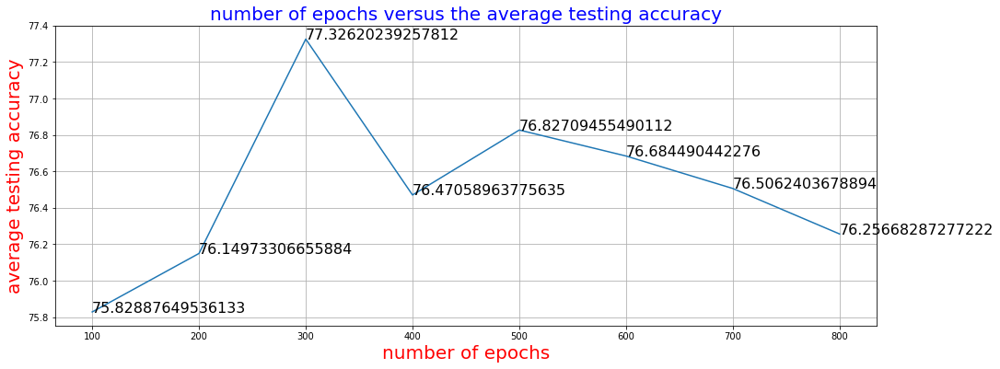

In [58]:
fig, ax = plt.subplots(figsize=(16,6))
plt.plot(epochs_num, BatchSize_avg_test_accs)
plt.xlabel("number of epochs", size=20,color='red')
plt.ylabel("average testing accuracy", size=20,color='red')
plt.title("number of epochs versus the average testing accuracy", size=20,color="blue")
for index in range(len(epochs_num)):
  ax.text(epochs_num[index], BatchSize_avg_test_accs[index], BatchSize_avg_test_accs[index], size=16)
plt.grid()
print("===================================")
print("Experiment 1        :varying the Batch size ")
print(f"Batch size          : 64")
print(f"Hidden Layers       : default ")
print(f"number of neurons   : defeult")
print(f"Learning Rate       : default")
print(f"optimizer           : default ")
print(f"activation function : default ")
print("===================================")
plt.show()

Experiment 2       :varying the number of hidden layers and number of neurons 
Batch size          : 64
Hidden Layers       : 2 
number of neurons   : 30
Learning Rate       : default
optimizer           : default 
activation function : default 


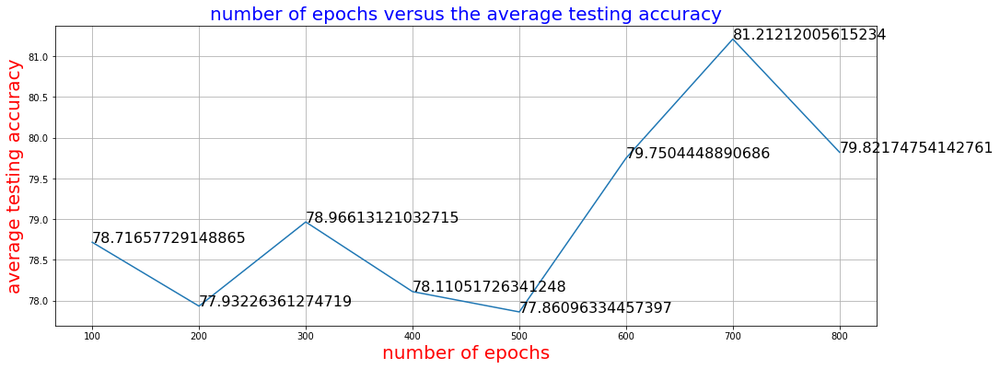

In [59]:
fig, ax = plt.subplots(figsize=(16,6))
plt.plot(epochs_num, HL_NN_avg_test_accs)
plt.xlabel("number of epochs", size=20,color='red')
plt.ylabel("average testing accuracy", size=20,color='red')
plt.title("number of epochs versus the average testing accuracy", size=20,color='blue')
for index in range(len(epochs_num)):
  ax.text(epochs_num[index], HL_NN_avg_test_accs[index], HL_NN_avg_test_accs[index], size=16)
plt.grid()
print("===================================")
print("Experiment 2       :varying the number of hidden layers and number of neurons ")
print(f"Batch size          : 64")
print(f"Hidden Layers       : 2 ")
print(f"number of neurons   : 30")
print(f"Learning Rate       : default")
print(f"optimizer           : default ")
print(f"activation function : default ")
print("===================================")
plt.show()

Experiment 3        :varying the number of learning rates and optimizers 
Batch size          : 64
Hidden Layers       : 2 
number of neurons   : 30
Learning Rate       : 0.01
optimizer           : Rprop 
activation function : default 


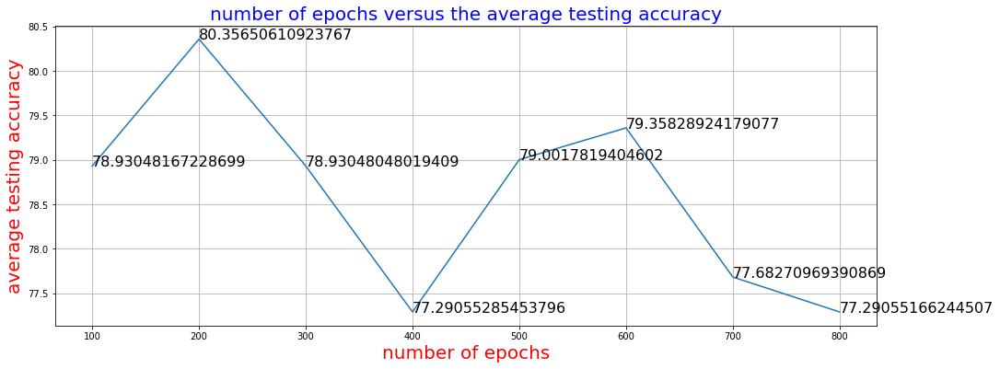

In [60]:

fig, ax = plt.subplots(figsize=(16,6))
plt.plot(epochs_num, LR_opt_avg_test_accs)
plt.xlabel("number of epochs", size=20,color='red')
plt.ylabel("average testing accuracy", size=20,color='red')
plt.title("number of epochs versus the average testing accuracy", size=20,color='blue')
for index in range(len(epochs_num)):
  ax.text(epochs_num[index], LR_opt_avg_test_accs[index], LR_opt_avg_test_accs[index], size=16)
plt.grid()
print("===================================")
print("Experiment 3        :varying the number of learning rates and optimizers ")
print(f"Batch size          : 64")
print(f"Hidden Layers       : 2 ")
print(f"number of neurons   : 30")
print(f"Learning Rate       : 0.01")
print(f"optimizer           : Rprop ")
print(f"activation function : default ")
print("===================================")
plt.show()

Experiment 4        : vary the activation function
Batch size          : 64
Hidden Layers       : 2 
number of neurons   : 30
Learning Rate       : 0.01
optimizer           : Rprop 
activation function :leaky_relu 


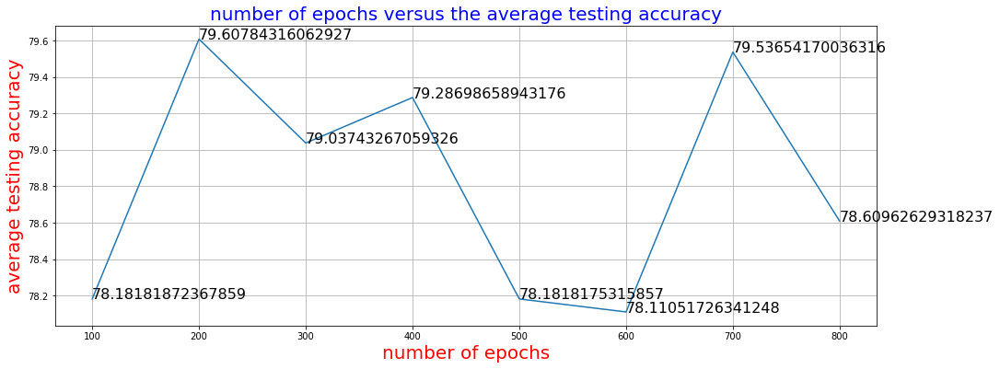

In [61]:
fig, ax = plt.subplots(figsize=(16,6))
plt.plot(epochs_num, af_avg_test_accs)
plt.xlabel("number of epochs", size=20,color='red')
plt.ylabel("average testing accuracy", size=20,color='red')
plt.title("number of epochs versus the average testing accuracy", size=20,color='blue')
for index in range(len(epochs_num)):
  ax.text(epochs_num[index], af_avg_test_accs[index], af_avg_test_accs[index], size=16)
plt.grid()
print("===================================")
print("Experiment 4        : vary the activation function")
print(f"Batch size          : 64")
print(f"Hidden Layers       : 2 ")
print(f"number of neurons   : 30")
print(f"Learning Rate       : 0.01")
print(f"optimizer           : Rprop ")
print(f"activation function :leaky_relu ")
print("===================================")
plt.show()